In [1]:
# only adjust settings in this cell
state = 'IA'
root_name = 'Polk'     # which county will root our district (or county_cluster==multi-district)?
k = 4                  # the state has this number of districts
deviation = 1          # use: L=ideal_population-deviation, U=ideal_population-deviation
size = 1               # size=1 for single district, size=2 for double district, ...
time_limit = 48*3600   # time limit in seconds

In [2]:
filepath = 'C:\\districting-data-2020\\'
filename = state + '_county.json'

from cluster import read_graph_from_json
G = read_graph_from_json( filepath + filename) 

In [3]:
G._k = k
G._size = size
G._time_limit = time_limit

print("State has total of k =",G._k,"districts")
print("We seek a multi-district (county cluster) of size =",G._size)

State has total of k = 4 districts
We seek a multi-district (county cluster) of size = 1


In [4]:
ideal_population = sum( G.nodes[i]['TOTPOP'] for i in G.nodes ) / G._k

# Calculate lower and upper population limits
from math import ceil, floor
G._L = ceil( ideal_population - deviation )
G._U = floor( ideal_population + deviation )

print("Single district lower population limit L =",G._L)
print("Single district upper population limit U =",G._U)

Single district lower population limit L = 797592
Single district upper population limit U = 797593


In [5]:
# Require this county be in our district/county_cluster/multi_district
G._root = G._root = [ i for i in G.nodes if G.nodes[i]['NAME20'] == root_name ][0]
print("Use",root_name,"County to be the root. In our graph, this is vertex #",G._root)

Use Polk County to be the root. In our graph, this is vertex # 8


In [6]:
import simple_enumerator
districts = simple_enumerator.simple_enumerator(G)

Sol# Node# Time(s) district
1 9586 0.07 [8, 93, 4, 78, 53, 76, 48, 46, 96, 14]
2 32671 0.23 [8, 93, 4, 10, 68, 2, 76, 48, 60, 79, 71]
3 89737 0.64 [8, 93, 4, 18, 53, 79, 59, 2, 84, 1, 41]
4 118820 0.85 [8, 93, 4, 94, 16, 68, 50, 0, 43, 46]
5 186718 1.39 [8, 93, 4, 94, 49, 53, 37, 48, 76, 46, 79, 14]
6 253137 1.9 [8, 93, 4, 17, 66, 0, 81, 73, 43]
7 261371 1.96 [8, 93, 4, 17, 16, 68, 53, 50, 37, 73, 79]
8 292858 2.23 [8, 93, 4, 17, 68, 2, 76, 37, 41, 59, 1, 21]
9 320706 2.44 [8, 93, 4, 17, 49, 53, 37, 73, 79, 41, 21, 71, 60, 86]
10 330137 2.51 [8, 93, 4, 17, 53, 62, 79, 2, 41, 1, 22]
11 337626 2.57 [8, 93, 4, 17, 53, 37, 79, 2, 76, 48, 46, 14, 41, 21]
12 429422 3.36 [8, 93, 4, 16, 68, 6, 50, 0, 76, 37, 73, 9]
13 471480 3.73 [8, 93, 4, 16, 68, 2, 50, 76, 41, 59, 1, 92]
14 490582 3.88 [8, 93, 4, 16, 68, 2, 37, 73, 63, 71, 60, 86, 41, 59]
15 498248 3.94 [8, 93, 4, 16, 68, 53, 62, 73, 9, 76, 58, 14]
16 515571 4.08 [8, 93, 4, 16, 68, 53, 76, 37, 60, 86, 14, 71, 21, 41, 1]
17 523174 4.14 [8, 9

123 3961693 35.43 [8, 93, 78, 18, 95, 53, 62, 33, 73, 48, 79, 2, 58]
124 3986129 35.66 [8, 93, 78, 18, 95, 53, 62, 3, 67, 76, 2, 60, 86]
125 4025892 36.0 [8, 93, 78, 18, 95, 53, 62, 73, 9, 79, 2, 63, 43, 14]
126 4033290 36.07 [8, 93, 78, 18, 95, 53, 62, 73, 76, 48, 60, 71, 21, 22]
127 4098420 36.62 [8, 93, 78, 18, 95, 53, 3, 54, 39, 79, 41, 21, 71, 60]
128 4101149 36.65 [8, 93, 78, 18, 95, 53, 3, 54, 67, 76, 2, 48, 41]
129 4110584 36.73 [8, 93, 78, 18, 95, 53, 3, 54, 76, 60, 46, 79, 14, 84]
130 4233708 37.84 [8, 93, 78, 18, 95, 53, 3, 37, 73, 9, 33, 42, 58, 23]
131 4287014 38.32 [8, 93, 78, 18, 95, 53, 76, 2, 37, 73, 9, 60, 63, 70, 71, 41]
132 4353089 38.9 [8, 93, 78, 18, 95, 53, 76, 37, 73, 60, 79, 59, 71, 21, 22]
133 4413326 39.49 [8, 93, 78, 18, 95, 53, 37, 73, 9, 48, 79, 63, 43, 70, 86, 14]
134 4419123 39.54 [8, 93, 78, 18, 95, 53, 37, 73, 9, 46, 96, 86, 60, 14, 71, 21, 41]
135 4448689 39.8 [8, 93, 78, 18, 95, 53, 37, 73, 46, 79, 2, 63, 70, 64, 14]
136 4468185 39.97 [8, 93, 78, 18,

232 8131178 72.96 [8, 93, 78, 18, 53, 62, 33, 73, 76, 2, 48, 58, 14, 71, 21, 41]
233 8145312 73.09 [8, 93, 78, 18, 53, 62, 33, 73, 76, 48, 46, 63, 43, 64]
234 8180291 73.39 [8, 93, 78, 18, 53, 62, 33, 73, 79, 59, 2, 71, 60, 86, 21]
235 8218343 73.73 [8, 93, 78, 18, 53, 62, 33, 9, 79, 59, 2, 1, 92]
236 8219513 73.74 [8, 93, 78, 18, 53, 62, 33, 9, 79, 58, 23, 41, 21, 22, 27]
237 8249003 74.0 [8, 93, 78, 18, 53, 62, 33, 76, 60, 79, 59, 86, 96, 71, 21]
238 8319067 74.61 [8, 93, 78, 18, 53, 62, 73, 9, 76, 2, 63, 14, 59, 84, 71]
239 8355998 74.94 [8, 93, 78, 18, 53, 62, 73, 9, 37, 48, 79, 86, 96, 12, 60, 41]
240 8360725 74.99 [8, 93, 78, 18, 53, 62, 73, 9, 37, 79, 2, 63, 58, 14, 71, 60, 41]
241 8415034 75.51 [8, 93, 78, 18, 53, 62, 73, 76, 2, 48, 60, 46, 63, 70, 86, 14]
242 8448333 75.84 [8, 93, 78, 18, 53, 62, 73, 76, 37, 79, 63, 43, 64, 81, 14]
243 8710173 78.19 [8, 93, 78, 18, 53, 62, 9, 14, 59, 84, 41, 2, 21, 22, 27]
244 8806640 79.14 [8, 93, 78, 18, 53, 76, 2, 37, 66, 60, 86, 96, 71, 21

341 13441738 125.68 [8, 93, 78, 94, 95, 68, 3, 37, 73, 79, 59, 63, 91, 41]
342 13463964 125.92 [8, 93, 78, 94, 95, 68, 76, 37, 73, 9, 79, 59, 84, 1]
343 13471987 126.0 [8, 93, 78, 94, 95, 68, 76, 37, 73, 79, 59, 63, 41, 21, 22]
344 13536740 126.6 [8, 93, 78, 94, 95, 68, 46, 96, 79, 59, 84, 33, 86, 14]
345 13560891 126.82 [8, 93, 78, 94, 95, 53, 62, 33, 3, 67, 37, 48, 86]
346 13623351 127.42 [8, 93, 78, 94, 95, 53, 62, 3, 67, 76, 37, 60, 71, 21, 41]
347 13643755 127.63 [8, 93, 78, 94, 95, 53, 62, 3, 73, 79, 59, 1, 22]
348 13666748 127.86 [8, 93, 78, 94, 95, 53, 62, 3, 37, 14, 59, 1, 92, 41]
349 13706678 128.24 [8, 93, 78, 94, 95, 53, 62, 73, 76, 60, 63, 70, 86, 14, 71, 21]
350 13724766 128.43 [8, 93, 78, 94, 95, 53, 62, 73, 46, 79, 2, 63, 71, 60, 21, 41]
351 13756727 128.71 [8, 93, 78, 94, 95, 53, 62, 9, 48, 79, 2, 58, 23, 14, 41]
352 13843228 129.53 [8, 93, 78, 94, 95, 53, 3, 28, 67, 37, 48, 79, 59, 86]
353 13861378 129.7 [8, 93, 78, 94, 95, 53, 3, 28, 76, 46, 96, 14, 59, 84]
354 13915

445 17863651 168.97 [8, 93, 78, 94, 53, 62, 33, 73, 37, 46, 79, 59, 2, 63, 14]
446 17866635 169.0 [8, 93, 78, 94, 53, 62, 33, 73, 37, 79, 59, 63, 70, 30, 58]
447 17920174 169.49 [8, 93, 78, 94, 53, 62, 33, 73, 79, 63, 70, 32, 41, 21, 71, 60]
448 17931685 169.59 [8, 93, 78, 94, 53, 62, 33, 9, 91, 76, 48, 79, 14, 41, 21]
449 17945206 169.71 [8, 93, 78, 94, 53, 62, 33, 9, 76, 2, 48, 60, 46, 14, 71, 21]
450 17981871 170.04 [8, 93, 78, 94, 53, 62, 33, 9, 48, 46, 96, 12, 58, 23, 14]
451 18074461 170.87 [8, 93, 78, 94, 53, 62, 33, 37, 46, 96, 79, 59, 1, 86, 14]
452 18162551 171.71 [8, 93, 78, 94, 53, 62, 73, 9, 91, 46, 79, 63, 43, 70, 58]
453 18189622 171.98 [8, 93, 78, 94, 53, 62, 73, 9, 76, 2, 60, 63, 43, 58, 23, 41]
454 18223665 172.31 [8, 93, 78, 94, 53, 62, 73, 9, 76, 48, 60, 79, 63, 43, 70, 14, 41]
455 18334067 173.42 [8, 93, 78, 94, 53, 62, 73, 9, 48, 63, 86, 96, 60, 71, 2, 21, 41]
456 18356197 173.63 [8, 93, 78, 94, 53, 62, 73, 9, 46, 79, 14, 84, 41, 21, 22, 27, 71]
457 18363731 173.7

548 24555602 231.73 [8, 93, 78, 17, 66, 68, 2, 48, 79, 59, 84, 1, 14, 41]
549 24572717 231.87 [8, 93, 78, 17, 66, 68, 53, 62, 73, 43, 37, 79, 14]
550 24581759 231.94 [8, 93, 78, 17, 66, 68, 53, 73, 9, 33, 76, 48, 46]
551 24591299 232.02 [8, 93, 78, 17, 66, 68, 53, 73, 9, 63, 58, 14, 59, 41, 21]
552 24607084 232.15 [8, 93, 78, 17, 66, 68, 53, 73, 79, 59, 84, 1, 41, 21]
553 24668391 232.66 [8, 93, 78, 17, 66, 68, 73, 9, 91, 48, 46, 63, 70]
554 24697448 232.9 [8, 93, 78, 17, 66, 68, 73, 76, 48, 79, 59, 84, 86, 14]
555 24701143 232.94 [8, 93, 78, 17, 66, 68, 73, 43, 64, 81, 79, 59, 63]
556 24731799 233.2 [8, 93, 78, 17, 66, 68, 76, 37, 48, 60, 79, 63, 86, 96, 71]
557 24752460 233.37 [8, 93, 78, 17, 66, 68, 43, 64, 57, 37, 79, 74, 41, 1]
558 24796394 233.76 [8, 93, 78, 17, 66, 49, 16, 0, 6, 29, 81, 63]
559 24806488 233.84 [8, 93, 78, 17, 66, 49, 16, 0, 50, 48, 63, 86, 60, 71]
560 24810378 233.87 [8, 93, 78, 17, 66, 49, 16, 6, 45, 53, 76, 60]
561 24824718 233.99 [8, 93, 78, 17, 66, 49, 16, 5

656 28567284 266.99 [8, 93, 78, 17, 68, 49, 0, 50, 29, 51, 76, 48, 60, 86]
657 28638637 267.67 [8, 93, 78, 17, 68, 49, 0, 50, 43, 63, 73, 62, 9, 70, 14]
658 28645685 267.73 [8, 93, 78, 17, 68, 49, 0, 50, 37, 73, 48, 79, 86, 96, 60, 71, 21]
659 28694896 268.2 [8, 93, 78, 17, 68, 49, 0, 76, 37, 62, 33, 9, 42, 79]
660 28726562 268.51 [8, 93, 78, 17, 68, 49, 0, 43, 64, 57, 70, 63, 73, 62]
661 28735831 268.6 [8, 93, 78, 17, 68, 49, 0, 43, 64, 70, 32, 37, 48, 46, 63]
662 28788495 269.1 [8, 93, 78, 17, 68, 49, 0, 37, 62, 9, 48, 46, 96, 79, 86]
663 28814429 269.33 [8, 93, 78, 17, 68, 49, 0, 48, 79, 59, 84, 33, 58, 23, 14]
664 28822601 269.41 [8, 93, 78, 17, 68, 49, 2, 53, 62, 33, 84, 58, 71, 60, 41]
665 28845329 269.62 [8, 93, 78, 17, 68, 49, 2, 53, 62, 73, 79, 59, 63, 70, 71]
666 29053884 271.72 [8, 93, 78, 17, 68, 49, 2, 76, 60, 79, 59, 84, 33, 58, 14, 41]
667 29090930 272.1 [8, 93, 78, 17, 68, 49, 2, 37, 62, 48, 86, 96, 12, 97, 14, 41]
668 29095216 272.14 [8, 93, 78, 17, 68, 49, 2, 37, 73, 

757 32615556 306.82 [8, 93, 78, 17, 68, 37, 62, 9, 48, 46, 58, 23, 86, 14, 59, 1]
758 32754113 308.2 [8, 93, 78, 17, 68, 37, 73, 9, 48, 63, 43, 0, 70, 32, 89]
759 32762548 308.29 [8, 93, 78, 17, 68, 37, 73, 9, 79, 59, 1, 22, 92, 63, 58, 27]
760 32778464 308.44 [8, 93, 78, 17, 68, 37, 73, 9, 79, 41, 1, 22, 21, 71, 60, 86, 96, 46]
761 32789234 308.53 [8, 93, 78, 17, 68, 37, 73, 48, 46, 95, 79, 59, 84, 63, 43, 41]
762 32881707 309.4 [8, 93, 78, 17, 68, 37, 73, 79, 63, 91, 43, 64, 0, 30, 70]
763 32898065 309.55 [8, 93, 78, 17, 68, 37, 48, 46, 38, 67, 54, 79, 41]
764 32948822 310.06 [8, 93, 78, 17, 68, 48, 46, 96, 12, 79, 59, 84, 33, 9, 58, 86]
765 32995338 310.56 [8, 93, 78, 17, 68, 48, 86, 96, 12, 38, 95, 67]
766 32998878 310.59 [8, 93, 78, 17, 68, 79, 59, 84, 33, 62, 1, 73, 14, 41, 21, 71]
767 33026238 310.83 [8, 93, 78, 17, 49, 16, 10, 0, 43, 64, 63, 73]
768 33034848 310.9 [8, 93, 78, 17, 49, 16, 10, 53, 48, 79, 86, 14, 84, 41]
769 33044627 310.98 [8, 93, 78, 17, 49, 16, 0, 6, 45, 29, 5

859 36119743 339.22 [8, 93, 78, 17, 49, 0, 81, 76, 2, 37, 73, 9, 60, 63, 70, 58, 86]
860 36238979 340.3 [8, 93, 78, 17, 49, 0, 53, 62, 33, 84, 9, 37, 79, 58, 14]
861 36270635 340.57 [8, 93, 78, 17, 49, 0, 53, 62, 33, 9, 76, 2, 60, 86, 71]
862 36272850 340.59 [8, 93, 78, 17, 49, 0, 53, 62, 33, 9, 43, 64, 37, 79]
863 36294140 340.78 [8, 93, 78, 17, 49, 0, 53, 62, 33, 37, 48, 79, 14, 41, 1, 21]
864 36318938 340.99 [8, 93, 78, 17, 49, 0, 53, 62, 50, 73, 9, 79, 2, 63, 71, 21]
865 36359460 341.35 [8, 93, 78, 17, 49, 0, 53, 62, 50, 43, 64, 48, 79, 63, 14, 41]
866 36367196 341.41 [8, 93, 78, 17, 49, 0, 53, 62, 50, 48, 46, 96, 12, 97, 86, 14]
867 36385779 341.58 [8, 93, 78, 17, 49, 0, 53, 62, 73, 9, 37, 58, 23, 52, 14]
868 36393925 341.65 [8, 93, 78, 17, 49, 0, 53, 62, 73, 76, 2, 37, 60, 14, 59]
869 36445053 342.14 [8, 93, 78, 17, 49, 0, 53, 62, 9, 76, 43, 60, 79, 86, 14, 71, 21]
870 36453093 342.21 [8, 93, 78, 17, 49, 0, 53, 62, 9, 43, 64, 57, 70, 74, 14]
871 36506851 342.73 [8, 93, 78, 17, 49

959 41093075 386.28 [8, 93, 78, 17, 53, 62, 33, 73, 42, 79, 63, 70, 32, 52, 14]
960 41140826 386.72 [8, 93, 78, 17, 53, 62, 33, 73, 79, 63, 43, 64, 81, 30, 14, 41]
961 41247858 387.69 [8, 93, 78, 17, 53, 62, 33, 9, 58, 23, 52, 35, 89, 40]
962 41330490 388.5 [8, 93, 78, 17, 53, 62, 33, 37, 42, 48, 79, 2, 58, 23, 41, 1]
963 41382465 388.97 [8, 93, 78, 17, 53, 62, 33, 48, 79, 59, 2, 1, 92, 27, 14]
964 41412757 389.25 [8, 93, 78, 17, 53, 62, 73, 9, 91, 23, 52, 79, 63, 41, 1]
965 41438519 389.49 [8, 93, 78, 17, 53, 62, 73, 9, 91, 37, 48, 86, 14, 59, 84]
966 41509491 390.18 [8, 93, 78, 17, 53, 62, 73, 9, 76, 37, 48, 60, 46, 96, 63, 58, 86]
967 41649902 391.52 [8, 93, 78, 17, 53, 62, 73, 9, 48, 46, 95, 79, 63, 43, 70, 41]
968 41675100 391.81 [8, 93, 78, 17, 53, 62, 73, 9, 48, 46, 63, 58, 86, 60, 71, 2, 41, 1]
969 41694061 392.02 [8, 93, 78, 17, 53, 62, 73, 9, 48, 79, 63, 43, 0, 58, 86, 96, 41]
970 41731330 392.5 [8, 93, 78, 17, 53, 62, 73, 9, 79, 2, 63, 43, 0, 50, 70, 58]
971 41753409 392.72 

1058 48203584 459.74 [8, 93, 78, 17, 37, 62, 73, 9, 48, 63, 43, 58, 14, 59, 84, 41, 21, 71]
1059 48524045 462.57 [8, 93, 78, 17, 37, 73, 9, 33, 84, 48, 46, 96, 58, 86, 60, 14, 71, 21, 41]
1060 48666969 463.88 [8, 93, 78, 17, 37, 73, 48, 46, 95, 63, 70, 32, 86, 60, 71, 2, 21]
1061 48767381 464.81 [8, 93, 78, 17, 37, 73, 63, 91, 23, 43, 64, 81, 30, 58, 33]
1062 48768309 464.81 [8, 93, 78, 17, 37, 73, 63, 91, 23, 70, 64, 57, 74, 5, 13]
1063 48774187 464.87 [8, 93, 78, 17, 37, 73, 63, 43, 0, 81, 50, 70, 32, 89, 52]
1064 48816276 465.25 [8, 93, 78, 17, 48, 46, 95, 3, 54, 28, 86, 60, 71, 21, 41, 1]
1065 49043267 467.36 [8, 93, 78, 68, 2, 53, 62, 33, 65, 76, 37, 48, 46, 79, 14, 41, 1]
1066 49236231 469.17 [8, 93, 78, 68, 2, 53, 62, 33, 84, 73, 48, 46, 96, 12, 58, 86, 41]
1067 49237633 469.19 [8, 93, 78, 68, 2, 53, 62, 33, 84, 73, 48, 46, 79, 63, 70, 30, 14]
1068 49252993 469.36 [8, 93, 78, 68, 2, 53, 62, 33, 84, 73, 63, 91, 32, 71, 21]
1069 49350982 470.29 [8, 93, 78, 68, 2, 53, 62, 33, 84, 7

1153 55751846 542.67 [8, 93, 78, 68, 2, 53, 37, 73, 48, 63, 43, 14, 84, 33, 41, 1, 22, 27]
1154 55860560 543.94 [8, 93, 78, 68, 2, 53, 37, 73, 79, 59, 1, 63, 70, 14, 71, 60, 86, 96, 46, 41]
1155 55881968 544.15 [8, 93, 78, 68, 2, 53, 37, 73, 79, 63, 91, 23, 52, 43, 70, 14, 41, 21]
1156 55892179 544.25 [8, 93, 78, 68, 2, 53, 37, 73, 79, 63, 91, 43, 0, 81, 57, 50, 14]
1157 55916614 544.54 [8, 93, 78, 68, 2, 53, 37, 73, 79, 63, 43, 0, 49, 81, 57, 74, 41, 1]
1158 56092805 546.26 [8, 93, 78, 68, 2, 53, 37, 73, 63, 43, 0, 81, 70, 14, 71, 60, 21, 22, 27]
1159 56163496 546.95 [8, 93, 78, 68, 2, 53, 37, 73, 63, 70, 64, 57, 74, 5, 69, 80, 41, 1]
1160 56435017 549.59 [8, 93, 78, 68, 2, 53, 37, 14, 84, 33, 9, 58, 71, 60, 86, 96, 12, 41, 1]
1161 56858503 553.59 [8, 93, 78, 68, 2, 53, 79, 59, 84, 33, 9, 91, 32, 52, 41]
1162 56866748 553.68 [8, 93, 78, 68, 2, 53, 79, 59, 84, 33, 58, 14, 71, 60, 86, 96, 21, 22]
1163 56941737 554.41 [8, 93, 78, 68, 2, 53, 14, 84, 33, 9, 73, 63, 43, 0, 49, 81, 71]
1164 

1249 63042800 615.07 [8, 93, 78, 68, 2, 37, 62, 9, 58, 23, 52, 32, 41, 1, 22, 27]
1250 63065705 615.3 [8, 93, 78, 68, 2, 37, 62, 48, 46, 95, 83, 45, 6, 71, 41]
1251 63222423 617.04 [8, 93, 78, 68, 2, 37, 73, 9, 91, 33, 42, 79, 63, 43, 0, 70, 41]
1252 63264309 617.48 [8, 93, 78, 68, 2, 37, 73, 9, 91, 32, 89, 48, 79, 59, 84]
1253 63266800 617.5 [8, 93, 78, 68, 2, 37, 73, 9, 91, 32, 89, 79, 59, 63, 43, 41]
1254 63320587 618.0 [8, 93, 78, 68, 2, 37, 73, 9, 91, 32, 70, 58, 71, 21, 22, 1, 27]
1255 63322795 618.02 [8, 93, 78, 68, 2, 37, 73, 9, 91, 32, 48, 46, 96, 63, 43, 58, 86]
1256 63455953 619.34 [8, 93, 78, 68, 2, 37, 73, 9, 91, 48, 63, 43, 64, 57, 74, 41, 59]
1257 63718980 622.29 [8, 93, 78, 68, 2, 37, 73, 9, 33, 84, 48, 79, 63, 58, 23, 71, 21, 22]
1258 63720514 622.31 [8, 93, 78, 68, 2, 37, 73, 9, 33, 84, 48, 79, 58, 23, 86, 96, 41, 1]
1259 63805237 623.16 [8, 93, 78, 68, 2, 37, 73, 9, 33, 42, 48, 63, 43, 0, 70, 32, 58]
1260 63862992 623.81 [8, 93, 78, 68, 2, 37, 73, 9, 33, 48, 46, 95, 

1345 70689960 693.42 [8, 93, 78, 68, 53, 62, 9, 91, 32, 76, 37, 60, 79, 63, 14, 84]
1346 70715419 693.65 [8, 93, 78, 68, 53, 62, 9, 91, 32, 37, 48, 14, 84, 65, 42]
1347 70717237 693.67 [8, 93, 78, 68, 53, 62, 9, 91, 32, 48, 46, 95, 63, 58, 14]
1348 70743216 693.92 [8, 93, 78, 68, 53, 62, 9, 91, 23, 52, 48, 46, 96, 79, 58, 14]
1349 70748299 693.97 [8, 93, 78, 68, 53, 62, 9, 91, 23, 52, 48, 58, 14, 59, 41, 21, 71]
1350 70751899 694.01 [8, 93, 78, 68, 53, 62, 9, 91, 23, 52, 63, 70, 64, 81, 58]
1351 70776101 694.24 [8, 93, 78, 68, 53, 62, 9, 91, 23, 37, 48, 46, 79, 59, 63, 86, 41]
1352 70807541 694.58 [8, 93, 78, 68, 53, 62, 9, 91, 76, 37, 48, 60, 46, 63, 43, 70, 86]
1353 70822891 694.73 [8, 93, 78, 68, 53, 62, 9, 91, 76, 37, 60, 86, 96, 12, 46, 97, 14]
1354 70823473 694.73 [8, 93, 78, 68, 53, 62, 9, 91, 76, 37, 60, 14, 71, 21, 22, 1, 27]
1355 70867354 695.28 [8, 93, 78, 68, 53, 62, 9, 91, 76, 79, 59, 1, 92, 63, 27, 14]
1356 70879331 695.44 [8, 93, 78, 68, 53, 62, 9, 91, 37, 48, 46, 79, 63

1440 77517658 774.03 [8, 93, 78, 68, 76, 37, 66, 48, 60, 46, 71, 21, 22, 1, 92, 27]
1441 77520802 774.09 [8, 93, 78, 68, 76, 37, 66, 48, 60, 79, 63, 91, 9, 70, 71, 21]
1442 77755571 776.99 [8, 93, 78, 68, 76, 37, 62, 33, 84, 73, 60, 63, 43, 70, 71, 21, 22]
1443 77791497 777.41 [8, 93, 78, 68, 76, 37, 62, 33, 84, 60, 58, 23, 86, 96, 12, 46, 97]
1444 77791677 777.41 [8, 93, 78, 68, 76, 37, 62, 33, 84, 60, 58, 23, 71, 21, 22, 1, 27]
1445 77835618 778.06 [8, 93, 78, 68, 76, 37, 62, 33, 73, 9, 60, 79, 58, 86, 71, 21, 22, 27]
1446 77846464 778.2 [8, 93, 78, 68, 76, 37, 62, 33, 73, 9, 63, 43, 14, 59, 1, 22]
1447 77856606 778.32 [8, 93, 78, 68, 76, 37, 62, 33, 73, 42, 48, 46, 95, 63, 43, 58]
1448 77959644 779.49 [8, 93, 78, 68, 76, 37, 62, 33, 73, 60, 86, 96, 12, 46, 97, 39]
1449 78011234 779.99 [8, 93, 78, 68, 76, 37, 62, 33, 9, 48, 60, 46, 96, 12, 79, 58, 86, 71]
1450 78069160 780.64 [8, 93, 78, 68, 76, 37, 62, 33, 48, 46, 95, 3, 28, 67]
1451 78135021 781.39 [8, 93, 78, 68, 76, 37, 62, 73, 9

1536 84028933 844.65 [8, 93, 78, 68, 37, 62, 9, 91, 32, 48, 79, 63, 43, 0, 41, 21, 71]
1537 84053520 844.88 [8, 93, 78, 68, 37, 62, 9, 91, 23, 48, 46, 96, 63, 14, 59, 1]
1538 84058671 844.93 [8, 93, 78, 68, 37, 62, 9, 91, 23, 48, 79, 59, 63, 43, 86, 60, 71]
1539 84139907 845.7 [8, 93, 78, 68, 37, 62, 9, 91, 63, 43, 64, 81, 30, 89, 58]
1540 84314174 847.61 [8, 93, 78, 68, 37, 73, 9, 91, 33, 32, 52, 84, 48, 63, 58, 14]
1541 84318059 847.65 [8, 93, 78, 68, 37, 73, 9, 91, 33, 32, 52, 48, 63, 43, 64]
1542 84319166 847.66 [8, 93, 78, 68, 37, 73, 9, 91, 33, 32, 84, 59, 23, 63, 58, 41]
1543 84343956 847.91 [8, 93, 78, 68, 37, 73, 9, 91, 33, 65, 23, 52, 42, 79, 41, 1]
1544 84362258 848.09 [8, 93, 78, 68, 37, 73, 9, 91, 33, 84, 59, 48, 46, 63, 43, 0]
1545 84397343 848.51 [8, 93, 78, 68, 37, 73, 9, 91, 33, 23, 79, 59, 58, 41, 21, 22, 27]
1546 84425890 848.79 [8, 93, 78, 68, 37, 73, 9, 91, 33, 79, 63, 43, 0, 70, 41, 1, 21, 71]
1547 84476472 849.29 [8, 93, 78, 68, 37, 73, 9, 91, 32, 23, 48, 46, 79,

1632 92824905 937.98 [8, 93, 78, 53, 62, 33, 73, 9, 76, 2, 42, 48, 46, 63, 43, 0, 70]
1633 92867422 938.48 [8, 93, 78, 53, 62, 33, 73, 9, 76, 2, 48, 60, 58, 86, 14, 59, 1, 71]
1634 92971626 939.52 [8, 93, 78, 53, 62, 33, 73, 9, 76, 37, 48, 60, 79, 63, 70, 32, 58, 41]
1635 92980810 939.61 [8, 93, 78, 53, 62, 33, 73, 9, 76, 37, 48, 46, 79, 59, 1, 63, 70, 41]
1636 92997010 939.83 [8, 93, 78, 53, 62, 33, 73, 9, 76, 37, 60, 79, 63, 43, 86, 96, 12, 97]
1637 93184483 941.85 [8, 93, 78, 53, 62, 33, 73, 9, 76, 79, 63, 43, 64, 0, 57, 30, 41]
1638 93252233 942.66 [8, 93, 78, 53, 62, 33, 73, 9, 37, 48, 46, 96, 12, 79, 63, 86, 60, 14, 71]
1639 93258280 942.72 [8, 93, 78, 53, 62, 33, 73, 9, 37, 48, 46, 96, 63, 58, 86, 60, 14, 71, 21, 41]
1640 93309301 943.25 [8, 93, 78, 53, 62, 33, 73, 9, 37, 48, 63, 70, 58, 86, 60, 71, 2, 41, 1]
1641 93333397 943.51 [8, 93, 78, 53, 62, 33, 73, 9, 37, 79, 63, 43, 0, 50, 16, 58, 14]
1642 93436757 944.52 [8, 93, 78, 53, 62, 33, 73, 9, 42, 79, 63, 43, 0, 50, 16, 70, 41

1729 98898541 1001.62 [8, 93, 78, 53, 62, 73, 66, 76, 43, 64, 48, 79, 63, 14, 84]
1730 98918885 1001.9 [8, 93, 78, 53, 62, 73, 66, 76, 37, 48, 46, 63, 91, 86, 14]
1731 98978987 1002.54 [8, 93, 78, 53, 62, 73, 66, 43, 37, 48, 63, 86, 96, 60, 71, 21, 41]
1732 98981197 1002.57 [8, 93, 78, 53, 62, 73, 66, 43, 37, 79, 63, 91, 23, 14, 41]
1733 98985038 1002.61 [8, 93, 78, 53, 62, 73, 66, 43, 48, 46, 79, 59, 2, 14, 71, 21]
1734 99018453 1002.93 [8, 93, 78, 53, 62, 73, 66, 37, 79, 2, 14, 71, 60, 86, 96, 21, 41]
1735 99022035 1002.97 [8, 93, 78, 53, 62, 73, 66, 37, 63, 14, 59, 84, 41, 21, 71, 60, 86]
1736 99074999 1003.6 [8, 93, 78, 53, 62, 73, 9, 91, 32, 89, 23, 76, 70, 63, 43]
1737 99085404 1003.69 [8, 93, 78, 53, 62, 73, 9, 91, 32, 89, 76, 30, 70, 63, 35, 14]
1738 99142346 1004.25 [8, 93, 78, 53, 62, 73, 9, 91, 32, 52, 76, 79, 59, 1, 35, 41]
1739 99148284 1004.3 [8, 93, 78, 53, 62, 73, 9, 91, 32, 52, 70, 37, 79, 2, 58, 35]
1740 99160373 1004.42 [8, 93, 78, 53, 62, 73, 9, 91, 32, 52, 48, 79, 

1821 106680686 1085.73 [8, 93, 78, 53, 62, 73, 48, 46, 38, 67, 39, 44, 79, 14]
1822 106696406 1085.89 [8, 93, 78, 53, 62, 73, 48, 46, 38, 96, 79, 2, 63, 14, 84, 41]
1823 106707084 1086.06 [8, 93, 78, 53, 62, 73, 48, 46, 38, 3, 79, 2, 14, 41, 21, 22]
1824 106708909 1086.08 [8, 93, 78, 53, 62, 73, 48, 46, 38, 3, 63, 43, 64, 0, 14]
1825 106737164 1086.35 [8, 93, 78, 53, 62, 73, 48, 46, 95, 83, 96, 3, 12, 97, 63, 70]
1826 106753302 1086.5 [8, 93, 78, 53, 62, 73, 48, 46, 95, 96, 3, 54, 12, 97, 86, 14]
1827 106770604 1086.66 [8, 93, 78, 53, 62, 73, 48, 46, 95, 96, 12, 79, 63, 43, 70, 86, 60, 71]
1828 106830944 1087.23 [8, 93, 78, 53, 62, 73, 48, 46, 95, 79, 2, 63, 43, 14, 41, 21, 22, 27]
1829 106893216 1087.83 [8, 93, 78, 53, 62, 73, 48, 46, 96, 12, 79, 97, 63, 91, 86, 60, 14, 84]
1830 107074098 1089.61 [8, 93, 78, 53, 62, 73, 48, 46, 79, 59, 63, 91, 23, 43, 58, 86, 60, 71]
1831 107079710 1089.67 [8, 93, 78, 53, 62, 73, 48, 46, 79, 59, 63, 43, 0, 81, 50, 29, 86, 41]
1832 107105530 1089.93 [8

1915 113552240 1155.41 [8, 93, 78, 53, 76, 2, 37, 66, 49, 0, 60, 86, 96, 12, 46, 41]
1916 113657906 1156.71 [8, 93, 78, 53, 76, 2, 37, 66, 0, 81, 64, 73, 9, 33]
1917 113743985 1157.69 [8, 93, 78, 53, 76, 2, 37, 66, 0, 50, 16, 73, 60, 14, 84]
1918 113750152 1157.77 [8, 93, 78, 53, 76, 2, 37, 66, 0, 50, 29, 13, 60, 71, 21, 41]
1919 113752852 1157.8 [8, 93, 78, 53, 76, 2, 37, 66, 0, 50, 29, 73, 43, 48, 14, 41]
1920 113773890 1158.04 [8, 93, 78, 53, 76, 2, 37, 66, 0, 50, 73, 63, 91, 14, 71, 41]
1921 113807298 1158.38 [8, 93, 78, 53, 76, 2, 37, 66, 0, 73, 9, 43, 48, 86, 14, 84]
1922 114107450 1161.25 [8, 93, 78, 53, 76, 2, 37, 66, 43, 64, 57, 70, 48, 46, 74, 63]
1923 114316540 1163.4 [8, 93, 78, 53, 76, 2, 37, 66, 63, 91, 32, 14, 59, 84]
1924 114329806 1163.52 [8, 93, 78, 53, 76, 2, 37, 66, 63, 14, 84, 41, 1, 22, 92, 27]
1925 114333423 1163.56 [8, 93, 78, 53, 76, 2, 37, 73, 9, 91, 33, 32, 89, 23, 70]
1926 114410516 1164.35 [8, 93, 78, 53, 76, 2, 37, 73, 9, 91, 33, 23, 58, 71, 21, 22, 27, 41

2008 124827793 1277.47 [8, 93, 78, 53, 76, 37, 73, 9, 60, 63, 43, 0, 49, 16, 86, 96, 14, 71, 21]
2009 125030234 1279.66 [8, 93, 78, 53, 76, 37, 73, 9, 79, 59, 84, 65, 63, 43, 0, 70, 58, 23]
2010 125085658 1280.34 [8, 93, 78, 53, 76, 37, 73, 9, 79, 63, 43, 64, 0, 50, 16, 30, 70, 58]
2011 125105108 1280.54 [8, 93, 78, 53, 76, 37, 73, 9, 79, 63, 43, 0, 49, 16, 81, 57, 50, 41]
2012 125318140 1282.71 [8, 93, 78, 53, 76, 37, 73, 48, 60, 46, 95, 3, 54, 79, 63, 91]
2013 125463569 1284.88 [8, 93, 78, 53, 76, 37, 73, 48, 60, 46, 96, 63, 43, 0, 86, 14, 71, 21, 22, 27, 41]
2014 125854251 1289.08 [8, 93, 78, 53, 76, 37, 73, 48, 60, 79, 63, 86, 96, 12, 97, 67, 3, 83, 41]
2015 125861233 1289.15 [8, 93, 78, 53, 76, 37, 73, 48, 60, 79, 86, 96, 14, 84, 33, 58, 23, 52, 71]
2016 126066704 1291.19 [8, 93, 78, 53, 76, 37, 73, 48, 46, 38, 67, 3, 79, 59, 63, 70]
2017 126082139 1291.34 [8, 93, 78, 53, 76, 37, 73, 48, 46, 38, 3, 28, 79, 63, 14, 84, 41]
2018 126119764 1291.76 [8, 93, 78, 53, 76, 37, 73, 48, 46, 

2104 131367078 1347.01 [8, 93, 78, 53, 37, 66, 0, 50, 43, 48, 79, 63, 14, 84, 33, 58]
2105 131369049 1347.03 [8, 93, 78, 53, 37, 66, 0, 50, 43, 48, 63, 86, 96, 12, 60, 97, 14]
2106 131405803 1347.38 [8, 93, 78, 53, 37, 66, 0, 50, 48, 63, 86, 96, 12, 60, 14, 71, 2]
2107 131528552 1348.56 [8, 93, 78, 53, 37, 66, 0, 73, 48, 46, 96, 12, 63, 14, 59, 1]
2108 131622767 1349.45 [8, 93, 78, 53, 37, 66, 0, 43, 48, 79, 2, 63, 86, 96, 12, 97, 41]
2109 131649668 1349.7 [8, 93, 78, 53, 37, 66, 0, 43, 63, 14, 59, 41, 21, 71, 60, 86, 96, 46]
2110 131652870 1349.73 [8, 93, 78, 53, 37, 66, 0, 48, 46, 95, 83, 79, 2, 63]
2111 131660669 1349.8 [8, 93, 78, 53, 37, 66, 0, 48, 46, 96, 12, 79, 63, 86, 60, 14, 84]
2112 131691502 1350.1 [8, 93, 78, 53, 37, 66, 0, 48, 79, 59, 84, 86, 96, 12, 60, 97]
2113 131732573 1350.48 [8, 93, 78, 53, 37, 66, 0, 79, 59, 2, 63, 71, 60, 86, 96, 12, 41]
2114 131738570 1350.54 [8, 93, 78, 53, 37, 66, 0, 79, 2, 63, 91, 32, 52, 14]
2115 131741149 1350.56 [8, 93, 78, 53, 37, 66, 0, 7

2195 138429437 1422.69 [8, 93, 78, 53, 37, 73, 9, 79, 59, 2, 63, 71, 60, 86, 96, 46, 38]
2196 138443892 1422.84 [8, 93, 78, 53, 37, 73, 9, 79, 59, 84, 65, 63, 43, 0, 49, 58, 23, 41]
2197 138528567 1423.85 [8, 93, 78, 53, 37, 73, 9, 79, 59, 63, 43, 64, 81, 57, 74, 5, 58, 23, 41]
2198 138532530 1423.89 [8, 93, 78, 53, 37, 73, 9, 79, 59, 63, 43, 64, 30, 89, 32, 70, 14, 41]
2199 138644751 1425.03 [8, 93, 78, 53, 37, 73, 9, 79, 2, 63, 43, 0, 50, 29, 6, 58, 23, 14, 41]
2200 138754253 1426.16 [8, 93, 78, 53, 37, 73, 9, 79, 2, 58, 23, 52, 32, 70, 14, 84, 71, 41, 1]
2201 138768018 1426.3 [8, 93, 78, 53, 37, 73, 9, 79, 63, 43, 64, 0, 49, 16, 50, 30, 58, 41]
2202 138826699 1426.93 [8, 93, 78, 53, 37, 73, 9, 79, 63, 43, 64, 30, 89, 70, 58, 23, 35, 41, 1]
2203 139087556 1429.75 [8, 93, 78, 53, 37, 73, 9, 63, 43, 0, 81, 50, 29, 58, 23, 14, 59, 84]
2204 139093660 1429.81 [8, 93, 78, 53, 37, 73, 9, 63, 43, 0, 50, 36, 16, 29]
2205 139095816 1429.83 [8, 93, 78, 53, 37, 73, 9, 63, 43, 0, 50, 16, 6, 70, 5

2285 146049411 1504.82 [8, 93, 78, 53, 48, 46, 95, 83, 28, 85, 54, 79, 59]
2286 146215390 1506.62 [8, 93, 78, 53, 48, 46, 95, 96, 3, 86, 60, 14, 59, 84, 33, 9, 58, 41]
2287 146329675 1507.85 [8, 93, 78, 53, 48, 46, 95, 3, 28, 14, 59, 84, 33, 9, 41, 2, 71]
2288 146333309 1507.88 [8, 93, 78, 53, 48, 46, 95, 3, 67, 39, 44, 14, 59, 84, 33]
2289 146348769 1508.03 [8, 93, 78, 53, 48, 46, 95, 3, 67, 79, 2, 14, 84, 33, 41, 21, 22]
2290 146353085 1508.08 [8, 93, 78, 53, 48, 46, 95, 3, 67, 79, 14, 84, 33, 65, 58, 23, 41]
2291 146368304 1508.23 [8, 93, 78, 53, 48, 46, 95, 3, 79, 59, 84, 33, 58, 23, 91, 14]
2292 146440962 1508.94 [8, 93, 78, 53, 48, 46, 95, 14, 84, 33, 65, 58, 23, 91, 63, 70]
2293 146492035 1509.51 [8, 93, 78, 53, 48, 46, 96, 12, 79, 59, 1, 97, 67, 3, 83, 28, 14]
2294 146794539 1512.55 [8, 93, 78, 53, 48, 46, 79, 59, 84, 33, 9, 73, 63, 41, 21, 22, 27, 92, 71]
2295 147277953 1517.79 [8, 93, 78, 53, 48, 79, 2, 14, 84, 33, 9, 91, 32, 23, 73, 58, 71]
2296 147315592 1518.23 [8, 93, 78,

2379 158937060 1639.92 [8, 93, 78, 76, 2, 37, 73, 48, 46, 96, 12, 97, 67, 3, 83, 86, 41, 59]
2380 159537852 1646.35 [8, 93, 78, 76, 2, 37, 73, 48, 63, 91, 32, 89, 52, 43, 35, 40]
2381 160183139 1653.65 [8, 93, 78, 76, 2, 37, 73, 60, 63, 91, 32, 43, 0, 50, 16, 86, 71]
2382 160452705 1656.46 [8, 93, 78, 76, 2, 37, 73, 60, 63, 43, 86, 96, 12, 97, 39, 54, 3]
2383 160457683 1656.51 [8, 93, 78, 76, 2, 37, 73, 60, 63, 43, 71, 21, 22, 1, 59, 84, 33, 58, 41]
2384 160564745 1657.58 [8, 93, 78, 76, 2, 37, 73, 60, 86, 96, 12, 46, 95, 83, 28, 97, 71]
2385 160570798 1657.64 [8, 93, 78, 76, 2, 37, 73, 60, 86, 96, 12, 97, 67, 54, 3, 71, 41, 59]
2386 160574053 1657.68 [8, 93, 78, 76, 2, 37, 73, 60, 86, 96, 46, 38, 67, 71, 21, 41, 59]
2387 160868022 1660.83 [8, 93, 78, 76, 2, 37, 73, 63, 91, 23, 43, 0, 49, 81, 71, 21, 41, 1]
2388 160871020 1660.87 [8, 93, 78, 76, 2, 37, 73, 63, 91, 23, 43, 0, 50, 16, 58, 33]
2389 160957948 1661.84 [8, 93, 78, 76, 2, 37, 73, 63, 43, 64, 81, 57, 74, 41, 59, 84, 33, 58]
23

2475 167432625 1729.98 [8, 93, 78, 76, 37, 62, 9, 91, 23, 63, 43, 64, 0, 30, 89]
2476 167446695 1730.13 [8, 93, 78, 76, 37, 62, 9, 91, 48, 60, 46, 63, 43, 0, 49, 50, 71]
2477 167547455 1731.19 [8, 93, 78, 76, 37, 62, 9, 91, 63, 43, 0, 70, 14, 59, 84, 1, 41]
2478 167554200 1731.26 [8, 93, 78, 76, 37, 62, 9, 48, 60, 46, 38, 67, 54, 86]
2479 167558345 1731.3 [8, 93, 78, 76, 37, 62, 9, 48, 60, 46, 38, 58, 71, 21, 41, 59, 1]
2480 167590627 1731.67 [8, 93, 78, 76, 37, 62, 9, 48, 60, 58, 23, 52, 86, 96, 71, 21, 22, 27, 41]
2481 167760918 1733.49 [8, 93, 78, 76, 37, 62, 60, 86, 96, 46, 38, 67, 3, 83]
2482 167813713 1734.07 [8, 93, 78, 76, 37, 73, 9, 91, 33, 32, 84, 23, 42, 48, 46, 63, 14]
2483 167939814 1735.47 [8, 93, 78, 76, 37, 73, 9, 91, 33, 23, 52, 63, 43, 0, 49, 58]
2484 167975387 1735.83 [8, 93, 78, 76, 37, 73, 9, 91, 33, 48, 46, 63, 70, 30, 89, 35, 40]
2485 168030620 1736.46 [8, 93, 78, 76, 37, 73, 9, 91, 32, 52, 70, 64, 43, 0, 50, 63]
2486 168039884 1736.56 [8, 93, 78, 76, 37, 73, 9, 

2569 176244051 1820.41 [8, 93, 78, 37, 62, 73, 48, 63, 43, 0, 70, 86, 96, 12, 60, 71, 2, 41, 1]
2570 176287699 1820.84 [8, 93, 78, 37, 62, 73, 48, 63, 70, 32, 64, 52, 23, 30, 14, 59, 41]
2571 176502402 1822.97 [8, 93, 78, 37, 62, 73, 63, 43, 0, 49, 70, 32, 14, 59, 1, 92]
2572 176637870 1824.25 [8, 93, 78, 37, 62, 9, 91, 32, 52, 23, 48, 46, 95, 96]
2573 176764432 1825.43 [8, 93, 78, 37, 62, 9, 91, 23, 52, 48, 46, 35, 89, 40, 30, 14]
2574 176795977 1825.73 [8, 93, 78, 37, 62, 9, 91, 23, 48, 46, 96, 63, 43, 0, 70, 86, 60]
2575 176840383 1826.15 [8, 93, 78, 37, 62, 9, 91, 23, 63, 43, 0, 50, 58, 14, 59, 41, 2]
2576 176846304 1826.21 [8, 93, 78, 37, 62, 9, 91, 23, 63, 70, 14, 59, 1, 22, 27, 21, 71, 41]
2577 176860546 1826.34 [8, 93, 78, 37, 62, 9, 91, 48, 46, 95, 3, 67, 63, 43, 86, 14]
2578 176983333 1827.48 [8, 93, 78, 37, 62, 9, 91, 63, 43, 64, 81, 30, 58, 14, 59, 84, 41]
2579 176983541 1827.48 [8, 93, 78, 37, 62, 9, 91, 63, 43, 64, 81, 70, 58, 14, 59, 41, 2]
2580 177214610 1829.69 [8, 93,

2667 182583565 1885.71 [8, 93, 18, 10, 94, 16, 53, 37, 79, 59, 84, 1, 22]
2668 182587768 1885.75 [8, 93, 18, 10, 94, 16, 53, 48, 76, 60, 46, 96, 86, 71, 21, 41]
2669 182595839 1885.82 [8, 93, 18, 10, 94, 16, 53, 48, 79, 14, 84, 33, 58, 41, 21]
2670 182600623 1885.86 [8, 93, 18, 10, 94, 16, 53, 46, 79, 59, 2, 1, 71, 60, 41]
2671 182632448 1886.12 [8, 93, 18, 10, 94, 16, 37, 62, 48, 46, 86, 60, 14, 84]
2672 182696546 1886.68 [8, 93, 18, 10, 94, 68, 6, 2, 37, 73, 46, 96, 79, 63]
2673 182697717 1886.69 [8, 93, 18, 10, 94, 68, 6, 2, 37, 73, 63, 71, 21, 41, 59]
2674 182794793 1887.52 [8, 93, 18, 10, 94, 68, 2, 76, 37, 60, 86, 41, 59, 1, 14]
2675 182900002 1888.44 [8, 93, 18, 10, 94, 68, 53, 79, 14, 84, 33, 9, 42, 58]
2676 182909696 1888.53 [8, 93, 18, 10, 94, 68, 76, 37, 73, 9, 79, 59, 84, 58]
2677 182974757 1889.1 [8, 93, 18, 10, 94, 6, 29, 13, 80, 53, 48, 79, 59]
2678 183002201 1889.34 [8, 93, 18, 10, 94, 6, 29, 53, 37, 73, 48, 76, 60, 86, 14]
2679 183015338 1889.45 [8, 93, 18, 10, 94, 6, 

2773 185119867 1908.44 [8, 93, 18, 10, 17, 68, 53, 76, 60, 14, 59, 84, 71, 21, 22]
2774 185133057 1908.57 [8, 93, 18, 10, 17, 68, 76, 37, 62, 33, 48, 46, 96]
2775 185156997 1908.82 [8, 93, 18, 10, 17, 68, 76, 37, 48, 79, 59, 84, 41, 21, 22]
2776 185195854 1909.19 [8, 93, 18, 10, 17, 49, 0, 6, 81, 53, 79, 41, 21, 71, 60, 76]
2777 185272118 1909.94 [8, 93, 18, 10, 17, 49, 6, 53, 79, 59, 2, 84, 76, 48]
2778 185296395 1910.17 [8, 93, 18, 10, 17, 49, 53, 37, 73, 79, 63, 91, 14, 84, 41]
2779 185296909 1910.17 [8, 93, 18, 10, 17, 49, 53, 37, 73, 79, 63, 70, 64, 57, 74]
2780 185300253 1910.2 [8, 93, 18, 10, 17, 49, 53, 37, 79, 59, 84, 14, 41, 21, 71, 60, 86]
2781 185315583 1910.34 [8, 93, 18, 10, 17, 49, 37, 62, 73, 63, 14, 59, 41, 2, 71]
2782 185353977 1910.66 [8, 93, 18, 10, 17, 6, 53, 62, 33, 65, 9, 42, 79]
2783 185393810 1911.03 [8, 93, 18, 10, 17, 6, 53, 79, 2, 76, 48, 60, 86, 71, 21, 22]
2784 185430621 1911.4 [8, 93, 18, 10, 17, 53, 62, 73, 9, 79, 2, 76, 48, 63, 71]
2785 185584243 1912.8

2878 188058211 1935.37 [8, 93, 18, 10, 95, 16, 6, 50, 37, 46, 96, 12, 86, 60, 71, 21, 41]
2879 188064368 1935.43 [8, 93, 18, 10, 95, 16, 6, 37, 73, 9, 46, 48, 76, 60, 63, 58]
2880 188077155 1935.56 [8, 93, 18, 10, 95, 16, 53, 62, 33, 50, 29, 37, 79]
2881 188079626 1935.58 [8, 93, 18, 10, 95, 16, 53, 62, 33, 73, 37, 42, 79, 14]
2882 188131234 1936.13 [8, 93, 18, 10, 95, 16, 53, 62, 37, 79, 59, 84, 1, 14]
2883 188140891 1936.26 [8, 93, 18, 10, 95, 16, 53, 3, 54, 44, 50, 46, 79, 14, 41]
2884 188150539 1936.35 [8, 93, 18, 10, 95, 16, 53, 3, 28, 50, 37, 73, 9, 58, 14]
2885 188201693 1936.8 [8, 93, 18, 10, 95, 16, 53, 3, 37, 73, 9, 33, 42, 63, 58]
2886 188210205 1936.88 [8, 93, 18, 10, 95, 16, 53, 3, 37, 73, 79, 63, 70, 14, 41, 1, 21]
2887 188236298 1937.12 [8, 93, 18, 10, 95, 16, 53, 50, 29, 13, 0, 37, 46, 48]
2888 188263020 1937.38 [8, 93, 18, 10, 95, 16, 53, 50, 0, 43, 46, 48, 76, 60, 63, 71]
2889 188272714 1937.47 [8, 93, 18, 10, 95, 16, 53, 50, 0, 46, 48, 14, 59, 1, 41, 21]
2890 1882778

2981 190846871 1961.08 [8, 93, 18, 10, 95, 53, 3, 28, 46, 79, 59, 2, 84, 1, 14]
2982 190929311 1961.89 [8, 93, 18, 10, 95, 53, 3, 37, 66, 43, 79, 2, 76]
2983 190958493 1962.17 [8, 93, 18, 10, 95, 53, 3, 37, 73, 9, 63, 43, 70, 32, 52]
2984 190961743 1962.2 [8, 93, 18, 10, 95, 53, 3, 37, 73, 46, 96, 12, 79, 97, 63, 43, 14]
2985 190974850 1962.36 [8, 93, 18, 10, 95, 53, 3, 37, 73, 46, 48, 79, 63, 86, 60, 14, 84, 41]
2986 191160031 1964.29 [8, 93, 18, 10, 95, 53, 37, 73, 9, 46, 79, 63, 70, 41, 1, 92, 27]
2987 191183257 1964.59 [8, 93, 18, 10, 95, 53, 37, 73, 9, 63, 43, 64, 30, 70, 32]
2988 191185280 1964.61 [8, 93, 18, 10, 95, 53, 37, 73, 9, 63, 70, 32, 30, 58, 14, 84]
2989 191199196 1964.74 [8, 93, 18, 10, 95, 53, 37, 73, 46, 96, 48, 76, 2, 63, 43, 70]
2990 191257483 1965.38 [8, 93, 18, 10, 95, 53, 37, 73, 79, 59, 2, 76, 63, 91, 14]
2991 191259754 1965.41 [8, 93, 18, 10, 95, 53, 37, 73, 79, 59, 84, 1, 22, 27, 21, 14]
2992 191288090 1965.7 [8, 93, 18, 10, 95, 53, 37, 73, 63, 43, 64, 14, 59

3082 193826763 1989.16 [8, 93, 18, 10, 83, 28, 37, 73, 63, 43, 0, 49, 81, 57, 74]
3083 193876239 1989.59 [8, 93, 18, 10, 83, 68, 6, 29, 2, 50, 0, 76, 48, 46, 71]
3084 193879028 1989.61 [8, 93, 18, 10, 83, 68, 6, 29, 2, 50, 37, 62, 41, 1]
3085 193886710 1989.68 [8, 93, 18, 10, 83, 68, 6, 29, 2, 37, 73, 79, 59, 71, 21, 41]
3086 193893886 1989.75 [8, 93, 18, 10, 83, 68, 6, 29, 53, 3, 67, 79, 41, 21, 71, 60]
3087 194069169 1991.47 [8, 93, 18, 10, 83, 68, 6, 53, 76, 48, 60, 86, 96, 71, 21, 41, 1]
3088 194118427 1991.91 [8, 93, 18, 10, 83, 68, 6, 76, 37, 73, 48, 60, 79, 63, 43, 86, 71]
3089 194155619 1992.24 [8, 93, 18, 10, 83, 68, 2, 53, 62, 3, 54, 37, 79]
3090 194289304 1993.44 [8, 93, 18, 10, 83, 68, 2, 3, 54, 39, 71, 41, 59, 14]
3091 194309349 1993.62 [8, 93, 18, 10, 83, 68, 2, 3, 67, 76, 41, 59, 84, 1, 21]
3092 194378141 1994.23 [8, 93, 18, 10, 83, 68, 2, 76, 37, 73, 9, 33, 63, 70, 30]
3093 194409424 1994.52 [8, 93, 18, 10, 83, 68, 2, 76, 48, 60, 79, 59, 86, 96, 12, 14]
3094 194430828 1

3182 197131951 2019.08 [8, 93, 18, 10, 45, 68, 2, 76, 60, 79, 59, 84, 33, 9, 14]
3183 197142414 2019.17 [8, 93, 18, 10, 45, 68, 2, 37, 66, 63, 70, 41, 1, 21]
3184 197223553 2020.03 [8, 93, 18, 10, 45, 68, 53, 62, 73, 9, 79, 63, 43, 0, 14]
3185 197229369 2020.08 [8, 93, 18, 10, 45, 68, 53, 62, 73, 76, 60, 14, 59, 84, 71]
3186 197263885 2020.39 [8, 93, 18, 10, 45, 68, 53, 76, 37, 73, 48, 46, 79, 63, 70, 30, 14]
3187 197362574 2021.28 [8, 93, 18, 10, 45, 68, 76, 37, 73, 9, 48, 60, 79, 59, 84, 58]
3188 197368007 2021.33 [8, 93, 18, 10, 45, 68, 76, 37, 73, 9, 60, 79, 59, 63, 43, 58, 41]
3189 197384749 2021.48 [8, 93, 18, 10, 45, 68, 76, 37, 73, 60, 79, 59, 84, 63, 70, 14, 41]
3190 197474937 2022.32 [8, 93, 18, 10, 45, 6, 29, 51, 13, 53, 50, 0, 43]
3191 197478302 2022.35 [8, 93, 18, 10, 45, 6, 29, 51, 53, 62, 79, 41, 1, 21]
3192 197480595 2022.37 [8, 93, 18, 10, 45, 6, 29, 51, 53, 79, 2, 76, 60, 86, 71]
3193 197486651 2022.42 [8, 93, 18, 10, 45, 6, 29, 13, 80, 53, 50, 37, 73, 9, 58]
3194 197

3280 200378417 2049.45 [8, 93, 18, 10, 16, 49, 50, 29, 51, 13, 80, 37, 73]
3281 200391396 2049.56 [8, 93, 18, 10, 16, 49, 37, 62, 73, 63, 70, 14, 59, 84, 41, 21]
3282 200399456 2049.64 [8, 93, 18, 10, 16, 6, 29, 51, 77, 7, 50, 69]
3283 200429073 2049.94 [8, 93, 18, 10, 16, 6, 29, 13, 53, 50, 79, 41, 21, 71, 60, 76, 48]
3284 200490474 2050.49 [8, 93, 18, 10, 16, 6, 29, 53, 14, 84, 33, 58, 23, 91]
3285 200513589 2050.71 [8, 93, 18, 10, 16, 6, 53, 62, 33, 73, 79, 59, 1, 41, 21]
3286 200514180 2050.71 [8, 93, 18, 10, 16, 6, 53, 62, 33, 73, 79, 63, 43, 58, 14, 41]
3287 200532385 2050.88 [8, 93, 18, 10, 16, 6, 53, 62, 50, 9, 79, 59, 2, 76, 71]
3288 200556280 2051.1 [8, 93, 18, 10, 16, 6, 53, 62, 9, 79, 2, 76, 48, 58, 86, 14]
3289 200566280 2051.19 [8, 93, 18, 10, 16, 6, 53, 50, 36, 81, 64, 70]
3290 200569370 2051.21 [8, 93, 18, 10, 16, 6, 53, 50, 0, 81, 64, 43, 30, 70, 79, 41]
3291 200570038 2051.22 [8, 93, 18, 10, 16, 6, 53, 50, 0, 81, 64, 43, 63, 14, 59, 41]
3292 200578529 2051.3 [8, 93, 1

3378 203780244 2081.52 [8, 93, 18, 10, 68, 2, 76, 37, 48, 60, 46, 96, 86, 71, 21, 41, 59, 1]
3379 203847993 2082.22 [8, 93, 18, 10, 68, 2, 76, 60, 79, 59, 1, 22, 92, 27, 21, 71, 41]
3380 203880012 2082.51 [8, 93, 18, 10, 68, 2, 37, 66, 0, 81, 43, 79, 71, 60]
3381 203911370 2082.78 [8, 93, 18, 10, 68, 2, 37, 62, 33, 73, 9, 14, 71, 60, 86, 48]
3382 203918918 2082.87 [8, 93, 18, 10, 68, 2, 37, 62, 33, 9, 91, 23, 71, 21]
3383 203996542 2083.75 [8, 93, 18, 10, 68, 2, 37, 73, 9, 33, 84, 59, 58, 23, 14, 71]
3384 204049741 2084.31 [8, 93, 18, 10, 68, 2, 37, 73, 9, 63, 70, 58, 41, 59, 1, 92, 14]
3385 204069942 2084.58 [8, 93, 18, 10, 68, 2, 37, 73, 79, 59, 63, 70, 64, 57, 74, 5]
3386 204157682 2085.48 [8, 93, 18, 10, 68, 2, 79, 59, 14, 62, 73, 63, 43, 0, 71, 60]
3387 204161358 2085.52 [8, 93, 18, 10, 68, 2, 71, 60, 86, 96, 12, 38, 67, 46]
3388 204190927 2085.79 [8, 93, 18, 10, 68, 53, 62, 33, 65, 73, 76, 48, 79, 63, 14]
3389 204230580 2086.18 [8, 93, 18, 10, 68, 53, 62, 33, 73, 76, 48, 46, 79, 

3475 207903585 2122.54 [8, 93, 18, 10, 53, 37, 73, 79, 59, 84, 63, 70, 41, 21, 71, 60, 86, 96, 12]
3476 207909125 2122.63 [8, 93, 18, 10, 53, 37, 73, 79, 59, 1, 63, 91, 23, 70, 30, 14, 41]
3477 207928188 2122.82 [8, 93, 18, 10, 53, 37, 73, 79, 2, 76, 48, 60, 63, 43, 70, 32, 71, 21]
3478 208003835 2123.56 [8, 93, 18, 10, 53, 37, 73, 79, 2, 63, 43, 71, 60, 86, 96, 12, 48, 97, 21]
3479 208090201 2124.39 [8, 93, 18, 10, 53, 37, 73, 63, 91, 32, 23, 43, 0, 81, 70]
3480 208126433 2124.72 [8, 93, 18, 10, 53, 37, 73, 63, 43, 14, 59, 84, 1, 41, 21, 71, 60, 86, 96]
3481 208142930 2124.88 [8, 93, 18, 10, 53, 37, 73, 63, 14, 59, 84, 33, 58, 41, 21, 22, 71, 60]
3482 208165088 2125.12 [8, 93, 18, 10, 53, 37, 79, 59, 2, 84, 1, 22, 76, 60, 86, 21, 71, 41]
3483 208208706 2125.56 [8, 93, 18, 10, 53, 37, 79, 2, 71, 60, 86, 96, 12, 46, 97, 26]
3484 208223582 2125.71 [8, 93, 18, 10, 53, 37, 14, 59, 84, 33, 1, 58, 41, 2, 76, 60, 21, 71]
3485 208337427 2126.93 [8, 93, 18, 10, 53, 79, 2, 14, 84, 33, 9, 73, 63,

3576 211358846 2154.02 [8, 93, 18, 94, 17, 68, 49, 2, 37, 62, 73, 9, 79, 63]
3577 211420962 2154.63 [8, 93, 18, 94, 17, 68, 49, 53, 37, 73, 9, 79, 63, 43, 58, 14]
3578 211492920 2155.39 [8, 93, 18, 94, 17, 68, 49, 79, 59, 84, 41, 21, 22, 71, 60, 86]
3579 211664236 2157.11 [8, 93, 18, 94, 17, 68, 2, 76, 37, 73, 9, 33, 79, 58, 41, 21]
3580 211735635 2157.8 [8, 93, 18, 94, 17, 68, 2, 37, 62, 73, 79, 59, 71, 60, 86]
3581 211755660 2157.98 [8, 93, 18, 94, 17, 68, 2, 37, 73, 9, 33, 48, 46, 63, 71, 21]
3582 211858130 2158.97 [8, 93, 18, 94, 17, 68, 2, 79, 59, 84, 71, 60, 86, 21, 22, 27]
3583 211875500 2159.12 [8, 93, 18, 94, 17, 68, 53, 62, 33, 9, 79, 59, 58, 14]
3584 211904105 2159.39 [8, 93, 18, 94, 17, 68, 53, 62, 9, 91, 46, 96, 12]
3585 211994958 2160.23 [8, 93, 18, 94, 17, 68, 53, 37, 73, 9, 46, 96, 79, 63, 14, 84]
3586 212000655 2160.28 [8, 93, 18, 94, 17, 68, 53, 37, 73, 9, 63, 14, 59, 84, 41, 21, 71]
3587 212021291 2160.47 [8, 93, 18, 94, 17, 68, 53, 37, 73, 63, 70, 32, 52, 30, 14]
35

3676 215433536 2192.06 [8, 93, 18, 94, 95, 83, 28, 53, 3, 67, 39, 37, 79, 41]
3677 215455033 2192.26 [8, 93, 18, 94, 95, 83, 28, 53, 37, 73, 9, 48, 46, 96, 12]
3678 215509528 2192.78 [8, 93, 18, 94, 95, 83, 28, 37, 62, 73, 46, 96, 14, 84]
3679 215584858 2193.47 [8, 93, 18, 94, 95, 83, 68, 2, 3, 54, 76, 37, 73, 41]
3680 215828576 2195.81 [8, 93, 18, 94, 95, 83, 68, 37, 73, 48, 79, 63, 70, 32, 41, 21]
3681 215832267 2195.84 [8, 93, 18, 94, 95, 83, 68, 37, 73, 79, 59, 1, 92, 63, 14]
3682 215929892 2196.77 [8, 93, 18, 94, 95, 83, 53, 62, 9, 91, 23, 63, 58, 14]
3683 215977825 2197.21 [8, 93, 18, 94, 95, 83, 53, 3, 54, 46, 79, 41, 1, 22, 21]
3684 215989512 2197.31 [8, 93, 18, 94, 95, 83, 53, 3, 67, 37, 48, 46, 96, 86, 60, 14]
3685 216023991 2197.62 [8, 93, 18, 94, 95, 83, 53, 3, 37, 73, 48, 76, 79, 63, 14, 84, 41]
3686 216028415 2197.67 [8, 93, 18, 94, 95, 83, 53, 3, 37, 73, 48, 79, 86, 14, 84, 41, 1]
3687 216167274 2199.09 [8, 93, 18, 94, 95, 83, 53, 37, 73, 79, 2, 63, 70, 71, 60, 86, 21, 4

3774 220117322 2237.11 [8, 93, 18, 94, 95, 53, 3, 37, 73, 48, 76, 60, 63, 91, 86, 96]
3775 220127984 2237.21 [8, 93, 18, 94, 95, 53, 3, 37, 73, 48, 46, 96, 12, 79, 63, 86, 41, 1]
3776 220128256 2237.22 [8, 93, 18, 94, 95, 53, 3, 37, 73, 48, 46, 96, 12, 97, 63, 91]
3777 220133038 2237.27 [8, 93, 18, 94, 95, 53, 3, 37, 73, 48, 46, 79, 2, 63, 91, 70]
3778 220141454 2237.36 [8, 93, 18, 94, 95, 53, 3, 37, 73, 48, 79, 59, 2, 63, 70, 14, 41, 21]
3779 220150754 2237.46 [8, 93, 18, 94, 95, 53, 3, 37, 73, 48, 79, 63, 43, 86, 96, 14, 84, 41]
3780 220201412 2237.96 [8, 93, 18, 94, 95, 53, 3, 37, 73, 79, 2, 14, 71, 60, 86, 96, 12, 97]
3781 220212656 2238.07 [8, 93, 18, 94, 95, 53, 3, 37, 73, 63, 43, 70, 14, 59, 84, 33]
3782 220218316 2238.12 [8, 93, 18, 94, 95, 53, 3, 37, 48, 76, 2, 60, 86, 96, 12, 97, 14, 41]
3783 220219007 2238.13 [8, 93, 18, 94, 95, 53, 3, 37, 48, 76, 2, 60, 14, 84, 33, 71, 21]
3784 220264696 2238.6 [8, 93, 18, 94, 95, 53, 3, 37, 46, 79, 59, 2, 84, 65, 1, 14]
3785 220395853 2239

3873 224205465 2275.39 [8, 93, 18, 94, 83, 45, 6, 29, 37, 62, 9, 91, 23]
3874 224234151 2275.72 [8, 93, 18, 94, 83, 45, 6, 53, 62, 3, 9, 37, 79, 58, 23]
3875 224234605 2275.73 [8, 93, 18, 94, 83, 45, 6, 53, 62, 3, 9, 48, 79, 59, 14]
3876 224243026 2275.8 [8, 93, 18, 94, 83, 45, 6, 53, 62, 73, 37, 48, 76, 79, 86, 41]
3877 224294589 2276.26 [8, 93, 18, 94, 83, 45, 6, 53, 3, 37, 73, 48, 46, 96, 79, 63, 41]
3878 224306733 2276.38 [8, 93, 18, 94, 83, 45, 6, 53, 3, 37, 46, 96, 86, 60, 71, 2, 21]
3879 224333739 2276.64 [8, 93, 18, 94, 83, 45, 6, 53, 37, 73, 9, 48, 76, 60, 79, 58, 86]
3880 224351381 2276.81 [8, 93, 18, 94, 83, 45, 6, 53, 37, 73, 48, 79, 59, 2, 63, 71, 41]
3881 224393064 2277.2 [8, 93, 18, 94, 83, 45, 6, 53, 48, 76, 60, 46, 38, 86]
3882 224436376 2277.63 [8, 93, 18, 94, 83, 45, 6, 3, 67, 37, 73, 9, 48, 97, 12, 58]
3883 224441674 2277.67 [8, 93, 18, 94, 83, 45, 6, 3, 37, 66, 62, 43]
3884 224463491 2277.87 [8, 93, 18, 94, 83, 45, 6, 37, 66, 0, 48, 86, 96]
3885 224473068 2277.95 [

3974 227630215 2307.56 [8, 93, 18, 94, 83, 68, 2, 53, 62, 73, 79, 63, 70, 32, 14]
3975 227635647 2307.63 [8, 93, 18, 94, 83, 68, 2, 53, 62, 9, 91, 46, 58, 14, 71]
3976 227645520 2307.73 [8, 93, 18, 94, 83, 68, 2, 53, 62, 9, 37, 79, 71, 21, 22, 41]
3977 227791429 2309.12 [8, 93, 18, 94, 83, 68, 2, 53, 3, 37, 73, 48, 79, 14, 84, 41, 1]
3978 227840448 2309.6 [8, 93, 18, 94, 83, 68, 2, 53, 76, 37, 66, 43, 79, 41]
3979 227842908 2309.62 [8, 93, 18, 94, 83, 68, 2, 53, 76, 37, 73, 9, 33, 79, 41, 1]
3980 227886932 2310.03 [8, 93, 18, 94, 83, 68, 2, 53, 76, 37, 46, 14, 59, 1, 92, 27]
3981 227919317 2310.33 [8, 93, 18, 94, 83, 68, 2, 53, 76, 14, 71, 21, 22, 1, 92, 27, 41]
3982 227927712 2310.41 [8, 93, 18, 94, 83, 68, 2, 53, 37, 73, 9, 33, 84, 42, 63, 41]
3983 228032608 2311.57 [8, 93, 18, 94, 83, 68, 2, 53, 48, 46, 79, 14, 84, 33, 58, 23]
3984 228083512 2312.05 [8, 93, 18, 94, 83, 68, 2, 3, 38, 48, 41, 59, 1, 14]
3985 228115232 2312.32 [8, 93, 18, 94, 83, 68, 2, 3, 54, 37, 73, 48, 63, 41, 1, 21

4071 232144089 2351.99 [8, 93, 18, 94, 83, 53, 3, 67, 79, 59, 2, 76, 60, 86, 96, 14, 71]
4072 232164674 2352.18 [8, 93, 18, 94, 83, 53, 3, 37, 66, 0, 81, 48, 76, 63]
4073 232169391 2352.22 [8, 93, 18, 94, 83, 53, 3, 37, 66, 73, 9, 91, 48]
4074 232175411 2352.27 [8, 93, 18, 94, 83, 53, 3, 37, 66, 43, 48, 76, 60, 63, 86]
4075 232184401 2352.35 [8, 93, 18, 94, 83, 53, 3, 37, 66, 79, 2, 76, 60, 86, 14]
4076 232191089 2352.41 [8, 93, 18, 94, 83, 53, 3, 37, 73, 9, 91, 23, 48, 79, 86, 60, 41]
4077 232206859 2352.56 [8, 93, 18, 94, 83, 53, 3, 37, 73, 9, 33, 84, 48, 76, 60, 79, 71]
4078 232279799 2353.34 [8, 93, 18, 94, 83, 53, 3, 37, 73, 9, 46, 96, 12, 63, 86, 60, 14, 71, 21]
4079 232379481 2354.32 [8, 93, 18, 94, 83, 53, 3, 37, 73, 48, 79, 2, 63, 43, 0, 70, 30]
4080 232684211 2357.32 [8, 93, 18, 94, 83, 53, 3, 79, 59, 2, 84, 33, 58, 23, 14, 41, 21]
4081 232710517 2357.56 [8, 93, 18, 94, 83, 53, 37, 66, 49, 73, 9, 46, 79, 14, 41]
4082 232804103 2358.4 [8, 93, 18, 94, 83, 53, 37, 73, 9, 91, 32,

4165 237635545 2405.42 [8, 93, 18, 94, 68, 2, 76, 37, 62, 33, 84, 73, 63, 58, 14, 71, 41]
4166 237796016 2406.91 [8, 93, 18, 94, 68, 2, 76, 37, 62, 9, 46, 58, 23, 14, 71, 21, 41, 1]
4167 237811367 2407.07 [8, 93, 18, 94, 68, 2, 76, 37, 62, 60, 46, 38, 67]
4168 237848427 2407.42 [8, 93, 18, 94, 68, 2, 76, 37, 73, 9, 91, 60, 86, 71, 21, 22, 27]
4169 237990593 2408.86 [8, 93, 18, 94, 68, 2, 76, 37, 73, 9, 46, 38, 79, 59, 41]
4170 238014301 2409.1 [8, 93, 18, 94, 68, 2, 76, 37, 73, 9, 79, 59, 63, 43, 70, 32, 71]
4171 238014373 2409.1 [8, 93, 18, 94, 68, 2, 76, 37, 73, 9, 79, 59, 63, 43, 70, 58, 14, 71, 41]
4172 238124390 2410.18 [8, 93, 18, 94, 68, 2, 76, 37, 73, 60, 46, 63, 70, 32, 71, 21, 22, 41]
4173 238186507 2410.87 [8, 93, 18, 94, 68, 2, 76, 37, 73, 46, 63, 43, 64, 57, 30, 74, 5]
4174 238202785 2411.04 [8, 93, 18, 94, 68, 2, 76, 37, 73, 79, 63, 43, 64, 57, 74, 5, 69]
4175 238203815 2411.05 [8, 93, 18, 94, 68, 2, 76, 37, 73, 79, 63, 43, 0, 81, 41, 1, 22]
4176 238209654 2411.11 [8, 93,

4260 243850218 2467.14 [8, 93, 18, 94, 68, 37, 66, 43, 64, 57, 30, 74, 5, 69]
4261 243891306 2467.52 [8, 93, 18, 94, 68, 37, 62, 33, 65, 73, 9, 42, 79, 63, 41, 1]
4262 243916002 2467.75 [8, 93, 18, 94, 68, 37, 62, 33, 84, 59, 1, 22, 58, 21, 71, 41]
4263 243937649 2467.99 [8, 93, 18, 94, 68, 37, 62, 33, 84, 73, 48, 63, 43, 86, 60, 71, 21]
4264 243956975 2468.2 [8, 93, 18, 94, 68, 37, 62, 33, 73, 9, 42, 46, 79, 63, 58, 41, 1]
4265 243966331 2468.28 [8, 93, 18, 94, 68, 37, 62, 33, 73, 9, 79, 63, 43, 64, 0]
4266 244005262 2468.65 [8, 93, 18, 94, 68, 37, 62, 33, 73, 79, 63, 58, 23, 41, 1, 92]
4267 244078401 2469.34 [8, 93, 18, 94, 68, 37, 62, 73, 9, 48, 79, 63, 43, 0, 50, 70, 41]
4268 244095918 2469.57 [8, 93, 18, 94, 68, 37, 62, 73, 9, 46, 96, 12, 63, 70, 32, 58]
4269 244145582 2470.08 [8, 93, 18, 94, 68, 37, 62, 73, 48, 79, 59, 63, 70, 64, 57, 74]
4270 244188052 2470.47 [8, 93, 18, 94, 68, 37, 62, 73, 46, 79, 63, 43, 0, 70, 41, 1, 21, 71]
4271 244320735 2471.8 [8, 93, 18, 94, 68, 37, 73, 

4355 248539039 2513.11 [8, 93, 18, 94, 53, 62, 73, 48, 46, 38, 96, 79, 2, 14, 41]
4356 248543319 2513.15 [8, 93, 18, 94, 53, 62, 73, 48, 46, 38, 63, 14, 59, 84, 41]
4357 248570518 2513.4 [8, 93, 18, 94, 53, 62, 73, 48, 46, 96, 63, 43, 0, 49, 81, 70]
4358 248621330 2513.89 [8, 93, 18, 94, 53, 62, 73, 48, 46, 63, 70, 32, 64, 57, 14, 59]
4359 248699581 2514.67 [8, 93, 18, 94, 53, 62, 73, 48, 79, 63, 70, 32, 64, 81, 30, 14, 41]
4360 248805986 2515.65 [8, 93, 18, 94, 53, 62, 73, 46, 96, 12, 63, 70, 32, 52, 23, 14]
4361 248878677 2516.33 [8, 93, 18, 94, 53, 62, 73, 46, 79, 2, 76, 63, 70, 32, 52, 14, 41]
4362 248988350 2517.52 [8, 93, 18, 94, 53, 62, 73, 79, 2, 63, 43, 0, 71, 60, 21, 22, 27, 41]
4363 249021142 2517.84 [8, 93, 18, 94, 53, 62, 73, 79, 63, 43, 0, 70, 41, 21, 22, 71, 60, 76]
4364 249054514 2518.13 [8, 93, 18, 94, 53, 62, 73, 63, 43, 70, 32, 52, 35, 14, 59, 84]
4365 249070233 2518.3 [8, 93, 18, 94, 53, 62, 9, 91, 32, 89, 23, 46, 63, 35, 14]
4366 249075221 2518.34 [8, 93, 18, 94, 5

4450 253411038 2562.28 [8, 93, 18, 94, 53, 37, 73, 48, 76, 60, 46, 38, 96, 3, 63, 86]
4451 253479962 2563.1 [8, 93, 18, 94, 53, 37, 73, 48, 76, 60, 79, 59, 63, 43, 0, 49, 70, 71]
4452 253486939 2563.17 [8, 93, 18, 94, 53, 37, 73, 48, 76, 60, 79, 63, 91, 43, 14, 84, 33]
4453 253516554 2563.5 [8, 93, 18, 94, 53, 37, 73, 48, 76, 60, 63, 91, 23, 58, 71, 21, 22, 27]
4454 253550301 2563.87 [8, 93, 18, 94, 53, 37, 73, 48, 76, 60, 86, 96, 14, 84, 71, 21, 22, 1, 27]
4455 253555086 2563.92 [8, 93, 18, 94, 53, 37, 73, 48, 76, 46, 38, 3, 28, 79, 14, 41]
4456 253561184 2563.98 [8, 93, 18, 94, 53, 37, 73, 48, 76, 46, 96, 12, 79, 97, 63, 43, 86, 14, 41, 1]
4457 253597433 2564.46 [8, 93, 18, 94, 53, 37, 73, 48, 76, 46, 79, 63, 43, 70, 32, 52, 14, 41, 21]
4458 253851181 2567.42 [8, 93, 18, 94, 53, 37, 73, 48, 46, 79, 59, 84, 1, 63, 91, 23, 86]
4459 253896458 2567.97 [8, 93, 18, 94, 53, 37, 73, 48, 46, 79, 63, 91, 23, 19, 70, 58]
4460 253964690 2568.73 [8, 93, 18, 94, 53, 37, 73, 48, 46, 63, 43, 0, 49, 

4542 259539651 2624.46 [8, 93, 18, 94, 37, 62, 46, 96, 12, 97, 67, 86, 14, 59, 84, 41, 2]
4543 259600344 2625.03 [8, 93, 18, 94, 37, 73, 9, 91, 33, 84, 59, 1, 22, 48, 14, 41]
4544 259612864 2625.16 [8, 93, 18, 94, 37, 73, 9, 91, 33, 84, 59, 41, 2, 21, 22, 27]
4545 259644506 2625.47 [8, 93, 18, 94, 37, 73, 9, 91, 33, 48, 76, 2, 63, 70, 64, 58]
4546 259653402 2625.57 [8, 93, 18, 94, 37, 73, 9, 91, 33, 46, 96, 63, 58, 86, 60, 76, 71, 21]
4547 259733304 2626.43 [8, 93, 18, 94, 37, 73, 9, 91, 23, 48, 63, 70, 64, 81, 0, 50]
4548 259791230 2626.98 [8, 93, 18, 94, 37, 73, 9, 91, 48, 86, 96, 60, 71, 2, 21, 41, 59, 1]
4549 259833171 2627.38 [8, 93, 18, 94, 37, 73, 9, 33, 65, 84, 42, 48, 76, 2, 46, 63, 70]
4550 259977228 2628.8 [8, 93, 18, 94, 37, 73, 9, 33, 84, 59, 48, 76, 60, 63, 43, 70, 58, 14]
4551 260023565 2629.31 [8, 93, 18, 94, 37, 73, 9, 33, 84, 59, 63, 43, 0, 70, 32, 14, 41]
4552 260390127 2632.95 [8, 93, 18, 94, 37, 73, 9, 48, 76, 2, 46, 63, 43, 64, 81, 70, 32]
4553 260696533 2635.95 [

4644 264066338 2668.33 [8, 93, 18, 17, 66, 83, 68, 2, 76, 37, 48, 60, 46, 71, 21, 41]
4645 264101031 2668.71 [8, 93, 18, 17, 66, 83, 68, 53, 3, 67, 63, 70, 32]
4646 264116279 2668.86 [8, 93, 18, 17, 66, 83, 68, 53, 73, 76, 43, 48, 79, 63, 14]
4647 264188215 2669.6 [8, 93, 18, 17, 66, 83, 68, 73, 76, 37, 79, 59, 1, 14, 41]
4648 264203320 2669.75 [8, 93, 18, 17, 66, 83, 68, 76, 43, 79, 63, 91, 41, 1]
4649 264308451 2670.82 [8, 93, 18, 17, 66, 83, 49, 53, 79, 63, 70, 32, 14, 41, 1]
4650 264369390 2671.41 [8, 93, 18, 17, 66, 83, 0, 81, 73, 9, 63, 70, 32, 30]
4651 264386483 2671.58 [8, 93, 18, 17, 66, 83, 0, 53, 3, 50, 43, 37, 79, 2, 41]
4652 264408118 2671.77 [8, 93, 18, 17, 66, 83, 0, 53, 50, 43, 79, 2, 71, 60, 86, 41]
4653 264466325 2672.3 [8, 93, 18, 17, 66, 83, 53, 62, 33, 65, 42, 63, 58]
4654 264467239 2672.31 [8, 93, 18, 17, 66, 83, 53, 62, 33, 84, 43, 63, 70]
4655 264496942 2672.57 [8, 93, 18, 17, 66, 83, 53, 62, 14, 59, 1, 22, 21, 41]
4656 264497840 2672.58 [8, 93, 18, 17, 66, 83, 

4746 267476279 2701.48 [8, 93, 18, 17, 66, 0, 81, 64, 53, 73, 9, 79, 2, 76, 14]
4747 267576606 2702.42 [8, 93, 18, 17, 66, 0, 81, 53, 62, 33, 37, 79, 63, 70]
4748 267611711 2702.73 [8, 93, 18, 17, 66, 0, 81, 53, 50, 43, 79, 2, 14, 71, 60, 86, 21]
4749 267657898 2703.16 [8, 93, 18, 17, 66, 0, 81, 53, 37, 79, 14, 84, 33, 9, 41, 21]
4750 267694335 2703.48 [8, 93, 18, 17, 66, 0, 81, 37, 62, 63, 70, 14, 59, 41, 2]
4751 267748338 2703.96 [8, 93, 18, 17, 66, 0, 53, 62, 37, 79, 59, 1, 14, 41, 21, 71]
4752 267757581 2704.04 [8, 93, 18, 17, 66, 0, 53, 50, 36, 79, 63, 70, 41]
4753 267815195 2704.54 [8, 93, 18, 17, 66, 0, 53, 50, 73, 9, 79, 63, 70, 30, 89]
4754 267830212 2704.68 [8, 93, 18, 17, 66, 0, 53, 50, 73, 79, 63, 41, 21, 22, 27, 92]
4755 267851598 2704.91 [8, 93, 18, 17, 66, 0, 53, 50, 37, 79, 2, 63, 14, 41, 1, 22]
4756 267891455 2705.27 [8, 93, 18, 17, 66, 0, 53, 73, 9, 43, 79, 2, 63, 14, 71, 41, 1]
4757 267929586 2705.66 [8, 93, 18, 17, 66, 0, 53, 73, 37, 79, 63, 70, 41, 21, 71, 60, 76, 

4846 270677284 2730.8 [8, 93, 18, 17, 95, 83, 68, 49, 16, 6, 53, 50, 37, 73]
4847 270741881 2731.38 [8, 93, 18, 17, 95, 83, 68, 49, 0, 81, 53, 37, 73, 9, 14]
4848 270809827 2732.1 [8, 93, 18, 17, 95, 83, 68, 49, 2, 3, 76, 79, 59, 1, 14]
4849 270871932 2732.67 [8, 93, 18, 17, 95, 83, 68, 49, 3, 37, 73, 9, 79, 59, 14, 41]
4850 270889769 2732.83 [8, 93, 18, 17, 95, 83, 68, 49, 37, 73, 9, 46, 63, 70, 32]
4851 270931597 2733.2 [8, 93, 18, 17, 95, 83, 68, 2, 53, 3, 37, 73, 9, 58, 14, 41, 21]
4852 270990363 2733.76 [8, 93, 18, 17, 95, 83, 68, 2, 53, 14, 71, 60, 86, 48, 21, 22, 27]
4853 271005131 2733.89 [8, 93, 18, 17, 95, 83, 68, 2, 3, 67, 37, 46, 79, 71, 60, 21, 41]
4854 271071758 2734.51 [8, 93, 18, 17, 95, 83, 68, 2, 76, 48, 86, 96, 41, 59, 84, 14]
4855 271135739 2735.11 [8, 93, 18, 17, 95, 83, 68, 53, 62, 33, 3, 37, 79, 14, 41]
4856 271176073 2735.57 [8, 93, 18, 17, 95, 83, 68, 53, 3, 67, 79, 59, 1, 97, 12]
4857 271206331 2735.92 [8, 93, 18, 17, 95, 83, 68, 53, 76, 37, 73, 60, 79, 63, 43

4944 273483036 2757.69 [8, 93, 18, 17, 95, 68, 49, 0, 53, 3, 50, 46, 79, 41, 1, 92]
4945 273505825 2757.92 [8, 93, 18, 17, 95, 68, 49, 0, 53, 50, 76, 43, 64, 57, 37]
4946 273506723 2757.93 [8, 93, 18, 17, 95, 68, 49, 0, 53, 50, 76, 43, 37, 48, 79, 14, 41]
4947 273508363 2757.94 [8, 93, 18, 17, 95, 68, 49, 0, 53, 50, 76, 43, 60, 63, 70, 71, 21]
4948 273542230 2758.27 [8, 93, 18, 17, 95, 68, 49, 0, 53, 76, 48, 60, 86, 96, 14, 59]
4949 273568530 2758.51 [8, 93, 18, 17, 95, 68, 49, 0, 53, 46, 96, 12, 48, 97, 14, 59]
4950 273602115 2758.83 [8, 93, 18, 17, 95, 68, 49, 0, 3, 50, 29, 13, 43, 46, 63]
4951 273611980 2758.92 [8, 93, 18, 17, 95, 68, 49, 0, 3, 50, 43, 46, 48, 86, 60, 71, 21, 41]
4952 273619839 2758.99 [8, 93, 18, 17, 95, 68, 49, 0, 3, 76, 43, 48, 60, 79, 63, 41, 1]
4953 273713570 2759.85 [8, 93, 18, 17, 95, 68, 49, 0, 76, 37, 62, 73, 60, 63, 14, 71]
4954 273724208 2759.95 [8, 93, 18, 17, 95, 68, 49, 0, 76, 37, 79, 59, 1, 92, 27, 41]
4955 273734261 2760.05 [8, 93, 18, 17, 95, 68, 49

5040 276577132 2786.99 [8, 93, 18, 17, 95, 68, 53, 3, 79, 59, 84, 33, 1, 58, 23, 41]
5041 276782541 2788.98 [8, 93, 18, 17, 95, 68, 53, 37, 73, 46, 79, 59, 84, 33, 63, 14, 41]
5042 276791728 2789.07 [8, 93, 18, 17, 95, 68, 53, 37, 73, 79, 59, 1, 22, 92, 27, 14]
5043 276799223 2789.14 [8, 93, 18, 17, 95, 68, 53, 37, 73, 79, 63, 70, 41, 21, 71, 60, 86, 96, 48]
5044 276821740 2789.36 [8, 93, 18, 17, 95, 68, 53, 37, 79, 14, 84, 33, 9, 58, 41, 1, 21, 71]
5045 276824807 2789.39 [8, 93, 18, 17, 95, 68, 53, 46, 96, 12, 48, 79, 97, 39, 86, 60, 71]
5046 276855794 2789.69 [8, 93, 18, 17, 95, 68, 53, 14, 59, 84, 33, 9, 73, 41, 21, 22]
5047 276867835 2789.79 [8, 93, 18, 17, 95, 68, 3, 54, 28, 67, 76, 37, 60, 86, 71]
5048 276885234 2789.95 [8, 93, 18, 17, 95, 68, 3, 54, 67, 37, 79, 59, 1, 41, 21, 71]
5049 276948127 2790.52 [8, 93, 18, 17, 95, 68, 3, 28, 76, 37, 62, 9, 60, 86, 96]
5050 276970955 2790.74 [8, 93, 18, 17, 95, 68, 3, 28, 37, 62, 9, 46, 96, 12, 97]
5051 276975766 2790.78 [8, 93, 18, 17, 9

5136 279350494 2814.22 [8, 93, 18, 17, 95, 49, 0, 53, 50, 43, 37, 46, 79, 2, 71, 21, 41, 1]
5137 279408556 2814.91 [8, 93, 18, 17, 95, 49, 0, 53, 50, 46, 14, 59, 41, 2, 76, 60, 21, 71]
5138 279417575 2815.0 [8, 93, 18, 17, 95, 49, 0, 53, 43, 64, 57, 30, 79, 63, 14, 84, 41]
5139 279420067 2815.02 [8, 93, 18, 17, 95, 49, 0, 53, 43, 64, 57, 70, 79, 2, 63, 14, 41]
5140 279457081 2815.37 [8, 93, 18, 17, 95, 49, 0, 53, 43, 64, 79, 2, 76, 63, 73, 14, 41]
5141 279629461 2817.54 [8, 93, 18, 17, 95, 49, 0, 53, 46, 14, 59, 84, 33, 1, 22]
5142 279666360 2817.99 [8, 93, 18, 17, 95, 49, 0, 3, 28, 37, 73, 9, 46, 96, 48, 63]
5143 279675191 2818.08 [8, 93, 18, 17, 95, 49, 0, 3, 67, 50, 37, 62, 46, 96, 14]
5144 279698328 2818.3 [8, 93, 18, 17, 95, 49, 0, 3, 50, 43, 37, 62, 46, 48, 76, 14]
5145 279834632 2819.83 [8, 93, 18, 17, 95, 49, 0, 43, 37, 46, 96, 48, 63, 86, 60, 71, 2, 21]
5146 279873557 2820.25 [8, 93, 18, 17, 95, 49, 0, 37, 73, 9, 33, 46, 96, 63, 86, 60, 71]
5147 279969956 2821.22 [8, 93, 18, 1

5232 282970592 2851.68 [8, 93, 18, 17, 95, 53, 3, 37, 73, 46, 96, 79, 59, 2, 1, 63, 14, 41]
5233 283016822 2852.17 [8, 93, 18, 17, 95, 53, 3, 37, 73, 46, 79, 59, 84, 1, 63, 70, 30, 41]
5234 283024339 2852.24 [8, 93, 18, 17, 95, 53, 3, 37, 73, 46, 79, 2, 14, 84, 33, 65, 41]
5235 283068496 2852.67 [8, 93, 18, 17, 95, 53, 3, 37, 73, 79, 63, 43, 64, 0, 57, 74, 14, 41]
5236 283069767 2852.69 [8, 93, 18, 17, 95, 53, 3, 37, 73, 79, 63, 43, 64, 30, 70, 32, 14]
5237 283088127 2852.87 [8, 93, 18, 17, 95, 53, 3, 37, 73, 63, 14, 59, 84, 33, 65, 58, 41]
5238 283088486 2852.88 [8, 93, 18, 17, 95, 53, 3, 37, 73, 63, 14, 59, 84, 1, 41, 2, 76, 21]
5239 283133063 2853.34 [8, 93, 18, 17, 95, 53, 3, 37, 46, 48, 14, 59, 84, 33, 1, 42, 58]
5240 283146929 2853.47 [8, 93, 18, 17, 95, 53, 3, 37, 79, 59, 2, 76, 71, 21, 22, 27, 92]
5241 283176182 2853.76 [8, 93, 18, 17, 95, 53, 3, 46, 96, 12, 79, 59, 84, 97, 86, 60, 76, 14]
5242 283207622 2854.08 [8, 93, 18, 17, 95, 53, 3, 46, 96, 79, 86, 60, 76, 71, 21, 22, 27,

5326 286459119 2885.4 [8, 93, 18, 17, 83, 45, 68, 6, 29, 13, 53, 5, 50, 69, 14]
5327 286465492 2885.46 [8, 93, 18, 17, 83, 45, 68, 6, 29, 13, 37, 62, 9, 58]
5328 286494974 2885.74 [8, 93, 18, 17, 83, 45, 68, 6, 29, 53, 76, 37, 14, 59, 1, 41]
5329 286512034 2885.91 [8, 93, 18, 17, 83, 45, 68, 6, 29, 76, 60, 86, 96, 71, 21, 22]
5330 286557655 2886.32 [8, 93, 18, 17, 83, 45, 68, 6, 2, 76, 37, 73, 9, 48, 63, 86, 41]
5331 286574115 2886.47 [8, 93, 18, 17, 83, 45, 68, 6, 2, 37, 73, 79, 63, 43, 70, 71, 60]
5332 286601613 2886.74 [8, 93, 18, 17, 83, 45, 68, 6, 53, 76, 37, 73, 48, 79, 63, 41, 1]
5333 286611682 2886.84 [8, 93, 18, 17, 83, 45, 68, 6, 53, 37, 73, 9, 63, 43, 64, 14]
5334 286615620 2886.88 [8, 93, 18, 17, 83, 45, 68, 6, 53, 14, 59, 84, 1, 22, 21, 41]
5335 286793272 2888.62 [8, 93, 18, 17, 83, 45, 68, 2, 3, 37, 62, 73, 63, 43, 14, 71]
5336 286795994 2888.65 [8, 93, 18, 17, 83, 45, 68, 2, 3, 37, 73, 9, 79, 59, 1, 58]
5337 286828222 2888.97 [8, 93, 18, 17, 83, 45, 68, 2, 76, 37, 73, 63

5424 289076189 2910.41 [8, 93, 18, 17, 83, 28, 68, 2, 76, 37, 73, 9, 48, 46, 41, 59, 14]
5425 289155603 2911.22 [8, 93, 18, 17, 83, 28, 68, 53, 62, 33, 73, 76, 79, 41, 1]
5426 289218906 2911.87 [8, 93, 18, 17, 83, 28, 68, 53, 76, 37, 73, 9, 48, 60, 79, 63, 14, 41]
5427 289261826 2912.39 [8, 93, 18, 17, 83, 28, 68, 53, 37, 73, 14, 59, 84, 1, 22, 41]
5428 289266775 2912.44 [8, 93, 18, 17, 83, 28, 68, 53, 14, 59, 84, 33, 1, 92, 27]
5429 289283213 2912.58 [8, 93, 18, 17, 83, 28, 68, 3, 67, 37, 73, 9, 91, 63, 58]
5430 289331866 2913.03 [8, 93, 18, 17, 83, 28, 68, 76, 37, 62, 9, 60, 71, 21, 22, 27]
5431 289365091 2913.37 [8, 93, 18, 17, 83, 28, 68, 76, 37, 60, 79, 86, 96, 12, 97, 67, 71]
5432 289404795 2913.8 [8, 93, 18, 17, 83, 28, 68, 79, 59, 84, 33, 62, 42, 58, 41]
5433 289439651 2914.1 [8, 93, 18, 17, 83, 28, 49, 16, 6, 53, 50, 37, 14, 84, 65]
5434 289448563 2914.18 [8, 93, 18, 17, 83, 28, 49, 16, 53, 62, 79, 59, 2, 41, 21]
5435 289468680 2914.37 [8, 93, 18, 17, 83, 28, 49, 16, 3, 50, 36

5520 292109640 2940.49 [8, 93, 18, 17, 83, 68, 2, 53, 3, 37, 14, 59, 84, 65, 1, 42]
5521 292119007 2940.6 [8, 93, 18, 17, 83, 68, 2, 53, 3, 14, 84, 33, 9, 58, 23, 71, 21]
5522 292119378 2940.6 [8, 93, 18, 17, 83, 68, 2, 53, 3, 14, 84, 33, 58, 23, 52, 35]
5523 292165002 2941.03 [8, 93, 18, 17, 83, 68, 2, 53, 76, 37, 73, 79, 59, 84, 33, 14]
5524 292199757 2941.37 [8, 93, 18, 17, 83, 68, 2, 53, 76, 48, 46, 96, 12, 86, 14, 59, 1]
5525 292237545 2941.73 [8, 93, 18, 17, 83, 68, 2, 53, 37, 73, 9, 79, 63, 14, 84, 71, 60, 86, 41]
5526 292310345 2942.44 [8, 93, 18, 17, 83, 68, 2, 3, 38, 54, 37, 41, 59]
5527 292355202 2942.83 [8, 93, 18, 17, 83, 68, 2, 3, 54, 76, 37, 48, 46, 96, 79, 86]
5528 292393911 2943.2 [8, 93, 18, 17, 83, 68, 2, 3, 67, 76, 37, 73, 63, 70, 30, 41, 1]
5529 292432511 2943.59 [8, 93, 18, 17, 83, 68, 2, 3, 67, 37, 73, 71, 41, 59, 84, 1, 14]
5530 292511732 2944.38 [8, 93, 18, 17, 83, 68, 2, 3, 76, 48, 46, 79, 59, 84, 33, 42]
5531 292544971 2944.73 [8, 93, 18, 17, 83, 68, 2, 3, 37

5616 295622061 2974.28 [8, 93, 18, 17, 83, 49, 53, 3, 38, 37, 73, 46, 79, 14, 84]
5617 295625832 2974.32 [8, 93, 18, 17, 83, 49, 53, 3, 38, 46, 14, 59, 1, 92]
5618 295680382 2974.83 [8, 93, 18, 17, 83, 49, 53, 3, 67, 79, 97, 12, 96, 86, 48, 14, 41, 1]
5619 295692373 2974.94 [8, 93, 18, 17, 83, 49, 53, 3, 37, 73, 9, 79, 59, 1, 92, 58, 14]
5620 295698763 2975.01 [8, 93, 18, 17, 83, 49, 53, 3, 37, 73, 9, 79, 58, 41, 21, 22, 71, 60, 86]
5621 295699077 2975.01 [8, 93, 18, 17, 83, 49, 53, 3, 37, 73, 9, 79, 41, 1, 21, 71, 60, 76, 48]
5622 295700781 2975.03 [8, 93, 18, 17, 83, 49, 53, 3, 37, 73, 9, 63, 14, 59, 1, 41, 21, 71, 60]
5623 295877862 2976.74 [8, 93, 18, 17, 83, 49, 53, 79, 2, 76, 48, 60, 86, 14, 84, 33, 71, 21]
5624 295912538 2977.09 [8, 93, 18, 17, 83, 49, 3, 54, 44, 37, 73, 9, 63, 43, 58, 23]
5625 296057384 2978.53 [8, 93, 18, 17, 83, 53, 62, 33, 84, 73, 37, 79, 2, 58, 23, 14]
5626 296064704 2978.6 [8, 93, 18, 17, 83, 53, 62, 33, 84, 9, 91, 23, 52, 35]
5627 296076508 2978.71 [8, 93

5709 298890879 3006.82 [8, 93, 18, 17, 68, 49, 16, 0, 76, 37, 73, 48, 79, 63, 86, 96, 12]
5710 298918512 3007.09 [8, 93, 18, 17, 68, 49, 16, 0, 43, 79, 59, 63, 70, 30, 89, 35]
5711 298982507 3007.78 [8, 93, 18, 17, 68, 49, 16, 6, 29, 51, 76, 60, 86, 96, 71]
5712 299003153 3007.99 [8, 93, 18, 17, 68, 49, 16, 6, 29, 2, 53, 76, 37, 48, 46, 71, 41]
5713 299024713 3008.21 [8, 93, 18, 17, 68, 49, 16, 6, 29, 53, 50, 79, 59, 1, 41, 21, 71]
5714 299065011 3008.59 [8, 93, 18, 17, 68, 49, 16, 6, 2, 53, 76, 37, 79, 41, 21, 22, 27]
5715 299099607 3008.92 [8, 93, 18, 17, 68, 49, 16, 6, 2, 76, 37, 73, 48, 60, 86, 41, 59]
5716 299117983 3009.1 [8, 93, 18, 17, 68, 49, 16, 6, 2, 37, 73, 9, 33, 58, 71, 60, 41]
5717 299123834 3009.16 [8, 93, 18, 17, 68, 49, 16, 6, 2, 37, 73, 71, 60, 86, 96, 48, 21, 41]
5718 299140414 3009.31 [8, 93, 18, 17, 68, 49, 16, 6, 53, 62, 9, 37, 79, 59, 41, 21]
5719 299159331 3009.5 [8, 93, 18, 17, 68, 49, 16, 6, 53, 76, 37, 48, 79, 14, 41, 1, 22]
5720 299193819 3009.83 [8, 93, 18

5802 302542347 3043.53 [8, 93, 18, 17, 68, 49, 0, 53, 76, 43, 64, 37, 73, 48, 79, 59, 41]
5803 302553183 3043.63 [8, 93, 18, 17, 68, 49, 0, 53, 76, 43, 64, 63, 14, 59, 84, 1, 41]
5804 302574109 3043.84 [8, 93, 18, 17, 68, 49, 0, 53, 76, 43, 37, 79, 59, 1, 92, 27, 14]
5805 302594875 3044.03 [8, 93, 18, 17, 68, 49, 0, 53, 76, 43, 48, 63, 14, 59, 84, 33, 41]
5806 302597685 3044.06 [8, 93, 18, 17, 68, 49, 0, 53, 76, 43, 60, 79, 63, 91, 73, 9, 41]
5807 302672741 3044.79 [8, 93, 18, 17, 68, 49, 0, 53, 76, 79, 59, 84, 1, 22, 27, 21, 14]
5808 302737592 3045.4 [8, 93, 18, 17, 68, 49, 0, 53, 37, 73, 79, 63, 14, 84, 41, 1, 22, 21]
5809 302741523 3045.44 [8, 93, 18, 17, 68, 49, 0, 53, 37, 79, 14, 84, 33, 65, 58, 41, 1]
5810 302814054 3046.11 [8, 93, 18, 17, 68, 49, 0, 50, 29, 76, 37, 73, 9, 48, 60, 58, 71, 21]
5811 302920171 3047.16 [8, 93, 18, 17, 68, 49, 0, 50, 76, 37, 73, 48, 63, 70, 30, 89, 35]
5812 302928399 3047.24 [8, 93, 18, 17, 68, 49, 0, 50, 76, 37, 60, 86, 96, 12, 97, 39, 71]
5813 30306

5894 306900791 3087.03 [8, 93, 18, 17, 68, 2, 76, 37, 62, 73, 9, 91, 63, 70, 58, 14, 41]
5895 306957444 3087.58 [8, 93, 18, 17, 68, 2, 76, 37, 62, 73, 48, 46, 63, 71, 21, 22, 1, 41]
5896 306978364 3087.79 [8, 93, 18, 17, 68, 2, 76, 37, 62, 73, 60, 63, 43, 0, 70, 86, 14, 71]
5897 307047015 3088.52 [8, 93, 18, 17, 68, 2, 76, 37, 62, 9, 58, 23, 41, 59, 21, 22, 27]
5898 307104758 3089.07 [8, 93, 18, 17, 68, 2, 76, 37, 73, 9, 91, 48, 46, 79, 59, 58, 14, 41]
5899 307154050 3089.54 [8, 93, 18, 17, 68, 2, 76, 37, 73, 9, 33, 84, 63, 43, 70, 30, 58, 41]
5900 307171760 3089.73 [8, 93, 18, 17, 68, 2, 76, 37, 73, 9, 33, 48, 60, 46, 86, 41, 59, 1]
5901 307212441 3090.12 [8, 93, 18, 17, 68, 2, 76, 37, 73, 9, 48, 60, 46, 63, 58, 71, 21, 22, 1]
5902 307217596 3090.17 [8, 93, 18, 17, 68, 2, 76, 37, 73, 9, 48, 60, 79, 63, 43, 70, 71, 21, 41, 1]
5903 307240781 3090.4 [8, 93, 18, 17, 68, 2, 76, 37, 73, 9, 48, 46, 79, 59, 1, 63, 43, 86, 41]
5904 307318798 3091.18 [8, 93, 18, 17, 68, 2, 76, 37, 73, 9, 60, 63

5985 311442190 3133.8 [8, 93, 18, 17, 68, 76, 37, 73, 60, 79, 59, 84, 33, 63, 71, 21, 22, 27]
5986 311542055 3134.79 [8, 93, 18, 17, 68, 76, 37, 73, 79, 59, 84, 33, 63, 91, 43, 41, 21]
5987 311593592 3135.3 [8, 93, 18, 17, 68, 76, 37, 48, 60, 46, 71, 21, 22, 1, 92, 59, 84, 27]
5988 311696187 3136.35 [8, 93, 18, 17, 68, 76, 48, 60, 71, 21, 41, 59, 84, 33, 1, 9, 73, 58, 14]
5989 311740176 3136.78 [8, 93, 18, 17, 68, 76, 48, 79, 59, 1, 22, 14, 62, 33, 73, 58]
5990 311858024 3137.98 [8, 93, 18, 17, 68, 37, 62, 33, 84, 59, 73, 63, 70, 64, 58, 14]
5991 311887236 3138.25 [8, 93, 18, 17, 68, 37, 62, 33, 73, 79, 59, 1, 63, 91, 41, 21]
5992 311917405 3138.53 [8, 93, 18, 17, 68, 37, 62, 73, 9, 91, 32, 79, 59, 1, 58]
5993 311983536 3139.16 [8, 93, 18, 17, 68, 37, 62, 73, 63, 43, 0, 14, 59, 84, 1, 92]
5994 311988854 3139.21 [8, 93, 18, 17, 68, 37, 62, 9, 91, 32, 89, 52, 70, 58]
5995 312077254 3140.05 [8, 93, 18, 17, 68, 37, 73, 9, 33, 84, 59, 1, 22, 63, 21, 71, 60, 41]
5996 312174072 3141.02 [8, 93

6078 314496140 3164.06 [8, 93, 18, 17, 49, 0, 81, 64, 50, 29, 13, 80, 30, 70, 63, 73]
6079 314505326 3164.14 [8, 93, 18, 17, 49, 0, 81, 64, 50, 30, 89, 32, 70, 37, 73, 35]
6080 314542940 3164.47 [8, 93, 18, 17, 49, 0, 81, 57, 53, 62, 33, 50, 79, 74, 58, 23]
6081 314580868 3164.83 [8, 93, 18, 17, 49, 0, 81, 57, 53, 62, 9, 91, 58, 14, 59, 41]
6082 314597719 3164.98 [8, 93, 18, 17, 49, 0, 81, 57, 53, 62, 79, 59, 2, 74, 5, 14, 41]
6083 314726638 3166.26 [8, 93, 18, 17, 49, 0, 81, 57, 53, 43, 79, 74, 5, 13, 69, 63, 73, 41]
6084 314880734 3167.71 [8, 93, 18, 17, 49, 0, 81, 53, 62, 33, 84, 43, 79, 63, 70, 30]
6085 314935665 3168.22 [8, 93, 18, 17, 49, 0, 81, 53, 62, 50, 37, 14, 59, 41, 2, 76, 60]
6086 314947400 3168.33 [8, 93, 18, 17, 49, 0, 81, 53, 62, 73, 43, 37, 79, 59, 41, 21, 71, 60]
6087 314964500 3168.5 [8, 93, 18, 17, 49, 0, 81, 53, 62, 9, 43, 37, 79, 14, 41, 21, 22, 71]
6088 315059597 3169.49 [8, 93, 18, 17, 49, 0, 81, 53, 50, 43, 79, 59, 63, 91, 73, 9, 41]
6089 315085463 3169.74 [8,

6169 319511157 3213.73 [8, 93, 18, 17, 53, 62, 73, 9, 91, 32, 52, 23, 79, 59, 35]
6170 319527048 3213.87 [8, 93, 18, 17, 53, 62, 73, 9, 91, 32, 79, 58, 41, 21, 71, 60, 76, 86]
6171 319530719 3213.9 [8, 93, 18, 17, 53, 62, 73, 9, 91, 23, 52, 79, 59, 58, 35, 14, 41]
6172 319581479 3214.45 [8, 93, 18, 17, 53, 62, 73, 9, 91, 58, 14, 59, 84, 41, 2, 76, 21]
6173 319634329 3215.01 [8, 93, 18, 17, 53, 62, 73, 9, 37, 79, 2, 58, 23, 14, 71, 60, 21, 22, 41]
6174 319729750 3215.96 [8, 93, 18, 17, 53, 62, 73, 9, 79, 2, 76, 48, 60, 46, 63, 43, 0, 58]
6175 319754190 3216.2 [8, 93, 18, 17, 53, 62, 73, 9, 79, 2, 76, 60, 63, 58, 86, 96, 14, 71, 21, 41]
6176 319924974 3217.86 [8, 93, 18, 17, 53, 62, 73, 37, 79, 2, 76, 48, 46, 63, 43, 0, 50, 14]
6177 320110571 3219.78 [8, 93, 18, 17, 53, 62, 73, 79, 2, 76, 48, 60, 63, 70, 86, 14, 71, 21, 22]
6178 320113115 3219.81 [8, 93, 18, 17, 53, 62, 73, 79, 2, 76, 48, 46, 96, 12, 97, 63, 70, 14, 41]
6179 320165115 3220.31 [8, 93, 18, 17, 53, 62, 73, 79, 2, 63, 91, 43

6264 324662465 3267.26 [8, 93, 18, 95, 38, 83, 68, 67, 12, 37, 73, 9, 79, 63, 58]
6265 324717319 3267.75 [8, 93, 18, 95, 38, 83, 68, 2, 53, 37, 46, 48, 79, 59, 86]
6266 324819720 3268.68 [8, 93, 18, 95, 38, 83, 68, 53, 62, 33, 42, 79, 58, 41]
6267 324829020 3268.76 [8, 93, 18, 95, 38, 83, 68, 53, 62, 76, 12, 97, 14, 84]
6268 324848050 3268.94 [8, 93, 18, 95, 38, 83, 68, 53, 3, 37, 79, 59, 1, 92]
6269 324899426 3269.41 [8, 93, 18, 95, 38, 83, 68, 3, 76, 12, 37, 73, 79, 63, 70, 41]
6270 324969424 3270.07 [8, 93, 18, 95, 38, 83, 68, 12, 37, 73, 79, 63, 91, 23]
6271 324984349 3270.2 [8, 93, 18, 95, 38, 83, 68, 37, 73, 46, 48, 79, 63, 70, 32]
6272 324992040 3270.29 [8, 93, 18, 95, 38, 83, 68, 46, 79, 59, 14, 62, 33, 41]
6273 325019702 3270.57 [8, 93, 18, 95, 38, 83, 67, 39, 37, 73, 46, 96, 63, 43]
6274 325080086 3271.11 [8, 93, 18, 95, 38, 83, 67, 53, 37, 73, 46, 48, 63, 70, 86, 60]
6275 325118858 3271.46 [8, 93, 18, 95, 38, 83, 67, 12, 96, 37, 73, 9, 58, 86, 60, 71]
6276 325212431 3272.33 

6363 329630134 3314.08 [8, 93, 18, 95, 38, 53, 62, 33, 84, 46, 48, 79, 58, 14, 41, 1]
6364 329642207 3314.18 [8, 93, 18, 95, 38, 53, 62, 33, 3, 73, 12, 96, 97, 63, 86]
6365 329647075 3314.23 [8, 93, 18, 95, 38, 53, 62, 33, 3, 73, 42, 46, 48, 76, 79]
6366 329675119 3314.48 [8, 93, 18, 95, 38, 53, 62, 33, 73, 9, 12, 96, 79, 58, 86]
6367 329709067 3314.78 [8, 93, 18, 95, 38, 53, 62, 33, 73, 46, 48, 76, 2, 60, 86]
6368 329721597 3314.89 [8, 93, 18, 95, 38, 53, 62, 33, 9, 91, 46, 79, 63, 14, 41]
6369 329800793 3315.6 [8, 93, 18, 95, 38, 53, 62, 3, 28, 85, 9, 12, 79]
6370 329865766 3316.22 [8, 93, 18, 95, 38, 53, 62, 3, 73, 37, 63, 91, 32, 14]
6371 329908390 3316.6 [8, 93, 18, 95, 38, 53, 62, 3, 9, 46, 96, 79, 14, 84, 41, 1]
6372 329911328 3316.63 [8, 93, 18, 95, 38, 53, 62, 3, 9, 46, 48, 58, 86, 14, 59, 1]
6373 329914331 3316.66 [8, 93, 18, 95, 38, 53, 62, 3, 9, 79, 59, 1, 22, 58, 14]
6374 330021467 3317.68 [8, 93, 18, 95, 38, 53, 62, 73, 9, 79, 2, 63, 71, 60, 21, 41, 1]
6375 330060804 3318

6460 333984221 3358.04 [8, 93, 18, 95, 83, 45, 28, 53, 37, 73, 46, 48, 63, 70, 32, 30, 14]
6461 333984615 3358.04 [8, 93, 18, 95, 83, 45, 28, 53, 37, 73, 46, 48, 63, 86, 14, 84, 33]
6462 333996200 3358.21 [8, 93, 18, 95, 83, 45, 28, 53, 37, 73, 79, 2, 63, 71, 60, 86, 96, 21]
6463 334005211 3358.41 [8, 93, 18, 95, 83, 45, 28, 53, 37, 46, 96, 12, 79, 59, 1, 97, 86]
6464 334020325 3358.57 [8, 93, 18, 95, 83, 45, 28, 53, 37, 46, 14, 59, 1, 22, 21, 41, 2]
6465 334121409 3359.83 [8, 93, 18, 95, 83, 45, 28, 37, 62, 9, 91, 63, 58, 14, 59]
6466 334174762 3360.37 [8, 93, 18, 95, 83, 45, 68, 6, 16, 49, 2, 3, 76, 48, 71, 41]
6467 334197512 3360.6 [8, 93, 18, 95, 83, 45, 68, 6, 16, 29, 2, 50, 37, 71, 41, 1]
6468 334219726 3360.82 [8, 93, 18, 95, 83, 45, 68, 6, 16, 2, 53, 76, 37, 73, 63, 14]
6469 334232853 3360.96 [8, 93, 18, 95, 83, 45, 68, 6, 16, 2, 3, 37, 73, 63, 71, 60, 41]
6470 334238458 3361.01 [8, 93, 18, 95, 83, 45, 68, 6, 16, 2, 50, 76, 60, 46, 41, 59]
6471 334335516 3361.96 [8, 93, 18, 95,

6555 337267546 3392.85 [8, 93, 18, 95, 83, 45, 6, 3, 37, 66, 63, 70, 64, 57]
6556 337280649 3392.97 [8, 93, 18, 95, 83, 45, 6, 3, 37, 73, 9, 33, 46, 63, 70, 58, 23]
6557 337352672 3393.66 [8, 93, 18, 95, 83, 45, 6, 37, 73, 9, 63, 43, 64, 0, 49, 30]
6558 337411664 3394.28 [8, 93, 18, 95, 83, 45, 53, 62, 33, 84, 59, 3, 37, 42, 14, 41]
6559 337434007 3394.48 [8, 93, 18, 95, 83, 45, 53, 62, 33, 84, 46, 48, 76, 79, 58, 41, 21]
6560 337451013 3394.64 [8, 93, 18, 95, 83, 45, 53, 62, 33, 3, 73, 63, 70, 32, 30]
6561 337471274 3394.86 [8, 93, 18, 95, 83, 45, 53, 62, 33, 73, 9, 63, 43, 70, 30, 58]
6562 337533611 3395.51 [8, 93, 18, 95, 83, 45, 53, 62, 3, 54, 67, 9, 46, 58, 14]
6563 337582157 3395.96 [8, 93, 18, 95, 83, 45, 53, 62, 3, 73, 37, 46, 96, 48, 79, 63, 86]
6564 337607166 3396.2 [8, 93, 18, 95, 83, 45, 53, 62, 3, 9, 91, 37, 46, 48, 58, 14]
6565 337649876 3396.6 [8, 93, 18, 95, 83, 45, 53, 62, 73, 66, 79, 59, 63, 41]
6566 337714588 3397.22 [8, 93, 18, 95, 83, 45, 53, 62, 73, 46, 96, 12, 79

6650 340169790 3421.38 [8, 93, 18, 95, 83, 28, 54, 53, 37, 73, 46, 79, 2, 76, 63, 71, 21, 41]
6651 340228390 3421.97 [8, 93, 18, 95, 83, 28, 54, 3, 37, 62, 73, 46, 48, 76, 86, 14]
6652 340229058 3421.98 [8, 93, 18, 95, 83, 28, 54, 3, 37, 62, 9, 91, 14, 84]
6653 340245016 3422.13 [8, 93, 18, 95, 83, 28, 54, 37, 62, 73, 9, 63, 43, 70, 58, 14]
6654 340281533 3422.48 [8, 93, 18, 95, 83, 28, 68, 2, 53, 62, 33, 76, 37, 46, 79]
6655 340314413 3422.79 [8, 93, 18, 95, 83, 28, 68, 2, 53, 62, 73, 63, 14, 71, 60, 86, 48]
6656 340315615 3422.8 [8, 93, 18, 95, 83, 28, 68, 2, 53, 62, 9, 91, 37, 58, 41]
6657 340398316 3423.69 [8, 93, 18, 95, 83, 28, 68, 2, 53, 3, 46, 96, 14, 84, 33, 58]
6658 340426040 3423.99 [8, 93, 18, 95, 83, 28, 68, 2, 53, 76, 37, 48, 60, 71, 21, 22, 27, 41]
6659 340481114 3424.57 [8, 93, 18, 95, 83, 28, 68, 2, 53, 37, 73, 79, 59, 63, 14, 71, 60, 86]
6660 340532144 3425.1 [8, 93, 18, 95, 83, 28, 68, 2, 3, 67, 76, 37, 62, 33]
6661 340537393 3425.15 [8, 93, 18, 95, 83, 28, 68, 2, 3,

6744 343726946 3457.51 [8, 93, 18, 95, 83, 68, 2, 53, 62, 73, 9, 63, 43, 0, 14, 84]
6745 343785347 3458.08 [8, 93, 18, 95, 83, 68, 2, 53, 62, 73, 79, 59, 63, 43, 70, 71, 21]
6746 343787406 3458.1 [8, 93, 18, 95, 83, 68, 2, 53, 62, 73, 79, 63, 70, 30, 89, 35]
6747 343788708 3458.11 [8, 93, 18, 95, 83, 68, 2, 53, 62, 73, 79, 71, 60, 86, 96, 48, 21, 41]
6748 343790304 3458.12 [8, 93, 18, 95, 83, 68, 2, 53, 62, 73, 63, 43, 64, 57, 70, 14]
6749 343828555 3458.49 [8, 93, 18, 95, 83, 68, 2, 53, 62, 9, 37, 46, 96, 48, 79, 86, 14]
6750 344008214 3460.32 [8, 93, 18, 95, 83, 68, 2, 53, 3, 67, 37, 66, 63, 70]
6751 344054149 3460.84 [8, 93, 18, 95, 83, 68, 2, 53, 3, 67, 79, 59, 84, 71, 21, 22, 41]
6752 344208393 3462.43 [8, 93, 18, 95, 83, 68, 2, 53, 3, 37, 73, 63, 91, 43, 0, 71, 41]
6753 344429745 3464.64 [8, 93, 18, 95, 83, 68, 2, 53, 76, 48, 60, 79, 59, 84, 1, 86, 96]
6754 344499543 3465.34 [8, 93, 18, 95, 83, 68, 2, 53, 37, 66, 46, 14, 41, 1, 92]
6755 344509339 3465.42 [8, 93, 18, 95, 83, 68, 2

6837 349264408 3515.67 [8, 93, 18, 95, 83, 68, 76, 37, 73, 9, 48, 79, 59, 84, 65, 63, 14, 41]
6838 349280039 3515.83 [8, 93, 18, 95, 83, 68, 76, 37, 73, 9, 60, 46, 79, 63, 43, 0, 70, 58, 41]
6839 349306246 3516.09 [8, 93, 18, 95, 83, 68, 76, 37, 73, 9, 46, 96, 79, 59, 84, 63, 70, 41]
6840 349503688 3518.12 [8, 93, 18, 95, 83, 68, 76, 48, 79, 59, 84, 33, 1, 9, 58, 86, 14, 41]
6841 349553396 3518.6 [8, 93, 18, 95, 83, 68, 76, 79, 59, 84, 33, 65, 1, 9, 73, 58]
6842 349598673 3518.99 [8, 93, 18, 95, 83, 68, 37, 66, 73, 46, 79, 59, 1, 63, 70]
6843 349611687 3519.1 [8, 93, 18, 95, 83, 68, 37, 66, 79, 41, 21, 71, 60, 86, 96, 12, 97]
6844 349625492 3519.23 [8, 93, 18, 95, 83, 68, 37, 62, 33, 84, 59, 73, 63, 58, 23, 41]
6845 349631239 3519.28 [8, 93, 18, 95, 83, 68, 37, 62, 33, 84, 73, 63, 91, 70, 14]
6846 349636141 3519.32 [8, 93, 18, 95, 83, 68, 37, 62, 33, 73, 9, 91, 63, 43, 58]
6847 349735928 3520.24 [8, 93, 18, 95, 83, 68, 37, 62, 9, 91, 46, 79, 63, 43, 70, 30]
6848 349861713 3521.43 [8, 9

6929 353919000 3561.07 [8, 93, 18, 95, 83, 53, 3, 37, 73, 9, 79, 59, 84, 63, 43, 0, 50, 14]
6930 353937887 3561.27 [8, 93, 18, 95, 83, 53, 3, 37, 73, 9, 79, 2, 63, 43, 70, 71, 21, 22, 27]
6931 353951527 3561.41 [8, 93, 18, 95, 83, 53, 3, 37, 73, 9, 79, 63, 43, 70, 32, 58, 14, 84, 41]
6932 354019235 3562.07 [8, 93, 18, 95, 83, 53, 3, 37, 73, 46, 96, 48, 79, 59, 2, 1, 86, 14, 41]
6933 354064640 3562.52 [8, 93, 18, 95, 83, 53, 3, 37, 73, 46, 48, 76, 2, 60, 14, 71, 21, 22, 27, 41]
6934 354079665 3562.67 [8, 93, 18, 95, 83, 53, 3, 37, 73, 46, 48, 76, 79, 59, 84, 63, 70, 30, 41]
6935 354085129 3562.73 [8, 93, 18, 95, 83, 53, 3, 37, 73, 46, 48, 76, 63, 43, 0, 49, 16]
6936 354089325 3562.77 [8, 93, 18, 95, 83, 53, 3, 37, 73, 46, 48, 79, 59, 2, 63, 14, 71, 21, 22]
6937 354171345 3563.59 [8, 93, 18, 95, 83, 53, 3, 37, 73, 46, 14, 59, 84, 33, 58, 23, 52]
6938 354187897 3563.76 [8, 93, 18, 95, 83, 53, 3, 37, 73, 79, 59, 84, 33, 58, 23, 14, 41, 21, 71]
6939 354190449 3563.79 [8, 93, 18, 95, 83, 53,

7019 359689085 3621.6 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 54, 67, 76, 97, 41]
7020 359694489 3621.65 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 54, 73, 46, 96, 86]
7021 359695406 3621.66 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 54, 73, 63, 58, 71, 60]
7022 359759453 3622.34 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 67, 76, 37, 60, 86, 71, 21]
7023 359762721 3622.38 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 67, 76, 48, 79, 58, 14, 71]
7024 359783788 3622.58 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 73, 9, 76, 37, 79, 59]
7025 359793711 3622.68 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 73, 9, 46, 96, 63, 86, 14]
7026 359809775 3622.85 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 73, 76, 48, 79, 63, 70, 58]
7027 359824254 3623.01 [8, 93, 18, 95, 68, 2, 53, 62, 33, 3, 73, 37, 46, 58, 14, 41, 1, 21]
7028 359957025 3624.34 [8, 93, 18, 95, 68, 2, 53, 62, 33, 73, 9, 76, 37, 46, 63, 70, 58]
7029 359966497 3624.43 [8, 93, 18, 95, 68, 2, 53, 62, 33, 73, 9, 76, 60, 79, 59, 86, 71]
7030 359979144 3624.58 [8, 93, 18, 95, 68, 2,

7112 364677570 3674.31 [8, 93, 18, 95, 68, 2, 53, 3, 37, 73, 63, 91, 23, 43, 0, 58, 71, 41]
7113 364679709 3674.34 [8, 93, 18, 95, 68, 2, 53, 3, 37, 73, 63, 91, 23, 14, 71, 60, 21, 41, 1]
7114 364759299 3675.15 [8, 93, 18, 95, 68, 2, 53, 3, 37, 46, 48, 79, 59, 71, 21, 22, 27, 92, 41]
7115 364870635 3676.35 [8, 93, 18, 95, 68, 2, 53, 3, 46, 14, 84, 33, 9, 91, 73, 63, 58]
7116 364898758 3676.66 [8, 93, 18, 95, 68, 2, 53, 3, 14, 84, 33, 65, 9, 91, 73, 63]
7117 364999198 3677.66 [8, 93, 18, 95, 68, 2, 53, 76, 37, 73, 9, 91, 33, 60, 46, 58, 71, 41]
7118 365007358 3677.74 [8, 93, 18, 95, 68, 2, 53, 76, 37, 73, 9, 91, 32, 79, 58, 14, 71, 21]
7119 365135752 3679.18 [8, 93, 18, 95, 68, 2, 53, 76, 37, 73, 9, 48, 60, 63, 43, 0, 49, 58]
7120 365141789 3679.25 [8, 93, 18, 95, 68, 2, 53, 76, 37, 73, 9, 48, 60, 63, 86, 96, 71, 21, 22]
7121 365183615 3679.69 [8, 93, 18, 95, 68, 2, 53, 76, 37, 73, 9, 48, 63, 43, 58, 86, 14, 59, 1]
7122 365239132 3680.35 [8, 93, 18, 95, 68, 2, 53, 76, 37, 73, 9, 60, 63,

7204 371251686 3744.83 [8, 93, 18, 95, 68, 2, 3, 37, 66, 62, 0, 73, 9, 46]
7205 371254915 3744.87 [8, 93, 18, 95, 68, 2, 3, 37, 66, 62, 73, 43, 63, 70, 71]
7206 371271627 3745.06 [8, 93, 18, 95, 68, 2, 3, 37, 66, 49, 0, 46, 63, 70, 30]
7207 371273280 3745.08 [8, 93, 18, 95, 68, 2, 3, 37, 66, 49, 73, 9, 79, 63, 58, 71]
7208 371323424 3745.62 [8, 93, 18, 95, 68, 2, 3, 37, 66, 73, 43, 46, 48, 79, 59, 71]
7209 371354521 3745.93 [8, 93, 18, 95, 68, 2, 3, 37, 66, 46, 48, 71, 21, 41, 59, 84, 14]
7210 371407626 3746.55 [8, 93, 18, 95, 68, 2, 3, 37, 62, 33, 84, 9, 46, 58, 71, 21, 41, 1]
7211 371439951 3746.91 [8, 93, 18, 95, 68, 2, 3, 37, 62, 33, 73, 46, 96, 63, 58, 41, 59]
7212 371506874 3747.69 [8, 93, 18, 95, 68, 2, 3, 37, 62, 73, 9, 91, 79, 59, 63, 70]
7213 371509712 3747.72 [8, 93, 18, 95, 68, 2, 3, 37, 62, 73, 9, 46, 96, 12, 48, 97, 58, 14]
7214 371517487 3747.81 [8, 93, 18, 95, 68, 2, 3, 37, 62, 73, 9, 46, 96, 63, 14, 59, 84]
7215 371736225 3750.14 [8, 93, 18, 95, 68, 2, 3, 37, 73, 9, 91

7296 376582611 3800.49 [8, 93, 18, 95, 68, 2, 37, 73, 9, 33, 46, 63, 70, 58, 23, 71, 21, 22, 41]
7297 376611098 3800.79 [8, 93, 18, 95, 68, 2, 37, 73, 9, 33, 63, 43, 70, 32, 58, 41, 59, 21]
7298 376865787 3803.58 [8, 93, 18, 95, 68, 2, 37, 73, 9, 46, 63, 43, 0, 49, 71, 21, 22, 27, 41]
7299 376880449 3803.72 [8, 93, 18, 95, 68, 2, 37, 73, 9, 46, 63, 70, 32, 89, 52, 30, 58]
7300 376915359 3804.09 [8, 93, 18, 95, 68, 2, 37, 73, 9, 79, 59, 84, 63, 71, 60, 86, 96, 12, 48]
7301 376921402 3804.16 [8, 93, 18, 95, 68, 2, 37, 73, 9, 79, 59, 1, 63, 43, 64, 81, 30, 14]
7302 376949597 3804.48 [8, 93, 18, 95, 68, 2, 37, 73, 9, 79, 63, 43, 0, 81, 57, 50, 70, 58, 41]
7303 377071240 3805.78 [8, 93, 18, 95, 68, 2, 37, 73, 9, 63, 58, 71, 60, 86, 96, 48, 21, 41, 59, 84]
7304 377195819 3807.11 [8, 93, 18, 95, 68, 2, 37, 73, 46, 96, 48, 63, 43, 0, 50, 29, 13]
7305 377352856 3808.71 [8, 93, 18, 95, 68, 2, 37, 73, 46, 48, 63, 43, 0, 50, 70, 30, 89, 35]
7306 377466082 3810.2 [8, 93, 18, 95, 68, 2, 37, 73, 46, 

7388 381257259 3850.42 [8, 93, 18, 95, 68, 53, 62, 73, 76, 37, 46, 63, 91, 43, 70, 30, 14]
7389 381430439 3852.17 [8, 93, 18, 95, 68, 53, 62, 73, 37, 46, 96, 12, 63, 70, 32, 14, 84]
7390 381596610 3853.87 [8, 93, 18, 95, 68, 53, 62, 73, 79, 63, 91, 23, 52, 70, 14, 84]
7391 381620668 3854.13 [8, 93, 18, 95, 68, 53, 62, 73, 63, 91, 43, 0, 81, 70, 14, 84]
7392 381721494 3855.13 [8, 93, 18, 95, 68, 53, 62, 9, 91, 76, 37, 60, 79, 63, 86, 14, 41, 1]
7393 381722311 3855.14 [8, 93, 18, 95, 68, 53, 62, 9, 91, 76, 37, 60, 63, 43, 0, 86, 71]
7394 381744352 3855.35 [8, 93, 18, 95, 68, 53, 62, 9, 91, 76, 60, 79, 63, 43, 70, 58, 14, 41]
7395 381780773 3855.69 [8, 93, 18, 95, 68, 53, 62, 9, 91, 46, 48, 79, 59, 1, 63, 70, 41]
7396 381950232 3857.57 [8, 93, 18, 95, 68, 53, 62, 9, 46, 79, 59, 84, 1, 22, 58, 21, 14, 41]
7397 381959547 3857.67 [8, 93, 18, 95, 68, 53, 62, 9, 79, 58, 23, 14, 41, 21, 22, 71, 60, 86, 96]
7398 382295248 3861.25 [8, 93, 18, 95, 68, 53, 3, 54, 67, 76, 37, 73, 60, 46, 63, 70, 14,

7478 387341036 3916.05 [8, 93, 18, 95, 68, 53, 37, 73, 46, 48, 79, 63, 91, 23, 52, 70, 58, 35]
7479 387377520 3916.43 [8, 93, 18, 95, 68, 53, 37, 73, 46, 48, 63, 43, 64, 0, 81, 30, 14, 59]
7480 387410862 3916.79 [8, 93, 18, 95, 68, 53, 37, 73, 46, 79, 59, 1, 63, 43, 0, 81, 57, 50]
7481 387440428 3917.11 [8, 93, 18, 95, 68, 53, 37, 73, 46, 79, 63, 70, 32, 89, 52, 35, 41, 1]
7482 387475105 3917.44 [8, 93, 18, 95, 68, 53, 37, 73, 46, 63, 70, 14, 59, 1, 22, 92, 27, 21, 71]
7483 387606194 3918.89 [8, 93, 18, 95, 68, 53, 37, 73, 63, 43, 0, 50, 36, 16]
7484 387841532 3921.58 [8, 93, 18, 95, 68, 53, 46, 79, 59, 84, 33, 1, 92, 9, 73, 58, 27, 41]
7485 387894267 3922.34 [8, 93, 18, 95, 68, 53, 79, 14, 84, 33, 9, 73, 63, 58, 23, 41, 21, 22, 27]
7486 387910007 3922.49 [8, 93, 18, 95, 68, 53, 14, 59, 84, 33, 9, 73, 63, 43, 0, 41, 21, 71, 60]
7487 387925264 3922.64 [8, 93, 18, 95, 68, 3, 54, 39, 26, 76, 37, 79, 97, 12]
7488 387933756 3922.78 [8, 93, 18, 95, 68, 3, 54, 39, 28, 44, 76, 48, 79, 59, 14, 

7570 393303725 3979.46 [8, 93, 18, 95, 68, 76, 37, 66, 62, 33, 65, 0, 48]
7571 393342537 3979.82 [8, 93, 18, 95, 68, 76, 37, 66, 62, 73, 9, 60, 86, 14, 59]
7572 393381726 3980.23 [8, 93, 18, 95, 68, 76, 37, 66, 49, 16, 50, 29, 43, 46]
7573 393463951 3981.22 [8, 93, 18, 95, 68, 76, 37, 66, 0, 50, 73, 43, 64, 48, 79]
7574 393497497 3981.63 [8, 93, 18, 95, 68, 76, 37, 66, 0, 48, 60, 63, 91, 23, 71]
7575 393509065 3981.77 [8, 93, 18, 95, 68, 76, 37, 66, 73, 9, 91, 43, 48, 60, 58]
7576 393896381 3986.32 [8, 93, 18, 95, 68, 76, 37, 62, 33, 9, 91, 48, 60, 79, 63, 58, 71]
7577 393978069 3987.46 [8, 93, 18, 95, 68, 76, 37, 62, 73, 9, 91, 32, 48, 79, 58, 41, 21]
7578 394101067 3989.04 [8, 93, 18, 95, 68, 76, 37, 62, 73, 9, 46, 63, 43, 64, 81, 57, 30]
7579 394103961 3989.07 [8, 93, 18, 95, 68, 76, 37, 62, 73, 9, 46, 58, 14, 59, 84, 1, 92]
7580 394367152 3991.98 [8, 93, 18, 95, 68, 76, 37, 62, 9, 91, 79, 59, 1, 92, 58, 27]
7581 394429996 3992.73 [8, 93, 18, 95, 68, 76, 37, 62, 9, 46, 14, 59, 84, 1

7663 400702419 4060.0 [8, 93, 18, 95, 53, 62, 33, 84, 59, 73, 46, 79, 63, 43, 70, 32, 14]
7664 400716892 4060.15 [8, 93, 18, 95, 53, 62, 33, 84, 59, 73, 63, 43, 0, 58, 14, 41, 2, 71]
7665 400771144 4060.68 [8, 93, 18, 95, 53, 62, 33, 84, 59, 37, 46, 96, 79, 58, 86, 60, 76, 14]
7666 400842559 4061.38 [8, 93, 18, 95, 53, 62, 33, 84, 3, 54, 9, 46, 79, 2, 14, 71, 21]
7667 400886155 4061.84 [8, 93, 18, 95, 53, 62, 33, 84, 3, 28, 9, 46, 48, 79, 2, 58, 86]
7668 400943755 4062.41 [8, 93, 18, 95, 53, 62, 33, 84, 3, 67, 9, 37, 79, 14, 41, 21, 71, 60, 86]
7669 400983084 4062.81 [8, 93, 18, 95, 53, 62, 33, 84, 3, 73, 9, 37, 42, 46, 48, 63, 43, 14]
7670 400987091 4062.85 [8, 93, 18, 95, 53, 62, 33, 84, 3, 73, 9, 37, 46, 79, 41, 1, 21, 71, 60]
7671 401005641 4063.04 [8, 93, 18, 95, 53, 62, 33, 84, 3, 73, 9, 79, 63, 70, 64, 57, 58]
7672 401028619 4063.27 [8, 93, 18, 95, 53, 62, 33, 84, 3, 73, 37, 63, 43, 64, 0, 58, 14]
7673 401126532 4064.33 [8, 93, 18, 95, 53, 62, 33, 84, 3, 37, 46, 96, 12, 48, 76, 

7754 405474786 4113.27 [8, 93, 18, 95, 53, 62, 3, 54, 39, 46, 96, 79, 59, 1, 86, 41]
7755 405499074 4113.5 [8, 93, 18, 95, 53, 62, 3, 54, 28, 67, 73, 46, 48, 76, 60, 14]
7756 405499960 4113.51 [8, 93, 18, 95, 53, 62, 3, 54, 28, 67, 73, 46, 97, 63, 14, 84]
7757 405512844 4113.64 [8, 93, 18, 95, 53, 62, 3, 54, 28, 44, 73, 9, 46, 79, 2, 63]
7758 405547721 4113.97 [8, 93, 18, 95, 53, 62, 3, 54, 28, 73, 46, 79, 2, 76, 60, 14, 71]
7759 405558229 4114.07 [8, 93, 18, 95, 53, 62, 3, 54, 28, 9, 37, 46, 48, 76, 60, 58, 14]
7760 405578038 4114.26 [8, 93, 18, 95, 53, 62, 3, 54, 28, 46, 96, 14, 59, 1, 41, 2]
7761 405626449 4114.8 [8, 93, 18, 95, 53, 62, 3, 54, 67, 73, 9, 46, 97, 63, 43, 70, 14]
7762 405633107 4114.86 [8, 93, 18, 95, 53, 62, 3, 54, 67, 73, 37, 46, 96, 79, 63, 70, 41]
7763 405702751 4115.5 [8, 93, 18, 95, 53, 62, 3, 54, 67, 46, 96, 86, 60, 76, 14, 84, 71]
7764 405829172 4116.77 [8, 93, 18, 95, 53, 62, 3, 54, 73, 9, 91, 46, 96, 79, 63, 86]
7765 405837847 4116.85 [8, 93, 18, 95, 53, 62,

7846 408714723 4145.99 [8, 93, 18, 95, 53, 62, 3, 73, 37, 46, 48, 76, 63, 91, 43, 0, 70]
7847 408736862 4146.25 [8, 93, 18, 95, 53, 62, 3, 73, 37, 46, 48, 63, 43, 64, 57, 70, 74, 5]
7848 408749901 4146.41 [8, 93, 18, 95, 53, 62, 3, 73, 37, 46, 79, 59, 1, 22, 21, 71, 60, 76, 41]
7849 408817840 4147.16 [8, 93, 18, 95, 53, 62, 3, 73, 37, 79, 2, 63, 43, 0, 81, 57, 70, 14]
7850 408846762 4147.44 [8, 93, 18, 95, 53, 62, 3, 73, 37, 63, 91, 32, 52, 23, 43, 14]
7851 408864637 4147.64 [8, 93, 18, 95, 53, 62, 3, 73, 37, 14, 59, 1, 22, 27, 21, 71, 60, 76, 86]
7852 408896903 4147.97 [8, 93, 18, 95, 53, 62, 3, 73, 46, 96, 12, 79, 2, 76, 63, 70, 14, 41, 1]
7853 409072187 4149.74 [8, 93, 18, 95, 53, 62, 3, 73, 46, 48, 79, 2, 63, 43, 0, 70, 14, 41, 1]
7854 409084126 4149.86 [8, 93, 18, 95, 53, 62, 3, 73, 46, 48, 79, 63, 43, 64, 30, 89, 35, 14]
7855 409103338 4150.05 [8, 93, 18, 95, 53, 62, 3, 73, 46, 48, 63, 43, 0, 49, 81, 14, 59, 41]
7856 409107065 4150.08 [8, 93, 18, 95, 53, 62, 3, 73, 46, 48, 63, 43

7936 412225978 4181.26 [8, 93, 18, 95, 53, 62, 73, 37, 79, 59, 2, 63, 91, 32, 70, 30]
7937 412319433 4182.21 [8, 93, 18, 95, 53, 62, 73, 37, 79, 63, 91, 23, 52, 14, 41, 1, 92]
7938 412320022 4182.21 [8, 93, 18, 95, 53, 62, 73, 37, 79, 63, 91, 23, 43, 0, 49, 81]
7939 412370084 4182.69 [8, 93, 18, 95, 53, 62, 73, 37, 63, 91, 70, 14, 59, 41, 2, 76, 60, 86]
7940 412379469 4182.78 [8, 93, 18, 95, 53, 62, 73, 37, 63, 43, 0, 49, 50, 14, 84, 65, 42]
7941 412605016 4184.99 [8, 93, 18, 95, 53, 62, 73, 46, 96, 48, 76, 63, 43, 0, 81, 50, 70, 86]
7942 412630087 4185.24 [8, 93, 18, 95, 53, 62, 73, 46, 96, 48, 79, 63, 43, 0, 49, 86, 60, 14, 41]
7943 412828941 4187.29 [8, 93, 18, 95, 53, 62, 73, 46, 48, 76, 60, 79, 59, 63, 43, 0, 50, 14, 71]
7944 412842604 4187.43 [8, 93, 18, 95, 53, 62, 73, 46, 48, 76, 60, 63, 91, 43, 0, 70, 86, 71]
7945 413011393 4189.2 [8, 93, 18, 95, 53, 62, 73, 46, 48, 63, 70, 32, 14, 59, 1, 41, 2, 21, 71]
7946 413063862 4189.82 [8, 93, 18, 95, 53, 62, 73, 46, 79, 59, 63, 70, 32,

8027 418527769 4247.03 [8, 93, 18, 95, 53, 3, 28, 37, 66, 73, 9, 43, 64, 57, 46]
8028 418528249 4247.03 [8, 93, 18, 95, 53, 3, 28, 37, 66, 73, 9, 43, 46, 48, 79, 14, 41]
8029 418577949 4247.49 [8, 93, 18, 95, 53, 3, 28, 37, 66, 14, 84, 33, 9, 58, 23]
8030 418604970 4247.75 [8, 93, 18, 95, 53, 3, 28, 37, 73, 9, 91, 46, 96, 12, 48, 63, 86, 60]
8031 418785707 4249.98 [8, 93, 18, 95, 53, 3, 28, 37, 73, 9, 46, 48, 76, 63, 43, 70, 30, 58, 23]
8032 418787849 4250.0 [8, 93, 18, 95, 53, 3, 28, 37, 73, 9, 46, 48, 79, 59, 2, 1, 63, 43, 41]
8033 418849989 4250.66 [8, 93, 18, 95, 53, 3, 28, 37, 73, 9, 46, 14, 59, 41, 2, 76, 21, 22, 27]
8034 418869041 4250.87 [8, 93, 18, 95, 53, 3, 28, 37, 73, 9, 79, 2, 76, 48, 60, 63, 58, 14, 71, 21, 41]
8035 418893798 4251.12 [8, 93, 18, 95, 53, 3, 28, 37, 73, 9, 79, 63, 43, 64, 0, 49, 70, 41]
8036 418920598 4251.39 [8, 93, 18, 95, 53, 3, 28, 37, 73, 9, 63, 43, 58, 23, 14, 59, 1, 22]
8037 418940022 4251.59 [8, 93, 18, 95, 53, 3, 28, 37, 73, 46, 96, 12, 48, 79, 97,

8119 424552312 4310.84 [8, 93, 18, 95, 53, 3, 37, 73, 9, 79, 2, 63, 43, 70, 58, 23, 71, 21, 22, 27]
8120 424615708 4311.5 [8, 93, 18, 95, 53, 3, 37, 73, 9, 79, 63, 43, 70, 32, 52, 58, 14, 41, 1, 21]
8121 424816120 4313.8 [8, 93, 18, 95, 53, 3, 37, 73, 46, 96, 12, 79, 59, 1, 97, 63, 43, 0, 14, 41]
8122 425038030 4316.47 [8, 93, 18, 95, 53, 3, 37, 73, 46, 96, 79, 59, 2, 1, 63, 91, 43, 14]
8123 425249509 4318.89 [8, 93, 18, 95, 53, 3, 37, 73, 46, 48, 76, 2, 63, 14, 84, 33, 65, 42, 41]
8124 425294460 4319.42 [8, 93, 18, 95, 53, 3, 37, 73, 46, 48, 76, 79, 59, 84, 1, 63, 91, 43]
8125 425309150 4319.69 [8, 93, 18, 95, 53, 3, 37, 73, 46, 48, 76, 79, 63, 43, 0, 70, 32, 89]
8126 425526535 4322.45 [8, 93, 18, 95, 53, 3, 37, 73, 46, 79, 59, 2, 84, 63, 43, 0, 81, 70, 71]
8127 425567207 4322.91 [8, 93, 18, 95, 53, 3, 37, 73, 46, 79, 59, 63, 91, 23, 19, 70, 41]
8128 425583877 4323.09 [8, 93, 18, 95, 53, 3, 37, 73, 46, 79, 2, 76, 60, 63, 70, 14, 71, 21, 22, 1, 41]
8129 425595426 4323.21 [8, 93, 18, 95

8209 429523229 4366.06 [8, 93, 18, 95, 53, 37, 73, 9, 91, 23, 46, 79, 63, 43, 58, 41, 1, 22, 21]
8210 429546458 4366.29 [8, 93, 18, 95, 53, 37, 73, 9, 91, 23, 79, 2, 63, 70, 64, 57, 58, 14]
8211 429762019 4368.53 [8, 93, 18, 95, 53, 37, 73, 9, 91, 79, 59, 2, 84, 1, 63, 43, 14, 71, 41]
8212 429784812 4368.83 [8, 93, 18, 95, 53, 37, 73, 9, 91, 79, 59, 58, 14, 41, 21, 22, 71, 60, 86, 48]
8213 429880524 4369.86 [8, 93, 18, 95, 53, 37, 73, 9, 33, 65, 84, 42, 46, 48, 76, 2, 63, 43]
8214 430765117 4380.33 [8, 93, 18, 95, 53, 37, 73, 9, 33, 46, 79, 2, 76, 63, 43, 64, 57, 58, 41]
8215 430787227 4380.6 [8, 93, 18, 95, 53, 37, 73, 9, 33, 46, 79, 63, 43, 0, 50, 41, 1, 22, 21]
8216 430815236 4380.89 [8, 93, 18, 95, 53, 37, 73, 9, 33, 79, 59, 2, 1, 92, 63, 43, 70, 27]
8217 431018005 4383.01 [8, 93, 18, 95, 53, 37, 73, 9, 46, 96, 12, 48, 79, 59, 84, 97, 67, 58, 86]
8218 431066408 4383.59 [8, 93, 18, 95, 53, 37, 73, 9, 46, 96, 12, 48, 97, 63, 43, 0, 49, 16]
8219 431104652 4383.99 [8, 93, 18, 95, 53, 3

8294 437043587 4451.92 [8, 93, 18, 95, 53, 37, 46, 96, 12, 79, 97, 67, 86, 60, 14, 84, 33, 58, 23]
8295 437055249 4452.04 [8, 93, 18, 95, 53, 37, 46, 96, 12, 97, 26, 67, 86, 60, 76, 2, 71]
8296 437282983 4454.75 [8, 93, 18, 95, 53, 37, 46, 48, 79, 59, 84, 33, 9, 91, 86, 60, 14, 71, 21]
8297 437564826 4457.96 [8, 93, 18, 95, 53, 37, 14, 84, 33, 9, 91, 63, 43, 0, 49, 16]
8298 437601754 4458.35 [8, 93, 18, 95, 53, 46, 96, 12, 48, 76, 2, 14, 84, 33, 9, 91, 63, 41]
8299 437696362 4459.38 [8, 93, 18, 95, 53, 46, 96, 12, 48, 79, 97, 86, 14, 84, 33, 9, 73, 58, 23, 41]
8300 437743424 4459.87 [8, 93, 18, 95, 53, 46, 96, 12, 79, 59, 2, 84, 33, 9, 97, 67, 86, 14]
8301 437859216 4461.31 [8, 93, 18, 95, 53, 46, 96, 12, 79, 97, 14, 84, 33, 9, 91, 73, 63, 43]
8302 438255719 4466.33 [8, 93, 18, 95, 53, 46, 48, 76, 2, 14, 59, 84, 33, 1, 9, 91, 42]
8303 438261502 4466.42 [8, 93, 18, 95, 53, 46, 48, 76, 2, 14, 84, 33, 9, 73, 63, 70, 58, 23, 71, 41]
8304 438261835 4466.42 [8, 93, 18, 95, 53, 46, 48, 76, 2,

8386 443760352 4524.02 [8, 93, 18, 95, 3, 37, 62, 73, 46, 96, 12, 48, 76, 63, 43, 0, 50, 70]
8387 443872140 4525.24 [8, 93, 18, 95, 3, 37, 62, 73, 46, 48, 76, 63, 43, 0, 70, 32, 30, 14]
8388 444028473 4527.01 [8, 93, 18, 95, 3, 37, 62, 9, 91, 23, 52, 46, 96, 63, 70, 58, 86]
8389 444034772 4527.08 [8, 93, 18, 95, 3, 37, 62, 9, 91, 23, 46, 96, 12, 86, 60, 71, 2, 41]
8390 444274516 4529.6 [8, 93, 18, 95, 3, 37, 73, 9, 91, 33, 84, 59, 46, 96, 58, 86, 60, 41]
8391 444314421 4530.01 [8, 93, 18, 95, 3, 37, 73, 9, 91, 32, 52, 46, 48, 76, 63, 43, 0]
8392 444370690 4530.66 [8, 93, 18, 95, 3, 37, 73, 9, 91, 46, 48, 76, 2, 41, 59, 1, 22, 14]
8393 444518340 4532.39 [8, 93, 18, 95, 3, 37, 73, 9, 33, 84, 59, 46, 48, 63, 70, 30, 89, 35]
8394 444561589 4532.92 [8, 93, 18, 95, 3, 37, 73, 9, 33, 84, 46, 96, 12, 97, 63, 58, 86, 60, 71, 21, 41]
8395 444727196 4534.61 [8, 93, 18, 95, 3, 37, 73, 9, 46, 96, 12, 63, 43, 0, 81, 70, 86, 60, 76, 71]
8396 444798701 4535.44 [8, 93, 18, 95, 3, 37, 73, 9, 46, 96, 63,

8476 451867012 4612.66 [8, 93, 18, 95, 37, 73, 46, 48, 63, 43, 0, 81, 50, 29, 70, 86, 60, 71, 2, 21]
8477 452032479 4614.81 [8, 93, 18, 95, 37, 46, 96, 12, 48, 97, 39, 67, 86, 60, 71, 2, 21, 22, 41]
8478 452033489 4614.82 [8, 93, 18, 95, 37, 46, 96, 12, 48, 97, 67, 54, 86, 60, 71, 2, 21, 41, 59]
8479 452185015 4616.64 [8, 93, 18, 95, 46, 96, 12, 97, 26, 24, 86, 60, 71, 2, 21]
8480 452229044 4617.1 [8, 93, 18, 95, 46, 96, 12, 86, 60, 71, 21, 41, 59, 14, 62, 73, 63, 43, 0, 70]
8481 452429038 4619.21 [8, 93, 18, 95, 46, 48, 76, 2, 41, 59, 84, 33, 9, 91, 73, 63, 70, 14]
8482 452448045 4619.39 [8, 93, 18, 95, 46, 48, 76, 60, 71, 21, 22, 27, 41, 59, 14, 62, 33, 73, 9]
8483 452496211 4619.97 [8, 93, 18, 83, 45, 85, 34, 77, 11, 90, 6, 53, 37]
8484 452496843 4619.98 [8, 93, 18, 83, 45, 85, 34, 77, 11, 28, 80, 53, 69]
8485 452553821 4620.47 [8, 93, 18, 83, 45, 85, 34, 11, 90, 68, 56, 79, 59]
8486 452599055 4620.86 [8, 93, 18, 83, 45, 85, 34, 28, 54, 37, 62, 73, 63]
8487 452625183 4621.09 [8, 93,

8572 454643457 4640.63 [8, 93, 18, 83, 45, 85, 53, 3, 37, 73, 79, 59, 84, 63, 70, 64, 41]
8573 454652778 4640.74 [8, 93, 18, 83, 45, 85, 53, 3, 37, 73, 79, 63, 70, 32, 14, 84, 41, 21]
8574 454876006 4642.93 [8, 93, 18, 83, 45, 85, 3, 37, 62, 33, 73, 9, 42, 63, 70, 14]
8575 454895074 4643.1 [8, 93, 18, 83, 45, 85, 37, 66, 73, 9, 43, 64, 30, 58]
8576 454906868 4643.2 [8, 93, 18, 83, 45, 85, 37, 62, 73, 9, 63, 43, 0, 50, 14, 84]
8577 454912890 4643.25 [8, 93, 18, 83, 45, 85, 37, 62, 73, 63, 14, 59, 84, 1, 22, 41]
8578 454928754 4643.4 [8, 93, 18, 83, 45, 85, 37, 73, 9, 33, 63, 70, 30, 89, 35, 40]
8579 454966167 4643.73 [8, 93, 18, 83, 45, 28, 54, 39, 68, 2, 37, 73, 41, 21, 22]
8580 454969501 4643.77 [8, 93, 18, 83, 45, 28, 54, 39, 68, 44, 53, 37, 73, 9, 14]
8581 455002110 4644.08 [8, 93, 18, 83, 45, 28, 54, 39, 6, 29, 53, 79, 2, 14, 41, 21]
8582 455010772 4644.15 [8, 93, 18, 83, 45, 28, 54, 39, 6, 53, 79, 41, 1, 22, 27, 21]
8583 455021101 4644.24 [8, 93, 18, 83, 45, 28, 54, 39, 44, 37, 73

8666 457617601 4670.33 [8, 93, 18, 83, 45, 28, 68, 76, 37, 73, 48, 79, 59, 84, 1, 22, 41]
8667 457634805 4670.49 [8, 93, 18, 83, 45, 28, 68, 76, 37, 73, 79, 59, 63, 43, 64, 57, 74]
8668 457680933 4670.95 [8, 93, 18, 83, 45, 28, 68, 37, 66, 0, 50, 29, 13]
8669 457740670 4671.51 [8, 93, 18, 83, 45, 28, 68, 37, 79, 59, 84, 33, 1, 22, 9, 14]
8670 457766532 4671.75 [8, 93, 18, 83, 45, 28, 6, 16, 49, 0, 81, 53, 3, 43, 63, 73]
8671 457773362 4671.82 [8, 93, 18, 83, 45, 28, 6, 16, 49, 0, 53, 43, 79, 63, 70, 41, 21, 71]
8672 457827442 4672.31 [8, 93, 18, 83, 45, 28, 6, 16, 29, 53, 37, 79, 59, 84, 14, 41, 21, 71]
8673 457831976 4672.35 [8, 93, 18, 83, 45, 28, 6, 16, 29, 3, 38, 50, 46, 48]
8674 457860434 4672.61 [8, 93, 18, 83, 45, 28, 6, 16, 53, 62, 14, 59, 1, 22, 27, 41]
8675 457862162 4672.62 [8, 93, 18, 83, 45, 28, 6, 16, 53, 3, 67, 39, 79, 2, 41, 21]
8676 457871792 4672.72 [8, 93, 18, 83, 45, 28, 6, 16, 53, 3, 50, 37, 73, 79, 63, 70, 30, 41]
8677 457911856 4673.1 [8, 93, 18, 83, 45, 28, 6, 1

8760 460616777 4701.39 [8, 93, 18, 83, 45, 68, 6, 16, 3, 50, 0, 76, 37, 73, 48, 63, 70]
8761 460631787 4701.63 [8, 93, 18, 83, 45, 68, 6, 16, 3, 76, 37, 62, 73, 9, 79, 41, 21]
8762 460645317 4701.78 [8, 93, 18, 83, 45, 68, 6, 16, 3, 76, 48, 79, 59, 1, 22, 21, 14]
8763 460690936 4702.23 [8, 93, 18, 83, 45, 68, 6, 16, 50, 76, 37, 73, 48, 60, 79, 59, 63, 41]
8764 460710917 4702.42 [8, 93, 18, 83, 45, 68, 6, 16, 50, 79, 59, 14, 41, 21, 71, 60, 86, 96, 12]
8765 460751527 4702.86 [8, 93, 18, 83, 45, 68, 6, 16, 76, 48, 79, 59, 14, 62, 73, 63, 41]
8766 460782336 4703.18 [8, 93, 18, 83, 45, 68, 6, 29, 51, 77, 90, 76, 37, 48]
8767 460789299 4703.24 [8, 93, 18, 83, 45, 68, 6, 29, 51, 77, 3, 50, 0, 79, 41]
8768 460797550 4703.32 [8, 93, 18, 83, 45, 68, 6, 29, 51, 13, 2, 37, 71, 41, 59, 14]
8769 460801241 4703.35 [8, 93, 18, 83, 45, 68, 6, 29, 51, 13, 53, 5, 69, 14, 84]
8770 460822100 4703.54 [8, 93, 18, 83, 45, 68, 6, 29, 51, 2, 53, 50, 0, 14, 71, 60]
8771 460851609 4703.81 [8, 93, 18, 83, 45, 68,

8852 463756985 4734.53 [8, 93, 18, 83, 45, 68, 6, 3, 37, 73, 9, 91, 32, 70, 79, 63, 41]
8853 463857169 4735.48 [8, 93, 18, 83, 45, 68, 6, 76, 37, 73, 9, 91, 23, 48, 46, 63, 70]
8854 463905685 4735.96 [8, 93, 18, 83, 45, 68, 6, 76, 37, 73, 9, 63, 70, 32, 52, 35, 40]
8855 463977480 4736.67 [8, 93, 18, 83, 45, 68, 6, 76, 48, 60, 79, 59, 86, 14, 62, 73, 9, 41]
8856 464053593 4737.48 [8, 93, 18, 83, 45, 68, 6, 37, 73, 9, 33, 65, 42, 79, 59, 1, 41]
8857 464062576 4737.58 [8, 93, 18, 83, 45, 68, 6, 37, 73, 9, 79, 59, 84, 1, 22, 58, 21, 41]
8858 464069358 4737.65 [8, 93, 18, 83, 45, 68, 6, 37, 73, 9, 79, 63, 43, 0, 70, 41, 21, 71, 60, 86]
8859 464078681 4737.74 [8, 93, 18, 83, 45, 68, 6, 37, 73, 79, 59, 84, 63, 91, 70, 30, 14]
8860 464207658 4738.94 [8, 93, 18, 83, 45, 68, 2, 53, 62, 33, 73, 37, 63, 43, 14, 71, 21, 41]
8861 464370938 4740.44 [8, 93, 18, 83, 45, 68, 2, 53, 62, 73, 9, 91, 76, 37, 63, 14]
8862 464457080 4741.25 [8, 93, 18, 83, 45, 68, 2, 53, 62, 73, 79, 63, 71, 60, 86, 96, 48, 46

8944 467341642 4771.22 [8, 93, 18, 83, 45, 68, 53, 62, 3, 73, 9, 91, 79, 59, 63, 14]
8945 467378962 4771.65 [8, 93, 18, 83, 45, 68, 53, 62, 3, 73, 37, 63, 43, 64, 0, 81]
8946 467438708 4772.29 [8, 93, 18, 83, 45, 68, 53, 62, 73, 9, 76, 37, 48, 79, 59, 63, 14, 41]
8947 467446650 4772.36 [8, 93, 18, 83, 45, 68, 53, 62, 73, 9, 76, 48, 60, 79, 63, 43, 41, 1]
8948 467451957 4772.42 [8, 93, 18, 83, 45, 68, 53, 62, 73, 9, 76, 48, 79, 63, 70, 58, 14, 41, 21]
8949 467456749 4772.46 [8, 93, 18, 83, 45, 68, 53, 62, 73, 9, 76, 60, 79, 58, 23, 52, 86]
8950 467476421 4772.65 [8, 93, 18, 83, 45, 68, 53, 62, 73, 9, 79, 63, 14, 84, 41, 1, 21, 71, 60]
8951 467482649 4772.71 [8, 93, 18, 83, 45, 68, 53, 62, 73, 76, 37, 48, 60, 46, 63, 71, 21, 41, 1]
8952 467513806 4773.12 [8, 93, 18, 83, 45, 68, 53, 62, 73, 76, 60, 79, 63, 91, 23, 43]
8953 467554960 4773.5 [8, 93, 18, 83, 45, 68, 53, 62, 9, 91, 32, 52, 79, 14, 41, 21]
8954 467557012 4773.52 [8, 93, 18, 83, 45, 68, 53, 62, 9, 91, 32, 76, 79, 14, 41, 1]
895

9037 470581210 4804.82 [8, 93, 18, 83, 45, 6, 16, 49, 53, 3, 67, 50, 79, 2, 14, 71, 60, 41]
9038 470585941 4804.86 [8, 93, 18, 83, 45, 6, 16, 49, 53, 3, 67, 97, 12, 96, 46, 48, 86]
9039 470587979 4804.89 [8, 93, 18, 83, 45, 6, 16, 49, 53, 3, 50, 37, 79, 59, 2, 84, 41]
9040 470602135 4805.03 [8, 93, 18, 83, 45, 6, 16, 49, 53, 3, 14, 59, 84, 33, 1, 41, 21]
9041 470610410 4805.13 [8, 93, 18, 83, 45, 6, 16, 49, 53, 50, 79, 59, 2, 84, 71, 60, 86, 41]
9042 470667899 4805.71 [8, 93, 18, 83, 45, 6, 16, 29, 51, 80, 7, 53, 69, 79, 41]
9043 470671505 4805.74 [8, 93, 18, 83, 45, 6, 16, 29, 51, 80, 3, 50, 0, 43, 37]
9044 470786690 4806.82 [8, 93, 18, 83, 45, 6, 16, 29, 53, 3, 38, 67, 12, 79]
9045 470809152 4807.05 [8, 93, 18, 83, 45, 6, 16, 29, 53, 3, 50, 14, 59, 41, 2, 76, 48, 71]
9046 470812394 4807.09 [8, 93, 18, 83, 45, 6, 16, 29, 53, 3, 37, 73, 79, 2, 63, 43, 70, 41]
9047 470863227 4807.6 [8, 93, 18, 83, 45, 6, 16, 29, 53, 37, 79, 59, 2, 76, 60, 86, 96]
9048 470871587 4807.68 [8, 93, 18, 83, 4

9131 473114740 4830.96 [8, 93, 18, 83, 45, 6, 53, 62, 33, 73, 37, 79, 2, 71, 60, 86, 48, 21]
9132 473117499 4831.0 [8, 93, 18, 83, 45, 6, 53, 62, 33, 73, 37, 63, 70, 64, 30, 58, 14]
9133 473148355 4831.29 [8, 93, 18, 83, 45, 6, 53, 62, 33, 9, 79, 59, 2, 76, 48, 58, 41]
9134 473234598 4832.18 [8, 93, 18, 83, 45, 6, 53, 62, 3, 67, 79, 2, 76, 48, 60, 86, 14, 71]
9135 473252275 4832.35 [8, 93, 18, 83, 45, 6, 53, 62, 3, 73, 9, 79, 2, 63, 58, 71, 60, 86, 21]
9136 473270275 4832.58 [8, 93, 18, 83, 45, 6, 53, 62, 3, 73, 79, 59, 1, 63, 91, 14, 41]
9137 473271498 4832.6 [8, 93, 18, 83, 45, 6, 53, 62, 3, 73, 79, 2, 76, 48, 60, 63, 70, 86]
9138 473332402 4833.29 [8, 93, 18, 83, 45, 6, 53, 62, 73, 9, 91, 79, 59, 1, 63, 43]
9139 473395603 4834.05 [8, 93, 18, 83, 45, 6, 53, 62, 73, 37, 79, 41, 21, 22, 71, 60, 76, 48, 86]
9140 473410896 4834.22 [8, 93, 18, 83, 45, 6, 53, 62, 73, 79, 59, 63, 41, 21, 22, 27, 92, 71]
9141 473471087 4834.88 [8, 93, 18, 83, 45, 6, 53, 62, 9, 91, 63, 14, 59, 84, 1, 41, 21]


9224 476745906 4868.73 [8, 93, 18, 83, 45, 53, 3, 38, 14, 59, 1, 92, 27, 41, 2, 76]
9225 476779409 4869.1 [8, 93, 18, 83, 45, 53, 3, 54, 39, 79, 59, 2, 76, 97, 12, 14, 41]
9226 476807040 4869.38 [8, 93, 18, 83, 45, 53, 3, 54, 67, 37, 73, 9, 79, 59, 2, 84]
9227 476890406 4870.36 [8, 93, 18, 83, 45, 53, 3, 54, 37, 73, 9, 33, 79, 2, 76, 71, 21, 41]
9228 476918148 4870.65 [8, 93, 18, 83, 45, 53, 3, 54, 37, 73, 79, 2, 71, 60, 21, 22, 1, 27]
9229 476930954 4870.77 [8, 93, 18, 83, 45, 53, 3, 54, 37, 79, 59, 2, 84, 76, 48, 60, 14, 41]
9230 476959627 4871.07 [8, 93, 18, 83, 45, 53, 3, 54, 79, 14, 84, 33, 9, 91, 58, 41, 21]
9231 476998118 4871.43 [8, 93, 18, 83, 45, 53, 3, 67, 39, 37, 73, 79, 59, 1, 63, 70, 14, 41]
9232 477043108 4871.88 [8, 93, 18, 83, 45, 53, 3, 67, 37, 66, 0, 43, 79, 63, 70, 41]
9233 477057982 4872.02 [8, 93, 18, 83, 45, 53, 3, 67, 37, 73, 9, 91, 23, 79, 97, 12, 63, 41]
9234 477072256 4872.16 [8, 93, 18, 83, 45, 53, 3, 67, 37, 73, 9, 33, 79, 59, 2, 63, 58, 41]
9235 477388319 

9315 480394695 4908.36 [8, 93, 18, 83, 28, 85, 54, 68, 2, 76, 37, 79, 59, 84, 71]
9316 480413675 4908.57 [8, 93, 18, 83, 28, 85, 54, 68, 53, 62, 33, 3, 76]
9317 480419390 4908.62 [8, 93, 18, 83, 28, 85, 54, 68, 53, 76, 37, 73, 9, 60, 86, 71]
9318 480420196 4908.64 [8, 93, 18, 83, 28, 85, 54, 68, 53, 76, 37, 73, 79, 14, 84, 41]
9319 480492791 4909.59 [8, 93, 18, 83, 28, 85, 54, 53, 62, 3, 73, 9, 63, 70, 58]
9320 480519757 4909.88 [8, 93, 18, 83, 28, 85, 54, 53, 37, 73, 79, 14, 41, 1, 22, 27, 21]
9321 480643789 4911.11 [8, 93, 18, 83, 28, 85, 34, 68, 2, 37, 62, 9, 79, 58, 41]
9322 480658436 4911.24 [8, 93, 18, 83, 28, 85, 34, 68, 53, 76, 37, 73, 9, 48, 86, 14]
9323 480666949 4911.32 [8, 93, 18, 83, 28, 85, 34, 68, 53, 14, 59, 84, 1, 92, 41]
9324 480693169 4911.55 [8, 93, 18, 83, 28, 85, 34, 53, 62, 33, 73, 14, 59, 41, 21]
9325 480697124 4911.59 [8, 93, 18, 83, 28, 85, 34, 53, 62, 3, 9, 79, 2, 58, 71, 41]
9326 480740684 4912.0 [8, 93, 18, 83, 28, 85, 34, 53, 79, 59, 2, 84, 33, 65]
9327 48

9411 483785182 4943.47 [8, 93, 18, 83, 28, 54, 67, 53, 62, 73, 9, 79, 2, 97, 12, 63]
9412 483791179 4943.53 [8, 93, 18, 83, 28, 54, 67, 53, 62, 73, 79, 59, 2, 1, 76]
9413 483887914 4944.49 [8, 93, 18, 83, 28, 54, 67, 53, 37, 73, 79, 59, 84, 63, 70, 32]
9414 483895965 4944.58 [8, 93, 18, 83, 28, 54, 67, 53, 37, 73, 79, 2, 63, 43, 41, 1, 92]
9415 483897790 4944.6 [8, 93, 18, 83, 28, 54, 67, 53, 37, 73, 79, 97, 12, 96, 46, 14, 84, 41]
9416 483907571 4944.7 [8, 93, 18, 83, 28, 54, 67, 53, 37, 73, 97, 63, 43, 14, 84, 33, 58]
9417 483932426 4945.0 [8, 93, 18, 83, 28, 54, 67, 53, 79, 59, 2, 84, 33, 9, 58, 14]
9418 483975111 4945.52 [8, 93, 18, 83, 28, 54, 67, 3, 37, 62, 73, 63, 43, 0, 49]
9419 484038960 4946.13 [8, 93, 18, 83, 28, 54, 44, 53, 62, 33, 9, 91, 23, 37]
9420 484134433 4947.12 [8, 93, 18, 83, 28, 54, 44, 53, 37, 73, 9, 33, 79, 2, 63, 43, 58]
9421 484159715 4947.43 [8, 93, 18, 83, 28, 54, 44, 53, 37, 73, 79, 2, 63, 70, 14, 84, 33]
9422 484262222 4948.49 [8, 93, 18, 83, 28, 54, 53, 6

9505 487450871 4982.03 [8, 93, 18, 83, 28, 68, 2, 37, 73, 9, 91, 33, 79, 63, 43, 70, 71]
9506 487464719 4982.16 [8, 93, 18, 83, 28, 68, 2, 37, 73, 9, 91, 79, 71, 21, 22, 27, 92]
9507 487542224 4982.92 [8, 93, 18, 83, 28, 68, 2, 37, 73, 9, 63, 43, 0, 81, 70, 71, 21, 22]
9508 487542847 4982.93 [8, 93, 18, 83, 28, 68, 2, 37, 73, 9, 63, 43, 0, 50, 16, 58, 23]
9509 487587113 4983.37 [8, 93, 18, 83, 28, 68, 2, 37, 73, 79, 59, 63, 91, 23, 41, 21, 22]
9510 487590343 4983.41 [8, 93, 18, 83, 28, 68, 2, 37, 73, 79, 59, 63, 43, 70, 71, 60, 86, 96, 46]
9511 487594220 4983.45 [8, 93, 18, 83, 28, 68, 2, 37, 73, 79, 63, 91, 32, 70, 64, 30]
9512 487602923 4983.53 [8, 93, 18, 83, 28, 68, 2, 37, 73, 79, 63, 43, 0, 49, 71, 60, 86, 41, 1]
9513 487709045 4984.58 [8, 93, 18, 83, 28, 68, 2, 79, 59, 84, 65, 14, 62, 73, 63, 43, 41]
9514 487719905 4984.69 [8, 93, 18, 83, 28, 68, 2, 79, 59, 14, 62, 73, 63, 91, 71, 60, 86]
9515 487748989 4984.98 [8, 93, 18, 83, 28, 68, 2, 41, 59, 84, 33, 62, 73, 63, 91]
9516 48790

9597 491664018 5025.47 [8, 93, 18, 83, 28, 53, 62, 3, 38, 9, 91, 12, 37, 58]
9598 491700400 5025.8 [8, 93, 18, 83, 28, 53, 62, 3, 67, 39, 79, 59, 1, 92, 14, 41]
9599 491744704 5026.22 [8, 93, 18, 83, 28, 53, 62, 3, 67, 73, 79, 2, 76, 48, 46, 63, 70, 41]
9600 491777372 5026.53 [8, 93, 18, 83, 28, 53, 62, 3, 67, 9, 37, 79, 2, 76, 48, 71, 41, 1]
9601 491860518 5027.31 [8, 93, 18, 83, 28, 53, 62, 3, 73, 9, 79, 59, 2, 84, 1, 58, 14, 41]
9602 491888340 5027.61 [8, 93, 18, 83, 28, 53, 62, 3, 73, 9, 79, 63, 58, 23, 52, 35, 40, 14]
9603 491902283 5027.75 [8, 93, 18, 83, 28, 53, 62, 3, 73, 37, 79, 59, 2, 76, 48, 63, 14, 71, 41]
9604 491917669 5027.97 [8, 93, 18, 83, 28, 53, 62, 3, 73, 37, 79, 63, 43, 0, 81, 50, 29]
9605 491918215 5027.98 [8, 93, 18, 83, 28, 53, 62, 3, 73, 37, 79, 63, 43, 0, 14, 41, 21, 22, 71]
9606 491919327 5027.99 [8, 93, 18, 83, 28, 53, 62, 3, 73, 37, 79, 63, 70, 32, 52, 35, 40]
9607 491922387 5028.02 [8, 93, 18, 83, 28, 53, 62, 3, 73, 37, 63, 91, 23, 19, 58]
9608 491925824 5

9686 495291949 5065.71 [8, 93, 18, 83, 28, 53, 79, 59, 84, 33, 9, 91, 23, 52, 58, 14, 41]
9687 495421653 5067.04 [8, 93, 18, 83, 28, 53, 14, 59, 84, 33, 9, 91, 58, 41, 21, 71, 60, 86, 48]
9688 495508900 5067.9 [8, 93, 18, 83, 28, 3, 38, 37, 73, 9, 91, 32, 52, 58]
9689 495646709 5069.3 [8, 93, 18, 83, 28, 3, 67, 37, 73, 63, 43, 0, 50, 29, 13, 70, 30]
9690 495696131 5069.86 [8, 93, 18, 83, 28, 3, 37, 62, 33, 84, 59, 1, 58, 14, 41, 21, 71, 60, 86]
9691 495717682 5070.08 [8, 93, 18, 83, 28, 3, 37, 62, 33, 73, 63, 70, 14, 59, 41, 2, 76, 21]
9692 495868271 5071.68 [8, 93, 18, 83, 28, 37, 66, 62, 0, 81, 50, 9, 43, 58, 14]
9693 495878394 5071.78 [8, 93, 18, 83, 28, 37, 66, 62, 73, 14, 59, 41, 21, 22, 71, 60]
9694 495896996 5071.94 [8, 93, 18, 83, 28, 37, 66, 0, 81, 36, 73, 9]
9695 496002854 5073.03 [8, 93, 18, 83, 28, 37, 62, 33, 73, 63, 43, 64, 81, 30, 89, 58]
9696 496069854 5073.82 [8, 93, 18, 83, 28, 37, 62, 73, 9, 63, 58, 14, 59, 41, 21, 22, 27, 71, 60, 86]
9697 496080620 5073.93 [8, 93, 1

9778 500432781 5121.27 [8, 93, 18, 83, 68, 2, 53, 76, 37, 66, 49, 0, 50, 48, 46]
9779 500437831 5121.32 [8, 93, 18, 83, 68, 2, 53, 76, 37, 66, 49, 73, 41, 1, 22]
9780 500448849 5121.43 [8, 93, 18, 83, 68, 2, 53, 76, 37, 66, 0, 81, 48, 46, 71, 21, 41]
9781 500460995 5121.59 [8, 93, 18, 83, 68, 2, 53, 76, 37, 66, 0, 43, 63, 71, 21, 41, 1]
9782 500485542 5121.88 [8, 93, 18, 83, 68, 2, 53, 76, 37, 66, 73, 63, 91, 32]
9783 500496043 5121.98 [8, 93, 18, 83, 68, 2, 53, 76, 37, 66, 43, 60, 79, 71, 21, 22, 41]
9784 500561781 5122.65 [8, 93, 18, 83, 68, 2, 53, 76, 37, 73, 9, 91, 48, 14, 84, 71, 21, 41, 1]
9785 500643651 5123.61 [8, 93, 18, 83, 68, 2, 53, 76, 37, 73, 9, 33, 60, 79, 71, 21, 22, 1, 41]
9786 500727617 5124.56 [8, 93, 18, 83, 68, 2, 53, 76, 37, 73, 9, 48, 79, 59, 63, 43, 64, 58, 41]
9787 500826687 5125.76 [8, 93, 18, 83, 68, 2, 53, 76, 37, 73, 9, 79, 63, 43, 64, 81, 70, 58, 14]
9788 500829071 5125.78 [8, 93, 18, 83, 68, 2, 53, 76, 37, 73, 9, 79, 63, 43, 0, 50, 58, 23, 14]
9789 500875

9869 506152227 5185.73 [8, 93, 18, 83, 68, 2, 76, 37, 66, 0, 73, 79, 59, 63, 71, 21, 41]
9870 506235109 5186.57 [8, 93, 18, 83, 68, 2, 76, 37, 66, 48, 60, 63, 91, 23, 70]
9871 506255528 5186.84 [8, 93, 18, 83, 68, 2, 76, 37, 66, 60, 71, 21, 22, 1, 92, 27]
9872 506281141 5187.09 [8, 93, 18, 83, 68, 2, 76, 37, 62, 33, 65, 73, 48, 79, 59, 63, 41]
9873 506397798 5188.37 [8, 93, 18, 83, 68, 2, 76, 37, 62, 33, 73, 48, 46, 79, 59, 63, 58, 41]
9874 506422916 5188.68 [8, 93, 18, 83, 68, 2, 76, 37, 62, 33, 73, 63, 91, 32, 14, 71]
9875 506477602 5189.25 [8, 93, 18, 83, 68, 2, 76, 37, 62, 33, 48, 46, 96, 12, 97, 14, 41, 1]
9876 506507212 5189.65 [8, 93, 18, 83, 68, 2, 76, 37, 62, 73, 9, 91, 60, 63, 14, 84, 71, 41]
9877 506511882 5189.7 [8, 93, 18, 83, 68, 2, 76, 37, 62, 73, 9, 48, 60, 46, 96, 58, 23, 86]
9878 506523273 5189.84 [8, 93, 18, 83, 68, 2, 76, 37, 62, 73, 9, 48, 60, 58, 14, 71, 21, 22, 27]
9879 506839447 5194.01 [8, 93, 18, 83, 68, 2, 76, 37, 62, 48, 86, 96, 12, 97, 39, 41, 59]
9880 5068

9960 511088648 5238.31 [8, 93, 18, 83, 68, 53, 62, 33, 3, 76, 42, 48, 46, 58, 14, 59, 1, 41]
9961 511278534 5240.27 [8, 93, 18, 83, 68, 53, 62, 33, 73, 76, 60, 58, 86, 96, 14, 71, 21, 22]
9962 511280357 5240.29 [8, 93, 18, 83, 68, 53, 62, 33, 73, 76, 79, 59, 63, 91, 32]
9963 511284835 5240.33 [8, 93, 18, 83, 68, 53, 62, 33, 73, 76, 79, 63, 41, 1, 22, 92, 27]
9964 511361895 5241.1 [8, 93, 18, 83, 68, 53, 62, 33, 9, 91, 76, 60, 63, 71, 21, 22, 41]
9965 511366730 5241.15 [8, 93, 18, 83, 68, 53, 62, 33, 9, 91, 79, 59, 63, 43, 0, 41]
9966 511469120 5242.22 [8, 93, 18, 83, 68, 53, 62, 33, 76, 60, 58, 86, 96, 46, 14, 59, 1, 71]
9967 511504932 5242.61 [8, 93, 18, 83, 68, 53, 62, 3, 38, 73, 9, 91, 46, 79]
9968 511509298 5242.65 [8, 93, 18, 83, 68, 53, 62, 3, 38, 73, 9, 79, 59, 14, 41, 21]
9969 511528730 5242.83 [8, 93, 18, 83, 68, 53, 62, 3, 38, 9, 12, 97, 58, 14, 59, 41]
9970 511535674 5242.89 [8, 93, 18, 83, 68, 53, 62, 3, 38, 76, 37, 60, 71, 21, 22, 41]
9971 511541318 5242.94 [8, 93, 18, 83,

10050 515388118 5283.68 [8, 93, 18, 83, 68, 53, 76, 37, 66, 48, 79, 59, 1, 92, 27, 14]
10051 515427425 5284.09 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 91, 33, 60, 63, 43, 0, 70]
10052 515428824 5284.11 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 91, 33, 79, 63, 43, 70, 30, 41]
10053 515432647 5284.16 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 91, 32, 89, 35, 14, 59, 41]
10054 515610508 5286.54 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 33, 48, 63, 43, 70, 32, 30, 58]
10055 515656286 5287.11 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 48, 60, 46, 79, 63, 43, 70, 32, 86, 41]
10056 515761024 5288.36 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 48, 79, 63, 43, 0, 70, 58, 23, 86, 41]
10057 515903907 5290.08 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 79, 63, 43, 64, 81, 30, 58, 14, 84]
10058 515907341 5290.11 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 79, 63, 43, 0, 49, 14, 84, 41, 1]
10059 515935811 5290.43 [8, 93, 18, 83, 68, 53, 76, 37, 73, 9, 63, 70, 30, 89, 35, 14, 59, 84, 41]
10060 515940680 5290.5 [8, 93, 18, 83, 68,

10141 519987526 5333.72 [8, 93, 18, 83, 68, 3, 76, 37, 73, 9, 33, 84, 60, 63, 43, 0, 58, 23]
10142 520180589 5335.78 [8, 93, 18, 83, 68, 3, 76, 37, 73, 9, 60, 63, 58, 86, 96, 46, 71, 21, 22, 27, 41]
10143 520317752 5337.25 [8, 93, 18, 83, 68, 3, 76, 37, 73, 48, 79, 63, 91, 23, 70, 64, 81, 41]
10144 520521700 5339.38 [8, 93, 18, 83, 68, 3, 76, 48, 60, 46, 79, 59, 86, 14, 62, 9, 91, 71]
10145 520537568 5339.55 [8, 93, 18, 83, 68, 3, 76, 48, 60, 79, 59, 1, 86, 96, 14, 62, 33, 41]
10146 520541449 5339.59 [8, 93, 18, 83, 68, 3, 76, 48, 60, 79, 59, 14, 62, 9, 91, 23, 63]
10147 520692887 5341.25 [8, 93, 18, 83, 68, 3, 37, 66, 0, 81, 64, 57, 50, 73, 79]
10148 520716325 5341.52 [8, 93, 18, 83, 68, 3, 37, 66, 73, 9, 33, 79, 58, 23, 41, 21, 71]
10149 520718482 5341.54 [8, 93, 18, 83, 68, 3, 37, 66, 73, 9, 79, 59, 1, 22, 63, 41]
10150 520724046 5341.6 [8, 93, 18, 83, 68, 3, 37, 66, 73, 79, 63, 91, 23, 70, 58, 41]
10151 520771311 5342.06 [8, 93, 18, 83, 68, 3, 37, 62, 33, 73, 9, 42, 79, 63, 43, 0, 

10230 525112190 5386.49 [8, 93, 18, 83, 68, 37, 73, 9, 79, 59, 84, 1, 22, 63, 70, 32, 58, 27]
10231 525338238 5388.88 [8, 93, 18, 83, 68, 37, 73, 79, 59, 63, 43, 64, 0, 57, 50, 16, 74, 41]
10232 525478093 5390.28 [8, 93, 18, 83, 68, 37, 79, 59, 84, 33, 1, 22, 9, 91, 63, 21, 14]
10233 525530786 5390.93 [8, 93, 18, 83, 68, 79, 59, 84, 33, 1, 92, 9, 73, 63, 43, 58, 23, 41]
10234 525542030 5391.05 [8, 93, 18, 83, 68, 79, 59, 84, 33, 9, 91, 32, 70, 64, 63, 14]
10235 525569831 5391.36 [8, 93, 18, 83, 68, 79, 59, 84, 1, 22, 21, 14, 62, 73, 9, 71, 60, 86, 41]
10236 525613840 5391.81 [8, 93, 18, 83, 68, 79, 59, 14, 62, 73, 9, 91, 32, 89, 63, 41]
10237 525626189 5391.95 [8, 93, 18, 83, 68, 79, 59, 14, 62, 9, 91, 63, 43, 0, 81, 57, 41]
10238 525660563 5392.28 [8, 93, 18, 83, 53, 62, 33, 65, 84, 59, 3, 67, 73, 63, 43, 14, 41]
10239 525821056 5393.92 [8, 93, 18, 83, 53, 62, 33, 65, 3, 38, 67, 73, 9, 14]
10240 525843315 5394.12 [8, 93, 18, 83, 53, 62, 33, 65, 3, 54, 73, 9, 79, 58, 14, 41, 1]
10241 5

10321 529818467 5436.02 [8, 93, 18, 83, 53, 62, 3, 67, 73, 66, 0, 9, 43, 58, 14]
10322 529820064 5436.03 [8, 93, 18, 83, 53, 62, 3, 67, 73, 66, 9, 43, 64, 81]
10323 529846761 5436.36 [8, 93, 18, 83, 53, 62, 3, 67, 73, 9, 91, 58, 14, 59, 41, 2, 76]
10324 529853203 5436.43 [8, 93, 18, 83, 53, 62, 3, 67, 73, 9, 37, 79, 2, 76, 48, 60, 63, 58, 41]
10325 529971319 5437.63 [8, 93, 18, 83, 53, 62, 3, 67, 73, 37, 79, 59, 2, 14, 71, 60, 86, 96, 41]
10326 529983118 5437.75 [8, 93, 18, 83, 53, 62, 3, 67, 73, 37, 79, 2, 76, 60, 86, 96, 14, 84]
10327 529986256 5437.78 [8, 93, 18, 83, 53, 62, 3, 67, 73, 37, 79, 2, 97, 12, 96, 46, 14, 84]
10328 530110960 5439.02 [8, 93, 18, 83, 53, 62, 3, 67, 73, 79, 63, 91, 32, 23, 43, 70]
10329 530113247 5439.05 [8, 93, 18, 83, 53, 62, 3, 67, 73, 79, 63, 91, 43, 41, 21, 71, 60, 86, 48]
10330 530125324 5439.16 [8, 93, 18, 83, 53, 62, 3, 67, 73, 79, 14, 84, 41, 1, 21, 71, 60, 76, 48, 86]
10331 530128872 5439.2 [8, 93, 18, 83, 53, 62, 3, 67, 73, 97, 12, 96, 46, 86, 60,

10411 533439162 5472.88 [8, 93, 18, 83, 53, 62, 9, 91, 32, 23, 70, 79, 59, 63, 58, 14, 41, 21]
10412 533498834 5473.43 [8, 93, 18, 83, 53, 62, 9, 91, 32, 79, 2, 76, 48, 46, 63, 43, 71, 41]
10413 533527998 5473.7 [8, 93, 18, 83, 53, 62, 9, 91, 23, 52, 37, 79, 63, 35, 40, 14, 41, 1]
10414 533584443 5474.23 [8, 93, 18, 83, 53, 62, 9, 91, 23, 79, 59, 1, 63, 14, 41, 21, 71, 60, 76]
10415 533589937 5474.28 [8, 93, 18, 83, 53, 62, 9, 91, 23, 79, 2, 76, 48, 63, 14, 71, 21, 41, 1]
10416 533636211 5474.72 [8, 93, 18, 83, 53, 62, 9, 91, 37, 79, 59, 1, 63, 70, 64, 30, 58]
10417 533636479 5474.73 [8, 93, 18, 83, 53, 62, 9, 91, 37, 79, 59, 1, 58, 41, 21, 71, 60, 76, 48]
10418 533640438 5474.77 [8, 93, 18, 83, 53, 62, 9, 91, 37, 79, 2, 76, 48, 60, 86, 96, 12, 71]
10419 533648737 5474.85 [8, 93, 18, 83, 53, 62, 9, 91, 37, 79, 2, 76, 63, 70, 58, 14, 84, 71, 41]
10420 533698911 5475.43 [8, 93, 18, 83, 53, 62, 9, 91, 79, 59, 2, 63, 43, 0, 49, 41, 21]
10421 533725794 5475.7 [8, 93, 18, 83, 53, 62, 9, 91, 

10501 539087623 5531.63 [8, 93, 18, 83, 53, 3, 37, 73, 9, 63, 43, 0, 81, 57, 50, 29, 58, 14, 84]
10502 539088887 5531.64 [8, 93, 18, 83, 53, 3, 37, 73, 9, 63, 43, 0, 81, 57, 74, 5, 13, 69, 14]
10503 539092431 5531.69 [8, 93, 18, 83, 53, 3, 37, 73, 9, 63, 43, 0, 81, 14, 59, 1, 92, 41, 2]
10504 539123953 5532.06 [8, 93, 18, 83, 53, 3, 37, 73, 9, 63, 70, 64, 57, 74, 5, 69, 80, 14, 59]
10505 539183786 5532.71 [8, 93, 18, 83, 53, 3, 37, 73, 79, 59, 2, 84, 1, 22, 63, 43, 0, 50]
10506 539194052 5532.82 [8, 93, 18, 83, 53, 3, 37, 73, 79, 59, 2, 84, 76, 48, 46, 63, 43, 0, 41, 21]
10507 539198542 5532.87 [8, 93, 18, 83, 53, 3, 37, 73, 79, 59, 2, 84, 76, 63, 91, 70, 64, 41]
10508 539282317 5533.94 [8, 93, 18, 83, 53, 3, 37, 73, 79, 59, 84, 33, 1, 22, 63, 43, 58, 21, 14]
10509 539326535 5534.39 [8, 93, 18, 83, 53, 3, 37, 73, 79, 59, 1, 22, 63, 27, 21, 14, 71, 60, 76, 48, 46]
10510 539390786 5535.07 [8, 93, 18, 83, 53, 3, 37, 73, 79, 2, 76, 48, 60, 86, 96, 12, 71, 21, 22, 1]
10511 539404380 5535.21

10588 543833414 5582.13 [8, 93, 18, 83, 53, 37, 73, 79, 59, 2, 63, 91, 32, 52, 43, 70, 35, 41]
10589 543855460 5582.36 [8, 93, 18, 83, 53, 37, 73, 79, 59, 2, 63, 43, 0, 49, 81, 70, 71, 60, 86, 41]
10590 543958305 5583.46 [8, 93, 18, 83, 53, 37, 73, 79, 59, 84, 63, 43, 64, 0, 81, 50, 30, 70, 41]
10591 543981967 5583.74 [8, 93, 18, 83, 53, 37, 73, 79, 59, 1, 22, 63, 91, 21, 71, 60, 86, 96, 48]
10592 543986757 5583.9 [8, 93, 18, 83, 53, 37, 73, 79, 59, 1, 22, 63, 43, 0, 27, 21, 14, 71, 60, 76, 41]
10593 544000665 5584.23 [8, 93, 18, 83, 53, 37, 73, 79, 59, 1, 92, 63, 70, 32, 52, 23, 27, 14, 41]
10594 544007724 5584.31 [8, 93, 18, 83, 53, 37, 73, 79, 59, 1, 63, 91, 43, 64, 0, 81, 70, 41]
10595 544237495 5587.38 [8, 93, 18, 83, 53, 37, 73, 79, 2, 76, 48, 63, 43, 0, 14, 71, 21, 22, 1, 27, 41]
10596 544390112 5589.31 [8, 93, 18, 83, 53, 37, 73, 79, 2, 76, 63, 43, 0, 49, 50, 29, 6, 70]
10597 544472279 5590.15 [8, 93, 18, 83, 53, 37, 73, 79, 2, 63, 91, 23, 58, 14, 84, 71, 21, 22, 1]
10598 54450

10677 549764421 5644.38 [8, 93, 18, 83, 37, 62, 73, 63, 43, 0, 49, 16, 14, 59, 1, 22, 41]
10678 549780010 5644.53 [8, 93, 18, 83, 37, 62, 73, 63, 43, 0, 50, 16, 29, 14, 59, 1, 41, 21]
10679 549806880 5644.83 [8, 93, 18, 83, 37, 62, 73, 63, 43, 14, 59, 84, 41, 2, 21, 22, 27, 71, 60, 86]
10680 549939471 5646.42 [8, 93, 18, 83, 37, 62, 9, 91, 23, 63, 70, 64, 57, 30, 74, 14, 59]
10681 550000988 5647.06 [8, 93, 18, 83, 37, 62, 9, 58, 23, 52, 14, 59, 41, 21, 71, 60, 76, 86, 96, 46]
10682 550077774 5647.91 [8, 93, 18, 83, 37, 73, 9, 91, 33, 32, 84, 59, 23, 70, 58, 41, 21, 71]
10683 550133592 5648.48 [8, 93, 18, 83, 37, 73, 9, 91, 33, 63, 43, 0, 50, 16, 29, 6]
10684 550148810 5648.62 [8, 93, 18, 83, 37, 73, 9, 91, 23, 52, 63, 43, 0, 49, 16, 6]
10685 550266195 5649.84 [8, 93, 18, 83, 37, 73, 9, 33, 84, 59, 1, 63, 43, 64, 0, 50, 29]
10686 550395234 5651.22 [8, 93, 18, 83, 37, 73, 9, 33, 63, 43, 64, 0, 57, 30, 74, 5, 69, 80]
10687 550503588 5652.24 [8, 93, 18, 83, 37, 73, 63, 43, 64, 0, 57, 50, 1

10766 554846005 5697.61 [8, 93, 18, 68, 2, 53, 62, 73, 9, 63, 43, 64, 0, 57, 30, 89, 14]
10767 554900047 5698.15 [8, 93, 18, 68, 2, 53, 62, 73, 9, 63, 43, 0, 50, 16, 58, 14, 71, 41, 1]
10768 555153397 5700.68 [8, 93, 18, 68, 2, 53, 62, 73, 76, 37, 48, 63, 43, 0, 49, 50, 86, 14, 41]
10769 555195649 5701.17 [8, 93, 18, 68, 2, 53, 62, 73, 76, 37, 60, 79, 63, 86, 96, 12, 46, 97, 71, 21, 41]
10770 555250126 5701.72 [8, 93, 18, 68, 2, 53, 62, 73, 76, 37, 79, 63, 91, 43, 14, 41, 1, 92]
10771 555273867 5701.96 [8, 93, 18, 68, 2, 53, 62, 73, 76, 37, 63, 43, 64, 81, 57, 30, 74, 14, 41]
10772 555319907 5702.42 [8, 93, 18, 68, 2, 53, 62, 73, 76, 48, 60, 46, 79, 63, 91, 70, 14, 41, 1]
10773 555326768 5702.52 [8, 93, 18, 68, 2, 53, 62, 73, 76, 48, 60, 46, 63, 91, 43, 0, 70, 71]
10774 555404217 5703.36 [8, 93, 18, 68, 2, 53, 62, 73, 76, 48, 46, 38, 3, 63, 43, 41, 21]
10775 555404249 5703.36 [8, 93, 18, 68, 2, 53, 62, 73, 76, 48, 46, 38, 3, 63, 70, 86, 41]
10776 555412932 5703.45 [8, 93, 18, 68, 2, 53

10852 561796134 5771.89 [8, 93, 18, 68, 2, 53, 76, 37, 73, 60, 63, 43, 0, 70, 32, 86, 96, 12, 14, 41]
10853 561979163 5774.15 [8, 93, 18, 68, 2, 53, 76, 37, 73, 79, 63, 91, 23, 43, 0, 81, 70, 71, 21]
10854 562069148 5775.16 [8, 93, 18, 68, 2, 53, 76, 37, 73, 63, 91, 32, 70, 14, 84, 41, 1, 22]
10855 562289730 5777.43 [8, 93, 18, 68, 2, 53, 76, 37, 48, 60, 46, 96, 12, 79, 59, 1, 97, 86, 14, 71, 21, 41]
10856 562497557 5779.89 [8, 93, 18, 68, 2, 53, 76, 37, 60, 79, 59, 84, 33, 58, 86, 96, 46, 14, 71, 21, 41]
10857 562505045 5779.97 [8, 93, 18, 68, 2, 53, 76, 37, 60, 79, 86, 96, 12, 38, 67, 3, 14]
10858 562582802 5780.87 [8, 93, 18, 68, 2, 53, 76, 37, 14, 84, 33, 65, 9, 91, 63, 43, 41, 1]
10859 562590611 5780.95 [8, 93, 18, 68, 2, 53, 76, 37, 14, 84, 33, 58, 23, 52, 32, 89, 70]
10860 562615870 5781.31 [8, 93, 18, 68, 2, 53, 76, 48, 60, 46, 38, 3, 14, 84, 33, 58, 71, 41]
10861 562627955 5781.47 [8, 93, 18, 68, 2, 53, 76, 48, 60, 46, 96, 12, 79, 97, 39, 86, 14, 84, 71, 21, 41]
10862 56266333

10942 568503174 5847.64 [8, 93, 18, 68, 2, 76, 37, 66, 0, 81, 73, 60, 86, 96, 12, 71, 21, 41]
10943 568512751 5847.73 [8, 93, 18, 68, 2, 76, 37, 66, 0, 81, 43, 63, 70, 32, 89]
10944 568549973 5848.07 [8, 93, 18, 68, 2, 76, 37, 66, 0, 50, 29, 13, 80, 73, 48]
10945 568558288 5848.15 [8, 93, 18, 68, 2, 76, 37, 66, 0, 50, 29, 73, 9, 60, 86, 96]
10946 568621437 5848.75 [8, 93, 18, 68, 2, 76, 37, 66, 0, 50, 60, 79, 59, 86, 71, 21, 22]
10947 568657337 5849.09 [8, 93, 18, 68, 2, 76, 37, 66, 0, 73, 9, 60, 63, 70, 32, 58, 41]
10948 568767427 5850.13 [8, 93, 18, 68, 2, 76, 37, 66, 0, 60, 63, 91, 9, 86, 71, 41, 1]
10949 568774001 5850.19 [8, 93, 18, 68, 2, 76, 37, 66, 0, 79, 59, 84, 33, 65, 63]
10950 568789641 5850.34 [8, 93, 18, 68, 2, 76, 37, 66, 73, 9, 91, 23, 52, 43, 79]
10951 568793427 5850.37 [8, 93, 18, 68, 2, 76, 37, 66, 73, 9, 91, 43, 48, 60, 86, 71, 21]
10952 568793807 5850.38 [8, 93, 18, 68, 2, 76, 37, 66, 73, 9, 91, 43, 48, 79, 58, 86, 41]
10953 568838211 5850.83 [8, 93, 18, 68, 2, 76,

11030 576014750 5933.0 [8, 93, 18, 68, 2, 76, 37, 73, 48, 46, 38, 63, 43, 0, 49, 71, 21, 41]
11031 576046439 5933.37 [8, 93, 18, 68, 2, 76, 37, 73, 48, 46, 96, 12, 97, 39, 67, 63, 41, 59, 14]
11032 576177059 5934.75 [8, 93, 18, 68, 2, 76, 37, 73, 48, 46, 79, 59, 84, 63, 91, 32, 89]
11033 576313781 5936.29 [8, 93, 18, 68, 2, 76, 37, 73, 48, 46, 63, 43, 0, 81, 57, 70, 32, 52, 41]
11034 576429139 5937.56 [8, 93, 18, 68, 2, 76, 37, 73, 48, 79, 59, 1, 63, 91, 43, 70, 86, 96, 14]
11035 576443894 5937.72 [8, 93, 18, 68, 2, 76, 37, 73, 48, 79, 59, 63, 91, 23, 14, 71, 21, 22, 27, 41]
11036 576447701 5937.76 [8, 93, 18, 68, 2, 76, 37, 73, 48, 79, 59, 63, 43, 64, 0, 49, 57, 74, 41]
11037 576648003 5939.98 [8, 93, 18, 68, 2, 76, 37, 73, 48, 63, 91, 86, 96, 12, 97, 41, 59, 84, 1]
11038 576725078 5940.82 [8, 93, 18, 68, 2, 76, 37, 73, 48, 63, 43, 0, 81, 57, 74, 5, 41, 59, 1, 14]
11039 576726456 5940.84 [8, 93, 18, 68, 2, 76, 37, 73, 48, 63, 43, 0, 81, 50, 16, 29, 13, 71]
11040 577279493 5947.68 [8, 

11121 582900729 6005.68 [8, 93, 18, 68, 2, 37, 62, 73, 9, 14, 59, 84, 1, 71, 60, 86, 96, 12, 48]
11122 583140676 6008.47 [8, 93, 18, 68, 2, 37, 62, 73, 63, 91, 23, 43, 0, 50, 71, 60, 86, 48]
11123 583165657 6008.73 [8, 93, 18, 68, 2, 37, 62, 73, 63, 91, 43, 0, 49, 50, 70, 30, 14]
11124 583265597 6009.85 [8, 93, 18, 68, 2, 37, 62, 73, 63, 43, 0, 49, 50, 29, 14, 59, 84]
11125 583296203 6010.21 [8, 93, 18, 68, 2, 37, 62, 73, 63, 43, 0, 50, 29, 14, 71, 60, 86, 21, 22]
11126 583462428 6012.03 [8, 93, 18, 68, 2, 37, 62, 9, 91, 32, 52, 23, 63, 43, 0, 58]
11127 583533320 6012.79 [8, 93, 18, 68, 2, 37, 62, 9, 91, 32, 63, 58, 14, 71, 21, 22, 1, 27]
11128 583548502 6012.94 [8, 93, 18, 68, 2, 37, 62, 9, 91, 23, 52, 79, 63, 43, 58, 35, 40, 41]
11129 583553727 6012.99 [8, 93, 18, 68, 2, 37, 62, 9, 91, 23, 52, 63, 43, 64, 81, 58, 41]
11130 583568474 6013.23 [8, 93, 18, 68, 2, 37, 62, 9, 91, 23, 52, 14, 71, 60, 86, 96, 48, 46]
11131 583654387 6014.25 [8, 93, 18, 68, 2, 37, 62, 9, 91, 63, 43, 64, 81, 3

11207 590603604 6090.01 [8, 93, 18, 68, 53, 62, 33, 84, 73, 76, 48, 46, 38, 79, 58, 14]
11208 590690701 6091.08 [8, 93, 18, 68, 53, 62, 33, 84, 73, 79, 63, 91, 43, 70, 14, 41, 21, 71, 60]
11209 590755709 6091.72 [8, 93, 18, 68, 53, 62, 33, 84, 9, 91, 37, 79, 63, 43, 64, 30, 41]
11210 590786443 6092.03 [8, 93, 18, 68, 53, 62, 33, 84, 9, 76, 48, 46, 58, 23, 52, 32, 86]
11211 590791517 6092.08 [8, 93, 18, 68, 53, 62, 33, 84, 9, 76, 60, 86, 96, 14, 71, 21, 22, 1, 41]
11212 590800151 6092.16 [8, 93, 18, 68, 53, 62, 33, 84, 76, 37, 66, 49, 48, 60, 71]
11213 590862470 6092.8 [8, 93, 18, 68, 53, 62, 33, 84, 76, 79, 58, 23, 91, 32, 70, 30]
11214 590865779 6092.83 [8, 93, 18, 68, 53, 62, 33, 84, 37, 66, 0, 50, 43, 79, 14]
11215 590897523 6093.12 [8, 93, 18, 68, 53, 62, 33, 73, 66, 0, 81, 9, 43, 79, 14]
11216 590943995 6093.53 [8, 93, 18, 68, 53, 62, 33, 73, 66, 43, 64, 30, 14, 59, 41]
11217 590963618 6093.73 [8, 93, 18, 68, 53, 62, 33, 73, 9, 91, 32, 76, 70, 42, 14, 59]
11218 590969605 6093.78 [

11295 595258060 6140.48 [8, 93, 18, 68, 53, 62, 73, 76, 60, 79, 59, 63, 91, 23, 86, 71, 21, 22]
11296 595377540 6141.92 [8, 93, 18, 68, 53, 62, 73, 76, 60, 63, 91, 23, 43, 0, 81, 70, 71, 21]
11297 595428595 6142.45 [8, 93, 18, 68, 53, 62, 73, 76, 60, 63, 43, 0, 81, 86, 14, 59, 84, 1, 71]
11298 595518668 6143.53 [8, 93, 18, 68, 53, 62, 73, 76, 79, 63, 91, 23, 43, 0, 81, 70, 58, 41]
11299 595576015 6144.18 [8, 93, 18, 68, 53, 62, 73, 76, 63, 43, 64, 81, 36, 70, 14]
11300 595626454 6144.75 [8, 93, 18, 68, 53, 62, 73, 37, 79, 59, 63, 43, 0, 50, 16, 29, 41, 21]
11301 595636651 6144.85 [8, 93, 18, 68, 53, 62, 73, 37, 79, 63, 91, 32, 14, 41, 21, 22, 71, 60, 86]
11302 595701092 6145.57 [8, 93, 18, 68, 53, 62, 73, 37, 63, 91, 32, 23, 14, 59, 84, 65]
11303 595872628 6147.53 [8, 93, 18, 68, 53, 62, 73, 79, 63, 43, 64, 57, 30, 89, 70, 35, 52, 41]
11304 595885337 6147.7 [8, 93, 18, 68, 53, 62, 73, 79, 63, 43, 0, 49, 81, 14, 84, 41, 21, 22, 71]
11305 595900865 6147.86 [8, 93, 18, 68, 53, 62, 73, 79,

11383 601418588 6208.08 [8, 93, 18, 68, 53, 76, 37, 73, 48, 60, 46, 38, 79, 59, 63, 43, 70, 86]
11384 601569370 6209.89 [8, 93, 18, 68, 53, 76, 37, 73, 48, 60, 46, 79, 63, 43, 0, 49, 16, 70, 86, 41]
11385 601674981 6211.0 [8, 93, 18, 68, 53, 76, 37, 73, 48, 60, 79, 59, 84, 33, 63, 43, 0, 81, 86]
11386 601854250 6212.93 [8, 93, 18, 68, 53, 76, 37, 73, 48, 60, 63, 91, 32, 23, 43, 70, 58, 71, 21, 41]
11387 602079807 6215.51 [8, 93, 18, 68, 53, 76, 37, 73, 48, 46, 96, 12, 97, 63, 91, 23, 52, 58, 86]
11388 602274645 6217.58 [8, 93, 18, 68, 53, 76, 37, 73, 48, 46, 63, 43, 0, 81, 14, 59, 84, 65, 1]
11389 602353039 6218.48 [8, 93, 18, 68, 53, 76, 37, 73, 48, 79, 59, 63, 91, 23, 43, 0, 50, 58, 41]
11390 602416075 6219.12 [8, 93, 18, 68, 53, 76, 37, 73, 48, 79, 63, 43, 64, 0, 49, 30, 89, 14, 41]
11391 602556524 6220.77 [8, 93, 18, 68, 53, 76, 37, 73, 48, 63, 43, 64, 0, 49, 50, 14, 84, 33]
11392 602781030 6223.2 [8, 93, 18, 68, 53, 76, 37, 73, 60, 79, 59, 86, 96, 12, 38, 46, 97, 14]
11393 6029650

11471 608419207 6285.88 [8, 93, 18, 68, 76, 37, 66, 62, 49, 43, 14, 59, 1, 22, 21]
11472 608426710 6285.95 [8, 93, 18, 68, 76, 37, 66, 62, 49, 48, 63, 70, 86, 96, 12, 97]
11473 608494552 6286.62 [8, 93, 18, 68, 76, 37, 66, 62, 0, 50, 16, 60, 71, 21, 41, 59]
11474 608511682 6286.77 [8, 93, 18, 68, 76, 37, 66, 62, 0, 50, 9, 48, 60, 58, 86, 96]
11475 608552698 6287.15 [8, 93, 18, 68, 76, 37, 66, 62, 0, 9, 43, 48, 46, 96, 79, 86]
11476 608671519 6288.36 [8, 93, 18, 68, 76, 37, 66, 62, 73, 63, 91, 23, 70, 30, 58]
11477 608680896 6288.44 [8, 93, 18, 68, 76, 37, 66, 62, 9, 91, 48, 46, 79, 86, 41, 1]
11478 608694064 6288.57 [8, 93, 18, 68, 76, 37, 66, 62, 9, 43, 64, 48, 46, 58, 14, 84]
11479 608759886 6289.22 [8, 93, 18, 68, 76, 37, 66, 62, 43, 64, 57, 30, 70, 48, 63, 14]
11480 608796159 6289.59 [8, 93, 18, 68, 76, 37, 66, 62, 43, 60, 86, 96, 12, 97, 14, 59, 41]
11481 608828034 6289.92 [8, 93, 18, 68, 76, 37, 66, 62, 48, 63, 14, 59, 84, 65, 1, 41]
11482 608857082 6290.21 [8, 93, 18, 68, 76, 37

11562 615413172 6359.53 [8, 93, 18, 68, 76, 37, 73, 9, 91, 23, 48, 79, 59, 63, 43, 0, 49, 86]
11563 615548615 6361.42 [8, 93, 18, 68, 76, 37, 73, 9, 91, 48, 46, 79, 63, 70, 64, 81, 0, 50, 41]
11564 615566268 6361.64 [8, 93, 18, 68, 76, 37, 73, 9, 91, 48, 79, 63, 43, 64, 0, 81, 57, 50]
11565 615656758 6362.9 [8, 93, 18, 68, 76, 37, 73, 9, 91, 60, 58, 86, 96, 71, 21, 22, 1, 59, 14, 41]
11566 615675986 6363.11 [8, 93, 18, 68, 76, 37, 73, 9, 91, 79, 63, 43, 0, 49, 16, 6, 58, 41]
11567 616083015 6368.42 [8, 93, 18, 68, 76, 37, 73, 9, 33, 84, 59, 48, 60, 63, 43, 0, 49, 71, 21]
11568 616769077 6376.72 [8, 93, 18, 68, 76, 37, 73, 9, 33, 48, 79, 63, 43, 0, 49, 70, 32, 86, 41]
11569 616930226 6378.62 [8, 93, 18, 68, 76, 37, 73, 9, 33, 60, 63, 70, 58, 23, 52, 71, 21, 22, 1, 41]
11570 616930759 6378.63 [8, 93, 18, 68, 76, 37, 73, 9, 33, 60, 63, 70, 58, 86, 96, 12, 71, 21, 41, 59, 1]
11571 616989716 6379.26 [8, 93, 18, 68, 76, 37, 73, 9, 33, 63, 43, 0, 81, 70, 32, 52, 30, 58]
11572 617227128 6382.2

11649 624256445 6458.21 [8, 93, 18, 68, 37, 66, 0, 73, 43, 64, 57, 79, 59, 1, 63, 14, 41]
11650 624271295 6458.35 [8, 93, 18, 68, 37, 66, 0, 73, 63, 70, 32, 52, 55]
11651 624297682 6458.63 [8, 93, 18, 68, 37, 66, 0, 79, 59, 1, 22, 63, 91, 70, 14, 41]
11652 624353598 6459.16 [8, 93, 18, 68, 37, 66, 73, 9, 33, 43, 79, 59, 1, 92, 63, 58]
11653 624377810 6459.41 [8, 93, 18, 68, 37, 66, 73, 9, 43, 79, 59, 58, 23, 52, 32, 35]
11654 624378416 6459.41 [8, 93, 18, 68, 37, 66, 73, 9, 43, 79, 63, 70, 32, 52, 41, 21, 71, 60]
11655 624425026 6459.89 [8, 93, 18, 68, 37, 66, 73, 79, 59, 84, 33, 1, 92, 63, 70, 14]
11656 624428155 6459.93 [8, 93, 18, 68, 37, 66, 73, 79, 59, 84, 1, 22, 92, 63, 27, 14, 41]
11657 624498847 6460.62 [8, 93, 18, 68, 37, 66, 43, 79, 59, 1, 22, 63, 70, 32, 27, 21, 71]
11658 624602969 6461.66 [8, 93, 18, 68, 37, 62, 33, 65, 84, 73, 9, 91, 79, 63, 43, 41, 1]
11659 624776112 6463.38 [8, 93, 18, 68, 37, 62, 33, 84, 59, 1, 73, 9, 63, 70, 14, 41, 21, 71, 60, 86]
11660 624822998 6463

11738 632101774 6542.62 [8, 93, 18, 53, 62, 33, 84, 59, 73, 37, 63, 43, 58, 14, 41, 21, 22, 71, 60, 76]
11739 632486807 6546.65 [8, 93, 18, 53, 62, 33, 84, 73, 66, 49, 16, 6, 79, 14, 41]
11740 632489407 6546.67 [8, 93, 18, 53, 62, 33, 84, 73, 66, 49, 0, 9, 42, 79, 63]
11741 632531080 6547.09 [8, 93, 18, 53, 62, 33, 84, 73, 66, 43, 79, 2, 63, 41, 21, 22]
11742 632549259 6547.32 [8, 93, 18, 53, 62, 33, 84, 73, 9, 91, 32, 89, 79, 35, 14, 41, 1]
11743 632580776 6547.68 [8, 93, 18, 53, 62, 33, 84, 73, 9, 91, 37, 79, 63, 70, 41, 1, 22, 21]
11744 632627237 6548.17 [8, 93, 18, 53, 62, 33, 84, 73, 9, 37, 79, 2, 76, 60, 63, 70, 86, 14, 71, 21, 41]
11745 632712255 6549.1 [8, 93, 18, 53, 62, 33, 84, 73, 9, 79, 2, 76, 48, 46, 96, 12, 97, 63, 58]
11746 632747179 6549.46 [8, 93, 18, 53, 62, 33, 84, 73, 9, 79, 2, 63, 70, 64, 57, 30, 89]
11747 632895677 6551.15 [8, 93, 18, 53, 62, 33, 84, 73, 37, 79, 2, 63, 43, 0, 49, 81, 71, 21, 41]
11748 632900883 6551.2 [8, 93, 18, 53, 62, 33, 84, 73, 37, 79, 2, 63,

11825 638291086 6606.58 [8, 93, 18, 53, 62, 33, 37, 66, 49, 79, 63, 14, 41, 1, 21, 71, 60, 86]
11826 638321266 6606.87 [8, 93, 18, 53, 62, 33, 37, 66, 0, 50, 79, 2, 76, 60, 41, 1]
11827 638394455 6607.68 [8, 93, 18, 53, 62, 33, 37, 66, 79, 59, 2, 76, 48, 58, 86, 14, 41]
11828 638422399 6607.95 [8, 93, 18, 53, 62, 33, 37, 66, 58, 14, 59, 41, 2, 21, 22, 27, 71]
11829 638513366 6608.95 [8, 93, 18, 53, 62, 33, 37, 79, 59, 2, 1, 58, 23, 91, 52, 71, 21, 41]
11830 638567695 6609.52 [8, 93, 18, 53, 62, 33, 37, 79, 2, 76, 58, 23, 19, 91, 63, 14, 41]
11831 638568491 6609.53 [8, 93, 18, 53, 62, 33, 37, 79, 2, 76, 58, 23, 91, 32, 71, 21, 22]
11832 638634487 6610.24 [8, 93, 18, 53, 62, 33, 37, 58, 23, 14, 59, 1, 41, 2, 76, 48, 46, 96, 12]
11833 638876396 6613.11 [8, 93, 18, 53, 62, 33, 79, 2, 76, 48, 46, 58, 23, 91, 52, 86, 41, 1]
11834 638919143 6613.54 [8, 93, 18, 53, 62, 33, 79, 2, 58, 23, 91, 32, 70, 63, 43, 0, 14]
11835 638924944 6613.59 [8, 93, 18, 53, 62, 33, 79, 2, 58, 23, 91, 63, 43, 64, 8

11913 642087693 6646.31 [8, 93, 18, 53, 62, 73, 9, 79, 59, 2, 63, 43, 70, 58, 71, 60, 86, 96, 12, 97, 41]
11914 642170474 6647.18 [8, 93, 18, 53, 62, 73, 9, 79, 59, 84, 63, 43, 70, 32, 58, 14, 41, 21, 22, 71]
11915 642186079 6647.34 [8, 93, 18, 53, 62, 73, 9, 79, 59, 1, 22, 92, 63, 43, 0, 70, 58, 27, 41]
11916 642244206 6647.95 [8, 93, 18, 53, 62, 73, 9, 79, 59, 63, 43, 64, 0, 49, 30, 89, 14, 41]
11917 642458582 6650.24 [8, 93, 18, 53, 62, 73, 9, 79, 2, 76, 48, 63, 43, 0, 81, 50, 58, 14, 84, 41]
11918 642718801 6653.08 [8, 93, 18, 53, 62, 73, 9, 79, 2, 63, 43, 64, 57, 30, 89, 74, 35, 41, 1]
11919 642749016 6653.38 [8, 93, 18, 53, 62, 73, 9, 79, 2, 63, 43, 0, 49, 16, 50, 70, 30, 58]
11920 642765638 6653.55 [8, 93, 18, 53, 62, 73, 9, 79, 2, 63, 43, 0, 81, 57, 70, 74, 5, 69, 14, 41]
11921 642910567 6655.04 [8, 93, 18, 53, 62, 73, 9, 79, 2, 63, 70, 58, 14, 84, 71, 60, 86, 96, 12, 48, 46]
11922 642928715 6655.23 [8, 93, 18, 53, 62, 73, 9, 79, 2, 63, 14, 71, 60, 86, 48, 46, 38, 3, 41]
11923 

12000 649194503 6720.69 [8, 93, 18, 53, 62, 9, 91, 23, 63, 43, 14, 59, 1, 22, 27, 21, 71, 2, 41]
12001 649249734 6721.25 [8, 93, 18, 53, 62, 9, 91, 37, 79, 59, 2, 84, 76, 48, 63, 58, 14, 71, 21, 41]
12002 649344804 6722.27 [8, 93, 18, 53, 62, 9, 91, 37, 79, 2, 76, 60, 63, 43, 0, 70, 58, 71, 21, 41]
12003 649448192 6723.36 [8, 93, 18, 53, 62, 9, 91, 37, 79, 63, 70, 41, 21, 22, 27, 92, 71, 60, 86, 48]
12004 649570543 6724.7 [8, 93, 18, 53, 62, 9, 91, 79, 59, 2, 76, 48, 46, 63, 43, 0, 58, 14, 71]
12005 649688910 6725.92 [8, 93, 18, 53, 62, 9, 91, 79, 2, 76, 48, 46, 63, 43, 0, 81, 57, 70]
12006 649780862 6726.86 [8, 93, 18, 53, 62, 9, 91, 79, 2, 63, 43, 64, 81, 57, 30, 74, 5, 14]
12007 649807441 6727.12 [8, 93, 18, 53, 62, 9, 91, 79, 2, 63, 43, 0, 50, 71, 21, 22, 1, 27, 41]
12008 649819514 6727.25 [8, 93, 18, 53, 62, 9, 91, 79, 2, 63, 70, 64, 81, 0, 57, 50, 58, 41]
12009 649836865 6727.43 [8, 93, 18, 53, 62, 9, 91, 79, 2, 63, 70, 71, 60, 86, 96, 12, 48, 21, 22]
12010 649940427 6728.62 [8, 

12091 653490294 6764.56 [8, 93, 18, 53, 37, 66, 0, 81, 50, 29, 73, 79, 2, 76, 48, 14, 41, 21]
12092 653531604 6764.96 [8, 93, 18, 53, 37, 66, 0, 81, 50, 73, 79, 2, 63, 91, 32, 41]
12093 653532631 6764.97 [8, 93, 18, 53, 37, 66, 0, 81, 50, 73, 79, 2, 63, 71, 60, 86, 48, 46, 21]
12094 653635407 6766.0 [8, 93, 18, 53, 37, 66, 0, 81, 73, 43, 79, 63, 41, 21, 22, 27, 71, 60, 76]
12095 653699089 6766.65 [8, 93, 18, 53, 37, 66, 0, 81, 79, 59, 2, 84, 33, 42, 63, 58, 41]
12096 653705373 6766.71 [8, 93, 18, 53, 37, 66, 0, 81, 79, 59, 2, 1, 63, 70, 71, 60, 86, 21, 41]
12097 653710294 6766.76 [8, 93, 18, 53, 37, 66, 0, 81, 79, 59, 84, 33, 1, 63, 58, 41, 21, 71]
12098 653762614 6767.28 [8, 93, 18, 53, 37, 66, 0, 81, 63, 14, 59, 1, 22, 21, 71, 2, 76, 41]
12099 653783126 6767.46 [8, 93, 18, 53, 37, 66, 0, 50, 16, 29, 13, 5, 73, 9, 79, 41]
12100 653795128 6767.57 [8, 93, 18, 53, 37, 66, 0, 50, 16, 29, 73, 14, 59, 41, 21, 71, 60, 86]
12101 653815896 6767.76 [8, 93, 18, 53, 37, 66, 0, 50, 16, 6, 79, 59, 

12181 658160905 6811.84 [8, 93, 18, 53, 37, 73, 9, 91, 32, 52, 14, 59, 84, 1, 22, 92, 27]
12182 658202698 6812.25 [8, 93, 18, 53, 37, 73, 9, 91, 32, 23, 70, 79, 59, 2, 63, 43, 58, 71, 21, 41]
12183 658360643 6813.87 [8, 93, 18, 53, 37, 73, 9, 91, 32, 70, 79, 59, 2, 76, 63, 58, 71, 21, 22]
12184 658383892 6814.11 [8, 93, 18, 53, 37, 73, 9, 91, 32, 70, 79, 2, 71, 60, 86, 48, 46, 21, 22, 27]
12185 658393363 6814.21 [8, 93, 18, 53, 37, 73, 9, 91, 32, 70, 63, 43, 14, 59, 84, 1, 22, 21, 41]
12186 658436301 6814.69 [8, 93, 18, 53, 37, 73, 9, 91, 32, 79, 2, 76, 48, 46, 63, 58, 14, 84, 71, 21, 41]
12187 658493617 6815.28 [8, 93, 18, 53, 37, 73, 9, 91, 32, 63, 43, 14, 59, 1, 22, 21, 71, 2, 60]
12188 658575213 6816.09 [8, 93, 18, 53, 37, 73, 9, 91, 23, 52, 79, 59, 84, 63, 43, 0, 50, 35, 41]
12189 658687795 6817.48 [8, 93, 18, 53, 37, 73, 9, 91, 23, 52, 63, 43, 0, 14, 59, 84, 41, 2, 21]
12190 658863607 6819.33 [8, 93, 18, 53, 37, 73, 9, 91, 23, 79, 63, 43, 64, 0, 57, 50, 70, 74, 58]
12191 65887714

12263 666980087 6915.14 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 33, 1, 22, 76, 63, 70, 32, 21, 41]
12264 667374048 6919.57 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 1, 76, 48, 63, 91, 23, 70, 58, 41, 21]
12265 667395920 6919.82 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 1, 63, 91, 32, 89, 23, 35, 41]
12266 667404035 6919.91 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 1, 63, 43, 64, 0, 49, 30, 70, 14]
12267 667430885 6920.22 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 76, 48, 60, 63, 91, 32, 52, 14, 41]
12268 667452561 6920.46 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 76, 48, 46, 63, 43, 0, 81, 57, 74, 14, 41]
12269 667479395 6920.76 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 76, 60, 63, 91, 23, 70, 86, 96, 12]
12270 667537349 6921.39 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 63, 91, 43, 0, 49, 50, 70, 14, 41]
12271 667558670 6921.62 [8, 93, 18, 53, 37, 73, 79, 59, 2, 84, 63, 43, 0, 49, 16, 6, 29, 14]
12272 667786231 6924.18 [8, 93, 18, 53, 37, 73, 79, 59, 2, 1, 76, 48, 60, 63, 43, 0, 70, 32, 71, 21, 41]
12273 667

12345 675076815 7005.13 [8, 93, 18, 53, 37, 79, 59, 2, 84, 33, 65, 9, 91, 32, 70, 63, 43]
12346 675154287 7005.97 [8, 93, 18, 53, 37, 79, 59, 2, 84, 33, 1, 9, 76, 48, 60, 46, 58, 23, 86, 71, 41]
12347 675214959 7006.63 [8, 93, 18, 53, 37, 79, 59, 2, 84, 33, 9, 58, 23, 52, 71, 60, 86, 48, 46, 21, 41]
12348 675317980 7007.76 [8, 93, 18, 53, 37, 79, 59, 2, 1, 76, 60, 86, 96, 12, 97, 67, 3, 28, 14, 71]
12349 675370556 7008.31 [8, 93, 18, 53, 37, 79, 59, 84, 33, 1, 22, 92, 58, 23, 52, 27, 21, 14, 71, 41]
12350 675374667 7008.35 [8, 93, 18, 53, 37, 79, 59, 84, 33, 1, 22, 9, 91, 63, 43, 70, 58, 21, 71]
12351 675392041 7008.53 [8, 93, 18, 53, 37, 79, 59, 84, 33, 1, 9, 91, 32, 89, 23, 70, 41]
12352 675396746 7008.58 [8, 93, 18, 53, 37, 79, 59, 84, 33, 1, 9, 91, 23, 41, 21, 71, 60, 76, 48, 86]
12353 675404313 7008.67 [8, 93, 18, 53, 37, 79, 59, 84, 33, 1, 58, 23, 91, 32, 70, 64, 30]
12354 675412524 7008.75 [8, 93, 18, 53, 37, 79, 59, 84, 33, 9, 91, 32, 23, 70, 30, 63, 43, 14]
12355 675706357 701

12434 681540684 7070.8 [8, 93, 18, 37, 62, 33, 65, 84, 73, 9, 91, 32, 42, 63, 43, 0]
12435 681636431 7071.75 [8, 93, 18, 37, 62, 33, 65, 73, 42, 63, 91, 23, 52, 14, 59, 41, 2]
12436 681957825 7074.98 [8, 93, 18, 37, 62, 33, 84, 59, 1, 22, 9, 58, 23, 27, 21, 71, 2, 76, 41]
12437 682127768 7076.84 [8, 93, 18, 37, 62, 33, 84, 59, 1, 73, 63, 43, 0, 70, 32, 14, 41, 2]
12438 682145229 7077.02 [8, 93, 18, 37, 62, 33, 84, 59, 1, 9, 91, 32, 23, 70, 30, 14, 41]
12439 682266507 7078.32 [8, 93, 18, 37, 62, 33, 84, 59, 73, 9, 63, 43, 70, 41, 2, 76, 21, 22, 71]
12440 682411742 7079.98 [8, 93, 18, 37, 62, 33, 84, 59, 73, 63, 91, 23, 14, 41, 2, 21, 22, 71]
12441 682442738 7080.29 [8, 93, 18, 37, 62, 33, 84, 59, 73, 63, 43, 0, 58, 41, 21, 22, 27, 71, 60, 86]
12442 682599872 7081.99 [8, 93, 18, 37, 62, 33, 84, 59, 58, 23, 91, 32, 63, 14, 41, 2, 71, 60]
12443 682606636 7082.06 [8, 93, 18, 37, 62, 33, 84, 59, 58, 23, 52, 32, 14, 41, 2, 76, 48, 60]
12444 682630884 7082.32 [8, 93, 18, 37, 62, 33, 84, 73, 9,

12524 688608566 7144.8 [8, 93, 94, 17, 66, 95, 83, 43, 48, 46, 63, 86, 60, 71, 2, 41]
12525 688642830 7145.09 [8, 93, 94, 17, 66, 95, 68, 49, 0, 2, 43, 41, 1, 21]
12526 688646234 7145.12 [8, 93, 94, 17, 66, 95, 68, 49, 0, 81, 53, 79, 63, 14]
12527 688680622 7145.42 [8, 93, 94, 17, 66, 95, 68, 49, 2, 73, 48, 63, 41, 59]
12528 688747348 7145.97 [8, 93, 94, 17, 66, 95, 68, 49, 48, 46, 79, 63, 70, 64]
12529 688760752 7146.08 [8, 93, 94, 17, 66, 95, 68, 0, 2, 81, 73, 37, 46, 79]
12530 688763175 7146.11 [8, 93, 94, 17, 66, 95, 68, 0, 2, 81, 43, 79, 63, 41, 21]
12531 688815608 7146.55 [8, 93, 94, 17, 66, 95, 68, 0, 2, 37, 48, 41, 59, 1]
12532 688829094 7146.67 [8, 93, 94, 17, 66, 95, 68, 0, 81, 57, 53, 3, 79, 63]
12533 688854930 7146.88 [8, 93, 94, 17, 66, 95, 68, 0, 81, 76, 37, 46, 96, 79]
12534 688866525 7146.98 [8, 93, 94, 17, 66, 95, 68, 0, 53, 3, 76, 60, 79, 86, 71]
12535 688956350 7147.74 [8, 93, 94, 17, 66, 95, 68, 0, 46, 96, 12, 79, 59, 63]
12536 689008072 7148.21 [8, 93, 94, 17, 66, 

12626 691770453 7172.3 [8, 93, 94, 17, 66, 68, 49, 16, 73, 9, 76, 37, 46, 63, 58]
12627 691798628 7172.55 [8, 93, 94, 17, 66, 68, 49, 16, 43, 37, 48, 46, 79, 86, 60, 41]
12628 691826369 7172.79 [8, 93, 94, 17, 66, 68, 49, 0, 2, 81, 53, 73, 9, 71, 21]
12629 691900474 7173.42 [8, 93, 94, 17, 66, 68, 49, 0, 2, 50, 48, 71, 21, 41, 59, 14]
12630 691932377 7173.72 [8, 93, 94, 17, 66, 68, 49, 0, 2, 76, 79, 59, 84, 41, 21]
12631 691956384 7173.92 [8, 93, 94, 17, 66, 68, 49, 0, 2, 79, 63, 91, 23, 71]
12632 692007534 7174.4 [8, 93, 94, 17, 66, 68, 49, 0, 81, 50, 43, 37, 46, 79, 41, 21]
12633 692023315 7174.54 [8, 93, 94, 17, 66, 68, 49, 0, 81, 43, 46, 96, 79, 63, 70]
12634 692023961 7174.55 [8, 93, 94, 17, 66, 68, 49, 0, 81, 37, 62, 33, 58]
12635 692073635 7175.01 [8, 93, 94, 17, 66, 68, 49, 0, 53, 43, 48, 63, 86, 96, 12]
12636 692095329 7175.2 [8, 93, 94, 17, 66, 68, 49, 0, 50, 73, 9, 48, 63, 70, 30]
12637 692109388 7175.32 [8, 93, 94, 17, 66, 68, 49, 0, 50, 43, 46, 79, 63, 70, 30, 41]
12638 69

12724 695010574 7201.69 [8, 93, 94, 17, 66, 68, 0, 73, 48, 46, 96, 79, 59, 86, 60, 14]
12725 695051840 7202.09 [8, 93, 94, 17, 66, 68, 0, 76, 43, 63, 70, 32, 89, 30]
12726 695218435 7203.61 [8, 93, 94, 17, 66, 68, 2, 53, 62, 73, 9, 37, 79, 71, 60]
12727 695311002 7204.46 [8, 93, 94, 17, 66, 68, 2, 53, 73, 9, 76, 43, 37, 60, 63, 86]
12728 695390052 7205.2 [8, 93, 94, 17, 66, 68, 2, 53, 73, 76, 43, 71, 21, 22, 1, 41]
12729 695416547 7205.46 [8, 93, 94, 17, 66, 68, 2, 53, 73, 43, 64, 81, 57, 46, 14]
12730 695460330 7205.92 [8, 93, 94, 17, 66, 68, 2, 53, 73, 37, 79, 63, 70, 30, 14, 84]
12731 695723869 7208.36 [8, 93, 94, 17, 66, 68, 2, 53, 37, 46, 79, 63, 91, 23, 14]
12732 695726274 7208.39 [8, 93, 94, 17, 66, 68, 2, 53, 37, 46, 63, 70, 64, 57, 74, 41]
12733 695783993 7208.93 [8, 93, 94, 17, 66, 68, 2, 53, 46, 96, 12, 63, 91, 86, 14]
12734 695867575 7209.87 [8, 93, 94, 17, 66, 68, 2, 73, 62, 76, 43, 37, 60, 46, 14]
12735 695927783 7210.5 [8, 93, 94, 17, 66, 68, 2, 73, 9, 91, 71, 21, 41, 59

12824 699857340 7247.28 [8, 93, 94, 17, 66, 49, 0, 53, 62, 50, 43, 79, 41, 21, 71, 60]
12825 699888265 7247.55 [8, 93, 94, 17, 66, 49, 0, 53, 62, 79, 14, 41, 1, 22, 27]
12826 699894447 7247.6 [8, 93, 94, 17, 66, 49, 0, 53, 50, 29, 6, 37, 79, 59, 41]
12827 699899011 7247.65 [8, 93, 94, 17, 66, 49, 0, 53, 50, 29, 73, 46, 96, 12, 86]
12828 699914880 7247.78 [8, 93, 94, 17, 66, 49, 0, 53, 50, 73, 9, 48, 76, 60, 79, 86]
12829 699968896 7248.26 [8, 93, 94, 17, 66, 49, 0, 53, 50, 48, 46, 79, 2, 86, 14, 84]
12830 700044225 7248.94 [8, 93, 94, 17, 66, 49, 0, 53, 73, 37, 79, 2, 63, 14, 71, 41, 1]
12831 700095107 7249.4 [8, 93, 94, 17, 66, 49, 0, 53, 43, 37, 79, 2, 63, 71, 60, 86, 21]
12832 700121321 7249.64 [8, 93, 94, 17, 66, 49, 0, 53, 43, 14, 59, 1, 22, 41, 2]
12833 700127721 7249.7 [8, 93, 94, 17, 66, 49, 0, 53, 37, 48, 46, 96, 12, 79, 86, 14, 41]
12834 700152795 7249.92 [8, 93, 94, 17, 66, 49, 0, 53, 48, 76, 2, 46, 14, 84, 71, 21, 41]
12835 700171895 7250.09 [8, 93, 94, 17, 66, 49, 0, 53, 4

12919 703139598 7277.26 [8, 93, 94, 17, 66, 0, 81, 53, 43, 37, 48, 46, 79, 63, 70, 86, 14, 41]
12920 703145943 7277.32 [8, 93, 94, 17, 66, 0, 81, 53, 43, 37, 46, 79, 2, 76, 71, 41, 1]
12921 703154719 7277.41 [8, 93, 94, 17, 66, 0, 81, 53, 43, 48, 76, 60, 46, 79, 59, 86, 41]
12922 703366916 7279.31 [8, 93, 94, 17, 66, 0, 81, 50, 73, 62, 48, 76, 60, 46, 14, 71]
12923 703378867 7279.42 [8, 93, 94, 17, 66, 0, 81, 50, 73, 9, 46, 96, 12, 63, 86, 60, 71]
12924 703390797 7279.53 [8, 93, 94, 17, 66, 0, 81, 50, 43, 37, 62, 46, 96, 12, 86]
12925 703398400 7279.6 [8, 93, 94, 17, 66, 0, 81, 50, 43, 46, 96, 12, 86, 60, 76, 2]
12926 703423770 7279.83 [8, 93, 94, 17, 66, 0, 81, 73, 62, 33, 65, 37, 63, 58]
12927 703443980 7280.0 [8, 93, 94, 17, 66, 0, 81, 73, 62, 46, 63, 14, 59, 41, 2, 71]
12928 703459121 7280.13 [8, 93, 94, 17, 66, 0, 81, 73, 9, 43, 37, 48, 76, 46, 63, 58, 86]
12929 703477911 7280.3 [8, 93, 94, 17, 66, 0, 81, 73, 43, 37, 63, 70, 32, 89, 35]
12930 703488413 7280.4 [8, 93, 94, 17, 66, 0

13015 706381157 7307.13 [8, 93, 94, 17, 66, 0, 48, 76, 2, 60, 46, 38, 71, 21, 41]
13016 706490311 7308.08 [8, 93, 94, 17, 66, 53, 62, 33, 65, 43, 37, 42, 46, 79, 41]
13017 706542321 7308.59 [8, 93, 94, 17, 66, 53, 62, 33, 84, 37, 48, 76, 79, 63, 58]
13018 706702060 7310.0 [8, 93, 94, 17, 66, 53, 62, 33, 48, 76, 2, 63, 58, 86, 14, 41]
13019 706912044 7311.99 [8, 93, 94, 17, 66, 53, 62, 9, 91, 43, 64, 37, 79, 14]
13020 706914483 7312.02 [8, 93, 94, 17, 66, 53, 62, 9, 91, 43, 46, 96, 79, 14, 41]
13021 706937847 7312.23 [8, 93, 94, 17, 66, 53, 62, 9, 43, 64, 70, 37, 46, 14, 84]
13022 706952730 7312.37 [8, 93, 94, 17, 66, 53, 62, 9, 43, 37, 46, 96, 12, 86, 60, 14]
13023 707094671 7313.81 [8, 93, 94, 17, 66, 53, 62, 9, 58, 14, 59, 1, 22, 41, 2]
13024 707108561 7313.93 [8, 93, 94, 17, 66, 53, 62, 43, 64, 57, 70, 48, 76, 74, 63]
13025 707214070 7314.86 [8, 93, 94, 17, 66, 53, 62, 37, 48, 76, 60, 63, 86, 96, 12, 97]
13026 707246474 7315.15 [8, 93, 94, 17, 66, 53, 62, 37, 46, 63, 70, 14, 59, 84,

13110 712887118 7368.88 [8, 93, 94, 17, 66, 48, 63, 91, 9, 62, 33, 70, 42, 58]
13111 712941623 7369.39 [8, 93, 94, 17, 66, 46, 96, 63, 91, 9, 33, 84, 59, 14, 41]
13112 713085394 7370.55 [8, 93, 94, 17, 95, 38, 83, 67, 37, 48, 76, 2, 60, 86]
13113 713150492 7371.1 [8, 93, 94, 17, 95, 38, 83, 53, 37, 14, 84, 33, 42, 58]
13114 713199018 7371.5 [8, 93, 94, 17, 95, 38, 68, 67, 49, 2, 48, 46, 79, 71]
13115 713342473 7372.8 [8, 93, 94, 17, 95, 38, 68, 49, 3, 12, 37, 62, 79]
13116 713343799 7372.81 [8, 93, 94, 17, 95, 38, 68, 49, 3, 37, 73, 48, 86, 60, 71]
13117 713392262 7373.22 [8, 93, 94, 17, 95, 38, 68, 2, 53, 37, 73, 9, 14, 71, 21, 41]
13118 713440663 7373.64 [8, 93, 94, 17, 95, 38, 68, 2, 76, 37, 79, 59, 1, 41, 21]
13119 713444567 7373.68 [8, 93, 94, 17, 95, 38, 68, 2, 76, 46, 79, 59, 84, 14, 41]
13120 713444909 7373.68 [8, 93, 94, 17, 95, 38, 68, 2, 76, 46, 41, 1, 22, 27, 21]
13121 713464898 7373.85 [8, 93, 94, 17, 95, 38, 68, 2, 37, 73, 9, 33, 41, 1]
13122 713522471 7374.34 [8, 93, 94,

13211 716553126 7401.23 [8, 93, 94, 17, 95, 83, 28, 53, 48, 46, 86, 60, 14, 84, 71, 21, 22, 41]
13212 716562565 7401.32 [8, 93, 94, 17, 95, 83, 28, 53, 46, 96, 12, 79, 59, 84, 86, 14, 41]
13213 716597205 7401.63 [8, 93, 94, 17, 95, 83, 28, 3, 37, 73, 9, 48, 76, 2, 60, 86, 71]
13214 716650402 7402.1 [8, 93, 94, 17, 95, 83, 28, 37, 73, 48, 76, 86, 96, 12, 97, 67]
13215 716698706 7402.54 [8, 93, 94, 17, 95, 83, 68, 49, 16, 6, 29, 79, 41, 21, 71, 60]
13216 716713156 7402.67 [8, 93, 94, 17, 95, 83, 68, 49, 16, 2, 53, 48, 46, 79, 41, 21]
13217 716715209 7402.69 [8, 93, 94, 17, 95, 83, 68, 49, 16, 2, 3, 67, 48, 41, 21]
13218 716739972 7402.9 [8, 93, 94, 17, 95, 83, 68, 49, 16, 3, 67, 76, 79, 59]
13219 716817698 7403.59 [8, 93, 94, 17, 95, 83, 68, 49, 0, 2, 37, 73, 63, 70, 30, 41]
13220 716858589 7403.95 [8, 93, 94, 17, 95, 83, 68, 49, 0, 53, 62, 79, 14, 84, 41]
13221 716879655 7404.13 [8, 93, 94, 17, 95, 83, 68, 49, 0, 53, 37, 48, 79, 86, 60, 14, 71]
13222 716888068 7404.2 [8, 93, 94, 17, 95,

13305 720013219 7432.77 [8, 93, 94, 17, 95, 83, 53, 37, 73, 48, 46, 63, 70, 64, 57, 14, 84]
13306 720015311 7432.79 [8, 93, 94, 17, 95, 83, 53, 37, 73, 48, 79, 59, 2, 84, 1, 63, 71]
13307 720067964 7433.3 [8, 93, 94, 17, 95, 83, 53, 37, 73, 46, 79, 63, 91, 41, 1, 21, 71, 60]
13308 720068051 7433.3 [8, 93, 94, 17, 95, 83, 53, 37, 73, 46, 79, 63, 43, 64, 0, 50, 14]
13309 720131861 7433.93 [8, 93, 94, 17, 95, 83, 53, 37, 48, 46, 96, 12, 97, 39, 86, 60, 14]
13310 720279901 7436.01 [8, 93, 94, 17, 95, 83, 53, 46, 96, 12, 86, 60, 14, 84, 33, 9, 58]
13311 720379856 7436.91 [8, 93, 94, 17, 95, 83, 3, 67, 37, 73, 48, 76, 2, 63, 43, 0]
13312 720459002 7437.64 [8, 93, 94, 17, 95, 83, 3, 37, 73, 9, 48, 46, 96, 12, 97, 58, 86, 60]
13313 720475646 7437.8 [8, 93, 94, 17, 95, 83, 3, 37, 73, 48, 76, 60, 63, 43, 0, 70, 86, 71]
13314 720525695 7438.27 [8, 93, 94, 17, 95, 83, 37, 62, 33, 84, 59, 48, 76, 60, 46]
13315 720653077 7439.81 [8, 93, 94, 17, 95, 83, 37, 73, 9, 33, 48, 76, 60, 46, 96, 63, 86]
1331

13400 723766873 7471.76 [8, 93, 94, 17, 95, 68, 49, 2, 37, 62, 33, 84, 73, 63, 71]
13401 723819361 7472.31 [8, 93, 94, 17, 95, 68, 49, 2, 37, 73, 9, 79, 59, 63, 43, 70, 71]
13402 723894298 7473.22 [8, 93, 94, 17, 95, 68, 49, 2, 46, 96, 86, 41, 59, 14, 62, 9]
13403 723911823 7473.42 [8, 93, 94, 17, 95, 68, 49, 53, 62, 33, 84, 3, 42, 79, 14]
13404 723914572 7473.45 [8, 93, 94, 17, 95, 68, 49, 53, 62, 33, 3, 28, 73, 63]
13405 723960504 7473.88 [8, 93, 94, 17, 95, 68, 49, 53, 62, 73, 9, 37, 48, 63, 70, 58]
13406 723965749 7473.92 [8, 93, 94, 17, 95, 68, 49, 53, 62, 73, 76, 37, 60, 63, 86, 71, 21]
13407 723997960 7474.28 [8, 93, 94, 17, 95, 68, 49, 53, 62, 76, 14, 59, 84, 1, 41, 21]
13408 724003486 7474.33 [8, 93, 94, 17, 95, 68, 49, 53, 62, 46, 96, 79, 59, 1, 14, 41]
13409 724190064 7476.28 [8, 93, 94, 17, 95, 68, 49, 53, 37, 73, 48, 46, 79, 59, 63, 70, 14, 41]
13410 724225298 7476.62 [8, 93, 94, 17, 95, 68, 49, 53, 48, 46, 79, 14, 84, 33, 65, 42]
13411 724228762 7476.66 [8, 93, 94, 17, 95

13494 729248041 7525.77 [8, 93, 94, 17, 95, 68, 3, 76, 37, 62, 33, 73, 60, 58, 14, 71, 21]
13495 729263773 7525.91 [8, 93, 94, 17, 95, 68, 3, 76, 37, 62, 73, 60, 79, 86, 71, 21, 22]
13496 729265041 7525.92 [8, 93, 94, 17, 95, 68, 3, 76, 37, 62, 73, 46, 96, 12, 79, 97, 41]
13497 729282832 7526.09 [8, 93, 94, 17, 95, 68, 3, 76, 37, 73, 9, 91, 32, 60, 58, 86]
13498 729287473 7526.13 [8, 93, 94, 17, 95, 68, 3, 76, 37, 73, 9, 33, 84, 59, 46, 14, 41]
13499 729522927 7528.77 [8, 93, 94, 17, 95, 68, 3, 37, 73, 48, 79, 63, 70, 32, 64, 81, 41]
13500 729528811 7528.83 [8, 93, 94, 17, 95, 68, 3, 37, 73, 48, 86, 60, 71, 21, 41, 59, 84, 1, 14]
13501 729568761 7529.22 [8, 93, 94, 17, 95, 68, 3, 48, 46, 96, 79, 59, 84, 33, 9, 14, 41]
13502 729627554 7529.8 [8, 93, 94, 17, 95, 68, 76, 37, 62, 33, 9, 60, 46, 58, 14, 59]
13503 729670861 7530.22 [8, 93, 94, 17, 95, 68, 76, 37, 62, 73, 60, 14, 84, 71, 21, 22, 27]
13504 729710025 7530.82 [8, 93, 94, 17, 95, 68, 76, 37, 73, 9, 91, 33, 32, 46, 63]
13505 72971

13588 732913606 7563.06 [8, 93, 94, 17, 95, 49, 0, 81, 53, 62, 33, 3, 28, 9]
13589 732920920 7563.13 [8, 93, 94, 17, 95, 49, 0, 81, 53, 62, 33, 43, 48, 79, 63, 41]
13590 732997282 7563.91 [8, 93, 94, 17, 95, 49, 0, 81, 53, 3, 28, 50, 37, 73, 48, 76]
13591 733003227 7563.99 [8, 93, 94, 17, 95, 49, 0, 81, 53, 3, 28, 37, 73, 14, 59, 41, 21]
13592 733061520 7564.61 [8, 93, 94, 17, 95, 49, 0, 81, 53, 3, 43, 37, 79, 2, 76, 60, 71, 41]
13593 733064766 7564.65 [8, 93, 94, 17, 95, 49, 0, 81, 53, 3, 43, 48, 76, 46, 79, 63, 73, 41]
13594 733101988 7565.03 [8, 93, 94, 17, 95, 49, 0, 81, 53, 3, 48, 79, 86, 96, 12, 14, 41, 1]
13595 733136447 7565.41 [8, 93, 94, 17, 95, 49, 0, 81, 53, 50, 43, 37, 79, 14, 41, 1, 21, 71, 60]
13596 733158723 7565.66 [8, 93, 94, 17, 95, 49, 0, 81, 53, 50, 37, 73, 46, 96, 12, 63, 70]
13597 733196355 7566.08 [8, 93, 94, 17, 95, 49, 0, 81, 53, 43, 37, 48, 76, 86, 14, 59, 84]
13598 733222590 7566.34 [8, 93, 94, 17, 95, 49, 0, 81, 53, 43, 48, 46, 63, 73, 9, 70, 86, 14]
13599 

13681 736132716 7597.34 [8, 93, 94, 17, 95, 49, 53, 62, 3, 46, 14, 59, 84, 65, 1, 41]
13682 736140585 7597.41 [8, 93, 94, 17, 95, 49, 53, 62, 73, 9, 91, 63, 14, 59, 1]
13683 736169481 7597.68 [8, 93, 94, 17, 95, 49, 53, 62, 73, 9, 48, 63, 86, 96, 14, 59, 41]
13684 736171189 7597.7 [8, 93, 94, 17, 95, 49, 53, 62, 73, 9, 46, 96, 12, 79, 86, 41, 1]
13685 736242597 7598.41 [8, 93, 94, 17, 95, 49, 53, 62, 73, 46, 96, 12, 63, 43, 70, 86, 14]
13686 736368735 7599.61 [8, 93, 94, 17, 95, 49, 53, 62, 48, 46, 96, 79, 59, 84, 86, 14, 41]
13687 736417551 7600.05 [8, 93, 94, 17, 95, 49, 53, 3, 54, 67, 44, 79, 59, 2, 14]
13688 736494439 7600.76 [8, 93, 94, 17, 95, 49, 53, 3, 28, 67, 37, 48, 46, 79, 2, 71, 21]
13689 736497192 7600.79 [8, 93, 94, 17, 95, 49, 53, 3, 28, 67, 37, 79, 59, 84, 1, 41]
13690 736578850 7601.58 [8, 93, 94, 17, 95, 49, 53, 3, 67, 39, 37, 73, 9, 48, 97, 58]
13691 736712572 7603.22 [8, 93, 94, 17, 95, 49, 53, 3, 37, 73, 9, 91, 48, 76, 2, 60]
13692 736723850 7603.35 [8, 93, 94, 17,

13774 739842461 7635.75 [8, 93, 94, 17, 95, 53, 62, 3, 73, 46, 79, 59, 1, 63, 43, 0, 41]
13775 739872965 7636.04 [8, 93, 94, 17, 95, 53, 62, 3, 73, 63, 70, 30, 14, 59, 84, 41, 2]
13776 739881308 7636.11 [8, 93, 94, 17, 95, 53, 62, 3, 9, 91, 23, 37, 48, 46, 79, 58]
13777 739890440 7636.2 [8, 93, 94, 17, 95, 53, 62, 3, 9, 91, 37, 79, 59, 63, 70, 14]
13778 739918868 7636.47 [8, 93, 94, 17, 95, 53, 62, 3, 9, 37, 48, 79, 59, 58, 23, 14, 41, 21]
13779 739955008 7636.82 [8, 93, 94, 17, 95, 53, 62, 3, 9, 48, 46, 86, 60, 71, 2, 21, 22, 41]
13780 740010898 7637.36 [8, 93, 94, 17, 95, 53, 62, 3, 37, 46, 14, 59, 1, 22, 92, 27]
13781 740023392 7637.48 [8, 93, 94, 17, 95, 53, 62, 3, 48, 76, 60, 46, 96, 86, 14, 59, 71, 21]
13782 740066568 7637.9 [8, 93, 94, 17, 95, 53, 62, 73, 9, 91, 32, 70, 37, 79, 41, 21]
13783 740102202 7638.24 [8, 93, 94, 17, 95, 53, 62, 73, 9, 37, 48, 76, 2, 63, 58, 71, 41, 1]
13784 740106753 7638.28 [8, 93, 94, 17, 95, 53, 62, 73, 9, 37, 48, 76, 60, 58, 14, 71, 21, 41, 1]
13785

13864 743489390 7672.84 [8, 93, 94, 17, 95, 53, 37, 73, 9, 91, 48, 46, 63, 58, 86, 60, 14, 59]
13865 743553087 7673.51 [8, 93, 94, 17, 95, 53, 37, 73, 9, 33, 65, 46, 79, 2, 63, 58, 23]
13866 743604578 7674.09 [8, 93, 94, 17, 95, 53, 37, 73, 9, 33, 42, 48, 76, 79, 59, 63, 70, 41]
13867 743795904 7675.97 [8, 93, 94, 17, 95, 53, 37, 73, 9, 48, 76, 46, 96, 79, 59, 58, 23, 86]
13868 743851363 7676.54 [8, 93, 94, 17, 95, 53, 37, 73, 9, 48, 46, 79, 59, 84, 63, 43, 86, 60, 71]
13869 743855907 7676.59 [8, 93, 94, 17, 95, 53, 37, 73, 9, 48, 46, 79, 2, 63, 43, 0, 70, 41, 21]
13870 743900905 7677.05 [8, 93, 94, 17, 95, 53, 37, 73, 9, 48, 79, 59, 63, 43, 58, 86, 96, 60, 71]
13871 744168113 7680.23 [8, 93, 94, 17, 95, 53, 37, 73, 9, 63, 43, 64, 81, 30, 89, 70, 14]
13872 744270817 7681.34 [8, 93, 94, 17, 95, 53, 37, 73, 48, 76, 60, 46, 79, 59, 84, 63, 91]
13873 744335394 7682.04 [8, 93, 94, 17, 95, 53, 37, 73, 48, 76, 46, 14, 59, 84, 65, 1, 42, 41]
13874 744417182 7682.91 [8, 93, 94, 17, 95, 53, 37, 

13955 749135479 7732.57 [8, 93, 94, 17, 68, 49, 16, 0, 6, 81, 50, 76, 43, 37, 60, 46, 79]
13956 749188583 7733.05 [8, 93, 94, 17, 68, 49, 16, 0, 6, 53, 50, 37, 73, 79, 41, 21, 22]
13957 749189479 7733.06 [8, 93, 94, 17, 68, 49, 16, 0, 6, 53, 50, 37, 46, 79, 59, 1, 41]
13958 749226914 7733.41 [8, 93, 94, 17, 68, 49, 16, 0, 6, 53, 37, 73, 9, 48, 79, 58, 14, 41]
13959 749240994 7733.54 [8, 93, 94, 17, 68, 49, 16, 0, 6, 50, 76, 43, 37, 62, 63, 14]
13960 749271837 7733.83 [8, 93, 94, 17, 68, 49, 16, 0, 6, 76, 43, 64, 37, 73, 46, 79, 41]
13961 749282696 7733.93 [8, 93, 94, 17, 68, 49, 16, 0, 6, 76, 43, 60, 79, 63, 73, 70, 86, 71]
13962 749301677 7734.11 [8, 93, 94, 17, 68, 49, 16, 0, 6, 43, 64, 57, 70, 37, 46, 79, 41]
13963 749353744 7734.61 [8, 93, 94, 17, 68, 49, 16, 0, 2, 81, 64, 57, 50, 30, 48, 79]
13964 749381612 7734.86 [8, 93, 94, 17, 68, 49, 16, 0, 2, 81, 64, 50, 29, 30, 37, 41]
13965 749501248 7735.94 [8, 93, 94, 17, 68, 49, 16, 0, 2, 81, 53, 62, 46, 14, 84, 71]
13966 749538204 7736

14048 753106319 7771.67 [8, 93, 94, 17, 68, 49, 16, 2, 37, 62, 9, 79, 59, 1, 92]
14049 753142744 7772.02 [8, 93, 94, 17, 68, 49, 16, 2, 37, 73, 9, 48, 79, 59, 63, 43, 14, 71]
14050 753192326 7772.5 [8, 93, 94, 17, 68, 49, 16, 2, 37, 73, 46, 96, 12, 79, 59, 63, 14, 41]
14051 753203224 7772.61 [8, 93, 94, 17, 68, 49, 16, 2, 37, 73, 46, 63, 43, 70, 41, 59, 1, 14]
14052 753303741 7773.65 [8, 93, 94, 17, 68, 49, 16, 53, 62, 33, 65, 50, 37, 48, 58]
14053 753377097 7774.32 [8, 93, 94, 17, 68, 49, 16, 53, 62, 50, 9, 46, 96, 58, 86, 60, 71]
14054 753381162 7774.36 [8, 93, 94, 17, 68, 49, 16, 53, 62, 50, 76, 60, 46, 14, 59, 84]
14055 753413153 7774.67 [8, 93, 94, 17, 68, 49, 16, 53, 62, 73, 37, 48, 79, 63, 43, 41, 1]
14056 753436685 7774.88 [8, 93, 94, 17, 68, 49, 16, 53, 62, 9, 76, 60, 79, 58, 23, 86, 14]
14057 753470682 7775.24 [8, 93, 94, 17, 68, 49, 16, 53, 50, 36, 5, 69, 74, 14]
14058 753526889 7775.96 [8, 93, 94, 17, 68, 49, 16, 53, 50, 76, 37, 73, 63, 14, 84, 65, 42]
14059 753544884 7776.

14139 757936879 7821.74 [8, 93, 94, 17, 68, 49, 0, 2, 50, 76, 43, 64, 70, 37, 73, 41, 59]
14140 757952230 7821.9 [8, 93, 94, 17, 68, 49, 0, 2, 50, 76, 43, 37, 62, 73, 46, 96]
14141 757993181 7822.36 [8, 93, 94, 17, 68, 49, 0, 2, 50, 76, 43, 60, 79, 63, 91, 9, 86]
14142 758314174 7826.06 [8, 93, 94, 17, 68, 49, 0, 2, 50, 37, 73, 9, 48, 63, 41, 59, 84, 21]
14143 758385192 7826.85 [8, 93, 94, 17, 68, 49, 0, 2, 50, 46, 96, 79, 59, 84, 14, 62]
14144 758433206 7827.33 [8, 93, 94, 17, 68, 49, 0, 2, 76, 43, 64, 30, 89, 63, 35, 52]
14145 758492043 7827.93 [8, 93, 94, 17, 68, 49, 0, 2, 76, 43, 64, 79, 63, 73, 9, 33, 41]
14146 758600483 7829.01 [8, 93, 94, 17, 68, 49, 0, 2, 76, 43, 60, 46, 63, 91, 23, 73, 71]
14147 758671213 7829.71 [8, 93, 94, 17, 68, 49, 0, 2, 76, 37, 62, 9, 91, 14, 59]
14148 758739240 7830.45 [8, 93, 94, 17, 68, 49, 0, 2, 76, 37, 73, 79, 59, 84, 63, 91]
14149 758887111 7831.9 [8, 93, 94, 17, 68, 49, 0, 2, 43, 64, 30, 89, 70, 79, 63, 73, 41]
14150 759182836 7835.12 [8, 93, 94, 

14233 763860733 7883.59 [8, 93, 94, 17, 68, 49, 0, 50, 29, 13, 5, 43, 48, 46, 79, 63, 73]
14234 763888450 7883.85 [8, 93, 94, 17, 68, 49, 0, 50, 29, 13, 37, 62, 9, 79, 41, 1]
14235 764008685 7885.02 [8, 93, 94, 17, 68, 49, 0, 50, 29, 43, 64, 79, 59, 84, 1, 14, 41]
14236 764024743 7885.18 [8, 93, 94, 17, 68, 49, 0, 50, 29, 43, 48, 46, 63, 86, 60, 71, 21, 22, 41]
14237 764048615 7885.42 [8, 93, 94, 17, 68, 49, 0, 50, 29, 37, 73, 9, 48, 46, 63, 86, 60, 71, 21]
14238 764381107 7888.72 [8, 93, 94, 17, 68, 49, 0, 50, 43, 37, 73, 9, 91, 46, 79, 59, 41]
14239 764446553 7889.38 [8, 93, 94, 17, 68, 49, 0, 50, 43, 46, 96, 12, 79, 97, 63, 73, 86, 41, 1]
14240 764612540 7891.07 [8, 93, 94, 17, 68, 49, 0, 76, 43, 64, 57, 70, 79, 59, 63, 73, 14, 41]
14241 764681383 7891.72 [8, 93, 94, 17, 68, 49, 0, 76, 43, 64, 70, 37, 79, 63, 91, 9, 41]
14242 764727225 7892.23 [8, 93, 94, 17, 68, 49, 0, 76, 43, 64, 79, 59, 84, 33, 63, 58, 41]
14243 764739116 7892.35 [8, 93, 94, 17, 68, 49, 0, 76, 43, 37, 62, 73, 9, 

14325 769808678 7947.41 [8, 93, 94, 17, 68, 49, 53, 37, 73, 9, 33, 48, 79, 63, 58, 86, 96, 12]
14326 769885874 7948.18 [8, 93, 94, 17, 68, 49, 53, 37, 73, 9, 46, 79, 63, 70, 64, 57, 74, 5]
14327 769905716 7948.38 [8, 93, 94, 17, 68, 49, 53, 37, 73, 9, 79, 58, 41, 1, 21, 71, 60, 86, 96, 12]
14328 769939570 7948.72 [8, 93, 94, 17, 68, 49, 53, 37, 73, 48, 46, 63, 70, 86, 60, 14, 71, 21, 22, 27]
14329 770079817 7950.18 [8, 93, 94, 17, 68, 49, 53, 37, 48, 79, 86, 96, 12, 60, 71, 21, 22, 1, 27]
14330 770176220 7951.18 [8, 93, 94, 17, 68, 49, 53, 48, 86, 14, 84, 33, 9, 91, 32, 63]
14331 770196059 7951.36 [8, 93, 94, 17, 68, 49, 53, 46, 96, 12, 79, 86, 60, 14, 71, 21, 22, 27, 92]
14332 770235922 7951.8 [8, 93, 94, 17, 68, 49, 53, 14, 84, 33, 65, 9, 91, 73, 63, 58]
14333 770283944 7952.26 [8, 93, 94, 17, 68, 49, 76, 37, 62, 33, 73, 60, 46, 58, 23, 52]
14334 770319758 7952.65 [8, 93, 94, 17, 68, 49, 76, 37, 62, 73, 9, 91, 60, 79, 86, 96]
14335 770343332 7952.88 [8, 93, 94, 17, 68, 49, 76, 37, 62

14415 776621255 8017.45 [8, 93, 94, 17, 68, 2, 53, 48, 79, 14, 84, 33, 65, 9, 91, 63, 41]
14416 776780860 8019.08 [8, 93, 94, 17, 68, 2, 53, 46, 79, 59, 84, 33, 1, 9, 73, 42, 63, 41]
14417 776838637 8019.66 [8, 93, 94, 17, 68, 2, 53, 79, 14, 71, 60, 86, 96, 12, 38, 3, 97]
14418 776964625 8020.92 [8, 93, 94, 17, 68, 2, 76, 37, 62, 33, 84, 58, 23, 14, 41, 21, 22]
14419 776977218 8021.05 [8, 93, 94, 17, 68, 2, 76, 37, 62, 33, 73, 9, 60, 63, 43, 86, 14, 71]
14420 777187582 8023.11 [8, 93, 94, 17, 68, 2, 76, 37, 62, 73, 9, 79, 63, 58, 71, 21, 22, 1]
14421 777273710 8024.03 [8, 93, 94, 17, 68, 2, 76, 37, 62, 73, 60, 63, 70, 32, 71, 21, 41, 59]
14422 777304225 8024.34 [8, 93, 94, 17, 68, 2, 76, 37, 62, 73, 79, 59, 63, 70, 30, 89, 41]
14423 777995219 8031.58 [8, 93, 94, 17, 68, 2, 76, 37, 73, 9, 46, 79, 63, 43, 0, 70, 32, 71, 41]
14424 778326030 8035.06 [8, 93, 94, 17, 68, 2, 76, 37, 73, 60, 79, 59, 1, 22, 63, 27, 86, 21, 71, 41]
14425 778342808 8035.24 [8, 93, 94, 17, 68, 2, 76, 37, 73, 60, 7

14505 784542735 8102.19 [8, 93, 94, 17, 68, 53, 62, 73, 9, 79, 59, 1, 92, 63, 43, 70, 27]
14506 784546934 8102.23 [8, 93, 94, 17, 68, 53, 62, 73, 9, 79, 63, 43, 64, 0, 30, 58, 14, 41]
14507 784772076 8104.6 [8, 93, 94, 17, 68, 53, 62, 73, 76, 46, 79, 63, 70, 64, 57, 14, 84, 41]
14508 784884943 8105.78 [8, 93, 94, 17, 68, 53, 62, 73, 37, 63, 43, 64, 57, 74, 14, 59, 1]
14509 784973812 8106.73 [8, 93, 94, 17, 68, 53, 62, 73, 48, 63, 43, 0, 70, 32, 89, 35]
14510 785083937 8107.86 [8, 93, 94, 17, 68, 53, 62, 73, 63, 43, 0, 81, 57, 50, 70, 14, 84]
14511 785108580 8108.12 [8, 93, 94, 17, 68, 53, 62, 9, 91, 32, 23, 76, 37, 46, 58, 14]
14512 785133874 8108.35 [8, 93, 94, 17, 68, 53, 62, 9, 91, 32, 37, 79, 59, 1, 58, 41]
14513 785141105 8108.42 [8, 93, 94, 17, 68, 53, 62, 9, 91, 32, 63, 43, 0, 81, 50]
14514 785168327 8108.73 [8, 93, 94, 17, 68, 53, 62, 9, 91, 23, 37, 48, 46, 63, 43, 58, 86]
14515 785264050 8109.7 [8, 93, 94, 17, 68, 53, 62, 9, 91, 48, 63, 43, 64, 57, 70, 58]
14516 785308419 8110

14595 793402103 8196.89 [8, 93, 94, 17, 68, 37, 73, 9, 48, 46, 79, 59, 1, 22, 63, 43, 70, 27, 14]
14596 793440683 8197.34 [8, 93, 94, 17, 68, 37, 73, 9, 48, 46, 63, 43, 0, 50, 29, 70, 58, 86, 60]
14597 793572812 8198.77 [8, 93, 94, 17, 68, 37, 73, 9, 48, 63, 70, 64, 57, 74, 5, 13, 69, 58]
14598 793575595 8198.8 [8, 93, 94, 17, 68, 37, 73, 9, 48, 63, 70, 58, 23, 52, 86, 96, 12, 60, 97]
14599 793611097 8199.16 [8, 93, 94, 17, 68, 37, 73, 9, 46, 96, 12, 79, 97, 39, 54, 63, 86]
14600 793683040 8199.99 [8, 93, 94, 17, 68, 37, 73, 9, 46, 79, 59, 84, 63, 70, 32, 64, 30, 41]
14601 793690293 8200.08 [8, 93, 94, 17, 68, 37, 73, 9, 46, 79, 59, 1, 63, 70, 64, 81, 30, 58, 41]
14602 793820444 8201.62 [8, 93, 94, 17, 68, 37, 73, 48, 46, 38, 67, 3, 79, 59, 86, 14]
14603 793822927 8201.64 [8, 93, 94, 17, 68, 37, 73, 48, 46, 38, 96, 3, 54, 63, 86]
14604 793891223 8202.37 [8, 93, 94, 17, 68, 37, 73, 48, 46, 96, 63, 43, 0, 50, 29, 13, 80]
14605 794005594 8203.51 [8, 93, 94, 17, 68, 37, 73, 48, 79, 59, 84,

14689 797980525 8242.17 [8, 93, 94, 17, 49, 16, 0, 81, 53, 43, 37, 73, 9, 91, 79, 58, 14]
14690 798002366 8242.38 [8, 93, 94, 17, 49, 16, 0, 81, 53, 43, 37, 48, 46, 79, 59, 1, 63, 86]
14691 798026430 8242.62 [8, 93, 94, 17, 49, 16, 0, 81, 53, 43, 48, 76, 2, 63, 73, 9, 86, 14]
14692 798131396 8243.76 [8, 93, 94, 17, 49, 16, 0, 81, 53, 37, 73, 46, 96, 12, 79, 59, 63, 41]
14693 798136225 8243.81 [8, 93, 94, 17, 49, 16, 0, 81, 53, 37, 73, 46, 63, 70, 32, 52, 35]
14694 798138927 8243.84 [8, 93, 94, 17, 49, 16, 0, 81, 53, 37, 73, 79, 2, 63, 70, 71, 60, 86, 21]
14695 798142509 8243.87 [8, 93, 94, 17, 49, 16, 0, 81, 53, 37, 48, 76, 2, 60, 46, 71, 21, 41, 1]
14696 798148910 8243.93 [8, 93, 94, 17, 49, 16, 0, 81, 53, 37, 48, 76, 79, 14, 84, 65, 42, 41]
14697 798242314 8244.83 [8, 93, 94, 17, 49, 16, 0, 81, 50, 29, 48, 86, 60, 71, 21, 22, 41, 59]
14698 798305068 8245.41 [8, 93, 94, 17, 49, 16, 0, 81, 43, 37, 73, 9, 48, 46, 58, 86, 60, 71, 21, 41]
14699 798348438 8245.83 [8, 93, 94, 17, 49, 16, 0,

14780 801410970 8278.81 [8, 93, 94, 17, 49, 16, 6, 29, 53, 62, 37, 48, 76, 60, 79, 59]
14781 801479010 8279.68 [8, 93, 94, 17, 49, 16, 6, 29, 53, 37, 73, 48, 76, 2, 60, 46, 63, 71]
14782 801482721 8279.73 [8, 93, 94, 17, 49, 16, 6, 29, 53, 37, 73, 48, 76, 79, 63, 91, 41]
14783 801597505 8281.16 [8, 93, 94, 17, 49, 16, 6, 29, 37, 62, 73, 48, 46, 63, 70, 30, 14]
14784 801643276 8281.67 [8, 93, 94, 17, 49, 16, 6, 29, 48, 86, 96, 12, 60, 71, 21, 22, 41, 59]
14785 801650068 8281.74 [8, 93, 94, 17, 49, 16, 6, 53, 62, 33, 65, 73, 37, 42, 79, 41]
14786 801675110 8282.02 [8, 93, 94, 17, 49, 16, 6, 53, 62, 33, 50, 37, 48, 58, 14, 59]
14787 801678648 8282.07 [8, 93, 94, 17, 49, 16, 6, 53, 62, 33, 50, 46, 96, 12, 97, 58]
14788 801683569 8282.11 [8, 93, 94, 17, 49, 16, 6, 53, 62, 33, 73, 37, 42, 46, 79, 58, 41]
14789 801700432 8282.28 [8, 93, 94, 17, 49, 16, 6, 53, 62, 33, 9, 79, 2, 76, 41, 1]
14790 801710719 8282.39 [8, 93, 94, 17, 49, 16, 6, 53, 62, 33, 48, 76, 60, 79, 14, 41, 1]
14791 801711801 

14871 805427115 8326.05 [8, 93, 94, 17, 49, 16, 50, 29, 51, 80, 37, 73, 9, 33, 63]
14872 805443995 8326.2 [8, 93, 94, 17, 49, 16, 50, 29, 13, 80, 37, 73, 9, 48, 76, 46, 58]
14873 805477931 8326.53 [8, 93, 94, 17, 49, 16, 50, 29, 37, 62, 33, 65, 9, 58, 23]
14874 805478890 8326.54 [8, 93, 94, 17, 49, 16, 50, 29, 37, 62, 33, 84, 73, 48, 63, 14]
14875 805505006 8326.82 [8, 93, 94, 17, 49, 16, 50, 29, 37, 73, 9, 48, 76, 2, 46, 41, 59, 14]
14876 805522941 8327.01 [8, 93, 94, 17, 49, 16, 50, 29, 37, 73, 46, 96, 63, 70, 86, 60, 76, 71, 21]
14877 805529358 8327.08 [8, 93, 94, 17, 49, 16, 50, 29, 37, 48, 46, 38, 3, 83]
14878 805549220 8327.34 [8, 93, 94, 17, 49, 16, 50, 37, 62, 33, 65, 73, 63, 58, 14, 59]
14879 805612695 8328.11 [8, 93, 94, 17, 49, 16, 50, 37, 62, 9, 91, 48, 86, 60, 71, 2, 41]
14880 805668906 8328.78 [8, 93, 94, 17, 49, 16, 50, 37, 73, 9, 33, 48, 58, 86, 96, 12, 60, 97]
14881 805670505 8328.79 [8, 93, 94, 17, 49, 16, 50, 37, 73, 9, 33, 63, 70, 64, 57, 30, 74]
14882 805809986 833

14962 811988920 8392.27 [8, 93, 94, 17, 49, 0, 81, 53, 62, 50, 73, 48, 76, 63, 91, 70]
14963 812008012 8392.45 [8, 93, 94, 17, 49, 0, 81, 53, 62, 50, 9, 43, 48, 76, 2, 14, 41, 21]
14964 812069202 8393.03 [8, 93, 94, 17, 49, 0, 81, 53, 62, 50, 48, 46, 79, 59, 2, 14, 71, 21]
14965 812121762 8393.52 [8, 93, 94, 17, 49, 0, 81, 53, 62, 73, 9, 46, 79, 63, 70, 58, 23, 14]
14966 812126047 8393.56 [8, 93, 94, 17, 49, 0, 81, 53, 62, 73, 9, 79, 2, 41, 1, 22, 27]
14967 812201505 8394.27 [8, 93, 94, 17, 49, 0, 81, 53, 62, 73, 63, 91, 70, 14, 59, 41, 21]
14968 812264830 8394.88 [8, 93, 94, 17, 49, 0, 81, 53, 62, 9, 37, 79, 59, 2, 14, 71, 60, 21]
14969 812361806 8395.8 [8, 93, 94, 17, 49, 0, 81, 53, 62, 37, 48, 46, 86, 60, 71, 21, 22, 1]
14970 812365875 8395.84 [8, 93, 94, 17, 49, 0, 81, 53, 62, 37, 46, 96, 12, 79, 59, 1, 86]
14971 812382823 8396.01 [8, 93, 94, 17, 49, 0, 81, 53, 62, 48, 76, 14, 59, 1, 22, 27, 21]
14972 812431269 8396.45 [8, 93, 94, 17, 49, 0, 81, 53, 50, 29, 13, 6, 43, 37, 79, 2, 14

15053 815376421 8430.53 [8, 93, 94, 17, 49, 0, 53, 62, 33, 84, 43, 37, 48, 76, 79, 58, 86]
15054 815387690 8430.64 [8, 93, 94, 17, 49, 0, 53, 62, 33, 84, 43, 79, 2, 41, 1, 92]
15055 815392467 8430.69 [8, 93, 94, 17, 49, 0, 53, 62, 33, 84, 37, 48, 79, 86, 96, 41, 1]
15056 815408301 8430.87 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 36, 37, 46]
15057 815415610 8430.94 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 29, 6, 43, 48, 46, 58]
15058 815424461 8431.03 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 29, 9, 43, 48, 79, 41, 21]
15059 815447342 8431.26 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 73, 9, 79, 41, 1, 21, 71, 60]
15060 815447686 8431.26 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 73, 43, 64, 57, 37, 14]
15061 815452163 8431.31 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 73, 43, 48, 76, 46, 79, 86]
15062 815517863 8431.97 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 43, 48, 46, 79, 2, 41, 1]
15063 815546679 8432.26 [8, 93, 94, 17, 49, 0, 53, 62, 33, 50, 48, 76, 79, 86, 96, 12, 14]
15064 815687354 8433.81 [8, 93, 

15144 821669718 8498.11 [8, 93, 94, 17, 49, 0, 53, 43, 37, 48, 63, 70, 32, 14, 59, 1, 92, 41]
15145 821759891 8499.17 [8, 93, 94, 17, 49, 0, 53, 43, 37, 79, 59, 2, 84, 1, 63, 91, 14]
15146 821780624 8499.38 [8, 93, 94, 17, 49, 0, 53, 43, 37, 79, 2, 63, 91, 9, 70, 30, 58, 14]
15147 821834312 8500.04 [8, 93, 94, 17, 49, 0, 53, 43, 48, 76, 2, 60, 63, 73, 9, 58, 86, 71, 41, 1]
15148 821836452 8500.07 [8, 93, 94, 17, 49, 0, 53, 43, 48, 76, 2, 60, 63, 73, 14, 84, 71, 21, 41, 1]
15149 821859318 8500.41 [8, 93, 94, 17, 49, 0, 53, 43, 48, 76, 2, 46, 63, 91, 23, 73, 41, 21]
15150 821950284 8501.56 [8, 93, 94, 17, 49, 0, 53, 43, 48, 76, 60, 63, 91, 32, 9, 86, 71, 21]
15151 822003330 8502.19 [8, 93, 94, 17, 49, 0, 53, 43, 48, 76, 79, 63, 91, 32, 9, 58, 86, 41]
15152 822003582 8502.2 [8, 93, 94, 17, 49, 0, 53, 43, 48, 76, 79, 63, 91, 32, 14, 84, 41, 21]
15153 822092330 8503.21 [8, 93, 94, 17, 49, 0, 53, 43, 48, 46, 79, 59, 84, 33, 1, 63, 70, 14]
15154 822094631 8503.24 [8, 93, 94, 17, 49, 0, 53, 43

15232 826673478 8553.23 [8, 93, 94, 17, 49, 0, 43, 48, 63, 91, 73, 62, 33, 70, 30, 14]
15233 826708279 8553.56 [8, 93, 94, 17, 49, 0, 43, 48, 63, 73, 86, 96, 60, 71, 2, 41, 59, 84, 1]
15234 826748164 8553.96 [8, 93, 94, 17, 49, 0, 43, 46, 96, 12, 63, 73, 9, 58, 86, 60, 71, 2, 41, 1]
15235 826841135 8554.82 [8, 93, 94, 17, 49, 0, 37, 62, 33, 84, 59, 1, 48, 58, 41, 2, 71]
15236 826862970 8555.03 [8, 93, 94, 17, 49, 0, 37, 62, 33, 84, 9, 91, 48, 46, 63, 14]
15237 826905021 8555.41 [8, 93, 94, 17, 49, 0, 37, 62, 33, 9, 91, 14, 59, 41, 21, 71, 60]
15238 826911529 8555.47 [8, 93, 94, 17, 49, 0, 37, 62, 33, 9, 48, 76, 58, 23, 86, 96, 14]
15239 826915306 8555.51 [8, 93, 94, 17, 49, 0, 37, 62, 33, 9, 46, 58, 14, 59, 41, 2, 71, 60]
15240 827080716 8557.3 [8, 93, 94, 17, 49, 0, 37, 62, 9, 48, 46, 58, 23, 52, 86, 14, 59, 41]
15241 827150370 8557.98 [8, 93, 94, 17, 49, 0, 37, 73, 9, 91, 33, 23, 52, 46, 35, 40]
15242 827188679 8558.35 [8, 93, 94, 17, 49, 0, 37, 73, 9, 33, 84, 59, 1, 92, 63, 70, 27]


15321 831538037 8604.17 [8, 93, 94, 17, 49, 53, 37, 73, 9, 48, 46, 79, 59, 63, 70, 64, 81, 58, 14]
15322 831622957 8605.19 [8, 93, 94, 17, 49, 53, 37, 73, 9, 48, 79, 2, 63, 43, 70, 58, 14, 71, 21, 41, 1]
15323 831627477 8605.23 [8, 93, 94, 17, 49, 53, 37, 73, 9, 48, 79, 2, 63, 70, 32, 14, 41, 21, 22]
15324 831731862 8606.4 [8, 93, 94, 17, 49, 53, 37, 73, 9, 48, 86, 96, 12, 60, 97, 71, 21, 22, 1, 41]
15325 831751743 8606.59 [8, 93, 94, 17, 49, 53, 37, 73, 9, 46, 96, 12, 79, 59, 2, 63, 58, 23, 41]
15326 831941613 8608.61 [8, 93, 94, 17, 49, 53, 37, 73, 9, 79, 59, 2, 1, 58, 23, 52, 14, 41, 21]
15327 831944056 8608.64 [8, 93, 94, 17, 49, 53, 37, 73, 9, 79, 59, 2, 76, 63, 70, 64, 81, 58]
15328 831957885 8608.78 [8, 93, 94, 17, 49, 53, 37, 73, 9, 79, 59, 1, 22, 63, 70, 58, 23, 27, 41]
15329 831960579 8608.81 [8, 93, 94, 17, 49, 53, 37, 73, 9, 79, 59, 1, 63, 43, 70, 58, 14, 41, 21, 71, 60]
15330 831969733 8608.91 [8, 93, 94, 17, 49, 53, 37, 73, 9, 79, 2, 76, 60, 63, 43, 58, 23, 52, 71]
15331 

15409 839334085 8691.37 [8, 93, 94, 17, 53, 62, 33, 84, 73, 79, 63, 70, 32, 41, 1, 22, 27]
15410 839340234 8691.43 [8, 93, 94, 17, 53, 62, 33, 84, 73, 63, 43, 64, 0, 50, 29, 58]
15411 839344815 8691.48 [8, 93, 94, 17, 53, 62, 33, 84, 9, 91, 32, 52, 37, 42, 58]
15412 839348268 8691.51 [8, 93, 94, 17, 53, 62, 33, 84, 9, 91, 32, 70, 48, 46, 58, 86]
15413 839381285 8691.82 [8, 93, 94, 17, 53, 62, 33, 84, 9, 91, 48, 46, 79, 2, 63, 86, 14]
15414 839647216 8694.39 [8, 93, 94, 17, 53, 62, 33, 73, 9, 91, 32, 48, 76, 60, 79, 58]
15415 839668831 8694.59 [8, 93, 94, 17, 53, 62, 33, 73, 9, 91, 37, 42, 79, 2, 63, 58, 14]
15416 839692766 8694.81 [8, 93, 94, 17, 53, 62, 33, 73, 9, 91, 48, 76, 46, 79, 59, 1]
15417 839769134 8695.55 [8, 93, 94, 17, 53, 62, 33, 73, 9, 37, 48, 76, 46, 96, 12, 79, 63, 58]
15418 839823027 8696.1 [8, 93, 94, 17, 53, 62, 33, 73, 9, 37, 46, 79, 2, 63, 58, 23, 71, 60, 41]
15419 839823823 8696.1 [8, 93, 94, 17, 53, 62, 33, 73, 9, 37, 46, 79, 2, 14, 71, 21, 22, 27, 41]
15420 8398

15500 844714612 8748.01 [8, 93, 94, 17, 53, 62, 73, 37, 48, 76, 2, 46, 63, 91, 43, 14, 41, 1]
15501 844740513 8748.26 [8, 93, 94, 17, 53, 62, 73, 37, 48, 76, 2, 63, 43, 0, 81, 14, 71, 41, 1]
15502 844842708 8749.3 [8, 93, 94, 17, 53, 62, 73, 37, 48, 76, 79, 63, 91, 14, 41, 1, 22, 27]
15503 845091400 8751.97 [8, 93, 94, 17, 53, 62, 73, 37, 48, 63, 43, 64, 0, 30, 14, 59, 1, 41]
15504 845116366 8752.21 [8, 93, 94, 17, 53, 62, 73, 37, 48, 63, 70, 64, 81, 14, 59, 1, 41, 2]
15505 845127547 8752.32 [8, 93, 94, 17, 53, 62, 73, 37, 48, 86, 96, 12, 38, 67, 60]
15506 845134667 8752.41 [8, 93, 94, 17, 53, 62, 73, 37, 46, 38, 67, 79, 59, 1, 14]
15507 845178509 8752.9 [8, 93, 94, 17, 53, 62, 73, 37, 46, 96, 12, 97, 39, 63, 43, 0, 70]
15508 845187925 8753.03 [8, 93, 94, 17, 53, 62, 73, 37, 46, 96, 12, 63, 43, 0, 50, 29, 6]
15509 845277070 8753.92 [8, 93, 94, 17, 53, 62, 73, 37, 46, 79, 2, 76, 63, 70, 64, 81, 0, 41]
15510 845370934 8754.87 [8, 93, 94, 17, 53, 62, 73, 37, 79, 59, 63, 70, 32, 52, 23, 58

15590 850156730 8807.22 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 70, 48, 76, 60, 63, 58, 14, 71, 21, 41]
15591 850173708 8807.38 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 70, 46, 79, 59, 2, 1, 14, 41]
15592 850179607 8807.44 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 70, 79, 2, 63, 43, 0, 81]
15593 850189808 8807.55 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 48, 76, 2, 63, 14, 71, 21, 22]
15594 850190482 8807.55 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 48, 76, 2, 86, 96, 14, 41, 1]
15595 850201818 8807.67 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 48, 46, 96, 12, 79, 59, 63, 41]
15596 850223013 8807.87 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 48, 63, 86, 96, 12, 60, 97, 71, 21]
15597 850229218 8807.94 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 46, 96, 12, 97, 14, 59, 1, 41]
15598 850257014 8808.21 [8, 93, 94, 17, 53, 37, 73, 9, 91, 32, 14, 59, 1, 22, 21, 71, 60, 86]
15599 850284628 8808.47 [8, 93, 94, 17, 53, 37, 73, 9, 91, 23, 52, 48, 76, 63, 70, 58, 35, 40]
15600 850318354 8808.79 [8, 93, 94, 17, 53, 37, 73,

15675 857695450 8893.7 [8, 93, 94, 17, 53, 37, 73, 48, 46, 63, 70, 64, 81, 0, 57, 30, 89, 74]
15676 857817312 8895.19 [8, 93, 94, 17, 53, 37, 73, 48, 79, 59, 84, 33, 63, 43, 0, 81, 57, 74]
15677 857865671 8895.74 [8, 93, 94, 17, 53, 37, 73, 48, 79, 59, 1, 22, 92, 63, 43, 0, 27, 21, 71]
15678 858011723 8897.35 [8, 93, 94, 17, 53, 37, 73, 48, 79, 2, 63, 43, 0, 81, 50, 29, 70, 41, 1]
15679 858240768 8899.8 [8, 93, 94, 17, 53, 37, 73, 48, 79, 63, 43, 0, 50, 16, 29, 70, 32, 41]
15680 858287876 8900.31 [8, 93, 94, 17, 53, 37, 73, 48, 79, 63, 70, 32, 64, 52, 23, 30, 14, 84]
15681 858427672 8901.86 [8, 93, 94, 17, 53, 37, 73, 48, 63, 91, 43, 64, 57, 70, 74, 5, 14, 84]
15682 858461188 8902.23 [8, 93, 94, 17, 53, 37, 73, 48, 63, 43, 64, 0, 81, 30, 70, 32, 14, 84]
15683 858469981 8902.33 [8, 93, 94, 17, 53, 37, 73, 48, 63, 43, 64, 0, 50, 16, 30, 89, 70]
15684 858541625 8903.28 [8, 93, 94, 17, 53, 37, 73, 48, 63, 43, 0, 50, 29, 6, 70, 86, 96, 60, 14]
15685 858709205 8905.09 [8, 93, 94, 17, 53, 37,

15763 866728891 8992.38 [8, 93, 94, 17, 37, 62, 33, 9, 48, 46, 38, 67, 3, 86, 14]
15764 866968688 8995.1 [8, 93, 94, 17, 37, 62, 33, 46, 58, 23, 52, 35, 89, 30, 64, 81]
15765 866986685 8995.28 [8, 93, 94, 17, 37, 62, 73, 9, 91, 32, 89, 30, 64, 81, 35]
15766 867002830 8995.45 [8, 93, 94, 17, 37, 62, 73, 9, 91, 32, 23, 70, 48, 63, 43, 0]
15767 867087030 8996.27 [8, 93, 94, 17, 37, 62, 73, 9, 91, 48, 76, 60, 63, 43, 86, 96, 12, 71]
15768 867378307 8999.66 [8, 93, 94, 17, 37, 62, 73, 9, 48, 76, 63, 70, 58, 14, 59, 1, 22, 27, 41]
15769 867403191 8999.91 [8, 93, 94, 17, 37, 62, 73, 9, 48, 46, 96, 12, 58, 86, 14, 59, 1, 41, 2]
15770 867487342 9000.87 [8, 93, 94, 17, 37, 62, 73, 9, 48, 63, 43, 0, 81, 50, 70, 30, 58, 23]
15771 867603854 9002.18 [8, 93, 94, 17, 37, 62, 73, 9, 46, 96, 12, 97, 63, 43, 58, 86, 60, 14, 84, 71]
15772 867710844 9003.37 [8, 93, 94, 17, 37, 62, 73, 9, 46, 58, 23, 52, 32, 14, 59, 41, 2, 71]
15773 867721254 9003.48 [8, 93, 94, 17, 37, 62, 73, 9, 63, 43, 64, 0, 50, 58, 14,

15852 875773142 9093.39 [8, 93, 94, 17, 46, 96, 12, 97, 86, 60, 71, 21, 22, 41, 59, 14, 62, 73, 63, 70]
15853 875790161 9093.56 [8, 93, 94, 17, 46, 96, 12, 86, 60, 71, 21, 41, 59, 84, 33, 62, 1, 9, 14]
15854 875893863 9094.53 [8, 93, 94, 95, 38, 83, 45, 28, 67, 37, 62, 9, 58]
15855 875922645 9094.82 [8, 93, 94, 95, 38, 83, 45, 28, 53, 37, 79, 41, 1, 92, 27]
15856 875966149 9095.22 [8, 93, 94, 95, 38, 83, 45, 68, 6, 16, 49, 12, 37]
15857 876078296 9096.24 [8, 93, 94, 95, 38, 83, 45, 68, 76, 12, 96, 79, 59, 1]
15858 876115522 9096.55 [8, 93, 94, 95, 38, 83, 45, 67, 6, 29, 53, 3, 50, 14]
15859 876145413 9096.81 [8, 93, 94, 95, 38, 83, 45, 67, 53, 37, 73, 9, 97, 63, 43]
15860 876168627 9097.07 [8, 93, 94, 95, 38, 83, 45, 67, 37, 73, 9, 48, 97, 58, 23]
15861 876202398 9097.35 [8, 93, 94, 95, 38, 83, 45, 6, 29, 50, 0, 81, 57, 46]
15862 876229677 9097.6 [8, 93, 94, 95, 38, 83, 45, 6, 53, 37, 73, 9, 46, 79, 2]
15863 876242082 9097.72 [8, 93, 94, 95, 38, 83, 45, 6, 53, 79, 2, 76, 60, 71, 41, 1]

15950 880634433 9138.66 [8, 93, 94, 95, 38, 68, 2, 53, 62, 73, 37, 14, 84, 65, 41]
15951 880643310 9138.74 [8, 93, 94, 95, 38, 68, 2, 53, 62, 73, 63, 43, 70, 71, 60, 86]
15952 880701758 9139.29 [8, 93, 94, 95, 38, 68, 2, 53, 62, 37, 66, 48]
15953 880716100 9139.42 [8, 93, 94, 95, 38, 68, 2, 53, 3, 54, 39, 14, 84, 71]
15954 880733515 9139.58 [8, 93, 94, 95, 38, 68, 2, 53, 3, 54, 37, 14, 59, 1, 71]
15955 880833941 9140.5 [8, 93, 94, 95, 38, 68, 2, 53, 3, 12, 37, 73, 48, 46, 63, 41, 1]
15956 880873731 9140.91 [8, 93, 94, 95, 38, 68, 2, 53, 3, 37, 73, 48, 63, 43, 14, 84, 41]
15957 880948227 9141.65 [8, 93, 94, 95, 38, 68, 2, 53, 76, 12, 37, 79, 59, 1, 97, 14, 41]
15958 880965268 9141.8 [8, 93, 94, 95, 38, 68, 2, 53, 76, 12, 79, 97, 39, 14, 84, 41]
15959 880970302 9141.85 [8, 93, 94, 95, 38, 68, 2, 53, 76, 37, 73, 9, 33, 63, 43, 41]
15960 880994196 9142.07 [8, 93, 94, 95, 38, 68, 2, 53, 76, 37, 73, 63, 43, 70, 32, 71]
15961 881181040 9143.91 [8, 93, 94, 95, 38, 68, 2, 53, 37, 73, 48, 63, 91

16047 886535695 9194.75 [8, 93, 94, 95, 38, 67, 3, 37, 73, 48, 76, 2, 63, 91, 23]
16048 886583270 9195.23 [8, 93, 94, 95, 38, 67, 12, 96, 37, 62, 9, 97, 58, 23, 86, 14]
16049 886667837 9195.99 [8, 93, 94, 95, 38, 67, 12, 37, 73, 48, 76, 2, 46, 63, 70, 41, 59]
16050 886704389 9196.32 [8, 93, 94, 95, 38, 67, 37, 66, 49, 0, 73, 48, 86]
16051 886761688 9196.82 [8, 93, 94, 95, 38, 67, 37, 62, 73, 48, 63, 70, 14, 59, 41, 2]
16052 886968383 9198.7 [8, 93, 94, 95, 38, 53, 62, 33, 65, 3, 73, 37, 42, 79, 58]
16053 886997292 9198.95 [8, 93, 94, 95, 38, 53, 62, 33, 65, 73, 63, 43, 70, 32]
16054 887073393 9199.63 [8, 93, 94, 95, 38, 53, 62, 33, 84, 3, 37, 79, 41, 1, 92]
16055 887081965 9199.71 [8, 93, 94, 95, 38, 53, 62, 33, 84, 73, 9, 79, 14, 41, 21, 71, 60]
16056 887154848 9200.37 [8, 93, 94, 95, 38, 53, 62, 33, 3, 73, 9, 48, 46, 63, 58, 86]
16057 887169369 9200.5 [8, 93, 94, 95, 38, 53, 62, 33, 3, 73, 37, 79, 63, 70, 41, 21, 71]
16058 887230163 9201.04 [8, 93, 94, 95, 38, 53, 62, 33, 3, 48, 46, 

16143 892710987 9253.96 [8, 93, 94, 95, 38, 12, 96, 37, 62, 9, 91, 23, 63, 86, 60]
16144 892865890 9255.42 [8, 93, 94, 95, 38, 12, 37, 66, 49, 48, 76, 2, 41, 1]
16145 892941733 9256.08 [8, 93, 94, 95, 38, 12, 37, 62, 73, 9, 48, 46, 97, 63, 43, 70, 58]
16146 893277720 9259.24 [8, 93, 94, 95, 38, 37, 66, 49, 0, 48, 76, 2, 86, 41]
16147 893408270 9260.4 [8, 93, 94, 95, 38, 37, 62, 33, 48, 76, 58, 23, 19, 14]
16148 893427885 9260.58 [8, 93, 94, 95, 38, 37, 62, 73, 9, 48, 76, 60, 63, 43, 70, 58, 86]
16149 893480870 9261.22 [8, 93, 94, 95, 38, 37, 62, 73, 48, 63, 91, 23, 58, 86, 60, 14]
16150 893498428 9261.39 [8, 93, 94, 95, 38, 37, 62, 73, 46, 63, 70, 64, 81, 57, 30, 14]
16151 893759790 9264.04 [8, 93, 94, 95, 38, 37, 73, 48, 76, 2, 60, 63, 43, 0, 86, 71, 41, 59]
16152 893856251 9264.94 [8, 93, 94, 95, 38, 37, 73, 46, 63, 43, 0, 49, 16, 6, 29]
16153 893888386 9265.24 [8, 93, 94, 95, 38, 37, 46, 96, 86, 60, 71, 21, 41, 59, 84, 33, 1, 14]
16154 893956431 9265.96 [8, 93, 94, 95, 83, 45, 10, 1

16240 896613778 9290.05 [8, 93, 94, 95, 83, 45, 28, 6, 53, 37, 66, 73, 14, 59]
16241 896619413 9290.11 [8, 93, 94, 95, 83, 45, 28, 6, 53, 37, 73, 9, 48, 46, 79, 58, 14, 41, 21]
16242 896622954 9290.15 [8, 93, 94, 95, 83, 45, 28, 6, 53, 37, 73, 9, 46, 79, 59, 63, 58, 41]
16243 896624794 9290.17 [8, 93, 94, 95, 83, 45, 28, 6, 53, 37, 73, 9, 79, 2, 76, 58, 41, 21]
16244 896661834 9290.52 [8, 93, 94, 95, 83, 45, 28, 6, 53, 37, 46, 79, 2, 76, 60, 14, 84, 41]
16245 896698757 9290.89 [8, 93, 94, 95, 83, 45, 28, 6, 53, 79, 59, 84, 33, 1, 14, 41, 21]
16246 896761814 9291.47 [8, 93, 94, 95, 83, 45, 28, 6, 37, 73, 46, 96, 12, 97, 63, 70, 86, 60]
16247 896795398 9291.78 [8, 93, 94, 95, 83, 45, 28, 53, 62, 33, 3, 73, 48, 76, 79, 41]
16248 896796390 9291.79 [8, 93, 94, 95, 83, 45, 28, 53, 62, 33, 3, 73, 63, 14, 59, 41]
16249 896813058 9291.94 [8, 93, 94, 95, 83, 45, 28, 53, 62, 33, 9, 48, 46, 96, 79, 41]
16250 896886842 9292.6 [8, 93, 94, 95, 83, 45, 28, 53, 62, 73, 37, 48, 86, 60, 71, 21, 41, 1]
16

16332 901098963 9333.18 [8, 93, 94, 95, 83, 45, 68, 76, 37, 73, 9, 60, 58, 23, 52, 86, 96]
16333 901102826 9333.22 [8, 93, 94, 95, 83, 45, 68, 76, 37, 73, 9, 79, 59, 84, 1, 58, 41, 21]
16334 901223065 9334.37 [8, 93, 94, 95, 83, 45, 68, 37, 62, 33, 73, 63, 70, 64, 57]
16335 901229608 9334.43 [8, 93, 94, 95, 83, 45, 68, 37, 62, 33, 46, 96, 12, 14, 59, 41]
16336 901316395 9335.24 [8, 93, 94, 95, 83, 45, 68, 37, 73, 9, 46, 96, 12, 97, 58, 23, 52]
16337 901347088 9335.54 [8, 93, 94, 95, 83, 45, 68, 37, 73, 48, 79, 63, 91, 23, 52, 70]
16338 901353688 9335.61 [8, 93, 94, 95, 83, 45, 68, 37, 73, 48, 63, 91, 43, 0, 81, 70]
16339 901373055 9335.79 [8, 93, 94, 95, 83, 45, 68, 37, 73, 79, 59, 84, 63, 91, 70, 41, 21]
16340 901463691 9336.65 [8, 93, 94, 95, 83, 45, 6, 16, 49, 29, 37, 62, 73, 63, 70]
16341 901506938 9337.04 [8, 93, 94, 95, 83, 45, 6, 16, 49, 53, 62, 3, 48, 86, 60, 14]
16342 901519605 9337.15 [8, 93, 94, 95, 83, 45, 6, 16, 49, 53, 3, 37, 48, 79, 2, 86, 14]
16343 901591199 9337.8 [8, 

16426 904552487 9366.88 [8, 93, 94, 95, 83, 45, 53, 62, 33, 73, 46, 96, 12, 79, 63, 70, 41]
16427 904606169 9367.41 [8, 93, 94, 95, 83, 45, 53, 62, 33, 37, 48, 79, 59, 1, 86, 60, 41]
16428 904647744 9367.83 [8, 93, 94, 95, 83, 45, 53, 62, 33, 46, 79, 2, 76, 41, 1, 22]
16429 904669366 9368.03 [8, 93, 94, 95, 83, 45, 53, 62, 3, 54, 73, 46, 96, 12, 79, 41]
16430 904726793 9368.57 [8, 93, 94, 95, 83, 45, 53, 62, 3, 67, 37, 48, 79, 86, 96, 60, 14]
16431 904768254 9368.98 [8, 93, 94, 95, 83, 45, 53, 62, 3, 73, 9, 46, 96, 12, 79, 63, 14, 41]
16432 904774471 9369.04 [8, 93, 94, 95, 83, 45, 53, 62, 3, 73, 9, 79, 2, 63, 43, 0, 41]
16433 904812048 9369.45 [8, 93, 94, 95, 83, 45, 53, 62, 3, 73, 48, 79, 63, 70, 32, 52]
16434 904831099 9369.68 [8, 93, 94, 95, 83, 45, 53, 62, 3, 73, 79, 63, 43, 64, 57, 30, 41]
16435 904862012 9369.97 [8, 93, 94, 95, 83, 45, 53, 62, 3, 9, 48, 76, 60, 79, 59, 14, 71, 21]
16436 904934106 9370.71 [8, 93, 94, 95, 83, 45, 53, 62, 73, 9, 91, 32, 46, 79, 58, 41]
16437 904955

16516 908366322 9404.86 [8, 93, 94, 95, 83, 45, 37, 73, 9, 48, 76, 2, 46, 63, 43, 64, 70, 58]
16517 908400797 9405.22 [8, 93, 94, 95, 83, 45, 37, 73, 9, 48, 46, 63, 43, 64, 81, 30, 89]
16518 908505051 9406.26 [8, 93, 94, 95, 83, 45, 37, 73, 48, 76, 46, 63, 91, 43, 0, 50, 70]
16519 908631649 9407.51 [8, 93, 94, 95, 83, 45, 48, 76, 2, 46, 41, 59, 1, 21, 14, 62, 33]
16520 908689888 9408.06 [8, 93, 94, 95, 83, 28, 85, 54, 39, 53, 3, 79, 2, 14]
16521 908713803 9408.26 [8, 93, 94, 95, 83, 28, 85, 54, 68, 3, 37, 46, 96, 79, 41]
16522 908763512 9408.68 [8, 93, 94, 95, 83, 28, 85, 54, 53, 14, 59, 84, 33, 42]
16523 908764344 9408.69 [8, 93, 94, 95, 83, 28, 85, 54, 3, 37, 73, 9, 91, 63]
16524 908790396 9408.91 [8, 93, 94, 95, 83, 28, 85, 34, 11, 68, 37, 73, 48, 63]
16525 908791527 9408.92 [8, 93, 94, 95, 83, 28, 85, 34, 11, 53, 3, 37, 79, 41, 1]
16526 908858638 9409.5 [8, 93, 94, 95, 83, 28, 85, 34, 37, 73, 48, 46, 96, 63, 86, 60]
16527 908879582 9409.69 [8, 93, 94, 95, 83, 28, 85, 68, 2, 53, 76,

16610 912480509 9444.08 [8, 93, 94, 95, 83, 28, 68, 53, 37, 73, 9, 48, 46, 96, 86, 60, 14, 71, 21]
16611 912486812 9444.17 [8, 93, 94, 95, 83, 28, 68, 53, 37, 73, 9, 48, 79, 86, 96, 12, 60, 97]
16612 912534635 9444.64 [8, 93, 94, 95, 83, 28, 68, 53, 37, 73, 79, 59, 1, 92, 63, 43, 27]
16613 912635800 9445.74 [8, 93, 94, 95, 83, 28, 68, 3, 67, 76, 46, 96, 79, 59, 84, 1]
16614 912650519 9445.88 [8, 93, 94, 95, 83, 28, 68, 3, 67, 37, 73, 9, 79, 59, 1, 97, 14]
16615 912690293 9446.25 [8, 93, 94, 95, 83, 28, 68, 3, 76, 37, 62, 9, 79, 41, 21, 22, 27]
16616 912751487 9446.85 [8, 93, 94, 95, 83, 28, 68, 3, 37, 66, 73, 79, 41, 21, 22]
16617 912752857 9446.87 [8, 93, 94, 95, 83, 28, 68, 3, 37, 66, 46, 79, 59, 1, 41]
16618 912759784 9446.93 [8, 93, 94, 95, 83, 28, 68, 3, 37, 62, 33, 48, 79, 58, 86, 96]
16619 912766335 9446.99 [8, 93, 94, 95, 83, 28, 68, 3, 37, 62, 73, 48, 63, 14, 59, 1, 41]
16620 912766471 9446.99 [8, 93, 94, 95, 83, 28, 68, 3, 37, 62, 73, 48, 86, 60, 71, 21, 22]
16621 912865586 9

16701 917045507 9490.56 [8, 93, 94, 95, 83, 28, 37, 62, 73, 48, 46, 96, 63, 70, 32, 86, 60]
16702 917078476 9490.88 [8, 93, 94, 95, 83, 28, 37, 62, 73, 63, 43, 0, 49, 81, 57, 70]
16703 917089868 9490.99 [8, 93, 94, 95, 83, 28, 37, 62, 9, 91, 23, 48, 76, 2, 46, 71]
16704 917180663 9491.91 [8, 93, 94, 95, 83, 28, 37, 73, 9, 91, 32, 48, 86, 96, 12, 60, 71]
16705 917193363 9492.04 [8, 93, 94, 95, 83, 28, 37, 73, 9, 91, 48, 63, 70, 86, 60, 71, 2, 21, 41]
16706 917316335 9493.24 [8, 93, 94, 95, 83, 28, 37, 73, 9, 48, 46, 96, 58, 23, 52, 86, 60, 71, 21]
16707 917434368 9494.43 [8, 93, 94, 95, 83, 28, 37, 73, 48, 46, 96, 63, 91, 23, 70, 86, 60, 71]
16708 917468058 9494.75 [8, 93, 94, 95, 83, 28, 37, 73, 48, 86, 60, 71, 2, 21, 22, 1, 59, 84]
16709 917517258 9495.31 [8, 93, 94, 95, 83, 28, 37, 48, 76, 60, 86, 96, 71, 21, 22, 1, 59, 84]
16710 917543425 9495.58 [8, 93, 94, 95, 83, 28, 48, 76, 2, 60, 71, 21, 41, 59, 84, 33, 62]
16711 917578188 9495.92 [8, 93, 94, 95, 83, 28, 48, 76, 60, 86, 71, 21,

16792 923910916 9557.24 [8, 93, 94, 95, 83, 68, 53, 62, 73, 9, 37, 63, 70, 14, 59, 1, 41, 21]
16793 923927952 9557.41 [8, 93, 94, 95, 83, 68, 53, 62, 73, 9, 48, 58, 86, 60, 14, 59, 1, 71]
16794 923942891 9557.55 [8, 93, 94, 95, 83, 68, 53, 62, 73, 9, 79, 63, 70, 64, 81, 57, 41]
16795 923987133 9558.0 [8, 93, 94, 95, 83, 68, 53, 62, 73, 76, 60, 46, 63, 43, 0, 14, 59]
16796 924085277 9558.92 [8, 93, 94, 95, 83, 68, 53, 62, 73, 79, 63, 43, 0, 50, 16, 14, 41]
16797 924103438 9559.08 [8, 93, 94, 95, 83, 68, 53, 62, 9, 91, 23, 52, 48, 79, 58, 41]
16798 924181955 9559.83 [8, 93, 94, 95, 83, 68, 53, 62, 9, 37, 46, 79, 14, 84, 41, 1, 21, 71, 60]
16799 924386493 9561.89 [8, 93, 94, 95, 83, 68, 53, 3, 54, 37, 73, 79, 63, 70, 64, 57, 41]
16800 924437669 9562.36 [8, 93, 94, 95, 83, 68, 53, 3, 67, 39, 48, 46, 79, 14, 41, 1, 92]
16801 924539486 9563.52 [8, 93, 94, 95, 83, 68, 53, 3, 67, 37, 73, 9, 48, 63, 70, 58, 23, 86]
16802 924544357 9563.56 [8, 93, 94, 95, 83, 68, 53, 3, 67, 37, 73, 9, 79, 59, 1,

16884 930575454 9624.34 [8, 93, 94, 95, 83, 53, 62, 33, 3, 73, 48, 76, 2, 60, 46, 63, 71, 21]
16885 930585369 9624.44 [8, 93, 94, 95, 83, 53, 62, 33, 3, 73, 48, 76, 79, 63, 91, 41, 21]
16886 930588173 9624.46 [8, 93, 94, 95, 83, 53, 62, 33, 3, 73, 48, 46, 96, 12, 63, 58, 23]
16887 930626949 9624.86 [8, 93, 94, 95, 83, 53, 62, 33, 3, 73, 79, 2, 71, 60, 21, 22, 1]
16888 930644400 9625.02 [8, 93, 94, 95, 83, 53, 62, 33, 3, 9, 91, 48, 46, 96, 86, 60]
16889 930663171 9625.21 [8, 93, 94, 95, 83, 53, 62, 33, 3, 9, 37, 14, 59, 1, 41, 2, 76]
16890 930678121 9625.35 [8, 93, 94, 95, 83, 53, 62, 33, 3, 9, 48, 76, 79, 59, 86, 96, 14]
16891 930714380 9625.7 [8, 93, 94, 95, 83, 53, 62, 33, 3, 37, 48, 46, 96, 58, 86, 14, 59, 41]
16892 930808122 9626.59 [8, 93, 94, 95, 83, 53, 62, 33, 73, 66, 46, 79, 63, 41, 21, 71]
16893 930810607 9626.62 [8, 93, 94, 95, 83, 53, 62, 33, 73, 9, 91, 32, 46, 96, 86]
16894 930869990 9627.18 [8, 93, 94, 95, 83, 53, 62, 33, 73, 9, 42, 46, 79, 63, 58, 23, 41, 1]
16895 930910

16974 934102869 9658.92 [8, 93, 94, 95, 83, 53, 62, 73, 48, 76, 79, 63, 70, 32, 52, 14, 84]
16975 934123877 9659.11 [8, 93, 94, 95, 83, 53, 62, 73, 48, 46, 96, 12, 63, 70, 86, 60, 14, 84, 71]
16976 934167417 9659.53 [8, 93, 94, 95, 83, 53, 62, 73, 48, 46, 63, 91, 86, 60, 14, 84, 71, 21, 41]
16977 934169338 9659.55 [8, 93, 94, 95, 83, 53, 62, 73, 48, 46, 63, 43, 64, 30, 14, 59, 1, 41]
16978 934206603 9659.93 [8, 93, 94, 95, 83, 53, 62, 73, 48, 79, 2, 63, 70, 32, 64, 57, 41]
16979 934219510 9660.05 [8, 93, 94, 95, 83, 53, 62, 73, 48, 79, 63, 91, 86, 96, 12, 60, 14, 71]
16980 934226103 9660.12 [8, 93, 94, 95, 83, 53, 62, 73, 48, 79, 63, 43, 0, 81, 50, 16, 86]
16981 934245459 9660.31 [8, 93, 94, 95, 83, 53, 62, 73, 48, 63, 91, 32, 86, 96, 60, 71, 21]
16982 934257528 9660.42 [8, 93, 94, 95, 83, 53, 62, 73, 48, 63, 43, 0, 49, 86, 60, 14, 59, 41]
16983 934360738 9661.45 [8, 93, 94, 95, 83, 53, 62, 73, 46, 79, 2, 76, 63, 41, 21, 22, 27, 92]
16984 934361958 9661.46 [8, 93, 94, 95, 83, 53, 62, 7

17063 939026502 9708.23 [8, 93, 94, 95, 83, 53, 3, 48, 46, 86, 60, 14, 84, 33, 9, 58, 71, 21, 22, 41]
17064 939049024 9708.47 [8, 93, 94, 95, 83, 53, 3, 48, 79, 59, 84, 33, 9, 73, 63, 43, 0, 41]
17065 939072312 9708.71 [8, 93, 94, 95, 83, 53, 3, 48, 79, 86, 60, 14, 84, 33, 9, 73, 63, 70, 71, 21]
17066 939110897 9709.1 [8, 93, 94, 95, 83, 53, 3, 46, 96, 12, 79, 59, 84, 33, 9, 58, 86, 14, 41]
17067 939134943 9709.35 [8, 93, 94, 95, 83, 53, 3, 46, 96, 12, 86, 60, 14, 59, 84, 33, 9, 71, 21]
17068 939139261 9709.39 [8, 93, 94, 95, 83, 53, 3, 46, 96, 12, 14, 84, 33, 9, 91, 73, 63]
17069 939248796 9710.77 [8, 93, 94, 95, 83, 53, 3, 79, 14, 84, 33, 9, 73, 63, 43, 0, 81, 70]
17070 939359139 9711.78 [8, 93, 94, 95, 83, 53, 37, 66, 49, 46, 63, 91, 23, 58, 14]
17071 939393028 9712.07 [8, 93, 94, 95, 83, 53, 37, 66, 0, 81, 73, 9, 79, 2, 63, 71]
17072 939398274 9712.12 [8, 93, 94, 95, 83, 53, 37, 66, 0, 81, 43, 48, 46, 79, 2, 14]
17073 939423089 9712.34 [8, 93, 94, 95, 83, 53, 37, 66, 0, 50, 73, 43,

17150 943892426 9761.05 [8, 93, 94, 95, 83, 53, 48, 79, 86, 60, 14, 84, 33, 9, 91, 71, 21, 22]
17151 944083715 9763.23 [8, 93, 94, 95, 83, 53, 46, 96, 86, 60, 14, 59, 84, 33, 9, 58, 71, 2, 21]
17152 944155729 9763.99 [8, 93, 94, 95, 83, 53, 46, 14, 59, 84, 33, 9, 91, 23, 63, 43, 58]
17153 944231837 9764.76 [8, 93, 94, 95, 83, 53, 79, 2, 14, 84, 33, 9, 91, 32, 23, 71, 41]
17154 944267184 9765.13 [8, 93, 94, 95, 83, 53, 14, 59, 84, 33, 65, 9, 91, 23, 63, 43]
17155 944278123 9765.23 [8, 93, 94, 95, 83, 53, 14, 59, 84, 33, 9, 91, 32, 73, 58, 41, 21]
17156 944294991 9765.4 [8, 93, 94, 95, 83, 53, 14, 84, 33, 9, 91, 23, 52, 73, 63, 58, 35]
17157 944320792 9765.68 [8, 93, 94, 95, 83, 3, 54, 39, 44, 37, 73, 63, 43, 0, 50, 70]
17158 944433130 9766.83 [8, 93, 94, 95, 83, 3, 54, 67, 37, 73, 46, 96, 86, 60, 76, 2, 71, 41]
17159 944527005 9767.71 [8, 93, 94, 95, 83, 3, 54, 37, 66, 49, 16, 6, 48]
17160 944538335 9767.82 [8, 93, 94, 95, 83, 3, 54, 37, 62, 33, 84, 59, 1, 9, 46]
17161 944555667 9767.97

17241 948660695 9809.94 [8, 93, 94, 95, 83, 37, 73, 9, 91, 32, 23, 48, 76, 63, 43, 86, 96]
17242 948872844 9811.99 [8, 93, 94, 95, 83, 37, 73, 9, 33, 84, 59, 48, 76, 2, 60, 63, 43, 86]
17243 948936433 9812.63 [8, 93, 94, 95, 83, 37, 73, 9, 33, 84, 48, 76, 2, 60, 63, 58, 23, 71, 21]
17244 948959415 9812.87 [8, 93, 94, 95, 83, 37, 73, 9, 33, 84, 48, 63, 43, 86, 96, 60, 71, 2, 21]
17245 949092721 9814.21 [8, 93, 94, 95, 83, 37, 73, 9, 33, 46, 96, 63, 70, 86, 60, 71, 21, 22, 1]
17246 949169509 9815.06 [8, 93, 94, 95, 83, 37, 73, 9, 48, 76, 2, 46, 96, 58, 23, 86, 41, 59, 1]
17247 949253962 9816.1 [8, 93, 94, 95, 83, 37, 73, 9, 48, 76, 2, 58, 71, 21, 22, 1, 59, 27, 14, 41]
17248 949279835 9816.37 [8, 93, 94, 95, 83, 37, 73, 9, 48, 76, 60, 63, 43, 0, 70, 58, 86, 71, 21, 41, 1]
17249 949281756 9816.4 [8, 93, 94, 95, 83, 37, 73, 9, 48, 76, 60, 63, 43, 70, 58, 23, 71, 21, 22, 27]
17250 949323299 9816.81 [8, 93, 94, 95, 83, 37, 73, 9, 48, 46, 96, 63, 43, 70, 58, 86, 60, 71, 21, 41, 59]
17251 9493

17331 953751164 9866.0 [8, 93, 94, 95, 68, 2, 53, 62, 3, 9, 91, 46, 79, 63, 14, 84, 41, 21]
17332 953815693 9866.77 [8, 93, 94, 95, 68, 2, 53, 62, 3, 9, 37, 66, 0, 46, 41]
17333 953862888 9867.29 [8, 93, 94, 95, 68, 2, 53, 62, 3, 9, 48, 79, 58, 71, 21, 22, 27, 92]
17334 953951778 9868.36 [8, 93, 94, 95, 68, 2, 53, 62, 3, 37, 66, 43, 63, 70, 71, 41]
17335 954020047 9869.24 [8, 93, 94, 95, 68, 2, 53, 62, 73, 66, 49, 43, 79, 63, 41]
17336 954026741 9869.33 [8, 93, 94, 95, 68, 2, 53, 62, 73, 66, 0, 43, 48, 63, 71]
17337 954030371 9869.36 [8, 93, 94, 95, 68, 2, 53, 62, 73, 66, 9, 76, 37, 46, 58]
17338 954037630 9869.44 [8, 93, 94, 95, 68, 2, 53, 62, 73, 66, 9, 79, 14, 41, 1, 21]
17339 954040015 9869.46 [8, 93, 94, 95, 68, 2, 53, 62, 73, 66, 76, 43, 79, 63, 70]
17340 954072600 9869.78 [8, 93, 94, 95, 68, 2, 53, 62, 73, 9, 91, 23, 52, 76, 79, 35]
17341 954261910 9871.91 [8, 93, 94, 95, 68, 2, 53, 62, 73, 9, 76, 46, 63, 43, 71, 21, 22, 1]
17342 954264970 9871.94 [8, 93, 94, 95, 68, 2, 53, 62, 

17421 959643823 9928.88 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 9, 63, 43, 0, 50, 70, 30, 41, 1]
17422 959794422 9930.41 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 48, 63, 43, 64, 57, 70, 32, 14]
17423 959803503 9930.5 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 48, 63, 43, 0, 50, 86, 96, 12, 14]
17424 959908713 9931.58 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 46, 79, 63, 43, 70, 32, 52, 71, 21]
17425 959909013 9931.58 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 46, 79, 63, 43, 70, 30, 89, 41, 1]
17426 959935920 9931.86 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 46, 63, 43, 70, 32, 71, 60, 21, 41, 1]
17427 960000427 9932.52 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 63, 91, 23, 52, 43, 64, 41]
17428 960001264 9932.53 [8, 93, 94, 95, 68, 2, 53, 3, 37, 73, 63, 91, 23, 52, 58, 14, 84, 41]
17429 960138306 9934.08 [8, 93, 94, 95, 68, 2, 53, 3, 37, 46, 96, 79, 59, 84, 33, 1, 58, 14]
17430 960161950 9934.33 [8, 93, 94, 95, 68, 2, 53, 3, 37, 79, 59, 84, 33, 9, 42, 58, 23, 14]
17431 960345041 9936.29 [8, 93, 94, 95, 68, 2, 53

17510 966660737 10003.58 [8, 93, 94, 95, 68, 2, 3, 28, 67, 76, 37, 46, 79, 59, 1, 22, 27]
17511 966724385 10004.23 [8, 93, 94, 95, 68, 2, 3, 28, 67, 37, 62, 73, 48, 79, 97, 63, 70]
17512 966733886 10004.32 [8, 93, 94, 95, 68, 2, 3, 28, 67, 37, 62, 9, 91, 71, 41, 1]
17513 966786582 10004.82 [8, 93, 94, 95, 68, 2, 3, 28, 67, 37, 73, 9, 79, 59, 84, 97, 63, 41]
17514 967131793 10008.59 [8, 93, 94, 95, 68, 2, 3, 28, 76, 37, 73, 46, 96, 12, 79, 59, 63, 14, 41]
17515 967141145 10008.69 [8, 93, 94, 95, 68, 2, 3, 28, 76, 37, 73, 46, 63, 43, 70, 41, 59, 1, 14]
17516 967254861 10009.84 [8, 93, 94, 95, 68, 2, 3, 28, 37, 66, 0, 73, 9, 63, 70]
17517 967334339 10010.6 [8, 93, 94, 95, 68, 2, 3, 28, 37, 62, 73, 9, 48, 63, 43, 0, 58]
17518 967384873 10011.1 [8, 93, 94, 95, 68, 2, 3, 28, 37, 62, 9, 91, 46, 63, 70, 58, 41]
17519 967443635 10011.68 [8, 93, 94, 95, 68, 2, 3, 28, 37, 73, 9, 91, 63, 43, 41, 1, 92]
17520 967447155 10011.71 [8, 93, 94, 95, 68, 2, 3, 28, 37, 73, 9, 33, 65, 42, 79, 58, 23]
17521 

17601 972530913 10064.67 [8, 93, 94, 95, 68, 2, 3, 37, 73, 9, 33, 63, 70, 58, 23, 41, 21, 22, 27]
17602 972600785 10065.39 [8, 93, 94, 95, 68, 2, 3, 37, 73, 9, 48, 79, 59, 84, 1, 63, 43, 70, 14]
17603 972792047 10067.35 [8, 93, 94, 95, 68, 2, 3, 37, 73, 9, 46, 63, 70, 41, 59, 21, 22, 27, 92]
17604 972881428 10068.26 [8, 93, 94, 95, 68, 2, 3, 37, 73, 9, 63, 70, 32, 71, 60, 86, 21, 22, 27, 41]
17605 972923317 10068.69 [8, 93, 94, 95, 68, 2, 3, 37, 73, 48, 46, 96, 79, 59, 63, 43, 0, 50, 41]
17606 972967203 10069.14 [8, 93, 94, 95, 68, 2, 3, 37, 73, 48, 46, 63, 91, 23, 52, 43, 0]
17607 973033761 10069.83 [8, 93, 94, 95, 68, 2, 3, 37, 73, 48, 79, 63, 91, 23, 43, 0, 71, 21, 41]
17608 973038517 10069.88 [8, 93, 94, 95, 68, 2, 3, 37, 73, 48, 79, 63, 43, 64, 0, 49, 16]
17609 973291715 10072.95 [8, 93, 94, 95, 68, 2, 3, 37, 73, 46, 63, 43, 0, 50, 16, 41, 59, 21, 14]
17610 973355045 10073.61 [8, 93, 94, 95, 68, 2, 3, 37, 73, 79, 63, 91, 23, 58, 33, 71, 60, 21, 41]
17611 973369769 10073.75 [8, 93,

17691 979802945 10142.58 [8, 93, 94, 95, 68, 2, 37, 73, 9, 91, 33, 84, 63, 43, 58, 14, 71, 21, 41]
17692 979845321 10143.08 [8, 93, 94, 95, 68, 2, 37, 73, 9, 91, 33, 46, 79, 63, 70, 64, 30]
17693 979872229 10143.38 [8, 93, 94, 95, 68, 2, 37, 73, 9, 91, 32, 52, 23, 70, 30, 46, 41]
17694 979938056 10144.14 [8, 93, 94, 95, 68, 2, 37, 73, 9, 91, 32, 63, 43, 58, 71, 41, 59, 1]
17695 979977400 10144.71 [8, 93, 94, 95, 68, 2, 37, 73, 9, 91, 23, 48, 63, 70, 58, 41, 1, 92]
17696 980008128 10145.06 [8, 93, 94, 95, 68, 2, 37, 73, 9, 91, 48, 46, 96, 12, 41, 59, 84, 14]
17697 980498174 10150.62 [8, 93, 94, 95, 68, 2, 37, 73, 9, 33, 48, 79, 63, 70, 32, 89, 35, 41]
17698 980622224 10151.98 [8, 93, 94, 95, 68, 2, 37, 73, 9, 33, 63, 43, 0, 50, 58, 23, 52, 41]
17699 980710578 10152.96 [8, 93, 94, 95, 68, 2, 37, 73, 9, 48, 46, 79, 59, 1, 22, 63, 70, 21, 71, 41]
17700 980755014 10153.44 [8, 93, 94, 95, 68, 2, 37, 73, 9, 48, 46, 63, 43, 0, 81, 70, 30, 89]
17701 980756603 10153.46 [8, 93, 94, 95, 68, 2, 37,

17780 986859753 10218.3 [8, 93, 94, 95, 68, 53, 62, 3, 28, 73, 48, 79, 59, 1, 22, 21, 71]
17781 986890345 10218.59 [8, 93, 94, 95, 68, 53, 62, 3, 28, 9, 91, 76, 60, 79, 63, 58, 14]
17782 986984140 10219.49 [8, 93, 94, 95, 68, 53, 62, 3, 67, 39, 44, 9, 37, 46, 14, 59]
17783 986995977 10219.6 [8, 93, 94, 95, 68, 53, 62, 3, 67, 39, 73, 9, 48, 79, 41, 1, 21]
17784 987002868 10219.66 [8, 93, 94, 95, 68, 53, 62, 3, 67, 39, 73, 76, 79, 97, 12, 96]
17785 987021212 10219.84 [8, 93, 94, 95, 68, 53, 62, 3, 67, 39, 9, 48, 46, 79, 58, 14, 41, 21]
17786 987087212 10220.5 [8, 93, 94, 95, 68, 53, 62, 3, 67, 73, 9, 37, 46, 79, 58, 23, 41, 1]
17787 987093894 10220.57 [8, 93, 94, 95, 68, 53, 62, 3, 67, 73, 9, 48, 46, 79, 59, 1, 14, 41]
17788 987100816 10220.66 [8, 93, 94, 95, 68, 53, 62, 3, 67, 73, 9, 48, 79, 63, 70, 58, 23, 14]
17789 987109402 10220.75 [8, 93, 94, 95, 68, 53, 62, 3, 67, 73, 9, 46, 96, 86, 60, 14, 59, 41]
17790 987138191 10221.04 [8, 93, 94, 95, 68, 53, 62, 3, 67, 73, 76, 37, 97, 26, 63]

17869 991676581 10268.31 [8, 93, 94, 95, 68, 53, 3, 28, 67, 76, 37, 73, 9, 60, 86, 14, 84, 71, 21]
17870 991780697 10269.45 [8, 93, 94, 95, 68, 53, 3, 28, 67, 37, 73, 9, 46, 96, 79, 86, 60, 14, 71]
17871 991809304 10269.77 [8, 93, 94, 95, 68, 53, 3, 28, 67, 37, 73, 46, 96, 63, 43, 0, 86, 14]
17872 991846475 10270.18 [8, 93, 94, 95, 68, 53, 3, 28, 67, 37, 97, 14, 59, 84, 33, 1, 58]
17873 991890241 10270.69 [8, 93, 94, 95, 68, 53, 3, 28, 76, 37, 66, 0, 60, 14, 71, 21, 41]
17874 991896829 10270.75 [8, 93, 94, 95, 68, 53, 3, 28, 76, 37, 66, 46, 79, 63, 70, 14, 41]
17875 991946877 10271.28 [8, 93, 94, 95, 68, 53, 3, 28, 76, 37, 73, 9, 46, 79, 58, 14, 84, 65, 41]
17876 992006945 10271.91 [8, 93, 94, 95, 68, 53, 3, 28, 76, 37, 73, 46, 79, 63, 43, 41, 1, 22, 27]
17877 992119413 10273.23 [8, 93, 94, 95, 68, 53, 3, 28, 37, 66, 43, 46, 79, 14, 41, 1, 21]
17878 992123957 10273.27 [8, 93, 94, 95, 68, 53, 3, 28, 37, 66, 46, 14, 84, 33, 42]
17879 992207770 10274.14 [8, 93, 94, 95, 68, 53, 3, 28, 37, 

17956 998276057 10338.53 [8, 93, 94, 95, 68, 53, 37, 66, 63, 70, 32, 89, 30, 14, 84]
17957 998282012 10338.59 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 33, 32, 52, 23, 46, 63]
17958 998285854 10338.62 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 33, 32, 23, 79, 63, 41, 21, 71]
17959 998326924 10339.06 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 33, 46, 96, 12, 79, 63, 43, 41]
17960 998345386 10339.23 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 32, 52, 23, 79, 63, 58, 41, 21]
17961 998362617 10339.41 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 32, 70, 64, 57, 46, 79, 74]
17962 998365224 10339.43 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 32, 70, 30, 48, 79, 59, 14, 41]
17963 998426880 10340.05 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 48, 46, 96, 79, 58, 86, 60, 14, 71, 21]
17964 998441611 10340.2 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 48, 79, 63, 43, 64, 30, 58, 14, 41]
17965 998448201 10340.26 [8, 93, 94, 95, 68, 53, 37, 73, 9, 91, 48, 79, 58, 86, 96, 14, 84, 41, 1]
17966 998671624 10342.63 [8, 93, 94, 95, 68, 53, 

18046 1003716647 10393.33 [8, 93, 94, 95, 68, 3, 28, 37, 73, 9, 48, 79, 59, 84, 1, 58, 86, 60, 14]
18047 1003744477 10393.62 [8, 93, 94, 95, 68, 3, 28, 37, 73, 9, 46, 96, 79, 63, 43, 0, 58, 86, 60]
18048 1003974566 10396.07 [8, 93, 94, 95, 68, 3, 28, 79, 59, 84, 33, 65, 58, 23, 91, 41]
18049 1003985154 10396.17 [8, 93, 94, 95, 68, 3, 28, 79, 59, 14, 62, 33, 58, 41, 21, 22, 27, 71]
18050 1004003351 10396.33 [8, 93, 94, 95, 68, 3, 67, 39, 26, 37, 73, 48, 79, 59, 14]
18051 1004222892 10398.43 [8, 93, 94, 95, 68, 3, 67, 39, 37, 62, 33, 73, 9, 48, 63, 14]
18052 1004244593 10398.62 [8, 93, 94, 95, 68, 3, 67, 39, 37, 62, 9, 48, 46, 97, 58, 14, 84]
18053 1004258081 10398.75 [8, 93, 94, 95, 68, 3, 67, 39, 37, 73, 9, 91, 48, 46, 79, 86, 60]
18054 1004273306 10398.89 [8, 93, 94, 95, 68, 3, 67, 39, 37, 73, 9, 48, 79, 97, 63, 43, 58, 23]
18055 1004380497 10399.91 [8, 93, 94, 95, 68, 3, 67, 76, 37, 66, 0, 50, 16, 60, 71]
18056 1004410308 10400.19 [8, 93, 94, 95, 68, 3, 67, 76, 37, 66, 79, 59, 84, 63

18136 1010297718 10460.75 [8, 93, 94, 95, 68, 3, 79, 59, 84, 33, 9, 91, 32, 23, 42, 58]
18137 1010326650 10461.04 [8, 93, 94, 95, 68, 3, 79, 59, 14, 62, 33, 73, 63, 58, 23, 52, 35, 41]
18138 1010351119 10461.34 [8, 93, 94, 95, 68, 76, 37, 66, 62, 33, 9, 43, 60, 58, 86]
18139 1010421386 10462.12 [8, 93, 94, 95, 68, 76, 37, 66, 62, 9, 91, 60, 14, 59]
18140 1010524301 10463.17 [8, 93, 94, 95, 68, 76, 37, 66, 49, 43, 64, 57, 79, 59, 63]
18141 1010571251 10463.67 [8, 93, 94, 95, 68, 76, 37, 66, 0, 81, 50, 29, 6, 73, 79]
18142 1010666713 10464.64 [8, 93, 94, 95, 68, 76, 37, 66, 0, 60, 46, 63, 71, 21, 22, 41, 59]
18143 1010668250 10464.66 [8, 93, 94, 95, 68, 76, 37, 66, 0, 60, 79, 63, 91, 23, 86, 41]
18144 1010717060 10465.13 [8, 93, 94, 95, 68, 76, 37, 66, 73, 43, 64, 81, 57, 79, 74, 63]
18145 1010730789 10465.26 [8, 93, 94, 95, 68, 76, 37, 66, 73, 43, 60, 79, 63, 71, 21, 22, 1]
18146 1010750854 10465.45 [8, 93, 94, 95, 68, 76, 37, 66, 73, 60, 86, 96, 12, 97, 39, 71]
18147 1011022811 10468.2

18226 1018480487 10545.36 [8, 93, 94, 95, 68, 37, 73, 9, 46, 79, 63, 70, 64, 81, 0, 49, 30, 58, 41]
18227 1018507926 10545.63 [8, 93, 94, 95, 68, 37, 73, 9, 79, 59, 84, 1, 22, 63, 43, 70, 58, 21, 71, 41]
18228 1018642511 10546.98 [8, 93, 94, 95, 68, 37, 73, 48, 46, 96, 12, 79, 59, 84, 97, 63, 86, 60, 14, 71, 21]
18229 1018642950 10546.99 [8, 93, 94, 95, 68, 37, 73, 48, 46, 96, 12, 79, 59, 84, 63, 43, 0, 49]
18230 1018664850 10547.21 [8, 93, 94, 95, 68, 37, 73, 48, 46, 96, 12, 79, 63, 43, 0, 86, 60, 71, 21, 22]
18231 1018719674 10547.76 [8, 93, 94, 95, 68, 37, 73, 48, 46, 96, 63, 43, 0, 81, 50, 16, 6, 86]
18232 1018908738 10549.69 [8, 93, 94, 95, 68, 37, 73, 48, 79, 59, 1, 22, 63, 91, 23, 43, 58, 41]
18233 1018968398 10550.45 [8, 93, 94, 95, 68, 37, 73, 48, 79, 59, 63, 70, 32, 64, 81, 0, 57, 41]
18234 1019070702 10551.45 [8, 93, 94, 95, 68, 37, 73, 48, 79, 63, 70, 32, 64, 81, 0, 57, 30, 74]
18235 1019071697 10551.46 [8, 93, 94, 95, 68, 37, 73, 48, 79, 63, 70, 32, 64, 57, 30, 74, 5, 69, 

18312 1025824933 10620.57 [8, 93, 94, 95, 53, 62, 33, 84, 9, 37, 48, 46, 96, 58, 23, 86, 60, 14, 71]
18313 1025871910 10621.04 [8, 93, 94, 95, 53, 62, 33, 84, 9, 48, 76, 60, 46, 79, 58, 23, 52, 86]
18314 1025907897 10621.41 [8, 93, 94, 95, 53, 62, 33, 84, 37, 66, 0, 81, 46, 79, 14]
18315 1025912132 10621.45 [8, 93, 94, 95, 53, 62, 33, 84, 37, 66, 43, 48, 63, 58, 86, 14]
18316 1025942975 10621.76 [8, 93, 94, 95, 53, 62, 33, 84, 37, 42, 46, 58, 23, 91, 63, 43, 70]
18317 1026117801 10623.49 [8, 93, 94, 95, 53, 62, 33, 84, 79, 2, 58, 23, 91, 63, 70, 30, 14]
18318 1026148710 10623.77 [8, 93, 94, 95, 53, 62, 33, 3, 54, 39, 73, 37, 79, 59, 41, 21]
18319 1026161296 10623.88 [8, 93, 94, 95, 53, 62, 33, 3, 54, 39, 9, 46, 79, 59, 97, 41]
18320 1026225052 10624.57 [8, 93, 94, 95, 53, 62, 33, 3, 54, 28, 37, 79, 2, 58, 23, 14]
18321 1026312915 10625.37 [8, 93, 94, 95, 53, 62, 33, 3, 54, 67, 46, 79, 59, 1, 22]
18322 1026317420 10625.41 [8, 93, 94, 95, 53, 62, 33, 3, 54, 67, 79, 58, 23, 14, 41, 21, 71

18400 1030948553 10671.76 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 76, 60, 46, 79, 59, 1, 63, 58, 71]
18401 1030965306 10671.93 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 76, 60, 63, 43, 0, 70, 58, 23]
18402 1030987415 10672.16 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 76, 79, 63, 43, 70, 30, 58, 23, 41]
18403 1031040556 10672.7 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 46, 63, 43, 0, 81, 57, 70, 58]
18404 1031077676 10673.08 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 79, 63, 91, 86, 96, 12, 60, 41]
18405 1031082851 10673.13 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 79, 63, 43, 0, 50, 58, 86, 41, 1]
18406 1031098449 10673.29 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 79, 58, 86, 96, 12, 97, 67, 14, 41]
18407 1031113341 10673.43 [8, 93, 94, 95, 53, 62, 33, 73, 37, 48, 63, 43, 58, 23, 86, 14, 59, 1, 41]
18408 1031150285 10673.8 [8, 93, 94, 95, 53, 62, 33, 73, 37, 46, 96, 79, 59, 1, 63, 70, 58, 14, 41]
18409 1031154382 10673.84 [8, 93, 94, 95, 53, 62, 33, 73, 37, 46, 96, 79, 2, 63, 91, 86, 14, 41]
18410 

18488 1035596716 10720.32 [8, 93, 94, 95, 53, 62, 3, 54, 9, 91, 48, 46, 63, 14, 84, 65]
18489 1035607688 10720.43 [8, 93, 94, 95, 53, 62, 3, 54, 9, 91, 46, 58, 14, 59, 41, 21, 71, 60]
18490 1035615125 10720.5 [8, 93, 94, 95, 53, 62, 3, 54, 9, 37, 66, 43, 46, 79, 14]
18491 1035837334 10722.66 [8, 93, 94, 95, 53, 62, 3, 28, 85, 34, 9, 48, 46, 79, 86, 14]
18492 1035851094 10722.79 [8, 93, 94, 95, 53, 62, 3, 28, 85, 45, 73, 9, 48, 46, 79, 14]
18493 1035934220 10723.58 [8, 93, 94, 95, 53, 62, 3, 28, 85, 73, 79, 59, 84, 65, 14, 41]
18494 1035939326 10723.63 [8, 93, 94, 95, 53, 62, 3, 28, 85, 9, 91, 32, 23, 46]
18495 1035946700 10723.69 [8, 93, 94, 95, 53, 62, 3, 28, 85, 9, 37, 48, 58, 23, 52, 35]
18496 1035953339 10723.75 [8, 93, 94, 95, 53, 62, 3, 28, 85, 9, 48, 46, 96, 12, 86, 60, 71]
18497 1036008091 10724.25 [8, 93, 94, 95, 53, 62, 3, 28, 67, 39, 73, 9, 48, 79, 86, 60, 14]
18498 1036043305 10724.57 [8, 93, 94, 95, 53, 62, 3, 28, 67, 39, 48, 76, 60, 46, 14, 84, 71]
18499 1036107689 10725.

18577 1040043459 10764.94 [8, 93, 94, 95, 53, 62, 3, 73, 66, 43, 46, 79, 63, 91, 70]
18578 1040044507 10764.95 [8, 93, 94, 95, 53, 62, 3, 73, 66, 43, 79, 59, 63, 70, 14, 41, 21]
18579 1040145073 10765.94 [8, 93, 94, 95, 53, 62, 3, 73, 9, 91, 23, 52, 48, 46, 63, 14, 59]
18580 1040171701 10766.21 [8, 93, 94, 95, 53, 62, 3, 73, 9, 91, 23, 48, 79, 59, 63, 14, 41, 21, 71]
18581 1040180024 10766.32 [8, 93, 94, 95, 53, 62, 3, 73, 9, 91, 23, 46, 79, 2, 76, 60, 58, 71]
18582 1040196143 10766.48 [8, 93, 94, 95, 53, 62, 3, 73, 9, 91, 37, 48, 76, 79, 63, 43, 58, 41, 21]
18583 1040196267 10766.48 [8, 93, 94, 95, 53, 62, 3, 73, 9, 91, 37, 48, 76, 79, 63, 70, 58, 86, 41]
18584 1040222989 10766.76 [8, 93, 94, 95, 53, 62, 3, 73, 9, 91, 37, 79, 63, 43, 0, 49, 58]
18585 1040317996 10767.7 [8, 93, 94, 95, 53, 62, 3, 73, 9, 37, 48, 76, 2, 60, 46, 63, 43, 58, 71, 21]
18586 1040318244 10767.71 [8, 93, 94, 95, 53, 62, 3, 73, 9, 37, 48, 76, 2, 60, 46, 63, 70, 58, 86, 71]
18587 1040359244 10768.13 [8, 93, 94, 9

18665 1044833115 10814.15 [8, 93, 94, 95, 53, 62, 73, 66, 43, 37, 48, 76, 46, 79, 63, 70, 41]
18666 1044893016 10814.69 [8, 93, 94, 95, 53, 62, 73, 66, 37, 46, 79, 63, 70, 14, 84, 41, 21, 71]
18667 1044897225 10814.73 [8, 93, 94, 95, 53, 62, 73, 66, 37, 79, 2, 63, 14, 84, 71, 41, 1]
18668 1044923607 10814.97 [8, 93, 94, 95, 53, 62, 73, 66, 48, 46, 79, 63, 14, 41, 1, 22, 21]
18669 1044927189 10815.01 [8, 93, 94, 95, 53, 62, 73, 66, 48, 79, 59, 84, 63, 86, 60, 14, 41]
18670 1044959612 10815.31 [8, 93, 94, 95, 53, 62, 73, 66, 79, 2, 76, 63, 41, 1, 22, 21]
18671 1044985711 10815.54 [8, 93, 94, 95, 53, 62, 73, 9, 91, 32, 89, 70, 79, 63, 43, 58, 41]
18672 1045007499 10815.73 [8, 93, 94, 95, 53, 62, 73, 9, 91, 32, 52, 70, 30, 79, 2, 14, 41]
18673 1045050778 10816.13 [8, 93, 94, 95, 53, 62, 73, 9, 91, 32, 23, 48, 79, 63, 58, 14, 41, 1]
18674 1045077733 10816.38 [8, 93, 94, 95, 53, 62, 73, 9, 91, 32, 70, 37, 46, 96, 86, 14, 84]
18675 1045109351 10816.68 [8, 93, 94, 95, 53, 62, 73, 9, 91, 32, 37

18750 1049138560 10859.31 [8, 93, 94, 95, 53, 62, 73, 37, 79, 59, 84, 63, 70, 32, 64, 81, 14, 41]
18751 1049230686 10860.34 [8, 93, 94, 95, 53, 62, 73, 37, 79, 63, 91, 32, 43, 64, 0, 57]
18752 1049541543 10863.38 [8, 93, 94, 95, 53, 62, 73, 48, 76, 2, 63, 91, 32, 14, 59, 1, 71]
18753 1049687730 10864.82 [8, 93, 94, 95, 53, 62, 73, 48, 76, 60, 79, 59, 63, 43, 0, 49, 81, 86]
18754 1049736775 10865.37 [8, 93, 94, 95, 53, 62, 73, 48, 76, 60, 63, 91, 43, 70, 71, 21, 22, 27, 41]
18755 1049800086 10866.0 [8, 93, 94, 95, 53, 62, 73, 48, 76, 46, 96, 63, 91, 23, 43, 70, 86, 14]
18756 1049823415 10866.24 [8, 93, 94, 95, 53, 62, 73, 48, 76, 46, 79, 63, 43, 0, 81, 57, 50, 41, 1]
18757 1049860108 10866.61 [8, 93, 94, 95, 53, 62, 73, 48, 76, 79, 59, 1, 63, 91, 23, 70, 58, 41]
18758 1049860833 10866.62 [8, 93, 94, 95, 53, 62, 73, 48, 76, 79, 59, 1, 63, 43, 64, 30, 70, 14, 41]
18759 1049936508 10867.43 [8, 93, 94, 95, 53, 62, 73, 48, 76, 63, 43, 0, 50, 29, 6, 86, 14, 84]
18760 1050219982 10870.64 [8, 9

18837 1055367928 10923.09 [8, 93, 94, 95, 53, 3, 54, 39, 28, 67, 37, 73, 48, 76, 2, 71]
18838 1055415345 10923.55 [8, 93, 94, 95, 53, 3, 54, 39, 28, 44, 79, 59, 84, 33, 9]
18839 1055439246 10923.78 [8, 93, 94, 95, 53, 3, 54, 39, 28, 37, 73, 46, 96, 79, 59, 1]
18840 1055465816 10924.06 [8, 93, 94, 95, 53, 3, 54, 39, 28, 37, 79, 59, 84, 41, 21, 71, 60, 86]
18841 1055836243 10928.12 [8, 93, 94, 95, 53, 3, 54, 39, 37, 73, 9, 91, 79, 63, 43, 70, 41]
18842 1055859454 10928.36 [8, 93, 94, 95, 53, 3, 54, 39, 37, 73, 9, 48, 76, 79, 58, 41, 21, 22]
18843 1055877413 10928.54 [8, 93, 94, 95, 53, 3, 54, 39, 37, 73, 9, 48, 63, 43, 70, 32, 58]
18844 1055896300 10928.73 [8, 93, 94, 95, 53, 3, 54, 39, 37, 73, 9, 79, 2, 97, 12, 63, 70, 14]
18845 1055908574 10928.86 [8, 93, 94, 95, 53, 3, 54, 39, 37, 73, 9, 63, 58, 14, 59, 41, 21, 22]
18846 1055982813 10929.67 [8, 93, 94, 95, 53, 3, 54, 39, 37, 73, 46, 79, 97, 63, 91, 23, 14]
18847 1056002598 10929.87 [8, 93, 94, 95, 53, 3, 54, 39, 37, 73, 79, 2, 63, 14,

18924 1060320344 10974.22 [8, 93, 94, 95, 53, 3, 28, 85, 67, 37, 73, 46, 96, 79, 59, 2]
18925 1060478032 10975.8 [8, 93, 94, 95, 53, 3, 28, 85, 37, 73, 48, 76, 2, 63, 43, 14, 84, 41]
18926 1060517991 10976.18 [8, 93, 94, 95, 53, 3, 28, 85, 37, 73, 46, 96, 79, 63, 86, 60, 14, 41, 1]
18927 1060615112 10977.12 [8, 93, 94, 95, 53, 3, 28, 85, 48, 76, 79, 59, 84, 33, 9, 73]
18928 1060766062 10978.53 [8, 93, 94, 95, 53, 3, 28, 67, 39, 37, 73, 9, 48, 76, 2, 63, 14, 71]
18929 1060768052 10978.55 [8, 93, 94, 95, 53, 3, 28, 67, 39, 37, 73, 9, 48, 76, 97, 63, 43, 14]
18930 1060936817 10980.15 [8, 93, 94, 95, 53, 3, 28, 67, 39, 14, 59, 84, 41, 21, 22, 27, 92]
18931 1061061139 10981.32 [8, 93, 94, 95, 53, 3, 28, 67, 37, 73, 9, 33, 79, 2, 76, 60, 86, 71, 41]
18932 1061105163 10981.76 [8, 93, 94, 95, 53, 3, 28, 67, 37, 73, 9, 48, 76, 58, 23, 19, 14]
18933 1061126919 10981.97 [8, 93, 94, 95, 53, 3, 28, 67, 37, 73, 9, 48, 79, 59, 2, 97, 12, 58, 41]
18934 1061199120 10982.71 [8, 93, 94, 95, 53, 3, 28, 67

19010 1065826147 11030.72 [8, 93, 94, 95, 53, 3, 67, 37, 66, 0, 43, 48, 86, 60, 14, 59, 41]
19011 1065847115 11030.91 [8, 93, 94, 95, 53, 3, 67, 37, 66, 0, 46, 79, 41, 1, 22, 21, 71]
19012 1065863336 11031.07 [8, 93, 94, 95, 53, 3, 67, 37, 66, 73, 9, 43, 48, 79, 63, 14, 41, 21]
19013 1065872986 11031.16 [8, 93, 94, 95, 53, 3, 67, 37, 66, 73, 9, 48, 79, 63, 70, 86, 14, 41]
19014 1065879889 11031.22 [8, 93, 94, 95, 53, 3, 67, 37, 66, 73, 9, 79, 2, 76, 71, 41, 1]
19015 1065883176 11031.26 [8, 93, 94, 95, 53, 3, 67, 37, 66, 73, 9, 97, 14, 59, 84, 1]
19016 1065897971 11031.4 [8, 93, 94, 95, 53, 3, 67, 37, 66, 73, 43, 79, 97, 12, 96, 86, 14]
19017 1065975004 11032.11 [8, 93, 94, 95, 53, 3, 67, 37, 66, 43, 79, 59, 2, 63, 70, 30]
19018 1066238286 11034.58 [8, 93, 94, 95, 53, 3, 67, 37, 73, 9, 91, 48, 97, 63, 43, 0, 14, 59]
19019 1066278863 11034.99 [8, 93, 94, 95, 53, 3, 67, 37, 73, 9, 91, 79, 97, 12, 96, 58, 14, 84, 41]
19020 1066283806 11035.04 [8, 93, 94, 95, 53, 3, 67, 37, 73, 9, 91, 79, 6

19100 1071068111 11086.64 [8, 93, 94, 95, 53, 3, 37, 66, 73, 9, 43, 46, 96, 14, 59, 84, 41]
19101 1071069176 11086.65 [8, 93, 94, 95, 53, 3, 37, 66, 73, 9, 43, 46, 79, 2, 58, 41, 1, 21]
19102 1071113094 11087.07 [8, 93, 94, 95, 53, 3, 37, 66, 73, 9, 46, 79, 2, 76, 63, 70, 58, 41]
19103 1071207990 11087.96 [8, 93, 94, 95, 53, 3, 37, 66, 73, 48, 46, 96, 12, 79, 97, 63, 86, 60]
19104 1071382255 11089.58 [8, 93, 94, 95, 53, 3, 37, 66, 43, 48, 79, 59, 63, 70, 32, 86, 14]
19105 1071422331 11089.96 [8, 93, 94, 95, 53, 3, 37, 66, 43, 79, 2, 76, 14, 84, 33, 71, 21]
19106 1071507010 11090.79 [8, 93, 94, 95, 53, 3, 37, 66, 48, 46, 63, 91, 70, 86, 60, 14, 71, 21]
19107 1071530648 11091.01 [8, 93, 94, 95, 53, 3, 37, 66, 48, 79, 63, 70, 32, 64, 57, 30]
19108 1071593140 11091.61 [8, 93, 94, 95, 53, 3, 37, 66, 46, 79, 63, 91, 23, 52, 70, 14]
19109 1071594755 11091.62 [8, 93, 94, 95, 53, 3, 37, 66, 46, 79, 63, 70, 32, 64, 14, 84, 41]
19110 1071797006 11093.67 [8, 93, 94, 95, 53, 3, 37, 73, 9, 91, 33, 4

19183 1077807733 11157.23 [8, 93, 94, 95, 53, 3, 37, 73, 46, 79, 63, 91, 23, 43, 70, 14, 41, 21, 71, 60, 76]
19184 1077835260 11157.53 [8, 93, 94, 95, 53, 3, 37, 73, 46, 79, 63, 43, 64, 70, 14, 84, 33, 58, 41, 1]
19185 1077864304 11157.84 [8, 93, 94, 95, 53, 3, 37, 73, 46, 79, 63, 70, 64, 81, 0, 30, 14, 84, 41, 1]
19186 1077876365 11158.02 [8, 93, 94, 95, 53, 3, 37, 73, 46, 63, 91, 32, 89, 52, 30, 14, 84]
19187 1077917956 11158.48 [8, 93, 94, 95, 53, 3, 37, 73, 46, 63, 43, 0, 49, 50, 70, 14, 59, 41, 2, 71]
19188 1077965159 11159.09 [8, 93, 94, 95, 53, 3, 37, 73, 79, 59, 2, 84, 33, 1, 76, 63, 58, 23, 41]
19189 1077972805 11159.17 [8, 93, 94, 95, 53, 3, 37, 73, 79, 59, 2, 84, 33, 63, 58, 23, 52, 41, 21]
19190 1077993236 11159.4 [8, 93, 94, 95, 53, 3, 37, 73, 79, 59, 2, 84, 63, 91, 23, 52, 71, 60]
19191 1078029978 11159.87 [8, 93, 94, 95, 53, 3, 37, 73, 79, 59, 2, 76, 63, 70, 32, 89, 52, 41]
19192 1078037600 11159.96 [8, 93, 94, 95, 53, 3, 37, 73, 79, 59, 2, 63, 43, 64, 0, 50, 29, 70]
191

19272 1082581079 11209.44 [8, 93, 94, 95, 53, 37, 66, 73, 9, 91, 32, 43, 46, 96, 63]
19273 1082590226 11209.53 [8, 93, 94, 95, 53, 37, 66, 73, 9, 91, 23, 46, 79, 2, 63, 58]
19274 1082603300 11209.64 [8, 93, 94, 95, 53, 37, 66, 73, 9, 91, 48, 46, 96, 58, 14, 84]
19275 1082604264 11209.65 [8, 93, 94, 95, 53, 37, 66, 73, 9, 91, 48, 46, 79, 41, 1, 22]
19276 1082620601 11209.8 [8, 93, 94, 95, 53, 37, 66, 73, 9, 33, 65, 42, 48, 79, 63, 58, 41]
19277 1082632237 11209.91 [8, 93, 94, 95, 53, 37, 66, 73, 9, 33, 84, 43, 48, 79, 63, 70, 41]
19278 1082706360 11210.6 [8, 93, 94, 95, 53, 37, 66, 73, 9, 43, 64, 30, 70, 32, 46, 58]
19279 1082709715 11210.64 [8, 93, 94, 95, 53, 37, 66, 73, 9, 43, 64, 30, 46, 79, 2, 63, 14]
19280 1082731378 11210.84 [8, 93, 94, 95, 53, 37, 66, 73, 9, 43, 48, 76, 60, 46, 79, 63, 70, 58]
19281 1082743972 11210.96 [8, 93, 94, 95, 53, 37, 66, 73, 9, 43, 48, 46, 63, 70, 30, 14, 59, 41]
19282 1082792054 11211.43 [8, 93, 94, 95, 53, 37, 66, 73, 9, 48, 76, 2, 58, 23, 71, 21, 41,

19358 1089558330 11281.98 [8, 93, 94, 95, 53, 37, 73, 9, 48, 76, 79, 63, 43, 0, 50, 29, 6, 70, 41, 21]
19359 1089645272 11282.99 [8, 93, 94, 95, 53, 37, 73, 9, 48, 76, 63, 43, 58, 23, 86, 96, 12, 14, 59, 1]
19360 1089690245 11283.48 [8, 93, 94, 95, 53, 37, 73, 9, 48, 46, 96, 12, 79, 59, 1, 58, 23, 86, 60, 14, 41]
19361 1089691602 11283.49 [8, 93, 94, 95, 53, 37, 73, 9, 48, 46, 96, 12, 79, 59, 97, 63, 43, 0, 50, 14]
19362 1089722647 11283.84 [8, 93, 94, 95, 53, 37, 73, 9, 48, 46, 96, 12, 79, 97, 63, 43, 70, 32, 58, 14, 41]
19363 1089806874 11284.8 [8, 93, 94, 95, 53, 37, 73, 9, 48, 46, 96, 79, 59, 1, 63, 43, 0, 70, 58, 14]
19364 1089987716 11286.8 [8, 93, 94, 95, 53, 37, 73, 9, 48, 46, 79, 59, 63, 43, 70, 32, 89, 52]
19365 1090416580 11291.76 [8, 93, 94, 95, 53, 37, 73, 9, 48, 79, 59, 1, 63, 86, 96, 12, 60, 97, 67, 14]
19366 1090429786 11291.9 [8, 93, 94, 95, 53, 37, 73, 9, 48, 79, 59, 63, 43, 0, 49, 50, 70, 86, 60, 41]
19367 1090467538 11292.34 [8, 93, 94, 95, 53, 37, 73, 9, 48, 79, 2,

19439 1096452551 11356.52 [8, 93, 94, 95, 53, 37, 73, 48, 79, 2, 63, 70, 32, 64, 52, 81, 57, 14, 41]
19440 1096894921 11361.89 [8, 93, 94, 95, 53, 37, 73, 48, 79, 63, 70, 86, 96, 12, 60, 97, 14, 84, 33, 58, 71]
19441 1096935111 11362.32 [8, 93, 94, 95, 53, 37, 73, 48, 63, 91, 32, 52, 43, 64, 57, 30, 70]
19442 1096953487 11362.48 [8, 93, 94, 95, 53, 37, 73, 48, 63, 91, 32, 43, 0, 14, 59, 84, 65]
19443 1097030267 11363.24 [8, 93, 94, 95, 53, 37, 73, 48, 63, 91, 43, 0, 49, 16, 81, 14, 59]
19444 1097115328 11364.06 [8, 93, 94, 95, 53, 37, 73, 48, 63, 43, 64, 81, 57, 70, 74, 5, 69, 14, 59, 41]
19445 1097175883 11364.66 [8, 93, 94, 95, 53, 37, 73, 48, 63, 43, 0, 49, 81, 70, 32, 86, 96, 60, 71]
19446 1097181994 11364.72 [8, 93, 94, 95, 53, 37, 73, 48, 63, 43, 0, 49, 50, 14, 84, 33, 65, 42]
19447 1097191610 11364.81 [8, 93, 94, 95, 53, 37, 73, 48, 63, 43, 0, 81, 57, 50, 74, 5, 14, 59, 1, 41]
19448 1097201561 11364.91 [8, 93, 94, 95, 53, 37, 73, 48, 63, 43, 0, 81, 50, 29, 13, 86, 60, 14, 84]
19

19523 1103818587 11440.32 [8, 93, 94, 95, 53, 46, 96, 12, 97, 39, 86, 60, 14, 59, 84, 71, 2, 21, 22]
19524 1104054667 11442.76 [8, 93, 94, 95, 53, 46, 96, 86, 60, 14, 84, 33, 58, 23, 91, 52, 63, 71, 21]
19525 1104100429 11443.21 [8, 93, 94, 95, 53, 46, 79, 59, 20, 84, 14]
19526 1104129668 11443.52 [8, 93, 94, 95, 53, 46, 79, 59, 2, 84, 33, 9, 91, 23, 63, 70, 71, 60]
19527 1104279478 11445.04 [8, 93, 94, 95, 53, 46, 79, 14, 84, 33, 9, 73, 63, 70, 64, 81, 57, 74, 58, 41]
19528 1104280721 11445.05 [8, 93, 94, 95, 53, 46, 79, 14, 84, 33, 9, 73, 63, 70, 58, 41, 1, 22, 21, 71, 60]
19529 1104786671 11450.1 [8, 93, 94, 95, 53, 14, 59, 84, 33, 1, 22, 9, 73, 63, 43, 0, 58, 27, 41]
19530 1104792713 11450.16 [8, 93, 94, 95, 53, 14, 59, 84, 33, 1, 92, 9, 91, 32, 63, 43, 41]
19531 1104829325 11450.52 [8, 93, 94, 95, 53, 14, 59, 84, 33, 9, 91, 63, 43, 58, 41, 2, 76, 60, 71]
19532 1104843099 11450.66 [8, 93, 94, 95, 53, 14, 59, 84, 33, 9, 73, 63, 70, 64, 81, 57, 30, 58, 41]
19533 1104855460 11450.78 [

19611 1110397483 11505.02 [8, 93, 94, 95, 3, 28, 37, 73, 48, 76, 63, 91, 23, 43, 0, 49, 70]
19612 1110433320 11505.37 [8, 93, 94, 95, 3, 28, 37, 73, 48, 63, 91, 32, 23, 70, 86, 60, 71, 2]
19613 1110440805 11505.44 [8, 93, 94, 95, 3, 28, 37, 73, 48, 63, 91, 43, 0, 81, 86, 60, 71, 2, 41]
19614 1110501451 11506.05 [8, 93, 94, 95, 3, 28, 37, 73, 46, 96, 63, 43, 70, 86, 60, 71, 21, 41, 59, 84, 14]
19615 1110518974 11506.21 [8, 93, 94, 95, 3, 28, 37, 73, 63, 91, 32, 43, 0, 81, 50, 16]
19616 1110519837 11506.22 [8, 93, 94, 95, 3, 28, 37, 73, 63, 91, 23, 52, 43, 0, 49, 58, 35]
19617 1110552059 11506.55 [8, 93, 94, 95, 3, 28, 37, 48, 76, 2, 46, 41, 59, 84, 33, 9, 42, 58, 14]
19618 1110561000 11506.64 [8, 93, 94, 95, 3, 28, 37, 48, 76, 2, 41, 59, 84, 33, 65, 9, 42, 14]
19619 1110577356 11506.82 [8, 93, 94, 95, 3, 28, 37, 46, 96, 12, 97, 86, 60, 76, 71, 21, 22, 41, 59, 84]
19620 1110716639 11508.23 [8, 93, 94, 95, 3, 28, 46, 96, 86, 60, 71, 21, 22, 1, 59, 14, 62, 9, 41]
19621 1110939883 11510.29 

19700 1117411790 11577.24 [8, 93, 94, 95, 3, 37, 62, 73, 48, 76, 60, 63, 43, 70, 32, 52, 23, 86]
19701 1117431535 11577.44 [8, 93, 94, 95, 3, 37, 62, 73, 48, 76, 46, 96, 63, 43, 0, 50, 14, 59, 41]
19702 1117449371 11577.62 [8, 93, 94, 95, 3, 37, 62, 73, 48, 76, 63, 43, 64, 0, 49, 16, 14]
19703 1117548441 11578.6 [8, 93, 94, 95, 3, 37, 62, 73, 48, 63, 91, 23, 70, 58, 86, 60, 14, 84, 71]
19704 1117778864 11580.87 [8, 93, 94, 95, 3, 37, 62, 73, 63, 91, 43, 70, 14, 59, 1, 92, 27, 41]
19705 1117822398 11581.34 [8, 93, 94, 95, 3, 37, 62, 73, 63, 70, 32, 52, 30, 14, 59, 41, 2, 76]
19706 1117866451 11581.76 [8, 93, 94, 95, 3, 37, 62, 9, 91, 32, 52, 70, 14, 59, 84, 41, 21]
19707 1117876337 11581.85 [8, 93, 94, 95, 3, 37, 62, 9, 91, 32, 23, 70, 48, 46, 96, 86, 60]
19708 1117877897 11581.87 [8, 93, 94, 95, 3, 37, 62, 9, 91, 32, 23, 48, 76, 2, 60, 58, 86]
19709 1117990202 11582.93 [8, 93, 94, 95, 3, 37, 62, 9, 91, 48, 76, 2, 46, 63, 70, 64, 58, 41]
19710 1118059405 11583.59 [8, 93, 94, 95, 3, 37, 

19789 1125500163 11658.52 [8, 93, 94, 95, 37, 62, 33, 84, 59, 1, 48, 76, 58, 23, 91, 63, 41]
19790 1125539719 11658.92 [8, 93, 94, 95, 37, 62, 33, 84, 59, 73, 9, 48, 76, 46, 63, 43, 58, 41, 21]
19791 1125539833 11658.92 [8, 93, 94, 95, 37, 62, 33, 84, 59, 73, 9, 48, 76, 46, 63, 70, 58, 86, 41]
19792 1125559933 11659.13 [8, 93, 94, 95, 37, 62, 33, 84, 59, 73, 9, 46, 63, 43, 0, 49, 58]
19793 1125613751 11659.69 [8, 93, 94, 95, 37, 62, 33, 84, 59, 73, 48, 76, 2, 60, 46, 63, 14, 71, 21]
19794 1125632052 11659.88 [8, 93, 94, 95, 37, 62, 33, 84, 59, 73, 48, 46, 96, 12, 63, 58, 23, 14]
19795 1125651945 11660.1 [8, 93, 94, 95, 37, 62, 33, 84, 59, 73, 48, 63, 43, 64, 81, 57, 74]
19796 1125725561 11660.92 [8, 93, 94, 95, 37, 62, 33, 84, 59, 9, 91, 48, 46, 96, 86, 60, 14]
19797 1125766400 11661.36 [8, 93, 94, 95, 37, 62, 33, 84, 59, 9, 58, 23, 52, 32, 14, 41, 21, 71]
19798 1125810629 11661.83 [8, 93, 94, 95, 37, 62, 33, 84, 59, 48, 58, 23, 91, 52, 63, 41, 21]
19799 1125834430 11662.08 [8, 93, 94,

19875 1133573079 11740.83 [8, 93, 94, 95, 37, 73, 9, 33, 84, 48, 46, 63, 43, 64, 0, 81, 70, 58, 14]
19876 1134051193 11745.89 [8, 93, 94, 95, 37, 73, 9, 33, 48, 76, 60, 63, 43, 0, 71, 21, 22, 1, 59]
19877 1134080060 11746.2 [8, 93, 94, 95, 37, 73, 9, 33, 48, 76, 63, 43, 0, 81, 57, 50, 70, 32]
19878 1134132736 11746.79 [8, 93, 94, 95, 37, 73, 9, 33, 48, 63, 43, 64, 0, 50, 30, 70, 32, 58]
19879 1134150992 11746.98 [8, 93, 94, 95, 37, 73, 9, 33, 48, 63, 43, 0, 50, 16, 29, 70, 30, 58]
19880 1134186402 11747.34 [8, 93, 94, 95, 37, 73, 9, 33, 48, 63, 86, 96, 60, 71, 2, 21, 22, 27, 92, 41]
19881 1134235544 11747.83 [8, 93, 94, 95, 37, 73, 9, 33, 46, 96, 63, 70, 58, 23, 86, 60, 71, 21, 22, 1]
19882 1134693527 11752.58 [8, 93, 94, 95, 37, 73, 9, 48, 76, 2, 46, 63, 43, 71, 21, 22, 27, 41, 59, 84, 14]
19883 1134943229 11755.17 [8, 93, 94, 95, 37, 73, 9, 48, 76, 2, 63, 70, 64, 81, 0, 50, 30, 41, 59]
19884 1134966874 11755.41 [8, 93, 94, 95, 37, 73, 9, 48, 76, 2, 63, 70, 58, 23, 52, 86, 96, 12, 41,

19960 1144037767 11849.87 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 91, 42, 46, 63, 43, 0, 70]
19961 1144079244 11850.29 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 91, 58, 14, 59, 1, 71, 60, 86]
19962 1144144366 11850.94 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 76, 37, 60, 63, 43, 58, 23, 71, 21, 41]
19963 1144146032 11850.96 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 76, 37, 60, 63, 70, 58, 23, 86, 71, 41]
19964 1144151233 11851.02 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 76, 37, 46, 96, 12, 97, 58, 41, 1]
19965 1144159161 11851.1 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 76, 37, 46, 63, 70, 64, 30, 14, 41]
19966 1144161900 11851.13 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 76, 37, 79, 59, 63, 43, 0, 58]
19967 1144370139 11853.18 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 76, 63, 43, 0, 81, 14, 41, 1, 21]
19968 1144521399 11854.68 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 37, 46, 63, 43, 58, 23, 52, 35, 41]
19969 1144554918 11855.06 [8, 93, 94, 68, 2, 53, 62, 33, 73, 9, 37, 63, 70, 32, 64, 14, 41, 1]
19970 1144601906 118

20047 1152673409 11937.11 [8, 93, 94, 68, 2, 53, 62, 73, 9, 37, 63, 43, 0, 81, 58, 71, 21, 22, 1]
20048 1152751478 11937.89 [8, 93, 94, 68, 2, 53, 62, 73, 9, 37, 58, 23, 14, 84, 71, 60, 86, 96, 12, 97]
20049 1152952879 11940.01 [8, 93, 94, 68, 2, 53, 62, 73, 9, 48, 46, 63, 43, 0, 70, 58, 23, 14, 59]
20050 1153050548 11941.08 [8, 93, 94, 68, 2, 53, 62, 73, 9, 48, 79, 59, 63, 70, 32, 52, 30, 58]
20051 1153387760 11944.4 [8, 93, 94, 68, 2, 53, 62, 73, 9, 46, 38, 3, 54, 63, 41, 21]
20052 1153394382 11944.46 [8, 93, 94, 68, 2, 53, 62, 73, 9, 46, 38, 3, 58, 71, 60, 21, 41, 1]
20053 1153726580 11948.5 [8, 93, 94, 68, 2, 53, 62, 73, 9, 46, 63, 43, 0, 50, 70, 71, 21, 22, 27, 41]
20054 1153873635 11950.14 [8, 93, 94, 68, 2, 53, 62, 73, 9, 79, 63, 43, 0, 49, 16, 70, 71, 21, 41]
20055 1153874084 11950.14 [8, 93, 94, 68, 2, 53, 62, 73, 9, 79, 63, 43, 0, 49, 81, 57, 58, 23]
20056 1153877663 11950.18 [8, 93, 94, 68, 2, 53, 62, 73, 9, 79, 63, 43, 0, 81, 57, 50, 74, 5, 14]
20057 1153887034 11950.27 [8,

20133 1162994907 12044.24 [8, 93, 94, 68, 2, 53, 62, 37, 66, 49, 63, 70, 14, 71, 21, 22, 41]
20134 1163030387 12044.56 [8, 93, 94, 68, 2, 53, 62, 37, 66, 0, 50, 48, 79, 59, 14, 71, 41]
20135 1163046813 12044.72 [8, 93, 94, 68, 2, 53, 62, 37, 66, 0, 43, 79, 14, 84, 71, 60, 86]
20136 1163082184 12045.04 [8, 93, 94, 68, 2, 53, 62, 37, 66, 43, 64, 70, 32, 63, 14, 41]
20137 1163187500 12046.12 [8, 93, 94, 68, 2, 53, 62, 37, 48, 46, 38, 3, 28, 79, 14, 84]
20138 1163572701 12049.9 [8, 93, 94, 68, 2, 53, 76, 37, 66, 49, 16, 0, 81, 46, 14, 71, 41]
20139 1163591149 12050.07 [8, 93, 94, 68, 2, 53, 76, 37, 66, 49, 16, 50, 73, 46, 79, 14, 71]
20140 1163632646 12050.45 [8, 93, 94, 68, 2, 53, 76, 37, 66, 49, 0, 81, 50, 29, 60, 86]
20141 1163697552 12051.16 [8, 93, 94, 68, 2, 53, 76, 37, 66, 49, 0, 60, 86, 14, 71, 21, 22, 41]
20142 1163763820 12051.79 [8, 93, 94, 68, 2, 53, 76, 37, 66, 49, 73, 79, 59, 84, 14, 71, 21, 41]
20143 1163802538 12052.16 [8, 93, 94, 68, 2, 53, 76, 37, 66, 49, 43, 46, 79, 63, 

20220 1175819467 12180.91 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 16, 6, 46, 79, 63, 70, 41]
20221 1175826603 12180.98 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 16, 73, 48, 79, 14, 84, 41]
20222 1175852010 12181.21 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 29, 13, 80, 73, 79, 71]
20223 1175855384 12181.24 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 29, 13, 73, 43, 79, 63]
20224 1175860067 12181.29 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 29, 13, 63, 14, 84, 41, 21]
20225 1175884517 12181.51 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 29, 43, 48, 46, 86, 14, 84]
20226 1175924497 12181.88 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 73, 9, 46, 79, 41, 1, 22]
20227 1175971407 12182.32 [8, 93, 94, 68, 2, 53, 37, 66, 0, 50, 43, 64, 30, 48, 46, 41, 1]
20228 1176312098 12185.49 [8, 93, 94, 68, 2, 53, 37, 66, 0, 43, 79, 63, 91, 32, 70, 41]
20229 1176320934 12185.58 [8, 93, 94, 68, 2, 53, 37, 66, 0, 43, 63, 14, 59, 84, 33, 1]
20230 1176412510 12186.44 [8, 93, 94, 68, 2, 53, 37, 66, 0, 46, 63, 91, 23, 58, 14, 71, 21, 41]
20231

20304 1187689391 12306.16 [8, 93, 94, 68, 2, 53, 37, 73, 48, 63, 43, 0, 50, 70, 32, 86, 14, 84, 33]
20305 1187740927 12306.68 [8, 93, 94, 68, 2, 53, 37, 73, 48, 63, 43, 70, 32, 52, 23, 58, 33, 41, 1]
20306 1188079742 12310.49 [8, 93, 94, 68, 2, 53, 37, 73, 48, 14, 59, 84, 33, 1, 22, 58, 23, 52]
20307 1188088757 12310.58 [8, 93, 94, 68, 2, 53, 37, 73, 46, 38, 67, 54, 28, 12, 63]
20308 1188106126 12310.74 [8, 93, 94, 68, 2, 53, 37, 73, 46, 38, 67, 96, 12, 97, 63, 14, 41, 1]
20309 1188153971 12311.18 [8, 93, 94, 68, 2, 53, 37, 73, 46, 38, 96, 3, 83, 79, 63, 70, 86]
20310 1188302630 12312.6 [8, 93, 94, 68, 2, 53, 37, 73, 46, 38, 79, 63, 43, 70, 14, 71, 60, 21, 41, 1]
20311 1188364760 12313.24 [8, 93, 94, 68, 2, 53, 37, 73, 46, 96, 12, 79, 59, 1, 63, 43, 0, 81, 50, 41]
20312 1188442405 12314.05 [8, 93, 94, 68, 2, 53, 37, 73, 46, 96, 12, 79, 63, 91, 23, 43, 0, 70, 86]
20313 1189306455 12322.8 [8, 93, 94, 68, 2, 53, 37, 73, 46, 79, 59, 84, 63, 91, 32, 23, 71, 60, 21]
20314 1189307857 12322.82

20392 1197929783 12411.6 [8, 93, 94, 68, 2, 76, 37, 66, 73, 9, 60, 46, 58, 23, 52, 32, 41]
20393 1197959123 12411.89 [8, 93, 94, 68, 2, 76, 37, 66, 73, 9, 46, 63, 70, 58, 71, 41, 59, 1, 14]
20394 1198322512 12415.66 [8, 93, 94, 68, 2, 76, 37, 66, 43, 64, 70, 32, 52, 63, 41, 59]
20395 1198474967 12417.12 [8, 93, 94, 68, 2, 76, 37, 66, 43, 63, 91, 23, 9, 70, 41, 1, 21]
20396 1198651678 12418.8 [8, 93, 94, 68, 2, 76, 37, 66, 60, 79, 59, 63, 91, 70, 86, 14, 71, 21]
20397 1198779188 12419.99 [8, 93, 94, 68, 2, 76, 37, 66, 63, 91, 70, 41, 59, 84, 33, 21]
20398 1199426505 12427.23 [8, 93, 94, 68, 2, 76, 37, 62, 33, 84, 59, 73, 46, 63, 91, 23, 14]
20399 1199709593 12430.1 [8, 93, 94, 68, 2, 76, 37, 62, 33, 84, 9, 91, 23, 52, 60, 63, 71]
20400 1199866724 12431.66 [8, 93, 94, 68, 2, 76, 37, 62, 33, 73, 9, 91, 23, 60, 63, 70, 58, 71]
20401 1199888300 12431.87 [8, 93, 94, 68, 2, 76, 37, 62, 33, 73, 9, 91, 60, 46, 71, 41, 59, 1]
20402 1200078354 12433.82 [8, 93, 94, 68, 2, 76, 37, 62, 33, 73, 9, 60

20478 1219087456 12634.15 [8, 93, 94, 68, 2, 76, 46, 38, 96, 3, 54, 12, 79, 59, 1, 14]
20479 1219134484 12634.58 [8, 93, 94, 68, 2, 76, 46, 38, 3, 28, 12, 97, 39, 41, 59, 1]
20480 1219314124 12636.34 [8, 93, 94, 68, 2, 76, 46, 96, 12, 41, 59, 84, 33, 1, 58, 23, 52, 32]
20481 1219344249 12636.66 [8, 93, 94, 68, 2, 76, 46, 96, 79, 59, 84, 33, 9, 73, 63, 70, 32, 58, 14]
20482 1219518783 12638.44 [8, 93, 94, 68, 2, 76, 46, 79, 59, 14, 62, 73, 66, 0, 81, 71, 41]
20483 1219523282 12638.48 [8, 93, 94, 68, 2, 76, 46, 79, 59, 14, 62, 73, 63, 91, 23, 43, 0, 58]
20484 1219588015 12639.15 [8, 93, 94, 68, 2, 76, 46, 41, 59, 84, 33, 65, 9, 91, 23, 52, 73]
20485 1219727464 12640.64 [8, 93, 94, 68, 2, 76, 79, 59, 84, 33, 58, 23, 91, 63, 70, 64, 57, 41]
20486 1219738500 12640.75 [8, 93, 94, 68, 2, 76, 79, 59, 84, 1, 14, 62, 73, 66, 0, 71]
20487 1219746999 12640.84 [8, 93, 94, 68, 2, 76, 79, 59, 84, 14, 62, 9, 91, 32, 52, 70, 71]
20488 1219830982 12641.69 [8, 93, 94, 68, 2, 76, 71, 21, 41, 59, 84, 33, 1

20571 1224455114 12685.22 [8, 93, 94, 68, 2, 37, 66, 0, 50, 43, 46, 96, 12, 63, 86, 41, 59, 14]
20572 1224542520 12686.05 [8, 93, 94, 68, 2, 37, 66, 0, 50, 63, 91, 23, 41, 1, 92, 27]
20573 1224544433 12686.06 [8, 93, 94, 68, 2, 37, 66, 0, 50, 63, 91, 71, 60, 21, 41, 59, 84]
20574 1224546119 12686.08 [8, 93, 94, 68, 2, 37, 66, 0, 50, 63, 70, 32, 30, 41, 59, 1, 14]
20575 1224620239 12686.76 [8, 93, 94, 68, 2, 37, 66, 0, 73, 9, 43, 64, 30, 70, 46, 79, 63]
20576 1224696032 12687.47 [8, 93, 94, 68, 2, 37, 66, 0, 73, 9, 79, 59, 63, 70, 58, 23, 41, 21]
20577 1224831454 12688.74 [8, 93, 94, 68, 2, 37, 66, 0, 73, 63, 91, 23, 70, 30, 41, 59]
20578 1224842468 12688.84 [8, 93, 94, 68, 2, 37, 66, 0, 43, 64, 57, 30, 89, 41, 59, 14]
20579 1224870009 12689.09 [8, 93, 94, 68, 2, 37, 66, 0, 43, 64, 30, 89, 48, 46, 63, 35, 41]
20580 1224929997 12689.65 [8, 93, 94, 68, 2, 37, 66, 0, 43, 48, 79, 63, 91, 23, 9, 41, 21]
20581 1224945970 12689.8 [8, 93, 94, 68, 2, 37, 66, 0, 43, 46, 38, 79, 71, 21, 41, 1]
205

20660 1233850482 12778.35 [8, 93, 94, 68, 2, 37, 62, 73, 9, 79, 59, 1, 63, 43, 64, 0, 49, 41]
20661 1233939810 12779.26 [8, 93, 94, 68, 2, 37, 62, 73, 9, 79, 63, 70, 32, 64, 52, 81, 57, 41]
20662 1234059607 12780.44 [8, 93, 94, 68, 2, 37, 62, 73, 9, 63, 43, 0, 49, 50, 70, 58, 14, 59, 71]
20663 1234096247 12780.8 [8, 93, 94, 68, 2, 37, 62, 73, 9, 63, 43, 0, 50, 71, 60, 21, 22, 27, 92]
20664 1234260194 12782.45 [8, 93, 94, 68, 2, 37, 62, 73, 48, 46, 38, 67, 96, 79, 59, 41]
20665 1234275045 12782.58 [8, 93, 94, 68, 2, 37, 62, 73, 48, 46, 38, 96, 63, 70, 86, 14, 84]
20666 1234617062 12785.98 [8, 93, 94, 68, 2, 37, 62, 73, 48, 46, 63, 43, 64, 81, 57, 30, 70, 32]
20667 1234655327 12786.36 [8, 93, 94, 68, 2, 37, 62, 73, 48, 46, 63, 43, 0, 50, 70, 32, 41, 59, 21]
20668 1234703831 12786.86 [8, 93, 94, 68, 2, 37, 62, 73, 48, 46, 63, 70, 64, 30, 89, 35, 52, 14, 41]
20669 1234880343 12788.65 [8, 93, 94, 68, 2, 37, 62, 73, 48, 79, 63, 43, 70, 32, 52, 23, 41, 1, 21]
20670 1234936595 12789.32 [8, 93,

20746 1250206251 12947.6 [8, 93, 94, 68, 2, 37, 73, 9, 63, 43, 0, 50, 16, 29, 6, 70, 41, 59, 21]
20747 1250234888 12947.89 [8, 93, 94, 68, 2, 37, 73, 9, 63, 43, 0, 50, 70, 32, 52, 58, 35, 41, 59, 14]
20748 1250263748 12948.19 [8, 93, 94, 68, 2, 37, 73, 9, 63, 43, 0, 70, 58, 71, 60, 86, 21, 41, 59, 84, 1, 14]
20749 1250540363 12951.01 [8, 93, 94, 68, 2, 37, 73, 9, 58, 23, 52, 55, 40, 41, 59, 84, 14]
20750 1250600731 12951.58 [8, 93, 94, 68, 2, 37, 73, 48, 46, 38, 67, 3, 28, 63, 43, 41, 1]
20751 1250802245 12953.51 [8, 93, 94, 68, 2, 37, 73, 48, 46, 38, 63, 43, 70, 32, 52, 41, 59]
20752 1250851897 12954.08 [8, 93, 94, 68, 2, 37, 73, 48, 46, 96, 12, 79, 59, 97, 26, 67, 3]
20753 1251481522 12960.68 [8, 93, 94, 68, 2, 37, 73, 48, 46, 79, 59, 84, 33, 63, 43, 0, 81, 70, 86, 41]
20754 1251487452 12960.75 [8, 93, 94, 68, 2, 37, 73, 48, 46, 79, 59, 84, 33, 63, 14, 71, 21, 22, 27, 92]
20755 1251854770 12965.1 [8, 93, 94, 68, 2, 37, 73, 48, 46, 63, 91, 23, 19, 70, 41, 59, 84, 14]
20756 1251893812 

20832 1264519041 13099.43 [8, 93, 94, 68, 2, 79, 59, 84, 33, 1, 22, 9, 73, 63, 43, 0, 50, 21, 41]
20833 1264562326 13099.88 [8, 93, 94, 68, 2, 79, 59, 84, 33, 1, 9, 73, 63, 43, 0, 49, 81, 70]
20834 1264591036 13100.18 [8, 93, 94, 68, 2, 79, 59, 84, 33, 9, 91, 32, 63, 58, 71, 60, 21, 22]
20835 1264596291 13100.24 [8, 93, 94, 68, 2, 79, 59, 84, 33, 9, 91, 23, 73, 63, 43, 64, 81]
20836 1264596432 13100.24 [8, 93, 94, 68, 2, 79, 59, 84, 33, 9, 91, 23, 73, 63, 43, 0, 58, 14]
20837 1264615155 13100.43 [8, 93, 94, 68, 2, 79, 59, 84, 33, 9, 91, 14, 71, 60, 21, 22, 27, 92, 41]
20838 1264615997 13100.44 [8, 93, 94, 68, 2, 79, 59, 84, 33, 9, 73, 66, 0, 81, 14, 71, 41]
20839 1264617386 13100.45 [8, 93, 94, 68, 2, 79, 59, 84, 33, 9, 73, 66, 43, 14, 71, 60, 86, 41]
20840 1264826754 13102.58 [8, 93, 94, 68, 2, 79, 59, 1, 14, 62, 9, 91, 63, 43, 64, 81, 30, 41]
20841 1264970931 13104.3 [8, 93, 94, 68, 2, 71, 60, 86, 96, 12, 97, 41, 59, 84, 1, 14, 62, 9, 91]
20842 1265103697 13105.62 [8, 93, 94, 68, 2, 

20921 1271854164 13173.03 [8, 93, 94, 68, 53, 62, 33, 73, 9, 48, 79, 58, 23, 86, 96, 12, 60, 97, 14, 71]
20922 1271865910 13173.14 [8, 93, 94, 68, 53, 62, 33, 73, 9, 48, 63, 43, 0, 50, 29, 86, 14, 59]
20923 1271872213 13173.2 [8, 93, 94, 68, 53, 62, 33, 73, 9, 48, 63, 70, 32, 64, 52, 81, 58]
20924 1271988607 13174.34 [8, 93, 94, 68, 53, 62, 33, 73, 9, 79, 63, 43, 58, 14, 41, 1, 21, 71, 60, 86, 96]
20925 1272121895 13175.69 [8, 93, 94, 68, 53, 62, 33, 73, 76, 37, 42, 79, 63, 43, 0, 70, 58, 23, 14]
20926 1272270141 13177.19 [8, 93, 94, 68, 53, 62, 33, 73, 76, 37, 60, 79, 59, 58, 23, 86, 71, 21, 22]
20927 1272323437 13177.71 [8, 93, 94, 68, 53, 62, 33, 73, 76, 37, 46, 96, 12, 79, 59, 97, 58, 23, 41]
20928 1272342659 13177.91 [8, 93, 94, 68, 53, 62, 33, 73, 76, 37, 46, 79, 63, 43, 64, 81, 57, 74, 41]
20929 1272357828 13178.07 [8, 93, 94, 68, 53, 62, 33, 73, 76, 37, 79, 59, 63, 43, 64, 57, 30, 58]
20930 1273120975 13185.72 [8, 93, 94, 68, 53, 62, 33, 73, 76, 46, 63, 58, 23, 14, 59, 1, 22, 2

21009 1277989497 13233.56 [8, 93, 94, 68, 53, 62, 73, 9, 91, 32, 70, 79, 58, 41, 21, 22, 27, 71, 60]
21010 1278005622 13233.71 [8, 93, 94, 68, 53, 62, 73, 9, 91, 32, 48, 46, 96, 12, 63, 14, 59, 41]
21011 1278112089 13234.7 [8, 93, 94, 68, 53, 62, 73, 9, 91, 23, 52, 46, 96, 79, 86, 60, 14, 71, 21]
21012 1278119970 13234.78 [8, 93, 94, 68, 53, 62, 73, 9, 91, 23, 52, 79, 63, 43, 64, 30, 14, 41]
21013 1278136085 13234.94 [8, 93, 94, 68, 53, 62, 73, 9, 91, 23, 76, 37, 60, 46, 79, 63, 43, 41, 1]
21014 1278342505 13236.96 [8, 93, 94, 68, 53, 62, 73, 9, 91, 76, 37, 46, 79, 63, 43, 0, 81, 41, 21]
21015 1278420726 13237.76 [8, 93, 94, 68, 53, 62, 73, 9, 91, 76, 60, 46, 63, 43, 0, 50, 29, 71]
21016 1278495633 13238.5 [8, 93, 94, 68, 53, 62, 73, 9, 91, 37, 48, 46, 79, 59, 84, 63, 58, 86, 14]
21017 1278555821 13239.1 [8, 93, 94, 68, 53, 62, 73, 9, 91, 37, 79, 59, 1, 63, 43, 0, 41, 21, 71]
21018 1278619935 13239.72 [8, 93, 94, 68, 53, 62, 73, 9, 91, 48, 79, 63, 43, 0, 81, 57, 58, 14, 41]
21019 12791

21093 1287322419 13331.03 [8, 93, 94, 68, 53, 62, 73, 63, 91, 32, 43, 64, 81, 57, 30, 70, 14]
21094 1287323744 13331.04 [8, 93, 94, 68, 53, 62, 73, 63, 91, 32, 43, 0, 50, 70, 14, 59, 41, 21]
21095 1287325894 13331.06 [8, 93, 94, 68, 53, 62, 73, 63, 91, 23, 19, 52, 70, 58, 14, 59]
21096 1287355569 13331.35 [8, 93, 94, 68, 53, 62, 73, 63, 43, 64, 0, 49, 81, 57, 30, 89, 35]
21097 1287385861 13331.64 [8, 93, 94, 68, 53, 62, 73, 63, 43, 0, 49, 50, 36, 70, 74]
21098 1287485028 13332.55 [8, 93, 94, 68, 53, 62, 9, 91, 32, 89, 23, 30, 64, 70, 79, 63]
21099 1287669382 13334.24 [8, 93, 94, 68, 53, 62, 9, 91, 32, 52, 23, 76, 70, 60, 46, 58, 14, 71]
21100 1287706773 13334.58 [8, 93, 94, 68, 53, 62, 9, 91, 32, 52, 23, 46, 96, 79, 86, 14, 84]
21101 1287715744 13334.67 [8, 93, 94, 68, 53, 62, 9, 91, 32, 52, 76, 70, 64, 37, 79, 59]
21102 1287735845 13334.85 [8, 93, 94, 68, 53, 62, 9, 91, 32, 52, 76, 70, 46, 96, 79, 59, 41]
21103 1287750058 13334.99 [8, 93, 94, 68, 53, 62, 9, 91, 32, 52, 76, 37, 63, 43,

21182 1293593944 13393.58 [8, 93, 94, 68, 53, 76, 37, 66, 0, 43, 60, 46, 63, 14, 59, 71, 21, 22]
21183 1293596517 13393.61 [8, 93, 94, 68, 53, 76, 37, 66, 0, 43, 60, 79, 63, 91, 23, 86, 14]
21184 1293613553 13393.77 [8, 93, 94, 68, 53, 76, 37, 66, 0, 43, 63, 14, 59, 84, 1, 22, 41]
21185 1293664006 13394.25 [8, 93, 94, 68, 53, 76, 37, 66, 0, 60, 46, 63, 91, 9, 33, 58]
21186 1293718394 13394.76 [8, 93, 94, 68, 53, 76, 37, 66, 73, 9, 91, 33, 42, 79, 63, 70]
21187 1293951545 13396.96 [8, 93, 94, 68, 53, 76, 37, 66, 73, 43, 64, 81, 30, 70, 63, 14, 59]
21188 1294720218 13404.45 [8, 93, 94, 68, 53, 76, 37, 66, 79, 59, 84, 1, 63, 91, 9, 70]
21189 1294724208 13404.49 [8, 93, 94, 68, 53, 76, 37, 66, 79, 59, 63, 70, 64, 81, 30, 89]
21190 1294875401 13405.93 [8, 93, 94, 68, 53, 76, 37, 73, 9, 91, 33, 65, 42, 46, 79, 59, 63, 58, 41]
21191 1294927863 13406.46 [8, 93, 94, 68, 53, 76, 37, 73, 9, 91, 33, 84, 23, 79, 58, 41, 21, 22, 27]
21192 1295147540 13408.63 [8, 93, 94, 68, 53, 76, 37, 73, 9, 91, 32

21268 1308359182 13549.64 [8, 93, 94, 68, 53, 37, 66, 49, 73, 9, 48, 79, 58, 86, 96, 12, 60, 14]
21269 1308374079 13549.79 [8, 93, 94, 68, 53, 37, 66, 49, 73, 9, 79, 63, 70, 32, 58, 14, 84]
21270 1308423861 13550.26 [8, 93, 94, 68, 53, 37, 66, 49, 73, 48, 79, 59, 1, 63, 70, 64, 41]
21271 1308426036 13550.28 [8, 93, 94, 68, 53, 37, 66, 49, 73, 48, 79, 63, 70, 32, 14, 41, 1, 21]
21272 1308562650 13551.56 [8, 93, 94, 68, 53, 37, 66, 49, 48, 46, 79, 59, 63, 70, 32, 64]
21273 1308660559 13552.46 [8, 93, 94, 68, 53, 37, 66, 49, 63, 70, 64, 57, 30, 74, 5, 69, 14]
21274 1308740334 13553.17 [8, 93, 94, 68, 53, 37, 66, 0, 81, 64, 73, 9, 33, 79, 59, 41]
21275 1308936245 13554.95 [8, 93, 94, 68, 53, 37, 66, 0, 81, 50, 16, 79, 59, 63, 91]
21276 1308969330 13555.26 [8, 93, 94, 68, 53, 37, 66, 0, 81, 50, 73, 43, 46, 96, 12, 79, 14, 41]
21277 1308978115 13555.34 [8, 93, 94, 68, 53, 37, 66, 0, 81, 50, 73, 79, 14, 84, 33, 41, 1]
21278 1309118072 13556.66 [8, 93, 94, 68, 53, 37, 66, 0, 81, 46, 79, 63, 14

21355 1312935461 13595.5 [8, 93, 94, 68, 53, 37, 73, 9, 91, 63, 43, 0, 81, 57, 50, 74, 5, 69, 58]
21356 1313222292 13598.42 [8, 93, 94, 68, 53, 37, 73, 9, 33, 65, 48, 79, 63, 43, 0, 70, 32, 52]
21357 1313769510 13604.99 [8, 93, 94, 68, 53, 37, 73, 9, 33, 84, 46, 63, 70, 32, 89, 64, 30, 35]
21358 1313900020 13606.35 [8, 93, 94, 68, 53, 37, 73, 9, 33, 42, 48, 79, 63, 43, 0, 50, 29, 58, 41, 1]
21359 1314208014 13609.49 [8, 93, 94, 68, 53, 37, 73, 9, 33, 48, 46, 79, 59, 1, 63, 70, 64, 57, 74, 41]
21360 1314228931 13609.72 [8, 93, 94, 68, 53, 37, 73, 9, 33, 48, 46, 79, 63, 43, 0, 70, 32, 52, 58]
21361 1314450359 13612.0 [8, 93, 94, 68, 53, 37, 73, 9, 33, 48, 63, 70, 64, 57, 30, 74, 58, 23, 52]
21362 1314691182 13614.45 [8, 93, 94, 68, 53, 37, 73, 9, 33, 79, 59, 1, 63, 43, 0, 49, 50, 41, 21, 71]
21363 1314704528 13614.59 [8, 93, 94, 68, 53, 37, 73, 9, 33, 79, 59, 63, 70, 32, 64, 52, 81, 58]
21364 1314710192 13614.65 [8, 93, 94, 68, 53, 37, 73, 9, 33, 79, 63, 43, 64, 0, 49, 16, 6, 41]
21365 1

21437 1321285185 13683.64 [8, 93, 94, 68, 53, 37, 73, 46, 38, 3, 28, 79, 63, 91, 14, 84, 41]
21438 1321300672 13683.79 [8, 93, 94, 68, 53, 37, 73, 46, 38, 3, 79, 59, 84, 1, 22, 21, 14, 41]
21439 1321394628 13684.7 [8, 93, 94, 68, 53, 37, 73, 46, 96, 12, 79, 59, 84, 33, 63, 70, 32, 86, 14, 41]
21440 1321681441 13687.68 [8, 93, 94, 68, 53, 37, 73, 46, 96, 12, 97, 39, 54, 86, 60, 14, 59, 1, 41]
21441 1321714147 13688.0 [8, 93, 94, 68, 53, 37, 73, 46, 96, 12, 97, 67, 63, 91, 23, 70, 58, 14, 59]
21442 1322212775 13693.07 [8, 93, 94, 68, 53, 37, 73, 46, 96, 63, 91, 43, 0, 86, 60, 14, 71, 21, 22, 27, 41]
21443 1322404821 13695.02 [8, 93, 94, 68, 53, 37, 73, 46, 79, 59, 84, 1, 63, 43, 64, 0, 49, 81, 14]
21444 1322449550 13695.51 [8, 93, 94, 68, 53, 37, 73, 46, 79, 59, 1, 63, 91, 23, 43, 0, 70, 58, 41, 21]
21445 1322456809 13695.59 [8, 93, 94, 68, 53, 37, 73, 46, 79, 59, 1, 63, 43, 0, 81, 70, 32, 41, 21, 71, 60]
21446 1322459642 13695.62 [8, 93, 94, 68, 53, 37, 73, 46, 79, 59, 1, 63, 70, 32, 52

21522 1329179370 13764.79 [8, 93, 94, 68, 76, 37, 66, 49, 16, 6, 43, 46, 96, 79, 59, 14]
21523 1329254118 13765.53 [8, 93, 94, 68, 76, 37, 66, 49, 16, 73, 79, 59, 1, 92, 63, 14]
21524 1329296296 13765.92 [8, 93, 94, 68, 76, 37, 66, 49, 16, 79, 59, 1, 92, 63, 70, 27]
21525 1329554791 13768.32 [8, 93, 94, 68, 76, 37, 66, 49, 73, 9, 91, 33, 23, 42, 79]
21526 1329722840 13769.92 [8, 93, 94, 68, 76, 37, 66, 49, 43, 64, 81, 30, 89, 70, 79, 35]
21527 1329796778 13770.61 [8, 93, 94, 68, 76, 37, 66, 49, 43, 60, 63, 91, 23, 58, 33, 71]
21528 1329881511 13771.41 [8, 93, 94, 68, 76, 37, 66, 49, 60, 63, 91, 32, 71, 21, 41, 59, 14]
21529 1330074533 13773.18 [8, 93, 94, 68, 76, 37, 66, 0, 81, 57, 50, 73, 43, 79, 59, 84, 41]
21530 1330146595 13773.86 [8, 93, 94, 68, 76, 37, 66, 0, 81, 57, 43, 46, 79, 59, 84, 63, 70]
21531 1330322943 13775.51 [8, 93, 94, 68, 76, 37, 66, 0, 81, 73, 60, 79, 63, 91, 23, 58, 71]
21532 1330344979 13775.72 [8, 93, 94, 68, 76, 37, 66, 0, 81, 43, 46, 38, 12, 79, 63]
21533 1330

21610 1348865532 13969.07 [8, 93, 94, 68, 76, 37, 73, 9, 79, 63, 43, 0, 49, 16, 6, 70, 58, 41, 1, 21]
21611 1348866709 13969.09 [8, 93, 94, 68, 76, 37, 73, 9, 79, 63, 43, 0, 49, 16, 50, 70, 41, 1, 22]
21612 1348943884 13969.87 [8, 93, 94, 68, 76, 37, 73, 9, 63, 43, 64, 0, 30, 89, 32, 52, 70, 35]
21613 1348961887 13970.04 [8, 93, 94, 68, 76, 37, 73, 9, 63, 43, 0, 50, 29, 13, 5, 69, 70, 58, 23]
21614 1351677351 13998.48 [8, 93, 94, 68, 76, 37, 73, 60, 46, 79, 59, 84, 1, 63, 91, 43, 0, 49, 41]
21615 1351981783 14002.64 [8, 93, 94, 68, 76, 37, 73, 60, 46, 63, 91, 23, 43, 0, 50, 16, 6, 71, 21]
21616 1352074345 14003.6 [8, 93, 94, 68, 76, 37, 73, 60, 46, 63, 43, 71, 21, 22, 41, 59, 84, 33, 58, 23, 14]
21617 1352311405 14006.16 [8, 93, 94, 68, 76, 37, 73, 60, 79, 59, 84, 86, 96, 12, 97, 67, 54, 3, 41]
21618 1352481840 14008.03 [8, 93, 94, 68, 76, 37, 73, 60, 79, 59, 63, 43, 0, 49, 16, 86, 96, 12, 14, 41]
21619 1352889552 14012.16 [8, 93, 94, 68, 76, 37, 73, 60, 63, 91, 32, 52, 23, 43, 0, 81, 

21699 1360294040 14091.31 [8, 93, 94, 68, 37, 66, 62, 73, 43, 79, 63, 70, 32, 52, 23, 41]
21700 1360458716 14092.83 [8, 93, 94, 68, 37, 66, 62, 9, 43, 48, 79, 58, 86, 96, 12, 60, 97, 41]
21701 1360484822 14093.07 [8, 93, 94, 68, 37, 66, 62, 9, 43, 58, 23, 14, 59, 1, 22, 27]
21702 1360776197 14096.68 [8, 93, 94, 68, 37, 66, 62, 46, 38, 12, 63, 91, 70]
21703 1360870930 14097.54 [8, 93, 94, 68, 37, 66, 49, 16, 0, 81, 57, 73, 9, 48, 46, 79]
21704 1360906449 14097.85 [8, 93, 94, 68, 37, 66, 49, 16, 0, 73, 9, 46, 79, 63, 70, 41, 1]
21705 1361005689 14098.77 [8, 93, 94, 68, 37, 66, 49, 16, 50, 29, 73, 9, 43, 79, 63, 41, 21]
21706 1361011321 14098.82 [8, 93, 94, 68, 37, 66, 49, 16, 50, 29, 48, 46, 79, 59, 63, 41, 21]
21707 1361015850 14098.86 [8, 93, 94, 68, 37, 66, 49, 16, 50, 73, 9, 33, 84, 48, 79, 41]
21708 1361057162 14099.24 [8, 93, 94, 68, 37, 66, 49, 16, 73, 9, 91, 79, 59, 63, 41, 21]
21709 1361057441 14099.25 [8, 93, 94, 68, 37, 66, 49, 16, 73, 9, 33, 65, 84, 43, 14]
21710 1361058830 1

21791 1364351940 14130.33 [8, 93, 94, 68, 37, 66, 73, 48, 79, 59, 84, 33, 42, 63, 91, 14]
21792 1364393943 14130.74 [8, 93, 94, 68, 37, 66, 73, 48, 63, 70, 86, 96, 12, 60, 97, 71, 21, 22, 27]
21793 1364610751 14132.75 [8, 93, 94, 68, 37, 66, 43, 64, 57, 48, 46, 63, 91, 32, 52]
21794 1364657348 14133.17 [8, 93, 94, 68, 37, 66, 43, 64, 30, 70, 48, 79, 59, 63, 91, 9]
21795 1364817857 14134.7 [8, 93, 94, 68, 37, 66, 43, 48, 63, 70, 86, 60, 71, 21, 41, 59, 84, 33, 14]
21796 1364862386 14135.12 [8, 93, 94, 68, 37, 66, 43, 46, 79, 59, 63, 91, 32, 52, 9, 41]
21797 1364922329 14135.68 [8, 93, 94, 68, 37, 66, 48, 46, 96, 12, 79, 97, 63, 91, 23, 52, 41]
21798 1364972888 14136.17 [8, 93, 94, 68, 37, 66, 48, 46, 79, 63, 91, 32, 9, 33, 84, 41]
21799 1365020825 14136.69 [8, 93, 94, 68, 37, 66, 48, 79, 59, 84, 63, 91, 9, 70, 30, 58, 14]
21800 1365157419 14137.94 [8, 93, 94, 68, 37, 66, 46, 96, 12, 79, 97, 67, 63, 91, 9, 70, 41]
21801 1365286859 14139.18 [8, 93, 94, 68, 37, 66, 79, 59, 1, 63, 91, 23, 5

21877 1373720021 14228.48 [8, 93, 94, 68, 37, 62, 73, 46, 79, 63, 91, 23, 43, 0, 49, 16, 58]
21878 1373769520 14228.97 [8, 93, 94, 68, 37, 62, 73, 46, 79, 63, 43, 0, 81, 70, 32, 52, 23, 30]
21879 1373824120 14229.5 [8, 93, 94, 68, 37, 62, 73, 46, 63, 91, 43, 64, 0, 70, 14, 59, 84, 41]
21880 1373876123 14229.99 [8, 93, 94, 68, 37, 62, 73, 46, 63, 70, 64, 81, 57, 74, 5, 13, 14, 59, 41]
21881 1373958511 14230.83 [8, 93, 94, 68, 37, 62, 73, 79, 59, 63, 91, 43, 64, 0, 81, 50, 30]
21882 1373998364 14231.23 [8, 93, 94, 68, 37, 62, 73, 79, 63, 91, 32, 23, 70, 64, 57, 74, 58, 41]
21883 1374023167 14231.46 [8, 93, 94, 68, 37, 62, 73, 79, 63, 91, 23, 43, 0, 50, 58, 41, 21, 22, 71]
21884 1374039057 14231.62 [8, 93, 94, 68, 37, 62, 73, 79, 63, 91, 43, 0, 81, 57, 50, 29, 6]
21885 1374094327 14232.17 [8, 93, 94, 68, 37, 62, 73, 79, 63, 43, 0, 49, 81, 36, 50]
21886 1374288970 14234.02 [8, 93, 94, 68, 37, 62, 73, 63, 70, 32, 64, 52, 81, 57, 74, 5, 69, 14]
21887 1374295937 14234.09 [8, 93, 94, 68, 37, 6

21963 1380969427 14302.18 [8, 93, 94, 68, 37, 73, 9, 33, 48, 46, 38, 58, 86, 60, 71, 21, 41, 59, 1]
21964 1381687146 14311.31 [8, 93, 94, 68, 37, 73, 9, 33, 46, 79, 63, 43, 0, 50, 16, 29, 41, 1, 21, 71]
21965 1381689305 14311.33 [8, 93, 94, 68, 37, 73, 9, 33, 46, 79, 63, 43, 0, 50, 70, 58, 41, 1, 22, 21, 71]
21966 1381823921 14312.74 [8, 93, 94, 68, 37, 73, 9, 33, 79, 63, 43, 0, 81, 57, 50, 16, 6, 70, 41]
21967 1382250120 14317.06 [8, 93, 94, 68, 37, 73, 9, 48, 46, 96, 79, 59, 84, 63, 43, 0, 50, 29, 86, 14]
21968 1382430871 14318.96 [8, 93, 94, 68, 37, 73, 9, 48, 46, 79, 59, 84, 1, 92, 63, 70, 32, 52, 58]
21969 1382489373 14319.62 [8, 93, 94, 68, 37, 73, 9, 48, 46, 79, 59, 1, 92, 63, 43, 0, 81, 70, 27, 14, 41]
21970 1382530390 14320.07 [8, 93, 94, 68, 37, 73, 9, 48, 46, 79, 59, 63, 43, 64, 81, 30, 58, 23, 52, 14]
21971 1382909831 14324.05 [8, 93, 94, 68, 37, 73, 9, 48, 79, 59, 84, 1, 63, 43, 70, 58, 23, 19, 14]
21972 1382923329 14324.21 [8, 93, 94, 68, 37, 73, 9, 48, 79, 59, 84, 63, 43

22048 1392374430 14425.16 [8, 93, 94, 68, 37, 73, 63, 43, 0, 81, 50, 29, 13, 70, 30, 89, 35, 52]
22049 1392532549 14426.76 [8, 93, 94, 68, 37, 48, 46, 96, 12, 79, 97, 39, 54, 28, 3, 86, 60, 71, 21]
22050 1392678854 14428.36 [8, 93, 94, 68, 37, 48, 79, 59, 84, 33, 9, 91, 23, 19, 52, 63]
22051 1393010645 14431.79 [8, 93, 94, 68, 37, 46, 79, 59, 84, 33, 1, 22, 58, 23, 91, 63, 21, 71, 60]
22052 1393339277 14434.98 [8, 93, 94, 68, 48, 46, 38, 79, 59, 86, 14, 62, 33, 73, 9, 63, 58]
22053 1393515284 14436.76 [8, 93, 94, 68, 48, 46, 96, 12, 97, 67, 3, 86, 60, 71, 21, 22, 41, 59, 84, 33]
22054 1393632994 14438.0 [8, 93, 94, 68, 48, 46, 96, 79, 59, 86, 60, 14, 62, 33, 9, 91, 23, 58]
22055 1393665036 14438.32 [8, 93, 94, 68, 48, 46, 96, 86, 60, 71, 21, 41, 59, 84, 14, 62, 9, 91, 63, 43]
22056 1393706312 14438.75 [8, 93, 94, 68, 48, 46, 79, 59, 84, 33, 62, 73, 63, 43, 58, 41, 21, 22, 27, 71]
22057 1393778467 14439.51 [8, 93, 94, 68, 48, 46, 79, 59, 84, 33, 1, 9, 91, 23, 63, 43, 58, 86, 60]
22058 1

22134 1400813420 14511.43 [8, 93, 94, 53, 62, 33, 65, 73, 66, 0, 81, 50, 42, 79, 58, 14]
22135 1400816285 14511.45 [8, 93, 94, 53, 62, 33, 65, 73, 66, 0, 81, 9, 14, 59, 1]
22136 1400825635 14511.54 [8, 93, 94, 53, 62, 33, 65, 73, 66, 0, 50, 29, 48, 76, 58]
22137 1400837806 14511.65 [8, 93, 94, 53, 62, 33, 65, 73, 66, 0, 9, 43, 42, 79, 63, 58]
22138 1400884590 14512.12 [8, 93, 94, 53, 62, 33, 65, 73, 66, 9, 43, 48, 76, 2, 63, 14]
22139 1401064443 14513.73 [8, 93, 94, 53, 62, 33, 65, 73, 9, 91, 32, 52, 48, 79, 63, 43, 14]
22140 1401086532 14513.94 [8, 93, 94, 53, 62, 33, 65, 73, 9, 91, 32, 70, 48, 76, 79, 63, 58, 41]
22141 1401237279 14515.36 [8, 93, 94, 53, 62, 33, 65, 73, 9, 91, 42, 48, 46, 79, 59, 63, 58, 14, 41]
22142 1402155299 14525.42 [8, 93, 94, 53, 62, 33, 65, 73, 9, 48, 76, 46, 79, 63, 43, 0, 81, 70, 58]
22143 1402242479 14526.37 [8, 93, 94, 53, 62, 33, 65, 73, 9, 48, 46, 79, 63, 43, 0, 49, 81, 58, 41]
22144 1403413572 14539.54 [8, 93, 94, 53, 62, 33, 65, 73, 37, 48, 63, 43, 0,

22220 1415652273 14670.06 [8, 93, 94, 53, 62, 33, 84, 73, 9, 48, 46, 79, 63, 43, 70, 32, 58, 14, 41, 21, 71]
22221 1415663079 14670.17 [8, 93, 94, 53, 62, 33, 84, 73, 9, 48, 46, 79, 58, 23, 41, 1, 22, 92, 27]
22222 1415750036 14671.13 [8, 93, 94, 53, 62, 33, 84, 73, 9, 48, 63, 43, 64, 81, 30, 70, 32, 58]
22223 1415875839 14672.43 [8, 93, 94, 53, 62, 33, 84, 73, 9, 46, 79, 2, 63, 70, 64, 81, 57, 74, 14]
22224 1415878688 14672.46 [8, 93, 94, 53, 62, 33, 84, 73, 9, 46, 79, 2, 63, 70, 14, 71, 60, 21, 22, 1]
22225 1415922178 14672.91 [8, 93, 94, 53, 62, 33, 84, 73, 9, 79, 2, 76, 63, 43, 70, 32, 58, 71, 21, 41]
22226 1416193291 14675.79 [8, 93, 94, 53, 62, 33, 84, 73, 37, 42, 46, 38, 79, 2, 63, 43, 14]
22227 1416236102 14676.22 [8, 93, 94, 53, 62, 33, 84, 73, 37, 42, 46, 79, 2, 76, 63, 43, 70, 58, 23, 41]
22228 1416413968 14678.07 [8, 93, 94, 53, 62, 33, 84, 73, 37, 48, 76, 60, 46, 79, 63, 43, 0, 70, 41, 1]
22229 1416501801 14678.98 [8, 93, 94, 53, 62, 33, 84, 73, 37, 48, 76, 63, 58, 86, 96,

22307 1422115521 14735.95 [8, 93, 94, 53, 62, 33, 73, 66, 0, 50, 16, 46, 79, 63, 14, 41, 21]
22308 1422205388 14736.77 [8, 93, 94, 53, 62, 33, 73, 66, 0, 9, 43, 64, 37, 48, 58, 14]
22309 1422239984 14737.09 [8, 93, 94, 53, 62, 33, 73, 66, 0, 9, 48, 46, 79, 2, 58, 23]
22310 1422249330 14737.17 [8, 93, 94, 53, 62, 33, 73, 66, 0, 9, 79, 59, 2, 63, 70, 14]
22311 1422263744 14737.3 [8, 93, 94, 53, 62, 33, 73, 66, 0, 43, 64, 48, 76, 2, 14, 41]
22312 1422322663 14737.85 [8, 93, 94, 53, 62, 33, 73, 66, 0, 37, 48, 63, 58, 14, 59, 1, 41]
22313 1422323143 14737.85 [8, 93, 94, 53, 62, 33, 73, 66, 0, 37, 48, 58, 86, 60, 71, 21, 22]
22314 1422399968 14738.56 [8, 93, 94, 53, 62, 33, 73, 66, 0, 79, 63, 91, 70, 41, 1, 21]
22315 1422418538 14738.72 [8, 93, 94, 53, 62, 33, 73, 66, 9, 91, 37, 42, 46, 79, 41, 1]
22316 1422422202 14738.76 [8, 93, 94, 53, 62, 33, 73, 66, 9, 91, 42, 48, 79, 63, 70, 14]
22317 1422478519 14739.27 [8, 93, 94, 53, 62, 33, 73, 66, 9, 43, 48, 76, 2, 46, 63, 58, 14]
22318 1422561157

22392 1431892864 14840.68 [8, 93, 94, 53, 62, 33, 73, 37, 48, 79, 2, 63, 58, 23, 52, 86, 96, 12, 14, 41]
22393 1431911913 14840.88 [8, 93, 94, 53, 62, 33, 73, 37, 48, 79, 63, 91, 32, 23, 43, 64, 70]
22394 1431942753 14841.19 [8, 93, 94, 53, 62, 33, 73, 37, 48, 79, 63, 43, 64, 0, 81, 57, 70, 74, 58]
22395 1431960530 14841.38 [8, 93, 94, 53, 62, 33, 73, 37, 48, 79, 63, 43, 64, 57, 70, 74, 5, 69, 58, 41]
22396 1431983620 14841.63 [8, 93, 94, 53, 62, 33, 73, 37, 48, 79, 63, 43, 0, 81, 70, 32, 52, 30]
22397 1431987621 14841.67 [8, 93, 94, 53, 62, 33, 73, 37, 48, 79, 63, 43, 0, 50, 16, 86, 96, 41, 1]
22398 1432030571 14842.12 [8, 93, 94, 53, 62, 33, 73, 37, 48, 79, 63, 70, 64, 81, 57, 30, 89, 35, 41]
22399 1432163692 14843.49 [8, 93, 94, 53, 62, 33, 73, 37, 48, 63, 43, 0, 50, 58, 14, 59, 41, 21, 22, 27]
22400 1432198464 14843.84 [8, 93, 94, 53, 62, 33, 73, 37, 48, 63, 70, 32, 52, 14, 59, 1, 92, 27]
22401 1432312108 14845.04 [8, 93, 94, 53, 62, 33, 73, 37, 46, 38, 79, 2, 76, 60, 63, 70, 14, 4

22476 1441384076 14943.03 [8, 93, 94, 53, 62, 33, 73, 79, 59, 1, 63, 43, 0, 81, 50, 16, 70, 58]
22477 1441407148 14943.27 [8, 93, 94, 53, 62, 33, 73, 79, 59, 63, 91, 43, 14, 41, 21, 71, 60, 76, 86, 96]
22478 1441423340 14943.44 [8, 93, 94, 53, 62, 33, 73, 79, 59, 63, 43, 0, 49, 16, 50, 70, 30, 41]
22479 1441558654 14944.83 [8, 93, 94, 53, 62, 33, 73, 79, 2, 76, 63, 43, 0, 50, 16, 29, 41, 1]
22480 1441560515 14944.85 [8, 93, 94, 53, 62, 33, 73, 79, 2, 76, 63, 43, 0, 50, 70, 58, 41, 1, 22]
22481 1441635278 14945.63 [8, 93, 94, 53, 62, 33, 73, 79, 2, 63, 43, 64, 0, 49, 57, 50, 74, 58]
22482 1441685631 14946.17 [8, 93, 94, 53, 62, 33, 73, 79, 2, 63, 43, 0, 49, 70, 32, 71, 21, 41, 1]
22483 1441793150 14947.36 [8, 93, 94, 53, 62, 33, 73, 79, 2, 58, 14, 71, 60, 86, 96, 12, 97, 39, 41, 1]
22484 1441931219 14948.74 [8, 93, 94, 53, 62, 33, 73, 79, 63, 43, 0, 49, 50, 70, 32, 58, 14, 41, 1]
22485 1441988992 14949.32 [8, 93, 94, 53, 62, 33, 73, 79, 63, 70, 32, 89, 64, 57, 30, 74, 5, 41]
22486 14419

22562 1447542104 15005.13 [8, 93, 94, 53, 62, 33, 9, 79, 2, 76, 60, 58, 23, 52, 86, 96, 12, 97, 14, 41]
22563 1447586381 15005.58 [8, 93, 94, 53, 62, 33, 37, 66, 49, 16, 0, 81, 43, 79, 14]
22564 1447595639 15005.67 [8, 93, 94, 53, 62, 33, 37, 66, 49, 16, 50, 29, 46, 79, 63]
22565 1447610677 15005.81 [8, 93, 94, 53, 62, 33, 37, 66, 49, 16, 48, 79, 86, 60, 14, 71, 21]
22566 1447664385 15006.36 [8, 93, 94, 53, 62, 33, 37, 66, 49, 43, 64, 30, 89, 35, 14]
22567 1447698573 15006.69 [8, 93, 94, 53, 62, 33, 37, 66, 49, 42, 48, 76, 79, 63, 70, 58, 14]
22568 1447708669 15006.8 [8, 93, 94, 53, 62, 33, 37, 66, 49, 42, 46, 79, 63, 91, 23]
22569 1447747429 15007.17 [8, 93, 94, 53, 62, 33, 37, 66, 49, 46, 79, 2, 63, 70, 30, 58, 41]
22570 1447759142 15007.28 [8, 93, 94, 53, 62, 33, 37, 66, 49, 63, 91, 23, 70, 64]
22571 1447802082 15007.69 [8, 93, 94, 53, 62, 33, 37, 66, 0, 81, 50, 29, 42, 79, 63, 58]
22572 1447815234 15007.81 [8, 93, 94, 53, 62, 33, 37, 66, 0, 81, 43, 42, 48, 79, 59, 63]
22573 1447822

22651 1453991376 15070.83 [8, 93, 94, 53, 62, 73, 66, 0, 50, 16, 48, 76, 60, 86, 96, 12]
22652 1454069961 15071.54 [8, 93, 94, 53, 62, 73, 66, 0, 50, 29, 37, 46, 14, 59, 84, 41, 21]
22653 1454095941 15071.77 [8, 93, 94, 53, 62, 73, 66, 0, 50, 9, 91, 48, 63, 86, 60, 14, 71]
22654 1454100327 15071.83 [8, 93, 94, 53, 62, 73, 66, 0, 50, 9, 43, 64, 30, 70, 79, 58, 41]
22655 1454104579 15071.87 [8, 93, 94, 53, 62, 73, 66, 0, 50, 9, 43, 64, 46, 79, 2, 14, 41]
22656 1454141066 15072.22 [8, 93, 94, 53, 62, 73, 66, 0, 50, 9, 37, 79, 2, 58, 14, 41, 1, 21]
22657 1454152527 15072.34 [8, 93, 94, 53, 62, 73, 66, 0, 50, 9, 48, 76, 58, 86, 14, 59, 1]
22658 1454185615 15072.65 [8, 93, 94, 53, 62, 73, 66, 0, 50, 43, 64, 57, 30, 89, 48]
22659 1454204853 15072.82 [8, 93, 94, 53, 62, 73, 66, 0, 50, 43, 37, 48, 76, 60, 86, 14, 71, 21, 41]
22660 1454300524 15073.71 [8, 93, 94, 53, 62, 73, 66, 0, 50, 48, 63, 91, 70, 86, 14, 59]
22661 1454340078 15074.08 [8, 93, 94, 53, 62, 73, 66, 0, 9, 91, 23, 37, 48, 58, 86,

22740 1459484958 15124.27 [8, 93, 94, 53, 62, 73, 9, 91, 23, 52, 48, 79, 63, 43, 64, 57, 70, 58]
22741 1459648994 15125.89 [8, 93, 94, 53, 62, 73, 9, 91, 23, 52, 63, 43, 64, 30, 70, 58, 14, 84]
22742 1459724509 15126.69 [8, 93, 94, 53, 62, 73, 9, 91, 23, 37, 48, 46, 38, 79, 63, 58, 86]
22743 1459801891 15127.51 [8, 93, 94, 53, 62, 73, 9, 91, 23, 37, 48, 63, 58, 86, 96, 60, 14, 59, 84]
22744 1459967689 15129.21 [8, 93, 94, 53, 62, 73, 9, 91, 23, 48, 76, 2, 63, 43, 70, 58, 86, 14, 59]
22745 1459969940 15129.24 [8, 93, 94, 53, 62, 73, 9, 91, 23, 48, 76, 2, 63, 70, 64, 57, 30, 58]
22746 1459997375 15129.53 [8, 93, 94, 53, 62, 73, 9, 91, 23, 48, 76, 60, 79, 59, 63, 70, 71, 21, 22]
22747 1460066676 15130.25 [8, 93, 94, 53, 62, 73, 9, 91, 23, 48, 46, 96, 12, 97, 39, 63, 43, 86]
22748 1460208597 15131.69 [8, 93, 94, 53, 62, 73, 9, 91, 23, 48, 63, 43, 0, 86, 60, 71, 21, 22, 1]
22749 1460220629 15131.8 [8, 93, 94, 53, 62, 73, 9, 91, 23, 48, 63, 70, 86, 96, 14, 59, 1, 41, 2]
22750 1460247749 1513

22822 1466961038 15202.1 [8, 93, 94, 53, 62, 73, 9, 37, 46, 63, 43, 0, 49, 16, 70, 30, 89, 58]
22823 1466961725 15202.11 [8, 93, 94, 53, 62, 73, 9, 37, 46, 63, 43, 0, 49, 81, 57, 70, 32, 74, 14]
22824 1467009155 15202.59 [8, 93, 94, 53, 62, 73, 9, 37, 46, 63, 70, 64, 81, 0, 57, 74, 5, 13, 14]
22825 1467267055 15205.91 [8, 93, 94, 53, 62, 73, 9, 37, 79, 59, 63, 43, 64, 81, 30, 89, 70, 58, 35]
22826 1467316173 15206.43 [8, 93, 94, 53, 62, 73, 9, 37, 79, 2, 76, 60, 63, 43, 0, 50, 16, 58, 23]
22827 1467367323 15206.96 [8, 93, 94, 53, 62, 73, 9, 37, 79, 2, 76, 63, 43, 64, 57, 74, 5, 13, 58]
22828 1467374406 15207.04 [8, 93, 94, 53, 62, 73, 9, 37, 79, 2, 76, 63, 43, 0, 81, 57, 50, 74, 5, 41]
22829 1467396395 15207.26 [8, 93, 94, 53, 62, 73, 9, 37, 79, 2, 76, 63, 70, 64, 81, 30, 89, 41, 1]
22830 1467417419 15207.48 [8, 93, 94, 53, 62, 73, 9, 37, 79, 2, 63, 43, 64, 0, 57, 50, 29, 30, 41]
22831 1467458616 15207.89 [8, 93, 94, 53, 62, 73, 9, 37, 79, 2, 63, 43, 0, 49, 81, 71, 60, 21, 22, 41]
2283

22904 1476306056 15301.57 [8, 93, 94, 53, 62, 73, 9, 46, 79, 59, 1, 22, 63, 43, 70, 32, 58, 27, 21, 14]
22905 1476350386 15302.04 [8, 93, 94, 53, 62, 73, 9, 46, 79, 59, 63, 43, 0, 49, 58, 23, 52, 14, 41, 21]
22906 1476536486 15304.02 [8, 93, 94, 53, 62, 73, 9, 46, 79, 2, 63, 43, 0, 49, 50, 14, 71, 60, 21, 22]
22907 1476549773 15304.16 [8, 93, 94, 53, 62, 73, 9, 46, 79, 2, 63, 43, 0, 81, 70, 58, 14, 84, 41, 1, 21]
22908 1476729674 15306.0 [8, 93, 94, 53, 62, 73, 9, 46, 79, 63, 43, 0, 49, 50, 70, 14, 84, 41, 21, 22]
22909 1476739995 15306.11 [8, 93, 94, 53, 62, 73, 9, 46, 79, 63, 43, 0, 81, 57, 70, 74, 58, 23, 14, 41, 1]
22910 1476743938 15306.15 [8, 93, 94, 53, 62, 73, 9, 46, 79, 63, 43, 0, 81, 50, 16, 58, 23, 41, 1, 21]
22911 1476774990 15306.47 [8, 93, 94, 53, 62, 73, 9, 46, 79, 63, 43, 70, 32, 89, 52, 30, 58, 35, 14, 41]
22912 1477208966 15310.92 [8, 93, 94, 53, 62, 73, 9, 79, 59, 2, 1, 92, 76, 63, 43, 0, 49, 70]
22913 1477214414 15310.98 [8, 93, 94, 53, 62, 73, 9, 79, 59, 2, 1, 92, 

22986 1485608654 15400.96 [8, 93, 94, 53, 62, 73, 37, 79, 59, 2, 1, 76, 60, 63, 43, 0, 49, 16]
22987 1485615052 15401.04 [8, 93, 94, 53, 62, 73, 37, 79, 59, 2, 1, 76, 63, 43, 0, 70, 32, 52]
22988 1485654985 15401.48 [8, 93, 94, 53, 62, 73, 37, 79, 59, 2, 76, 63, 43, 0, 49, 81, 70, 30, 14]
22989 1485737389 15402.39 [8, 93, 94, 53, 62, 73, 37, 79, 59, 84, 1, 63, 91, 32, 89, 23, 14]
22990 1485815765 15403.22 [8, 93, 94, 53, 62, 73, 37, 79, 59, 1, 63, 43, 0, 50, 70, 32, 52, 35, 14]
22991 1485839118 15403.45 [8, 93, 94, 53, 62, 73, 37, 79, 59, 63, 91, 43, 0, 50, 16, 70, 30, 14]
22992 1485945814 15404.53 [8, 93, 94, 53, 62, 73, 37, 79, 2, 76, 60, 63, 70, 32, 14, 71, 21, 22, 27, 92]
22993 1486033415 15405.42 [8, 93, 94, 53, 62, 73, 37, 79, 2, 76, 63, 70, 64, 57, 74, 5, 13, 14, 84]
22994 1486080818 15405.88 [8, 93, 94, 53, 62, 73, 37, 79, 2, 63, 91, 23, 43, 0, 50, 14, 71, 21, 41, 1]
22995 1486308097 15408.18 [8, 93, 94, 53, 62, 73, 37, 79, 63, 91, 32, 23, 58, 14, 41, 21, 22, 27, 92]
22996 1486

23069 1496177986 15511.25 [8, 93, 94, 53, 62, 73, 46, 38, 67, 96, 79, 63, 70, 86, 60, 14, 84, 71]
23070 1496206399 15511.51 [8, 93, 94, 53, 62, 73, 46, 38, 67, 3, 79, 2, 63, 43, 71, 21, 22]
23071 1496244829 15511.87 [8, 93, 94, 53, 62, 73, 46, 38, 67, 79, 2, 63, 43, 70, 30, 14, 84]
23072 1496316100 15512.51 [8, 93, 94, 53, 62, 73, 46, 38, 96, 3, 79, 63, 43, 70, 32, 86, 14, 41]
23073 1496325688 15512.6 [8, 93, 94, 53, 62, 73, 46, 38, 96, 3, 63, 70, 86, 60, 14, 59, 84, 71]
23074 1496359865 15512.92 [8, 93, 94, 53, 62, 73, 46, 38, 96, 12, 97, 63, 86, 60, 14, 84, 71, 2, 41]
23075 1496445750 15513.7 [8, 93, 94, 53, 62, 73, 46, 38, 3, 83, 45, 12, 14, 59, 1, 41]
23076 1496488466 15514.16 [8, 93, 94, 53, 62, 73, 46, 38, 3, 12, 79, 97, 26, 63, 43, 41]
23077 1496513415 15514.39 [8, 93, 94, 53, 62, 73, 46, 38, 3, 79, 2, 76, 63, 43, 0, 49, 41]
23078 1496598421 15515.18 [8, 93, 94, 53, 62, 73, 46, 38, 12, 63, 91, 23, 43, 58, 14, 59, 41]
23079 1496661252 15515.87 [8, 93, 94, 53, 62, 73, 46, 38, 79, 

23154 1505452836 15606.41 [8, 93, 94, 53, 62, 9, 91, 32, 52, 46, 96, 79, 59, 63, 43, 0, 14, 41]
23155 1505472499 15606.6 [8, 93, 94, 53, 62, 9, 91, 32, 52, 46, 96, 86, 60, 14, 71, 21, 22, 1, 41]
23156 1505560685 15607.46 [8, 93, 94, 53, 62, 9, 91, 32, 52, 63, 58, 14, 59, 1, 22, 92, 27]
23157 1505582950 15607.68 [8, 93, 94, 53, 62, 9, 91, 32, 23, 19, 70, 46, 79, 59, 2, 58]
23158 1505599024 15607.83 [8, 93, 94, 53, 62, 9, 91, 32, 23, 19, 48, 76, 79, 59, 1, 58]
23159 1505638239 15608.21 [8, 93, 94, 53, 62, 9, 91, 32, 23, 70, 64, 81, 30, 79, 59, 1, 63]
23160 1505676976 15608.58 [8, 93, 94, 53, 62, 9, 91, 32, 23, 70, 64, 57, 79, 2, 76, 74, 58, 41]
23161 1505680497 15608.61 [8, 93, 94, 53, 62, 9, 91, 32, 23, 70, 64, 43, 0, 50, 30, 37, 79]
23162 1505710404 15608.94 [8, 93, 94, 53, 62, 9, 91, 32, 23, 70, 64, 30, 79, 59, 84, 63, 14, 41]
23163 1505863788 15610.47 [8, 93, 94, 53, 62, 9, 91, 32, 23, 70, 48, 76, 60, 46, 96, 79, 59, 86]
23164 1505938611 15611.33 [8, 93, 94, 53, 62, 9, 91, 32, 23, 70

23239 1511357368 15665.02 [8, 93, 94, 53, 62, 9, 91, 23, 79, 63, 43, 0, 49, 16, 81, 70, 41, 21]
23240 1511359300 15665.04 [8, 93, 94, 53, 62, 9, 91, 23, 79, 63, 43, 0, 49, 50, 58, 41, 1, 22]
23241 1511359686 15665.05 [8, 93, 94, 53, 62, 9, 91, 23, 79, 63, 43, 0, 49, 70, 58, 14, 41, 1, 21, 71]
23242 1511371203 15665.16 [8, 93, 94, 53, 62, 9, 91, 23, 79, 63, 43, 70, 14, 41, 21, 71, 60, 76, 86, 96, 12]
23243 1511373541 15665.19 [8, 93, 94, 53, 62, 9, 91, 23, 79, 63, 70, 64, 81, 0, 50, 16, 30]
23244 1511388502 15665.34 [8, 93, 94, 53, 62, 9, 91, 23, 63, 66, 49, 14, 59, 41, 2, 71]
23245 1511391643 15665.37 [8, 93, 94, 53, 62, 9, 91, 23, 63, 43, 64, 0, 49, 81, 57, 50, 74]
23246 1511464048 15666.03 [8, 93, 94, 53, 62, 9, 91, 37, 66, 0, 81, 50, 48, 76, 86, 14]
23247 1511481084 15666.18 [8, 93, 94, 53, 62, 9, 91, 37, 66, 0, 43, 48, 79, 2, 58, 86]
23248 1511538577 15666.7 [8, 93, 94, 53, 62, 9, 91, 37, 66, 48, 46, 96, 12, 79, 58, 86, 14]
23249 1511563987 15666.93 [8, 93, 94, 53, 62, 9, 91, 37, 6

23326 1517603307 15728.92 [8, 93, 94, 53, 62, 9, 37, 66, 46, 38, 12, 97, 58, 14, 59]
23327 1518418624 15737.31 [8, 93, 94, 53, 62, 9, 37, 48, 46, 58, 14, 59, 84, 1, 22, 92, 27, 21, 41, 2]
23328 1518598067 15739.52 [8, 93, 94, 53, 62, 9, 37, 48, 58, 23, 86, 96, 60, 14, 71, 2, 21, 22, 27, 92, 41]
23329 1518621542 15739.76 [8, 93, 94, 53, 62, 9, 37, 48, 86, 96, 12, 97, 39, 54, 28, 83]
23330 1518635307 15739.9 [8, 93, 94, 53, 62, 9, 37, 46, 38, 67, 39, 96, 3, 79, 59]
23331 1518877662 15742.46 [8, 93, 94, 53, 62, 9, 37, 46, 96, 12, 97, 26, 67, 54, 86, 60]
23332 1518880701 15742.49 [8, 93, 94, 53, 62, 9, 37, 46, 96, 12, 97, 39, 54, 3, 58, 23, 52]
23333 1518890263 15742.59 [8, 93, 94, 53, 62, 9, 37, 46, 96, 12, 97, 67, 54, 58, 86, 60, 76, 2, 71]
23334 1519030537 15744.12 [8, 93, 94, 53, 62, 9, 37, 46, 79, 59, 84, 65, 58, 23, 52, 32, 70, 14, 41]
23335 1519169563 15745.63 [8, 93, 94, 53, 62, 9, 37, 79, 2, 58, 23, 52, 32, 70, 64, 57, 30, 14, 41]
23336 1519223126 15746.2 [8, 93, 94, 53, 62, 9, 37

23416 1526281642 15816.21 [8, 93, 94, 53, 37, 66, 49, 16, 0, 81, 64, 57, 73, 43, 46, 74]
23417 1526303445 15816.42 [8, 93, 94, 53, 37, 66, 49, 16, 0, 81, 64, 48, 46, 79, 2, 14, 41]
23418 1526338679 15816.75 [8, 93, 94, 53, 37, 66, 49, 16, 0, 81, 57, 63, 91, 23, 9]
23419 1526342361 15816.79 [8, 93, 94, 53, 37, 66, 49, 16, 0, 81, 50, 29, 79, 63, 14, 84, 41]
23420 1526409980 15817.49 [8, 93, 94, 53, 37, 66, 49, 16, 0, 81, 79, 63, 14, 41, 1, 22, 21, 71]
23421 1526421315 15817.6 [8, 93, 94, 53, 37, 66, 49, 16, 0, 50, 29, 43, 63, 91, 70]
23422 1526493688 15818.3 [8, 93, 94, 53, 37, 66, 49, 16, 0, 73, 9, 33, 84, 42, 63, 58]
23423 1526497314 15818.34 [8, 93, 94, 53, 37, 66, 49, 16, 0, 73, 9, 43, 64, 57, 70, 58]
23424 1526499867 15818.36 [8, 93, 94, 53, 37, 66, 49, 16, 0, 73, 9, 43, 48, 46, 86, 14, 59]
23425 1526502892 15818.39 [8, 93, 94, 53, 37, 66, 49, 16, 0, 73, 9, 43, 79, 63, 58, 41, 1, 21]
23426 1526531785 15818.67 [8, 93, 94, 53, 37, 66, 49, 16, 0, 73, 43, 79, 14, 41, 21, 71, 60, 76, 86]

23505 1529270569 15844.75 [8, 93, 94, 53, 37, 66, 49, 0, 50, 43, 64, 70, 32, 91, 63]
23506 1529296770 15845.01 [8, 93, 94, 53, 37, 66, 49, 0, 50, 43, 48, 76, 79, 14, 84, 41, 21, 22]
23507 1529308302 15845.12 [8, 93, 94, 53, 37, 66, 49, 0, 50, 43, 48, 79, 63, 91, 9, 41, 21, 71]
23508 1529352357 15845.65 [8, 93, 94, 53, 37, 66, 49, 0, 50, 48, 76, 60, 46, 79, 63, 70, 86, 41, 1]
23509 1529377711 15845.91 [8, 93, 94, 53, 37, 66, 49, 0, 50, 48, 46, 79, 2, 63, 70, 14, 84, 71, 41]
23510 1529408739 15846.23 [8, 93, 94, 53, 37, 66, 49, 0, 50, 48, 86, 96, 12, 97, 14, 84, 33]
23511 1529525197 15847.35 [8, 93, 94, 53, 37, 66, 49, 0, 73, 9, 33, 79, 59, 2, 1, 71, 41]
23512 1529559737 15847.68 [8, 93, 94, 53, 37, 66, 49, 0, 73, 9, 43, 46, 96, 12, 79, 2, 76]
23513 1529580041 15847.88 [8, 93, 94, 53, 37, 66, 49, 0, 73, 9, 48, 76, 2, 58, 23, 14, 59]
23514 1529621539 15848.32 [8, 93, 94, 53, 37, 66, 49, 0, 73, 9, 46, 96, 12, 79, 58, 86, 60, 14, 71]
23515 1529715180 15849.27 [8, 93, 94, 53, 37, 66, 49, 0, 

23596 1536189137 15913.1 [8, 93, 94, 53, 37, 66, 0, 81, 50, 16, 43, 79, 14, 84, 33, 41, 1]
23597 1536243685 15913.62 [8, 93, 94, 53, 37, 66, 0, 81, 50, 29, 13, 6, 80, 7, 46]
23598 1536430926 15915.37 [8, 93, 94, 53, 37, 66, 0, 81, 50, 29, 46, 79, 63, 70, 30, 89, 14, 41]
23599 1536431572 15915.38 [8, 93, 94, 53, 37, 66, 0, 81, 50, 29, 46, 79, 14, 84, 41, 1, 92, 27]
23600 1536495727 15915.99 [8, 93, 94, 53, 37, 66, 0, 81, 50, 73, 9, 48, 76, 46, 79, 63, 70, 58, 14]
23601 1536626248 15917.27 [8, 93, 94, 53, 37, 66, 0, 81, 50, 73, 79, 2, 63, 70, 32, 41, 1, 21]
23602 1536680072 15917.79 [8, 93, 94, 53, 37, 66, 0, 81, 50, 43, 46, 96, 12, 97, 39, 67]
23603 1536737778 15918.35 [8, 93, 94, 53, 37, 66, 0, 81, 50, 48, 76, 60, 63, 70, 32, 14, 59, 71]
23604 1536839920 15919.33 [8, 93, 94, 53, 37, 66, 0, 81, 50, 46, 79, 2, 76, 60, 63, 14, 71, 21, 41, 1]
23605 1536877989 15919.7 [8, 93, 94, 53, 37, 66, 0, 81, 50, 79, 41, 21, 22, 27, 92, 71, 60, 76, 86]
23606 1536888793 15919.8 [8, 93, 94, 53, 37, 66, 

23684 1539975468 15950.22 [8, 93, 94, 53, 37, 66, 0, 50, 43, 64, 57, 48, 79, 74, 5, 69, 41, 1]
23685 1540071525 15951.12 [8, 93, 94, 53, 37, 66, 0, 50, 43, 64, 48, 63, 14, 84, 33, 58, 23]
23686 1540132082 15951.72 [8, 93, 94, 53, 37, 66, 0, 50, 43, 48, 76, 79, 63, 70, 32, 41, 21, 22]
23687 1540135197 15951.75 [8, 93, 94, 53, 37, 66, 0, 50, 43, 48, 76, 63, 70, 32, 52, 35, 40]
23688 1540165735 15952.12 [8, 93, 94, 53, 37, 66, 0, 50, 43, 48, 79, 59, 2, 14, 71, 21, 22, 27, 41]
23689 1540268103 15953.18 [8, 93, 94, 53, 37, 66, 0, 50, 43, 79, 63, 91, 32, 23, 14, 41, 1]
23690 1540357498 15954.1 [8, 93, 94, 53, 37, 66, 0, 50, 48, 76, 60, 63, 91, 9, 86, 14, 59, 41]
23691 1540386654 15954.39 [8, 93, 94, 53, 37, 66, 0, 50, 48, 76, 79, 63, 70, 32, 52, 35, 41, 1]
23692 1540464367 15955.19 [8, 93, 94, 53, 37, 66, 0, 50, 48, 79, 59, 2, 84, 33, 63, 70, 58]
23693 1540528489 15955.84 [8, 93, 94, 53, 37, 66, 0, 50, 48, 63, 91, 9, 86, 96, 60, 14, 71, 21, 41]
23694 1540595905 15956.5 [8, 93, 94, 53, 37, 66

23773 1545149693 16002.54 [8, 93, 94, 53, 37, 66, 73, 9, 33, 84, 79, 63, 70, 58, 41, 21, 22, 71, 60]
23774 1545454485 16005.52 [8, 93, 94, 53, 37, 66, 73, 9, 33, 48, 76, 60, 58, 71, 21, 22, 1, 27, 41]
23775 1545492608 16005.9 [8, 93, 94, 53, 37, 66, 73, 9, 33, 48, 79, 59, 1, 22, 63, 58, 21, 71]
23776 1545506001 16006.04 [8, 93, 94, 53, 37, 66, 73, 9, 33, 48, 79, 63, 70, 58, 86, 96, 12, 60, 71]
23777 1545666334 16007.56 [8, 93, 94, 53, 37, 66, 73, 9, 43, 64, 81, 70, 79, 2, 76, 58, 23, 41]
23778 1546063826 16011.38 [8, 93, 94, 53, 37, 66, 73, 9, 43, 48, 76, 60, 46, 96, 12, 97, 63, 86, 71, 21]
23779 1546089392 16011.64 [8, 93, 94, 53, 37, 66, 73, 9, 43, 48, 76, 46, 96, 12, 79, 97, 63, 58, 86, 41]
23780 1546093767 16011.68 [8, 93, 94, 53, 37, 66, 73, 9, 43, 48, 76, 46, 79, 59, 84, 58, 23, 14, 41]
23781 1546119583 16011.94 [8, 93, 94, 53, 37, 66, 73, 9, 43, 48, 46, 96, 12, 79, 63, 70, 58, 23, 86]
23782 1546122934 16011.97 [8, 93, 94, 53, 37, 66, 73, 9, 43, 48, 46, 96, 12, 63, 58, 86, 60, 71

23859 1554558122 16098.32 [8, 93, 94, 53, 37, 66, 46, 38, 67, 3, 83, 45, 79, 41]
23860 1554574115 16098.46 [8, 93, 94, 53, 37, 66, 46, 38, 96, 3, 83, 12, 63, 70, 86]
23861 1554683784 16099.88 [8, 93, 94, 53, 37, 66, 46, 96, 12, 79, 59, 84, 97, 26, 63, 86]
23862 1554744944 16100.51 [8, 93, 94, 53, 37, 66, 46, 96, 12, 79, 97, 26, 67, 3, 63, 14]
23863 1554854011 16101.57 [8, 93, 94, 53, 37, 66, 46, 96, 12, 63, 70, 32, 52, 23, 86, 60, 71, 21, 41]
23864 1555108248 16104.12 [8, 93, 94, 53, 37, 66, 46, 79, 59, 2, 84, 33, 63, 71, 60, 21, 22, 27]
23865 1555168798 16104.78 [8, 93, 94, 53, 37, 66, 46, 79, 59, 1, 63, 91, 32, 89, 70, 35]
23866 1555241618 16105.5 [8, 93, 94, 53, 37, 66, 46, 79, 2, 63, 70, 64, 81, 30, 89, 14, 41, 1]
23867 1555406467 16107.14 [8, 93, 94, 53, 37, 66, 79, 59, 2, 84, 33, 63, 70, 58, 23, 14, 71, 21, 41]
23868 1555407351 16107.15 [8, 93, 94, 53, 37, 66, 79, 59, 2, 84, 33, 58, 23, 52, 35, 40, 41]
23869 1555455656 16107.68 [8, 93, 94, 53, 37, 66, 79, 59, 2, 76, 63, 91, 23, 9

23945 1564997454 16206.0 [8, 93, 94, 53, 37, 73, 9, 91, 32, 79, 63, 43, 0, 81, 57, 50, 74, 14, 41, 1]
23946 1565237111 16208.39 [8, 93, 94, 53, 37, 73, 9, 91, 23, 19, 46, 63, 43, 0, 49, 16, 14]
23947 1565488896 16211.21 [8, 93, 94, 53, 37, 73, 9, 91, 23, 52, 48, 76, 79, 63, 43, 0, 58, 35, 40, 14]
23948 1565502241 16211.35 [8, 93, 94, 53, 37, 73, 9, 91, 23, 52, 48, 76, 63, 43, 64, 0, 81, 58, 14]
23949 1565539712 16211.72 [8, 93, 94, 53, 37, 73, 9, 91, 23, 52, 48, 46, 96, 79, 59, 1, 58, 86, 60, 14]
23950 1565647403 16212.99 [8, 93, 94, 53, 37, 73, 9, 91, 23, 52, 48, 79, 59, 84, 1, 22, 63, 58, 14]
23951 1565943473 16215.95 [8, 93, 94, 53, 37, 73, 9, 91, 23, 52, 46, 79, 59, 2, 63, 70, 64, 30, 14]
23952 1566032314 16216.86 [8, 93, 94, 53, 37, 73, 9, 91, 23, 52, 79, 59, 2, 84, 76, 63, 43, 58, 71, 41]
23953 1566207038 16218.63 [8, 93, 94, 53, 37, 73, 9, 91, 23, 52, 14, 59, 84, 41, 2, 21, 22, 71, 60, 86]
23954 1566533750 16222.14 [8, 93, 94, 53, 37, 73, 9, 91, 23, 48, 76, 79, 63, 43, 0, 49, 50

24026 1586532855 16444.42 [8, 93, 94, 53, 37, 73, 9, 33, 79, 63, 43, 64, 0, 49, 30, 89, 58, 23, 41]
24027 1586536279 16444.45 [8, 93, 94, 53, 37, 73, 9, 33, 79, 63, 43, 64, 0, 81, 57, 30, 74, 5, 13]
24028 1586653805 16445.92 [8, 93, 94, 53, 37, 73, 9, 33, 79, 63, 43, 0, 70, 32, 41, 1, 22, 21, 71, 60, 86]
24029 1586796029 16447.52 [8, 93, 94, 53, 37, 73, 9, 33, 63, 43, 64, 57, 30, 70, 32, 74, 5, 69, 80]
24030 1586818070 16447.74 [8, 93, 94, 53, 37, 73, 9, 33, 63, 43, 0, 49, 81, 50, 29, 13, 80, 70]
24031 1586970226 16449.32 [8, 93, 94, 53, 37, 73, 9, 48, 76, 2, 60, 46, 38, 3, 14, 71, 21, 22, 27, 41]
24032 1587337274 16453.37 [8, 93, 94, 53, 37, 73, 9, 48, 76, 2, 60, 46, 63, 43, 0, 81, 58, 71, 21, 22, 1, 41]
24033 1588009458 16460.6 [8, 93, 94, 53, 37, 73, 9, 48, 76, 2, 60, 63, 58, 23, 52, 86, 14, 71, 21, 22, 1, 27]
24034 1588181452 16462.67 [8, 93, 94, 53, 37, 73, 9, 48, 76, 2, 46, 38, 58, 23, 52, 32, 86, 41]
24035 1588804120 16470.01 [8, 93, 94, 53, 37, 73, 9, 48, 76, 2, 46, 63, 43, 0, 

24105 1600055816 16597.32 [8, 93, 94, 53, 37, 73, 9, 48, 79, 63, 43, 64, 0, 81, 50, 16, 6, 58, 23, 41]
24106 1600392157 16600.91 [8, 93, 94, 53, 37, 73, 9, 48, 79, 63, 43, 0, 49, 16, 81, 86, 96, 12, 97, 14, 41]
24107 1600415437 16601.16 [8, 93, 94, 53, 37, 73, 9, 48, 79, 63, 43, 0, 49, 81, 50, 29, 6, 86, 60, 71, 21]
24108 1600609271 16603.21 [8, 93, 94, 53, 37, 73, 9, 48, 79, 63, 43, 0, 50, 29, 13, 58, 86, 96, 12, 60, 71]
24109 1600867608 16605.96 [8, 93, 94, 53, 37, 73, 9, 48, 79, 63, 70, 32, 64, 81, 36, 13]
24110 1600941800 16606.75 [8, 93, 94, 53, 37, 73, 9, 48, 79, 63, 70, 64, 81, 36, 13, 58, 14, 41]
24111 1600957836 16606.92 [8, 93, 94, 53, 37, 73, 9, 48, 79, 63, 70, 64, 81, 0, 57, 30, 89, 58, 14, 84]
24112 1601279118 16610.37 [8, 93, 94, 53, 37, 73, 9, 48, 63, 43, 64, 0, 49, 81, 50, 30, 14, 59, 41, 2]
24113 1601725022 16614.88 [8, 93, 94, 53, 37, 73, 9, 48, 63, 43, 0, 49, 16, 6, 45, 83, 70, 14]
24114 1601924594 16616.89 [8, 93, 94, 53, 37, 73, 9, 48, 63, 43, 0, 81, 70, 32, 89, 35

24185 1612669272 16737.18 [8, 93, 94, 53, 37, 73, 9, 79, 2, 63, 71, 60, 86, 96, 12, 97, 26, 67, 21, 41]
24186 1612837955 16738.9 [8, 93, 94, 53, 37, 73, 9, 79, 63, 43, 64, 0, 50, 16, 29, 30, 89, 70, 41]
24187 1613099332 16741.66 [8, 93, 94, 53, 37, 73, 9, 79, 63, 43, 0, 81, 36, 5, 70, 58, 23, 41]
24188 1613147602 16742.17 [8, 93, 94, 53, 37, 73, 9, 79, 63, 43, 0, 81, 50, 16, 6, 45, 83, 3]
24189 1613157397 16742.27 [8, 93, 94, 53, 37, 73, 9, 79, 63, 43, 0, 81, 50, 29, 13, 70, 41, 21, 22, 27, 71]
24190 1613211069 16742.83 [8, 93, 94, 53, 37, 73, 9, 79, 63, 43, 0, 50, 29, 51, 6, 80, 69, 70, 41]
24191 1613316401 16744.0 [8, 93, 94, 53, 37, 73, 9, 79, 63, 43, 70, 58, 14, 84, 41, 1, 22, 21, 71, 60, 86, 96, 12]
24192 1613580710 16746.74 [8, 93, 94, 53, 37, 73, 9, 79, 58, 23, 19, 55, 52, 32, 70, 14]
24193 1613633709 16747.29 [8, 93, 94, 53, 37, 73, 9, 63, 43, 64, 0, 49, 16, 30, 89, 58, 14, 59, 41]
24194 1613660549 16747.55 [8, 93, 94, 53, 37, 73, 9, 63, 43, 64, 0, 49, 30, 89, 14, 59, 84, 41, 2

24265 1626546540 16890.84 [8, 93, 94, 53, 37, 73, 48, 76, 63, 43, 70, 86, 96, 12, 97, 39, 67, 3, 14, 84]
24266 1626703549 16892.43 [8, 93, 94, 53, 37, 73, 48, 46, 38, 67, 54, 39, 79, 63, 86, 60, 41]
24267 1626738981 16892.76 [8, 93, 94, 53, 37, 73, 48, 46, 38, 67, 54, 63, 86, 60, 14, 84, 71, 21, 41]
24268 1626774842 16893.09 [8, 93, 94, 53, 37, 73, 48, 46, 38, 67, 39, 79, 63, 70, 41, 21, 22, 27]
24269 1626797622 16893.31 [8, 93, 94, 53, 37, 73, 48, 46, 38, 67, 96, 3, 63, 70, 86, 14, 59, 84]
24270 1626903195 16894.32 [8, 93, 94, 53, 37, 73, 48, 46, 38, 67, 12, 79, 59, 84, 1, 97, 63, 14, 41]
24271 1626976442 16895.04 [8, 93, 94, 53, 37, 73, 48, 46, 38, 67, 79, 63, 43, 64, 30, 89, 14, 41]
24272 1626985851 16895.13 [8, 93, 94, 53, 37, 73, 48, 46, 38, 67, 79, 63, 41, 1, 22, 92, 27, 21, 71]
24273 1627131085 16896.52 [8, 93, 94, 53, 37, 73, 48, 46, 38, 96, 12, 97, 63, 43, 86, 60, 14, 84, 71, 21, 41]
24274 1627152504 16896.72 [8, 93, 94, 53, 37, 73, 48, 46, 38, 96, 79, 59, 84, 1, 63, 43, 0, 86

24346 1639487671 17032.63 [8, 93, 94, 53, 37, 73, 48, 63, 91, 32, 52, 43, 14, 59, 1, 22, 21, 41, 2]
24347 1639531060 17033.05 [8, 93, 94, 53, 37, 73, 48, 63, 91, 32, 23, 43, 0, 50, 70, 86, 60, 14, 59, 41]
24348 1639635971 17034.08 [8, 93, 94, 53, 37, 73, 48, 63, 91, 32, 86, 96, 12, 97, 39, 14, 59, 84, 41]
24349 1639723431 17034.91 [8, 93, 94, 53, 37, 73, 48, 63, 91, 23, 52, 43, 0, 81, 35, 14, 59, 84, 1]
24350 1639883061 17036.47 [8, 93, 94, 53, 37, 73, 48, 63, 91, 23, 43, 0, 49, 86, 96, 60, 14, 59, 84]
24351 1640132116 17038.96 [8, 93, 94, 53, 37, 73, 48, 63, 91, 43, 0, 49, 50, 86, 60, 14, 84, 33, 71, 21]
24352 1640328111 17041.04 [8, 93, 94, 53, 37, 73, 48, 63, 43, 64, 0, 49, 16, 14, 59, 84, 33, 58, 41]
24353 1640626696 17044.22 [8, 93, 94, 53, 37, 73, 48, 63, 43, 64, 81, 57, 30, 89, 32, 70, 35, 14, 59, 41]
24354 1640633171 17044.28 [8, 93, 94, 53, 37, 73, 48, 63, 43, 64, 81, 57, 30, 89, 14, 59, 84, 33, 58]
24355 1640647500 17044.43 [8, 93, 94, 53, 37, 73, 48, 63, 43, 64, 81, 57, 70, 

24428 1653207510 17176.73 [8, 93, 94, 53, 37, 73, 46, 79, 63, 91, 32, 52, 23, 70, 64, 81, 0, 50]
24429 1653270020 17177.48 [8, 93, 94, 53, 37, 73, 46, 79, 63, 91, 32, 70, 64, 81, 36, 14]
24430 1653326862 17178.05 [8, 93, 94, 53, 37, 73, 46, 79, 63, 91, 23, 52, 70, 64, 81, 0, 50, 58, 14, 41]
24431 1653374825 17178.53 [8, 93, 94, 53, 37, 73, 46, 79, 63, 91, 23, 43, 0, 49, 58, 33, 65, 42, 41]
24432 1653402743 17178.82 [8, 93, 94, 53, 37, 73, 46, 79, 63, 91, 23, 70, 64, 57, 74, 5, 13, 29, 14]
24433 1653694804 17182.26 [8, 93, 94, 53, 37, 73, 46, 79, 63, 43, 0, 49, 16, 6, 29, 70, 30, 14, 84, 41]
24434 1653780615 17183.21 [8, 93, 94, 53, 37, 73, 46, 79, 63, 43, 0, 81, 50, 29, 70, 32, 89, 52, 14]
24435 1653813339 17183.56 [8, 93, 94, 53, 37, 73, 46, 79, 63, 43, 0, 50, 29, 13, 6, 10, 14]
24436 1653814525 17183.58 [8, 93, 94, 53, 37, 73, 46, 79, 63, 43, 0, 50, 29, 13, 6, 5, 69, 7, 14]
24437 1653841525 17183.87 [8, 93, 94, 53, 37, 73, 46, 79, 63, 43, 0, 70, 32, 52, 23, 41, 21, 22, 71, 60, 76]
24

24509 1661688776 17267.96 [8, 93, 94, 53, 37, 73, 63, 91, 43, 14, 59, 84, 33, 41, 21, 22, 27, 92, 71, 60]
24510 1662115122 17272.18 [8, 93, 94, 53, 37, 73, 63, 43, 0, 49, 16, 6, 45, 50, 70, 30, 89, 14]
24511 1662204943 17273.1 [8, 93, 94, 53, 37, 73, 63, 43, 0, 81, 36, 13, 14, 59, 41, 21, 22]
24512 1662206644 17273.11 [8, 93, 94, 53, 37, 73, 63, 43, 0, 81, 36, 5, 50, 16, 29, 74]
24513 1662212031 17273.16 [8, 93, 94, 53, 37, 73, 63, 43, 0, 81, 57, 50, 16, 29, 6, 70, 14, 59, 1]
24514 1662270493 17273.75 [8, 93, 94, 53, 37, 73, 63, 43, 0, 81, 50, 29, 51, 13, 70, 14, 59, 41, 21]
24515 1662327237 17274.31 [8, 93, 94, 53, 37, 73, 63, 43, 0, 50, 16, 29, 14, 59, 84, 1, 22, 41, 2]
24516 1662361335 17274.65 [8, 93, 94, 53, 37, 73, 63, 43, 0, 50, 29, 6, 45, 14, 59, 41, 2, 21, 71, 60, 86]
24517 1662655844 17277.63 [8, 93, 94, 53, 37, 73, 63, 70, 64, 81, 0, 49, 16, 30, 89, 14, 59, 1]
24518 1663136282 17282.62 [8, 93, 94, 53, 37, 48, 76, 2, 60, 86, 14, 59, 84, 33, 9, 91, 63, 43, 70, 71]
24519 166325

24593 1672999992 17388.2 [8, 93, 94, 53, 48, 76, 60, 79, 86, 96, 14, 84, 33, 9, 73, 63, 70, 58, 71, 21, 22, 27]
24594 1673177018 17390.09 [8, 93, 94, 53, 48, 76, 60, 86, 96, 12, 14, 84, 33, 9, 91, 32, 70, 58, 71, 21]
24595 1673512429 17393.53 [8, 93, 94, 53, 48, 76, 46, 38, 67, 79, 59, 84, 33, 1, 92, 58, 41]
24596 1673534372 17393.74 [8, 93, 94, 53, 48, 76, 46, 38, 96, 3, 28, 12, 79, 97, 26, 41]
24597 1673853276 17397.5 [8, 93, 94, 53, 48, 76, 46, 96, 79, 14, 84, 33, 9, 91, 63, 43, 0, 81, 58, 41]
24598 1673926518 17398.28 [8, 93, 94, 53, 48, 76, 46, 79, 59, 84, 33, 1, 22, 9, 73, 63, 70, 58, 23, 27]
24599 1673947326 17398.52 [8, 93, 94, 53, 48, 76, 46, 79, 59, 84, 33, 9, 91, 32, 52, 73, 70, 86]
24600 1674056471 17399.76 [8, 93, 94, 53, 48, 76, 46, 79, 14, 84, 33, 58, 23, 91, 32, 70, 64, 57, 41]
24601 1674134556 17400.76 [8, 93, 94, 53, 48, 76, 46, 14, 59, 84, 33, 9, 58, 23, 19, 52, 32, 41]
24602 1674221817 17401.75 [8, 93, 94, 53, 48, 76, 79, 59, 84, 33, 1, 22, 9, 73, 63, 70, 58, 23, 52

24678 1686344630 17527.24 [8, 93, 94, 53, 46, 79, 2, 14, 84, 33, 9, 73, 63, 43, 0, 49, 81, 57, 74, 58]
24679 1686514556 17529.32 [8, 93, 94, 53, 46, 79, 14, 84, 33, 9, 91, 23, 63, 43, 64, 0, 49, 57]
24680 1686583868 17530.05 [8, 93, 94, 53, 46, 79, 14, 84, 33, 9, 73, 63, 43, 64, 57, 30, 89, 70, 74, 58]
24681 1686646998 17530.71 [8, 93, 94, 53, 46, 79, 14, 84, 33, 58, 23, 91, 52, 35, 89, 30, 64, 57]
24682 1686748269 17531.75 [8, 93, 94, 53, 46, 14, 59, 84, 33, 1, 22, 9, 91, 23, 52, 27, 21, 71, 60]
24683 1686760429 17531.88 [8, 93, 94, 53, 46, 14, 59, 84, 33, 1, 22, 9, 73, 63, 43, 0, 50, 21, 71, 60, 41]
24684 1686831119 17532.61 [8, 93, 94, 53, 46, 14, 59, 84, 33, 1, 9, 73, 58, 23, 52, 32, 70, 64, 41]
24685 1686890915 17533.23 [8, 93, 94, 53, 46, 14, 59, 84, 33, 9, 91, 63, 43, 64, 57, 70, 74, 5, 58]
24686 1686917328 17533.51 [8, 93, 94, 53, 46, 14, 59, 84, 33, 9, 73, 63, 43, 64, 0, 81, 57, 50, 74, 41]
24687 1686989401 17534.27 [8, 93, 94, 53, 46, 14, 84, 33, 65, 9, 73, 66, 0, 50, 43, 63,

24767 1692738467 17591.36 [8, 93, 94, 37, 66, 62, 33, 84, 73, 9, 42, 48, 76, 2, 46, 58, 41]
24768 1692745817 17591.44 [8, 93, 94, 37, 66, 62, 33, 84, 73, 9, 46, 96, 12, 86, 60, 76, 71]
24769 1692780798 17591.77 [8, 93, 94, 37, 66, 62, 33, 84, 73, 48, 63, 58, 23, 52, 86, 96]
24770 1692903620 17592.9 [8, 93, 94, 37, 66, 62, 33, 84, 48, 76, 60, 63, 70, 32, 86, 96]
24771 1692908618 17592.94 [8, 93, 94, 37, 66, 62, 33, 84, 48, 46, 96, 12, 97, 63, 70, 32]
24772 1692915552 17593.01 [8, 93, 94, 37, 66, 62, 33, 84, 48, 63, 70, 58, 86, 60, 14, 71, 21, 22]
24773 1692932075 17593.15 [8, 93, 94, 37, 66, 62, 33, 73, 9, 91, 43, 64, 48, 76, 14]
24774 1692982358 17593.62 [8, 93, 94, 37, 66, 62, 33, 73, 9, 48, 76, 2, 60, 63, 58, 86, 71, 21]
24775 1692994364 17593.73 [8, 93, 94, 37, 66, 62, 33, 73, 9, 48, 46, 96, 63, 70, 86, 60, 71, 21]
24776 1693009065 17593.86 [8, 93, 94, 37, 66, 62, 33, 73, 9, 46, 58, 14, 59, 1, 41, 2, 76]
24777 1693081046 17594.51 [8, 93, 94, 37, 66, 62, 33, 73, 43, 48, 46, 58, 23, 8

24859 1698109254 17640.87 [8, 93, 94, 37, 66, 62, 73, 9, 43, 48, 46, 14, 59, 84, 41, 21, 22, 71]
24860 1698117162 17640.95 [8, 93, 94, 37, 66, 62, 73, 9, 43, 48, 58, 23, 86, 96, 60, 14, 71, 2]
24861 1698165774 17641.42 [8, 93, 94, 37, 66, 62, 73, 9, 48, 76, 2, 46, 63, 70, 32, 14, 41, 21]
24862 1698293095 17642.66 [8, 93, 94, 37, 66, 62, 73, 9, 46, 63, 70, 64, 57, 74, 5, 58, 23]
24863 1698476134 17644.42 [8, 93, 94, 37, 66, 62, 73, 43, 48, 46, 38, 63, 91, 86]
24864 1698523991 17644.89 [8, 93, 94, 37, 66, 62, 73, 43, 63, 91, 32, 89, 30, 70, 14]
24865 1698583294 17645.56 [8, 93, 94, 37, 66, 62, 73, 48, 76, 2, 63, 70, 86, 96, 12, 14, 84, 41]
24866 1698781455 17647.63 [8, 93, 94, 37, 66, 62, 9, 91, 32, 52, 23, 46, 58, 35, 40]
24867 1698804549 17647.85 [8, 93, 94, 37, 66, 62, 9, 91, 32, 70, 64, 81, 57, 46, 14]
24868 1698938503 17649.06 [8, 93, 94, 37, 66, 62, 9, 91, 48, 58, 86, 96, 60, 14, 59, 1, 41]
24869 1698960044 17649.26 [8, 93, 94, 37, 66, 62, 9, 43, 64, 81, 57, 30, 89, 70, 46, 35]
248

24951 1705334856 17710.03 [8, 93, 94, 37, 66, 0, 81, 50, 73, 9, 33, 84, 48, 76, 2, 14, 71, 41]
24952 1705406509 17710.74 [8, 93, 94, 37, 66, 0, 81, 50, 43, 48, 76, 2, 60, 71, 21, 41, 59, 84, 14]
24953 1705668469 17713.31 [8, 93, 94, 37, 66, 0, 81, 73, 48, 76, 60, 63, 70, 71, 21, 22, 27, 92, 41]
24954 1705742380 17714.03 [8, 93, 94, 37, 66, 0, 81, 43, 46, 38, 96, 12, 86, 60, 76, 71]
24955 1705835686 17714.94 [8, 93, 94, 37, 66, 0, 81, 48, 46, 63, 91, 32, 9, 33, 42, 58]
24956 1705842433 17715.0 [8, 93, 94, 37, 66, 0, 81, 48, 63, 91, 32, 9, 33, 65, 42]
24957 1705863609 17715.19 [8, 93, 94, 37, 66, 0, 81, 46, 96, 12, 97, 67, 63, 70, 86, 60, 71, 2, 41]
24958 1705892985 17715.45 [8, 93, 94, 37, 66, 0, 50, 36, 13, 43, 48, 46, 86, 60, 71]
24959 1705895568 17715.47 [8, 93, 94, 37, 66, 0, 50, 36, 29, 6, 73, 46, 63, 70]
24960 1705909738 17715.59 [8, 93, 94, 37, 66, 0, 50, 36, 73, 9, 43, 64, 70, 63]
24961 1705965584 17716.1 [8, 93, 94, 37, 66, 0, 50, 16, 29, 6, 48, 46, 86, 60, 71, 21, 22, 41]
2496

25041 1718756357 17845.6 [8, 93, 94, 37, 62, 33, 84, 59, 1, 73, 46, 63, 70, 64, 57, 30, 58, 23, 41]
25042 1718797206 17846.02 [8, 93, 94, 37, 62, 33, 84, 59, 1, 73, 63, 43, 0, 50, 29, 58, 14, 41, 21, 71]
25043 1718833360 17846.37 [8, 93, 94, 37, 62, 33, 84, 59, 1, 9, 91, 23, 19, 58, 41, 2]
25044 1718842964 17846.47 [8, 93, 94, 37, 62, 33, 84, 59, 1, 9, 91, 23, 48, 76, 60, 86, 96, 41]
25045 1718843804 17846.48 [8, 93, 94, 37, 62, 33, 84, 59, 1, 9, 91, 23, 48, 46, 96, 12, 97, 41]
25046 1718875537 17846.81 [8, 93, 94, 37, 62, 33, 84, 59, 1, 9, 91, 48, 63, 43, 64, 57, 30]
25047 1718929211 17847.38 [8, 93, 94, 37, 62, 33, 84, 59, 1, 9, 46, 38, 67, 96, 3]
25048 1718933282 17847.42 [8, 93, 94, 37, 62, 33, 84, 59, 1, 9, 46, 96, 12, 97, 39, 58, 23, 14]
25049 1719038834 17848.53 [8, 93, 94, 37, 62, 33, 84, 59, 1, 46, 96, 58, 23, 91, 52, 63, 86, 41]
25050 1719056866 17848.71 [8, 93, 94, 37, 62, 33, 84, 59, 73, 9, 91, 32, 89, 52, 48, 41]
25051 1719060098 17848.74 [8, 93, 94, 37, 62, 33, 84, 59, 73

25125 1728826048 17950.11 [8, 93, 94, 37, 62, 33, 73, 48, 63, 43, 0, 81, 70, 86, 96, 12, 60, 14, 59, 41]
25126 1729118971 17953.03 [8, 93, 94, 37, 62, 33, 73, 46, 38, 67, 54, 63, 70, 14, 59]
25127 1729143927 17953.25 [8, 93, 94, 37, 62, 33, 73, 46, 38, 96, 12, 97, 63, 43, 70, 14, 59]
25128 1729181249 17953.58 [8, 93, 94, 37, 62, 33, 73, 46, 38, 63, 91, 14, 59, 41, 2, 21, 71]
25129 1729202942 17953.79 [8, 93, 94, 37, 62, 33, 73, 46, 96, 12, 97, 39, 63, 43, 0, 81, 50, 70]
25130 1729250583 17954.24 [8, 93, 94, 37, 62, 33, 73, 46, 96, 12, 97, 63, 43, 0, 86, 60, 76, 2, 71, 21, 41]
25131 1729318596 17954.91 [8, 93, 94, 37, 62, 33, 73, 46, 96, 12, 63, 43, 0, 50, 70, 58, 23, 86, 60, 14]
25132 1729589587 17957.62 [8, 93, 94, 37, 62, 33, 73, 46, 63, 91, 23, 52, 43, 14, 59, 41, 2, 21, 71]
25133 1729594917 17957.67 [8, 93, 94, 37, 62, 33, 73, 46, 63, 91, 23, 43, 14, 59, 1, 41, 2, 76, 71]
25134 1729595268 17957.68 [8, 93, 94, 37, 62, 33, 73, 46, 63, 91, 23, 70, 64, 81, 57, 74, 5, 14]
25135 17298182

25210 1738689286 18054.35 [8, 93, 94, 37, 62, 73, 9, 48, 63, 43, 0, 49, 16, 50, 29, 13, 58, 14]
25211 1738728347 18054.74 [8, 93, 94, 37, 62, 73, 9, 48, 63, 43, 0, 49, 58, 23, 86, 60, 71, 2, 21, 41, 1]
25212 1738763800 18055.1 [8, 93, 94, 37, 62, 73, 9, 48, 63, 43, 0, 81, 50, 16, 6, 45, 14, 84]
25213 1738820134 18055.67 [8, 93, 94, 37, 62, 73, 9, 48, 63, 43, 0, 50, 29, 6, 70, 30, 58, 14, 59, 41]
25214 1738857803 18056.05 [8, 93, 94, 37, 62, 73, 9, 48, 63, 43, 0, 70, 32, 58, 86, 60, 14, 71, 21, 22, 27]
25215 1739573900 18063.29 [8, 93, 94, 37, 62, 73, 9, 46, 38, 3, 12, 97, 63, 14, 59, 84, 41, 2]
25216 1739607133 18063.6 [8, 93, 94, 37, 62, 73, 9, 46, 38, 63, 43, 64, 0, 57, 50, 70, 14]
25217 1739679281 18064.29 [8, 93, 94, 37, 62, 73, 9, 46, 96, 12, 97, 67, 54, 86, 60, 14, 59, 84, 41]
25218 1740133783 18069.04 [8, 93, 94, 37, 62, 73, 9, 46, 96, 63, 43, 0, 81, 86, 60, 14, 71, 21, 22, 1, 27]
25219 1740153596 18069.24 [8, 93, 94, 37, 62, 73, 9, 46, 96, 63, 43, 0, 70, 32, 86, 60, 14, 59, 1, 

25293 1750748463 18180.06 [8, 93, 94, 37, 62, 9, 91, 32, 89, 30, 63, 43, 0, 49, 35, 40, 14]
25294 1751081769 18183.1 [8, 93, 94, 37, 62, 9, 91, 32, 52, 23, 46, 63, 43, 64, 0, 57, 58]
25295 1751210877 18184.29 [8, 93, 94, 37, 62, 9, 91, 32, 52, 70, 48, 76, 46, 63, 86, 14, 59, 1, 41]
25296 1751236931 18184.54 [8, 93, 94, 37, 62, 9, 91, 32, 52, 70, 46, 38, 96, 3, 58]
25297 1751318713 18185.32 [8, 93, 94, 37, 62, 9, 91, 32, 52, 48, 76, 46, 63, 43, 14, 59, 1, 41, 21]
25298 1751384546 18185.96 [8, 93, 94, 37, 62, 9, 91, 32, 52, 46, 96, 12, 97, 58, 86, 60, 76, 71, 21, 41]
25299 1751404739 18186.15 [8, 93, 94, 37, 62, 9, 91, 32, 52, 46, 63, 43, 0, 49, 14, 59, 1]
25300 1751482139 18186.88 [8, 93, 94, 37, 62, 9, 91, 32, 23, 70, 64, 43, 0, 48, 76, 2, 58]
25301 1751527421 18187.31 [8, 93, 94, 37, 62, 9, 91, 32, 23, 70, 48, 76, 2, 60, 46, 96, 86, 14, 71]
25302 1751620485 18188.25 [8, 93, 94, 37, 62, 9, 91, 32, 23, 48, 76, 46, 63, 43, 58, 14, 59, 84, 41]
25303 1751623386 18188.28 [8, 93, 94, 37, 62,

25377 1760525201 18280.87 [8, 93, 94, 37, 73, 9, 91, 33, 84, 48, 76, 2, 63, 43, 64, 81, 70, 58, 14]
25378 1760541586 18281.04 [8, 93, 94, 37, 73, 9, 91, 33, 84, 48, 76, 60, 46, 63, 43, 0, 49, 14, 71, 21]
25379 1760570995 18281.34 [8, 93, 94, 37, 73, 9, 91, 33, 84, 48, 46, 96, 63, 43, 86, 60, 14, 71, 21, 22, 41]
25380 1760738174 18282.98 [8, 93, 94, 37, 73, 9, 91, 33, 23, 52, 48, 76, 60, 46, 96, 12, 97, 58, 86, 71]
25381 1761441647 18290.0 [8, 93, 94, 37, 73, 9, 91, 33, 46, 96, 63, 43, 70, 58, 86, 60, 71, 2, 21, 41, 59]
25382 1762123563 18296.51 [8, 93, 94, 37, 73, 9, 91, 32, 52, 70, 64, 57, 30, 48, 76, 2, 63, 58, 41]
25383 1762212740 18297.38 [8, 93, 94, 37, 73, 9, 91, 32, 52, 70, 48, 76, 2, 63, 43, 58, 86, 41, 59, 14]
25384 1762347552 18298.72 [8, 93, 94, 37, 73, 9, 91, 32, 52, 48, 63, 43, 0, 86, 60, 71, 21, 22, 1, 41]
25385 1762416095 18299.38 [8, 93, 94, 37, 73, 9, 91, 32, 23, 70, 64, 81, 48, 76, 2, 63, 41, 59, 14]
25386 1762504197 18300.25 [8, 93, 94, 37, 73, 9, 91, 32, 23, 70, 46,

25459 1781690178 18510.66 [8, 93, 94, 37, 73, 9, 48, 76, 2, 58, 86, 96, 12, 97, 67, 3, 28, 41, 59, 84]
25460 1781714910 18510.9 [8, 93, 94, 37, 73, 9, 48, 76, 60, 46, 38, 67, 96, 58, 86, 71, 21, 41, 59, 14]
25461 1781947402 18513.31 [8, 93, 94, 37, 73, 9, 48, 76, 60, 46, 96, 63, 43, 58, 23, 86, 71, 21, 22, 1, 59, 27]
25462 1782510233 18519.36 [8, 93, 94, 37, 73, 9, 48, 76, 60, 63, 43, 58, 23, 52, 86, 96, 71, 21, 22, 1, 59]
25463 1782765245 18522.01 [8, 93, 94, 37, 73, 9, 48, 76, 46, 96, 12, 97, 67, 3, 28, 63, 70, 32, 52]
25464 1782825601 18522.64 [8, 93, 94, 37, 73, 9, 48, 76, 46, 63, 43, 64, 0, 49, 57, 30, 89, 35, 52]
25465 1782875263 18523.16 [8, 93, 94, 37, 73, 9, 48, 76, 46, 63, 70, 64, 81, 0, 57, 50, 29, 13, 6]
25466 1782899561 18523.4 [8, 93, 94, 37, 73, 9, 48, 76, 63, 43, 64, 0, 81, 50, 29, 6, 30, 89, 35]
25467 1783235978 18526.64 [8, 93, 94, 37, 73, 9, 48, 46, 38, 63, 43, 64, 0, 81, 57, 50, 70, 58]
25468 1783309243 18527.37 [8, 93, 94, 37, 73, 9, 48, 46, 96, 12, 97, 67, 54, 63,

25540 1798865190 18692.53 [8, 93, 94, 37, 73, 48, 63, 91, 43, 0, 50, 29, 86, 60, 71, 21, 22, 1, 59, 27]
25541 1799457110 18699.7 [8, 93, 94, 37, 73, 48, 63, 43, 0, 49, 50, 36, 86, 96, 60, 71, 2, 41]
25542 1799584426 18701.37 [8, 93, 94, 37, 73, 48, 63, 43, 0, 81, 50, 29, 70, 86, 96, 12, 38, 60]
25543 1799683729 18702.36 [8, 93, 94, 37, 73, 48, 63, 43, 0, 50, 29, 70, 32, 86, 60, 71, 2, 21, 41, 59, 84]
25544 1799740736 18703.08 [8, 93, 94, 37, 73, 48, 63, 43, 0, 70, 86, 96, 60, 71, 21, 22, 1, 92, 59, 27, 14, 41]
25545 1800230356 18708.37 [8, 93, 94, 37, 73, 48, 63, 86, 96, 12, 38, 67, 39, 3, 60, 71, 2, 41]
25546 1800451831 18710.47 [8, 93, 94, 37, 73, 46, 38, 96, 3, 54, 83, 63, 86, 60, 76, 2, 41]
25547 1800462907 18710.57 [8, 93, 94, 37, 73, 46, 38, 96, 3, 83, 45, 6, 86, 60, 71, 21, 22]
25548 1800469986 18710.64 [8, 93, 94, 37, 73, 46, 38, 96, 3, 83, 63, 91, 32, 43, 70, 86]
25549 1800504243 18710.97 [8, 93, 94, 37, 73, 46, 38, 96, 3, 63, 91, 32, 23, 43, 70, 58, 86]
25550 1800887304 18714

25625 1812971318 18840.8 [8, 93, 17, 66, 68, 49, 16, 0, 2, 53, 76, 48, 46, 63, 71, 21, 41, 1]
25626 1813003702 18841.11 [8, 93, 17, 66, 68, 49, 16, 0, 2, 53, 14, 59, 84, 33, 71, 21]
25627 1813030491 18841.35 [8, 93, 17, 66, 68, 49, 16, 0, 2, 50, 73, 9, 63, 41, 21, 22, 27]
25628 1813162197 18842.59 [8, 93, 17, 66, 68, 49, 16, 0, 2, 76, 43, 63, 70, 41, 59, 1, 14]
25629 1813206543 18843.0 [8, 93, 17, 66, 68, 49, 16, 0, 2, 43, 79, 63, 91, 70, 71, 21, 41]
25630 1813254811 18843.45 [8, 93, 17, 66, 68, 49, 16, 0, 81, 64, 57, 43, 37, 79, 74, 63, 41]
25631 1813308391 18843.95 [8, 93, 17, 66, 68, 49, 16, 0, 81, 57, 53, 73, 76, 79, 14, 84, 41]
25632 1813390719 18844.74 [8, 93, 17, 66, 68, 49, 16, 0, 81, 53, 73, 79, 59, 84, 63, 41, 21]
25633 1813393679 18844.76 [8, 93, 17, 66, 68, 49, 16, 0, 81, 53, 76, 43, 48, 63, 86, 14, 84]
25634 1813394019 18844.77 [8, 93, 17, 66, 68, 49, 16, 0, 81, 53, 76, 43, 60, 79, 86, 96, 14]
25635 1813424889 18845.07 [8, 93, 17, 66, 68, 49, 16, 0, 81, 50, 76, 43, 60, 86,

25717 1816255652 18873.52 [8, 93, 17, 66, 68, 49, 16, 2, 73, 71, 60, 86, 96, 21, 41, 59, 84, 14]
25718 1816279042 18873.73 [8, 93, 17, 66, 68, 49, 16, 2, 76, 43, 64, 70, 37, 48, 79, 59]
25719 1816302862 18873.96 [8, 93, 17, 66, 68, 49, 16, 2, 76, 43, 37, 79, 59, 63, 70, 32]
25720 1816315278 18874.08 [8, 93, 17, 66, 68, 49, 16, 2, 76, 43, 48, 63, 91, 23, 70, 71]
25721 1816319334 18874.12 [8, 93, 17, 66, 68, 49, 16, 2, 76, 43, 60, 79, 63, 91, 9, 70]
25722 1816337749 18874.33 [8, 93, 17, 66, 68, 49, 16, 2, 76, 37, 62, 48, 63, 86, 14, 41, 1]
25723 1816343946 18874.38 [8, 93, 17, 66, 68, 49, 16, 2, 76, 37, 48, 60, 79, 59, 1, 63, 71, 41]
25724 1816508065 18875.92 [8, 93, 17, 66, 68, 49, 16, 2, 37, 62, 33, 41, 1, 22, 21]
25725 1816522926 18876.05 [8, 93, 17, 66, 68, 49, 16, 2, 37, 79, 59, 14, 71, 60, 86, 96, 12, 21]
25726 1816554364 18876.35 [8, 93, 17, 66, 68, 49, 16, 2, 79, 63, 91, 9, 33, 42, 58, 41]
25727 1816564756 18876.45 [8, 93, 17, 66, 68, 49, 16, 2, 63, 91, 23, 9, 71, 41, 59, 1]
2572

25809 1820282033 18911.57 [8, 93, 17, 66, 68, 49, 0, 2, 50, 29, 13, 76, 37, 63, 70, 71, 21]
25810 1820302667 18911.75 [8, 93, 17, 66, 68, 49, 0, 2, 50, 29, 6, 76, 48, 79, 63, 70, 86]
25811 1820310659 18911.83 [8, 93, 17, 66, 68, 49, 0, 2, 50, 29, 6, 63, 70, 71, 21, 22, 27]
25812 1820390342 18912.74 [8, 93, 17, 66, 68, 49, 0, 2, 50, 73, 62, 33, 63, 91]
25813 1820442808 18913.22 [8, 93, 17, 66, 68, 49, 0, 2, 50, 73, 9, 76, 60, 79, 58, 86, 96, 71]
25814 1820510559 18913.85 [8, 93, 17, 66, 68, 49, 0, 2, 50, 73, 37, 79, 59, 1, 63, 70, 30]
25815 1820577082 18914.48 [8, 93, 17, 66, 68, 49, 0, 2, 50, 76, 37, 60, 63, 91, 32, 71]
25816 1820634300 18915.03 [8, 93, 17, 66, 68, 49, 0, 2, 50, 43, 37, 62, 33, 42, 58, 41]
25817 1820647987 18915.15 [8, 93, 17, 66, 68, 49, 0, 2, 50, 43, 63, 91, 9, 70, 71, 60, 86]
25818 1820649409 18915.17 [8, 93, 17, 66, 68, 49, 0, 2, 50, 43, 63, 70, 32, 41, 59, 1, 21]
25819 1820654483 18915.21 [8, 93, 17, 66, 68, 49, 0, 2, 50, 37, 62, 33, 84, 9, 79]
25820 1820690911 18

25900 1823988054 18946.62 [8, 93, 17, 66, 68, 49, 0, 53, 63, 91, 9, 70, 30, 14, 59, 84]
25901 1824001872 18946.74 [8, 93, 17, 66, 68, 49, 0, 50, 36, 73, 74, 57, 63, 70]
25902 1824039941 18947.07 [8, 93, 17, 66, 68, 49, 0, 50, 29, 13, 5, 73, 76, 37, 79, 63, 41]
25903 1824050549 18947.16 [8, 93, 17, 66, 68, 49, 0, 50, 29, 13, 73, 9, 76, 43, 60, 71, 21]
25904 1824072254 18947.36 [8, 93, 17, 66, 68, 49, 0, 50, 29, 6, 73, 9, 33, 76, 79, 63]
25905 1824076770 18947.4 [8, 93, 17, 66, 68, 49, 0, 50, 29, 6, 73, 76, 48, 60, 46, 86, 71, 21]
25906 1824079580 18947.43 [8, 93, 17, 66, 68, 49, 0, 50, 29, 6, 73, 79, 63, 70, 30, 89]
25907 1824086923 18947.5 [8, 93, 17, 66, 68, 49, 0, 50, 29, 6, 76, 48, 63, 86, 96, 12, 97]
25908 1824087123 18947.5 [8, 93, 17, 66, 68, 49, 0, 50, 29, 6, 76, 60, 79, 59, 63, 70, 86]
25909 1824108209 18947.69 [8, 93, 17, 66, 68, 49, 0, 50, 29, 73, 9, 76, 37, 79, 59, 1, 41]
25910 1824125318 18947.85 [8, 93, 17, 66, 68, 49, 0, 50, 29, 73, 76, 79, 59, 1, 22, 63]
25911 1824167440

25989 1827847472 18984.65 [8, 93, 17, 66, 68, 49, 2, 73, 9, 76, 43, 37, 60, 63, 58, 23, 41, 59]
25990 1827852092 18984.7 [8, 93, 17, 66, 68, 49, 2, 73, 9, 76, 43, 37, 41, 59, 21, 22, 27, 14]
25991 1827879769 18984.99 [8, 93, 17, 66, 68, 49, 2, 73, 9, 76, 43, 63, 41, 59, 84, 65, 42]
25992 1827920561 18985.4 [8, 93, 17, 66, 68, 49, 2, 73, 9, 76, 48, 60, 79, 59, 84, 14, 71, 21, 41]
25993 1828071755 18986.88 [8, 93, 17, 66, 68, 49, 2, 73, 9, 37, 63, 70, 58, 23, 71, 60, 86, 96, 41]
25994 1828073151 18986.9 [8, 93, 17, 66, 68, 49, 2, 73, 9, 37, 63, 70, 41, 59, 84, 65, 1]
25995 1828083527 18987.0 [8, 93, 17, 66, 68, 49, 2, 73, 9, 79, 59, 84, 63, 70, 64, 30, 14]
25996 1828096104 18987.13 [8, 93, 17, 66, 68, 49, 2, 73, 9, 79, 63, 70, 58, 23, 71, 21, 22, 1]
25997 1828466411 18991.53 [8, 93, 17, 66, 68, 49, 2, 73, 43, 37, 63, 70, 71, 60, 86, 96, 12, 46, 21]
25998 1828546987 18992.35 [8, 93, 17, 66, 68, 49, 2, 73, 79, 63, 91, 32, 89, 23, 58]
25999 1828652659 18993.38 [8, 93, 17, 66, 68, 49, 2, 76,

26078 1832801652 19032.07 [8, 93, 17, 66, 68, 49, 73, 9, 33, 65, 76, 79, 59, 1, 58, 23]
26079 1832852441 19032.56 [8, 93, 17, 66, 68, 49, 73, 9, 33, 84, 76, 48, 79, 63, 41, 1, 22]
26080 1832997031 19033.97 [8, 93, 17, 66, 68, 49, 73, 9, 76, 43, 64, 30, 70, 32, 79, 41, 1]
26081 1833041039 19034.39 [8, 93, 17, 66, 68, 49, 73, 9, 76, 43, 48, 60, 46, 79, 63, 58, 23, 41, 1]
26082 1833085039 19034.82 [8, 93, 17, 66, 68, 49, 73, 9, 76, 37, 48, 46, 79, 59, 63, 58, 23, 14, 41]
26083 1833240196 19036.31 [8, 93, 17, 66, 68, 49, 73, 9, 37, 79, 63, 70, 32, 41, 1, 22, 27, 21]
26084 1833414295 19037.97 [8, 93, 17, 66, 68, 49, 73, 76, 43, 60, 63, 91, 23, 52, 70, 71, 21]
26085 1833487800 19038.68 [8, 93, 17, 66, 68, 49, 73, 76, 48, 60, 46, 79, 59, 84, 33, 63, 58, 41]
26086 1833515724 19038.95 [8, 93, 17, 66, 68, 49, 73, 76, 48, 46, 96, 12, 79, 59, 84, 1, 86, 41]
26087 1833525716 19039.05 [8, 93, 17, 66, 68, 49, 73, 76, 48, 46, 63, 91, 32, 23, 70, 30]
26088 1833539302 19039.2 [8, 93, 17, 66, 68, 49, 73,

26169 1839831470 19099.83 [8, 93, 17, 66, 68, 0, 2, 81, 50, 16, 76, 48, 60, 63, 86, 96, 71, 21]
26170 1839841673 19099.92 [8, 93, 17, 66, 68, 0, 2, 81, 50, 16, 43, 37, 79, 59, 84, 63, 71]
26171 1839870490 19100.19 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 51, 73, 63, 70, 41, 1]
26172 1839885540 19100.33 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 13, 80, 5, 73, 9, 63]
26173 1839912289 19100.58 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 13, 73, 71, 60, 41, 59, 1]
26174 1839923680 19100.68 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 13, 63, 91, 71, 41, 59]
26175 1839927655 19100.72 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 6, 45, 76, 48, 46, 41, 21]
26176 1839937834 19100.81 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 6, 73, 43, 79, 63, 70, 41, 21]
26177 1839940910 19100.84 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 6, 76, 43, 37, 48, 46, 71, 41]
26178 1839971783 19101.14 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 73, 9, 76, 48, 46, 96, 58]
26179 1840023580 19101.66 [8, 93, 17, 66, 68, 0, 2, 81, 50, 29, 76, 48, 63, 70, 32, 52]


26259 1842669424 19127.65 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 9, 91, 33, 23, 63, 41]
26260 1842705211 19127.97 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 9, 33, 37, 42, 63, 58, 23]
26261 1842719233 19128.11 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 9, 76, 43, 37, 63, 71, 21, 41, 1]
26262 1842803531 19128.95 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 9, 58, 23, 52, 32, 71, 21]
26263 1842857685 19129.49 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 76, 48, 60, 79, 71, 21, 22, 27, 41]
26264 1842910399 19129.99 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 43, 79, 63, 14, 71, 60, 86, 96, 48]
26265 1842942534 19130.3 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 63, 91, 32, 23, 70, 71]
26266 1842943296 19130.31 [8, 93, 17, 66, 68, 0, 2, 53, 50, 73, 63, 91, 23, 70, 58, 14, 71, 41]
26267 1843021165 19131.04 [8, 93, 17, 66, 68, 0, 2, 53, 50, 76, 43, 48, 79, 63, 70, 14, 84, 71, 21]
26268 1843050711 19131.32 [8, 93, 17, 66, 68, 0, 2, 53, 50, 76, 37, 48, 46, 96, 12, 79, 86, 14, 41]
26269 1843111095 19131.91 [8, 93, 17, 66, 68, 0, 2

26349 1846669085 19165.23 [8, 93, 17, 66, 68, 0, 2, 50, 73, 76, 43, 37, 48, 46, 79, 59, 14, 41, 21]
26350 1846710793 19165.64 [8, 93, 17, 66, 68, 0, 2, 50, 73, 76, 37, 60, 79, 63, 91, 23, 58]
26351 1846721275 19165.74 [8, 93, 17, 66, 68, 0, 2, 50, 73, 76, 48, 60, 46, 96, 12, 86, 71, 41, 1]
26352 1846725065 19165.78 [8, 93, 17, 66, 68, 0, 2, 50, 73, 76, 48, 60, 79, 59, 63, 91, 14]
26353 1846739164 19165.92 [8, 93, 17, 66, 68, 0, 2, 50, 73, 76, 48, 79, 59, 84, 71, 21, 22, 41]
26354 1846774873 19166.26 [8, 93, 17, 66, 68, 0, 2, 50, 73, 43, 64, 57, 79, 59, 84, 63, 14]
26355 1846805309 19166.55 [8, 93, 17, 66, 68, 0, 2, 50, 73, 43, 63, 91, 32, 71, 60, 41, 1]
26356 1846815997 19166.65 [8, 93, 17, 66, 68, 0, 2, 50, 73, 37, 79, 59, 1, 14, 71, 60, 86, 96, 41]
26357 1846821127 19166.7 [8, 93, 17, 66, 68, 0, 2, 50, 73, 37, 63, 91, 32, 71, 41, 59, 14]
26358 1846937003 19167.77 [8, 93, 17, 66, 68, 0, 2, 50, 76, 43, 37, 62, 48, 60, 46, 14, 84]
26359 1847062079 19168.98 [8, 93, 17, 66, 68, 0, 2, 50, 

26438 1852896196 19225.76 [8, 93, 17, 66, 68, 0, 81, 64, 76, 70, 37, 62, 33, 48, 46, 14]
26439 1852985096 19226.62 [8, 93, 17, 66, 68, 0, 81, 64, 43, 79, 59, 84, 63, 91, 9, 58]
26440 1853176187 19228.63 [8, 93, 17, 66, 68, 0, 81, 57, 53, 50, 16, 29, 43, 37, 79, 74, 14]
26441 1853306412 19229.89 [8, 93, 17, 66, 68, 0, 81, 57, 53, 50, 73, 76, 37, 79, 59, 84, 14, 41]
26442 1853409673 19230.89 [8, 93, 17, 66, 68, 0, 81, 57, 53, 50, 37, 74, 5, 69, 14, 84, 33]
26443 1853461670 19231.42 [8, 93, 17, 66, 68, 0, 81, 57, 53, 73, 9, 76, 37, 48, 46, 63, 58, 23]
26444 1853494797 19231.79 [8, 93, 17, 66, 68, 0, 81, 57, 53, 73, 9, 37, 79, 63, 70, 58, 14, 84, 41]
26445 1853777219 19234.52 [8, 93, 17, 66, 68, 0, 81, 57, 53, 43, 79, 63, 91, 23, 52, 14, 41]
26446 1853844679 19235.28 [8, 93, 17, 66, 68, 0, 81, 57, 50, 16, 29, 73, 9, 79, 58, 23, 41]
26447 1853895868 19235.76 [8, 93, 17, 66, 68, 0, 81, 57, 50, 16, 76, 37, 48, 46, 79, 74, 5, 41]
26448 1854015171 19236.87 [8, 93, 17, 66, 68, 0, 81, 57, 50, 29,

26526 1857297769 19268.37 [8, 93, 17, 66, 68, 0, 81, 73, 9, 76, 43, 48, 46, 95, 3, 79, 86]
26527 1857324687 19268.63 [8, 93, 17, 66, 68, 0, 81, 73, 9, 76, 37, 60, 86, 96, 12, 97, 39]
26528 1857394133 19269.32 [8, 93, 17, 66, 68, 0, 81, 73, 76, 43, 37, 60, 63, 91, 86, 96, 12]
26529 1857402613 19269.42 [8, 93, 17, 66, 68, 0, 81, 73, 76, 43, 48, 60, 86, 71, 21, 41, 59, 84, 1]
26530 1857426452 19269.71 [8, 93, 17, 66, 68, 0, 81, 73, 76, 37, 48, 46, 96, 79, 59, 84, 86, 14]
26531 1857456513 19270.01 [8, 93, 17, 66, 68, 0, 81, 73, 76, 48, 46, 95, 83, 79, 63, 86, 41]
26532 1857488206 19270.32 [8, 93, 17, 66, 68, 0, 81, 73, 76, 63, 91, 23, 70, 30, 89, 35]
26533 1857519872 19270.62 [8, 93, 17, 66, 68, 0, 81, 76, 43, 37, 62, 33, 65, 79, 41, 1]
26534 1857623666 19271.63 [8, 93, 17, 66, 68, 0, 81, 76, 37, 62, 33, 65, 9, 48, 58, 14]
26535 1857658059 19271.96 [8, 93, 17, 66, 68, 0, 81, 76, 37, 62, 48, 60, 79, 63, 91, 71, 21]
26536 1857703658 19272.4 [8, 93, 17, 66, 68, 0, 81, 76, 37, 48, 79, 63, 70, 

26614 1861590207 19309.75 [8, 93, 17, 66, 68, 0, 53, 76, 43, 63, 70, 30, 89, 35, 52, 14, 59]
26615 1861595437 19309.8 [8, 93, 17, 66, 68, 0, 53, 76, 37, 48, 60, 46, 95, 63, 70, 32, 71]
26616 1861787797 19312.38 [8, 93, 17, 66, 68, 0, 53, 76, 48, 60, 63, 91, 23, 71, 21, 22, 1]
26617 1861808314 19312.57 [8, 93, 17, 66, 68, 0, 53, 76, 48, 46, 95, 83, 63, 70, 14, 59]
26618 1861838439 19312.86 [8, 93, 17, 66, 68, 0, 53, 76, 48, 46, 63, 91, 23, 52, 9, 86, 14]
26619 1861856394 19313.03 [8, 93, 17, 66, 68, 0, 53, 76, 48, 79, 63, 91, 9, 70, 30, 14, 41, 1]
26620 1861896188 19313.41 [8, 93, 17, 66, 68, 0, 53, 76, 60, 79, 59, 63, 91, 86, 96, 46, 14, 41]
26621 1862322805 19318.01 [8, 93, 17, 66, 68, 0, 50, 36, 5, 43, 69, 37, 62]
26622 1862386555 19318.58 [8, 93, 17, 66, 68, 0, 50, 16, 29, 13, 80, 73, 62, 63, 14]
26623 1862412716 19318.81 [8, 93, 17, 66, 68, 0, 50, 16, 29, 13, 79, 59, 84, 1, 63, 14]
26624 1862508440 19319.77 [8, 93, 17, 66, 68, 0, 50, 16, 6, 45, 83, 28, 79, 59]
26625 1862512652 1931

26704 1866741878 19361.51 [8, 93, 17, 66, 68, 0, 76, 43, 64, 30, 89, 63, 35, 52, 40, 23]
26705 1866940997 19363.38 [8, 93, 17, 66, 68, 0, 76, 43, 37, 48, 46, 95, 83, 3, 79, 41, 21]
26706 1867044883 19364.38 [8, 93, 17, 66, 68, 0, 76, 43, 48, 46, 63, 91, 23, 52, 9, 58, 35]
26707 1867052777 19364.46 [8, 93, 17, 66, 68, 0, 76, 43, 48, 79, 59, 1, 63, 70, 86, 96, 12, 14, 41]
26708 1867099531 19364.9 [8, 93, 17, 66, 68, 0, 76, 43, 60, 63, 91, 9, 33, 84, 70, 14, 71]
26709 1867141532 19365.29 [8, 93, 17, 66, 68, 0, 76, 37, 62, 33, 84, 9, 48, 79, 86, 96]
26710 1867271373 19366.51 [8, 93, 17, 66, 68, 0, 76, 37, 62, 63, 91, 14, 59, 84, 65]
26711 1867285946 19366.64 [8, 93, 17, 66, 68, 0, 76, 37, 48, 60, 46, 79, 59, 84, 33, 1, 58, 41]
26712 1867286917 19366.66 [8, 93, 17, 66, 68, 0, 76, 37, 48, 60, 46, 79, 59, 84, 1, 63, 70, 86, 71]
26713 1867527306 19368.97 [8, 93, 17, 66, 68, 0, 76, 48, 60, 63, 70, 32, 71, 21, 41, 59, 14, 62]
26714 1867595605 19369.62 [8, 93, 17, 66, 68, 0, 76, 48, 79, 59, 84, 1

26792 1873082986 19421.41 [8, 93, 17, 66, 68, 2, 53, 76, 43, 48, 60, 63, 91, 9, 86, 96, 14, 71]
26793 1873166215 19422.22 [8, 93, 17, 66, 68, 2, 53, 76, 43, 48, 63, 91, 70, 86, 96, 14, 59]
26794 1873195338 19422.51 [8, 93, 17, 66, 68, 2, 53, 76, 43, 60, 79, 63, 91, 23, 52, 71, 21, 41]
26795 1873494881 19425.36 [8, 93, 17, 66, 68, 2, 53, 76, 37, 60, 63, 70, 32, 86, 96, 12, 46, 71, 41]
26796 1873533413 19425.74 [8, 93, 17, 66, 68, 2, 53, 76, 37, 79, 63, 91, 23, 70, 64, 30, 41]
26797 1873585584 19426.22 [8, 93, 17, 66, 68, 2, 53, 76, 48, 60, 46, 95, 83, 79, 86, 14, 71, 41]
26798 1873677884 19427.11 [8, 93, 17, 66, 68, 2, 53, 76, 48, 60, 63, 70, 32, 52, 23, 58, 86, 71]
26799 1873706636 19427.38 [8, 93, 17, 66, 68, 2, 53, 76, 48, 46, 38, 96, 12, 79, 86, 14]
26800 1873743500 19427.72 [8, 93, 17, 66, 68, 2, 53, 76, 48, 46, 96, 12, 79, 63, 91, 14, 41, 1]
26801 1873836355 19428.61 [8, 93, 17, 66, 68, 2, 53, 76, 48, 79, 59, 63, 91, 9, 71, 21, 22]
26802 1873961452 19429.82 [8, 93, 17, 66, 68, 2, 

26881 1881236564 19501.54 [8, 93, 17, 66, 68, 2, 76, 43, 64, 30, 70, 37, 62, 33, 79, 58]
26882 1881242012 19501.59 [8, 93, 17, 66, 68, 2, 76, 43, 64, 30, 70, 37, 48, 79, 59, 84, 63, 41]
26883 1881413764 19503.19 [8, 93, 17, 66, 68, 2, 76, 43, 64, 37, 62, 33, 63, 58, 14, 59]
26884 1881671470 19505.62 [8, 93, 17, 66, 68, 2, 76, 43, 37, 48, 60, 46, 63, 91, 71, 41, 59, 84]
26885 1881713458 19506.03 [8, 93, 17, 66, 68, 2, 76, 43, 37, 48, 46, 79, 63, 70, 30, 89, 35, 40]
26886 1881768296 19506.62 [8, 93, 17, 66, 68, 2, 76, 43, 37, 60, 63, 91, 23, 58, 33, 71, 21, 41]
26887 1881875469 19507.66 [8, 93, 17, 66, 68, 2, 76, 43, 48, 60, 63, 70, 86, 96, 71, 21, 22, 41, 59]
26888 1881885139 19507.75 [8, 93, 17, 66, 68, 2, 76, 43, 48, 46, 38, 95, 41, 1, 21]
26889 1881938522 19508.26 [8, 93, 17, 66, 68, 2, 76, 43, 48, 46, 79, 63, 70, 32, 52, 30, 41, 1]
26890 1881943046 19508.3 [8, 93, 17, 66, 68, 2, 76, 43, 48, 46, 63, 91, 23, 70, 86, 41, 59, 14]
26891 1881973058 19508.6 [8, 93, 17, 66, 68, 2, 76, 43, 4

26974 1888438347 19570.38 [8, 93, 17, 66, 68, 53, 73, 9, 91, 76, 43, 37, 48, 46, 96, 14, 84]
26975 1888448125 19570.48 [8, 93, 17, 66, 68, 53, 73, 9, 91, 76, 43, 48, 79, 59, 63, 70, 30]
26976 1888449535 19570.49 [8, 93, 17, 66, 68, 53, 73, 9, 91, 76, 43, 48, 63, 58, 14, 84, 65]
26977 1888590553 19571.87 [8, 93, 17, 66, 68, 53, 73, 9, 33, 65, 76, 79, 59, 1, 63, 70, 58]
26978 1888659844 19572.62 [8, 93, 17, 66, 68, 53, 73, 9, 33, 84, 76, 43, 79, 63, 58, 23, 41, 1]
26979 1888665077 19572.67 [8, 93, 17, 66, 68, 53, 73, 9, 33, 84, 76, 37, 48, 63, 70, 32, 58]
26980 1888692064 19572.96 [8, 93, 17, 66, 68, 53, 73, 9, 33, 84, 43, 79, 63, 58, 23, 52, 41, 21]
26981 1888980578 19575.83 [8, 93, 17, 66, 68, 53, 73, 9, 76, 43, 64, 57, 30, 79, 74, 5, 69, 14]
26982 1889152531 19577.6 [8, 93, 17, 66, 68, 53, 73, 9, 76, 43, 48, 60, 63, 70, 14, 84, 71, 21, 22]
26983 1889207393 19578.2 [8, 93, 17, 66, 68, 53, 73, 9, 76, 43, 60, 58, 71, 21, 22, 1, 92, 27, 41]
26984 1889212457 19578.25 [8, 93, 17, 66, 68, 53

27062 1894983673 19635.4 [8, 93, 17, 66, 68, 73, 62, 9, 76, 43, 48, 79, 59, 1, 58, 86, 96]
27063 1895075527 19636.31 [8, 93, 17, 66, 68, 73, 62, 9, 76, 48, 60, 63, 58, 23, 52, 14, 59]
27064 1895197648 19637.46 [8, 93, 17, 66, 68, 73, 62, 9, 43, 63, 70, 32, 89, 35, 14, 59]
27065 1895215225 19637.62 [8, 93, 17, 66, 68, 73, 62, 9, 37, 63, 58, 23, 14, 59, 1, 22, 21]
27066 1895255654 19638.0 [8, 93, 17, 66, 68, 73, 62, 76, 43, 64, 81, 30, 89, 14, 59, 41]
27067 1895314134 19638.54 [8, 93, 17, 66, 68, 73, 62, 76, 43, 64, 70, 32, 48, 46, 14, 59]
27068 1895350863 19638.88 [8, 93, 17, 66, 68, 73, 62, 76, 43, 37, 48, 46, 14, 59, 1, 22, 21]
27069 1895415140 19639.57 [8, 93, 17, 66, 68, 73, 62, 76, 43, 63, 91, 14, 59, 1, 92, 41]
27070 1895468153 19640.08 [8, 93, 17, 66, 68, 73, 62, 76, 37, 60, 86, 96, 12, 46, 97, 67, 3]
27071 1895507580 19640.45 [8, 93, 17, 66, 68, 73, 62, 76, 48, 60, 63, 70, 32, 71, 21, 22, 27, 41]
27072 1895534016 19640.7 [8, 93, 17, 66, 68, 73, 62, 76, 48, 79, 59, 63, 91, 23, 70

27150 1901697469 19700.72 [8, 93, 17, 66, 68, 76, 37, 48, 60, 46, 96, 12, 79, 63, 91, 70, 86, 71, 21]
27151 1901745455 19701.19 [8, 93, 17, 66, 68, 76, 37, 48, 60, 79, 59, 84, 33, 63, 91, 70, 71]
27152 1901828750 19701.99 [8, 93, 17, 66, 68, 76, 37, 48, 46, 95, 3, 63, 70, 32, 52, 23]
27153 1901866906 19702.37 [8, 93, 17, 66, 68, 76, 37, 48, 46, 79, 63, 91, 32, 9, 70, 41, 1, 21]
27154 1901901236 19702.71 [8, 93, 17, 66, 68, 76, 37, 48, 79, 59, 63, 91, 32, 89, 9, 14]
27155 1902082087 19704.43 [8, 93, 17, 66, 68, 76, 37, 60, 63, 70, 86, 96, 12, 97, 67, 3, 95]
27156 1902202389 19705.74 [8, 93, 17, 66, 68, 76, 48, 60, 46, 95, 63, 70, 32, 52, 23, 86, 71]
27157 1902259673 19706.31 [8, 93, 17, 66, 68, 76, 48, 60, 46, 79, 59, 84, 1, 63, 91, 32, 71]
27158 1902282884 19706.54 [8, 93, 17, 66, 68, 76, 48, 60, 46, 79, 63, 91, 9, 33, 84, 58, 86, 71]
27159 1902455667 19708.19 [8, 93, 17, 66, 68, 76, 48, 60, 63, 70, 71, 21, 22, 27, 41, 59, 84, 33, 14]
27160 1902512855 19708.72 [8, 93, 17, 66, 68, 76, 4

27241 1906384384 19745.69 [8, 93, 17, 66, 49, 16, 6, 45, 29, 51, 80, 50, 43, 69]
27242 1906461732 19746.39 [8, 93, 17, 66, 49, 16, 6, 45, 53, 50, 79, 59, 2, 63, 14, 71, 21, 41]
27243 1906468517 19746.46 [8, 93, 17, 66, 49, 16, 6, 45, 53, 73, 9, 91, 43, 79, 2]
27244 1906522426 19746.96 [8, 93, 17, 66, 49, 16, 6, 45, 53, 79, 2, 76, 48, 60, 63, 86, 71, 21]
27245 1906525543 19746.99 [8, 93, 17, 66, 49, 16, 6, 45, 53, 79, 2, 63, 70, 32, 89]
27246 1906533128 19747.06 [8, 93, 17, 66, 49, 16, 6, 45, 53, 63, 70, 64, 81, 57, 14, 84]
27247 1906588157 19747.54 [8, 93, 17, 66, 49, 16, 6, 29, 13, 80, 77, 73, 43, 69, 63]
27248 1906607632 19747.71 [8, 93, 17, 66, 49, 16, 6, 29, 13, 53, 62, 5, 37, 79, 14, 41]
27249 1906608385 19747.71 [8, 93, 17, 66, 49, 16, 6, 29, 13, 53, 62, 50, 37, 14, 84]
27250 1906610693 19747.74 [8, 93, 17, 66, 49, 16, 6, 29, 13, 53, 62, 63, 14, 59, 1]
27251 1906626897 19747.9 [8, 93, 17, 66, 49, 16, 6, 29, 13, 53, 50, 73, 43, 79, 41, 1, 21]
27252 1906630071 19747.93 [8, 93, 17, 

27332 1910260179 19781.69 [8, 93, 17, 66, 49, 0, 81, 64, 57, 53, 73, 30, 89, 74, 5, 35, 14]
27333 1910269968 19781.79 [8, 93, 17, 66, 49, 0, 81, 64, 57, 53, 73, 70, 74, 5, 13, 29]
27334 1910292544 19781.99 [8, 93, 17, 66, 49, 0, 81, 64, 57, 53, 43, 37, 79, 59, 63, 91]
27335 1910370362 19782.77 [8, 93, 17, 66, 49, 0, 81, 64, 57, 50, 73, 62, 74, 5, 14, 59]
27336 1910375090 19782.81 [8, 93, 17, 66, 49, 0, 81, 64, 57, 50, 73, 70, 32, 52, 74, 5]
27337 1910456420 19783.53 [8, 93, 17, 66, 49, 0, 81, 64, 53, 62, 9, 43, 70, 37, 79, 2]
27338 1910482652 19783.77 [8, 93, 17, 66, 49, 0, 81, 64, 53, 50, 29, 13, 6, 70, 37, 79]
27339 1910491145 19783.84 [8, 93, 17, 66, 49, 0, 81, 64, 53, 50, 29, 6, 30, 70, 14, 59, 41]
27340 1910529049 19784.2 [8, 93, 17, 66, 49, 0, 81, 64, 53, 50, 73, 43, 63, 14, 84, 33, 58]
27341 1910591943 19784.78 [8, 93, 17, 66, 49, 0, 81, 64, 53, 73, 9, 91, 32, 79, 59]
27342 1910605797 19784.91 [8, 93, 17, 66, 49, 0, 81, 64, 53, 73, 9, 43, 70, 32, 37, 63, 58]
27343 1910862995 197

27420 1914457195 19822.71 [8, 93, 17, 66, 49, 0, 53, 73, 9, 79, 2, 58, 23, 71, 60, 86, 96, 41, 1]
27421 1914570859 19823.79 [8, 93, 17, 66, 49, 0, 53, 73, 43, 79, 59, 2, 84, 33, 1, 71, 60]
27422 1914629816 19824.38 [8, 93, 17, 66, 49, 0, 53, 73, 37, 79, 59, 63, 70, 32, 41, 21, 22, 27]
27423 1914650346 19824.58 [8, 93, 17, 66, 49, 0, 53, 73, 37, 79, 63, 91, 23, 52, 70, 41, 21, 71]
27424 1914658686 19824.66 [8, 93, 17, 66, 49, 0, 53, 73, 37, 79, 14, 84, 41, 21, 71, 60, 76, 86, 96, 12]
27425 1914786183 19825.89 [8, 93, 17, 66, 49, 0, 53, 43, 64, 57, 30, 70, 32, 74, 63, 14, 59]
27426 1914802762 19826.05 [8, 93, 17, 66, 49, 0, 53, 43, 64, 57, 70, 32, 91, 37, 74, 14]
27427 1915050823 19828.42 [8, 93, 17, 66, 49, 0, 53, 43, 79, 2, 76, 63, 91, 32, 41, 1, 21]
27428 1915072668 19828.63 [8, 93, 17, 66, 49, 0, 53, 43, 79, 63, 91, 32, 9, 14, 84, 65]
27429 1915150255 19829.4 [8, 93, 17, 66, 49, 0, 53, 37, 79, 59, 63, 91, 41, 21, 22, 27, 92]
27430 1915161510 19829.51 [8, 93, 17, 66, 49, 0, 53, 37, 79

27508 1919929081 19877.72 [8, 93, 17, 66, 49, 53, 43, 64, 57, 70, 32, 79, 59, 2, 84, 74, 41]
27509 1919974913 19878.17 [8, 93, 17, 66, 49, 53, 43, 64, 57, 37, 79, 59, 2, 84, 76, 74, 5]
27510 1920199721 19880.29 [8, 93, 17, 66, 49, 53, 43, 64, 70, 32, 52, 79, 14, 84, 33, 58, 41]
27511 1920440304 19882.65 [8, 93, 17, 66, 49, 53, 43, 37, 79, 2, 63, 91, 9, 58, 71, 60, 21, 22]
27512 1920464571 19882.88 [8, 93, 17, 66, 49, 53, 43, 37, 79, 63, 91, 9, 33, 65, 70, 42, 41]
27513 1920480585 19883.04 [8, 93, 17, 66, 49, 53, 43, 37, 79, 14, 84, 33, 9, 91, 23, 41, 1]
27514 1920483656 19883.07 [8, 93, 17, 66, 49, 53, 43, 37, 79, 14, 41, 21, 22, 27, 92, 71, 60, 86, 96, 46]
27515 1920556371 19883.78 [8, 93, 17, 66, 49, 53, 43, 79, 59, 2, 1, 76, 60, 63, 91, 23, 86]
27516 1920599080 19884.21 [8, 93, 17, 66, 49, 53, 43, 79, 59, 1, 92, 63, 91, 32, 9, 58]
27517 1920640246 19884.61 [8, 93, 17, 66, 49, 53, 43, 79, 2, 76, 48, 63, 91, 70, 86, 96, 12, 41]
27518 1920649594 19884.71 [8, 93, 17, 66, 49, 53, 43, 79,

27599 1926625384 19942.23 [8, 93, 17, 66, 0, 81, 64, 50, 43, 70, 37, 62, 33, 84, 9, 58]
27600 1926755722 19943.74 [8, 93, 17, 66, 0, 81, 64, 43, 63, 91, 23, 58, 33, 84, 59, 14]
27601 1926846416 19944.6 [8, 93, 17, 66, 0, 81, 57, 53, 62, 33, 84, 43, 63, 70, 32, 14]
27602 1926853732 19944.67 [8, 93, 17, 66, 0, 81, 57, 53, 62, 33, 50, 16, 6, 79, 63, 14]
27603 1926859746 19944.72 [8, 93, 17, 66, 0, 81, 57, 53, 62, 33, 50, 29, 9, 79, 2, 14]
27604 1926944621 19945.52 [8, 93, 17, 66, 0, 81, 57, 53, 62, 33, 79, 59, 2, 1, 58, 14, 41]
27605 1926975207 19945.8 [8, 93, 17, 66, 0, 81, 57, 53, 62, 50, 16, 37, 79, 59, 1, 14, 41]
27606 1926990356 19945.94 [8, 93, 17, 66, 0, 81, 57, 53, 62, 50, 29, 6, 37, 14, 59, 84]
27607 1926994234 19945.98 [8, 93, 17, 66, 0, 81, 57, 53, 62, 50, 29, 73, 37, 79, 63, 70, 14, 41]
27608 1927022441 19946.24 [8, 93, 17, 66, 0, 81, 57, 53, 62, 50, 73, 37, 79, 59, 2, 74, 63]
27609 1927324162 19949.18 [8, 93, 17, 66, 0, 81, 57, 53, 50, 16, 29, 51, 73, 79, 74, 14]
27610 192732

27688 1931542724 19991.05 [8, 93, 17, 66, 0, 81, 53, 50, 73, 9, 43, 79, 63, 70, 30, 89, 14, 84]
27689 1931573710 19991.36 [8, 93, 17, 66, 0, 81, 53, 50, 73, 9, 79, 59, 2, 1, 58, 14, 71, 60, 21, 41]
27690 1931581646 19991.44 [8, 93, 17, 66, 0, 81, 53, 50, 73, 9, 79, 2, 76, 48, 60, 46, 63, 70, 71, 41]
27691 1931613503 19991.76 [8, 93, 17, 66, 0, 81, 53, 50, 73, 43, 37, 79, 59, 2, 76, 48, 60, 14, 71]
27692 1931632577 19991.95 [8, 93, 17, 66, 0, 81, 53, 50, 73, 43, 79, 59, 1, 92, 63, 70, 32]
27693 1931657375 19992.2 [8, 93, 17, 66, 0, 81, 53, 50, 73, 37, 79, 59, 2, 1, 76, 60, 63, 86, 71]
27694 1931693325 19992.56 [8, 93, 17, 66, 0, 81, 53, 50, 73, 79, 59, 2, 76, 48, 46, 96, 63, 14, 41]
27695 1931887708 19995.27 [8, 93, 17, 66, 0, 81, 53, 50, 37, 79, 2, 76, 63, 91, 23, 14, 41, 1]
27696 1931888388 19995.28 [8, 93, 17, 66, 0, 81, 53, 50, 37, 79, 2, 76, 63, 70, 32, 30, 14, 84]
27697 1931890942 19995.31 [8, 93, 17, 66, 0, 81, 53, 50, 37, 79, 2, 63, 91, 23, 52, 14, 41, 21]
27698 1931942799 19995

27778 1935563678 20030.6 [8, 93, 17, 66, 0, 53, 62, 50, 29, 43, 64, 57, 79, 2, 76, 48]
27779 1935578124 20030.74 [8, 93, 17, 66, 0, 53, 62, 50, 29, 43, 79, 63, 70, 32, 52, 30]
27780 1935589088 20030.84 [8, 93, 17, 66, 0, 53, 62, 50, 29, 37, 63, 70, 14, 59, 41, 21, 22, 71]
27781 1935600574 20030.95 [8, 93, 17, 66, 0, 53, 62, 50, 29, 79, 2, 63, 71, 21, 22, 1, 27, 41]
27782 1935752408 20032.39 [8, 93, 17, 66, 0, 53, 62, 50, 9, 91, 37, 14, 59, 1, 22, 41]
27783 1935752738 20032.39 [8, 93, 17, 66, 0, 53, 62, 50, 9, 91, 79, 59, 2, 76, 48, 14]
27784 1935767039 20032.52 [8, 93, 17, 66, 0, 53, 62, 50, 9, 43, 64, 30, 37, 79, 2, 76, 14]
27785 1935790038 20032.75 [8, 93, 17, 66, 0, 53, 62, 50, 9, 43, 79, 59, 1, 22, 27, 21, 14, 41]
27786 1935817658 20033.02 [8, 93, 17, 66, 0, 53, 62, 50, 9, 37, 79, 2, 58, 14, 84, 41, 21, 22]
27787 1935951465 20034.34 [8, 93, 17, 66, 0, 53, 62, 50, 37, 79, 59, 1, 63, 70, 41, 21, 71, 60, 76]
27788 1935955303 20034.38 [8, 93, 17, 66, 0, 53, 62, 50, 37, 79, 2, 76, 48, 6

27867 1938904362 20062.91 [8, 93, 17, 66, 0, 53, 50, 29, 6, 45, 73, 9, 43, 79, 2, 63, 71, 41]
27868 1938904711 20062.92 [8, 93, 17, 66, 0, 53, 50, 29, 6, 45, 73, 9, 43, 79, 14, 41, 21, 71, 60]
27869 1938926757 20063.13 [8, 93, 17, 66, 0, 53, 50, 29, 6, 45, 37, 79, 2, 63, 70, 14, 71, 21, 41]
27870 1938930260 20063.16 [8, 93, 17, 66, 0, 53, 50, 29, 6, 45, 79, 59, 2, 76, 60, 71, 21, 41]
27871 1938978351 20063.64 [8, 93, 17, 66, 0, 53, 50, 29, 6, 73, 9, 63, 70, 58, 14, 59, 1, 41, 21]
27872 1938995997 20063.82 [8, 93, 17, 66, 0, 53, 50, 29, 6, 73, 43, 63, 70, 32, 89, 35, 14]
27873 1938996557 20063.83 [8, 93, 17, 66, 0, 53, 50, 29, 6, 73, 43, 63, 14, 59, 41, 2, 76, 21, 71]
27874 1938998432 20063.85 [8, 93, 17, 66, 0, 53, 50, 29, 6, 73, 37, 79, 59, 84, 14, 41, 21, 22]
27875 1939074292 20064.63 [8, 93, 17, 66, 0, 53, 50, 29, 6, 37, 79, 59, 2, 71, 60, 21, 22, 27]
27876 1939209541 20066.16 [8, 93, 17, 66, 0, 53, 50, 29, 73, 9, 43, 37, 79, 59, 14, 41, 21, 22, 71]
27877 1939212433 20066.19 [8, 93,

27952 1942495286 20098.72 [8, 93, 17, 66, 0, 53, 73, 9, 43, 64, 57, 30, 70, 32, 79, 14, 84, 41]
27953 1942704617 20100.76 [8, 93, 17, 66, 0, 53, 73, 9, 43, 79, 59, 2, 1, 76, 48, 60, 63, 70, 41]
27954 1942725954 20100.97 [8, 93, 17, 66, 0, 53, 73, 9, 43, 79, 2, 76, 48, 60, 46, 63, 86, 14, 84, 71]
27955 1942727544 20100.99 [8, 93, 17, 66, 0, 53, 73, 9, 43, 79, 2, 76, 48, 60, 63, 58, 86, 96, 14, 71]
27956 1942729834 20101.01 [8, 93, 17, 66, 0, 53, 73, 9, 43, 79, 2, 76, 48, 46, 95, 63, 41, 1]
27957 1942869923 20102.42 [8, 93, 17, 66, 0, 53, 73, 9, 37, 79, 2, 58, 14, 71, 60, 86, 96, 12, 46, 21, 41]
27958 1942882775 20102.55 [8, 93, 17, 66, 0, 53, 73, 9, 37, 79, 63, 70, 58, 14, 41, 21, 22, 27, 71, 60, 76]
27959 1942923238 20102.95 [8, 93, 17, 66, 0, 53, 73, 9, 79, 59, 2, 84, 1, 63, 70, 14, 71, 60, 21, 41]
27960 1942952532 20103.25 [8, 93, 17, 66, 0, 53, 73, 9, 79, 59, 2, 63, 70, 32, 89, 35, 14, 41]
27961 1943155661 20105.67 [8, 93, 17, 66, 0, 53, 73, 43, 64, 57, 30, 70, 32, 79, 59, 2, 14]
27

28041 1949776633 20170.38 [8, 93, 17, 66, 53, 62, 33, 84, 37, 79, 2, 63, 91, 23, 52]
28042 1949811676 20170.72 [8, 93, 17, 66, 53, 62, 33, 84, 79, 2, 76, 48, 46, 63, 71, 21, 22, 41]
28043 1949828313 20170.88 [8, 93, 17, 66, 53, 62, 33, 84, 79, 2, 58, 14, 71, 60, 86, 96, 12, 21, 41]
28044 1949915032 20171.71 [8, 93, 17, 66, 53, 62, 33, 73, 9, 37, 79, 59, 2, 1, 22, 63]
28045 1950018107 20172.68 [8, 93, 17, 66, 53, 62, 33, 73, 43, 64, 37, 79, 2, 76, 48, 63, 14]
28046 1950131360 20173.82 [8, 93, 17, 66, 53, 62, 33, 73, 37, 79, 63, 14, 41, 1, 21, 71, 60, 86, 48, 46]
28047 1950276612 20175.21 [8, 93, 17, 66, 53, 62, 33, 9, 91, 43, 37, 42, 58, 14, 59, 1]
28048 1950593276 20178.16 [8, 93, 17, 66, 53, 62, 33, 43, 64, 57, 30, 89, 79, 74, 5, 35]
28049 1950739459 20179.57 [8, 93, 17, 66, 53, 62, 33, 43, 37, 79, 2, 76, 48, 58, 23, 52, 71]
28050 1950807540 20180.23 [8, 93, 17, 66, 53, 62, 33, 43, 79, 2, 76, 48, 60, 58, 86, 96, 12, 41]
28051 1950893441 20181.09 [8, 93, 17, 66, 53, 62, 33, 37, 79, 59,

28128 1958562629 20258.11 [8, 93, 17, 66, 53, 73, 43, 64, 81, 57, 30, 89, 37, 74, 5, 69, 80]
28129 1958599994 20258.48 [8, 93, 17, 66, 53, 73, 43, 64, 81, 57, 30, 74, 5, 63, 14, 59, 84, 1]
28130 1958613345 20258.6 [8, 93, 17, 66, 53, 73, 43, 64, 81, 57, 70, 37, 79, 2, 76, 63, 14, 84, 41]
28131 1958706132 20259.5 [8, 93, 17, 66, 53, 73, 43, 64, 81, 30, 70, 32, 52, 79, 59, 63, 14, 41]
28132 1959172858 20264.04 [8, 93, 17, 66, 53, 73, 43, 64, 57, 74, 5, 69, 7, 77, 80, 63]
28133 1959213688 20264.43 [8, 93, 17, 66, 53, 73, 43, 64, 30, 89, 37, 79, 59, 2, 84, 63, 14, 41]
28134 1959271569 20264.98 [8, 93, 17, 66, 53, 73, 43, 64, 30, 70, 79, 59, 2, 84, 33, 1, 63]
28135 1959631727 20268.6 [8, 93, 17, 66, 53, 73, 43, 37, 79, 59, 1, 92, 63, 91, 23, 52, 41]
28136 1959639870 20268.68 [8, 93, 17, 66, 53, 73, 43, 37, 79, 2, 76, 48, 60, 46, 95, 3, 14, 84]
28137 1959692165 20269.22 [8, 93, 17, 66, 53, 73, 43, 37, 79, 2, 63, 70, 30, 89, 35, 52, 14, 41, 1]
28138 1959777723 20270.09 [8, 93, 17, 66, 53, 73,

28213 1965988539 20332.39 [8, 93, 17, 66, 53, 37, 79, 59, 84, 33, 1, 63, 70, 58, 23, 52, 41, 21, 71]
28214 1966034835 20332.93 [8, 93, 17, 66, 53, 37, 79, 59, 84, 63, 91, 32, 9, 70, 58, 14, 41, 21, 71]
28215 1966178766 20334.34 [8, 93, 17, 66, 53, 37, 79, 2, 76, 48, 46, 95, 83, 45, 6, 86]
28216 1966188375 20334.45 [8, 93, 17, 66, 53, 37, 79, 2, 76, 48, 46, 95, 63, 91, 32, 14, 71]
28217 1966311421 20335.67 [8, 93, 17, 66, 53, 37, 79, 2, 76, 60, 63, 70, 32, 86, 96, 12, 46, 14, 84]
28218 1966358871 20336.14 [8, 93, 17, 66, 53, 37, 79, 2, 76, 63, 91, 9, 33, 65, 84, 42, 41]
28219 1966548418 20337.98 [8, 93, 17, 66, 53, 37, 79, 2, 63, 14, 84, 71, 60, 86, 96, 12, 21, 22, 1, 27]
28220 1966579983 20338.29 [8, 93, 17, 66, 53, 37, 79, 63, 91, 32, 89, 9, 30, 64, 70, 35, 41]
28221 1966723583 20339.65 [8, 93, 17, 66, 53, 37, 79, 63, 70, 64, 81, 36, 57, 50, 30]
28222 1966823988 20340.68 [8, 93, 17, 66, 53, 37, 63, 91, 32, 52, 9, 70, 14, 59, 84, 65]
28223 1966831345 20340.75 [8, 93, 17, 66, 53, 37, 63

28302 1973798883 20408.59 [8, 93, 17, 68, 49, 16, 10, 0, 53, 76, 60, 79, 14, 71, 21, 22, 1]
28303 1973813685 20408.75 [8, 93, 17, 68, 49, 16, 10, 0, 53, 79, 14, 84, 41, 1, 22, 27, 21]
28304 1973859929 20409.18 [8, 93, 17, 68, 49, 16, 10, 0, 76, 43, 37, 48, 46, 79, 63, 70, 30]
28305 1973869419 20409.27 [8, 93, 17, 68, 49, 16, 10, 0, 76, 43, 60, 63, 73, 9, 86, 96, 71]
28306 1974062525 20411.1 [8, 93, 17, 68, 49, 16, 10, 6, 53, 76, 48, 79, 59, 84, 33]
28307 1974081078 20411.27 [8, 93, 17, 68, 49, 16, 10, 6, 50, 37, 62, 9, 79, 58, 41, 1]
28308 1974115972 20411.59 [8, 93, 17, 68, 49, 16, 10, 2, 53, 62, 33, 65, 73, 14]
28309 1974186606 20412.22 [8, 93, 17, 68, 49, 16, 10, 2, 53, 76, 48, 60, 79, 14, 84, 33]
28310 1974218397 20412.51 [8, 93, 17, 68, 49, 16, 10, 2, 53, 71, 60, 86, 96, 48, 21, 22, 27]
28311 1974257993 20412.88 [8, 93, 17, 68, 49, 16, 10, 2, 50, 37, 73, 9, 91, 23, 63]
28312 1974268385 20412.98 [8, 93, 17, 68, 49, 16, 10, 2, 50, 79, 59, 1, 22, 21, 71, 60, 41]
28313 1974271534 2041

28391 1976886331 20438.62 [8, 93, 17, 68, 49, 16, 0, 6, 45, 76, 37, 73, 9, 48, 60, 79, 63, 86, 96]
28392 1976893754 20438.7 [8, 93, 17, 68, 49, 16, 0, 6, 45, 76, 37, 73, 48, 46, 96, 79, 59, 1]
28393 1976916166 20438.93 [8, 93, 17, 68, 49, 16, 0, 6, 45, 76, 60, 79, 59, 86, 96, 14, 62, 71]
28394 1976950324 20439.26 [8, 93, 17, 68, 49, 16, 0, 6, 45, 43, 79, 59, 84, 14, 62, 73, 41, 21]
28395 1977001740 20439.76 [8, 93, 17, 68, 49, 16, 0, 6, 29, 51, 77, 79, 41, 1, 21, 71, 60, 86]
28396 1977014816 20439.88 [8, 93, 17, 68, 49, 16, 0, 6, 29, 51, 13, 80, 53, 5, 69, 74]
28397 1977041143 20440.12 [8, 93, 17, 68, 49, 16, 0, 6, 29, 51, 2, 80, 53, 50, 76, 79, 41]
28398 1977054408 20440.24 [8, 93, 17, 68, 49, 16, 0, 6, 29, 51, 2, 81, 64, 76, 43, 48]
28399 1977128820 20440.96 [8, 93, 17, 68, 49, 16, 0, 6, 29, 51, 80, 76, 37, 73, 60, 63, 71, 21]
28400 1977159234 20441.24 [8, 93, 17, 68, 49, 16, 0, 6, 29, 51, 81, 79, 41, 1, 22, 21, 71, 60]
28401 1977181132 20441.45 [8, 93, 17, 68, 49, 16, 0, 6, 29, 51, 

28477 1980418898 20473.87 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 57, 50, 76, 37, 62, 9, 48, 41]
28478 1980558990 20475.39 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 57, 43, 37, 79, 59, 63, 70, 32]
28479 1980602439 20475.82 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 57, 37, 73, 9, 74, 58, 23, 41, 59]
28480 1980633129 20476.13 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 53, 62, 33, 84, 50, 42, 41]
28481 1980723943 20477.02 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 53, 50, 43, 79, 14, 71, 60, 86, 48, 46, 41]
28482 1980752718 20477.31 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 53, 76, 43, 37, 63, 91, 9, 14]
28483 1980765356 20477.44 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 53, 76, 43, 60, 79, 63, 73, 9, 86, 41]
28484 1980788043 20477.68 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 53, 76, 37, 48, 60, 46, 14, 59, 1]
28485 1980799124 20477.79 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 53, 76, 48, 60, 14, 71, 21, 22, 1, 41]
28486 1980897275 20478.79 [8, 93, 17, 68, 49, 16, 0, 6, 2, 81, 50, 76, 37, 62, 9, 60, 58, 71, 41]
28487 1980922102 2047

28562 1984918435 20519.47 [8, 93, 17, 68, 49, 16, 0, 6, 81, 37, 73, 9, 33, 58, 23, 52, 32]
28563 1984923707 20519.55 [8, 93, 17, 68, 49, 16, 0, 6, 81, 37, 73, 79, 59, 1, 41, 21, 71, 60, 86, 48, 46]
28564 1984952921 20519.84 [8, 93, 17, 68, 49, 16, 0, 6, 53, 62, 33, 84, 50, 73, 63, 70, 30]
28565 1984965243 20519.98 [8, 93, 17, 68, 49, 16, 0, 6, 53, 62, 33, 84, 79, 14, 41, 1, 21, 71, 60]
28566 1984971045 20520.04 [8, 93, 17, 68, 49, 16, 0, 6, 53, 62, 33, 50, 9, 76, 37, 14, 59]
28567 1985008228 20520.41 [8, 93, 17, 68, 49, 16, 0, 6, 53, 62, 33, 76, 43, 48, 60, 79, 41, 1]
28568 1985011928 20520.46 [8, 93, 17, 68, 49, 16, 0, 6, 53, 62, 33, 76, 37, 48, 79, 59, 14, 41]
28569 1985048491 20520.85 [8, 93, 17, 68, 49, 16, 0, 6, 53, 62, 50, 9, 76, 43, 37, 48, 79, 41, 21]
28570 1985112985 20521.56 [8, 93, 17, 68, 49, 16, 0, 6, 53, 62, 73, 76, 37, 63, 91, 23, 14]
28571 1985384398 20524.33 [8, 93, 17, 68, 49, 16, 0, 6, 53, 50, 43, 64, 70, 79, 63, 91, 73, 14]
28572 1985413171 20524.62 [8, 93, 17, 68, 

28647 1991293394 20584.64 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 29, 51, 80, 43, 79, 71, 60, 41]
28648 1991294714 20584.65 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 29, 51, 76, 43, 37, 48, 71, 41]
28649 1991299514 20584.7 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 29, 51, 37, 73, 9, 58, 41, 21]
28650 1991308935 20584.79 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 29, 13, 80, 43, 79, 63, 73, 71, 41]
28651 1991318008 20584.88 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 29, 13, 5, 43, 79, 63, 73, 9]
28652 1991329816 20584.99 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 29, 13, 76, 48, 46, 41, 1, 92]
28653 1991356818 20585.26 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 29, 76, 43, 79, 63, 91, 23, 41]
28654 1991451856 20586.22 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 76, 43, 37, 63, 71, 41, 59, 84, 1, 14]
28655 1991456324 20586.26 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 76, 43, 48, 60, 79, 59, 86, 96, 14, 41]
28656 1991465539 20586.36 [8, 93, 17, 68, 49, 16, 0, 2, 81, 50, 76, 43, 48, 46, 63, 73, 70, 32, 86]
28657 1991631081 20588

28732 1995485857 20627.04 [8, 93, 17, 68, 49, 16, 0, 2, 50, 36, 41, 59, 84, 33, 58]
28733 1995492647 20627.1 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 51, 13, 5, 76, 37, 79, 41]
28734 1995519074 20627.35 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 51, 76, 79, 59, 1, 22]
28735 1995544678 20627.59 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 13, 80, 5, 43, 37, 79, 59, 41]
28736 1995552845 20627.67 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 13, 80, 76, 43, 48, 60, 63, 71, 21]
28737 1995685577 20628.96 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 76, 43, 64, 57, 37, 48, 79, 74, 41]
28738 1995716329 20629.26 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 76, 43, 37, 73, 9, 48, 46, 41, 59]
28739 1995790665 20630.02 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 76, 37, 73, 48, 79, 63, 41, 1, 22]
28740 1995936827 20631.47 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 37, 73, 9, 63, 70, 32, 41, 1, 21]
28741 1995946122 20631.58 [8, 93, 17, 68, 49, 16, 0, 2, 50, 29, 37, 73, 63, 70, 71, 60, 86, 96, 12, 21]
28742 1996003807 20632.16 [8, 93, 17, 68, 49

28817 2001510098 20689.76 [8, 93, 17, 68, 49, 16, 0, 81, 64, 76, 43, 37, 73, 9, 33, 84, 48, 58]
28818 2001548890 20690.17 [8, 93, 17, 68, 49, 16, 0, 81, 64, 76, 43, 79, 59, 1, 63, 73, 62, 41]
28819 2001639586 20691.06 [8, 93, 17, 68, 49, 16, 0, 81, 64, 76, 70, 32, 52, 48, 63, 73, 9, 58]
28820 2001780240 20692.48 [8, 93, 17, 68, 49, 16, 0, 81, 64, 43, 30, 37, 79, 59, 63, 91, 9, 14]
28821 2001832831 20692.99 [8, 93, 17, 68, 49, 16, 0, 81, 64, 30, 89, 79, 59, 84, 35, 52, 40]
28822 2001921759 20693.85 [8, 93, 17, 68, 49, 16, 0, 81, 57, 53, 62, 33, 84, 59, 50, 74, 14]
28823 2001960184 20694.29 [8, 93, 17, 68, 49, 16, 0, 81, 57, 53, 62, 33, 79, 59, 74, 5, 14, 41]
28824 2002147264 20696.13 [8, 93, 17, 68, 49, 16, 0, 81, 57, 53, 50, 76, 43, 48, 46, 95, 3, 79]
28825 2002229710 20696.96 [8, 93, 17, 68, 49, 16, 0, 81, 57, 53, 50, 43, 79, 63, 73, 9, 70, 58, 23, 41]
28826 2002373533 20698.41 [8, 93, 17, 68, 49, 16, 0, 81, 57, 53, 76, 37, 73, 9, 48, 79, 74, 63, 58, 14, 41]
28827 2002401725 20698.7 [

28901 2006515977 20740.78 [8, 93, 17, 68, 49, 16, 0, 53, 62, 76, 43, 79, 14, 84, 41, 1, 22, 27, 21]
28902 2006636421 20741.92 [8, 93, 17, 68, 49, 16, 0, 53, 50, 29, 51, 43, 37, 73, 14, 59, 1]
28903 2006709762 20742.65 [8, 93, 17, 68, 49, 16, 0, 53, 50, 29, 13, 76, 43, 79, 59, 63, 73, 9]
28904 2006711264 20742.67 [8, 93, 17, 68, 49, 16, 0, 53, 50, 29, 13, 76, 37, 73, 9, 48, 46, 96]
28905 2006882542 20744.38 [8, 93, 17, 68, 49, 16, 0, 53, 50, 29, 43, 79, 63, 91, 32, 23, 14, 41]
28906 2006896679 20744.52 [8, 93, 17, 68, 49, 16, 0, 53, 50, 29, 37, 73, 9, 79, 63, 14, 84, 41, 21, 71, 60]
28907 2006898608 20744.54 [8, 93, 17, 68, 49, 16, 0, 53, 50, 29, 37, 73, 79, 59, 84, 63, 70, 14, 41, 21]
28908 2006918049 20744.74 [8, 93, 17, 68, 49, 16, 0, 53, 50, 76, 43, 64, 57, 30, 48, 46, 79, 59, 14]
28909 2006921259 20744.77 [8, 93, 17, 68, 49, 16, 0, 53, 50, 76, 43, 64, 57, 30, 79, 74, 5, 63, 73]
28910 2007067916 20746.27 [8, 93, 17, 68, 49, 16, 0, 53, 50, 76, 43, 37, 48, 46, 96, 12, 63, 86, 14, 84]


28986 2012171663 20799.94 [8, 93, 17, 68, 49, 16, 0, 76, 37, 73, 9, 33, 84, 59, 1, 60, 63, 58, 14]
28987 2012182930 20800.06 [8, 93, 17, 68, 49, 16, 0, 76, 37, 73, 9, 33, 84, 60, 79, 58, 23, 86, 71, 21]
28988 2012196442 20800.21 [8, 93, 17, 68, 49, 16, 0, 76, 37, 73, 9, 33, 48, 60, 79, 86, 96, 12, 97, 41]
28989 2012219692 20800.45 [8, 93, 17, 68, 49, 16, 0, 76, 37, 73, 9, 48, 60, 79, 59, 84, 58, 86, 96, 71]
28990 2012319233 20801.5 [8, 93, 17, 68, 49, 16, 0, 76, 37, 73, 48, 79, 59, 84, 33, 41, 21, 22, 27]
28991 2012322519 20801.53 [8, 93, 17, 68, 49, 16, 0, 76, 37, 73, 48, 79, 59, 1, 63, 70, 30, 89, 35]
28992 2012459719 20803.01 [8, 93, 17, 68, 49, 16, 0, 76, 48, 46, 38, 67, 79, 59, 1, 14, 41]
28993 2012464357 20803.06 [8, 93, 17, 68, 49, 16, 0, 76, 48, 46, 95, 96, 3, 54, 79, 59, 41]
28994 2012598641 20804.41 [8, 93, 17, 68, 49, 16, 0, 43, 64, 57, 70, 37, 62, 33, 84, 9, 14]
28995 2012614117 20804.56 [8, 93, 17, 68, 49, 16, 0, 43, 64, 57, 70, 79, 74, 63, 91, 73, 9, 58, 41]
28996 2012628

29072 2015639029 20834.61 [8, 93, 17, 68, 49, 16, 6, 45, 53, 37, 73, 9, 33, 79, 63, 43, 58, 41, 1]
29073 2015653981 20834.77 [8, 93, 17, 68, 49, 16, 6, 45, 53, 37, 73, 79, 63, 70, 14, 84, 33, 41, 1]
29074 2015670755 20834.94 [8, 93, 17, 68, 49, 16, 6, 45, 53, 14, 59, 84, 33, 1, 58, 23, 52]
29075 2015676176 20834.99 [8, 93, 17, 68, 49, 16, 6, 45, 50, 36, 5, 76, 48, 46, 79, 41]
29076 2015698352 20835.2 [8, 93, 17, 68, 49, 16, 6, 45, 50, 76, 37, 73, 9, 33, 84, 60, 63, 43]
29077 2015723993 20835.46 [8, 93, 17, 68, 49, 16, 6, 45, 50, 76, 37, 73, 63, 91, 70, 64, 57]
29078 2015812590 20836.35 [8, 93, 17, 68, 49, 16, 6, 45, 76, 37, 62, 9, 91, 79, 59, 1]
29079 2015814143 20836.37 [8, 93, 17, 68, 49, 16, 6, 45, 76, 37, 62, 9, 48, 60, 58, 23, 86, 14, 71]
29080 2015832132 20836.54 [8, 93, 17, 68, 49, 16, 6, 45, 76, 37, 73, 9, 33, 65, 84, 63, 58, 14]
29081 2015839588 20836.62 [8, 93, 17, 68, 49, 16, 6, 45, 76, 37, 73, 9, 33, 48, 79, 59, 1, 86]
29082 2015842030 20836.64 [8, 93, 17, 68, 49, 16, 6, 45

29157 2019434419 20872.76 [8, 93, 17, 68, 49, 16, 6, 2, 53, 62, 73, 9, 91, 76, 79, 63, 43]
29158 2019448719 20872.91 [8, 93, 17, 68, 49, 16, 6, 2, 53, 62, 73, 9, 76, 48, 79, 58, 23, 86, 41]
29159 2019455797 20873.02 [8, 93, 17, 68, 49, 16, 6, 2, 53, 62, 73, 9, 76, 79, 59, 1, 14, 71, 41]
29160 2019481209 20873.29 [8, 93, 17, 68, 49, 16, 6, 2, 53, 62, 73, 9, 58, 23, 71, 21, 22, 27, 41]
29161 2019495904 20873.46 [8, 93, 17, 68, 49, 16, 6, 2, 53, 62, 73, 76, 48, 60, 46, 79, 59, 1]
29162 2019513364 20873.63 [8, 93, 17, 68, 49, 16, 6, 2, 53, 62, 73, 76, 60, 63, 70, 86, 71, 21, 41, 1]
29163 2019569604 20874.17 [8, 93, 17, 68, 49, 16, 6, 2, 53, 62, 9, 91, 76, 63, 14, 84, 41, 21]
29164 2019661975 20875.2 [8, 93, 17, 68, 49, 16, 6, 2, 53, 50, 36, 81, 57, 79, 59]
29165 2019687674 20875.45 [8, 93, 17, 68, 49, 16, 6, 2, 53, 50, 76, 37, 73, 9, 48, 79, 58, 23, 86, 14]
29166 2019691186 20875.49 [8, 93, 17, 68, 49, 16, 6, 2, 53, 50, 76, 37, 73, 9, 60, 79, 59, 1, 71, 41]
29167 2019733355 20875.93 [8, 93

29241 2023952324 20919.9 [8, 93, 17, 68, 49, 16, 6, 76, 37, 62, 33, 73, 60, 63, 70, 32, 86, 14]
29242 2023995419 20920.34 [8, 93, 17, 68, 49, 16, 6, 76, 37, 62, 73, 9, 48, 60, 63, 86, 14, 59, 1]
29243 2023996415 20920.35 [8, 93, 17, 68, 49, 16, 6, 76, 37, 62, 73, 9, 48, 60, 71, 21, 22, 1, 27]
29244 2024002399 20920.41 [8, 93, 17, 68, 49, 16, 6, 76, 37, 62, 73, 9, 48, 79, 58, 41, 1, 22, 27]
29245 2024067975 20921.07 [8, 93, 17, 68, 49, 16, 6, 76, 37, 62, 9, 91, 32, 70, 48, 46, 86]
29246 2024375734 20924.56 [8, 93, 17, 68, 49, 16, 6, 76, 37, 73, 48, 46, 95, 3, 67, 63, 70, 30]
29247 2024395054 20924.79 [8, 93, 17, 68, 49, 16, 6, 76, 37, 73, 48, 79, 59, 84, 63, 91, 23, 70]
29248 2024431653 20925.21 [8, 93, 17, 68, 49, 16, 6, 76, 37, 73, 60, 79, 63, 91, 43, 70, 86, 96, 12]
29249 2024466952 20925.58 [8, 93, 17, 68, 49, 16, 6, 76, 37, 73, 79, 59, 1, 22, 63, 91, 43, 21]
29250 2024484066 20925.76 [8, 93, 17, 68, 49, 16, 6, 76, 37, 48, 60, 46, 95, 96, 3, 86, 71, 21, 41, 1]
29251 2024509731 20926

29325 2027168551 20953.19 [8, 93, 17, 68, 49, 16, 2, 53, 50, 76, 37, 73, 9, 48, 60, 46, 38]
29326 2027214904 20953.68 [8, 93, 17, 68, 49, 16, 2, 53, 50, 76, 37, 73, 9, 60, 63, 14, 59, 71, 21, 22]
29327 2027221754 20953.75 [8, 93, 17, 68, 49, 16, 2, 53, 50, 76, 37, 73, 9, 79, 63, 43, 41, 1, 92, 27]
29328 2027275400 20954.32 [8, 93, 17, 68, 49, 16, 2, 53, 50, 76, 37, 73, 48, 79, 63, 41, 21, 22, 27, 92]
29329 2027455388 20956.19 [8, 93, 17, 68, 49, 16, 2, 53, 50, 76, 48, 14, 84, 33, 9, 91, 73, 71]
29330 2027504768 20956.69 [8, 93, 17, 68, 49, 16, 2, 53, 50, 37, 73, 9, 91, 79, 71, 60, 86, 96, 21, 41]
29331 2027546808 20957.14 [8, 93, 17, 68, 49, 16, 2, 53, 50, 37, 73, 9, 79, 63, 70, 32, 58, 14, 84, 71]
29332 2027548526 20957.16 [8, 93, 17, 68, 49, 16, 2, 53, 50, 37, 73, 9, 79, 63, 70, 30, 58, 23, 14, 84]
29333 2027553971 20957.22 [8, 93, 17, 68, 49, 16, 2, 53, 50, 37, 73, 9, 79, 58, 14, 71, 60, 86, 96, 12, 48]
29334 2027586754 20957.56 [8, 93, 17, 68, 49, 16, 2, 53, 50, 37, 73, 9, 58, 14, 

29408 2031634109 20999.71 [8, 93, 17, 68, 49, 16, 2, 76, 37, 62, 73, 9, 91, 63, 70, 58, 14, 41, 21]
29409 2031658823 21000.03 [8, 93, 17, 68, 49, 16, 2, 76, 37, 62, 73, 9, 48, 79, 58, 23, 52, 86, 41]
29410 2031735476 21000.84 [8, 93, 17, 68, 49, 16, 2, 76, 37, 62, 73, 48, 79, 63, 91, 23, 43, 41]
29411 2031786678 21001.38 [8, 93, 17, 68, 49, 16, 2, 76, 37, 62, 73, 63, 43, 64, 57, 30, 14, 84]
29412 2031909389 21002.72 [8, 93, 17, 68, 49, 16, 2, 76, 37, 62, 60, 86, 96, 12, 97, 39, 67]
29413 2031961109 21003.23 [8, 93, 17, 68, 49, 16, 2, 76, 37, 73, 9, 91, 23, 48, 60, 79, 63, 43, 58]
29414 2031979860 21003.43 [8, 93, 17, 68, 49, 16, 2, 76, 37, 73, 9, 91, 48, 46, 79, 59, 58, 14, 41, 21]
29415 2032040460 21004.05 [8, 93, 17, 68, 49, 16, 2, 76, 37, 73, 9, 33, 84, 42, 48, 79, 63, 70, 58, 41]
29416 2032125220 21004.96 [8, 93, 17, 68, 49, 16, 2, 76, 37, 73, 9, 33, 60, 63, 43, 70, 86, 96, 46, 41]
29417 2032132618 21005.03 [8, 93, 17, 68, 49, 16, 2, 76, 37, 73, 9, 33, 79, 59, 1, 63, 70, 32]
29418 

29492 2035907737 21043.89 [8, 93, 17, 68, 49, 16, 53, 62, 73, 76, 37, 48, 60, 63, 43, 70, 32, 86, 14]
29493 2036019904 21045.01 [8, 93, 17, 68, 49, 16, 53, 62, 73, 76, 60, 79, 63, 91, 86, 96, 14, 84]
29494 2036049626 21045.31 [8, 93, 17, 68, 49, 16, 53, 62, 73, 76, 79, 59, 84, 1, 63, 70, 64, 14]
29495 2036052415 21045.34 [8, 93, 17, 68, 49, 16, 53, 62, 73, 76, 79, 59, 63, 14, 41, 21, 22, 27, 92]
29496 2036137155 21046.18 [8, 93, 17, 68, 49, 16, 53, 62, 9, 91, 32, 23, 19, 79, 63]
29497 2036139695 21046.2 [8, 93, 17, 68, 49, 16, 53, 62, 9, 91, 32, 23, 70, 37, 14, 59, 41]
29498 2036150104 21046.3 [8, 93, 17, 68, 49, 16, 53, 62, 9, 91, 32, 76, 63, 43, 64, 57]
29499 2036156709 21046.36 [8, 93, 17, 68, 49, 16, 53, 62, 9, 91, 23, 19, 79, 63, 58, 14, 41]
29500 2036189545 21046.68 [8, 93, 17, 68, 49, 16, 53, 62, 9, 91, 76, 37, 79, 63, 43, 64, 81]
29501 2036245396 21047.22 [8, 93, 17, 68, 49, 16, 53, 62, 9, 76, 37, 48, 14, 59, 84, 1, 22, 21]
29502 2036260416 21047.37 [8, 93, 17, 68, 49, 16, 53, 

29575 2040193795 21088.57 [8, 93, 17, 68, 49, 16, 50, 76, 37, 62, 33, 84, 73, 79, 63, 58, 23, 41, 21]
29576 2040209146 21088.73 [8, 93, 17, 68, 49, 16, 50, 76, 37, 62, 33, 73, 9, 48, 58, 14, 59, 1]
29577 2040232002 21088.96 [8, 93, 17, 68, 49, 16, 50, 76, 37, 62, 33, 73, 60, 63, 43, 70, 58, 71, 21, 41]
29578 2040285729 21089.52 [8, 93, 17, 68, 49, 16, 50, 76, 37, 62, 73, 9, 48, 60, 58, 23, 52, 86, 14]
29579 2040304222 21089.71 [8, 93, 17, 68, 49, 16, 50, 76, 37, 62, 73, 9, 60, 63, 43, 70, 14, 84, 71, 21]
29580 2040326368 21089.95 [8, 93, 17, 68, 49, 16, 50, 76, 37, 62, 73, 48, 60, 63, 91, 23, 43, 14]
29581 2040364944 21090.35 [8, 93, 17, 68, 49, 16, 50, 76, 37, 62, 73, 79, 59, 1, 92, 63, 43, 70]
29582 2040502349 21091.75 [8, 93, 17, 68, 49, 16, 50, 76, 37, 73, 9, 33, 65, 48, 46, 63, 70, 58, 23]
29583 2040551027 21092.26 [8, 93, 17, 68, 49, 16, 50, 76, 37, 73, 9, 33, 48, 46, 95, 3, 79, 41, 21]
29584 2040752600 21094.48 [8, 93, 17, 68, 49, 16, 50, 76, 37, 73, 48, 46, 96, 12, 79, 59, 1, 9

29659 2046920597 21156.74 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 50, 76, 30, 70, 37, 41, 59, 84, 1]
29660 2047273048 21160.42 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 50, 70, 32, 52, 37, 74, 5, 69]
29661 2047333653 21161.02 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 50, 37, 62, 33, 84, 74, 5]
29662 2047343774 21161.12 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 50, 37, 62, 74, 5, 69, 14, 59]
29663 2047428119 21161.95 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 76, 43, 30, 70, 79, 59, 74, 5, 69]
29664 2047626867 21164.29 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 76, 43, 48, 74, 63, 91, 41, 59, 14]
29665 2047772770 21165.75 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 76, 30, 37, 62, 33, 73, 58, 41]
29666 2047774246 21165.77 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 76, 30, 37, 62, 73, 9, 14, 84]
29667 2047968516 21167.71 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 76, 70, 48, 79, 59, 63, 91, 73]
29668 2048234525 21170.35 [8, 93, 17, 68, 49, 0, 2, 81, 64, 57, 43, 30, 37, 62, 73, 74, 5, 14, 41]
29669 2048465755 21172.73 [8, 93, 1

29743 2063077765 21323.27 [8, 93, 17, 68, 49, 0, 2, 81, 53, 62, 76, 60, 79, 86, 96, 12, 97, 14, 71, 21, 41]
29744 2063145741 21323.95 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 51, 6, 45, 76, 79, 71]
29745 2063146160 21323.95 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 51, 6, 45, 71, 60, 21, 41]
29746 2063172639 21324.2 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 51, 43, 79, 63, 70, 71, 60, 21]
29747 2063174818 21324.22 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 51, 43, 14, 71, 21, 22, 1]
29748 2063363827 21326.11 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 6, 76, 37, 73, 9, 71, 21, 22]
29749 2063433966 21326.84 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 76, 43, 48, 60, 79, 59, 84, 71, 41]
29750 2063443700 21326.94 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 76, 43, 48, 79, 63, 70, 41, 21, 22]
29751 2063541434 21328.05 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 43, 79, 59, 1, 63, 73, 71, 60, 86]
29752 2063543441 21328.07 [8, 93, 17, 68, 49, 0, 2, 81, 53, 50, 29, 43, 79, 63, 91, 23, 14, 41, 1]
2975

29826 2067705630 21372.11 [8, 93, 17, 68, 49, 0, 2, 81, 50, 43, 63, 73, 9, 33, 70, 58, 71, 21, 22, 27]
29827 2067862036 21373.71 [8, 93, 17, 68, 49, 0, 2, 81, 50, 37, 73, 9, 33, 84, 42, 63, 70, 14, 41, 1]
29828 2067960514 21374.81 [8, 93, 17, 68, 49, 0, 2, 81, 50, 79, 59, 84, 33, 1, 9, 73, 63, 14, 41, 21]
29829 2068024693 21375.48 [8, 93, 17, 68, 49, 0, 2, 81, 76, 43, 37, 62, 33, 73, 9, 79, 71, 41, 1]
29830 2068048323 21375.71 [8, 93, 17, 68, 49, 0, 2, 81, 76, 43, 37, 62, 33, 48, 79, 59, 63, 41, 21]
29831 2068086065 21376.11 [8, 93, 17, 68, 49, 0, 2, 81, 76, 43, 37, 62, 73, 14, 71, 21, 22, 27, 92]
29832 2068225282 21377.54 [8, 93, 17, 68, 49, 0, 2, 81, 76, 43, 37, 73, 9, 79, 59, 1, 22, 58, 27, 41]
29833 2068306753 21378.4 [8, 93, 17, 68, 49, 0, 2, 81, 76, 43, 37, 48, 60, 63, 91, 9, 33, 70, 41]
29834 2068380274 21379.19 [8, 93, 17, 68, 49, 0, 2, 81, 76, 43, 37, 60, 63, 91, 23, 9, 70, 58, 86, 41]
29835 2068402040 21379.43 [8, 93, 17, 68, 49, 0, 2, 81, 76, 43, 37, 79, 59, 63, 91, 23, 70, 

29910 2073072011 21427.63 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 73, 9, 43, 37, 79, 41, 1, 92, 27]
29911 2073093145 21427.86 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 73, 9, 37, 14, 59, 71, 60, 21, 22]
29912 2073144515 21428.38 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 73, 76, 43, 60, 86, 96, 46, 14, 84]
29913 2073167482 21428.62 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 73, 76, 48, 60, 46, 63, 70, 14, 84, 41]
29914 2073168813 21428.63 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 73, 76, 48, 60, 79, 63, 91, 14, 41]
29915 2073285566 21429.78 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 9, 91, 23, 76, 37, 48, 46, 41]
29916 2073307118 21429.99 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 9, 91, 76, 79, 63, 71, 21, 22]
29917 2073381222 21430.71 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 9, 76, 37, 48, 60, 14, 84, 71, 41, 1]
29918 2073402802 21430.94 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 9, 76, 48, 46, 58, 86, 14, 84, 41, 1]
29919 2073409263 21431.01 [8, 93, 17, 68, 49, 0, 2, 53, 62, 50, 9, 76, 48, 14, 71, 21, 22, 27, 92]
29920 

29993 2079131701 21490.57 [8, 93, 17, 68, 49, 0, 2, 53, 50, 43, 37, 79, 63, 91, 9, 70, 58, 71, 60, 21, 41]
29994 2079147431 21490.74 [8, 93, 17, 68, 49, 0, 2, 53, 50, 43, 37, 63, 91, 32, 23, 9, 70, 71, 41]
29995 2079208511 21491.38 [8, 93, 17, 68, 49, 0, 2, 53, 50, 43, 79, 59, 84, 63, 73, 9, 58, 23, 14, 71, 41]
29996 2079296129 21492.34 [8, 93, 17, 68, 49, 0, 2, 53, 50, 43, 63, 91, 32, 9, 33, 58, 71, 21, 41]
29997 2079359707 21492.99 [8, 93, 17, 68, 49, 0, 2, 53, 50, 43, 63, 73, 9, 58, 23, 71, 21, 22, 1, 27, 41]
29998 2079450546 21493.96 [8, 93, 17, 68, 49, 0, 2, 53, 50, 37, 73, 9, 91, 32, 63, 58, 14, 71, 60, 41]
29999 2079460716 21494.06 [8, 93, 17, 68, 49, 0, 2, 53, 50, 37, 73, 9, 91, 63, 70, 71, 21, 22, 27, 41]
30000 2079512927 21494.61 [8, 93, 17, 68, 49, 0, 2, 53, 50, 37, 73, 9, 79, 14, 71, 60, 86, 96, 46, 21, 22]
30001 2079513681 21494.62 [8, 93, 17, 68, 49, 0, 2, 53, 50, 37, 73, 9, 79, 71, 60, 86, 48, 21, 22, 1, 27]
30002 2079531122 21494.8 [8, 93, 17, 68, 49, 0, 2, 53, 50, 37, 

30075 2085725386 21558.86 [8, 93, 17, 68, 49, 0, 2, 50, 29, 51, 13, 76, 37, 73, 60, 79, 63, 86]
30076 2085904923 21560.55 [8, 93, 17, 68, 49, 0, 2, 50, 29, 51, 76, 43, 48, 71, 21, 41, 59, 84, 14]
30077 2086047885 21561.91 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 45, 37, 73, 9, 79, 63, 41, 21]
30078 2086098699 21562.41 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 80, 76, 48, 60, 79, 59, 86, 71]
30079 2086212277 21563.51 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 76, 43, 48, 60, 79, 59, 63, 86]
30080 2086218629 21563.57 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 76, 43, 60, 63, 73, 70, 41, 59]
30081 2086222953 21563.61 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 76, 43, 41, 59, 84, 1, 21, 14]
30082 2086224677 21563.63 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 76, 37, 62, 48, 60, 71, 21, 41]
30083 2086245831 21563.84 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 43, 64, 57, 70, 79, 74, 63, 41]
30084 2086249074 21563.88 [8, 93, 17, 68, 49, 0, 2, 50, 29, 13, 6, 43, 64, 30, 37, 73, 9, 79]
30085 2086268879 21

30158 2091177313 21615.09 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 9, 48, 60, 46, 96, 79, 59, 86, 71, 21]
30159 2091212361 21615.45 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 9, 48, 46, 63, 71, 21, 22, 27, 92, 41]
30160 2091215104 21615.49 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 9, 48, 79, 59, 84, 1, 86, 96, 41]
30161 2091215518 21615.49 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 9, 48, 79, 59, 84, 63, 71, 21, 22]
30162 2091311919 21616.51 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 48, 46, 95, 63, 91, 70, 71, 41]
30163 2091358984 21617.0 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 48, 41, 59, 1, 22, 92, 27, 21, 14]
30164 2091367468 21617.09 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 60, 79, 63, 91, 70, 86, 96, 12, 41]
30165 2091392316 21617.35 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 79, 59, 84, 33, 1, 63, 70, 71, 41]
30166 2091395243 21617.38 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 79, 59, 1, 22, 63, 91, 21, 41]
30167 2091397843 21617.41 [8, 93, 17, 68, 49, 0, 2, 50, 76, 37, 73, 79, 6

30241 2099250995 21698.99 [8, 93, 17, 68, 49, 0, 2, 76, 37, 73, 48, 46, 79, 63, 91, 32, 23, 41, 1]
30242 2099329921 21699.83 [8, 93, 17, 68, 49, 0, 2, 76, 37, 73, 60, 79, 59, 84, 63, 91, 71, 21, 22]
30243 2099349144 21700.03 [8, 93, 17, 68, 49, 0, 2, 76, 37, 73, 60, 79, 63, 70, 86, 96, 46, 71, 21, 22, 27, 41]
30244 2099502578 21701.61 [8, 93, 17, 68, 49, 0, 2, 76, 37, 48, 46, 95, 71, 21, 22, 1, 59, 27, 14, 41]
30245 2099732987 21704.09 [8, 93, 17, 68, 49, 0, 2, 76, 48, 46, 95, 79, 59, 84, 33, 9, 14, 41, 21]
30246 2099767766 21704.45 [8, 93, 17, 68, 49, 0, 2, 76, 48, 46, 79, 59, 84, 33, 1, 9, 73, 58, 86, 41]
30247 2099923125 21706.04 [8, 93, 17, 68, 49, 0, 2, 76, 60, 86, 96, 41, 59, 14, 62, 9, 58, 23, 52]
30248 2100009910 21706.92 [8, 93, 17, 68, 49, 0, 2, 43, 64, 57, 30, 89, 32, 70, 74, 5, 69, 63]
30249 2100070984 21707.58 [8, 93, 17, 68, 49, 0, 2, 43, 64, 57, 30, 89, 74, 5, 13, 69, 41, 59]
30250 2100106621 21707.92 [8, 93, 17, 68, 49, 0, 2, 43, 64, 57, 30, 70, 32, 74, 5, 41, 59, 84, 1

30326 2107503177 21783.5 [8, 93, 17, 68, 49, 0, 81, 64, 57, 53, 37, 73, 9, 91, 32, 52, 74]
30327 2107722265 21785.67 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 29, 76, 30, 70, 63, 73, 9, 58, 23]
30328 2107796251 21786.43 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 29, 30, 89, 79, 59, 1, 35, 14, 41]
30329 2107802732 21786.49 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 29, 30, 37, 73, 9, 33, 84, 74]
30330 2107821098 21786.67 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 29, 37, 73, 9, 33, 84, 59, 41]
30331 2107911398 21787.6 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 76, 43, 37, 62, 9, 48, 79, 59]
30332 2107966161 21788.16 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 76, 43, 79, 59, 84, 33, 1, 14, 41]
30333 2108048865 21788.98 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 76, 30, 37, 79, 59, 84, 33, 74, 41]
30334 2108076156 21789.25 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 76, 70, 32, 37, 62, 48, 46, 63]
30335 2108407759 21792.58 [8, 93, 17, 68, 49, 0, 81, 64, 57, 50, 70, 79, 59, 74, 5, 69, 7, 63, 41]
30336 2108718477 21795.68

30411 2122026175 21934.38 [8, 93, 17, 68, 49, 0, 81, 57, 76, 43, 48, 46, 95, 79, 59, 84, 63, 73, 14]
30412 2122066205 21934.82 [8, 93, 17, 68, 49, 0, 81, 57, 76, 43, 48, 46, 79, 63, 91, 23, 52, 70, 58]
30413 2122126421 21935.47 [8, 93, 17, 68, 49, 0, 81, 57, 76, 43, 48, 79, 63, 73, 62, 33, 70, 41, 1]
30414 2122319468 21937.47 [8, 93, 17, 68, 49, 0, 81, 57, 76, 43, 79, 59, 84, 33, 1, 74, 63, 70, 58, 41]
30415 2122413124 21938.45 [8, 93, 17, 68, 49, 0, 81, 57, 76, 37, 62, 33, 84, 73, 9, 79, 74, 5]
30416 2123077321 21945.41 [8, 93, 17, 68, 49, 0, 81, 57, 76, 48, 46, 38, 95, 79, 74, 5, 41]
30417 2123278053 21947.5 [8, 93, 17, 68, 49, 0, 81, 57, 43, 37, 62, 9, 79, 74, 5, 13, 80, 58, 41]
30418 2123365124 21948.43 [8, 93, 17, 68, 49, 0, 81, 57, 43, 37, 79, 59, 84, 1, 74, 63, 91, 32]
30419 2123378519 21948.57 [8, 93, 17, 68, 49, 0, 81, 57, 43, 37, 79, 59, 63, 91, 32, 9, 70, 58, 41]
30420 2123516461 21950.11 [8, 93, 17, 68, 49, 0, 81, 57, 43, 79, 74, 5, 69, 63, 73, 70, 32, 52, 23]
30421 2123746

30493 2127525919 21992.69 [8, 93, 17, 68, 49, 0, 81, 53, 76, 37, 73, 9, 60, 86, 96, 12, 46, 14, 71, 21, 22]
30494 2127543217 21992.88 [8, 93, 17, 68, 49, 0, 81, 53, 76, 37, 73, 48, 60, 46, 96, 79, 59, 1, 63, 86, 41]
30495 2127599339 21993.5 [8, 93, 17, 68, 49, 0, 81, 53, 76, 37, 73, 48, 63, 70, 32, 52, 14, 59, 1]
30496 2127643916 21993.97 [8, 93, 17, 68, 49, 0, 81, 53, 76, 37, 73, 79, 63, 91, 23, 14, 84, 41, 1, 21]
30497 2127798909 21995.63 [8, 93, 17, 68, 49, 0, 81, 53, 76, 48, 46, 95, 14, 59, 41, 21, 22, 27, 92]
30498 2127829290 21995.95 [8, 93, 17, 68, 49, 0, 81, 53, 76, 48, 86, 14, 84, 33, 9, 91, 32, 58]
30499 2127837206 21996.03 [8, 93, 17, 68, 49, 0, 81, 53, 76, 60, 79, 59, 84, 33, 58, 23, 91, 63]
30500 2127883985 21996.53 [8, 93, 17, 68, 49, 0, 81, 53, 76, 14, 59, 84, 33, 65, 1, 42, 58, 23, 41]
30501 2128086104 21998.62 [8, 93, 17, 68, 49, 0, 81, 53, 43, 63, 91, 23, 9, 14, 59, 84, 65, 42]
30502 2128178872 21999.61 [8, 93, 17, 68, 49, 0, 81, 53, 37, 73, 79, 59, 1, 22, 63, 91, 32,

30576 2131741044 22036.88 [8, 93, 17, 68, 49, 0, 81, 76, 37, 62, 33, 73, 48, 60, 46, 86, 71, 21, 41, 59]
30577 2131802546 22037.52 [8, 93, 17, 68, 49, 0, 81, 76, 37, 62, 73, 9, 91, 23, 60, 79, 59, 41]
30578 2131817412 22037.67 [8, 93, 17, 68, 49, 0, 81, 76, 37, 62, 73, 9, 48, 60, 86, 96, 14, 59, 71, 21]
30579 2131885894 22038.38 [8, 93, 17, 68, 49, 0, 81, 76, 37, 62, 73, 60, 86, 14, 84, 71, 21, 22, 1, 27]
30580 2132048950 22040.02 [8, 93, 17, 68, 49, 0, 81, 76, 37, 73, 9, 33, 84, 59, 1, 48, 60, 58, 86, 41]
30581 2132106964 22040.65 [8, 93, 17, 68, 49, 0, 81, 76, 37, 73, 9, 33, 79, 59, 58, 23, 19, 41]
30582 2132118379 22040.77 [8, 93, 17, 68, 49, 0, 81, 76, 37, 73, 9, 48, 60, 46, 79, 59, 1, 63, 58, 23, 71]
30583 2132171648 22041.39 [8, 93, 17, 68, 49, 0, 81, 76, 37, 73, 9, 60, 79, 59, 63, 70, 32, 86, 96, 14]
30584 2132191598 22041.6 [8, 93, 17, 68, 49, 0, 81, 76, 37, 73, 9, 60, 58, 86, 96, 12, 38, 97]
30585 2132247608 22042.2 [8, 93, 17, 68, 49, 0, 81, 76, 37, 73, 48, 46, 95, 79, 59, 1,

30660 2137021734 22090.95 [8, 93, 17, 68, 49, 0, 53, 62, 73, 76, 43, 37, 48, 46, 96, 12, 79, 14, 41, 1]
30661 2137135335 22092.16 [8, 93, 17, 68, 49, 0, 53, 62, 73, 76, 48, 60, 46, 38, 86, 14, 84]
30662 2137165301 22092.5 [8, 93, 17, 68, 49, 0, 53, 62, 73, 76, 48, 46, 38, 3, 79, 41, 1]
30663 2137213641 22092.99 [8, 93, 17, 68, 49, 0, 53, 62, 73, 76, 60, 63, 91, 23, 58, 86, 14, 59, 41]
30664 2137396578 22094.78 [8, 93, 17, 68, 49, 0, 53, 62, 9, 91, 23, 52, 76, 48, 79, 86, 41, 1]
30665 2137435941 22095.16 [8, 93, 17, 68, 49, 0, 53, 62, 9, 91, 76, 43, 64, 57, 30, 74, 5]
30666 2137461926 22095.42 [8, 93, 17, 68, 49, 0, 53, 62, 9, 91, 76, 37, 48, 60, 79, 59, 1, 86]
30667 2137508173 22095.87 [8, 93, 17, 68, 49, 0, 53, 62, 9, 91, 43, 37, 14, 59, 84, 65, 42]
30668 2137512316 22095.91 [8, 93, 17, 68, 49, 0, 53, 62, 9, 91, 37, 79, 59, 1, 22, 58, 27, 41]
30669 2137575408 22096.54 [8, 93, 17, 68, 49, 0, 53, 62, 9, 76, 43, 64, 30, 48, 14, 59, 84, 1]
30670 2137612314 22096.91 [8, 93, 17, 68, 49, 0, 

30744 2141813982 22140.42 [8, 93, 17, 68, 49, 0, 53, 50, 76, 43, 48, 46, 63, 70, 30, 14, 84, 33, 58, 23]
30745 2141896097 22141.28 [8, 93, 17, 68, 49, 0, 53, 50, 76, 43, 60, 79, 59, 1, 63, 73, 9, 58, 23, 86, 41]
30746 2142015049 22142.53 [8, 93, 17, 68, 49, 0, 53, 50, 76, 43, 60, 86, 96, 12, 97, 14, 84, 33, 58, 71, 21]
30747 2142051066 22142.91 [8, 93, 17, 68, 49, 0, 53, 50, 76, 43, 79, 63, 73, 9, 70, 58, 23, 52, 35, 40]
30748 2142097933 22143.38 [8, 93, 17, 68, 49, 0, 53, 50, 76, 37, 73, 9, 91, 23, 48, 14, 59, 84, 41]
30749 2142107858 22143.48 [8, 93, 17, 68, 49, 0, 53, 50, 76, 37, 73, 9, 91, 60, 79, 59, 63, 70, 86, 41]
30750 2142161896 22144.06 [8, 93, 17, 68, 49, 0, 53, 50, 76, 37, 73, 9, 48, 60, 46, 38, 63, 70]
30751 2142171873 22144.16 [8, 93, 17, 68, 49, 0, 53, 50, 76, 37, 73, 9, 48, 60, 46, 63, 58, 23, 71, 21, 22]
30752 2142186898 22144.33 [8, 93, 17, 68, 49, 0, 53, 50, 76, 37, 73, 9, 48, 60, 58, 14, 71, 21, 22, 1, 27, 41]
30753 2142193958 22144.4 [8, 93, 17, 68, 49, 0, 53, 50, 

30825 2148686243 22213.79 [8, 93, 17, 68, 49, 0, 53, 43, 79, 63, 91, 73, 70, 14, 41, 1, 22, 27, 21, 71, 60]
30826 2148851336 22215.47 [8, 93, 17, 68, 49, 0, 53, 43, 14, 59, 1, 22, 27, 21, 71, 60, 86, 48, 46, 95]
30827 2148876074 22215.71 [8, 93, 17, 68, 49, 0, 53, 37, 73, 9, 91, 32, 52, 58, 35, 14, 59, 84]
30828 2149009530 22217.08 [8, 93, 17, 68, 49, 0, 53, 37, 73, 79, 59, 84, 63, 14, 41, 21, 22, 71, 60, 86, 48, 46]
30829 2149133789 22218.35 [8, 93, 17, 68, 49, 0, 53, 79, 59, 84, 33, 9, 91, 23, 63, 70, 58, 14, 41]
30830 2149191227 22218.93 [8, 93, 17, 68, 49, 0, 53, 14, 59, 1, 22, 27, 21, 71, 60, 86, 96, 12, 97, 67, 41]
30831 2149203198 22219.04 [8, 93, 17, 68, 49, 0, 50, 36, 13, 29, 80, 76, 43, 60, 79, 71]
30832 2149206890 22219.07 [8, 93, 17, 68, 49, 0, 50, 36, 13, 29, 5, 43, 69, 79, 41, 1]
30833 2149219430 22219.18 [8, 93, 17, 68, 49, 0, 50, 36, 13, 80, 5, 76, 43, 48, 79, 74]
30834 2149274853 22219.67 [8, 93, 17, 68, 49, 0, 50, 36, 13, 43, 79, 59, 84, 33, 58]
30835 2149289980 22219

30910 2153044480 22257.97 [8, 93, 17, 68, 49, 0, 50, 29, 43, 37, 62, 73, 9, 91, 79, 59, 41, 21]
30911 2153264442 22260.25 [8, 93, 17, 68, 49, 0, 50, 29, 37, 79, 59, 84, 33, 41, 21, 22, 71, 60, 86, 48]
30912 2153266780 22260.27 [8, 93, 17, 68, 49, 0, 50, 29, 37, 79, 59, 41, 21, 71, 60, 86, 96, 46, 95, 3]
30913 2153776792 22265.4 [8, 93, 17, 68, 49, 0, 50, 76, 43, 64, 30, 89, 79, 59, 1, 35, 52, 23]
30914 2154098262 22268.72 [8, 93, 17, 68, 49, 0, 50, 76, 43, 64, 70, 63, 91, 73, 62, 9, 58, 14]
30915 2154213621 22269.99 [8, 93, 17, 68, 49, 0, 50, 76, 43, 64, 37, 79, 59, 84, 63, 91, 23, 14, 41]
30916 2154411123 22272.13 [8, 93, 17, 68, 49, 0, 50, 76, 43, 37, 62, 33, 48, 46, 79, 41, 1, 22, 21]
30917 2154539167 22273.46 [8, 93, 17, 68, 49, 0, 50, 76, 43, 37, 62, 48, 46, 14, 59, 84, 65, 1, 41]
30918 2154560808 22273.68 [8, 93, 17, 68, 49, 0, 50, 76, 43, 37, 62, 60, 86, 96, 12, 71, 21, 22, 1, 41]
30919 2154654631 22274.69 [8, 93, 17, 68, 49, 0, 50, 76, 43, 37, 73, 9, 60, 79, 59, 84, 58, 86, 96,

30992 2162514308 22357.85 [8, 93, 17, 68, 49, 0, 76, 43, 48, 79, 63, 91, 32, 73, 9, 33, 84, 86]
30993 2162601493 22359.05 [8, 93, 17, 68, 49, 0, 76, 43, 48, 63, 73, 9, 33, 84, 70, 32, 58, 86, 96]
30994 2162734861 22360.51 [8, 93, 17, 68, 49, 0, 76, 43, 60, 79, 59, 63, 91, 32, 52, 9, 70, 14, 41]
30995 2163026527 22363.74 [8, 93, 17, 68, 49, 0, 76, 43, 60, 63, 73, 9, 33, 58, 23, 52, 86, 71, 21, 41, 1]
30996 2163042597 22363.91 [8, 93, 17, 68, 49, 0, 76, 43, 60, 63, 73, 70, 32, 86, 96, 12, 46, 95, 97]
30997 2163075387 22364.28 [8, 93, 17, 68, 49, 0, 76, 43, 60, 86, 96, 12, 46, 95, 83, 28, 71, 21, 41]
30998 2163194953 22365.84 [8, 93, 17, 68, 49, 0, 76, 43, 79, 63, 91, 23, 70, 58, 33, 62, 65]
30999 2163266175 22366.62 [8, 93, 17, 68, 49, 0, 76, 37, 62, 33, 65, 84, 73, 48, 63, 91, 14]
31000 2163289198 22366.84 [8, 93, 17, 68, 49, 0, 76, 37, 62, 33, 65, 73, 42, 63, 70, 14, 59, 1]
31001 2163338011 22367.36 [8, 93, 17, 68, 49, 0, 76, 37, 62, 33, 84, 59, 1, 73, 9, 60, 86, 14, 41]
31002 21633606

31075 2169674616 22432.72 [8, 93, 17, 68, 49, 2, 53, 62, 33, 73, 58, 23, 52, 14, 71, 60, 86, 48, 46, 41]
31076 2169700294 22432.96 [8, 93, 17, 68, 49, 2, 53, 62, 33, 9, 91, 32, 37, 79, 14, 71, 60, 21]
31077 2169718461 22433.12 [8, 93, 17, 68, 49, 2, 53, 62, 33, 9, 91, 23, 76, 41, 1, 92, 27]
31078 2169721433 22433.15 [8, 93, 17, 68, 49, 2, 53, 62, 33, 9, 91, 23, 37, 71, 21, 22, 1]
31079 2169732532 22433.26 [8, 93, 17, 68, 49, 2, 53, 62, 33, 9, 91, 76, 37, 48, 63, 43, 70, 41]
31080 2169799991 22433.93 [8, 93, 17, 68, 49, 2, 53, 62, 33, 9, 76, 37, 48, 46, 79, 59, 1, 58, 71]
31081 2169859936 22434.53 [8, 93, 17, 68, 49, 2, 53, 62, 33, 9, 76, 58, 23, 52, 32, 70, 14, 41]
31082 2170012540 22436.05 [8, 93, 17, 68, 49, 2, 53, 62, 33, 76, 48, 46, 38, 71, 21, 22]
31083 2170033018 22436.25 [8, 93, 17, 68, 49, 2, 53, 62, 33, 76, 48, 58, 23, 52, 32, 70, 71, 21]
31084 2170083516 22436.85 [8, 93, 17, 68, 49, 2, 53, 62, 33, 37, 58, 23, 52, 32, 70, 30, 63, 41]
31085 2170148381 22437.5 [8, 93, 17, 68, 49

31159 2175532785 22494.47 [8, 93, 17, 68, 49, 2, 53, 76, 48, 46, 95, 83, 3, 54, 67, 14, 41]
31160 2175681827 22496.02 [8, 93, 17, 68, 49, 2, 53, 76, 48, 79, 59, 84, 33, 9, 91, 42, 63, 58, 41]
31161 2175758465 22496.81 [8, 93, 17, 68, 49, 2, 53, 76, 48, 14, 84, 33, 9, 91, 63, 43, 41, 21, 22]
31162 2175926699 22498.88 [8, 93, 17, 68, 49, 2, 53, 76, 79, 14, 84, 33, 65, 9, 91, 32, 23]
31163 2175931139 22498.92 [8, 93, 17, 68, 49, 2, 53, 76, 79, 14, 84, 33, 9, 91, 23, 73, 58, 41, 1]
31164 2175956414 22499.2 [8, 93, 17, 68, 49, 2, 53, 76, 14, 84, 33, 9, 91, 32, 52, 70, 71, 21]
31165 2176058234 22500.2 [8, 93, 17, 68, 49, 2, 53, 37, 73, 9, 91, 33, 63, 71, 60, 86, 96, 12, 46, 41]
31166 2176061151 22500.23 [8, 93, 17, 68, 49, 2, 53, 37, 73, 9, 91, 32, 89, 52, 23, 70, 35]
31167 2176246661 22502.08 [8, 93, 17, 68, 49, 2, 53, 37, 73, 9, 33, 65, 84, 42, 63, 43, 70, 58, 23]
31168 2176635602 22506.18 [8, 93, 17, 68, 49, 2, 53, 37, 73, 9, 79, 63, 70, 58, 23, 71, 60, 86, 96, 12, 46, 21]
31169 217674691

31241 2184469721 22589.19 [8, 93, 17, 68, 49, 2, 76, 48, 79, 59, 84, 33, 9, 91, 73, 63, 43, 71, 21]
31242 2184733555 22592.07 [8, 93, 17, 68, 49, 2, 76, 60, 79, 59, 14, 62, 33, 9, 91, 32, 63]
31243 2184768769 22592.47 [8, 93, 17, 68, 49, 2, 76, 60, 86, 96, 12, 97, 39, 54, 3, 71, 21, 22, 41]
31244 2184769738 22592.48 [8, 93, 17, 68, 49, 2, 76, 60, 86, 96, 12, 97, 39, 67, 71, 21, 22, 1, 27, 41]
31245 2184865223 22593.47 [8, 93, 17, 68, 49, 2, 76, 60, 41, 59, 84, 33, 62, 1, 73, 9, 63, 70, 14]
31246 2184944139 22594.35 [8, 93, 17, 68, 49, 2, 76, 79, 59, 1, 22, 21, 14, 62, 33, 73, 63, 43, 41]
31247 2185170742 22596.61 [8, 93, 17, 68, 49, 2, 37, 62, 33, 65, 9, 91, 32, 23, 42, 58]
31248 2185361489 22598.78 [8, 93, 17, 68, 49, 2, 37, 62, 33, 84, 58, 14, 71, 60, 86, 96, 46, 95, 41]
31249 2185372626 22598.89 [8, 93, 17, 68, 49, 2, 37, 62, 33, 73, 9, 91, 23, 14, 71, 60, 86, 96]
31250 2185506685 22600.21 [8, 93, 17, 68, 49, 2, 37, 62, 33, 73, 79, 59, 1, 22, 58, 23, 21, 71, 41]
31251 2185510322 226

31324 2192896449 22675.84 [8, 93, 17, 68, 49, 53, 62, 73, 76, 37, 60, 79, 59, 63, 91, 23, 70, 71, 21]
31325 2193159208 22678.52 [8, 93, 17, 68, 49, 53, 62, 73, 76, 48, 46, 79, 59, 1, 92, 63, 91, 27]
31326 2193170636 22678.65 [8, 93, 17, 68, 49, 53, 62, 73, 76, 48, 46, 79, 63, 70, 64, 57, 30, 74, 41, 1]
31327 2193270823 22679.78 [8, 93, 17, 68, 49, 53, 62, 73, 76, 60, 79, 63, 91, 32, 86, 96, 46, 14, 71]
31328 2193673376 22684.1 [8, 93, 17, 68, 49, 53, 62, 9, 91, 32, 89, 76, 37, 48, 79, 63, 14, 41]
31329 2193722801 22684.57 [8, 93, 17, 68, 49, 53, 62, 9, 91, 32, 52, 70, 64, 57, 74, 58, 14]
31330 2193813243 22685.46 [8, 93, 17, 68, 49, 53, 62, 9, 91, 32, 70, 64, 57, 30, 79, 14, 84]
31331 2193870213 22686.07 [8, 93, 17, 68, 49, 53, 62, 9, 91, 23, 52, 37, 79, 58, 41, 21, 22, 27, 71]
31332 2193894975 22686.33 [8, 93, 17, 68, 49, 53, 62, 9, 91, 23, 76, 37, 60, 63, 86, 14, 59, 1, 71]
31333 2193926161 22686.65 [8, 93, 17, 68, 49, 53, 62, 9, 91, 23, 76, 60, 63, 43, 70, 58, 14, 59, 71]
31334 2194

31405 2200367506 22755.27 [8, 93, 17, 68, 49, 76, 37, 62, 33, 65, 73, 48, 63, 70, 32, 58, 14, 59]
31406 2200512841 22756.73 [8, 93, 17, 68, 49, 76, 37, 62, 33, 84, 59, 1, 73, 60, 58, 86, 96, 12, 41]
31407 2200591762 22757.56 [8, 93, 17, 68, 49, 76, 37, 62, 33, 84, 73, 9, 91, 23, 48, 60, 86, 71]
31408 2200653807 22758.19 [8, 93, 17, 68, 49, 76, 37, 62, 33, 84, 73, 48, 60, 79, 63, 70, 32, 58, 86]
31409 2200712565 22758.89 [8, 93, 17, 68, 49, 76, 37, 62, 33, 84, 9, 91, 63, 70, 64, 57, 74]
31410 2200864000 22760.43 [8, 93, 17, 68, 49, 76, 37, 62, 33, 73, 9, 48, 63, 70, 32, 52, 30, 58]
31411 2201072839 22762.56 [8, 93, 17, 68, 49, 76, 37, 62, 33, 73, 48, 79, 59, 1, 63, 70, 58, 86, 96]
31412 2201193955 22763.79 [8, 93, 17, 68, 49, 76, 37, 62, 33, 9, 91, 32, 52, 48, 46, 79, 86]
31413 2201482784 22766.67 [8, 93, 17, 68, 49, 76, 37, 62, 73, 9, 91, 32, 48, 60, 79, 59, 63, 58]
31414 2201679475 22768.67 [8, 93, 17, 68, 49, 76, 37, 62, 73, 9, 48, 46, 95, 83, 45, 79, 86]
31415 2201860089 22770.84 [8

31487 2209415537 22851.62 [8, 93, 17, 68, 49, 37, 62, 9, 91, 23, 52, 63, 70, 14, 59, 84, 65]
31488 2209423960 22851.7 [8, 93, 17, 68, 49, 37, 62, 9, 91, 23, 79, 63, 70, 64, 30, 89, 35, 41]
31489 2209550330 22852.98 [8, 93, 17, 68, 49, 37, 73, 9, 91, 33, 32, 23, 79, 63, 41, 1, 21, 71, 60, 86]
31490 2209578015 22853.26 [8, 93, 17, 68, 49, 37, 73, 9, 91, 33, 84, 59, 1, 22, 63, 43, 21, 71, 41]
31491 2209661618 22854.11 [8, 93, 17, 68, 49, 37, 73, 9, 91, 32, 23, 70, 64, 81, 57, 43, 79, 74]
31492 2209694171 22854.45 [8, 93, 17, 68, 49, 37, 73, 9, 91, 23, 52, 79, 59, 1, 58, 14, 41, 21, 71, 60, 86]
31493 2209881856 22856.4 [8, 93, 17, 68, 49, 37, 73, 9, 33, 84, 79, 63, 43, 64, 57, 30, 70, 58, 23, 41]
31494 2210106579 22858.76 [8, 93, 17, 68, 49, 37, 73, 9, 79, 59, 63, 43, 64, 81, 57, 30, 89, 74, 5]
31495 2210432768 22862.5 [8, 93, 17, 68, 49, 37, 73, 79, 59, 1, 63, 43, 70, 32, 14, 41, 21, 71, 60, 86, 96, 12]
31496 2210719987 22865.37 [8, 93, 17, 68, 49, 37, 79, 59, 1, 14, 41, 21, 71, 60, 86, 9

31571 2217349081 22933.22 [8, 93, 17, 68, 2, 53, 62, 33, 9, 91, 32, 52, 79, 59, 63, 43, 41]
31572 2217399628 22933.69 [8, 93, 17, 68, 2, 53, 62, 33, 9, 91, 32, 76, 48, 60, 46, 79, 63, 58]
31573 2217528329 22934.92 [8, 93, 17, 68, 2, 53, 62, 33, 9, 91, 23, 76, 63, 58, 71, 21, 22, 27, 41]
31574 2217541381 22935.05 [8, 93, 17, 68, 2, 53, 62, 33, 9, 91, 23, 37, 71, 60, 86, 96, 12, 97, 41]
31575 2217652564 22936.12 [8, 93, 17, 68, 2, 53, 62, 33, 9, 91, 76, 48, 46, 63, 43, 70, 14, 71, 21, 41]
31576 2217682328 22936.41 [8, 93, 17, 68, 2, 53, 62, 33, 9, 91, 76, 79, 59, 1, 92, 58, 14, 41]
31577 2217685100 22936.44 [8, 93, 17, 68, 2, 53, 62, 33, 9, 91, 76, 79, 63, 70, 64, 30, 41, 1]
31578 2217945349 22939.57 [8, 93, 17, 68, 2, 53, 62, 33, 9, 76, 48, 46, 95, 3, 79, 58, 14, 41, 1]
31579 2217980284 22939.93 [8, 93, 17, 68, 2, 53, 62, 33, 9, 76, 60, 79, 86, 96, 12, 97, 71, 21, 22, 27]
31580 2217980505 22939.93 [8, 93, 17, 68, 2, 53, 62, 33, 9, 76, 60, 79, 86, 96, 46, 38, 14]
31581 2217986969 22940.0

31652 2222308831 22985.47 [8, 93, 17, 68, 2, 53, 62, 73, 76, 37, 48, 46, 79, 63, 91, 23, 43, 14, 84]
31653 2222317545 22985.56 [8, 93, 17, 68, 2, 53, 62, 73, 76, 37, 48, 46, 79, 63, 70, 32, 52, 14, 71, 21, 41]
31654 2222449609 22986.92 [8, 93, 17, 68, 2, 53, 62, 73, 76, 37, 48, 63, 43, 0, 50, 14, 84, 71, 21, 41, 1]
31655 2222610078 22988.55 [8, 93, 17, 68, 2, 53, 62, 73, 76, 37, 60, 63, 43, 70, 86, 96, 12, 46, 97, 71, 21, 41]
31656 2222937619 22991.86 [8, 93, 17, 68, 2, 53, 62, 73, 76, 48, 60, 79, 59, 1, 22, 63, 43, 21, 14, 71, 41]
31657 2223382116 22996.47 [8, 93, 17, 68, 2, 53, 62, 73, 76, 48, 79, 59, 63, 43, 64, 81, 57, 74, 14, 41]
31658 2223491759 22997.58 [8, 93, 17, 68, 2, 53, 62, 73, 76, 48, 63, 91, 43, 0, 50, 29, 13]
31659 2223583487 22998.5 [8, 93, 17, 68, 2, 53, 62, 73, 76, 48, 63, 70, 32, 64, 81, 0, 50, 14, 41]
31660 2223672261 22999.42 [8, 93, 17, 68, 2, 53, 62, 73, 76, 60, 79, 63, 91, 32, 23, 43, 70, 14, 41]
31661 2223678988 22999.48 [8, 93, 17, 68, 2, 53, 62, 73, 76, 60, 

31735 2229778538 23061.63 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 91, 23, 79, 59, 84, 63, 43, 70, 58, 41]
31736 2229806079 23061.98 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 91, 48, 60, 46, 95, 3, 79, 59, 41]
31737 2230026240 23064.38 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 91, 60, 79, 63, 70, 58, 86, 96, 12, 71, 21, 41]
31738 2230054656 23064.68 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 91, 60, 63, 43, 58, 86, 96, 14, 71, 21, 41, 1]
31739 2230103430 23065.22 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 91, 79, 63, 70, 64, 81, 57, 30, 74, 41]
31740 2230586771 23070.49 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 33, 84, 48, 60, 63, 58, 86, 71, 21, 22, 1]
31741 2230595497 23070.58 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 33, 84, 48, 46, 96, 12, 97, 63, 58, 41, 1]
31742 2231051730 23075.74 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 33, 48, 60, 58, 23, 52, 32, 70, 86, 41]
31743 2231207590 23077.46 [8, 93, 17, 68, 2, 53, 76, 37, 73, 9, 33, 48, 63, 43, 0, 50, 16, 70, 71, 21]
31744 2231380905 23079.8 [8, 93, 17, 68, 2, 53, 7

31814 2240449790 23176.8 [8, 93, 17, 68, 2, 53, 76, 48, 79, 86, 96, 12, 38, 97, 39, 54]
31815 2240512219 23177.45 [8, 93, 17, 68, 2, 53, 76, 48, 86, 96, 12, 97, 26, 39, 54, 14, 41]
31816 2240619359 23178.59 [8, 93, 17, 68, 2, 53, 76, 48, 14, 59, 84, 33, 1, 9, 58, 23, 52, 32, 71]
31817 2241135275 23184.27 [8, 93, 17, 68, 2, 53, 76, 79, 59, 84, 33, 1, 9, 91, 23, 52, 14, 71, 41]
31818 2241179894 23184.78 [8, 93, 17, 68, 2, 53, 76, 79, 14, 84, 33, 9, 91, 23, 73, 71, 21, 22, 27, 41]
31819 2241407306 23187.22 [8, 93, 17, 68, 2, 53, 37, 73, 9, 91, 33, 32, 52, 23, 79, 59, 63, 41]
31820 2241412511 23187.27 [8, 93, 17, 68, 2, 53, 37, 73, 9, 91, 33, 32, 52, 70, 79, 63, 43, 35, 41]
31821 2241435369 23187.5 [8, 93, 17, 68, 2, 53, 37, 73, 9, 91, 33, 32, 84, 63, 58, 41, 21, 22, 27]
31822 2241440884 23187.6 [8, 93, 17, 68, 2, 53, 37, 73, 9, 91, 33, 32, 23, 70, 63, 58, 71, 60, 86, 41]
31823 2241445438 23187.65 [8, 93, 17, 68, 2, 53, 37, 73, 9, 91, 33, 32, 23, 63, 43, 58, 71, 60, 21, 41]
31824 224146907

31894 2251262652 23291.84 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 9, 91, 32, 23, 58, 71, 41, 1]
31895 2251314818 23292.36 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 9, 91, 48, 63, 43, 0, 70, 86]
31896 2251325129 23292.46 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 9, 91, 60, 86, 96, 46, 14, 41, 1]
31897 2251465432 23293.95 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 9, 48, 60, 63, 43, 70, 32, 14, 71, 21]
31898 2251635118 23295.68 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 9, 63, 43, 64, 57, 70, 32, 58]
31899 2251998326 23299.36 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 48, 60, 79, 63, 91, 32, 23, 71]
31900 2252037635 23299.76 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 48, 60, 63, 70, 32, 86, 96, 41, 59]
31901 2252121733 23300.66 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 48, 46, 79, 63, 70, 32, 52, 41, 1]
31902 2252166840 23301.13 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 48, 79, 59, 63, 43, 64, 0, 57]
31903 2252184314 23301.32 [8, 93, 17, 68, 2, 76, 37, 62, 33, 73, 48, 79, 63, 43, 0, 58, 86, 96, 12, 41]
31904 2252209

31976 2261947926 23405.72 [8, 93, 17, 68, 2, 76, 37, 73, 9, 33, 48, 79, 63, 43, 0, 50, 29, 13, 41, 21]
31977 2262208802 23408.52 [8, 93, 17, 68, 2, 76, 37, 73, 9, 33, 60, 63, 43, 58, 86, 96, 12, 71, 21, 22, 27, 41]
31978 2262407729 23410.63 [8, 93, 17, 68, 2, 76, 37, 73, 9, 33, 63, 70, 58, 23, 52, 71, 21, 22, 1, 27, 41]
31979 2262421272 23410.76 [8, 93, 17, 68, 2, 76, 37, 73, 9, 48, 60, 46, 38, 67, 3, 28, 86, 41]
31980 2262459827 23411.15 [8, 93, 17, 68, 2, 76, 37, 73, 9, 48, 60, 46, 95, 83, 28, 96, 58, 86, 71]
31981 2262888310 23415.89 [8, 93, 17, 68, 2, 76, 37, 73, 9, 48, 60, 79, 59, 63, 43, 0, 81, 58, 23, 86, 14, 41]
31982 2263306883 23420.28 [8, 93, 17, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 96, 12, 79, 97, 58, 23]
31983 2263326033 23420.5 [8, 93, 17, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 63, 70, 64, 81, 30, 41]
31984 2263344010 23420.69 [8, 93, 17, 68, 2, 76, 37, 73, 9, 48, 46, 95, 96, 3, 12, 58, 23, 86, 41, 59]
31985 2263401403 23421.33 [8, 93, 17, 68, 2, 76, 37, 73, 9, 48, 46, 95

32056 2273220777 23528.53 [8, 93, 17, 68, 2, 76, 48, 60, 46, 86, 71, 41, 59, 84, 33, 62, 58, 23, 91]
32057 2273307644 23529.45 [8, 93, 17, 68, 2, 76, 48, 60, 79, 59, 84, 33, 62, 73, 86, 96, 12, 97, 14, 41]
32058 2273348093 23529.91 [8, 93, 17, 68, 2, 76, 48, 60, 79, 59, 84, 33, 9, 91, 23, 63, 58, 86, 96]
32059 2273474672 23531.29 [8, 93, 17, 68, 2, 76, 48, 60, 86, 96, 12, 71, 21, 22, 1, 59, 84, 33, 58, 23]
32060 2273475360 23531.3 [8, 93, 17, 68, 2, 76, 48, 60, 86, 96, 12, 71, 21, 41, 59, 84, 33, 62, 73, 9]
32061 2273503746 23531.59 [8, 93, 17, 68, 2, 76, 48, 60, 86, 96, 41, 59, 14, 62, 33, 73, 9, 63, 58, 23]
32062 2273562466 23532.22 [8, 93, 17, 68, 2, 76, 48, 60, 71, 21, 22, 1, 59, 14, 62, 9, 91, 63, 58, 41]
32063 2273649624 23533.19 [8, 93, 17, 68, 2, 76, 48, 46, 38, 95, 83, 45, 6, 3, 71, 41]
32064 2273796440 23534.59 [8, 93, 17, 68, 2, 76, 48, 46, 38, 3, 83, 71, 21, 22, 41, 59, 84, 14]
32065 2273811310 23534.74 [8, 93, 17, 68, 2, 76, 48, 46, 38, 3, 79, 59, 84, 33, 1, 42, 58, 41]
32

32139 2283181097 23630.6 [8, 93, 17, 68, 2, 37, 73, 9, 91, 33, 84, 58, 14, 71, 60, 86, 48, 46, 21, 22, 41]
32140 2283214608 23630.93 [8, 93, 17, 68, 2, 37, 73, 9, 91, 33, 23, 52, 63, 70, 64, 57, 30, 74]
32141 2283214792 23630.93 [8, 93, 17, 68, 2, 37, 73, 9, 91, 33, 23, 52, 63, 70, 64, 57, 41, 59]
32142 2283281187 23631.8 [8, 93, 17, 68, 2, 37, 73, 9, 91, 33, 42, 79, 63, 43, 0, 50, 29, 41, 1]
32143 2283331880 23632.35 [8, 93, 17, 68, 2, 37, 73, 9, 91, 33, 79, 63, 43, 0, 50, 71, 60, 21, 22, 41]
32144 2283361447 23632.64 [8, 93, 17, 68, 2, 37, 73, 9, 91, 33, 63, 43, 0, 50, 71, 60, 86, 48, 46, 21, 41]
32145 2283609666 23635.04 [8, 93, 17, 68, 2, 37, 73, 9, 91, 32, 52, 70, 63, 43, 0, 58, 71, 21, 41, 1]
32146 2283804861 23636.98 [8, 93, 17, 68, 2, 37, 73, 9, 91, 32, 79, 59, 63, 43, 0, 81, 57, 58, 14]
32147 2283893090 23637.84 [8, 93, 17, 68, 2, 37, 73, 9, 91, 23, 52, 79, 59, 63, 58, 71, 60, 86, 96, 12]
32148 2284006529 23639.01 [8, 93, 17, 68, 2, 37, 73, 9, 91, 23, 79, 63, 43, 64, 30, 89, 7

32219 2294789337 23754.71 [8, 93, 17, 68, 2, 71, 41, 59, 1, 14, 62, 73, 63, 43, 0, 50, 29, 13, 6]
32220 2295268327 23759.5 [8, 93, 17, 68, 53, 62, 33, 65, 84, 59, 1, 73, 76, 48, 79, 63, 70, 58, 14]
32221 2295745839 23764.58 [8, 93, 17, 68, 53, 62, 33, 65, 84, 76, 48, 46, 95, 3, 28, 79, 14]
32222 2295788300 23765.0 [8, 93, 17, 68, 53, 62, 33, 65, 73, 9, 91, 23, 76, 48, 46, 79, 63, 58]
32223 2296506711 23772.72 [8, 93, 17, 68, 53, 62, 33, 65, 73, 42, 79, 59, 63, 91, 43, 0, 50]
32224 2296628955 23773.98 [8, 93, 17, 68, 53, 62, 33, 65, 9, 91, 32, 52, 76, 48, 79, 58, 14]
32225 2297362258 23781.63 [8, 93, 17, 68, 53, 62, 33, 84, 59, 1, 73, 63, 70, 30, 89, 35, 52, 14]
32226 2297424114 23782.3 [8, 93, 17, 68, 53, 62, 33, 84, 59, 73, 9, 91, 23, 52, 79, 35, 14, 41]
32227 2297540190 23783.54 [8, 93, 17, 68, 53, 62, 33, 84, 59, 73, 76, 37, 48, 63, 91, 86, 96, 14]
32228 2297607133 23784.26 [8, 93, 17, 68, 53, 62, 33, 84, 59, 73, 76, 48, 46, 79, 63, 43, 0, 81, 14]
32229 2297647338 23784.75 [8, 93, 1

32302 2303903600 23849.99 [8, 93, 17, 68, 53, 62, 73, 9, 91, 32, 70, 79, 63, 43, 14, 84, 65, 42]
32303 2303996144 23850.87 [8, 93, 17, 68, 53, 62, 73, 9, 91, 23, 52, 79, 63, 43, 64, 81, 70, 14]
32304 2304008313 23850.98 [8, 93, 17, 68, 53, 62, 73, 9, 91, 23, 52, 35, 89, 30, 64, 57, 14]
32305 2304053651 23851.43 [8, 93, 17, 68, 53, 62, 73, 9, 91, 23, 76, 48, 60, 63, 14, 59, 84, 1, 71]
32306 2304095245 23851.86 [8, 93, 17, 68, 53, 62, 73, 9, 91, 23, 76, 79, 59, 1, 92, 63, 58, 14, 41]
32307 2304120022 23852.11 [8, 93, 17, 68, 53, 62, 73, 9, 91, 23, 79, 59, 63, 43, 0, 41, 21, 71, 60, 86]
32308 2304126058 23852.17 [8, 93, 17, 68, 53, 62, 73, 9, 91, 23, 79, 63, 43, 70, 14, 41, 1, 22, 21, 71]
32309 2304217585 23853.11 [8, 93, 17, 68, 53, 62, 73, 9, 91, 76, 37, 79, 63, 70, 30, 89, 14, 84, 41]
32310 2304411477 23855.04 [8, 93, 17, 68, 53, 62, 73, 9, 91, 37, 79, 63, 70, 64, 81, 0, 50, 14, 41]
32311 2304461359 23855.54 [8, 93, 17, 68, 53, 62, 73, 9, 91, 79, 63, 70, 58, 14, 41, 1, 22, 27, 21, 71, 

32385 2310814768 23923.57 [8, 93, 17, 68, 53, 62, 73, 63, 43, 64, 57, 30, 74, 36, 14, 59]
32386 2310835518 23923.77 [8, 93, 17, 68, 53, 62, 73, 63, 43, 0, 81, 50, 70, 32, 14, 59, 84, 65]
32387 2310898658 23924.39 [8, 93, 17, 68, 53, 62, 73, 63, 14, 59, 41, 21, 22, 27, 71, 60, 86, 96, 12, 48, 46, 97]
32388 2311006368 23925.37 [8, 93, 17, 68, 53, 62, 9, 91, 32, 89, 76, 30, 48, 79, 63, 35, 40, 14]
32389 2311247466 23927.64 [8, 93, 17, 68, 53, 62, 9, 91, 32, 52, 76, 48, 46, 79, 59, 1, 63, 14]
32390 2311334724 23928.49 [8, 93, 17, 68, 53, 62, 9, 91, 32, 23, 76, 70, 64, 43, 37, 79, 63, 14]
32391 2311355956 23928.7 [8, 93, 17, 68, 53, 62, 9, 91, 32, 23, 76, 70, 48, 46, 96, 79, 14, 84]
32392 2311368906 23928.83 [8, 93, 17, 68, 53, 62, 9, 91, 32, 23, 76, 37, 48, 79, 59, 1, 63, 58]
32393 2311425718 23929.4 [8, 93, 17, 68, 53, 62, 9, 91, 32, 23, 37, 14, 59, 41, 21, 71, 60, 86, 48, 46]
32394 2311515733 23930.29 [8, 93, 17, 68, 53, 62, 9, 91, 32, 76, 70, 37, 79, 14, 84, 41, 21, 22, 27]
32395 231160

32467 2318912283 24008.05 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 95, 96, 12, 97, 58, 86, 14, 59, 1, 41]
32468 2318949366 24008.46 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 95, 3, 79, 63, 43, 0, 81, 50, 58]
32469 2319024109 24009.5 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 96, 12, 79, 97, 63, 70, 58, 86, 14, 84, 41, 1]
32470 2319044394 24009.81 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 96, 12, 97, 39, 67, 3, 63, 43, 14]
32471 2319062303 24010.0 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 96, 12, 63, 43, 0, 81, 50, 86, 14, 59]
32472 2319286466 24012.51 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 63, 43, 64, 57, 74, 5, 13, 29, 58]
32473 2319302871 24012.68 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 63, 43, 0, 70, 58, 23, 19, 52]
32474 2319333333 24013.03 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 46, 63, 58, 14, 59, 84, 1, 22, 92, 27, 21]
32475 2319469049 24014.58 [8, 93, 17, 68, 53, 76, 37, 73, 9, 48, 79, 63, 43, 64, 57, 30, 70, 74, 5, 58, 23]
32476 2319508520 24015.04 [8, 93, 17, 68, 5

32546 2327499085 24101.93 [8, 93, 17, 68, 53, 76, 37, 48, 46, 95, 3, 54, 28, 79, 86, 14, 84, 41, 1]
32547 2327582775 24102.82 [8, 93, 17, 68, 53, 76, 37, 48, 46, 79, 59, 84, 33, 65, 1, 9, 91, 42, 41]
32548 2327586951 24102.87 [8, 93, 17, 68, 53, 76, 37, 48, 46, 79, 59, 84, 33, 1, 92, 58, 23, 91, 41]
32549 2327672331 24103.82 [8, 93, 17, 68, 53, 76, 37, 48, 79, 14, 84, 33, 9, 91, 32, 52, 35, 40, 41]
32550 2327894583 24106.16 [8, 93, 17, 68, 53, 76, 37, 60, 86, 96, 12, 46, 14, 84, 33, 9, 91, 32, 70]
32551 2327997541 24107.24 [8, 93, 17, 68, 53, 76, 37, 79, 59, 84, 33, 65, 9, 91, 63, 43, 0, 14, 41]
32552 2328077200 24108.25 [8, 93, 17, 68, 53, 76, 48, 60, 46, 38, 95, 3, 28, 79, 86, 14, 41, 1]
32553 2328565499 24113.53 [8, 93, 17, 68, 53, 76, 48, 60, 46, 79, 86, 14, 84, 33, 9, 73, 63, 70, 32, 52, 41]
32554 2329031217 24118.4 [8, 93, 17, 68, 53, 76, 48, 46, 38, 3, 83, 45, 85, 6, 86]
32555 2329135014 24119.45 [8, 93, 17, 68, 53, 76, 48, 46, 95, 83, 14, 59, 84, 33, 1, 42, 58, 23]
32556 232923

32627 2335128804 24184.17 [8, 93, 17, 68, 53, 37, 79, 41, 1, 21, 71, 60, 86, 96, 12, 46, 95, 97, 67, 54]
32628 2335243164 24185.41 [8, 93, 17, 68, 53, 79, 59, 84, 33, 65, 9, 91, 23, 52, 73, 63, 70, 14]
32629 2335345285 24186.56 [8, 93, 17, 68, 53, 79, 59, 84, 33, 1, 58, 23, 91, 32, 52, 63, 14, 41, 21]
32630 2335354878 24186.66 [8, 93, 17, 68, 53, 79, 59, 84, 33, 9, 91, 32, 52, 23, 63, 43, 58, 35]
32631 2335442588 24187.65 [8, 93, 17, 68, 53, 79, 59, 84, 33, 58, 23, 52, 32, 70, 63, 73, 35, 40, 14, 41]
32632 2335465210 24187.88 [8, 93, 17, 68, 53, 79, 59, 1, 22, 21, 71, 60, 86, 96, 12, 46, 95, 83, 97, 41]
32633 2335550212 24188.72 [8, 93, 17, 68, 53, 79, 14, 84, 33, 9, 91, 32, 23, 73, 70, 64, 57, 63]
32634 2335650542 24189.75 [8, 93, 17, 68, 53, 79, 14, 84, 33, 9, 73, 63, 58, 23, 41, 21, 22, 27, 92, 71, 60, 86]
32635 2335771956 24190.92 [8, 93, 17, 68, 53, 14, 59, 84, 33, 65, 9, 91, 73, 63, 43, 0, 81, 70]
32636 2335910525 24192.31 [8, 93, 17, 68, 53, 14, 59, 84, 33, 58, 23, 91, 32, 52, 7

32709 2344932424 24288.44 [8, 93, 17, 68, 76, 37, 62, 73, 79, 63, 91, 70, 64, 81, 0, 57, 50, 30]
32710 2345013064 24289.26 [8, 93, 17, 68, 76, 37, 62, 73, 63, 91, 32, 43, 14, 59, 84, 65, 1, 41]
32711 2345224916 24291.29 [8, 93, 17, 68, 76, 37, 62, 9, 91, 32, 52, 23, 70, 60, 63, 86, 96, 46]
32712 2345227697 24291.32 [8, 93, 17, 68, 76, 37, 62, 9, 91, 32, 52, 23, 48, 60, 46, 63, 58, 86, 14]
32713 2345276285 24291.78 [8, 93, 17, 68, 76, 37, 62, 9, 91, 32, 52, 70, 60, 63, 14, 71, 21, 22, 27]
32714 2345368543 24292.69 [8, 93, 17, 68, 76, 37, 62, 9, 91, 32, 23, 48, 46, 95, 96, 63, 86]
32715 2345485681 24293.86 [8, 93, 17, 68, 76, 37, 62, 9, 91, 32, 48, 60, 46, 96, 12, 79, 63, 43, 86]
32716 2345544000 24294.44 [8, 93, 17, 68, 76, 37, 62, 9, 91, 32, 60, 63, 43, 0, 58, 14, 84, 71, 21, 41]
32717 2345732450 24296.31 [8, 93, 17, 68, 76, 37, 62, 9, 91, 23, 48, 60, 63, 70, 58, 86, 96, 14, 59, 41]
32718 2345769089 24296.68 [8, 93, 17, 68, 76, 37, 62, 9, 91, 23, 48, 79, 63, 43, 0, 58, 86, 96, 12]
3271

32790 2356992563 24419.59 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 38, 67, 96, 3, 79, 59, 86, 14, 41]
32791 2357145643 24421.17 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 95, 83, 3, 54, 79, 59, 86, 14, 41]
32792 2357159987 24421.32 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 95, 83, 79, 63, 91, 43, 0, 86, 71]
32793 2357174536 24421.47 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 95, 96, 3, 28, 85, 63, 43, 86]
32794 2357750213 24427.69 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 79, 59, 84, 63, 91, 23, 52, 58, 86, 14, 71]
32795 2357784850 24428.1 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 79, 59, 1, 63, 91, 32, 43, 0, 86, 14]
32796 2357867506 24429.05 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 79, 63, 91, 23, 43, 0, 50, 29, 70, 58]
32797 2357976927 24430.2 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 63, 91, 23, 52, 58, 86, 71, 21, 22, 1, 27]
32798 2357988592 24430.33 [8, 93, 17, 68, 76, 37, 73, 48, 60, 46, 63, 91, 23, 58, 33, 71, 21, 22, 27, 92]
32799 2359150388 24442.8 [8, 93, 17, 68, 76, 37, 73, 48, 46, 95, 83,

32872 2367873192 24538.44 [8, 93, 17, 68, 76, 60, 79, 59, 86, 96, 12, 97, 14, 62, 9, 91, 23, 63, 43, 41]
32873 2368090526 24540.66 [8, 93, 17, 68, 76, 60, 86, 96, 12, 46, 95, 3, 28, 85, 45, 97, 71, 21]
32874 2368092871 24540.69 [8, 93, 17, 68, 76, 60, 86, 96, 12, 46, 95, 97, 26, 71, 21, 22, 1, 27, 41]
32875 2368108877 24540.85 [8, 93, 17, 68, 76, 60, 86, 96, 12, 46, 71, 21, 41, 59, 84, 33, 62, 1, 73, 58, 14]
32876 2368146805 24541.22 [8, 93, 17, 68, 76, 60, 86, 96, 46, 38, 3, 71, 21, 41, 59, 84, 33, 1, 58]
32877 2368150157 24541.25 [8, 93, 17, 68, 76, 60, 86, 96, 46, 95, 83, 28, 71, 21, 22, 27, 41, 59, 84]
32878 2368306038 24542.86 [8, 93, 17, 68, 76, 60, 71, 21, 41, 59, 84, 33, 9, 91, 73, 63, 43, 0, 50, 70]
32879 2368345463 24543.26 [8, 93, 17, 68, 76, 79, 59, 84, 33, 62, 65, 1, 73, 9, 42, 63, 58, 23, 41]
32880 2368419742 24544.09 [8, 93, 17, 68, 76, 79, 59, 84, 33, 65, 1, 9, 91, 32, 73, 70, 63, 14]
32881 2368563319 24545.59 [8, 93, 17, 68, 76, 79, 59, 84, 33, 9, 73, 63, 43, 0, 50, 29

32956 2376485573 24630.34 [8, 93, 17, 68, 37, 73, 79, 59, 63, 91, 23, 43, 0, 50, 70, 58, 33, 65, 41]
32957 2376491290 24630.4 [8, 93, 17, 68, 37, 73, 79, 59, 63, 91, 23, 70, 64, 57, 74, 5, 69, 80, 14, 41]
32958 2376875822 24634.42 [8, 93, 17, 68, 37, 73, 79, 63, 91, 23, 43, 0, 50, 58, 41, 21, 71, 60, 86, 96, 48, 46]
32959 2376932936 24635.01 [8, 93, 17, 68, 37, 73, 79, 63, 91, 43, 0, 81, 50, 16, 29, 70, 41, 1, 21, 71]
32960 2377155435 24637.31 [8, 93, 17, 68, 37, 73, 79, 63, 43, 0, 50, 16, 29, 51, 13, 41, 1, 21, 71]
32961 2377160081 24637.36 [8, 93, 17, 68, 37, 73, 79, 63, 43, 0, 50, 16, 6, 45, 83, 41, 21, 22, 27]
32962 2377334709 24639.1 [8, 93, 17, 68, 37, 73, 79, 63, 70, 41, 21, 22, 27, 71, 60, 86, 96, 12, 46, 97, 26]
32963 2377339728 24639.15 [8, 93, 17, 68, 37, 73, 79, 63, 41, 1, 21, 71, 60, 86, 96, 12, 46, 97, 26, 39]
32964 2377407959 24639.79 [8, 93, 17, 68, 37, 73, 63, 91, 23, 43, 64, 81, 36, 13, 50]
32965 2377436401 24640.07 [8, 93, 17, 68, 37, 73, 63, 43, 64, 0, 81, 57, 50, 3

33045 2380934301 24674.05 [8, 93, 17, 49, 16, 0, 6, 45, 85, 50, 43, 63, 73, 70, 30, 89, 35]
33046 2380967572 24674.34 [8, 93, 17, 49, 16, 0, 6, 45, 83, 95, 81, 64, 50, 43, 30, 70]
33047 2381047619 24675.05 [8, 93, 17, 49, 16, 0, 6, 45, 83, 28, 81, 57, 53, 79, 2, 14, 84]
33048 2381069622 24675.27 [8, 93, 17, 49, 16, 0, 6, 45, 83, 28, 53, 50, 43, 79, 41, 21, 22, 27]
33049 2381094563 24675.52 [8, 93, 17, 49, 16, 0, 6, 45, 83, 29, 51, 53, 79, 2, 14, 71, 21]
33050 2381145382 24676.03 [8, 93, 17, 49, 16, 0, 6, 45, 83, 29, 53, 3, 54, 44, 14, 84]
33051 2381165731 24676.3 [8, 93, 17, 49, 16, 0, 6, 45, 83, 29, 53, 43, 63, 70, 32, 14, 59]
33052 2381171506 24676.35 [8, 93, 17, 49, 16, 0, 6, 45, 83, 29, 53, 79, 14, 84, 33, 9, 41, 21]
33053 2381255931 24677.15 [8, 93, 17, 49, 16, 0, 6, 45, 83, 81, 53, 3, 50, 14, 59, 1, 22]
33054 2381280694 24677.39 [8, 93, 17, 49, 16, 0, 6, 45, 83, 81, 53, 79, 59, 2, 76, 48, 46, 14]
33055 2381294884 24677.53 [8, 93, 17, 49, 16, 0, 6, 45, 83, 53, 62, 33, 84, 79, 58, 

33133 2383966112 24703.71 [8, 93, 17, 49, 16, 0, 6, 29, 13, 53, 62, 33, 73, 43, 64, 30]
33134 2384033506 24704.37 [8, 93, 17, 49, 16, 0, 6, 29, 13, 53, 5, 50, 43, 37, 79, 74, 57, 63, 14, 41]
33135 2384081216 24704.84 [8, 93, 17, 49, 16, 0, 6, 29, 13, 53, 5, 43, 37, 79, 2, 63, 70, 32]
33136 2384167667 24705.69 [8, 93, 17, 49, 16, 0, 6, 29, 13, 53, 50, 37, 79, 59, 2, 71, 21, 22, 41]
33137 2384176340 24705.78 [8, 93, 17, 49, 16, 0, 6, 29, 13, 53, 50, 79, 41, 21, 22, 71, 60, 86, 96, 46]
33138 2384263369 24706.64 [8, 93, 17, 49, 16, 0, 6, 29, 13, 53, 79, 59, 2, 84, 76, 48, 46, 71, 21]
33139 2384323809 24707.21 [8, 93, 17, 49, 16, 0, 6, 29, 13, 43, 63, 91, 23, 52, 73, 70, 30]
33140 2384332350 24707.29 [8, 93, 17, 49, 16, 0, 6, 29, 13, 37, 73, 9, 33, 84, 59, 41, 2, 21]
33141 2384368890 24707.68 [8, 93, 17, 49, 16, 0, 6, 29, 81, 64, 57, 53, 43, 30, 70, 79, 59, 84]
33142 2384373825 24707.73 [8, 93, 17, 49, 16, 0, 6, 29, 81, 64, 57, 53, 43, 70, 79, 74, 63, 73, 9]
33143 2384569424 24709.65 [8, 93

33217 2388642335 24752.03 [8, 93, 17, 49, 16, 0, 6, 53, 62, 33, 84, 59, 58, 14, 41, 2, 76, 21, 71]
33218 2388663851 24752.28 [8, 93, 17, 49, 16, 0, 6, 53, 62, 33, 84, 73, 42, 79, 63, 70, 14, 41, 1]
33219 2388676164 24752.4 [8, 93, 17, 49, 16, 0, 6, 53, 62, 33, 84, 43, 64, 70, 79, 58, 41, 1]
33220 2388759259 24753.23 [8, 93, 17, 49, 16, 0, 6, 53, 62, 33, 73, 9, 79, 2, 76, 48, 46, 71, 41]
33221 2388773024 24753.37 [8, 93, 17, 49, 16, 0, 6, 53, 62, 33, 73, 43, 79, 59, 2, 76, 58, 71]
33222 2388855787 24754.2 [8, 93, 17, 49, 16, 0, 6, 53, 62, 33, 43, 37, 79, 63, 91, 14, 41, 21, 71]
33223 2388892707 24754.57 [8, 93, 17, 49, 16, 0, 6, 53, 62, 33, 79, 2, 76, 48, 60, 58, 23, 14, 41]
33224 2388916767 24754.82 [8, 93, 17, 49, 16, 0, 6, 53, 62, 50, 73, 9, 43, 14, 59, 1, 41, 2, 21]
33225 2388924006 24754.92 [8, 93, 17, 49, 16, 0, 6, 53, 62, 50, 73, 9, 79, 2, 76, 48, 63, 58, 71, 41]
33226 2388955504 24755.28 [8, 93, 17, 49, 16, 0, 6, 53, 62, 50, 73, 79, 59, 84, 1, 14, 41, 21, 71, 60]
33227 238898263

33301 2394803542 24816.78 [8, 93, 17, 49, 16, 0, 81, 64, 53, 43, 37, 79, 59, 2, 63, 91, 23, 58]
33302 2395484453 24824.23 [8, 93, 17, 49, 16, 0, 81, 64, 50, 70, 32, 52, 37, 62, 33, 58, 14]
33303 2395513978 24824.51 [8, 93, 17, 49, 16, 0, 81, 64, 43, 30, 70, 37, 62, 73, 14, 59, 84, 1]
33304 2395564243 24825.0 [8, 93, 17, 49, 16, 0, 81, 64, 30, 89, 70, 63, 73, 62, 33, 84, 35]
33305 2395681794 24826.14 [8, 93, 17, 49, 16, 0, 81, 57, 53, 62, 33, 84, 59, 1, 43, 63, 58, 14]
33306 2395693568 24826.25 [8, 93, 17, 49, 16, 0, 81, 57, 53, 62, 33, 84, 50, 29, 9, 79, 74, 41]
33307 2395726749 24826.58 [8, 93, 17, 49, 16, 0, 81, 57, 53, 62, 33, 50, 29, 79, 59, 2, 74]
33308 2395865290 24827.94 [8, 93, 17, 49, 16, 0, 81, 57, 53, 62, 50, 29, 73, 37, 79, 59, 1, 63]
33309 2395867074 24827.95 [8, 93, 17, 49, 16, 0, 81, 57, 53, 62, 50, 29, 73, 79, 2, 76, 14, 84]
33310 2395923327 24828.51 [8, 93, 17, 49, 16, 0, 81, 57, 53, 62, 50, 9, 91, 32, 43, 37, 14]
33311 2397065389 24840.28 [8, 93, 17, 49, 16, 0, 81, 57

33383 2400721765 24879.12 [8, 93, 17, 49, 16, 0, 81, 50, 43, 37, 62, 33, 73, 58, 14, 59, 41, 2, 21]
33384 2400777984 24879.68 [8, 93, 17, 49, 16, 0, 81, 50, 37, 62, 73, 9, 91, 23, 19, 14]
33385 2400829141 24880.18 [8, 93, 17, 49, 16, 0, 81, 43, 37, 62, 33, 63, 14, 59, 41, 2, 21, 22, 71]
33386 2400916488 24881.04 [8, 93, 17, 49, 16, 0, 81, 43, 63, 70, 32, 89, 30, 35, 40, 55]
33387 2401014954 24882.01 [8, 93, 17, 49, 16, 0, 81, 37, 73, 9, 33, 84, 59, 63, 70, 14, 41, 2, 76, 21]
33388 2401085397 24882.69 [8, 93, 17, 49, 16, 0, 53, 62, 33, 65, 50, 29, 73, 43, 37, 14, 59]
33389 2401137766 24883.3 [8, 93, 17, 49, 16, 0, 53, 62, 33, 65, 73, 9, 91, 32, 79, 58]
33390 2401219401 24884.08 [8, 93, 17, 49, 16, 0, 53, 62, 33, 65, 43, 37, 79, 59, 63, 70, 32]
33391 2401219425 24884.08 [8, 93, 17, 49, 16, 0, 53, 62, 33, 65, 43, 37, 79, 59, 63, 70, 58, 14, 41]
33392 2401227666 24884.16 [8, 93, 17, 49, 16, 0, 53, 62, 33, 65, 43, 79, 59, 2, 76, 48, 58, 41]
33393 2401265774 24884.54 [8, 93, 17, 49, 16, 0, 5

33468 2404988036 24922.11 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 37, 73, 14, 59, 84, 41, 2, 76, 48, 21]
33469 2404988864 24922.12 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 37, 79, 59, 2, 84, 33, 9, 76]
33470 2405000784 24922.25 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 37, 79, 2, 76, 48, 46, 96, 12, 63, 86]
33471 2405038739 24922.67 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 79, 59, 2, 1, 63, 91, 70, 14, 41]
33472 2405053176 24922.82 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 79, 59, 1, 22, 63, 73, 9, 58, 14, 41]
33473 2405085518 24923.18 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 79, 2, 63, 91, 9, 14, 71, 60, 41, 1]
33474 2405102963 24923.36 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 79, 63, 91, 23, 52, 58, 14, 84, 41]
33475 2405121583 24923.56 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 79, 63, 41, 21, 22, 71, 60, 76, 86, 96, 12]
33476 2405127436 24923.62 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 63, 91, 23, 19, 52, 73]
33477 2405135342 24923.69 [8, 93, 17, 49, 16, 0, 53, 50, 29, 43, 63, 73, 9, 14, 59, 1, 22, 21,

33549 2409966947 24975.22 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 33, 79, 59, 58, 23, 52, 41, 21, 22]
33550 2410002832 24975.59 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 79, 59, 2, 84, 76, 48, 46, 58, 23, 14]
33551 2410036579 24975.97 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 79, 59, 1, 22, 63, 58, 27, 21, 71, 60, 76]
33552 2410055678 24976.18 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 79, 2, 76, 48, 46, 95, 14, 84, 41, 21]
33553 2410055855 24976.18 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 79, 2, 76, 48, 46, 96, 12, 97, 63, 58, 86]
33554 2410065735 24976.29 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 79, 2, 76, 48, 63, 58, 71, 21, 22, 1, 27]
33555 2410088410 24976.53 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 79, 2, 63, 70, 32, 58, 14, 84, 65, 41]
33556 2410155679 24977.24 [8, 93, 17, 49, 16, 0, 53, 37, 73, 9, 63, 58, 23, 52, 14, 59, 41, 21, 22, 27, 71]
33557 2410208034 24977.81 [8, 93, 17, 49, 16, 0, 53, 37, 73, 79, 59, 2, 76, 48, 60, 63, 86, 96, 14, 71, 21, 41]
33558 2410213979 24977.88 [8, 93, 17, 49, 16, 0, 53

33635 2413443946 25010.32 [8, 93, 17, 49, 16, 6, 45, 29, 13, 53, 37, 73, 9, 63, 70, 64, 14, 84]
33636 2413479928 25010.74 [8, 93, 17, 49, 16, 6, 45, 29, 13, 37, 62, 33, 65, 73, 9, 63]
33637 2413511770 25011.04 [8, 93, 17, 49, 16, 6, 45, 29, 53, 62, 33, 37, 79, 2, 76, 60, 14, 41]
33638 2413517231 25011.09 [8, 93, 17, 49, 16, 6, 45, 29, 53, 62, 50, 73, 9, 37, 79, 63, 70, 41, 21]
33639 2413534147 25011.26 [8, 93, 17, 49, 16, 6, 45, 29, 53, 62, 73, 9, 91, 63, 70, 30, 14]
33640 2413683534 25012.78 [8, 93, 17, 49, 16, 6, 45, 29, 53, 37, 73, 63, 70, 14, 59, 41, 2, 76, 48, 71]
33641 2413752250 25013.47 [8, 93, 17, 49, 16, 6, 45, 29, 37, 62, 33, 73, 42, 63, 43, 70, 58, 14]
33642 2413758599 25013.53 [8, 93, 17, 49, 16, 6, 45, 29, 37, 62, 73, 63, 43, 14, 59, 41, 2, 71, 60]
33643 2413787284 25013.81 [8, 93, 17, 49, 16, 6, 45, 53, 62, 33, 65, 73, 42, 79, 63, 70, 58, 14]
33644 2413824934 25014.17 [8, 93, 17, 49, 16, 6, 45, 53, 62, 33, 84, 79, 2, 76, 48, 46, 86, 14]
33645 2413826145 25014.18 [8, 93, 

33719 2417078440 25047.1 [8, 93, 17, 49, 16, 6, 29, 53, 37, 73, 79, 2, 76, 48, 46, 96, 12, 97, 63, 43]
33720 2417091025 25047.24 [8, 93, 17, 49, 16, 6, 29, 53, 37, 73, 79, 2, 76, 60, 63, 86, 96, 14, 84, 71, 21]
33721 2417098991 25047.33 [8, 93, 17, 49, 16, 6, 29, 53, 37, 73, 79, 2, 63, 91, 32, 70, 14, 71, 60]
33722 2417126046 25047.6 [8, 93, 17, 49, 16, 6, 29, 53, 37, 73, 79, 63, 91, 41, 21, 22, 71, 60, 76, 48]
33723 2417201556 25048.4 [8, 93, 17, 49, 16, 6, 29, 53, 37, 79, 2, 76, 48, 86, 14, 84, 33, 58, 23, 41]
33724 2417256990 25048.99 [8, 93, 17, 49, 16, 6, 29, 53, 79, 59, 2, 71, 60, 86, 96, 12, 97, 67, 3, 41]
33725 2417270587 25049.13 [8, 93, 17, 49, 16, 6, 29, 53, 79, 59, 41, 21, 22, 27, 71, 60, 76, 86, 96, 12, 46]
33726 2417294505 25049.38 [8, 93, 17, 49, 16, 6, 29, 53, 79, 2, 14, 84, 33, 9, 91, 32, 70]
33727 2417327728 25049.72 [8, 93, 17, 49, 16, 6, 29, 53, 14, 59, 84, 33, 9, 58, 23, 41, 2, 21, 71, 60]
33728 2417344639 25049.89 [8, 93, 17, 49, 16, 6, 29, 50, 36, 81, 37, 62, 73,

33801 2420928512 25087.86 [8, 93, 17, 49, 16, 6, 53, 37, 79, 59, 1, 22, 21, 71, 60, 86, 96, 12, 97, 67]
33802 2420932771 25087.9 [8, 93, 17, 49, 16, 6, 53, 37, 79, 2, 76, 48, 60, 46, 95, 3, 67, 41, 1]
33803 2420947082 25088.05 [8, 93, 17, 49, 16, 6, 53, 37, 79, 2, 76, 48, 46, 14, 84, 33, 65, 58, 41, 1]
33804 2421036877 25089.0 [8, 93, 17, 49, 16, 6, 53, 79, 59, 2, 84, 33, 1, 9, 73, 76, 63, 70, 58]
33805 2421049380 25089.14 [8, 93, 17, 49, 16, 6, 53, 79, 59, 2, 84, 33, 9, 73, 63, 71, 21, 22, 27, 41]
33806 2421103772 25089.75 [8, 93, 17, 49, 16, 6, 53, 79, 59, 84, 33, 1, 22, 92, 27, 21, 71, 60, 86, 41]
33807 2421242824 25091.36 [8, 93, 17, 49, 16, 6, 53, 79, 14, 84, 33, 9, 58, 41, 21, 71, 60, 86, 96, 12, 48, 97]
33808 2421282401 25091.77 [8, 93, 17, 49, 16, 6, 53, 14, 59, 84, 33, 1, 9, 73, 41, 21, 71, 60, 76, 48, 86]
33809 2421392738 25092.85 [8, 93, 17, 49, 16, 6, 50, 37, 62, 33, 73, 63, 43, 64, 30, 70, 58, 23]
33810 2421471076 25093.66 [8, 93, 17, 49, 16, 6, 50, 37, 62, 14, 59, 1, 22, 

33885 2425698862 25136.85 [8, 93, 17, 49, 16, 53, 62, 73, 9, 91, 79, 63, 70, 64, 81, 57, 30, 14]
33886 2425721491 25137.08 [8, 93, 17, 49, 16, 53, 62, 73, 9, 37, 79, 59, 2, 1, 63, 14, 71, 60, 86, 48, 41]
33887 2425743722 25137.31 [8, 93, 17, 49, 16, 53, 62, 73, 9, 37, 79, 59, 63, 70, 14, 41, 21, 71, 60, 86, 48, 46]
33888 2425779938 25137.71 [8, 93, 17, 49, 16, 53, 62, 73, 9, 37, 79, 2, 63, 70, 32, 64, 57, 30]
33889 2425781998 25137.73 [8, 93, 17, 49, 16, 53, 62, 73, 9, 37, 79, 2, 63, 70, 64, 57, 30, 58, 14, 41]
33890 2425787896 25137.82 [8, 93, 17, 49, 16, 53, 62, 73, 9, 37, 79, 2, 63, 58, 14, 84, 41, 1, 22, 27]
33891 2425823763 25138.23 [8, 93, 17, 49, 16, 53, 62, 73, 9, 37, 63, 43, 64, 81, 57, 70, 74, 5, 58]
33892 2425930402 25139.34 [8, 93, 17, 49, 16, 53, 62, 73, 9, 79, 2, 76, 48, 60, 63, 43, 70, 58, 14, 84]
33893 2426017465 25140.31 [8, 93, 17, 49, 16, 53, 62, 73, 9, 79, 2, 63, 71, 60, 86, 96, 12, 46, 97, 41, 1]
33894 2426251918 25142.72 [8, 93, 17, 49, 16, 53, 62, 73, 37, 79, 63,

33967 2431510457 25197.93 [8, 93, 17, 49, 16, 53, 37, 73, 9, 33, 79, 63, 43, 64, 30, 89, 58, 35, 40]
33968 2431587076 25198.76 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 59, 2, 84, 76, 48, 60, 63, 43, 86, 14, 71, 41]
33969 2431699665 25200.1 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 59, 84, 1, 22, 21, 14, 71, 60, 76, 48, 46]
33970 2431733852 25200.49 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 59, 1, 63, 70, 32, 58, 14, 41, 21, 71, 60, 76]
33971 2431813984 25201.37 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 43, 14, 71, 21, 22, 1, 41]
33972 2431835354 25201.61 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 2, 76, 48, 63, 70, 32, 58, 14, 71, 21, 41, 1]
33973 2431867421 25201.97 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 2, 76, 60, 63, 70, 32, 86, 96, 12, 14, 71]
33974 2431963579 25203.03 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 2, 63, 70, 32, 52, 71, 60, 86, 48, 41, 1]
33975 2432065315 25204.3 [8, 93, 17, 49, 16, 53, 37, 73, 9, 79, 63, 43, 41, 1, 21, 71, 60, 86, 96, 12, 48, 46, 97]
33976 2432321141

34051 2437969812 25264.33 [8, 93, 17, 49, 0, 81, 36, 53, 50, 37, 73, 63, 14, 59, 84, 1, 41, 21]
34052 2438016468 25264.78 [8, 93, 17, 49, 0, 81, 36, 53, 43, 37, 79, 2, 76, 63, 14, 71, 21, 22]
34053 2438034835 25264.95 [8, 93, 17, 49, 0, 81, 36, 53, 43, 79, 59, 2, 63, 91, 71, 60, 41]
34054 2438106681 25265.63 [8, 93, 17, 49, 0, 81, 36, 53, 37, 73, 79, 59, 2, 84, 76, 60, 14]
34055 2438144360 25265.99 [8, 93, 17, 49, 0, 81, 36, 53, 79, 59, 2, 84, 1, 76, 60, 14, 71, 41]
34056 2438251116 25266.97 [8, 93, 17, 49, 0, 81, 36, 43, 63, 73, 9, 33, 84, 59, 1, 42]
34057 2438460168 25269.14 [8, 93, 17, 49, 0, 81, 64, 57, 53, 62, 33, 50, 29, 70, 32, 79, 14, 41]
34058 2438532715 25269.91 [8, 93, 17, 49, 0, 81, 64, 57, 53, 62, 33, 50, 70, 74, 5, 63, 14, 59, 41]
34059 2438539383 25269.98 [8, 93, 17, 49, 0, 81, 64, 57, 53, 62, 33, 50, 79, 59, 2, 74, 58, 14, 41]
34060 2438608014 25270.67 [8, 93, 17, 49, 0, 81, 64, 57, 53, 62, 33, 73, 79, 2, 76, 48, 58, 23]
34061 2438703286 25271.8 [8, 93, 17, 49, 0, 81, 6

34135 2446922038 25356.72 [8, 93, 17, 49, 0, 81, 64, 53, 62, 73, 9, 30, 89, 70, 35, 52, 40, 14]
34136 2446960514 25357.1 [8, 93, 17, 49, 0, 81, 64, 53, 62, 73, 9, 70, 37, 79, 2, 76, 48, 46, 58, 41]
34137 2447214405 25359.63 [8, 93, 17, 49, 0, 81, 64, 53, 62, 9, 91, 23, 30, 89, 58, 14, 84]
34138 2447525411 25362.74 [8, 93, 17, 49, 0, 81, 64, 53, 62, 43, 30, 89, 70, 79, 59, 35, 40, 14, 41]
34139 2447660795 25364.19 [8, 93, 17, 49, 0, 81, 64, 53, 62, 30, 89, 70, 79, 2, 76, 48, 14, 41, 1]
34140 2447683097 25364.41 [8, 93, 17, 49, 0, 81, 64, 53, 62, 30, 70, 32, 52, 37, 79, 2, 63, 14, 41]
34141 2447884852 25366.5 [8, 93, 17, 49, 0, 81, 64, 53, 50, 29, 51, 6, 80, 30, 70, 14, 59, 41]
34142 2448046371 25368.06 [8, 93, 17, 49, 0, 81, 64, 53, 50, 29, 13, 80, 77, 34, 14, 59, 41]
34143 2448191838 25369.52 [8, 93, 17, 49, 0, 81, 64, 53, 50, 29, 13, 43, 30, 89, 37, 14, 59, 1]
34144 2448295489 25370.55 [8, 93, 17, 49, 0, 81, 64, 53, 50, 29, 6, 10, 37, 79, 2, 14, 41]
34145 2448311593 25370.71 [8, 93, 1

34219 2466151124 25558.08 [8, 93, 17, 49, 0, 81, 53, 62, 33, 84, 50, 9, 37, 79, 58, 23, 14, 41, 1, 21]
34220 2466153113 25558.11 [8, 93, 17, 49, 0, 81, 53, 62, 33, 84, 50, 9, 79, 2, 76, 48, 86, 96, 41]
34221 2466214008 25558.77 [8, 93, 17, 49, 0, 81, 53, 62, 33, 84, 73, 37, 79, 2, 76, 60, 63, 58, 71, 21]
34222 2466238008 25559.02 [8, 93, 17, 49, 0, 81, 53, 62, 33, 84, 73, 63, 70, 32, 52, 35, 40, 14]
34223 2466266408 25559.32 [8, 93, 17, 49, 0, 81, 53, 62, 33, 84, 9, 79, 2, 76, 60, 58, 23, 86, 71, 41]
34224 2466331948 25560.09 [8, 93, 17, 49, 0, 81, 53, 62, 33, 50, 29, 51, 73, 58, 23, 52]
34225 2466376708 25560.57 [8, 93, 17, 49, 0, 81, 53, 62, 33, 50, 29, 6, 45, 83, 79, 2]
34226 2466379729 25560.61 [8, 93, 17, 49, 0, 81, 53, 62, 33, 50, 29, 6, 45, 79, 2, 58, 23]
34227 2466424237 25561.07 [8, 93, 17, 49, 0, 81, 53, 62, 33, 50, 29, 73, 79, 2, 63, 71, 60, 86, 96]
34228 2466440329 25561.24 [8, 93, 17, 49, 0, 81, 53, 62, 33, 50, 29, 9, 79, 2, 76, 48, 41, 1, 21]
34229 2466497957 25561.86 [8,

34302 2469923876 25598.08 [8, 93, 17, 49, 0, 81, 53, 50, 29, 51, 37, 73, 14, 84, 33, 42, 58, 23]
34303 2469959353 25598.42 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 6, 45, 80, 37, 73, 79, 63, 70, 14]
34304 2470081601 25599.71 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 6, 43, 79, 59, 84, 1, 92, 27, 41]
34305 2470082787 25599.72 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 6, 43, 79, 59, 63, 70, 30, 89, 41]
34306 2470086344 25599.76 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 6, 43, 79, 2, 63, 73, 9, 58, 41, 1]
34307 2470288081 25601.78 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 80, 79, 41, 1, 21, 71, 60, 76, 86, 96, 12]
34308 2470454124 25603.55 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 43, 37, 79, 63, 91, 23, 52, 9]
34309 2470461195 25603.62 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 43, 37, 14, 59, 41, 21, 22, 71, 60, 86, 48]
34310 2470479534 25603.82 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 43, 79, 2, 76, 60, 63, 70, 32, 14, 71]
34311 2470489105 25603.92 [8, 93, 17, 49, 0, 81, 53, 50, 29, 13, 43, 79, 2, 63, 14, 71

34381 2474382963 25646.04 [8, 93, 17, 49, 0, 81, 53, 43, 79, 59, 1, 22, 63, 91, 23, 21, 14, 71, 60, 86, 41]
34382 2474420098 25646.44 [8, 93, 17, 49, 0, 81, 53, 43, 79, 59, 63, 91, 23, 52, 58, 33, 41, 21, 71, 60]
34383 2474554460 25647.85 [8, 93, 17, 49, 0, 81, 53, 43, 79, 2, 76, 48, 46, 63, 73, 70, 14, 84, 33, 71, 21, 41]
34384 2474573698 25648.05 [8, 93, 17, 49, 0, 81, 53, 43, 79, 2, 76, 48, 63, 91, 23, 58, 33, 71, 41, 1]
34385 2474737958 25649.78 [8, 93, 17, 49, 0, 81, 53, 43, 79, 2, 63, 91, 32, 52, 23, 9, 33, 41]
34386 2474738414 25649.78 [8, 93, 17, 49, 0, 81, 53, 43, 79, 2, 63, 91, 32, 52, 23, 70, 58, 14, 71, 41]
34387 2474759458 25649.99 [8, 93, 17, 49, 0, 81, 53, 43, 79, 2, 63, 91, 23, 52, 73, 70, 35, 40, 14, 41]
34388 2474792323 25650.32 [8, 93, 17, 49, 0, 81, 53, 43, 79, 2, 63, 91, 73, 71, 60, 86, 96, 12, 48, 46, 21]
34389 2474895813 25651.43 [8, 93, 17, 49, 0, 81, 53, 43, 79, 2, 63, 14, 84, 71, 60, 86, 96, 12, 38]
34390 2474965602 25652.16 [8, 93, 17, 49, 0, 81, 53, 43, 79, 

34464 2480654077 25712.7 [8, 93, 17, 49, 0, 53, 62, 33, 84, 50, 79, 2, 58, 71, 60, 21, 22, 27, 92]
34465 2480695739 25713.19 [8, 93, 17, 49, 0, 53, 62, 33, 84, 73, 9, 37, 79, 2, 63, 70, 32, 71, 21]
34466 2480695993 25713.19 [8, 93, 17, 49, 0, 53, 62, 33, 84, 73, 9, 37, 79, 2, 63, 70, 58, 14, 71, 21, 41]
34467 2480749344 25713.74 [8, 93, 17, 49, 0, 53, 62, 33, 84, 73, 43, 37, 79, 2, 76, 48, 60, 58, 86, 41]
34468 2480878155 25715.1 [8, 93, 17, 49, 0, 53, 62, 33, 84, 9, 91, 79, 2, 76, 48, 60, 86, 71, 41]
34469 2480959590 25715.94 [8, 93, 17, 49, 0, 53, 62, 33, 84, 43, 64, 57, 30, 89, 70, 37, 79, 41]
34470 2481077219 25717.12 [8, 93, 17, 49, 0, 53, 62, 33, 84, 43, 79, 2, 63, 70, 32, 71, 21, 22, 41]
34471 2481160696 25717.94 [8, 93, 17, 49, 0, 53, 62, 33, 50, 36, 5, 9, 37, 79, 74, 14]
34472 2481177057 25718.09 [8, 93, 17, 49, 0, 53, 62, 33, 50, 36, 43, 37, 79, 74, 63, 14, 41]
34473 2481178152 25718.1 [8, 93, 17, 49, 0, 53, 62, 33, 50, 36, 43, 42, 63, 58, 23, 14]
34474 2481189168 25718.21 [8

34551 2485207163 25758.88 [8, 93, 17, 49, 0, 53, 62, 50, 29, 13, 80, 9, 37, 79, 2, 58, 23, 71, 21]
34552 2485368837 25760.47 [8, 93, 17, 49, 0, 53, 62, 50, 29, 13, 73, 9, 91, 32, 14, 59, 41]
34553 2485391467 25760.69 [8, 93, 17, 49, 0, 53, 62, 50, 29, 13, 73, 9, 63, 70, 30, 14, 59, 84, 41]
34554 2485400382 25760.78 [8, 93, 17, 49, 0, 53, 62, 50, 29, 13, 73, 43, 79, 59, 2, 84, 76, 14]
34555 2485536881 25762.42 [8, 93, 17, 49, 0, 53, 62, 50, 29, 6, 45, 83, 73, 79, 2, 76, 60]
34556 2485542078 25762.47 [8, 93, 17, 49, 0, 53, 62, 50, 29, 6, 45, 73, 9, 43, 64, 37, 58, 14]
34557 2485584313 25762.89 [8, 93, 17, 49, 0, 53, 62, 50, 29, 6, 73, 9, 91, 23, 37, 79, 41, 21, 71]
34558 2485768481 25764.78 [8, 93, 17, 49, 0, 53, 62, 50, 29, 6, 43, 79, 2, 14, 84, 71, 21, 22, 1]
34559 2485795842 25765.06 [8, 93, 17, 49, 0, 53, 62, 50, 29, 73, 9, 91, 32, 89, 23, 37]
34560 2485798222 25765.08 [8, 93, 17, 49, 0, 53, 62, 50, 29, 73, 9, 91, 32, 43, 79, 58, 41, 1]
34561 2485862669 25765.8 [8, 93, 17, 49, 0, 53,

34633 2491095598 25823.92 [8, 93, 17, 49, 0, 53, 62, 9, 43, 64, 30, 89, 32, 79, 2, 76, 48, 41]
34634 2491148647 25824.59 [8, 93, 17, 49, 0, 53, 62, 9, 43, 64, 30, 37, 79, 59, 84, 1, 58, 23, 14]
34635 2491205843 25825.27 [8, 93, 17, 49, 0, 53, 62, 9, 43, 64, 70, 37, 79, 59, 2, 1, 58, 23, 14]
34636 2491401740 25827.86 [8, 93, 17, 49, 0, 53, 62, 9, 43, 37, 79, 2, 58, 71, 60, 86, 96, 12, 46, 97, 21, 41]
34637 2491650620 25831.42 [8, 93, 17, 49, 0, 53, 62, 9, 43, 58, 23, 14, 59, 1, 22, 21, 71, 60, 86, 96]
34638 2491672418 25831.66 [8, 93, 17, 49, 0, 53, 62, 9, 37, 79, 59, 2, 1, 92, 76, 48, 46, 58, 27, 41]
34639 2491697618 25831.95 [8, 93, 17, 49, 0, 53, 62, 9, 37, 79, 2, 76, 48, 46, 38, 12, 58, 41]
34640 2491752287 25832.54 [8, 93, 17, 49, 0, 53, 62, 9, 37, 14, 59, 1, 41, 2, 76, 60, 86, 96, 12, 21, 71]
34641 2491924237 25834.78 [8, 93, 17, 49, 0, 53, 62, 43, 64, 57, 30, 89, 70, 79, 74, 5, 69, 63, 35]
34642 2492195292 25837.87 [8, 93, 17, 49, 0, 53, 62, 43, 64, 30, 89, 70, 79, 63, 91, 23, 35

34716 2496122172 25878.18 [8, 93, 17, 49, 0, 53, 50, 29, 13, 5, 43, 69, 37, 79, 2, 76, 48, 74, 57, 14]
34717 2496139016 25878.35 [8, 93, 17, 49, 0, 53, 50, 29, 13, 5, 43, 69, 79, 59, 63, 91, 32, 14]
34718 2496167246 25878.66 [8, 93, 17, 49, 0, 53, 50, 29, 13, 5, 43, 69, 63, 73, 70, 14, 59, 84, 1, 41]
34719 2496303183 25880.06 [8, 93, 17, 49, 0, 53, 50, 29, 13, 5, 43, 63, 91, 32, 52, 23, 73]
34720 2496544499 25883.2 [8, 93, 17, 49, 0, 53, 50, 29, 13, 43, 64, 57, 30, 89, 79, 63, 73, 9, 41]
34721 2496656358 25884.33 [8, 93, 17, 49, 0, 53, 50, 29, 13, 43, 64, 70, 63, 91, 23, 9, 14, 84]
34722 2496810025 25885.96 [8, 93, 17, 49, 0, 53, 50, 29, 13, 43, 79, 59, 1, 63, 73, 9, 58, 23, 52]
34723 2496815983 25886.02 [8, 93, 17, 49, 0, 53, 50, 29, 13, 43, 79, 2, 76, 48, 60, 46, 63, 73, 9, 71, 21]
34724 2496828932 25886.16 [8, 93, 17, 49, 0, 53, 50, 29, 13, 43, 79, 2, 76, 60, 63, 91, 9, 86, 14, 41]
34725 2496834877 25886.22 [8, 93, 17, 49, 0, 53, 50, 29, 13, 43, 79, 2, 76, 63, 91, 23, 70, 58, 14]
34

34798 2503503187 25957.72 [8, 93, 17, 49, 0, 53, 50, 43, 37, 79, 63, 41, 21, 22, 27, 71, 60, 76, 48, 86, 96, 12, 97]
34799 2503507190 25957.76 [8, 93, 17, 49, 0, 53, 50, 43, 37, 79, 14, 84, 33, 9, 41, 1, 22, 27, 21, 71, 60, 86]
34800 2503519223 25957.89 [8, 93, 17, 49, 0, 53, 50, 43, 37, 63, 91, 32, 89, 9, 30, 58, 35, 14, 84]
34801 2503574784 25958.46 [8, 93, 17, 49, 0, 53, 50, 43, 37, 63, 14, 59, 84, 33, 58, 23, 52, 41, 21, 22]
34802 2503617328 25958.92 [8, 93, 17, 49, 0, 53, 50, 43, 79, 59, 2, 84, 33, 1, 22, 9, 73, 21, 71, 41]
34803 2503630560 25959.06 [8, 93, 17, 49, 0, 53, 50, 43, 79, 59, 2, 84, 33, 1, 76, 48, 58, 23, 86, 14]
34804 2503655149 25959.33 [8, 93, 17, 49, 0, 53, 50, 43, 79, 59, 2, 84, 33, 76, 60, 58, 14, 71, 21, 22, 41]
34805 2503661313 25959.4 [8, 93, 17, 49, 0, 53, 50, 43, 79, 59, 2, 84, 33, 63, 73, 58, 23, 14, 71, 60, 21]
34806 2503710023 25959.94 [8, 93, 17, 49, 0, 53, 50, 43, 79, 59, 2, 84, 1, 63, 70, 32, 89, 30, 35]
34807 2503805135 25961.0 [8, 93, 17, 49, 0, 53, 

34878 2514265788 26072.57 [8, 93, 17, 49, 0, 53, 43, 37, 79, 63, 91, 41, 21, 22, 27, 71, 60, 86, 96, 12, 46, 97]
34879 2514596218 26076.12 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 84, 33, 1, 76, 63, 91, 23, 73]
34880 2514605067 26076.22 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 84, 33, 9, 91, 23, 73, 58, 14, 71]
34881 2514762487 26077.96 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 84, 1, 76, 60, 63, 91, 73, 86, 14, 71, 41]
34882 2514764848 26077.99 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 84, 1, 76, 60, 86, 96, 12, 46, 97, 67]
34883 2514771312 26078.06 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 84, 1, 63, 73, 9, 70, 32, 52, 14, 41]
34884 2514863770 26079.1 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 1, 22, 76, 63, 91, 23, 58, 27, 14, 41]
34885 2514899282 26079.51 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 1, 92, 63, 91, 32, 73, 9, 70]
34886 2514901798 26079.54 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 1, 92, 63, 91, 73, 9, 70, 58, 14, 41]
34887 2514965026 26080.25 [8, 93, 17, 49, 0, 53, 43, 79, 59, 2, 1, 63, 73, 9, 14, 7

34958 2521363417 26148.79 [8, 93, 17, 49, 0, 50, 29, 51, 13, 6, 80, 43, 64, 30, 70, 37, 73]
34959 2521397745 26149.1 [8, 93, 17, 49, 0, 50, 29, 51, 13, 43, 64, 30, 37, 62, 14, 59, 41]
34960 2521434965 26149.44 [8, 93, 17, 49, 0, 50, 29, 51, 6, 43, 37, 62, 33, 84, 63, 70, 14]
34961 2521488443 26150.05 [8, 93, 17, 49, 0, 50, 29, 51, 43, 64, 30, 70, 32, 37, 62, 63, 14]
34962 2521583324 26150.92 [8, 93, 17, 49, 0, 50, 29, 13, 6, 80, 77, 34, 11, 5, 43, 37]
34963 2521587361 26150.96 [8, 93, 17, 49, 0, 50, 29, 13, 6, 80, 77, 5, 43, 63, 91, 73, 70]
34964 2521657922 26151.63 [8, 93, 17, 49, 0, 50, 29, 13, 6, 43, 64, 57, 30, 70, 37, 62, 9, 14]
34965 2521688362 26152.0 [8, 93, 17, 49, 0, 50, 29, 13, 6, 37, 62, 9, 14, 59, 84, 65, 1, 41]
34966 2521698547 26152.1 [8, 93, 17, 49, 0, 50, 29, 13, 80, 7, 56, 90, 11, 34, 43]
34967 2521741076 26152.49 [8, 93, 17, 49, 0, 50, 29, 13, 80, 77, 37, 62, 33, 65, 73, 42]
34968 2521782242 26152.88 [8, 93, 17, 49, 0, 50, 29, 13, 80, 43, 64, 57, 37, 62, 73, 9, 74, 5

35042 2530647614 26245.03 [8, 93, 17, 49, 53, 62, 33, 73, 37, 42, 79, 2, 63, 43, 70, 32, 58, 14, 41, 1]
35043 2530778334 26246.37 [8, 93, 17, 49, 53, 62, 33, 73, 37, 79, 59, 63, 70, 32, 64, 52, 30, 14]
35044 2530797518 26246.57 [8, 93, 17, 49, 53, 62, 33, 73, 37, 79, 2, 76, 48, 46, 95, 83, 58, 41]
35045 2530802940 26246.63 [8, 93, 17, 49, 53, 62, 33, 73, 37, 79, 2, 76, 48, 46, 63, 43, 64, 57, 14, 41]
35046 2530975591 26248.4 [8, 93, 17, 49, 53, 62, 33, 73, 37, 63, 43, 70, 30, 89, 14, 59, 41, 2, 76]
35047 2530990523 26248.56 [8, 93, 17, 49, 53, 62, 33, 73, 37, 63, 70, 58, 23, 14, 59, 41, 21, 22, 71, 60, 86]
35048 2531015307 26248.84 [8, 93, 17, 49, 53, 62, 33, 73, 42, 79, 59, 2, 1, 76, 63, 43, 70, 58, 23]
35049 2531321740 26252.09 [8, 93, 17, 49, 53, 62, 33, 73, 79, 59, 2, 76, 48, 60, 46, 63, 91, 23]
35050 2531378491 26252.78 [8, 93, 17, 49, 53, 62, 33, 73, 79, 59, 1, 92, 63, 91, 32, 43, 27]
35051 2531408720 26253.08 [8, 93, 17, 49, 53, 62, 33, 73, 79, 59, 63, 70, 32, 52, 58, 41, 21, 71

35123 2536118703 26303.33 [8, 93, 17, 49, 53, 62, 73, 79, 59, 1, 22, 63, 70, 32, 21, 14, 71, 60, 76, 86, 41]
35124 2536198924 26304.19 [8, 93, 17, 49, 53, 62, 73, 79, 2, 76, 48, 60, 46, 95, 3, 28, 67, 71]
35125 2536267889 26304.92 [8, 93, 17, 49, 53, 62, 73, 79, 2, 76, 48, 46, 95, 83, 63, 70, 41, 1, 21]
35126 2536456863 26306.89 [8, 93, 17, 49, 53, 62, 73, 79, 2, 76, 63, 91, 32, 52, 70, 14, 41, 1, 21]
35127 2536457392 26306.9 [8, 93, 17, 49, 53, 62, 73, 79, 2, 76, 63, 91, 32, 23, 43, 64, 70, 41]
35128 2536458003 26306.9 [8, 93, 17, 49, 53, 62, 73, 79, 2, 76, 63, 91, 32, 23, 70, 58, 14, 84, 41]
35129 2536572546 26308.05 [8, 93, 17, 49, 53, 62, 73, 79, 2, 63, 43, 64, 81, 57, 30, 70, 14, 84, 41, 1]
35130 2536803197 26310.39 [8, 93, 17, 49, 53, 62, 73, 79, 63, 43, 64, 57, 30, 89, 74, 5, 69, 80, 35]
35131 2537107619 26314.35 [8, 93, 17, 49, 53, 62, 73, 63, 70, 32, 52, 14, 59, 1, 92, 27, 41, 2, 76]
35132 2537151591 26314.82 [8, 93, 17, 49, 53, 62, 73, 63, 70, 14, 59, 41, 2, 71, 60, 86, 96, 1

35204 2543154569 26378.54 [8, 93, 17, 49, 53, 37, 73, 9, 79, 59, 84, 63, 43, 70, 58, 41, 21, 71, 60, 76, 86, 96, 12]
35205 2543205813 26379.1 [8, 93, 17, 49, 53, 37, 73, 9, 79, 59, 1, 22, 63, 27, 21, 14, 71, 60, 76, 48, 86, 96, 41]
35206 2543484609 26382.13 [8, 93, 17, 49, 53, 37, 73, 9, 79, 2, 76, 48, 46, 95, 3, 58, 71, 21, 22, 1, 41]
35207 2543487958 26382.16 [8, 93, 17, 49, 53, 37, 73, 9, 79, 2, 76, 48, 46, 95, 63, 70, 32, 52, 86, 41]
35208 2543559139 26382.95 [8, 93, 17, 49, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 70, 64, 30, 89, 58, 41, 1]
35209 2543786687 26385.43 [8, 93, 17, 49, 53, 37, 73, 9, 79, 2, 76, 60, 58, 23, 52, 32, 70, 86, 96, 71, 21]
35210 2543802031 26385.6 [8, 93, 17, 49, 53, 37, 73, 9, 79, 2, 76, 60, 86, 96, 46, 38, 71, 21, 22]
35211 2543920123 26386.88 [8, 93, 17, 49, 53, 37, 73, 9, 79, 2, 63, 43, 64, 57, 70, 74, 5, 13, 69, 58, 41]
35212 2544419277 26392.24 [8, 93, 17, 49, 53, 37, 73, 9, 79, 63, 70, 32, 52, 41, 21, 71, 60, 86, 96, 46, 95]
35213 2544692904 26395.12 [8

35283 2552651027 26482.73 [8, 93, 17, 49, 53, 14, 84, 33, 9, 91, 32, 89, 23, 30, 64, 43, 70]
35284 2553053336 26486.73 [8, 93, 17, 49, 37, 62, 33, 84, 59, 1, 22, 73, 9, 58, 21, 71, 2, 60, 86, 41]
35285 2553086582 26487.08 [8, 93, 17, 49, 37, 62, 33, 84, 59, 1, 22, 9, 58, 21, 71, 60, 76, 86, 96, 41]
35286 2553197618 26488.23 [8, 93, 17, 49, 37, 62, 33, 84, 59, 1, 73, 63, 43, 70, 58, 14, 41, 2, 76, 48]
35287 2553380183 26490.12 [8, 93, 17, 49, 37, 62, 33, 84, 59, 73, 63, 91, 43, 14, 41, 2, 76, 60, 86]
35288 2553837471 26494.74 [8, 93, 17, 49, 37, 62, 33, 73, 63, 43, 14, 59, 1, 41, 2, 21, 71, 60, 86, 96, 12]
35289 2553996422 26496.37 [8, 93, 17, 49, 37, 62, 33, 9, 91, 63, 14, 59, 1, 41, 2, 71, 60, 86, 48, 46]
35290 2554167362 26498.11 [8, 93, 17, 49, 37, 62, 73, 9, 91, 32, 52, 35, 40, 14, 59, 1, 41, 2]
35291 2554198986 26498.41 [8, 93, 17, 49, 37, 62, 73, 9, 91, 23, 52, 63, 70, 64, 57, 74, 14, 59]
35292 2554239924 26498.82 [8, 93, 17, 49, 37, 62, 73, 9, 91, 63, 70, 64, 57, 30, 89, 35, 14,

35365 2566164733 26625.27 [8, 93, 17, 53, 62, 33, 84, 9, 91, 37, 79, 2, 63, 43, 0, 14, 41, 21, 22]
35366 2566215090 26625.79 [8, 93, 17, 53, 62, 33, 84, 9, 91, 79, 2, 76, 48, 60, 46, 96, 63, 86, 14, 41]
35367 2566252655 26626.18 [8, 93, 17, 53, 62, 33, 84, 9, 91, 79, 63, 43, 64, 0, 81, 30, 58, 14, 41]
35368 2566263536 26626.31 [8, 93, 17, 53, 62, 33, 84, 9, 91, 79, 63, 70, 64, 81, 0, 57, 50, 14]
35369 2566413195 26627.87 [8, 93, 17, 53, 62, 33, 84, 9, 79, 58, 14, 41, 21, 71, 60, 86, 96, 48, 46, 95, 3]
35370 2566529701 26629.07 [8, 93, 17, 53, 62, 33, 84, 37, 79, 58, 23, 91, 63, 70, 30, 89, 35, 41, 1]
35371 2566551238 26629.33 [8, 93, 17, 53, 62, 33, 84, 37, 58, 23, 91, 63, 43, 70, 30, 89, 35, 40]
35372 2566666433 26630.5 [8, 93, 17, 53, 62, 33, 84, 79, 2, 76, 48, 46, 96, 58, 23, 91, 63, 70, 14]
35373 2566812367 26631.95 [8, 93, 17, 53, 62, 33, 73, 9, 91, 32, 89, 23, 70, 37, 79, 59, 35]
35374 2566815101 26631.99 [8, 93, 17, 53, 62, 33, 73, 9, 91, 32, 89, 23, 37, 63, 43, 0, 35]
35375 256

35447 2575033473 26718.37 [8, 93, 17, 53, 62, 33, 9, 91, 32, 52, 63, 43, 0, 58, 14, 59, 41, 21, 71]
35448 2575328678 26721.32 [8, 93, 17, 53, 62, 33, 9, 91, 32, 79, 58, 14, 41, 1, 22, 21, 71, 60, 76, 86]
35449 2575330326 26721.34 [8, 93, 17, 53, 62, 33, 9, 91, 32, 79, 41, 1, 21, 71, 60, 86, 96, 12, 48, 46]
35450 2575457653 26722.57 [8, 93, 17, 53, 62, 33, 9, 91, 23, 52, 79, 2, 76, 48, 60, 63, 70, 58, 14]
35451 2575513588 26723.12 [8, 93, 17, 53, 62, 33, 9, 91, 23, 37, 42, 79, 2, 76, 48, 63, 43, 58, 14, 41]
35452 2575553548 26723.53 [8, 93, 17, 53, 62, 33, 9, 91, 23, 37, 79, 2, 63, 43, 64, 57, 74, 5]
35453 2575572292 26723.73 [8, 93, 17, 53, 62, 33, 9, 91, 23, 37, 79, 41, 1, 22, 21, 71, 60, 76, 48, 86]
35454 2575578758 26723.81 [8, 93, 17, 53, 62, 33, 9, 91, 23, 37, 63, 14, 59, 1, 22, 21, 71, 60, 86, 41]
35455 2575624723 26724.29 [8, 93, 17, 53, 62, 33, 9, 91, 23, 42, 63, 43, 0, 50, 16, 29, 70]
35456 2575636806 26724.41 [8, 93, 17, 53, 62, 33, 9, 91, 23, 79, 59, 2, 76, 48, 60, 63, 86, 1

35528 2582029045 26792.69 [8, 93, 17, 53, 62, 73, 9, 37, 79, 2, 63, 70, 32, 58, 71, 60, 86, 96, 46, 21, 22]
35529 2582081421 26793.25 [8, 93, 17, 53, 62, 73, 9, 37, 79, 2, 63, 70, 58, 23, 52, 71, 60, 21, 22, 1, 27]
35530 2582278190 26795.43 [8, 93, 17, 53, 62, 73, 9, 37, 79, 63, 43, 0, 81, 70, 41, 21, 22, 71, 60, 76, 48, 86]
35531 2582452495 26797.26 [8, 93, 17, 53, 62, 73, 9, 37, 79, 63, 70, 30, 89, 58, 23, 35, 40, 14, 84, 41, 1]
35532 2582488341 26797.66 [8, 93, 17, 53, 62, 73, 9, 37, 79, 63, 58, 14, 84, 41, 1, 22, 21, 71, 60, 76, 48, 46, 86]
35533 2582496210 26797.74 [8, 93, 17, 53, 62, 73, 9, 37, 79, 63, 14, 41, 21, 22, 27, 71, 60, 86, 48, 46, 95, 3]
35534 2582531558 26798.11 [8, 93, 17, 53, 62, 73, 9, 37, 79, 14, 41, 1, 22, 92, 27, 21, 71, 60, 76, 48, 86, 96]
35535 2582711788 26799.95 [8, 93, 17, 53, 62, 73, 9, 37, 63, 43, 70, 32, 14, 59, 41, 21, 71, 60, 76, 86, 96, 46]
35536 2582805059 26800.93 [8, 93, 17, 53, 62, 73, 9, 37, 63, 70, 64, 57, 74, 5, 13, 29, 6, 50, 58]
35537 2582890

35608 2589862457 26877.88 [8, 93, 17, 53, 62, 73, 37, 63, 43, 64, 0, 81, 50, 16, 6, 14, 59, 84, 41]
35609 2589927750 26878.54 [8, 93, 17, 53, 62, 73, 37, 63, 43, 64, 57, 30, 70, 74, 5, 13, 80, 14, 59, 41]
35610 2590015691 26879.45 [8, 93, 17, 53, 62, 73, 37, 63, 43, 0, 50, 29, 6, 14, 59, 41, 21, 22, 71, 60, 86]
35611 2590104352 26880.43 [8, 93, 17, 53, 62, 73, 37, 63, 70, 32, 64, 81, 36, 57, 30, 74]
35612 2590125083 26880.65 [8, 93, 17, 53, 62, 73, 37, 63, 70, 32, 52, 14, 59, 41, 2, 71, 60, 86, 96, 12, 97]
35613 2590585984 26885.73 [8, 93, 17, 53, 62, 73, 79, 59, 2, 84, 63, 91, 23, 43, 0, 58, 14, 71, 60, 21]
35614 2590901022 26889.29 [8, 93, 17, 53, 62, 73, 79, 59, 2, 1, 63, 91, 23, 43, 0, 50, 58, 14, 41, 21]
35615 2591048742 26891.17 [8, 93, 17, 53, 62, 73, 79, 59, 2, 76, 48, 63, 91, 32, 89, 23, 70, 41]
35616 2591075146 26891.46 [8, 93, 17, 53, 62, 73, 79, 59, 2, 76, 48, 63, 43, 0, 50, 29, 71, 21, 22, 27]
35617 2591124455 26892.0 [8, 93, 17, 53, 62, 73, 79, 59, 2, 76, 60, 63, 43, 0, 7

35691 2599481784 26977.74 [8, 93, 17, 53, 62, 9, 91, 23, 37, 79, 63, 43, 0, 81, 50, 58, 41, 21, 22, 27]
35692 2599524643 26978.17 [8, 93, 17, 53, 62, 9, 91, 23, 37, 63, 43, 0, 81, 70, 30, 58, 14, 59, 84]
35693 2599619990 26979.17 [8, 93, 17, 53, 62, 9, 91, 23, 79, 59, 2, 76, 48, 63, 43, 86, 96, 12, 14, 41]
35694 2599895533 26981.95 [8, 93, 17, 53, 62, 9, 91, 23, 79, 63, 43, 0, 81, 70, 30, 89, 14, 84, 41]
35695 2599901315 26982.01 [8, 93, 17, 53, 62, 9, 91, 23, 79, 63, 43, 0, 50, 70, 58, 41, 1, 21, 71, 60, 76]
35696 2600013762 26983.15 [8, 93, 17, 53, 62, 9, 91, 23, 63, 58, 14, 59, 1, 22, 27, 21, 71, 2, 76, 60]
35697 2600086422 26983.93 [8, 93, 17, 53, 62, 9, 91, 37, 79, 59, 2, 1, 92, 63, 43, 0, 81, 50]
35698 2600127955 26984.38 [8, 93, 17, 53, 62, 9, 91, 37, 79, 59, 2, 63, 43, 64, 0, 57, 74, 58, 14]
35699 2600214980 26985.37 [8, 93, 17, 53, 62, 9, 91, 37, 79, 2, 76, 48, 60, 46, 63, 43, 58, 86, 71, 21, 41, 1]
35700 2600312198 26986.37 [8, 93, 17, 53, 62, 9, 91, 37, 79, 2, 76, 60, 58, 86

35771 2608444642 27071.33 [8, 93, 17, 53, 37, 73, 9, 91, 23, 52, 79, 59, 2, 76, 48, 46, 63, 43, 0, 71]
35772 2608450823 27071.4 [8, 93, 17, 53, 37, 73, 9, 91, 23, 52, 79, 59, 2, 76, 60, 63, 86, 96, 46, 14, 41]
35773 2608607472 27073.19 [8, 93, 17, 53, 37, 73, 9, 91, 23, 52, 79, 2, 63, 43, 70, 58, 14, 71, 60, 86, 48, 46]
35774 2608782037 27074.99 [8, 93, 17, 53, 37, 73, 9, 91, 23, 52, 58, 35, 89, 40, 30, 64, 57, 43, 14]
35775 2608840843 27075.71 [8, 93, 17, 53, 37, 73, 9, 91, 23, 79, 59, 2, 1, 22, 63, 43, 70, 58, 27, 21, 41]
35776 2608859050 27075.92 [8, 93, 17, 53, 37, 73, 9, 91, 23, 79, 59, 2, 1, 63, 43, 0, 81, 50, 70, 71]
35777 2608984237 27077.28 [8, 93, 17, 53, 37, 73, 9, 91, 23, 79, 2, 76, 48, 46, 95, 83, 63, 70, 71]
35778 2609143828 27078.99 [8, 93, 17, 53, 37, 73, 9, 91, 23, 79, 2, 63, 70, 14, 84, 71, 60, 21, 22, 1, 27, 41]
35779 2609308919 27080.7 [8, 93, 17, 53, 37, 73, 9, 91, 23, 63, 70, 64, 81, 0, 50, 29, 30, 14, 59]
35780 2609328211 27080.9 [8, 93, 17, 53, 37, 73, 9, 91, 23

35850 2620577271 27207.25 [8, 93, 17, 53, 37, 73, 9, 79, 2, 76, 48, 46, 95, 83, 45, 58, 23, 14, 84]
35851 2620601836 27207.51 [8, 93, 17, 53, 37, 73, 9, 79, 2, 76, 48, 46, 95, 96, 3, 28, 67, 58, 86, 41]
35852 2620650956 27208.05 [8, 93, 17, 53, 37, 73, 9, 79, 2, 76, 48, 46, 95, 3, 67, 39, 58, 71, 41, 1]
35853 2620942826 27211.24 [8, 93, 17, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 43, 70, 32, 52, 35, 40, 14, 41, 1]
35854 2621946584 27222.2 [8, 93, 17, 53, 37, 73, 9, 79, 2, 76, 60, 86, 96, 46, 38, 67, 39, 71]
35855 2622094842 27223.82 [8, 93, 17, 53, 37, 73, 9, 79, 2, 76, 63, 43, 0, 81, 58, 14, 71, 21, 22, 1, 92, 27]
35856 2622285258 27225.9 [8, 93, 17, 53, 37, 73, 9, 79, 2, 63, 43, 64, 0, 81, 57, 30, 74, 5, 58, 14, 41, 1]
35857 2622740361 27230.81 [8, 93, 17, 53, 37, 73, 9, 79, 2, 63, 43, 0, 81, 57, 74, 5, 69, 7, 80, 14, 41]
35858 2622759564 27231.02 [8, 93, 17, 53, 37, 73, 9, 79, 2, 63, 43, 0, 81, 50, 16, 70, 71, 60, 21, 22, 27, 41]
35859 2622894304 27232.47 [8, 93, 17, 53, 37, 73, 9, 79

35928 2632796058 27342.11 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 60, 46, 95, 63, 43, 70, 14, 71, 21, 22, 1, 27]
35929 2633021719 27344.61 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 60, 46, 63, 43, 0, 81, 36, 70, 41]
35930 2633043061 27344.84 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 60, 46, 63, 43, 0, 86, 14, 84, 71, 21, 22, 1, 27]
35931 2633068114 27345.12 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 60, 46, 63, 70, 32, 52, 23, 86, 14, 71, 21, 22]
35932 2633141587 27345.92 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 60, 63, 91, 23, 52, 43, 0, 58, 86, 41, 1]
35933 2633162319 27346.13 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 60, 63, 91, 23, 43, 0, 81, 58, 86, 14, 84]
35934 2633471070 27349.48 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 60, 86, 96, 12, 97, 39, 14, 84, 33, 71, 21, 41]
35935 2633540006 27350.34 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 46, 38, 3, 54, 41, 1, 22, 27]
35936 2633546192 27350.4 [8, 93, 17, 53, 37, 73, 79, 2, 76, 48, 46, 38, 3, 28, 14, 71, 21, 22, 27, 41]
35937 2633660327 27351.59 [8, 93, 

36006 2643823583 27460.94 [8, 93, 17, 53, 37, 73, 63, 43, 0, 81, 50, 29, 13, 6, 80, 77, 5, 70, 14]
36007 2643922606 27461.97 [8, 93, 17, 53, 37, 73, 63, 43, 0, 50, 16, 29, 51, 77, 7, 56]
36008 2643933969 27462.08 [8, 93, 17, 53, 37, 73, 63, 43, 0, 50, 16, 29, 70, 32, 89, 35, 40, 14, 84]
36009 2643938250 27462.13 [8, 93, 17, 53, 37, 73, 63, 43, 0, 50, 16, 29, 14, 59, 41, 21, 22, 71, 60, 86, 48, 46]
36010 2643975928 27462.51 [8, 93, 17, 53, 37, 73, 63, 43, 0, 50, 29, 13, 6, 80, 5, 14, 59, 1, 41, 2]
36011 2644004127 27462.8 [8, 93, 17, 53, 37, 73, 63, 43, 0, 50, 29, 6, 70, 32, 52, 14, 59, 1, 92]
36012 2644025468 27463.03 [8, 93, 17, 53, 37, 73, 63, 43, 0, 50, 29, 14, 59, 41, 2, 21, 22, 71, 60, 86, 96, 48]
36013 2644033817 27463.12 [8, 93, 17, 53, 37, 73, 63, 43, 0, 50, 70, 32, 52, 14, 59, 84, 41, 2, 76, 60, 86]
36014 2644134408 27464.19 [8, 93, 17, 53, 37, 73, 63, 43, 0, 14, 59, 84, 33, 1, 58, 23, 41, 2, 76, 60, 21, 71]
36015 2644224526 27465.16 [8, 93, 17, 53, 37, 73, 63, 43, 70, 32, 14,

36086 2655659434 27591.99 [8, 93, 17, 53, 14, 59, 84, 33, 1, 9, 41, 2, 76, 60, 86, 96, 12, 46, 95, 3]
36087 2655682719 27592.23 [8, 93, 17, 53, 14, 59, 84, 33, 1, 58, 23, 91, 32, 52, 41, 2, 76, 48, 86]
36088 2655682796 27592.23 [8, 93, 17, 53, 14, 59, 84, 33, 1, 58, 23, 91, 32, 52, 41, 21, 71, 60, 86, 96]
36089 2655683964 27592.24 [8, 93, 17, 53, 14, 59, 84, 33, 1, 58, 23, 91, 32, 63, 73, 41, 2, 76, 60, 71]
36090 2655783804 27593.25 [8, 93, 17, 53, 14, 59, 84, 33, 9, 91, 32, 70, 64, 81, 0, 57, 41, 2]
36091 2655850801 27593.97 [8, 93, 17, 53, 14, 59, 84, 33, 9, 91, 23, 63, 43, 0, 50, 29, 70, 41, 2]
36092 2656022466 27596.1 [8, 93, 17, 53, 14, 59, 84, 33, 9, 73, 63, 43, 0, 81, 57, 70, 32, 52, 58, 41]
36093 2656107673 27597.06 [8, 93, 17, 53, 14, 59, 84, 33, 9, 73, 41, 21, 22, 71, 60, 86, 96, 12, 48, 97, 39]
36094 2656210969 27598.41 [8, 93, 17, 53, 14, 59, 84, 33, 58, 23, 91, 32, 52, 70, 30, 63, 41, 2, 76]
36095 2656211980 27598.42 [8, 93, 17, 53, 14, 59, 84, 33, 58, 23, 91, 32, 52, 63, 

36168 2667079948 27714.56 [8, 93, 17, 37, 62, 9, 91, 23, 63, 43, 0, 81, 50, 70, 58, 14, 59, 41, 2, 21]
36169 2667085448 27714.62 [8, 93, 17, 37, 62, 9, 91, 23, 63, 43, 0, 50, 16, 14, 59, 41, 21, 71, 60, 76]
36170 2667085629 27714.62 [8, 93, 17, 37, 62, 9, 91, 23, 63, 43, 0, 50, 29, 51, 80, 70, 58]
36171 2667356867 27717.52 [8, 93, 17, 37, 62, 9, 91, 63, 43, 0, 14, 59, 84, 41, 21, 71, 60, 86, 96, 12, 48]
36172 2667478938 27718.86 [8, 93, 17, 37, 62, 9, 91, 63, 70, 58, 14, 59, 41, 2, 21, 71, 60, 86, 96, 12, 46, 97]
36173 2667503398 27719.12 [8, 93, 17, 37, 62, 9, 91, 63, 58, 14, 59, 1, 41, 21, 71, 60, 76, 48, 86, 96, 12, 97]
36174 2667532472 27719.44 [8, 93, 17, 37, 62, 9, 91, 58, 14, 59, 84, 1, 22, 92, 27, 21, 71, 60, 76, 86]
36175 2667866762 27723.23 [8, 93, 17, 37, 62, 9, 14, 59, 84, 41, 2, 76, 48, 46, 95, 96, 3, 54]
36176 2667965694 27724.3 [8, 93, 17, 37, 62, 14, 59, 84, 1, 22, 21, 71, 60, 86, 96, 12, 97, 39, 67, 41]
36177 2667995141 27724.69 [8, 93, 17, 37, 62, 14, 59, 84, 41, 2, 7

36251 2694903054 28015.57 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 0, 50, 16, 29, 63, 70]
36252 2694972167 28016.24 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 0, 9, 37, 71, 60, 86, 48, 46, 41]
36253 2694976442 28016.29 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 0, 9, 63, 70, 41, 21, 22, 27]
36254 2694985350 28016.39 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 0, 76, 43, 48, 46, 63, 70, 14]
36255 2695039116 28016.95 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 0, 79, 63, 91, 71, 60, 21, 41]
36256 2695051103 28017.06 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 9, 91, 23, 76, 60, 71, 21]
36257 2695051141 28017.06 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 9, 91, 23, 76, 79, 58, 41]
36258 2695055051 28017.1 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 9, 91, 76, 42, 63, 41, 1]
36259 2695068421 28017.24 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 9, 76, 43, 37, 48, 63, 58, 41, 21]
36260 2695084111 28017.4 [8, 93, 68, 2, 53, 62, 33, 84, 73, 66, 9, 76, 37, 48, 63, 70, 58, 86, 41]
36261 2695235243 28018.94 [8, 93, 68, 2, 53, 62, 33, 

36331 2703119753 28104.99 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 32, 52, 23, 76, 48, 60, 46, 58, 41]
36332 2703138354 28105.17 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 32, 52, 23, 79, 14, 71, 60, 86, 48, 41]
36333 2703186905 28105.65 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 32, 52, 76, 63, 43, 0, 58, 41, 21]
36334 2703285779 28106.62 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 32, 23, 70, 64, 30, 79, 63, 58, 41]
36335 2703355633 28107.41 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 32, 76, 70, 37, 79, 41, 1, 22, 21]
36336 2703365438 28107.51 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 32, 76, 70, 48, 46, 96, 58, 86, 14, 41]
36337 2703523236 28109.22 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 32, 63, 58, 71, 60, 86, 96, 12, 48, 97]
36338 2703755644 28111.86 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 23, 76, 48, 60, 63, 14, 71, 21, 22, 1]
36339 2703807953 28112.43 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 23, 37, 42, 63, 43, 0, 49, 70, 41]
36340 2703977573 28114.23 [8, 93, 68, 2, 53, 62, 33, 84, 9, 91, 76, 37, 60, 79, 63, 43, 

36415 2710429477 28181.77 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 32, 23, 70, 79, 58, 14, 71, 60, 86, 48, 41]
36416 2710451917 28181.99 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 32, 23, 79, 63, 58, 71, 60, 86, 21, 41, 1]
36417 2710500539 28182.56 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 32, 76, 70, 30, 48, 46, 79, 59, 58]
36418 2710561122 28183.17 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 32, 76, 37, 48, 60, 46, 96, 63, 86, 41]
36419 2710608224 28183.67 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 32, 76, 48, 60, 79, 58, 14, 71, 21, 22]
36420 2710752968 28185.32 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 32, 37, 63, 71, 60, 86, 48, 46, 21, 22]
36421 2711070497 28188.53 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 23, 76, 37, 48, 46, 95, 63, 70, 41]
36422 2711173175 28189.61 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 23, 76, 48, 46, 79, 59, 63, 70, 14, 71, 41]
36423 2711188905 28189.77 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 23, 76, 48, 63, 43, 0, 49, 70, 71]
36424 2711201944 28189.91 [8, 93, 68, 2, 53, 62, 33, 73, 9, 91, 23

36494 2725567309 28345.53 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 46, 96, 63, 43, 70, 32, 52, 86, 14, 71]
36495 2725607538 28345.98 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 46, 79, 59, 63, 43, 0, 81, 50, 29]
36496 2725608854 28346.0 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 46, 79, 59, 63, 43, 0, 14, 71, 21, 22, 41]
36497 2725832231 28348.71 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 79, 59, 1, 63, 70, 32, 52, 58, 71, 41]
36498 2725867976 28349.11 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 79, 63, 91, 32, 23, 70, 86, 41, 1]
36499 2725935054 28349.84 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 79, 63, 43, 0, 70, 58, 23, 86, 96, 14, 41]
36500 2726160163 28352.25 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 63, 43, 0, 81, 58, 23, 52, 14, 41, 1]
36501 2726162500 28352.28 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 60, 63, 43, 0, 50, 36, 86, 41]
36502 2726333199 28354.12 [8, 93, 68, 2, 53, 62, 33, 73, 76, 48, 46, 38, 95, 12, 79, 59, 14]
36503 2726379363 28354.59 [8, 93, 68, 2, 53, 62, 33, 73,

36574 2738098182 28480.74 [8, 93, 68, 2, 53, 62, 33, 73, 58, 71, 60, 86, 96, 12, 38, 48, 97, 39]
36575 2738140974 28481.17 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 89, 52, 23, 76, 79, 63, 41, 1]
36576 2738142376 28481.19 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 89, 52, 23, 30, 70, 37, 79, 41]
36577 2738164324 28481.39 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 89, 52, 76, 30, 63, 35, 40, 14]
36578 2738553140 28485.14 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 89, 76, 63, 43, 0, 81, 41, 1]
36579 2738694738 28486.49 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 89, 37, 79, 59, 63, 43, 35, 40]
36580 2738701084 28486.57 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 89, 37, 63, 43, 0, 58, 14, 59]
36581 2739099044 28490.51 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 52, 76, 79, 59, 1, 63, 14, 71, 21, 41]
36582 2739115582 28490.67 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 52, 70, 64, 81, 37, 79, 59, 41]
36583 2739122565 28490.74 [8, 93, 68, 2, 53, 62, 33, 9, 91, 32, 52, 70, 64, 57, 30, 74, 58, 14, 41]
36584 2739233710 28491.86 [8, 93

36657 2747709940 28581.37 [8, 93, 68, 2, 53, 62, 33, 76, 37, 48, 46, 95, 79, 58, 23, 52, 32, 14, 41, 21]
36658 2748065874 28585.33 [8, 93, 68, 2, 53, 62, 33, 76, 37, 79, 58, 23, 91, 52, 63, 43, 0, 50, 41, 21]
36659 2748075542 28585.45 [8, 93, 68, 2, 53, 62, 33, 76, 37, 79, 58, 23, 52, 32, 70, 30, 63, 43, 0, 14]
36660 2748865137 28594.31 [8, 93, 68, 2, 53, 62, 33, 76, 48, 60, 46, 38, 3, 79, 59, 58, 23, 71, 21]
36661 2749008395 28595.88 [8, 93, 68, 2, 53, 62, 33, 76, 48, 60, 46, 79, 58, 23, 91, 32, 70, 63, 86, 14, 41]
36662 2749144864 28597.47 [8, 93, 68, 2, 53, 62, 33, 76, 48, 60, 58, 86, 96, 12, 38, 95, 14, 71]
36663 2749157573 28597.6 [8, 93, 68, 2, 53, 62, 33, 76, 48, 46, 38, 95, 83, 79, 58, 86, 14]
36664 2749251402 28598.52 [8, 93, 68, 2, 53, 62, 33, 76, 48, 46, 95, 83, 45, 96, 79, 58, 23, 86]
36665 2749355823 28599.6 [8, 93, 68, 2, 53, 62, 33, 76, 48, 46, 95, 3, 79, 58, 14, 71, 21, 22, 27, 92, 41]
36666 2749496148 28601.07 [8, 93, 68, 2, 53, 62, 33, 76, 48, 46, 58, 23, 91, 32, 52, 

36741 2754687070 28653.6 [8, 93, 68, 2, 53, 62, 73, 66, 49, 76, 63, 70, 32, 89, 52, 30]
36742 2754817316 28654.86 [8, 93, 68, 2, 53, 62, 73, 66, 49, 37, 79, 63, 70, 71, 60, 86, 96, 12, 97, 41]
36743 2754874851 28655.42 [8, 93, 68, 2, 53, 62, 73, 66, 49, 63, 91, 23, 70, 64, 30, 58, 41]
36744 2754921157 28655.87 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 36, 76, 43, 60, 71]
36745 2754963944 28656.27 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 64, 57, 9, 43, 79, 58, 23, 41]
36746 2755293000 28659.63 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 57, 50, 29, 76, 79, 59, 14, 41]
36747 2755376205 28660.44 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 57, 50, 74, 63, 70, 32, 52]
36748 2755586938 28662.58 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 57, 79, 63, 91, 70, 14, 41, 1]
36749 2755613378 28662.84 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 50, 16, 29, 43, 79, 63, 14, 41]
36750 2755617239 28662.88 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 50, 16, 6, 9, 63, 58, 23]
36751 2755656310 28663.25 [8, 93, 68, 2, 53, 62, 73, 66, 0, 81, 50

36826 2760146574 28710.15 [8, 93, 68, 2, 53, 62, 73, 66, 76, 37, 48, 46, 79, 59, 63, 70, 30, 89]
36827 2760170941 28710.42 [8, 93, 68, 2, 53, 62, 73, 66, 76, 37, 48, 63, 91, 32, 89, 14, 41]
36828 2760243782 28711.18 [8, 93, 68, 2, 53, 62, 73, 66, 76, 37, 63, 91, 23, 70, 14, 71, 21, 22]
36829 2760699439 28715.97 [8, 93, 68, 2, 53, 62, 73, 66, 43, 64, 57, 70, 37, 74, 5, 13, 80]
36830 2760861959 28717.58 [8, 93, 68, 2, 53, 62, 73, 66, 43, 37, 63, 91, 71, 60, 86, 48, 21, 22, 41]
36831 2760978875 28718.76 [8, 93, 68, 2, 53, 62, 73, 66, 37, 79, 63, 91, 23, 14, 71, 60, 86, 96, 21]
36832 2760999346 28718.96 [8, 93, 68, 2, 53, 62, 73, 66, 37, 79, 14, 71, 60, 86, 96, 12, 48, 21, 22, 27]
36833 2761261030 28721.5 [8, 93, 68, 2, 53, 62, 73, 66, 63, 14, 71, 60, 86, 96, 12, 48, 97, 67, 41, 1]
36834 2761293749 28721.83 [8, 93, 68, 2, 53, 62, 73, 9, 91, 32, 89, 52, 23, 76, 48, 63, 43, 35, 41]
36835 2761327367 28722.15 [8, 93, 68, 2, 53, 62, 73, 9, 91, 32, 89, 52, 76, 30, 70, 37, 14, 41, 1]
36836 276199

36906 2768082052 28793.42 [8, 93, 68, 2, 53, 62, 73, 9, 91, 76, 60, 79, 59, 1, 63, 43, 58, 86, 96, 14, 71, 41]
36907 2768093452 28793.54 [8, 93, 68, 2, 53, 62, 73, 9, 91, 76, 60, 79, 59, 63, 70, 86, 96, 12, 97, 67]
36908 2768118776 28793.82 [8, 93, 68, 2, 53, 62, 73, 9, 91, 76, 60, 79, 63, 43, 0, 50, 16, 86, 96, 71]
36909 2768329782 28796.04 [8, 93, 68, 2, 53, 62, 73, 9, 91, 76, 79, 59, 84, 1, 92, 63, 43, 70, 27, 14]
36910 2768432836 28797.13 [8, 93, 68, 2, 53, 62, 73, 9, 91, 76, 63, 43, 0, 49, 16, 6, 58, 71, 21, 41]
36911 2768521088 28798.08 [8, 93, 68, 2, 53, 62, 73, 9, 91, 37, 79, 59, 1, 22, 63, 43, 0, 50, 27, 41]
36912 2768533927 28798.23 [8, 93, 68, 2, 53, 62, 73, 9, 91, 37, 79, 59, 63, 43, 64, 0, 49, 70, 58]
36913 2768586174 28798.81 [8, 93, 68, 2, 53, 62, 73, 9, 91, 37, 79, 63, 43, 0, 81, 50, 16, 70, 71, 60]
36914 2768641683 28799.41 [8, 93, 68, 2, 53, 62, 73, 9, 91, 37, 79, 14, 84, 71, 60, 86, 96, 48, 21, 22, 1]
36915 2768737247 28800.47 [8, 93, 68, 2, 53, 62, 73, 9, 91, 37, 63

36984 2780791634 28936.04 [8, 93, 68, 2, 53, 62, 73, 9, 76, 60, 63, 43, 70, 58, 23, 52, 14, 84, 71, 21, 22, 27]
36985 2780792400 28936.05 [8, 93, 68, 2, 53, 62, 73, 9, 76, 60, 63, 43, 70, 58, 23, 86, 96, 12, 97, 39, 71, 41]
36986 2781240805 28940.89 [8, 93, 68, 2, 53, 62, 73, 9, 76, 60, 63, 58, 86, 96, 46, 38, 3, 83, 41]
36987 2781345132 28942.23 [8, 93, 68, 2, 53, 62, 73, 9, 76, 60, 58, 86, 96, 46, 95, 83, 3, 67, 71, 41]
36988 2781353189 28942.32 [8, 93, 68, 2, 53, 62, 73, 9, 76, 60, 86, 96, 12, 38, 67, 97, 14, 84, 71]
36989 2781373520 28942.54 [8, 93, 68, 2, 53, 62, 73, 9, 76, 60, 86, 96, 46, 38, 67, 39, 14, 71]
36990 2781516460 28944.37 [8, 93, 68, 2, 53, 62, 73, 9, 76, 79, 59, 63, 43, 64, 0, 57, 30, 89, 74, 14]
36991 2781586985 28945.21 [8, 93, 68, 2, 53, 62, 73, 9, 76, 79, 63, 43, 64, 0, 81, 57, 30, 74, 5, 69, 14]
36992 2781769722 28947.23 [8, 93, 68, 2, 53, 62, 73, 9, 76, 79, 63, 43, 70, 32, 89, 52, 30, 58, 35, 40]
36993 2781851577 28948.13 [8, 93, 68, 2, 53, 62, 73, 9, 76, 79, 6

37062 2792061416 29060.82 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 60, 79, 63, 91, 32, 52, 23, 43, 58, 86]
37063 2792643489 29067.34 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 38, 95, 83, 63, 14, 84]
37064 2792677785 29067.68 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 38, 67, 12, 79, 59, 97, 63, 14]
37065 2792771590 29068.66 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 38, 79, 59, 1, 63, 91, 86]
37066 2792961850 29070.68 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 95, 3, 54, 67, 63, 70, 71, 21, 41]
37067 2793098504 29072.16 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 95, 63, 43, 0, 50, 16, 14, 84, 71]
37068 2793138310 29072.61 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 96, 12, 79, 59, 97, 67, 63, 43, 70, 86, 41]
37069 2793540196 29077.02 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 79, 59, 1, 63, 91, 23, 52, 43, 86]
37070 2793543749 29077.07 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 79, 59, 1, 63, 43, 0, 49, 81, 57, 41]
37071 2793751388 29079.36 [8, 93, 68, 2, 53, 62, 73, 76, 37, 48, 46, 63, 

37142 2805214036 29206.84 [8, 93, 68, 2, 53, 62, 73, 76, 48, 63, 43, 0, 81, 36, 5, 70, 41, 1]
37143 2806175662 29217.27 [8, 93, 68, 2, 53, 62, 73, 76, 60, 79, 63, 91, 32, 52, 86, 96, 46, 71, 21, 22]
37144 2806184313 29217.36 [8, 93, 68, 2, 53, 62, 73, 76, 60, 79, 63, 91, 32, 23, 43, 86, 96, 46, 71, 41, 1]
37145 2806366674 29219.26 [8, 93, 68, 2, 53, 62, 73, 76, 60, 79, 63, 91, 86, 96, 12, 38, 67, 41]
37146 2806523064 29221.01 [8, 93, 68, 2, 53, 62, 73, 76, 60, 79, 63, 43, 0, 49, 16, 6, 86, 14, 71, 21, 41, 1]
37147 2806614931 29222.0 [8, 93, 68, 2, 53, 62, 73, 76, 60, 79, 63, 43, 0, 50, 29, 86, 96, 46, 14, 71, 21, 41, 1]
37148 2807018643 29226.31 [8, 93, 68, 2, 53, 62, 73, 76, 60, 63, 91, 32, 43, 0, 50, 70, 86, 14, 84, 71, 41]
37149 2807093872 29227.08 [8, 93, 68, 2, 53, 62, 73, 76, 60, 63, 91, 23, 52, 43, 0, 70, 86, 96, 41, 1]
37150 2807196170 29228.13 [8, 93, 68, 2, 53, 62, 73, 76, 60, 63, 91, 23, 43, 0, 81, 70, 86, 96, 14, 84]
37151 2808010875 29236.57 [8, 93, 68, 2, 53, 62, 73, 76, 

37221 2818577264 29351.45 [8, 93, 68, 2, 53, 62, 73, 63, 91, 32, 23, 43, 0, 81, 14, 59, 71, 60, 86, 48]
37222 2818588609 29351.57 [8, 93, 68, 2, 53, 62, 73, 63, 91, 32, 23, 43, 0, 71, 60, 86, 96, 12, 97, 21, 41]
37223 2818687574 29352.58 [8, 93, 68, 2, 53, 62, 73, 63, 91, 32, 43, 0, 49, 81, 50, 71, 60, 86, 41, 1]
37224 2818772894 29353.52 [8, 93, 68, 2, 53, 62, 73, 63, 91, 32, 14, 84, 71, 60, 86, 96, 12, 97, 39, 21]
37225 2818968066 29356.01 [8, 93, 68, 2, 53, 62, 73, 63, 91, 23, 52, 43, 0, 50, 29, 51, 35, 41]
37226 2819305055 29359.46 [8, 93, 68, 2, 53, 62, 73, 63, 91, 23, 43, 0, 50, 16, 6, 14, 41, 1, 92]
37227 2819446300 29360.93 [8, 93, 68, 2, 53, 62, 73, 63, 91, 23, 70, 58, 14, 84, 71, 60, 86, 96, 21, 22, 27, 41]
37228 2819452476 29360.99 [8, 93, 68, 2, 53, 62, 73, 63, 91, 23, 70, 14, 84, 71, 60, 86, 96, 12, 48, 46, 97, 21]
37229 2819696248 29363.48 [8, 93, 68, 2, 53, 62, 73, 63, 91, 43, 0, 49, 50, 29, 51, 6, 71, 41]
37230 2819784895 29364.37 [8, 93, 68, 2, 53, 62, 73, 63, 91, 43, 

37302 2832391197 29494.46 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 76, 37, 60, 79, 63, 43, 58, 86, 96, 12, 41]
37303 2832487834 29495.47 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 76, 37, 63, 43, 0, 81, 70, 58, 41, 1]
37304 2832558710 29496.18 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 76, 48, 60, 46, 63, 43, 58, 14, 84, 71, 21, 41]
37305 2832562484 29496.22 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 76, 48, 60, 46, 63, 70, 58, 86, 14, 84, 71, 41]
37306 2832577534 29496.38 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 76, 48, 60, 79, 59, 63, 43, 0, 70, 41]
37307 2832656669 29497.18 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 76, 48, 46, 95, 79, 63, 43, 0, 41]
37308 2832705957 29497.71 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 76, 48, 46, 79, 63, 43, 0, 50, 86, 14, 41]
37309 2833191184 29502.69 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 37, 66, 79, 59, 58, 35, 14, 41]
37310 2833217211 29503.03 [8, 93, 68, 2, 53, 62, 9, 91, 23, 52, 37, 79, 59, 63, 43, 0, 50, 14, 71, 21, 41]
37311 2833480649 29505.8 [8, 93, 68, 2, 53, 62, 9, 91,

37382 2840818772 29585.63 [8, 93, 68, 2, 53, 62, 9, 91, 37, 79, 63, 43, 0, 50, 14, 71, 60, 86, 96, 48, 46, 21]
37383 2841140698 29589.01 [8, 93, 68, 2, 53, 62, 9, 91, 37, 63, 43, 0, 50, 16, 29, 13, 5, 70]
37384 2841141907 29589.03 [8, 93, 68, 2, 53, 62, 9, 91, 37, 63, 43, 0, 50, 16, 29, 58, 14, 71, 60, 86, 41]
37385 2841375148 29591.73 [8, 93, 68, 2, 53, 62, 9, 91, 37, 14, 59, 71, 60, 86, 96, 12, 46, 95, 3, 97]
37386 2841456558 29592.69 [8, 93, 68, 2, 53, 62, 9, 91, 79, 59, 84, 63, 43, 0, 49, 50, 70, 30, 14, 41]
37387 2841522109 29593.41 [8, 93, 68, 2, 53, 62, 9, 91, 79, 59, 1, 63, 43, 0, 49, 81, 50, 70, 30]
37388 2841585303 29594.09 [8, 93, 68, 2, 53, 62, 9, 91, 79, 59, 63, 43, 0, 71, 60, 86, 96, 48, 21, 22, 41]
37389 2841611295 29594.38 [8, 93, 68, 2, 53, 62, 9, 91, 79, 63, 66, 49, 16, 0, 70, 14, 41]
37390 2841616135 29594.42 [8, 93, 68, 2, 53, 62, 9, 91, 79, 63, 66, 49, 43, 64, 57, 30, 41]
37391 2841648042 29594.73 [8, 93, 68, 2, 53, 62, 9, 91, 79, 63, 66, 58, 41, 1, 22, 92, 27, 21]

37465 2851442374 29699.15 [8, 93, 68, 2, 53, 62, 76, 37, 66, 43, 48, 46, 95, 3, 67, 14, 71, 21]
37466 2851565800 29700.4 [8, 93, 68, 2, 53, 62, 76, 37, 66, 48, 60, 46, 96, 79, 59, 63, 70, 86, 71, 21]
37467 2851629773 29701.05 [8, 93, 68, 2, 53, 62, 76, 37, 66, 48, 46, 38, 3, 63, 70, 86, 14]
37468 2851646685 29701.21 [8, 93, 68, 2, 53, 62, 76, 37, 66, 48, 46, 95, 79, 59, 63, 70, 64]
37469 2851801708 29702.8 [8, 93, 68, 2, 53, 62, 76, 37, 66, 60, 63, 91, 32, 23, 70, 58, 14, 71]
37470 2851966935 29704.46 [8, 93, 68, 2, 53, 62, 76, 37, 48, 60, 46, 95, 83, 45, 6, 16, 86, 14, 41]
37471 2851995006 29704.74 [8, 93, 68, 2, 53, 62, 76, 37, 48, 60, 46, 95, 96, 3, 28, 67, 86, 14, 41, 1]
37472 2852475546 29710.3 [8, 93, 68, 2, 53, 62, 76, 37, 60, 86, 96, 12, 46, 95, 83, 28, 3, 14, 71, 21]
37473 2852495528 29710.51 [8, 93, 68, 2, 53, 62, 76, 37, 60, 86, 96, 12, 97, 39, 54, 14, 59, 84, 71, 21]
37474 2852559179 29711.14 [8, 93, 68, 2, 53, 62, 76, 48, 60, 46, 38, 67, 39, 3, 79, 86, 14, 71, 21]
37475 28

37550 2858122392 29768.39 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 81, 73, 9, 43, 48, 58, 23, 14, 41, 21]
37551 2858283156 29770.33 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 81, 48, 46, 63, 91, 70, 14, 59]
37552 2858418604 29771.7 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 50, 29, 73, 9, 91, 63, 58, 41]
37553 2858433913 29771.86 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 50, 29, 73, 43, 60, 79, 59, 71, 21]
37554 2858443172 29771.95 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 50, 29, 73, 60, 79, 63, 86, 14, 41, 1]
37555 2858534196 29773.0 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 50, 73, 9, 48, 60, 46, 58, 14, 84, 71]
37556 2858557220 29773.31 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 50, 73, 9, 79, 63, 58, 23, 14, 41, 1]
37557 2858579331 29773.56 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 50, 73, 43, 48, 79, 59, 1, 63, 86]
37558 2858706727 29774.86 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 50, 43, 63, 91, 23, 58, 33]
37559 2859080422 29778.62 [8, 93, 68, 2, 53, 76, 37, 66, 49, 0, 73, 48, 60, 46, 96, 63, 70, 86, 41, 1]
37560 

37633 2866094010 29851.57 [8, 93, 68, 2, 53, 76, 37, 66, 0, 81, 48, 46, 95, 96, 12, 79, 59, 86]
37634 2866336358 29854.25 [8, 93, 68, 2, 53, 76, 37, 66, 0, 81, 14, 84, 33, 9, 91, 23, 58, 41]
37635 2866341909 29854.31 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 36, 16, 43, 74, 57]
37636 2866396070 29854.79 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 16, 10, 73, 60, 79, 14]
37637 2866430236 29855.14 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 16, 29, 13, 63, 70, 41, 21, 22]
37638 2866466010 29855.51 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 16, 29, 73, 48, 60, 46, 86, 14, 71, 21]
37639 2866470373 29855.55 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 16, 29, 73, 48, 86, 14, 84, 41, 1]
37640 2866471607 29855.56 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 16, 29, 73, 60, 79, 14, 71, 21, 22]
37641 2866474743 29855.6 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 16, 29, 73, 63, 70, 30, 14, 84, 41]
37642 2866502979 29855.88 [8, 93, 68, 2, 53, 76, 37, 66, 0, 50, 16, 29, 48, 63, 86, 96, 12, 97, 14]
37643 2866505503 29855.91 [8, 93, 68, 2

37717 2871189964 29904.86 [8, 93, 68, 2, 53, 76, 37, 66, 0, 48, 46, 95, 3, 54, 79, 63, 86, 14]
37718 2871198435 29904.95 [8, 93, 68, 2, 53, 76, 37, 66, 0, 48, 46, 95, 3, 63, 14, 84, 41, 21, 22]
37719 2871273271 29905.74 [8, 93, 68, 2, 53, 76, 37, 66, 0, 48, 46, 79, 63, 91, 32, 52, 35, 14, 41]
37720 2871273810 29905.74 [8, 93, 68, 2, 53, 76, 37, 66, 0, 48, 46, 79, 63, 91, 32, 9, 14, 71, 21, 41]
37721 2871395239 29907.07 [8, 93, 68, 2, 53, 76, 37, 66, 0, 48, 63, 91, 32, 89, 70, 35, 40]
37722 2871706112 29910.38 [8, 93, 68, 2, 53, 76, 37, 66, 0, 79, 59, 84, 33, 1, 58, 23, 52, 14]
37723 2871708441 29910.41 [8, 93, 68, 2, 53, 76, 37, 66, 0, 79, 59, 84, 33, 63, 70, 58, 71, 21, 22]
37724 2871713072 29910.46 [8, 93, 68, 2, 53, 76, 37, 66, 0, 79, 59, 84, 63, 91, 23, 9, 70, 58]
37725 2871738915 29910.74 [8, 93, 68, 2, 53, 76, 37, 66, 0, 79, 63, 91, 9, 14, 71, 21, 22, 27, 92]
37726 2871893976 29912.31 [8, 93, 68, 2, 53, 76, 37, 66, 73, 9, 91, 33, 84, 23, 52, 60, 71, 41]
37727 2871922637 29912.59 

37800 2883710394 30037.99 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 33, 84, 23, 19, 48, 46, 79, 63, 58, 41]
37801 2884085158 30042.06 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 33, 84, 60, 86, 96, 12, 97, 71, 21, 22, 27, 41]
37802 2884711594 30048.74 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 33, 23, 79, 59, 63, 43, 0, 49, 70, 71]
37803 2885125961 30053.57 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 33, 48, 60, 79, 59, 86, 96, 12, 71, 21, 22]
37804 2885330704 30055.78 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 33, 48, 79, 63, 43, 0, 49, 81, 50, 70]
37805 2885694253 30059.66 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 32, 89, 52, 23, 48, 79, 59, 84, 35]
37806 2885706506 30059.79 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 32, 89, 52, 23, 79, 59, 63, 43, 35, 41]
37807 2886195944 30064.91 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 32, 89, 30, 64, 70, 48, 46, 35, 14, 84]
37808 2887065756 30074.74 [8, 93, 68, 2, 53, 76, 37, 73, 9, 91, 32, 52, 70, 64, 81, 0, 50, 43, 14, 41]
37809 2887094566 30075.05 [8, 93, 68, 2, 53, 76, 37, 73, 9,

37878 2904549809 30275.44 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 48, 63, 43, 64, 0, 81, 57, 30, 74, 5, 69]
37879 2904753680 30277.71 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 48, 63, 43, 0, 81, 70, 58, 23, 52, 86, 41, 1]
37880 2905285293 30283.62 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 60, 79, 63, 43, 0, 81, 86, 96, 46, 71, 21, 22, 41]
37881 2905728357 30288.95 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 60, 63, 43, 0, 81, 86, 96, 12, 38]
37882 2905732584 30288.99 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 60, 63, 43, 0, 50, 16, 29, 58, 23, 71, 21, 41]
37883 2906254579 30294.8 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 79, 63, 43, 64, 0, 50, 30, 89, 58, 23, 41]
37884 2906529647 30297.8 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 63, 43, 64, 57, 30, 70, 74, 5, 58, 23, 52]
37885 2906631655 30298.91 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 63, 43, 0, 81, 50, 29, 13, 6, 71, 41, 1]
37886 2906786497 30300.57 [8, 93, 68, 2, 53, 76, 37, 73, 9, 33, 63, 70, 64, 81, 0, 50, 29, 6, 30, 58, 41]
37887 2906956421 30302.34 [8, 93, 68

37954 2920769861 30462.65 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 59, 84, 1, 63, 43, 0, 81, 70, 86, 96, 14, 41]
37955 2921017163 30465.62 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 59, 1, 63, 43, 0, 50, 58, 86, 96, 12, 46, 97]
37956 2921129705 30466.99 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 59, 63, 43, 0, 49, 81, 70, 32, 52, 71]
37957 2921748525 30473.99 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 63, 43, 0, 81, 50, 29, 6, 70, 58, 14, 41, 1]
37958 2921758185 30474.1 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 63, 43, 0, 81, 50, 70, 58, 23, 52, 86, 41, 1]
37959 2921820012 30474.81 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 63, 43, 0, 50, 29, 6, 70, 32, 14, 84, 41]
37960 2921820618 30474.82 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 63, 43, 0, 50, 29, 6, 70, 58, 23, 52, 71]
37961 2921882559 30475.52 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 63, 43, 0, 70, 58, 86, 96, 12, 46, 14, 84, 71, 21, 41]
37962 2922308181 30480.62 [8, 93, 68, 2, 53, 76, 37, 73, 9, 60, 79, 63, 70, 58, 86, 96, 12, 46, 

38031 2937746941 30655.32 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 38, 3, 83, 63, 43, 0, 70, 14, 59]
38032 2937775836 30655.62 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 38, 3, 28, 63, 91, 23, 52, 14]
38033 2938039830 30658.73 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 38, 12, 63, 43, 0, 50, 29, 70, 41, 1]
38034 2938076174 30659.14 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 38, 79, 59, 84, 63, 91, 23, 52]
38035 2938094143 30659.33 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 38, 79, 63, 91, 23, 43, 0, 50, 86]
38036 2938192729 30660.35 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 38, 63, 43, 0, 81, 50, 16, 14, 59]
38037 2938254563 30661.01 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 95, 83, 45, 85, 34, 14, 84]
38038 2938259759 30661.06 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 95, 83, 45, 85, 63, 43, 0, 71, 41]
38039 2938273656 30661.2 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 95, 83, 45, 28, 79, 59, 63, 43, 41, 21]
38040 2938273684 30661.21 [8, 93, 68, 2, 53, 76, 37, 73, 48, 46, 95, 83, 45, 28, 79, 59, 63, 70, 86, 41]
380

38109 2955689269 30859.33 [8, 93, 68, 2, 53, 76, 37, 73, 60, 79, 86, 96, 12, 97, 26, 67, 54, 3, 14]
38110 2955702840 30859.48 [8, 93, 68, 2, 53, 76, 37, 73, 60, 79, 86, 96, 46, 38, 95, 83, 14, 71, 21, 41]
38111 2956213732 30865.02 [8, 93, 68, 2, 53, 76, 37, 73, 60, 63, 91, 32, 43, 0, 49, 86, 14, 71, 21, 22, 27, 41]
38112 2956797116 30871.36 [8, 93, 68, 2, 53, 76, 37, 73, 60, 63, 91, 23, 43, 0, 81, 50, 29, 6, 86, 14, 71, 41]
38113 2958678796 30891.86 [8, 93, 68, 2, 53, 76, 37, 73, 60, 63, 43, 0, 49, 16, 6, 29, 13, 81, 70, 86]
38114 2958720230 30892.3 [8, 93, 68, 2, 53, 76, 37, 73, 60, 63, 43, 0, 49, 16, 50, 29, 70, 32, 52, 71]
38115 2958921452 30894.47 [8, 93, 68, 2, 53, 76, 37, 73, 60, 63, 43, 0, 49, 86, 96, 14, 84, 33, 58, 23, 41, 1]
38116 2959118578 30896.65 [8, 93, 68, 2, 53, 76, 37, 73, 60, 63, 43, 0, 81, 50, 29, 13, 6, 80, 70, 32]
38117 2959157140 30897.07 [8, 93, 68, 2, 53, 76, 37, 73, 60, 63, 43, 0, 81, 50, 70, 32, 86, 96, 12, 46, 14, 59]
38118 2959278540 30898.4 [8, 93, 68, 2, 

38189 2970939610 31027.39 [8, 93, 68, 2, 53, 76, 37, 60, 79, 86, 96, 12, 38, 67, 14, 84, 71, 21, 22, 1]
38190 2971033560 31028.39 [8, 93, 68, 2, 53, 76, 37, 60, 79, 86, 96, 46, 95, 3, 28, 67, 39, 14, 84, 41]
38191 2971235846 31030.54 [8, 93, 68, 2, 53, 76, 37, 60, 86, 96, 12, 46, 97, 26, 24, 44, 41, 1]
38192 2971467010 31033.0 [8, 93, 68, 2, 53, 76, 37, 60, 86, 96, 46, 14, 84, 33, 58, 23, 52, 71, 21, 22, 27, 92]
38193 2971841900 31037.37 [8, 93, 68, 2, 53, 76, 37, 79, 59, 84, 33, 1, 92, 9, 91, 63, 43, 0, 50, 41]
38194 2972351340 31042.81 [8, 93, 68, 2, 53, 76, 48, 60, 46, 38, 95, 83, 14, 84, 33, 58, 23, 41]
38195 2972964015 31049.05 [8, 93, 68, 2, 53, 76, 48, 60, 46, 95, 83, 45, 6, 29, 51, 50, 0]
38196 2972977190 31049.19 [8, 93, 68, 2, 53, 76, 48, 60, 46, 95, 83, 45, 6, 96, 3, 12, 79, 59, 86, 41]
38197 2973205237 31051.55 [8, 93, 68, 2, 53, 76, 48, 60, 46, 95, 83, 14, 84, 33, 9, 91, 32, 63, 41]
38198 2973591879 31055.68 [8, 93, 68, 2, 53, 76, 48, 60, 46, 95, 3, 67, 14, 59, 84, 33, 9, 

38271 2989029655 31227.46 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 45, 29, 43, 41, 1, 92, 27]
38272 2989030872 31227.47 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 45, 29, 63, 91, 9, 58]
38273 2989050166 31227.66 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 45, 73, 9, 79, 58, 41, 21, 22]
38274 2989050621 31227.67 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 45, 73, 9, 63, 70, 58, 14, 71, 21]
38275 2989090361 31228.06 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 29, 13, 80, 5, 50, 73, 41]
38276 2989106531 31228.22 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 29, 13, 50, 63, 14, 59, 1]
38277 2989113424 31228.29 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 29, 13, 79, 59, 1, 14, 41, 21]
38278 2989167001 31228.85 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 29, 79, 59, 1, 63, 70, 64]
38279 2989257117 31229.76 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 73, 9, 91, 43, 64, 79, 41]
38280 2989258398 31229.78 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 73, 9, 91, 79, 58, 14, 84, 41]
38281 2989259692 31229.79 [8, 93, 68, 2, 53, 37, 66, 49, 16, 6, 73, 9, 91,

38355 2994455442 31282.73 [8, 93, 68, 2, 53, 37, 66, 0, 81, 36, 5, 50, 69, 74, 63, 70]
38356 2994587515 31284.04 [8, 93, 68, 2, 53, 37, 66, 0, 81, 64, 57, 50, 73, 9, 43, 79, 58, 23, 14]
38357 2994591129 31284.08 [8, 93, 68, 2, 53, 37, 66, 0, 81, 64, 57, 50, 73, 9, 30, 74, 5, 41, 1]
38358 2994872496 31286.86 [8, 93, 68, 2, 53, 37, 66, 0, 81, 64, 57, 43, 74, 63, 14, 59, 84, 33]
38359 2995745635 31295.83 [8, 93, 68, 2, 53, 37, 66, 0, 81, 57, 50, 16, 29, 6, 63, 70, 32]
38360 2995856490 31297.11 [8, 93, 68, 2, 53, 37, 66, 0, 81, 57, 50, 29, 13, 73, 9, 79, 59, 14]
38361 2996357648 31302.54 [8, 93, 68, 2, 53, 37, 66, 0, 81, 57, 73, 43, 79, 74, 5, 69, 80, 77]
38362 2996804617 31307.04 [8, 93, 68, 2, 53, 37, 66, 0, 81, 50, 16, 29, 6, 45, 73, 63, 70]
38363 2996836639 31307.36 [8, 93, 68, 2, 53, 37, 66, 0, 81, 50, 16, 6, 45, 79, 71, 60, 86, 41, 1]
38364 2996967542 31308.65 [8, 93, 68, 2, 53, 37, 66, 0, 81, 50, 29, 13, 6, 80, 71, 21, 22, 27]
38365 2997042343 31309.41 [8, 93, 68, 2, 53, 37, 66, 0, 

38439 3002293615 31363.75 [8, 93, 68, 2, 53, 37, 66, 0, 79, 14, 84, 71, 60, 86, 96, 12, 97, 21, 22, 1, 41]
38440 3002328530 31364.08 [8, 93, 68, 2, 53, 37, 66, 0, 63, 91, 32, 23, 9, 33, 58, 71, 60, 21]
38441 3002364035 31364.42 [8, 93, 68, 2, 53, 37, 66, 0, 63, 91, 23, 52, 9, 71, 60, 86, 96, 12, 41]
38442 3002687098 31367.6 [8, 93, 68, 2, 53, 37, 66, 73, 9, 91, 33, 32, 52, 63, 58, 71, 41, 1]
38443 3002748376 31368.21 [8, 93, 68, 2, 53, 37, 66, 73, 9, 91, 33, 84, 43, 64, 30, 63, 58, 41]
38444 3002758447 31368.31 [8, 93, 68, 2, 53, 37, 66, 73, 9, 91, 33, 84, 58, 71, 60, 86, 96, 46, 21]
38445 3002872018 31369.4 [8, 93, 68, 2, 53, 37, 66, 73, 9, 91, 32, 52, 23, 35, 14, 84, 41, 1]
38446 3002906988 31369.74 [8, 93, 68, 2, 53, 37, 66, 73, 9, 91, 32, 23, 43, 14, 84, 41, 21, 22]
38447 3003063618 31371.25 [8, 93, 68, 2, 53, 37, 66, 73, 9, 91, 23, 14, 71, 60, 86, 96, 21, 22, 27, 41]
38448 3003216562 31372.79 [8, 93, 68, 2, 53, 37, 66, 73, 9, 33, 65, 84, 79, 63, 70, 32, 52, 41]
38449 3003724473 31

38519 3017198437 31521.47 [8, 93, 68, 2, 53, 37, 73, 9, 91, 79, 59, 84, 1, 63, 43, 64, 0, 50, 70, 58, 41]
38520 3017201904 31521.52 [8, 93, 68, 2, 53, 37, 73, 9, 91, 79, 59, 84, 1, 63, 43, 0, 49, 58, 71, 60, 86, 41]
38521 3017364481 31523.39 [8, 93, 68, 2, 53, 37, 73, 9, 91, 79, 59, 63, 43, 71, 60, 86, 48, 46, 95, 83, 41]
38522 3017367587 31523.43 [8, 93, 68, 2, 53, 37, 73, 9, 91, 79, 59, 63, 70, 64, 81, 57, 30, 74, 5, 69, 58]
38523 3017529524 31525.2 [8, 93, 68, 2, 53, 37, 73, 9, 91, 79, 63, 43, 0, 49, 16, 6, 45, 70, 14, 41]
38524 3017773833 31527.88 [8, 93, 68, 2, 53, 37, 73, 9, 91, 79, 58, 14, 71, 60, 86, 96, 12, 46, 95, 3, 28]
38525 3018190436 31532.38 [8, 93, 68, 2, 53, 37, 73, 9, 91, 63, 43, 0, 49, 81, 50, 70, 71, 60, 86, 96, 46, 41]
38526 3018191057 31532.38 [8, 93, 68, 2, 53, 37, 73, 9, 91, 63, 43, 0, 49, 81, 50, 58, 14, 71, 60, 86, 48, 46, 41]
38527 3018332365 31533.91 [8, 93, 68, 2, 53, 37, 73, 9, 91, 63, 43, 0, 50, 36, 29, 6, 74]
38528 3018493383 31535.66 [8, 93, 68, 2, 53, 

38595 3036226491 31738.08 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 81, 50, 58, 71, 60, 86, 96, 12, 48, 97, 39, 41]
38596 3036362615 31739.65 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 81, 71, 60, 86, 96, 12, 38, 46, 41, 1]
38597 3036387246 31739.95 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 50, 36, 29, 70, 58, 71, 21, 41, 1]
38598 3036407907 31740.15 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 50, 36, 58, 23, 52, 14, 84, 71]
38599 3036444650 31740.55 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 50, 16, 29, 6, 45, 58, 14, 71, 60, 86, 21]
38600 3036447973 31740.59 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 50, 16, 29, 6, 70, 58, 14, 71, 60, 86, 41, 1]
38601 3036496409 31741.12 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 50, 16, 6, 58, 71, 60, 86, 96, 12, 46, 41, 1]
38602 3036529713 31741.48 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 0, 50, 16, 70, 14, 84, 71, 60, 86, 96, 12, 48, 21]
38603 3037610223 31754.36 [8, 93, 68, 2, 53, 37, 73, 9, 63, 43, 58, 71, 60, 86, 96, 12, 38, 3, 97, 21, 22]
38604 3038127734 317

38671 3047572666 31867.85 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 0, 81, 57, 50, 29, 6, 45, 83, 70, 74]
38672 3047676267 31868.99 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 0, 81, 57, 74, 5, 13, 29, 14, 84, 33, 58]
38673 3047708137 31869.35 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 0, 81, 50, 16, 29, 70, 32, 52, 71, 60, 86]
38674 3047739508 31869.75 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 0, 81, 50, 29, 13, 6, 70, 32, 71, 60, 21, 41]
38675 3047860707 31871.1 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 0, 50, 36, 13, 29, 80, 14, 41, 21]
38676 3047862990 31871.12 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 0, 50, 36, 13, 5, 70, 32, 14]
38677 3048304921 31876.05 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 70, 32, 14, 71, 60, 86, 96, 48, 21, 22, 1, 92, 27]
38678 3048374610 31876.84 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 70, 71, 60, 86, 48, 46, 95, 3, 67, 21, 22, 1]
38679 3048399214 31877.2 [8, 93, 68, 2, 53, 37, 73, 79, 63, 43, 14, 71, 60, 86, 96, 12, 48, 46, 95, 83, 28, 41]
38680 3048633820 31879.81 [8, 93, 68, 

38749 3064356866 32051.69 [8, 93, 68, 2, 53, 37, 73, 71, 60, 86, 96, 48, 46, 38, 3, 28, 21, 22, 1, 27]
38750 3064489933 32053.12 [8, 93, 68, 2, 53, 37, 79, 59, 84, 33, 65, 9, 91, 23, 63, 43, 0, 49, 58]
38751 3064724497 32055.82 [8, 93, 68, 2, 53, 37, 79, 59, 84, 33, 9, 91, 32, 63, 58, 71, 60, 86, 96, 12, 97]
38752 3064769913 32056.32 [8, 93, 68, 2, 53, 37, 79, 59, 84, 33, 9, 91, 63, 43, 0, 81, 58, 14, 41, 21, 22]
38753 3064794458 32056.59 [8, 93, 68, 2, 53, 37, 79, 59, 84, 33, 9, 58, 23, 52, 32, 70, 14, 71, 60, 86, 96, 41]
38754 3064915357 32057.91 [8, 93, 68, 2, 53, 37, 79, 59, 84, 14, 71, 60, 86, 96, 12, 38, 67, 39, 46]
38755 3064916312 32057.92 [8, 93, 68, 2, 53, 37, 79, 59, 84, 14, 71, 60, 86, 96, 12, 48, 46, 95, 97, 26]
38756 3064975545 32058.67 [8, 93, 68, 2, 53, 37, 79, 59, 14, 71, 60, 86, 48, 46, 38, 95, 3, 54, 21]
38757 3065124882 32060.28 [8, 93, 68, 2, 53, 37, 79, 14, 84, 33, 9, 91, 32, 52, 70, 64, 81, 30, 63, 41]
38758 3065279618 32062.05 [8, 93, 68, 2, 53, 37, 79, 14, 84, 

38830 3077956492 32201.03 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 0, 48, 60, 79, 86, 71, 21, 22]
38831 3077990227 32201.36 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 84, 59, 1, 73, 48, 60, 46]
38832 3078003776 32201.5 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 84, 59, 9, 43, 60, 86, 71, 21]
38833 3078016526 32201.63 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 84, 59, 48, 46, 63, 91]
38834 3078021114 32201.68 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 84, 73, 9, 91, 43, 63]
38835 3078027388 32201.74 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 84, 73, 9, 48, 58, 23, 86, 41]
38836 3078266878 32204.06 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 73, 48, 79, 63, 41, 1, 22, 27]
38837 3078495792 32206.25 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 43, 48, 46, 63, 71, 21, 22, 1]
38838 3078611858 32207.38 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 48, 46, 58, 23, 52, 41, 1, 21]
38839 3078643261 32207.68 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49, 60, 63, 91, 32, 86, 71, 21]
38840 3078649469 32207.74 [8, 93, 68, 2, 76, 37, 66, 62, 33, 49

38919 3086058985 32281.63 [8, 93, 68, 2, 76, 37, 66, 62, 49, 0, 9, 91, 23, 48, 60, 79, 86]
38920 3086200818 32283.04 [8, 93, 68, 2, 76, 37, 66, 62, 49, 0, 43, 64, 30, 70, 48, 14, 84, 41]
38921 3086255614 32283.68 [8, 93, 68, 2, 76, 37, 66, 62, 49, 0, 43, 63, 70, 32, 30, 14, 84, 41]
38922 3086327633 32284.6 [8, 93, 68, 2, 76, 37, 66, 62, 49, 0, 60, 63, 86, 96, 46, 14, 84, 41, 1]
38923 3086373494 32285.07 [8, 93, 68, 2, 76, 37, 66, 62, 49, 73, 9, 91, 60, 86, 96, 12, 14, 41]
38924 3086670273 32288.08 [8, 93, 68, 2, 76, 37, 66, 62, 49, 73, 48, 46, 96, 79, 63, 91, 23]
38925 3086693712 32288.32 [8, 93, 68, 2, 76, 37, 66, 62, 49, 73, 48, 63, 91, 23, 71, 21, 41, 59]
38926 3086769588 32289.13 [8, 93, 68, 2, 76, 37, 66, 62, 49, 9, 91, 32, 48, 46, 58, 14, 41, 21]
38927 3086841801 32289.91 [8, 93, 68, 2, 76, 37, 66, 62, 49, 9, 91, 41, 59, 1, 22, 27, 21]
38928 3087265303 32294.21 [8, 93, 68, 2, 76, 37, 66, 62, 49, 43, 64, 57, 30, 74, 63, 91, 14]
38929 3087433151 32295.87 [8, 93, 68, 2, 76, 37, 66, 

39005 3097275120 32396.76 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 6, 45, 83, 81, 3, 79]
39006 3097397881 32398.01 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 6, 81, 50, 73, 60, 79, 63, 86, 71]
39007 3097411084 32398.14 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 6, 81, 73, 48, 60, 79, 59, 86]
39008 3097487092 32398.92 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 6, 73, 48, 60, 46, 63, 70, 71, 21, 41]
39009 3097547882 32399.58 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 6, 63, 70, 41, 59, 1, 22, 14]
39010 3097557013 32399.67 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 81, 64, 57, 73, 43, 79, 59]
39011 3097697672 32401.17 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 81, 50, 29, 13, 63, 70, 41, 21]
39012 3097707006 32401.27 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 81, 50, 73, 9, 43, 79, 59, 14]
39013 3097861904 32402.85 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 50, 73, 9, 33, 48, 79, 41, 1]
39014 3097936421 32403.63 [8, 93, 68, 2, 76, 37, 66, 49, 16, 0, 50, 48, 46, 96, 79, 59, 63, 86, 41]
39015 3097974742 32404.02 [8, 93, 68, 2, 76, 3

39091 3101707187 32442.87 [8, 93, 68, 2, 76, 37, 66, 49, 0, 81, 73, 63, 70, 32, 41, 59, 84, 21, 14]
39092 3101717080 32442.97 [8, 93, 68, 2, 76, 37, 66, 49, 0, 81, 43, 48, 60, 79, 86, 96, 12, 97, 41, 1]
39093 3101779141 32443.63 [8, 93, 68, 2, 76, 37, 66, 49, 0, 81, 48, 60, 46, 63, 86, 41, 59, 84, 33]
39094 3101873817 32444.59 [8, 93, 68, 2, 76, 37, 66, 49, 0, 81, 79, 59, 84, 33, 63, 70, 58, 71, 21]
39095 3101922743 32445.05 [8, 93, 68, 2, 76, 37, 66, 49, 0, 50, 29, 51, 80, 69, 41, 59, 14]
39096 3101944596 32445.25 [8, 93, 68, 2, 76, 37, 66, 49, 0, 50, 29, 13, 6, 73, 43, 71, 41, 59]
39097 3102019944 32446.0 [8, 93, 68, 2, 76, 37, 66, 49, 0, 50, 29, 6, 45, 73, 63, 41, 59, 14]
39098 3102024937 32446.05 [8, 93, 68, 2, 76, 37, 66, 49, 0, 50, 29, 6, 73, 9, 33, 84, 48]
39099 3102025090 32446.05 [8, 93, 68, 2, 76, 37, 66, 49, 0, 50, 29, 6, 73, 9, 33, 43, 63, 41]
39100 3102033924 32446.14 [8, 93, 68, 2, 76, 37, 66, 49, 0, 50, 29, 6, 73, 43, 63, 70, 32, 71]
39101 3102100041 32446.8 [8, 93, 68, 

39175 3112035636 32550.14 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 16, 73, 9, 33, 43, 41, 21, 22]
39176 3112037569 32550.16 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 16, 73, 9, 33, 48, 63, 71, 41, 1]
39177 3112092270 32550.77 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 16, 43, 48, 60, 63, 71, 21, 41, 59, 1]
39178 3112117960 32551.04 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 16, 48, 60, 63, 70, 86, 71, 41, 59, 1]
39179 3112147207 32551.34 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 16, 60, 86, 96, 12, 46, 97, 67, 71]
39180 3112171331 32551.59 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 29, 51, 6, 60, 79, 86, 71, 21, 41]
39181 3112272650 32552.65 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 29, 13, 5, 79, 59, 1, 63, 70]
39182 3112352723 32553.52 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 29, 6, 43, 48, 63, 70, 32, 86, 41]
39183 3112374248 32553.76 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 29, 6, 60, 86, 96, 46, 95, 71]
39184 3112379525 32553.83 [8, 93, 68, 2, 76, 37, 66, 0, 81, 50, 29, 73, 9, 91, 33, 48, 79]
39185 3112385427 32553.

39260 3116826736 32599.7 [8, 93, 68, 2, 76, 37, 66, 0, 50, 73, 9, 33, 43, 48, 46, 95, 63, 58]
39261 3117027535 32601.77 [8, 93, 68, 2, 76, 37, 66, 0, 50, 73, 9, 48, 60, 79, 59, 84, 63, 58, 86, 14, 41]
39262 3117101970 32602.56 [8, 93, 68, 2, 76, 37, 66, 0, 50, 73, 9, 60, 79, 59, 84, 63, 70, 86, 96, 41]
39263 3117282193 32604.46 [8, 93, 68, 2, 76, 37, 66, 0, 50, 73, 43, 48, 79, 59, 84, 1, 22, 27, 14]
39264 3117376593 32605.45 [8, 93, 68, 2, 76, 37, 66, 0, 50, 73, 48, 46, 95, 83, 28, 3, 71]
39265 3117390678 32605.59 [8, 93, 68, 2, 76, 37, 66, 0, 50, 73, 48, 46, 96, 12, 63, 91, 32, 86]
39266 3117756613 32609.5 [8, 93, 68, 2, 76, 37, 66, 0, 50, 43, 48, 60, 46, 95, 71, 21, 22, 1, 27]
39267 3117757819 32609.51 [8, 93, 68, 2, 76, 37, 66, 0, 50, 43, 48, 60, 46, 96, 12, 79, 86, 71, 21, 22, 41]
39268 3117902838 32611.0 [8, 93, 68, 2, 76, 37, 66, 0, 50, 43, 60, 63, 91, 9, 70, 58, 71, 21, 41, 59]
39269 3118095378 32612.99 [8, 93, 68, 2, 76, 37, 66, 0, 50, 48, 46, 95, 3, 67, 41, 59, 84, 14]
39270 3

39345 3125760035 32694.25 [8, 93, 68, 2, 76, 37, 66, 73, 9, 43, 60, 79, 59, 84, 63, 86, 96, 12, 46, 14, 41]
39346 3125837360 32695.08 [8, 93, 68, 2, 76, 37, 66, 73, 9, 43, 79, 59, 63, 70, 32, 89, 52, 58]
39347 3126043616 32697.21 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 60, 63, 58, 86, 96, 12, 97, 71, 21, 22, 27, 41]
39348 3126053313 32697.31 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 60, 58, 23, 71, 21, 22, 27, 41, 59, 84, 14]
39349 3126060105 32697.38 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 46, 38, 95, 3, 79, 86, 41]
39350 3126069358 32697.47 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 46, 38, 96, 79, 63, 70, 41, 1]
39351 3126085293 32697.62 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 46, 95, 83, 45, 28, 58, 41]
39352 3126088942 32697.66 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 46, 95, 83, 96, 12, 63, 70, 58]
39353 3126092206 32697.69 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 46, 95, 83, 3, 41, 59, 84, 21]
39354 3126201302 32698.85 [8, 93, 68, 2, 76, 37, 66, 73, 9, 48, 46, 79, 59, 84, 1, 63, 70, 32, 86, 41]
3935

39429 3143643253 32885.94 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 1, 73, 9, 91, 48, 63, 43, 0, 58]
39430 3143673647 32886.31 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 1, 73, 9, 48, 60, 63, 70, 32, 58, 14, 71]
39431 3144216114 32892.58 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 73, 9, 60, 63, 70, 58, 86, 96, 12, 97, 71, 21]
39432 3144415820 32895.01 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 73, 48, 60, 46, 95, 63, 43, 0, 71, 21]
39433 3144435738 32895.24 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 73, 48, 60, 46, 63, 43, 0, 50, 86, 14, 71, 21]
39434 3144570889 32896.75 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 73, 48, 63, 91, 43, 0, 81, 57, 14]
39435 3144736775 32898.68 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 73, 63, 43, 0, 49, 16, 50, 70, 14]
39436 3144767858 32899.01 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 9, 91, 32, 52, 23, 48, 46, 63]
39437 3144866159 32900.07 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 9, 91, 48, 46, 63, 43, 64, 81, 58]
39438 3144883215 32900.26 [8, 93, 68, 2, 76, 37, 62, 33, 84, 59, 9, 91,

39509 3158546304 33050.38 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 46, 95, 3, 28, 67, 63, 70, 71, 21, 41]
39510 3158550202 33050.42 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 46, 95, 3, 28, 63, 43, 0, 58, 14, 41]
39511 3158617368 33051.13 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 46, 95, 79, 63, 43, 0, 70, 32, 86, 41]
39512 3158698388 33052.07 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 46, 96, 12, 79, 97, 67, 54, 86, 41, 1]
39513 3158736244 33052.48 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 46, 96, 12, 97, 26, 67, 3, 58]
39514 3159355421 33059.12 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 46, 63, 43, 0, 50, 16, 58, 23, 14, 41, 1]
39515 3159615742 33061.98 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 79, 63, 91, 23, 52, 43, 86, 96, 12, 41]
39516 3159655034 33062.4 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 79, 63, 91, 86, 96, 12, 38, 41]
39517 3160108972 33067.26 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 63, 43, 64, 81, 30, 89, 70, 35, 52, 41]
39518 3160236436 33068.73 [8, 93, 68, 2, 76, 37, 62, 33, 73, 48, 63, 43, 0, 

39590 3171109010 33185.34 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 60, 79, 59, 1, 63, 43, 86, 96, 71, 21, 41]
39591 3171221480 33186.55 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 60, 63, 58, 86, 14, 84, 71, 21, 22, 1, 27]
39592 3171243002 33186.78 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 46, 38, 96, 12, 63, 41, 59]
39593 3171293337 33187.29 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 46, 95, 3, 28, 63, 41, 21, 22]
39594 3171301375 33187.37 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 46, 95, 3, 63, 43, 70, 58, 86, 14, 41]
39595 3171418180 33188.61 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 46, 79, 59, 63, 43, 0, 49, 70, 86]
39596 3171422325 33188.66 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 46, 79, 63, 43, 64, 0, 57, 74, 58, 41]
39597 3171454060 33189.0 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 46, 63, 43, 64, 81, 57, 70, 14, 59]
39598 3171469131 33189.16 [8, 93, 68, 2, 76, 37, 62, 73, 9, 91, 48, 46, 63, 43, 0, 49, 14, 84, 71, 41, 1]
39599 3171647197 33191.07 [8, 93, 68, 2, 76, 37, 62, 73, 

39669 3187934641 33371.9 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 79, 59, 63, 43, 0, 50, 70, 32, 71, 21, 22]
39670 3187961910 33372.2 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 79, 63, 91, 32, 52, 43, 41, 1, 22, 27]
39671 3188040641 33373.11 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 79, 63, 91, 70, 64, 57, 74, 5, 69, 41, 1]
39672 3188228921 33375.25 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 63, 91, 32, 89, 52, 43, 0, 70, 41]
39673 3188343372 33376.46 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 63, 91, 23, 52, 70, 35, 40, 14, 59, 84]
39674 3188447635 33377.56 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 63, 91, 43, 0, 50, 29, 70, 86, 14, 84, 41]
39675 3188481860 33377.94 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 63, 43, 64, 0, 49, 16, 6, 50, 70, 41]
39676 3188605914 33379.27 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 63, 43, 64, 57, 70, 32, 52, 23, 74, 5]
39677 3188733025 33380.67 [8, 93, 68, 2, 76, 37, 62, 73, 48, 46, 63, 43, 0, 50, 16, 70, 41, 21, 22, 27, 92]
39678 3188762681 33380.99 [8, 93, 68, 2, 76, 37, 62, 73

39749 3200521472 33508.57 [8, 93, 68, 2, 76, 37, 62, 9, 91, 32, 48, 46, 95, 79, 59, 63, 43, 64]
39750 3200798695 33511.71 [8, 93, 68, 2, 76, 37, 62, 9, 91, 32, 79, 63, 43, 0, 58, 71, 21, 22, 1, 27, 41]
39751 3201247475 33516.57 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 52, 48, 46, 95, 3, 67, 63, 35, 41]
39752 3201384313 33518.01 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 52, 48, 79, 59, 35, 89, 30, 64, 41]
39753 3202147670 33525.99 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 48, 46, 95, 79, 59, 63, 43, 70, 71, 21]
39754 3202150161 33526.02 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 48, 46, 95, 79, 63, 70, 30, 89, 35]
39755 3202152939 33526.05 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 48, 46, 95, 63, 43, 64, 57, 70, 14]
39756 3202303916 33527.65 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 48, 46, 63, 70, 64, 81, 0, 57, 50, 41]
39757 3202771853 33532.7 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 60, 63, 86, 96, 12, 97, 67, 3, 14, 41, 1]
39758 3202790820 33532.9 [8, 93, 68, 2, 76, 37, 62, 9, 91, 23, 60, 86, 96, 46, 95, 83, 

39829 3220505388 33726.26 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 23, 70, 64, 81, 0, 50, 29, 63, 58, 41]
39830 3220509834 33726.31 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 23, 70, 64, 81, 0, 43, 48, 63, 41, 59]
39831 3220777902 33729.24 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 23, 70, 48, 60, 63, 43, 58, 86, 41, 59, 84, 14]
39832 3220938167 33731.17 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 23, 48, 46, 95, 3, 63, 43, 71, 21, 41, 1]
39833 3221080245 33732.76 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 23, 60, 86, 96, 12, 38, 71, 41, 1]
39834 3221109208 33733.15 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 23, 63, 43, 0, 49, 81, 41, 59, 84, 14]
39835 3221811755 33740.79 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 70, 48, 60, 46, 95, 3, 67, 79, 59]
39836 3222009492 33743.24 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 70, 60, 86, 96, 12, 46, 95, 83, 71, 41]
39837 3222030332 33743.48 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 70, 63, 43, 0, 50, 36, 41, 21]
39838 3222030858 33743.49 [8, 93, 68, 2, 76, 37, 73, 9, 91, 32, 70, 63, 43, 

39908 3238365903 33929.69 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 60, 63, 43, 0, 81, 58, 23, 52, 86, 71, 21, 41]
39909 3238492493 33931.17 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 38, 67, 96, 79, 63, 43, 86]
39910 3238503046 33931.31 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 38, 67, 97, 63, 70, 14, 41, 1]
39911 3238660065 33933.04 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 95, 3, 67, 97, 63, 43, 0, 14, 41]
39912 3238673423 33933.19 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 95, 3, 63, 43, 0, 49, 58, 86, 41]
39913 3238795944 33934.58 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 96, 12, 63, 43, 0, 49, 81, 58, 86, 41]
39914 3238873643 33935.53 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 96, 63, 43, 0, 50, 29, 13, 86, 14]
39915 3238944315 33936.41 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 79, 63, 43, 0, 50, 29, 13, 6, 71]
39916 3239085267 33938.08 [8, 93, 68, 2, 76, 37, 73, 9, 33, 84, 48, 46, 63, 70, 32, 89, 64, 30, 14, 41, 1]
39917 3239233161 33939.78 [8, 93, 68, 2

39985 3258995998 34165.04 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 38, 3, 28, 79, 63, 70, 64, 57, 74, 41]
39986 3259310370 34168.42 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 38, 79, 63, 43, 0, 49, 70, 71, 21, 22]
39987 3259376903 34169.11 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 38, 63, 43, 70, 32, 89, 41, 59, 1]
39988 3259468524 34170.05 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 45, 6, 96, 3, 12, 63, 58, 86]
39989 3259529539 34170.69 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 45, 79, 59, 1, 63, 70, 58, 14, 71]
39990 3259547176 34170.88 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 45, 63, 70, 30, 41, 59, 84, 1]
39991 3259661699 34172.17 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 96, 3, 79, 59, 84, 1, 63, 14, 41]
39992 3259810301 34173.78 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 3, 63, 43, 0, 81, 50, 58, 41, 1]
39993 3259820126 34173.88 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83, 3, 63, 70, 64, 81, 0, 41, 59]
39994 3259839611 34174.1 [8, 93, 68, 2, 76, 37, 73, 9, 48, 46, 95, 83,

40062 3274886836 34348.88 [8, 93, 68, 2, 76, 37, 73, 9, 60, 63, 43, 0, 50, 86, 96, 46, 95, 71, 21, 22, 1, 27]
40063 3275213743 34352.61 [8, 93, 68, 2, 76, 37, 73, 9, 60, 63, 43, 58, 23, 86, 96, 12, 38, 95, 3]
40064 3275240088 34352.92 [8, 93, 68, 2, 76, 37, 73, 9, 60, 63, 43, 86, 96, 12, 38, 95, 97, 71, 41, 59]
40065 3276182067 34363.56 [8, 93, 68, 2, 76, 37, 73, 9, 60, 63, 70, 86, 96, 12, 38, 3, 97, 41, 59, 84, 14]
40066 3276527766 34367.57 [8, 93, 68, 2, 76, 37, 73, 9, 60, 58, 86, 96, 12, 97, 67, 54, 71, 21, 22, 27, 92, 41]
40067 3276545017 34367.76 [8, 93, 68, 2, 76, 37, 73, 9, 60, 86, 96, 12, 38, 95, 67, 97, 41, 59, 14]
40068 3276832420 34371.18 [8, 93, 68, 2, 76, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 81, 57, 50, 70, 32, 14, 41]
40069 3276887847 34371.84 [8, 93, 68, 2, 76, 37, 73, 9, 79, 59, 84, 63, 43, 64, 81, 57, 74, 5, 69, 7, 14]
40070 3276922416 34372.25 [8, 93, 68, 2, 76, 37, 73, 9, 79, 59, 84, 63, 43, 0, 81, 50, 16, 6, 70, 58, 71, 21]
40071 3276939032 34372.44 [8, 93, 68, 2, 7

40140 3288437783 34501.78 [8, 93, 68, 2, 76, 37, 73, 48, 60, 79, 63, 43, 0, 49, 16, 81, 50, 29, 86, 96, 12]
40141 3288453224 34501.95 [8, 93, 68, 2, 76, 37, 73, 48, 60, 79, 63, 43, 0, 49, 81, 50, 29, 6, 70, 86, 96, 71]
40142 3288506505 34502.55 [8, 93, 68, 2, 76, 37, 73, 48, 60, 79, 63, 43, 0, 81, 50, 16, 6, 70, 86, 71, 21, 22, 41]
40143 3288738873 34505.1 [8, 93, 68, 2, 76, 37, 73, 48, 60, 79, 63, 70, 86, 96, 12, 97, 39, 54, 67, 3, 71]
40144 3288744003 34505.16 [8, 93, 68, 2, 76, 37, 73, 48, 60, 79, 63, 86, 96, 12, 97, 39, 67, 3, 95, 41, 1]
40145 3289062747 34508.46 [8, 93, 68, 2, 76, 37, 73, 48, 60, 63, 91, 32, 43, 0, 50, 16, 6, 70, 86, 71, 21]
40146 3289521486 34513.35 [8, 93, 68, 2, 76, 37, 73, 48, 60, 63, 91, 23, 70, 58, 33, 84, 86, 14, 71, 21, 22, 1]
40147 3289649545 34514.73 [8, 93, 68, 2, 76, 37, 73, 48, 60, 63, 91, 43, 0, 49, 16, 70, 86, 41, 59, 84, 14]
40148 3289650606 34514.75 [8, 93, 68, 2, 76, 37, 73, 48, 60, 63, 91, 43, 0, 49, 81, 36, 70, 41]
40149 3290429509 34523.44 [8,

40219 3302860739 34665.01 [8, 93, 68, 2, 76, 37, 73, 48, 46, 63, 43, 0, 81, 50, 16, 29, 13, 6, 80, 71, 21]
40220 3303017279 34666.74 [8, 93, 68, 2, 76, 37, 73, 48, 46, 63, 43, 0, 70, 32, 89, 52, 35, 40, 41, 59, 1]
40221 3303191932 34668.68 [8, 93, 68, 2, 76, 37, 73, 48, 46, 63, 70, 32, 64, 52, 81, 0, 57, 50, 16, 30]
40222 3303800225 34675.6 [8, 93, 68, 2, 76, 37, 73, 48, 79, 59, 84, 33, 63, 91, 43, 0, 70, 41, 21, 22, 27]
40223 3303900698 34677.2 [8, 93, 68, 2, 76, 37, 73, 48, 79, 59, 84, 33, 58, 86, 96, 12, 97, 39, 54, 14]
40224 3304051344 34678.97 [8, 93, 68, 2, 76, 37, 73, 48, 79, 59, 84, 65, 63, 91, 43, 0, 50, 29, 6, 14]
40225 3304275269 34681.83 [8, 93, 68, 2, 76, 37, 73, 48, 79, 59, 84, 1, 63, 43, 0, 50, 70, 32, 52, 23, 35]
40226 3304430719 34683.68 [8, 93, 68, 2, 76, 37, 73, 48, 79, 59, 84, 63, 43, 0, 49, 16, 6, 81, 50, 70, 41]
40227 3304757915 34687.81 [8, 93, 68, 2, 76, 37, 73, 48, 79, 59, 1, 92, 63, 43, 0, 50, 29, 13, 80, 70, 41]
40228 3304866175 34689.16 [8, 93, 68, 2, 76, 37

40296 3323986707 34904.55 [8, 93, 68, 2, 76, 37, 73, 79, 59, 1, 22, 63, 43, 0, 50, 29, 51, 70, 21, 71, 41]
40297 3324081684 34905.68 [8, 93, 68, 2, 76, 37, 73, 79, 59, 1, 92, 63, 43, 0, 81, 50, 16, 29, 13, 14]
40298 3324176587 34906.78 [8, 93, 68, 2, 76, 37, 73, 79, 59, 1, 63, 91, 43, 0, 50, 16, 6, 70, 30, 14, 41]
40299 3324180083 34906.83 [8, 93, 68, 2, 76, 37, 73, 79, 59, 1, 63, 91, 70, 64, 57, 74, 5, 13, 80, 14, 41]
40300 3324183305 34906.86 [8, 93, 68, 2, 76, 37, 73, 79, 59, 1, 63, 43, 64, 0, 49, 81, 57, 30, 89, 14, 41]
40301 3324244388 34907.59 [8, 93, 68, 2, 76, 37, 73, 79, 59, 1, 63, 43, 0, 50, 29, 70, 32, 89, 52, 35]
40302 3324288667 34908.1 [8, 93, 68, 2, 76, 37, 73, 79, 59, 63, 91, 32, 89, 43, 64, 0, 50, 30, 70]
40303 3324334563 34908.62 [8, 93, 68, 2, 76, 37, 73, 79, 59, 63, 91, 32, 43, 0, 49, 16, 50, 29, 71]
40304 3324447859 34909.89 [8, 93, 68, 2, 76, 37, 73, 79, 59, 63, 91, 43, 0, 50, 16, 29, 70, 30, 89]
40305 3324566695 34911.23 [8, 93, 68, 2, 76, 37, 73, 79, 59, 63, 43,

40377 3338594770 35065.88 [8, 93, 68, 2, 76, 48, 60, 46, 79, 59, 84, 14, 62, 73, 9, 63, 43, 0, 50, 29, 58, 41]
40378 3338729538 35067.48 [8, 93, 68, 2, 76, 48, 60, 46, 79, 59, 86, 14, 62, 73, 63, 91, 43, 0, 49, 71, 21, 41]
40379 3338763200 35067.97 [8, 93, 68, 2, 76, 48, 60, 46, 79, 59, 14, 62, 33, 73, 63, 43, 0, 49, 81, 71, 21, 41]
40380 3339261941 35073.97 [8, 93, 68, 2, 76, 48, 60, 46, 71, 41, 59, 14, 62, 33, 73, 63, 43, 0, 50, 16, 6]
40381 3339586340 35077.67 [8, 93, 68, 2, 76, 48, 60, 79, 59, 84, 33, 62, 1, 22, 73, 63, 58, 23, 21, 14, 71, 41]
40382 3339934800 35081.68 [8, 93, 68, 2, 76, 48, 60, 79, 59, 84, 33, 1, 9, 91, 32, 23, 63, 58, 86, 96]
40383 3339959973 35081.99 [8, 93, 68, 2, 76, 48, 60, 79, 59, 84, 33, 1, 9, 73, 66, 49, 43, 86, 41]
40384 3339976004 35082.18 [8, 93, 68, 2, 76, 48, 60, 79, 59, 84, 33, 1, 9, 73, 63, 43, 0, 49, 81, 58, 14, 41]
40385 3339989349 35082.34 [8, 93, 68, 2, 76, 48, 60, 79, 59, 84, 33, 1, 9, 73, 58, 86, 96, 12, 97, 67, 14, 71, 41]
40386 3340071805 35

40458 3349551020 35188.2 [8, 93, 68, 2, 76, 48, 46, 79, 59, 14, 62, 33, 58, 23, 91, 32, 41, 21, 22, 27]
40459 3349554494 35188.24 [8, 93, 68, 2, 76, 48, 46, 79, 59, 14, 62, 73, 66, 49, 63, 70, 32, 30]
40460 3349570873 35188.43 [8, 93, 68, 2, 76, 48, 46, 79, 59, 14, 62, 73, 9, 63, 43, 64, 81, 30, 70, 32, 58]
40461 3349576888 35188.5 [8, 93, 68, 2, 76, 48, 46, 79, 59, 14, 62, 73, 9, 63, 43, 0, 50, 58, 23, 71, 21, 22]
40462 3349628830 35189.11 [8, 93, 68, 2, 76, 48, 46, 79, 41, 1, 20, 65, 92, 27]
40463 3349996237 35193.22 [8, 93, 68, 2, 76, 48, 46, 86, 41, 59, 84, 1, 14, 62, 73, 63, 91, 23, 43, 0, 58]
40464 3350164027 35195.0 [8, 93, 68, 2, 76, 48, 46, 71, 21, 22, 27, 41, 59, 84, 14, 62, 9, 91, 23, 52, 58]
40465 3350403398 35197.66 [8, 93, 68, 2, 76, 48, 46, 71, 41, 59, 84, 14, 62, 73, 9, 63, 43, 0, 49, 81, 70, 58]
40466 3350511053 35198.8 [8, 93, 68, 2, 76, 48, 46, 41, 59, 84, 33, 62, 1, 73, 63, 43, 0, 81, 58, 23, 14]
40467 3350519144 35198.9 [8, 93, 68, 2, 76, 48, 46, 41, 59, 84, 33, 62

40538 3360351642 35307.52 [8, 93, 68, 2, 76, 60, 86, 96, 12, 38, 3, 71, 21, 22, 41, 59, 14, 62, 73, 63]
40539 3360373045 35307.74 [8, 93, 68, 2, 76, 60, 86, 96, 12, 38, 97, 41, 59, 84, 33, 62, 1, 58, 14]
40540 3360753393 35311.9 [8, 93, 68, 2, 76, 60, 86, 96, 12, 97, 39, 54, 28, 3, 95, 71, 21, 22, 27]
40541 3360793667 35312.33 [8, 93, 68, 2, 76, 60, 86, 96, 12, 97, 39, 71, 21, 22, 1, 59, 84, 27, 14, 62, 9]
40542 3360834120 35312.78 [8, 93, 68, 2, 76, 60, 86, 96, 12, 97, 67, 3, 95, 71, 21, 41, 59, 84, 33, 62]
40543 3360887753 35313.36 [8, 93, 68, 2, 76, 60, 86, 96, 12, 97, 67, 41, 59, 14, 62, 73, 63, 43, 0, 49, 81]
40544 3360904147 35313.54 [8, 93, 68, 2, 76, 60, 86, 96, 12, 97, 71, 21, 41, 59, 1, 14, 62, 73, 9, 63, 43, 0, 81]
40545 3361237006 35317.07 [8, 93, 68, 2, 76, 60, 86, 96, 46, 95, 83, 28, 85, 54, 71, 21, 41, 59]
40546 3361293691 35317.78 [8, 93, 68, 2, 76, 60, 86, 96, 46, 95, 3, 71, 21, 41, 59, 84, 33, 58, 23, 91, 14]
40547 3361390999 35318.85 [8, 93, 68, 2, 76, 60, 86, 96, 46

40621 3371085837 35423.41 [8, 93, 68, 2, 37, 66, 62, 33, 49, 84, 73, 79, 63, 70, 64, 58, 23]
40622 3371186841 35424.41 [8, 93, 68, 2, 37, 66, 62, 33, 49, 73, 9, 91, 43, 63, 71, 41, 59]
40623 3371191855 35424.46 [8, 93, 68, 2, 37, 66, 62, 33, 49, 73, 9, 43, 64, 57, 30, 79, 58]
40624 3371316251 35425.69 [8, 93, 68, 2, 37, 66, 62, 33, 49, 73, 63, 70, 71, 60, 86, 96, 46, 41, 1]
40625 3371318192 35425.71 [8, 93, 68, 2, 37, 66, 62, 33, 49, 73, 63, 58, 14, 71, 60, 86, 48, 46, 41, 1]
40626 3371379720 35426.3 [8, 93, 68, 2, 37, 66, 62, 33, 49, 9, 43, 79, 59, 71, 60, 86, 96, 46]
40627 3371618122 35428.9 [8, 93, 68, 2, 37, 66, 62, 33, 49, 63, 91, 23, 52, 35, 14, 59]
40628 3371852625 35431.51 [8, 93, 68, 2, 37, 66, 62, 33, 65, 0, 81, 50, 29, 43, 42, 63, 14]
40629 3371905542 35432.03 [8, 93, 68, 2, 37, 66, 62, 33, 65, 0, 81, 42, 63, 91, 14, 59]
40630 3372687828 35439.65 [8, 93, 68, 2, 37, 66, 62, 33, 65, 42, 79, 59, 1, 58, 23, 91]
40631 3372812809 35440.88 [8, 93, 68, 2, 37, 66, 62, 33, 0, 84, 59, 

40709 3378606795 35497.98 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 29, 73, 9, 63, 71, 60, 86, 48, 41]
40710 3378657984 35498.51 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 73, 9, 63, 70, 32, 30, 58, 41]
40711 3378661243 35498.54 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 73, 9, 63, 14, 71, 21, 22, 1, 41]
40712 3378673345 35498.66 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 73, 43, 63, 14, 71, 60, 21, 22, 27]
40713 3378675878 35498.68 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 73, 79, 59, 1, 22, 27, 21, 41]
40714 3378738151 35499.29 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 9, 71, 60, 86, 96, 48, 21, 41, 59]
40715 3378767515 35499.58 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 79, 59, 63, 71, 60, 86, 96, 46, 21]
40716 3378783715 35499.74 [8, 93, 68, 2, 37, 66, 62, 49, 0, 50, 63, 70, 30, 89, 14, 59, 1]
40717 3378817124 35500.06 [8, 93, 68, 2, 37, 66, 62, 49, 0, 73, 9, 43, 63, 41, 21, 22, 27, 92]
40718 3378911317 35500.98 [8, 93, 68, 2, 37, 66, 62, 49, 0, 9, 91, 23, 71, 60, 21, 22, 27]
40719 3378982776 35501.72 [8, 93, 68,

40796 3388245204 35596.06 [8, 93, 68, 2, 37, 66, 49, 16, 0, 81, 57, 50, 79, 59, 74, 5, 63, 70]
40797 3388371731 35597.3 [8, 93, 68, 2, 37, 66, 49, 16, 0, 81, 73, 43, 63, 70, 71, 21, 22, 1, 41]
40798 3388405277 35597.63 [8, 93, 68, 2, 37, 66, 49, 16, 0, 81, 63, 91, 32, 9, 70, 71, 60]
40799 3388425409 35597.84 [8, 93, 68, 2, 37, 66, 49, 16, 0, 50, 29, 51, 79, 59, 14, 71, 21]
40800 3388476730 35598.34 [8, 93, 68, 2, 37, 66, 49, 16, 0, 50, 73, 9, 33, 71, 60, 86, 21, 22]
40801 3388497114 35598.55 [8, 93, 68, 2, 37, 66, 49, 16, 0, 50, 73, 43, 79, 63, 91, 23, 41, 21]
40802 3388587925 35599.46 [8, 93, 68, 2, 37, 66, 49, 16, 0, 73, 9, 33, 43, 79, 71, 60, 86, 41, 1]
40803 3388597892 35599.56 [8, 93, 68, 2, 37, 66, 49, 16, 0, 73, 9, 43, 64, 57, 74, 63, 41, 59]
40804 3388727804 35601.19 [8, 93, 68, 2, 37, 66, 49, 16, 0, 43, 63, 71, 60, 86, 96, 48, 46, 95]
40805 3388802366 35601.94 [8, 93, 68, 2, 37, 66, 49, 16, 6, 45, 85, 28, 71, 60, 86, 48]
40806 3388808001 35601.99 [8, 93, 68, 2, 37, 66, 49, 16,

40884 3393510016 35650.31 [8, 93, 68, 2, 37, 66, 49, 0, 43, 79, 59, 1, 22, 63, 91, 9, 21, 41]
40885 3393542500 35650.65 [8, 93, 68, 2, 37, 66, 49, 0, 43, 63, 91, 32, 9, 58, 71, 21, 22, 27]
40886 3393666003 35651.9 [8, 93, 68, 2, 37, 66, 49, 0, 79, 63, 91, 23, 70, 58, 71, 60, 21, 22, 27]
40887 3393711721 35652.33 [8, 93, 68, 2, 37, 66, 49, 0, 63, 91, 32, 9, 41, 59, 1, 22, 27]
40888 3393741430 35652.62 [8, 93, 68, 2, 37, 66, 49, 0, 63, 91, 9, 33, 84, 14, 41, 21, 22, 27]
40889 3393868402 35654.1 [8, 93, 68, 2, 37, 66, 49, 73, 9, 91, 33, 84, 59, 63, 70, 14, 71, 60]
40890 3393909050 35654.5 [8, 93, 68, 2, 37, 66, 49, 73, 9, 91, 33, 63, 70, 58, 41, 1, 22, 27]
40891 3393945959 35654.84 [8, 93, 68, 2, 37, 66, 49, 73, 9, 91, 32, 23, 79, 63, 71, 60, 86, 41, 1]
40892 3393987269 35655.23 [8, 93, 68, 2, 37, 66, 49, 73, 9, 91, 23, 43, 64, 81, 41, 59, 84]
40893 3394205987 35657.42 [8, 93, 68, 2, 37, 66, 49, 73, 9, 33, 84, 58, 71, 60, 86, 21, 22, 27, 92]
40894 3394340365 35658.77 [8, 93, 68, 2, 37, 66

40970 3401782000 35733.56 [8, 93, 68, 2, 37, 66, 0, 81, 73, 79, 63, 70, 32, 52, 23, 58, 71, 21, 41, 1]
40971 3401805980 35733.8 [8, 93, 68, 2, 37, 66, 0, 81, 73, 63, 91, 70, 71, 60, 86, 48, 21, 41, 59, 1]
40972 3401917616 35734.94 [8, 93, 68, 2, 37, 66, 0, 81, 43, 63, 91, 23, 9, 33, 71, 41, 59, 1]
40973 3401957014 35735.37 [8, 93, 68, 2, 37, 66, 0, 81, 43, 63, 71, 60, 86, 96, 12, 97, 39, 21, 41, 59]
40974 3402032930 35736.19 [8, 93, 68, 2, 37, 66, 0, 81, 79, 59, 63, 91, 32, 70, 71, 60, 21, 22]
40975 3402054462 35736.41 [8, 93, 68, 2, 37, 66, 0, 81, 79, 63, 91, 32, 9, 58, 71, 60, 86, 48, 46, 41]
40976 3402079573 35736.66 [8, 93, 68, 2, 37, 66, 0, 81, 79, 63, 70, 32, 71, 60, 86, 96, 12, 97, 21, 41, 1]
40977 3402121382 35737.07 [8, 93, 68, 2, 37, 66, 0, 81, 63, 91, 23, 52, 9, 70, 35, 41, 59, 84]
40978 3402200279 35737.85 [8, 93, 68, 2, 37, 66, 0, 81, 63, 70, 71, 60, 86, 48, 46, 21, 22, 1, 92, 27, 41]
40979 3402263902 35738.58 [8, 93, 68, 2, 37, 66, 0, 50, 36, 16, 43, 63, 41, 21, 22, 27]
4

41056 3406124031 35778.03 [8, 93, 68, 2, 37, 66, 0, 73, 9, 91, 71, 60, 86, 96, 12, 48, 46, 21, 22]
41057 3406163766 35778.42 [8, 93, 68, 2, 37, 66, 0, 73, 9, 33, 65, 43, 42, 63, 70, 58, 23, 52]
41058 3406283267 35779.65 [8, 93, 68, 2, 37, 66, 0, 73, 9, 33, 84, 58, 71, 60, 86, 96, 12, 97, 67]
41059 3406284370 35779.67 [8, 93, 68, 2, 37, 66, 0, 73, 9, 33, 84, 71, 60, 86, 96, 12, 48, 97, 41, 1]
41060 3406354768 35780.4 [8, 93, 68, 2, 37, 66, 0, 73, 9, 33, 43, 58, 23, 52, 32, 35, 41, 59]
41061 3406602785 35783.14 [8, 93, 68, 2, 37, 66, 0, 73, 9, 43, 63, 70, 58, 71, 60, 86, 96, 12, 48, 41, 59]
41062 3406794256 35785.17 [8, 93, 68, 2, 37, 66, 0, 73, 9, 58, 23, 71, 60, 86, 48, 46, 95, 41, 59, 14]
41063 3406805743 35785.29 [8, 93, 68, 2, 37, 66, 0, 73, 9, 71, 60, 86, 48, 46, 95, 83, 41, 59, 14]
41064 3406975652 35787.03 [8, 93, 68, 2, 37, 66, 0, 73, 43, 79, 59, 84, 33, 58, 14, 71, 60, 86, 96, 21]
41065 3407132404 35788.68 [8, 93, 68, 2, 37, 66, 0, 73, 79, 59, 63, 91, 23, 70, 14, 71, 60, 86, 48

41140 3424376334 35968.28 [8, 93, 68, 2, 37, 62, 33, 84, 59, 58, 23, 71, 60, 86, 96, 12, 46, 95, 3, 97]
41141 3424520584 35969.74 [8, 93, 68, 2, 37, 62, 33, 84, 73, 9, 91, 23, 79, 63, 71, 60, 86, 96, 21, 22]
41142 3424532159 35969.86 [8, 93, 68, 2, 37, 62, 33, 84, 73, 9, 91, 23, 63, 70, 58, 71, 60, 21, 22, 27, 41]
41143 3424595812 35970.52 [8, 93, 68, 2, 37, 62, 33, 84, 73, 9, 91, 63, 43, 0, 81, 14, 71, 21, 22, 27]
41144 3425222791 35977.27 [8, 93, 68, 2, 37, 62, 33, 84, 73, 9, 58, 14, 71, 60, 86, 48, 46, 95, 3, 67, 41]
41145 3425879119 35984.26 [8, 93, 68, 2, 37, 62, 33, 84, 73, 79, 63, 91, 70, 71, 60, 86, 21, 22, 27, 92, 41]
41146 3426022854 35985.8 [8, 93, 68, 2, 37, 62, 33, 84, 73, 79, 63, 43, 0, 50, 71, 60, 86, 96, 12, 48, 97, 21]
41147 3426298645 35988.68 [8, 93, 68, 2, 37, 62, 33, 84, 73, 63, 91, 43, 64, 0, 57, 74, 5, 69, 14]
41148 3426408539 35989.81 [8, 93, 68, 2, 37, 62, 33, 84, 73, 63, 43, 64, 0, 50, 16, 29, 30, 41, 1]
41149 3426638250 35992.22 [8, 93, 68, 2, 37, 62, 33, 84,

41223 3441653750 36154.43 [8, 93, 68, 2, 37, 62, 73, 9, 91, 32, 70, 79, 63, 58, 71, 60, 86, 96, 12, 48, 97, 41]
41224 3441778863 36155.79 [8, 93, 68, 2, 37, 62, 73, 9, 91, 32, 63, 43, 0, 81, 50, 16, 6, 58, 41]
41225 3442053101 36158.63 [8, 93, 68, 2, 37, 62, 73, 9, 91, 23, 52, 63, 43, 0, 81, 70, 58, 14, 71, 60, 86]
41226 3442066673 36158.77 [8, 93, 68, 2, 37, 62, 73, 9, 91, 23, 52, 63, 43, 0, 58, 71, 60, 86, 48, 41, 59]
41227 3442203283 36160.21 [8, 93, 68, 2, 37, 62, 73, 9, 91, 23, 79, 59, 1, 63, 43, 64, 0, 57, 70]
41228 3442515934 36163.81 [8, 93, 68, 2, 37, 62, 73, 9, 91, 23, 58, 71, 60, 86, 96, 12, 46, 97, 21, 41, 59, 1]
41229 3442596818 36164.7 [8, 93, 68, 2, 37, 62, 73, 9, 91, 79, 59, 1, 63, 43, 0, 49, 71, 60, 86, 96]
41230 3443065844 36169.61 [8, 93, 68, 2, 37, 62, 73, 9, 91, 63, 43, 0, 81, 50, 16, 70, 30, 58, 41, 1]
41231 3443214082 36171.17 [8, 93, 68, 2, 37, 62, 73, 9, 91, 63, 70, 64, 57, 30, 89, 74, 58, 35, 14, 84]
41232 3443867584 36178.5 [8, 93, 68, 2, 37, 62, 73, 9, 79, 5

41303 3461132117 36367.75 [8, 93, 68, 2, 37, 62, 9, 91, 32, 23, 63, 43, 64, 0, 81, 57, 50, 58, 14]
41304 3461204818 36368.58 [8, 93, 68, 2, 37, 62, 9, 91, 32, 70, 64, 81, 0, 49, 16, 43, 79, 41]
41305 3461322260 36370.21 [8, 93, 68, 2, 37, 62, 9, 91, 32, 70, 64, 57, 43, 0, 50, 30, 74, 58, 14, 41]
41306 3461740476 36374.99 [8, 93, 68, 2, 37, 62, 9, 91, 32, 79, 63, 71, 60, 86, 96, 12, 38, 3]
41307 3461858000 36376.19 [8, 93, 68, 2, 37, 62, 9, 91, 32, 63, 43, 58, 14, 71, 60, 86, 96, 46, 95, 3]
41308 3462187535 36380.08 [8, 93, 68, 2, 37, 62, 9, 91, 23, 52, 79, 59, 63, 43, 58, 71, 60, 86, 21, 22, 27]
41309 3462255571 36380.97 [8, 93, 68, 2, 37, 62, 9, 91, 23, 52, 79, 63, 43, 0, 71, 60, 86, 96, 12, 46, 21]
41310 3462418759 36382.66 [8, 93, 68, 2, 37, 62, 9, 91, 23, 52, 63, 43, 0, 49, 81, 57, 50, 70, 14]
41311 3462424720 36382.72 [8, 93, 68, 2, 37, 62, 9, 91, 23, 52, 63, 43, 0, 49, 50, 58, 71, 60, 41, 59]
41312 3462747256 36386.13 [8, 93, 68, 2, 37, 62, 9, 91, 23, 79, 59, 1, 63, 43, 0, 49, 81

41384 3476867343 36538.61 [8, 93, 68, 2, 37, 73, 9, 91, 23, 52, 79, 63, 43, 58, 71, 60, 86, 96, 12, 48, 46, 41, 1]
41385 3477050054 36540.54 [8, 93, 68, 2, 37, 73, 9, 91, 23, 52, 63, 43, 0, 49, 16, 70, 71, 60, 86, 96]
41386 3477256067 36542.76 [8, 93, 68, 2, 37, 73, 9, 91, 23, 52, 63, 70, 58, 71, 60, 86, 96, 12, 48, 97, 41, 59, 14]
41387 3477410166 36544.47 [8, 93, 68, 2, 37, 73, 9, 91, 23, 79, 59, 84, 1, 63, 43, 0, 49, 81, 57, 58]
41388 3477809951 36548.95 [8, 93, 68, 2, 37, 73, 9, 91, 23, 63, 43, 64, 0, 57, 50, 70, 74, 41, 59, 84, 14]
41389 3478034700 36551.34 [8, 93, 68, 2, 37, 73, 9, 91, 23, 63, 43, 0, 50, 36, 5, 41, 59, 14]
41390 3478053815 36551.54 [8, 93, 68, 2, 37, 73, 9, 91, 23, 63, 43, 0, 50, 29, 6, 45, 83, 3, 41]
41391 3478228151 36553.45 [8, 93, 68, 2, 37, 73, 9, 91, 23, 63, 58, 71, 60, 86, 96, 12, 46, 21, 22, 1, 59, 14, 41]
41392 3478394183 36555.32 [8, 93, 68, 2, 37, 73, 9, 91, 79, 59, 84, 1, 63, 43, 0, 49, 16, 70, 71, 21, 41]
41393 3478396059 36555.35 [8, 93, 68, 2, 37, 

41465 3494419535 36737.05 [8, 93, 68, 2, 37, 73, 9, 33, 63, 71, 60, 86, 96, 12, 46, 97, 26, 39, 67]
41466 3495437012 36749.48 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 1, 63, 43, 64, 0, 50, 30, 70, 32, 58, 14, 41]
41467 3495486289 36750.09 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 49, 50, 58, 71, 60, 86, 96, 12, 41]
41468 3495508120 36750.4 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 50, 16, 10, 70]
41469 3495508698 36750.41 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 50, 16, 29, 70, 32, 30]
41470 3495508746 36750.41 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 50, 16, 29, 70, 30, 58, 14, 41]
41471 3495603634 36751.77 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 1, 63, 14, 71, 60, 86, 96, 12, 46, 95, 97, 67]
41472 3495618707 36751.96 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 1, 71, 60, 86, 96, 12, 38, 3, 48, 46, 41]
41473 3495639724 36752.2 [8, 93, 68, 2, 37, 73, 9, 79, 59, 84, 63, 43, 64, 0, 49, 30, 89, 70, 35, 52]
41474 3495666352 36752.52 [8, 93, 68, 2, 37, 73, 9, 

41543 3507176561 36882.04 [8, 93, 68, 2, 37, 73, 9, 63, 43, 0, 50, 29, 58, 71, 60, 21, 22, 1, 92, 59, 27, 14, 41]
41544 3507515107 36886.26 [8, 93, 68, 2, 37, 73, 9, 63, 43, 0, 58, 23, 71, 60, 86, 96, 12, 48, 21, 22, 1, 59, 27]
41545 3507524219 36886.37 [8, 93, 68, 2, 37, 73, 9, 63, 43, 0, 58, 71, 60, 86, 96, 12, 48, 97, 39, 21, 22, 1, 41]
41546 3507525125 36886.38 [8, 93, 68, 2, 37, 73, 9, 63, 43, 0, 58, 71, 60, 86, 96, 12, 46, 95, 83, 45, 21]
41547 3507547318 36886.63 [8, 93, 68, 2, 37, 73, 9, 63, 43, 0, 71, 60, 86, 96, 48, 46, 38, 95, 3, 41]
41548 3507831326 36889.77 [8, 93, 68, 2, 37, 73, 9, 63, 43, 70, 58, 23, 52, 71, 60, 86, 96, 46, 38, 67]
41549 3510209350 36915.75 [8, 93, 68, 2, 37, 73, 9, 63, 70, 71, 60, 86, 96, 12, 48, 97, 67, 3, 21, 41, 59, 84, 1, 14]
41550 3510433999 36918.17 [8, 93, 68, 2, 37, 73, 9, 63, 71, 60, 86, 96, 12, 38, 97, 26, 21, 22, 41]
41551 3510449589 36918.34 [8, 93, 68, 2, 37, 73, 9, 63, 71, 60, 86, 96, 12, 46, 95, 3, 54, 97, 21, 22, 1]
41552 3510450186 3691

41621 3520712564 37035.7 [8, 93, 68, 2, 37, 73, 79, 63, 91, 43, 0, 50, 29, 51, 77, 13, 80, 41]
41622 3520728514 37035.87 [8, 93, 68, 2, 37, 73, 79, 63, 91, 43, 0, 50, 29, 6, 71, 60, 86, 96, 46, 21, 22, 41]
41623 3520743197 37036.03 [8, 93, 68, 2, 37, 73, 79, 63, 91, 43, 0, 71, 60, 86, 96, 12, 48, 97, 67, 54, 21]
41624 3521029014 37039.04 [8, 93, 68, 2, 37, 73, 79, 63, 43, 64, 0, 49, 50, 29, 13, 30, 89, 35, 52, 41]
41625 3521262176 37041.52 [8, 93, 68, 2, 37, 73, 79, 63, 43, 64, 0, 57, 50, 29, 6, 45, 83, 70, 41, 1]
41626 3521389272 37042.89 [8, 93, 68, 2, 37, 73, 79, 63, 43, 64, 0, 50, 16, 29, 51, 13, 6, 80]
41627 3521536261 37044.43 [8, 93, 68, 2, 37, 73, 79, 63, 43, 64, 81, 36, 13, 50, 70, 32, 52]
41628 3521708759 37046.24 [8, 93, 68, 2, 37, 73, 79, 63, 43, 64, 57, 30, 89, 74, 36, 5, 35, 41, 1]
41629 3522000534 37049.39 [8, 93, 68, 2, 37, 73, 79, 63, 43, 0, 49, 16, 50, 29, 13, 5, 69, 70, 32, 41]
41630 3522416296 37054.06 [8, 93, 68, 2, 37, 73, 79, 63, 43, 0, 81, 50, 29, 51, 77, 70, 71

41700 3535412522 37194.5 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 50, 16, 29, 13, 70, 71, 60, 86, 21, 41, 59, 1]
41701 3535414104 37194.52 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 50, 16, 29, 13, 41, 59, 84, 33, 42, 58]
41702 3535478167 37195.23 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 50, 29, 51, 77, 13, 71, 41, 59, 84]
41703 3535480860 37195.26 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 50, 29, 51, 77, 71, 60, 86, 96, 12, 48]
41704 3535587836 37196.43 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 50, 29, 6, 70, 32, 52, 71, 60, 86, 48, 41, 1]
41705 3535618160 37196.77 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 50, 29, 70, 71, 60, 86, 48, 46, 95, 41, 59, 1]
41706 3535802427 37198.97 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 71, 60, 86, 96, 12, 38, 3, 97, 21, 22, 41]
41707 3535821433 37199.2 [8, 93, 68, 2, 37, 73, 63, 43, 0, 81, 71, 60, 86, 48, 46, 95, 3, 21, 41, 59, 84, 1, 14]
41708 3535838002 37199.39 [8, 93, 68, 2, 37, 73, 63, 43, 0, 50, 36, 16, 29, 6, 71, 41, 59, 1]
41709 3535865987 37199.78 [8, 93, 68, 2, 37, 73

41780 3547453526 37329.95 [8, 93, 68, 2, 79, 59, 84, 33, 9, 91, 23, 58, 71, 60, 86, 96, 12, 48, 46, 95]
41781 3547458964 37330.01 [8, 93, 68, 2, 79, 59, 84, 33, 9, 91, 73, 66, 0, 81, 63, 70, 71, 21]
41782 3547503762 37330.51 [8, 93, 68, 2, 79, 59, 84, 33, 9, 91, 73, 63, 43, 0, 49, 14, 71, 60, 86, 48, 21, 41]
41783 3547727406 37333.14 [8, 93, 68, 2, 79, 59, 84, 33, 9, 73, 66, 43, 64, 57, 70, 32, 58, 41]
41784 3548028837 37336.69 [8, 93, 68, 2, 79, 59, 84, 33, 9, 73, 63, 43, 0, 49, 81, 50, 70, 32, 58, 14, 71]
41785 3548028951 37336.69 [8, 93, 68, 2, 79, 59, 84, 33, 9, 73, 63, 43, 0, 49, 81, 50, 70, 30, 58, 23, 14]
41786 3548039008 37336.8 [8, 93, 68, 2, 79, 59, 84, 33, 9, 73, 63, 43, 0, 49, 70, 14, 71, 60, 86, 96, 12, 48]
41787 3548218499 37338.82 [8, 93, 68, 2, 79, 59, 84, 33, 9, 73, 63, 71, 60, 86, 96, 48, 46, 95, 3, 67, 21]
41788 3548232626 37338.97 [8, 93, 68, 2, 79, 59, 84, 33, 9, 73, 58, 23, 71, 60, 86, 96, 48, 46, 21, 22, 27, 92]
41789 3548516111 37342.24 [8, 93, 68, 2, 79, 59, 84

41860 3557191051 37439.03 [8, 93, 68, 2, 71, 60, 86, 21, 22, 41, 59, 84, 33, 62, 73, 63, 43, 0, 49, 81, 14]
41861 3557354678 37441.07 [8, 93, 68, 2, 71, 60, 86, 21, 41, 59, 84, 33, 9, 73, 63, 43, 0, 50, 29, 13, 80, 14]
41862 3557436131 37442.0 [8, 93, 68, 2, 71, 60, 86, 21, 41, 59, 1, 14, 62, 9, 91, 32, 52, 23, 70, 63, 43]
41863 3558023322 37448.65 [8, 93, 68, 2, 71, 60, 21, 22, 1, 59, 84, 33, 9, 91, 32, 23, 73, 70, 63, 58]
41864 3558033067 37448.77 [8, 93, 68, 2, 71, 60, 21, 22, 1, 59, 84, 33, 9, 73, 66, 49, 43, 27, 41]
41865 3558150872 37450.05 [8, 93, 68, 2, 71, 60, 21, 22, 27, 41, 59, 14, 62, 33, 73, 9, 63, 43, 0, 70, 58, 23]
41866 3558279727 37451.43 [8, 93, 68, 2, 71, 60, 21, 41, 59, 84, 33, 62, 73, 66, 0, 9, 63, 70, 58]
41867 3559430143 37463.76 [8, 93, 68, 2, 71, 60, 41, 59, 14, 62, 9, 91, 23, 63, 43, 0, 50, 29, 51]
41868 3559512057 37464.66 [8, 93, 68, 2, 71, 21, 22, 1, 59, 84, 33, 62, 73, 63, 91, 32, 23, 70, 41]
41869 3559562087 37465.22 [8, 93, 68, 2, 71, 21, 22, 1, 59, 84, 

41943 3584573361 37738.66 [8, 93, 68, 53, 62, 33, 65, 76, 79, 59, 58, 23, 91, 32, 52, 63, 43, 14, 41]
41944 3584919669 37742.2 [8, 93, 68, 53, 62, 33, 65, 42, 79, 58, 23, 91, 63, 66, 0, 50, 41]
41945 3586052173 37755.01 [8, 93, 68, 53, 62, 33, 84, 59, 1, 22, 9, 91, 58, 27, 21, 14, 71, 60, 86, 96, 41]
41946 3586782110 37763.65 [8, 93, 68, 53, 62, 33, 84, 59, 1, 92, 9, 91, 23, 76, 37, 79, 63, 27, 14, 41]
41947 3586974104 37765.75 [8, 93, 68, 53, 62, 33, 84, 59, 1, 92, 37, 66, 0, 43, 63, 27, 14, 41]
41948 3587018230 37766.19 [8, 93, 68, 53, 62, 33, 84, 59, 1, 73, 66, 49, 37, 63, 58, 23, 14, 41]
41949 3587086094 37766.89 [8, 93, 68, 53, 62, 33, 84, 59, 1, 73, 66, 43, 79, 63, 70, 32, 14, 41]
41950 3587097428 37767.0 [8, 93, 68, 53, 62, 33, 84, 59, 1, 73, 9, 91, 32, 52, 23, 76, 60, 14]
41951 3587097927 37767.01 [8, 93, 68, 53, 62, 33, 84, 59, 1, 73, 9, 91, 32, 52, 23, 79, 35, 14, 41]
41952 3587111426 37767.15 [8, 93, 68, 53, 62, 33, 84, 59, 1, 73, 9, 91, 32, 76, 48, 60, 58, 86, 14, 41]
41953

42024 3595861430 37864.63 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 48, 46, 38, 95, 12, 79, 14, 41]
42025 3595867217 37864.7 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 48, 46, 38, 3, 63, 70, 30, 58, 14]
42026 3595934852 37865.44 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 48, 46, 79, 63, 70, 64, 57, 30, 89, 74]
42027 3595960403 37865.72 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 48, 79, 63, 43, 64, 57, 74, 5, 69, 41, 1]
42028 3595968673 37865.81 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 48, 79, 63, 43, 0, 81, 50, 16, 58, 14, 41]
42029 3596137140 37867.69 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 60, 79, 86, 96, 46, 95, 71, 21, 22, 1]
42030 3596198604 37868.39 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 60, 63, 70, 32, 86, 96, 12, 97, 71, 21, 41, 1]
42031 3596279587 37869.27 [8, 93, 68, 53, 62, 33, 84, 73, 9, 76, 63, 43, 64, 0, 81, 57, 50, 16, 58]
42032 3597180037 37879.24 [8, 93, 68, 53, 62, 33, 84, 73, 76, 37, 48, 60, 46, 79, 63, 91, 32, 70, 14, 71, 21]
42033 3597299088 37880.63 [8, 93, 68, 53, 62, 33, 84, 73, 

42105 3605068513 37965.39 [8, 93, 68, 53, 62, 33, 84, 37, 66, 0, 43, 64, 57, 30, 74, 58, 23]
42106 3605073706 37965.44 [8, 93, 68, 53, 62, 33, 84, 37, 66, 0, 43, 79, 63, 91, 14, 41, 1, 21]
42107 3605447984 37969.12 [8, 93, 68, 53, 62, 33, 73, 66, 49, 16, 6, 76, 43, 64, 48, 63]
42108 3605476544 37969.38 [8, 93, 68, 53, 62, 33, 73, 66, 49, 16, 50, 76, 43, 64, 30, 48]
42109 3605597359 37970.52 [8, 93, 68, 53, 62, 33, 73, 66, 49, 0, 81, 57, 50, 79, 59, 1, 41]
42110 3605655280 37971.12 [8, 93, 68, 53, 62, 33, 73, 66, 49, 0, 81, 43, 42, 79, 59, 58, 14, 41]
42111 3605706039 37971.62 [8, 93, 68, 53, 62, 33, 73, 66, 49, 0, 50, 43, 37, 79, 14, 41, 1, 21, 71]
42112 3605707563 37971.63 [8, 93, 68, 53, 62, 33, 73, 66, 49, 0, 50, 43, 79, 58, 23, 52, 35]
42113 3605731685 37971.87 [8, 93, 68, 53, 62, 33, 73, 66, 49, 0, 9, 76, 48, 46, 79, 58, 86, 14, 41]
42114 3605740141 37971.95 [8, 93, 68, 53, 62, 33, 73, 66, 49, 0, 9, 43, 79, 58, 41, 1, 21, 71, 60]
42115 3605741497 37971.96 [8, 93, 68, 53, 62, 33, 7

42191 3611002062 38025.32 [8, 93, 68, 53, 62, 33, 73, 9, 91, 76, 48, 46, 79, 59, 1, 63, 70, 64, 58, 14]
42192 3611126025 38026.68 [8, 93, 68, 53, 62, 33, 73, 9, 91, 76, 60, 63, 43, 0, 50, 29, 13, 58, 86]
42193 3611158329 38027.07 [8, 93, 68, 53, 62, 33, 73, 9, 91, 76, 79, 59, 63, 43, 0, 49, 81, 70, 14]
42194 3611159160 38027.08 [8, 93, 68, 53, 62, 33, 73, 9, 91, 76, 79, 59, 63, 43, 0, 50, 14, 41, 21, 22]
42195 3611196342 38027.49 [8, 93, 68, 53, 62, 33, 73, 9, 91, 37, 42, 79, 63, 43, 0, 81, 50, 29, 58, 41]
42196 3611212655 38027.67 [8, 93, 68, 53, 62, 33, 73, 9, 91, 37, 79, 59, 1, 22, 63, 43, 58, 27, 21, 14, 41]
42197 3611258171 38028.15 [8, 93, 68, 53, 62, 33, 73, 9, 91, 37, 63, 70, 14, 59, 1, 22, 27, 21, 71, 60, 86]
42198 3611382443 38029.42 [8, 93, 68, 53, 62, 33, 73, 9, 91, 63, 43, 0, 81, 57, 50, 16, 14, 59, 41]
42199 3611923235 38035.37 [8, 93, 68, 53, 62, 33, 73, 9, 76, 37, 42, 79, 63, 43, 0, 50, 16, 70, 58, 41, 1]
42200 3611977302 38035.95 [8, 93, 68, 53, 62, 33, 73, 9, 76, 37, 

42270 3625874983 38195.69 [8, 93, 68, 53, 62, 33, 73, 76, 42, 79, 59, 63, 91, 43, 0, 50, 16, 70, 14]
42271 3626010883 38197.14 [8, 93, 68, 53, 62, 33, 73, 76, 42, 79, 63, 43, 0, 81, 50, 29, 6, 58, 23, 14, 41]
42272 3626289837 38200.5 [8, 93, 68, 53, 62, 33, 73, 76, 48, 60, 46, 38, 79, 63, 70, 58, 23, 52, 14]
42273 3626330569 38200.95 [8, 93, 68, 53, 62, 33, 73, 76, 48, 60, 46, 95, 83, 3, 63, 43, 0, 50, 58]
42274 3626554106 38203.52 [8, 93, 68, 53, 62, 33, 73, 76, 48, 60, 46, 96, 12, 79, 97, 67, 54, 63, 43, 86]
42275 3626573047 38203.73 [8, 93, 68, 53, 62, 33, 73, 76, 48, 60, 46, 96, 12, 79, 97, 58, 23, 52, 32, 86, 14]
42276 3626634946 38204.4 [8, 93, 68, 53, 62, 33, 73, 76, 48, 60, 46, 96, 12, 63, 91, 32, 23, 70, 86, 71]
42277 3626710366 38205.21 [8, 93, 68, 53, 62, 33, 73, 76, 48, 60, 46, 96, 79, 63, 43, 0, 49, 70, 58, 86, 71, 21]
42278 3626830985 38206.53 [8, 93, 68, 53, 62, 33, 73, 76, 48, 60, 46, 79, 59, 1, 63, 43, 70, 32, 52, 14, 71]
42279 3626897347 38207.27 [8, 93, 68, 53, 62, 3

42349 3635777534 38304.52 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 64, 0, 81, 57, 70, 32, 52, 74, 58, 41]
42350 3635972149 38306.85 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 0, 49, 16, 50, 70, 58, 41, 21, 22, 27, 71]
42351 3635977376 38306.92 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 0, 49, 81, 57, 50, 29, 74, 5, 69, 14]
42352 3635998209 38307.14 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 0, 49, 50, 29, 70, 32, 52, 30, 14]
42353 3635998463 38307.14 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 0, 49, 50, 29, 70, 32, 41, 1, 22]
42354 3636014069 38307.31 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 0, 81, 36, 13, 50, 74, 58]
42355 3636048609 38307.68 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 0, 81, 50, 16, 29, 13, 6, 41, 1]
42356 3636131233 38308.63 [8, 93, 68, 53, 62, 33, 73, 79, 63, 43, 0, 70, 32, 52, 58, 41, 1, 22, 21, 71, 60]
42357 3636532710 38312.85 [8, 93, 68, 53, 62, 33, 73, 63, 91, 43, 64, 0, 81, 50, 29, 6, 30, 70]
42358 3636534789 38312.88 [8, 93, 68, 53, 62, 33, 73, 63, 91, 43, 64, 0, 57, 50, 74, 

42431 3642332636 38372.91 [8, 93, 68, 53, 62, 33, 9, 91, 76, 60, 63, 43, 86, 96, 12, 46, 95, 83]
42432 3642354511 38373.13 [8, 93, 68, 53, 62, 33, 9, 91, 76, 60, 63, 70, 86, 96, 46, 71, 21, 22, 27, 92, 41]
42433 3642373297 38373.33 [8, 93, 68, 53, 62, 33, 9, 91, 76, 79, 59, 1, 63, 66, 0, 70, 41]
42434 3642382042 38373.42 [8, 93, 68, 53, 62, 33, 9, 91, 76, 79, 59, 63, 43, 0, 50, 70, 41, 21, 22, 27]
42435 3642454695 38374.16 [8, 93, 68, 53, 62, 33, 9, 91, 37, 66, 0, 50, 79, 14, 41, 1, 92]
42436 3642740206 38377.11 [8, 93, 68, 53, 62, 33, 9, 91, 79, 59, 1, 63, 70, 64, 81, 57, 30, 89]
42437 3642766628 38377.39 [8, 93, 68, 53, 62, 33, 9, 91, 79, 63, 66, 49, 0, 43, 58, 41, 21, 71]
42438 3642822134 38377.95 [8, 93, 68, 53, 62, 33, 9, 91, 79, 63, 43, 0, 81, 58, 14, 41, 21, 71, 60, 86, 96, 12]
42439 3642824540 38377.97 [8, 93, 68, 53, 62, 33, 9, 91, 79, 63, 43, 0, 50, 16, 41, 1, 22, 27, 21, 71]
42440 3642838219 38378.12 [8, 93, 68, 53, 62, 33, 9, 91, 79, 63, 70, 64, 81, 0, 57, 50, 16, 58, 41]
4

42514 3651811245 38472.75 [8, 93, 68, 53, 62, 33, 58, 14, 59, 1, 41, 21, 71, 60, 86, 96, 12, 97, 67, 3, 95]
42515 3651822210 38472.86 [8, 93, 68, 53, 62, 73, 66, 49, 16, 10, 50, 9, 14, 59]
42516 3651843145 38473.05 [8, 93, 68, 53, 62, 73, 66, 49, 16, 0, 6, 81, 57, 79, 63, 14, 84]
42517 3651924001 38473.82 [8, 93, 68, 53, 62, 73, 66, 49, 16, 0, 81, 37, 79, 41, 1, 21, 71, 60, 86]
42518 3651935013 38473.92 [8, 93, 68, 53, 62, 73, 66, 49, 16, 0, 50, 9, 76, 48, 60, 14, 71, 21, 41]
42519 3651965443 38474.21 [8, 93, 68, 53, 62, 73, 66, 49, 16, 0, 9, 76, 37, 58, 23, 14, 59]
42520 3652029805 38474.84 [8, 93, 68, 53, 62, 73, 66, 49, 16, 6, 45, 9, 76, 37, 48, 60, 71]
42521 3652030327 38474.85 [8, 93, 68, 53, 62, 73, 66, 49, 16, 6, 45, 9, 76, 48, 46, 58, 86]
42522 3652067369 38475.2 [8, 93, 68, 53, 62, 73, 66, 49, 16, 6, 29, 79, 59, 84, 1, 14, 41]
42523 3652171185 38476.2 [8, 93, 68, 53, 62, 73, 66, 49, 16, 50, 29, 13, 9, 37, 79, 58, 14]
42524 3652175801 38476.24 [8, 93, 68, 53, 62, 73, 66, 49, 16

42599 3655811734 38512.59 [8, 93, 68, 53, 62, 73, 66, 0, 81, 79, 59, 63, 70, 41, 21, 22, 27, 71, 60, 86]
42600 3655815074 38512.62 [8, 93, 68, 53, 62, 73, 66, 0, 81, 79, 63, 70, 32, 52, 23, 14, 84, 41]
42601 3655845080 38512.91 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 10, 6, 76, 48]
42602 3655850721 38512.97 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 29, 13, 80, 5, 79, 63, 41]
42603 3655892317 38513.38 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 6, 45, 9, 43, 37, 79, 14]
42604 3655897515 38513.43 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 6, 9, 76, 43, 64, 79, 58]
42605 3655918216 38513.63 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 6, 76, 60, 79, 86, 96, 12, 14]
42606 3655945699 38513.95 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 9, 76, 37, 63, 58, 14, 59, 41, 21]
42607 3655970884 38514.19 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 9, 63, 14, 59, 1, 92, 27, 41]
42608 3656028358 38514.77 [8, 93, 68, 53, 62, 73, 66, 0, 50, 16, 79, 14, 84, 41, 21, 22, 27, 92]
42609 3656047799 38514.95 [8, 93, 68, 53, 62, 73, 66, 0,

42684 3661327769 38570.3 [8, 93, 68, 53, 62, 73, 9, 91, 32, 89, 52, 23, 30, 64, 70, 79, 58, 14, 41]
42685 3661367305 38570.69 [8, 93, 68, 53, 62, 73, 9, 91, 32, 89, 52, 76, 30, 37, 48, 63, 58, 35, 40]
42686 3661706993 38574.07 [8, 93, 68, 53, 62, 73, 9, 91, 32, 89, 23, 30, 70, 37, 79, 63, 43, 0, 58]
42687 3661838806 38575.41 [8, 93, 68, 53, 62, 73, 9, 91, 32, 89, 76, 30, 70, 37, 79, 63, 14, 84, 41, 1]
42688 3662352861 38580.72 [8, 93, 68, 53, 62, 73, 9, 91, 32, 89, 70, 37, 63, 43, 0, 35, 40, 14, 84]
42689 3662366910 38580.88 [8, 93, 68, 53, 62, 73, 9, 91, 32, 89, 70, 63, 43, 0, 50, 16, 14, 84]
42690 3662530464 38582.49 [8, 93, 68, 53, 62, 73, 9, 91, 32, 52, 23, 76, 70, 48, 46, 58, 14, 59, 1, 41]
42691 3662637759 38583.59 [8, 93, 68, 53, 62, 73, 9, 91, 32, 52, 23, 70, 64, 81, 37, 79, 59, 63, 41]
42692 3662730099 38584.52 [8, 93, 68, 53, 62, 73, 9, 91, 32, 52, 76, 70, 64, 57, 43, 30, 48, 46, 58]
42693 3662760561 38584.82 [8, 93, 68, 53, 62, 73, 9, 91, 32, 52, 76, 70, 64, 43, 37, 48, 63, 

42763 3669300588 38655.4 [8, 93, 68, 53, 62, 73, 9, 91, 76, 63, 43, 0, 49, 16, 58, 14, 59, 1, 41, 21]
42764 3669631619 38658.88 [8, 93, 68, 53, 62, 73, 9, 91, 79, 59, 63, 43, 64, 57, 30, 89, 70, 35, 40]
42765 3669753871 38660.14 [8, 93, 68, 53, 62, 73, 9, 91, 79, 63, 43, 0, 50, 16, 6, 70, 14, 84, 41, 21, 71]
42766 3669773879 38660.35 [8, 93, 68, 53, 62, 73, 9, 91, 79, 63, 43, 70, 58, 14, 41, 21, 22, 27, 71, 60, 86, 96, 48]
42767 3669774855 38660.36 [8, 93, 68, 53, 62, 73, 9, 91, 79, 63, 43, 70, 14, 84, 41, 21, 22, 27, 71, 60, 86, 48, 46]
42768 3669839429 38661.03 [8, 93, 68, 53, 62, 73, 9, 91, 63, 43, 64, 0, 49, 50, 30, 70, 14, 59, 1]
42769 3669849377 38661.14 [8, 93, 68, 53, 62, 73, 9, 91, 63, 43, 64, 0, 57, 30, 89, 70, 58, 14, 59]
42770 3669877284 38661.44 [8, 93, 68, 53, 62, 73, 9, 91, 63, 43, 0, 49, 16, 6, 45, 50, 70, 58]
42771 3669877610 38661.44 [8, 93, 68, 53, 62, 73, 9, 91, 63, 43, 0, 49, 16, 6, 29, 50, 14, 59]
42772 3669878585 38661.45 [8, 93, 68, 53, 62, 73, 9, 91, 63, 43, 0,

42842 3676785683 38739.88 [8, 93, 68, 53, 62, 73, 9, 76, 48, 60, 46, 96, 79, 63, 70, 58, 23, 86, 14, 84, 71, 21, 22]
42843 3676851925 38740.6 [8, 93, 68, 53, 62, 73, 9, 76, 48, 60, 46, 96, 63, 43, 0, 70, 58, 86, 71, 21, 22, 1, 41]
42844 3677430000 38747.08 [8, 93, 68, 53, 62, 73, 9, 76, 48, 60, 46, 63, 43, 0, 58, 23, 52, 14, 71, 21, 22, 1]
42845 3678720494 38761.98 [8, 93, 68, 53, 62, 73, 9, 76, 48, 60, 63, 43, 0, 50, 58, 23, 52, 86, 14, 59, 1, 41]
42846 3679220452 38767.41 [8, 93, 68, 53, 62, 73, 9, 76, 48, 46, 38, 3, 54, 12, 63, 70, 58, 23]
42847 3679246956 38767.69 [8, 93, 68, 53, 62, 73, 9, 76, 48, 46, 38, 3, 12, 97, 39, 63, 43, 0]
42848 3679307332 38768.32 [8, 93, 68, 53, 62, 73, 9, 76, 48, 46, 38, 79, 59, 1, 63, 43, 0, 86, 14, 41]
42849 3679346900 38768.74 [8, 93, 68, 53, 62, 73, 9, 76, 48, 46, 95, 83, 45, 28, 96, 79, 14, 84]
42850 3679411817 38769.53 [8, 93, 68, 53, 62, 73, 9, 76, 48, 46, 95, 83, 3, 54, 67, 79, 14, 41, 21]
42851 3679417671 38769.61 [8, 93, 68, 53, 62, 73, 9, 76,

42920 3688887259 38875.46 [8, 93, 68, 53, 62, 73, 9, 79, 59, 84, 63, 43, 0, 81, 58, 23, 14, 41, 21, 71, 60, 86, 96]
42921 3689072101 38877.61 [8, 93, 68, 53, 62, 73, 9, 79, 59, 1, 92, 63, 43, 0, 81, 50, 29, 13, 80]
42922 3689221598 38879.22 [8, 93, 68, 53, 62, 73, 9, 79, 59, 63, 43, 64, 0, 57, 50, 29, 13, 70, 74, 14]
42923 3689328918 38880.39 [8, 93, 68, 53, 62, 73, 9, 79, 59, 63, 43, 0, 50, 16, 29, 13, 5, 69, 58, 41]
42924 3689446700 38881.64 [8, 93, 68, 53, 62, 73, 9, 79, 59, 58, 23, 52, 35, 89, 30, 64, 43, 0, 50, 41]
42925 3689455903 38881.74 [8, 93, 68, 53, 62, 73, 9, 79, 63, 43, 64, 0, 49, 16, 6, 45, 81, 50, 41]
42926 3689531949 38882.52 [8, 93, 68, 53, 62, 73, 9, 79, 63, 43, 64, 0, 81, 57, 50, 30, 89, 35, 14, 84, 41]
42927 3689544098 38882.65 [8, 93, 68, 53, 62, 73, 9, 79, 63, 43, 64, 0, 81, 57, 70, 32, 52, 74, 14, 84]
42928 3689824565 38885.62 [8, 93, 68, 53, 62, 73, 9, 79, 63, 43, 64, 57, 70, 32, 52, 74, 5, 69, 14, 84, 41]
42929 3689938742 38886.88 [8, 93, 68, 53, 62, 73, 9, 79

42999 3699667981 38994.91 [8, 93, 68, 53, 62, 73, 76, 37, 79, 63, 91, 23, 43, 0, 50, 29, 13, 5, 70]
43000 3699972875 38998.27 [8, 93, 68, 53, 62, 73, 76, 37, 63, 91, 32, 23, 43, 64, 0, 50, 58, 14, 59]
43001 3700000959 38998.58 [8, 93, 68, 53, 62, 73, 76, 37, 63, 91, 23, 52, 43, 0, 49, 50, 70, 14, 59]
43002 3700025427 38998.83 [8, 93, 68, 53, 62, 73, 76, 37, 63, 91, 23, 43, 0, 50, 16, 29, 58, 14, 59]
43003 3700123334 38999.86 [8, 93, 68, 53, 62, 73, 76, 37, 63, 43, 64, 57, 30, 89, 74, 5, 69, 80, 35, 52]
43004 3700151750 39000.19 [8, 93, 68, 53, 62, 73, 76, 37, 63, 43, 0, 49, 50, 29, 51, 6, 45, 14]
43005 3700169851 39000.41 [8, 93, 68, 53, 62, 73, 76, 37, 63, 43, 0, 81, 50, 16, 29, 51, 14, 59, 41]
43006 3700236064 39001.11 [8, 93, 68, 53, 62, 73, 76, 37, 63, 70, 64, 81, 0, 49, 57, 74, 5, 13, 69, 14]
43007 3700240640 39001.16 [8, 93, 68, 53, 62, 73, 76, 37, 63, 70, 64, 81, 0, 50, 29, 13, 80, 14, 59, 41]
43008 3700603534 39004.93 [8, 93, 68, 53, 62, 73, 76, 48, 60, 46, 38, 63, 91, 23, 43, 

43079 3714146679 39154.6 [8, 93, 68, 53, 62, 73, 76, 60, 63, 43, 0, 49, 81, 36, 14, 84, 71, 21, 41]
43080 3714184408 39155.01 [8, 93, 68, 53, 62, 73, 76, 60, 63, 43, 0, 49, 50, 36, 70, 14, 59, 71]
43081 3714559361 39159.02 [8, 93, 68, 53, 62, 73, 76, 60, 63, 43, 70, 32, 86, 96, 12, 97, 39, 54, 3]
43082 3715050148 39164.28 [8, 93, 68, 53, 62, 73, 76, 60, 63, 86, 96, 12, 46, 95, 3, 54, 28, 14, 71, 21]
43083 3715251378 39166.59 [8, 93, 68, 53, 62, 73, 76, 79, 59, 84, 63, 91, 32, 89, 43, 30, 70, 35, 14, 41]
43084 3715255274 39166.64 [8, 93, 68, 53, 62, 73, 76, 79, 59, 84, 63, 91, 32, 23, 70, 64, 30, 58, 14, 41]
43085 3715270366 39166.8 [8, 93, 68, 53, 62, 73, 76, 79, 59, 84, 63, 91, 70, 64, 81, 0, 57, 50, 14, 41]
43086 3715388803 39168.15 [8, 93, 68, 53, 62, 73, 76, 79, 59, 1, 63, 91, 32, 23, 70, 64, 81, 30, 58]
43087 3715395069 39168.21 [8, 93, 68, 53, 62, 73, 76, 79, 59, 1, 63, 91, 23, 43, 64, 0, 50, 29, 14]
43088 3715407284 39168.35 [8, 93, 68, 53, 62, 73, 76, 79, 59, 1, 63, 43, 64, 0, 

43159 3721088650 39230.53 [8, 93, 68, 53, 62, 73, 79, 63, 91, 23, 70, 58, 41, 21, 22, 27, 92, 71, 60, 86, 96, 46]
43160 3721341155 39233.08 [8, 93, 68, 53, 62, 73, 79, 63, 43, 64, 0, 49, 57, 50, 29, 13, 6, 80, 14]
43161 3721841038 39238.34 [8, 93, 68, 53, 62, 73, 79, 63, 43, 0, 49, 50, 29, 13, 6, 80, 5, 69, 74, 41]
43162 3721849824 39238.44 [8, 93, 68, 53, 62, 73, 79, 63, 43, 0, 49, 50, 29, 70, 32, 52, 23, 41, 1, 21]
43163 3721883723 39238.81 [8, 93, 68, 53, 62, 73, 79, 63, 43, 0, 81, 36, 50, 29, 6, 14, 41, 21, 71]
43164 3721958784 39239.61 [8, 93, 68, 53, 62, 73, 79, 63, 43, 0, 81, 50, 16, 6, 70, 32, 41, 1, 22, 21]
43165 3722031991 39240.44 [8, 93, 68, 53, 62, 73, 79, 63, 43, 0, 50, 16, 29, 6, 70, 32, 52, 14, 84]
43166 3722374717 39244.22 [8, 93, 68, 53, 62, 73, 79, 63, 70, 32, 41, 1, 20]
43167 3722554367 39246.12 [8, 93, 68, 53, 62, 73, 79, 63, 14, 41, 21, 22, 71, 60, 86, 96, 12, 46, 95, 3, 54]
43168 3722597856 39246.63 [8, 93, 68, 53, 62, 73, 79, 41, 21, 71, 60, 86, 96, 12, 38, 67, 

43242 3731347749 39337.4 [8, 93, 68, 53, 62, 9, 91, 32, 76, 37, 48, 60, 46, 38, 95, 71, 21]
43243 3731419042 39338.16 [8, 93, 68, 53, 62, 9, 91, 32, 76, 37, 48, 60, 63, 43, 58, 14, 71, 21, 22, 1, 27, 41]
43244 3731427377 39338.25 [8, 93, 68, 53, 62, 9, 91, 32, 76, 37, 48, 46, 38, 95, 79, 58, 41]
43245 3731427665 39338.25 [8, 93, 68, 53, 62, 9, 91, 32, 76, 37, 48, 46, 38, 67, 3, 79, 97]
43246 3731544235 39339.48 [8, 93, 68, 53, 62, 9, 91, 32, 76, 37, 60, 79, 86, 96, 12, 97, 14, 71, 21, 22, 1]
43247 3731684109 39340.94 [8, 93, 68, 53, 62, 9, 91, 32, 76, 48, 60, 46, 63, 66, 0, 14, 71, 21, 41]
43248 3731785856 39341.99 [8, 93, 68, 53, 62, 9, 91, 32, 76, 48, 46, 95, 96, 3, 12, 79, 59, 1]
43249 3731799685 39342.13 [8, 93, 68, 53, 62, 9, 91, 32, 76, 48, 46, 95, 79, 59, 63, 43, 0, 86, 14]
43250 3731820753 39342.34 [8, 93, 68, 53, 62, 9, 91, 32, 76, 48, 46, 96, 79, 59, 63, 43, 0, 49, 58]
43251 3731821349 39342.35 [8, 93, 68, 53, 62, 9, 91, 32, 76, 48, 46, 96, 79, 63, 66, 49, 14]
43252 373186272

43323 3739045256 39419.86 [8, 93, 68, 53, 62, 9, 91, 76, 37, 60, 79, 59, 63, 43, 0, 49, 86, 96, 12, 46]
43324 3739360168 39423.22 [8, 93, 68, 53, 62, 9, 91, 76, 37, 60, 63, 43, 70, 86, 96, 12, 46, 95, 14, 84]
43325 3739437396 39424.03 [8, 93, 68, 53, 62, 9, 91, 76, 37, 60, 58, 86, 96, 12, 97, 39, 67, 14, 59, 41]
43326 3739470034 39424.39 [8, 93, 68, 53, 62, 9, 91, 76, 37, 79, 59, 84, 63, 70, 64, 81, 57, 74, 5, 14]
43327 3739485398 39424.56 [8, 93, 68, 53, 62, 9, 91, 76, 37, 79, 59, 63, 43, 64, 0, 57, 70, 74, 5, 14]
43328 3739490800 39424.62 [8, 93, 68, 53, 62, 9, 91, 76, 37, 79, 59, 63, 43, 0, 81, 50, 29, 6, 58, 41]
43329 3739510022 39424.83 [8, 93, 68, 53, 62, 9, 91, 76, 37, 79, 63, 43, 64, 81, 57, 30, 89, 70, 35, 14]
43330 3739774434 39427.55 [8, 93, 68, 53, 62, 9, 91, 76, 48, 60, 46, 95, 3, 63, 43, 0, 70, 14, 59, 41]
43331 3740398101 39434.74 [8, 93, 68, 53, 62, 9, 91, 76, 48, 60, 79, 86, 96, 14, 84, 71, 21, 22, 1, 92, 27]
43332 3740623673 39437.07 [8, 93, 68, 53, 62, 9, 91, 76, 48,

43405 3747832865 39514.82 [8, 93, 68, 53, 62, 9, 76, 48, 60, 46, 95, 96, 12, 97, 39, 58, 86, 14, 59, 71, 21]
43406 3747874985 39515.31 [8, 93, 68, 53, 62, 9, 76, 48, 60, 46, 95, 3, 28, 67, 79, 59, 1, 58, 23]
43407 3748268445 39519.64 [8, 93, 68, 53, 62, 9, 76, 48, 60, 79, 86, 96, 12, 38, 95, 83, 3]
43408 3748556679 39522.85 [8, 93, 68, 53, 62, 9, 76, 48, 46, 95, 83, 45, 6, 29, 51, 86, 14]
43409 3748564105 39522.92 [8, 93, 68, 53, 62, 9, 76, 48, 46, 95, 83, 45, 96, 3, 12, 97, 58, 23, 86]
43410 3748580189 39523.08 [8, 93, 68, 53, 62, 9, 76, 48, 46, 95, 83, 28, 96, 3, 12, 14, 59, 1, 41]
43411 3748628910 39523.58 [8, 93, 68, 53, 62, 9, 76, 48, 46, 95, 96, 3, 54, 28, 79, 59, 84, 14]
43412 3748636991 39523.66 [8, 93, 68, 53, 62, 9, 76, 48, 46, 95, 96, 3, 28, 85, 79, 58, 86, 41, 1]
43413 3748642112 39523.72 [8, 93, 68, 53, 62, 9, 76, 48, 46, 95, 96, 3, 28, 12, 58, 23, 14, 59, 1, 41]
43414 3748822125 39525.65 [8, 93, 68, 53, 62, 9, 76, 48, 46, 96, 12, 97, 26, 67, 58, 23, 86, 14, 59]
43415 3748

43490 3756280719 39602.69 [8, 93, 68, 53, 62, 37, 66, 0, 81, 64, 57, 43, 30, 89, 63, 14, 59]
43491 3756490371 39604.8 [8, 93, 68, 53, 62, 37, 66, 0, 50, 16, 43, 79, 59, 14, 41, 21, 22, 27, 71]
43492 3756541194 39605.3 [8, 93, 68, 53, 62, 37, 66, 0, 50, 29, 79, 59, 1, 22, 63, 70, 27, 14]
43493 3756580388 39605.71 [8, 93, 68, 53, 62, 37, 66, 0, 50, 79, 63, 91, 70, 14, 84, 65, 42, 41]
43494 3756647097 39606.37 [8, 93, 68, 53, 62, 37, 66, 0, 79, 59, 84, 63, 91, 23, 58, 14, 41, 21, 71]
43495 3756675625 39606.68 [8, 93, 68, 53, 62, 37, 66, 0, 79, 14, 41, 21, 22, 71, 60, 86, 96, 46, 95]
43496 3756679386 39606.71 [8, 93, 68, 53, 62, 37, 66, 0, 63, 91, 23, 52, 14, 59, 84, 65]
43497 3756728958 39607.23 [8, 93, 68, 53, 62, 37, 66, 43, 64, 57, 30, 89, 70, 79, 63, 35, 52, 14]
43498 3756847101 39608.42 [8, 93, 68, 53, 62, 37, 66, 43, 14, 59, 84, 1, 22, 21, 71, 60, 86, 96, 12]
43499 3756885229 39608.84 [8, 93, 68, 53, 62, 37, 66, 79, 63, 91, 32, 52, 23, 14, 41, 1, 92]
43500 3757028853 39610.3 [8, 93,

43575 3761222623 39653.72 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 9, 91, 43, 60, 79, 63, 58, 71]
43576 3761224217 39653.74 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 9, 91, 48, 60, 79, 14, 41, 1]
43577 3761255122 39654.05 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 9, 43, 48, 79, 59, 63, 70, 14, 41]
43578 3761303731 39654.56 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 43, 48, 60, 46, 63, 70, 71, 21, 41, 1]
43579 3761304322 39654.57 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 43, 48, 60, 79, 59, 84, 86, 14, 41]
43580 3761343596 39654.98 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 48, 46, 79, 59, 84, 1, 22]
43581 3761357843 39655.13 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 60, 79, 63, 91, 70, 14, 84, 71]
43582 3761374128 39655.3 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 73, 79, 63, 70, 14, 84, 33, 58, 41, 21]
43583 3761460893 39656.42 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 48, 60, 79, 86, 96, 12, 97, 39, 71]
43584 3761478646 39656.6 [8, 93, 68, 53, 76, 37, 66, 49, 0, 81, 48, 46, 96, 12, 63

43658 3767211533 39717.26 [8, 93, 68, 53, 76, 37, 66, 49, 79, 63, 91, 70, 64, 81, 57, 30, 89]
43659 3767274122 39718.06 [8, 93, 68, 53, 76, 37, 66, 49, 63, 14, 59, 84, 33, 1, 22, 92, 58, 27]
43660 3767384652 39719.2 [8, 93, 68, 53, 76, 37, 66, 0, 81, 36, 50, 73, 79, 41, 1, 92]
43661 3767721974 39722.78 [8, 93, 68, 53, 76, 37, 66, 0, 81, 64, 57, 73, 9, 43, 30, 48, 46, 79, 74, 41]
43662 3768074501 39726.42 [8, 93, 68, 53, 76, 37, 66, 0, 81, 64, 57, 70, 48, 46, 79, 59, 84, 1, 14]
43663 3768198609 39727.73 [8, 93, 68, 53, 76, 37, 66, 0, 81, 64, 50, 16, 6, 73, 43, 48, 79, 14, 41]
43664 3768232191 39728.07 [8, 93, 68, 53, 76, 37, 66, 0, 81, 64, 50, 16, 43, 30, 70, 48, 46, 79, 14]
43665 3768521323 39731.18 [8, 93, 68, 53, 76, 37, 66, 0, 81, 64, 50, 43, 30, 70, 48, 63, 14, 59, 84]
43666 3768870172 39734.82 [8, 93, 68, 53, 76, 37, 66, 0, 81, 64, 73, 43, 48, 46, 79, 59, 63, 91]
43667 3769054770 39736.68 [8, 93, 68, 53, 76, 37, 66, 0, 81, 64, 43, 70, 48, 63, 91, 14, 59, 1]
43668 3769381082 39740.

43741 3774361232 39792.69 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 51, 6, 80, 7, 48, 79]
43742 3774467945 39793.73 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 6, 80, 5, 79, 74, 57, 14, 41]
43743 3774523821 39794.3 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 6, 43, 60, 79, 59, 1, 14, 41]
43744 3774595562 39795.0 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 80, 73, 48, 60, 14, 84, 71, 21, 41]
43745 3774610835 39795.15 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 80, 43, 79, 14, 41, 1, 92, 27]
43746 3774630204 39795.36 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 80, 79, 63, 91, 9, 58, 14]
43747 3774649274 39795.55 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 5, 73, 43, 79, 59, 84, 74]
43748 3774748807 39796.54 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 73, 9, 63, 70, 32, 89]
43749 3774759075 39796.64 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 13, 73, 43, 79, 63, 70, 30, 14, 84]
43750 3775060383 39799.85 [8, 93, 68, 53, 76, 37, 66, 0, 50, 29, 73, 9, 91, 23, 48, 46, 79, 41, 21]
43751 3775060849 39799.86 [

43825 3781335637 39866.4 [8, 93, 68, 53, 76, 37, 66, 0, 79, 63, 14, 84, 33, 58, 23, 52, 41, 1, 92]
43826 3781484759 39867.89 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 33, 84, 23, 43, 48, 79, 58, 41, 21]
43827 3781675944 39869.81 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 32, 52, 43, 48, 60, 58, 86, 96]
43828 3781690957 39869.96 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 32, 52, 70, 79, 59, 84, 1]
43829 3781692978 39869.98 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 32, 52, 48, 60, 46, 63, 86, 71, 21, 41]
43830 3781703598 39870.08 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 32, 52, 60, 58, 86, 14, 59, 84]
43831 3781724325 39870.31 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 32, 23, 70, 48, 63, 58, 14, 59, 41]
43832 3781811650 39871.19 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 32, 48, 58, 14, 59, 1, 22, 21]
43833 3781861816 39871.73 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 23, 52, 48, 79, 63, 70, 64, 30]
43834 3782131055 39874.49 [8, 93, 68, 53, 76, 37, 66, 73, 9, 91, 48, 46, 38, 3, 63, 58, 86]
43835 3782505737 39878.

43907 3792471518 39984.64 [8, 93, 68, 53, 76, 37, 66, 48, 79, 59, 63, 91, 32, 23, 9, 70, 86, 96]
43908 3792557271 39985.54 [8, 93, 68, 53, 76, 37, 66, 48, 79, 63, 91, 9, 70, 64, 81, 57, 74, 5, 14]
43909 3792667216 39986.7 [8, 93, 68, 53, 76, 37, 66, 48, 63, 91, 32, 52, 23, 9, 14, 59, 84, 41]
43910 3792691234 39986.93 [8, 93, 68, 53, 76, 37, 66, 48, 63, 91, 23, 52, 70, 58, 33, 86, 96, 12]
43911 3792860203 39988.71 [8, 93, 68, 53, 76, 37, 66, 60, 79, 59, 84, 33, 58, 23, 52, 32, 86, 71, 21]
43912 3793009675 39990.34 [8, 93, 68, 53, 76, 37, 66, 60, 79, 59, 86, 96, 12, 46, 97, 39, 67, 3, 14]
43913 3793080578 39991.05 [8, 93, 68, 53, 76, 37, 66, 60, 79, 63, 91, 23, 52, 70, 58, 86, 14, 71, 21, 22]
43914 3793114589 39991.4 [8, 93, 68, 53, 76, 37, 66, 60, 79, 63, 91, 23, 58, 33, 84, 86, 96, 41, 1]
43915 3793378761 39994.21 [8, 93, 68, 53, 76, 37, 66, 60, 63, 91, 32, 52, 23, 58, 14, 71, 21, 22, 27]
43916 3793419109 39994.61 [8, 93, 68, 53, 76, 37, 66, 60, 63, 91, 32, 86, 96, 46, 14, 84, 33, 71, 

43986 3806131574 40134.5 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 52, 48, 63, 43, 0, 50, 29, 13, 70, 35]
43987 3806193760 40135.24 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 52, 60, 79, 59, 1, 63, 43, 70, 86, 96, 14, 71]
43988 3806381140 40137.28 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 52, 60, 63, 43, 0, 81, 70, 58, 14, 59, 71, 21]
43989 3806466854 40138.21 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 52, 60, 58, 86, 96, 12, 97, 67, 14, 84, 71, 21]
43990 3806575450 40139.42 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 52, 79, 35, 89, 30, 64, 81, 43, 14, 84]
43991 3806916982 40143.26 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 48, 60, 79, 63, 43, 0, 49, 50, 86, 96, 14, 71]
43992 3807064766 40144.89 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 48, 46, 38, 67, 63, 70, 64, 30]
43993 3807086382 40145.11 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 48, 46, 95, 83, 45, 3, 79, 86, 14, 41]
43994 3807273623 40147.18 [8, 93, 68, 53, 76, 37, 73, 9, 91, 23, 48, 46, 63, 43, 64, 30, 89, 70, 35, 40, 14]
43995 3807412750 40148.77 [8, 93,

44064 3827982573 40391.6 [8, 93, 68, 53, 76, 37, 73, 9, 33, 79, 63, 43, 0, 81, 50, 16, 29, 6, 70, 30, 41]
44065 3827984342 40391.63 [8, 93, 68, 53, 76, 37, 73, 9, 33, 79, 63, 43, 0, 81, 50, 16, 58, 41, 1, 22, 27, 21]
44066 3828010337 40391.92 [8, 93, 68, 53, 76, 37, 73, 9, 33, 79, 63, 43, 0, 50, 29, 58, 23, 52, 41, 1, 22]
44067 3828077427 40392.75 [8, 93, 68, 53, 76, 37, 73, 9, 33, 79, 63, 70, 64, 81, 57, 74, 5, 13, 29, 80, 41]
44068 3828101509 40393.02 [8, 93, 68, 53, 76, 37, 73, 9, 33, 79, 58, 23, 19, 55, 40, 35, 89]
44069 3828477299 40397.02 [8, 93, 68, 53, 76, 37, 73, 9, 48, 60, 46, 38, 67, 3, 79, 63, 43, 58, 86, 14, 84]
44070 3828563332 40397.99 [8, 93, 68, 53, 76, 37, 73, 9, 48, 60, 46, 38, 96, 3, 83, 12, 79, 63, 43, 86]
44071 3828668434 40399.12 [8, 93, 68, 53, 76, 37, 73, 9, 48, 60, 46, 38, 96, 58, 23, 52, 86, 14, 59, 1]
44072 3828712096 40399.59 [8, 93, 68, 53, 76, 37, 73, 9, 48, 60, 46, 38, 3, 83, 63, 58, 23, 52, 86, 14]
44073 3828939473 40402.08 [8, 93, 68, 53, 76, 37, 73, 9

44140 3842371657 40558.21 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 59, 63, 43, 0, 81, 50, 29, 70, 32, 52, 86]
44141 3842384740 40558.37 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 59, 63, 43, 0, 50, 29, 51, 13, 5, 14]
44142 3842953350 40565.24 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 63, 43, 0, 49, 16, 6, 70, 32, 89, 58]
44143 3843004701 40565.84 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 63, 43, 0, 49, 81, 70, 30, 58, 23, 14, 84, 41, 1]
44144 3843056238 40566.43 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 63, 43, 0, 81, 36, 70, 41, 21, 22, 27]
44145 3843118219 40567.17 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 63, 43, 0, 81, 50, 16, 29, 13, 80, 70, 14]
44146 3843189063 40568.0 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 63, 43, 0, 50, 16, 29, 13, 58, 23, 86, 96]
44147 3843410132 40570.73 [8, 93, 68, 53, 76, 37, 73, 9, 48, 79, 63, 70, 32, 89, 64, 57, 30, 74, 14, 84, 41, 1]
44148 3843906926 40576.35 [8, 93, 68, 53, 76, 37, 73, 9, 48, 63, 43, 64, 0, 81, 57, 30, 74, 5, 13, 14, 59, 41]
44149 3844045312 40577.81 [8,

44217 3857923126 40736.52 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 95, 96, 63, 91, 23, 86, 14, 71, 21, 22, 1, 41]
44218 3858226575 40739.79 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 95, 3, 67, 39, 86, 14, 59, 71, 21, 22, 27]
44219 3858327815 40740.89 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 95, 3, 67, 63, 43, 70, 32, 71, 21, 22, 1]
44220 3858991473 40748.51 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 95, 63, 43, 0, 81, 50, 16, 70, 32, 86, 71]
44221 3859002525 40748.64 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 95, 63, 43, 0, 50, 29, 6, 70, 32, 86, 14]
44222 3859011744 40748.74 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 95, 63, 43, 0, 70, 86, 14, 59, 84, 33, 58, 71]
44223 3859161855 40750.46 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 96, 12, 79, 59, 84, 97, 67, 3, 63, 86, 71, 21, 22]
44224 3859163908 40750.48 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 96, 12, 79, 59, 84, 97, 63, 91, 32, 43, 86, 71]
44225 3859821883 40757.86 [8, 93, 68, 53, 76, 37, 73, 48, 60, 46, 96, 12, 97, 67, 3, 28, 63, 91, 23, 70, 86]


44295 3877030715 40953.24 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 59, 1, 92, 63, 43, 0, 81, 50, 16, 29, 27]
44296 3877104083 40954.12 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 59, 63, 91, 32, 89, 52, 30, 35, 40, 14, 41]
44297 3877125213 40954.36 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 59, 63, 91, 23, 19, 55, 40]
44298 3877203991 40955.26 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 59, 63, 43, 0, 49, 16, 6, 81, 50, 70, 30]
44299 3877454124 40958.02 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 63, 91, 23, 52, 70, 64, 81, 57, 74, 14, 41, 1]
44300 3877605633 40959.71 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 63, 91, 43, 0, 81, 36, 57, 74, 41]
44301 3877614112 40959.81 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 63, 91, 43, 0, 81, 50, 70, 14, 84, 41, 1, 92]
44302 3877636746 40960.06 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 63, 91, 70, 64, 81, 57, 30, 89, 35, 14, 41, 1]
44303 3877726789 40961.07 [8, 93, 68, 53, 76, 37, 73, 48, 46, 79, 63, 43, 64, 0, 57, 50, 29, 70, 74, 5, 14, 41, 1]
44304 3878139876 40965.73 

44373 3897576027 41185.71 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 0, 81, 50, 29, 6, 45, 83, 14, 59, 71, 21]
44374 3897593767 41185.91 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 0, 81, 50, 29, 86, 96, 12, 97, 67, 3, 28]
44375 3897832229 41188.54 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 0, 50, 29, 13, 6, 45, 14, 84, 71, 21, 22]
44376 3897860924 41188.86 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 0, 50, 29, 13, 80, 86, 96, 46, 14, 59, 84, 41]
44377 3897987888 41190.29 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 0, 50, 86, 96, 12, 38, 3, 83, 71, 21]
44378 3898098102 41191.55 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 0, 70, 86, 96, 46, 95, 3, 67, 14, 59, 71, 21]
44379 3898121529 41191.83 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 0, 86, 96, 12, 97, 67, 3, 28, 14, 71, 21, 22, 41]
44380 3898207196 41192.82 [8, 93, 68, 53, 76, 37, 73, 60, 63, 43, 70, 32, 52, 23, 86, 96, 12, 97, 26, 14]
44381 3898913570 41200.61 [8, 93, 68, 53, 76, 37, 73, 60, 63, 70, 32, 52, 23, 86, 96, 12, 38, 3, 71, 21]
44382 3898985700 412

44451 3907556381 41297.72 [8, 93, 68, 53, 76, 37, 48, 46, 38, 3, 79, 59, 84, 33, 65, 1, 58, 23, 14]
44452 3907613562 41298.33 [8, 93, 68, 53, 76, 37, 48, 46, 38, 14, 59, 84, 33, 9, 91, 32, 63, 58]
44453 3907615893 41298.36 [8, 93, 68, 53, 76, 37, 48, 46, 38, 14, 84, 33, 9, 58, 23, 52, 32, 70, 35]
44454 3907617272 41298.37 [8, 93, 68, 53, 76, 37, 48, 46, 95, 83, 45, 10, 28, 6, 3, 86]
44455 3907617980 41298.39 [8, 93, 68, 53, 76, 37, 48, 46, 95, 83, 45, 10, 6, 3, 67, 79]
44456 3907637980 41298.6 [8, 93, 68, 53, 76, 37, 48, 46, 95, 83, 45, 28, 6, 16, 96, 50, 14, 84]
44457 3907656372 41298.81 [8, 93, 68, 53, 76, 37, 48, 46, 95, 83, 45, 6, 16, 29, 51, 79, 41, 21]
44458 3907673085 41298.98 [8, 93, 68, 53, 76, 37, 48, 46, 95, 83, 45, 6, 29, 96, 50, 79, 59, 1, 14]
44459 3907760722 41299.9 [8, 93, 68, 53, 76, 37, 48, 46, 95, 83, 28, 3, 79, 14, 84, 33, 9, 41, 21, 22]
44460 3907761749 41299.91 [8, 93, 68, 53, 76, 37, 48, 46, 95, 83, 28, 3, 14, 59, 84, 33, 1, 58, 23]
44461 3907912183 41301.61 [8, 

44531 3920195960 41438.39 [8, 93, 68, 53, 76, 48, 46, 95, 3, 54, 28, 85, 14, 59, 84, 41, 21, 22]
44532 3920304236 41439.57 [8, 93, 68, 53, 76, 48, 46, 95, 3, 28, 79, 86, 14, 84, 33, 58, 23, 91, 63, 70]
44533 3920334914 41439.98 [8, 93, 68, 53, 76, 48, 46, 95, 3, 67, 39, 79, 14, 84, 33, 9, 73, 42, 63, 58]
44534 3921560042 41453.53 [8, 93, 68, 53, 76, 48, 46, 79, 59, 84, 33, 65, 9, 91, 23, 52, 42, 63, 43, 58]
44535 3921632131 41454.4 [8, 93, 68, 53, 76, 48, 46, 79, 59, 84, 33, 1, 92, 9, 91, 23, 63, 43, 70, 58, 41]
44536 3921693004 41455.12 [8, 93, 68, 53, 76, 48, 46, 79, 59, 84, 33, 1, 58, 23, 91, 63, 66, 43]
44537 3921813620 41456.54 [8, 93, 68, 53, 76, 48, 46, 79, 59, 84, 33, 58, 23, 91, 32, 70, 64, 57, 74, 14]
44538 3921990410 41458.48 [8, 93, 68, 53, 76, 48, 46, 79, 14, 84, 33, 9, 91, 32, 89, 52, 23, 63, 43, 41]
44539 3922013685 41458.73 [8, 93, 68, 53, 76, 48, 46, 79, 14, 84, 33, 9, 91, 32, 70, 64, 43, 30, 63, 41, 1]
44540 3922017647 41458.78 [8, 93, 68, 53, 76, 48, 46, 79, 14, 84, 

44610 3932887189 41581.15 [8, 93, 68, 53, 76, 14, 59, 84, 33, 9, 91, 73, 63, 43, 64, 0, 49, 81, 57]
44611 3932958469 41581.92 [8, 93, 68, 53, 76, 14, 59, 84, 33, 9, 73, 63, 43, 0, 81, 57, 50, 29, 13, 58, 41]
44612 3933123635 41583.61 [8, 93, 68, 53, 76, 14, 84, 33, 9, 91, 32, 52, 73, 63, 43, 0, 50, 16, 58]
44613 3933197638 41584.36 [8, 93, 68, 53, 76, 14, 84, 33, 9, 73, 66, 0, 50, 16, 6, 63, 58, 23]
44614 3933319399 41585.58 [8, 93, 68, 53, 37, 66, 49, 16, 10, 6, 43, 64, 57, 74, 14]
44615 3933338996 41585.76 [8, 93, 68, 53, 37, 66, 49, 16, 0, 6, 45, 85, 81, 57, 79, 41]
44616 3933349218 41585.85 [8, 93, 68, 53, 37, 66, 49, 16, 0, 6, 45, 29, 73, 9, 79, 63, 41, 21]
44617 3933360554 41585.96 [8, 93, 68, 53, 37, 66, 49, 16, 0, 6, 45, 50, 43, 79, 63, 70, 30, 14]
44618 3933362723 41585.98 [8, 93, 68, 53, 37, 66, 49, 16, 0, 6, 45, 73, 9, 43, 64, 63, 58]
44619 3933399533 41586.39 [8, 93, 68, 53, 37, 66, 49, 16, 0, 6, 29, 73, 9, 43, 64, 30, 79]
44620 3933467947 41587.06 [8, 93, 68, 53, 37, 66, 4

44698 3937308513 41625.1 [8, 93, 68, 53, 37, 66, 49, 43, 79, 14, 41, 21, 22, 27, 92, 71, 60, 86, 96, 12, 48]
44699 3937336479 41625.38 [8, 93, 68, 53, 37, 66, 49, 43, 63, 14, 59, 84, 33, 1, 92, 58, 23, 27, 41]
44700 3937378967 41625.9 [8, 93, 68, 53, 37, 66, 49, 79, 59, 84, 1, 22, 63, 91, 9, 21, 71, 60, 41]
44701 3937675611 41628.81 [8, 93, 68, 53, 37, 66, 0, 81, 36, 13, 29, 80, 5, 79, 14]
44702 3937680001 41628.85 [8, 93, 68, 53, 37, 66, 0, 81, 36, 13, 80, 57, 50, 73, 74]
44703 3937808733 41630.01 [8, 93, 68, 53, 37, 66, 0, 81, 64, 57, 50, 16, 6, 45, 73, 43, 74]
44704 3937859841 41630.61 [8, 93, 68, 53, 37, 66, 0, 81, 64, 57, 50, 29, 73, 9, 43, 30, 79, 63, 14]
44705 3938010989 41632.19 [8, 93, 68, 53, 37, 66, 0, 81, 64, 57, 73, 9, 43, 79, 74, 5, 69, 80, 58]
44706 3938073461 41632.81 [8, 93, 68, 53, 37, 66, 0, 81, 64, 57, 73, 70, 79, 74, 5, 69, 80, 14, 84]
44707 3938089113 41632.97 [8, 93, 68, 53, 37, 66, 0, 81, 64, 57, 43, 30, 89, 32, 52, 70, 63]
44708 3938292419 41634.99 [8, 93, 68, 

44783 3945050969 41705.13 [8, 93, 68, 53, 37, 66, 73, 43, 79, 41, 21, 22, 27, 71, 60, 86, 96, 46, 38]
44784 3945077525 41705.42 [8, 93, 68, 53, 37, 66, 73, 43, 63, 14, 59, 1, 41, 21, 71, 60, 86, 48, 46, 95, 3]
44785 3945093574 41705.6 [8, 93, 68, 53, 37, 66, 73, 79, 59, 84, 33, 1, 92, 63, 91, 23, 14, 41]
44786 3945172744 41706.4 [8, 93, 68, 53, 37, 66, 73, 79, 59, 63, 70, 32, 52, 23, 41, 21, 22, 27, 71, 60]
44787 3945178098 41706.46 [8, 93, 68, 53, 37, 66, 73, 79, 59, 63, 70, 14, 41, 21, 71, 60, 86, 96, 12, 46, 97, 67]
44788 3945318056 41707.86 [8, 93, 68, 53, 37, 66, 73, 79, 41, 1, 21, 71, 60, 86, 96, 48, 46, 95, 3, 67]
44789 3945332431 41707.99 [8, 93, 68, 53, 37, 66, 73, 63, 91, 32, 70, 14, 59, 41, 21, 22, 27, 92, 71]
44790 3945336138 41708.03 [8, 93, 68, 53, 37, 66, 73, 63, 91, 23, 52, 70, 64, 57, 30, 74, 5, 58]
44791 3945348622 41708.15 [8, 93, 68, 53, 37, 66, 73, 63, 91, 70, 64, 57, 30, 89, 74, 5, 69, 14]
44792 3945403205 41708.7 [8, 93, 68, 53, 37, 66, 73, 63, 14, 59, 84, 33, 58

44864 3952974629 41790.8 [8, 93, 68, 53, 37, 73, 9, 91, 63, 43, 0, 50, 36, 16, 5, 14, 59]
44865 3952978896 41790.85 [8, 93, 68, 53, 37, 73, 9, 91, 63, 43, 0, 50, 16, 29, 6, 45, 83, 3]
44866 3952983621 41790.9 [8, 93, 68, 53, 37, 73, 9, 91, 63, 43, 0, 50, 29, 51, 6, 80, 69, 5, 14]
44867 3953020873 41791.3 [8, 93, 68, 53, 37, 73, 9, 91, 63, 70, 64, 81, 0, 57, 50, 29, 30, 74, 14, 59, 41]
44868 3953037537 41791.48 [8, 93, 68, 53, 37, 73, 9, 91, 63, 70, 64, 57, 30, 89, 74, 5, 58, 35, 14, 59, 1]
44869 3953653942 41798.32 [8, 93, 68, 53, 37, 73, 9, 33, 65, 42, 79, 63, 43, 0, 50, 16, 29, 13, 70, 58]
44870 3954034038 41802.46 [8, 93, 68, 53, 37, 73, 9, 33, 65, 79, 63, 43, 0, 49, 16, 6, 29, 70, 41, 1]
44871 3955283265 41816.21 [8, 93, 68, 53, 37, 73, 9, 33, 84, 79, 63, 43, 64, 0, 57, 50, 16, 74, 5, 41, 1]
44872 3955472416 41818.32 [8, 93, 68, 53, 37, 73, 9, 33, 84, 79, 63, 43, 58, 41, 1, 21, 71, 60, 86, 48, 46, 38]
44873 3955614688 41819.85 [8, 93, 68, 53, 37, 73, 9, 33, 84, 63, 43, 64, 0, 57, 7

44942 3967014168 41947.42 [8, 93, 68, 53, 37, 73, 79, 59, 84, 63, 91, 32, 23, 70, 64, 81, 0, 57, 30, 41]
44943 3967048569 41947.78 [8, 93, 68, 53, 37, 73, 79, 59, 84, 63, 91, 23, 52, 43, 58, 41, 21, 71, 60, 86, 96, 48, 46]
44944 3967106597 41948.43 [8, 93, 68, 53, 37, 73, 79, 59, 84, 63, 91, 43, 0, 50, 29, 13, 5, 69, 74, 14, 41]
44945 3967128419 41948.66 [8, 93, 68, 53, 37, 73, 79, 59, 84, 63, 43, 64, 0, 49, 57, 50, 70, 32, 74, 5, 41]
44946 3967219033 41949.67 [8, 93, 68, 53, 37, 73, 79, 59, 84, 63, 43, 0, 49, 81, 70, 30, 89, 35, 52, 23, 41]
44947 3967232346 41949.82 [8, 93, 68, 53, 37, 73, 79, 59, 84, 63, 43, 0, 81, 57, 50, 29, 6, 45, 83, 41]
44948 3967480455 41952.59 [8, 93, 68, 53, 37, 73, 79, 59, 1, 22, 63, 91, 32, 23, 43, 0, 50, 70, 27, 14, 41]
44949 3967523111 41953.08 [8, 93, 68, 53, 37, 73, 79, 59, 1, 22, 63, 91, 23, 43, 0, 81, 50, 29, 21, 14, 71]
44950 3967546364 41953.35 [8, 93, 68, 53, 37, 73, 79, 59, 1, 22, 63, 91, 43, 0, 49, 16, 81, 50, 27, 41]
44951 3967724547 41955.41 [8

45019 3975538580 42040.71 [8, 93, 68, 53, 37, 73, 63, 91, 23, 19, 52, 43, 0, 50, 29, 13, 80, 14]
45020 3976028650 42045.75 [8, 93, 68, 53, 37, 73, 63, 91, 23, 43, 0, 50, 16, 29, 70, 14, 59, 1, 92, 41]
45021 3976101658 42046.52 [8, 93, 68, 53, 37, 73, 63, 91, 23, 70, 64, 57, 30, 74, 5, 13, 80, 14, 59, 84]
45022 3976149585 42047.04 [8, 93, 68, 53, 37, 73, 63, 91, 43, 64, 0, 49, 16, 57, 50, 30, 89, 70, 14]
45023 3976237010 42047.94 [8, 93, 68, 53, 37, 73, 63, 91, 43, 64, 81, 36, 13, 57, 30, 89]
45024 3976266713 42048.31 [8, 93, 68, 53, 37, 73, 63, 91, 43, 64, 57, 30, 74, 36, 50, 29, 6]
45025 3976358070 42049.25 [8, 93, 68, 53, 37, 73, 63, 91, 43, 0, 81, 50, 16, 29, 13, 80, 7, 69]
45026 3976438067 42050.07 [8, 93, 68, 53, 37, 73, 63, 91, 70, 64, 81, 0, 49, 16, 6, 30, 14, 59, 84]
45027 3976453467 42050.23 [8, 93, 68, 53, 37, 73, 63, 91, 70, 64, 81, 0, 50, 30, 89, 14, 59, 84, 33]
45028 3976469771 42050.41 [8, 93, 68, 53, 37, 73, 63, 91, 70, 64, 57, 30, 89, 74, 35, 40, 14, 59, 84, 1, 41]
4502

45099 3985018398 42143.67 [8, 93, 68, 53, 79, 14, 41, 21, 22, 27, 71, 60, 86, 96, 12, 38, 95, 83, 3, 97]
45100 3985103946 42144.53 [8, 93, 68, 53, 79, 41, 21, 71, 60, 86, 96, 12, 48, 46, 97, 67, 54, 28, 85, 45]
45101 3985234284 42145.94 [8, 93, 68, 53, 14, 59, 84, 33, 65, 1, 9, 91, 23, 73, 63, 43, 0, 81, 50, 41]
45102 3985503825 42148.81 [8, 93, 68, 53, 14, 59, 84, 33, 1, 22, 92, 9, 91, 73, 66, 63, 27]
45103 3985739696 42151.46 [8, 93, 68, 53, 14, 59, 84, 33, 1, 92, 9, 91, 63, 43, 0, 50, 16, 70, 27, 41]
45104 3985890616 42153.14 [8, 93, 68, 53, 14, 59, 84, 33, 1, 9, 91, 63, 43, 64, 0, 81, 50, 29, 58, 41]
45105 3986050806 42154.87 [8, 93, 68, 53, 14, 59, 84, 33, 9, 91, 32, 89, 30, 64, 81, 0, 43, 70]
45106 3986672687 42161.36 [8, 93, 68, 53, 14, 59, 1, 22, 27, 21, 71, 60, 86, 96, 12, 38, 3, 83, 45]
45107 3986746199 42162.1 [8, 93, 68, 53, 14, 84, 33, 65, 9, 91, 32, 42, 63, 66, 0, 50, 58]
45108 3986778721 42162.42 [8, 93, 68, 53, 14, 84, 33, 65, 9, 91, 63, 43, 0, 50, 16, 29, 6, 70, 58]
45

45186 3995662295 42252.04 [8, 93, 68, 76, 37, 66, 62, 33, 84, 73, 48, 46, 79, 63, 91, 32, 86]
45187 3996132825 42256.91 [8, 93, 68, 76, 37, 66, 62, 33, 84, 48, 79, 63, 70, 32, 89, 35, 40]
45188 3996246214 42258.02 [8, 93, 68, 76, 37, 66, 62, 33, 73, 9, 43, 64, 81, 57, 70, 74, 63, 58]
45189 3996340063 42258.97 [8, 93, 68, 76, 37, 66, 62, 33, 73, 9, 43, 60, 63, 70, 58, 71, 21, 22, 1]
45190 3996390850 42259.49 [8, 93, 68, 76, 37, 66, 62, 33, 73, 9, 48, 60, 46, 96, 12, 63, 58, 86, 71, 21]
45191 3996405686 42259.65 [8, 93, 68, 76, 37, 66, 62, 33, 73, 9, 48, 60, 63, 70, 32, 52, 58, 86]
45192 3996410981 42259.7 [8, 93, 68, 76, 37, 66, 62, 33, 73, 9, 48, 46, 38, 67, 12]
45193 3996671750 42262.41 [8, 93, 68, 76, 37, 66, 62, 33, 73, 43, 48, 60, 46, 58, 23, 52, 14, 71, 21, 41]
45194 3996844250 42264.18 [8, 93, 68, 76, 37, 66, 62, 33, 73, 48, 60, 46, 38, 58, 14, 71, 21, 41]
45195 3997008954 42265.86 [8, 93, 68, 76, 37, 66, 62, 33, 73, 60, 63, 70, 86, 96, 12, 97, 71, 21, 41, 59]
45196 3997077525 42

45273 4005298718 42349.21 [8, 93, 68, 76, 37, 66, 62, 0, 81, 57, 73, 43, 79, 74, 5, 69, 7, 41]
45274 4005728849 42353.52 [8, 93, 68, 76, 37, 66, 62, 0, 81, 50, 16, 29, 6, 73, 63, 70, 30]
45275 4005860465 42354.81 [8, 93, 68, 76, 37, 66, 62, 0, 81, 50, 29, 13, 5, 73, 9, 58, 23]
45276 4005904498 42355.24 [8, 93, 68, 76, 37, 66, 62, 0, 81, 50, 29, 6, 43, 48, 60, 46, 96, 86]
45277 4005991328 42356.13 [8, 93, 68, 76, 37, 66, 62, 0, 81, 50, 29, 60, 63, 70, 14, 59, 84, 1]
45278 4006180654 42358.04 [8, 93, 68, 76, 37, 66, 62, 0, 81, 50, 43, 48, 60, 46, 14, 71, 21, 22, 1, 41]
45279 4006258863 42358.85 [8, 93, 68, 76, 37, 66, 62, 0, 81, 50, 60, 63, 91, 23, 70, 86, 14, 71, 21]
45280 4006277898 42359.04 [8, 93, 68, 76, 37, 66, 62, 0, 81, 73, 9, 91, 32, 14, 84, 65]
45281 4006758092 42364.29 [8, 93, 68, 76, 37, 66, 62, 0, 81, 48, 60, 46, 38, 67, 79, 86]
45282 4006802323 42364.76 [8, 93, 68, 76, 37, 66, 62, 0, 81, 48, 46, 38, 79, 59, 63, 41, 21]
45283 4006879005 42365.54 [8, 93, 68, 76, 37, 66, 62, 0

45360 4017251185 42473.74 [8, 93, 68, 76, 37, 66, 49, 16, 10, 50, 73, 9, 33, 60, 79]
45361 4017258082 42473.81 [8, 93, 68, 76, 37, 66, 49, 16, 10, 50, 48, 60, 86, 96, 12, 97]
45362 4017277772 42473.99 [8, 93, 68, 76, 37, 66, 49, 16, 10, 43, 48, 79, 59, 63, 70, 86]
45363 4017288911 42474.09 [8, 93, 68, 76, 37, 66, 49, 16, 10, 60, 86, 96, 46, 71, 21, 41, 59]
45364 4017323410 42474.42 [8, 93, 68, 76, 37, 66, 49, 16, 0, 6, 45, 81, 50, 73, 60, 63, 70, 71]
45365 4017326726 42474.45 [8, 93, 68, 76, 37, 66, 49, 16, 0, 6, 45, 81, 73, 48, 46, 95]
45366 4017340848 42474.59 [8, 93, 68, 76, 37, 66, 49, 16, 0, 6, 45, 73, 9, 43, 48, 46, 63, 86]
45367 4017388704 42475.05 [8, 93, 68, 76, 37, 66, 49, 16, 0, 6, 29, 13, 79, 59, 63, 70, 41, 21]
45368 4017407196 42475.24 [8, 93, 68, 76, 37, 66, 49, 16, 0, 6, 29, 81, 43, 60, 79, 86, 96, 46]
45369 4017407475 42475.24 [8, 93, 68, 76, 37, 66, 49, 16, 0, 6, 29, 81, 43, 60, 86, 71, 21, 41, 59]
45370 4017407955 42475.25 [8, 93, 68, 76, 37, 66, 49, 16, 0, 6, 29, 81

45446 4020687862 42509.67 [8, 93, 68, 76, 37, 66, 49, 16, 73, 9, 48, 46, 79, 59, 84, 1, 58, 86, 14, 41]
45447 4020817401 42511.0 [8, 93, 68, 76, 37, 66, 49, 16, 73, 43, 48, 60, 79, 59, 84, 33, 86, 14, 71]
45448 4020921714 42512.07 [8, 93, 68, 76, 37, 66, 49, 16, 73, 48, 79, 63, 70, 30, 89, 35, 52, 40]
45449 4020944093 42512.3 [8, 93, 68, 76, 37, 66, 49, 16, 73, 60, 79, 63, 70, 32, 52, 23, 58, 86, 71]
45450 4021189869 42514.76 [8, 93, 68, 76, 37, 66, 49, 16, 43, 48, 46, 95, 3, 79, 63, 70, 41, 1, 21]
45451 4021205794 42514.93 [8, 93, 68, 76, 37, 66, 49, 16, 43, 48, 79, 59, 84, 1, 63, 91, 70, 41]
45452 4021254857 42515.43 [8, 93, 68, 76, 37, 66, 49, 16, 43, 60, 86, 96, 71, 21, 41, 59, 84, 33, 9]
45453 4021281463 42515.69 [8, 93, 68, 76, 37, 66, 49, 16, 48, 60, 46, 95, 79, 63, 91, 32, 41]
45454 4021291541 42515.8 [8, 93, 68, 76, 37, 66, 49, 16, 48, 60, 46, 96, 79, 59, 63, 91, 86, 14, 71]
45455 4021356289 42516.46 [8, 93, 68, 76, 37, 66, 49, 16, 48, 60, 63, 86, 96, 12, 97, 39, 54]
45456 402

45530 4026060460 42566.65 [8, 93, 68, 76, 37, 66, 49, 0, 60, 63, 86, 96, 12, 46, 97, 67, 71, 21, 22, 27]
45531 4026175104 42567.79 [8, 93, 68, 76, 37, 66, 49, 73, 9, 91, 33, 23, 52, 43, 60, 63, 86, 71]
45532 4026277113 42568.85 [8, 93, 68, 76, 37, 66, 49, 73, 9, 91, 32, 70, 48, 60, 46, 79, 63, 41, 1]
45533 4026312042 42569.19 [8, 93, 68, 76, 37, 66, 49, 73, 9, 91, 23, 43, 64, 81, 30, 79, 63, 58]
45534 4026374677 42569.82 [8, 93, 68, 76, 37, 66, 49, 73, 9, 91, 43, 48, 46, 95, 96, 3, 79]
45535 4026557479 42571.69 [8, 93, 68, 76, 37, 66, 49, 73, 9, 33, 84, 59, 43, 64, 58, 23, 52]
45536 4026584826 42571.99 [8, 93, 68, 76, 37, 66, 49, 73, 9, 33, 84, 59, 63, 70, 32, 41, 21, 22]
45537 4026761340 42573.8 [8, 93, 68, 76, 37, 66, 49, 73, 9, 33, 43, 48, 60, 79, 63, 70, 58, 23, 41, 1]
45538 4026828633 42574.49 [8, 93, 68, 76, 37, 66, 49, 73, 9, 33, 48, 60, 46, 96, 12, 79, 97, 67, 86]
45539 4026927903 42575.51 [8, 93, 68, 76, 37, 66, 49, 73, 9, 43, 64, 81, 30, 89, 48, 79, 35, 41, 1]
45540 402696289

45615 4036589331 42676.56 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 51, 73, 9, 91, 60, 79, 71]
45616 4036641761 42677.07 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 13, 6, 73, 9, 60, 79, 86, 96, 41]
45617 4036660670 42677.26 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 13, 80, 77, 34, 5, 63]
45618 4036666279 42677.32 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 13, 80, 5, 73, 9, 48, 46, 79, 41]
45619 4036744342 42678.1 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 13, 73, 9, 33, 60, 58, 86, 96]
45620 4036880885 42679.47 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 73, 9, 91, 33, 60, 79, 59]
45621 4036910089 42679.76 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 73, 9, 43, 60, 79, 59, 84, 1, 14]
45622 4036943616 42680.11 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 73, 43, 60, 79, 59, 1, 63, 70, 86, 71]
45623 4036985257 42680.55 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 43, 48, 60, 63, 70, 86, 96, 71, 21, 41, 1]
45624 4036990260 42680.6 [8, 93, 68, 76, 37, 66, 0, 81, 50, 29, 43, 48, 46, 63, 70, 32, 89, 30]
45625 4037042534 42681.29 [8

45701 4041326059 42725.48 [8, 93, 68, 76, 37, 66, 0, 50, 29, 13, 43, 64, 30, 89, 48, 35, 52]
45702 4041327543 42725.5 [8, 93, 68, 76, 37, 66, 0, 50, 29, 13, 43, 64, 30, 70, 63, 91, 9]
45703 4041349929 42725.73 [8, 93, 68, 76, 37, 66, 0, 50, 29, 13, 43, 60, 79, 59, 63, 70, 32, 86, 41]
45704 4041415322 42726.41 [8, 93, 68, 76, 37, 66, 0, 50, 29, 6, 10, 60, 79, 59, 84, 41]
45705 4041436577 42726.61 [8, 93, 68, 76, 37, 66, 0, 50, 29, 6, 45, 73, 9, 43, 48, 60, 79, 63, 86]
45706 4041444424 42726.69 [8, 93, 68, 76, 37, 66, 0, 50, 29, 6, 45, 73, 43, 48, 46, 79, 59, 1]
45707 4041486543 42727.12 [8, 93, 68, 76, 37, 66, 0, 50, 29, 6, 73, 9, 91, 60, 79, 63, 58, 41, 1]
45708 4041524609 42727.52 [8, 93, 68, 76, 37, 66, 0, 50, 29, 6, 73, 9, 48, 79, 59, 84, 63, 70, 58]
45709 4041565808 42727.97 [8, 93, 68, 76, 37, 66, 0, 50, 29, 6, 73, 48, 46, 95, 3, 63, 70, 30]
45710 4041654211 42728.95 [8, 93, 68, 76, 37, 66, 0, 50, 29, 6, 48, 60, 63, 91, 32, 70, 71, 21, 41]
45711 4041672406 42729.13 [8, 93, 68, 76,

45787 4049938513 42815.62 [8, 93, 68, 76, 37, 66, 73, 9, 91, 33, 48, 46, 95, 96, 3, 12, 86]
45788 4049939141 42815.62 [8, 93, 68, 76, 37, 66, 73, 9, 91, 33, 48, 46, 95, 79, 59, 1, 58]
45789 4050267478 42818.85 [8, 93, 68, 76, 37, 66, 73, 9, 91, 32, 60, 63, 58, 86, 71, 21, 22, 41, 59, 14]
45790 4050320404 42819.38 [8, 93, 68, 76, 37, 66, 73, 9, 91, 23, 52, 48, 60, 46, 95, 79, 58, 86]
45791 4050483054 42821.24 [8, 93, 68, 76, 37, 66, 73, 9, 91, 43, 64, 81, 57, 79, 74, 5, 69, 80]
45792 4051184662 42828.51 [8, 93, 68, 76, 37, 66, 73, 9, 33, 84, 59, 1, 43, 48, 46, 63, 70, 30, 58, 41]
45793 4051669569 42834.87 [8, 93, 68, 76, 37, 66, 73, 9, 33, 43, 64, 81, 57, 48, 46, 79, 59, 74, 58]
45794 4051980716 42838.05 [8, 93, 68, 76, 37, 66, 73, 9, 33, 43, 48, 46, 95, 83, 96, 79, 58, 41]
45795 4052033114 42838.63 [8, 93, 68, 76, 37, 66, 73, 9, 33, 43, 60, 86, 96, 46, 95, 3, 28, 71]
45796 4052361988 42842.23 [8, 93, 68, 76, 37, 66, 73, 9, 33, 60, 63, 58, 86, 96, 12, 46, 95, 97, 71, 21]
45797 405249035

45870 4063296363 42957.16 [8, 93, 68, 76, 37, 66, 48, 63, 70, 32, 52, 86, 96, 12, 97, 39, 54]
45871 4063497191 42959.34 [8, 93, 68, 76, 37, 66, 60, 79, 59, 84, 1, 63, 91, 32, 23, 70, 58, 86, 71]
45872 4063525878 42959.7 [8, 93, 68, 76, 37, 66, 60, 79, 59, 84, 63, 91, 23, 70, 86, 96, 12, 46, 14, 41]
45873 4063532653 42959.82 [8, 93, 68, 76, 37, 66, 60, 79, 59, 84, 63, 91, 86, 96, 46, 38, 41]
45874 4063757538 42962.39 [8, 93, 68, 76, 37, 66, 60, 79, 59, 86, 96, 12, 38, 67, 39, 14]
45875 4064136234 42966.25 [8, 93, 68, 76, 37, 66, 60, 63, 91, 32, 9, 70, 58, 86, 71, 21, 22, 27, 41, 59]
45876 4064255129 42967.46 [8, 93, 68, 76, 37, 66, 60, 63, 91, 9, 86, 96, 46, 95, 3, 71, 21, 22, 41]
45877 4065138070 42977.38 [8, 93, 68, 76, 37, 62, 33, 65, 84, 59, 1, 73, 48, 46, 95, 63, 43, 70, 14, 41]
45878 4066503120 42992.9 [8, 93, 68, 76, 37, 62, 33, 65, 84, 73, 42, 48, 46, 79, 63, 43, 0, 49, 81, 70]
45879 4068008623 43008.99 [8, 93, 68, 76, 37, 62, 33, 65, 73, 9, 91, 32, 79, 63, 43, 0, 81, 50, 41]
45

45952 4086417111 43214.9 [8, 93, 68, 76, 37, 62, 33, 73, 9, 91, 48, 60, 46, 96, 12, 79, 63, 43, 0, 86, 41]
45953 4086512863 43215.93 [8, 93, 68, 76, 37, 62, 33, 73, 9, 91, 48, 46, 95, 96, 63, 70, 58, 14, 59]
45954 4086521176 43216.02 [8, 93, 68, 76, 37, 62, 33, 73, 9, 91, 48, 46, 96, 12, 79, 97, 39, 63, 70, 41]
45955 4086713951 43218.09 [8, 93, 68, 76, 37, 62, 33, 73, 9, 91, 79, 59, 1, 63, 70, 64, 81, 0, 58]
45956 4086727232 43218.23 [8, 93, 68, 76, 37, 62, 33, 73, 9, 91, 79, 63, 43, 0, 81, 57, 70, 74, 5, 58]
45957 4086741085 43218.39 [8, 93, 68, 76, 37, 62, 33, 73, 9, 91, 63, 43, 0, 49, 16, 70, 30, 58, 14]
45958 4087143104 43222.81 [8, 93, 68, 76, 37, 62, 33, 73, 9, 42, 48, 46, 38, 3, 83, 79, 59, 41]
45959 4088113864 43234.3 [8, 93, 68, 76, 37, 62, 33, 73, 9, 48, 60, 46, 38, 3, 54, 79, 41, 1]
45960 4088138141 43234.56 [8, 93, 68, 76, 37, 62, 33, 73, 9, 48, 60, 46, 95, 83, 45, 6, 63, 86, 14]
45961 4088782097 43242.03 [8, 93, 68, 76, 37, 62, 33, 73, 9, 48, 60, 63, 43, 0, 81, 50, 29, 71,

46033 4105699825 43428.93 [8, 93, 68, 76, 37, 62, 33, 9, 48, 46, 38, 95, 67, 96, 79, 41, 1]
46034 4105885635 43430.88 [8, 93, 68, 76, 37, 62, 33, 9, 48, 58, 23, 52, 35, 89, 30, 64, 81, 0, 50]
46035 4106041082 43432.51 [8, 93, 68, 76, 37, 62, 33, 9, 60, 86, 96, 12, 97, 26, 67, 3, 28, 71]
46036 4106071343 43432.83 [8, 93, 68, 76, 37, 62, 33, 9, 58, 23, 52, 55, 40, 35, 89, 14, 59]
46037 4106455954 43437.46 [8, 93, 68, 76, 37, 62, 33, 42, 48, 46, 95, 83, 28, 79, 58, 23, 91, 41]
46038 4106976757 43443.31 [8, 93, 68, 76, 37, 62, 33, 42, 79, 59, 1, 58, 23, 91, 63, 43, 0, 50, 29]
46039 4107059667 43444.17 [8, 93, 68, 76, 37, 62, 33, 48, 60, 46, 38, 95, 3, 86, 14, 71, 21, 22, 41]
46040 4107080222 43444.37 [8, 93, 68, 76, 37, 62, 33, 48, 60, 46, 38, 67, 3, 83, 58, 14, 59, 41]
46041 4107148632 43445.12 [8, 93, 68, 76, 37, 62, 33, 48, 60, 46, 95, 83, 45, 28, 79, 59, 1, 41]
46042 4107487502 43448.8 [8, 93, 68, 76, 37, 62, 33, 48, 60, 79, 59, 58, 86, 96, 12, 38, 95, 41]
46043 4107488666 43448.81 [8,

46113 4121300851 43599.91 [8, 93, 68, 76, 37, 62, 73, 9, 48, 63, 43, 0, 49, 50, 70, 32, 58, 14, 59, 84, 41]
46114 4121395028 43600.91 [8, 93, 68, 76, 37, 62, 73, 9, 48, 63, 43, 0, 50, 70, 58, 86, 96, 12, 97, 14, 59, 84]
46115 4121626005 43603.74 [8, 93, 68, 76, 37, 62, 73, 9, 48, 58, 23, 52, 32, 70, 64, 57, 43, 0, 49]
46116 4122384662 43613.0 [8, 93, 68, 76, 37, 62, 73, 9, 60, 79, 59, 86, 96, 46, 38, 67, 39, 41]
46117 4122992532 43619.7 [8, 93, 68, 76, 37, 62, 73, 9, 60, 79, 63, 43, 0, 50, 16, 29, 58, 86, 96, 46, 71, 21]
46118 4123225843 43622.28 [8, 93, 68, 76, 37, 62, 73, 9, 60, 79, 63, 43, 86, 96, 46, 38, 3, 54, 41]
46119 4123580048 43626.12 [8, 93, 68, 76, 37, 62, 73, 9, 60, 79, 63, 70, 58, 86, 96, 12, 46, 97, 67, 3, 83, 71]
46120 4124489106 43636.11 [8, 93, 68, 76, 37, 62, 73, 9, 60, 63, 43, 0, 81, 50, 29, 58, 23, 86, 71, 21, 22, 27]
46121 4124506647 43636.33 [8, 93, 68, 76, 37, 62, 73, 9, 60, 63, 43, 0, 81, 50, 86, 96, 46, 14, 71, 21, 22, 1, 41]
46122 4124576807 43637.09 [8, 93, 

46192 4139605656 43805.61 [8, 93, 68, 76, 37, 62, 73, 60, 79, 63, 91, 23, 52, 43, 70, 86, 96, 46, 95, 41]
46193 4139989126 43809.79 [8, 93, 68, 76, 37, 62, 73, 60, 79, 63, 91, 70, 86, 96, 46, 38, 95, 41]
46194 4140509972 43815.52 [8, 93, 68, 76, 37, 62, 73, 60, 79, 63, 43, 0, 49, 50, 29, 86, 96, 12, 97, 39]
46195 4140619108 43816.79 [8, 93, 68, 76, 37, 62, 73, 60, 79, 63, 43, 0, 81, 50, 29, 13, 70, 32, 52, 71]
46196 4141520555 43827.01 [8, 93, 68, 76, 37, 62, 73, 60, 63, 91, 32, 23, 43, 0, 49, 81, 70, 14, 59]
46197 4141701889 43828.93 [8, 93, 68, 76, 37, 62, 73, 60, 63, 91, 23, 52, 43, 0, 49, 16, 86, 14, 84]
46198 4141771361 43829.66 [8, 93, 68, 76, 37, 62, 73, 60, 63, 91, 23, 52, 70, 86, 96, 12, 97, 14, 59, 84, 41]
46199 4141773143 43829.68 [8, 93, 68, 76, 37, 62, 73, 60, 63, 91, 23, 52, 70, 86, 96, 71, 21, 22, 27, 92, 41]
46200 4141852341 43830.55 [8, 93, 68, 76, 37, 62, 73, 60, 63, 91, 23, 43, 0, 49, 16, 6, 71, 21, 22]
46201 4141874707 43830.79 [8, 93, 68, 76, 37, 62, 73, 60, 63, 91

46272 4152642573 43948.62 [8, 93, 68, 76, 37, 62, 9, 91, 23, 48, 46, 95, 63, 43, 64, 57, 30, 14, 84]
46273 4152737545 43949.68 [8, 93, 68, 76, 37, 62, 9, 91, 23, 48, 46, 79, 63, 43, 64, 81, 57, 70, 74, 5, 41]
46274 4152777843 43950.13 [8, 93, 68, 76, 37, 62, 9, 91, 23, 48, 46, 63, 43, 0, 81, 50, 86, 14, 59, 84, 41]
46275 4153508377 43958.55 [8, 93, 68, 76, 37, 62, 9, 91, 23, 63, 43, 64, 0, 81, 50, 29, 70, 14, 59]
46276 4153530593 43958.78 [8, 93, 68, 76, 37, 62, 9, 91, 23, 63, 43, 0, 81, 50, 29, 13, 6, 70, 14]
46277 4153636927 43959.85 [8, 93, 68, 76, 37, 62, 9, 91, 48, 60, 46, 95, 83, 28, 79, 59, 86, 71, 21]
46278 4153856277 43962.18 [8, 93, 68, 76, 37, 62, 9, 91, 48, 60, 46, 96, 12, 97, 63, 43, 70, 58, 86, 71, 21, 41, 59]
46279 4154220051 43966.63 [8, 93, 68, 76, 37, 62, 9, 91, 48, 60, 79, 59, 1, 63, 43, 0, 49, 70, 58, 86, 71]
46280 4154256482 43967.05 [8, 93, 68, 76, 37, 62, 9, 91, 48, 60, 79, 59, 86, 96, 12, 97, 67, 3, 28, 71]
46281 4154527149 43970.04 [8, 93, 68, 76, 37, 62, 9, 91

46352 4170666719 44146.23 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 60, 46, 95, 3, 79, 63, 71, 21, 22, 1, 27]
46353 4170881937 44148.63 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 60, 79, 86, 96, 12, 38, 67, 71, 21]
46354 4170939338 44149.24 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 46, 38, 67, 3, 79, 41, 1, 92]
46355 4170961787 44149.47 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 46, 95, 83, 28, 96, 12, 79, 58, 41]
46356 4170975412 44149.61 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 46, 95, 96, 3, 79, 63, 43, 0, 70, 86]
46357 4171018037 44150.08 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 46, 96, 12, 79, 97, 67, 3, 83, 28]
46358 4171133996 44151.38 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 79, 59, 63, 43, 0, 81, 50, 29, 6, 58]
46359 4171173913 44151.82 [8, 93, 68, 76, 37, 73, 9, 91, 33, 48, 79, 63, 43, 0, 81, 50, 70, 30, 89, 58, 41]
46360 4171341827 44153.89 [8, 93, 68, 76, 37, 73, 9, 91, 33, 60, 79, 63, 43, 0, 49, 16, 6, 29, 50]
46361 4171362451 44154.12 [8, 93, 68, 76, 37, 73, 9, 91, 33, 60, 79, 63, 43, 0, 50,

46431 4182755657 44281.64 [8, 93, 68, 76, 37, 73, 9, 91, 48, 46, 95, 3, 28, 63, 43, 64, 30, 89, 35]
46432 4182804994 44282.25 [8, 93, 68, 76, 37, 73, 9, 91, 48, 46, 95, 79, 59, 63, 43, 64, 0, 50, 30, 58]
46433 4182806971 44282.27 [8, 93, 68, 76, 37, 73, 9, 91, 48, 46, 95, 79, 59, 63, 43, 0, 49, 70, 58, 86, 41]
46434 4182968973 44284.13 [8, 93, 68, 76, 37, 73, 9, 91, 48, 46, 96, 79, 59, 63, 43, 0, 49, 16, 70, 86, 41]
46435 4183319908 44288.52 [8, 93, 68, 76, 37, 73, 9, 91, 48, 79, 59, 1, 92, 63, 43, 0, 81, 50, 70, 58, 14, 41]
46436 4183400237 44289.46 [8, 93, 68, 76, 37, 73, 9, 91, 48, 79, 59, 63, 43, 58, 86, 96, 12, 97, 39, 67, 14]
46437 4183456424 44290.1 [8, 93, 68, 76, 37, 73, 9, 91, 48, 79, 63, 43, 64, 81, 36, 13, 70, 41]
46438 4183484027 44290.41 [8, 93, 68, 76, 37, 73, 9, 91, 48, 79, 63, 43, 0, 49, 16, 6, 81, 70, 30, 58, 41]
46439 4183738064 44293.59 [8, 93, 68, 76, 37, 73, 9, 91, 60, 79, 59, 84, 1, 63, 43, 0, 49, 16, 6, 14]
46440 4184235709 44299.27 [8, 93, 68, 76, 37, 73, 9, 91

46509 4208746878 44583.6 [8, 93, 68, 76, 37, 73, 9, 33, 48, 46, 79, 59, 63, 70, 64, 81, 30, 89, 58, 23, 35, 41]
46510 4208767063 44583.84 [8, 93, 68, 76, 37, 73, 9, 33, 48, 46, 79, 63, 43, 64, 0, 81, 57, 50, 30, 89, 74]
46511 4208859534 44584.87 [8, 93, 68, 76, 37, 73, 9, 33, 48, 46, 79, 63, 43, 0, 50, 29, 13, 80, 58, 23, 86, 41]
46512 4208903810 44585.37 [8, 93, 68, 76, 37, 73, 9, 33, 48, 46, 79, 63, 70, 64, 81, 0, 49, 57, 50, 30, 58, 41]
46513 4209134884 44587.99 [8, 93, 68, 76, 37, 73, 9, 33, 48, 79, 59, 1, 63, 70, 32, 64, 52, 81, 0, 30]
46514 4209182181 44588.54 [8, 93, 68, 76, 37, 73, 9, 33, 48, 79, 59, 63, 43, 64, 81, 57, 30, 89, 58, 23, 35]
46515 4209428033 44591.3 [8, 93, 68, 76, 37, 73, 9, 33, 48, 79, 63, 43, 64, 57, 30, 74, 5, 13, 58, 23, 52]
46516 4209494859 44592.03 [8, 93, 68, 76, 37, 73, 9, 33, 48, 79, 63, 43, 0, 49, 86, 96, 12, 38, 3]
46517 4209538922 44592.51 [8, 93, 68, 76, 37, 73, 9, 33, 48, 79, 63, 43, 0, 50, 16, 29, 51, 80, 86, 41]
46518 4209541705 44592.54 [8, 93, 

46587 4224113324 44768.0 [8, 93, 68, 76, 37, 73, 9, 48, 46, 38, 3, 79, 59, 84, 65, 42, 63, 43, 0, 41]
46588 4224475552 44772.1 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 83, 45, 96, 3, 12, 79, 59, 84, 58, 14]
46589 4224680449 44774.39 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 83, 96, 12, 97, 63, 43, 70, 58, 23, 52, 86]
46590 4224711963 44774.75 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 83, 96, 63, 43, 0, 49, 16, 81, 70]
46591 4224730057 44774.95 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 83, 3, 67, 39, 44, 79, 59, 1, 14]
46592 4224869760 44776.96 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 83, 63, 70, 64, 81, 30, 89, 58, 23, 35]
46593 4224919926 44777.51 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 96, 3, 28, 85, 12, 79, 59, 97, 63, 41]
46594 4224936997 44777.69 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 96, 3, 28, 12, 79, 59, 97, 39, 86, 14, 41]
46595 4225482811 44783.81 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 3, 54, 63, 43, 0, 70, 32, 89, 58]
46596 4225508859 44784.09 [8, 93, 68, 76, 37, 73, 9, 48, 46, 95, 3, 28,

46664 4240039480 44959.17 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 49, 70, 86, 96, 12, 46, 97, 39, 67, 71, 21]
46665 4240250294 44961.44 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 81, 50, 29, 51, 58, 86, 71, 21, 22, 1, 41]
46666 4240356314 44962.99 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 50, 36, 16, 6, 86, 71, 21, 41, 1]
46667 4240411264 44963.57 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 50, 16, 6, 70, 58, 23, 52, 71, 21, 22, 27]
46668 4240441138 44963.89 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 50, 29, 51, 6, 10, 58, 71]
46669 4240576181 44965.4 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 50, 86, 96, 12, 97, 67, 3, 71, 21, 22, 41, 59]
46670 4240577405 44965.42 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 50, 86, 96, 46, 95, 3, 71, 21, 41, 59, 84, 14]
46671 4240623297 44965.94 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 70, 58, 23, 52, 86, 96, 12, 46, 71, 21, 22, 1]
46672 4240641146 44966.17 [8, 93, 68, 76, 37, 73, 9, 60, 63, 43, 0, 58, 23, 52, 86, 96, 12, 38, 3, 97]
46673 4240803197 44968

46741 4254406778 45134.56 [8, 93, 68, 76, 37, 73, 48, 60, 46, 63, 43, 0, 49, 81, 70, 32, 71, 21, 22, 1, 59, 27]
46742 4254422149 45134.73 [8, 93, 68, 76, 37, 73, 48, 60, 46, 63, 43, 0, 49, 70, 32, 71, 21, 22, 27, 41, 59, 84, 14]
46743 4255245795 45146.39 [8, 93, 68, 76, 37, 73, 48, 60, 79, 59, 84, 33, 63, 43, 0, 49, 50, 29, 13, 58, 41]
46744 4255261920 45146.59 [8, 93, 68, 76, 37, 73, 48, 60, 79, 59, 84, 33, 63, 43, 0, 50, 16, 86, 96, 12, 97, 41]
46745 4256201796 45160.63 [8, 93, 68, 76, 37, 73, 48, 60, 79, 59, 84, 63, 86, 96, 12, 38, 67, 71, 21, 22]
46746 4257147185 45174.62 [8, 93, 68, 76, 37, 73, 48, 60, 79, 59, 63, 91, 43, 0, 86, 96, 12, 97, 14, 71, 21, 22, 27]
46747 4257416910 45178.59 [8, 93, 68, 76, 37, 73, 48, 60, 79, 59, 63, 43, 0, 50, 16, 29, 6, 70, 14, 71, 21, 22]
46748 4259898834 45212.35 [8, 93, 68, 76, 37, 73, 48, 60, 63, 91, 32, 70, 86, 96, 12, 97, 71, 21, 22, 1, 59, 27]
46749 4260182807 45215.87 [8, 93, 68, 76, 37, 73, 48, 60, 63, 91, 23, 43, 0, 49, 16, 6, 45, 86, 71, 2

46820 4270510911 45359.59 [8, 93, 68, 76, 37, 73, 48, 46, 79, 63, 43, 64, 0, 81, 57, 50, 16, 29, 13, 41, 1]
46821 4270738644 45362.33 [8, 93, 68, 76, 37, 73, 48, 46, 79, 63, 43, 0, 81, 57, 74, 5, 13, 80, 77, 34]
46822 4270962436 45364.85 [8, 93, 68, 76, 37, 73, 48, 46, 63, 91, 32, 52, 23, 43, 64, 0, 81, 50, 70, 58]
46823 4270977779 45365.02 [8, 93, 68, 76, 37, 73, 48, 46, 63, 91, 32, 23, 43, 64, 81, 36, 50]
46824 4271018376 45365.45 [8, 93, 68, 76, 37, 73, 48, 46, 63, 91, 23, 52, 43, 0, 81, 50, 16, 29, 70, 58]
46825 4271055027 45365.86 [8, 93, 68, 76, 37, 73, 48, 46, 63, 91, 23, 43, 0, 70, 58, 33, 84, 59, 41, 21, 22]
46826 4271068368 45366.01 [8, 93, 68, 76, 37, 73, 48, 46, 63, 91, 43, 64, 0, 81, 57, 50, 74, 5, 69, 7]
46827 4271084607 45366.18 [8, 93, 68, 76, 37, 73, 48, 46, 63, 91, 70, 64, 81, 36, 0, 49, 57]
46828 4271114402 45366.5 [8, 93, 68, 76, 37, 73, 48, 46, 63, 43, 64, 0, 57, 50, 16, 6, 45, 70, 32, 74]
46829 4271481604 45371.01 [8, 93, 68, 76, 37, 73, 48, 79, 59, 84, 33, 1, 22,

46899 4289115806 45573.69 [8, 93, 68, 76, 37, 73, 60, 63, 91, 32, 23, 43, 0, 49, 81, 70, 86, 71, 21, 41, 59, 14]
46900 4289194896 45574.59 [8, 93, 68, 76, 37, 73, 60, 63, 91, 32, 23, 58, 86, 96, 12, 97, 67, 71, 21, 41, 59, 84]
46901 4289605322 45578.83 [8, 93, 68, 76, 37, 73, 60, 63, 91, 23, 52, 43, 0, 81, 50, 29, 13, 58, 86, 96]
46902 4289993360 45583.01 [8, 93, 68, 76, 37, 73, 60, 63, 91, 23, 43, 0, 49, 50, 58, 33, 86, 96, 12, 71, 21, 41]
46903 4290113938 45584.3 [8, 93, 68, 76, 37, 73, 60, 63, 91, 23, 43, 70, 58, 86, 96, 46, 95, 71, 21, 41, 59, 84]
46904 4290235234 45585.63 [8, 93, 68, 76, 37, 73, 60, 63, 91, 23, 70, 86, 96, 12, 38, 3, 28, 71, 21, 41]
46905 4290622246 45589.68 [8, 93, 68, 76, 37, 73, 60, 63, 91, 43, 86, 96, 46, 38, 95, 3, 28, 71]
46906 4290737892 45591.11 [8, 93, 68, 76, 37, 73, 60, 63, 91, 86, 96, 12, 97, 39, 71, 21, 22, 27, 92, 41, 59, 14]
46907 4291869137 45603.47 [8, 93, 68, 76, 37, 73, 60, 63, 43, 0, 49, 16, 6, 29, 71, 21, 22, 1, 59, 84, 41]
46908 4291879670 45

46979 4301344663 45710.3 [8, 93, 68, 76, 37, 48, 46, 95, 96, 3, 28, 67, 79, 59, 84, 33, 9, 58, 23]
46980 4301352551 45710.39 [8, 93, 68, 76, 37, 48, 46, 95, 96, 3, 28, 79, 59, 84, 33, 9, 91, 58, 86]
46981 4301541799 45712.48 [8, 93, 68, 76, 37, 48, 46, 95, 79, 59, 84, 33, 65, 58, 23, 91, 32, 70, 41]
46982 4301627173 45713.45 [8, 93, 68, 76, 37, 48, 46, 96, 12, 79, 59, 84, 33, 9, 91, 97, 67, 3, 63, 43, 41]
46983 4301635780 45713.54 [8, 93, 68, 76, 37, 48, 46, 96, 12, 79, 59, 84, 33, 9, 58, 23, 52, 32, 70, 86, 14, 41]
46984 4301682154 45714.07 [8, 93, 68, 76, 37, 48, 46, 96, 12, 79, 59, 1, 97, 67, 3, 83, 45, 6, 29, 86]
46985 4302192140 45719.96 [8, 93, 68, 76, 37, 48, 79, 59, 84, 33, 1, 58, 23, 91, 52, 35, 89, 40, 30, 41]
46986 4302193447 45719.97 [8, 93, 68, 76, 37, 48, 79, 59, 84, 33, 1, 58, 23, 91, 63, 43, 0, 70, 86, 96, 14]
46987 4302199404 45720.05 [8, 93, 68, 76, 37, 48, 79, 59, 84, 33, 1, 58, 86, 96, 12, 38, 95, 3]
46988 4302861470 45727.66 [8, 93, 68, 76, 37, 60, 79, 59, 84, 33, 

47060 4315932443 45874.07 [8, 93, 68, 76, 48, 46, 38, 67, 39, 44, 79, 59, 14, 62, 33, 73, 63]
47061 4316017112 45874.93 [8, 93, 68, 76, 48, 46, 38, 67, 3, 83, 45, 6, 16, 49, 29, 79]
47062 4316113699 45875.92 [8, 93, 68, 76, 48, 46, 38, 67, 79, 59, 84, 33, 1, 22, 92, 58, 27, 14, 41]
47063 4316174136 45876.53 [8, 93, 68, 76, 48, 46, 38, 96, 3, 54, 79, 59, 14, 62, 73, 63, 43, 70]
47064 4316228294 45877.08 [8, 93, 68, 76, 48, 46, 38, 96, 3, 79, 59, 84, 33, 1, 9, 73, 63, 58, 86, 14]
47065 4316376596 45878.6 [8, 93, 68, 76, 48, 46, 38, 3, 83, 45, 28, 6, 16, 49, 29, 86]
47066 4316393205 45878.76 [8, 93, 68, 76, 48, 46, 38, 3, 83, 45, 79, 59, 84, 33, 58, 23, 52]
47067 4316395452 45878.79 [8, 93, 68, 76, 48, 46, 38, 3, 83, 28, 85, 34, 79, 59, 84, 41]
47068 4316492106 45879.79 [8, 93, 68, 76, 48, 46, 38, 3, 12, 79, 59, 97, 14, 62, 33, 9, 91, 58]
47069 4316520333 45880.1 [8, 93, 68, 76, 48, 46, 38, 3, 79, 59, 84, 33, 9, 58, 23, 52, 32, 41, 21]
47070 4316540323 45880.32 [8, 93, 68, 76, 48, 46, 38,

47142 4323578064 45961.05 [8, 93, 68, 76, 48, 79, 59, 84, 33, 1, 9, 58, 23, 19, 55, 40, 14, 41]
47143 4323814076 45963.64 [8, 93, 68, 76, 48, 79, 59, 84, 33, 9, 91, 23, 73, 63, 43, 0, 49, 41, 21, 22]
47144 4323836457 45963.9 [8, 93, 68, 76, 48, 79, 59, 84, 33, 9, 91, 23, 63, 43, 0, 50, 16, 58, 86, 14, 41]
47145 4323886278 45964.53 [8, 93, 68, 76, 48, 79, 59, 84, 33, 9, 91, 42, 63, 43, 0, 50, 29, 6, 70, 58]
47146 4324296418 45969.18 [8, 93, 68, 76, 48, 79, 59, 84, 33, 58, 23, 91, 63, 43, 64, 0, 49, 50, 70, 41]
47147 4324585236 45972.56 [8, 93, 68, 76, 48, 79, 59, 84, 1, 22, 21, 14, 62, 9, 91, 32, 63, 43, 0, 41]
47148 4324685925 45973.66 [8, 93, 68, 76, 48, 79, 59, 84, 1, 14, 62, 73, 9, 63, 43, 0, 49, 50, 29, 70, 41]
47149 4324706632 45973.9 [8, 93, 68, 76, 48, 79, 59, 84, 1, 14, 62, 9, 91, 23, 63, 43, 0, 49, 81, 41]
47150 4324727765 45974.12 [8, 93, 68, 76, 48, 79, 59, 84, 86, 96, 12, 97, 14, 62, 73, 9, 91, 32, 70, 58, 41]
47151 4324872909 45975.7 [8, 93, 68, 76, 48, 79, 59, 84, 14, 62,

47223 4339867572 46145.21 [8, 93, 68, 76, 79, 59, 84, 33, 9, 73, 63, 43, 0, 81, 57, 50, 29, 6, 45, 14]
47224 4340178724 46148.54 [8, 93, 68, 76, 79, 59, 84, 65, 14, 62, 73, 9, 63, 43, 0, 81, 50, 29, 6, 70]
47225 4340382919 46150.76 [8, 93, 68, 76, 79, 59, 84, 14, 62, 73, 66, 49, 0, 50, 9, 63, 70, 41, 21]
47226 4340401183 46150.94 [8, 93, 68, 76, 79, 59, 84, 14, 62, 73, 9, 91, 32, 89, 52, 30, 70, 58, 35]
47227 4340433640 46151.29 [8, 93, 68, 76, 79, 59, 84, 14, 62, 73, 9, 63, 43, 0, 81, 57, 50, 70, 32, 52]
47228 4340465051 46151.63 [8, 93, 68, 76, 79, 59, 84, 14, 62, 73, 63, 91, 23, 43, 0, 49, 50, 29, 70]
47229 4340913832 46157.08 [8, 93, 68, 76, 79, 59, 1, 92, 14, 62, 33, 9, 91, 32, 52, 63, 43, 0]
47230 4340922985 46157.18 [8, 93, 68, 76, 79, 59, 1, 92, 14, 62, 73, 66, 0, 81, 50, 29, 6]
47231 4341006982 46158.07 [8, 93, 68, 76, 79, 59, 1, 14, 62, 33, 73, 66, 49, 0, 50, 43, 63, 41]
47232 4341031180 46158.34 [8, 93, 68, 76, 79, 59, 1, 14, 62, 33, 73, 9, 63, 43, 64, 81, 70, 32, 52, 41]
47

47310 4347779860 46226.09 [8, 93, 68, 37, 66, 62, 49, 16, 6, 45, 85, 63, 14, 59, 41, 21]
47311 4347825968 46226.52 [8, 93, 68, 37, 66, 62, 49, 16, 6, 29, 13, 5, 43, 79, 59, 74]
47312 4347833985 46226.6 [8, 93, 68, 37, 66, 62, 49, 16, 6, 29, 50, 73, 9, 43, 63, 14, 84]
47313 4347886669 46227.14 [8, 93, 68, 37, 66, 62, 49, 16, 6, 50, 79, 63, 70, 32, 52, 41, 1]
47314 4347891750 46227.19 [8, 93, 68, 37, 66, 62, 49, 16, 6, 73, 9, 91, 63, 14, 59, 84]
47315 4347894813 46227.22 [8, 93, 68, 37, 66, 62, 49, 16, 6, 73, 9, 43, 63, 70, 32, 30, 58]
47316 4347902901 46227.3 [8, 93, 68, 37, 66, 62, 49, 16, 6, 73, 43, 79, 59, 1, 22, 27, 21]
47317 4348163316 46229.83 [8, 93, 68, 37, 66, 62, 49, 16, 9, 43, 64, 57, 30, 79, 74, 5, 58, 41]
47318 4348281366 46231.0 [8, 93, 68, 37, 66, 62, 49, 0, 81, 64, 57, 50, 73, 43, 79, 63, 41, 1]
47319 4348312694 46231.3 [8, 93, 68, 37, 66, 62, 49, 0, 81, 64, 57, 43, 70, 63, 91, 23]
47320 4348313981 46231.31 [8, 93, 68, 37, 66, 62, 49, 0, 81, 64, 57, 43, 74, 5, 14, 59, 84

47399 4356115463 46309.64 [8, 93, 68, 37, 66, 49, 16, 73, 9, 33, 43, 64, 30, 89, 70, 79, 58]
47400 4356166296 46310.15 [8, 93, 68, 37, 66, 49, 16, 73, 9, 79, 59, 84, 1, 63, 70, 30, 89, 14]
47401 4356182183 46310.32 [8, 93, 68, 37, 66, 49, 16, 73, 9, 79, 63, 70, 58, 23, 52, 41, 1, 92, 27]
47402 4356237005 46311.05 [8, 93, 68, 37, 66, 49, 16, 73, 79, 59, 84, 1, 22, 92, 63, 27, 21, 14, 41]
47403 4356347303 46312.17 [8, 93, 68, 37, 66, 49, 16, 43, 79, 59, 84, 1, 63, 91, 9, 58, 41, 21, 71]
47404 4356399439 46312.75 [8, 93, 68, 37, 66, 49, 16, 79, 59, 84, 63, 91, 32, 9, 41, 21, 22]
47405 4356517613 46314.21 [8, 93, 68, 37, 66, 49, 0, 81, 36, 63, 70, 30, 89, 35, 40]
47406 4356519181 46314.23 [8, 93, 68, 37, 66, 49, 0, 81, 64, 57, 50, 29, 13, 6, 73, 43, 63]
47407 4356570593 46314.74 [8, 93, 68, 37, 66, 49, 0, 81, 64, 57, 73, 9, 33, 84, 59, 1, 74]
47408 4356596060 46314.98 [8, 93, 68, 37, 66, 49, 0, 81, 64, 57, 73, 30, 70, 79, 74, 5, 13, 69]
47409 4356605606 46315.08 [8, 93, 68, 37, 66, 49, 0, 

47487 4362260308 46373.03 [8, 93, 68, 37, 66, 0, 81, 50, 16, 79, 59, 1, 22, 21, 14, 71, 60, 86, 96, 41]
47488 4362405524 46374.45 [8, 93, 68, 37, 66, 0, 81, 50, 29, 13, 79, 59, 41, 21, 22, 27, 71, 60, 86, 48]
47489 4362414371 46374.53 [8, 93, 68, 37, 66, 0, 81, 50, 29, 6, 45, 73, 9, 33, 42, 79, 59]
47490 4362435746 46374.75 [8, 93, 68, 37, 66, 0, 81, 50, 29, 6, 43, 79, 59, 1, 22, 63, 21, 14, 71, 41]
47491 4362444812 46374.84 [8, 93, 68, 37, 66, 0, 81, 50, 29, 6, 79, 63, 91, 9, 33, 58, 41, 1]
47492 4362460003 46374.99 [8, 93, 68, 37, 66, 0, 81, 50, 29, 73, 9, 33, 43, 79, 41, 1, 22, 27, 21]
47493 4362469993 46375.1 [8, 93, 68, 37, 66, 0, 81, 50, 29, 73, 9, 79, 63, 70, 32, 58, 41, 21, 71, 60, 86]
47494 4362552266 46375.91 [8, 93, 68, 37, 66, 0, 81, 50, 73, 9, 33, 84, 59, 41, 21, 71, 60, 86, 96, 46]
47495 4362568854 46376.08 [8, 93, 68, 37, 66, 0, 81, 50, 73, 9, 43, 79, 59, 84, 63, 70, 32, 14, 41, 21]
47496 4362569946 46376.1 [8, 93, 68, 37, 66, 0, 81, 50, 73, 9, 43, 79, 59, 1, 22, 58, 23,

47572 4366042004 46411.15 [8, 93, 68, 37, 66, 0, 73, 79, 59, 63, 91, 23, 52, 58, 35, 89, 30, 14]
47573 4366247523 46413.19 [8, 93, 68, 37, 66, 0, 43, 64, 30, 79, 59, 84, 1, 63, 91, 23, 52]
47574 4366310060 46413.81 [8, 93, 68, 37, 66, 0, 43, 64, 63, 91, 32, 9, 33, 84, 59, 1]
47575 4366351073 46414.23 [8, 93, 68, 37, 66, 0, 43, 79, 59, 84, 1, 63, 91, 23, 19, 70, 41]
47576 4366444369 46415.16 [8, 93, 68, 37, 66, 0, 43, 63, 91, 9, 33, 84, 59, 1, 22, 70, 58]
47577 4366465164 46415.38 [8, 93, 68, 37, 66, 0, 79, 59, 84, 33, 1, 22, 9, 91, 58, 27, 21, 14]
47578 4366783012 46418.59 [8, 93, 68, 37, 66, 0, 63, 91, 23, 9, 33, 84, 59, 70, 14, 41, 21, 22]
47579 4366840684 46419.13 [8, 93, 68, 37, 66, 73, 9, 91, 33, 32, 52, 23, 70, 79, 59, 41, 21, 71]
47580 4366861111 46419.33 [8, 93, 68, 37, 66, 73, 9, 91, 33, 32, 84, 70, 64, 81, 57, 58, 14]
47581 4367067799 46421.38 [8, 93, 68, 37, 66, 73, 9, 91, 32, 52, 43, 70, 30, 79, 59, 63, 58, 14, 41]
47582 4367425722 46425.0 [8, 93, 68, 37, 66, 73, 9, 33, 84,

47654 4383142833 46592.76 [8, 93, 68, 37, 62, 33, 73, 63, 70, 64, 57, 30, 89, 74, 5, 13, 80, 58, 23]
47655 4383538912 46597.1 [8, 93, 68, 37, 62, 33, 9, 91, 32, 23, 70, 64, 81, 0, 57, 43, 30, 58]
47656 4383572371 46597.46 [8, 93, 68, 37, 62, 33, 9, 91, 32, 23, 70, 79, 41, 1, 21, 71, 60, 86, 96, 12, 46]
47657 4383573535 46597.47 [8, 93, 68, 37, 62, 33, 9, 91, 32, 23, 70, 63, 14, 59, 41, 21, 71, 60, 86, 96, 48]
47658 4383599022 46597.76 [8, 93, 68, 37, 62, 33, 9, 91, 32, 70, 64, 81, 0, 57, 50, 79, 59, 58]
47659 4384298615 46605.17 [8, 93, 68, 37, 62, 33, 9, 91, 63, 43, 0, 50, 29, 51, 13, 80, 14]
47660 4384760729 46609.9 [8, 93, 68, 37, 62, 33, 79, 59, 1, 22, 58, 23, 52, 32, 27, 21, 71, 60, 86, 48, 46]
47661 4385031958 46612.66 [8, 93, 68, 37, 62, 33, 79, 58, 23, 52, 35, 89, 30, 64, 43, 0, 49, 16]
47662 4385129635 46613.61 [8, 93, 68, 37, 62, 33, 58, 23, 91, 52, 63, 70, 64, 81, 57, 30, 74, 5, 69]
47663 4385204502 46614.37 [8, 93, 68, 37, 62, 73, 9, 91, 32, 89, 52, 23, 30, 64, 43, 58, 35, 

47735 4394607127 46716.39 [8, 93, 68, 37, 62, 73, 63, 91, 23, 43, 0, 50, 16, 70, 30, 89, 58, 14, 84]
47736 4394712416 46717.5 [8, 93, 68, 37, 62, 73, 63, 91, 43, 0, 49, 16, 81, 50, 29, 14, 84, 65]
47737 4394723406 46717.61 [8, 93, 68, 37, 62, 73, 63, 91, 43, 0, 49, 70, 14, 59, 1, 22, 92, 27, 21, 41]
47738 4394747775 46717.86 [8, 93, 68, 37, 62, 73, 63, 91, 43, 0, 50, 29, 51, 6, 70, 14, 59, 41, 21]
47739 4394776318 46718.15 [8, 93, 68, 37, 62, 73, 63, 91, 70, 64, 81, 57, 74, 5, 13, 80, 51, 14]
47740 4394973443 46720.14 [8, 93, 68, 37, 62, 73, 63, 43, 64, 0, 50, 16, 29, 30, 89, 35, 14, 59, 84]
47741 4395025695 46720.72 [8, 93, 68, 37, 62, 73, 63, 43, 64, 81, 36, 50, 16, 30, 70, 14, 59]
47742 4395112447 46721.6 [8, 93, 68, 37, 62, 73, 63, 43, 64, 57, 74, 5, 13, 29, 50, 16, 49, 14, 84]
47743 4395159562 46722.08 [8, 93, 68, 37, 62, 73, 63, 43, 0, 49, 16, 6, 70, 14, 59, 84, 1, 22, 21, 71]
47744 4395168015 46722.17 [8, 93, 68, 37, 62, 73, 63, 43, 0, 49, 16, 81, 14, 59, 84, 1, 22, 92, 27]
4774

47816 4405912090 46836.92 [8, 93, 68, 37, 73, 9, 91, 23, 79, 59, 63, 70, 64, 81, 57, 74, 5, 13, 29, 58]
47817 4405953947 46837.39 [8, 93, 68, 37, 73, 9, 91, 23, 79, 63, 43, 64, 0, 57, 70, 74, 5, 13, 80, 58, 41]
47818 4405994523 46837.86 [8, 93, 68, 37, 73, 9, 91, 23, 79, 63, 43, 0, 49, 16, 50, 29, 51, 41, 21]
47819 4406026381 46838.21 [8, 93, 68, 37, 73, 9, 91, 23, 79, 63, 43, 0, 50, 36, 5, 70, 74, 58, 41]
47820 4406088913 46838.89 [8, 93, 68, 37, 73, 9, 91, 23, 79, 58, 41, 21, 22, 71, 60, 86, 96, 12, 46, 95, 83]
47821 4406116119 46839.17 [8, 93, 68, 37, 73, 9, 91, 23, 63, 43, 0, 50, 36, 16, 6, 70, 58]
47822 4406116283 46839.18 [8, 93, 68, 37, 73, 9, 91, 23, 63, 43, 0, 50, 36, 13, 80, 5, 58]
47823 4406156367 46839.62 [8, 93, 68, 37, 73, 9, 91, 79, 59, 84, 65, 1, 63, 43, 0, 49, 16, 81, 50]
47824 4406261721 46840.83 [8, 93, 68, 37, 73, 9, 91, 79, 59, 84, 1, 63, 43, 0, 50, 70, 41, 21, 71, 60, 86, 96, 46]
47825 4406261760 46840.83 [8, 93, 68, 37, 73, 9, 91, 79, 59, 84, 1, 63, 43, 0, 50, 58

47895 4418250984 46975.23 [8, 93, 68, 37, 73, 9, 79, 59, 63, 43, 64, 57, 74, 5, 13, 29, 51, 80, 58, 14]
47896 4418339481 46976.2 [8, 93, 68, 37, 73, 9, 79, 59, 63, 43, 0, 49, 81, 57, 50, 29, 13, 6, 80, 14, 41]
47897 4418499166 46977.94 [8, 93, 68, 37, 73, 9, 79, 59, 63, 43, 0, 81, 50, 29, 13, 6, 5, 69, 7, 58]
47898 4418500320 46977.95 [8, 93, 68, 37, 73, 9, 79, 59, 63, 43, 0, 81, 50, 29, 13, 6, 58, 23, 52, 41, 21, 71]
47899 4418508441 46978.04 [8, 93, 68, 37, 73, 9, 79, 59, 63, 43, 0, 81, 50, 29, 6, 70, 58, 23, 19, 14, 41]
47900 4418689167 46980.01 [8, 93, 68, 37, 73, 9, 79, 59, 63, 43, 70, 58, 14, 41, 21, 71, 60, 86, 96, 12, 38, 48, 46]
47901 4418782025 46981.25 [8, 93, 68, 37, 73, 9, 79, 59, 63, 70, 32, 64, 81, 0, 49, 57, 50, 30, 74, 5, 14]
47902 4419057933 46984.18 [8, 93, 68, 37, 73, 9, 79, 59, 58, 23, 41, 21, 71, 60, 86, 96, 12, 38, 3, 83, 97]
47903 4419174149 46985.4 [8, 93, 68, 37, 73, 9, 79, 63, 43, 64, 0, 49, 81, 50, 29, 51, 6, 80, 70]
47904 4419247196 46986.18 [8, 93, 68, 37,

47973 4429626435 47102.14 [8, 93, 68, 37, 73, 79, 59, 63, 91, 43, 0, 81, 36, 50, 16, 70, 30]
47974 4429862750 47104.67 [8, 93, 68, 37, 73, 79, 59, 63, 43, 64, 0, 57, 50, 29, 13, 6, 30, 70, 32, 74]
47975 4430122818 47107.43 [8, 93, 68, 37, 73, 79, 59, 63, 43, 0, 49, 16, 6, 29, 13, 80, 70, 41, 21, 22]
47976 4430125648 47107.46 [8, 93, 68, 37, 73, 79, 59, 63, 43, 0, 49, 16, 6, 29, 50, 70, 32, 52, 35, 14]
47977 4430139636 47107.61 [8, 93, 68, 37, 73, 79, 59, 63, 43, 0, 49, 16, 81, 50, 29, 70, 32, 14, 41, 21, 71, 60]
47978 4430153584 47107.77 [8, 93, 68, 37, 73, 79, 59, 63, 43, 0, 49, 81, 36, 57, 50, 29, 6, 41]
47979 4430177292 47108.03 [8, 93, 68, 37, 73, 79, 59, 63, 43, 0, 49, 81, 50, 29, 13, 70, 30, 89, 35, 40]
47980 4430303921 47109.47 [8, 93, 68, 37, 73, 79, 59, 63, 43, 0, 81, 50, 16, 70, 41, 21, 22, 27, 92, 71, 60, 86, 48]
47981 4430641374 47113.02 [8, 93, 68, 37, 73, 79, 59, 63, 70, 32, 14, 41, 21, 71, 60, 86, 96, 12, 38, 3, 48, 46]
47982 4430675228 47113.37 [8, 93, 68, 37, 73, 79, 5

48054 4439571506 47211.6 [8, 93, 68, 79, 59, 84, 33, 62, 73, 42, 63, 91, 23, 52, 43, 0, 50, 29]
48055 4439574543 47211.63 [8, 93, 68, 79, 59, 84, 33, 62, 73, 42, 63, 91, 23, 43, 0, 49, 81, 70, 41]
48056 4439623451 47212.22 [8, 93, 68, 79, 59, 84, 33, 62, 73, 42, 63, 43, 0, 50, 29, 51, 70, 58, 14]
48057 4439706605 47213.2 [8, 93, 68, 79, 59, 84, 33, 62, 73, 63, 91, 43, 0, 81, 57, 50, 29, 74, 14]
48058 4439794265 47214.21 [8, 93, 68, 79, 59, 84, 33, 62, 73, 63, 43, 0, 50, 29, 6, 58, 41, 21, 22, 27, 71]
48059 4439854838 47214.91 [8, 93, 68, 79, 59, 84, 33, 62, 73, 63, 58, 41, 21, 71, 60, 86, 96, 12, 38, 3]
48060 4439913742 47215.57 [8, 93, 68, 79, 59, 84, 33, 62, 9, 91, 32, 63, 66, 0, 43, 14]
48061 4439916230 47215.6 [8, 93, 68, 79, 59, 84, 33, 62, 9, 91, 32, 63, 58, 41, 21, 22, 27, 92, 71, 60]
48062 4439936318 47215.8 [8, 93, 68, 79, 59, 84, 33, 62, 9, 91, 23, 63, 43, 64, 0, 50, 16, 14]
48063 4439956341 47216.0 [8, 93, 68, 79, 59, 84, 33, 62, 9, 91, 63, 66, 43, 64, 81, 14, 41]
48064 4441

48137 4449551666 47321.76 [8, 93, 68, 79, 59, 14, 62, 73, 9, 63, 43, 0, 50, 16, 29, 13, 5, 74, 57, 58]
48138 4449759775 47324.02 [8, 93, 68, 79, 59, 14, 62, 73, 63, 91, 43, 64, 57, 70, 74, 5, 13, 29, 80]
48139 4449977783 47326.51 [8, 93, 68, 79, 59, 14, 62, 73, 63, 41, 21, 22, 27, 71, 60, 86, 96, 46, 95, 3, 54]
48140 4449984980 47326.59 [8, 93, 68, 79, 59, 14, 62, 73, 41, 21, 71, 60, 86, 96, 46, 95, 83, 45, 3, 67]
48141 4450048569 47327.24 [8, 93, 68, 79, 59, 14, 62, 9, 91, 32, 52, 70, 58, 41, 21, 22, 27, 92, 71, 60, 86]
48142 4450060209 47327.36 [8, 93, 68, 79, 59, 14, 62, 9, 91, 32, 23, 70, 64, 57, 43, 0, 49, 74, 41]
48143 4450064568 47327.41 [8, 93, 68, 79, 59, 14, 62, 9, 91, 32, 23, 70, 63, 43, 0, 41, 21, 71, 60, 86, 48, 46]
48144 4450114785 47327.91 [8, 93, 68, 79, 59, 14, 62, 9, 91, 23, 52, 63, 43, 0, 81, 57, 50, 16, 74]
48145 4450279846 47329.57 [8, 93, 68, 79, 59, 14, 41, 21, 71, 60, 86, 96, 12, 97, 67, 3, 28, 85, 34, 45]
48146 4450309336 47329.86 [8, 93, 68, 79, 59, 41, 21, 71

48221 4508293197 47953.33 [8, 93, 53, 62, 33, 84, 59, 1, 73, 66, 0, 81, 50, 37, 79, 63, 70, 14, 41]
48222 4508324382 47953.65 [8, 93, 53, 62, 33, 84, 59, 1, 73, 66, 0, 50, 9, 79, 2, 76, 60, 14]
48223 4508359303 47954.01 [8, 93, 53, 62, 33, 84, 59, 1, 73, 66, 0, 43, 37, 58, 14, 41, 2, 76, 21]
48224 4508473564 47955.22 [8, 93, 53, 62, 33, 84, 59, 1, 73, 66, 43, 79, 2, 58, 23, 14, 71, 60, 21, 41]
48225 4508648858 47957.04 [8, 93, 53, 62, 33, 84, 59, 1, 73, 9, 91, 23, 52, 79, 2, 76, 48, 60, 14, 71]
48226 4509338637 47964.84 [8, 93, 53, 62, 33, 84, 59, 1, 73, 9, 63, 43, 64, 0, 57, 50, 70, 58, 14, 41, 2]
48227 4510087299 47973.18 [8, 93, 53, 62, 33, 84, 59, 1, 73, 37, 63, 70, 32, 52, 23, 14, 41, 2, 76, 60, 86]
48228 4510315749 47975.8 [8, 93, 53, 62, 33, 84, 59, 1, 73, 42, 79, 63, 43, 0, 50, 16, 29, 70, 58, 14, 41]
48229 4510590690 47978.78 [8, 93, 53, 62, 33, 84, 59, 1, 73, 79, 2, 76, 48, 60, 46, 95, 3, 63, 14, 71, 21, 41]
48230 4510607690 47978.97 [8, 93, 53, 62, 33, 84, 59, 1, 73, 79, 2, 

48301 4524045698 48124.78 [8, 93, 53, 62, 33, 84, 59, 9, 91, 63, 43, 64, 57, 30, 89, 70, 74, 58, 14, 41]
48302 4524063100 48124.96 [8, 93, 53, 62, 33, 84, 59, 9, 91, 63, 43, 0, 49, 81, 57, 74, 58, 14, 41, 2]
48303 4524074987 48125.11 [8, 93, 53, 62, 33, 84, 59, 9, 91, 63, 43, 0, 81, 50, 29, 14, 41, 21, 71, 60, 76]
48304 4524146510 48125.93 [8, 93, 53, 62, 33, 84, 59, 9, 91, 14, 41, 2, 76, 60, 86, 96, 12, 46, 97, 39]
48305 4524230123 48126.78 [8, 93, 53, 62, 33, 84, 59, 9, 37, 66, 0, 81, 79, 2, 76, 60, 58, 14, 41]
48306 4524752910 48132.56 [8, 93, 53, 62, 33, 84, 59, 9, 58, 23, 14, 41, 2, 76, 48, 46, 95, 83, 3, 21]
48307 4524906645 48134.17 [8, 93, 53, 62, 33, 84, 59, 37, 66, 49, 43, 79, 2, 14, 71, 60, 86, 96, 21]
48308 4524927409 48134.4 [8, 93, 53, 62, 33, 84, 59, 37, 66, 49, 79, 2, 76, 60, 58, 23, 14, 71, 21]
48309 4525000393 48135.14 [8, 93, 53, 62, 33, 84, 59, 37, 66, 0, 81, 50, 29, 13, 5, 58, 14]
48310 4525032953 48135.47 [8, 93, 53, 62, 33, 84, 59, 37, 66, 0, 81, 58, 23, 14, 41, 

48385 4529460591 48181.14 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 52, 70, 79, 2, 63, 58, 14, 71, 60, 41, 1]
48386 4529507533 48181.64 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 52, 79, 2, 63, 43, 0, 81, 50, 71]
48387 4529508500 48181.65 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 52, 79, 2, 63, 43, 58, 41, 21, 22, 27]
48388 4529560172 48182.23 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 23, 70, 37, 79, 2, 63, 58, 71, 21, 22]
48389 4529601424 48182.67 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 23, 79, 2, 63, 43, 0, 50, 14, 71, 60]
48390 4529638003 48183.05 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 70, 64, 57, 30, 79, 2, 76, 48, 58]
48391 4529705835 48183.76 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 70, 37, 63, 43, 0, 49, 81, 50, 14]
48392 4529794807 48184.78 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 79, 2, 76, 60, 58, 86, 96, 12, 46, 14, 41]
48393 4529797498 48184.81 [8, 93, 53, 62, 33, 84, 73, 9, 91, 32, 79, 2, 76, 63, 43, 58, 41, 1, 22, 27]
48394 4529895975 48185.83 [8, 93, 53, 62, 33, 84, 73, 9, 91, 23, 52, 37,

48463 4538378666 48280.82 [8, 93, 53, 62, 33, 84, 73, 37, 79, 63, 41, 21, 71, 60, 76, 86, 96, 12, 46, 97, 67, 54]
48464 4538453816 48281.62 [8, 93, 53, 62, 33, 84, 73, 37, 63, 91, 32, 43, 64, 0, 49, 81, 57, 70]
48465 4538497259 48282.08 [8, 93, 53, 62, 33, 84, 73, 37, 63, 43, 64, 0, 81, 50, 16, 29, 13, 30, 14]
48466 4538583966 48282.99 [8, 93, 53, 62, 33, 84, 73, 37, 63, 70, 64, 57, 30, 89, 74, 5, 13, 58, 23, 35]
48467 4539413462 48292.17 [8, 93, 53, 62, 33, 84, 73, 42, 79, 2, 76, 63, 43, 0, 81, 50, 70, 58, 23, 14, 41, 1]
48468 4541388711 48313.42 [8, 93, 53, 62, 33, 84, 73, 79, 2, 76, 48, 60, 63, 43, 70, 86, 96, 12, 97, 71, 21, 22, 41]
48469 4541434291 48313.93 [8, 93, 53, 62, 33, 84, 73, 79, 2, 76, 48, 60, 63, 70, 58, 86, 96, 14, 71, 21, 22, 1, 27]
48470 4541454246 48314.15 [8, 93, 53, 62, 33, 84, 73, 79, 2, 76, 48, 60, 86, 96, 12, 38, 97, 14, 41, 1]
48471 4541459929 48314.22 [8, 93, 53, 62, 33, 84, 73, 79, 2, 76, 48, 46, 38, 67, 54, 63, 43]
48472 4541494838 48314.6 [8, 93, 53, 62, 3

48543 4548078768 48385.68 [8, 93, 53, 62, 33, 84, 9, 91, 23, 37, 79, 63, 43, 64, 30, 89, 70, 14, 41, 1]
48544 4548081050 48385.7 [8, 93, 53, 62, 33, 84, 9, 91, 23, 37, 79, 63, 43, 0, 49, 81, 57, 50, 74, 41]
48545 4548086636 48385.76 [8, 93, 53, 62, 33, 84, 9, 91, 23, 37, 79, 63, 43, 0, 50, 14, 41, 1, 21, 71, 60, 76]
48546 4548190399 48386.87 [8, 93, 53, 62, 33, 84, 9, 91, 23, 42, 79, 63, 43, 0, 81, 50, 16, 29, 14]
48547 4548237192 48387.37 [8, 93, 53, 62, 33, 84, 9, 91, 23, 79, 2, 76, 48, 46, 95, 63, 70, 14, 41, 1]
48548 4548254005 48387.56 [8, 93, 53, 62, 33, 84, 9, 91, 23, 79, 2, 76, 48, 63, 43, 0, 70, 58, 41, 1, 21]
48549 4548269330 48387.72 [8, 93, 53, 62, 33, 84, 9, 91, 23, 79, 2, 76, 60, 63, 43, 0, 70, 86, 96, 12]
48550 4548353323 48388.62 [8, 93, 53, 62, 33, 84, 9, 91, 23, 79, 63, 43, 64, 0, 49, 16, 70, 58, 41]
48551 4548362099 48388.71 [8, 93, 53, 62, 33, 84, 9, 91, 23, 79, 63, 43, 64, 81, 57, 30, 89, 70, 58]
48552 4548468031 48389.8 [8, 93, 53, 62, 33, 84, 9, 91, 37, 66, 43, 7

48627 4554987642 48458.32 [8, 93, 53, 62, 33, 73, 66, 49, 16, 0, 81, 9, 43, 79, 63, 58, 41, 1]
48628 4554989155 48458.33 [8, 93, 53, 62, 33, 73, 66, 49, 16, 0, 81, 9, 42, 79, 2, 76, 63]
48629 4555017868 48458.64 [8, 93, 53, 62, 33, 73, 66, 49, 16, 0, 50, 9, 79, 2, 76, 58, 41, 21]
48630 4555058155 48459.03 [8, 93, 53, 62, 33, 73, 66, 49, 16, 0, 43, 64, 57, 37, 79, 74, 58]
48631 4555069758 48459.14 [8, 93, 53, 62, 33, 73, 66, 49, 16, 0, 43, 79, 59, 2, 63, 58, 14, 41]
48632 4555091916 48459.36 [8, 93, 53, 62, 33, 73, 66, 49, 16, 0, 79, 59, 2, 76, 63, 14, 71, 21]
48633 4555108094 48459.52 [8, 93, 53, 62, 33, 73, 66, 49, 16, 6, 45, 83, 9, 91]
48634 4555129947 48459.74 [8, 93, 53, 62, 33, 73, 66, 49, 16, 6, 29, 51, 50, 43, 79]
48635 4555136034 48459.79 [8, 93, 53, 62, 33, 73, 66, 49, 16, 6, 29, 13, 37, 79, 59, 63]
48636 4555156413 48459.99 [8, 93, 53, 62, 33, 73, 66, 49, 16, 6, 29, 79, 2, 76, 48, 63, 58]
48637 4555181369 48460.23 [8, 93, 53, 62, 33, 73, 66, 49, 16, 6, 50, 79, 59, 1, 63, 70, 

48713 4559502106 48504.18 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 13, 6, 9, 79, 63, 58, 41, 1]
48714 4559547328 48504.61 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 13, 9, 91, 43, 37, 42]
48715 4559604344 48505.16 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 6, 43, 79, 59, 2, 1, 71, 41]
48716 4559640967 48505.52 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 9, 43, 37, 14, 59, 41, 2, 21, 71]
48717 4559665503 48505.76 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 9, 79, 2, 71, 60, 86, 96, 12, 41]
48718 4559690480 48506.01 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 43, 37, 79, 63, 70, 32, 30, 14]
48719 4559701074 48506.11 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 43, 79, 2, 76, 48, 71, 21, 22]
48720 4559725708 48506.36 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 37, 79, 41, 1, 21, 71, 60, 76, 48, 86]
48721 4559768414 48506.8 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 58, 23, 52, 14, 59, 41, 2, 21]
48722 4559768490 48506.8 [8, 93, 53, 62, 33, 73, 66, 0, 50, 29, 58, 23, 14, 59, 1, 41, 2, 76]
48723 4559806982 48507.18 [8, 93, 53, 62

48796 4568729676 48598.66 [8, 93, 53, 62, 33, 73, 9, 91, 23, 52, 79, 63, 43, 0, 81, 50, 35, 89, 14, 41]
48797 4568780063 48599.24 [8, 93, 53, 62, 33, 73, 9, 91, 23, 52, 63, 43, 0, 49, 16, 81, 58, 35, 14]
48798 4568881437 48600.43 [8, 93, 53, 62, 33, 73, 9, 91, 23, 37, 42, 79, 63, 43, 0, 49, 70, 58, 14, 41, 1]
48799 4568931505 48601.03 [8, 93, 53, 62, 33, 73, 9, 91, 23, 37, 79, 59, 2, 76, 60, 63, 58, 71, 21, 22, 27]
48800 4569032945 48602.21 [8, 93, 53, 62, 33, 73, 9, 91, 23, 37, 79, 2, 58, 71, 60, 86, 96, 12, 48, 21, 22]
48801 4569047437 48602.38 [8, 93, 53, 62, 33, 73, 9, 91, 23, 37, 79, 63, 43, 0, 49, 16, 14, 41, 21, 71, 60]
48802 4569344609 48605.81 [8, 93, 53, 62, 33, 73, 9, 91, 23, 79, 59, 2, 76, 63, 43, 0, 50, 58, 14, 71, 21]
48803 4569578198 48608.34 [8, 93, 53, 62, 33, 73, 9, 91, 23, 79, 63, 43, 0, 81, 58, 41, 21, 71, 60, 76, 86, 96]
48804 4569787577 48610.65 [8, 93, 53, 62, 33, 73, 9, 91, 37, 42, 79, 2, 76, 63, 43, 0, 81, 50, 70, 58, 41]
48805 4569977976 48612.8 [8, 93, 53, 62

48873 4577072201 48692.56 [8, 93, 53, 62, 33, 73, 9, 37, 63, 43, 0, 50, 58, 14, 59, 41, 2, 71, 60, 86, 96, 12, 46]
48874 4579379908 48718.37 [8, 93, 53, 62, 33, 73, 9, 42, 79, 2, 63, 43, 0, 81, 50, 29, 6, 70, 32, 58]
48875 4581104605 48737.47 [8, 93, 53, 62, 33, 73, 9, 79, 59, 2, 1, 22, 76, 48, 46, 95, 83, 63, 14]
48876 4581330592 48740.12 [8, 93, 53, 62, 33, 73, 9, 79, 59, 2, 1, 76, 48, 60, 46, 95, 3, 63, 58, 86, 71, 41]
48877 4581454928 48741.63 [8, 93, 53, 62, 33, 73, 9, 79, 59, 2, 1, 76, 63, 43, 0, 50, 29, 70, 32, 14]
48878 4581711284 48744.75 [8, 93, 53, 62, 33, 73, 9, 79, 59, 2, 76, 48, 46, 63, 43, 70, 32, 14, 41, 21, 22, 27]
48879 4581761675 48745.36 [8, 93, 53, 62, 33, 73, 9, 79, 59, 2, 76, 48, 63, 43, 70, 32, 52, 14, 41, 21, 22]
48880 4582040731 48748.57 [8, 93, 53, 62, 33, 73, 9, 79, 59, 2, 63, 43, 0, 81, 57, 50, 74, 58, 23, 52, 41]
48881 4582087265 48749.14 [8, 93, 53, 62, 33, 73, 9, 79, 59, 2, 63, 43, 70, 32, 52, 71, 60, 86, 96, 12, 48]
48882 4582219238 48750.69 [8, 93, 53,

48952 4588012972 48813.86 [8, 93, 53, 62, 33, 73, 9, 63, 70, 14, 59, 1, 41, 2, 76, 48, 60, 86, 96, 12, 97, 67]
48953 4588013630 48813.86 [8, 93, 53, 62, 33, 73, 9, 63, 70, 14, 59, 1, 41, 2, 21, 71, 60, 86, 96, 46, 95, 3]
48954 4588081820 48814.61 [8, 93, 53, 62, 33, 73, 9, 58, 23, 52, 32, 89, 14, 59, 1, 41, 2, 76, 48, 46]
48955 4588598463 48820.65 [8, 93, 53, 62, 33, 73, 37, 42, 79, 59, 2, 76, 48, 63, 43, 0, 49, 50, 58, 23, 14]
48956 4589263315 48828.22 [8, 93, 53, 62, 33, 73, 37, 42, 79, 59, 63, 43, 0, 81, 50, 16, 58, 23, 52, 14, 41]
48957 4591546585 48853.91 [8, 93, 53, 62, 33, 73, 37, 42, 79, 63, 91, 23, 43, 0, 50, 16, 29, 13, 41]
48958 4593365361 48873.84 [8, 93, 53, 62, 33, 73, 37, 79, 59, 2, 1, 22, 76, 48, 46, 95, 63, 70, 58, 14, 41]
48959 4593542173 48875.99 [8, 93, 53, 62, 33, 73, 37, 79, 59, 2, 1, 92, 76, 48, 63, 43, 0, 70, 58, 23, 14]
48960 4593755142 48878.44 [8, 93, 53, 62, 33, 73, 37, 79, 59, 2, 1, 76, 48, 63, 70, 32, 89, 52, 30, 41]
48961 4593907323 48880.3 [8, 93, 53, 62

49029 4602708149 48976.45 [8, 93, 53, 62, 33, 73, 37, 63, 43, 0, 50, 16, 29, 14, 59, 41, 2, 21, 22, 71, 60]
49030 4602941957 48979.0 [8, 93, 53, 62, 33, 73, 37, 63, 70, 32, 64, 52, 81, 0, 57, 30, 74, 5, 13]
49031 4603059596 48980.27 [8, 93, 53, 62, 33, 73, 37, 63, 70, 64, 81, 57, 30, 89, 74, 5, 13, 58, 14, 59]
49032 4603195409 48981.78 [8, 93, 53, 62, 33, 73, 37, 63, 70, 14, 59, 1, 22, 21, 71, 2, 76, 48, 60, 46, 95]
49033 4603985346 48991.03 [8, 93, 53, 62, 33, 73, 42, 79, 59, 2, 1, 63, 43, 0, 50, 16, 29, 51]
49034 4604159159 48993.11 [8, 93, 53, 62, 33, 73, 42, 79, 59, 2, 76, 48, 46, 38, 3, 63, 70, 58, 23]
49035 4605611241 49009.19 [8, 93, 53, 62, 33, 73, 42, 79, 59, 63, 43, 0, 50, 36, 16, 58, 23]
49036 4606379792 49017.5 [8, 93, 53, 62, 33, 73, 42, 79, 2, 76, 48, 46, 95, 83, 3, 67, 63, 14, 41, 1]
49037 4606438407 49018.12 [8, 93, 53, 62, 33, 73, 42, 79, 2, 76, 48, 46, 95, 3, 67, 63, 58, 23, 14, 41, 1]
49038 4606465122 49018.41 [8, 93, 53, 62, 33, 73, 42, 79, 2, 76, 48, 46, 95, 63, 43

49107 4622123052 49190.16 [8, 93, 53, 62, 33, 73, 79, 2, 76, 60, 63, 86, 96, 12, 46, 95, 83, 28, 71, 21]
49108 4622188649 49190.87 [8, 93, 53, 62, 33, 73, 79, 2, 76, 60, 58, 86, 96, 12, 97, 39, 67, 71, 21, 22, 27]
49109 4622190680 49190.89 [8, 93, 53, 62, 33, 73, 79, 2, 76, 60, 58, 86, 96, 46, 38, 67, 39, 14]
49110 4622270241 49191.76 [8, 93, 53, 62, 33, 73, 79, 2, 76, 63, 91, 32, 43, 0, 49, 16, 70, 71, 21]
49111 4622587352 49195.14 [8, 93, 53, 62, 33, 73, 79, 2, 76, 63, 43, 0, 49, 16, 6, 58, 23, 71, 21, 22]
49112 4622598007 49195.26 [8, 93, 53, 62, 33, 73, 79, 2, 76, 63, 43, 0, 49, 81, 57, 50, 70, 74, 5, 69, 14]
49113 4622685340 49196.22 [8, 93, 53, 62, 33, 73, 79, 2, 76, 63, 43, 0, 50, 16, 29, 70, 32, 30, 58, 14]
49114 4622891869 49198.48 [8, 93, 53, 62, 33, 73, 79, 2, 76, 58, 23, 52, 32, 89, 30, 64, 81, 57, 14]
49115 4623034928 49200.01 [8, 93, 53, 62, 33, 73, 79, 2, 63, 91, 32, 52, 43, 0, 50, 71, 60, 86, 96, 21]
49116 4623343815 49203.31 [8, 93, 53, 62, 33, 73, 79, 2, 63, 91, 23, 4

49187 4635247781 49330.14 [8, 93, 53, 62, 33, 9, 91, 32, 52, 23, 79, 59, 1, 58, 41, 21, 71, 60, 76, 48, 86]
49188 4635383027 49331.54 [8, 93, 53, 62, 33, 9, 91, 32, 52, 70, 64, 81, 43, 37, 79, 2, 76, 41, 1]
49189 4635421921 49331.94 [8, 93, 53, 62, 33, 9, 91, 32, 52, 70, 64, 57, 43, 0, 49, 16, 74]
49190 4635873561 49336.61 [8, 93, 53, 62, 33, 9, 91, 32, 52, 70, 79, 59, 2, 1, 22, 76, 63, 27, 14]
49191 4635880752 49336.69 [8, 93, 53, 62, 33, 9, 91, 32, 52, 70, 79, 59, 2, 76, 48, 46, 95, 86]
49192 4635896815 49336.86 [8, 93, 53, 62, 33, 9, 91, 32, 52, 70, 79, 59, 41, 21, 71, 60, 76, 86, 96, 12, 97]
49193 4635942290 49337.39 [8, 93, 53, 62, 33, 9, 91, 32, 52, 70, 79, 63, 43, 58, 41, 1, 22, 92, 27, 21]
49194 4636054635 49338.59 [8, 93, 53, 62, 33, 9, 91, 32, 52, 37, 79, 59, 1, 22, 92, 63, 43, 27, 41]
49195 4636220799 49340.36 [8, 93, 53, 62, 33, 9, 91, 32, 52, 42, 79, 63, 66, 49, 58, 41, 1]
49196 4636272041 49340.9 [8, 93, 53, 62, 33, 9, 91, 32, 52, 79, 59, 2, 1, 76, 48, 58, 86, 96, 12]
491

49268 4644531616 49428.67 [8, 93, 53, 62, 33, 9, 91, 37, 79, 2, 58, 71, 60, 86, 96, 12, 97, 67, 54, 21]
49269 4644535685 49428.71 [8, 93, 53, 62, 33, 9, 91, 37, 79, 2, 71, 60, 86, 96, 12, 48, 46, 95, 21, 41, 1]
49270 4644568500 49429.06 [8, 93, 53, 62, 33, 9, 91, 37, 79, 63, 43, 64, 0, 30, 89, 58, 35, 40, 41, 1]
49271 4644626708 49429.68 [8, 93, 53, 62, 33, 9, 91, 37, 79, 63, 43, 0, 81, 50, 16, 6, 70, 30, 58, 14]
49272 4644675690 49430.2 [8, 93, 53, 62, 33, 9, 91, 37, 79, 63, 70, 64, 81, 57, 74, 5, 13, 80, 58, 14]
49273 4645941326 49443.91 [8, 93, 53, 62, 33, 9, 91, 79, 59, 20, 58, 14]
49274 4646006881 49444.69 [8, 93, 53, 62, 33, 9, 91, 79, 59, 2, 1, 92, 76, 63, 43, 0, 50, 29, 14]
49275 4646025293 49444.93 [8, 93, 53, 62, 33, 9, 91, 79, 59, 2, 1, 76, 48, 60, 46, 96, 12, 63, 43, 86, 14]
49276 4646103626 49445.86 [8, 93, 53, 62, 33, 9, 91, 79, 59, 2, 76, 48, 60, 63, 66, 0, 86, 71]
49277 4646136263 49446.24 [8, 93, 53, 62, 33, 9, 91, 79, 59, 2, 76, 48, 46, 63, 43, 14, 41, 21, 22, 27, 92]

49351 4654316051 49533.22 [8, 93, 53, 62, 33, 37, 66, 49, 43, 42, 63, 91, 32, 23, 14, 59, 41]
49352 4654337669 49533.44 [8, 93, 53, 62, 33, 37, 66, 49, 43, 79, 59, 63, 70, 32, 52, 14, 41, 21, 71]
49353 4654365716 49533.73 [8, 93, 53, 62, 33, 37, 66, 49, 43, 79, 2, 63, 58, 14, 71, 60, 86, 96, 12, 46]
49354 4654384824 49533.93 [8, 93, 53, 62, 33, 37, 66, 49, 43, 79, 58, 41, 21, 71, 60, 86, 96, 12, 97, 67]
49355 4654441291 49534.51 [8, 93, 53, 62, 33, 37, 66, 49, 42, 79, 2, 63, 91, 23, 52, 70, 14]
49356 4654522266 49535.33 [8, 93, 53, 62, 33, 37, 66, 49, 79, 59, 1, 22, 63, 70, 32, 27, 21, 14]
49357 4654569602 49535.85 [8, 93, 53, 62, 33, 37, 66, 49, 79, 2, 76, 60, 63, 58, 86, 96, 12, 97, 71, 21]
49358 4654610648 49536.28 [8, 93, 53, 62, 33, 37, 66, 49, 79, 2, 58, 71, 60, 86, 48, 46, 21, 22, 1, 41]
49359 4654621112 49536.39 [8, 93, 53, 62, 33, 37, 66, 49, 79, 63, 70, 32, 89, 52, 30, 35, 14, 41]
49360 4654652714 49536.71 [8, 93, 53, 62, 33, 37, 66, 49, 63, 91, 32, 70, 64, 57, 74, 5]
49361 4

49433 4666142622 49658.07 [8, 93, 53, 62, 33, 79, 2, 76, 48, 46, 38, 95, 83, 3, 12, 97, 14, 41]
49434 4666169761 49658.33 [8, 93, 53, 62, 33, 79, 2, 76, 48, 46, 38, 67, 96, 12, 58, 23, 91]
49435 4666221201 49658.86 [8, 93, 53, 62, 33, 79, 2, 76, 48, 46, 38, 58, 23, 91, 14, 41, 21, 22, 27]
49436 4666226778 49658.92 [8, 93, 53, 62, 33, 79, 2, 76, 48, 46, 95, 83, 45, 28, 3, 67, 58, 71]
49437 4666231681 49658.97 [8, 93, 53, 62, 33, 79, 2, 76, 48, 46, 95, 83, 45, 96, 3, 54, 12]
49438 4666434376 49661.1 [8, 93, 53, 62, 33, 79, 2, 76, 48, 46, 58, 23, 91, 52, 63, 70, 64, 81, 0, 41]
49439 4666519071 49662.0 [8, 93, 53, 62, 33, 79, 2, 76, 48, 58, 23, 91, 32, 70, 63, 43, 14, 71, 21, 22, 27]
49440 4666635898 49663.24 [8, 93, 53, 62, 33, 79, 2, 76, 48, 58, 86, 96, 12, 97, 26, 67, 54, 14]
49441 4666814878 49665.1 [8, 93, 53, 62, 33, 79, 2, 76, 60, 58, 23, 52, 32, 70, 86, 96, 12, 46, 95, 71]
49442 4666958272 49666.63 [8, 93, 53, 62, 33, 79, 2, 76, 58, 23, 91, 52, 63, 43, 0, 50, 14, 41, 1, 22]
49443 4

49518 4671634671 49713.99 [8, 93, 53, 62, 73, 66, 49, 0, 81, 64, 57, 50, 43, 30, 89, 37, 74]
49519 4671734120 49714.99 [8, 93, 53, 62, 73, 66, 49, 0, 81, 64, 50, 29, 51, 9, 37, 14]
49520 4671976779 49717.46 [8, 93, 53, 62, 73, 66, 49, 0, 81, 57, 50, 9, 37, 79, 59, 2, 58, 14, 41]
49521 4672048787 49718.19 [8, 93, 53, 62, 73, 66, 49, 0, 81, 57, 9, 91, 79, 2, 74, 5, 69]
49522 4672136545 49719.11 [8, 93, 53, 62, 73, 66, 49, 0, 81, 57, 43, 79, 59, 84, 1, 63, 70, 14, 41]
49523 4672151758 49719.26 [8, 93, 53, 62, 73, 66, 49, 0, 81, 57, 43, 74, 5, 13, 80, 14, 59, 41]
49524 4672211549 49719.9 [8, 93, 53, 62, 73, 66, 49, 0, 81, 57, 79, 74, 5, 13, 69, 7, 63]
49525 4672246876 49720.24 [8, 93, 53, 62, 73, 66, 49, 0, 81, 50, 29, 13, 9, 37, 79, 58, 23, 41]
49526 4672258465 49720.36 [8, 93, 53, 62, 73, 66, 49, 0, 81, 50, 29, 6, 37, 79, 59, 63, 14, 41, 21]
49527 4672295291 49720.73 [8, 93, 53, 62, 73, 66, 49, 0, 81, 50, 9, 91, 43, 37, 79, 41, 21, 71, 60]
49528 4672338234 49721.17 [8, 93, 53, 62, 73, 66

49602 4678830663 49787.5 [8, 93, 53, 62, 73, 66, 0, 81, 57, 9, 91, 23, 37, 79, 74, 63, 70, 58, 41]
49603 4678831688 49787.51 [8, 93, 53, 62, 73, 66, 0, 81, 57, 9, 91, 23, 37, 63, 14, 59, 41, 2]
49604 4679207366 49791.36 [8, 93, 53, 62, 73, 66, 0, 81, 57, 43, 79, 59, 1, 63, 91, 23, 58, 14]
49605 4679441420 49793.78 [8, 93, 53, 62, 73, 66, 0, 81, 57, 79, 2, 74, 5, 13, 29, 80, 69, 41]
49606 4679533647 49794.71 [8, 93, 53, 62, 73, 66, 0, 81, 50, 16, 10, 79, 59, 2, 41]
49607 4679536190 49794.73 [8, 93, 53, 62, 73, 66, 0, 81, 50, 16, 29, 51, 9, 37, 58, 23]
49608 4679536398 49794.73 [8, 93, 53, 62, 73, 66, 0, 81, 50, 16, 29, 51, 9, 79, 14, 41, 21, 71]
49609 4679548394 49794.85 [8, 93, 53, 62, 73, 66, 0, 81, 50, 16, 29, 13, 37, 79, 2, 71, 60, 21]
49610 4679576924 49795.14 [8, 93, 53, 62, 73, 66, 0, 81, 50, 16, 29, 79, 59, 2, 71, 21, 22, 41]
49611 4679583362 49795.21 [8, 93, 53, 62, 73, 66, 0, 81, 50, 16, 6, 45, 85, 79, 41, 1]
49612 4679627335 49795.66 [8, 93, 53, 62, 73, 66, 0, 81, 50, 16, 9, 

49686 4682563530 49825.98 [8, 93, 53, 62, 73, 66, 0, 50, 29, 9, 37, 79, 59, 2, 63, 58, 14, 71, 60, 86]
49687 4682596321 49826.34 [8, 93, 53, 62, 73, 66, 0, 50, 29, 9, 79, 59, 2, 71, 60, 86, 96, 48, 46]
49688 4682687053 49827.25 [8, 93, 53, 62, 73, 66, 0, 50, 29, 43, 37, 79, 59, 2, 76, 48, 60, 63, 14]
49689 4682698958 49827.38 [8, 93, 53, 62, 73, 66, 0, 50, 29, 43, 37, 63, 91, 70, 14, 59, 41, 2]
49690 4682727721 49827.71 [8, 93, 53, 62, 73, 66, 0, 50, 29, 43, 63, 91, 23, 14, 84, 65, 42]
49691 4682752404 49827.97 [8, 93, 53, 62, 73, 66, 0, 50, 29, 37, 79, 2, 63, 70, 14, 71, 60, 86, 96, 48]
49692 4682786085 49828.33 [8, 93, 53, 62, 73, 66, 0, 50, 29, 79, 59, 1, 63, 91, 32, 70, 14]
49693 4682883558 49829.29 [8, 93, 53, 62, 73, 66, 0, 50, 9, 91, 32, 58, 14, 59, 41, 21, 22, 27]
49694 4682885345 49829.31 [8, 93, 53, 62, 73, 66, 0, 50, 9, 91, 23, 19, 79, 63, 70, 58, 14]
49695 4682952854 49830.05 [8, 93, 53, 62, 73, 66, 0, 50, 9, 91, 37, 79, 58, 41, 1, 22, 92, 27]
49696 4682969957 49830.22 [8, 

49769 4689146671 49893.9 [8, 93, 53, 62, 73, 66, 9, 43, 37, 79, 2, 76, 48, 60, 63, 58, 23, 86, 14, 84, 41]
49770 4689176696 49894.25 [8, 93, 53, 62, 73, 66, 9, 43, 37, 79, 2, 76, 60, 58, 23, 52, 86, 96, 14, 71]
49771 4689506417 49897.85 [8, 93, 53, 62, 73, 66, 9, 43, 79, 2, 63, 70, 14, 71, 60, 86, 96, 46, 21, 22, 27]
49772 4689800678 49901.03 [8, 93, 53, 62, 73, 66, 9, 37, 79, 2, 76, 48, 60, 46, 95, 3, 28, 86]
49773 4689968633 49902.77 [8, 93, 53, 62, 73, 66, 9, 37, 79, 2, 58, 23, 52, 32, 71, 60, 86, 96, 48]
49774 4689970743 49902.8 [8, 93, 53, 62, 73, 66, 9, 37, 79, 2, 58, 23, 52, 14, 84, 71, 60, 86, 48, 46, 41]
49775 4690082552 49903.97 [8, 93, 53, 62, 73, 66, 9, 37, 63, 70, 64, 81, 36, 57, 74, 14]
49776 4690109933 49904.27 [8, 93, 53, 62, 73, 66, 9, 37, 63, 70, 14, 59, 84, 41, 21, 22, 71, 60, 76, 48, 86]
49777 4690150451 49904.71 [8, 93, 53, 62, 73, 66, 9, 37, 14, 59, 1, 41, 2, 71, 60, 86, 96, 12, 48, 46, 97]
49778 4690224290 49905.52 [8, 93, 53, 62, 73, 66, 9, 79, 59, 2, 84, 58, 23

49850 4700346499 50011.32 [8, 93, 53, 62, 73, 9, 91, 32, 52, 79, 59, 2, 1, 22, 76, 63, 58, 27, 21, 71, 41]
49851 4700422947 50012.18 [8, 93, 53, 62, 73, 9, 91, 32, 52, 79, 59, 1, 22, 58, 21, 71, 60, 86, 96, 12, 41]
49852 4700532025 50013.34 [8, 93, 53, 62, 73, 9, 91, 32, 52, 79, 2, 76, 60, 86, 96, 12, 14, 71, 21, 22, 27]
49853 4700571453 50013.74 [8, 93, 53, 62, 73, 9, 91, 32, 52, 79, 2, 63, 43, 0, 49, 50, 58, 14, 71, 60, 41]
49854 4700586836 50013.9 [8, 93, 53, 62, 73, 9, 91, 32, 52, 79, 2, 63, 43, 58, 71, 60, 86, 96, 48, 21, 41, 1]
49855 4700860116 50016.72 [8, 93, 53, 62, 73, 9, 91, 32, 23, 19, 37, 79, 59, 63, 43, 0, 81, 50]
49856 4700906937 50017.2 [8, 93, 53, 62, 73, 9, 91, 32, 23, 19, 79, 63, 43, 0, 49, 16, 81]
49857 4700943284 50017.55 [8, 93, 53, 62, 73, 9, 91, 32, 23, 70, 64, 81, 0, 57, 74, 58, 14, 59, 1, 41]
49858 4700998097 50018.1 [8, 93, 53, 62, 73, 9, 91, 32, 23, 70, 64, 81, 57, 74, 5, 69, 7, 58, 14]
49859 4701077740 50018.93 [8, 93, 53, 62, 73, 9, 91, 32, 23, 70, 64, 57,

49929 4709080229 50105.32 [8, 93, 53, 62, 73, 9, 91, 23, 79, 2, 76, 48, 63, 70, 64, 30, 89, 35, 14, 41, 1]
49930 4709373048 50108.47 [8, 93, 53, 62, 73, 9, 91, 23, 79, 2, 63, 43, 0, 50, 29, 13, 80, 70, 58, 71]
49931 4709485617 50109.71 [8, 93, 53, 62, 73, 9, 91, 23, 79, 2, 14, 71, 60, 86, 96, 12, 46, 97, 39, 21, 22]
49932 4709604163 50110.97 [8, 93, 53, 62, 73, 9, 91, 23, 79, 63, 43, 0, 49, 81, 50, 29, 6, 58, 14, 41, 21]
49933 4709792089 50112.96 [8, 93, 53, 62, 73, 9, 91, 23, 79, 41, 1, 22, 21, 71, 60, 76, 48, 46, 95, 96, 86]
49934 4709802211 50113.06 [8, 93, 53, 62, 73, 9, 91, 23, 63, 43, 64, 0, 49, 57, 50, 29, 6, 30, 14]
49935 4709812791 50113.17 [8, 93, 53, 62, 73, 9, 91, 23, 63, 43, 64, 0, 81, 50, 16, 30, 89, 58, 14]
49936 4709934886 50114.44 [8, 93, 53, 62, 73, 9, 91, 23, 63, 43, 0, 50, 16, 29, 6, 14, 59, 1, 41, 21]
49937 4709971688 50114.84 [8, 93, 53, 62, 73, 9, 91, 23, 63, 43, 70, 58, 14, 59, 41, 2, 76, 48, 46, 96, 12, 97]
49938 4710074659 50115.96 [8, 93, 53, 62, 73, 9, 91, 2

50007 4716221516 50184.01 [8, 93, 53, 62, 73, 9, 91, 63, 43, 0, 70, 14, 59, 1, 41, 2, 76, 60, 86, 96, 12, 71]
50008 4717259451 50196.29 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 84, 1, 63, 43, 0, 81, 50, 58, 23, 14, 71, 60, 41]
50009 4717575878 50200.08 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 84, 76, 63, 70, 64, 81, 30, 89, 58, 35, 14, 41]
50010 4717855585 50203.34 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 1, 22, 76, 48, 60, 46, 58, 23, 52, 27, 21, 71, 41]
50011 4717957850 50204.6 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 1, 22, 76, 63, 43, 0, 49, 16, 6, 41]
50012 4718326740 50208.94 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 1, 76, 48, 60, 63, 43, 0, 50, 29, 6, 86, 41]
50013 4718475747 50210.74 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 1, 76, 60, 63, 43, 70, 58, 23, 86, 96, 12, 97, 14]
50014 4718497468 50211.0 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 1, 76, 60, 63, 86, 96, 12, 38, 3, 71]
50015 4718645571 50212.82 [8, 93, 53, 62, 73, 9, 37, 79, 59, 2, 1, 63, 43, 58, 23, 52, 14, 71, 60, 86, 96, 48, 46]
50016 471

50083 4728137634 50321.84 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 64, 0, 57, 50, 16, 30, 70, 74, 5, 14, 41, 1]
50084 4728244255 50322.99 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 64, 0, 57, 74, 5, 69, 7, 56, 80, 14, 41]
50085 4728892465 50330.07 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 0, 49, 16, 58, 23, 14, 41, 21, 22, 71, 60, 86, 48]
50086 4728979645 50331.01 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 0, 49, 50, 29, 51, 58, 41, 21, 22, 71, 60]
50087 4729048042 50331.8 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 0, 49, 58, 23, 52, 14, 41, 1, 21, 71, 60, 86, 48, 46]
50088 4729289599 50334.47 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 0, 81, 50, 14, 41, 21, 22, 71, 60, 86, 48, 46, 95]
50089 4729417712 50335.94 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 0, 50, 29, 51, 80, 69, 5, 70, 74, 57]
50090 4729536290 50337.26 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 0, 50, 58, 23, 41, 21, 22, 71, 60, 86, 96, 12, 46, 97]
50091 4729617120 50338.16 [8, 93, 53, 62, 73, 9, 37, 79, 63, 43, 0, 58, 23, 14, 41, 21, 22, 27, 92, 71,

50160 4741001785 50469.13 [8, 93, 53, 62, 73, 9, 79, 59, 84, 1, 22, 63, 43, 0, 50, 58, 21, 14, 71, 60, 76, 48, 46]
50161 4741170054 50471.14 [8, 93, 53, 62, 73, 9, 79, 59, 84, 1, 63, 43, 64, 0, 81, 57, 30, 70, 74, 5, 14, 41]
50162 4741304034 50472.65 [8, 93, 53, 62, 73, 9, 79, 59, 84, 1, 63, 58, 23, 14, 41, 21, 71, 60, 86, 96, 12, 46, 97, 67]
50163 4741397302 50473.67 [8, 93, 53, 62, 73, 9, 79, 59, 84, 63, 43, 64, 81, 57, 30, 89, 74, 58, 35, 40, 14, 41]
50164 4741516963 50474.98 [8, 93, 53, 62, 73, 9, 79, 59, 84, 63, 43, 0, 81, 50, 29, 51, 6, 14, 41, 21, 71]
50165 4741561378 50475.52 [8, 93, 53, 62, 73, 9, 79, 59, 84, 63, 43, 0, 50, 58, 23, 14, 41, 21, 71, 60, 76, 86, 96, 46]
50166 4741798713 50478.11 [8, 93, 53, 62, 73, 9, 79, 59, 1, 22, 92, 63, 43, 0, 49, 16, 70, 58, 27, 21, 41]
50167 4742041840 50480.91 [8, 93, 53, 62, 73, 9, 79, 59, 1, 22, 63, 43, 0, 70, 58, 21, 14, 71, 60, 86, 96, 48, 46, 41]
50168 4742173186 50482.42 [8, 93, 53, 62, 73, 9, 79, 59, 1, 22, 58, 23, 52, 27, 21, 14, 7

50237 4755224286 50627.78 [8, 93, 53, 62, 73, 9, 79, 2, 63, 58, 23, 71, 60, 86, 96, 46, 95, 83, 45, 6]
50238 4755277676 50628.36 [8, 93, 53, 62, 73, 9, 79, 2, 63, 71, 60, 86, 96, 12, 38, 67, 48, 21, 22, 27]
50239 4755463134 50630.33 [8, 93, 53, 62, 73, 9, 79, 2, 58, 23, 71, 60, 86, 96, 12, 38, 95, 48, 21, 41]
50240 4755521801 50630.96 [8, 93, 53, 62, 73, 9, 79, 2, 14, 84, 71, 60, 86, 96, 12, 48, 97, 26, 21, 22, 27]
50241 4755548165 50631.24 [8, 93, 53, 62, 73, 9, 79, 2, 71, 60, 86, 96, 12, 38, 95, 83, 48, 21, 41]
50242 4755640042 50632.19 [8, 93, 53, 62, 73, 9, 79, 63, 43, 64, 0, 49, 16, 50, 30, 89, 70, 58, 14, 84]
50243 4755839425 50634.28 [8, 93, 53, 62, 73, 9, 79, 63, 43, 64, 0, 49, 30, 70, 32, 52, 58, 14, 84, 41, 1]
50244 4755968160 50635.64 [8, 93, 53, 62, 73, 9, 79, 63, 43, 64, 0, 81, 57, 70, 74, 5, 58, 23, 52, 14, 84, 41]
50245 4755993689 50635.92 [8, 93, 53, 62, 73, 9, 79, 63, 43, 64, 0, 81, 50, 16, 29, 6, 30, 70, 14, 41, 1]
50246 4756318078 50639.49 [8, 93, 53, 62, 73, 9, 79, 

50316 4765605623 50740.02 [8, 93, 53, 62, 73, 9, 63, 70, 64, 81, 0, 30, 89, 35, 14, 59, 84, 1, 41, 2, 76]
50317 4766421183 50749.08 [8, 93, 53, 62, 73, 9, 63, 58, 14, 59, 84, 41, 2, 76, 60, 86, 96, 46, 38, 3, 71]
50318 4766450062 50749.4 [8, 93, 53, 62, 73, 9, 63, 58, 14, 59, 41, 21, 22, 71, 60, 86, 96, 12, 46, 95, 3, 28]
50319 4766618402 50751.18 [8, 93, 53, 62, 73, 9, 58, 23, 52, 32, 70, 64, 81, 57, 43, 30, 14, 59, 84, 1]
50320 4766736441 50752.46 [8, 93, 53, 62, 73, 9, 58, 23, 52, 14, 59, 1, 41, 2, 21, 71, 60, 86, 96, 12, 46, 97, 67]
50321 4766959164 50754.91 [8, 93, 53, 62, 73, 9, 14, 59, 41, 2, 76, 48, 60, 86, 96, 12, 38, 67, 3, 71]
50322 4768143733 50769.38 [8, 93, 53, 62, 73, 37, 79, 59, 2, 84, 76, 48, 60, 63, 91, 32, 52, 43, 86, 14, 71]
50323 4768496794 50773.62 [8, 93, 53, 62, 73, 37, 79, 59, 2, 84, 76, 63, 43, 70, 30, 89, 35, 52, 23, 58, 14, 41]
50324 4768503806 50773.7 [8, 93, 53, 62, 73, 37, 79, 59, 2, 84, 76, 63, 70, 64, 81, 36, 57, 14]
50325 4768543690 50774.19 [8, 93, 53

50395 4775967525 50858.87 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 95, 83, 3, 63, 91, 32, 70, 14]
50396 4775970866 50858.92 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 95, 83, 3, 63, 43, 70, 30, 89, 35]
50397 4776106985 50860.41 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 95, 3, 54, 63, 91, 23, 70, 86]
50398 4776212581 50861.61 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 95, 63, 43, 64, 0, 57, 50, 30, 74, 14]
50399 4776460168 50864.41 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 96, 63, 91, 32, 52, 43, 0, 50, 86]
50400 4776762065 50867.72 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 63, 91, 43, 0, 81, 50, 16, 6, 14, 41]
50401 4776846544 50868.67 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 63, 43, 64, 81, 30, 89, 70, 14, 84, 41, 1]
50402 4777018324 50870.63 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 46, 63, 70, 64, 81, 36, 13, 30]
50403 4777064489 50871.15 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 63, 91, 32, 89, 23, 43, 0, 49, 35]
50404 4777236702 50872.99 [8, 93, 53, 62, 73, 37, 79, 2, 76, 48, 63,

50472 4787977150 50991.13 [8, 93, 53, 62, 73, 37, 79, 63, 70, 41, 1, 21, 71, 60, 76, 48, 46, 38, 67, 54]
50473 4788129689 50992.79 [8, 93, 53, 62, 73, 37, 79, 41, 21, 22, 27, 71, 60, 86, 96, 12, 38, 95, 83]
50474 4788210056 50993.64 [8, 93, 53, 62, 73, 37, 63, 91, 32, 89, 23, 43, 0, 50, 30, 58, 14, 59, 1, 41]
50475 4788242330 50993.96 [8, 93, 53, 62, 73, 37, 63, 91, 32, 89, 43, 64, 0, 81, 50, 16, 30, 70]
50476 4788458229 50996.13 [8, 93, 53, 62, 73, 37, 63, 91, 32, 23, 19, 43, 0, 49, 16, 6, 58]
50477 4788511457 50996.67 [8, 93, 53, 62, 73, 37, 63, 91, 32, 23, 43, 70, 14, 59, 84, 1, 22, 27, 21, 71, 60]
50478 4788665593 50998.25 [8, 93, 53, 62, 73, 37, 63, 91, 32, 14, 59, 1, 22, 21, 71, 60, 86, 48, 46, 95, 41]
50479 4788829889 51000.05 [8, 93, 53, 62, 73, 37, 63, 91, 23, 52, 43, 0, 81, 50, 16, 6, 14, 59, 1]
50480 4788930245 51001.17 [8, 93, 53, 62, 73, 37, 63, 91, 23, 52, 70, 14, 59, 84, 41, 2, 76, 48, 86, 96, 12]
50481 4788973638 51001.71 [8, 93, 53, 62, 73, 37, 63, 91, 23, 43, 64, 0, 8

50552 4800062846 51128.57 [8, 93, 53, 62, 73, 79, 59, 2, 76, 48, 63, 91, 43, 0, 49, 16, 6, 70, 14, 41]
50553 4800083124 51128.81 [8, 93, 53, 62, 73, 79, 59, 2, 76, 48, 63, 91, 86, 96, 12, 97, 67, 3, 83, 14]
50554 4800188439 51130.08 [8, 93, 53, 62, 73, 79, 59, 2, 76, 48, 63, 43, 0, 81, 50, 16, 29, 41, 21, 22, 27]
50555 4800197906 51130.2 [8, 93, 53, 62, 73, 79, 59, 2, 76, 48, 63, 43, 0, 50, 36, 13, 70, 14]
50556 4800313720 51131.55 [8, 93, 53, 62, 73, 79, 59, 2, 76, 60, 63, 91, 32, 52, 23, 70, 58, 86, 96, 12]
50557 4800340985 51131.85 [8, 93, 53, 62, 73, 79, 59, 2, 76, 60, 63, 91, 32, 43, 86, 96, 12, 97, 67, 14, 41]
50558 4800357385 51132.05 [8, 93, 53, 62, 73, 79, 59, 2, 76, 60, 63, 91, 23, 52, 43, 0, 49, 86, 14, 71, 21]
50559 4800393860 51132.49 [8, 93, 53, 62, 73, 79, 59, 2, 76, 60, 63, 91, 23, 43, 86, 96, 12, 46, 95, 97]
50560 4800720166 51136.18 [8, 93, 53, 62, 73, 79, 59, 2, 76, 60, 63, 86, 96, 12, 38, 67, 3, 46, 14, 71]
50561 4800722873 51136.21 [8, 93, 53, 62, 73, 79, 59, 2, 76

50630 4810064583 51238.37 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 83, 45, 85, 63, 43, 70, 14, 41]
50631 4810074645 51238.47 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 83, 45, 6, 16, 41, 21, 22, 27]
50632 4810113829 51238.91 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 83, 28, 54, 63, 14, 84, 41, 1]
50633 4810469387 51242.97 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 3, 54, 39, 63, 43, 0, 50, 41]
50634 4810475004 51243.04 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 3, 54, 28, 63, 43, 14, 41, 21, 22]
50635 4810500794 51243.32 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 3, 28, 85, 45, 63, 14, 71, 21, 41]
50636 4810706954 51245.57 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 63, 43, 64, 0, 49, 16, 57, 14, 41]
50637 4810759377 51246.22 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 63, 43, 0, 81, 14, 41, 1, 22, 92, 27]
50638 4810762621 51246.26 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 95, 63, 43, 0, 50, 29, 6, 70, 14, 84, 41]
50639 4810900765 51247.84 [8, 93, 53, 62, 73, 79, 2, 76, 48, 46, 96, 12, 9

50709 4822031480 51368.58 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 49, 16, 81, 70, 32, 71, 21, 22, 27, 92]
50710 4822150606 51370.13 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 49, 81, 50, 29, 6, 14, 84, 71, 60, 86, 48, 46]
50711 4822165187 51370.3 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 49, 81, 50, 70, 71, 60, 86, 96, 12, 48, 97, 41, 1]
50712 4822240881 51371.12 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 49, 50, 29, 70, 14, 71, 60, 86, 96, 46, 95]
50713 4822305028 51371.88 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 49, 14, 71, 60, 86, 96, 12, 97, 67, 3, 21, 22]
50714 4822752139 51376.71 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 50, 36, 29, 6, 45, 5, 74]
50715 4822802946 51377.24 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 50, 16, 29, 6, 70, 32, 52, 35, 40, 41]
50716 4822818069 51377.4 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 50, 16, 6, 45, 83, 14, 84, 71, 60, 86, 41]
50717 4822892236 51378.2 [8, 93, 53, 62, 73, 79, 2, 63, 43, 0, 50, 29, 13, 6, 80, 77, 71, 60, 86, 96]
50718 4822982680 51379.17 [8, 93, 53, 62, 73, 79, 2

50787 4834026810 51497.01 [8, 93, 53, 62, 73, 63, 91, 23, 52, 55, 43, 0, 81, 58, 14, 59, 84, 41]
50788 4834127236 51498.01 [8, 93, 53, 62, 73, 63, 91, 23, 52, 43, 64, 57, 74, 5, 69, 58, 14, 59, 84, 1]
50789 4834444704 51501.32 [8, 93, 53, 62, 73, 63, 91, 23, 52, 14, 59, 1, 41, 21, 71, 60, 86, 96, 12, 48, 97, 67]
50790 4834729639 51504.44 [8, 93, 53, 62, 73, 63, 91, 23, 43, 0, 81, 50, 70, 14, 59, 1, 22, 21, 71, 60, 76]
50791 4834779056 51504.97 [8, 93, 53, 62, 73, 63, 91, 23, 43, 0, 50, 70, 14, 59, 41, 2, 76, 60, 86, 96, 46, 71]
50792 4834800229 51505.22 [8, 93, 53, 62, 73, 63, 91, 23, 43, 0, 58, 14, 59, 41, 2, 76, 48, 60, 46, 95, 71]
50793 4834807450 51505.32 [8, 93, 53, 62, 73, 63, 91, 23, 43, 0, 14, 59, 41, 21, 71, 60, 76, 48, 46, 38]
50794 4834987006 51507.41 [8, 93, 53, 62, 73, 63, 91, 23, 70, 14, 59, 1, 41, 2, 71, 60, 86, 96, 12, 46, 97, 67]
50795 4835000538 51507.56 [8, 93, 53, 62, 73, 63, 91, 23, 58, 14, 59, 1, 92, 41, 2, 76, 48, 46, 95, 3]
50796 4835034226 51507.92 [8, 93, 53, 

50868 4850178989 51666.0 [8, 93, 53, 62, 9, 91, 32, 52, 23, 70, 79, 59, 2, 63, 58, 14, 71, 60, 86, 96, 48]
50869 4850217732 51666.41 [8, 93, 53, 62, 9, 91, 32, 52, 23, 70, 79, 2, 76, 48, 63, 43, 0, 49, 41, 21]
50870 4850372747 51668.04 [8, 93, 53, 62, 9, 91, 32, 52, 23, 37, 79, 59, 2, 1, 58, 71, 60, 86, 96, 46, 41]
50871 4850401137 51668.35 [8, 93, 53, 62, 9, 91, 32, 52, 23, 37, 79, 59, 1, 63, 43, 0, 50, 41, 21, 71, 60]
50872 4850551612 51670.04 [8, 93, 53, 62, 9, 91, 32, 52, 23, 37, 63, 14, 59, 1, 22, 21, 71, 2, 76, 48]
50873 4850555750 51670.08 [8, 93, 53, 62, 9, 91, 32, 52, 23, 37, 58, 14, 59, 84, 1, 41, 21, 71, 60, 86, 48, 46]
50874 4850704769 51671.7 [8, 93, 53, 62, 9, 91, 32, 52, 23, 79, 2, 76, 48, 60, 86, 96, 12, 97, 39]
50875 4850725774 51671.92 [8, 93, 53, 62, 9, 91, 32, 52, 23, 79, 2, 76, 48, 63, 66, 58, 86, 14]
50876 4850771350 51672.4 [8, 93, 53, 62, 9, 91, 32, 52, 23, 79, 2, 76, 63, 43, 0, 49, 58, 35, 41, 1]
50877 4850772862 51672.42 [8, 93, 53, 62, 9, 91, 32, 52, 23, 79, 

50948 4861149889 51783.0 [8, 93, 53, 62, 9, 91, 32, 70, 79, 63, 66, 0, 50, 29, 41, 1, 22]
50949 4861154453 51783.05 [8, 93, 53, 62, 9, 91, 32, 70, 79, 63, 43, 0, 49, 16, 6, 45, 50, 41, 21]
50950 4861248088 51784.11 [8, 93, 53, 62, 9, 91, 32, 70, 63, 43, 0, 81, 50, 16, 29, 6, 45, 58]
50951 4861249013 51784.12 [8, 93, 53, 62, 9, 91, 32, 70, 63, 43, 0, 81, 50, 29, 13, 80, 5, 69, 14]
50952 4861262456 51784.25 [8, 93, 53, 62, 9, 91, 32, 70, 63, 43, 0, 58, 14, 59, 1, 41, 2, 76, 48, 46, 21, 71]
50953 4861482941 51786.45 [8, 93, 53, 62, 9, 91, 32, 37, 66, 14, 59, 41, 21, 22, 27, 71, 60, 86, 96]
50954 4861580818 51787.57 [8, 93, 53, 62, 9, 91, 32, 37, 79, 59, 2, 1, 63, 43, 64, 0, 57, 74, 58, 14]
50955 4861602196 51787.82 [8, 93, 53, 62, 9, 91, 32, 37, 79, 59, 2, 76, 48, 63, 43, 64, 57, 74, 5, 58]
50956 4861609968 51787.91 [8, 93, 53, 62, 9, 91, 32, 37, 79, 59, 2, 76, 60, 63, 43, 58, 86, 96, 12, 97, 14, 41]
50957 4861670886 51788.59 [8, 93, 53, 62, 9, 91, 32, 37, 79, 59, 1, 22, 63, 43, 0, 50, 29

51029 4871031789 51888.89 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 48, 60, 63, 86, 14, 84, 71, 21, 22, 1, 27, 41]
51030 4871042460 51889.01 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 48, 46, 38, 3, 14, 84, 65]
51031 4871178248 51890.5 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 48, 63, 43, 70, 86, 96, 12, 14, 84, 41, 1]
51032 4871250189 51891.27 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 60, 63, 43, 0, 50, 16, 58, 86, 96, 41]
51033 4871293164 51891.75 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 60, 63, 58, 86, 96, 12, 46, 95, 71, 21, 41]
51034 4871296400 51891.79 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 60, 63, 86, 96, 12, 46, 97, 67, 3, 71, 21]
51035 4871312621 51891.97 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 63, 43, 64, 0, 81, 57, 30, 70, 14, 41]
51036 4871337928 51892.26 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 63, 43, 0, 49, 50, 58, 14, 84, 65]
51037 4871345949 51892.34 [8, 93, 53, 62, 9, 91, 23, 37, 79, 2, 76, 63, 43, 0, 81, 14, 84, 41, 1, 22, 27]
51038 4871396580 51892.88 [8, 93, 

51109 4877975386 51963.73 [8, 93, 53, 62, 9, 91, 37, 79, 59, 2, 76, 60, 63, 86, 96, 46, 38, 67]
51110 4878067267 51964.9 [8, 93, 53, 62, 9, 91, 37, 79, 59, 2, 63, 43, 0, 50, 29, 13, 6, 5, 69]
51111 4878338069 51968.05 [8, 93, 53, 62, 9, 91, 37, 79, 59, 1, 22, 63, 43, 0, 50, 29, 51, 21, 41]
51112 4878338794 51968.06 [8, 93, 53, 62, 9, 91, 37, 79, 59, 1, 22, 63, 43, 0, 50, 29, 58, 21, 14, 71, 60, 41]
51113 4878395856 51968.69 [8, 93, 53, 62, 9, 91, 37, 79, 59, 1, 63, 43, 64, 0, 50, 16, 6, 30, 58, 41]
51114 4878421486 51968.98 [8, 93, 53, 62, 9, 91, 37, 79, 59, 1, 63, 43, 58, 41, 21, 71, 60, 76, 48, 46, 95, 3]
51115 4878444131 51969.23 [8, 93, 53, 62, 9, 91, 37, 79, 59, 63, 43, 64, 0, 81, 57, 50, 29, 74, 58, 14, 41]
51116 4878490685 51969.92 [8, 93, 53, 62, 9, 91, 37, 79, 59, 63, 43, 0, 49, 81, 57, 74, 5, 13, 29]
51117 4878510671 51970.14 [8, 93, 53, 62, 9, 91, 37, 79, 59, 63, 43, 0, 81, 58, 41, 21, 71, 60, 76, 48, 46, 96, 86]
51118 4878534785 51970.48 [8, 93, 53, 62, 9, 91, 37, 79, 59, 6

51189 4886609018 52060.03 [8, 93, 53, 62, 9, 91, 79, 2, 76, 63, 43, 0, 49, 50, 29, 13, 71, 21, 22, 41]
51190 4886635742 52060.34 [8, 93, 53, 62, 9, 91, 79, 2, 76, 63, 43, 0, 81, 50, 29, 13, 6, 80, 14, 41]
51191 4886793562 52061.97 [8, 93, 53, 62, 9, 91, 79, 2, 63, 66, 0, 50, 16, 29, 43, 71, 60, 41]
51192 4887280812 52067.07 [8, 93, 53, 62, 9, 91, 79, 2, 63, 43, 0, 49, 16, 6, 29, 13, 5, 69]
51193 4887360078 52067.93 [8, 93, 53, 62, 9, 91, 79, 2, 63, 43, 0, 49, 50, 14, 71, 60, 86, 96, 46, 21, 22, 41]
51194 4887452724 52068.94 [8, 93, 53, 62, 9, 91, 79, 2, 63, 43, 0, 81, 50, 29, 13, 80, 14, 84, 41, 1]
51195 4887545700 52069.9 [8, 93, 53, 62, 9, 91, 79, 2, 63, 43, 0, 50, 29, 6, 70, 14, 84, 71, 60, 86, 48, 41]
51196 4887552989 52069.98 [8, 93, 53, 62, 9, 91, 79, 2, 63, 43, 0, 50, 29, 70, 71, 21, 22, 1, 92, 27, 41]
51197 4887570466 52070.17 [8, 93, 53, 62, 9, 91, 79, 2, 63, 43, 0, 50, 14, 84, 71, 60, 86, 96, 12, 97, 67, 41]
51198 4887588567 52070.37 [8, 93, 53, 62, 9, 91, 79, 2, 63, 43, 0, 7

51272 4894967205 52147.38 [8, 93, 53, 62, 9, 37, 66, 0, 50, 29, 6, 79, 59, 2, 76, 48, 46, 86, 41]
51273 4894970966 52147.42 [8, 93, 53, 62, 9, 37, 66, 0, 50, 29, 6, 79, 59, 41, 21, 71, 60, 86, 96, 46]
51274 4895018402 52147.96 [8, 93, 53, 62, 9, 37, 66, 0, 50, 29, 43, 79, 2, 76, 60, 58, 86, 14, 84, 41]
51275 4895200645 52149.85 [8, 93, 53, 62, 9, 37, 66, 0, 50, 43, 79, 2, 76, 48, 60, 46, 95, 71, 21]
51276 4895310640 52151.03 [8, 93, 53, 62, 9, 37, 66, 0, 50, 79, 59, 58, 41, 21, 22, 27, 92, 71, 60, 76]
51277 4895334816 52151.29 [8, 93, 53, 62, 9, 37, 66, 0, 50, 79, 2, 76, 48, 58, 71, 21, 22, 27, 92, 41]
51278 4895586221 52153.84 [8, 93, 53, 62, 9, 37, 66, 0, 43, 64, 70, 79, 59, 2, 1, 76, 48, 58, 41]
51279 4895701781 52155.07 [8, 93, 53, 62, 9, 37, 66, 0, 43, 79, 2, 76, 48, 60, 58, 23, 14, 84, 71, 21, 41]
51280 4895725867 52155.33 [8, 93, 53, 62, 9, 37, 66, 0, 43, 79, 2, 76, 60, 58, 86, 14, 71, 21, 22, 1, 41]
51281 4895755531 52155.67 [8, 93, 53, 62, 9, 37, 66, 0, 43, 79, 2, 71, 60, 86, 

51352 4907637461 52284.99 [8, 93, 53, 62, 37, 66, 49, 16, 0, 6, 29, 13, 81, 79, 2, 63, 41]
51353 4907777982 52286.33 [8, 93, 53, 62, 37, 66, 49, 16, 0, 81, 50, 29, 79, 2, 76, 48, 14, 71]
51354 4907800681 52286.56 [8, 93, 53, 62, 37, 66, 49, 16, 0, 81, 79, 59, 1, 22, 27, 21, 14, 71, 41]
51355 4907830163 52286.85 [8, 93, 53, 62, 37, 66, 49, 16, 0, 50, 43, 64, 57, 70, 79, 2, 76]
51356 4907883090 52287.37 [8, 93, 53, 62, 37, 66, 49, 16, 0, 43, 79, 59, 63, 91, 32, 70]
51357 4907892528 52287.47 [8, 93, 53, 62, 37, 66, 49, 16, 0, 43, 79, 63, 70, 41, 1, 22, 92, 27]
51358 4907966264 52288.19 [8, 93, 53, 62, 37, 66, 49, 16, 6, 45, 50, 43, 79, 2, 76, 60, 14, 71]
51359 4908035739 52288.85 [8, 93, 53, 62, 37, 66, 49, 16, 6, 29, 43, 14, 59, 1, 22, 41, 2]
51360 4908070421 52289.22 [8, 93, 53, 62, 37, 66, 49, 16, 6, 50, 79, 59, 2, 76, 48, 63, 86, 14, 41]
51361 4908073719 52289.26 [8, 93, 53, 62, 37, 66, 49, 16, 6, 50, 79, 59, 41, 21, 22, 27, 71, 60, 76]
51362 4908076029 52289.28 [8, 93, 53, 62, 37, 66

51437 4912593890 52335.98 [8, 93, 53, 62, 37, 66, 0, 50, 16, 6, 79, 2, 76, 48, 60, 46, 63, 86, 14, 41]
51438 4912672377 52336.78 [8, 93, 53, 62, 37, 66, 0, 50, 16, 79, 59, 2, 1, 14, 71, 60, 86, 96, 48]
51439 4912682172 52336.88 [8, 93, 53, 62, 37, 66, 0, 50, 16, 79, 59, 63, 70, 32, 52, 23, 41, 21]
51440 4912686644 52336.93 [8, 93, 53, 62, 37, 66, 0, 50, 16, 79, 2, 76, 48, 46, 95, 63, 70, 71]
51441 4912688493 52336.95 [8, 93, 53, 62, 37, 66, 0, 50, 16, 79, 2, 76, 48, 46, 63, 41, 1, 22, 27]
51442 4912710385 52337.18 [8, 93, 53, 62, 37, 66, 0, 50, 16, 79, 63, 91, 14, 41, 1, 22, 21, 71, 60]
51443 4912736176 52337.43 [8, 93, 53, 62, 37, 66, 0, 50, 29, 51, 77, 80, 69, 5, 74, 63]
51444 4912737537 52337.44 [8, 93, 53, 62, 37, 66, 0, 50, 29, 51, 77, 43, 79, 41, 21, 22, 71]
51445 4912744813 52337.51 [8, 93, 53, 62, 37, 66, 0, 50, 29, 51, 13, 5, 69, 79, 2, 63, 41]
51446 4912753285 52337.59 [8, 93, 53, 62, 37, 66, 0, 50, 29, 51, 6, 80, 79, 59, 1, 63, 41]
51447 4912754327 52337.6 [8, 93, 53, 62, 37

51520 4920415884 52419.67 [8, 93, 53, 62, 79, 2, 71, 60, 86, 48, 46, 95, 83, 45, 6, 29, 50, 21, 22, 41]
51521 4920472592 52420.25 [8, 93, 53, 62, 79, 14, 84, 41, 1, 21, 71, 60, 86, 96, 46, 95, 83, 45, 3, 54]
51522 4920529608 52420.84 [8, 93, 53, 62, 79, 14, 41, 1, 21, 71, 60, 86, 96, 12, 38, 3, 83, 45, 6, 97]
51523 4920566426 52421.21 [8, 93, 53, 62, 79, 14, 41, 21, 71, 60, 76, 86, 96, 46, 95, 83, 45, 6, 3, 54]
51524 4920597214 52421.52 [8, 93, 53, 62, 79, 41, 1, 22, 21, 71, 60, 86, 96, 12, 97, 67, 54, 3, 83, 45]
51525 4920780239 52423.42 [8, 93, 53, 62, 14, 59, 84, 1, 22, 21, 71, 60, 76, 86, 96, 12, 46, 95, 83, 3, 41]
51526 4920825088 52423.92 [8, 93, 53, 62, 14, 59, 84, 41, 2, 76, 48, 60, 46, 95, 3, 67, 39, 21, 22, 71]
51527 4920851941 52424.2 [8, 93, 53, 62, 14, 59, 84, 41, 21, 22, 27, 92, 71, 60, 86, 96, 12, 46, 95, 97, 39]
51528 4921085975 52426.64 [8, 93, 53, 37, 66, 49, 16, 10, 45, 83, 73, 79, 2, 63, 71]
51529 4921095865 52426.73 [8, 93, 53, 37, 66, 49, 16, 10, 45, 0, 43, 79, 59

51606 4924700485 52463.75 [8, 93, 53, 37, 66, 49, 16, 0, 50, 79, 59, 2, 84, 33, 76, 63, 58, 14, 41]
51607 4924735802 52464.14 [8, 93, 53, 37, 66, 49, 16, 0, 50, 79, 2, 76, 48, 60, 46, 95, 96, 86]
51608 4924828612 52465.11 [8, 93, 53, 37, 66, 49, 16, 0, 50, 63, 14, 59, 41, 2, 76, 60, 86, 96, 12, 97]
51609 4924832220 52465.15 [8, 93, 53, 37, 66, 49, 16, 0, 50, 14, 59, 84, 1, 22, 21, 71, 60, 76, 86, 41]
51610 4924844771 52465.27 [8, 93, 53, 37, 66, 49, 16, 0, 73, 9, 91, 33, 79, 59, 2, 76, 71]
51611 4924862164 52465.49 [8, 93, 53, 37, 66, 49, 16, 0, 73, 9, 91, 23, 79, 59, 41, 21, 22, 27]
51612 4924923672 52466.17 [8, 93, 53, 37, 66, 49, 16, 0, 73, 9, 33, 43, 79, 58, 23, 41, 1, 21, 71, 60]
51613 4924977333 52466.76 [8, 93, 53, 37, 66, 49, 16, 0, 73, 9, 43, 79, 59, 2, 84, 1, 76, 14, 71]
51614 4925000964 52467.01 [8, 93, 53, 37, 66, 49, 16, 0, 73, 9, 43, 79, 63, 58, 23, 52, 35, 40, 14, 41]
51615 4925009844 52467.12 [8, 93, 53, 37, 66, 49, 16, 0, 73, 9, 43, 14, 59, 84, 1, 41, 2, 21, 71, 60]
51

51692 4927534873 52493.18 [8, 93, 53, 37, 66, 49, 16, 6, 50, 73, 9, 43, 79, 59, 2, 1, 76, 58, 14]
51693 4927570855 52493.59 [8, 93, 53, 37, 66, 49, 16, 6, 50, 73, 9, 79, 2, 58, 23, 14, 71, 60, 86, 48, 41]
51694 4927583406 52493.72 [8, 93, 53, 37, 66, 49, 16, 6, 50, 73, 9, 63, 70, 58, 14, 59, 41, 2, 76, 60]
51695 4927615954 52494.07 [8, 93, 53, 37, 66, 49, 16, 6, 50, 73, 43, 79, 59, 2, 63, 91, 70, 14]
51696 4927678247 52494.71 [8, 93, 53, 37, 66, 49, 16, 6, 50, 73, 79, 63, 70, 14, 84, 33, 42, 58, 23]
51697 4927813827 52496.07 [8, 93, 53, 37, 66, 49, 16, 6, 50, 43, 63, 91, 9, 58, 14, 59, 41, 2, 21]
51698 4927831514 52496.26 [8, 93, 53, 37, 66, 49, 16, 6, 50, 79, 59, 2, 84, 76, 63, 91, 70, 41]
51699 4927855667 52496.52 [8, 93, 53, 37, 66, 49, 16, 6, 50, 79, 59, 1, 22, 63, 70, 32, 21, 14, 71]
51700 4927914620 52497.13 [8, 93, 53, 37, 66, 49, 16, 6, 50, 79, 63, 91, 32, 23, 41, 21, 22, 27]
51701 4927915404 52497.14 [8, 93, 53, 37, 66, 49, 16, 6, 50, 79, 63, 91, 32, 70, 14, 41, 21, 71, 60, 86

51775 4932752832 52546.84 [8, 93, 53, 37, 66, 49, 16, 73, 79, 59, 2, 1, 63, 70, 64, 30, 89, 35]
51776 4932760907 52546.93 [8, 93, 53, 37, 66, 49, 16, 73, 79, 59, 2, 76, 60, 63, 91, 23, 58, 71, 21]
51777 4932989131 52549.26 [8, 93, 53, 37, 66, 49, 16, 73, 63, 91, 32, 23, 70, 64, 57, 30, 74]
51778 4933118659 52550.58 [8, 93, 53, 37, 66, 49, 16, 43, 64, 81, 30, 89, 32, 52, 79, 59, 41]
51779 4933256646 52551.95 [8, 93, 53, 37, 66, 49, 16, 43, 64, 57, 30, 79, 2, 63, 91, 23, 9, 41]
51780 4933284494 52552.22 [8, 93, 53, 37, 66, 49, 16, 43, 64, 57, 70, 32, 14, 59, 84, 1, 41, 2]
51781 4933606183 52555.44 [8, 93, 53, 37, 66, 49, 16, 43, 79, 59, 2, 84, 33, 76, 48, 86, 96, 14, 41]
51782 4933648869 52555.92 [8, 93, 53, 37, 66, 49, 16, 43, 79, 59, 2, 76, 48, 86, 96, 12, 97, 67, 14]
51783 4933684567 52556.3 [8, 93, 53, 37, 66, 49, 16, 43, 79, 59, 1, 22, 63, 21, 71, 60, 76, 48, 46, 86, 41]
51784 4933729240 52556.77 [8, 93, 53, 37, 66, 49, 16, 43, 79, 2, 76, 48, 63, 91, 9, 70, 58, 86, 14, 41]
51785 493

51860 4940173919 52625.15 [8, 93, 53, 37, 66, 49, 0, 81, 73, 79, 59, 2, 1, 76, 60, 63, 86, 96, 14, 71, 41]
51861 4940193156 52625.35 [8, 93, 53, 37, 66, 49, 0, 81, 73, 79, 59, 84, 63, 70, 32, 89, 52, 41]
51862 4940202816 52625.46 [8, 93, 53, 37, 66, 49, 0, 81, 73, 79, 2, 76, 48, 60, 46, 38, 63, 71]
51863 4940228826 52625.74 [8, 93, 53, 37, 66, 49, 0, 81, 73, 79, 2, 76, 60, 63, 14, 84, 33, 58, 23, 41]
51864 4940274382 52626.21 [8, 93, 53, 37, 66, 49, 0, 81, 73, 79, 63, 70, 14, 41, 21, 22, 27, 71, 60, 86, 96, 48]
51865 4940326675 52626.76 [8, 93, 53, 37, 66, 49, 0, 81, 43, 79, 59, 2, 84, 1, 76, 63, 70, 32, 41]
51866 4940330557 52626.8 [8, 93, 53, 37, 66, 49, 0, 81, 43, 79, 59, 2, 84, 63, 70, 32, 52, 41, 21]
51867 4940336832 52626.88 [8, 93, 53, 37, 66, 49, 0, 81, 43, 79, 59, 2, 1, 76, 48, 60, 86, 96, 12, 41]
51868 4940349729 52627.03 [8, 93, 53, 37, 66, 49, 0, 81, 43, 79, 59, 2, 63, 71, 60, 86, 96, 12, 46, 97, 21]
51869 4940359005 52627.13 [8, 93, 53, 37, 66, 49, 0, 81, 43, 79, 59, 84, 1

51943 4943813426 52662.83 [8, 93, 53, 37, 66, 49, 0, 50, 79, 59, 2, 84, 33, 9, 76, 60, 58, 86, 14, 41]
51944 4943816912 52662.89 [8, 93, 53, 37, 66, 49, 0, 50, 79, 59, 2, 84, 33, 76, 48, 60, 58, 86, 71, 21]
51945 4943894195 52663.76 [8, 93, 53, 37, 66, 49, 0, 50, 79, 59, 2, 63, 70, 32, 41, 21, 22, 27, 92]
51946 4943905040 52663.88 [8, 93, 53, 37, 66, 49, 0, 50, 79, 59, 84, 33, 1, 9, 91, 23, 41, 21]
51947 4943946122 52664.33 [8, 93, 53, 37, 66, 49, 0, 50, 79, 59, 63, 91, 23, 52, 9, 58, 14, 41, 21, 71]
51948 4943985673 52664.74 [8, 93, 53, 37, 66, 49, 0, 50, 79, 2, 76, 48, 46, 96, 12, 97, 63, 91, 70]
51949 4944024196 52665.14 [8, 93, 53, 37, 66, 49, 0, 50, 79, 2, 76, 60, 63, 91, 9, 58, 86, 96, 71, 21]
51950 4944127395 52666.22 [8, 93, 53, 37, 66, 49, 0, 50, 79, 2, 14, 84, 33, 9, 58, 71, 60, 86, 96, 21, 41]
51951 4944234718 52667.29 [8, 93, 53, 37, 66, 49, 0, 50, 63, 91, 32, 52, 23, 70, 58, 35, 14, 59]
51952 4944416960 52669.09 [8, 93, 53, 37, 66, 49, 0, 73, 9, 91, 32, 52, 23, 43, 70, 63,

52026 4949243076 52720.73 [8, 93, 53, 37, 66, 49, 73, 9, 91, 79, 2, 63, 71, 60, 86, 48, 46, 95, 21, 41]
52027 4949275228 52721.06 [8, 93, 53, 37, 66, 49, 73, 9, 91, 63, 14, 59, 41, 2, 76, 48, 60, 21, 22, 71]
52028 4949333976 52721.66 [8, 93, 53, 37, 66, 49, 73, 9, 33, 65, 84, 79, 2, 76, 48, 46, 95, 41]
52029 4949612977 52724.63 [8, 93, 53, 37, 66, 49, 73, 9, 33, 84, 43, 64, 57, 30, 70, 79, 74, 5, 63]
52030 4950119255 52729.94 [8, 93, 53, 37, 66, 49, 73, 9, 33, 79, 59, 63, 41, 21, 22, 27, 71, 60, 86, 96, 46]
52031 4950261145 52731.41 [8, 93, 53, 37, 66, 49, 73, 9, 43, 64, 81, 57, 30, 70, 79, 74, 63, 58, 23, 14, 41]
52032 4950328380 52732.1 [8, 93, 53, 37, 66, 49, 73, 9, 43, 64, 81, 30, 89, 79, 2, 76, 63, 35, 14, 41]
52033 4950444208 52733.31 [8, 93, 53, 37, 66, 49, 73, 9, 43, 64, 57, 30, 70, 79, 59, 74, 5, 69, 63, 14]
52034 4950852779 52737.64 [8, 93, 53, 37, 66, 49, 73, 9, 43, 79, 59, 2, 84, 76, 48, 60, 46, 63, 70, 71, 21]
52035 4951044098 52739.73 [8, 93, 53, 37, 66, 49, 73, 9, 43, 79

52107 4958781948 52821.99 [8, 93, 53, 37, 66, 49, 79, 59, 1, 63, 91, 9, 70, 64, 81, 30, 89, 41]
52108 4958788251 52822.07 [8, 93, 53, 37, 66, 49, 79, 59, 1, 63, 70, 32, 64, 57, 74, 5, 69, 80, 14]
52109 4958800633 52822.2 [8, 93, 53, 37, 66, 49, 79, 59, 63, 91, 32, 89, 9, 33, 58, 35, 40]
52110 4958890685 52823.18 [8, 93, 53, 37, 66, 49, 79, 2, 76, 48, 60, 46, 95, 83, 63, 70, 86, 14, 84]
52111 4959423149 52828.85 [8, 93, 53, 37, 66, 49, 79, 2, 76, 60, 63, 70, 86, 96, 46, 95, 83, 3, 41]
52112 4959444912 52829.15 [8, 93, 53, 37, 66, 49, 79, 2, 76, 60, 86, 96, 12, 97, 67, 3, 95, 14, 71, 41]
52113 4959583959 52830.6 [8, 93, 53, 37, 66, 49, 79, 2, 63, 91, 32, 52, 23, 9, 58, 35, 40, 14, 41]
52114 4959595328 52830.72 [8, 93, 53, 37, 66, 49, 79, 2, 63, 91, 32, 52, 70, 64, 57, 74, 41, 1]
52115 4959760528 52832.43 [8, 93, 53, 37, 66, 49, 79, 2, 63, 91, 70, 71, 60, 86, 96, 12, 48, 46, 21, 22]
52116 4959934187 52834.31 [8, 93, 53, 37, 66, 49, 79, 2, 63, 14, 84, 33, 58, 23, 71, 60, 86, 96, 12, 48, 21

52193 4968376519 52919.4 [8, 93, 53, 37, 66, 0, 81, 64, 73, 9, 91, 30, 14, 59, 41, 2, 76, 48, 46]
52194 4968834571 52924.47 [8, 93, 53, 37, 66, 0, 81, 64, 73, 9, 70, 79, 2, 76, 48, 46, 95, 41, 1]
52195 4969018647 52926.49 [8, 93, 53, 37, 66, 0, 81, 64, 73, 43, 70, 32, 52, 63, 14, 59, 41, 2, 76]
52196 4969212188 52928.59 [8, 93, 53, 37, 66, 0, 81, 64, 73, 30, 79, 59, 2, 1, 76, 48, 46, 95]
52197 4969453095 52931.29 [8, 93, 53, 37, 66, 0, 81, 64, 43, 30, 89, 32, 91, 23, 9, 70, 35]
52198 4970722983 52944.64 [8, 93, 53, 37, 66, 0, 81, 64, 14, 59, 84, 33, 9, 91, 23, 52, 58]
52199 4970751273 52944.92 [8, 93, 53, 37, 66, 0, 81, 57, 50, 16, 29, 51, 13, 73, 9, 74, 14]
52200 4970792598 52945.36 [8, 93, 53, 37, 66, 0, 81, 57, 50, 16, 29, 13, 73, 9, 33, 79, 63, 58]
52201 4970811546 52945.57 [8, 93, 53, 37, 66, 0, 81, 57, 50, 16, 29, 6, 45, 73, 74, 5, 63, 70]
52202 4970842320 52945.93 [8, 93, 53, 37, 66, 0, 81, 57, 50, 16, 29, 73, 9, 91, 33, 32]
52203 4970890521 52946.45 [8, 93, 53, 37, 66, 0, 81, 5

52277 4979311451 53035.47 [8, 93, 53, 37, 66, 0, 81, 50, 29, 13, 5, 73, 9, 69, 79, 63, 70, 32, 14]
52278 4979435556 53036.73 [8, 93, 53, 37, 66, 0, 81, 50, 29, 13, 73, 9, 91, 79, 63, 70, 58, 41, 21, 71]
52279 4979478119 53037.16 [8, 93, 53, 37, 66, 0, 81, 50, 29, 13, 73, 79, 59, 2, 84, 76, 60, 63, 86]
52280 4979527627 53037.66 [8, 93, 53, 37, 66, 0, 81, 50, 29, 13, 79, 59, 2, 84, 33, 1, 14, 71, 41]
52281 4979532808 53037.72 [8, 93, 53, 37, 66, 0, 81, 50, 29, 13, 79, 59, 2, 1, 76, 63, 91, 71]
52282 4979596530 53038.38 [8, 93, 53, 37, 66, 0, 81, 50, 29, 6, 45, 85, 79, 63, 41, 21, 22, 27]
52283 4979619778 53038.61 [8, 93, 53, 37, 66, 0, 81, 50, 29, 6, 45, 73, 43, 79, 59, 1, 92, 27]
52284 4979669658 53039.16 [8, 93, 53, 37, 66, 0, 81, 50, 29, 6, 73, 9, 33, 43, 79, 63, 58, 23, 41, 21]
52285 4979683628 53039.32 [8, 93, 53, 37, 66, 0, 81, 50, 29, 6, 73, 9, 43, 63, 14, 59, 84, 41, 2, 21]
52286 4979700416 53039.49 [8, 93, 53, 37, 66, 0, 81, 50, 29, 6, 73, 9, 79, 58, 14, 84, 41, 21, 71, 60, 86, 

52357 4983589372 53082.61 [8, 93, 53, 37, 66, 0, 81, 73, 79, 59, 2, 84, 1, 76, 48, 60, 46, 63, 14, 71, 21, 41]
52358 4983682727 53083.77 [8, 93, 53, 37, 66, 0, 81, 73, 79, 59, 84, 41, 21, 22, 27, 92, 71, 60, 76, 48, 86]
52359 4983694679 53083.9 [8, 93, 53, 37, 66, 0, 81, 73, 79, 59, 63, 91, 32, 89, 52, 23, 58]
52360 4983784200 53084.91 [8, 93, 53, 37, 66, 0, 81, 73, 79, 2, 76, 60, 63, 70, 86, 96, 12, 46, 95, 71]
52361 4983813362 53085.22 [8, 93, 53, 37, 66, 0, 81, 73, 79, 2, 63, 91, 32, 23, 70, 58, 14, 71, 60, 21]
52362 4983816370 53085.25 [8, 93, 53, 37, 66, 0, 81, 73, 79, 2, 63, 91, 23, 19, 52, 58, 14, 41]
52363 4983872107 53085.89 [8, 93, 53, 37, 66, 0, 81, 73, 79, 63, 91, 32, 52, 23, 35, 40, 14, 41, 1]
52364 4983958097 53086.8 [8, 93, 53, 37, 66, 0, 81, 73, 63, 91, 70, 14, 59, 84, 33, 41, 2, 76, 21]
52365 4984038074 53087.67 [8, 93, 53, 37, 66, 0, 81, 43, 79, 59, 2, 84, 33, 1, 76, 60, 58, 23, 71, 41]
52366 4984055274 53087.89 [8, 93, 53, 37, 66, 0, 81, 43, 79, 59, 2, 84, 33, 58, 23

52442 4987807680 53127.95 [8, 93, 53, 37, 66, 0, 50, 16, 29, 43, 64, 57, 30, 89, 79, 2, 74, 14]
52443 4987927355 53129.17 [8, 93, 53, 37, 66, 0, 50, 16, 29, 79, 59, 2, 84, 63, 70, 32, 14, 71, 60]
52444 4988009471 53130.08 [8, 93, 53, 37, 66, 0, 50, 16, 29, 79, 63, 91, 23, 52, 9, 35, 89]
52445 4988085952 53130.89 [8, 93, 53, 37, 66, 0, 50, 16, 6, 45, 83, 28, 43, 64, 57, 30]
52446 4988115993 53131.18 [8, 93, 53, 37, 66, 0, 50, 16, 6, 45, 83, 63, 14, 59, 84, 33, 58]
52447 4988171463 53131.73 [8, 93, 53, 37, 66, 0, 50, 16, 6, 45, 43, 64, 30, 70, 32, 79, 59]
52448 4988245767 53132.5 [8, 93, 53, 37, 66, 0, 50, 16, 6, 73, 9, 91, 23, 52, 14, 59, 84]
52449 4988315266 53133.22 [8, 93, 53, 37, 66, 0, 50, 16, 6, 73, 9, 43, 79, 63, 70, 58, 41, 21, 71, 60, 86, 48]
52450 4988322854 53133.3 [8, 93, 53, 37, 66, 0, 50, 16, 6, 73, 9, 79, 59, 2, 84, 58, 23, 14, 71, 41]
52451 4988336756 53133.45 [8, 93, 53, 37, 66, 0, 50, 16, 6, 73, 9, 79, 2, 76, 48, 58, 23, 86, 41, 1]
52452 4988340286 53133.49 [8, 93, 53,

52526 4991182400 53163.05 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 45, 80, 7, 77, 69, 14]
52527 4991203051 53163.27 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 45, 80, 79, 59, 84, 63, 14, 41, 21]
52528 4991206552 53163.31 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 45, 80, 14, 59, 1, 41, 2, 76]
52529 4991226475 53163.51 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 45, 5, 79, 2, 76, 63, 14, 41, 1]
52530 4991236475 53163.61 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 45, 73, 9, 79, 63, 70, 30, 41, 1]
52531 4991346295 53164.81 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 80, 73, 9, 91, 23, 79, 2]
52532 4991380464 53165.21 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 80, 43, 64, 30, 79, 59, 84, 14]
52533 4991381224 53165.21 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 80, 43, 64, 70, 79, 59, 2, 14]
52534 4991493849 53166.37 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 5, 43, 69, 79, 59, 2, 1, 74, 41]
52535 4991593822 53167.41 [8, 93, 53, 37, 66, 0, 50, 29, 13, 6, 73, 9, 43, 79, 2, 58, 23, 14, 71, 21]
52536 4991651994 53168.04 [8, 93, 53, 37, 66

52609 4994241464 53196.3 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 91, 33, 32, 23, 43, 79, 41, 21]
52610 4994256306 53196.47 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 91, 33, 43, 42, 79, 2, 76, 58]
52611 4994291799 53196.84 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 91, 23, 52, 79, 2, 14, 84, 71, 41]
52612 4994294380 53196.86 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 91, 23, 43, 64, 57, 63, 14, 84]
52613 4994427707 53198.32 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 33, 43, 79, 41, 21, 71, 60, 86, 96, 12, 48]
52614 4994444965 53198.51 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 33, 79, 59, 2, 1, 63, 70, 30, 58]
52615 4994480346 53198.89 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 43, 64, 57, 30, 74, 5, 63, 14, 59, 41]
52616 4994666562 53200.98 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 79, 2, 63, 70, 32, 52, 58, 71, 60, 86]
52617 4994707272 53201.45 [8, 93, 53, 37, 66, 0, 50, 29, 73, 9, 79, 58, 14, 84, 41, 1, 21, 71, 60, 86, 96, 12]
52618 4994822192 53202.66 [8, 93, 53, 37, 66, 0, 50, 29, 73, 43, 64, 79, 63, 91, 32, 23, 41,

52690 5000455008 53262.33 [8, 93, 53, 37, 66, 0, 50, 43, 63, 14, 59, 1, 41, 2, 76, 48, 60, 86, 96, 12, 21, 71]
52691 5000580890 53263.7 [8, 93, 53, 37, 66, 0, 50, 79, 59, 2, 84, 65, 1, 42, 63, 91, 32, 41]
52692 5000588023 53263.79 [8, 93, 53, 37, 66, 0, 50, 79, 59, 2, 84, 65, 76, 48, 46, 38, 14]
52693 5000651900 53264.49 [8, 93, 53, 37, 66, 0, 50, 79, 59, 2, 84, 63, 91, 9, 71, 60, 86, 96, 12, 41]
52694 5000771781 53265.82 [8, 93, 53, 37, 66, 0, 50, 79, 59, 2, 76, 60, 63, 86, 96, 12, 46, 97, 67, 71, 21]
52695 5000895915 53267.15 [8, 93, 53, 37, 66, 0, 50, 79, 59, 84, 1, 63, 91, 32, 89, 23, 9]
52696 5000961064 53267.84 [8, 93, 53, 37, 66, 0, 50, 79, 59, 63, 91, 32, 52, 23, 58, 41, 21, 71, 60, 86]
52697 5001101828 53269.34 [8, 93, 53, 37, 66, 0, 50, 79, 2, 76, 48, 46, 96, 12, 97, 39, 14, 84, 41, 1]
52698 5001176873 53270.12 [8, 93, 53, 37, 66, 0, 50, 79, 2, 76, 48, 63, 70, 32, 89, 52, 35, 40, 14]
52699 5001279712 53271.24 [8, 93, 53, 37, 66, 0, 50, 79, 2, 76, 60, 86, 96, 12, 38, 71, 21, 2

52771 5010717102 53371.8 [8, 93, 53, 37, 66, 0, 43, 79, 2, 76, 48, 46, 38, 63, 70, 32, 30, 41]
52772 5010806139 53372.74 [8, 93, 53, 37, 66, 0, 43, 79, 2, 76, 48, 63, 70, 32, 52, 23, 14, 71, 21, 41, 1]
52773 5010888273 53373.6 [8, 93, 53, 37, 66, 0, 43, 79, 2, 76, 60, 86, 96, 12, 97, 39, 14, 84, 33]
52774 5010911419 53373.83 [8, 93, 53, 37, 66, 0, 43, 79, 2, 76, 63, 91, 23, 9, 33, 84, 70, 71, 21]
52775 5010923133 53373.96 [8, 93, 53, 37, 66, 0, 43, 79, 2, 76, 63, 70, 32, 89, 30, 14, 84, 33, 41]
52776 5011192409 53376.72 [8, 93, 53, 37, 66, 0, 43, 79, 63, 91, 23, 14, 84, 41, 21, 22, 27, 71, 60, 76, 48]
52777 5011279287 53377.63 [8, 93, 53, 37, 66, 0, 43, 79, 63, 14, 84, 33, 58, 23, 52, 35, 89, 40, 30]
52778 5011414715 53378.98 [8, 93, 53, 37, 66, 0, 43, 63, 91, 70, 14, 59, 84, 65, 1, 41, 2, 76, 48]
52779 5011535313 53380.24 [8, 93, 53, 37, 66, 0, 43, 14, 59, 84, 33, 1, 9, 58, 41, 2, 76, 48, 46, 21, 71]
52780 5011872658 53383.95 [8, 93, 53, 37, 66, 0, 79, 59, 2, 84, 1, 76, 48, 46, 95, 3,

52853 5023790774 53509.97 [8, 93, 53, 37, 66, 73, 9, 43, 79, 2, 76, 48, 58, 23, 52, 35, 89, 40, 30, 41]
52854 5023878994 53510.92 [8, 93, 53, 37, 66, 73, 9, 43, 79, 2, 63, 70, 32, 58, 14, 71, 60, 86, 96, 12, 46, 97]
52855 5024081499 53513.07 [8, 93, 53, 37, 66, 73, 9, 43, 63, 70, 32, 30, 58, 14, 59, 1, 41, 2, 76, 48, 46]
52856 5024123200 53513.53 [8, 93, 53, 37, 66, 73, 9, 43, 63, 58, 23, 52, 35, 89, 40, 30, 14, 59, 41, 2]
52857 5024150330 53513.83 [8, 93, 53, 37, 66, 73, 9, 43, 63, 14, 59, 41, 21, 71, 60, 86, 96, 12, 38, 48]
52858 5024188178 53514.25 [8, 93, 53, 37, 66, 73, 9, 43, 14, 59, 84, 41, 2, 76, 48, 60, 46, 96, 12, 97, 86, 71]
52859 5024310087 53515.63 [8, 93, 53, 37, 66, 73, 9, 79, 59, 2, 84, 1, 63, 70, 64, 81, 58, 23, 52]
52860 5024356017 53516.16 [8, 93, 53, 37, 66, 73, 9, 79, 59, 2, 84, 76, 58, 23, 52, 35, 89, 30, 70]
52861 5024379115 53516.45 [8, 93, 53, 37, 66, 73, 9, 79, 59, 2, 84, 14, 71, 60, 86, 96, 12, 46, 97, 39, 41]
52862 5024516376 53518.02 [8, 93, 53, 37, 66, 73,

52933 5036826257 53648.97 [8, 93, 53, 37, 66, 43, 64, 57, 30, 70, 32, 91, 23, 9, 74, 58, 14, 59, 41]
52934 5036844709 53649.16 [8, 93, 53, 37, 66, 43, 64, 57, 30, 70, 32, 52, 23, 79, 59, 84, 1, 58, 41]
52935 5036875870 53649.52 [8, 93, 53, 37, 66, 43, 64, 57, 30, 70, 32, 52, 74, 5, 13, 29, 50, 63]
52936 5036967459 53650.54 [8, 93, 53, 37, 66, 43, 64, 57, 30, 70, 79, 59, 84, 74, 5, 69, 7, 80, 41]
52937 5037169859 53652.7 [8, 93, 53, 37, 66, 43, 64, 57, 30, 79, 59, 2, 76, 48, 46, 74, 5, 63, 91]
52938 5037850146 53659.73 [8, 93, 53, 37, 66, 43, 64, 57, 70, 79, 59, 2, 84, 76, 48, 46, 74, 5, 69, 63]
52939 5037965794 53660.98 [8, 93, 53, 37, 66, 43, 64, 57, 70, 79, 2, 76, 48, 46, 74, 5, 63, 91, 9, 41]
52940 5038075142 53662.13 [8, 93, 53, 37, 66, 43, 64, 57, 70, 79, 74, 5, 13, 80, 51, 69, 14, 84]
52941 5039048850 53672.22 [8, 93, 53, 37, 66, 43, 64, 30, 89, 32, 91, 9, 35, 14, 59, 41, 2, 76]
52942 5039066848 53672.39 [8, 93, 53, 37, 66, 43, 64, 30, 89, 32, 52, 23, 79, 59, 84, 58, 9, 35]
52943

53014 5053268053 53822.85 [8, 93, 53, 37, 66, 63, 91, 23, 70, 14, 59, 84, 33, 1, 22, 21, 71, 60, 76]
53015 5053356543 53823.76 [8, 93, 53, 37, 66, 63, 91, 9, 70, 64, 81, 57, 30, 14, 59, 84, 1, 41, 2]
53016 5053824876 53828.57 [8, 93, 53, 37, 66, 63, 70, 64, 81, 36, 13, 57, 74, 14, 59, 84]
53017 5053850533 53828.82 [8, 93, 53, 37, 66, 63, 70, 64, 81, 57, 74, 5, 13, 69, 7, 77, 56]
53018 5054171241 53832.22 [8, 93, 53, 37, 66, 63, 70, 14, 59, 41, 2, 76, 48, 46, 95, 83, 3, 67, 21]
53019 5054234735 53832.9 [8, 93, 53, 37, 66, 63, 14, 59, 84, 33, 58, 23, 41, 2, 76, 48, 46, 95, 96]
53020 5054237928 53832.94 [8, 93, 53, 37, 66, 63, 14, 59, 84, 33, 41, 2, 76, 48, 46, 95, 83, 96]
53021 5054380287 53834.48 [8, 93, 53, 37, 66, 14, 59, 84, 33, 1, 58, 23, 52, 35, 89, 30, 41, 2, 76]
53022 5055256562 53843.39 [8, 93, 53, 37, 73, 9, 91, 33, 32, 89, 52, 84, 30, 79, 2, 76, 48, 46, 41, 1]
53023 5055408807 53844.96 [8, 93, 53, 37, 73, 9, 91, 33, 32, 89, 52, 30, 64, 81, 57, 79, 59, 74, 58]
53024 5055620585 

53093 5074341759 54053.96 [8, 93, 53, 37, 73, 9, 91, 33, 79, 2, 76, 48, 46, 95, 3, 63, 70, 41, 1, 22, 21]
53094 5074704336 54057.98 [8, 93, 53, 37, 73, 9, 91, 33, 79, 2, 76, 63, 70, 64, 81, 0, 49, 16, 30, 41]
53095 5074854679 54059.59 [8, 93, 53, 37, 73, 9, 91, 33, 79, 2, 63, 43, 0, 49, 50, 70, 58, 71, 60, 86, 48, 46, 41]
53096 5074880864 54059.87 [8, 93, 53, 37, 73, 9, 91, 33, 79, 2, 63, 43, 0, 81, 50, 29, 13, 6, 80, 71]
53097 5075063755 54061.87 [8, 93, 53, 37, 73, 9, 91, 33, 79, 63, 43, 64, 0, 81, 57, 50, 16, 74, 5, 58, 41]
53098 5075249357 54063.87 [8, 93, 53, 37, 73, 9, 91, 33, 79, 63, 43, 0, 81, 50, 70, 41, 21, 22, 27, 71, 60, 76, 48]
53099 5075911160 54070.95 [8, 93, 53, 37, 73, 9, 91, 32, 89, 52, 23, 30, 64, 43, 70, 79, 59, 1, 35, 14]
53100 5076107010 54073.05 [8, 93, 53, 37, 73, 9, 91, 32, 89, 52, 23, 70, 63, 43, 0, 81, 50, 29, 35, 14]
53101 5076143049 54073.45 [8, 93, 53, 37, 73, 9, 91, 32, 89, 52, 23, 79, 59, 1, 63, 43, 0, 49, 50]
53102 5077402723 54086.87 [8, 93, 53, 37, 73

53171 5090739983 54232.91 [8, 93, 53, 37, 73, 9, 91, 32, 79, 59, 2, 63, 43, 0, 49, 81, 50, 29, 58, 41, 21]
53172 5090755376 54233.08 [8, 93, 53, 37, 73, 9, 91, 32, 79, 59, 2, 58, 71, 60, 86, 96, 12, 38, 3, 41]
53173 5090800307 54233.59 [8, 93, 53, 37, 73, 9, 91, 32, 79, 59, 84, 1, 63, 43, 0, 81, 50, 29, 6, 14, 41]
53174 5090817627 54233.78 [8, 93, 53, 37, 73, 9, 91, 32, 79, 59, 84, 63, 43, 14, 41, 21, 22, 27, 92, 71, 60, 76, 86]
53175 5090890334 54234.59 [8, 93, 53, 37, 73, 9, 91, 32, 79, 59, 63, 43, 0, 49, 50, 58, 41, 21, 22, 71, 60, 76]
53176 5090902706 54234.75 [8, 93, 53, 37, 73, 9, 91, 32, 79, 59, 63, 43, 41, 21, 22, 27, 71, 60, 76, 48, 46, 95]
53177 5090912032 54234.86 [8, 93, 53, 37, 73, 9, 91, 32, 79, 59, 41, 21, 22, 71, 60, 76, 48, 46, 38, 3]
53178 5091121986 54237.18 [8, 93, 53, 37, 73, 9, 91, 32, 79, 2, 76, 48, 63, 43, 0, 49, 16, 6, 81, 86]
53179 5091125348 54237.22 [8, 93, 53, 37, 73, 9, 91, 32, 79, 2, 76, 48, 63, 43, 0, 49, 50, 58, 71, 21, 22, 41]
53180 5091211294 54238.18

53248 5100430334 54341.52 [8, 93, 53, 37, 73, 9, 91, 23, 63, 43, 0, 81, 70, 30, 14, 59, 84, 1, 41, 2, 76, 48]
53249 5100435897 54341.59 [8, 93, 53, 37, 73, 9, 91, 23, 63, 43, 0, 81, 58, 14, 59, 84, 41, 21, 22, 71, 60, 86, 96]
53250 5100453680 54341.78 [8, 93, 53, 37, 73, 9, 91, 23, 63, 43, 0, 50, 16, 70, 58, 14, 59, 84, 1, 41, 2, 71]
53251 5100721079 54344.83 [8, 93, 53, 37, 73, 9, 91, 23, 63, 70, 14, 59, 1, 41, 2, 76, 48, 60, 46, 95, 86, 21, 71]
53252 5100764357 54345.36 [8, 93, 53, 37, 73, 9, 91, 23, 63, 14, 59, 41, 2, 76, 60, 86, 96, 12, 21, 22, 27, 92, 71]
53253 5101248297 54351.01 [8, 93, 53, 37, 73, 9, 91, 79, 59, 2, 84, 1, 76, 48, 46, 95, 3, 28, 86, 14, 41]
53254 5101292461 54351.55 [8, 93, 53, 37, 73, 9, 91, 79, 59, 2, 84, 1, 76, 63, 43, 0, 50, 29, 6, 70, 14]
53255 5101405066 54352.95 [8, 93, 53, 37, 73, 9, 91, 79, 59, 2, 84, 76, 48, 46, 63, 43, 64, 81, 57, 70, 74, 14]
53256 5101427009 54353.21 [8, 93, 53, 37, 73, 9, 91, 79, 59, 2, 84, 76, 48, 63, 43, 0, 49, 16, 81, 14, 71]
532

53324 5108978888 54438.56 [8, 93, 53, 37, 73, 9, 91, 63, 43, 64, 0, 49, 57, 30, 74, 5, 69, 80, 77, 58]
53325 5109163585 54440.54 [8, 93, 53, 37, 73, 9, 91, 63, 43, 64, 0, 50, 36, 13, 29, 6, 14]
53326 5109358613 54442.6 [8, 93, 53, 37, 73, 9, 91, 63, 43, 64, 57, 30, 70, 74, 5, 13, 29, 6, 80, 58, 14]
53327 5109536247 54444.56 [8, 93, 53, 37, 73, 9, 91, 63, 43, 0, 49, 16, 81, 50, 70, 58, 14, 59, 41, 21, 71, 60, 86]
53328 5109653162 54445.82 [8, 93, 53, 37, 73, 9, 91, 63, 43, 0, 81, 36, 13, 14, 59, 84, 41, 2]
53329 5109763587 54446.99 [8, 93, 53, 37, 73, 9, 91, 63, 43, 0, 81, 50, 29, 6, 45, 83, 28, 70, 58]
53330 5109770456 54447.07 [8, 93, 53, 37, 73, 9, 91, 63, 43, 0, 81, 50, 29, 14, 59, 84, 1, 22, 21, 71, 60, 86]
53331 5109812395 54447.55 [8, 93, 53, 37, 73, 9, 91, 63, 43, 0, 81, 14, 59, 41, 2, 76, 48, 46, 95, 96, 3]
53332 5109867286 54448.12 [8, 93, 53, 37, 73, 9, 91, 63, 43, 0, 50, 29, 13, 6, 45, 80, 5, 69, 74, 58]
53333 5109879610 54448.25 [8, 93, 53, 37, 73, 9, 91, 63, 43, 0, 50, 29,

53401 5150591359 54920.24 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 46, 95, 83, 3, 58, 23, 52, 86, 41, 1]
53402 5150638054 54920.81 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 46, 95, 96, 3, 63, 43, 58, 23, 52, 86, 41]
53403 5150769368 54922.25 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 46, 95, 63, 43, 64, 81, 57, 30, 70, 58, 41]
53404 5150813779 54922.74 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 46, 95, 63, 70, 64, 30, 89, 35, 52, 41]
53405 5151113017 54926.24 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 46, 63, 43, 64, 0, 49, 57, 30, 89, 58]
53406 5151139053 54926.53 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 46, 63, 43, 64, 0, 57, 70, 74, 58, 23, 41, 1]
53407 5151536509 54931.15 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 63, 43, 64, 81, 36, 50, 30, 58]
53408 5151682579 54932.83 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 63, 43, 0, 49, 50, 36, 41, 1]
53409 5151770760 54933.84 [8, 93, 53, 37, 73, 9, 33, 79, 2, 76, 48, 63, 43, 0, 50, 16, 29, 51, 70, 58]
53410 5151896241 54935.27 [8, 93, 53, 37,

53477 5168148787 55123.69 [8, 93, 53, 37, 73, 9, 79, 59, 2, 84, 14, 71, 60, 86, 48, 46, 38, 67, 39, 21, 41]
53478 5168541715 55128.49 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 22, 76, 48, 60, 46, 95, 83, 63, 27, 21, 14, 71, 41]
53479 5168556072 55128.67 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 22, 76, 48, 60, 46, 95, 63, 58, 23, 27, 21, 14, 71, 41]
53480 5168689189 55130.35 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 22, 76, 48, 46, 38, 3, 54, 63, 58]
53481 5169378002 55138.86 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 22, 63, 43, 0, 49, 50, 58, 21, 14, 71, 60, 86, 96, 41]
53482 5169495592 55140.27 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 22, 63, 43, 27, 21, 14, 71, 60, 86, 96, 48, 46, 95, 41]
53483 5169660008 55142.19 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 22, 21, 14, 71, 60, 86, 96, 48, 46, 38, 3, 41]
53484 5170263875 55149.64 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 92, 76, 63, 43, 0, 81, 50, 29, 13, 58, 23]
53485 5170867826 55157.02 [8, 93, 53, 37, 73, 9, 79, 59, 2, 1, 76, 48, 60, 46, 63, 43, 0, 50, 16, 6, 45, 41

53552 5179629355 55261.89 [8, 93, 53, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 81, 50, 29, 13, 80, 70, 58, 14, 41, 21]
53553 5179633352 55261.94 [8, 93, 53, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 81, 50, 70, 32, 41, 21, 71, 60, 76, 48, 46]
53554 5179646790 55262.11 [8, 93, 53, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 50, 16, 6, 70, 32, 52, 14, 41, 21]
53555 5179650507 55262.15 [8, 93, 53, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 50, 29, 51, 13, 70, 30, 58, 41]
53556 5179657332 55262.24 [8, 93, 53, 37, 73, 9, 79, 59, 84, 1, 63, 43, 0, 50, 29, 6, 45, 85, 70, 14]
53557 5179742339 55263.21 [8, 93, 53, 37, 73, 9, 79, 59, 84, 1, 63, 70, 64, 81, 0, 50, 16, 6, 45, 58, 14]
53558 5179854919 55264.49 [8, 93, 53, 37, 73, 9, 79, 59, 84, 63, 43, 64, 0, 49, 50, 29, 51, 77, 14]
53559 5180160653 55268.0 [8, 93, 53, 37, 73, 9, 79, 59, 84, 63, 43, 0, 49, 16, 6, 29, 81, 57, 58, 23, 14]
53560 5180198549 55268.43 [8, 93, 53, 37, 73, 9, 79, 59, 84, 63, 43, 0, 49, 81, 50, 29, 13, 80, 5, 70, 58]
53561 5180248513 55268.99 [8

53629 5193136721 55416.66 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 43, 64, 0, 81, 57, 50, 29, 30, 14, 84, 41]
53630 5193255899 55418.02 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 43, 64, 0, 50, 29, 51, 6, 70, 14]
53631 5193559855 55421.67 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 43, 0, 49, 81, 70, 32, 52, 30, 58, 14, 41]
53632 5193752847 55423.96 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 43, 0, 50, 16, 70, 32, 89, 52, 58]
53633 5193786091 55424.34 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 43, 0, 50, 29, 6, 45, 14, 84, 41, 1, 21]
53634 5194152394 55428.72 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 46, 63, 70, 64, 57, 30, 74, 5, 13, 69, 58, 14, 41, 1]
53635 5194514760 55432.87 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 63, 43, 64, 0, 81, 50, 30, 89, 35, 52, 40, 41]
53636 5195272155 55441.73 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 63, 43, 0, 49, 16, 6, 45, 29, 70, 41, 1]
53637 5195506920 55444.59 [8, 93, 53, 37, 73, 9, 79, 2, 76, 48, 63, 43, 0, 81, 36, 13, 50, 58, 86, 14]
53638 5

53704 5209007940 55598.93 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 0, 50, 29, 6, 71, 60, 86, 96, 46, 21, 22, 1, 27, 41]
53705 5209163115 55600.76 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 0, 50, 70, 58, 71, 60, 86, 96, 12, 46, 95, 21, 22]
53706 5209191198 55601.1 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 0, 50, 58, 23, 14, 71, 60, 86, 96, 48, 46, 38]
53707 5209454232 55604.13 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 0, 71, 60, 86, 96, 12, 48, 46, 95, 3, 54, 21]
53708 5209620380 55606.04 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 70, 32, 58, 71, 60, 86, 96, 12, 46, 95, 97, 39]
53709 5209784922 55607.95 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 70, 14, 71, 60, 86, 96, 12, 38, 67, 3, 41, 1]
53710 5209793915 55608.05 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 70, 71, 60, 86, 96, 12, 38, 67, 48, 21, 22]
53711 5209921888 55609.52 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 14, 84, 71, 60, 86, 48, 46, 38, 21, 22, 27, 92]
53712 5209951954 55609.86 [8, 93, 53, 37, 73, 9, 79, 2, 63, 43, 71, 60, 86, 96, 46, 38, 3, 21, 22, 27, 92,

53780 5226111877 55790.76 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 49, 81, 50, 29, 51, 13, 6, 14, 59]
53781 5226192293 55791.66 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 49, 57, 50, 29, 13, 6, 80, 30, 14, 59, 41]
53782 5226258875 55792.38 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 49, 57, 30, 89, 32, 70, 58, 35, 14, 59, 84]
53783 5226579932 55795.82 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 81, 57, 50, 16, 30, 89, 74, 35, 14, 59, 1, 41]
53784 5226824298 55798.48 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 81, 50, 16, 29, 6, 45, 30, 70, 32, 14]
53785 5227173477 55802.49 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 57, 50, 29, 51, 77, 13, 6, 74, 58]
53786 5227186646 55802.62 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 57, 50, 29, 51, 30, 89, 74, 58, 35, 52]
53787 5227210377 55802.9 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 57, 50, 29, 13, 80, 30, 70, 14, 59, 84, 1]
53788 5227211491 55802.91 [8, 93, 53, 37, 73, 9, 63, 43, 64, 0, 57, 50, 29, 13, 80, 70, 58, 23, 52, 14, 84]
53789 5227219635 55803.01 [8, 93, 53, 37, 73, 9, 63, 43

53857 5238929474 55936.09 [8, 93, 53, 37, 73, 9, 58, 23, 52, 14, 59, 41, 2, 76, 60, 86, 96, 12, 38, 46, 21, 71]
53858 5239002918 55936.95 [8, 93, 53, 37, 73, 9, 58, 23, 14, 59, 41, 2, 76, 48, 46, 95, 3, 54, 28, 67]
53859 5239014734 55937.08 [8, 93, 53, 37, 73, 9, 58, 23, 14, 59, 41, 21, 71, 60, 76, 86, 96, 12, 38, 3, 28, 97]
53860 5239069698 55937.74 [8, 93, 53, 37, 73, 9, 58, 14, 59, 84, 1, 41, 21, 71, 60, 76, 48, 46, 38, 3, 83, 86]
53861 5239425041 55941.69 [8, 93, 53, 37, 73, 9, 14, 59, 41, 21, 71, 60, 76, 86, 96, 12, 38, 3, 83, 28, 97]
53862 5240983051 55959.82 [8, 93, 53, 37, 73, 79, 59, 2, 84, 33, 1, 22, 92, 76, 48, 46, 63, 91, 70, 27, 14]
53863 5241217823 55962.64 [8, 93, 53, 37, 73, 79, 59, 2, 84, 33, 1, 22, 76, 48, 46, 95, 83, 45, 14]
53864 5242338964 55976.09 [8, 93, 53, 37, 73, 79, 59, 2, 84, 33, 1, 76, 48, 46, 38, 3, 54, 44]
53865 5242357033 55976.3 [8, 93, 53, 37, 73, 79, 59, 2, 84, 33, 1, 76, 48, 46, 95, 63, 43, 64, 81, 57, 41]
53866 5242366637 55976.42 [8, 93, 53, 37, 73

53933 5253354087 56107.67 [8, 93, 53, 37, 73, 79, 59, 2, 84, 76, 63, 43, 64, 57, 70, 74, 5, 69, 7, 77, 41]
53934 5253665165 56111.19 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 91, 23, 52, 43, 0, 49, 50, 29, 71, 60, 41]
53935 5253910892 56114.05 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 91, 14, 71, 60, 86, 96, 12, 48, 97, 39, 67, 21]
53936 5253951106 56114.52 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 43, 64, 0, 49, 50, 29, 6, 45, 30, 70]
53937 5253965653 56114.68 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 43, 64, 0, 81, 57, 50, 29, 6, 70, 32, 41]
53938 5254232648 56117.88 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 43, 0, 49, 50, 29, 51, 70, 32, 71, 60]
53939 5254243110 56118.0 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 43, 0, 49, 50, 70, 14, 71, 60, 86, 96, 12, 48, 46, 21]
53940 5254298936 56118.65 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 43, 0, 81, 50, 16, 10, 70, 14, 41, 21]
53941 5254316204 56118.86 [8, 93, 53, 37, 73, 79, 59, 2, 84, 63, 43, 0, 81, 50, 29, 70, 14, 71, 60, 86, 48, 21, 22, 41]
53942 525432234

54009 5265084860 56248.19 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 91, 43, 86, 96, 46, 95, 3, 67, 71, 21, 41]
54010 5265340831 56251.16 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 43, 0, 49, 16, 6, 29, 13, 80, 86, 41]
54011 5265370904 56251.53 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 43, 0, 49, 81, 50, 86, 96, 14, 71, 21, 22, 27, 41]
54012 5265391963 56251.78 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 43, 0, 49, 70, 86, 96, 12, 97, 26, 41]
54013 5265432846 56252.26 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 43, 0, 81, 50, 16, 29, 6, 86, 96, 46, 14]
54014 5265469078 56252.7 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 43, 0, 50, 16, 29, 13, 70, 32, 52]
54015 5265499206 56253.1 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 43, 0, 50, 29, 70, 86, 96, 12, 14, 71, 21, 22, 41]
54016 5265557728 56253.86 [8, 93, 53, 37, 73, 79, 59, 2, 76, 60, 63, 43, 70, 86, 96, 46, 95, 3, 14, 71, 21, 22, 27, 41]
54017 5265953973 56258.44 [8, 93, 53, 37, 73, 79, 59, 2, 76, 63, 91, 23, 43, 64, 0, 81, 30, 89, 58, 

54087 5276357892 56376.88 [8, 93, 53, 37, 73, 79, 59, 84, 63, 91, 43, 0, 49, 16, 81, 50, 70, 41, 21, 71, 60, 76]
54088 5276585124 56379.37 [8, 93, 53, 37, 73, 79, 59, 84, 63, 43, 64, 0, 57, 30, 89, 74, 5, 69, 7, 56]
54089 5276793147 56381.66 [8, 93, 53, 37, 73, 79, 59, 84, 63, 43, 0, 49, 16, 6, 81, 57, 70, 74, 5, 69, 80]
54090 5277002760 56383.99 [8, 93, 53, 37, 73, 79, 59, 84, 63, 43, 0, 50, 29, 51, 6, 80, 69, 70, 32, 14]
54091 5277028976 56384.28 [8, 93, 53, 37, 73, 79, 59, 84, 63, 43, 0, 50, 29, 70, 32, 52, 14, 41, 21, 71, 60, 86, 48, 46]
54092 5277230570 56386.54 [8, 93, 53, 37, 73, 79, 59, 84, 63, 70, 32, 52, 41, 21, 71, 60, 86, 96, 46, 95, 3, 28]
54093 5277357917 56387.96 [8, 93, 53, 37, 73, 79, 59, 84, 63, 70, 41, 21, 22, 27, 71, 60, 76, 86, 96, 46, 95, 3, 67]
54094 5277387113 56388.28 [8, 93, 53, 37, 73, 79, 59, 84, 14, 41, 21, 22, 27, 71, 60, 86, 96, 46, 38, 3, 54]
54095 5277411680 56388.54 [8, 93, 53, 37, 73, 79, 59, 84, 41, 21, 71, 60, 86, 96, 12, 48, 97, 67, 3, 83, 45, 28]


54162 5290642428 56538.55 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 43, 0, 49, 16, 50, 70, 32, 86, 96, 12, 14]
54163 5290940302 56542.03 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 43, 0, 81, 70, 86, 96, 12, 38, 97, 71, 21]
54164 5290947304 56542.12 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 43, 0, 81, 86, 96, 14, 84, 33, 58, 23, 71, 41, 1]
54165 5290966965 56542.36 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 43, 0, 50, 16, 29, 13, 6, 70, 86, 14, 71, 21]
54166 5291007197 56542.87 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 43, 0, 50, 29, 51, 70, 86, 71, 21, 22, 27, 41]
54167 5291055951 56543.45 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 43, 0, 50, 29, 86, 96, 12, 97, 67, 71, 21, 22]
54168 5291756449 56551.77 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 70, 86, 96, 12, 97, 67, 3, 95, 14, 71, 21, 22]
54169 5291770797 56551.95 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 63, 86, 96, 12, 38, 3, 83, 45, 71, 21, 41]
54170 5291822381 56552.58 [8, 93, 53, 37, 73, 79, 2, 76, 48, 60, 86, 96, 12, 97, 67, 3

54238 5311346593 56772.92 [8, 93, 53, 37, 73, 79, 2, 76, 60, 63, 70, 86, 96, 12, 97, 26, 24, 44, 71]
54239 5311519324 56774.9 [8, 93, 53, 37, 73, 79, 2, 76, 60, 86, 96, 12, 46, 95, 83, 28, 3, 14, 84, 71, 41, 1]
54240 5311773161 56777.62 [8, 93, 53, 37, 73, 79, 2, 76, 63, 91, 32, 89, 23, 30, 64, 57, 70, 74, 35, 40, 41]
54241 5311924441 56779.25 [8, 93, 53, 37, 73, 79, 2, 76, 63, 91, 32, 52, 23, 43, 0, 49, 50, 58, 14, 84, 71]
54242 5312174576 56782.06 [8, 93, 53, 37, 73, 79, 2, 76, 63, 91, 32, 43, 64, 0, 81, 57, 50, 29, 13, 41]
54243 5312213073 56782.52 [8, 93, 53, 37, 73, 79, 2, 76, 63, 91, 32, 43, 0, 49, 16, 50, 14, 71, 21, 22, 27]
54244 5312791379 56788.99 [8, 93, 53, 37, 73, 79, 2, 76, 63, 91, 23, 43, 0, 49, 16, 6, 45, 29, 70]
54245 5312813219 56789.24 [8, 93, 53, 37, 73, 79, 2, 76, 63, 91, 23, 43, 0, 49, 50, 29, 13, 6, 70, 71, 41]
54246 5313166831 56793.4 [8, 93, 53, 37, 73, 79, 2, 76, 63, 91, 43, 0, 49, 50, 14, 84, 33, 65, 42, 41, 1]
54247 5313278376 56794.63 [8, 93, 53, 37, 73, 79

54314 5328487504 56962.58 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 81, 70, 32, 89, 52, 23, 30, 35, 40, 14, 41, 1]
54315 5328600672 56963.88 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 81, 14, 84, 33, 58, 23, 52, 71, 60, 86, 96, 48, 21, 41]
54316 5328615817 56964.07 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 81, 71, 60, 86, 96, 12, 38, 67, 3, 46, 97]
54317 5328651686 56964.45 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 50, 36, 13, 29, 6, 70, 71, 60, 86, 41]
54318 5328716766 56965.13 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 50, 36, 70, 32, 52, 23, 58, 35, 14, 41]
54319 5328857816 56966.68 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 50, 16, 6, 45, 85, 83, 71, 60, 41, 1]
54320 5328860624 56966.71 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 50, 16, 6, 45, 83, 95, 14, 84, 71, 60]
54321 5328944009 56967.68 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 50, 16, 14, 84, 33, 58, 23, 71, 60, 86, 96, 12, 97]
54322 5329002736 56968.32 [8, 93, 53, 37, 73, 79, 2, 63, 43, 0, 50, 29, 51, 6, 45, 83, 71, 21, 22, 41]
54323 5329010363 56968.41 [8, 9

54391 5342239077 57113.3 [8, 93, 53, 37, 73, 79, 63, 91, 70, 64, 57, 30, 74, 5, 13, 29, 50, 69, 7, 14, 41]
54392 5342429175 57115.34 [8, 93, 53, 37, 73, 79, 63, 91, 70, 14, 41, 21, 71, 60, 86, 96, 12, 38, 95, 3, 48]
54393 5342436174 57115.42 [8, 93, 53, 37, 73, 79, 63, 91, 70, 41, 1, 21, 71, 60, 76, 48, 46, 95, 96, 3, 54, 86]
54394 5342541064 57116.51 [8, 93, 53, 37, 73, 79, 63, 43, 64, 0, 49, 16, 6, 45, 83, 81, 57, 3, 70, 41]
54395 5342603205 57117.17 [8, 93, 53, 37, 73, 79, 63, 43, 64, 0, 49, 16, 6, 81, 57, 70, 32, 74, 5, 69, 14]
54396 5342634903 57117.52 [8, 93, 53, 37, 73, 79, 63, 43, 64, 0, 49, 16, 6, 50, 30, 70, 32, 52, 23, 14, 41]
54397 5343039570 57122.16 [8, 93, 53, 37, 73, 79, 63, 43, 64, 0, 49, 57, 50, 29, 6, 30, 89, 74, 35, 14, 84, 41]
54398 5343068097 57122.5 [8, 93, 53, 37, 73, 79, 63, 43, 64, 0, 49, 57, 50, 30, 89, 74, 5, 69, 14, 84, 33]
54399 5343546616 57127.81 [8, 93, 53, 37, 73, 79, 63, 43, 64, 0, 81, 57, 50, 29, 13, 6, 45, 83, 70, 14]
54400 5343639853 57128.89 [8, 9

54467 5357145879 57277.61 [8, 93, 53, 37, 73, 63, 91, 32, 89, 23, 43, 0, 49, 50, 29, 51, 13]
54468 5357272425 57278.89 [8, 93, 53, 37, 73, 63, 91, 32, 89, 23, 30, 64, 70, 58, 35, 14, 59, 84, 41, 2, 76]
54469 5357537290 57281.62 [8, 93, 53, 37, 73, 63, 91, 32, 89, 43, 0, 81, 50, 29, 13, 30, 70, 14, 59, 41]
54470 5357554579 57281.79 [8, 93, 53, 37, 73, 63, 91, 32, 89, 43, 0, 50, 36, 30, 14, 59, 1]
54471 5357927979 57285.66 [8, 93, 53, 37, 73, 63, 91, 32, 52, 23, 43, 64, 0, 49, 30, 70, 58, 33, 84]
54472 5358039090 57286.82 [8, 93, 53, 37, 73, 63, 91, 32, 52, 23, 43, 0, 81, 50, 16, 29, 70, 14, 59, 41]
54473 5358405835 57290.71 [8, 93, 53, 37, 73, 63, 91, 32, 52, 43, 0, 49, 70, 35, 40, 14, 59, 41, 2, 76, 48]
54474 5358434788 57291.01 [8, 93, 53, 37, 73, 63, 91, 32, 52, 43, 0, 81, 50, 29, 13, 6, 80, 7]
54475 5358549350 57292.24 [8, 93, 53, 37, 73, 63, 91, 32, 52, 70, 64, 81, 36, 13, 29, 50]
54476 5358650954 57293.32 [8, 93, 53, 37, 73, 63, 91, 32, 52, 70, 14, 59, 1, 41, 21, 71, 60, 86, 96, 1

54545 5370895718 57427.63 [8, 93, 53, 37, 73, 63, 43, 64, 57, 70, 32, 52, 74, 36, 13, 80, 5, 14]
54546 5370968012 57428.44 [8, 93, 53, 37, 73, 63, 43, 64, 57, 70, 74, 36, 5, 50, 69, 14, 59, 41, 2, 76]
54547 5371163564 57430.59 [8, 93, 53, 37, 73, 63, 43, 64, 57, 74, 5, 69, 7, 77, 34, 14, 59, 84, 41, 2]
54548 5371900321 57438.94 [8, 93, 53, 37, 73, 63, 43, 0, 49, 16, 10, 45, 50, 29, 14, 59, 41, 21, 71]
54549 5371902366 57438.96 [8, 93, 53, 37, 73, 63, 43, 0, 49, 16, 10, 6, 29, 81, 57, 70, 14, 84]
54550 5371903918 57438.98 [8, 93, 53, 37, 73, 63, 43, 0, 49, 16, 10, 6, 81, 70, 32, 52, 35, 14]
54551 5371927570 57439.21 [8, 93, 53, 37, 73, 63, 43, 0, 49, 16, 6, 45, 83, 95, 14, 59, 1, 22]
54552 5371941170 57439.35 [8, 93, 53, 37, 73, 63, 43, 0, 49, 16, 6, 45, 83, 70, 14, 59, 1, 41, 21, 71, 60, 86]
54553 5371941380 57439.35 [8, 93, 53, 37, 73, 63, 43, 0, 49, 16, 6, 45, 83, 14, 59, 84, 33, 42, 58, 41]
54554 5371964260 57439.59 [8, 93, 53, 37, 73, 63, 43, 0, 49, 16, 6, 45, 81, 14, 59, 41, 2, 71

54623 5382897671 57561.62 [8, 93, 53, 37, 73, 14, 59, 84, 33, 1, 22, 21, 71, 60, 86, 96, 12, 46, 95, 97, 39]
54624 5383297990 57566.04 [8, 93, 53, 37, 73, 14, 59, 84, 41, 2, 76, 48, 46, 95, 96, 3, 28, 67, 39, 86]
54625 5383360525 57566.75 [8, 93, 53, 37, 73, 14, 59, 1, 22, 27, 21, 71, 60, 76, 86, 96, 12, 46, 95, 83, 3, 97, 41]
54626 5383556170 57568.89 [8, 93, 53, 37, 73, 14, 59, 41, 21, 71, 60, 76, 48, 86, 96, 12, 97, 39, 67, 3, 83, 45]
54627 5384582394 57580.48 [8, 93, 53, 37, 79, 59, 2, 84, 33, 1, 22, 92, 9, 91, 32, 23, 70, 63, 27, 41]
54628 5384735664 57582.25 [8, 93, 53, 37, 79, 59, 2, 84, 33, 1, 22, 9, 91, 23, 52, 76, 63, 43, 0, 41]
54629 5385018692 57585.62 [8, 93, 53, 37, 79, 59, 2, 84, 33, 1, 92, 9, 91, 32, 52, 76, 48, 63, 58, 27]
54630 5385124683 57586.84 [8, 93, 53, 37, 79, 59, 2, 84, 33, 1, 92, 9, 91, 63, 43, 0, 49, 70, 27, 14, 41]
54631 5385598633 57592.41 [8, 93, 53, 37, 79, 59, 2, 84, 33, 1, 9, 91, 63, 70, 64, 57, 30, 74, 5, 69, 14]
54632 5385889064 57595.82 [8, 93, 53, 

54700 5397663548 57726.63 [8, 93, 53, 37, 79, 14, 84, 33, 9, 91, 23, 42, 63, 43, 0, 49, 50, 29, 13, 70]
54701 5397685546 57726.89 [8, 93, 53, 37, 79, 14, 84, 33, 9, 91, 23, 63, 43, 64, 0, 49, 16, 50, 70, 58]
54702 5397876842 57729.08 [8, 93, 53, 37, 79, 14, 84, 33, 9, 91, 63, 43, 0, 49, 81, 50, 29, 6, 41, 21, 71, 60]
54703 5398403785 57734.94 [8, 93, 53, 37, 79, 14, 84, 33, 58, 23, 91, 52, 63, 43, 0, 50, 29, 41, 21, 71, 60, 86, 48]
54704 5398450507 57735.5 [8, 93, 53, 37, 79, 14, 84, 33, 58, 23, 91, 63, 43, 0, 50, 29, 13, 6, 5, 70, 41]
54705 5399006237 57741.41 [8, 93, 53, 37, 79, 41, 1, 21, 71, 60, 86, 96, 12, 48, 46, 97, 26, 67, 3, 83, 45]
54706 5399037061 57741.72 [8, 93, 53, 37, 79, 41, 21, 22, 27, 71, 60, 86, 96, 12, 48, 46, 95, 83, 45, 85, 97]
54707 5399052573 57741.89 [8, 93, 53, 37, 79, 41, 21, 22, 71, 60, 76, 86, 96, 12, 38, 3, 54, 83, 45]
54708 5399959872 57751.64 [8, 93, 53, 37, 14, 59, 84, 33, 1, 22, 92, 9, 91, 63, 58, 27, 21, 41, 2, 76, 48, 46]
54709 5400063687 57752.77 [8

54779 5414386831 57916.03 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 76, 48, 60, 63, 43, 0, 49, 50, 86, 96, 41]
54780 5414422389 57916.43 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 76, 48, 46, 96, 12, 97, 63, 43, 0, 50, 70]
54781 5414451850 57916.77 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 76, 48, 63, 66, 0, 81, 50, 58]
54782 5414552588 57917.9 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 76, 63, 43, 64, 57, 30, 89, 74, 5, 35]
54783 5414561672 57918.0 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 76, 63, 43, 0, 50, 36, 58, 41]
54784 5414649853 57918.98 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 63, 66, 0, 81, 43, 58, 71, 60, 86]
54785 5414711893 57919.7 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 63, 43, 0, 49, 50, 71, 60, 86, 48, 21, 22]
54786 5414742198 57920.04 [8, 93, 53, 79, 59, 2, 84, 33, 9, 91, 63, 43, 70, 71, 60, 86, 96, 12, 48, 46, 21, 22]
54787 5414808888 57920.78 [8, 93, 53, 79, 59, 2, 84, 33, 9, 73, 66, 49, 0, 50, 29, 6, 42, 41]
54788 5414893295 57921.68 [8, 93, 53, 79, 59, 2, 84, 33, 9, 73, 66, 0, 81, 76, 43, 6

54858 5426057324 58050.41 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 89, 23, 30, 63, 43, 0, 49, 35, 14, 41]
54859 5426243386 58052.44 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 52, 23, 70, 14, 41, 21, 71, 60, 86, 96, 12, 48]
54860 5426250571 58052.52 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 52, 23, 63, 43, 0, 49, 81, 57, 58]
54861 5426331702 58053.4 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 52, 70, 63, 43, 0, 49, 16, 41, 21, 71]
54862 5426356770 58053.68 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 52, 63, 43, 0, 81, 57, 50, 74, 5, 14]
54863 5426377799 58053.9 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 23, 73, 66, 49, 43, 42, 58]
54864 5426442215 58054.6 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 23, 63, 43, 0, 81, 50, 16, 29, 14]
54865 5426487792 58055.09 [8, 93, 53, 79, 59, 84, 33, 9, 91, 32, 73, 70, 41, 21, 71, 60, 86, 48, 46, 38]
54866 5426651782 58056.98 [8, 93, 53, 79, 59, 84, 33, 9, 91, 23, 19, 63, 43, 0, 49, 16, 81, 14]
54867 5426686802 58057.35 [8, 93, 53, 79, 59, 84, 33, 9, 91, 23, 52, 73, 63, 43, 64, 

54936 5438123949 58184.63 [8, 93, 53, 79, 2, 76, 60, 86, 96, 14, 84, 33, 9, 91, 63, 43, 0, 49, 81, 50, 70]
54937 5438495518 58188.78 [8, 93, 53, 79, 2, 76, 60, 86, 14, 84, 33, 9, 73, 66, 49, 16, 50, 63, 58, 71]
54938 5438687457 58191.05 [8, 93, 53, 79, 2, 76, 60, 86, 14, 84, 33, 58, 23, 91, 63, 43, 0, 49, 50, 70, 71, 21, 41]
54939 5438995904 58194.53 [8, 93, 53, 79, 2, 76, 60, 14, 84, 33, 9, 91, 32, 23, 63, 43, 0, 49, 16, 41]
54940 5439887972 58204.97 [8, 93, 53, 79, 2, 76, 14, 84, 33, 9, 91, 32, 89, 23, 73, 30, 64, 58, 41, 1]
54941 5440233611 58208.99 [8, 93, 53, 79, 2, 76, 14, 84, 33, 9, 91, 73, 63, 43, 0, 49, 16, 6, 45]
54942 5440304290 58209.85 [8, 93, 53, 79, 2, 76, 14, 84, 33, 9, 91, 63, 43, 0, 49, 81, 70, 58, 71, 21, 22, 41]
54943 5440562234 58212.93 [8, 93, 53, 79, 2, 76, 14, 84, 33, 9, 73, 63, 43, 0, 49, 16, 81, 50, 71, 21, 22, 41]
54944 5440808966 58215.8 [8, 93, 53, 79, 2, 76, 14, 84, 33, 58, 23, 91, 32, 70, 64, 81, 0, 49, 30, 41]
54945 5440850587 58216.25 [8, 93, 53, 79, 2,

55015 5453189408 58350.22 [8, 93, 53, 79, 14, 84, 33, 9, 73, 63, 43, 0, 50, 29, 51, 70, 30, 89, 58, 23]
55016 5453312204 58351.61 [8, 93, 53, 79, 14, 84, 33, 9, 73, 63, 43, 58, 23, 41, 21, 22, 27, 71, 60, 76, 48, 46, 95, 86]
55017 5453591606 58354.71 [8, 93, 53, 79, 14, 84, 33, 9, 73, 63, 58, 23, 41, 21, 22, 27, 71, 60, 86, 96, 12, 48, 97, 39]
55018 5453652574 58355.38 [8, 93, 53, 79, 14, 84, 33, 9, 73, 58, 23, 41, 21, 22, 71, 60, 76, 48, 46, 38, 3, 86]
55019 5453881851 58357.84 [8, 93, 53, 79, 14, 84, 33, 9, 58, 23, 52, 41, 21, 71, 60, 86, 96, 12, 46, 97, 39, 67, 3]
55020 5453924478 58358.3 [8, 93, 53, 79, 14, 84, 33, 9, 41, 1, 21, 71, 60, 76, 48, 46, 95, 83, 28, 96, 12, 86]
55021 5454620910 58365.63 [8, 93, 53, 79, 14, 84, 33, 58, 23, 91, 52, 63, 66, 49, 0, 43, 35, 40]
55022 5454785314 58367.39 [8, 93, 53, 79, 14, 84, 33, 58, 23, 91, 63, 43, 64, 0, 49, 81, 50, 29, 13, 41]
55023 5454866807 58368.27 [8, 93, 53, 79, 14, 84, 33, 58, 23, 91, 41, 21, 22, 71, 60, 76, 48, 46, 95, 83, 3]
5502

55095 5467934121 58510.51 [8, 93, 53, 14, 59, 84, 33, 58, 23, 91, 52, 63, 73, 43, 0, 50, 29, 41, 2, 76, 71]
55096 5468394640 58515.42 [8, 93, 53, 14, 59, 84, 33, 41, 2, 76, 60, 86, 96, 12, 46, 95, 3, 21, 22, 27, 92, 71]
55097 5468905670 58520.83 [8, 93, 53, 14, 59, 84, 41, 2, 76, 48, 46, 95, 83, 45, 85, 6, 29, 96]
55098 5468931434 58521.13 [8, 93, 53, 14, 59, 84, 41, 2, 76, 60, 86, 96, 12, 46, 97, 39, 54, 28, 83, 3]
55099 5468939573 58521.22 [8, 93, 53, 14, 59, 84, 41, 2, 21, 22, 27, 71, 60, 86, 96, 12, 46, 95, 3, 97, 26]
55100 5468981986 58521.65 [8, 93, 53, 14, 59, 84, 41, 21, 22, 71, 60, 86, 96, 12, 48, 46, 95, 83, 28, 85]
55101 5469132230 58523.27 [8, 93, 53, 14, 59, 1, 22, 21, 71, 2, 60, 86, 96, 46, 95, 83, 28, 54, 3, 41]
55102 5469319962 58525.27 [8, 93, 53, 14, 59, 1, 41, 2, 76, 60, 86, 96, 12, 97, 67, 3, 28, 85, 45, 6]
55103 5469521943 58527.41 [8, 93, 53, 14, 59, 41, 2, 71, 60, 86, 96, 12, 38, 95, 67, 39, 3, 48, 46]
55104 5469589214 58528.11 [8, 93, 53, 14, 59, 41, 21, 71, 60,

55181 5479308029 58625.51 [8, 93, 37, 66, 62, 33, 0, 84, 59, 1, 50, 9, 58, 14, 41, 2, 76, 48, 46]
55182 5479374507 58626.22 [8, 93, 37, 66, 62, 33, 0, 84, 59, 1, 9, 91, 43, 14, 41, 21, 71, 60, 86]
55183 5479466508 58627.19 [8, 93, 37, 66, 62, 33, 0, 84, 59, 50, 16, 29, 6, 9, 58, 41, 21, 71]
55184 5479507413 58627.62 [8, 93, 37, 66, 62, 33, 0, 84, 59, 50, 16, 43, 63, 70, 14, 41, 2, 21, 71]
55185 5479605198 58628.6 [8, 93, 37, 66, 62, 33, 0, 84, 59, 50, 73, 9, 43, 64, 57, 70, 63, 41]
55186 5479772628 58630.3 [8, 93, 37, 66, 62, 33, 0, 84, 59, 73, 9, 43, 63, 70, 32, 58, 41, 2]
55187 5479774626 58630.32 [8, 93, 37, 66, 62, 33, 0, 84, 59, 73, 9, 43, 58, 41, 21, 71, 60, 86, 96, 46]
55188 5479787620 58630.47 [8, 93, 37, 66, 62, 33, 0, 84, 59, 73, 9, 63, 70, 58, 14, 41, 2, 76, 21, 71]
55189 5479966637 58632.28 [8, 93, 37, 66, 62, 33, 0, 84, 59, 43, 64, 30, 89, 63, 35, 52, 14]
55190 5480014881 58632.77 [8, 93, 37, 66, 62, 33, 0, 84, 59, 43, 63, 70, 32, 52, 41, 21, 71, 60, 86]
55191 5480202400 5

55269 5488786425 58721.05 [8, 93, 37, 66, 62, 49, 16, 6, 43, 64, 81, 57, 30, 89, 70, 63, 14]
55270 5488849902 58721.71 [8, 93, 37, 66, 62, 49, 16, 50, 36, 13, 81, 57, 9, 58]
55271 5489153955 58724.62 [8, 93, 37, 66, 62, 49, 16, 50, 63, 91, 70, 64, 57, 14, 59, 41, 2]
55272 5489206425 58725.14 [8, 93, 37, 66, 62, 49, 16, 73, 9, 43, 64, 57, 30, 89, 58, 35, 40]
55273 5489223388 58725.31 [8, 93, 37, 66, 62, 49, 16, 73, 9, 43, 58, 23, 14, 59, 84, 1, 92, 41]
55274 5489228881 58725.36 [8, 93, 37, 66, 62, 49, 16, 73, 9, 63, 70, 32, 64, 52, 81, 30, 14]
55275 5489263946 58725.73 [8, 93, 37, 66, 62, 49, 16, 73, 43, 64, 57, 30, 70, 74, 63, 14, 59, 1]
55276 5489334615 58726.43 [8, 93, 37, 66, 62, 49, 16, 9, 91, 32, 89, 30, 64, 35, 40]
55277 5489354147 58726.61 [8, 93, 37, 66, 62, 49, 16, 9, 91, 23, 14, 59, 84, 41, 2, 76, 48]
55278 5489473354 58727.81 [8, 93, 37, 66, 62, 49, 16, 9, 58, 23, 52, 32, 70, 35, 14, 59, 1, 41]
55279 5489510795 58728.19 [8, 93, 37, 66, 62, 49, 16, 43, 64, 57, 30, 89, 63, 35,

55357 5497804820 58811.67 [8, 93, 37, 66, 62, 0, 50, 29, 13, 6, 63, 70, 32, 89, 52, 30]
55358 5497856928 58812.15 [8, 93, 37, 66, 62, 0, 50, 29, 13, 80, 73, 9, 43, 58, 23, 52, 35, 14]
55359 5497867637 58812.26 [8, 93, 37, 66, 62, 0, 50, 29, 13, 80, 9, 43, 64, 57, 14, 59, 1]
55360 5497876818 58812.35 [8, 93, 37, 66, 62, 0, 50, 29, 13, 80, 43, 64, 57, 70, 74, 14, 59, 41]
55361 5497992659 58813.48 [8, 93, 37, 66, 62, 0, 50, 29, 13, 9, 43, 58, 23, 52, 32, 14, 84]
55362 5498074563 58814.3 [8, 93, 37, 66, 62, 0, 50, 29, 6, 73, 9, 43, 14, 59, 84, 41, 21, 22, 71]
55363 5498200632 58815.58 [8, 93, 37, 66, 62, 0, 50, 29, 73, 9, 58, 14, 59, 84, 41, 2, 76, 60, 86, 71]
55364 5498270905 58816.28 [8, 93, 37, 66, 62, 0, 50, 29, 9, 91, 14, 59, 41, 21, 22, 71, 60, 86, 48]
55365 5498464019 58818.21 [8, 93, 37, 66, 62, 0, 50, 73, 9, 91, 63, 70, 14, 59, 1, 41, 2, 76, 71]
55366 5498579339 58819.43 [8, 93, 37, 66, 62, 0, 50, 73, 43, 64, 57, 70, 74, 5, 69, 80, 14, 59, 41]
55367 5499314879 58826.93 [8, 93, 37,

55445 5508644373 58921.62 [8, 93, 37, 66, 49, 0, 50, 36, 29, 5, 63, 91, 9, 70, 58]
55446 5508653921 58921.72 [8, 93, 37, 66, 49, 0, 50, 36, 73, 9, 91, 33, 74, 63, 58]
55447 5508761557 58922.74 [8, 93, 37, 66, 49, 0, 50, 29, 13, 5, 74, 57, 63, 91, 32, 9, 70]
55448 5508792602 58923.07 [8, 93, 37, 66, 49, 0, 50, 29, 6, 73, 9, 43, 63, 70, 32, 89, 30, 35]
55449 5508817659 58923.32 [8, 93, 37, 66, 49, 0, 50, 29, 73, 9, 33, 84, 43, 63, 70, 30, 58, 23, 14]
55450 5508903213 58924.21 [8, 93, 37, 66, 49, 0, 50, 73, 9, 33, 84, 63, 70, 32, 89, 52, 30]
55451 5508968369 58924.87 [8, 93, 37, 66, 49, 0, 73, 9, 91, 33, 65, 84, 59, 23, 52, 14, 41]
55452 5508976072 58924.95 [8, 93, 37, 66, 49, 0, 73, 9, 91, 33, 84, 59, 23, 63, 70, 30, 58, 14]
55453 5509097880 58926.31 [8, 93, 37, 66, 49, 0, 73, 9, 33, 84, 59, 63, 70, 58, 14, 41, 2, 76, 48, 60]
55454 5509150375 58926.84 [8, 93, 37, 66, 49, 0, 43, 64, 57, 70, 32, 91, 9, 74, 5, 13, 58]
55455 5509168677 58927.02 [8, 93, 37, 66, 49, 0, 43, 63, 91, 23, 52, 9, 3

55534 5520330804 59041.79 [8, 93, 37, 62, 33, 65, 84, 59, 73, 42, 63, 91, 23, 43, 0, 50, 16, 6]
55535 5522473538 59064.83 [8, 93, 37, 62, 33, 65, 84, 73, 42, 63, 91, 43, 0, 50, 29, 51, 70, 14]
55536 5522592154 59066.08 [8, 93, 37, 62, 33, 65, 84, 73, 63, 43, 0, 49, 81, 36, 13, 70]
55537 5522798165 59068.19 [8, 93, 37, 62, 33, 65, 73, 9, 91, 32, 52, 23, 70, 63, 43, 0, 81, 58, 14]
55538 5523866962 59079.75 [8, 93, 37, 62, 33, 65, 73, 9, 63, 43, 58, 14, 59, 41, 2, 76, 48, 46, 95, 83]
55539 5527252809 59115.93 [8, 93, 37, 62, 33, 65, 9, 91, 32, 23, 42, 63, 43, 0, 81, 50, 29, 58, 14]
55540 5527448932 59117.98 [8, 93, 37, 62, 33, 65, 9, 91, 23, 52, 63, 43, 0, 50, 29, 13, 14, 59]
55541 5528113864 59125.08 [8, 93, 37, 62, 33, 65, 9, 14, 59, 41, 2, 76, 48, 46, 95, 3, 28, 85]
55542 5528971734 59134.14 [8, 93, 37, 62, 33, 84, 59, 1, 22, 92, 73, 9, 27, 21, 71, 60, 76, 48, 86, 96, 12, 41]
55543 5529844870 59143.97 [8, 93, 37, 62, 33, 84, 59, 1, 22, 73, 9, 63, 43, 0, 50, 29, 13, 70, 58, 41]
55544 55

55614 5548955781 59354.73 [8, 93, 37, 62, 33, 73, 9, 63, 43, 64, 0, 30, 89, 35, 52, 55, 40]
55615 5549103918 59356.33 [8, 93, 37, 62, 33, 73, 9, 63, 43, 64, 57, 30, 70, 32, 74, 5, 13, 14, 59, 1]
55616 5549404895 59359.6 [8, 93, 37, 62, 33, 73, 9, 63, 43, 0, 49, 70, 14, 59, 1, 41, 21, 71, 60, 86, 96, 48, 46]
55617 5549584470 59361.55 [8, 93, 37, 62, 33, 73, 9, 63, 43, 0, 50, 36, 16, 5, 58, 14, 59, 41]
55618 5549629301 59362.01 [8, 93, 37, 62, 33, 73, 9, 63, 43, 0, 50, 29, 13, 6, 80, 7, 5, 69, 14]
55619 5550162217 59367.96 [8, 93, 37, 62, 33, 73, 9, 63, 70, 32, 14, 59, 41, 21, 22, 71, 60, 86, 96, 12, 48, 46, 97]
55620 5550640744 59373.24 [8, 93, 37, 62, 33, 73, 9, 58, 23, 52, 32, 70, 14, 59, 1, 41, 2, 76, 48, 46, 21, 71]
55621 5550701333 59373.93 [8, 93, 37, 62, 33, 73, 9, 58, 14, 59, 1, 22, 27, 21, 71, 60, 86, 48, 46, 95, 83]
55622 5552138959 59389.33 [8, 93, 37, 62, 33, 73, 42, 63, 43, 0, 49, 81, 50, 29, 70, 58, 14, 59, 1, 41, 2]
55623 5553915492 59409.11 [8, 93, 37, 62, 33, 73, 63, 91

55695 5567694771 59558.83 [8, 93, 37, 62, 73, 9, 91, 23, 63, 43, 0, 49, 16, 50, 58, 14, 59, 41, 2, 21, 71]
55696 5567783056 59559.77 [8, 93, 37, 62, 73, 9, 91, 23, 63, 43, 0, 50, 29, 58, 14, 59, 84, 1, 41, 21, 71, 60]
55697 5567890084 59560.98 [8, 93, 37, 62, 73, 9, 91, 23, 63, 70, 64, 81, 0, 50, 16, 30, 14, 59, 1, 41]
55698 5568439015 59566.94 [8, 93, 37, 62, 73, 9, 91, 63, 43, 64, 57, 70, 74, 5, 13, 69, 7, 56, 58]
55699 5568453255 59567.1 [8, 93, 37, 62, 73, 9, 91, 63, 43, 64, 57, 74, 36, 13, 5, 69, 58]
55700 5568719751 59569.99 [8, 93, 37, 62, 73, 9, 91, 63, 43, 0, 81, 50, 29, 70, 58, 14, 59, 1, 22, 27, 41]
55701 5568727735 59570.08 [8, 93, 37, 62, 73, 9, 91, 63, 43, 0, 81, 50, 70, 14, 59, 1, 22, 92, 27, 21, 71]
55702 5569388566 59577.4 [8, 93, 37, 62, 73, 9, 91, 63, 14, 59, 84, 41, 2, 21, 22, 27, 92, 71, 60, 86, 96, 48]
55703 5569465074 59578.26 [8, 93, 37, 62, 73, 9, 91, 58, 14, 59, 41, 2, 76, 48, 46, 38, 21, 22, 27, 71]
55704 5569572298 59579.45 [8, 93, 37, 62, 73, 9, 63, 43, 64,

55773 5585422066 59754.43 [8, 93, 37, 62, 73, 63, 91, 43, 0, 81, 57, 50, 29, 13, 6, 70, 14, 59, 1, 41]
55774 5585529291 59755.59 [8, 93, 37, 62, 73, 63, 91, 43, 0, 81, 50, 14, 59, 1, 41, 21, 71, 60, 86, 96, 12, 48, 97]
55775 5585547248 59755.79 [8, 93, 37, 62, 73, 63, 91, 43, 0, 81, 70, 14, 59, 41, 21, 22, 27, 92, 71, 60, 86, 96]
55776 5585661878 59757.02 [8, 93, 37, 62, 73, 63, 91, 43, 0, 50, 70, 14, 59, 1, 22, 27, 21, 71, 60, 86, 96, 48]
55777 5585807292 59758.66 [8, 93, 37, 62, 73, 63, 91, 43, 70, 14, 59, 41, 2, 21, 22, 27, 71, 60, 86, 48, 46, 95]
55778 5586026221 59761.26 [8, 93, 37, 62, 73, 63, 91, 70, 64, 57, 74, 36, 13, 5, 69, 14, 84]
55779 5586206148 59763.66 [8, 93, 37, 62, 73, 63, 91, 70, 14, 59, 84, 41, 2, 71, 60, 86, 96, 48, 46, 38]
55780 5586316089 59765.17 [8, 93, 37, 62, 73, 63, 91, 14, 59, 41, 2, 76, 48, 60, 86, 96, 12, 97, 67, 3, 28]
55781 5586655283 59770.05 [8, 93, 37, 62, 73, 63, 43, 64, 0, 49, 57, 30, 70, 74, 5, 13, 29, 69, 7]
55782 5586721418 59770.85 [8, 93, 37, 

55853 5602097643 59941.38 [8, 93, 37, 62, 9, 91, 23, 52, 63, 43, 64, 0, 49, 57, 50, 29, 51]
55854 5602131772 59941.77 [8, 93, 37, 62, 9, 91, 23, 52, 63, 43, 64, 0, 57, 50, 30, 14, 59, 1, 41, 2]
55855 5602930643 59950.45 [8, 93, 37, 62, 9, 91, 23, 52, 35, 89, 30, 64, 57, 43, 0, 49, 50, 74, 14]
55856 5603022919 59951.51 [8, 93, 37, 62, 9, 91, 23, 63, 43, 64, 0, 49, 16, 6, 29, 51, 14]
55857 5603102490 59952.41 [8, 93, 37, 62, 9, 91, 23, 63, 43, 64, 0, 57, 50, 16, 6, 30, 74, 14, 59, 41]
55858 5603479687 59956.43 [8, 93, 37, 62, 9, 91, 23, 63, 43, 0, 81, 57, 50, 70, 74, 14, 59, 84, 41, 2, 76]
55859 5603516606 59956.83 [8, 93, 37, 62, 9, 91, 23, 63, 43, 0, 81, 50, 29, 51, 77, 58, 14, 84]
55860 5603523132 59956.89 [8, 93, 37, 62, 9, 91, 23, 63, 43, 0, 81, 50, 29, 70, 30, 89, 14, 59, 1, 41]
55861 5603597598 59957.68 [8, 93, 37, 62, 9, 91, 23, 63, 43, 0, 50, 29, 6, 45, 70, 58, 14, 59, 84, 41]
55862 5603682023 59958.61 [8, 93, 37, 62, 9, 91, 23, 63, 43, 0, 14, 59, 41, 21, 22, 71, 60, 76, 48, 46,

55933 5618447171 60120.26 [8, 93, 37, 73, 9, 91, 32, 89, 52, 70, 63, 43, 0, 81, 50, 29, 13, 6, 35]
55934 5618595387 60121.82 [8, 93, 37, 73, 9, 91, 32, 52, 23, 70, 64, 81, 0, 50, 29, 13, 6, 63, 58]
55935 5618697925 60122.91 [8, 93, 37, 73, 9, 91, 32, 23, 70, 64, 81, 0, 57, 43, 74, 5, 13, 29, 6]
55936 5618784864 60123.79 [8, 93, 37, 73, 9, 91, 32, 70, 63, 43, 0, 50, 16, 29, 51, 13, 6, 58]
55937 5618788708 60123.84 [8, 93, 37, 73, 9, 91, 32, 63, 43, 64, 0, 49, 81, 57, 50, 29, 74, 5, 69, 58]
55938 5618810159 60124.07 [8, 93, 37, 73, 9, 91, 32, 63, 43, 0, 81, 57, 50, 16, 29, 6, 45, 74, 5]
55939 5618815002 60124.11 [8, 93, 37, 73, 9, 91, 32, 63, 43, 0, 50, 16, 29, 13, 6, 80, 77, 69]
55940 5618833153 60124.3 [8, 93, 37, 73, 9, 91, 23, 19, 52, 63, 43, 0, 50, 16, 6, 45, 83]
55941 5618899137 60125.0 [8, 93, 37, 73, 9, 91, 23, 52, 63, 43, 0, 49, 81, 50, 29, 13, 6, 80, 5]
55942 5618917713 60125.2 [8, 93, 37, 73, 9, 91, 23, 52, 63, 43, 0, 50, 29, 51, 6, 80, 69, 5, 58]
55943 5618944254 60125.49 [8,

56012 5640294068 60365.2 [8, 93, 37, 73, 9, 63, 43, 0, 49, 81, 50, 29, 6, 45, 83, 3, 58, 23, 52, 35]
56013 5640317271 60365.42 [8, 93, 37, 73, 9, 63, 43, 0, 49, 50, 29, 51, 6, 80, 70, 32, 89, 30, 35]
56014 5640320172 60365.46 [8, 93, 37, 73, 9, 63, 43, 0, 49, 50, 29, 13, 6, 45, 85, 83, 58, 23]
56015 5640376912 60366.02 [8, 93, 37, 73, 9, 63, 43, 0, 81, 36, 5, 50, 16, 69, 7, 80, 74, 58]
56016 5640405419 60366.32 [8, 93, 37, 73, 9, 63, 43, 0, 81, 57, 50, 16, 6, 45, 83, 95, 3, 58, 23]
56017 5640502326 60367.36 [8, 93, 37, 73, 9, 63, 43, 0, 81, 50, 29, 51, 77, 90, 13, 56, 80, 70]
56018 5640514100 60367.48 [8, 93, 37, 73, 9, 63, 43, 0, 81, 50, 29, 13, 6, 10, 45, 5, 69, 58]
56019 5640521316 60367.55 [8, 93, 37, 73, 9, 63, 43, 0, 81, 50, 29, 13, 6, 80, 77, 70, 32, 52, 58, 35]
56020 5640693062 60369.26 [8, 93, 37, 73, 9, 63, 43, 0, 50, 29, 6, 10, 70, 32, 89, 30, 35, 40]
56021 5640781287 60370.3 [8, 93, 37, 73, 9, 63, 70, 32, 64, 52, 81, 0, 57, 74, 5, 69, 7, 77, 56]
56022 5640930631 60371.81 [8

56107 5647007340 60431.71 [8, 4, 78, 10, 45, 49, 0, 81, 64, 70, 48, 63, 73, 37]
56108 5647019828 60431.81 [8, 4, 78, 10, 45, 49, 0, 50, 76, 2, 43, 64, 70, 41]
56109 5647049807 60432.07 [8, 4, 78, 10, 45, 49, 6, 76, 2, 48, 79, 86, 96, 12, 41]
56110 5647072454 60432.26 [8, 4, 78, 10, 45, 49, 48, 46, 96, 12, 86, 60, 71, 2, 79, 21]
56111 5647082478 60432.35 [8, 4, 78, 10, 45, 6, 29, 13, 76, 2, 41, 59, 1, 14]
56112 5647085190 60432.37 [8, 4, 78, 10, 45, 6, 29, 50, 0, 76, 48, 46, 96, 12]
56113 5647134946 60432.81 [8, 4, 78, 10, 45, 76, 2, 48, 46, 96, 79, 53, 37, 14, 41, 1]
56114 5647151015 60432.95 [8, 4, 78, 10, 45, 76, 2, 60, 79, 59, 84, 53, 86, 96, 14]
56115 5647211413 60433.47 [8, 4, 78, 10, 16, 68, 49, 0, 81, 64, 70, 79, 53]
56116 5647219013 60433.54 [8, 4, 78, 10, 16, 68, 49, 0, 76, 43, 79, 53, 14, 41, 21]
56117 5647261045 60433.89 [8, 4, 78, 10, 16, 68, 49, 76, 60, 86, 96, 71, 21, 22, 41]
56118 5647281580 60434.06 [8, 4, 78, 10, 16, 68, 6, 29, 76, 79, 53, 37, 14, 84]
56119 5647324298 

56209 5650584100 60463.08 [8, 4, 78, 18, 17, 16, 76, 60, 86, 96, 12, 97, 67, 71]
56210 5650597122 60463.19 [8, 4, 78, 18, 17, 16, 37, 73, 9, 63, 43, 70, 58, 23]
56211 5650614016 60463.35 [8, 4, 78, 18, 17, 68, 49, 2, 76, 37, 48, 60, 79, 41]
56212 5650634400 60463.54 [8, 4, 78, 18, 17, 68, 2, 76, 37, 62, 79, 71, 21, 41]
56213 5650716269 60464.22 [8, 4, 78, 18, 17, 68, 37, 48, 79, 59, 14, 41, 21, 22, 71]
56214 5650736074 60464.38 [8, 4, 78, 18, 17, 49, 0, 81, 76, 37, 53, 48, 79, 14]
56215 5650904584 60465.8 [8, 4, 78, 18, 17, 76, 37, 53, 73, 79, 59, 84, 65, 41]
56216 5650940774 60466.1 [8, 4, 78, 18, 17, 37, 62, 53, 9, 48, 86, 96, 60, 71]
56217 5651084719 60467.27 [8, 4, 78, 18, 95, 83, 16, 76, 2, 46, 41, 1, 22]
56218 5651086357 60467.28 [8, 4, 78, 18, 95, 83, 28, 85, 68, 2, 71]
56219 5651095891 60467.39 [8, 4, 78, 18, 95, 83, 28, 76, 2, 48, 60, 86, 71, 21, 41]
56220 5651109817 60467.5 [8, 4, 78, 18, 95, 83, 68, 2, 76, 48, 41, 1, 92]
56221 5651216847 60468.38 [8, 4, 78, 18, 95, 16, 68, 3

56311 5654078364 60494.17 [8, 4, 78, 18, 68, 2, 48, 46, 96, 79, 59, 84, 33, 1]
56312 5654291174 60496.11 [8, 4, 78, 18, 68, 76, 79, 53, 62, 33, 73, 41, 21, 22]
56313 5654431053 60497.33 [8, 4, 78, 18, 68, 79, 53, 62, 73, 9, 63, 14, 41, 1, 92]
56314 5654433318 60497.36 [8, 4, 78, 18, 68, 79, 53, 62, 73, 63, 70, 64, 81, 30]
56315 5654460797 60497.59 [8, 4, 78, 18, 49, 66, 0, 50, 76, 2, 37, 63, 41]
56316 5654488732 60497.81 [8, 4, 78, 18, 49, 66, 73, 37, 53, 79, 2, 63, 71, 41]
56317 5654560449 60498.39 [8, 4, 78, 18, 49, 0, 81, 57, 50, 29, 76, 2, 43, 74, 41]
56318 5654700821 60499.6 [8, 4, 78, 18, 49, 0, 50, 43, 48, 46, 63, 73, 9, 58, 86, 60, 71]
56319 5654702390 60499.62 [8, 4, 78, 18, 49, 0, 50, 43, 48, 63, 73, 9, 37, 53, 79, 86]
56320 5654708136 60499.67 [8, 4, 78, 18, 49, 0, 50, 48, 86, 60, 71, 21, 41, 59, 84, 33]
56321 5654740882 60499.96 [8, 4, 78, 18, 49, 0, 76, 2, 43, 60, 63, 73, 70, 86, 41, 59]
56322 5654757431 60500.11 [8, 4, 78, 18, 49, 0, 76, 2, 48, 46, 96, 79, 59, 84, 14]
563

56413 5657720200 60525.55 [8, 4, 78, 94, 95, 49, 0, 43, 48, 63, 73, 62, 70, 14]
56414 5657797292 60526.21 [8, 4, 78, 94, 95, 3, 28, 67, 76, 2, 48, 71, 21, 22]
56415 5657806544 60526.29 [8, 4, 78, 94, 95, 3, 28, 76, 2, 46, 79, 53, 14, 71, 41, 1]
56416 5657826685 60526.47 [8, 4, 78, 94, 95, 3, 67, 76, 2, 79, 59, 84, 1, 71, 41]
56417 5657881723 60526.96 [8, 4, 78, 94, 95, 76, 2, 48, 60, 46, 86, 71, 21, 22, 1, 27, 41]
56418 5657938333 60527.46 [8, 4, 78, 94, 95, 76, 2, 46, 79, 53, 62, 73, 63, 43, 41]
56419 5657946187 60527.53 [8, 4, 78, 94, 95, 76, 2, 79, 59, 14, 62, 73, 63, 70, 41]
56420 5657986108 60527.9 [8, 4, 78, 94, 16, 68, 49, 66, 73, 43, 37, 63]
56421 5658061915 60528.55 [8, 4, 78, 94, 16, 68, 49, 0, 76, 60, 79, 53, 86, 14, 84]
56422 5658192445 60529.71 [8, 4, 78, 94, 16, 68, 49, 79, 53, 37, 73, 9, 63, 58, 23]
56423 5658308759 60530.7 [8, 4, 78, 94, 16, 68, 6, 2, 46, 38, 41, 1, 21]
56424 5658364199 60531.24 [8, 4, 78, 94, 16, 68, 6, 76, 79, 53, 37, 73, 41, 1, 92]
56425 5658368361 6

56511 5661572481 60560.02 [8, 4, 78, 94, 49, 66, 73, 62, 33, 65, 58]
56512 5661585622 60560.14 [8, 4, 78, 94, 49, 66, 73, 9, 76, 43, 37, 48, 60, 71]
56513 5661585854 60560.14 [8, 4, 78, 94, 49, 66, 73, 9, 76, 43, 48, 46, 58, 86]
56514 5661593571 60560.2 [8, 4, 78, 94, 49, 66, 73, 76, 2, 43, 46, 96, 79]
56515 5661594006 60560.21 [8, 4, 78, 94, 49, 66, 73, 76, 2, 43, 71, 21, 41, 59]
56516 5661660683 60560.75 [8, 4, 78, 94, 49, 66, 43, 46, 38, 12, 63]
56517 5661680550 60560.92 [8, 4, 78, 94, 49, 0, 81, 64, 57, 50, 29, 13, 70, 46]
56518 5661690100 60561.01 [8, 4, 78, 94, 49, 0, 81, 64, 57, 76, 2, 30, 89, 46]
56519 5661711260 60561.19 [8, 4, 78, 94, 49, 0, 81, 64, 50, 29, 43, 30, 89, 35]
56520 5661719390 60561.26 [8, 4, 78, 94, 49, 0, 81, 64, 50, 76, 30, 89, 35, 52]
56521 5661727133 60561.33 [8, 4, 78, 94, 49, 0, 81, 64, 76, 2, 43, 70, 48, 79, 53]
56522 5661881817 60562.71 [8, 4, 78, 94, 49, 0, 81, 76, 2, 43, 79, 53, 63, 70, 32]
56523 5661886632 60562.76 [8, 4, 78, 94, 49, 0, 81, 76, 2, 48,

56613 5665046116 60590.62 [8, 4, 78, 17, 66, 0, 73, 43, 64, 57, 37, 53, 79, 14]
56614 5665135582 60591.38 [8, 4, 78, 17, 66, 0, 43, 64, 57, 37, 48, 74, 5, 63]
56615 5665185466 60591.8 [8, 4, 78, 17, 66, 73, 62, 33, 53, 42, 79, 63, 14, 41]
56616 5665220691 60592.09 [8, 4, 78, 17, 66, 73, 62, 9, 91, 48, 63, 58, 86]
56617 5665311190 60592.85 [8, 4, 78, 17, 66, 73, 9, 76, 2, 43, 37, 48, 60, 71, 21, 41]
56618 5665331310 60593.03 [8, 4, 78, 17, 66, 73, 9, 76, 2, 48, 79, 63, 58, 71, 41, 1]
56619 5665405061 60593.66 [8, 4, 78, 17, 66, 73, 76, 2, 43, 48, 60, 63, 71, 21, 22]
56620 5665405179 60593.66 [8, 4, 78, 17, 66, 73, 76, 2, 43, 48, 60, 86, 96, 41, 1]
56621 5665422153 60593.81 [8, 4, 78, 17, 66, 73, 76, 2, 37, 48, 86, 96, 41, 59, 14]
56622 5665502145 60594.51 [8, 4, 78, 17, 66, 73, 43, 48, 86, 60, 71, 2, 21, 22, 1]
56623 5665520821 60594.68 [8, 4, 78, 17, 66, 73, 37, 63, 91, 23, 58, 33, 42]
56624 5665692658 60596.15 [8, 4, 78, 17, 66, 76, 2, 79, 59, 84, 33, 63, 58, 14]
56625 5665700450 6059

56710 5668646762 60623.82 [8, 4, 78, 17, 16, 49, 0, 6, 43, 64, 30, 48, 63, 91]
56711 5668653536 60623.88 [8, 4, 78, 17, 16, 49, 0, 6, 43, 48, 46, 95, 96, 3]
56712 5668656763 60623.92 [8, 4, 78, 17, 16, 49, 0, 6, 37, 62, 53, 79, 2, 71, 21]
56713 5668758045 60624.83 [8, 4, 78, 17, 16, 49, 0, 81, 50, 76, 37, 73, 9, 33, 63]
56714 5668765863 60624.9 [8, 4, 78, 17, 16, 49, 0, 81, 50, 37, 73, 63, 70, 30, 89]
56715 5668820848 60625.44 [8, 4, 78, 17, 16, 49, 0, 50, 36, 76, 2, 60]
56716 5668821217 60625.44 [8, 4, 78, 17, 16, 49, 0, 50, 36, 37, 62]
56717 5668822289 60625.46 [8, 4, 78, 17, 16, 49, 0, 50, 29, 51, 48, 86, 60, 71, 21]
56718 5668853867 60625.8 [8, 4, 78, 17, 16, 49, 0, 50, 76, 2, 37, 73, 48, 46, 79, 71, 41]
56719 5668868685 60625.94 [8, 4, 78, 17, 16, 49, 0, 50, 76, 43, 37, 60, 63, 91, 70]
56720 5668873126 60625.98 [8, 4, 78, 17, 16, 49, 0, 50, 76, 37, 53, 73, 9, 48, 60, 79]
56721 5668932915 60626.57 [8, 4, 78, 17, 16, 49, 0, 76, 2, 43, 48, 79, 53, 63, 70, 71, 41]
56722 5669009748 606

56807 5672007468 60655.18 [8, 4, 78, 17, 16, 50, 0, 76, 43, 60, 63, 73, 9, 86, 71, 21, 41, 59]
56808 5672060797 60655.68 [8, 4, 78, 17, 16, 50, 0, 43, 64, 30, 37, 53, 48, 46, 79, 63, 41]
56809 5672075830 60655.82 [8, 4, 78, 17, 16, 50, 0, 43, 37, 62, 53, 73, 9, 79, 58, 41]
56810 5672114410 60656.19 [8, 4, 78, 17, 16, 50, 0, 43, 48, 86, 96, 12, 60, 71, 2, 79, 21, 41]
56811 5672121363 60656.25 [8, 4, 78, 17, 16, 50, 0, 37, 62, 33, 73, 48, 63, 70, 58]
56812 5672124240 60656.27 [8, 4, 78, 17, 16, 50, 0, 37, 62, 53, 73, 79, 2, 14, 71, 60]
56813 5672146729 60656.48 [8, 4, 78, 17, 16, 50, 0, 37, 53, 73, 48, 79, 2, 63, 70, 41, 1]
56814 5672167110 60656.67 [8, 4, 78, 17, 16, 50, 0, 37, 73, 9, 33, 84, 59, 63, 58, 41]
56815 5672186571 60656.84 [8, 4, 78, 17, 16, 50, 76, 2, 37, 62, 33, 58, 23, 41, 1]
56816 5672274319 60657.68 [8, 4, 78, 17, 16, 50, 76, 2, 37, 73, 9, 60, 86, 71, 21, 22, 1]
56817 5672313424 60658.05 [8, 4, 78, 17, 16, 50, 76, 2, 37, 48, 79, 59, 84, 33, 42, 41]
56818 5672352359 60658

56900 5676688516 60699.26 [8, 4, 78, 17, 68, 2, 76, 48, 60, 46, 41, 59, 84, 33, 1, 9]
56901 5676693031 60699.31 [8, 4, 78, 17, 68, 2, 76, 48, 60, 79, 53, 62, 33, 84, 14]
56902 5676694968 60699.32 [8, 4, 78, 17, 68, 2, 76, 48, 60, 79, 53, 86, 14, 84, 33, 71, 21, 41]
56903 5676715236 60699.53 [8, 4, 78, 17, 68, 2, 76, 48, 46, 96, 79, 59, 14, 62, 9, 41]
56904 5676773540 60700.09 [8, 4, 78, 17, 68, 2, 76, 60, 71, 41, 59, 14, 62, 33, 73, 63]
56905 5676780474 60700.16 [8, 4, 78, 17, 68, 2, 76, 79, 59, 84, 14, 62, 73, 9, 71, 21]
56906 5676817375 60700.5 [8, 4, 78, 17, 68, 2, 37, 62, 33, 84, 73, 71, 60, 86, 96]
56907 5676837816 60700.69 [8, 4, 78, 17, 68, 2, 37, 62, 33, 73, 9, 48, 63, 58, 14, 71]
56908 5676849254 60700.79 [8, 4, 78, 17, 68, 2, 37, 62, 33, 73, 79, 63, 43, 71, 41, 1]
56909 5676924381 60701.46 [8, 4, 78, 17, 68, 2, 37, 62, 73, 9, 48, 63, 43, 70, 14, 41, 21]
56910 5676948349 60701.67 [8, 4, 78, 17, 68, 2, 37, 62, 73, 48, 79, 63, 91, 23, 41]
56911 5677326559 60705.15 [8, 4, 78, 17,

56994 5681767666 60746.94 [8, 4, 78, 17, 49, 0, 76, 37, 62, 73, 60, 86, 96, 12, 46, 97]
56995 5681770690 60746.98 [8, 4, 78, 17, 49, 0, 76, 37, 62, 9, 48, 46, 14, 59, 84, 41]
56996 5681777227 60747.08 [8, 4, 78, 17, 49, 0, 76, 37, 53, 73, 9, 91, 79, 63, 14, 41, 21]
56997 5681803573 60747.34 [8, 4, 78, 17, 49, 0, 76, 37, 53, 73, 60, 79, 86, 96, 12, 14, 84]
56998 5681855094 60747.91 [8, 4, 78, 17, 49, 0, 76, 60, 86, 96, 46, 71, 21, 22, 41, 59, 79, 14]
56999 5682095009 60750.1 [8, 4, 78, 17, 49, 0, 37, 62, 33, 53, 73, 9, 48, 79, 58]
57000 5682096316 60750.12 [8, 4, 78, 17, 49, 0, 37, 62, 33, 53, 73, 79, 63, 70, 14, 41]
57001 5682114082 60750.28 [8, 4, 78, 17, 49, 0, 37, 62, 53, 9, 91, 79, 58, 41, 21, 71]
57002 5682125456 60750.4 [8, 4, 78, 17, 49, 0, 37, 62, 73, 9, 48, 58, 14, 59, 41, 2]
57003 5682174147 60750.91 [8, 4, 78, 17, 49, 0, 37, 53, 73, 48, 46, 95, 83, 79, 14]
57004 5682201187 60751.18 [8, 4, 78, 17, 49, 0, 37, 53, 73, 79, 63, 91, 23, 52, 70]
57005 5682241646 60751.56 [8, 4, 78,

57086 5686127181 60788.44 [8, 4, 78, 17, 76, 2, 48, 41, 59, 1, 14, 62, 73, 9, 63, 43, 58]
57087 5686151142 60788.66 [8, 4, 78, 17, 76, 2, 60, 79, 59, 53, 62, 33, 71, 21, 22, 41]
57088 5686153707 60788.69 [8, 4, 78, 17, 76, 2, 60, 79, 59, 53, 62, 9, 91, 23, 41]
57089 5686348356 60790.47 [8, 4, 78, 17, 76, 37, 62, 33, 65, 9, 58, 14, 59, 1, 79, 41]
57090 5686478149 60791.68 [8, 4, 78, 17, 76, 37, 62, 33, 73, 48, 60, 63, 58, 14, 71, 21, 22]
57091 5686516436 60792.03 [8, 4, 78, 17, 76, 37, 62, 33, 48, 60, 86, 96, 12, 97, 67, 71]
57092 5686571641 60792.54 [8, 4, 78, 17, 76, 37, 62, 53, 73, 48, 46, 96, 63, 43, 14, 59, 41]
57093 5686649993 60793.27 [8, 4, 78, 17, 76, 37, 62, 53, 48, 46, 96, 12, 79, 59, 97, 86, 14]
57094 5686658849 60793.36 [8, 4, 78, 17, 76, 37, 62, 53, 60, 86, 96, 14, 59, 71, 21, 22, 27]
57095 5686663328 60793.4 [8, 4, 78, 17, 76, 37, 62, 73, 9, 91, 23, 48, 60, 63, 58, 14]
57096 5686710787 60793.85 [8, 4, 78, 17, 76, 37, 62, 73, 9, 63, 14, 59, 1, 22, 79, 21, 41]
57097 5686836

57178 5690506398 60830.07 [8, 4, 78, 17, 37, 73, 9, 33, 84, 42, 63, 43, 0, 70, 32, 58]
57179 5690513136 60830.14 [8, 4, 78, 17, 37, 73, 9, 33, 84, 48, 63, 43, 58, 86, 60, 71, 2, 79]
57180 5690533488 60830.34 [8, 4, 78, 17, 37, 73, 9, 33, 48, 46, 96, 63, 43, 0, 50, 29]
57181 5690788744 60832.67 [8, 4, 78, 17, 37, 48, 46, 95, 96, 86, 60, 71, 21, 22, 1, 27, 41, 79]
57182 5690789493 60832.68 [8, 4, 78, 17, 37, 48, 46, 95, 3, 28, 86, 60, 71, 2, 21, 41, 59]
57183 5690875186 60833.46 [8, 4, 78, 17, 48, 86, 96, 60, 71, 21, 41, 59, 84, 33, 79, 53, 58, 23]
57184 5690914472 60833.82 [8, 4, 78, 16, 68, 49, 66, 0, 6, 50, 73, 79, 63, 70]
57185 5690963893 60834.25 [8, 4, 78, 16, 68, 49, 66, 0, 81, 50, 76, 60, 63, 71, 21]
57186 5690965492 60834.27 [8, 4, 78, 16, 68, 49, 66, 0, 81, 73, 9, 43, 48, 63]
57187 5691044429 60834.94 [8, 4, 78, 16, 68, 49, 66, 6, 2, 73, 76, 48, 60, 71, 41]
57188 5691084153 60835.27 [8, 4, 78, 16, 68, 49, 66, 6, 73, 48, 79, 53, 63, 70, 41]
57189 5691093505 60835.35 [8, 4, 78, 1

57272 5694588228 60869.03 [8, 4, 78, 16, 68, 49, 6, 2, 79, 59, 53, 62, 73, 63, 71, 60]
57273 5694637797 60869.52 [8, 4, 78, 16, 68, 49, 6, 50, 76, 79, 53, 62, 33, 65, 41]
57274 5694666151 60869.8 [8, 4, 78, 16, 68, 49, 6, 50, 79, 59, 84, 53, 37, 73, 63, 70, 14]
57275 5694667897 60869.82 [8, 4, 78, 16, 68, 49, 6, 50, 79, 59, 53, 37, 73, 9, 63, 43, 58]
57276 5694681353 60869.95 [8, 4, 78, 16, 68, 49, 6, 76, 48, 60, 46, 79, 53, 62, 9, 86, 71]
57277 5694686197 60870.0 [8, 4, 78, 16, 68, 49, 6, 76, 48, 60, 79, 59, 14, 62, 9, 71, 21]
57278 5694704063 60870.22 [8, 4, 78, 16, 68, 49, 6, 76, 48, 79, 53, 62, 73, 9, 63, 14, 41]
57279 5694775678 60870.92 [8, 4, 78, 16, 68, 49, 6, 48, 79, 59, 53, 37, 73, 63, 70, 86, 60, 71]
57280 5694824736 60871.47 [8, 4, 78, 16, 68, 49, 6, 79, 53, 37, 14, 41, 1, 22, 92, 27, 21, 71]
57281 5694901175 60872.18 [8, 4, 78, 16, 68, 49, 2, 50, 29, 79, 59, 53, 14, 71, 21, 22, 27]
57282 5694935023 60872.55 [8, 4, 78, 16, 68, 49, 2, 50, 76, 60, 79, 59, 84, 33, 58, 14, 71]


57366 5697912615 60900.97 [8, 4, 78, 16, 68, 6, 29, 48, 79, 59, 84, 33, 9, 58, 86, 60, 14]
57367 5697941073 60901.25 [8, 4, 78, 16, 68, 6, 29, 48, 79, 53, 86, 96, 60, 14, 84, 33, 58]
57368 5697945454 60901.3 [8, 4, 78, 16, 68, 6, 29, 79, 59, 84, 33, 62, 65, 73]
57369 5697996336 60901.77 [8, 4, 78, 16, 68, 6, 2, 50, 0, 66, 81, 37, 41, 59]
57370 5698008127 60901.88 [8, 4, 78, 16, 68, 6, 2, 50, 0, 81, 64, 57, 43, 79, 53, 14, 41]
57371 5698131563 60903.05 [8, 4, 78, 16, 68, 6, 2, 50, 0, 76, 43, 79, 59, 53, 1, 37, 41]
57372 5698257809 60904.24 [8, 4, 78, 16, 68, 6, 2, 50, 0, 79, 59, 14, 62, 33, 9]
57373 5698270720 60904.37 [8, 4, 78, 16, 68, 6, 2, 50, 76, 48, 60, 46, 79, 59, 53, 1, 86, 71]
57374 5698322393 60904.87 [8, 4, 78, 16, 68, 6, 2, 50, 76, 79, 53, 37, 14, 84, 33, 42, 58]
57375 5698508238 60906.62 [8, 4, 78, 16, 68, 6, 2, 76, 48, 79, 53, 37, 73, 9, 63, 43, 70, 14]
57376 5698524024 60906.78 [8, 4, 78, 16, 68, 6, 2, 76, 60, 79, 59, 84, 33, 1, 9, 73]
57377 5698567098 60907.2 [8, 4, 78, 

57459 5702476913 60944.47 [8, 4, 78, 16, 68, 2, 76, 48, 79, 59, 84, 65, 53, 1, 37, 73, 41]
57460 5702546889 60945.15 [8, 4, 78, 16, 68, 2, 76, 48, 41, 59, 84, 33, 9, 73, 63, 70, 30]
57461 5702558307 60945.26 [8, 4, 78, 16, 68, 2, 76, 60, 79, 59, 84, 33, 9, 86, 96, 12, 71]
57462 5702570095 60945.37 [8, 4, 78, 16, 68, 2, 76, 60, 79, 59, 53, 62, 9, 71, 21, 22, 41]
57463 5702616019 60945.83 [8, 4, 78, 16, 68, 2, 76, 60, 79, 53, 86, 96, 12, 97, 14, 71, 21, 22, 27]
57464 5702630456 60945.96 [8, 4, 78, 16, 68, 2, 76, 60, 86, 96, 71, 21, 41, 59, 84, 33, 9, 58]
57465 5702656501 60946.24 [8, 4, 78, 16, 68, 2, 76, 79, 59, 84, 33, 65, 1, 42, 58, 14, 41]
57466 5702662774 60946.3 [8, 4, 78, 16, 68, 2, 76, 79, 59, 84, 33, 58, 23, 91, 71, 21]
57467 5702722479 60946.89 [8, 4, 78, 16, 68, 2, 76, 71, 21, 41, 59, 14, 62, 33, 73, 58, 23]
57468 5702928444 60948.88 [8, 4, 78, 16, 68, 2, 48, 46, 79, 59, 1, 14, 62, 33, 9, 42]
57469 5703018354 60949.76 [8, 4, 78, 16, 68, 2, 48, 79, 59, 84, 33, 1, 92, 9, 73, 27]

57551 5707438668 60993.82 [8, 4, 78, 16, 68, 48, 46, 95, 79, 53, 62, 33, 84, 14, 41, 21]
57552 5707439096 60993.83 [8, 4, 78, 16, 68, 48, 46, 95, 79, 53, 62, 33, 9, 58, 86, 41]
57553 5707445159 60993.89 [8, 4, 78, 16, 68, 48, 46, 95, 79, 53, 37, 73, 63, 43, 70, 14, 41, 21, 71]
57554 5707451984 60993.95 [8, 4, 78, 16, 68, 48, 46, 96, 12, 79, 59, 84, 33, 9, 86, 60, 14, 71]
57555 5707476339 60994.19 [8, 4, 78, 16, 68, 48, 46, 96, 12, 79, 53, 37, 73, 9, 97, 63, 43, 58, 14]
57556 5707495349 60994.39 [8, 4, 78, 16, 68, 48, 46, 96, 79, 59, 84, 33, 53, 37, 73, 63, 58]
57557 5707542222 60994.88 [8, 4, 78, 16, 68, 48, 46, 79, 59, 84, 33, 62, 53, 58, 23, 14]
57558 5707724778 60996.71 [8, 4, 78, 16, 68, 48, 79, 59, 84, 33, 9, 73, 63, 58, 41, 21, 22, 71]
57559 5707738744 60996.84 [8, 4, 78, 16, 68, 48, 79, 59, 84, 65, 1, 14, 62, 9, 58, 23]
57560 5707934090 60998.71 [8, 4, 78, 16, 68, 48, 79, 53, 37, 66, 43, 63, 86, 96, 12, 41]
57561 5707953378 60998.95 [8, 4, 78, 16, 68, 48, 79, 53, 37, 73, 9, 33, 

57644 5711706640 61033.87 [8, 4, 78, 16, 49, 0, 81, 76, 43, 48, 46, 63, 73, 62, 33, 42]
57645 5711725271 61034.05 [8, 4, 78, 16, 49, 0, 81, 76, 43, 60, 63, 71, 21, 22, 1, 27, 41, 79, 53]
57646 5711726393 61034.06 [8, 4, 78, 16, 49, 0, 81, 76, 43, 60, 86, 96, 46, 71, 21, 41, 59, 1, 79]
57647 5711776719 61034.53 [8, 4, 78, 16, 49, 0, 81, 43, 48, 63, 73, 86, 96, 12, 38]
57648 5711809369 61034.84 [8, 4, 78, 16, 49, 0, 81, 48, 86, 60, 71, 21, 41, 79, 53, 62, 73, 63, 14]
57649 5711869996 61035.37 [8, 4, 78, 16, 49, 0, 50, 29, 13, 76, 2, 48, 60, 79, 59, 53]
57650 5711975038 61036.42 [8, 4, 78, 16, 49, 0, 50, 29, 48, 86, 96, 12, 60, 97, 71, 2, 41, 59]
57651 5711992957 61036.61 [8, 4, 78, 16, 49, 0, 50, 76, 2, 43, 64, 30, 89, 70, 63, 35, 41]
57652 5712048805 61037.15 [8, 4, 78, 16, 49, 0, 50, 76, 2, 43, 48, 46, 79, 63, 73, 9, 70, 71, 41]
57653 5712079315 61037.49 [8, 4, 78, 16, 49, 0, 50, 76, 2, 43, 60, 79, 53, 63, 86, 96, 14, 71, 21]
57654 5712173350 61038.43 [8, 4, 78, 16, 49, 0, 50, 76, 2, 7

57733 5714851109 61064.48 [8, 4, 78, 16, 49, 76, 2, 48, 41, 59, 21, 22, 14, 62, 53, 9, 58]
57734 5714886135 61064.83 [8, 4, 78, 16, 49, 76, 2, 60, 79, 59, 14, 62, 33, 58, 23, 71, 21]
57735 5714890974 61064.88 [8, 4, 78, 16, 49, 76, 2, 60, 79, 53, 62, 33, 9, 37, 86, 96]
57736 5714897769 61064.95 [8, 4, 78, 16, 49, 76, 2, 60, 79, 53, 62, 73, 63, 70, 86, 96, 12]
57737 5714969223 61065.65 [8, 4, 78, 16, 49, 76, 2, 79, 59, 84, 33, 53, 9, 42, 58, 23, 41]
57738 5714980645 61065.77 [8, 4, 78, 16, 49, 76, 2, 79, 59, 53, 62, 33, 65, 1, 58]
57739 5714983053 61065.8 [8, 4, 78, 16, 49, 76, 2, 79, 59, 53, 62, 1, 73, 9, 37, 41, 21]
57740 5715003554 61066.0 [8, 4, 78, 16, 49, 76, 2, 79, 53, 62, 73, 9, 37, 63, 43, 58, 14, 41]
57741 5715088922 61066.84 [8, 4, 78, 16, 49, 76, 48, 60, 86, 71, 21, 41, 1, 79, 53, 62, 33, 9]
57742 5715151993 61067.46 [8, 4, 78, 16, 49, 48, 46, 38, 96, 3, 54, 28, 12]
57743 5715152713 61067.47 [8, 4, 78, 16, 49, 48, 46, 38, 96, 86, 60, 71, 2, 79, 21, 41, 1]
57744 5715159192 61

57826 5718570521 61100.46 [8, 4, 78, 16, 6, 50, 76, 2, 79, 59, 84, 53, 1, 37, 73, 63, 14, 71, 41]
57827 5718579921 61100.57 [8, 4, 78, 16, 6, 50, 76, 2, 79, 59, 14, 62, 9, 91, 63, 71, 41]
57828 5718640337 61101.18 [8, 4, 78, 16, 6, 50, 76, 60, 86, 96, 12, 38, 3, 28, 46]
57829 5718706388 61101.83 [8, 4, 78, 16, 6, 50, 48, 86, 60, 71, 2, 41, 59, 84, 14, 62, 53, 9]
57830 5718860057 61103.41 [8, 4, 78, 16, 6, 76, 2, 48, 46, 95, 3, 54, 79, 53, 14, 71, 41]
57831 5718862121 61103.43 [8, 4, 78, 16, 6, 76, 2, 48, 46, 95, 3, 67, 79, 53, 37, 86, 14]
57832 5718959782 61104.44 [8, 4, 78, 16, 6, 76, 2, 48, 79, 59, 84, 33, 1, 9, 91, 71]
57833 5718976358 61104.65 [8, 4, 78, 16, 6, 76, 2, 48, 79, 59, 53, 62, 9, 58, 23, 14, 71, 41]
57834 5719018251 61105.11 [8, 4, 78, 16, 6, 76, 2, 48, 79, 53, 37, 73, 9, 63, 14, 41, 1, 22, 21]
57835 5719060687 61105.54 [8, 4, 78, 16, 6, 76, 2, 48, 71, 41, 59, 1, 14, 62, 33, 73, 9]
57836 5719095483 61105.9 [8, 4, 78, 16, 6, 76, 2, 60, 79, 59, 53, 62, 33, 73, 86, 71, 21]


57917 5724377664 61156.55 [8, 4, 78, 16, 50, 0, 76, 43, 60, 63, 86, 96, 12, 97, 71, 21, 41, 59, 1, 79]
57918 5724403855 61156.8 [8, 4, 78, 16, 50, 0, 76, 43, 63, 73, 9, 33, 65, 70, 37, 53, 42]
57919 5724406177 61156.83 [8, 4, 78, 16, 50, 0, 76, 43, 63, 73, 9, 70, 32, 89, 30, 37, 58]
57920 5724413416 61156.9 [8, 4, 78, 16, 50, 0, 76, 48, 60, 46, 95, 96, 86, 71, 21, 22, 1, 41]
57921 5724427372 61157.04 [8, 4, 78, 16, 50, 0, 76, 48, 60, 71, 21, 22, 27, 41, 79, 53, 37, 73, 9, 14]
57922 5724467156 61157.42 [8, 4, 78, 16, 50, 0, 43, 64, 57, 30, 48, 46, 63, 73, 9, 37, 53, 79]
57923 5724498122 61157.71 [8, 4, 78, 16, 50, 0, 43, 64, 57, 48, 63, 91, 23, 52, 73, 58]
57924 5724517098 61157.88 [8, 4, 78, 16, 50, 0, 43, 64, 30, 89, 63, 91, 73, 37, 53, 14]
57925 5724605644 61158.7 [8, 4, 78, 16, 50, 0, 43, 48, 46, 95, 96, 63, 73, 37, 53, 79, 86, 41]
57926 5724631155 61158.94 [8, 4, 78, 16, 50, 0, 43, 48, 46, 96, 63, 86, 60, 71, 2, 79, 59, 84, 21]
57927 5724676728 61159.39 [8, 4, 78, 16, 50, 0, 43, 48

58004 5728521683 61197.32 [8, 4, 78, 68, 49, 66, 0, 2, 81, 73, 43, 37, 71, 41, 59]
58005 5728550035 61197.57 [8, 4, 78, 68, 49, 66, 0, 2, 81, 79, 59, 63, 70, 30, 41]
58006 5728550532 61197.58 [8, 4, 78, 68, 49, 66, 0, 2, 81, 79, 53, 63, 71, 21, 41, 1]
58007 5728555106 61197.62 [8, 4, 78, 68, 49, 66, 0, 2, 50, 29, 6, 37, 48, 86]
58008 5728589626 61197.92 [8, 4, 78, 68, 49, 66, 0, 2, 50, 43, 37, 79, 71, 60, 86, 21]
58009 5728622030 61198.2 [8, 4, 78, 68, 49, 66, 0, 2, 73, 9, 43, 79, 59, 53]
58010 5728629064 61198.26 [8, 4, 78, 68, 49, 66, 0, 2, 73, 9, 79, 58, 71, 60, 41, 1]
58011 5728750486 61199.37 [8, 4, 78, 68, 49, 66, 0, 81, 64, 57, 50, 70, 37, 48]
58012 5728758228 61199.44 [8, 4, 78, 68, 49, 66, 0, 81, 64, 50, 73, 76, 37, 48]
58013 5728785900 61199.68 [8, 4, 78, 68, 49, 66, 0, 81, 57, 50, 37, 63, 70, 32]
58014 5728830424 61200.08 [8, 4, 78, 68, 49, 66, 0, 81, 50, 37, 48, 79, 63, 41, 1, 21]
58015 5728857350 61200.37 [8, 4, 78, 68, 49, 66, 0, 81, 76, 43, 79, 53, 62, 41]
58016 57288643

58099 5733919653 61248.5 [8, 4, 78, 68, 49, 0, 2, 43, 64, 57, 48, 79, 59, 84, 1, 74, 41]
58100 5734212987 61251.23 [8, 4, 78, 68, 49, 0, 2, 43, 48, 46, 96, 12, 63, 73, 9, 33, 58]
58101 5734239997 61251.49 [8, 4, 78, 68, 49, 0, 2, 43, 48, 46, 79, 59, 84, 65, 42, 63, 70]
58102 5734274741 61251.84 [8, 4, 78, 68, 49, 0, 2, 43, 48, 46, 63, 91, 23, 73, 9, 37, 41]
58103 5734313704 61252.21 [8, 4, 78, 68, 49, 0, 2, 43, 48, 79, 59, 84, 53, 62, 73, 14]
58104 5734358177 61252.68 [8, 4, 78, 68, 49, 0, 2, 43, 48, 79, 53, 63, 91, 23, 70, 58, 14]
58105 5734443650 61253.49 [8, 4, 78, 68, 49, 0, 2, 43, 48, 63, 73, 70, 37, 41, 59, 84, 1, 14]
58106 5734484627 61253.88 [8, 4, 78, 68, 49, 0, 2, 43, 79, 59, 84, 33, 63, 73, 70, 30, 41]
58107 5734522578 61254.27 [8, 4, 78, 68, 49, 0, 2, 43, 79, 59, 14, 62, 33, 73, 9, 71]
58108 5734589438 61254.92 [8, 4, 78, 68, 49, 0, 2, 43, 63, 91, 32, 52, 9, 70, 58, 41]
58109 5734592676 61254.95 [8, 4, 78, 68, 49, 0, 2, 43, 63, 91, 32, 9, 33, 70, 71, 41]
58110 5734600186 61

58190 5738728993 61294.99 [8, 4, 78, 68, 49, 0, 50, 48, 79, 59, 53, 62, 1, 73, 86, 60, 71]
58191 5738772246 61295.42 [8, 4, 78, 68, 49, 0, 50, 79, 59, 84, 33, 1, 22, 58, 23, 27]
58192 5738803358 61295.71 [8, 4, 78, 68, 49, 0, 50, 79, 53, 37, 73, 9, 58, 23, 52, 35, 41, 1]
58193 5738845018 61296.11 [8, 4, 78, 68, 49, 0, 76, 43, 64, 57, 70, 32, 74, 5, 69, 80]
58194 5738980586 61297.39 [8, 4, 78, 68, 49, 0, 76, 43, 64, 70, 48, 46, 95, 3, 79, 53]
58195 5739180912 61299.36 [8, 4, 78, 68, 49, 0, 76, 43, 48, 46, 96, 79, 59, 84, 63, 73, 37, 41]
58196 5739214579 61299.7 [8, 4, 78, 68, 49, 0, 76, 43, 48, 79, 59, 84, 33, 1, 86, 96, 41]
58197 5739219824 61299.75 [8, 4, 78, 68, 49, 0, 76, 43, 48, 79, 59, 84, 63, 91, 23, 9]
58198 5739229175 61299.85 [8, 4, 78, 68, 49, 0, 76, 43, 48, 79, 59, 1, 86, 96, 12, 97, 67]
58199 5739255462 61300.13 [8, 4, 78, 68, 49, 0, 76, 43, 48, 79, 63, 91, 9, 70, 58, 86, 41, 1]
58200 5739267088 61300.25 [8, 4, 78, 68, 49, 0, 76, 43, 48, 63, 91, 9, 33, 84, 42, 58]
58201 573

58281 5744145792 61348.71 [8, 4, 78, 68, 49, 79, 53, 62, 33, 84, 73, 63, 43, 58, 41, 21, 71, 60]
58282 5744153134 61348.78 [8, 4, 78, 68, 49, 79, 53, 62, 33, 73, 9, 63, 70, 32, 30, 14]
58283 5744174489 61349.01 [8, 4, 78, 68, 49, 79, 53, 62, 73, 9, 37, 63, 43, 64, 57, 30, 41]
58284 5744217472 61349.46 [8, 4, 78, 68, 49, 79, 53, 37, 73, 9, 91, 32, 89, 14, 84, 41]
58285 5744316307 61350.43 [8, 4, 78, 68, 2, 76, 48, 60, 46, 38, 79, 53, 37, 73, 14, 41, 1]
58286 5744331548 61350.58 [8, 4, 78, 68, 2, 76, 48, 60, 46, 95, 96, 3, 79, 53, 37, 86, 41, 1]
58287 5744415954 61351.42 [8, 4, 78, 68, 2, 76, 48, 60, 46, 79, 59, 84, 33, 9, 73, 58, 23, 71]
58288 5744456940 61351.86 [8, 4, 78, 68, 2, 76, 48, 60, 46, 79, 53, 37, 73, 63, 43, 70, 71, 21, 22, 41]
58289 5744473018 61352.03 [8, 4, 78, 68, 2, 76, 48, 60, 46, 71, 21, 22, 27, 92, 41, 59, 84, 33]
58290 5744677762 61354.05 [8, 4, 78, 68, 2, 76, 48, 46, 38, 67, 54, 12, 41, 59]
58291 5744691408 61354.2 [8, 4, 78, 68, 2, 76, 48, 46, 38, 96, 12, 79, 53, 

58371 5750868400 61414.66 [8, 4, 78, 68, 76, 48, 46, 96, 12, 79, 59, 53, 1, 37, 73, 9, 33, 41]
58372 5750869382 61414.68 [8, 4, 78, 68, 76, 48, 46, 96, 12, 79, 59, 53, 37, 66, 43, 41]
58373 5750984977 61415.82 [8, 4, 78, 68, 76, 48, 46, 79, 59, 84, 33, 62, 73, 9, 63, 43, 14]
58374 5750990794 61415.88 [8, 4, 78, 68, 76, 48, 46, 79, 59, 84, 33, 65, 9, 73, 37, 63, 58, 14]
58375 5751003634 61416.02 [8, 4, 78, 68, 76, 48, 46, 79, 59, 84, 33, 9, 91, 32, 42, 63]
58376 5751077796 61416.82 [8, 4, 78, 68, 76, 48, 46, 79, 53, 62, 33, 73, 9, 91, 37, 58]
58377 5751121376 61417.25 [8, 4, 78, 68, 76, 48, 46, 79, 53, 37, 66, 43, 64, 57, 63, 14]
58378 5751157309 61417.65 [8, 4, 78, 68, 76, 48, 46, 79, 53, 37, 73, 63, 43, 0, 70, 32, 41, 1, 21]
58379 5751183843 61417.94 [8, 4, 78, 68, 76, 48, 79, 59, 84, 33, 62, 1, 9, 58, 86, 96, 41]
58380 5751206819 61418.17 [8, 4, 78, 68, 76, 48, 79, 59, 84, 33, 53, 1, 37, 66, 41]
58381 5751223501 61418.34 [8, 4, 78, 68, 76, 48, 79, 59, 84, 33, 1, 9, 91, 73, 42, 63, 41

58460 5755429055 61460.75 [8, 4, 78, 68, 48, 79, 53, 62, 33, 73, 63, 91, 86, 96, 60, 14, 41]
58461 5755461114 61461.06 [8, 4, 78, 68, 48, 79, 53, 62, 33, 9, 58, 86, 60, 71, 21, 22, 1, 27]
58462 5755495506 61461.39 [8, 4, 78, 68, 48, 79, 53, 62, 73, 9, 91, 37, 58, 86, 60, 14, 41, 1]
58463 5755508204 61461.51 [8, 4, 78, 68, 48, 79, 53, 62, 73, 9, 37, 63, 70, 64, 57, 30, 58, 41]
58464 5755641820 61462.83 [8, 4, 78, 68, 48, 79, 53, 62, 9, 91, 23, 63, 43, 64, 30, 58]
58465 5755695036 61463.35 [8, 4, 78, 68, 48, 79, 53, 37, 66, 0, 81, 57, 50, 43, 74, 41]
58466 5755704900 61463.45 [8, 4, 78, 68, 48, 79, 53, 37, 66, 0, 50, 63, 41, 1, 22, 21]
58467 5755711803 61463.54 [8, 4, 78, 68, 48, 79, 53, 37, 66, 0, 63, 91, 23, 58, 14]
58468 5755933700 61465.94 [8, 4, 78, 68, 48, 79, 53, 37, 73, 63, 91, 32, 23, 43, 58, 14, 41, 1]
58469 5755999520 61466.61 [8, 4, 78, 68, 48, 79, 53, 37, 73, 63, 43, 0, 81, 70, 32, 86, 96, 60]
58470 5756018572 61466.81 [8, 4, 78, 68, 48, 79, 53, 37, 73, 63, 43, 70, 86, 96, 1

58555 5759432270 61498.62 [8, 4, 78, 49, 66, 73, 9, 91, 43, 37, 48, 86, 60, 71, 2, 41]
58556 5759455075 61498.82 [8, 4, 78, 49, 66, 73, 9, 33, 65, 37, 53, 48, 79, 2, 41]
58557 5759496544 61499.2 [8, 4, 78, 49, 66, 73, 9, 33, 84, 37, 48, 86, 96, 60, 14, 71]
58558 5759554068 61499.7 [8, 4, 78, 49, 66, 73, 9, 33, 37, 53, 48, 46, 79, 2, 58, 41]
58559 5759573119 61499.86 [8, 4, 78, 49, 66, 73, 9, 76, 2, 43, 64, 70, 32, 63, 41]
58560 5759589018 61500.01 [8, 4, 78, 49, 66, 73, 9, 76, 2, 43, 37, 63, 41, 1, 22, 21]
58561 5759632663 61500.41 [8, 4, 78, 49, 66, 73, 9, 76, 2, 37, 58, 71, 21, 41, 59, 84, 14]
58562 5759654786 61500.61 [8, 4, 78, 49, 66, 73, 9, 76, 2, 48, 63, 41, 59, 84, 14, 53]
58563 5759699101 61501.05 [8, 4, 78, 49, 66, 73, 9, 76, 43, 48, 60, 46, 58, 86, 71, 21, 22]
58564 5759705581 61501.12 [8, 4, 78, 49, 66, 73, 9, 76, 37, 53, 48, 60, 46, 71, 21, 22, 41]
58565 5759716199 61501.21 [8, 4, 78, 49, 66, 73, 9, 76, 37, 53, 60, 86, 96, 12, 97, 71, 21]
58566 5759760097 61501.64 [8, 4, 7

58648 5766453632 61565.01 [8, 4, 78, 49, 0, 81, 76, 2, 43, 63, 73, 70, 32, 37, 41, 59, 1, 14]
58649 5766489324 61565.4 [8, 4, 78, 49, 0, 81, 76, 2, 48, 60, 46, 79, 53, 62, 9, 58, 41, 1]
58650 5766489524 61565.41 [8, 4, 78, 49, 0, 81, 76, 2, 48, 60, 46, 79, 53, 62, 37, 14, 84, 71]
58651 5766502792 61565.54 [8, 4, 78, 49, 0, 81, 76, 2, 48, 60, 79, 59, 14, 62, 9, 37, 58, 71]
58652 5766552130 61566.03 [8, 4, 78, 49, 0, 81, 76, 2, 48, 46, 79, 59, 53, 62, 73, 63, 71, 41]
58653 5766575598 61566.27 [8, 4, 78, 49, 0, 81, 76, 2, 48, 79, 59, 53, 62, 33, 73, 86]
58654 5766585436 61566.39 [8, 4, 78, 49, 0, 81, 76, 2, 48, 79, 53, 62, 73, 9, 37, 58, 71, 21]
58655 5766641714 61567.04 [8, 4, 78, 49, 0, 81, 76, 2, 60, 79, 53, 37, 73, 9, 63, 70, 58, 14, 71, 21]
58656 5766693775 61567.57 [8, 4, 78, 49, 0, 81, 76, 2, 79, 53, 62, 73, 37, 63, 70, 14, 71, 21, 41]
58657 5766696595 61567.6 [8, 4, 78, 49, 0, 81, 76, 2, 79, 53, 62, 37, 14, 84, 41, 1, 92]
58658 5766785625 61568.48 [8, 4, 78, 49, 0, 81, 76, 43, 48,

58736 5771462367 61614.7 [8, 4, 78, 49, 0, 76, 2, 43, 48, 60, 63, 91, 73, 9, 70, 58, 86, 71, 41]
58737 5771471248 61614.81 [8, 4, 78, 49, 0, 76, 2, 43, 48, 60, 63, 73, 62, 53, 70, 14, 84, 41]
58738 5771523859 61615.38 [8, 4, 78, 49, 0, 76, 2, 43, 48, 46, 38, 63, 73, 70, 37, 71, 41]
58739 5771628355 61616.52 [8, 4, 78, 49, 0, 76, 2, 43, 48, 46, 79, 59, 1, 14, 62, 33, 71]
58740 5771671138 61616.99 [8, 4, 78, 49, 0, 76, 2, 43, 48, 46, 63, 91, 73, 86, 41, 59, 84, 14]
58741 5771757429 61617.98 [8, 4, 78, 49, 0, 76, 2, 43, 48, 79, 59, 63, 70, 86, 14, 62, 33]
58742 5771877936 61619.3 [8, 4, 78, 49, 0, 76, 2, 43, 48, 63, 73, 9, 33, 84, 70, 30, 58, 14]
58743 5771878474 61619.31 [8, 4, 78, 49, 0, 76, 2, 43, 48, 63, 73, 9, 33, 84, 37, 53, 58, 71]
58744 5771894357 61619.5 [8, 4, 78, 49, 0, 76, 2, 43, 48, 63, 73, 9, 37, 71, 21, 22, 27, 92, 41]
58745 5772012420 61620.72 [8, 4, 78, 49, 0, 76, 2, 43, 60, 79, 53, 62, 9, 58, 14, 71, 21, 22]
58746 5772057789 61621.18 [8, 4, 78, 49, 0, 76, 2, 43, 60, 79, 

58824 5775934625 61658.96 [8, 4, 78, 49, 76, 2, 48, 46, 95, 41, 59, 84, 33, 9, 73, 63, 58]
58825 5775959108 61659.21 [8, 4, 78, 49, 76, 2, 48, 46, 96, 12, 79, 53, 37, 73, 9, 63, 43, 58, 14, 41]
58826 5776056026 61660.17 [8, 4, 78, 49, 76, 2, 48, 46, 79, 59, 84, 33, 9, 91, 23, 73]
58827 5776069422 61660.31 [8, 4, 78, 49, 76, 2, 48, 46, 79, 59, 84, 86, 14, 62, 73, 9, 63, 70]
58828 5776174746 61661.38 [8, 4, 78, 49, 76, 2, 48, 46, 71, 21, 41, 59, 1, 14, 62, 33, 53, 9]
58829 5776203446 61661.66 [8, 4, 78, 49, 76, 2, 48, 79, 59, 84, 33, 62, 1, 37, 14, 71, 21, 41]
58830 5776278633 61662.42 [8, 4, 78, 49, 76, 2, 48, 79, 59, 53, 62, 9, 91, 37, 63, 86, 41]
58831 5776343875 61663.06 [8, 4, 78, 49, 76, 2, 48, 79, 53, 62, 33, 9, 58, 23, 41, 21, 22]
58832 5776397522 61663.59 [8, 4, 78, 49, 76, 2, 48, 79, 53, 37, 73, 9, 33, 63, 43, 64, 41, 1]
58833 5776553383 61665.11 [8, 4, 78, 49, 76, 2, 48, 41, 59, 84, 65, 14, 62, 53, 9, 58, 23]
58834 5776553773 61665.11 [8, 4, 78, 49, 76, 2, 48, 41, 59, 84, 1, 2

58911 5781394482 61714.68 [8, 4, 78, 76, 2, 48, 79, 59, 84, 33, 65, 9, 91, 63, 43, 0]
58912 5781475551 61715.63 [8, 4, 78, 76, 2, 48, 79, 59, 84, 33, 9, 73, 63, 43, 58, 41, 21, 22, 27]
58913 5781542433 61716.36 [8, 4, 78, 76, 2, 48, 79, 59, 84, 53, 37, 66, 73, 43, 63, 71, 41]
58914 5781626542 61717.23 [8, 4, 78, 76, 2, 48, 79, 59, 53, 62, 73, 9, 63, 43, 0, 58, 23, 41]
58915 5781683213 61717.85 [8, 4, 78, 76, 2, 48, 79, 59, 53, 37, 66, 63, 91, 86, 96]
58916 5781686874 61717.89 [8, 4, 78, 76, 2, 48, 79, 59, 53, 37, 73, 9, 91, 23, 58, 86, 96, 14]
58917 5781694851 61717.97 [8, 4, 78, 76, 2, 48, 79, 59, 53, 37, 73, 9, 63, 43, 64, 81, 70, 58, 14]
58918 5781696981 61718.0 [8, 4, 78, 76, 2, 48, 79, 59, 53, 37, 73, 9, 63, 43, 0, 50, 58, 23, 14]
58919 5781859415 61719.63 [8, 4, 78, 76, 2, 48, 79, 53, 62, 33, 73, 9, 63, 70, 64, 57, 58]
58920 5781925921 61720.29 [8, 4, 78, 76, 2, 48, 79, 53, 62, 73, 9, 91, 63, 43, 0, 70, 14]
58921 5781984985 61720.88 [8, 4, 78, 76, 2, 48, 79, 53, 62, 73, 63, 91, 2

58997 5788078034 61781.33 [8, 4, 78, 48, 46, 86, 60, 71, 2, 79, 53, 37, 73, 63, 91, 23, 43, 14, 84, 41]
58998 5788125688 61781.83 [8, 4, 78, 48, 46, 86, 60, 71, 21, 22, 1, 92, 59, 27, 14, 62, 33, 53]
58999 5788133010 61781.91 [8, 4, 78, 48, 46, 86, 60, 71, 21, 22, 1, 59, 79, 53, 37, 66, 63, 41]
59000 5788133275 61781.91 [8, 4, 78, 48, 46, 86, 60, 71, 21, 22, 1, 59, 79, 53, 37, 73, 9, 58, 23, 14, 41]
59001 5788182841 61782.44 [8, 4, 78, 48, 46, 86, 60, 71, 21, 41, 59, 84, 79, 53, 37, 73, 9, 63, 70, 32, 14]
59002 5788311565 61783.76 [8, 4, 78, 48, 86, 96, 12, 60, 97, 71, 2, 21, 22, 41, 59, 84, 14, 62, 73]
59003 5788463062 61785.36 [8, 4, 78, 48, 86, 96, 60, 71, 2, 79, 53, 37, 73, 63, 91, 32, 23, 43]
59004 5788465910 61785.39 [8, 4, 78, 48, 86, 96, 60, 71, 2, 79, 53, 37, 73, 63, 43, 0, 50, 29, 21, 14]
59005 5788507554 61785.83 [8, 4, 78, 48, 86, 96, 60, 71, 21, 22, 27, 41, 59, 84, 33, 9, 73, 37, 79, 14]
59006 5788544067 61786.23 [8, 4, 78, 48, 86, 96, 60, 71, 21, 41, 59, 79, 53, 37, 73, 9

59096 5791412047 61812.63 [8, 4, 10, 94, 17, 66, 49, 6, 43, 48, 76, 46, 86]
59097 5791487158 61813.28 [8, 4, 10, 94, 17, 66, 73, 62, 33, 48, 63, 86]
59098 5791505226 61813.43 [8, 4, 10, 94, 17, 66, 73, 37, 53, 48, 76, 60, 46, 86]
59099 5791552478 61813.85 [8, 4, 10, 94, 17, 66, 48, 76, 2, 63, 71, 41, 59, 1]
59100 5791553457 61813.86 [8, 4, 10, 94, 17, 66, 48, 76, 60, 63, 91, 70, 86]
59101 5791554001 61813.86 [8, 4, 10, 94, 17, 66, 48, 76, 60, 71, 21, 41, 59, 1, 14]
59102 5791632050 61814.56 [8, 4, 10, 94, 17, 95, 45, 16, 50, 37, 53, 48, 86, 14]
59103 5791719664 61815.33 [8, 4, 10, 94, 17, 95, 16, 50, 0, 37, 53, 46, 14, 84]
59104 5791731970 61815.43 [8, 4, 10, 94, 17, 95, 16, 37, 53, 73, 79, 59, 1, 63]
59105 5791754108 61815.62 [8, 4, 10, 94, 17, 95, 49, 0, 81, 57, 37, 73, 48, 74]
59106 5791779204 61815.83 [8, 4, 10, 94, 17, 95, 49, 6, 3, 37, 53, 48, 14, 59]
59107 5791783638 61815.88 [8, 4, 10, 94, 17, 95, 49, 6, 37, 73, 48, 76, 2, 60]
59108 5791785033 61815.89 [8, 4, 10, 94, 17, 95, 49

59194 5795146828 61846.82 [8, 4, 10, 94, 17, 37, 73, 9, 33, 84, 59, 42, 48, 76, 14, 41]
59195 5795214276 61847.46 [8, 4, 10, 94, 17, 37, 73, 9, 46, 96, 12, 97, 39, 63, 86, 60]
59196 5795247752 61847.77 [8, 4, 10, 94, 17, 37, 73, 48, 76, 2, 46, 63, 43, 64, 57, 74]
59197 5795268716 61847.96 [8, 4, 10, 94, 17, 37, 73, 48, 76, 46, 63, 70, 64, 81, 57, 30]
59198 5795302806 61848.27 [8, 4, 10, 94, 17, 37, 73, 63, 91, 23, 43, 64, 0, 81]
59199 5795336802 61848.61 [8, 4, 10, 94, 17, 37, 46, 96, 12, 97, 86, 60, 71, 21, 22, 1, 41, 79]
59200 5795375527 61848.97 [8, 4, 10, 94, 17, 48, 76, 2, 60, 79, 59, 1, 86, 96, 12, 14, 41]
59201 5795378691 61849.0 [8, 4, 10, 94, 17, 48, 76, 2, 60, 86, 96, 12, 97, 41, 59, 14, 53]
59202 5795395070 61849.15 [8, 4, 10, 94, 17, 48, 76, 2, 79, 59, 84, 33, 53, 58, 14, 41]
59203 5795399906 61849.19 [8, 4, 10, 94, 17, 48, 76, 2, 79, 53, 62, 33, 84, 42]
59204 5795407628 61849.26 [8, 4, 10, 94, 17, 48, 76, 2, 71, 21, 41, 59, 84, 1, 14, 62]
59205 5795421563 61849.39 [8, 4, 1

59292 5799338732 61884.44 [8, 4, 10, 94, 45, 6, 48, 76, 2, 60, 46, 79, 53, 37, 73, 63, 41, 1]
59293 5799410547 61885.13 [8, 4, 10, 94, 45, 6, 46, 96, 12, 97, 86, 60, 76, 71, 21, 22, 27, 41, 79]
59294 5799572832 61886.65 [8, 4, 10, 94, 45, 48, 76, 2, 46, 79, 59, 84, 1, 14, 62, 37]
59295 5799650930 61887.38 [8, 4, 10, 94, 45, 48, 76, 60, 46, 86, 71, 21, 41, 59, 84, 1, 14, 62]
59296 5799683708 61887.68 [8, 4, 10, 94, 45, 48, 46, 86, 60, 71, 21, 22, 27, 41, 79, 53, 37, 73, 63, 14]
59297 5799790098 61888.65 [8, 4, 10, 94, 16, 49, 66, 50, 73, 37, 53, 48, 76, 86]
59298 5799791152 61888.66 [8, 4, 10, 94, 16, 49, 66, 50, 73, 48, 76, 63, 86, 96]
59299 5799814071 61888.85 [8, 4, 10, 94, 16, 49, 66, 73, 46, 96, 63, 91, 86]
59300 5799829814 61888.99 [8, 4, 10, 94, 16, 49, 66, 37, 53, 79, 14, 41, 21, 71, 60, 76]
59301 5799846991 61889.13 [8, 4, 10, 94, 16, 49, 0, 6, 29, 81, 64, 43, 30, 63, 73]
59302 5799891085 61889.52 [8, 4, 10, 94, 16, 49, 0, 6, 50, 48, 86, 96, 60, 71, 2, 41, 1]
59303 5800017960 6

59385 5804596867 61934.11 [8, 4, 10, 94, 49, 48, 76, 2, 60, 71, 41, 59, 84, 1, 14, 62, 73]
59386 5804678931 61934.95 [8, 4, 10, 94, 49, 48, 76, 2, 79, 53, 37, 73, 9, 63, 43, 70, 14, 41, 21]
59387 5804739215 61935.52 [8, 4, 10, 94, 49, 48, 46, 38, 86, 60, 71, 21, 41, 59, 84, 79, 14]
59388 5804783637 61935.96 [8, 4, 10, 94, 49, 48, 86, 60, 71, 2, 79, 53, 37, 73, 9, 63, 21, 22, 41]
59389 5804796481 61936.09 [8, 4, 10, 94, 49, 48, 86, 60, 71, 21, 41, 1, 79, 53, 14, 84, 33, 58, 23]
59390 5804877783 61936.84 [8, 4, 10, 94, 6, 29, 51, 80, 46, 38, 96, 86, 60]
59391 5804975967 61937.7 [8, 4, 10, 94, 6, 29, 13, 80, 48, 76, 2, 46, 79, 59, 84, 71, 41]
59392 5805202318 61939.81 [8, 4, 10, 94, 6, 29, 50, 0, 43, 48, 76, 2, 63, 91, 70, 86]
59393 5805204118 61939.83 [8, 4, 10, 94, 6, 29, 50, 0, 43, 48, 76, 2, 71, 21, 41, 59, 1, 14]
59394 5805207584 61939.86 [8, 4, 10, 94, 6, 29, 50, 0, 43, 48, 76, 63, 73, 62, 70, 37]
59395 5805291733 61940.67 [8, 4, 10, 94, 6, 29, 50, 48, 46, 86, 60, 71, 21, 22, 1, 59,

59484 5808914678 61974.84 [8, 4, 10, 17, 66, 73, 62, 53, 79, 59, 2, 63, 14, 71, 60, 41]
59485 5808916281 61974.86 [8, 4, 10, 17, 66, 73, 62, 53, 79, 2, 76, 60, 63, 14, 84]
59486 5808968302 61975.31 [8, 4, 10, 17, 66, 73, 9, 33, 84, 59, 37, 58, 23, 41, 21, 71]
59487 5808970366 61975.33 [8, 4, 10, 17, 66, 73, 9, 33, 84, 59, 63, 70, 64, 81]
59488 5809029036 61975.85 [8, 4, 10, 17, 66, 73, 43, 64, 37, 53, 79, 2, 76, 14, 41, 1]
59489 5809049057 61976.03 [8, 4, 10, 17, 66, 73, 37, 53, 79, 59, 2, 84, 65, 42, 14]
59490 5809082387 61976.4 [8, 4, 10, 17, 66, 43, 64, 81, 37, 62, 33, 84, 9]
59491 5809088822 61976.46 [8, 4, 10, 17, 66, 43, 64, 57, 30, 37, 53, 79, 14, 84, 41, 1]
59492 5809090472 61976.48 [8, 4, 10, 17, 66, 43, 64, 57, 70, 37, 62, 33, 58, 14]
59493 5809091414 61976.49 [8, 4, 10, 17, 66, 43, 64, 57, 70, 37, 53, 79, 2, 14, 41, 1]
59494 5809155444 61977.06 [8, 4, 10, 17, 66, 43, 37, 53, 79, 63, 70, 32, 52, 14, 41, 1]
59495 5809177452 61977.25 [8, 4, 10, 17, 66, 37, 62, 33, 53, 79, 58, 4

59579 5812814812 62010.94 [8, 4, 10, 17, 45, 37, 62, 53, 73, 9, 79, 59, 63, 43, 64, 57]
59580 5812851514 62011.29 [8, 4, 10, 17, 45, 37, 62, 53, 73, 79, 2, 63, 14, 71, 60, 86, 96, 12]
59581 5812927679 62011.99 [8, 4, 10, 17, 45, 37, 62, 73, 9, 63, 58, 14, 59, 41, 2, 21, 71, 60, 86]
59582 5812933641 62012.05 [8, 4, 10, 17, 45, 37, 62, 73, 63, 91, 32, 89, 30, 35, 14]
59583 5812943043 62012.14 [8, 4, 10, 17, 45, 37, 62, 73, 63, 43, 70, 30, 14, 59, 79, 2, 76]
59584 5812949996 62012.21 [8, 4, 10, 17, 45, 37, 62, 73, 63, 70, 14, 59, 41, 2, 76, 48, 60, 86]
59585 5813010056 62012.84 [8, 4, 10, 17, 45, 37, 53, 73, 9, 91, 23, 79, 2, 63, 14, 71, 41, 1]
59586 5813072970 62013.45 [8, 4, 10, 17, 45, 37, 53, 73, 9, 33, 79, 59, 2, 63, 70, 71, 60, 21]
59587 5813154243 62014.25 [8, 4, 10, 17, 45, 37, 53, 73, 9, 79, 59, 63, 70, 41, 21, 22, 71, 60, 76]
59588 5813164263 62014.36 [8, 4, 10, 17, 45, 37, 53, 73, 9, 79, 2, 76, 48, 63, 70, 71, 21, 22, 41]
59589 5813173554 62014.45 [8, 4, 10, 17, 45, 37, 53, 73,

59668 5816770818 62049.17 [8, 4, 10, 17, 16, 37, 53, 73, 9, 79, 59, 2, 1, 76, 48, 63, 43, 14]
59669 5816774257 62049.21 [8, 4, 10, 17, 16, 37, 53, 73, 9, 79, 59, 2, 76, 48, 63, 70, 58, 41, 21]
59670 5816804785 62049.54 [8, 4, 10, 17, 16, 37, 53, 73, 9, 79, 2, 76, 60, 63, 43, 70, 14, 84, 41]
59671 5816807993 62049.57 [8, 4, 10, 17, 16, 37, 53, 73, 9, 79, 2, 76, 60, 58, 86, 96, 12, 97, 71]
59672 5816869369 62050.22 [8, 4, 10, 17, 16, 37, 53, 73, 9, 63, 70, 32, 64, 81, 57, 30, 14]
59673 5816996137 62051.53 [8, 4, 10, 17, 16, 37, 53, 73, 79, 2, 76, 48, 60, 63, 86, 96, 14, 84, 71]
59674 5817103361 62052.57 [8, 4, 10, 17, 16, 37, 53, 73, 63, 91, 43, 14, 59, 84, 41, 2, 76]
59675 5817191564 62053.51 [8, 4, 10, 17, 16, 37, 53, 79, 59, 84, 1, 22, 21, 71, 60, 86, 96, 48]
59676 5817241197 62054.0 [8, 4, 10, 17, 16, 37, 73, 9, 91, 33, 65, 23, 52, 63, 43]
59677 5817263677 62054.23 [8, 4, 10, 17, 16, 37, 73, 9, 33, 84, 59, 79, 63, 70, 32, 30, 41]
59678 5817308706 62054.64 [8, 4, 10, 17, 49, 0, 6, 29,

59759 5821326311 62094.5 [8, 4, 10, 17, 6, 29, 13, 80, 37, 62, 73, 63, 70, 14, 59, 79, 41]
59760 5821402778 62095.22 [8, 4, 10, 17, 6, 29, 13, 5, 69, 37, 53, 73, 79, 2, 74, 63, 41, 1]
59761 5821431310 62095.48 [8, 4, 10, 17, 6, 29, 13, 5, 37, 53, 73, 9, 79, 59, 74, 63, 70, 41]
59762 5821465703 62095.85 [8, 4, 10, 17, 6, 29, 13, 5, 37, 73, 9, 91, 32, 52, 63]
59763 5821479348 62096.0 [8, 4, 10, 17, 6, 29, 13, 50, 0, 81, 37, 73, 9, 33, 84, 58]
59764 5821526363 62096.44 [8, 4, 10, 17, 6, 29, 13, 50, 37, 73, 9, 63, 43, 64, 57, 30, 74]
59765 5821589332 62097.11 [8, 4, 10, 17, 6, 29, 13, 37, 53, 73, 79, 63, 70, 14, 84, 33, 58, 41]
59766 5821627843 62097.48 [8, 4, 10, 17, 6, 29, 50, 0, 81, 64, 57, 43, 37, 53, 79, 14, 84]
59767 5821644432 62097.63 [8, 4, 10, 17, 6, 29, 50, 0, 81, 57, 37, 62, 33, 73, 63, 14]
59768 5821656402 62097.74 [8, 4, 10, 17, 6, 29, 50, 0, 81, 43, 37, 53, 79, 63, 41, 1, 22, 27]
59769 5821661908 62097.8 [8, 4, 10, 17, 6, 29, 50, 0, 81, 37, 62, 9, 58, 14, 59, 41, 21, 71]
597

59848 5826108078 62141.72 [8, 4, 10, 17, 37, 53, 73, 9, 79, 2, 76, 60, 63, 43, 0, 81, 70, 71, 21, 41]
59849 5826135066 62141.99 [8, 4, 10, 17, 37, 53, 73, 9, 79, 2, 76, 63, 43, 0, 70, 58, 23, 14, 71, 41]
59850 5826147114 62142.12 [8, 4, 10, 17, 37, 53, 73, 9, 79, 2, 76, 58, 23, 52, 32, 70, 30, 41]
59851 5826184089 62142.49 [8, 4, 10, 17, 37, 53, 73, 9, 79, 2, 63, 43, 14, 71, 60, 86, 96, 12, 46, 97, 41]
59852 5826223682 62142.9 [8, 4, 10, 17, 37, 53, 73, 9, 79, 2, 14, 84, 71, 60, 86, 96, 12, 48, 46, 97]
59853 5826304433 62143.72 [8, 4, 10, 17, 37, 53, 73, 9, 79, 63, 70, 58, 23, 41, 21, 71, 60, 86, 96, 12, 48]
59854 5826718608 62147.84 [8, 4, 10, 17, 37, 53, 73, 79, 59, 2, 84, 33, 76, 42, 48, 63, 43, 14]
59855 5826727019 62147.93 [8, 4, 10, 17, 37, 53, 73, 79, 59, 2, 84, 33, 63, 71, 60, 86, 96, 46, 41]
59856 5826789628 62148.64 [8, 4, 10, 17, 37, 53, 73, 79, 59, 2, 1, 76, 63, 43, 0, 50, 29, 41]
59857 5826818022 62148.94 [8, 4, 10, 17, 37, 53, 73, 79, 59, 2, 76, 63, 91, 23, 52, 71, 21, 41

59942 5830151488 62180.66 [8, 4, 10, 45, 16, 49, 66, 37, 53, 63, 91, 32, 9, 58]
59943 5830156531 62180.71 [8, 4, 10, 45, 16, 49, 0, 6, 29, 51, 80, 43, 64, 30, 63]
59944 5830181562 62180.96 [8, 4, 10, 45, 16, 49, 0, 6, 50, 43, 64, 57, 30, 63, 91, 9]
59945 5830244252 62181.56 [8, 4, 10, 45, 16, 49, 0, 50, 36, 29, 5, 43, 69, 74]
59946 5830272343 62181.89 [8, 4, 10, 45, 16, 49, 0, 43, 64, 57, 70, 74, 5, 13, 63, 73, 9]
59947 5830274079 62181.91 [8, 4, 10, 45, 16, 49, 0, 43, 64, 57, 74, 63, 73, 9, 33, 58, 23]
59948 5830383699 62182.97 [8, 4, 10, 45, 16, 6, 50, 0, 43, 63, 73, 62, 9, 58, 14, 59, 41, 21, 71]
59949 5830530797 62184.4 [8, 4, 10, 45, 16, 50, 0, 81, 43, 63, 91, 73, 62, 53, 37, 79, 41]
59950 5830599384 62185.09 [8, 4, 10, 45, 16, 50, 0, 43, 63, 73, 9, 33, 84, 59, 1, 42, 58, 14]
59951 5830605781 62185.16 [8, 4, 10, 45, 16, 50, 0, 43, 63, 73, 9, 70, 37, 53, 79, 58, 14, 41, 1, 21, 71]
59952 5830621308 62185.36 [8, 4, 10, 45, 49, 66, 0, 6, 29, 13, 80, 81, 5, 37]
59953 5830671970 62185.8

60034 5833847283 62216.34 [8, 4, 10, 16, 6, 29, 50, 0, 66, 81, 64, 57, 73, 9, 58]
60035 5833883257 62216.68 [8, 4, 10, 16, 6, 29, 50, 0, 43, 64, 63, 73, 62, 53, 9, 14, 84]
60036 5833929784 62217.11 [8, 4, 10, 16, 6, 50, 0, 66, 81, 73, 62, 33, 53, 42]
60037 5834012543 62217.91 [8, 4, 10, 16, 6, 50, 0, 81, 57, 43, 63, 73, 70, 32, 37, 53, 79, 41, 1]
60038 5834127187 62219.03 [8, 4, 10, 16, 6, 50, 0, 43, 63, 73, 62, 14, 59, 79, 2, 76, 48, 86, 41]
60039 5834127346 62219.03 [8, 4, 10, 16, 6, 50, 0, 43, 63, 73, 62, 14, 59, 79, 41, 21, 71, 60, 86, 96]
60040 5834127487 62219.04 [8, 4, 10, 16, 6, 50, 0, 43, 63, 73, 62, 14, 59, 41, 2, 21, 22, 27, 71]
60041 5834142610 62219.19 [8, 4, 10, 16, 6, 50, 0, 43, 63, 73, 9, 37, 53, 79, 59, 2, 58, 71, 60, 86]
60042 5834156322 62219.34 [8, 4, 10, 16, 6, 50, 0, 43, 63, 73, 37, 53, 79, 59, 2, 84, 14, 71, 60, 21]
60043 5834166718 62219.44 [8, 4, 10, 16, 50, 36, 13, 0, 66, 81, 5, 43]
60044 5834273759 62220.34 [8, 4, 10, 16, 50, 29, 51, 0, 43, 63, 73, 9, 58, 23,

60125 5837044523 62246.35 [8, 4, 10, 49, 66, 6, 43, 64, 81, 30, 37, 62, 53, 14, 84]
60126 5837068825 62246.56 [8, 4, 10, 49, 66, 6, 43, 64, 70, 32, 52, 37, 53, 14, 59]
60127 5837069846 62246.57 [8, 4, 10, 49, 66, 6, 43, 64, 70, 37, 62, 53, 79, 63, 41, 1]
60128 5837155599 62247.38 [8, 4, 10, 49, 66, 6, 37, 62, 53, 63, 14, 59, 41, 2, 76, 21, 71]
60129 5837189615 62247.7 [8, 4, 10, 49, 66, 6, 37, 53, 79, 59, 2, 76, 63, 70, 64, 14, 41]
60130 5837224331 62248.05 [8, 4, 10, 49, 66, 6, 37, 53, 79, 63, 41, 21, 71, 60, 76, 48, 86, 96, 12]
60131 5837229519 62248.09 [8, 4, 10, 49, 66, 6, 37, 53, 63, 91, 70, 30, 89, 14, 59]
60132 5837239567 62248.19 [8, 4, 10, 49, 66, 6, 37, 63, 91, 32, 52, 9, 58, 35, 40]
60133 5837270709 62248.46 [8, 4, 10, 49, 66, 73, 62, 33, 84, 59, 1, 37, 42, 79, 63]
60134 5837403649 62249.7 [8, 4, 10, 49, 66, 73, 62, 53, 43, 37, 79, 2, 76, 63, 70, 14, 41]
60135 5837440123 62250.06 [8, 4, 10, 49, 66, 73, 62, 53, 79, 2, 76, 48, 46, 63, 86, 41, 1]
60136 5837493914 62250.54 [8, 4

60214 5841614700 62291.66 [8, 4, 10, 49, 0, 50, 43, 63, 73, 62, 9, 70, 14, 59, 79, 41, 21, 22, 27, 71]
60215 5841628325 62291.8 [8, 4, 10, 49, 0, 50, 43, 63, 73, 62, 37, 14, 59, 84, 41, 2, 76, 48, 60]
60216 5841709675 62292.74 [8, 4, 10, 49, 0, 50, 43, 63, 73, 70, 32, 52, 23, 37, 53, 79, 59, 58, 41]
60217 5841769134 62293.37 [8, 4, 10, 49, 0, 43, 64, 57, 30, 89, 74, 63, 73, 9, 33, 37, 53, 35]
60218 5841830505 62293.99 [8, 4, 10, 49, 0, 43, 64, 57, 70, 32, 63, 73, 62, 33, 53, 79, 14]
60219 5842016669 62295.85 [8, 4, 10, 49, 0, 43, 64, 30, 63, 73, 9, 37, 53, 79, 59, 2, 84, 1, 41]
60220 5842215697 62297.81 [8, 4, 10, 49, 0, 43, 63, 91, 32, 52, 23, 9, 62, 33, 84]
60221 5842225232 62297.93 [8, 4, 10, 49, 0, 43, 63, 91, 32, 23, 73, 62, 33, 9, 70, 58]
60222 5842262459 62298.28 [8, 4, 10, 49, 0, 43, 63, 91, 23, 52, 73, 62, 70, 35, 40, 14, 84]
60223 5842274335 62298.4 [8, 4, 10, 49, 0, 43, 63, 91, 23, 52, 9, 33, 84, 59, 1, 79, 35]
60224 5842323189 62298.86 [8, 4, 10, 49, 0, 43, 63, 91, 23, 58, 

60307 5845258754 62326.49 [8, 4, 18, 94, 17, 16, 49, 37, 53, 73, 48, 76, 2, 46, 14, 41]
60308 5845261460 62326.51 [8, 4, 18, 94, 17, 16, 49, 37, 53, 73, 48, 79, 63, 43, 70, 14]
60309 5845277922 62326.66 [8, 4, 18, 94, 17, 16, 49, 37, 53, 14, 59, 84, 33, 1]
60310 5845407676 62327.79 [8, 4, 18, 94, 17, 16, 6, 37, 53, 73, 9, 79, 2, 63, 70, 71]
60311 5845463217 62328.3 [8, 4, 18, 94, 17, 16, 6, 46, 38, 96, 3, 86, 60]
60312 5845478182 62328.45 [8, 4, 18, 94, 17, 16, 50, 29, 13, 37, 48, 76, 60, 86, 71, 21]
60313 5845487637 62328.53 [8, 4, 18, 94, 17, 16, 50, 29, 0, 37, 73, 9, 48, 76, 60]
60314 5845542914 62329.04 [8, 4, 18, 94, 17, 16, 50, 0, 43, 48, 76, 46, 63, 73, 9, 86]
60315 5845582925 62329.4 [8, 4, 18, 94, 17, 16, 50, 37, 62, 14, 59, 84, 41, 2, 21]
60316 5845619776 62329.75 [8, 4, 18, 94, 17, 16, 50, 37, 53, 46, 79, 59, 2, 84, 14, 71]
60317 5845624801 62329.79 [8, 4, 18, 94, 17, 16, 50, 37, 53, 14, 84, 33, 9, 58, 23]
60318 5845648162 62330.0 [8, 4, 18, 94, 17, 16, 50, 48, 76, 2, 60, 46

60401 5849566753 62365.84 [8, 4, 18, 94, 95, 48, 76, 2, 79, 53, 62, 9, 58, 14, 84, 41, 21]
60402 5849573987 62365.91 [8, 4, 18, 94, 95, 48, 76, 2, 79, 53, 37, 73, 41, 21, 22, 27, 92]
60403 5849600546 62366.15 [8, 4, 18, 94, 95, 48, 76, 60, 86, 71, 21, 41, 59, 79, 53, 62, 37, 14]
60404 5849623701 62366.37 [8, 4, 18, 94, 95, 48, 86, 96, 12, 60, 71, 21, 22, 41, 59, 14, 62]
60405 5849654504 62366.66 [8, 4, 18, 94, 95, 46, 96, 12, 86, 60, 71, 21, 41, 59, 79, 14, 62, 37]
60406 5849667204 62366.78 [8, 4, 18, 94, 83, 45, 85, 34, 11, 49, 6, 48]
60407 5849718645 62367.21 [8, 4, 18, 94, 83, 45, 16, 28, 49, 48, 76, 2, 86, 41, 1]
60408 5849752319 62367.5 [8, 4, 18, 94, 83, 45, 16, 49, 3, 48, 76, 2, 41, 59, 1]
60409 5849789400 62367.83 [8, 4, 18, 94, 83, 45, 16, 3, 50, 29, 48, 76, 2, 60, 86, 41]
60410 5849881039 62368.67 [8, 4, 18, 94, 83, 45, 28, 6, 3, 48, 76, 2, 60, 46, 86, 71, 41]
60411 5849903913 62368.87 [8, 4, 18, 94, 83, 45, 28, 48, 76, 2, 60, 46, 79, 53, 37, 14, 71]
60412 5849933265 62369.15

60496 5854259487 62409.6 [8, 4, 18, 94, 16, 50, 29, 48, 76, 2, 41, 59, 84, 33, 58, 21, 14]
60497 5854287088 62409.89 [8, 4, 18, 94, 16, 50, 0, 66, 73, 62, 63, 91]
60498 5854430449 62411.27 [8, 4, 18, 94, 16, 50, 0, 81, 48, 76, 2, 46, 79, 59, 84, 53, 41]
60499 5854435650 62411.32 [8, 4, 18, 94, 16, 50, 0, 81, 48, 76, 60, 46, 96, 86, 71, 21, 22, 27]
60500 5854465203 62411.6 [8, 4, 18, 94, 16, 50, 0, 43, 64, 30, 70, 48, 76, 46, 63, 73, 9]
60501 5854519898 62412.13 [8, 4, 18, 94, 16, 50, 0, 43, 48, 76, 2, 60, 63, 86, 41, 59, 84, 14]
60502 5854545626 62412.38 [8, 4, 18, 94, 16, 50, 0, 43, 48, 76, 60, 63, 73, 62, 33, 14]
60503 5854553205 62412.46 [8, 4, 18, 94, 16, 50, 0, 43, 48, 76, 63, 73, 9, 33, 70, 37, 86]
60504 5854557836 62412.5 [8, 4, 18, 94, 16, 50, 0, 43, 48, 46, 96, 86, 60, 71, 2, 79, 59, 21]
60505 5854605943 62412.99 [8, 4, 18, 94, 16, 50, 0, 43, 63, 73, 9, 33, 37, 53, 42, 79, 58]
60506 5854718943 62414.13 [8, 4, 18, 94, 16, 50, 48, 76, 2, 60, 46, 71, 21, 41, 59, 1, 14, 53, 37]
60

60588 5859357275 62458.95 [8, 4, 18, 94, 48, 76, 2, 41, 59, 21, 22, 14, 62, 33, 73, 63, 58]
60589 5859412302 62459.47 [8, 4, 18, 94, 48, 76, 60, 46, 71, 21, 41, 1, 79, 53, 37, 73, 63, 43, 0, 81]
60590 5859418040 62459.53 [8, 4, 18, 94, 48, 76, 60, 86, 96, 12, 97, 71, 21, 22, 27, 41, 59, 14, 53, 37]
60591 5859456281 62459.9 [8, 4, 18, 94, 48, 76, 60, 71, 21, 22, 41, 79, 53, 62, 73, 37, 63, 43, 14]
60592 5859637682 62461.7 [8, 4, 18, 94, 48, 86, 96, 60, 71, 2, 79, 53, 62, 33, 84, 58, 14, 41]
60593 5859677274 62462.08 [8, 4, 18, 94, 48, 86, 60, 71, 2, 79, 59, 84, 33, 62, 9, 58, 14, 41]
60594 5859694196 62462.26 [8, 4, 18, 94, 48, 86, 60, 71, 2, 79, 53, 62, 33, 84, 37, 21, 41, 1]
60595 5859694820 62462.27 [8, 4, 18, 94, 48, 86, 60, 71, 2, 79, 53, 62, 33, 73, 37, 63, 70, 14]
60596 5859725018 62462.57 [8, 4, 18, 94, 48, 86, 60, 71, 2, 41, 59, 14, 62, 73, 9, 58, 23, 52]
60597 5859799795 62463.29 [8, 4, 18, 94, 46, 96, 12, 97, 39, 86, 60, 71, 2, 21, 41, 59, 14, 53, 37]
60598 5859961672 62464.8

60688 5863322015 62494.41 [8, 4, 18, 17, 95, 83, 16, 49, 37, 73, 46, 48, 76, 60, 86, 71, 21]
60689 5863330923 62494.49 [8, 4, 18, 17, 95, 83, 16, 6, 29, 50, 0, 37, 73, 63, 70]
60690 5863354002 62494.69 [8, 4, 18, 17, 95, 83, 16, 6, 50, 37, 53, 46, 79, 14, 41, 21, 71, 60]
60691 5863389028 62495.02 [8, 4, 18, 17, 95, 83, 16, 3, 67, 37, 53, 14, 59, 41, 2, 71]
60692 5863457061 62495.63 [8, 4, 18, 17, 95, 83, 16, 50, 37, 62, 53, 73, 79, 2, 71]
60693 5863463289 62495.68 [8, 4, 18, 17, 95, 83, 16, 50, 37, 53, 73, 46, 48, 63, 43, 86, 14]
60694 5863467397 62495.72 [8, 4, 18, 17, 95, 83, 16, 50, 37, 53, 46, 96, 79, 86, 60, 76, 41]
60695 5863514098 62496.15 [8, 4, 18, 17, 95, 83, 16, 37, 53, 73, 79, 63, 43, 70, 41, 21, 71, 60]
60696 5863534859 62496.34 [8, 4, 18, 17, 95, 83, 16, 37, 73, 9, 46, 48, 76, 2, 63, 58, 41]
60697 5863586048 62496.8 [8, 4, 18, 17, 95, 83, 28, 49, 0, 3, 37, 53, 79, 14, 41, 1]
60698 5863597888 62496.9 [8, 4, 18, 17, 95, 83, 28, 49, 3, 37, 53, 14, 59, 84, 41, 21]
60699 58636

60782 5866352778 62522.7 [8, 4, 18, 17, 95, 16, 50, 37, 53, 73, 9, 46, 96, 12, 79, 97, 86, 41]
60783 5866368486 62522.86 [8, 4, 18, 17, 95, 16, 50, 37, 53, 73, 9, 79, 41, 1, 22, 27, 21, 71]
60784 5866449489 62523.65 [8, 4, 18, 17, 95, 16, 50, 37, 73, 46, 96, 48, 63, 86, 60, 71, 21, 41, 1]
60785 5866491691 62524.05 [8, 4, 18, 17, 95, 16, 37, 62, 33, 53, 73, 9, 79, 2, 58]
60786 5866492267 62524.06 [8, 4, 18, 17, 95, 16, 37, 62, 33, 53, 73, 42, 79, 59, 63]
60787 5866527343 62524.38 [8, 4, 18, 17, 95, 16, 37, 62, 53, 73, 63, 43, 64, 81, 57]
60788 5866550003 62524.6 [8, 4, 18, 17, 95, 16, 37, 62, 73, 9, 91, 46, 48, 76, 58]
60789 5866577730 62524.88 [8, 4, 18, 17, 95, 16, 37, 62, 9, 46, 14, 59, 84, 41, 2, 76]
60790 5866640539 62525.49 [8, 4, 18, 17, 95, 16, 37, 53, 73, 9, 46, 79, 63, 70, 32, 30, 58]
60791 5866715143 62526.27 [8, 4, 18, 17, 95, 16, 37, 53, 73, 46, 79, 59, 1, 63, 43, 64, 41]
60792 5866738143 62526.52 [8, 4, 18, 17, 95, 16, 37, 53, 73, 79, 59, 84, 65, 1, 63, 14, 41]
60793 58667

60875 5870251758 62560.76 [8, 4, 18, 17, 95, 3, 37, 53, 46, 96, 12, 48, 76, 79, 59, 1, 86, 14]
60876 5870314812 62561.39 [8, 4, 18, 17, 95, 3, 37, 53, 46, 79, 59, 84, 41, 21, 22, 27, 92, 71]
60877 5870352907 62561.78 [8, 4, 18, 17, 95, 3, 37, 73, 9, 91, 33, 32, 23, 70, 58]
60878 5870367929 62561.92 [8, 4, 18, 17, 95, 3, 37, 73, 9, 33, 84, 59, 1, 46, 48, 76, 41]
60879 5870414901 62562.37 [8, 4, 18, 17, 95, 3, 37, 73, 9, 46, 48, 58, 23, 86, 60, 71, 21, 22, 27]
60880 5870424208 62562.46 [8, 4, 18, 17, 95, 3, 37, 73, 46, 96, 12, 48, 97, 39, 63, 86, 60, 71]
60881 5870426261 62562.48 [8, 4, 18, 17, 95, 3, 37, 73, 46, 96, 12, 97, 63, 43, 0, 70, 32]
60882 5870477774 62562.98 [8, 4, 18, 17, 95, 3, 37, 46, 96, 12, 86, 60, 76, 2, 71, 21, 22, 1]
60883 5870486765 62563.07 [8, 4, 18, 17, 95, 3, 37, 46, 48, 76, 2, 60, 79, 59, 84, 33, 86]
60884 5870602797 62564.21 [8, 4, 18, 17, 95, 37, 62, 33, 84, 59, 73, 46, 63, 43, 64]
60885 5870604699 62564.22 [8, 4, 18, 17, 95, 37, 62, 33, 84, 59, 73, 58, 14, 41,

60971 5874111839 62597.49 [8, 4, 18, 17, 83, 16, 28, 3, 67, 37, 53, 73, 79, 2, 14, 41, 21]
60972 5874116926 62597.53 [8, 4, 18, 17, 83, 16, 28, 3, 50, 29, 0, 37, 73, 9, 63, 58]
60973 5874145423 62597.79 [8, 4, 18, 17, 83, 16, 28, 50, 29, 13, 37, 53, 73, 79, 59]
60974 5874158799 62597.91 [8, 4, 18, 17, 83, 16, 28, 50, 0, 37, 53, 73, 9, 91, 58]
60975 5874164763 62597.97 [8, 4, 18, 17, 83, 16, 28, 50, 37, 62, 9, 14, 59, 79, 41, 21, 71]
60976 5874172490 62598.04 [8, 4, 18, 17, 83, 16, 28, 50, 37, 53, 79, 59, 2, 84, 1, 14]
60977 5874177034 62598.08 [8, 4, 18, 17, 83, 16, 28, 37, 62, 33, 65, 53, 58, 23]
60978 5874210561 62598.39 [8, 4, 18, 17, 83, 16, 28, 37, 53, 79, 59, 2, 1, 71, 60, 86, 48]
60979 5874228337 62598.55 [8, 4, 18, 17, 83, 16, 49, 0, 6, 81, 57, 43, 37, 62, 14]
60980 5874239528 62598.64 [8, 4, 18, 17, 83, 16, 49, 0, 6, 43, 37, 62, 33, 53]
60981 5874280740 62599.0 [8, 4, 18, 17, 83, 16, 49, 0, 3, 50, 43, 37, 53, 73, 79, 2]
60982 5874338467 62599.52 [8, 4, 18, 17, 83, 16, 49, 6, 3

61067 5876685830 62621.55 [8, 4, 18, 17, 83, 49, 3, 37, 53, 79, 59, 84, 1, 22, 92, 27]
61068 5876733595 62622.02 [8, 4, 18, 17, 83, 49, 37, 62, 53, 73, 79, 2, 76, 48, 46, 63, 14]
61069 5876772812 62622.38 [8, 4, 18, 17, 83, 49, 37, 53, 73, 9, 91, 33, 79, 2, 71, 60]
61070 5876819756 62622.86 [8, 4, 18, 17, 83, 49, 37, 53, 73, 9, 79, 63, 70, 64, 81, 30, 58, 41]
61071 5876876308 62623.42 [8, 4, 18, 17, 83, 49, 37, 53, 73, 79, 63, 43, 70, 14, 84, 41, 1, 92]
61072 5876924648 62623.89 [8, 4, 18, 17, 83, 49, 37, 53, 14, 59, 84, 33, 1, 22, 9, 27]
61073 5876933292 62623.98 [8, 4, 18, 17, 83, 49, 37, 73, 9, 33, 84, 59, 1, 22, 63, 21]
61074 5876941706 62624.09 [8, 4, 18, 17, 83, 49, 37, 73, 63, 43, 64, 70, 32, 52, 23, 58]
61075 5876943750 62624.12 [8, 4, 18, 17, 83, 3, 38, 54, 67, 37, 53, 79, 97, 14]
61076 5876992241 62624.56 [8, 4, 18, 17, 83, 3, 38, 37, 62, 46, 48, 76, 14, 59, 41]
61077 5877035583 62624.95 [8, 4, 18, 17, 83, 3, 54, 39, 37, 73, 63, 43, 64, 81, 30]
61078 5877040314 62624.99 [8, 4

61158 5880722987 62662.01 [8, 4, 18, 17, 16, 6, 37, 62, 53, 73, 9, 14, 59, 41, 2, 76, 48]
61159 5880726926 62662.05 [8, 4, 18, 17, 16, 6, 37, 62, 53, 73, 79, 59, 1, 22, 63, 43]
61160 5880761147 62662.41 [8, 4, 18, 17, 16, 6, 37, 62, 73, 9, 63, 70, 64, 57, 30, 58, 14]
61161 5880847216 62663.3 [8, 4, 18, 17, 16, 6, 37, 53, 73, 9, 79, 2, 76, 48, 60, 63, 58, 14, 71, 41]
61162 5880847947 62663.31 [8, 4, 18, 17, 16, 6, 37, 53, 73, 9, 79, 2, 76, 48, 46, 96, 86, 14, 41]
61163 5881043904 62665.33 [8, 4, 18, 17, 16, 6, 37, 73, 9, 33, 84, 59, 1, 63, 70, 58, 41, 21]
61164 5881062894 62665.5 [8, 4, 18, 17, 16, 50, 36, 13, 80, 69, 37, 53, 73, 14]
61165 5881121041 62666.0 [8, 4, 18, 17, 16, 50, 29, 51, 0, 80, 43, 64, 57, 37, 63]
61166 5881152018 62666.29 [8, 4, 18, 17, 16, 50, 29, 13, 0, 80, 43, 64, 57, 70, 37, 74]
61167 5881160409 62666.37 [8, 4, 18, 17, 16, 50, 29, 13, 0, 81, 57, 37, 53, 73, 79, 41, 1]
61168 5881169036 62666.46 [8, 4, 18, 17, 16, 50, 29, 13, 0, 5, 43, 74, 63, 91, 9, 58]
61169 58811

61247 5884792981 62702.23 [8, 4, 18, 17, 49, 0, 43, 64, 57, 70, 37, 62, 74, 5, 14, 59, 41]
61248 5884977907 62704.02 [8, 4, 18, 17, 49, 0, 43, 37, 62, 53, 79, 59, 2, 76, 48, 46, 14]
61249 5885225641 62706.41 [8, 4, 18, 17, 49, 0, 37, 62, 53, 73, 9, 79, 59, 2, 76, 63, 71]
61250 5885226860 62706.43 [8, 4, 18, 17, 49, 0, 37, 62, 53, 73, 9, 79, 2, 76, 48, 14, 71, 21]
61251 5885248937 62706.64 [8, 4, 18, 17, 49, 0, 37, 62, 53, 9, 79, 59, 2, 41, 21, 22, 27]
61252 5885281389 62706.95 [8, 4, 18, 17, 49, 0, 37, 62, 9, 58, 23, 14, 59, 84, 41, 2, 76]
61253 5885292004 62707.05 [8, 4, 18, 17, 49, 0, 37, 53, 73, 9, 91, 33, 65, 63, 70, 58]
61254 5885312017 62707.26 [8, 4, 18, 17, 49, 0, 37, 53, 73, 9, 33, 84, 79, 58, 41, 1, 21, 71, 60]
61255 5885436977 62708.55 [8, 4, 18, 17, 49, 0, 37, 53, 73, 63, 91, 32, 14, 59, 41, 2, 21]
61256 5885485619 62709.04 [8, 4, 18, 17, 49, 0, 37, 53, 79, 2, 14, 84, 33, 58, 23, 71, 60, 86, 41]
61257 5885556224 62709.72 [8, 4, 18, 17, 49, 37, 62, 33, 84, 59, 1, 73, 79, 41,

61333 5889966349 62754.24 [8, 4, 18, 17, 37, 53, 73, 9, 63, 14, 59, 1, 41, 21, 71, 60, 76, 86, 96, 12, 97]
61334 5890379416 62758.5 [8, 4, 18, 17, 37, 53, 73, 79, 59, 2, 84, 76, 63, 43, 0, 70, 14, 71, 21, 41]
61335 5890517652 62760.17 [8, 4, 18, 17, 37, 53, 73, 79, 59, 84, 1, 63, 43, 0, 81, 57, 50, 70]
61336 5890535211 62760.46 [8, 4, 18, 17, 37, 53, 73, 79, 59, 1, 22, 63, 91, 23, 52, 58, 21]
61337 5890556502 62760.73 [8, 4, 18, 17, 37, 53, 73, 79, 59, 1, 63, 70, 32, 64, 81, 57, 30, 41]
61338 5890591327 62761.11 [8, 4, 18, 17, 37, 53, 73, 79, 2, 76, 48, 60, 46, 96, 12, 97, 63, 70, 86, 71, 41]
61339 5890749354 62762.8 [8, 4, 18, 17, 37, 53, 73, 79, 2, 76, 63, 43, 64, 81, 30, 89, 41, 1]
61340 5890796114 62763.28 [8, 4, 18, 17, 37, 53, 73, 79, 2, 63, 91, 23, 70, 71, 60, 86, 48, 46, 21, 41]
61341 5890843728 62763.82 [8, 4, 18, 17, 37, 53, 73, 79, 2, 63, 43, 0, 81, 50, 29, 71, 60, 86, 21, 41]
61342 5890845868 62763.85 [8, 4, 18, 17, 37, 53, 73, 79, 2, 63, 43, 0, 81, 70, 14, 84, 71, 60, 41, 

61426 5895073996 62804.67 [8, 4, 18, 95, 83, 16, 46, 96, 86, 60, 71, 2, 79, 59, 53, 1, 37, 73]
61427 5895157398 62805.44 [8, 4, 18, 95, 83, 28, 85, 46, 48, 76, 2, 79, 59, 84, 53, 71]
61428 5895379757 62807.5 [8, 4, 18, 95, 83, 28, 49, 46, 96, 12, 86, 60, 76, 71, 21, 41, 59, 1, 14]
61429 5895380422 62807.51 [8, 4, 18, 95, 83, 28, 49, 46, 96, 12, 86, 60, 71, 21, 41, 79, 53, 62]
61430 5895384454 62807.55 [8, 4, 18, 95, 83, 28, 49, 46, 96, 48, 86, 60, 71, 2, 79, 53, 37, 73]
61431 5895413524 62807.83 [8, 4, 18, 95, 83, 28, 3, 67, 46, 48, 76, 2, 79, 59, 1, 97, 14, 41]
61432 5895526183 62808.94 [8, 4, 18, 95, 83, 28, 46, 48, 76, 2, 79, 59, 84, 33, 58, 23, 14]
61433 5895546891 62809.15 [8, 4, 18, 95, 83, 28, 46, 48, 86, 60, 71, 21, 22, 1, 59, 84, 14, 53, 41]
61434 5895557535 62809.24 [8, 4, 18, 95, 83, 49, 66, 0, 81, 3, 54, 50, 43]
61435 5895570623 62809.35 [8, 4, 18, 95, 83, 49, 66, 0, 3, 50, 73, 9, 46, 48, 58]
61436 5895580551 62809.44 [8, 4, 18, 95, 83, 49, 66, 0, 50, 73, 9, 43, 46, 63, 70]

61518 5898993122 62842.41 [8, 4, 18, 95, 16, 49, 3, 28, 50, 29, 51, 46, 96, 86, 60, 71]
61519 5899008968 62842.57 [8, 4, 18, 95, 16, 49, 3, 28, 46, 48, 76, 2, 79, 59, 53, 1, 71, 41]
61520 5899014054 62842.62 [8, 4, 18, 95, 16, 49, 3, 67, 39, 50, 29, 51, 80, 97]
61521 5899055769 62843.02 [8, 4, 18, 95, 16, 49, 3, 50, 36, 5, 69, 80, 77]
61522 5899216458 62844.59 [8, 4, 18, 95, 16, 49, 50, 46, 48, 76, 2, 79, 59, 53, 37, 73, 63, 43]
61523 5899222408 62844.65 [8, 4, 18, 95, 16, 49, 50, 46, 48, 76, 2, 41, 59, 84, 1, 22, 27, 21]
61524 5899343649 62845.86 [8, 4, 18, 95, 16, 49, 46, 48, 86, 60, 71, 2, 79, 59, 14, 62, 9, 58, 41]
61525 5899344123 62845.87 [8, 4, 18, 95, 16, 49, 46, 48, 86, 60, 71, 2, 79, 53, 62, 37, 21, 41, 1]
61526 5899596962 62848.21 [8, 4, 18, 95, 16, 6, 29, 51, 3, 50, 0, 81, 57, 46, 48, 74]
61527 5899713062 62849.29 [8, 4, 18, 95, 16, 6, 29, 13, 46, 96, 12, 48, 97, 39, 67, 86]
61528 5899747442 62849.61 [8, 4, 18, 95, 16, 6, 29, 3, 67, 39, 46, 96, 48, 86, 60, 71, 21, 41]
61529

61607 5903952865 62891.63 [8, 4, 18, 95, 49, 66, 0, 43, 64, 57, 74, 5, 69, 80, 63]
61608 5904027597 62892.32 [8, 4, 18, 95, 49, 66, 0, 46, 96, 48, 76, 63, 91, 70, 86]
61609 5904047668 62892.51 [8, 4, 18, 95, 49, 66, 3, 54, 28, 37, 53, 46, 48, 76]
61610 5904048258 62892.52 [8, 4, 18, 95, 49, 66, 3, 54, 28, 46, 96, 48, 76, 63]
61611 5904068655 62892.7 [8, 4, 18, 95, 49, 66, 3, 54, 43, 46, 96, 48, 76, 60, 86]
61612 5904102775 62893.02 [8, 4, 18, 95, 49, 66, 3, 28, 43, 64, 57, 30, 37, 46, 63]
61613 5904114804 62893.13 [8, 4, 18, 95, 49, 66, 3, 28, 37, 53, 79, 59, 63, 91]
61614 5904198275 62893.88 [8, 4, 18, 95, 49, 66, 3, 73, 62, 53, 9, 46, 63, 14, 59]
61615 5904219849 62894.06 [8, 4, 18, 95, 49, 66, 3, 73, 9, 33, 65, 37, 42, 46, 48]
61616 5904221551 62894.08 [8, 4, 18, 95, 49, 66, 3, 73, 9, 33, 84, 43, 37, 53, 46]
61617 5904221773 62894.08 [8, 4, 18, 95, 49, 66, 3, 73, 9, 33, 84, 43, 46, 96, 63]
61618 5904235485 62894.22 [8, 4, 18, 95, 49, 66, 3, 73, 9, 37, 53, 46, 48, 79, 2, 41, 21]
6161

61699 5908427704 62935.34 [8, 4, 18, 95, 49, 0, 50, 43, 46, 48, 76, 60, 63, 73, 62, 33, 86, 71]
61700 5908472945 62935.79 [8, 4, 18, 95, 49, 0, 50, 43, 46, 63, 73, 9, 33, 84, 59, 70, 41, 21, 71]
61701 5908489708 62935.96 [8, 4, 18, 95, 49, 0, 50, 43, 63, 91, 73, 70, 37, 53, 14, 59, 1, 41]
61702 5908494405 62936.0 [8, 4, 18, 95, 49, 0, 50, 43, 63, 73, 62, 33, 53, 9, 79, 59, 41]
61703 5908583306 62936.91 [8, 4, 18, 95, 49, 0, 50, 46, 48, 76, 2, 79, 53, 62, 73, 63, 70, 14]
61704 5909084207 62941.79 [8, 4, 18, 95, 49, 0, 43, 46, 96, 63, 73, 9, 33, 70, 86, 60, 71, 2, 21]
61705 5909088064 62941.84 [8, 4, 18, 95, 49, 0, 43, 46, 96, 63, 73, 9, 70, 86, 60, 76, 71, 21, 22, 41]
61706 5909092200 62941.88 [8, 4, 18, 95, 49, 0, 43, 46, 96, 63, 73, 9, 86, 60, 71, 2, 21, 22, 27, 41]
61707 5909207640 62943.08 [8, 4, 18, 95, 49, 0, 43, 46, 48, 76, 2, 63, 91, 23, 41, 21, 22, 27]
61708 5909224377 62943.24 [8, 4, 18, 95, 49, 0, 43, 46, 48, 76, 2, 63, 70, 71, 21, 22, 1, 59, 14]
61709 5909236376 62943.37 [8,

61783 5914849035 63000.77 [8, 4, 18, 83, 45, 16, 28, 50, 0, 43, 63, 73, 37, 53, 14, 59, 84]
61784 5914854414 63000.82 [8, 4, 18, 83, 45, 16, 49, 66, 0, 3, 37, 53, 79, 41, 21, 71]
61785 5914911678 63001.35 [8, 4, 18, 83, 45, 16, 49, 0, 81, 50, 29, 43, 63, 73, 62, 14]
61786 5914915876 63001.39 [8, 4, 18, 83, 45, 16, 49, 0, 3, 54, 39, 43, 64, 57]
61787 5914919863 63001.42 [8, 4, 18, 83, 45, 16, 49, 0, 3, 67, 43, 63, 73, 70, 37, 53, 79]
61788 5914928159 63001.51 [8, 4, 18, 83, 45, 16, 49, 0, 50, 43, 64, 63, 91, 23, 52]
61789 5915034056 63002.56 [8, 4, 18, 83, 45, 16, 50, 29, 51, 0, 43, 63, 91, 32]
61790 5915205248 63004.11 [8, 4, 18, 83, 45, 28, 3, 38, 46, 48, 86, 60, 71, 21, 41, 59, 79, 14]
61791 5915236010 63004.39 [8, 4, 18, 83, 45, 49, 66, 0, 3, 54, 50, 43, 37, 63]
61792 5915238966 63004.41 [8, 4, 18, 83, 45, 49, 66, 0, 3, 50, 73, 9, 33, 84]
61793 5915257379 63004.63 [8, 4, 18, 83, 45, 49, 66, 0, 43, 63, 91, 32, 52]
61794 5915266449 63004.72 [8, 4, 18, 83, 45, 49, 66, 6, 29, 3, 37, 53,

61878 5918185679 63032.45 [8, 4, 18, 83, 49, 66, 3, 67, 73, 62, 53, 63, 70, 30, 14]
61879 5918186695 63032.46 [8, 4, 18, 83, 49, 66, 3, 67, 73, 62, 43, 37, 97, 12, 63]
61880 5918222813 63032.8 [8, 4, 18, 83, 49, 66, 3, 73, 62, 33, 53, 37, 42, 63, 14]
61881 5918242718 63032.98 [8, 4, 18, 83, 49, 66, 3, 73, 9, 33, 84, 43, 42, 63, 70, 14]
61882 5918249833 63033.04 [8, 4, 18, 83, 49, 66, 3, 73, 9, 37, 53, 79, 59, 84, 58, 41, 21]
61883 5918260944 63033.15 [8, 4, 18, 83, 49, 66, 3, 73, 37, 53, 79, 59, 2, 76, 48, 60]
61884 5918269236 63033.23 [8, 4, 18, 83, 49, 66, 3, 43, 64, 81, 70, 37, 53, 63, 14, 84]
61885 5918274954 63033.28 [8, 4, 18, 83, 49, 66, 3, 43, 64, 37, 62, 33, 53, 58]
61886 5918282701 63033.35 [8, 4, 18, 83, 49, 66, 3, 43, 37, 53, 79, 59, 63, 41, 21, 22, 27]
61887 5918291043 63033.43 [8, 4, 18, 83, 49, 66, 3, 37, 62, 33, 42, 58, 14, 59, 79]
61888 5918295017 63033.47 [8, 4, 18, 83, 49, 66, 3, 37, 62, 53, 63, 14, 59, 84, 1]
61889 5918320418 63033.71 [8, 4, 18, 83, 49, 66, 3, 63, 9

61971 5921813558 63067.0 [8, 4, 18, 16, 49, 0, 50, 43, 64, 30, 89, 63, 73, 37, 53, 35, 52, 14]
61972 5921814643 63067.01 [8, 4, 18, 16, 49, 0, 50, 43, 64, 30, 70, 63, 91, 9, 62, 58, 14]
61973 5921841737 63067.27 [8, 4, 18, 16, 49, 0, 50, 43, 63, 91, 23, 73, 62, 53, 70, 79, 58]
61974 5921844684 63067.3 [8, 4, 18, 16, 49, 0, 50, 43, 63, 91, 23, 58, 33, 62, 84, 37]
61975 5921844990 63067.31 [8, 4, 18, 16, 49, 0, 50, 43, 63, 91, 73, 62, 33, 65, 70, 14]
61976 5921864835 63067.52 [8, 4, 18, 16, 49, 0, 50, 43, 63, 73, 62, 53, 9, 79, 59, 1, 22]
61977 5921869844 63067.58 [8, 4, 18, 16, 49, 0, 50, 43, 63, 73, 62, 53, 37, 14, 59, 41, 21, 71, 60, 86]
61978 5921876102 63067.64 [8, 4, 18, 16, 49, 0, 50, 43, 63, 73, 62, 70, 37, 14, 59, 84, 65, 41]
61979 5921883265 63067.71 [8, 4, 18, 16, 49, 0, 50, 43, 63, 73, 9, 33, 84, 59, 41, 2, 76, 21, 71]
61980 5921883345 63067.71 [8, 4, 18, 16, 49, 0, 50, 43, 63, 73, 9, 33, 84, 70, 32, 89, 35]
61981 5921884848 63067.73 [8, 4, 18, 16, 49, 0, 50, 43, 63, 73, 9, 3

62060 5924706105 63095.57 [8, 4, 18, 49, 66, 0, 81, 73, 62, 53, 9, 37, 79, 63, 70, 41, 21]
62061 5924777003 63096.24 [8, 4, 18, 49, 66, 0, 81, 43, 63, 91, 32, 52, 9, 70, 35]
62062 5924780827 63096.28 [8, 4, 18, 49, 66, 0, 81, 37, 62, 33, 53, 79, 2, 76, 58]
62063 5924783402 63096.31 [8, 4, 18, 49, 66, 0, 81, 37, 62, 53, 9, 79, 59, 2, 14, 71]
62064 5924799885 63096.46 [8, 4, 18, 49, 66, 0, 81, 37, 53, 79, 59, 2, 84, 76, 48, 63, 41]
62065 5924829297 63096.74 [8, 4, 18, 49, 66, 0, 50, 36, 73, 9, 33, 74, 58]
62066 5924881183 63097.19 [8, 4, 18, 49, 66, 0, 50, 29, 73, 62, 9, 58, 14, 84, 65]
62067 5924884051 63097.21 [8, 4, 18, 49, 66, 0, 50, 29, 73, 9, 33, 84, 59, 43, 37]
62068 5924886860 63097.24 [8, 4, 18, 49, 66, 0, 50, 29, 73, 9, 43, 63, 70, 30, 89, 58]
62069 5924892105 63097.29 [8, 4, 18, 49, 66, 0, 50, 29, 73, 37, 53, 79, 2, 76, 48, 86, 14]
62070 5924955393 63097.85 [8, 4, 18, 49, 66, 0, 50, 73, 9, 33, 84, 59, 42, 79, 63, 14, 41]
62071 5924992657 63098.2 [8, 4, 18, 49, 66, 0, 50, 73, 3

62150 5929429904 63141.98 [8, 4, 18, 49, 0, 50, 43, 63, 91, 73, 62, 37, 14, 59, 84, 79, 2, 41]
62151 5929515896 63142.9 [8, 4, 18, 49, 0, 50, 43, 63, 73, 62, 33, 14, 59, 1, 92, 79, 2, 41]
62152 5929565395 63143.43 [8, 4, 18, 49, 0, 50, 43, 63, 73, 62, 53, 79, 14, 41, 1, 21, 71, 60, 86, 96, 48]
62153 5929566408 63143.44 [8, 4, 18, 49, 0, 50, 43, 63, 73, 62, 53, 14, 59, 1, 22, 27, 21, 71, 60, 41]
62154 5929576445 63143.56 [8, 4, 18, 49, 0, 50, 43, 63, 73, 62, 9, 58, 14, 59, 84, 65, 1, 79, 41]
62155 5929685402 63144.76 [8, 4, 18, 49, 0, 50, 43, 63, 73, 9, 37, 53, 14, 59, 1, 22, 92, 27, 21, 41]
62156 5929728879 63145.24 [8, 4, 18, 49, 0, 50, 43, 63, 73, 37, 53, 79, 59, 2, 1, 22, 27, 21, 14, 71, 41]
62157 5929743962 63145.42 [8, 4, 18, 49, 0, 50, 43, 63, 73, 37, 53, 14, 59, 41, 21, 71, 60, 86, 96, 12, 48, 46]
62158 5929752215 63145.5 [8, 4, 18, 49, 0, 43, 64, 57, 30, 89, 70, 74, 63, 73, 37, 53, 79, 2, 35]
62159 5929761619 63145.6 [8, 4, 18, 49, 0, 43, 64, 57, 30, 89, 63, 91, 9, 33, 84, 58, 

62244 5933315762 63179.19 [8, 4, 94, 17, 66, 16, 49, 0, 48, 76, 63, 91, 70, 30]
62245 5933330365 63179.33 [8, 4, 94, 17, 66, 16, 49, 6, 29, 51, 48, 76, 46]
62246 5933336547 63179.38 [8, 4, 94, 17, 66, 16, 49, 6, 29, 73, 9, 48, 63, 70, 86]
62247 5933340113 63179.41 [8, 4, 94, 17, 66, 16, 49, 6, 29, 37, 53, 48, 76, 79, 14]
62248 5933353404 63179.53 [8, 4, 94, 17, 66, 16, 49, 6, 50, 37, 53, 79, 2, 14, 71, 21]
62249 5933359630 63179.59 [8, 4, 94, 17, 66, 16, 49, 6, 73, 62, 43, 46, 14, 84]
62250 5933443014 63180.33 [8, 4, 94, 17, 66, 16, 49, 50, 43, 64, 30, 89, 70, 63]
62251 5933495408 63180.8 [8, 4, 94, 17, 66, 16, 49, 73, 9, 91, 23, 48, 76, 58]
62252 5933495878 63180.8 [8, 4, 94, 17, 66, 16, 49, 73, 9, 91, 43, 48, 86, 96]
62253 5934311446 63188.06 [8, 4, 94, 17, 66, 16, 6, 45, 50, 43, 37, 53, 79, 63, 41, 21]
62254 5934333160 63188.25 [8, 4, 94, 17, 66, 16, 6, 45, 43, 37, 62, 48, 76, 14]
62255 5934356869 63188.47 [8, 4, 94, 17, 66, 16, 6, 29, 51, 43, 64, 70, 46]
62256 5934377814 63188.65 [

62340 5937090061 63213.08 [8, 4, 94, 17, 66, 49, 73, 37, 53, 48, 79, 63, 86, 96, 12, 41, 1]
62341 5937231561 63214.38 [8, 4, 94, 17, 66, 49, 43, 64, 30, 89, 70, 37, 63, 35, 40]
62342 5937267779 63214.71 [8, 4, 94, 17, 66, 49, 43, 64, 37, 53, 46, 79, 59, 2, 1]
62343 5937305353 63215.05 [8, 4, 94, 17, 66, 49, 43, 37, 62, 48, 86, 96, 12, 14, 59]
62344 5937365672 63215.61 [8, 4, 94, 17, 66, 49, 43, 37, 48, 76, 60, 46, 38, 63]
62345 5937367463 63215.62 [8, 4, 94, 17, 66, 49, 43, 37, 48, 76, 46, 63, 70, 32, 89]
62346 5937372617 63215.67 [8, 4, 94, 17, 66, 49, 43, 37, 46, 96, 12, 97, 86, 60, 71, 21, 22]
62347 5937423776 63216.14 [8, 4, 94, 17, 66, 49, 43, 63, 91, 9, 62, 70, 14, 84]
62348 5937477609 63216.61 [8, 4, 94, 17, 66, 49, 37, 62, 9, 46, 58, 14, 59, 79, 41, 21, 71]
62349 5937540428 63217.22 [8, 4, 94, 17, 66, 49, 37, 53, 48, 46, 63, 91, 9, 70, 86, 14]
62350 5937587505 63217.66 [8, 4, 94, 17, 66, 49, 37, 53, 46, 79, 59, 84, 14, 41, 21, 22, 71]
62351 5937602915 63217.8 [8, 4, 94, 17, 66,

62434 5940650903 63246.2 [8, 4, 94, 17, 66, 0, 37, 48, 76, 2, 60, 79, 59, 84, 63, 86, 41]
62435 5940657553 63246.27 [8, 4, 94, 17, 66, 0, 37, 48, 76, 2, 46, 79, 63, 41, 1, 22, 21]
62436 5940757834 63247.23 [8, 4, 94, 17, 66, 0, 48, 76, 2, 79, 59, 53, 1, 86, 96, 14]
62437 5940789816 63247.54 [8, 4, 94, 17, 66, 0, 48, 76, 46, 63, 91, 32, 9, 33]
62438 5940798634 63247.62 [8, 4, 94, 17, 66, 0, 48, 46, 63, 91, 32, 89, 30, 70]
62439 5940810915 63247.73 [8, 4, 94, 17, 66, 0, 48, 63, 91, 70, 86, 96, 60, 71, 21, 41, 1]
62440 5940935860 63248.87 [8, 4, 94, 17, 66, 73, 62, 33, 53, 43, 48, 46, 63, 86, 60, 71]
62441 5941006014 63249.57 [8, 4, 94, 17, 66, 73, 62, 33, 43, 48, 63, 58, 14, 59, 79, 41]
62442 5941039206 63249.86 [8, 4, 94, 17, 66, 73, 62, 33, 48, 63, 70, 86, 60, 14, 59, 71]
62443 5941051809 63249.97 [8, 4, 94, 17, 66, 73, 62, 53, 9, 91, 37, 48, 79, 58, 14]
62444 5941058451 63250.03 [8, 4, 94, 17, 66, 73, 62, 53, 9, 43, 64, 70, 37, 48, 46]
62445 5941064295 63250.09 [8, 4, 94, 17, 66, 73, 

62530 5946168906 63297.65 [8, 4, 94, 17, 95, 38, 67, 49, 48, 76, 60, 46, 71, 21, 41, 1]
62531 5946219376 63298.09 [8, 4, 94, 17, 95, 38, 67, 37, 62, 53, 48, 76, 79, 97]
62532 5946298744 63298.81 [8, 4, 94, 17, 95, 38, 49, 0, 50, 43, 64, 37, 53, 63]
62533 5946323712 63299.03 [8, 4, 94, 17, 95, 38, 49, 0, 37, 53, 46, 14, 84, 33]
62534 5946412565 63299.79 [8, 4, 94, 17, 95, 38, 3, 54, 39, 44, 37, 48, 46]
62535 5946423591 63299.88 [8, 4, 94, 17, 95, 38, 3, 54, 48, 76, 2, 60, 46, 71, 21]
62536 5946514280 63300.67 [8, 4, 94, 17, 95, 38, 3, 37, 53, 48, 46, 96, 86, 60, 71, 2]
62537 5946547402 63300.96 [8, 4, 94, 17, 95, 38, 12, 96, 37, 62, 53, 73, 9, 46]
62538 5946555087 63301.03 [8, 4, 94, 17, 95, 38, 12, 96, 37, 53, 73, 46, 79, 97, 86, 14, 41]
62539 5946587595 63301.31 [8, 4, 94, 17, 95, 38, 12, 37, 62, 53, 73, 97, 14, 59, 41]
62540 5946593823 63301.37 [8, 4, 94, 17, 95, 38, 12, 37, 62, 73, 14, 59, 1, 79, 41]
62541 5946857107 63303.83 [8, 4, 94, 17, 95, 83, 45, 85, 28, 3, 37, 53, 79, 14, 41]

62624 5949306731 63326.48 [8, 4, 94, 17, 95, 83, 49, 3, 37, 53, 73, 48, 63, 86, 96, 12, 60]
62625 5949307943 63326.49 [8, 4, 94, 17, 95, 83, 49, 3, 37, 53, 73, 46, 96, 79, 86, 60, 76]
62626 5949332099 63326.72 [8, 4, 94, 17, 95, 83, 49, 3, 37, 73, 9, 48, 76, 2, 46, 79, 86]
62627 5949343044 63326.82 [8, 4, 94, 17, 95, 83, 49, 3, 37, 48, 76, 2, 60, 86, 71, 41, 59, 14]
62628 5949357476 63326.97 [8, 4, 94, 17, 95, 83, 49, 3, 48, 86, 96, 60, 71, 21, 41, 59, 79, 53]
62629 5949358446 63326.98 [8, 4, 94, 17, 95, 83, 49, 3, 46, 96, 12, 97, 86, 60, 76, 2, 71, 41]
62630 5949374294 63327.12 [8, 4, 94, 17, 95, 83, 49, 37, 62, 53, 73, 79, 59, 1, 41, 21]
62631 5949388496 63327.25 [8, 4, 94, 17, 95, 83, 49, 37, 62, 73, 48, 76, 86, 14, 59, 79]
62632 5949392290 63327.29 [8, 4, 94, 17, 95, 83, 49, 37, 62, 9, 91, 32, 63, 58]
62633 5949401330 63327.37 [8, 4, 94, 17, 95, 83, 49, 37, 62, 48, 14, 59, 1, 79, 2, 41]
62634 5949438902 63327.73 [8, 4, 94, 17, 95, 83, 49, 37, 53, 73, 48, 46, 79, 59, 86, 60, 14, 71]

62716 5952580476 63357.19 [8, 4, 94, 17, 95, 16, 6, 45, 50, 37, 73, 9, 63, 70, 32, 58]
62717 5952651698 63357.83 [8, 4, 94, 17, 95, 16, 6, 29, 51, 13, 80, 69, 37, 73]
62718 5952662011 63357.92 [8, 4, 94, 17, 95, 16, 6, 29, 51, 50, 37, 48, 76, 2, 86]
62719 5952666817 63357.96 [8, 4, 94, 17, 95, 16, 6, 29, 51, 48, 76, 2, 79, 59, 71]
62720 5952714276 63358.37 [8, 4, 94, 17, 95, 16, 6, 29, 13, 50, 37, 53, 48, 79, 59, 86]
62721 5952749395 63358.68 [8, 4, 94, 17, 95, 16, 6, 29, 3, 67, 37, 62, 46, 96, 14]
62722 5952768113 63358.86 [8, 4, 94, 17, 95, 16, 6, 29, 3, 50, 48, 76, 2, 79, 59, 41, 21]
62723 5952778648 63358.96 [8, 4, 94, 17, 95, 16, 6, 29, 3, 37, 53, 73, 79, 14, 84, 33]
62724 5952802027 63359.2 [8, 4, 94, 17, 95, 16, 6, 29, 50, 0, 81, 37, 48, 76, 60, 46, 71]
62725 5952810157 63359.28 [8, 4, 94, 17, 95, 16, 6, 29, 50, 0, 37, 53, 79, 2, 71, 60, 86]
62726 5952847777 63359.66 [8, 4, 94, 17, 95, 16, 6, 29, 37, 62, 53, 46, 14, 59, 41, 21, 71]
62727 5952933531 63360.49 [8, 4, 94, 17, 95, 16

62810 5956508070 63395.99 [8, 4, 94, 17, 95, 16, 37, 53, 73, 9, 91, 23, 52, 46, 63, 58]
62811 5956510462 63396.02 [8, 4, 94, 17, 95, 16, 37, 53, 73, 9, 91, 23, 79, 63, 58, 41, 21, 71]
62812 5956514238 63396.05 [8, 4, 94, 17, 95, 16, 37, 53, 73, 9, 91, 48, 79, 59, 84, 86]
62813 5956542063 63396.32 [8, 4, 94, 17, 95, 16, 37, 53, 73, 9, 33, 48, 76, 60, 71, 21, 22]
62814 5956582432 63396.71 [8, 4, 94, 17, 95, 16, 37, 53, 73, 9, 48, 76, 79, 58, 23, 52, 41, 21]
62815 5956620643 63397.12 [8, 4, 94, 17, 95, 16, 37, 53, 73, 9, 48, 63, 70, 14, 59, 1, 92]
62816 5956666739 63397.57 [8, 4, 94, 17, 95, 16, 37, 53, 73, 9, 79, 2, 63, 43, 70, 58, 71, 60, 41]
62817 5956718192 63398.07 [8, 4, 94, 17, 95, 16, 37, 53, 73, 48, 76, 60, 86, 14, 84, 33, 58, 71]
62818 5956725203 63398.14 [8, 4, 94, 17, 95, 16, 37, 53, 73, 48, 76, 79, 63, 91, 23, 70, 41]
62819 5956762390 63398.5 [8, 4, 94, 17, 95, 16, 37, 53, 73, 48, 79, 59, 2, 1, 63, 70, 14, 71]
62820 5956775776 63398.63 [8, 4, 94, 17, 95, 16, 37, 53, 73, 48, 7

62901 5960296390 63432.16 [8, 4, 94, 17, 95, 49, 3, 67, 37, 62, 53, 48, 76, 60, 14, 84]
62902 5960334196 63432.51 [8, 4, 94, 17, 95, 49, 3, 67, 37, 53, 73, 48, 76, 79, 59, 14, 41, 21]
62903 5960349906 63432.66 [8, 4, 94, 17, 95, 49, 3, 67, 37, 53, 73, 46, 63, 91, 14, 59]
62904 5960365757 63432.81 [8, 4, 94, 17, 95, 49, 3, 67, 37, 53, 48, 76, 60, 86, 14, 84, 71, 21, 41]
62905 5960482207 63433.91 [8, 4, 94, 17, 95, 49, 3, 37, 62, 33, 73, 48, 86, 60, 71, 2, 41]
62906 5960484310 63433.93 [8, 4, 94, 17, 95, 49, 3, 37, 62, 33, 9, 42, 14, 59, 41, 2]
62907 5960485543 63433.94 [8, 4, 94, 17, 95, 49, 3, 37, 62, 33, 9, 14, 59, 1, 41, 21, 71]
62908 5960526159 63434.31 [8, 4, 94, 17, 95, 49, 3, 37, 62, 53, 79, 2, 76, 60, 14, 84, 71]
62909 5960545163 63434.48 [8, 4, 94, 17, 95, 49, 3, 37, 62, 73, 46, 96, 86, 60, 71, 21, 22]
62910 5960580847 63434.81 [8, 4, 94, 17, 95, 49, 3, 37, 53, 73, 9, 91, 14, 59, 41, 2, 71]
62911 5960601788 63435.02 [8, 4, 94, 17, 95, 49, 3, 37, 53, 73, 9, 48, 76, 79, 59, 84, 1

62990 5964527303 63472.82 [8, 4, 94, 17, 95, 3, 37, 62, 33, 53, 73, 48, 79, 63, 86, 96, 14]
62991 5964541593 63472.96 [8, 4, 94, 17, 95, 3, 37, 62, 33, 53, 9, 46, 96, 12, 86, 60, 71]
62992 5964571175 63473.25 [8, 4, 94, 17, 95, 3, 37, 62, 33, 73, 9, 48, 63, 86, 14, 59, 79]
62993 5964593073 63473.46 [8, 4, 94, 17, 95, 3, 37, 62, 33, 73, 46, 14, 59, 79, 2, 71, 60]
62994 5964640823 63473.9 [8, 4, 94, 17, 95, 3, 37, 62, 53, 73, 9, 48, 46, 96, 63, 14, 59]
62995 5964686032 63474.35 [8, 4, 94, 17, 95, 3, 37, 62, 53, 73, 48, 79, 63, 43, 41, 21, 22, 27]
62996 5964708656 63474.57 [8, 4, 94, 17, 95, 3, 37, 62, 53, 73, 79, 2, 76, 63, 70, 30, 14, 41]
62997 5964713823 63474.62 [8, 4, 94, 17, 95, 3, 37, 62, 53, 73, 79, 14, 41, 1, 21, 71, 60, 86, 96]
62998 5964726091 63474.76 [8, 4, 94, 17, 95, 3, 37, 62, 53, 9, 91, 79, 2, 14, 71, 60, 21]
62999 5964833941 63475.8 [8, 4, 94, 17, 95, 3, 37, 62, 73, 9, 46, 96, 63, 70, 32, 58, 14]
63000 5964843109 63475.88 [8, 4, 94, 17, 95, 3, 37, 62, 73, 9, 63, 58, 14, 

63080 5969308342 63521.16 [8, 4, 94, 17, 95, 37, 53, 73, 48, 76, 79, 63, 43, 70, 32, 89, 14, 41]
63081 5969435102 63522.45 [8, 4, 94, 17, 95, 37, 53, 73, 48, 46, 63, 43, 64, 81, 57, 30, 70, 74]
63082 5969539534 63523.53 [8, 4, 94, 17, 95, 37, 53, 73, 48, 79, 63, 91, 32, 70, 14, 41, 1, 21]
63083 5969557240 63523.71 [8, 4, 94, 17, 95, 37, 53, 73, 48, 79, 63, 43, 0, 81, 70, 32, 30, 41]
63084 5969616611 63524.29 [8, 4, 94, 17, 95, 37, 53, 73, 48, 63, 43, 70, 86, 96, 60, 14, 59, 84, 41]
63085 5969805687 63526.2 [8, 4, 94, 17, 95, 37, 53, 73, 46, 79, 59, 2, 63, 43, 0, 81, 71, 21, 41]
63086 5969828802 63526.44 [8, 4, 94, 17, 95, 37, 53, 73, 46, 79, 2, 63, 91, 43, 0, 70, 71, 41]
63087 5970075335 63528.86 [8, 4, 94, 17, 95, 37, 53, 73, 63, 91, 43, 64, 81, 30, 14, 59, 41]
63088 5970403243 63532.15 [8, 4, 94, 17, 95, 37, 53, 46, 79, 2, 76, 14, 84, 71, 21, 22, 27, 92, 41]
63089 5970494351 63533.05 [8, 4, 94, 17, 95, 37, 73, 9, 91, 33, 48, 76, 2, 46, 63, 43, 41]
63090 5970502906 63533.12 [8, 4, 94,

63171 5974268286 63569.66 [8, 4, 94, 17, 16, 49, 0, 50, 29, 37, 62, 33, 42, 14, 59, 41]
63172 5974270125 63569.68 [8, 4, 94, 17, 16, 49, 0, 50, 29, 37, 62, 53, 48, 76, 46, 79, 41]
63173 5974304448 63570.02 [8, 4, 94, 17, 16, 49, 0, 50, 29, 37, 73, 48, 76, 60, 86, 96, 12, 71]
63174 5974332512 63570.28 [8, 4, 94, 17, 16, 49, 0, 50, 43, 64, 57, 70, 74, 5, 69, 7]
63175 5974396401 63570.89 [8, 4, 94, 17, 16, 49, 0, 50, 43, 64, 48, 63, 91, 73, 62]
63176 5974415317 63571.06 [8, 4, 94, 17, 16, 49, 0, 50, 43, 37, 62, 9, 46, 96, 12, 97, 86]
63177 5974437160 63571.27 [8, 4, 94, 17, 16, 49, 0, 50, 43, 37, 53, 73, 46, 96, 14, 59, 1, 41]
63178 5974448408 63571.38 [8, 4, 94, 17, 16, 49, 0, 50, 43, 37, 53, 48, 76, 46, 79, 59, 63, 70]
63179 5974464805 63571.55 [8, 4, 94, 17, 16, 49, 0, 50, 43, 37, 53, 46, 96, 79, 86, 60, 14, 84, 41]
63180 5974481367 63571.71 [8, 4, 94, 17, 16, 49, 0, 50, 43, 37, 73, 9, 48, 76, 2, 60, 58, 71, 41]
63181 5974534870 63572.23 [8, 4, 94, 17, 16, 49, 0, 50, 43, 48, 76, 63, 91

63260 5977897890 63605.2 [8, 4, 94, 17, 16, 49, 50, 29, 37, 53, 73, 9, 46, 79, 59, 2, 63, 41]
63261 5977957478 63605.83 [8, 4, 94, 17, 16, 49, 50, 29, 37, 53, 48, 46, 14, 59, 1, 22, 27, 41]
63262 5978059914 63606.88 [8, 4, 94, 17, 16, 49, 50, 37, 62, 33, 65, 9, 42, 48, 76, 58]
63263 5978074522 63607.03 [8, 4, 94, 17, 16, 49, 50, 37, 62, 33, 84, 48, 76, 60, 86, 71, 21, 41]
63264 5978081972 63607.11 [8, 4, 94, 17, 16, 49, 50, 37, 62, 33, 53, 9, 48, 76, 2, 46]
63265 5978115107 63607.48 [8, 4, 94, 17, 16, 49, 50, 37, 62, 33, 14, 59, 41, 2, 76, 60, 86]
63266 5978122972 63607.57 [8, 4, 94, 17, 16, 49, 50, 37, 62, 53, 73, 9, 79, 2, 63, 14, 71, 60]
63267 5978123590 63607.57 [8, 4, 94, 17, 16, 49, 50, 37, 62, 53, 73, 9, 79, 63, 70, 14, 84, 41]
63268 5978139291 63607.73 [8, 4, 94, 17, 16, 49, 50, 37, 62, 53, 73, 79, 59, 2, 63, 70, 14]
63269 5978213856 63608.46 [8, 4, 94, 17, 16, 49, 50, 37, 62, 73, 46, 63, 14, 59, 84, 1, 41, 21]
63270 5978271719 63609.06 [8, 4, 94, 17, 16, 49, 50, 37, 53, 73, 9,

63349 5981967356 63645.88 [8, 4, 94, 17, 16, 6, 45, 50, 0, 48, 76, 2, 46, 96, 12, 79, 86, 41]
63350 5981990509 63646.09 [8, 4, 94, 17, 16, 6, 45, 50, 37, 62, 53, 9, 48, 86, 60, 14, 84]
63351 5982020782 63646.39 [8, 4, 94, 17, 16, 6, 45, 50, 37, 53, 73, 9, 33, 79, 63, 41, 1, 21]
63352 5982063339 63646.81 [8, 4, 94, 17, 16, 6, 45, 50, 37, 53, 73, 46, 96, 14, 84, 33, 58]
63353 5982141957 63647.57 [8, 4, 94, 17, 16, 6, 45, 50, 37, 73, 48, 63, 86, 60, 71, 2, 21, 22, 41]
63354 5982170250 63647.85 [8, 4, 94, 17, 16, 6, 45, 50, 48, 76, 2, 46, 79, 59, 14, 71, 21, 22]
63355 5982206966 63648.19 [8, 4, 94, 17, 16, 6, 45, 37, 62, 33, 53, 46, 96, 12, 79, 58]
63356 5982211992 63648.24 [8, 4, 94, 17, 16, 6, 45, 37, 62, 33, 73, 48, 76, 58, 86, 96]
63357 5982243275 63648.52 [8, 4, 94, 17, 16, 6, 45, 37, 62, 53, 9, 48, 76, 79, 58, 23, 14]
63358 5982355426 63649.57 [8, 4, 94, 17, 16, 6, 45, 37, 53, 73, 9, 48, 46, 79, 63, 70, 58, 41, 21, 71]
63359 5982361451 63649.63 [8, 4, 94, 17, 16, 6, 45, 37, 53, 73, 9

63438 5986042650 63685.44 [8, 4, 94, 17, 16, 6, 50, 37, 62, 73, 9, 48, 76, 2, 46, 41, 1, 21]
63439 5986136345 63686.34 [8, 4, 94, 17, 16, 6, 50, 37, 62, 48, 14, 59, 1, 22, 92, 27, 41]
63440 5986138485 63686.36 [8, 4, 94, 17, 16, 6, 50, 37, 62, 46, 96, 12, 14, 59, 1, 79, 2]
63441 5986148966 63686.46 [8, 4, 94, 17, 16, 6, 50, 37, 53, 73, 9, 91, 32, 79, 63, 58, 14, 41]
63442 5986216387 63687.13 [8, 4, 94, 17, 16, 6, 50, 37, 53, 73, 9, 48, 76, 46, 96, 12, 97, 63, 86]
63443 5986233011 63687.3 [8, 4, 94, 17, 16, 6, 50, 37, 53, 73, 9, 48, 46, 79, 63, 58, 86, 60, 14, 71, 21]
63444 5986234269 63687.31 [8, 4, 94, 17, 16, 6, 50, 37, 53, 73, 9, 48, 46, 79, 14, 84, 65, 42, 41]
63445 5986250674 63687.49 [8, 4, 94, 17, 16, 6, 50, 37, 53, 73, 9, 48, 79, 63, 58, 86, 14, 84, 41, 1]
63446 5986270122 63687.68 [8, 4, 94, 17, 16, 6, 50, 37, 53, 73, 9, 46, 96, 79, 63, 70, 86, 60, 71, 21]
63447 5986617972 63691.18 [8, 4, 94, 17, 16, 6, 50, 37, 53, 46, 79, 59, 2, 1, 22, 76, 27, 14]
63448 5986647419 63691.47 [8

63526 5991801122 63742.86 [8, 4, 94, 17, 16, 50, 29, 0, 43, 48, 46, 63, 73, 70, 86, 60, 71, 2, 21, 41]
63527 5991837429 63743.23 [8, 4, 94, 17, 16, 50, 29, 0, 37, 62, 53, 73, 9, 48, 76, 46, 86]
63528 5991860283 63743.45 [8, 4, 94, 17, 16, 50, 29, 0, 37, 62, 73, 46, 96, 12, 86, 60, 76]
63529 5991864968 63743.49 [8, 4, 94, 17, 16, 50, 29, 0, 37, 62, 9, 48, 46, 96, 86, 60, 14, 71]
63530 5991887227 63743.72 [8, 4, 94, 17, 16, 50, 29, 0, 37, 53, 73, 9, 48, 46, 79, 59, 58, 14, 41]
63531 5991923282 63744.09 [8, 4, 94, 17, 16, 50, 29, 0, 37, 53, 73, 48, 63, 14, 59, 1, 92, 41]
63532 5992063087 63745.5 [8, 4, 94, 17, 16, 50, 29, 0, 46, 96, 12, 86, 60, 71, 21, 22, 27, 41, 59]
63533 5992164793 63746.57 [8, 4, 94, 17, 16, 50, 29, 37, 62, 53, 9, 91, 79, 63, 41, 1, 21]
63534 5992211712 63747.05 [8, 4, 94, 17, 16, 50, 29, 37, 62, 73, 9, 46, 96, 12, 97, 86, 60, 14]
63535 5992227283 63747.2 [8, 4, 94, 17, 16, 50, 29, 37, 62, 73, 48, 46, 63, 43, 64, 57, 74]
63536 5992244272 63747.42 [8, 4, 94, 17, 16, 50

63613 5996896241 63793.85 [8, 4, 94, 17, 16, 50, 37, 62, 53, 9, 46, 96, 79, 58, 86, 60, 14, 84, 41]
63614 5997002094 63794.9 [8, 4, 94, 17, 16, 50, 37, 62, 73, 9, 48, 76, 60, 63, 70, 86, 71, 21, 41, 79]
63615 5997012626 63795.01 [8, 4, 94, 17, 16, 50, 37, 62, 73, 9, 48, 46, 63, 58, 23, 86, 60, 71, 21, 41]
63616 5997017140 63795.06 [8, 4, 94, 17, 16, 50, 37, 62, 73, 9, 48, 63, 43, 58, 14, 59, 84, 79]
63617 5997182436 63796.65 [8, 4, 94, 17, 16, 50, 37, 62, 9, 91, 58, 14, 59, 84, 41, 21, 71, 60]
63618 5997208278 63796.9 [8, 4, 94, 17, 16, 50, 37, 62, 9, 48, 76, 46, 58, 14, 59, 1, 92, 41]
63619 5997229581 63797.12 [8, 4, 94, 17, 16, 50, 37, 62, 9, 46, 96, 12, 86, 60, 76, 71, 21, 41, 59]
63620 5997236841 63797.19 [8, 4, 94, 17, 16, 50, 37, 62, 9, 46, 14, 59, 1, 22, 79, 27, 21, 71, 41]
63621 5997289739 63797.74 [8, 4, 94, 17, 16, 50, 37, 62, 46, 96, 12, 97, 86, 60, 76, 14, 59, 79, 41]
63622 5997317259 63798.01 [8, 4, 94, 17, 16, 50, 37, 53, 73, 9, 91, 33, 46, 96, 12, 86, 60]
63623 599738993

63700 6002490877 63849.89 [8, 4, 94, 17, 16, 37, 53, 73, 9, 91, 46, 79, 59, 1, 92, 63, 43]
63701 6002670702 63851.74 [8, 4, 94, 17, 16, 37, 53, 73, 9, 33, 84, 46, 96, 12, 79, 63, 58, 23]
63702 6002675345 63851.79 [8, 4, 94, 17, 16, 37, 53, 73, 9, 33, 84, 46, 79, 2, 76, 60, 63, 71, 21]
63703 6002918419 63854.27 [8, 4, 94, 17, 16, 37, 53, 73, 9, 33, 79, 59, 41, 21, 22, 71, 60, 76, 86]
63704 6003171261 63856.88 [8, 4, 94, 17, 16, 37, 53, 73, 9, 48, 76, 63, 43, 64, 57, 74, 14, 59, 41]
63705 6003198060 63857.14 [8, 4, 94, 17, 16, 37, 53, 73, 9, 48, 46, 96, 12, 79, 63, 43, 70, 14, 41, 1]
63706 6003261292 63857.78 [8, 4, 94, 17, 16, 37, 53, 73, 9, 48, 46, 79, 2, 63, 70, 58, 23, 41, 1, 21]
63707 6003411199 63859.3 [8, 4, 94, 17, 16, 37, 53, 73, 9, 48, 79, 63, 70, 32, 58, 14, 41, 1, 22]
63708 6003454701 63859.74 [8, 4, 94, 17, 16, 37, 53, 73, 9, 48, 63, 43, 86, 96, 14, 59, 84, 41, 2]
63709 6003483059 63860.02 [8, 4, 94, 17, 16, 37, 53, 73, 9, 48, 58, 23, 86, 14, 59, 84, 1, 41, 2]
63710 60037228

63788 6012649394 63951.05 [8, 4, 94, 17, 49, 0, 81, 50, 29, 37, 53, 73, 9, 48, 76, 63, 14, 59]
63789 6012674950 63951.31 [8, 4, 94, 17, 49, 0, 81, 50, 29, 37, 53, 48, 76, 46, 79, 59, 84, 14]
63790 6012741645 63951.98 [8, 4, 94, 17, 49, 0, 81, 50, 43, 37, 62, 53, 9, 48, 76, 2, 60]
63791 6012749834 63952.06 [8, 4, 94, 17, 49, 0, 81, 50, 43, 37, 62, 53, 46, 79, 59, 63, 70, 41]
63792 6012845340 63953.0 [8, 4, 94, 17, 49, 0, 81, 50, 43, 37, 53, 48, 79, 14, 84, 33, 58, 23]
63793 6012846671 63953.01 [8, 4, 94, 17, 49, 0, 81, 50, 43, 37, 53, 48, 63, 70, 30, 14, 59, 41, 2]
63794 6012894283 63953.51 [8, 4, 94, 17, 49, 0, 81, 50, 43, 37, 73, 48, 76, 2, 71, 41, 59, 84, 14]
63795 6012895108 63953.52 [8, 4, 94, 17, 49, 0, 81, 50, 43, 37, 73, 48, 76, 60, 86, 96, 71, 21, 41, 1]
63796 6012949577 63954.06 [8, 4, 94, 17, 49, 0, 81, 50, 43, 48, 76, 2, 46, 96, 12, 79, 63, 41, 1]
63797 6012988250 63954.45 [8, 4, 94, 17, 49, 0, 81, 50, 43, 48, 46, 63, 73, 9, 33, 84, 59, 41]
63798 6012992958 63954.5 [8, 4, 94

63876 6016283843 63988.06 [8, 4, 94, 17, 49, 0, 50, 29, 37, 53, 73, 9, 33, 46, 79, 59, 1]
63877 6016292064 63988.14 [8, 4, 94, 17, 49, 0, 50, 29, 37, 53, 73, 9, 48, 46, 79, 63, 70, 14, 41, 21]
63878 6016307069 63988.29 [8, 4, 94, 17, 49, 0, 50, 29, 37, 53, 73, 9, 79, 2, 76, 63, 70, 41, 21]
63879 6016436349 63989.57 [8, 4, 94, 17, 49, 0, 50, 29, 37, 73, 48, 76, 60, 71, 21, 41, 59, 84, 1]
63880 6016454649 63989.75 [8, 4, 94, 17, 49, 0, 50, 29, 37, 48, 46, 86, 60, 71, 2, 79, 59, 84, 21]
63881 6016514188 63990.32 [8, 4, 94, 17, 49, 0, 50, 43, 64, 57, 30, 70, 37, 53, 46, 79, 59, 74]
63882 6016801085 63993.05 [8, 4, 94, 17, 49, 0, 50, 43, 64, 70, 32, 48, 76, 2, 46, 79, 59]
63883 6016865866 63993.69 [8, 4, 94, 17, 49, 0, 50, 43, 64, 37, 62, 33, 84, 59, 79, 14]
63884 6017057102 63995.55 [8, 4, 94, 17, 49, 0, 50, 43, 37, 62, 33, 48, 76, 2, 63, 14, 41, 21]
63885 6017164282 63996.6 [8, 4, 94, 17, 49, 0, 50, 43, 37, 62, 48, 63, 70, 86, 60, 14, 59, 84]
63886 6017194691 63996.89 [8, 4, 94, 17, 49, 0

63962 6023173636 64055.75 [8, 4, 94, 17, 49, 0, 37, 62, 73, 9, 91, 32, 46, 96, 86, 14]
63963 6023174491 64055.75 [8, 4, 94, 17, 49, 0, 37, 62, 73, 9, 91, 23, 48, 46, 63, 58, 86]
63964 6023195724 64055.96 [8, 4, 94, 17, 49, 0, 37, 62, 73, 9, 48, 76, 46, 96, 63, 86, 14, 84]
63965 6023226319 64056.24 [8, 4, 94, 17, 49, 0, 37, 62, 73, 9, 14, 59, 41, 21, 71, 60, 76, 86, 96]
63966 6023299224 64056.93 [8, 4, 94, 17, 49, 0, 37, 62, 9, 91, 32, 52, 48, 58, 86, 14]
63967 6023356315 64057.47 [8, 4, 94, 17, 49, 0, 37, 62, 9, 48, 86, 96, 12, 38, 97]
63968 6023446682 64058.33 [8, 4, 94, 17, 49, 0, 37, 53, 73, 9, 91, 32, 89, 63, 14, 84]
63969 6023473876 64058.58 [8, 4, 94, 17, 49, 0, 37, 53, 73, 9, 91, 48, 76, 46, 96, 12, 79, 41]
63970 6023478157 64058.62 [8, 4, 94, 17, 49, 0, 37, 53, 73, 9, 91, 48, 46, 79, 63, 70, 86, 60, 71]
63971 6023588748 64059.73 [8, 4, 94, 17, 49, 0, 37, 53, 73, 9, 33, 46, 96, 79, 59, 58, 23, 41]
63972 6023675253 64060.63 [8, 4, 94, 17, 49, 0, 37, 53, 73, 9, 48, 46, 96, 12, 79,

64049 6027562423 64100.13 [8, 4, 94, 17, 49, 37, 62, 73, 48, 46, 63, 43, 64, 57, 74, 5, 13]
64050 6027594953 64100.44 [8, 4, 94, 17, 49, 37, 62, 73, 48, 63, 43, 70, 86, 60, 14, 71, 2, 21, 22]
64051 6027614667 64100.63 [8, 4, 94, 17, 49, 37, 62, 73, 48, 63, 86, 96, 60, 71, 2, 21, 41, 59, 1]
64052 6027667796 64101.14 [8, 4, 94, 17, 49, 37, 62, 73, 46, 63, 91, 23, 70, 14, 59, 79, 41, 21]
64053 6027669608 64101.16 [8, 4, 94, 17, 49, 37, 62, 73, 46, 63, 91, 14, 59, 79, 2, 76, 71, 41]
64054 6027682311 64101.28 [8, 4, 94, 17, 49, 37, 62, 73, 46, 14, 59, 84, 1, 22, 79, 27, 21, 71, 41]
64055 6027689387 64101.35 [8, 4, 94, 17, 49, 37, 62, 73, 63, 91, 23, 14, 59, 1, 79, 2, 41]
64056 6027731073 64101.75 [8, 4, 94, 17, 49, 37, 62, 9, 91, 32, 52, 14, 84, 65, 42]
64057 6027734010 64101.77 [8, 4, 94, 17, 49, 37, 62, 9, 91, 32, 23, 48, 14, 59, 41, 2]
64058 6027789435 64102.28 [8, 4, 94, 17, 49, 37, 62, 9, 91, 48, 76, 2, 58, 14, 59, 1, 71]
64059 6027891441 64103.26 [8, 4, 94, 17, 49, 37, 62, 9, 48, 76, 

64136 6033013166 64156.06 [8, 4, 94, 17, 49, 37, 73, 9, 48, 76, 2, 46, 63, 58, 23, 71, 21, 41, 59, 84]
64137 6033088377 64156.82 [8, 4, 94, 17, 49, 37, 73, 9, 48, 76, 60, 63, 43, 86, 96, 12, 97, 39, 71]
64138 6033217245 64158.08 [8, 4, 94, 17, 49, 37, 73, 9, 46, 96, 12, 63, 43, 58, 86, 60, 76, 2, 71, 21, 41]
64139 6033435128 64160.29 [8, 4, 94, 17, 49, 37, 73, 48, 76, 2, 46, 38, 3, 83, 71, 21]
64140 6033442904 64160.38 [8, 4, 94, 17, 49, 37, 73, 48, 76, 2, 46, 96, 12, 97, 67, 3, 28, 41]
64141 6033484702 64160.81 [8, 4, 94, 17, 49, 37, 73, 48, 76, 2, 46, 63, 70, 32, 52, 23, 30, 58]
64142 6033687131 64162.81 [8, 4, 94, 17, 49, 37, 73, 48, 63, 91, 32, 70, 86, 60, 71, 2, 21, 41, 1]
64143 6033749374 64163.41 [8, 4, 94, 17, 49, 37, 73, 48, 86, 96, 12, 60, 97, 71, 2, 41, 59, 84, 1, 14]
64144 6033817136 64164.07 [8, 4, 94, 17, 49, 37, 73, 46, 96, 63, 70, 86, 60, 76, 71, 21, 22, 1, 59, 41]
64145 6033819796 64164.1 [8, 4, 94, 17, 49, 37, 73, 46, 96, 63, 86, 60, 71, 2, 21, 22, 1, 59, 27, 41]
6414

64225 6040645137 64232.63 [8, 4, 94, 17, 37, 62, 53, 73, 48, 76, 60, 79, 59, 84, 14, 71, 21, 22, 27]
64226 6040822369 64234.42 [8, 4, 94, 17, 37, 62, 53, 73, 48, 46, 79, 59, 63, 43, 0, 81, 70, 86, 41]
64227 6040827291 64234.47 [8, 4, 94, 17, 37, 62, 53, 73, 48, 46, 79, 2, 63, 43, 64, 30, 14, 41, 1]
64228 6041143959 64237.66 [8, 4, 94, 17, 37, 62, 53, 73, 46, 96, 12, 97, 63, 91, 23, 52, 86]
64229 6041267066 64238.9 [8, 4, 94, 17, 37, 62, 53, 73, 46, 79, 59, 2, 63, 43, 0, 81, 50, 14]
64230 6041432670 64240.61 [8, 4, 94, 17, 37, 62, 53, 73, 79, 59, 63, 91, 32, 43, 0, 70]
64231 6041433205 64240.62 [8, 4, 94, 17, 37, 62, 53, 73, 79, 59, 63, 91, 23, 43, 0, 50, 41]
64232 6041433695 64240.63 [8, 4, 94, 17, 37, 62, 53, 73, 79, 59, 63, 91, 43, 64, 81, 70, 41]
64233 6041437550 64240.67 [8, 4, 94, 17, 37, 62, 53, 73, 79, 59, 63, 43, 14, 41, 21, 22, 27, 71, 60, 76]
64234 6041477562 64241.09 [8, 4, 94, 17, 37, 62, 53, 73, 79, 2, 63, 43, 70, 71, 60, 86, 96, 12, 97, 41]
64235 6041514734 64241.45 [8, 4

64311 6046443742 64290.28 [8, 4, 94, 17, 37, 53, 73, 9, 91, 33, 84, 46, 79, 2, 76, 63, 43, 71]
64312 6046455640 64290.43 [8, 4, 94, 17, 37, 53, 73, 9, 91, 33, 23, 52, 42, 46, 79, 63, 43, 41]
64313 6046461965 64290.51 [8, 4, 94, 17, 37, 53, 73, 9, 91, 33, 23, 52, 48, 86, 96, 12, 60]
64314 6046536564 64291.25 [8, 4, 94, 17, 37, 53, 73, 9, 91, 33, 42, 46, 38, 79, 63, 41]
64315 6046739127 64293.22 [8, 4, 94, 17, 37, 53, 73, 9, 91, 32, 52, 23, 70, 30, 48, 76, 46]
64316 6046741698 64293.24 [8, 4, 94, 17, 37, 53, 73, 9, 91, 32, 52, 23, 70, 46, 79, 63, 58, 35]
64317 6046912573 64294.92 [8, 4, 94, 17, 37, 53, 73, 9, 91, 32, 70, 48, 76, 2, 60, 46, 63, 71, 41]
64318 6046925219 64295.05 [8, 4, 94, 17, 37, 53, 73, 9, 91, 32, 70, 48, 46, 86, 60, 71, 2, 41, 1]
64319 6046969289 64295.5 [8, 4, 94, 17, 37, 53, 73, 9, 91, 32, 48, 76, 60, 86, 96, 12, 14, 71, 21]
64320 6046974680 64295.55 [8, 4, 94, 17, 37, 53, 73, 9, 91, 32, 48, 76, 63, 43, 86, 96, 12, 97]
64321 6046976277 64295.57 [8, 4, 94, 17, 37, 53, 

64396 6056945398 64399.74 [8, 4, 94, 17, 37, 53, 73, 48, 46, 63, 70, 32, 52, 23, 14, 84, 33, 42]
64397 6057199422 64402.34 [8, 4, 94, 17, 37, 53, 73, 48, 79, 59, 2, 1, 22, 63, 91, 23, 58, 41]
64398 6057336784 64403.79 [8, 4, 94, 17, 37, 53, 73, 48, 79, 59, 1, 63, 91, 32, 23, 70, 58, 14]
64399 6057368600 64404.13 [8, 4, 94, 17, 37, 53, 73, 48, 79, 59, 63, 43, 64, 0, 57, 70, 32, 74]
64400 6057377214 64404.22 [8, 4, 94, 17, 37, 53, 73, 48, 79, 59, 63, 43, 0, 81, 57, 74, 5, 69, 14, 41]
64401 6057384882 64404.31 [8, 4, 94, 17, 37, 53, 73, 48, 79, 59, 63, 43, 86, 96, 12, 97, 39, 67]
64402 6057879210 64409.32 [8, 4, 94, 17, 37, 53, 73, 48, 63, 91, 23, 19, 52, 14, 59, 1]
64403 6057892119 64409.44 [8, 4, 94, 17, 37, 53, 73, 48, 63, 91, 23, 52, 86, 96, 60, 14, 71, 2, 21]
64404 6057919973 64409.72 [8, 4, 94, 17, 37, 53, 73, 48, 63, 91, 43, 64, 0, 50, 30, 89, 35]
64405 6058223231 64412.67 [8, 4, 94, 17, 37, 53, 73, 48, 86, 96, 12, 97, 67, 14, 59, 84, 33, 58, 41]
64406 6058261021 64413.05 [8, 4, 94

64482 6066414395 64496.71 [8, 4, 94, 17, 37, 73, 9, 48, 76, 2, 63, 43, 70, 58, 23, 41, 59, 84, 65]
64483 6066443375 64497.01 [8, 4, 94, 17, 37, 73, 9, 48, 76, 2, 63, 70, 64, 57, 58, 41, 59, 84, 1]
64484 6066676763 64499.41 [8, 4, 94, 17, 37, 73, 9, 48, 46, 38, 12, 97, 39, 54, 58]
64485 6066959069 64502.37 [8, 4, 94, 17, 37, 73, 9, 48, 63, 70, 58, 86, 60, 71, 2, 21, 22, 41, 59, 84, 14]
64486 6067010774 64502.93 [8, 4, 94, 17, 37, 73, 9, 46, 38, 67, 3, 63, 43, 64, 81, 58]
64487 6067025084 64503.07 [8, 4, 94, 17, 37, 73, 9, 46, 38, 3, 54, 83, 28, 63]
64488 6067041194 64503.25 [8, 4, 94, 17, 37, 73, 9, 46, 96, 12, 97, 39, 63, 43, 0, 58, 86, 60, 71, 21]
64489 6067233879 64505.34 [8, 4, 94, 17, 37, 73, 9, 63, 43, 0, 50, 29, 13, 6, 70, 30, 89]
64490 6067862518 64511.82 [8, 4, 94, 17, 37, 73, 48, 76, 2, 60, 79, 59, 63, 43, 0, 70, 32, 14, 71, 41]
64491 6068238395 64515.63 [8, 4, 94, 17, 37, 73, 48, 76, 2, 46, 63, 70, 32, 86, 41, 59, 84, 33, 14]
64492 6068276493 64516.03 [8, 4, 94, 17, 37, 73, 4

64576 6075079230 64583.11 [8, 4, 94, 95, 38, 67, 49, 48, 76, 60, 46, 86, 71, 21, 41, 59, 84, 14]
64577 6075086111 64583.18 [8, 4, 94, 95, 38, 67, 49, 46, 96, 86, 60, 76, 2, 79, 59, 71, 41]
64578 6075376811 64585.9 [8, 4, 94, 95, 38, 49, 66, 3, 48, 76, 2, 46, 63, 71, 41]
64579 6075583882 64587.76 [8, 4, 94, 95, 38, 49, 0, 81, 43, 12, 96, 63, 86, 60, 71, 21, 41, 1]
64580 6075690991 64588.77 [8, 4, 94, 95, 38, 49, 0, 3, 43, 12, 63, 73, 9, 37, 53, 58, 14]
64581 6075697018 64588.83 [8, 4, 94, 95, 38, 49, 0, 3, 43, 48, 76, 60, 46, 63, 91, 86]
64582 6075819130 64589.94 [8, 4, 94, 95, 38, 49, 0, 43, 64, 30, 63, 73, 37, 53, 14, 84]
64583 6075888906 64590.59 [8, 4, 94, 95, 38, 49, 0, 43, 48, 46, 63, 73, 62, 70, 30, 14]
64584 6075913024 64590.84 [8, 4, 94, 95, 38, 49, 0, 12, 96, 46, 97, 39, 86, 60, 71, 2]
64585 6075938963 64591.1 [8, 4, 94, 95, 38, 49, 0, 48, 76, 2, 60, 71, 21, 41, 59, 84, 1]
64586 6075941109 64591.12 [8, 4, 94, 95, 38, 49, 0, 48, 76, 2, 46, 79, 53, 41, 21, 22, 27]
64587 60759852

64667 6079799868 64628.36 [8, 4, 94, 95, 83, 16, 28, 54, 39, 49, 6, 44, 50, 46]
64668 6079905292 64629.29 [8, 4, 94, 95, 83, 16, 28, 49, 0, 6, 29, 48, 86, 96, 12, 60]
64669 6079987084 64630.04 [8, 4, 94, 95, 83, 16, 28, 49, 6, 48, 46, 86, 60, 71, 2, 79, 59, 41]
64670 6080067421 64630.84 [8, 4, 94, 95, 83, 16, 28, 6, 3, 67, 48, 76, 2, 46, 41, 59, 21]
64671 6080076986 64630.93 [8, 4, 94, 95, 83, 16, 28, 6, 3, 50, 48, 86, 60, 71, 2, 79, 53, 37]
64672 6080080992 64630.97 [8, 4, 94, 95, 83, 16, 28, 6, 3, 48, 76, 2, 60, 86, 71, 41, 59, 1]
64673 6080091754 64631.07 [8, 4, 94, 95, 83, 16, 28, 6, 50, 0, 81, 43, 63, 70, 30, 89]
64674 6080094578 64631.1 [8, 4, 94, 95, 83, 16, 28, 6, 50, 0, 43, 48, 76, 2, 46, 79, 71, 41]
64675 6080169817 64631.8 [8, 4, 94, 95, 83, 16, 28, 3, 50, 29, 48, 76, 2, 60, 79, 59, 14]
64676 6080197891 64632.08 [8, 4, 94, 95, 83, 16, 28, 3, 50, 48, 86, 96, 12, 60, 97, 71, 21, 41, 59]
64677 6080222279 64632.34 [8, 4, 94, 95, 83, 16, 28, 3, 48, 76, 60, 71, 21, 41, 59, 1, 14, 

64757 6083277943 64662.08 [8, 4, 94, 95, 83, 28, 85, 54, 48, 86, 60, 71, 21, 41, 59, 84, 14]
64758 6083399997 64663.19 [8, 4, 94, 95, 83, 28, 54, 39, 49, 48, 76, 2, 79, 59, 86]
64759 6083422317 64663.38 [8, 4, 94, 95, 83, 28, 54, 67, 49, 66, 48, 76, 63]
64760 6083427063 64663.43 [8, 4, 94, 95, 83, 28, 54, 67, 49, 0, 3, 50, 29, 48, 86]
64761 6083488260 64664.0 [8, 4, 94, 95, 83, 28, 54, 49, 0, 81, 57, 3, 50, 48, 46, 74]
64762 6083614987 64665.15 [8, 4, 94, 95, 83, 28, 54, 46, 96, 12, 97, 86, 60, 76, 71, 21, 41, 59, 14]
64763 6083622991 64665.22 [8, 4, 94, 95, 83, 28, 49, 66, 0, 81, 43, 48, 46, 86, 60]
64764 6083695928 64665.84 [8, 4, 94, 95, 83, 28, 49, 0, 81, 64, 57, 43, 30, 70, 32, 63]
64765 6083732906 64666.18 [8, 4, 94, 95, 83, 28, 49, 0, 81, 57, 3, 43, 63, 70, 32, 52]
64766 6083777360 64666.6 [8, 4, 94, 95, 83, 28, 49, 0, 81, 50, 43, 48, 76, 2, 46, 79, 63, 71]
64767 6083800513 64666.86 [8, 4, 94, 95, 83, 28, 49, 0, 81, 43, 63, 73, 37, 53, 79, 59, 1]
64768 6083831193 64667.14 [8, 4,

64846 6087776913 64706.19 [8, 4, 94, 95, 83, 49, 46, 96, 86, 60, 76, 71, 21, 41, 59, 14, 62, 73, 9]
64847 6087944408 64707.78 [8, 4, 94, 95, 83, 3, 54, 48, 76, 2, 79, 53, 86, 14, 84, 33, 58, 41]
64848 6088098074 64709.27 [8, 4, 94, 95, 83, 3, 67, 48, 76, 2, 60, 46, 79, 53, 37, 73, 63, 86, 71, 21]
64849 6088133591 64709.63 [8, 4, 94, 95, 83, 3, 67, 48, 76, 2, 46, 79, 59, 84, 53, 1, 14, 41, 21]
64850 6088238204 64710.69 [8, 4, 94, 95, 83, 3, 67, 48, 86, 60, 71, 21, 41, 59, 84, 33, 62, 79]
64851 6088436527 64712.68 [8, 4, 94, 95, 83, 3, 48, 76, 2, 60, 79, 59, 84, 53, 1, 37, 73, 86, 14]
64852 6088444825 64712.77 [8, 4, 94, 95, 83, 3, 48, 76, 2, 60, 79, 59, 86, 14, 62, 9, 91]
64853 6088446990 64712.8 [8, 4, 94, 95, 83, 3, 48, 76, 2, 60, 79, 53, 62, 33, 9, 37, 86, 41]
64854 6088451111 64712.84 [8, 4, 94, 95, 83, 3, 48, 76, 2, 60, 79, 53, 62, 9, 58, 23, 86, 14, 71]
64855 6088455024 64712.88 [8, 4, 94, 95, 83, 3, 48, 76, 2, 60, 79, 53, 37, 73, 9, 63, 58, 86, 96, 71]
64856 6088534509 64713.71 [

64936 6093008129 64756.74 [8, 4, 94, 95, 16, 49, 0, 81, 43, 48, 76, 2, 46, 96, 12, 63, 70, 86, 41]
64937 6093010073 64756.76 [8, 4, 94, 95, 16, 49, 0, 81, 43, 48, 76, 2, 46, 79, 59, 53, 63, 14, 41]
64938 6093021670 64756.88 [8, 4, 94, 95, 16, 49, 0, 81, 43, 48, 76, 2, 63, 91, 9, 58, 71, 21]
64939 6093049246 64757.15 [8, 4, 94, 95, 16, 49, 0, 81, 43, 48, 63, 91, 32, 52, 73, 37]
64940 6093152231 64758.15 [8, 4, 94, 95, 16, 49, 0, 3, 54, 39, 43, 48, 63, 70, 86, 60, 71]
64941 6093160815 64758.23 [8, 4, 94, 95, 16, 49, 0, 3, 54, 28, 43, 48, 46, 96, 86, 60, 71]
64942 6093185421 64758.45 [8, 4, 94, 95, 16, 49, 0, 3, 54, 50, 29, 51, 43, 46, 63]
64943 6093190546 64758.5 [8, 4, 94, 95, 16, 49, 0, 3, 54, 50, 43, 48, 46, 63, 73, 62]
64944 6093287190 64759.39 [8, 4, 94, 95, 16, 49, 0, 3, 28, 43, 46, 96, 12, 63, 73, 86, 60, 76]
64945 6093335036 64759.84 [8, 4, 94, 95, 16, 49, 0, 3, 67, 50, 43, 48, 76, 2, 46, 79, 53, 71]
64946 6093400851 64760.48 [8, 4, 94, 95, 16, 49, 0, 3, 67, 43, 97, 12, 63, 73, 6

65025 6097477937 64801.05 [8, 4, 94, 95, 16, 6, 29, 51, 77, 13, 48, 76, 46, 96, 12]
65026 6097506609 64801.37 [8, 4, 94, 95, 16, 6, 29, 51, 13, 3, 48, 76, 2, 60, 71, 41, 1]
65027 6097516275 64801.46 [8, 4, 94, 95, 16, 6, 29, 51, 80, 7, 50, 0, 69, 5, 74]
65028 6097560815 64801.87 [8, 4, 94, 95, 16, 6, 29, 51, 3, 48, 76, 2, 79, 59, 84, 41, 21]
65029 6097570102 64801.96 [8, 4, 94, 95, 16, 6, 29, 51, 50, 0, 43, 46, 63, 73, 70, 32]
65030 6097604719 64802.34 [8, 4, 94, 95, 16, 6, 29, 13, 80, 7, 77, 56, 50, 48, 46]
65031 6097702774 64803.27 [8, 4, 94, 95, 16, 6, 29, 13, 80, 50, 48, 76, 2, 86, 41, 59, 1, 14]
65032 6097883459 64805.05 [8, 4, 94, 95, 16, 6, 29, 13, 3, 50, 48, 76, 2, 60, 86, 71, 41, 59, 14]
65033 6097922382 64805.44 [8, 4, 94, 95, 16, 6, 29, 13, 50, 0, 48, 76, 2, 46, 79, 59, 86, 41]
65034 6097940876 64805.63 [8, 4, 94, 95, 16, 6, 29, 13, 50, 46, 96, 12, 86, 60, 76, 2, 41, 59]
65035 6097962354 64805.85 [8, 4, 94, 95, 16, 6, 29, 13, 48, 76, 2, 79, 59, 84, 53, 37, 41, 21]
65036 6097

65113 6102186440 64848.11 [8, 4, 94, 95, 16, 3, 28, 48, 86, 60, 71, 2, 41, 59, 14, 53, 37, 73, 63, 70]
65114 6102356367 64849.72 [8, 4, 94, 95, 16, 3, 67, 50, 36, 81, 48, 86, 60, 71, 21, 41, 79]
65115 6102359615 64849.75 [8, 4, 94, 95, 16, 3, 67, 50, 36, 48, 76, 2, 41, 21, 22]
65116 6102628414 64852.34 [8, 4, 94, 95, 16, 3, 67, 50, 0, 43, 48, 76, 60, 86, 71, 21, 41, 59, 1, 14]
65117 6102646451 64852.51 [8, 4, 94, 95, 16, 3, 67, 50, 0, 43, 48, 86, 60, 71, 21, 41, 79, 53, 62]
65118 6102653443 64852.58 [8, 4, 94, 95, 16, 3, 67, 50, 0, 43, 46, 63, 73, 37, 53, 79, 2, 71, 60]
65119 6102752396 64853.63 [8, 4, 94, 95, 16, 3, 67, 50, 48, 76, 2, 46, 79, 53, 62, 9, 58, 71]
65120 6102892809 64855.04 [8, 4, 94, 95, 16, 3, 67, 48, 76, 2, 60, 46, 79, 53, 62, 9, 14, 71, 41]
65121 6102909775 64855.23 [8, 4, 94, 95, 16, 3, 67, 48, 76, 2, 60, 79, 53, 37, 73, 9, 63, 43, 58]
65122 6102911209 64855.24 [8, 4, 94, 95, 16, 3, 67, 48, 76, 2, 60, 79, 53, 37, 73, 63, 70, 14, 84]
65123 6102922274 64855.35 [8, 4, 9

65203 6107956186 64905.48 [8, 4, 94, 95, 16, 50, 0, 43, 63, 91, 73, 37, 53, 14, 59, 41, 2, 76]
65204 6107985024 64905.78 [8, 4, 94, 95, 16, 50, 0, 43, 63, 73, 9, 70, 37, 53, 79, 2, 76, 60, 14, 41]
65205 6108071390 64906.65 [8, 4, 94, 95, 16, 50, 0, 48, 76, 2, 60, 79, 53, 37, 73, 63, 86, 96, 14, 71]
65206 6108160290 64907.57 [8, 4, 94, 95, 16, 50, 0, 48, 86, 96, 12, 60, 71, 2, 79, 53, 37, 21, 14, 84]
65207 6108164337 64907.61 [8, 4, 94, 95, 16, 50, 0, 48, 86, 96, 60, 71, 21, 22, 1, 59, 79, 53, 37]
65208 6108172791 64907.7 [8, 4, 94, 95, 16, 50, 0, 48, 86, 60, 71, 21, 22, 1, 92, 59, 79, 53, 27]
65209 6108510424 64911.2 [8, 4, 94, 95, 16, 50, 48, 76, 2, 46, 79, 53, 37, 14, 84, 41, 1, 22, 27, 21]
65210 6108649231 64912.62 [8, 4, 94, 95, 16, 50, 48, 76, 60, 86, 96, 12, 71, 21, 22, 1, 27, 41, 79, 53, 14]
65211 6108753668 64913.69 [8, 4, 94, 95, 16, 50, 48, 86, 60, 71, 21, 22, 1, 59, 84, 33, 79, 58, 14, 41]
65212 6108773050 64913.88 [8, 4, 94, 95, 16, 50, 46, 96, 12, 97, 39, 86, 60, 76, 71, 2

65296 6113421804 64959.92 [8, 4, 94, 95, 49, 66, 73, 43, 48, 46, 96, 12, 97, 86, 60, 71, 2, 41]
65297 6113450519 64960.2 [8, 4, 94, 95, 49, 66, 73, 37, 53, 48, 46, 79, 59, 84, 1, 63, 41]
65298 6113597472 64961.6 [8, 4, 94, 95, 49, 66, 43, 64, 81, 57, 30, 70, 37, 48, 76, 46]
65299 6113603368 64961.65 [8, 4, 94, 95, 49, 66, 43, 64, 81, 57, 37, 53, 48, 74, 5, 63]
65300 6113800952 64963.44 [8, 4, 94, 95, 49, 66, 43, 37, 62, 46, 96, 63, 70, 86, 14, 84]
65301 6113835206 64963.78 [8, 4, 94, 95, 49, 66, 43, 37, 53, 48, 79, 2, 14, 71, 21, 22, 27, 41]
65302 6113866612 64964.08 [8, 4, 94, 95, 49, 66, 43, 37, 53, 79, 59, 14, 41, 21, 22, 27, 71, 60]
65303 6113870872 64964.12 [8, 4, 94, 95, 49, 66, 43, 37, 53, 79, 63, 91, 9, 41, 21, 22]
65304 6113964676 64964.99 [8, 4, 94, 95, 49, 66, 43, 46, 96, 12, 97, 63, 91, 9, 70, 86]
65305 6113968436 64965.03 [8, 4, 94, 95, 49, 66, 43, 46, 96, 63, 70, 86, 60, 71, 2, 41, 59, 14]
65306 6113971275 64965.06 [8, 4, 94, 95, 49, 66, 43, 46, 63, 91, 23, 70, 30, 89, 35

65385 6119638251 65020.77 [8, 4, 94, 95, 49, 0, 81, 43, 48, 76, 63, 91, 9, 62, 58, 86, 96]
65386 6119640147 65020.79 [8, 4, 94, 95, 49, 0, 81, 43, 48, 76, 63, 73, 62, 53, 9, 70, 79, 41, 21]
65387 6119709423 65021.52 [8, 4, 94, 95, 49, 0, 81, 43, 48, 63, 91, 73, 62, 70, 86, 96, 60]
65388 6119721794 65021.64 [8, 4, 94, 95, 49, 0, 81, 43, 48, 63, 73, 62, 33, 9, 70, 37, 86, 14]
65389 6119730455 65021.73 [8, 4, 94, 95, 49, 0, 81, 43, 48, 63, 73, 62, 9, 70, 58, 23, 86, 60, 71]
65390 6119779264 65022.24 [8, 4, 94, 95, 49, 0, 81, 43, 48, 63, 86, 60, 71, 2, 79, 59, 53, 1, 37, 14]
65391 6119808788 65022.53 [8, 4, 94, 95, 49, 0, 81, 43, 46, 96, 12, 63, 86, 60, 76, 71, 21, 22, 1, 27]
65392 6119826268 65022.7 [8, 4, 94, 95, 49, 0, 81, 43, 46, 96, 63, 73, 9, 37, 53, 58, 86, 60, 76, 14]
65393 6119864916 65023.11 [8, 4, 94, 95, 49, 0, 81, 43, 46, 63, 73, 9, 37, 53, 79, 59, 58, 23, 41, 21]
65394 6119891808 65023.37 [8, 4, 94, 95, 49, 0, 81, 43, 63, 73, 62, 33, 53, 42, 79, 2, 14, 41]
65395 6119892365 65

65472 6123533777 65060.07 [8, 4, 94, 95, 49, 0, 3, 43, 63, 73, 9, 37, 53, 58, 14, 59, 1, 92, 27]
65473 6123536024 65060.1 [8, 4, 94, 95, 49, 0, 3, 43, 63, 73, 70, 30, 89, 37, 53, 79, 59, 1]
65474 6123544515 65060.19 [8, 4, 94, 95, 49, 0, 3, 43, 63, 73, 37, 53, 14, 59, 1, 22, 21, 71, 2]
65475 6123692200 65061.74 [8, 4, 94, 95, 49, 0, 3, 48, 76, 2, 86, 96, 41, 59, 14, 62, 53, 9]
65476 6123731906 65062.15 [8, 4, 94, 95, 49, 0, 3, 48, 86, 96, 60, 71, 2, 79, 59, 84, 53, 37, 14, 41]
65477 6123806196 65062.95 [8, 4, 94, 95, 49, 0, 50, 36, 43, 48, 76, 2, 63, 41, 59, 21]
65478 6123849763 65063.35 [8, 4, 94, 95, 49, 0, 50, 29, 51, 6, 43, 48, 46, 63, 73, 9, 37]
65479 6123924376 65064.06 [8, 4, 94, 95, 49, 0, 50, 29, 13, 6, 43, 46, 96, 63, 73, 70, 37, 86]
65480 6123961706 65064.51 [8, 4, 94, 95, 49, 0, 50, 29, 13, 80, 43, 48, 76, 2, 79, 59, 14, 71]
65481 6124024418 65065.15 [8, 4, 94, 95, 49, 0, 50, 29, 13, 43, 64, 30, 89, 32, 70, 35]
65482 6124094164 65065.84 [8, 4, 94, 95, 49, 0, 50, 29, 6, 45, 

65557 6128924740 65114.65 [8, 4, 94, 95, 49, 3, 54, 28, 48, 76, 2, 79, 53, 37, 73, 9, 41, 21]
65558 6129018605 65115.55 [8, 4, 94, 95, 49, 3, 54, 44, 48, 76, 2, 46, 79, 53, 62, 73, 14]
65559 6129112762 65116.48 [8, 4, 94, 95, 49, 3, 54, 48, 76, 60, 86, 96, 71, 21, 41, 79, 53, 37, 14, 84]
65560 6129127350 65116.62 [8, 4, 94, 95, 49, 3, 54, 48, 86, 60, 71, 2, 79, 53, 37, 73, 21, 14, 84, 41]
65561 6129191241 65117.22 [8, 4, 94, 95, 49, 3, 28, 67, 39, 48, 76, 2, 46, 86, 41, 59, 84]
65562 6129197456 65117.28 [8, 4, 94, 95, 49, 3, 28, 67, 39, 46, 96, 86, 60, 71, 21, 41, 59, 84]
65563 6129270645 65118.01 [8, 4, 94, 95, 49, 3, 28, 67, 46, 96, 86, 60, 71, 2, 79, 59, 53, 21, 14]
65564 6129331806 65118.64 [8, 4, 94, 95, 49, 3, 28, 48, 76, 2, 60, 79, 53, 62, 73, 37, 63, 86]
65565 6129402351 65119.36 [8, 4, 94, 95, 49, 3, 28, 48, 46, 96, 86, 60, 71, 21, 22, 1, 59, 84, 14]
65566 6129407296 65119.41 [8, 4, 94, 95, 49, 3, 28, 48, 46, 86, 60, 71, 21, 41, 59, 84, 33, 58, 14, 53]
65567 6129621891 65121.5

65642 6137005869 65198.49 [8, 4, 94, 95, 3, 48, 76, 2, 60, 79, 53, 62, 33, 84, 73, 63, 71, 41, 1]
65643 6137014059 65198.57 [8, 4, 94, 95, 3, 48, 76, 2, 60, 79, 53, 62, 33, 9, 37, 58, 23, 86, 41]
65644 6137044107 65198.9 [8, 4, 94, 95, 3, 48, 76, 2, 60, 79, 53, 37, 66, 0, 73, 43, 86]
65645 6137107025 65199.56 [8, 4, 94, 95, 3, 48, 76, 2, 60, 86, 96, 41, 59, 84, 1, 14, 62, 73, 37]
65646 6137181223 65200.34 [8, 4, 94, 95, 3, 48, 76, 2, 46, 96, 12, 79, 59, 97, 14, 62, 33, 58, 41]
65647 6137185687 65200.39 [8, 4, 94, 95, 3, 48, 76, 2, 46, 96, 12, 79, 53, 62, 73, 37, 86, 14, 84]
65648 6137297525 65201.56 [8, 4, 94, 95, 3, 48, 76, 2, 46, 79, 59, 84, 33, 53, 58, 23, 52, 71, 21]
65649 6137301125 65201.61 [8, 4, 94, 95, 3, 48, 76, 2, 46, 79, 59, 84, 33, 9, 91, 32, 58]
65650 6137314278 65201.78 [8, 4, 94, 95, 3, 48, 76, 2, 46, 79, 59, 84, 53, 37, 73, 9, 41, 21, 22, 27]
65651 6137335455 65202.01 [8, 4, 94, 95, 3, 48, 76, 2, 46, 79, 59, 53, 37, 73, 63, 43, 64, 81, 57]
65652 6137366071 65202.35 [8,

65724 6144705638 65278.86 [8, 4, 94, 95, 48, 86, 60, 71, 21, 22, 27, 41, 79, 53, 62, 73, 9, 91, 63, 14]
65725 6144763203 65279.49 [8, 4, 94, 95, 48, 86, 60, 71, 21, 41, 59, 84, 79, 53, 62, 73, 9, 37, 63, 70, 14]
65726 6144780691 65279.69 [8, 4, 94, 95, 48, 86, 60, 71, 21, 41, 59, 1, 14, 53, 37, 73, 63, 91, 23, 70, 58]
65727 6144812175 65280.03 [8, 4, 94, 95, 48, 86, 60, 71, 21, 41, 1, 79, 53, 62, 33, 73, 63, 43, 70, 58, 14]
65728 6144853977 65280.49 [8, 4, 94, 95, 46, 96, 12, 97, 26, 67, 86, 60, 71, 21, 41, 1, 79, 53, 37]
65729 6144875624 65280.76 [8, 4, 94, 95, 46, 96, 12, 97, 39, 86, 60, 76, 2, 79, 53, 37, 14, 71, 21, 22]
65730 6145049047 65282.63 [8, 4, 94, 95, 46, 96, 12, 86, 60, 71, 2, 79, 59, 84, 33, 62, 37, 58, 14]
65731 6145056605 65282.72 [8, 4, 94, 95, 46, 96, 12, 86, 60, 71, 2, 79, 59, 53, 37, 73, 9, 63, 43, 70, 14]
65732 6145107597 65283.27 [8, 4, 94, 95, 46, 96, 12, 86, 60, 71, 21, 41, 1, 79, 53, 37, 73, 63, 91, 43, 70]
65733 6145247301 65284.77 [8, 4, 94, 95, 46, 96, 86, 

65817 6148570234 65317.41 [8, 4, 94, 16, 49, 66, 6, 50, 37, 62, 48, 46, 96, 86, 14, 84]
65818 6148654408 65318.24 [8, 4, 94, 16, 49, 66, 6, 50, 48, 46, 96, 86, 60, 71, 2, 41, 59, 14]
65819 6148670613 65318.39 [8, 4, 94, 16, 49, 66, 6, 73, 62, 33, 65, 37, 42, 58, 14]
65820 6148674675 65318.43 [8, 4, 94, 16, 49, 66, 6, 73, 62, 33, 84, 48, 76, 46, 63]
65821 6148688146 65318.55 [8, 4, 94, 16, 49, 66, 6, 73, 62, 33, 48, 76, 2, 71, 21, 41]
65822 6148697002 65318.63 [8, 4, 94, 16, 49, 66, 6, 73, 62, 53, 9, 48, 63, 58, 23, 86]
65823 6148771965 65319.31 [8, 4, 94, 16, 49, 66, 6, 73, 9, 91, 43, 64, 81, 48, 46]
65824 6148784900 65319.43 [8, 4, 94, 16, 49, 66, 6, 73, 9, 33, 84, 59, 37, 48, 76, 41]
65825 6148801190 65319.58 [8, 4, 94, 16, 49, 66, 6, 73, 9, 33, 37, 53, 48, 79, 59, 63]
65826 6148807573 65319.65 [8, 4, 94, 16, 49, 66, 6, 73, 9, 33, 48, 76, 2, 60, 58, 71, 21]
65827 6148835202 65319.9 [8, 4, 94, 16, 49, 66, 6, 73, 9, 43, 48, 76, 2, 79, 63, 58, 71, 21]
65828 6148848436 65320.04 [8, 4, 94

65910 6152073775 65350.73 [8, 4, 94, 16, 49, 66, 73, 43, 46, 96, 63, 86, 60, 71, 21, 41, 59, 14, 53]
65911 6152124225 65351.22 [8, 4, 94, 16, 49, 66, 73, 37, 53, 48, 79, 59, 63, 91, 86, 60, 41]
65912 6152235698 65352.3 [8, 4, 94, 16, 49, 66, 73, 37, 46, 96, 63, 86, 60, 71, 2, 21, 22, 27]
65913 6152330273 65353.21 [8, 4, 94, 16, 49, 66, 73, 48, 86, 96, 12, 60, 71, 2, 79, 53, 21, 14, 41]
65914 6152336383 65353.27 [8, 4, 94, 16, 49, 66, 73, 46, 96, 12, 97, 63, 86, 60, 71, 21, 22, 41, 79]
65915 6152404647 65353.89 [8, 4, 94, 16, 49, 66, 43, 64, 81, 37, 53, 46, 79, 2, 76, 63, 14]
65916 6152660494 65356.33 [8, 4, 94, 16, 49, 66, 43, 37, 62, 33, 53, 48, 76, 79, 86, 14]
65917 6152672714 65356.44 [8, 4, 94, 16, 49, 66, 43, 37, 62, 53, 9, 48, 76, 46, 14, 59]
65918 6152703791 65356.78 [8, 4, 94, 16, 49, 66, 43, 37, 62, 9, 46, 96, 12, 97, 58, 86, 14]
65919 6152753379 65357.26 [8, 4, 94, 16, 49, 66, 43, 37, 53, 48, 76, 63, 70, 14, 59, 84, 1]
65920 6152817462 65357.95 [8, 4, 94, 16, 49, 66, 43, 37, 

65998 6157957234 65408.6 [8, 4, 94, 16, 49, 0, 6, 81, 43, 48, 76, 46, 96, 63, 73, 62, 53, 70]
65999 6157960933 65408.64 [8, 4, 94, 16, 49, 0, 6, 81, 43, 48, 76, 63, 91, 32, 52, 9, 70]
66000 6157983819 65408.88 [8, 4, 94, 16, 49, 0, 6, 81, 43, 48, 46, 63, 73, 62, 70, 37, 86, 14, 84]
66001 6157989151 65408.95 [8, 4, 94, 16, 49, 0, 6, 81, 43, 48, 46, 63, 73, 70, 86, 60, 71, 2, 41, 59, 14]
66002 6158042294 65409.5 [8, 4, 94, 16, 49, 0, 6, 81, 43, 48, 86, 60, 71, 21, 41, 79, 53, 62, 73, 9]
66003 6158092531 65410.02 [8, 4, 94, 16, 49, 0, 6, 81, 43, 63, 91, 9, 62, 70, 30, 14, 59]
66004 6158112165 65410.22 [8, 4, 94, 16, 49, 0, 6, 81, 43, 63, 73, 70, 30, 37, 53, 14, 59, 84, 1]
66005 6158228666 65411.48 [8, 4, 94, 16, 49, 0, 6, 81, 48, 86, 60, 71, 21, 41, 59, 84, 33, 9, 73, 63]
66006 6158514144 65414.44 [8, 4, 94, 16, 49, 0, 6, 50, 43, 48, 76, 2, 46, 79, 59, 63, 91, 9]
66007 6158515845 65414.46 [8, 4, 94, 16, 49, 0, 6, 50, 43, 48, 76, 2, 46, 79, 53, 37, 63, 14, 71, 41, 1]
66008 6158753551 65416

66082 6165619309 65486.54 [8, 4, 94, 16, 49, 0, 81, 43, 48, 63, 73, 9, 33, 84, 59, 37, 58, 23, 41]
66083 6165661057 65486.97 [8, 4, 94, 16, 49, 0, 81, 43, 48, 63, 73, 37, 53, 79, 59, 84, 65, 1, 14]
66084 6165688781 65487.26 [8, 4, 94, 16, 49, 0, 81, 43, 48, 86, 96, 12, 60, 97, 39, 71, 21, 22, 1]
66085 6165693957 65487.32 [8, 4, 94, 16, 49, 0, 81, 43, 48, 86, 96, 60, 71, 21, 22, 27, 41, 79, 53, 37, 73]
66086 6165781269 65488.2 [8, 4, 94, 16, 49, 0, 81, 43, 46, 96, 63, 73, 70, 37, 53, 79, 59, 84, 1]
66087 6165787921 65488.27 [8, 4, 94, 16, 49, 0, 81, 43, 46, 96, 63, 73, 86, 60, 71, 2, 21, 41, 59, 84, 14]
66088 6165797618 65488.37 [8, 4, 94, 16, 49, 0, 81, 43, 46, 96, 86, 60, 76, 2, 79, 59, 14, 71, 21, 22]
66089 6165799029 65488.39 [8, 4, 94, 16, 49, 0, 81, 43, 46, 96, 86, 60, 76, 71, 21, 41, 59, 84, 14, 53, 37]
66090 6165839215 65488.8 [8, 4, 94, 16, 49, 0, 81, 43, 46, 63, 73, 9, 70, 37, 53, 14, 59, 41, 2, 21, 71]
66091 6165884602 65489.31 [8, 4, 94, 16, 49, 0, 81, 43, 63, 73, 62, 33, 53

66165 6171860051 65550.74 [8, 4, 94, 16, 49, 0, 43, 48, 76, 2, 46, 63, 91, 32, 89, 73, 37]
66166 6171870675 65550.85 [8, 4, 94, 16, 49, 0, 43, 48, 76, 2, 46, 63, 91, 73, 37, 53, 14, 59, 71]
66167 6171880231 65550.94 [8, 4, 94, 16, 49, 0, 43, 48, 76, 2, 46, 63, 73, 62, 9, 37, 58, 23, 14]
66168 6171890588 65551.07 [8, 4, 94, 16, 49, 0, 43, 48, 76, 2, 46, 63, 73, 9, 70, 37, 71, 21, 22, 1]
66169 6171915183 65551.38 [8, 4, 94, 16, 49, 0, 43, 48, 76, 2, 46, 71, 21, 22, 41, 59, 84, 33, 9]
66170 6172168857 65554.06 [8, 4, 94, 16, 49, 0, 43, 48, 76, 2, 63, 70, 30, 89, 35, 41, 59, 84, 1]
66171 6172216585 65554.55 [8, 4, 94, 16, 49, 0, 43, 48, 76, 60, 46, 96, 12, 86, 71, 21, 41, 59, 84, 79, 53]
66172 6172272786 65555.16 [8, 4, 94, 16, 49, 0, 43, 48, 76, 60, 46, 86, 71, 21, 22, 1, 41, 79, 53, 62]
66173 6172351904 65556.0 [8, 4, 94, 16, 49, 0, 43, 48, 76, 60, 63, 73, 70, 37, 53, 79, 59, 84, 1, 71]
66174 6172363016 65556.13 [8, 4, 94, 16, 49, 0, 43, 48, 76, 60, 63, 70, 32, 86, 96, 12, 71, 21, 22, 27

66250 6176389707 65597.51 [8, 4, 94, 16, 49, 6, 29, 48, 76, 2, 71, 41, 59, 14, 62, 53, 9, 37, 58]
66251 6176438183 65598.02 [8, 4, 94, 16, 49, 6, 29, 48, 86, 96, 60, 71, 2, 79, 59, 21, 14, 62, 9]
66252 6176737408 65601.07 [8, 4, 94, 16, 49, 6, 50, 48, 76, 2, 46, 96, 41, 59, 14, 62, 33, 37]
66253 6176788327 65601.61 [8, 4, 94, 16, 49, 6, 50, 48, 76, 2, 79, 53, 62, 33, 9, 58, 14, 71, 21]
66254 6176860378 65602.38 [8, 4, 94, 16, 49, 6, 50, 48, 46, 38, 96, 3, 86, 60, 71, 2, 41, 1]
66255 6176938235 65603.22 [8, 4, 94, 16, 49, 6, 50, 46, 96, 12, 97, 86, 60, 71, 2, 41, 59, 14, 53, 37, 73]
66256 6177228793 65606.36 [8, 4, 94, 16, 49, 6, 48, 76, 2, 60, 46, 38, 67, 79, 53, 41, 1]
66257 6177309658 65607.23 [8, 4, 94, 16, 49, 6, 48, 76, 2, 60, 79, 59, 53, 1, 37, 73, 63, 86, 96, 71]
66258 6177353947 65607.72 [8, 4, 94, 16, 49, 6, 48, 76, 2, 60, 86, 96, 41, 59, 84, 14, 62, 73, 63]
66259 6177359487 65607.78 [8, 4, 94, 16, 49, 6, 48, 76, 2, 60, 86, 41, 59, 84, 14, 62, 53, 73, 37]
66260 6177423103 6560

66333 6182487648 65661.82 [8, 4, 94, 16, 49, 48, 46, 96, 12, 97, 86, 60, 71, 2, 79, 53, 21, 22, 1, 27, 14, 41]
66334 6182493710 65661.88 [8, 4, 94, 16, 49, 48, 46, 96, 12, 86, 60, 71, 2, 79, 59, 84, 33, 1, 9, 41]
66335 6182700632 65664.04 [8, 4, 94, 16, 49, 48, 86, 96, 60, 71, 2, 79, 53, 62, 33, 84, 58, 21, 14, 41]
66336 6182762506 65664.68 [8, 4, 94, 16, 49, 48, 86, 60, 71, 2, 79, 59, 84, 33, 62, 9, 58, 21, 14, 41]
66337 6182789776 65664.98 [8, 4, 94, 16, 49, 48, 86, 60, 71, 2, 79, 53, 62, 33, 73, 37, 63, 70, 21, 14]
66338 6182823420 65665.34 [8, 4, 94, 16, 49, 48, 86, 60, 71, 2, 21, 41, 59, 14, 62, 73, 9, 58, 23, 52]
66339 6182833421 65665.45 [8, 4, 94, 16, 49, 48, 86, 60, 71, 2, 41, 59, 14, 62, 73, 63, 91, 23, 70]
66340 6182874269 65665.9 [8, 4, 94, 16, 49, 48, 86, 60, 71, 21, 41, 59, 84, 79, 14, 62, 73, 9, 63, 58, 23]
66341 6182917137 65666.32 [8, 4, 94, 16, 49, 46, 38, 96, 3, 83, 12, 86, 60, 76, 2, 79, 71]
66342 6183018490 65667.33 [8, 4, 94, 16, 49, 46, 96, 12, 86, 60, 76, 71, 21

66419 6187228972 65708.71 [8, 4, 94, 16, 6, 45, 50, 48, 86, 60, 71, 2, 79, 59, 53, 62, 33, 37]
66420 6187520199 65711.71 [8, 4, 94, 16, 6, 45, 48, 76, 2, 60, 46, 96, 79, 59, 53, 62, 86, 14, 71]
66421 6187607814 65712.64 [8, 4, 94, 16, 6, 45, 48, 76, 2, 60, 86, 96, 12, 97, 39, 54, 71, 21]
66422 6187652840 65713.09 [8, 4, 94, 16, 6, 45, 48, 76, 2, 46, 96, 12, 79, 97, 39, 67, 3, 86]
66423 6187753079 65714.13 [8, 4, 94, 16, 6, 45, 48, 76, 2, 79, 59, 84, 53, 62, 9, 37, 14, 71, 41]
66424 6187762879 65714.24 [8, 4, 94, 16, 6, 45, 48, 76, 2, 79, 59, 53, 62, 73, 37, 63, 70, 41, 21]
66425 6187785969 65714.48 [8, 4, 94, 16, 6, 45, 48, 76, 2, 79, 53, 62, 33, 9, 91, 14, 71]
66426 6187863536 65715.27 [8, 4, 94, 16, 6, 45, 48, 76, 2, 71, 41, 59, 14, 62, 53, 73, 63, 91]
66427 6187906684 65715.71 [8, 4, 94, 16, 6, 45, 48, 76, 60, 86, 96, 71, 21, 41, 1, 79, 53, 62, 9, 37]
66428 6187922349 65715.9 [8, 4, 94, 16, 6, 45, 48, 76, 60, 71, 21, 41, 59, 84, 33, 9, 91, 79, 63]
66429 6187965312 65716.4 [8, 4, 94,

66505 6193872772 65776.41 [8, 4, 94, 16, 6, 29, 46, 96, 86, 60, 71, 2, 41, 59, 14, 62, 73, 63, 43, 70]
66506 6194020533 65777.72 [8, 4, 94, 16, 6, 50, 36, 0, 81, 46, 96, 12, 97, 86, 60, 71, 2]
66507 6194064523 65778.12 [8, 4, 94, 16, 6, 50, 36, 0, 43, 48, 76, 2, 79, 53, 14, 41, 1]
66508 6194065925 65778.13 [8, 4, 94, 16, 6, 50, 36, 0, 43, 48, 76, 2, 63, 91, 73]
66509 6194192015 65779.27 [8, 4, 94, 16, 6, 50, 36, 81, 48, 76, 2, 79, 53, 14, 84, 41, 1]
66510 6194299636 65780.26 [8, 4, 94, 16, 6, 50, 36, 48, 46, 96, 86, 60, 71, 2, 21, 22, 27, 41]
66511 6194363536 65780.84 [8, 4, 94, 16, 6, 50, 0, 66, 81, 57, 73, 62, 9, 46, 74, 63]
66512 6194376053 65780.96 [8, 4, 94, 16, 6, 50, 0, 66, 81, 57, 73, 48, 76, 2, 46, 79, 63]
66513 6194418848 65781.41 [8, 4, 94, 16, 6, 50, 0, 66, 81, 73, 9, 33, 43, 42, 58, 23]
66514 6194426394 65781.49 [8, 4, 94, 16, 6, 50, 0, 66, 81, 73, 9, 48, 76, 2, 60, 58, 71, 41]
66515 6194465332 65781.89 [8, 4, 94, 16, 6, 50, 0, 66, 81, 37, 62, 9, 48, 86, 14, 59]
66516 6194

66591 6199855002 65837.13 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 46, 79, 59, 53, 62, 33, 73, 9]
66592 6199891560 65837.53 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 46, 71, 21, 41, 59, 14, 53, 37, 73, 9, 63, 70]
66593 6199936586 65838.03 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 79, 59, 86, 96, 12, 38, 97, 71]
66594 6199938055 65838.05 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 79, 59, 86, 14, 62, 33, 71, 21, 22]
66595 6199938512 65838.06 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 79, 59, 86, 14, 62, 9, 91, 23]
66596 6199944567 65838.12 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 79, 53, 62, 33, 73, 37, 63, 70, 14]
66597 6199970719 65838.41 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 79, 53, 37, 73, 9, 63, 58, 23, 86, 96, 71]
66598 6199991625 65838.66 [8, 4, 94, 16, 6, 50, 48, 76, 2, 60, 86, 96, 12, 97, 26, 71, 41, 59, 14]
66599 6200141814 65840.24 [8, 4, 94, 16, 6, 50, 48, 76, 2, 46, 79, 59, 84, 53, 1, 37, 73, 9, 63, 58]
66600 6200146805 65840.29 [8, 4, 94, 16, 6, 50, 48, 76, 2, 46, 79, 59, 53, 62, 1, 22, 37, 21, 41]
66601

66676 6206455612 65905.82 [8, 4, 94, 16, 50, 36, 81, 46, 96, 12, 86, 60, 76, 2, 71, 21, 41, 59]
66677 6206818432 65909.2 [8, 4, 94, 16, 50, 36, 46, 74, 57, 64, 43, 30, 89, 70, 63, 73]
66678 6206836825 65909.35 [8, 4, 94, 16, 50, 29, 51, 77, 34, 0, 66, 73, 63]
66679 6207162328 65912.3 [8, 4, 94, 16, 50, 29, 51, 13, 0, 43, 48, 76, 46, 63, 73, 37, 53, 86]
66680 6207217706 65912.85 [8, 4, 94, 16, 50, 29, 51, 13, 80, 48, 76, 60, 86, 71, 21, 22, 27, 92]
66681 6207309455 65913.71 [8, 4, 94, 16, 50, 29, 51, 0, 66, 80, 73, 43, 69, 63, 70]
66682 6207316585 65913.78 [8, 4, 94, 16, 50, 29, 51, 0, 66, 81, 57, 37, 53, 48, 46]
66683 6207321608 65913.82 [8, 4, 94, 16, 50, 29, 51, 0, 66, 81, 63, 91, 70, 30]
66684 6207384204 65914.4 [8, 4, 94, 16, 50, 29, 51, 0, 80, 81, 43, 69, 48, 76, 63, 73, 9, 58]
66685 6207425693 65914.8 [8, 4, 94, 16, 50, 29, 51, 0, 80, 43, 69, 5, 63, 73, 62, 70, 14]
66686 6207563594 65916.1 [8, 4, 94, 16, 50, 29, 51, 0, 81, 43, 48, 76, 2, 46, 63, 73, 9, 37]
66687 6207602707 65916.

66763 6214340789 65983.88 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 2, 46, 63, 91, 9, 86, 41, 59, 1]
66764 6214347614 65983.95 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 2, 46, 63, 73, 9, 37, 53, 58, 23, 86]
66765 6214354530 65984.03 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 2, 46, 63, 70, 32, 71, 41, 59, 84, 14]
66766 6214378324 65984.29 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 2, 79, 59, 1, 92, 63, 14, 62]
66767 6214380619 65984.32 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 2, 79, 59, 63, 91, 32, 14, 71, 41]
66768 6214494995 65985.51 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 60, 46, 96, 63, 70, 32, 86, 71, 21, 41, 1]
66769 6214565224 65986.26 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 46, 96, 12, 97, 39, 63, 91, 86]
66770 6214592591 65986.56 [8, 4, 94, 16, 50, 29, 0, 43, 48, 76, 63, 73, 62, 53, 9, 70, 30, 79, 58]
66771 6214691877 65987.57 [8, 4, 94, 16, 50, 29, 0, 43, 48, 46, 63, 73, 70, 32, 86, 60, 71, 2, 21, 41, 1]
66772 6214769921 65988.34 [8, 4, 94, 16, 50, 29, 0, 43, 48, 63, 73, 62, 53, 9, 58, 86, 14, 59, 1]

66848 6219293752 66034.5 [8, 4, 94, 16, 50, 0, 81, 64, 57, 43, 46, 63, 91, 9, 62, 37, 58, 14]
66849 6219435660 66035.92 [8, 4, 94, 16, 50, 0, 81, 64, 57, 30, 70, 63, 73, 62, 33, 84, 58, 14]
66850 6219852029 66040.09 [8, 4, 94, 16, 50, 0, 81, 64, 43, 30, 89, 70, 48, 76, 2, 79, 35, 52, 41]
66851 6219977403 66041.36 [8, 4, 94, 16, 50, 0, 81, 64, 43, 30, 48, 76, 2, 79, 59, 84, 33, 14, 41]
66852 6219997623 66041.58 [8, 4, 94, 16, 50, 0, 81, 64, 43, 30, 48, 76, 46, 63, 73, 62, 53, 37, 14]
66853 6220040869 66042.01 [8, 4, 94, 16, 50, 0, 81, 64, 43, 30, 63, 73, 62, 33, 53, 79, 58, 14, 41]
66854 6220051117 66042.12 [8, 4, 94, 16, 50, 0, 81, 64, 43, 70, 32, 91, 9, 33, 73, 48, 63]
66855 6220185649 66043.54 [8, 4, 94, 16, 50, 0, 81, 64, 43, 70, 63, 73, 62, 9, 37, 14, 59, 1, 41]
66856 6220271597 66044.44 [8, 4, 94, 16, 50, 0, 81, 64, 43, 48, 76, 2, 46, 41, 59, 14, 62, 9, 58]
66857 6220290639 66044.66 [8, 4, 94, 16, 50, 0, 81, 64, 43, 48, 76, 2, 63, 73, 62, 37, 14, 84, 41]
66858 6220419648 66045.97 

66932 6229540925 66141.24 [8, 4, 94, 16, 50, 0, 43, 48, 76, 60, 46, 63, 73, 9, 33, 84, 70, 37, 58, 14, 71]
66933 6229598962 66141.84 [8, 4, 94, 16, 50, 0, 43, 48, 76, 60, 63, 91, 23, 9, 33, 84, 59, 58]
66934 6229618323 66142.04 [8, 4, 94, 16, 50, 0, 43, 48, 76, 60, 63, 91, 9, 33, 84, 70, 86, 14, 53]
66935 6229731868 66143.25 [8, 4, 94, 16, 50, 0, 43, 48, 76, 60, 86, 96, 71, 21, 22, 41, 59, 14, 62, 73]
66936 6229732183 66143.26 [8, 4, 94, 16, 50, 0, 43, 48, 76, 60, 86, 96, 71, 21, 41, 59, 84, 33, 58, 14, 53]
66937 6229798859 66143.95 [8, 4, 94, 16, 50, 0, 43, 48, 76, 46, 63, 73, 62, 9, 58, 23, 52, 14, 84]
66938 6229939439 66145.39 [8, 4, 94, 16, 50, 0, 43, 48, 46, 96, 12, 97, 26, 24, 86]
66939 6229940607 66145.4 [8, 4, 94, 16, 50, 0, 43, 48, 46, 96, 12, 97, 39, 54, 3, 63, 86, 60, 71]
66940 6229967181 66145.7 [8, 4, 94, 16, 50, 0, 43, 48, 46, 96, 12, 63, 91, 23, 52, 73, 70, 58, 86]
66941 6230080913 66146.9 [8, 4, 94, 16, 50, 0, 43, 48, 46, 63, 91, 32, 23, 73, 9, 70, 37, 86, 60]
66942 623

67015 6236099139 66209.81 [8, 4, 94, 16, 50, 48, 76, 2, 79, 59, 1, 14, 62, 33, 9, 37, 58, 23, 71]
67016 6236181341 66210.65 [8, 4, 94, 16, 50, 48, 76, 2, 79, 53, 62, 73, 9, 91, 37, 63, 86, 41, 1]
67017 6236181841 66210.65 [8, 4, 94, 16, 50, 48, 76, 2, 79, 53, 62, 73, 9, 91, 63, 43, 70, 58, 41]
67018 6236239800 66211.25 [8, 4, 94, 16, 50, 48, 76, 2, 79, 53, 62, 9, 58, 14, 84, 71, 21, 22, 1, 27]
67019 6236251191 66211.36 [8, 4, 94, 16, 50, 48, 76, 2, 79, 53, 37, 66, 43, 64, 57, 30, 74]
67020 6236534845 66214.27 [8, 4, 94, 16, 50, 48, 76, 2, 71, 41, 59, 14, 53, 37, 73, 9, 63, 43, 58, 23, 52]
67021 6236561812 66214.56 [8, 4, 94, 16, 50, 48, 76, 2, 41, 59, 84, 1, 21, 14, 62, 73, 9, 37, 63, 70]
67022 6236643689 66215.38 [8, 4, 94, 16, 50, 48, 76, 60, 46, 96, 86, 71, 21, 41, 79, 53, 62, 33, 9, 37, 14]
67023 6236723191 66216.3 [8, 4, 94, 16, 50, 48, 76, 60, 46, 71, 21, 41, 79, 53, 37, 14, 84, 33, 9, 91, 58]
67024 6236789306 66217.0 [8, 4, 94, 16, 50, 48, 76, 60, 86, 71, 21, 41, 59, 14, 62, 53,

67096 6246102734 66315.46 [8, 4, 94, 16, 48, 76, 60, 86, 96, 12, 97, 71, 21, 22, 1, 41, 79, 53, 62, 33]
67097 6246103775 66315.47 [8, 4, 94, 16, 48, 76, 60, 86, 96, 12, 97, 71, 21, 22, 41, 59, 84, 33, 58, 23, 14]
67098 6246335568 66317.94 [8, 4, 94, 16, 48, 76, 60, 71, 21, 22, 41, 79, 53, 62, 9, 91, 63, 43, 70, 14]
67099 6246421921 66318.87 [8, 4, 94, 16, 48, 76, 60, 71, 21, 41, 1, 79, 53, 62, 33, 73, 63, 70, 58, 23, 14]
67100 6246475506 66319.46 [8, 4, 94, 16, 48, 46, 38, 67, 96, 3, 83, 86, 60, 71, 2, 79, 21, 41]
67101 6246509509 66319.79 [8, 4, 94, 16, 48, 46, 38, 96, 12, 86, 60, 71, 21, 41, 1, 79, 53, 62, 14]
67102 6246521346 66319.9 [8, 4, 94, 16, 48, 46, 38, 3, 83, 28, 86, 60, 71, 21, 41, 59, 1, 79]
67103 6246583106 66320.57 [8, 4, 94, 16, 48, 46, 96, 12, 97, 39, 86, 60, 71, 21, 41, 1, 79, 53, 37, 73, 9, 14]
67104 6246598711 66320.73 [8, 4, 94, 16, 48, 46, 96, 12, 97, 67, 86, 60, 71, 21, 41, 79, 53, 37, 73, 9, 91]
67105 6246676882 66321.57 [8, 4, 94, 16, 48, 46, 96, 12, 86, 60, 71

67183 6252389189 66379.33 [8, 4, 94, 49, 66, 0, 81, 73, 37, 53, 79, 59, 63, 70, 32, 30, 14]
67184 6252390251 66379.35 [8, 4, 94, 49, 66, 0, 81, 73, 37, 53, 79, 2, 76, 63, 14, 84, 71, 21, 41]
67185 6252402451 66379.5 [8, 4, 94, 49, 66, 0, 81, 73, 37, 48, 76, 2, 60, 63, 91, 70, 41]
67186 6252469034 66380.15 [8, 4, 94, 49, 66, 0, 81, 73, 46, 96, 12, 86, 60, 76, 2, 41, 59, 14]
67187 6252488306 66380.36 [8, 4, 94, 49, 66, 0, 81, 43, 37, 62, 53, 48, 63, 14, 84, 65]
67188 6252517645 66380.64 [8, 4, 94, 49, 66, 0, 81, 43, 37, 53, 48, 76, 46, 38, 63]
67189 6252563731 66381.14 [8, 4, 94, 49, 66, 0, 81, 43, 37, 53, 79, 2, 63, 70, 30, 89, 14]
67190 6252585091 66381.36 [8, 4, 94, 49, 66, 0, 81, 43, 37, 48, 76, 46, 63, 70, 32, 52, 86]
67191 6252657812 66382.09 [8, 4, 94, 49, 66, 0, 81, 43, 63, 91, 23, 52, 70, 58, 35, 40]
67192 6252753560 66383.08 [8, 4, 94, 49, 66, 0, 81, 37, 62, 46, 96, 86, 60, 71, 2, 79, 21, 41]
67193 6252793867 66383.5 [8, 4, 94, 49, 66, 0, 81, 37, 53, 48, 76, 63, 70, 14, 59, 1, 

67275 6256069274 66415.22 [8, 4, 94, 49, 66, 0, 73, 9, 33, 65, 84, 43, 37, 48, 58, 23]
67276 6256096628 66415.49 [8, 4, 94, 49, 66, 0, 73, 9, 33, 84, 59, 1, 22, 79, 63, 58]
67277 6256103735 66415.56 [8, 4, 94, 49, 66, 0, 73, 9, 33, 84, 59, 1, 48, 46, 63, 58, 86]
67278 6256109647 66415.62 [8, 4, 94, 49, 66, 0, 73, 9, 33, 84, 59, 43, 37, 63, 70, 58, 14]
67279 6256203480 66416.52 [8, 4, 94, 49, 66, 0, 73, 9, 33, 43, 42, 63, 70, 32, 52, 58]
67280 6256262263 66417.1 [8, 4, 94, 49, 66, 0, 73, 9, 33, 48, 76, 2, 46, 96, 79, 63, 58]
67281 6256266214 66417.14 [8, 4, 94, 49, 66, 0, 73, 9, 33, 48, 76, 2, 63, 58, 71, 21, 41, 59]
67282 6256277882 66417.25 [8, 4, 94, 49, 66, 0, 73, 9, 33, 46, 58, 23, 52, 32, 70, 35]
67283 6256345127 66417.9 [8, 4, 94, 49, 66, 0, 73, 9, 43, 37, 53, 48, 46, 79, 2, 63, 58, 41, 21]
67284 6256406132 66418.5 [8, 4, 94, 49, 66, 0, 73, 9, 43, 48, 76, 2, 46, 63, 70, 32, 71, 41]
67285 6256452257 66418.98 [8, 4, 94, 49, 66, 0, 73, 9, 37, 53, 48, 76, 46, 63, 70, 30, 89]
67286 62

67367 6260017977 66453.34 [8, 4, 94, 49, 66, 73, 62, 33, 9, 43, 37, 63, 14, 59, 1, 41, 21]
67368 6260066696 66453.86 [8, 4, 94, 49, 66, 73, 62, 33, 9, 48, 14, 59, 1, 22, 79, 41]
67369 6260071886 66453.91 [8, 4, 94, 49, 66, 73, 62, 33, 9, 63, 58, 23, 14, 59, 79, 2]
67370 6260112764 66454.32 [8, 4, 94, 49, 66, 73, 62, 33, 43, 37, 46, 14, 59, 1, 22, 41]
67371 6260237253 66455.48 [8, 4, 94, 49, 66, 73, 62, 33, 48, 76, 86, 96, 12, 97, 39]
67372 6260277414 66455.86 [8, 4, 94, 49, 66, 73, 62, 53, 9, 91, 32, 37, 79, 58, 41, 21]
67373 6260280998 66455.9 [8, 4, 94, 49, 66, 73, 62, 53, 9, 91, 23, 43, 79, 2, 71, 41]
67374 6260282167 66455.91 [8, 4, 94, 49, 66, 73, 62, 53, 9, 91, 23, 48, 76, 2, 63]
67375 6260414409 66457.22 [8, 4, 94, 49, 66, 73, 62, 53, 9, 37, 48, 46, 79, 2, 63, 70, 30]
67376 6260429591 66457.36 [8, 4, 94, 49, 66, 73, 62, 53, 9, 37, 46, 96, 12, 58, 86, 14, 59]
67377 6260448276 66457.56 [8, 4, 94, 49, 66, 73, 62, 53, 9, 37, 79, 58, 23, 14, 41, 21, 22, 71]
67378 6260455763 66457.63 

67457 6264171697 66494.68 [8, 4, 94, 49, 66, 73, 9, 37, 48, 76, 2, 60, 46, 79, 63, 71, 21, 22, 27]
67458 6264201572 66494.98 [8, 4, 94, 49, 66, 73, 9, 37, 48, 76, 2, 79, 58, 23, 52, 35, 40, 41]
67459 6264246585 66495.48 [8, 4, 94, 49, 66, 73, 9, 37, 48, 63, 58, 86, 60, 71, 21, 22, 1, 59, 27]
67460 6264395948 66497.0 [8, 4, 94, 49, 66, 73, 9, 48, 76, 2, 46, 79, 59, 58, 23, 52, 35, 41]
67461 6264464105 66497.68 [8, 4, 94, 49, 66, 73, 9, 48, 76, 60, 63, 70, 32, 58, 86, 71, 21, 22, 41]
67462 6264686899 66499.81 [8, 4, 94, 49, 66, 73, 43, 64, 81, 37, 53, 48, 63, 14, 84, 33, 58]
67463 6264740034 66500.35 [8, 4, 94, 49, 66, 73, 43, 64, 57, 30, 37, 53, 48, 46, 79, 74, 5, 14]
67464 6264743765 66500.41 [8, 4, 94, 49, 66, 73, 43, 64, 57, 30, 37, 53, 46, 79, 59, 84, 74]
67465 6264745831 66500.43 [8, 4, 94, 49, 66, 73, 43, 64, 57, 30, 37, 53, 79, 2, 76, 74, 5]
67466 6264777483 66500.73 [8, 4, 94, 49, 66, 73, 43, 64, 57, 70, 37, 53, 46, 79, 59, 2, 74]
67467 6264802871 66500.97 [8, 4, 94, 49, 66, 73,

67548 6271990498 66571.28 [8, 4, 94, 49, 66, 37, 53, 46, 96, 12, 79, 63, 91, 9, 86, 60, 76, 41]
67549 6272072916 66572.11 [8, 4, 94, 49, 66, 37, 53, 46, 96, 79, 63, 91, 86, 60, 71, 21, 22, 27]
67550 6272154743 66572.93 [8, 4, 94, 49, 66, 37, 53, 46, 79, 59, 84, 33, 1, 92, 9, 58, 41]
67551 6272229154 66573.65 [8, 4, 94, 49, 66, 37, 53, 46, 63, 70, 64, 57, 74, 5, 14, 59, 41, 2]
67552 6272343896 66574.78 [8, 4, 94, 49, 66, 37, 53, 79, 59, 1, 63, 70, 32, 64, 52, 30]
67553 6272366420 66575.0 [8, 4, 94, 49, 66, 37, 53, 79, 2, 76, 63, 70, 32, 52, 14, 84, 71, 41]
67554 6272449613 66575.81 [8, 4, 94, 49, 66, 37, 53, 63, 91, 32, 70, 14, 84, 33, 65]
67555 6272678104 66578.0 [8, 4, 94, 49, 66, 37, 48, 76, 2, 79, 59, 1, 63, 70, 64, 57, 14, 41]
67556 6272687900 66578.09 [8, 4, 94, 49, 66, 37, 48, 76, 2, 79, 63, 70, 32, 86, 96, 12, 41, 1]
67557 6272812995 66579.27 [8, 4, 94, 49, 66, 37, 48, 46, 86, 60, 71, 2, 79, 59, 84, 33, 58, 14, 41]
67558 6272829294 66579.41 [8, 4, 94, 49, 66, 37, 48, 63, 91, 23,

67634 6288712288 66740.33 [8, 4, 94, 49, 0, 81, 57, 50, 43, 74, 5, 63, 91, 32, 52, 73, 70, 37]
67635 6288713900 66740.35 [8, 4, 94, 49, 0, 81, 57, 50, 43, 74, 5, 63, 91, 73, 62, 37, 14, 59]
67636 6288731844 66740.57 [8, 4, 94, 49, 0, 81, 57, 50, 43, 74, 63, 91, 9, 62, 53, 79, 59, 58]
67637 6288738950 66740.64 [8, 4, 94, 49, 0, 81, 57, 50, 43, 74, 63, 73, 62, 53, 70, 79, 2, 14, 41, 1]
67638 6289144052 66745.13 [8, 4, 94, 49, 0, 81, 57, 50, 48, 76, 2, 79, 53, 74, 5, 69, 14, 84, 33, 41]
67639 6290217920 66756.62 [8, 4, 94, 49, 0, 81, 57, 43, 48, 76, 2, 46, 79, 53, 74, 63, 91, 73, 70, 41]
67640 6290618645 66760.84 [8, 4, 94, 49, 0, 81, 57, 43, 48, 76, 2, 63, 73, 62, 9, 70, 32, 58, 41]
67641 6291207950 66766.87 [8, 4, 94, 49, 0, 81, 57, 43, 48, 46, 74, 63, 91, 73, 9, 70, 37, 53, 79, 58]
67642 6291366822 66768.52 [8, 4, 94, 49, 0, 81, 57, 43, 48, 74, 5, 13, 63, 73, 62, 33, 53, 58]
67643 6291418573 66769.03 [8, 4, 94, 49, 0, 81, 57, 43, 48, 74, 5, 63, 73, 62, 33, 9, 70, 37, 14]
67644 62914818

67718 6297411979 66831.04 [8, 4, 94, 49, 0, 81, 50, 43, 63, 73, 62, 33, 84, 59, 9, 70, 79, 14, 41]
67719 6297426527 66831.18 [8, 4, 94, 49, 0, 81, 50, 43, 63, 73, 62, 33, 9, 14, 59, 79, 2, 71, 60]
67720 6297440311 66831.32 [8, 4, 94, 49, 0, 81, 50, 43, 63, 73, 62, 53, 9, 58, 23, 52, 35, 40, 14]
67721 6297441366 66831.34 [8, 4, 94, 49, 0, 81, 50, 43, 63, 73, 62, 53, 70, 32, 52, 37, 35, 40]
67722 6297473396 66831.67 [8, 4, 94, 49, 0, 81, 50, 43, 63, 73, 9, 33, 84, 59, 1, 22, 92, 27]
67723 6297490094 66831.85 [8, 4, 94, 49, 0, 81, 50, 43, 63, 73, 9, 33, 37, 53, 79, 59, 2, 76, 41, 21]
67724 6297516868 66832.15 [8, 4, 94, 49, 0, 81, 50, 43, 63, 73, 70, 32, 37, 53, 79, 59, 2, 76, 71, 21]
67725 6297712271 66834.27 [8, 4, 94, 49, 0, 81, 50, 48, 76, 2, 60, 46, 38, 41, 59, 14, 62]
67726 6297716350 66834.31 [8, 4, 94, 49, 0, 81, 50, 48, 76, 2, 60, 46, 96, 12, 79, 97, 86, 71, 21, 22, 27, 41]
67727 6297848698 66835.73 [8, 4, 94, 49, 0, 81, 50, 48, 76, 2, 46, 79, 59, 53, 62, 9, 91, 41]
67728 6297873

67799 6302825744 66889.43 [8, 4, 94, 49, 0, 81, 43, 63, 73, 9, 33, 84, 70, 30, 89, 35, 14, 53, 79, 41]
67800 6303365924 66895.02 [8, 4, 94, 49, 0, 81, 48, 76, 2, 60, 46, 96, 12, 97, 86, 41, 59, 1, 14, 62]
67801 6303413189 66895.56 [8, 4, 94, 49, 0, 81, 48, 76, 2, 60, 46, 79, 53, 37, 73, 9, 91, 58, 71, 21, 41]
67802 6303468561 66896.17 [8, 4, 94, 49, 0, 81, 48, 76, 2, 60, 79, 59, 53, 86, 96, 12, 97, 67, 71, 21, 41]
67803 6303491231 66896.46 [8, 4, 94, 49, 0, 81, 48, 76, 2, 60, 79, 53, 62, 9, 91, 63, 70, 58, 41]
67804 6303506218 66896.62 [8, 4, 94, 49, 0, 81, 48, 76, 2, 60, 79, 53, 37, 73, 63, 70, 86, 96, 71, 21, 41, 1]
67805 6303542704 66897.0 [8, 4, 94, 49, 0, 81, 48, 76, 2, 60, 71, 41, 59, 84, 14, 62, 53, 73, 63, 70]
67806 6303650921 66898.11 [8, 4, 94, 49, 0, 81, 48, 76, 2, 46, 79, 59, 84, 33, 62, 1, 58, 14, 41]
67807 6303706559 66898.72 [8, 4, 94, 49, 0, 81, 48, 76, 2, 46, 79, 53, 37, 73, 63, 70, 32, 89, 30]
67808 6303742704 66899.09 [8, 4, 94, 49, 0, 81, 48, 76, 2, 79, 59, 84, 33, 

67884 6309237317 66953.39 [8, 4, 94, 49, 0, 50, 29, 43, 64, 30, 70, 63, 73, 62, 14, 59, 1, 79, 41]
67885 6309282704 66953.86 [8, 4, 94, 49, 0, 50, 29, 43, 64, 30, 48, 76, 46, 38, 67, 3]
67886 6309289639 66953.93 [8, 4, 94, 49, 0, 50, 29, 43, 64, 30, 48, 46, 63, 73, 62, 53, 9, 58, 14]
67887 6309316712 66954.21 [8, 4, 94, 49, 0, 50, 29, 43, 64, 30, 46, 63, 73, 9, 37, 53, 79, 59, 58, 14]
67888 6309854141 66959.75 [8, 4, 94, 49, 0, 50, 29, 43, 48, 76, 2, 60, 46, 96, 12, 97, 63, 73, 37, 86, 71]
67889 6309876206 66960.03 [8, 4, 94, 49, 0, 50, 29, 43, 48, 76, 2, 60, 46, 79, 53, 86, 14, 84, 33, 58]
67890 6309904971 66960.35 [8, 4, 94, 49, 0, 50, 29, 43, 48, 76, 2, 60, 79, 59, 1, 63, 73, 9, 58, 71, 41]
67891 6309963986 66961.09 [8, 4, 94, 49, 0, 50, 29, 43, 48, 76, 2, 60, 86, 71, 21, 22, 1, 59, 84, 14]
67892 6309982618 66961.28 [8, 4, 94, 49, 0, 50, 29, 43, 48, 76, 2, 46, 96, 12, 97, 41, 59, 84, 1, 14]
67893 6310016090 66961.64 [8, 4, 94, 49, 0, 50, 29, 43, 48, 76, 2, 46, 79, 59, 63, 73, 9, 71,

67967 6317105486 67036.4 [8, 4, 94, 49, 0, 50, 43, 48, 76, 60, 63, 91, 9, 62, 33, 53, 79, 86]
67968 6317147376 67036.88 [8, 4, 94, 49, 0, 50, 43, 48, 76, 60, 63, 73, 62, 9, 86, 14, 59, 84, 1, 71]
67969 6317202741 67037.52 [8, 4, 94, 49, 0, 50, 43, 48, 76, 60, 63, 73, 70, 37, 53, 79, 59, 86, 96, 12, 14]
67970 6317233021 67037.85 [8, 4, 94, 49, 0, 50, 43, 48, 76, 60, 63, 86, 71, 21, 22, 1, 59, 84, 14, 53, 37]
67971 6317239016 67037.91 [8, 4, 94, 49, 0, 50, 43, 48, 76, 60, 86, 96, 12, 38, 67, 3, 71, 21]
67972 6317261798 67038.15 [8, 4, 94, 49, 0, 50, 43, 48, 76, 46, 38, 96, 12, 63, 73, 9, 70, 58]
67973 6317281688 67038.37 [8, 4, 94, 49, 0, 50, 43, 48, 76, 46, 96, 63, 91, 23, 73, 62, 53, 86]
67974 6317292031 67038.48 [8, 4, 94, 49, 0, 50, 43, 48, 76, 46, 96, 63, 73, 9, 37, 53, 79, 59, 1, 86, 41]
67975 6317379560 67039.37 [8, 4, 94, 49, 0, 50, 43, 48, 76, 63, 73, 62, 33, 84, 59, 1, 70, 37]
67976 6317461278 67040.22 [8, 4, 94, 49, 0, 50, 43, 48, 46, 38, 96, 63, 73, 37, 86, 60, 71, 21, 41, 79

68050 6323054546 67098.87 [8, 4, 94, 49, 0, 43, 64, 57, 70, 32, 74, 5, 69, 80, 77, 63, 73, 37]
68051 6323228250 67100.69 [8, 4, 94, 49, 0, 43, 64, 57, 70, 48, 76, 2, 46, 79, 59, 53, 37, 73, 74, 14]
68052 6323249702 67100.92 [8, 4, 94, 49, 0, 43, 64, 57, 70, 48, 76, 2, 46, 63, 73, 62, 33, 37]
68053 6323315852 67101.64 [8, 4, 94, 49, 0, 43, 64, 57, 70, 48, 76, 2, 63, 73, 9, 37, 53, 58, 14, 84]
68054 6323600641 67104.78 [8, 4, 94, 49, 0, 43, 64, 57, 70, 46, 74, 63, 73, 62, 14, 59, 84, 1, 79]
68055 6324108150 67110.15 [8, 4, 94, 49, 0, 43, 64, 57, 48, 76, 2, 46, 74, 5, 69, 41, 59, 84, 1, 14]
68056 6324218994 67111.35 [8, 4, 94, 49, 0, 43, 64, 57, 48, 76, 2, 79, 63, 73, 9, 37, 58, 23, 52, 41]
68057 6324597695 67115.32 [8, 4, 94, 49, 0, 43, 64, 57, 48, 74, 5, 69, 7, 56, 80, 63, 91]
68058 6324954088 67118.93 [8, 4, 94, 49, 0, 43, 64, 57, 46, 74, 5, 69, 80, 63, 91, 23, 58, 33]
68059 6325001443 67119.42 [8, 4, 94, 49, 0, 43, 64, 57, 46, 63, 73, 9, 33, 84, 59, 37, 41, 2, 76]
68060 6325028002 671

68133 6337018678 67245.63 [8, 4, 94, 49, 0, 43, 48, 46, 63, 91, 32, 23, 86, 60, 71, 2, 79, 53, 37, 14]
68134 6337088806 67246.33 [8, 4, 94, 49, 0, 43, 48, 46, 63, 91, 23, 9, 62, 70, 86, 60, 14, 71, 2, 41]
68135 6337227628 67247.75 [8, 4, 94, 49, 0, 43, 48, 46, 63, 73, 62, 33, 53, 9, 70, 37, 42, 79, 58, 41]
68136 6337291845 67248.41 [8, 4, 94, 49, 0, 43, 48, 46, 63, 73, 62, 53, 70, 32, 52, 79, 2, 35, 14]
68137 6337331898 67248.87 [8, 4, 94, 49, 0, 43, 48, 46, 63, 73, 62, 9, 58, 23, 52, 35, 14, 59, 1, 41]
68138 6337349899 67249.06 [8, 4, 94, 49, 0, 43, 48, 46, 63, 73, 62, 70, 86, 60, 71, 2, 21, 22, 1, 27, 41]
68139 6337407736 67249.7 [8, 4, 94, 49, 0, 43, 48, 46, 63, 73, 9, 33, 70, 32, 37, 53, 79, 59, 58, 41]
68140 6337432255 67249.96 [8, 4, 94, 49, 0, 43, 48, 46, 63, 73, 9, 70, 32, 52, 37, 53, 79, 2, 14, 71, 41]
68141 6337702983 67252.84 [8, 4, 94, 49, 0, 43, 48, 63, 91, 32, 23, 73, 62, 53, 79, 58, 14, 41, 21]
68142 6337821541 67254.0 [8, 4, 94, 49, 0, 43, 48, 63, 91, 23, 52, 9, 62, 53,

68214 6342029500 67298.09 [8, 4, 94, 49, 0, 43, 63, 73, 62, 53, 9, 79, 58, 23, 52, 41, 21, 22, 71, 60]
68215 6342130834 67299.17 [8, 4, 94, 49, 0, 43, 63, 73, 62, 70, 32, 89, 52, 35, 40, 14, 59, 41]
68216 6342217612 67300.09 [8, 4, 94, 49, 0, 43, 63, 73, 9, 33, 84, 59, 1, 70, 58, 23, 52, 14, 41, 21]
68217 6343591218 67315.0 [8, 4, 94, 49, 0, 48, 76, 2, 60, 46, 96, 79, 53, 62, 33, 73, 58, 86, 71, 41]
68218 6343593616 67315.03 [8, 4, 94, 49, 0, 48, 76, 2, 60, 46, 96, 79, 53, 62, 73, 9, 86, 14, 84, 71]
68219 6343595585 67315.06 [8, 4, 94, 49, 0, 48, 76, 2, 60, 46, 96, 79, 53, 62, 9, 37, 58, 86, 14, 71, 21]
68220 6343665970 67315.86 [8, 4, 94, 49, 0, 48, 76, 2, 60, 46, 79, 53, 62, 33, 73, 9, 14, 71, 41, 1]
68221 6343792406 67317.27 [8, 4, 94, 49, 0, 48, 76, 2, 60, 79, 59, 84, 14, 62, 73, 9, 37, 63, 70, 41]
68222 6343847774 67317.94 [8, 4, 94, 49, 0, 48, 76, 2, 60, 79, 53, 62, 33, 73, 9, 63, 70, 86, 14, 41]
68223 6343963745 67319.24 [8, 4, 94, 49, 0, 48, 76, 2, 60, 86, 71, 41, 59, 84, 33, 6

68296 6352285830 67408.5 [8, 4, 94, 49, 48, 76, 2, 46, 79, 53, 37, 73, 9, 63, 43, 70, 58, 14, 41, 1, 92, 27]
68297 6352496065 67410.71 [8, 4, 94, 49, 48, 76, 2, 46, 71, 41, 59, 84, 14, 53, 37, 73, 9, 63, 43, 70, 32]
68298 6352523806 67410.99 [8, 4, 94, 49, 48, 76, 2, 46, 41, 59, 84, 33, 65, 42, 14, 53, 37, 73, 63, 43]
68299 6352586234 67411.63 [8, 4, 94, 49, 48, 76, 2, 79, 59, 84, 33, 62, 65, 53, 1, 9, 58, 14]
68300 6352614067 67411.93 [8, 4, 94, 49, 48, 76, 2, 79, 59, 84, 33, 62, 1, 73, 37, 58, 23, 14, 71]
68301 6352777161 67413.72 [8, 4, 94, 49, 48, 76, 2, 79, 59, 84, 33, 58, 23, 91, 63, 73, 43, 70, 41]
68302 6352898187 67415.06 [8, 4, 94, 49, 48, 76, 2, 79, 59, 53, 62, 33, 1, 22, 73, 63, 58, 21, 41]
68303 6352934561 67415.47 [8, 4, 94, 49, 48, 76, 2, 79, 59, 53, 62, 1, 92, 73, 9, 37, 63, 43, 14]
68304 6352961635 67415.77 [8, 4, 94, 49, 48, 76, 2, 79, 59, 53, 62, 73, 37, 63, 70, 32, 52, 14, 71]
68305 6353017354 67416.41 [8, 4, 94, 49, 48, 76, 2, 79, 59, 53, 37, 73, 9, 91, 32, 63, 43,

68376 6372641075 67625.71 [8, 4, 94, 48, 76, 2, 60, 46, 79, 59, 53, 62, 73, 9, 37, 63, 43, 0, 70, 71, 41]
68377 6372789910 67627.45 [8, 4, 94, 48, 76, 2, 60, 46, 79, 59, 86, 14, 62, 33, 9, 91, 63, 70, 58, 41]
68378 6372828336 67627.89 [8, 4, 94, 48, 76, 2, 60, 46, 79, 59, 14, 62, 9, 91, 23, 37, 63, 43, 70, 41]
68379 6372871050 67628.35 [8, 4, 94, 48, 76, 2, 60, 46, 79, 53, 62, 33, 84, 73, 63, 43, 70, 32, 71, 41]
68380 6372966830 67629.36 [8, 4, 94, 48, 76, 2, 60, 46, 79, 53, 62, 73, 9, 91, 32, 63, 71, 21, 41, 1]
68381 6373127491 67631.1 [8, 4, 94, 48, 76, 2, 60, 46, 79, 53, 37, 66, 0, 50, 73, 43, 14, 84, 41]
68382 6373521850 67635.38 [8, 4, 94, 48, 76, 2, 60, 46, 86, 41, 59, 84, 33, 62, 53, 1, 73, 9, 37, 14]
68383 6373566672 67635.92 [8, 4, 94, 48, 76, 2, 60, 46, 86, 41, 59, 84, 14, 62, 53, 37, 66, 43]
68384 6373982470 67640.32 [8, 4, 94, 48, 76, 2, 60, 79, 59, 84, 33, 62, 73, 63, 43, 70, 58, 23, 86, 71]
68385 6374216767 67642.95 [8, 4, 94, 48, 76, 2, 60, 79, 59, 84, 33, 9, 91, 23, 52,

68458 6381746235 67724.33 [8, 4, 94, 48, 76, 2, 46, 79, 53, 62, 33, 73, 9, 91, 23, 37, 63, 58, 71]
68459 6381769964 67724.6 [8, 4, 94, 48, 76, 2, 46, 79, 53, 62, 33, 73, 9, 63, 70, 64, 30, 14, 41, 1]
68460 6381831555 67725.26 [8, 4, 94, 48, 76, 2, 46, 79, 53, 62, 33, 73, 63, 70, 58, 23, 19, 14, 41]
68461 6381905332 67726.04 [8, 4, 94, 48, 76, 2, 46, 79, 53, 62, 73, 9, 91, 23, 37, 63, 43, 70, 41, 21]
68462 6382186642 67729.08 [8, 4, 94, 48, 76, 2, 46, 79, 53, 37, 66, 0, 81, 57, 50, 73, 9, 63]
68463 6382192585 67729.17 [8, 4, 94, 48, 76, 2, 46, 79, 53, 37, 66, 0, 81, 50, 43, 63, 91]
68464 6382215968 67729.41 [8, 4, 94, 48, 76, 2, 46, 79, 53, 37, 66, 0, 43, 64, 30, 63, 14, 84]
68465 6382240690 67729.67 [8, 4, 94, 48, 76, 2, 46, 79, 53, 37, 66, 73, 43, 63, 91, 23, 86, 14]
68466 6382315672 67730.46 [8, 4, 94, 48, 76, 2, 46, 79, 53, 37, 73, 9, 91, 32, 63, 43, 0, 50, 58, 71]
68467 6382588627 67733.48 [8, 4, 94, 48, 76, 2, 46, 79, 53, 37, 73, 63, 91, 43, 0, 81, 14, 41, 21, 22, 27]
68468 638276

68544 6390160878 67814.85 [8, 4, 94, 48, 76, 2, 41, 59, 84, 33, 1, 22, 9, 91, 23, 52, 73, 14]
68545 6390214509 67815.42 [8, 4, 94, 48, 76, 2, 41, 59, 84, 33, 9, 91, 23, 52, 63, 70, 14, 53, 37]
68546 6390277286 67816.07 [8, 4, 94, 48, 76, 2, 41, 59, 84, 65, 1, 14, 62, 9, 91, 32, 37, 58]
68547 6390415332 67817.53 [8, 4, 94, 48, 76, 2, 41, 59, 1, 92, 14, 62, 73, 37, 63, 91, 32, 23]
68548 6390446794 67817.85 [8, 4, 94, 48, 76, 2, 41, 59, 1, 14, 62, 33, 73, 9, 37, 42, 63, 43, 58, 23]
68549 6390463319 67818.01 [8, 4, 94, 48, 76, 2, 41, 59, 1, 14, 62, 73, 63, 43, 0, 50, 70, 32, 52]
68550 6390572839 67819.09 [8, 4, 94, 48, 76, 2, 41, 59, 14, 62, 53, 73, 9, 91, 32, 89, 52]
68551 6390812580 67821.45 [8, 4, 94, 48, 76, 60, 46, 38, 71, 21, 22, 27, 92, 41, 79, 53, 37, 73, 9, 58]
68552 6390903234 67822.43 [8, 4, 94, 48, 76, 60, 46, 96, 12, 97, 86, 71, 21, 41, 59, 84, 33, 1, 58, 23, 52, 14]
68553 6391134582 67824.99 [8, 4, 94, 48, 76, 60, 46, 96, 86, 71, 21, 41, 79, 53, 62, 33, 73, 9, 63, 58, 23, 14]

68623 6397631981 67895.33 [8, 4, 94, 48, 86, 96, 60, 71, 2, 79, 53, 62, 73, 9, 37, 63, 43, 0, 58, 23, 14]
68624 6397654097 67895.57 [8, 4, 94, 48, 86, 96, 60, 71, 2, 79, 53, 62, 73, 63, 43, 70, 32, 21, 22, 14, 41]
68625 6397771036 67896.81 [8, 4, 94, 48, 86, 96, 60, 71, 2, 21, 22, 1, 59, 14, 62, 33, 73, 9, 63, 58]
68626 6397810885 67897.22 [8, 4, 94, 48, 86, 96, 60, 71, 2, 21, 41, 59, 14, 62, 9, 37, 66, 43, 58]
68627 6397918320 67898.36 [8, 4, 94, 48, 86, 96, 60, 71, 21, 22, 1, 59, 14, 62, 9, 91, 37, 63, 70, 58]
68628 6397964265 67898.83 [8, 4, 94, 48, 86, 96, 60, 71, 21, 22, 27, 41, 79, 53, 62, 37, 66, 14, 84]
68629 6398257165 67901.9 [8, 4, 94, 48, 86, 96, 60, 71, 21, 41, 79, 53, 62, 9, 91, 23, 52, 37, 63, 58, 14]
68630 6398609648 67905.71 [8, 4, 94, 48, 86, 60, 71, 2, 79, 59, 84, 33, 62, 73, 37, 63, 43, 0, 50, 14]
68631 6398762501 67907.44 [8, 4, 94, 48, 86, 60, 71, 2, 79, 59, 84, 53, 37, 73, 63, 43, 0, 50, 29, 6, 14]
68632 6398826518 67908.22 [8, 4, 94, 48, 86, 60, 71, 2, 79, 59, 5

68705 6405617434 67980.77 [8, 4, 17, 66, 16, 49, 0, 81, 57, 37, 62, 53, 9, 79, 2, 58]
68706 6405649452 67981.07 [8, 4, 17, 66, 16, 49, 0, 81, 50, 73, 9, 43, 37, 53, 79, 58, 41, 1]
68707 6405650765 67981.08 [8, 4, 17, 66, 16, 49, 0, 81, 50, 73, 9, 37, 53, 63, 70, 32, 14]
68708 6405658240 67981.16 [8, 4, 17, 66, 16, 49, 0, 81, 50, 43, 37, 53, 14, 59, 41, 21, 22, 71]
68709 6405664843 67981.24 [8, 4, 17, 66, 16, 49, 0, 81, 50, 37, 53, 79, 2, 63, 91, 14, 71]
68710 6405677753 67981.38 [8, 4, 17, 66, 16, 49, 0, 81, 73, 62, 53, 79, 2, 71, 60, 41, 1]
68711 6405789853 67982.43 [8, 4, 17, 66, 16, 49, 0, 50, 73, 62, 53, 37, 79, 14, 41, 21, 22]
68712 6405812248 67982.65 [8, 4, 17, 66, 16, 49, 0, 50, 73, 9, 37, 63, 70, 32, 89, 30]
68713 6405841764 67982.93 [8, 4, 17, 66, 16, 49, 0, 50, 43, 37, 53, 79, 14, 41, 21, 22, 27, 92]
68714 6405860562 67983.11 [8, 4, 17, 66, 16, 49, 0, 50, 37, 53, 79, 59, 1, 63, 91, 9]
68715 6405877011 67983.27 [8, 4, 17, 66, 16, 49, 0, 73, 62, 33, 65, 53, 9, 37, 63]
68716 64

68797 6412566469 68047.71 [8, 4, 17, 66, 16, 6, 45, 83, 37, 53, 79, 2, 76, 63, 14, 84, 71]
68798 6412576571 68047.8 [8, 4, 17, 66, 16, 6, 45, 29, 51, 80, 50, 73, 69, 37, 63]
68799 6412585025 68047.88 [8, 4, 17, 66, 16, 6, 45, 29, 13, 80, 7, 5, 69, 74, 63]
68800 6412660327 68048.59 [8, 4, 17, 66, 16, 6, 45, 29, 73, 43, 37, 53, 79, 41, 1, 22, 27]
68801 6412678715 68048.77 [8, 4, 17, 66, 16, 6, 45, 29, 37, 62, 33, 63, 14, 59, 1]
68802 6412733355 68049.29 [8, 4, 17, 66, 16, 6, 45, 50, 73, 37, 53, 79, 59, 2, 84, 63, 14]
68803 6412770737 68049.67 [8, 4, 17, 66, 16, 6, 45, 50, 37, 53, 79, 59, 1, 92, 63, 70, 14]
68804 6412777661 68049.74 [8, 4, 17, 66, 16, 6, 45, 50, 37, 53, 79, 63, 70, 41, 21, 22, 71, 60, 86]
68805 6412843428 68050.39 [8, 4, 17, 66, 16, 6, 45, 73, 9, 33, 84, 63, 70, 64, 57, 58]
68806 6412885128 68050.83 [8, 4, 17, 66, 16, 6, 45, 73, 37, 53, 79, 59, 2, 63, 71, 60, 86, 48]
68807 6412896218 68050.94 [8, 4, 17, 66, 16, 6, 45, 73, 37, 53, 14, 59, 84, 1, 41, 2, 21, 71]
68808 641290

68888 6416007825 68081.86 [8, 4, 17, 66, 16, 50, 29, 73, 43, 37, 53, 79, 2, 63, 71, 21, 22, 27, 41]
68889 6416069996 68082.47 [8, 4, 17, 66, 16, 50, 29, 43, 64, 70, 37, 53, 79, 59, 84, 33]
68890 6416077635 68082.55 [8, 4, 17, 66, 16, 50, 29, 43, 64, 37, 53, 79, 63, 91, 9, 58, 14]
68891 6416089098 68082.66 [8, 4, 17, 66, 16, 50, 29, 43, 37, 62, 53, 63, 91, 70, 30, 14]
68892 6416112397 68082.89 [8, 4, 17, 66, 16, 50, 29, 43, 37, 53, 79, 63, 70, 32, 89, 30, 14]
68893 6416251100 68084.23 [8, 4, 17, 66, 16, 50, 73, 62, 33, 65, 53, 42, 63, 70, 14, 59]
68894 6416270850 68084.42 [8, 4, 17, 66, 16, 50, 73, 62, 33, 84, 59, 43, 37, 41, 2, 76]
68895 6416288867 68084.61 [8, 4, 17, 66, 16, 50, 73, 62, 33, 53, 9, 91, 37, 14, 59]
68896 6416302867 68084.75 [8, 4, 17, 66, 16, 50, 73, 62, 33, 53, 43, 37, 58, 14, 59, 1, 41]
68897 6416396655 68085.64 [8, 4, 17, 66, 16, 50, 73, 62, 53, 9, 79, 2, 63, 70, 64, 57, 41]
68898 6416400823 68085.68 [8, 4, 17, 66, 16, 50, 73, 62, 53, 9, 79, 63, 58, 23, 14, 84, 41, 2

68977 6420361631 68124.64 [8, 4, 17, 66, 16, 43, 37, 53, 79, 59, 2, 63, 91, 32, 23, 71, 41]
68978 6420446980 68125.48 [8, 4, 17, 66, 16, 43, 37, 53, 79, 63, 70, 32, 41, 1, 21, 71, 60, 76, 48, 86]
68979 6420455752 68125.57 [8, 4, 17, 66, 16, 43, 37, 53, 79, 14, 84, 33, 42, 58, 23, 52, 41, 1]
68980 6420475503 68125.76 [8, 4, 17, 66, 16, 43, 37, 53, 63, 70, 14, 59, 84, 1, 41, 2, 76, 48, 21]
68981 6420480717 68125.81 [8, 4, 17, 66, 16, 43, 37, 53, 63, 14, 59, 1, 22, 21, 71, 60, 86, 96, 48]
68982 6420497775 68125.98 [8, 4, 17, 66, 16, 43, 63, 91, 32, 89, 9, 33, 84, 30, 58]
68983 6420512313 68126.13 [8, 4, 17, 66, 16, 43, 63, 91, 9, 62, 70, 14, 59, 79, 2, 71, 21]
68984 6420743816 68128.34 [8, 4, 17, 66, 16, 37, 62, 53, 9, 14, 59, 1, 41, 2, 71, 60, 86, 96]
68985 6420778584 68128.74 [8, 4, 17, 66, 16, 37, 62, 53, 79, 59, 63, 41, 21, 22, 27, 92, 71, 60]
68986 6420784840 68128.81 [8, 4, 17, 66, 16, 37, 62, 53, 79, 2, 76, 48, 63, 14, 41, 1, 22, 21]
68987 6421147948 68132.39 [8, 4, 17, 66, 16, 37,

69069 6424184538 68162.12 [8, 4, 17, 66, 49, 0, 73, 9, 37, 53, 79, 63, 58, 23, 52, 41, 21, 71, 60, 86]
69070 6424206445 68162.35 [8, 4, 17, 66, 49, 0, 73, 43, 64, 57, 37, 53, 79, 59, 2, 1, 74]
69071 6424326911 68163.59 [8, 4, 17, 66, 49, 0, 73, 37, 53, 79, 63, 14, 84, 33, 41, 21, 22, 71, 60]
69072 6424541109 68165.79 [8, 4, 17, 66, 49, 0, 43, 37, 53, 79, 59, 2, 63, 71, 60, 86, 96, 12, 21]
69073 6424564732 68166.03 [8, 4, 17, 66, 49, 0, 43, 37, 53, 79, 2, 63, 70, 14, 84, 71, 60, 86, 41, 1]
69074 6424605019 68166.42 [8, 4, 17, 66, 49, 0, 37, 62, 33, 65, 84, 59, 9, 79, 2]
69075 6424625408 68166.63 [8, 4, 17, 66, 49, 0, 37, 62, 33, 84, 53, 79, 58, 23, 52, 35]
69076 6424831436 68168.8 [8, 4, 17, 66, 49, 0, 37, 53, 79, 59, 1, 41, 21, 71, 60, 86, 96, 12, 46, 97]
69077 6424858839 68169.08 [8, 4, 17, 66, 49, 0, 37, 53, 79, 2, 76, 60, 14, 84, 33, 71, 21, 41, 1]
69078 6425024861 68170.84 [8, 4, 17, 66, 49, 73, 62, 33, 65, 53, 79, 63, 91, 32, 41]
69079 6425080548 68171.4 [8, 4, 17, 66, 49, 73, 62,

69157 6429901629 68218.86 [8, 4, 17, 66, 0, 81, 64, 57, 73, 62, 9, 70, 37, 74, 5, 14, 84]
69158 6429941088 68219.23 [8, 4, 17, 66, 0, 81, 64, 57, 73, 9, 33, 84, 43, 30, 89, 70]
69159 6430056158 68220.35 [8, 4, 17, 66, 0, 81, 64, 57, 43, 30, 89, 37, 62, 74, 5, 69]
69160 6430091872 68220.69 [8, 4, 17, 66, 0, 81, 64, 57, 43, 37, 62, 33, 84, 59, 79, 14]
69161 6430151744 68221.26 [8, 4, 17, 66, 0, 81, 64, 57, 30, 37, 62, 33, 53, 79, 59, 58]
69162 6430497708 68224.54 [8, 4, 17, 66, 0, 81, 64, 50, 73, 9, 43, 70, 37, 53, 79, 59, 1, 14]
69163 6430517126 68224.73 [8, 4, 17, 66, 0, 81, 64, 50, 73, 43, 30, 70, 37, 53, 79, 2, 14, 84]
69164 6430587675 68225.41 [8, 4, 17, 66, 0, 81, 64, 50, 43, 37, 53, 63, 91, 23, 58, 14, 59]
69165 6430603091 68225.56 [8, 4, 17, 66, 0, 81, 64, 50, 30, 70, 37, 62, 9, 14, 59, 1, 79]
69166 6430739689 68226.85 [8, 4, 17, 66, 0, 81, 64, 73, 62, 53, 9, 43, 70, 79, 59, 1, 41]
69167 6430743364 68226.88 [8, 4, 17, 66, 0, 81, 64, 73, 62, 53, 9, 30, 89, 79, 58, 23]
69168 643076

69247 6436003640 68278.96 [8, 4, 17, 66, 0, 50, 29, 13, 43, 37, 62, 14, 59, 1, 79, 41, 21, 71]
69248 6436045033 68279.42 [8, 4, 17, 66, 0, 50, 29, 13, 37, 53, 63, 91, 32, 9, 33]
69249 6436067775 68279.65 [8, 4, 17, 66, 0, 50, 29, 6, 45, 73, 62, 43, 14, 59, 79, 41, 21]
69250 6436089627 68279.89 [8, 4, 17, 66, 0, 50, 29, 6, 45, 37, 53, 79, 14, 41, 21, 22, 71, 60, 86]
69251 6436101728 68280.0 [8, 4, 17, 66, 0, 50, 29, 6, 73, 62, 53, 9, 43, 64, 70, 37]
69252 6436115638 68280.14 [8, 4, 17, 66, 0, 50, 29, 6, 73, 62, 9, 63, 58, 14, 59, 1, 41, 21]
69253 6436155180 68280.61 [8, 4, 17, 66, 0, 50, 29, 6, 73, 43, 37, 53, 63, 14, 59, 1, 92, 41]
69254 6436269381 68281.82 [8, 4, 17, 66, 0, 50, 29, 73, 62, 33, 53, 9, 42, 79, 63, 70, 14]
69255 6436277167 68281.9 [8, 4, 17, 66, 0, 50, 29, 73, 62, 33, 53, 79, 2, 76, 60, 63, 41]
69256 6436289823 68282.02 [8, 4, 17, 66, 0, 50, 29, 73, 62, 53, 9, 91, 43, 79, 58, 41, 21]
69257 6436346266 68282.62 [8, 4, 17, 66, 0, 50, 29, 73, 62, 43, 64, 30, 89, 70, 37, 14]


69336 6440026211 68319.71 [8, 4, 17, 66, 0, 73, 9, 91, 33, 84, 23, 43, 37, 63, 70, 30, 14]
69337 6440069565 68320.13 [8, 4, 17, 66, 0, 73, 9, 91, 32, 43, 37, 53, 79, 2, 58, 14, 84]
69338 6440228954 68321.67 [8, 4, 17, 66, 0, 73, 9, 33, 84, 59, 1, 22, 79, 2, 63, 58, 21, 41]
69339 6440240965 68321.79 [8, 4, 17, 66, 0, 73, 9, 33, 84, 59, 1, 92, 79, 58, 23, 52, 41]
69340 6440257598 68321.97 [8, 4, 17, 66, 0, 73, 9, 33, 84, 59, 1, 37, 79, 2, 76, 48, 63, 71]
69341 6440292857 68322.32 [8, 4, 17, 66, 0, 73, 9, 33, 84, 59, 43, 37, 63, 70, 58, 14, 41, 2, 21]
69342 6440378891 68323.21 [8, 4, 17, 66, 0, 73, 9, 33, 84, 43, 37, 53, 79, 63, 58, 41, 21, 22, 27]
69343 6440442808 68323.83 [8, 4, 17, 66, 0, 73, 9, 33, 43, 37, 53, 79, 59, 63, 41, 21, 71, 60, 86, 48]
69344 6440645535 68325.84 [8, 4, 17, 66, 0, 73, 9, 43, 37, 53, 79, 63, 58, 41, 1, 21, 71, 60, 86, 96, 48]
69345 6440715649 68326.56 [8, 4, 17, 66, 0, 73, 9, 37, 53, 79, 59, 2, 84, 76, 48, 60, 46, 63, 14]
69346 6440754616 68326.97 [8, 4, 17, 66

69424 6446437620 68383.03 [8, 4, 17, 66, 73, 62, 53, 43, 79, 2, 76, 60, 63, 70, 32, 52, 71, 41]
69425 6446550923 68384.18 [8, 4, 17, 66, 73, 62, 53, 37, 79, 2, 76, 48, 63, 91, 32, 71, 21]
69426 6446591875 68384.57 [8, 4, 17, 66, 73, 62, 53, 37, 79, 63, 41, 1, 22, 92, 27, 21, 71, 60, 76]
69427 6446807635 68386.69 [8, 4, 17, 66, 73, 62, 53, 79, 2, 71, 60, 86, 96, 46, 95, 21, 22]
69428 6446880597 68387.39 [8, 4, 17, 66, 73, 62, 9, 91, 32, 89, 52, 30, 70, 37, 35]
69429 6446930855 68387.84 [8, 4, 17, 66, 73, 62, 9, 91, 23, 63, 70, 14, 59, 84, 79, 2, 41]
69430 6446937444 68387.9 [8, 4, 17, 66, 73, 62, 9, 91, 43, 64, 81, 37, 63, 14, 59, 84]
69431 6446947498 68387.99 [8, 4, 17, 66, 73, 62, 9, 91, 43, 37, 14, 59, 1, 92, 79, 2]
69432 6447016324 68388.66 [8, 4, 17, 66, 73, 62, 9, 43, 64, 57, 70, 74, 5, 14, 59, 1, 79, 41]
69433 6447247570 68390.98 [8, 4, 17, 66, 73, 62, 9, 63, 58, 23, 52, 35, 40, 14, 59, 41, 2, 76]
69434 6447565685 68394.09 [8, 4, 17, 66, 73, 62, 37, 63, 70, 32, 52, 14, 59, 1, 22,

69511 6455750602 68480.13 [8, 4, 17, 66, 43, 37, 53, 79, 63, 91, 32, 89, 9, 33, 35, 40]
69512 6455876329 68481.39 [8, 4, 17, 66, 43, 37, 53, 63, 91, 14, 59, 84, 41, 21, 22, 71, 60, 76, 48]
69513 6455889280 68481.51 [8, 4, 17, 66, 43, 37, 53, 63, 70, 32, 14, 59, 1, 41, 2, 76, 48, 46, 21, 71]
69514 6455903881 68481.66 [8, 4, 17, 66, 43, 37, 53, 63, 70, 14, 59, 1, 22, 92, 27, 21, 71, 2, 76]
69515 6455986569 68482.46 [8, 4, 17, 66, 43, 63, 91, 32, 23, 70, 58, 33, 84, 59, 14, 53, 41]
69516 6455998124 68482.57 [8, 4, 17, 66, 43, 63, 91, 23, 19, 9, 33, 84, 59, 79, 14, 41]
69517 6456046036 68483.01 [8, 4, 17, 66, 43, 63, 91, 9, 62, 53, 79, 59, 2, 58, 14, 71, 60, 86]
69518 6456074636 68483.28 [8, 4, 17, 66, 43, 63, 91, 9, 33, 84, 14, 53, 79, 2, 76, 60, 41, 1]
69519 6456258927 68485.04 [8, 4, 17, 66, 37, 62, 33, 84, 59, 53, 9, 14, 41, 21, 22, 27, 92]
69520 6456313032 68485.6 [8, 4, 17, 66, 37, 62, 33, 84, 59, 1, 79, 63, 58, 23, 52, 41, 21, 71]
69521 6456329632 68485.77 [8, 4, 17, 66, 37, 62, 33,

69598 6461862395 68542.78 [8, 4, 17, 16, 49, 0, 6, 29, 51, 80, 37, 53, 73, 9, 33, 42, 58]
69599 6461937608 68543.57 [8, 4, 17, 16, 49, 0, 6, 29, 51, 37, 53, 73, 79, 59, 2, 84, 41, 21]
69600 6461991764 68544.14 [8, 4, 17, 16, 49, 0, 6, 29, 13, 80, 81, 64, 57, 50, 30, 37, 53, 14]
69601 6462078831 68545.03 [8, 4, 17, 16, 49, 0, 6, 29, 13, 80, 43, 37, 62, 33, 53, 79, 58]
69602 6462087777 68545.12 [8, 4, 17, 16, 49, 0, 6, 29, 13, 80, 43, 63, 73, 9, 58, 23, 19]
69603 6462105528 68545.32 [8, 4, 17, 16, 49, 0, 6, 29, 13, 80, 37, 53, 79, 2, 76, 14, 84, 65]
69604 6462168921 68545.99 [8, 4, 17, 16, 49, 0, 6, 29, 13, 81, 5, 50, 43, 37, 53, 73, 9, 58, 14]
69605 6462269068 68547.01 [8, 4, 17, 16, 49, 0, 6, 29, 13, 5, 43, 69, 37, 73, 9, 33, 74, 57]
69606 6462364280 68547.98 [8, 4, 17, 16, 49, 0, 6, 29, 13, 43, 64, 57, 30, 89, 37, 53, 79, 41]
69607 6462369533 68548.05 [8, 4, 17, 16, 49, 0, 6, 29, 13, 43, 64, 30, 89, 32, 37, 73, 35]
69608 6462400025 68548.41 [8, 4, 17, 16, 49, 0, 6, 29, 13, 43, 37, 53,

69683 6467559826 68602.74 [8, 4, 17, 16, 49, 0, 81, 36, 13, 37, 53, 73, 63, 14, 59, 1]
69684 6467658797 68603.67 [8, 4, 17, 16, 49, 0, 81, 36, 50, 43, 74, 63, 91, 32, 9]
69685 6467693086 68603.99 [8, 4, 17, 16, 49, 0, 81, 36, 37, 53, 73, 79, 74, 63, 91, 70]
69686 6467720496 68604.26 [8, 4, 17, 16, 49, 0, 81, 64, 57, 50, 29, 13, 37, 62, 53, 79, 74, 41]
69687 6467729090 68604.34 [8, 4, 17, 16, 49, 0, 81, 64, 57, 50, 29, 43, 70, 74, 63, 73, 62, 53]
69688 6467736059 68604.42 [8, 4, 17, 16, 49, 0, 81, 64, 57, 50, 29, 30, 89, 70, 37, 53, 63, 35, 14]
69689 6467770690 68604.76 [8, 4, 17, 16, 49, 0, 81, 64, 57, 50, 43, 30, 70, 37, 62, 53, 79, 59]
69690 6467824484 68605.3 [8, 4, 17, 16, 49, 0, 81, 64, 57, 50, 43, 37, 74, 63, 91, 32, 23, 58]
69691 6467917317 68606.26 [8, 4, 17, 16, 49, 0, 81, 64, 57, 50, 37, 62, 53, 73, 79, 74, 5, 69, 41]
69692 6467921451 68606.3 [8, 4, 17, 16, 49, 0, 81, 64, 57, 50, 37, 62, 73, 9, 91, 23, 58]
69693 6467964872 68606.75 [8, 4, 17, 16, 49, 0, 81, 64, 57, 43, 30, 89

69768 6474410760 68676.98 [8, 4, 17, 16, 49, 0, 50, 29, 43, 63, 91, 23, 19, 55]
69769 6474411379 68676.99 [8, 4, 17, 16, 49, 0, 50, 29, 43, 63, 91, 23, 52, 9, 62, 53, 35]
69770 6474481690 68677.77 [8, 4, 17, 16, 49, 0, 50, 29, 37, 62, 53, 9, 79, 2, 76, 58, 14, 71, 41, 1]
69771 6474500711 68677.97 [8, 4, 17, 16, 49, 0, 50, 29, 37, 62, 73, 14, 59, 84, 41, 2, 76, 48, 86]
69772 6474500820 68677.98 [8, 4, 17, 16, 49, 0, 50, 29, 37, 62, 73, 14, 59, 84, 41, 21, 71, 60, 86, 96]
69773 6474519023 68678.17 [8, 4, 17, 16, 49, 0, 50, 29, 37, 53, 73, 9, 91, 79, 2, 76, 48, 63, 14]
69774 6474627811 68679.39 [8, 4, 17, 16, 49, 0, 50, 29, 37, 53, 73, 14, 59, 84, 41, 2, 71, 60, 86, 48, 46]
69775 6474691629 68680.09 [8, 4, 17, 16, 49, 0, 50, 43, 64, 57, 30, 89, 37, 53, 73, 79, 35, 52, 14]
69776 6474901382 68682.27 [8, 4, 17, 16, 49, 0, 50, 43, 64, 30, 89, 37, 53, 63, 14, 59, 84, 33]
69777 6474932661 68682.6 [8, 4, 17, 16, 49, 0, 50, 43, 64, 30, 70, 63, 73, 9, 33, 84, 59, 1, 41]
69778 6475194961 68685.39 [

69853 6479985342 68737.0 [8, 4, 17, 16, 49, 0, 37, 62, 53, 73, 79, 59, 2, 63, 91, 23, 58, 14]
69854 6480006559 68737.22 [8, 4, 17, 16, 49, 0, 37, 62, 53, 73, 79, 2, 63, 70, 14, 71, 60, 86, 21, 22, 41]
69855 6480079112 68737.98 [8, 4, 17, 16, 49, 0, 37, 62, 53, 9, 79, 59, 2, 1, 58, 71, 60, 86, 48, 46]
69856 6480082753 68738.02 [8, 4, 17, 16, 49, 0, 37, 62, 53, 9, 79, 59, 84, 58, 23, 14, 41, 21, 71, 60, 86]
69857 6480325039 68740.55 [8, 4, 17, 16, 49, 0, 37, 53, 73, 9, 91, 33, 79, 2, 76, 48, 63, 58, 86]
69858 6480395738 68741.27 [8, 4, 17, 16, 49, 0, 37, 53, 73, 9, 91, 79, 59, 1, 22, 63, 27, 21, 14, 41]
69859 6480395961 68741.28 [8, 4, 17, 16, 49, 0, 37, 53, 73, 9, 91, 79, 59, 1, 92, 63, 70, 58, 27]
69860 6480402003 68741.34 [8, 4, 17, 16, 49, 0, 37, 53, 73, 9, 91, 79, 2, 76, 60, 58, 86, 71, 21, 41, 1]
69861 6480411896 68741.45 [8, 4, 17, 16, 49, 0, 37, 53, 73, 9, 91, 79, 58, 14, 41, 1, 21, 71, 60, 86, 48, 46]
69862 6480658307 68744.13 [8, 4, 17, 16, 49, 0, 37, 53, 73, 9, 79, 59, 2, 1, 7

69939 6483720375 68777.37 [8, 4, 17, 16, 49, 6, 29, 51, 37, 62, 14, 59, 79, 2, 71, 60, 86, 21, 41]
69940 6483816035 68778.3 [8, 4, 17, 16, 49, 6, 29, 13, 80, 7, 37, 62, 53, 73, 79, 63, 70]
69941 6483851580 68778.64 [8, 4, 17, 16, 49, 6, 29, 13, 80, 77, 37, 53, 79, 59, 2, 76, 60, 71]
69942 6483930654 68779.49 [8, 4, 17, 16, 49, 6, 29, 13, 80, 50, 37, 62, 33, 53, 73, 79, 41, 21]
69943 6483957936 68779.78 [8, 4, 17, 16, 49, 6, 29, 13, 80, 69, 37, 62, 14, 59, 1, 41, 2, 76]
69944 6484012621 68780.35 [8, 4, 17, 16, 49, 6, 29, 13, 80, 37, 53, 73, 79, 2, 63, 70, 32, 71, 60]
69945 6484100854 68781.3 [8, 4, 17, 16, 49, 6, 29, 13, 5, 50, 74, 57, 64, 70, 32, 63, 73, 9]
69946 6484120010 68781.47 [8, 4, 17, 16, 49, 6, 29, 13, 5, 69, 37, 53, 73, 9, 91, 23, 63, 58]
69947 6484142937 68781.72 [8, 4, 17, 16, 49, 6, 29, 13, 5, 69, 37, 53, 79, 59, 2, 76, 74, 57, 14]
69948 6484168697 68781.98 [8, 4, 17, 16, 49, 6, 29, 13, 5, 37, 62, 53, 73, 79, 2, 63, 70, 14, 41]
69949 6484368096 68784.16 [8, 4, 17, 16, 49,

70023 6488297985 68826.91 [8, 4, 17, 16, 49, 6, 37, 53, 73, 9, 79, 59, 2, 63, 43, 70, 58, 71, 60, 86, 96]
70024 6488312672 68827.08 [8, 4, 17, 16, 49, 6, 37, 53, 73, 9, 79, 59, 84, 63, 43, 70, 58, 23, 52, 14]
70025 6488368662 68827.72 [8, 4, 17, 16, 49, 6, 37, 53, 73, 9, 79, 2, 76, 48, 58, 23, 19, 52]
70026 6488532516 68829.5 [8, 4, 17, 16, 49, 6, 37, 53, 73, 9, 63, 70, 30, 89, 58, 14, 59, 84, 41, 2]
70027 6488788085 68832.32 [8, 4, 17, 16, 49, 6, 37, 53, 73, 79, 59, 2, 76, 48, 46, 95, 63, 70, 30]
70028 6488958660 68834.19 [8, 4, 17, 16, 49, 6, 37, 53, 73, 79, 2, 63, 91, 32, 89, 23, 30, 41]
70029 6489178511 68836.49 [8, 4, 17, 16, 49, 6, 37, 53, 73, 63, 70, 32, 14, 59, 1, 41, 2, 76, 48, 21, 71]
70030 6489392991 68838.83 [8, 4, 17, 16, 49, 6, 37, 53, 79, 2, 14, 84, 71, 60, 86, 96, 12, 46, 21, 22, 1]
70031 6489498898 68839.95 [8, 4, 17, 16, 49, 6, 37, 73, 9, 33, 84, 59, 1, 22, 63, 70, 58, 27, 21, 71]
70032 6489528640 68840.27 [8, 4, 17, 16, 49, 6, 37, 73, 9, 33, 84, 59, 79, 2, 63, 43, 71

70109 6492634956 68872.48 [8, 4, 17, 16, 49, 50, 37, 62, 53, 9, 91, 79, 2, 63, 43, 70, 71, 60, 21, 41]
70110 6492636512 68872.5 [8, 4, 17, 16, 49, 50, 37, 62, 53, 9, 91, 79, 2, 63, 14, 71, 60, 86, 96, 41]
70111 6492679199 68872.96 [8, 4, 17, 16, 49, 50, 37, 62, 53, 9, 79, 2, 76, 48, 46, 38, 58]
70112 6492690877 68873.08 [8, 4, 17, 16, 49, 50, 37, 62, 53, 9, 79, 2, 14, 71, 60, 86, 48, 46, 21, 22, 27]
70113 6492740053 68873.65 [8, 4, 17, 16, 49, 50, 37, 62, 53, 79, 2, 76, 60, 86, 96, 12, 97, 67, 3]
70114 6492764637 68873.9 [8, 4, 17, 16, 49, 50, 37, 62, 73, 9, 91, 63, 70, 64, 58, 14, 59, 79, 41]
70115 6492768663 68873.95 [8, 4, 17, 16, 49, 50, 37, 62, 73, 9, 91, 14, 59, 79, 2, 71, 21, 22, 41]
70116 6492863329 68874.93 [8, 4, 17, 16, 49, 50, 37, 62, 73, 63, 70, 64, 57, 30, 89, 74, 5, 35, 14]
70117 6492908847 68875.41 [8, 4, 17, 16, 49, 50, 37, 62, 9, 91, 32, 70, 14, 59, 84, 41, 21, 71, 60]
70118 6492910553 68875.43 [8, 4, 17, 16, 49, 50, 37, 62, 9, 91, 32, 58, 14, 59, 79, 2, 71, 60, 41]
7

70192 6498203976 68934.44 [8, 4, 17, 16, 49, 37, 53, 73, 9, 91, 79, 63, 70, 64, 30, 89, 58, 35, 14, 41]
70193 6498467746 68937.34 [8, 4, 17, 16, 49, 37, 53, 73, 9, 33, 84, 79, 2, 76, 48, 63, 58, 41, 1, 92]
70194 6498485508 68937.53 [8, 4, 17, 16, 49, 37, 53, 73, 9, 33, 84, 79, 63, 43, 64, 81, 57, 70, 74, 41]
70195 6498488899 68937.57 [8, 4, 17, 16, 49, 37, 53, 73, 9, 33, 84, 79, 63, 43, 70, 41, 1, 22, 21, 71, 60]
70196 6498496476 68937.65 [8, 4, 17, 16, 49, 37, 53, 73, 9, 33, 84, 79, 63, 41, 21, 71, 60, 86, 96, 12, 48, 46]
70197 6499167199 68945.08 [8, 4, 17, 16, 49, 37, 53, 73, 9, 79, 59, 2, 84, 76, 48, 46, 58, 41, 21, 22, 27]
70198 6499273389 68946.34 [8, 4, 17, 16, 49, 37, 53, 73, 9, 79, 59, 2, 14, 71, 60, 86, 48, 46, 38]
70199 6499493036 68948.85 [8, 4, 17, 16, 49, 37, 53, 73, 9, 79, 2, 76, 60, 86, 96, 46, 38, 3]
70200 6499631678 68950.43 [8, 4, 17, 16, 49, 37, 53, 73, 9, 79, 2, 14, 71, 60, 86, 96, 12, 97, 39, 67]
70201 6499733352 68951.55 [8, 4, 17, 16, 49, 37, 53, 73, 9, 79, 63, 

70278 6504293016 68999.46 [8, 4, 17, 16, 6, 45, 83, 28, 54, 39, 67, 3, 37, 62]
70279 6504354725 69000.18 [8, 4, 17, 16, 6, 45, 83, 28, 29, 13, 80, 5, 3, 50, 69, 37, 74]
70280 6504390749 69000.59 [8, 4, 17, 16, 6, 45, 83, 28, 29, 3, 37, 53, 73, 79, 14, 41, 21, 22, 27]
70281 6504408286 69000.76 [8, 4, 17, 16, 6, 45, 83, 28, 29, 37, 62, 33, 65, 53, 58, 14]
70282 6504518627 69002.01 [8, 4, 17, 16, 6, 45, 83, 28, 50, 36, 81, 37, 53, 79, 74]
70283 6504541369 69002.25 [8, 4, 17, 16, 6, 45, 83, 28, 50, 0, 37, 53, 73, 79, 63, 41, 21, 22, 27]
70284 6504616800 69003.07 [8, 4, 17, 16, 6, 45, 83, 28, 37, 53, 73, 9, 79, 59, 1, 22, 63, 21]
70285 6504691097 69003.85 [8, 4, 17, 16, 6, 45, 83, 29, 51, 13, 50, 37, 62, 53, 9]
70286 6504724582 69004.23 [8, 4, 17, 16, 6, 45, 83, 29, 51, 37, 53, 79, 2, 76, 48, 60, 71, 21]
70287 6504736411 69004.35 [8, 4, 17, 16, 6, 45, 83, 29, 13, 80, 77, 3, 54, 44, 50]
70288 6504785918 69004.85 [8, 4, 17, 16, 6, 45, 83, 29, 13, 5, 3, 37, 53, 73, 79, 2, 76, 14]
70289 6504801

70365 6507479675 69040.34 [8, 4, 17, 16, 6, 45, 29, 13, 37, 53, 73, 79, 59, 2, 76, 48, 63, 43, 86]
70366 6507493871 69040.61 [8, 4, 17, 16, 6, 45, 29, 13, 37, 53, 73, 79, 2, 63, 70, 14, 84, 33, 71]
70367 6507546468 69041.4 [8, 4, 17, 16, 6, 45, 29, 13, 37, 73, 9, 58, 23, 52, 35, 89, 30, 70]
70368 6507624294 69042.63 [8, 4, 17, 16, 6, 45, 29, 50, 0, 81, 43, 37, 53, 63, 91, 9, 14, 59]
70369 6507641524 69042.87 [8, 4, 17, 16, 6, 45, 29, 50, 0, 81, 37, 53, 73, 79, 2, 63, 71, 21, 22, 41]
70370 6507738416 69044.3 [8, 4, 17, 16, 6, 45, 29, 50, 0, 37, 62, 73, 14, 59, 1, 22, 27, 21]
70371 6507753862 69044.56 [8, 4, 17, 16, 6, 45, 29, 50, 0, 37, 53, 73, 9, 63, 70, 32, 89, 58]
70372 6507759251 69044.63 [8, 4, 17, 16, 6, 45, 29, 50, 0, 37, 53, 73, 79, 59, 2, 1, 76, 60, 86]
70373 6507830686 69045.6 [8, 4, 17, 16, 6, 45, 29, 50, 37, 62, 53, 73, 14, 59, 84, 65, 1, 41]
70374 6507867817 69046.09 [8, 4, 17, 16, 6, 45, 29, 50, 37, 53, 73, 9, 91, 33, 79, 59, 2]
70375 6507918466 69046.8 [8, 4, 17, 16, 6, 4

70451 6511690540 69094.62 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 33, 84, 79, 2, 76, 48, 60, 86, 41, 1]
70452 6511942507 69097.51 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 79, 59, 2, 63, 70, 32, 52, 30, 14]
70453 6511961127 69097.72 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 79, 59, 1, 22, 21, 71, 60, 86, 96, 46, 41]
70454 6512076646 69099.13 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 79, 2, 14, 84, 71, 60, 86, 96, 12, 46, 21, 41]
70455 6512122150 69099.65 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 79, 63, 70, 14, 84, 41, 21, 22, 27, 71, 60, 76]
70456 6512165932 69100.2 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 63, 70, 64, 81, 57, 74, 14, 59, 41, 2]
70457 6512175333 69100.3 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 63, 70, 14, 59, 1, 22, 21, 71, 2, 60, 41]
70458 6512178788 69100.34 [8, 4, 17, 16, 6, 45, 37, 53, 73, 9, 63, 58, 14, 59, 84, 41, 21, 71, 60, 86, 96, 12]
70459 6512408341 69103.12 [8, 4, 17, 16, 6, 45, 37, 53, 73, 79, 59, 2, 76, 60, 63, 70, 14, 71, 21, 22, 27]
70460 6512409638 69103.13 [8, 4, 17, 16, 6, 45, 37,

70537 6516608374 69153.38 [8, 4, 17, 16, 6, 29, 13, 5, 69, 37, 62, 33, 84, 53, 79, 2, 58, 14]
70538 6516609879 69153.4 [8, 4, 17, 16, 6, 29, 13, 5, 69, 37, 62, 33, 53, 73, 9, 79, 74, 14, 41]
70539 6516662542 69154.23 [8, 4, 17, 16, 6, 29, 13, 5, 69, 37, 53, 73, 9, 91, 23, 52, 79, 74]
70540 6516722573 69155.24 [8, 4, 17, 16, 6, 29, 13, 5, 69, 37, 53, 73, 79, 59, 84, 74, 63, 91, 41]
70541 6517052620 69159.32 [8, 4, 17, 16, 6, 29, 13, 5, 37, 53, 73, 9, 79, 59, 1, 74, 63, 43, 70, 58]
70542 6517520006 69164.43 [8, 4, 17, 16, 6, 29, 13, 50, 0, 43, 64, 63, 73, 62, 9, 58, 14, 59]
70543 6517520325 69164.44 [8, 4, 17, 16, 6, 29, 13, 50, 0, 43, 37, 62, 33, 65, 84, 42, 63]
70544 6517636413 69165.69 [8, 4, 17, 16, 6, 29, 13, 50, 0, 37, 53, 79, 59, 84, 33, 1, 9, 14, 41]
70545 6517720417 69166.55 [8, 4, 17, 16, 6, 29, 13, 50, 37, 62, 73, 9, 14, 59, 79, 2, 76, 48, 71]
70546 6517721679 69166.57 [8, 4, 17, 16, 6, 29, 13, 50, 37, 62, 73, 63, 91, 14, 59, 1, 41, 21, 71]
70547 6517736807 69166.73 [8, 4, 17,

70621 6521628541 69208.88 [8, 4, 17, 16, 6, 29, 37, 62, 33, 73, 14, 59, 79, 2, 76, 48, 46, 96, 41]
70622 6521631960 69208.91 [8, 4, 17, 16, 6, 29, 37, 62, 33, 9, 91, 23, 19, 63, 43, 14]
70623 6521635540 69208.95 [8, 4, 17, 16, 6, 29, 37, 62, 33, 9, 91, 63, 70, 58, 14, 59, 1, 79]
70624 6521707385 69209.75 [8, 4, 17, 16, 6, 29, 37, 62, 53, 73, 9, 79, 59, 1, 63, 70, 32, 30, 41]
70625 6521843560 69211.27 [8, 4, 17, 16, 6, 29, 37, 62, 53, 73, 79, 63, 91, 23, 70, 14, 41, 1, 21, 71]
70626 6521913759 69212.02 [8, 4, 17, 16, 6, 29, 37, 62, 53, 9, 91, 79, 2, 76, 60, 86, 14, 84, 71]
70627 6521942987 69212.34 [8, 4, 17, 16, 6, 29, 37, 62, 53, 9, 79, 59, 2, 84, 1, 22, 58, 14, 41]
70628 6521957250 69212.52 [8, 4, 17, 16, 6, 29, 37, 62, 53, 9, 79, 2, 76, 48, 58, 23, 52, 35, 14, 41]
70629 6521976641 69212.75 [8, 4, 17, 16, 6, 29, 37, 62, 53, 9, 14, 59, 84, 1, 22, 21, 71, 2, 60]
70630 6522055127 69213.6 [8, 4, 17, 16, 6, 29, 37, 62, 73, 9, 63, 70, 32, 64, 58, 14, 59, 1, 41]
70631 6522090183 69213.97 [8

70705 6528315632 69283.46 [8, 4, 17, 16, 6, 50, 0, 43, 63, 91, 9, 62, 70, 30, 89, 35, 14, 84]
70706 6528339992 69283.71 [8, 4, 17, 16, 6, 50, 0, 43, 63, 73, 62, 33, 53, 79, 2, 76, 60, 14, 71, 21]
70707 6528358589 69283.92 [8, 4, 17, 16, 6, 50, 0, 43, 63, 73, 62, 53, 70, 32, 52, 79, 59, 41, 21]
70708 6528584176 69286.31 [8, 4, 17, 16, 6, 50, 0, 37, 62, 53, 73, 9, 79, 2, 76, 63, 41, 21, 22, 27]
70709 6528645570 69286.95 [8, 4, 17, 16, 6, 50, 0, 37, 62, 53, 9, 91, 79, 2, 63, 14, 71, 21, 41, 1]
70710 6528664412 69287.16 [8, 4, 17, 16, 6, 50, 0, 37, 62, 53, 9, 79, 2, 76, 48, 58, 23, 14, 84, 41]
70711 6528696502 69287.51 [8, 4, 17, 16, 6, 50, 0, 37, 62, 53, 79, 2, 14, 84, 71, 21, 22, 27, 92, 41]
70712 6528748466 69288.07 [8, 4, 17, 16, 6, 50, 0, 37, 62, 9, 91, 32, 70, 30, 14, 59, 1, 41]
70713 6528761033 69288.21 [8, 4, 17, 16, 6, 50, 0, 37, 62, 9, 58, 14, 59, 84, 1, 41, 2, 21, 71, 60, 86]
70714 6528800384 69288.69 [8, 4, 17, 16, 6, 50, 0, 37, 53, 73, 9, 91, 32, 89, 23, 30, 58, 14]
70715 6528

70788 6536224893 69374.98 [8, 4, 17, 16, 6, 37, 62, 53, 79, 59, 2, 14, 71, 60, 86, 96, 48, 46, 21, 22, 41]
70789 6536257895 69375.36 [8, 4, 17, 16, 6, 37, 62, 53, 79, 41, 21, 22, 27, 92, 71, 60, 76, 86, 96, 12, 97]
70790 6536397168 69376.86 [8, 4, 17, 16, 6, 37, 62, 73, 9, 63, 70, 32, 14, 59, 1, 22, 79, 27, 21, 71]
70791 6536425386 69377.21 [8, 4, 17, 16, 6, 37, 62, 73, 9, 63, 70, 58, 14, 59, 41, 21, 71, 60, 76, 86, 96, 12]
70792 6536438694 69377.37 [8, 4, 17, 16, 6, 37, 62, 73, 9, 63, 58, 14, 59, 84, 79, 2, 76, 48, 86, 96]
70793 6536462529 69377.65 [8, 4, 17, 16, 6, 37, 62, 73, 9, 58, 23, 14, 59, 84, 41, 21, 22, 71, 60, 86, 48]
70794 6536610799 69379.28 [8, 4, 17, 16, 6, 37, 62, 73, 63, 43, 70, 30, 89, 14, 59, 1, 79, 2, 76]
70795 6536711309 69380.39 [8, 4, 17, 16, 6, 37, 62, 73, 63, 14, 59, 41, 2, 76, 60, 86, 96, 46, 21, 22, 71]
70796 6536779921 69381.1 [8, 4, 17, 16, 6, 37, 62, 9, 91, 32, 70, 14, 59, 79, 2, 76, 48, 71, 41]
70797 6536808901 69381.41 [8, 4, 17, 16, 6, 37, 62, 9, 91, 23

70871 6544599765 69471.7 [8, 4, 17, 16, 50, 36, 29, 81, 57, 5, 69, 37, 53, 73, 9, 79, 74]
70872 6544635468 69472.06 [8, 4, 17, 16, 50, 36, 29, 81, 37, 62, 33, 14, 59, 1, 41, 21]
70873 6544641684 69472.13 [8, 4, 17, 16, 50, 36, 29, 81, 37, 53, 73, 9, 91, 23, 79, 14]
70874 6544780781 69473.57 [8, 4, 17, 16, 50, 36, 29, 37, 53, 73, 9, 79, 74, 57, 64, 70, 58]
70875 6544800242 69473.78 [8, 4, 17, 16, 50, 36, 29, 37, 53, 73, 79, 2, 76, 48, 63, 70, 86, 14]
70876 6544849886 69474.33 [8, 4, 17, 16, 50, 36, 29, 37, 73, 9, 33, 84, 59, 63, 43, 70]
70877 6544895275 69474.78 [8, 4, 17, 16, 50, 36, 0, 81, 64, 70, 37, 62, 33, 53, 14]
70878 6544945903 69475.28 [8, 4, 17, 16, 50, 36, 0, 81, 5, 43, 37, 53, 63, 70, 14, 59, 84]
70879 6545257955 69478.41 [8, 4, 17, 16, 50, 36, 0, 43, 74, 57, 63, 73, 62, 9, 70, 58, 14]
70880 6545324841 69479.13 [8, 4, 17, 16, 50, 36, 0, 37, 53, 73, 9, 58, 23, 52, 35, 14, 59]
70881 6545409151 69480.25 [8, 4, 17, 16, 50, 36, 81, 64, 57, 43, 30, 37, 53, 73, 79, 2, 14]
70882 654

70959 6550035022 69534.52 [8, 4, 17, 16, 50, 29, 13, 0, 5, 43, 37, 53, 79, 59, 63, 91, 32, 14]
70960 6550070456 69534.89 [8, 4, 17, 16, 50, 29, 13, 0, 5, 43, 63, 91, 9, 62, 70, 14, 59, 41]
70961 6550147371 69535.71 [8, 4, 17, 16, 50, 29, 13, 0, 5, 69, 37, 73, 9, 33, 84, 59, 74, 63, 14]
70962 6550443392 69538.86 [8, 4, 17, 16, 50, 29, 13, 0, 43, 37, 62, 53, 79, 2, 14, 84, 65, 42]
70963 6550550033 69540.04 [8, 4, 17, 16, 50, 29, 13, 0, 43, 37, 53, 63, 70, 30, 89, 35, 52, 40, 14]
70964 6550600561 69540.61 [8, 4, 17, 16, 50, 29, 13, 0, 37, 62, 33, 53, 9, 79, 2, 76, 71, 21, 41]
70965 6550604744 69540.66 [8, 4, 17, 16, 50, 29, 13, 0, 37, 62, 33, 53, 79, 14, 41, 21, 71, 60, 76, 48]
70966 6550605997 69540.68 [8, 4, 17, 16, 50, 29, 13, 0, 37, 62, 33, 73, 9, 14, 59, 1, 22]
70967 6550622677 69540.89 [8, 4, 17, 16, 50, 29, 13, 0, 37, 62, 53, 73, 79, 14, 84, 41, 1, 22, 21]
70968 6550638657 69541.06 [8, 4, 17, 16, 50, 29, 13, 0, 37, 62, 53, 79, 2, 71, 60, 21, 22, 1, 27]
70969 6550664504 69541.34 [8,

71042 6555858300 69602.27 [8, 4, 17, 16, 50, 29, 0, 43, 37, 62, 33, 84, 59, 1, 42, 79, 58, 23]
71043 6555894255 69602.7 [8, 4, 17, 16, 50, 29, 0, 43, 37, 62, 33, 53, 79, 2, 76, 63, 70, 41, 1]
71044 6556006077 69604.02 [8, 4, 17, 16, 50, 29, 0, 43, 37, 62, 73, 14, 59, 79, 2, 76, 48, 46, 96]
71045 6556008655 69604.05 [8, 4, 17, 16, 50, 29, 0, 43, 37, 62, 9, 91, 23, 14, 59, 1, 22]
71046 6556169670 69606.08 [8, 4, 17, 16, 50, 29, 0, 43, 37, 53, 73, 79, 59, 1, 22, 27, 21, 14, 71, 60, 86, 41]
71047 6556202184 69606.48 [8, 4, 17, 16, 50, 29, 0, 43, 37, 53, 73, 79, 14, 41, 21, 22, 71, 60, 86, 96, 12, 48]
71048 6556284409 69607.58 [8, 4, 17, 16, 50, 29, 0, 43, 37, 53, 79, 59, 2, 1, 76, 60, 86, 96, 12, 71, 41]
71049 6556450620 69609.8 [8, 4, 17, 16, 50, 29, 0, 43, 63, 91, 23, 9, 62, 33, 58, 14, 59, 41]
71050 6556498969 69610.41 [8, 4, 17, 16, 50, 29, 0, 43, 63, 73, 62, 53, 9, 79, 41, 21, 71, 60, 76, 86, 96]
71051 6556516841 69610.64 [8, 4, 17, 16, 50, 29, 0, 43, 63, 73, 62, 9, 14, 59, 84, 1, 22,

71124 6565373381 69718.29 [8, 4, 17, 16, 50, 0, 81, 43, 37, 53, 79, 59, 63, 91, 70, 14, 41, 21, 22, 71, 60]
71125 6565408358 69718.78 [8, 4, 17, 16, 50, 0, 81, 43, 37, 53, 79, 2, 76, 63, 91, 23, 19, 14]
71126 6565487392 69719.87 [8, 4, 17, 16, 50, 0, 81, 43, 37, 53, 63, 91, 70, 14, 59, 41, 21, 71, 60, 86, 48, 46]
71127 6565488341 69719.89 [8, 4, 17, 16, 50, 0, 81, 43, 37, 53, 63, 91, 14, 59, 1, 41, 2, 71, 60, 86, 48]
71128 6565531157 69720.54 [8, 4, 17, 16, 50, 0, 81, 43, 37, 73, 9, 33, 84, 59, 58, 14, 41, 21, 22, 71, 60]
71129 6565585712 69721.29 [8, 4, 17, 16, 50, 0, 81, 43, 63, 91, 9, 33, 84, 59, 1, 70, 58, 41, 21, 71]
71130 6565586467 69721.31 [8, 4, 17, 16, 50, 0, 81, 43, 63, 91, 9, 33, 84, 59, 70, 42, 58, 41, 2]
71131 6565587389 69721.33 [8, 4, 17, 16, 50, 0, 81, 43, 63, 91, 9, 33, 84, 59, 79, 2, 53, 14, 71]
71132 6565631452 69721.98 [8, 4, 17, 16, 50, 0, 81, 43, 63, 73, 62, 53, 9, 14, 59, 1, 22, 27, 21, 71]
71133 6565738860 69723.64 [8, 4, 17, 16, 50, 0, 81, 37, 62, 33, 84, 59, 

71206 6571645155 69808.55 [8, 4, 17, 16, 50, 0, 37, 62, 33, 53, 9, 79, 2, 14, 71, 60, 86, 96, 46, 21, 41]
71207 6571678884 69809.08 [8, 4, 17, 16, 50, 0, 37, 62, 33, 53, 79, 59, 2, 76, 48, 60, 46, 86, 71, 21]
71208 6571714020 69809.67 [8, 4, 17, 16, 50, 0, 37, 62, 33, 73, 9, 14, 59, 41, 21, 22, 71, 60, 76, 48]
71209 6571731072 69809.88 [8, 4, 17, 16, 50, 0, 37, 62, 33, 73, 63, 70, 14, 59, 1, 22, 79, 27, 21, 41]
71210 6571847284 69811.6 [8, 4, 17, 16, 50, 0, 37, 62, 53, 73, 9, 79, 2, 76, 60, 63, 71, 21, 22, 1]
71211 6572080433 69815.25 [8, 4, 17, 16, 50, 0, 37, 62, 53, 9, 79, 2, 76, 60, 58, 86, 96, 46, 14, 41, 1]
71212 6572103026 69815.55 [8, 4, 17, 16, 50, 0, 37, 62, 53, 9, 14, 59, 1, 22, 92, 27, 21, 71, 60, 86]
71213 6572204705 69817.22 [8, 4, 17, 16, 50, 0, 37, 62, 73, 9, 58, 23, 14, 59, 41, 21, 22, 71, 60, 76, 86]
71214 6572306286 69818.8 [8, 4, 17, 16, 50, 0, 37, 62, 9, 91, 58, 14, 59, 1, 22, 92, 79, 27]
71215 6572317220 69818.93 [8, 4, 17, 16, 50, 0, 37, 62, 9, 58, 23, 52, 14, 59,

71287 6578878786 69913.09 [8, 4, 17, 16, 50, 37, 53, 73, 9, 91, 79, 63, 58, 14, 41, 1, 22, 21, 71, 60, 76, 48]
71288 6578901815 69913.5 [8, 4, 17, 16, 50, 37, 53, 73, 9, 91, 63, 70, 14, 59, 84, 41, 2, 76, 48, 46, 71]
71289 6578912549 69913.67 [8, 4, 17, 16, 50, 37, 53, 73, 9, 91, 14, 59, 84, 41, 21, 22, 27, 71, 60, 86, 96]
71290 6579596981 69924.25 [8, 4, 17, 16, 50, 37, 53, 73, 9, 33, 79, 59, 2, 1, 63, 70, 32, 64, 58]
71291 6579706975 69925.99 [8, 4, 17, 16, 50, 37, 53, 73, 9, 33, 79, 2, 63, 43, 70, 58, 23, 71, 60, 21, 22]
71292 6580368950 69936.43 [8, 4, 17, 16, 50, 37, 53, 73, 9, 79, 59, 2, 1, 22, 63, 70, 58, 23, 27, 21, 71, 41]
71293 6580374339 69936.55 [8, 4, 17, 16, 50, 37, 53, 73, 9, 79, 59, 2, 1, 92, 76, 48, 63, 43, 70, 27, 14]
71294 6580386045 69936.77 [8, 4, 17, 16, 50, 37, 53, 73, 9, 79, 59, 2, 1, 76, 48, 60, 46, 63, 43, 86, 14, 71, 41]
71295 6580477334 69938.49 [8, 4, 17, 16, 50, 37, 53, 73, 9, 79, 59, 2, 63, 70, 30, 89, 35, 52, 40, 14]
71296 6580635559 69940.76 [8, 4, 17, 

71366 6588995423 70059.18 [8, 4, 17, 16, 37, 62, 33, 73, 9, 58, 23, 52, 32, 14, 59, 79, 2, 41, 21]
71367 6589123854 70060.99 [8, 4, 17, 16, 37, 62, 33, 73, 63, 91, 32, 23, 70, 14, 59, 79, 2, 41]
71368 6589130999 70061.1 [8, 4, 17, 16, 37, 62, 33, 73, 63, 91, 23, 52, 70, 14, 59, 1, 22]
71369 6589275685 70063.06 [8, 4, 17, 16, 37, 62, 33, 73, 63, 70, 14, 59, 79, 2, 71, 60, 86, 96, 12, 48, 41]
71370 6589311184 70063.61 [8, 4, 17, 16, 37, 62, 33, 73, 58, 23, 14, 59, 79, 2, 76, 60, 86, 96, 12, 71]
71371 6589606345 70067.2 [8, 4, 17, 16, 37, 62, 33, 14, 59, 41, 21, 22, 71, 60, 76, 48, 46, 96, 12, 97, 86]
71372 6589613656 70067.28 [8, 4, 17, 16, 37, 62, 53, 73, 9, 91, 32, 89, 30, 70, 63, 43, 58, 35]
71373 6589661234 70067.79 [8, 4, 17, 16, 37, 62, 53, 73, 9, 91, 32, 70, 79, 2, 76, 60, 14, 71, 21, 41]
71374 6589712107 70068.37 [8, 4, 17, 16, 37, 62, 53, 73, 9, 91, 23, 79, 59, 2, 1, 76, 60, 86, 41]
71375 6589727266 70068.6 [8, 4, 17, 16, 37, 62, 53, 73, 9, 91, 23, 79, 2, 71, 60, 86, 96, 21, 41,

71448 6596617654 70167.5 [8, 4, 17, 16, 37, 53, 73, 9, 91, 79, 59, 2, 84, 76, 63, 70, 58, 71, 21, 22]
71449 6596642475 70167.84 [8, 4, 17, 16, 37, 53, 73, 9, 91, 79, 59, 2, 1, 58, 14, 71, 60, 86, 96, 48, 46]
71450 6596853309 70170.66 [8, 4, 17, 16, 37, 53, 73, 9, 91, 79, 63, 43, 64, 81, 57, 70, 74, 5, 13]
71451 6596856640 70170.71 [8, 4, 17, 16, 37, 53, 73, 9, 91, 79, 63, 43, 64, 57, 30, 89, 70, 74, 35, 41]
71452 6596878820 70171.03 [8, 4, 17, 16, 37, 53, 73, 9, 91, 79, 63, 43, 14, 41, 21, 22, 71, 60, 76, 86, 96, 46]
71453 6596879092 70171.03 [8, 4, 17, 16, 37, 53, 73, 9, 91, 79, 63, 43, 41, 1, 22, 27, 21, 71, 60, 76, 48, 86]
71454 6597971453 70185.83 [8, 4, 17, 16, 37, 53, 73, 9, 33, 84, 79, 2, 63, 43, 70, 71, 60, 21, 22, 1, 27]
71455 6598870580 70200.4 [8, 4, 17, 16, 37, 53, 73, 9, 33, 79, 2, 76, 48, 46, 38, 67, 58, 41]
71456 6599132744 70204.85 [8, 4, 17, 16, 37, 53, 73, 9, 33, 79, 63, 43, 58, 23, 41, 21, 22, 71, 60, 86, 96, 48]
71457 6600577429 70226.35 [8, 4, 17, 16, 37, 53, 73, 9

71530 6613826198 70413.73 [8, 4, 17, 49, 0, 81, 64, 57, 50, 29, 51, 43, 30, 37, 53, 73, 74, 5]
71531 6613926803 70415.04 [8, 4, 17, 49, 0, 81, 64, 57, 50, 29, 13, 30, 89, 70, 37, 53, 74, 63, 14]
71532 6613959003 70415.44 [8, 4, 17, 49, 0, 81, 64, 57, 50, 29, 6, 45, 43, 30, 70, 37, 74, 5, 63]
71533 6613988018 70415.83 [8, 4, 17, 49, 0, 81, 64, 57, 50, 29, 6, 43, 37, 53, 74, 5, 69, 14, 59, 41]
71534 6613992861 70415.9 [8, 4, 17, 49, 0, 81, 64, 57, 50, 29, 6, 30, 89, 37, 53, 79, 59, 35, 14]
71535 6614117725 70417.45 [8, 4, 17, 49, 0, 81, 64, 57, 50, 29, 30, 89, 32, 91, 70, 74, 5]
71536 6614676000 70424.56 [8, 4, 17, 49, 0, 81, 64, 57, 50, 30, 89, 37, 62, 33, 35, 14, 59, 79]
71537 6615132475 70430.41 [8, 4, 17, 49, 0, 81, 64, 57, 50, 37, 62, 33, 73, 9, 58, 14, 59, 1, 41]
71538 6615447358 70434.15 [8, 4, 17, 49, 0, 81, 64, 57, 43, 30, 70, 32, 91, 52, 9, 37, 53, 63]
71539 6615536812 70435.31 [8, 4, 17, 49, 0, 81, 64, 57, 43, 30, 37, 62, 33, 84, 59, 63, 58, 23]
71540 6615655770 70436.82 [8, 4

71614 6631859531 70665.25 [8, 4, 17, 49, 0, 81, 57, 37, 53, 79, 59, 2, 74, 5, 13, 80, 77, 69, 41]
71615 6632206616 70670.46 [8, 4, 17, 49, 0, 81, 50, 29, 51, 77, 13, 80, 69, 37, 62, 14]
71616 6632235108 70670.81 [8, 4, 17, 49, 0, 81, 50, 29, 51, 13, 6, 43, 37, 53, 63, 70, 14, 59]
71617 6632247997 70670.94 [8, 4, 17, 49, 0, 81, 50, 29, 51, 13, 5, 43, 69, 63, 91, 23, 58]
71618 6632292954 70671.53 [8, 4, 17, 49, 0, 81, 50, 29, 51, 6, 43, 37, 53, 79, 2, 76, 63, 14, 71, 41]
71619 6632299454 70671.62 [8, 4, 17, 49, 0, 81, 50, 29, 51, 6, 37, 62, 9, 14, 59, 84, 41, 21]
71620 6632306741 70671.72 [8, 4, 17, 49, 0, 81, 50, 29, 51, 6, 37, 53, 79, 2, 76, 48, 14, 84, 71]
71621 6632389014 70672.83 [8, 4, 17, 49, 0, 81, 50, 29, 51, 37, 53, 73, 9, 33, 65, 79, 63, 58]
71622 6632419495 70673.31 [8, 4, 17, 49, 0, 81, 50, 29, 13, 6, 45, 85, 80, 7, 56]
71623 6632424058 70673.36 [8, 4, 17, 49, 0, 81, 50, 29, 13, 6, 45, 83, 5, 37, 53, 73, 79, 14]
71624 6632450754 70673.73 [8, 4, 17, 49, 0, 81, 50, 29, 13, 6, 

71696 6636451473 70734.96 [8, 4, 17, 49, 0, 81, 50, 37, 73, 9, 91, 33, 84, 59, 23, 63, 70, 58, 14]
71697 6636927966 70741.92 [8, 4, 17, 49, 0, 81, 43, 37, 62, 53, 9, 91, 32, 14, 59, 41, 2, 76]
71698 6636967236 70742.5 [8, 4, 17, 49, 0, 81, 43, 37, 62, 53, 9, 79, 59, 2, 84, 14, 41, 21, 22, 27]
71699 6636971788 70742.55 [8, 4, 17, 49, 0, 81, 43, 37, 62, 53, 9, 79, 59, 2, 76, 60, 14, 71, 21, 22]
71700 6637021062 70743.28 [8, 4, 17, 49, 0, 81, 43, 37, 62, 53, 9, 14, 59, 84, 1, 41, 2, 76, 48, 86]
71701 6637140276 70744.86 [8, 4, 17, 49, 0, 81, 43, 37, 62, 73, 9, 58, 23, 52, 32, 14, 59, 41, 21, 71]
71702 6637217230 70745.89 [8, 4, 17, 49, 0, 81, 43, 37, 62, 9, 58, 23, 14, 59, 1, 92, 79, 2, 27, 41]
71703 6637258762 70746.54 [8, 4, 17, 49, 0, 81, 43, 37, 62, 63, 70, 14, 59, 1, 79, 2, 76, 48, 86, 96]
71704 6637278729 70746.87 [8, 4, 17, 49, 0, 81, 43, 37, 62, 14, 59, 84, 79, 2, 76, 48, 46, 95, 41]
71705 6637311482 70747.36 [8, 4, 17, 49, 0, 81, 43, 37, 53, 73, 9, 91, 32, 89, 52, 79, 2, 41]
7170

71780 6642972888 70828.46 [8, 4, 17, 49, 0, 50, 29, 51, 13, 5, 69, 37, 62, 53, 73, 79, 14, 41]
71781 6643021158 70829.14 [8, 4, 17, 49, 0, 50, 29, 51, 13, 37, 62, 33, 84, 53, 9, 42]
71782 6643045518 70829.55 [8, 4, 17, 49, 0, 50, 29, 51, 13, 37, 53, 14, 59, 84, 33, 9, 58, 41]
71783 6643059908 70829.76 [8, 4, 17, 49, 0, 50, 29, 51, 6, 45, 80, 37, 53, 79, 59, 84, 14, 41]
71784 6643066350 70829.84 [8, 4, 17, 49, 0, 50, 29, 51, 6, 45, 43, 63, 91, 23, 52, 9]
71785 6643166957 70831.35 [8, 4, 17, 49, 0, 50, 29, 51, 6, 37, 53, 73, 9, 79, 63, 70, 14, 41, 21, 71, 60]
71786 6643257444 70832.59 [8, 4, 17, 49, 0, 50, 29, 51, 80, 43, 37, 53, 79, 59, 84, 1, 22, 41]
71787 6643258315 70832.6 [8, 4, 17, 49, 0, 50, 29, 51, 80, 43, 37, 53, 79, 2, 76, 48, 46, 96, 41]
71788 6643282489 70832.97 [8, 4, 17, 49, 0, 50, 29, 51, 80, 69, 37, 53, 73, 9, 79, 2, 58, 23, 41]
71789 6643302742 70833.25 [8, 4, 17, 49, 0, 50, 29, 51, 80, 37, 62, 14, 59, 1, 79, 2, 71, 60]
71790 6643310191 70833.35 [8, 4, 17, 49, 0, 50, 29,

71864 6646905840 70881.33 [8, 4, 17, 49, 0, 50, 29, 6, 37, 53, 73, 79, 2, 14, 84, 33, 71, 21, 22, 27]
71865 6647306560 70885.98 [8, 4, 17, 49, 0, 50, 29, 43, 64, 30, 70, 37, 53, 73, 79, 14, 84, 33, 41, 1]
71866 6647735710 70891.26 [8, 4, 17, 49, 0, 50, 29, 43, 37, 62, 53, 73, 9, 79, 59, 58, 14, 41, 21, 22]
71867 6647760760 70891.55 [8, 4, 17, 49, 0, 50, 29, 43, 37, 62, 53, 9, 91, 79, 2, 14, 71, 60, 21, 41]
71868 6648181777 70897.12 [8, 4, 17, 49, 0, 50, 29, 43, 37, 53, 79, 59, 84, 1, 22, 63, 21, 14, 71, 60, 76]
71869 6648207200 70897.48 [8, 4, 17, 49, 0, 50, 29, 43, 37, 53, 79, 2, 76, 48, 63, 91, 23, 58, 41, 1]
71870 6648211105 70897.54 [8, 4, 17, 49, 0, 50, 29, 43, 37, 53, 79, 2, 76, 48, 63, 14, 84, 71, 21, 22, 1]
71871 6648227840 70897.8 [8, 4, 17, 49, 0, 50, 29, 43, 37, 53, 79, 2, 63, 91, 32, 23, 70, 14, 71, 41]
71872 6648283127 70898.54 [8, 4, 17, 49, 0, 50, 29, 43, 37, 53, 63, 91, 32, 52, 14, 59, 84, 41, 21]
71873 6648345855 70899.37 [8, 4, 17, 49, 0, 50, 29, 43, 63, 91, 32, 9, 62

71946 6654685612 70988.44 [8, 4, 17, 49, 0, 50, 43, 63, 73, 62, 9, 14, 59, 79, 41, 21, 71, 60, 86, 96, 12, 48]
71947 6654946265 70991.59 [8, 4, 17, 49, 0, 50, 37, 62, 33, 84, 59, 1, 73, 42, 79, 2, 58, 23, 41]
71948 6655010417 70992.45 [8, 4, 17, 49, 0, 50, 37, 62, 33, 84, 53, 73, 9, 42, 79, 2, 76, 48, 58]
71949 6655076483 70993.22 [8, 4, 17, 49, 0, 50, 37, 62, 33, 53, 73, 9, 79, 59, 2, 1, 76, 58, 14]
71950 6655123250 70993.8 [8, 4, 17, 49, 0, 50, 37, 62, 33, 53, 73, 79, 59, 2, 63, 91, 70, 14]
71951 6655166583 70994.32 [8, 4, 17, 49, 0, 50, 37, 62, 33, 53, 9, 91, 63, 58, 14, 59, 41, 2, 21]
71952 6655251917 70995.32 [8, 4, 17, 49, 0, 50, 37, 62, 33, 73, 9, 91, 32, 52, 70, 42, 58]
71953 6655340991 70996.42 [8, 4, 17, 49, 0, 50, 37, 62, 33, 58, 14, 59, 1, 22, 79, 21, 71, 60, 86, 48, 41]
71954 6655424992 70997.55 [8, 4, 17, 49, 0, 50, 37, 62, 53, 73, 9, 79, 2, 76, 60, 58, 23, 52, 86, 14]
71955 6655524954 70998.8 [8, 4, 17, 49, 0, 50, 37, 62, 53, 73, 79, 2, 76, 48, 46, 95, 3, 14, 71, 41]
719

72028 6668409515 71178.98 [8, 4, 17, 49, 0, 43, 37, 53, 79, 59, 84, 33, 42, 63, 91, 32, 23, 14, 41]
72029 6668497772 71180.08 [8, 4, 17, 49, 0, 43, 37, 53, 79, 59, 41, 21, 22, 27, 92, 71, 60, 86, 96, 12, 48, 46]
72030 6668501939 71180.14 [8, 4, 17, 49, 0, 43, 37, 53, 79, 2, 76, 48, 60, 46, 95, 83, 45, 63, 71]
72031 6668647381 71182.38 [8, 4, 17, 49, 0, 43, 37, 53, 79, 2, 76, 60, 63, 91, 23, 52, 58, 86, 71, 41, 1]
72032 6668685962 71183.03 [8, 4, 17, 49, 0, 43, 37, 53, 79, 2, 76, 60, 86, 96, 46, 95, 83, 71, 41, 1]
72033 6668843733 71185.73 [8, 4, 17, 49, 0, 43, 37, 53, 79, 2, 14, 84, 33, 9, 91, 32, 23, 58, 41]
72034 6668854149 71185.98 [8, 4, 17, 49, 0, 43, 37, 53, 79, 2, 14, 71, 60, 86, 96, 12, 48, 97, 39, 21, 22]
72035 6668886259 71186.47 [8, 4, 17, 49, 0, 43, 37, 53, 79, 63, 91, 32, 9, 33, 70, 41, 1, 22, 27]
72036 6669021113 71188.56 [8, 4, 17, 49, 0, 43, 37, 53, 79, 14, 41, 21, 71, 60, 76, 86, 96, 12, 38, 46, 97]
72037 6669033813 71188.72 [8, 4, 17, 49, 0, 43, 37, 53, 63, 91, 32, 89

72110 6673935520 71251.92 [8, 4, 17, 49, 0, 37, 53, 73, 9, 91, 63, 58, 14, 59, 84, 1, 41, 21, 71, 60, 86, 48]
72111 6674478060 71258.39 [8, 4, 17, 49, 0, 37, 53, 73, 9, 33, 79, 2, 63, 58, 71, 60, 86, 48, 21, 22, 1, 41]
72112 6674835827 71262.77 [8, 4, 17, 49, 0, 37, 53, 73, 9, 79, 59, 2, 84, 1, 22, 76, 48, 63, 58, 27, 41]
72113 6674869795 71263.2 [8, 4, 17, 49, 0, 37, 53, 73, 9, 79, 59, 2, 1, 22, 92, 76, 63, 58, 27, 21, 41]
72114 6674909442 71263.7 [8, 4, 17, 49, 0, 37, 53, 73, 9, 79, 59, 2, 76, 48, 60, 46, 63, 58, 71, 21, 22, 27]
72115 6674941650 71264.16 [8, 4, 17, 49, 0, 37, 53, 73, 9, 79, 59, 2, 63, 70, 58, 23, 52, 71, 60, 86, 48, 41]
72116 6674982926 71264.66 [8, 4, 17, 49, 0, 37, 53, 73, 9, 79, 59, 1, 22, 63, 21, 71, 60, 76, 86, 96, 12, 41]
72117 6675268666 71268.17 [8, 4, 17, 49, 0, 37, 53, 73, 9, 79, 63, 70, 32, 41, 1, 22, 27, 21, 71, 60, 86, 96]
72118 6675971731 71276.25 [8, 4, 17, 49, 0, 37, 53, 73, 79, 59, 2, 84, 76, 48, 46, 63, 91, 70, 14, 41, 21]
72119 6676067186 71277.43 

72191 6684121827 71380.8 [8, 4, 17, 49, 37, 62, 53, 73, 79, 59, 2, 76, 63, 70, 14, 71, 21, 22, 27, 92, 41]
72192 6684252346 71382.3 [8, 4, 17, 49, 37, 62, 53, 73, 79, 2, 76, 48, 60, 63, 70, 32, 52, 86, 96, 41]
72193 6684266752 71382.45 [8, 4, 17, 49, 37, 62, 53, 73, 79, 2, 76, 48, 46, 95, 3, 67, 63, 71, 21, 41]
72194 6684398460 71384.01 [8, 4, 17, 49, 37, 62, 53, 73, 79, 2, 63, 91, 32, 52, 43, 70, 35, 40]
72195 6684401754 71384.06 [8, 4, 17, 49, 37, 62, 53, 73, 79, 2, 63, 91, 32, 23, 58, 71, 60, 21, 41, 1]
72196 6684415505 71384.21 [8, 4, 17, 49, 37, 62, 53, 73, 79, 2, 63, 91, 23, 70, 64, 57, 14, 84, 41]
72197 6684476574 71384.97 [8, 4, 17, 49, 37, 62, 53, 73, 79, 2, 63, 70, 32, 52, 71, 60, 86, 48, 21, 22]
72198 6684478947 71385.0 [8, 4, 17, 49, 37, 62, 53, 73, 79, 2, 63, 70, 32, 71, 60, 86, 48, 46, 21, 22, 27]
72199 6684636786 71386.85 [8, 4, 17, 49, 37, 62, 53, 73, 79, 63, 70, 41, 1, 22, 27, 21, 71, 60, 76, 48, 86, 96]
72200 6684674537 71387.23 [8, 4, 17, 49, 37, 62, 53, 73, 63, 91, 

72271 6694520469 71519.46 [8, 4, 17, 49, 37, 53, 73, 9, 79, 59, 1, 63, 43, 64, 81, 36, 30]
72272 6694641597 71521.36 [8, 4, 17, 49, 37, 53, 73, 9, 79, 2, 76, 48, 60, 46, 95, 3, 67, 63, 58, 71, 21]
72273 6694714590 71522.62 [8, 4, 17, 49, 37, 53, 73, 9, 79, 2, 76, 48, 60, 63, 43, 70, 32, 14, 71, 21, 22, 27]
72274 6694798770 71523.93 [8, 4, 17, 49, 37, 53, 73, 9, 79, 2, 76, 48, 46, 95, 3, 63, 43, 70, 58, 14, 41, 21]
72275 6694981188 71526.84 [8, 4, 17, 49, 37, 53, 73, 9, 79, 2, 76, 48, 63, 70, 58, 23, 52, 86, 96, 12, 97, 41]
72276 6695347905 71532.75 [8, 4, 17, 49, 37, 53, 73, 9, 79, 2, 63, 43, 70, 58, 23, 14, 71, 60, 86, 48, 46, 21, 22]
72277 6695588341 71536.44 [8, 4, 17, 49, 37, 53, 73, 9, 79, 63, 43, 64, 81, 36, 58, 23, 52]
72278 6695958945 71541.52 [8, 4, 17, 49, 37, 53, 73, 9, 79, 58, 23, 52, 32, 89, 30, 64, 70, 35, 40]
72279 6696119536 71543.99 [8, 4, 17, 49, 37, 53, 73, 9, 63, 43, 70, 32, 89, 58, 35, 40, 14, 59, 84, 1]
72280 6696159225 71544.66 [8, 4, 17, 49, 37, 53, 73, 9, 63, 4

72350 6711176249 71756.19 [8, 4, 17, 37, 62, 33, 84, 59, 1, 22, 73, 9, 91, 23, 63, 58, 27, 21, 71]
72351 6711179692 71756.23 [8, 4, 17, 37, 62, 33, 84, 59, 1, 22, 73, 9, 91, 79, 58, 21, 71, 60, 86, 41]
72352 6711337381 71758.56 [8, 4, 17, 37, 62, 33, 84, 59, 1, 22, 73, 63, 70, 32, 58, 21, 14, 71, 60, 86, 41]
72353 6711821538 71766.82 [8, 4, 17, 37, 62, 33, 84, 59, 1, 73, 9, 41, 2, 71, 60, 86, 96, 12, 97, 67]
72354 6712005876 71769.99 [8, 4, 17, 37, 62, 33, 84, 59, 1, 73, 63, 43, 0, 50, 70, 41, 2, 76, 48, 21]
72355 6712014418 71770.14 [8, 4, 17, 37, 62, 33, 84, 59, 1, 73, 63, 43, 70, 14, 41, 21, 71, 60, 86, 96, 12, 46]
72356 6712097974 71771.45 [8, 4, 17, 37, 62, 33, 84, 59, 1, 9, 91, 79, 2, 76, 48, 46, 63, 58, 71, 41]
72357 6712279894 71774.27 [8, 4, 17, 37, 62, 33, 84, 59, 73, 9, 91, 79, 63, 58, 41, 21, 22, 71, 60, 76]
72358 6712288345 71774.42 [8, 4, 17, 37, 62, 33, 84, 59, 73, 9, 91, 63, 58, 41, 21, 71, 60, 76, 48, 46, 86]
72359 6712422312 71776.65 [8, 4, 17, 37, 62, 33, 84, 59, 73,

72431 6719721237 71876.95 [8, 4, 17, 37, 62, 33, 53, 9, 91, 79, 59, 2, 1, 92, 63, 43, 70, 14, 41]
72432 6719748557 71877.28 [8, 4, 17, 37, 62, 33, 53, 9, 91, 79, 59, 63, 70, 30, 89, 58, 35, 40, 41]
72433 6719782392 71877.74 [8, 4, 17, 37, 62, 33, 53, 9, 91, 79, 2, 76, 58, 14, 71, 21, 22, 27, 92, 41]
72434 6720691598 71892.4 [8, 4, 17, 37, 62, 33, 53, 79, 59, 2, 76, 48, 60, 58, 23, 52, 86, 96, 12, 41]
72435 6720712474 71892.64 [8, 4, 17, 37, 62, 33, 53, 79, 59, 2, 58, 23, 91, 63, 71, 60, 86, 96, 12, 41]
72436 6720759264 71893.27 [8, 4, 17, 37, 62, 33, 53, 79, 2, 76, 48, 60, 46, 96, 12, 97, 58, 23, 86, 14, 71, 21]
72437 6720784223 71893.67 [8, 4, 17, 37, 62, 33, 53, 79, 2, 76, 48, 46, 95, 3, 54, 58, 86, 14, 41]
72438 6720801419 71894.0 [8, 4, 17, 37, 62, 33, 53, 79, 2, 76, 48, 58, 23, 91, 32, 70, 63, 43, 41]
72439 6720855296 71894.88 [8, 4, 17, 37, 62, 33, 53, 79, 2, 58, 23, 91, 52, 63, 43, 35, 89, 30]
72440 6720865663 71895.0 [8, 4, 17, 37, 62, 33, 53, 79, 2, 58, 23, 91, 14, 71, 60, 86,

72512 6728082421 71996.44 [8, 4, 17, 37, 62, 53, 73, 9, 63, 43, 0, 81, 50, 70, 14, 59, 1, 41, 2, 76, 21]
72513 6728085237 71996.48 [8, 4, 17, 37, 62, 53, 73, 9, 63, 43, 0, 81, 70, 32, 52, 58, 14, 59, 41, 21, 71]
72514 6728412024 72001.05 [8, 4, 17, 37, 62, 53, 73, 9, 14, 59, 1, 41, 2, 76, 48, 46, 96, 12, 97, 39]
72515 6729777606 72021.79 [8, 4, 17, 37, 62, 53, 73, 79, 59, 2, 84, 1, 22, 63, 43, 0, 81, 50, 14, 41]
72516 6729878716 72023.34 [8, 4, 17, 37, 62, 53, 73, 79, 59, 2, 84, 63, 91, 23, 70, 14, 71, 60, 86, 96]
72517 6729899728 72023.61 [8, 4, 17, 37, 62, 53, 73, 79, 59, 2, 84, 63, 70, 32, 64, 57, 74, 5, 14, 41]
72518 6730020969 72025.41 [8, 4, 17, 37, 62, 53, 73, 79, 59, 2, 1, 76, 60, 63, 91, 32, 43, 70, 86]
72519 6730064123 72026.15 [8, 4, 17, 37, 62, 53, 73, 79, 59, 2, 1, 63, 70, 32, 64, 81, 57, 74, 5]
72520 6730104232 72026.72 [8, 4, 17, 37, 62, 53, 73, 79, 59, 2, 76, 48, 46, 95, 63, 91, 32, 71]
72521 6730166169 72027.69 [8, 4, 17, 37, 62, 53, 73, 79, 59, 2, 76, 60, 63, 43, 86, 

72593 6737342137 72125.51 [8, 4, 17, 37, 62, 73, 9, 91, 32, 23, 63, 14, 59, 1, 79, 2, 76, 48, 46]
72594 6737508792 72128.35 [8, 4, 17, 37, 62, 73, 9, 91, 23, 52, 35, 89, 30, 64, 43, 14, 59, 79]
72595 6737537409 72128.71 [8, 4, 17, 37, 62, 73, 9, 91, 23, 63, 43, 0, 81, 50, 29, 70, 58, 14, 84]
72596 6737589380 72129.41 [8, 4, 17, 37, 62, 73, 9, 91, 23, 63, 14, 59, 1, 22, 21, 71, 60, 76, 86, 96]
72597 6737608152 72129.68 [8, 4, 17, 37, 62, 73, 9, 91, 23, 14, 59, 84, 41, 2, 76, 48, 60, 21, 22, 71]
72598 6737799891 72132.39 [8, 4, 17, 37, 62, 73, 9, 91, 63, 14, 59, 84, 1, 22, 92, 27, 41, 2, 76]
72599 6737910148 72134.15 [8, 4, 17, 37, 62, 73, 9, 63, 43, 64, 0, 57, 50, 30, 70, 74, 5, 14, 59, 1]
72600 6737913472 72134.19 [8, 4, 17, 37, 62, 73, 9, 63, 43, 64, 0, 57, 50, 70, 74, 5, 58, 23, 52, 14]
72601 6738129212 72137.03 [8, 4, 17, 37, 62, 73, 9, 63, 43, 64, 57, 70, 74, 5, 13, 29, 80, 77]
72602 6738277202 72139.09 [8, 4, 17, 37, 62, 73, 9, 63, 43, 0, 81, 36, 13, 80, 50, 69]
72603 6738277919 7

72675 6749634118 72295.32 [8, 4, 17, 37, 53, 73, 9, 91, 32, 23, 19, 70, 79, 59, 63, 43, 0, 58]
72676 6749657443 72295.65 [8, 4, 17, 37, 53, 73, 9, 91, 32, 23, 70, 64, 81, 0, 57, 50, 43, 63, 58]
72677 6749805659 72297.77 [8, 4, 17, 37, 53, 73, 9, 91, 32, 23, 70, 79, 59, 63, 43, 0, 81, 41, 21, 71, 60]
72678 6749811107 72297.84 [8, 4, 17, 37, 53, 73, 9, 91, 32, 23, 70, 79, 2, 76, 48, 46, 14, 84, 41, 1, 21]
72679 6749891946 72299.24 [8, 4, 17, 37, 53, 73, 9, 91, 32, 23, 79, 59, 2, 1, 92, 76, 48, 27, 14, 41]
72680 6750086785 72301.77 [8, 4, 17, 37, 53, 73, 9, 91, 32, 70, 64, 57, 43, 30, 74, 5, 13, 69, 58]
72681 6750402173 72306.22 [8, 4, 17, 37, 53, 73, 9, 91, 32, 70, 79, 59, 2, 63, 71, 60, 86, 96, 12, 48, 21]
72682 6750420823 72306.49 [8, 4, 17, 37, 53, 73, 9, 91, 32, 70, 79, 2, 76, 48, 46, 96, 12, 97, 63, 43, 41]
72683 6750432766 72306.66 [8, 4, 17, 37, 53, 73, 9, 91, 32, 70, 79, 2, 76, 60, 63, 86, 96, 14, 84, 71, 21, 41]
72684 6750479208 72307.31 [8, 4, 17, 37, 53, 73, 9, 91, 32, 70, 58,

72754 6772753937 72669.87 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 48, 46, 58, 23, 52, 32, 89, 30, 70, 35, 41]
72755 6772836574 72671.4 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 48, 63, 43, 64, 57, 30, 70, 58, 23, 52, 14, 41]
72756 6773057449 72675.21 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 48, 63, 70, 64, 81, 0, 57, 50, 29, 74, 14]
72757 6773369759 72680.21 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 60, 63, 43, 0, 81, 86, 96, 12, 46, 95, 14]
72758 6773377431 72680.34 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 60, 63, 43, 0, 50, 29, 6, 58, 23, 86, 96]
72759 6773392673 72680.61 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 60, 63, 43, 0, 50, 58, 23, 14, 71, 21, 22, 1, 41]
72760 6773401864 72680.72 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 60, 63, 43, 0, 70, 32, 58, 14, 71, 21, 22, 1]
72761 6773736666 72686.16 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 63, 43, 64, 0, 81, 57, 50, 74, 58, 23, 14, 41]
72762 6773738905 72686.2 [8, 4, 17, 37, 53, 73, 9, 79, 2, 76, 63, 43, 64, 0, 81, 57, 70, 32, 74, 58, 14]
72763 6773818554 72687.55 [8,

72832 6792538244 72957.76 [8, 4, 17, 37, 53, 73, 79, 59, 63, 91, 43, 64, 81, 57, 30, 74, 5, 13, 69, 41]
72833 6792860985 72963.13 [8, 4, 17, 37, 53, 73, 79, 59, 14, 41, 21, 22, 27, 71, 60, 86, 96, 12, 38, 3, 97]
72834 6792865011 72963.21 [8, 4, 17, 37, 53, 73, 79, 59, 14, 41, 21, 71, 60, 86, 96, 12, 46, 97, 39, 54, 28]
72835 6793009646 72965.94 [8, 4, 17, 37, 53, 73, 79, 2, 76, 48, 60, 46, 95, 3, 63, 91, 23, 43, 70, 58]
72836 6793094397 72967.45 [8, 4, 17, 37, 53, 73, 79, 2, 76, 48, 60, 46, 96, 12, 63, 91, 43, 0, 50, 70, 86]
72837 6793499838 72974.96 [8, 4, 17, 37, 53, 73, 79, 2, 76, 48, 60, 63, 91, 86, 96, 12, 97, 67, 3, 14, 71, 21]
72838 6793607105 72976.57 [8, 4, 17, 37, 53, 73, 79, 2, 76, 48, 60, 63, 43, 0, 50, 29, 13, 6, 70, 41, 1]
72839 6793754955 72978.77 [8, 4, 17, 37, 53, 73, 79, 2, 76, 48, 60, 63, 86, 14, 84, 33, 58, 23, 52, 71, 21, 41, 1]
72840 6793850778 72979.95 [8, 4, 17, 37, 53, 73, 79, 2, 76, 48, 46, 38, 3, 63, 91, 32, 43, 14]
72841 6793902943 72980.67 [8, 4, 17, 37, 53

72912 6809188225 73203.47 [8, 4, 17, 37, 53, 79, 2, 76, 48, 60, 46, 95, 96, 3, 28, 85, 86, 41, 1]
72913 6809296395 73205.09 [8, 4, 17, 37, 53, 79, 2, 76, 48, 46, 38, 95, 83, 96, 3, 12, 97]
72914 6809502474 73208.54 [8, 4, 17, 37, 53, 79, 2, 76, 48, 86, 96, 12, 38, 67, 54, 3, 97, 41]
72915 6809618393 73210.57 [8, 4, 17, 37, 53, 79, 2, 76, 60, 86, 96, 46, 38, 95, 83, 45, 41]
72916 6809930366 73215.59 [8, 4, 17, 37, 53, 79, 2, 14, 84, 33, 58, 71, 60, 86, 96, 12, 46, 95, 3, 21, 41, 1]
72917 6809931112 73215.6 [8, 4, 17, 37, 53, 79, 2, 14, 84, 33, 58, 71, 60, 86, 96, 12, 97, 21, 22, 1, 92, 27]
72918 6810113718 73218.0 [8, 4, 17, 37, 53, 79, 14, 84, 33, 9, 91, 32, 52, 23, 63, 58, 35, 40, 41, 1]
72919 6810220071 73219.53 [8, 4, 17, 37, 53, 79, 14, 84, 33, 9, 58, 23, 41, 21, 22, 71, 60, 76, 48, 86, 96, 12, 97]
72920 6810291136 73220.51 [8, 4, 17, 37, 53, 79, 14, 84, 33, 58, 23, 52, 35, 89, 30, 64, 81, 57, 43, 63]
72921 6810412595 73222.24 [8, 4, 17, 37, 53, 79, 41, 21, 22, 27, 71, 60, 86, 96, 

72997 6817707280 73322.76 [8, 4, 16, 49, 66, 0, 6, 29, 13, 5, 73, 37, 53, 74, 57, 63, 14, 84]
72998 6817738533 73323.15 [8, 4, 16, 49, 66, 0, 6, 29, 13, 50, 73, 37, 53, 63, 70, 30, 89]
72999 6817808570 73324.16 [8, 4, 16, 49, 66, 0, 6, 29, 81, 64, 57, 50, 73, 43, 70, 37, 74, 63]
73000 6817879402 73325.16 [8, 4, 16, 49, 66, 0, 6, 29, 81, 57, 73, 62, 33, 84, 53, 63]
73001 6817940121 73325.99 [8, 4, 16, 49, 66, 0, 6, 29, 81, 50, 37, 62, 63, 14, 59, 41, 21, 71, 60]
73002 6817956790 73326.23 [8, 4, 16, 49, 66, 0, 6, 29, 81, 73, 62, 53, 79, 63, 14, 84, 41, 1]
73003 6817969093 73326.39 [8, 4, 16, 49, 66, 0, 6, 29, 81, 73, 9, 43, 37, 58, 23, 52, 32]
73004 6818022777 73327.19 [8, 4, 16, 49, 66, 0, 6, 29, 50, 36, 73, 43, 63, 70, 30]
73005 6818145980 73328.87 [8, 4, 16, 49, 66, 0, 6, 29, 73, 62, 53, 43, 63, 14, 59, 84, 41, 21]
73006 6818157180 73328.99 [8, 4, 16, 49, 66, 0, 6, 29, 73, 62, 9, 43, 14, 59, 79, 2, 41, 21]
73007 6818270084 73330.49 [8, 4, 16, 49, 66, 0, 6, 29, 43, 37, 62, 53, 79, 63, 

73085 6821262088 73369.07 [8, 4, 16, 49, 66, 0, 81, 64, 50, 29, 73, 9, 30, 37, 53, 79, 59, 14]
73086 6821376689 73370.47 [8, 4, 16, 49, 66, 0, 81, 64, 50, 43, 70, 63, 91, 23, 52, 9, 58]
73087 6821387008 73370.62 [8, 4, 16, 49, 66, 0, 81, 64, 50, 30, 89, 32, 91, 23, 58, 35]
73088 6821389140 73370.64 [8, 4, 16, 49, 66, 0, 81, 64, 50, 30, 89, 37, 62, 33, 9, 35]
73089 6821507138 73372.21 [8, 4, 16, 49, 66, 0, 81, 64, 73, 62, 9, 91, 23, 37, 14, 84]
73090 6821584630 73373.12 [8, 4, 16, 49, 66, 0, 81, 64, 73, 9, 70, 32, 37, 53, 79, 59, 1, 41]
73091 6821656691 73374.11 [8, 4, 16, 49, 66, 0, 81, 64, 43, 30, 89, 37, 53, 79, 59, 2, 1]
73092 6821931706 73377.26 [8, 4, 16, 49, 66, 0, 81, 57, 50, 29, 37, 62, 9, 91, 14, 59]
73093 6821963118 73377.58 [8, 4, 16, 49, 66, 0, 81, 57, 50, 73, 62, 53, 9, 43, 79, 74, 5, 63]
73094 6821981099 73377.8 [8, 4, 16, 49, 66, 0, 81, 57, 50, 73, 62, 9, 37, 74, 63, 58, 14, 59, 41]
73095 6822008988 73378.15 [8, 4, 16, 49, 66, 0, 81, 57, 50, 73, 9, 33, 37, 53, 79, 2, 74,

73171 6825477609 73421.31 [8, 4, 16, 49, 66, 0, 50, 73, 37, 53, 79, 2, 14, 71, 60, 86, 96, 12, 48, 46, 41]
73172 6825489071 73421.5 [8, 4, 16, 49, 66, 0, 50, 73, 37, 53, 79, 14, 41, 21, 22, 27, 71, 60, 76, 86, 96]
73173 6825567658 73422.41 [8, 4, 16, 49, 66, 0, 50, 43, 64, 30, 37, 53, 79, 2, 63, 91, 41, 1]
73174 6825618353 73422.98 [8, 4, 16, 49, 66, 0, 50, 43, 37, 62, 33, 65, 63, 58, 23, 14, 59]
73175 6825664591 73423.57 [8, 4, 16, 49, 66, 0, 50, 43, 37, 62, 14, 59, 1, 22, 27, 21, 71, 60, 86]
73176 6825700633 73423.98 [8, 4, 16, 49, 66, 0, 50, 43, 37, 53, 79, 59, 1, 63, 91, 23, 14, 41, 21]
73177 6825839577 73425.48 [8, 4, 16, 49, 66, 0, 50, 37, 62, 53, 79, 59, 2, 84, 63, 70, 14, 71, 41]
73178 6825854868 73425.65 [8, 4, 16, 49, 66, 0, 50, 37, 62, 53, 79, 63, 70, 41, 1, 21, 71, 60, 86, 96]
73179 6826070559 73428.15 [8, 4, 16, 49, 66, 0, 50, 37, 53, 63, 91, 23, 14, 59, 84, 33, 42]
73180 6826247010 73429.98 [8, 4, 16, 49, 66, 0, 73, 62, 33, 53, 9, 91, 37, 42, 14, 59]
73181 6826300495 7343

73259 6830377962 73482.5 [8, 4, 16, 49, 66, 6, 45, 50, 73, 62, 33, 9, 37, 63, 70, 32]
73260 6830383657 73482.56 [8, 4, 16, 49, 66, 6, 45, 50, 73, 62, 53, 9, 43, 37, 79, 58, 41, 21, 71]
73261 6830398057 73482.71 [8, 4, 16, 49, 66, 6, 45, 50, 73, 62, 53, 79, 59, 1, 22, 63, 41]
73262 6830416430 73482.93 [8, 4, 16, 49, 66, 6, 45, 50, 73, 62, 63, 14, 59, 79, 2, 76, 60, 71]
73263 6830422629 73483.0 [8, 4, 16, 49, 66, 6, 45, 50, 73, 9, 91, 23, 37, 53, 79, 2, 58]
73264 6830430835 73483.1 [8, 4, 16, 49, 66, 6, 45, 50, 73, 9, 33, 84, 59, 37, 63, 58, 41, 21, 71]
73265 6830444106 73483.31 [8, 4, 16, 49, 66, 6, 45, 50, 73, 9, 43, 64, 30, 37, 53, 79, 2, 14]
73266 6830453670 73483.41 [8, 4, 16, 49, 66, 6, 45, 50, 73, 9, 37, 53, 79, 59, 1, 92, 63, 27]
73267 6830485290 73483.96 [8, 4, 16, 49, 66, 6, 45, 50, 73, 37, 53, 79, 59, 1, 63, 70, 41, 21, 71, 60]
73268 6830602232 73485.72 [8, 4, 16, 49, 66, 6, 45, 50, 37, 53, 79, 59, 84, 1, 63, 70, 32, 41]
73269 6830615265 73485.93 [8, 4, 16, 49, 66, 6, 45, 50, 

73347 6833330882 73518.1 [8, 4, 16, 49, 66, 6, 29, 43, 64, 70, 37, 53, 79, 14, 84, 33, 9, 58]
73348 6833456453 73519.61 [8, 4, 16, 49, 66, 6, 29, 37, 62, 33, 65, 53, 9, 79, 59, 14, 41]
73349 6833467760 73519.72 [8, 4, 16, 49, 66, 6, 29, 37, 62, 33, 84, 53, 79, 2, 58, 71, 60, 41]
73350 6833481239 73519.86 [8, 4, 16, 49, 66, 6, 29, 37, 62, 33, 53, 63, 14, 59, 1, 92, 41]
73351 6833500669 73520.08 [8, 4, 16, 49, 66, 6, 29, 37, 62, 53, 9, 79, 2, 71, 60, 86, 48, 41, 1]
73352 6833512162 73520.21 [8, 4, 16, 49, 66, 6, 29, 37, 62, 53, 79, 59, 2, 76, 48, 63, 70, 41]
73353 6833608079 73521.36 [8, 4, 16, 49, 66, 6, 29, 37, 53, 79, 59, 84, 33, 1, 63, 70, 32]
73354 6833608117 73521.36 [8, 4, 16, 49, 66, 6, 29, 37, 53, 79, 59, 84, 33, 1, 63, 70, 58, 14, 41]
73355 6833641422 73521.76 [8, 4, 16, 49, 66, 6, 29, 37, 53, 79, 2, 63, 91, 32, 70, 30, 14, 41]
73356 6833713846 73522.65 [8, 4, 16, 49, 66, 6, 29, 63, 91, 32, 52, 23, 58, 33, 84, 14]
73357 6833752915 73523.08 [8, 4, 16, 49, 66, 6, 50, 36, 81, 57, 

73433 6837525655 73567.53 [8, 4, 16, 49, 66, 6, 43, 37, 62, 53, 9, 91, 79, 2, 76, 48, 58]
73434 6837568201 73568.12 [8, 4, 16, 49, 66, 6, 43, 37, 62, 53, 79, 2, 14, 71, 60, 21, 22, 1, 27]
73435 6837587444 73568.37 [8, 4, 16, 49, 66, 6, 43, 37, 62, 9, 58, 14, 59, 84, 1, 92, 79, 27]
73436 6837663663 73569.71 [8, 4, 16, 49, 66, 6, 43, 37, 53, 79, 59, 2, 84, 33, 63, 70, 58, 71, 60]
73437 6837670163 73569.85 [8, 4, 16, 49, 66, 6, 43, 37, 53, 79, 59, 2, 84, 76, 63, 91, 71, 21, 41]
73438 6837783725 73571.57 [8, 4, 16, 49, 66, 6, 43, 37, 53, 63, 91, 70, 14, 59, 41, 2, 76, 48, 86]
73439 6837818537 73571.96 [8, 4, 16, 49, 66, 6, 43, 63, 91, 23, 9, 62, 53, 79, 2, 76, 14]
73440 6837835773 73572.15 [8, 4, 16, 49, 66, 6, 37, 62, 33, 65, 84, 59, 14, 41, 2, 76, 48]
73441 6837883878 73572.81 [8, 4, 16, 49, 66, 6, 37, 62, 33, 84, 59, 58, 14, 41, 2, 76, 48, 46]
73442 6837944710 73573.63 [8, 4, 16, 49, 66, 6, 37, 62, 33, 53, 79, 63, 14, 41, 1, 21, 71, 60, 76, 86]
73443 6837988916 73574.15 [8, 4, 16, 49, 6

73520 6841765274 73622.59 [8, 4, 16, 49, 66, 50, 73, 62, 53, 9, 37, 63, 70, 64, 57, 74, 14, 59]
73521 6841786345 73622.82 [8, 4, 16, 49, 66, 50, 73, 62, 53, 9, 79, 59, 2, 76, 48, 63, 70, 14, 41]
73522 6841981397 73625.02 [8, 4, 16, 49, 66, 50, 73, 62, 53, 79, 59, 2, 84, 76, 48, 60, 86, 14, 41]
73523 6842014462 73625.37 [8, 4, 16, 49, 66, 50, 73, 62, 53, 79, 2, 14, 84, 71, 60, 86, 96, 48, 21, 41]
73524 6842036999 73625.6 [8, 4, 16, 49, 66, 50, 73, 62, 53, 14, 59, 84, 41, 2, 21, 22, 27, 71, 60]
73525 6842039247 73625.62 [8, 4, 16, 49, 66, 50, 73, 62, 9, 91, 32, 89, 52, 35, 40]
73526 6842042923 73625.66 [8, 4, 16, 49, 66, 50, 73, 62, 9, 91, 32, 23, 37, 63, 14, 59, 41]
73527 6842074470 73625.97 [8, 4, 16, 49, 66, 50, 73, 62, 9, 43, 64, 30, 89, 58, 35, 14, 59, 41]
73528 6842237880 73627.81 [8, 4, 16, 49, 66, 50, 73, 62, 63, 91, 32, 89, 52, 70, 35, 14]
73529 6842302553 73628.57 [8, 4, 16, 49, 66, 50, 73, 9, 91, 33, 65, 84, 59, 43, 79, 63, 58]
73530 6842360222 73629.21 [8, 4, 16, 49, 66, 50, 

73605 6847684544 73700.27 [8, 4, 16, 49, 66, 73, 62, 9, 43, 64, 57, 30, 70, 74, 5, 63, 58, 23]
73606 6847749141 73700.96 [8, 4, 16, 49, 66, 73, 62, 9, 43, 63, 58, 14, 59, 1, 92, 79, 2, 27, 41]
73607 6847827103 73701.96 [8, 4, 16, 49, 66, 73, 62, 9, 63, 70, 30, 58, 14, 59, 84, 41, 2, 76, 48]
73608 6847865140 73702.41 [8, 4, 16, 49, 66, 73, 62, 9, 58, 14, 59, 84, 1, 41, 21, 71, 60, 86, 96, 48]
73609 6847869613 73702.46 [8, 4, 16, 49, 66, 73, 62, 9, 58, 14, 59, 79, 2, 76, 48, 60, 71, 21, 22]
73610 6847919953 73703.3 [8, 4, 16, 49, 66, 73, 62, 43, 64, 57, 70, 32, 74, 5, 69, 80, 63]
73611 6847995743 73704.25 [8, 4, 16, 49, 66, 73, 62, 43, 63, 91, 23, 58, 14, 59, 1, 79, 41, 21, 71]
73612 6848008166 73704.38 [8, 4, 16, 49, 66, 73, 62, 43, 63, 70, 14, 59, 1, 22, 21, 71, 60, 86, 48, 41]
73613 6848086924 73705.38 [8, 4, 16, 49, 66, 73, 62, 63, 91, 32, 52, 23, 35, 40, 14, 59]
73614 6848088801 73705.4 [8, 4, 16, 49, 66, 73, 62, 63, 91, 32, 23, 14, 59, 79, 41, 21, 22]
73615 6848161656 73706.25 [8, 

73689 6855169523 73794.9 [8, 4, 16, 49, 66, 37, 53, 79, 59, 84, 1, 63, 91, 23, 70, 30, 89]
73690 6855445873 73798.46 [8, 4, 16, 49, 66, 37, 53, 79, 2, 63, 91, 32, 70, 14, 71, 60, 86, 96, 48]
73691 6855506414 73799.28 [8, 4, 16, 49, 66, 37, 53, 79, 2, 63, 70, 32, 52, 35, 40, 14, 84, 33]
73692 6855622580 73800.97 [8, 4, 16, 49, 66, 37, 53, 79, 63, 91, 9, 33, 84, 70, 64, 58, 41, 1]
73693 6855635428 73801.16 [8, 4, 16, 49, 66, 37, 53, 79, 63, 91, 70, 64, 81, 57, 14, 84, 33, 41]
73694 6855744850 73803.01 [8, 4, 16, 49, 66, 37, 53, 63, 91, 32, 89, 23, 70, 58, 35, 14, 59, 41]
73695 6855779380 73803.41 [8, 4, 16, 49, 66, 37, 53, 63, 91, 23, 9, 58, 14, 59, 84, 1, 92, 27]
73696 6855784398 73803.52 [8, 4, 16, 49, 66, 37, 53, 63, 91, 23, 70, 58, 14, 59, 84, 1, 41, 21, 71, 60]
73697 6855787996 73803.57 [8, 4, 16, 49, 66, 37, 53, 63, 91, 23, 14, 59, 84, 1, 22, 21, 71, 2]
73698 6855825892 73804.1 [8, 4, 16, 49, 66, 37, 53, 63, 70, 32, 64, 52, 57, 30, 74, 5, 14, 59]
73699 6855886290 73804.94 [8, 4, 16

73775 6859316015 73850.56 [8, 4, 16, 49, 0, 6, 45, 50, 43, 63, 73, 9, 33, 84, 70, 37, 53, 79, 2, 41, 21]
73776 6859339884 73850.94 [8, 4, 16, 49, 0, 6, 45, 50, 43, 63, 73, 9, 37, 53, 79, 2, 76, 60, 71, 21, 22, 41]
73777 6859355949 73851.21 [8, 4, 16, 49, 0, 6, 45, 50, 43, 63, 73, 70, 37, 53, 79, 59, 2, 76, 41, 21, 22]
73778 6859417966 73852.07 [8, 4, 16, 49, 0, 6, 45, 43, 64, 57, 70, 74, 63, 91, 73, 62, 33, 14]
73779 6859419486 73852.1 [8, 4, 16, 49, 0, 6, 45, 43, 64, 57, 70, 74, 63, 73, 62, 37, 14, 59, 84, 41]
73780 6859454893 73852.6 [8, 4, 16, 49, 0, 6, 45, 43, 64, 57, 63, 73, 62, 33, 53, 79, 2, 58, 14]
73781 6859458663 73852.64 [8, 4, 16, 49, 0, 6, 45, 43, 64, 57, 63, 73, 62, 9, 37, 14, 59, 84, 1]
73782 6859496775 73853.18 [8, 4, 16, 49, 0, 6, 45, 43, 64, 30, 63, 91, 23, 73, 62, 33, 84]
73783 6859509472 73853.37 [8, 4, 16, 49, 0, 6, 45, 43, 64, 30, 63, 73, 9, 33, 84, 59, 1, 37, 79, 41]
73784 6859624465 73854.8 [8, 4, 16, 49, 0, 6, 45, 43, 63, 91, 32, 52, 73, 9, 37, 53, 58, 35, 40]


73858 6863186728 73900.32 [8, 4, 16, 49, 0, 6, 29, 43, 63, 91, 73, 62, 9, 14, 59, 1, 79, 2, 71, 41]
73859 6863276353 73901.43 [8, 4, 16, 49, 0, 6, 29, 43, 63, 73, 62, 33, 84, 53, 37, 79, 58, 14, 41, 1, 21]
73860 6863472170 73903.93 [8, 4, 16, 49, 0, 6, 29, 43, 63, 73, 9, 33, 84, 59, 37, 79, 2, 58, 71, 60, 21, 41]
73861 6863485729 73904.21 [8, 4, 16, 49, 0, 6, 29, 43, 63, 73, 9, 33, 84, 37, 53, 79, 2, 41, 21, 22, 27]
73862 6863494555 73904.33 [8, 4, 16, 49, 0, 6, 29, 43, 63, 73, 9, 33, 70, 37, 53, 79, 59, 2, 1, 58, 41]
73863 6863503535 73904.47 [8, 4, 16, 49, 0, 6, 29, 43, 63, 73, 9, 33, 37, 53, 79, 2, 76, 60, 71, 21, 22]
73864 6863515289 73904.61 [8, 4, 16, 49, 0, 6, 29, 43, 63, 73, 9, 70, 32, 37, 53, 14, 59, 1, 22, 21, 41]
73865 6863652421 73906.55 [8, 4, 16, 49, 0, 6, 29, 43, 63, 73, 37, 53, 14, 59, 1, 41, 2, 76, 48, 60, 46, 21, 71]
73866 6863768102 73907.88 [8, 4, 16, 49, 0, 6, 81, 36, 43, 63, 73, 9, 37, 53, 79, 41, 1, 21, 71, 60]
73867 6863822623 73908.54 [8, 4, 16, 49, 0, 6, 81, 6

73938 6868391663 73975.02 [8, 4, 16, 49, 0, 6, 43, 64, 57, 70, 32, 52, 23, 74, 58, 9, 62, 53, 79]
73939 6868434208 73975.66 [8, 4, 16, 49, 0, 6, 43, 64, 57, 70, 74, 63, 73, 62, 33, 58, 14, 59, 1, 79]
73940 6868793995 73980.94 [8, 4, 16, 49, 0, 6, 43, 64, 30, 70, 32, 63, 73, 9, 37, 53, 79, 2, 58, 14, 84]
73941 6868866529 73981.79 [8, 4, 16, 49, 0, 6, 43, 64, 30, 63, 91, 73, 62, 53, 9, 79, 59, 1, 14]
73942 6868886929 73982.06 [8, 4, 16, 49, 0, 6, 43, 64, 30, 63, 73, 62, 33, 84, 59, 1, 79, 58, 23]
73943 6868978018 73983.26 [8, 4, 16, 49, 0, 6, 43, 64, 70, 32, 91, 52, 63, 73, 62, 53, 37, 79]
73944 6869158352 73985.7 [8, 4, 16, 49, 0, 6, 43, 64, 63, 91, 32, 52, 23, 9, 33, 84, 59, 41]
73945 6869173404 73985.87 [8, 4, 16, 49, 0, 6, 43, 64, 63, 91, 32, 9, 62, 14, 59, 84, 79, 2]
73946 6869177293 73985.93 [8, 4, 16, 49, 0, 6, 43, 64, 63, 91, 23, 52, 73, 62, 53, 9, 79, 58, 14]
73947 6869191119 73986.11 [8, 4, 16, 49, 0, 6, 43, 64, 63, 91, 23, 73, 9, 37, 53, 79, 2, 58, 14, 41, 1]
73948 6869529825 

74020 6873827117 74048.84 [8, 4, 16, 49, 0, 81, 64, 50, 29, 43, 63, 91, 32, 73, 9, 37, 53, 14, 59]
74021 6873873875 74049.57 [8, 4, 16, 49, 0, 81, 64, 50, 29, 30, 70, 63, 91, 23, 9, 62, 53, 58, 14]
74022 6873970467 74050.92 [8, 4, 16, 49, 0, 81, 64, 50, 43, 30, 70, 32, 91, 23, 63, 73, 37, 58, 33]
74023 6873974380 74050.98 [8, 4, 16, 49, 0, 81, 64, 50, 43, 30, 70, 32, 63, 73, 62, 33, 53, 79, 14, 41]
74024 6874086564 74052.7 [8, 4, 16, 49, 0, 81, 64, 50, 43, 70, 63, 91, 73, 62, 53, 9, 79, 58, 41, 1]
74025 6874114857 74053.12 [8, 4, 16, 49, 0, 81, 64, 50, 43, 70, 63, 73, 9, 33, 84, 59, 1, 79, 2, 14, 41]
74026 6874304152 74055.99 [8, 4, 16, 49, 0, 81, 64, 50, 30, 70, 32, 91, 52, 9, 62, 58, 14, 59]
74027 6874306026 74056.01 [8, 4, 16, 49, 0, 81, 64, 50, 30, 70, 32, 91, 23, 63, 73, 37, 53, 14, 59, 41]
74028 6874689321 74060.82 [8, 4, 16, 49, 0, 81, 64, 43, 30, 70, 32, 63, 73, 9, 37, 53, 79, 2, 76, 48, 46]
74029 6875168193 74068.09 [8, 4, 16, 49, 0, 81, 64, 43, 63, 91, 73, 62, 33, 9, 58, 14, 

74100 6881427201 74153.84 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 33, 53, 79, 2, 76, 58, 23, 52, 71, 21, 41]
74101 6881439943 74153.99 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 33, 9, 70, 37, 14, 59, 79, 2, 76, 60, 41]
74102 6881499072 74154.7 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 53, 9, 70, 32, 52, 30, 14, 59, 84, 41]
74103 6881549245 74155.36 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 53, 9, 70, 79, 59, 1, 22, 58, 23, 14, 41]
74104 6881601615 74156.04 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 53, 9, 79, 59, 84, 58, 14, 41, 21, 71, 60, 76, 86]
74105 6881708294 74157.44 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 53, 70, 14, 59, 84, 41, 21, 22, 27, 71, 60, 76]
74106 6881772854 74158.29 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 9, 70, 32, 52, 58, 35, 40, 14, 59, 1]
74107 6881777337 74158.34 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 9, 70, 32, 58, 14, 59, 1, 22, 79, 21, 41]
74108 6881833906 74159.15 [8, 4, 16, 49, 0, 81, 43, 63, 73, 62, 9, 14, 59, 84, 41, 2, 71, 60, 86, 96, 12, 97]
74109 6881876172 74159.75 [8, 4, 1

74180 6887114839 74235.66 [8, 4, 16, 49, 0, 50, 43, 63, 91, 73, 62, 70, 14, 59, 79, 2, 76, 48, 46, 86, 41]
74181 6887121331 74235.75 [8, 4, 16, 49, 0, 50, 43, 63, 91, 73, 62, 14, 59, 1, 79, 2, 71, 60, 86, 96, 41]
74182 6887433004 74240.21 [8, 4, 16, 49, 0, 50, 43, 63, 73, 62, 33, 65, 9, 37, 14, 59, 1, 41, 2, 76]
74183 6887482714 74240.81 [8, 4, 16, 49, 0, 50, 43, 63, 73, 62, 33, 84, 59, 1, 70, 79, 2, 76, 48, 14]
74184 6887562909 74242.06 [8, 4, 16, 49, 0, 50, 43, 63, 73, 62, 33, 53, 9, 70, 37, 79, 2, 76, 48, 58, 71]
74185 6887824539 74246.54 [8, 4, 16, 49, 0, 50, 43, 63, 73, 62, 53, 9, 37, 79, 59, 2, 1, 76, 58, 23, 41]
74186 6887825573 74246.56 [8, 4, 16, 49, 0, 50, 43, 63, 73, 62, 53, 9, 37, 79, 59, 2, 58, 23, 52, 41, 21]
74187 6887875251 74247.63 [8, 4, 16, 49, 0, 50, 43, 63, 73, 62, 53, 9, 79, 58, 14, 41, 1, 22, 27, 21, 71, 60, 76]
74188 6888027692 74250.34 [8, 4, 16, 49, 0, 50, 43, 63, 73, 62, 53, 79, 2, 71, 60, 86, 48, 46, 38, 41]
74189 6888050866 74250.77 [8, 4, 16, 49, 0, 50, 43

74259 6894859279 74353.04 [8, 4, 16, 49, 0, 43, 63, 91, 9, 62, 53, 58, 14, 59, 1, 41, 2, 71, 60, 86, 96]
74260 6894892501 74353.5 [8, 4, 16, 49, 0, 43, 63, 91, 9, 62, 37, 14, 59, 79, 2, 71, 60, 86, 21, 22, 27]
74261 6894904163 74353.64 [8, 4, 16, 49, 0, 43, 63, 91, 9, 62, 14, 59, 84, 41, 2, 71, 60, 86, 96, 48, 46]
74262 6895229526 74358.1 [8, 4, 16, 49, 0, 43, 63, 73, 62, 33, 84, 59, 53, 9, 37, 14, 41, 21, 71, 60, 76, 86]
74263 6895279309 74358.81 [8, 4, 16, 49, 0, 43, 63, 73, 62, 33, 84, 59, 1, 92, 37, 58, 23, 52, 27]
74264 6895283560 74358.91 [8, 4, 16, 49, 0, 43, 63, 73, 62, 33, 84, 59, 1, 9, 70, 32, 58, 41, 2, 71]
74265 6895359985 74359.96 [8, 4, 16, 49, 0, 43, 63, 73, 62, 33, 84, 59, 70, 58, 14, 41, 2, 76, 21, 22, 71]
74266 6895380314 74360.25 [8, 4, 16, 49, 0, 43, 63, 73, 62, 33, 84, 59, 79, 2, 58, 14, 71, 60, 86, 96, 21, 41]
74267 6895387278 74360.35 [8, 4, 16, 49, 0, 43, 63, 73, 62, 33, 84, 53, 9, 70, 32, 52, 37, 79, 35, 41]
74268 6895470320 74361.55 [8, 4, 16, 49, 0, 43, 63, 7

74343 6900543768 74435.69 [8, 4, 16, 6, 45, 83, 95, 38, 28, 3, 12, 96, 86, 60, 71, 21, 41, 79]
74344 6900545002 74435.71 [8, 4, 16, 6, 45, 83, 95, 38, 28, 50, 0, 81, 46, 48, 76, 60]
74345 6900588498 74436.33 [8, 4, 16, 6, 45, 83, 95, 38, 3, 12, 96, 97, 39, 86, 48, 76]
74346 6900612465 74436.71 [8, 4, 16, 6, 45, 83, 95, 38, 12, 46, 48, 76, 2, 79, 53, 37, 73]
74347 6900638011 74437.08 [8, 4, 16, 6, 45, 83, 95, 28, 54, 29, 51, 46, 48, 86, 60, 71, 21]
74348 6900690767 74437.81 [8, 4, 16, 6, 45, 83, 95, 28, 29, 13, 50, 0, 81, 64, 43, 46, 63]
74349 6900707476 74438.09 [8, 4, 16, 6, 45, 83, 95, 28, 29, 3, 46, 48, 76, 2, 60, 79, 86, 71, 41, 1]
74350 6900744066 74438.71 [8, 4, 16, 6, 45, 83, 95, 28, 3, 67, 50, 46, 48, 86, 60, 71, 2, 21, 41, 1]
74351 6900791651 74439.4 [8, 4, 16, 6, 45, 83, 95, 28, 50, 36, 0, 5, 43, 69, 63]
74352 6900798401 74439.5 [8, 4, 16, 6, 45, 83, 95, 28, 50, 0, 81, 64, 30, 89, 70, 35, 40]
74353 6900808345 74439.64 [8, 4, 16, 6, 45, 83, 95, 28, 50, 0, 43, 64, 57, 30, 74, 6

74430 6904220262 74483.29 [8, 4, 16, 6, 45, 29, 50, 0, 66, 81, 43, 37, 53, 79, 41, 1, 21, 71, 60, 86]
74431 6904224576 74483.34 [8, 4, 16, 6, 45, 29, 50, 0, 66, 81, 37, 53, 79, 59, 2, 76, 60, 14]
74432 6904230956 74483.41 [8, 4, 16, 6, 45, 29, 50, 0, 66, 73, 62, 33, 53, 9, 43, 37]
74433 6904295639 74484.19 [8, 4, 16, 6, 45, 29, 50, 0, 66, 37, 53, 79, 2, 76, 60, 63, 86, 96, 41]
74434 6904297749 74484.23 [8, 4, 16, 6, 45, 29, 50, 0, 66, 37, 53, 79, 2, 63, 71, 60, 86, 21, 22]
74435 6904321374 74484.54 [8, 4, 16, 6, 45, 29, 50, 0, 81, 64, 57, 30, 70, 32, 52, 63, 73, 62]
74436 6904343756 74484.84 [8, 4, 16, 6, 45, 29, 50, 0, 81, 64, 43, 63, 91, 73, 62, 53, 9, 37]
74437 6904373825 74485.28 [8, 4, 16, 6, 45, 29, 50, 0, 81, 57, 43, 74, 5, 63, 73, 9, 33, 37, 53, 79, 41]
74438 6904442895 74486.31 [8, 4, 16, 6, 45, 29, 50, 0, 81, 43, 63, 73, 62, 37, 14, 59, 84, 1, 22]
74439 6904457638 74486.5 [8, 4, 16, 6, 45, 29, 50, 0, 81, 43, 63, 73, 9, 37, 53, 79, 2, 76, 58, 23, 71, 41]
74440 6904487145 74486

74514 6908508527 74540.44 [8, 4, 16, 6, 29, 13, 80, 50, 0, 66, 81, 73, 37, 53, 79, 63, 91]
74515 6908511520 74540.48 [8, 4, 16, 6, 29, 13, 80, 50, 0, 66, 81, 37, 62, 33, 58, 23]
74516 6908533394 74540.71 [8, 4, 16, 6, 29, 13, 80, 50, 0, 66, 43, 69, 37, 53, 79, 2, 14, 84]
74517 6908618090 74541.79 [8, 4, 16, 6, 29, 13, 80, 50, 0, 81, 43, 63, 73, 9, 33, 37, 53, 79, 2, 76]
74518 6908621435 74541.85 [8, 4, 16, 6, 29, 13, 80, 50, 0, 81, 43, 63, 73, 70, 32, 89, 52, 23, 35]
74519 6908621986 74541.86 [8, 4, 16, 6, 29, 13, 80, 50, 0, 81, 43, 63, 73, 70, 30, 89, 37, 53, 79, 2]
74520 6908695380 74543.02 [8, 4, 16, 6, 29, 13, 80, 50, 0, 43, 63, 91, 32, 89, 52, 73, 9, 58]
74521 6908711951 74543.26 [8, 4, 16, 6, 29, 13, 80, 50, 0, 43, 63, 73, 62, 33, 65, 53, 70, 42, 14]
74522 6908745726 74543.83 [8, 4, 16, 6, 29, 13, 80, 50, 0, 43, 63, 73, 9, 37, 53, 79, 59, 41, 21, 22, 27, 71]
74523 6908814254 74544.83 [8, 4, 16, 6, 29, 13, 5, 50, 0, 66, 73, 43, 37, 53, 79, 59, 84, 14]
74524 6908839632 74545.23 [8,

74596 6912692772 74597.25 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 33, 53, 9, 79, 59, 2, 76, 60, 14]
74597 6912695417 74597.28 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 33, 53, 70, 32, 89, 30, 79, 14]
74598 6912709314 74597.44 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 33, 53, 70, 58, 23, 52, 35, 40, 14]
74599 6912811192 74598.78 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 53, 70, 32, 79, 14, 41, 21, 22, 71, 60, 86]
74600 6912866718 74599.5 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 9, 70, 32, 52, 37, 14, 59, 41, 2]
74601 6912880443 74599.68 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 9, 37, 58, 23, 14, 59, 1, 22, 79, 41]
74602 6912891056 74599.81 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 9, 14, 59, 84, 41, 2, 76, 48, 60, 21, 71]
74603 6912916160 74600.13 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 62, 37, 14, 59, 84, 41, 21, 22, 27, 71, 60, 76]
74604 6912935407 74600.39 [8, 4, 16, 6, 29, 50, 0, 43, 63, 73, 9, 33, 65, 84, 59, 70, 79, 2, 76, 14, 41]
74605 6913051305 74601.94 [8, 4, 16, 6, 29, 50, 0, 43, 6

74682 6919193636 74685.64 [8, 4, 16, 6, 50, 0, 81, 43, 63, 91, 23, 73, 37, 58, 33, 84, 59, 79, 14, 41, 21, 71]
74683 6919200739 74685.74 [8, 4, 16, 6, 50, 0, 81, 43, 63, 91, 23, 9, 62, 53, 70, 14, 59, 1, 22]
74684 6919278677 74686.85 [8, 4, 16, 6, 50, 0, 81, 43, 63, 91, 73, 9, 33, 84, 59, 1, 79, 53, 58, 41, 21]
74685 6919348001 74688.07 [8, 4, 16, 6, 50, 0, 81, 43, 63, 91, 9, 62, 53, 70, 37, 79, 2, 76, 60, 86, 41]
74686 6919350087 74688.12 [8, 4, 16, 6, 50, 0, 81, 43, 63, 91, 9, 62, 53, 70, 79, 59, 2, 58, 14, 71, 21]
74687 6919435645 74689.48 [8, 4, 16, 6, 50, 0, 81, 43, 63, 73, 62, 33, 84, 59, 53, 37, 79, 58, 23, 14, 41]
74688 6919461767 74689.9 [8, 4, 16, 6, 50, 0, 81, 43, 63, 73, 62, 33, 84, 59, 14, 41, 2, 21, 22, 71, 60]
74689 6919515360 74690.78 [8, 4, 16, 6, 50, 0, 81, 43, 63, 73, 62, 33, 53, 70, 14, 59, 1, 22, 41, 2]
74690 6919540724 74691.21 [8, 4, 16, 6, 50, 0, 81, 43, 63, 73, 62, 33, 9, 70, 30, 89, 37, 58, 35, 40]
74691 6919581366 74691.87 [8, 4, 16, 6, 50, 0, 81, 43, 63, 73,

74761 6925324268 74774.21 [8, 4, 16, 6, 50, 0, 43, 63, 73, 37, 53, 79, 41, 1, 22, 92, 27, 21, 71, 60, 76, 48, 46, 86]
74762 6925403057 74775.32 [8, 4, 16, 50, 36, 13, 29, 0, 80, 81, 64, 57, 43, 70, 63, 73, 9]
74763 6925634962 74777.8 [8, 4, 16, 50, 36, 13, 0, 80, 7, 43, 63, 73, 9, 70, 32, 52]
74764 6925649102 74777.99 [8, 4, 16, 50, 36, 13, 0, 80, 77, 5, 43, 63, 91, 23, 9, 58]
74765 6925651222 74778.02 [8, 4, 16, 50, 36, 13, 0, 80, 77, 43, 64, 63, 73, 9, 33, 37]
74766 6925843274 74780.08 [8, 4, 16, 50, 36, 13, 0, 5, 43, 63, 91, 9, 62, 53, 14, 59]
74767 6925901410 74780.74 [8, 4, 16, 50, 36, 13, 0, 43, 74, 63, 73, 9, 33, 84, 14, 53, 79, 2]
74768 6925912530 74780.85 [8, 4, 16, 50, 36, 13, 0, 43, 63, 91, 23, 52, 9, 33, 70, 30]
74769 6925913516 74780.87 [8, 4, 16, 50, 36, 13, 0, 43, 63, 91, 23, 73, 70, 30, 37, 53, 79, 41]
74770 6925945723 74781.28 [8, 4, 16, 50, 36, 13, 0, 43, 63, 73, 70, 37, 53, 79, 59, 2, 76, 71, 21]
74771 6926168538 74784.51 [8, 4, 16, 50, 36, 13, 74, 57, 64, 70, 63, 73

74850 6930568720 74840.89 [8, 4, 16, 50, 29, 51, 0, 43, 64, 57, 30, 70, 32, 52, 63, 73, 62, 14]
74851 6930627508 74841.56 [8, 4, 16, 50, 29, 51, 0, 43, 64, 30, 70, 63, 91, 73, 9, 33, 84, 37]
74852 6930672325 74842.22 [8, 4, 16, 50, 29, 51, 0, 43, 64, 63, 91, 23, 73, 62, 33, 53, 14]
74853 6930733288 74842.98 [8, 4, 16, 50, 29, 51, 0, 43, 63, 91, 23, 73, 62, 53, 79, 2, 76, 60]
74854 6930743639 74843.14 [8, 4, 16, 50, 29, 51, 0, 43, 63, 91, 23, 9, 33, 84, 59, 70, 42, 14, 41]
74855 6930750613 74843.27 [8, 4, 16, 50, 29, 51, 0, 43, 63, 91, 73, 62, 53, 70, 30, 37, 79, 41, 1]
74856 6930787197 74843.72 [8, 4, 16, 50, 29, 51, 0, 43, 63, 73, 62, 33, 65, 70, 37, 42, 14, 59, 41]
74857 6930840385 74844.31 [8, 4, 16, 50, 29, 51, 0, 43, 63, 73, 62, 53, 70, 79, 59, 2, 84, 1, 14]
74858 6930907788 74845.16 [8, 4, 16, 50, 29, 51, 0, 43, 63, 73, 9, 33, 37, 53, 79, 2, 58, 41, 1, 92]
74859 6931054891 74846.97 [8, 4, 16, 50, 29, 13, 0, 66, 80, 77, 90, 11, 56, 73, 9]
74860 6931093478 74847.37 [8, 4, 16, 50, 2

74934 6936127240 74914.16 [8, 4, 16, 50, 29, 13, 0, 43, 63, 91, 73, 62, 33, 65, 84, 9, 70, 58]
74935 6936182934 74914.84 [8, 4, 16, 50, 29, 13, 0, 43, 63, 91, 73, 37, 53, 79, 41, 21, 22, 27, 71, 60, 86, 96]
74936 6936240866 74915.49 [8, 4, 16, 50, 29, 13, 0, 43, 63, 73, 62, 33, 84, 59, 1, 42, 79, 2, 14, 41]
74937 6936302937 74916.22 [8, 4, 16, 50, 29, 13, 0, 43, 63, 73, 62, 33, 37, 14, 59, 79, 2, 76, 60, 71, 41]
74938 6936348372 74916.8 [8, 4, 16, 50, 29, 13, 0, 43, 63, 73, 62, 53, 70, 32, 52, 14, 59, 41, 2, 71]
74939 6936754600 74922.95 [8, 4, 16, 50, 29, 13, 80, 5, 74, 57, 64, 43, 30, 89, 32, 91, 52, 35]
74940 6936771906 74923.25 [8, 4, 16, 50, 29, 13, 80, 5, 74, 57, 64, 30, 70, 63, 91, 23, 73, 37, 53, 58]
74941 6936831997 74924.07 [8, 4, 16, 50, 29, 13, 5, 69, 74, 57, 64, 30, 89, 70, 63, 73, 37, 53, 79, 59, 41]
74942 6936946694 74925.61 [8, 4, 16, 50, 29, 13, 5, 74, 57, 64, 30, 70, 63, 73, 62, 33, 53, 9, 79, 14]
74943 6937013318 74926.55 [8, 4, 16, 50, 29, 0, 66, 81, 64, 57, 73, 43,

75016 6941801550 74993.22 [8, 4, 16, 50, 29, 0, 81, 43, 63, 73, 9, 33, 70, 37, 53, 79, 59, 2, 76, 60, 86, 41]
75017 6941870737 74994.23 [8, 4, 16, 50, 29, 0, 81, 43, 63, 73, 9, 70, 37, 53, 79, 2, 76, 60, 58, 86, 96, 41, 1]
75018 6941962845 74995.4 [8, 4, 16, 50, 29, 0, 81, 43, 63, 73, 70, 30, 89, 37, 53, 79, 59, 84, 33, 58, 41]
75019 6942060072 74996.68 [8, 4, 16, 50, 29, 0, 81, 43, 63, 73, 37, 53, 14, 59, 84, 33, 58, 41, 2, 21, 22, 71]
75020 6942072576 74996.82 [8, 4, 16, 50, 29, 0, 43, 64, 57, 30, 89, 32, 91, 9, 62, 14, 59, 41]
75021 6942170058 74997.99 [8, 4, 16, 50, 29, 0, 43, 64, 57, 30, 70, 63, 73, 62, 33, 53, 37, 79, 2, 14]
75022 6942266041 74999.25 [8, 4, 16, 50, 29, 0, 43, 64, 57, 30, 63, 73, 62, 9, 58, 23, 14, 59, 84, 79, 41]
75023 6942351652 75000.27 [8, 4, 16, 50, 29, 0, 43, 64, 57, 70, 74, 5, 63, 73, 62, 33, 84, 58, 23, 14]
75024 6942419179 75001.15 [8, 4, 16, 50, 29, 0, 43, 64, 57, 70, 63, 73, 62, 9, 58, 23, 14, 59, 79, 2, 41]
75025 6942518762 75002.44 [8, 4, 16, 50, 29, 

75095 6948871746 75091.87 [8, 4, 16, 50, 0, 66, 81, 73, 9, 33, 84, 59, 1, 22, 37, 79, 63, 70]
75096 6949070113 75094.71 [8, 4, 16, 50, 0, 66, 81, 73, 43, 37, 53, 79, 59, 2, 84, 1, 92, 63, 41]
75097 6949087590 75094.91 [8, 4, 16, 50, 0, 66, 81, 73, 43, 37, 53, 79, 2, 63, 70, 14, 71, 60, 86, 48, 46, 41]
75098 6949095649 75095.02 [8, 4, 16, 50, 0, 66, 81, 73, 43, 37, 53, 79, 14, 84, 33, 58, 41, 21, 71, 60, 76]
75099 6949153629 75095.78 [8, 4, 16, 50, 0, 66, 81, 73, 37, 53, 79, 59, 63, 41, 21, 22, 71, 60, 76, 48, 86]
75100 6949219140 75096.68 [8, 4, 16, 50, 0, 66, 81, 43, 37, 62, 33, 84, 59, 63, 41, 21, 22, 27]
75101 6949328055 75098.23 [8, 4, 16, 50, 0, 66, 81, 43, 37, 53, 79, 59, 2, 76, 63, 70, 32, 30, 14]
75102 6949329151 75098.25 [8, 4, 16, 50, 0, 66, 81, 43, 37, 53, 79, 59, 2, 63, 70, 32, 41, 21, 22]
75103 6949515645 75100.51 [8, 4, 16, 50, 0, 66, 81, 37, 62, 53, 9, 79, 2, 14, 71, 60, 21, 22, 1]
75104 6949538074 75100.76 [8, 4, 16, 50, 0, 66, 81, 37, 62, 53, 79, 59, 2, 63, 91, 71, 60,

75179 6957933604 75216.34 [8, 4, 16, 50, 0, 81, 64, 30, 89, 32, 70, 63, 73, 62, 53, 9, 79, 59, 35, 41]
75180 6958000090 75217.06 [8, 4, 16, 50, 0, 81, 64, 30, 89, 70, 63, 73, 9, 37, 53, 79, 59, 2, 76, 58, 14, 41]
75181 6958401595 75221.79 [8, 4, 16, 50, 0, 81, 64, 70, 32, 91, 23, 9, 62, 53, 79, 2, 76, 63, 14]
75182 6958422955 75222.01 [8, 4, 16, 50, 0, 81, 64, 70, 32, 91, 9, 62, 53, 37, 79, 2, 76, 48, 58]
75183 6958542266 75223.41 [8, 4, 16, 50, 0, 81, 64, 70, 32, 52, 63, 73, 62, 53, 9, 37, 79, 59, 1, 41]
75184 6958581862 75223.9 [8, 4, 16, 50, 0, 81, 64, 70, 32, 63, 73, 62, 33, 53, 9, 37, 79, 2, 58, 14]
75185 6959120924 75230.42 [8, 4, 16, 50, 0, 81, 64, 70, 63, 73, 37, 53, 79, 59, 2, 84, 33, 76, 48, 58, 14, 41]
75186 6959298324 75232.76 [8, 4, 16, 50, 0, 81, 57, 43, 74, 5, 69, 7, 80, 63, 73, 62, 53, 70, 14, 59]
75187 6959495520 75235.48 [8, 4, 16, 50, 0, 81, 57, 43, 74, 5, 63, 91, 23, 52, 9, 62, 70, 58, 14, 84]
75188 6959566649 75236.5 [8, 4, 16, 50, 0, 81, 57, 43, 74, 5, 63, 73, 62,

75257 6967084545 75344.69 [8, 4, 16, 50, 0, 43, 64, 57, 74, 5, 69, 7, 77, 63, 73, 62, 53, 37, 79]
75258 6967140086 75345.31 [8, 4, 16, 50, 0, 43, 64, 57, 74, 5, 69, 63, 73, 9, 33, 84, 59, 79, 2, 58, 14, 41]
75259 6967161520 75345.61 [8, 4, 16, 50, 0, 43, 64, 57, 74, 5, 63, 91, 32, 9, 33, 84, 59, 79, 58, 41]
75260 6967205641 75346.11 [8, 4, 16, 50, 0, 43, 64, 57, 74, 5, 63, 73, 62, 53, 37, 79, 59, 2, 1, 76, 41]
75261 6967283206 75347.01 [8, 4, 16, 50, 0, 43, 64, 57, 74, 63, 91, 23, 52, 73, 62, 58, 14, 59, 1, 41]
75262 6967714586 75352.14 [8, 4, 16, 50, 0, 43, 64, 57, 63, 91, 9, 33, 84, 59, 79, 2, 76, 48, 46, 58]
75263 6967785021 75352.95 [8, 4, 16, 50, 0, 43, 64, 57, 63, 73, 62, 33, 9, 58, 14, 59, 41, 2, 76, 48, 46]
75264 6968265602 75358.84 [8, 4, 16, 50, 0, 43, 64, 30, 89, 63, 91, 73, 62, 37, 35, 14, 59, 84, 79, 41]
75265 6968446687 75361.32 [8, 4, 16, 50, 0, 43, 64, 30, 89, 63, 73, 37, 53, 79, 2, 35, 52, 23, 58, 33, 41]
75266 6968600351 75363.66 [8, 4, 16, 50, 0, 43, 64, 30, 70, 63, 

75336 6978291234 75506.1 [8, 4, 16, 50, 0, 43, 63, 73, 9, 33, 70, 32, 52, 37, 53, 79, 2, 76, 48, 58, 35, 41]
75337 6978583202 75510.91 [8, 4, 16, 50, 0, 43, 63, 73, 9, 70, 32, 52, 37, 53, 79, 59, 2, 84, 1, 58, 41, 21]
75338 6979060702 75519.31 [8, 4, 16, 50, 0, 43, 63, 73, 9, 37, 53, 79, 59, 2, 76, 60, 58, 23, 86, 96, 12, 71, 21, 41]
75339 6979438336 75525.26 [8, 4, 16, 50, 0, 43, 63, 73, 70, 32, 37, 53, 14, 59, 84, 33, 41, 2, 76, 48, 60, 86]
75340 6979657853 75529.21 [8, 4, 16, 50, 0, 43, 63, 73, 70, 37, 53, 79, 59, 2, 1, 76, 48, 60, 46, 96, 12, 97, 86]
75341 6979848964 75532.31 [8, 4, 16, 50, 0, 43, 63, 73, 37, 53, 79, 59, 2, 84, 76, 60, 86, 96, 46, 95, 14, 71]
75342 6979891907 75532.98 [8, 4, 16, 50, 0, 43, 63, 73, 37, 53, 79, 2, 76, 48, 60, 14, 84, 33, 58, 23, 52, 71, 41]
75343 6979922750 75533.43 [8, 4, 16, 50, 0, 43, 63, 73, 37, 53, 79, 2, 14, 84, 33, 71, 60, 86, 48, 46, 95, 3]
75344 6979989433 75534.53 [8, 4, 16, 50, 0, 43, 63, 70, 32, 89, 52, 23, 58, 33, 62, 35, 40, 14, 59]
753

75423 6990794294 75683.08 [8, 4, 49, 66, 0, 81, 57, 37, 53, 79, 74, 5, 13, 69, 7, 56, 63, 70]
75424 6991060584 75687.16 [8, 4, 49, 66, 0, 81, 50, 29, 51, 77, 6, 45, 37, 53, 79, 14]
75425 6991080180 75687.45 [8, 4, 49, 66, 0, 81, 50, 29, 51, 13, 80, 37, 53, 79, 63, 41, 1, 21]
75426 6991099646 75687.65 [8, 4, 49, 66, 0, 81, 50, 29, 51, 6, 80, 73, 43, 37, 53, 79, 63, 41]
75427 6991143111 75688.21 [8, 4, 49, 66, 0, 81, 50, 29, 51, 73, 9, 91, 37, 53, 79, 63, 58]
75428 6991149648 75688.28 [8, 4, 49, 66, 0, 81, 50, 29, 51, 73, 43, 37, 53, 79, 41, 1, 92, 27]
75429 6991166820 75688.57 [8, 4, 49, 66, 0, 81, 50, 29, 51, 37, 53, 79, 59, 2, 84, 63, 71, 21]
75430 6991204624 75689.14 [8, 4, 49, 66, 0, 81, 50, 29, 13, 6, 80, 73, 9, 91, 33, 69]
75431 6991248530 75689.87 [8, 4, 49, 66, 0, 81, 50, 29, 13, 6, 73, 37, 53, 79, 14, 41, 21, 22, 27, 71]
75432 6991430702 75692.8 [8, 4, 49, 66, 0, 81, 50, 29, 13, 73, 62, 33, 53, 14, 59, 41, 21, 71]
75433 6991460912 75693.22 [8, 4, 49, 66, 0, 81, 50, 29, 13, 73, 

75508 6994859105 75740.11 [8, 4, 49, 66, 0, 81, 73, 9, 91, 33, 32, 52, 23, 43, 37, 58, 35]
75509 6994883092 75740.37 [8, 4, 49, 66, 0, 81, 73, 9, 91, 33, 84, 59, 23, 58, 41, 2, 76, 71]
75510 6994884297 75740.38 [8, 4, 49, 66, 0, 81, 73, 9, 91, 33, 84, 59, 1, 22, 63, 14, 53]
75511 6994927000 75740.87 [8, 4, 49, 66, 0, 81, 73, 9, 91, 32, 52, 23, 37, 53, 35, 14, 59, 41]
75512 6994984443 75741.58 [8, 4, 49, 66, 0, 81, 73, 9, 91, 37, 53, 79, 59, 2, 76, 48, 63, 70, 41]
75513 6995156460 75744.01 [8, 4, 49, 66, 0, 81, 73, 9, 33, 84, 59, 37, 79, 2, 76, 48, 63, 86, 14, 41]
75514 6995159292 75744.05 [8, 4, 49, 66, 0, 81, 73, 9, 33, 84, 59, 37, 79, 41, 21, 22, 27, 71, 60, 76]
75515 6995161506 75744.08 [8, 4, 49, 66, 0, 81, 73, 9, 33, 84, 59, 37, 63, 14, 41, 2, 21, 22, 27, 71]
75516 6995187677 75744.37 [8, 4, 49, 66, 0, 81, 73, 9, 33, 84, 59, 79, 53, 58, 41, 21, 71, 60, 86, 48, 46]
75517 6995259533 75745.4 [8, 4, 49, 66, 0, 81, 73, 9, 33, 43, 37, 53, 63, 58, 23, 19, 52]
75518 6995460008 75748.71 [8

75595 7000123090 75808.21 [8, 4, 49, 66, 0, 50, 29, 6, 45, 37, 53, 79, 2, 76, 63, 14, 84, 65]
75596 7000146027 75808.52 [8, 4, 49, 66, 0, 50, 29, 6, 73, 62, 33, 84, 53, 37, 79, 2, 58]
75597 7000164545 75808.77 [8, 4, 49, 66, 0, 50, 29, 6, 73, 62, 33, 43, 14, 59, 79, 2, 76]
75598 7000175626 75808.93 [8, 4, 49, 66, 0, 50, 29, 6, 73, 62, 53, 9, 37, 79, 2, 63, 70, 30]
75599 7000246100 75810.0 [8, 4, 49, 66, 0, 50, 29, 6, 73, 9, 91, 23, 37, 53, 79, 59, 63, 14]
75600 7000274846 75810.37 [8, 4, 49, 66, 0, 50, 29, 6, 73, 9, 33, 43, 37, 53, 79, 41, 1, 21, 71, 60]
75601 7000320927 75811.17 [8, 4, 49, 66, 0, 50, 29, 6, 73, 43, 64, 57, 30, 37, 53, 79, 74, 5, 14]
75602 7000393153 75812.3 [8, 4, 49, 66, 0, 50, 29, 6, 43, 64, 57, 37, 53, 79, 2, 76, 63, 41, 1]
75603 7000455907 75813.27 [8, 4, 49, 66, 0, 50, 29, 6, 43, 37, 53, 79, 59, 63, 41, 21, 71, 60, 86, 96, 46]
75604 7000472399 75813.47 [8, 4, 49, 66, 0, 50, 29, 6, 43, 37, 53, 63, 70, 32, 89, 52, 23]
75605 7000472927 75813.48 [8, 4, 49, 66, 0, 50,

75678 7005112498 75878.27 [8, 4, 49, 66, 0, 50, 73, 37, 53, 79, 14, 84, 33, 41, 1, 22, 92, 27, 21, 71]
75679 7005122745 75878.46 [8, 4, 49, 66, 0, 50, 73, 37, 53, 63, 91, 23, 70, 30, 14, 59, 41, 2, 76]
75680 7005148343 75878.75 [8, 4, 49, 66, 0, 50, 73, 37, 53, 63, 14, 59, 84, 41, 2, 71, 60, 86, 96, 12, 48]
75681 7005255395 75880.3 [8, 4, 49, 66, 0, 50, 43, 64, 57, 70, 32, 91, 37, 53, 79, 59, 1]
75682 7005278330 75880.6 [8, 4, 49, 66, 0, 50, 43, 64, 57, 70, 37, 62, 74, 5, 69, 14, 59, 84]
75683 7005813236 75888.37 [8, 4, 49, 66, 0, 50, 43, 37, 62, 33, 63, 70, 32, 89, 52, 23]
75684 7005826212 75888.53 [8, 4, 49, 66, 0, 50, 43, 37, 62, 53, 9, 91, 79, 2, 76, 48, 46, 14]
75685 7005838362 75888.68 [8, 4, 49, 66, 0, 50, 43, 37, 62, 53, 9, 79, 59, 2, 84, 14, 71, 60, 21, 41]
75686 7006141646 75893.1 [8, 4, 49, 66, 0, 50, 43, 37, 53, 79, 2, 76, 48, 63, 91, 23, 9, 14, 41, 21]
75687 7006221904 75894.11 [8, 4, 49, 66, 0, 50, 43, 37, 53, 79, 63, 70, 32, 52, 14, 84, 33, 65]
75688 7006223500 75894.13 

75763 7012249636 75973.57 [8, 4, 49, 66, 0, 73, 9, 33, 84, 59, 43, 79, 2, 63, 70, 32, 52, 71]
75764 7012299695 75974.43 [8, 4, 49, 66, 0, 73, 9, 33, 84, 59, 37, 79, 2, 76, 60, 63, 70, 58, 23]
75765 7012367560 75975.47 [8, 4, 49, 66, 0, 73, 9, 33, 84, 59, 79, 2, 76, 48, 46, 95, 63, 14]
75766 7012538436 75977.78 [8, 4, 49, 66, 0, 73, 9, 33, 43, 64, 57, 30, 89, 74, 5, 63, 35, 40]
75767 7012744004 75980.57 [8, 4, 49, 66, 0, 73, 9, 33, 37, 53, 79, 2, 76, 48, 60, 46, 58, 71, 21, 22]
75768 7012885966 75982.43 [8, 4, 49, 66, 0, 73, 9, 43, 64, 57, 37, 53, 74, 63, 58, 23, 14, 59, 84, 41]
75769 7013081345 75985.76 [8, 4, 49, 66, 0, 73, 9, 43, 37, 53, 79, 59, 2, 1, 76, 60, 63, 70, 32]
75770 7013081399 75985.76 [8, 4, 49, 66, 0, 73, 9, 43, 37, 53, 79, 59, 2, 1, 76, 60, 63, 70, 58, 14, 41]
75771 7013113830 75986.43 [8, 4, 49, 66, 0, 73, 9, 43, 37, 53, 79, 2, 76, 48, 46, 95, 83, 86]
75772 7013173536 75987.47 [8, 4, 49, 66, 0, 73, 9, 43, 37, 53, 79, 58, 23, 41, 21, 71, 60, 76, 86, 96, 12, 97]
75773 70

75847 7023227727 76128.52 [8, 4, 49, 66, 73, 62, 33, 84, 53, 9, 91, 32, 70, 37, 79, 63, 14]
75848 7023241718 76128.79 [8, 4, 49, 66, 73, 62, 33, 84, 53, 9, 91, 79, 2, 76, 48, 58, 14, 41]
75849 7023268212 76129.24 [8, 4, 49, 66, 73, 62, 33, 84, 53, 9, 43, 37, 79, 63, 70, 30, 89, 35]
75850 7023278531 76129.4 [8, 4, 49, 66, 73, 62, 33, 84, 53, 9, 43, 79, 2, 76, 48, 63, 86, 41, 1]
75851 7023364730 76130.94 [8, 4, 49, 66, 73, 62, 33, 84, 53, 43, 64, 57, 37, 79, 2, 74, 63, 58]
75852 7023414709 76131.83 [8, 4, 49, 66, 73, 62, 33, 84, 53, 43, 37, 79, 63, 70, 32, 58, 14, 41, 1]
75853 7023463788 76132.72 [8, 4, 49, 66, 73, 62, 33, 84, 53, 37, 42, 79, 2, 76, 63, 70, 32, 14]
75854 7023488171 76133.17 [8, 4, 49, 66, 73, 62, 33, 84, 53, 37, 79, 2, 76, 63, 71, 21, 22, 1, 41]
75855 7023497058 76133.32 [8, 4, 49, 66, 73, 62, 33, 84, 53, 37, 79, 63, 70, 64, 81, 57, 30, 58]
75856 7023586751 76134.9 [8, 4, 49, 66, 73, 62, 33, 84, 53, 79, 63, 70, 32, 89, 52, 58, 35]
75857 7023675049 76136.36 [8, 4, 49, 66,

75930 7029949487 76231.03 [8, 4, 49, 66, 73, 62, 53, 63, 91, 32, 14, 59, 41, 21, 22, 27, 71, 60, 86]
75931 7029957650 76231.13 [8, 4, 49, 66, 73, 62, 53, 63, 91, 23, 14, 59, 1, 41, 21, 71, 60, 86, 48, 46]
75932 7030028858 76232.29 [8, 4, 49, 66, 73, 62, 53, 14, 59, 41, 2, 76, 60, 86, 96, 12, 46, 21, 22, 71]
75933 7030057480 76232.65 [8, 4, 49, 66, 73, 62, 9, 91, 32, 52, 23, 43, 64, 81, 37, 63]
75934 7030060335 76232.69 [8, 4, 49, 66, 73, 62, 9, 91, 32, 52, 23, 70, 37, 58, 14, 59, 79]
75935 7030074990 76232.89 [8, 4, 49, 66, 73, 62, 9, 91, 32, 52, 37, 58, 14, 59, 41, 2, 71, 60]
75936 7030107216 76233.36 [8, 4, 49, 66, 73, 62, 9, 91, 32, 70, 64, 57, 37, 74, 5, 13]
75937 7030171740 76234.22 [8, 4, 49, 66, 73, 62, 9, 91, 23, 43, 58, 14, 59, 1, 79, 41, 21, 71, 60, 86]
75938 7030201638 76234.71 [8, 4, 49, 66, 73, 62, 9, 91, 43, 64, 81, 30, 37, 63, 14, 59, 1, 41]
75939 7030236101 76235.23 [8, 4, 49, 66, 73, 62, 9, 91, 43, 63, 70, 58, 14, 59, 1, 41, 2, 76, 21]
75940 7030266469 76235.65 [8, 4, 

76014 7038191436 76360.95 [8, 4, 49, 66, 73, 9, 43, 64, 30, 89, 37, 53, 79, 2, 76, 48, 63, 58, 35, 14]
76015 7038715341 76369.68 [8, 4, 49, 66, 73, 9, 43, 37, 53, 79, 59, 2, 76, 48, 58, 23, 71, 21, 22, 27, 41]
76016 7038726642 76369.94 [8, 4, 49, 66, 73, 9, 43, 37, 53, 79, 59, 2, 58, 23, 52, 32, 89, 35]
76017 7038772070 76370.67 [8, 4, 49, 66, 73, 9, 43, 37, 53, 79, 2, 76, 48, 60, 63, 70, 32, 58, 86, 71, 21, 41]
76018 7038854386 76372.06 [8, 4, 49, 66, 73, 9, 43, 37, 53, 79, 2, 63, 70, 58, 23, 71, 60, 86, 96, 12, 46, 41]
76019 7038876551 76372.47 [8, 4, 49, 66, 73, 9, 43, 37, 53, 79, 2, 58, 71, 60, 86, 96, 12, 46, 21, 22, 1]
76020 7038905646 76372.92 [8, 4, 49, 66, 73, 9, 43, 37, 53, 79, 63, 58, 23, 52, 41, 21, 71, 60, 86, 96, 12, 48]
76021 7038963151 76373.94 [8, 4, 49, 66, 73, 9, 43, 37, 53, 63, 14, 59, 84, 41, 2, 76, 48, 60, 46, 96, 86]
76022 7039398294 76380.3 [8, 4, 49, 66, 73, 9, 37, 53, 79, 59, 2, 84, 76, 48, 46, 58, 23, 52, 86, 14]
76023 7039402482 76380.38 [8, 4, 49, 66, 73, 9

76097 7050999354 76547.09 [8, 4, 49, 66, 43, 37, 62, 33, 53, 79, 58, 41, 1, 22, 21, 71, 60, 86, 96, 46]
76098 7051125992 76548.66 [8, 4, 49, 66, 43, 37, 62, 33, 58, 23, 52, 35, 89, 30, 14, 59, 1, 41]
76099 7051130657 76548.72 [8, 4, 49, 66, 43, 37, 62, 33, 58, 14, 59, 1, 22, 79, 2, 76, 48, 21, 41]
76100 7051215530 76549.79 [8, 4, 49, 66, 43, 37, 62, 53, 9, 91, 79, 58, 14, 41, 1, 22, 27, 21, 71, 60]
76101 7051290715 76550.73 [8, 4, 49, 66, 43, 37, 62, 53, 9, 79, 59, 2, 84, 1, 92, 76, 27, 14, 41]
76102 7051306528 76550.93 [8, 4, 49, 66, 43, 37, 62, 53, 9, 79, 59, 2, 76, 48, 60, 46, 95, 86]
76103 7051340477 76551.36 [8, 4, 49, 66, 43, 37, 62, 53, 9, 79, 2, 76, 48, 60, 86, 96, 12, 97, 71, 21, 41]
76104 7051543225 76553.92 [8, 4, 49, 66, 43, 37, 62, 53, 79, 59, 2, 1, 22, 63, 91, 23, 58]
76105 7051611195 76554.86 [8, 4, 49, 66, 43, 37, 62, 53, 79, 2, 76, 60, 63, 91, 86, 96, 14, 84, 41]
76106 7051684053 76555.81 [8, 4, 49, 66, 43, 37, 62, 53, 63, 91, 70, 30, 89, 14, 59, 84, 1]
76107 705172849

76182 7061582664 76762.53 [8, 4, 49, 66, 37, 53, 79, 2, 76, 60, 63, 91, 9, 33, 58, 86, 96, 46, 71, 21]
76183 7061861870 76771.46 [8, 4, 49, 66, 37, 53, 79, 2, 63, 91, 32, 23, 9, 71, 60, 86, 96, 12, 21, 41]
76184 7062353359 76785.98 [8, 4, 49, 66, 37, 53, 79, 63, 91, 32, 23, 58, 14, 41, 21, 71, 60, 76, 48, 86, 96]
76185 7062354273 76786.01 [8, 4, 49, 66, 37, 53, 79, 63, 91, 32, 23, 14, 84, 41, 21, 71, 60, 76, 48, 46, 86]
76186 7062867060 76801.63 [8, 4, 49, 66, 37, 53, 63, 91, 32, 89, 23, 70, 35, 14, 59, 84, 41, 2]
76187 7062990931 76805.36 [8, 4, 49, 66, 37, 53, 63, 91, 23, 52, 35, 40, 14, 59, 1, 41, 2, 76, 48]
76188 7063010588 76805.96 [8, 4, 49, 66, 37, 53, 63, 91, 23, 9, 58, 14, 59, 84, 41, 2, 76, 48, 46, 86]
76189 7063086102 76808.09 [8, 4, 49, 66, 37, 53, 63, 91, 9, 70, 14, 59, 84, 41, 2, 76, 21, 22, 27, 71]
76190 7063304855 76814.97 [8, 4, 49, 66, 37, 53, 63, 70, 64, 57, 74, 5, 69, 80, 77, 14, 59, 41, 2]
76191 7063438784 76819.73 [8, 4, 49, 66, 37, 53, 63, 14, 59, 84, 33, 1, 58, 

76268 7068400068 76998.36 [8, 4, 49, 0, 81, 64, 57, 50, 43, 30, 89, 63, 73, 62, 9, 37, 58, 35, 52, 40]
76269 7068456053 77000.72 [8, 4, 49, 0, 81, 64, 57, 50, 43, 30, 70, 74, 5, 63, 73, 62, 33, 53, 37, 58, 14]
76270 7068577608 77005.67 [8, 4, 49, 0, 81, 64, 57, 50, 43, 30, 74, 63, 73, 62, 53, 9, 37, 79, 14, 84, 41, 1]
76271 7068580037 77005.77 [8, 4, 49, 0, 81, 64, 57, 50, 43, 30, 74, 63, 73, 62, 53, 37, 79, 59, 2, 1, 14]
76272 7068849700 77017.02 [8, 4, 49, 0, 81, 64, 57, 50, 43, 70, 74, 63, 73, 62, 53, 9, 37, 79, 2, 14, 41, 1]
76273 7069106036 77027.78 [8, 4, 49, 0, 81, 64, 57, 50, 43, 74, 63, 91, 9, 62, 53, 79, 59, 2, 76, 41]
76274 7069237648 77034.12 [8, 4, 49, 0, 81, 64, 57, 50, 43, 63, 91, 73, 62, 33, 53, 9, 79, 14, 41, 1]
76275 7069458415 77044.93 [8, 4, 49, 0, 81, 64, 57, 50, 30, 89, 32, 52, 70, 63, 73, 62, 53, 9, 79]
76276 7069463259 77045.17 [8, 4, 49, 0, 81, 64, 57, 50, 30, 89, 32, 70, 63, 73, 62, 33, 9, 37, 58]
76277 7069465607 77045.24 [8, 4, 49, 0, 81, 64, 57, 50, 30, 89,

76349 7081534617 77502.27 [8, 4, 49, 0, 81, 64, 43, 30, 89, 63, 91, 23, 9, 33, 84, 59, 41, 2, 76]
76350 7081555989 77503.07 [8, 4, 49, 0, 81, 64, 43, 30, 89, 63, 91, 73, 37, 53, 79, 2, 76, 48, 14, 84, 41]
76351 7081648051 77506.26 [8, 4, 49, 0, 81, 64, 43, 30, 89, 63, 73, 62, 37, 35, 14, 59, 84, 79, 2, 76, 41]
76352 7081763251 77510.42 [8, 4, 49, 0, 81, 64, 43, 30, 89, 35, 52, 40, 23, 91, 58, 33, 84, 14, 53]
76353 7081806851 77511.83 [8, 4, 49, 0, 81, 64, 43, 30, 70, 32, 91, 9, 73, 37, 53, 63, 58, 14, 59, 41, 2]
76354 7081827922 77512.56 [8, 4, 49, 0, 81, 64, 43, 30, 70, 32, 52, 23, 58, 9, 62, 53, 14, 59, 41, 2]
76355 7081849546 77513.32 [8, 4, 49, 0, 81, 64, 43, 30, 70, 32, 63, 73, 62, 33, 84, 59, 1, 9, 14, 41]
76356 7082281779 77526.95 [8, 4, 49, 0, 81, 64, 43, 30, 63, 91, 73, 62, 33, 84, 59, 37, 79, 2, 14]
76357 7084659665 77609.55 [8, 4, 49, 0, 81, 64, 43, 63, 73, 62, 53, 79, 2, 76, 48, 46, 38, 41, 1]
76358 7084969118 77621.21 [8, 4, 49, 0, 81, 64, 43, 63, 73, 9, 37, 53, 79, 59, 2,

76430 7102756106 77965.6 [8, 4, 49, 0, 81, 50, 29, 13, 80, 5, 43, 63, 73, 70, 32, 37, 53, 14, 84, 33]
76431 7102824236 77966.53 [8, 4, 49, 0, 81, 50, 29, 13, 80, 43, 63, 73, 62, 33, 84, 59, 70, 42, 14, 41]
76432 7102842339 77966.74 [8, 4, 49, 0, 81, 50, 29, 13, 80, 43, 63, 73, 62, 53, 79, 2, 76, 48, 60, 46, 71]
76433 7102842846 77966.75 [8, 4, 49, 0, 81, 50, 29, 13, 80, 43, 63, 73, 62, 53, 79, 2, 76, 41, 1, 92]
76434 7102862387 77967.07 [8, 4, 49, 0, 81, 50, 29, 13, 80, 43, 63, 73, 9, 70, 32, 30, 37, 53, 79, 2, 14]
76435 7102928607 77968.08 [8, 4, 49, 0, 81, 50, 29, 13, 5, 43, 69, 63, 91, 23, 9, 33, 84, 59, 79]
76436 7103053136 77970.06 [8, 4, 49, 0, 81, 50, 29, 13, 5, 43, 63, 73, 62, 33, 9, 58, 14, 59, 1, 79]
76437 7103141111 77971.65 [8, 4, 49, 0, 81, 50, 29, 13, 43, 63, 91, 32, 9, 33, 84, 14, 53, 79, 2]
76438 7103143631 77971.69 [8, 4, 49, 0, 81, 50, 29, 13, 43, 63, 91, 23, 52, 73, 62, 9, 70, 30, 14]
76439 7103157665 77971.91 [8, 4, 49, 0, 81, 50, 29, 13, 43, 63, 91, 23, 73, 37, 53,

76508 7106209477 78015.73 [8, 4, 49, 0, 81, 50, 43, 63, 91, 73, 9, 33, 84, 59, 1, 37, 41, 2, 76, 48, 21]
76509 7106211127 78015.75 [8, 4, 49, 0, 81, 50, 43, 63, 91, 73, 9, 33, 84, 59, 1, 58, 14, 53, 41, 2, 76]
76510 7106264743 78016.43 [8, 4, 49, 0, 81, 50, 43, 63, 91, 73, 9, 70, 37, 53, 79, 59, 2, 84, 1, 76, 60]
76511 7106391179 78018.16 [8, 4, 49, 0, 81, 50, 43, 63, 91, 9, 62, 33, 84, 59, 1, 22, 58, 41, 2]
76512 7106429835 78018.68 [8, 4, 49, 0, 81, 50, 43, 63, 91, 9, 62, 33, 14, 59, 79, 2, 71, 60, 86, 96, 41]
76513 7106494513 78019.65 [8, 4, 49, 0, 81, 50, 43, 63, 91, 9, 62, 53, 58, 14, 59, 84, 41, 2, 21, 22, 71]
76514 7106608906 78021.26 [8, 4, 49, 0, 81, 50, 43, 63, 73, 62, 33, 65, 84, 59, 53, 9, 37, 79, 2, 14]
76515 7106633449 78021.57 [8, 4, 49, 0, 81, 50, 43, 63, 73, 62, 33, 65, 84, 59, 42, 79, 2, 76, 58, 14, 41]
76516 7106799218 78024.5 [8, 4, 49, 0, 81, 50, 43, 63, 73, 62, 33, 84, 59, 1, 9, 14, 41, 2, 71, 60, 86, 48]
76517 7106814087 78024.7 [8, 4, 49, 0, 81, 50, 43, 63, 73, 

76584 7112736910 78115.55 [8, 4, 49, 0, 81, 43, 63, 91, 9, 33, 84, 59, 70, 79, 2, 53, 37, 71, 60, 86, 48, 41]
76585 7113298157 78124.08 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 84, 59, 1, 70, 14, 41, 2, 76, 48, 46, 96]
76586 7113332453 78124.61 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 84, 59, 9, 70, 58, 41, 2, 76, 21, 22, 27]
76587 7113338399 78124.69 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 84, 59, 9, 37, 58, 23, 41, 2, 76, 48, 60]
76588 7113413477 78125.79 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 84, 59, 37, 41, 2, 21, 22, 27, 92, 71, 60]
76589 7113489533 78126.91 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 84, 53, 70, 30, 89, 79, 2, 35, 14, 41, 1]
76590 7113657294 78129.33 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 53, 9, 37, 79, 59, 2, 58, 71, 60, 86, 48, 46]
76591 7113812873 78131.37 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 53, 70, 30, 79, 59, 2, 58, 23, 52, 14, 41]
76592 7114013542 78134.44 [8, 4, 49, 0, 81, 43, 63, 73, 62, 33, 53, 79, 59, 1, 58, 23, 52, 35, 89, 14]
76593 7114104782 78135.86 [8, 4, 49, 0,

76667 7120462248 78235.06 [8, 4, 49, 0, 50, 29, 51, 77, 43, 63, 73, 62, 53, 79, 59, 1, 22, 14]
76668 7120530275 78235.98 [8, 4, 49, 0, 50, 29, 51, 13, 6, 80, 43, 64, 70, 32, 91, 23, 63]
76669 7120555763 78236.32 [8, 4, 49, 0, 50, 29, 51, 13, 6, 5, 43, 74, 63, 73, 62, 9, 37, 14, 84]
76670 7120594881 78236.79 [8, 4, 49, 0, 50, 29, 51, 13, 6, 43, 63, 73, 70, 37, 53, 79, 2, 76, 48, 71, 41]
76671 7120646391 78237.39 [8, 4, 49, 0, 50, 29, 51, 13, 80, 43, 64, 70, 32, 63, 73, 9, 37, 53, 14]
76672 7120653543 78237.48 [8, 4, 49, 0, 50, 29, 51, 13, 80, 43, 69, 63, 73, 62, 53, 9, 58, 14, 84]
76673 7120672318 78237.71 [8, 4, 49, 0, 50, 29, 51, 13, 80, 43, 63, 73, 9, 33, 84, 59, 79, 58, 14, 41]
76674 7120746486 78238.7 [8, 4, 49, 0, 50, 29, 51, 13, 5, 43, 63, 91, 9, 62, 37, 14, 59, 79]
76675 7120748242 78238.73 [8, 4, 49, 0, 50, 29, 51, 13, 5, 43, 63, 73, 62, 33, 53, 70, 79, 2]
76676 7120860316 78240.03 [8, 4, 49, 0, 50, 29, 51, 13, 43, 63, 73, 9, 37, 53, 79, 59, 1, 58, 14, 41, 21, 71]
76677 7120983

76749 7126057009 78315.27 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 32, 52, 9, 33, 84, 42, 14, 53, 79]
76750 7126068105 78315.41 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 32, 73, 62, 53, 9, 37, 79, 14, 84]
76751 7126094465 78315.74 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 23, 52, 73, 62, 53, 79, 2, 76, 71]
76752 7126096118 78315.76 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 23, 52, 73, 62, 37, 14, 59, 79, 41, 21]
76753 7126109978 78315.91 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 23, 52, 58, 33, 62, 84, 59, 35]
76754 7126132128 78316.22 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 23, 73, 70, 37, 53, 79, 41, 21, 22, 27, 71, 60]
76755 7126189453 78316.98 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 73, 9, 33, 65, 37, 53, 79, 59, 1]
76756 7126248726 78317.92 [8, 4, 49, 0, 50, 29, 13, 43, 63, 91, 9, 62, 37, 58, 14, 59, 84, 79, 2, 71]
76757 7126275106 78318.25 [8, 4, 49, 0, 50, 29, 13, 43, 63, 73, 62, 33, 65, 53, 70, 37, 79, 58, 23, 14]
76758 7126323331 78319.09 [8, 4, 49, 0, 50, 29, 13, 43, 63, 73, 62, 33, 53, 9, 79, 2, 7

76829 7131021241 78387.81 [8, 4, 49, 0, 50, 29, 43, 63, 91, 32, 89, 73, 9, 70, 35, 40, 55]
76830 7131054595 78388.46 [8, 4, 49, 0, 50, 29, 43, 63, 91, 32, 52, 23, 73, 37, 58, 33, 84, 59, 79]
76831 7131079993 78388.91 [8, 4, 49, 0, 50, 29, 43, 63, 91, 32, 52, 73, 70, 37, 53, 79, 59, 84, 35, 14, 41]
76832 7131183110 78390.52 [8, 4, 49, 0, 50, 29, 43, 63, 91, 32, 73, 9, 70, 37, 53, 79, 59, 84, 14, 41, 21, 71]
76833 7131212622 78390.97 [8, 4, 49, 0, 50, 29, 43, 63, 91, 32, 9, 62, 33, 70, 14, 59, 1, 22]
76834 7131255680 78391.57 [8, 4, 49, 0, 50, 29, 43, 63, 91, 23, 19, 73, 9, 37, 53, 79, 59, 1, 14, 41]
76835 7131269392 78391.77 [8, 4, 49, 0, 50, 29, 43, 63, 91, 23, 52, 73, 62, 33, 65, 53, 9, 42]
76836 7131441286 78394.28 [8, 4, 49, 0, 50, 29, 43, 63, 91, 23, 73, 9, 37, 53, 79, 59, 2, 76, 60, 86, 14, 41]
76837 7131453766 78394.51 [8, 4, 49, 0, 50, 29, 43, 63, 91, 23, 73, 70, 30, 58, 33, 84, 59, 1, 79, 53]
76838 7131466553 78394.71 [8, 4, 49, 0, 50, 29, 43, 63, 91, 23, 73, 70, 58, 33, 84, 59

76908 7141974540 78555.73 [8, 4, 49, 0, 50, 43, 63, 91, 32, 73, 62, 53, 9, 70, 14, 59, 1, 22, 27, 41]
76909 7142019235 78556.39 [8, 4, 49, 0, 50, 43, 63, 91, 32, 73, 62, 9, 14, 59, 84, 41, 21, 22, 27, 71, 60]
76910 7142113746 78557.73 [8, 4, 49, 0, 50, 43, 63, 91, 32, 73, 70, 37, 53, 79, 59, 2, 84, 33, 76, 14]
76911 7142138256 78558.05 [8, 4, 49, 0, 50, 43, 63, 91, 32, 73, 37, 53, 79, 2, 76, 48, 60, 86, 96, 12, 97, 71]
76912 7142276517 78559.84 [8, 4, 49, 0, 50, 43, 63, 91, 32, 9, 33, 84, 59, 58, 14, 53, 37, 41, 2, 76, 21]
76913 7142432877 78561.88 [8, 4, 49, 0, 50, 43, 63, 91, 23, 52, 73, 62, 53, 9, 37, 79, 2, 14, 84, 71, 41]
76914 7142604018 78564.21 [8, 4, 49, 0, 50, 43, 63, 91, 23, 52, 73, 37, 53, 79, 59, 2, 76, 48, 60, 58, 86, 41]
76915 7142620821 78564.47 [8, 4, 49, 0, 50, 43, 63, 91, 23, 52, 73, 37, 53, 79, 2, 58, 71, 60, 86, 96, 48, 21, 41]
76916 7143030381 78570.59 [8, 4, 49, 0, 50, 43, 63, 91, 23, 73, 9, 33, 84, 59, 79, 2, 53, 76, 60, 58, 41]
76917 7143074006 78571.3 [8, 4, 4

76983 7151227755 78714.0 [8, 4, 49, 0, 43, 64, 57, 30, 89, 70, 74, 5, 13, 29, 6, 69, 63, 91, 9]
76984 7151287991 78715.06 [8, 4, 49, 0, 43, 64, 57, 30, 89, 70, 74, 63, 73, 62, 53, 37, 35, 52, 14, 59, 41]
76985 7151327870 78715.62 [8, 4, 49, 0, 43, 64, 57, 30, 89, 70, 63, 91, 73, 62, 33, 84, 59, 79]
76986 7151464760 78717.43 [8, 4, 49, 0, 43, 64, 57, 30, 89, 74, 5, 69, 7, 63, 73, 9, 33, 37, 53, 35]
76987 7151470484 78717.48 [8, 4, 49, 0, 43, 64, 57, 30, 89, 74, 5, 69, 80, 63, 73, 9, 33, 84, 59, 37]
76988 7151495723 78717.79 [8, 4, 49, 0, 43, 64, 57, 30, 89, 74, 5, 63, 91, 73, 37, 53, 79, 2, 76, 35, 14]
76989 7151511681 78718.02 [8, 4, 49, 0, 43, 64, 57, 30, 89, 74, 5, 63, 73, 62, 35, 52, 14, 59, 1, 79, 41]
76990 7151574741 78718.93 [8, 4, 49, 0, 43, 64, 57, 30, 89, 74, 63, 73, 62, 53, 9, 37, 79, 2, 76, 58, 14]
76991 7151749512 78721.39 [8, 4, 49, 0, 43, 64, 57, 30, 89, 63, 73, 62, 53, 9, 37, 35, 52, 14, 59, 1]
76992 7152038703 78725.09 [8, 4, 49, 0, 43, 64, 57, 30, 70, 32, 52, 74, 63, 7

77063 7170933861 79218.18 [8, 4, 49, 0, 43, 63, 91, 32, 9, 33, 84, 59, 70, 79, 2, 53, 76, 48, 46, 71, 41]
77064 7171182982 79225.35 [8, 4, 49, 0, 43, 63, 91, 23, 19, 9, 62, 33, 84, 59, 1, 14, 41, 2]
77065 7171263523 79227.93 [8, 4, 49, 0, 43, 63, 91, 23, 52, 55, 73, 62, 53, 37, 79, 2, 76]
77066 7171268625 79228.1 [8, 4, 49, 0, 43, 63, 91, 23, 52, 55, 73, 9, 70, 37, 53, 79, 59, 58, 41]
77067 7171395749 79232.66 [8, 4, 49, 0, 43, 63, 91, 23, 52, 73, 62, 53, 9, 14, 59, 84, 65, 1, 42]
77068 7171460570 79234.86 [8, 4, 49, 0, 43, 63, 91, 23, 52, 73, 62, 53, 79, 59, 58, 14, 41, 21, 71, 60, 86, 96]
77069 7171462246 79234.9 [8, 4, 49, 0, 43, 63, 91, 23, 52, 73, 62, 53, 79, 2, 76, 48, 46, 96, 12, 58]
77070 7171489972 79236.01 [8, 4, 49, 0, 43, 63, 91, 23, 52, 73, 62, 9, 37, 14, 59, 1, 92, 27, 41, 2]
77071 7171507941 79236.74 [8, 4, 49, 0, 43, 63, 91, 23, 52, 73, 62, 70, 37, 14, 59, 1, 79, 2, 76, 71, 41]
77072 7171561099 79238.57 [8, 4, 49, 0, 43, 63, 91, 23, 52, 73, 9, 33, 84, 59, 1, 92, 79, 2, 

77141 7178574481 79472.27 [8, 4, 49, 0, 43, 63, 73, 62, 33, 84, 53, 9, 70, 37, 79, 58, 41, 1, 22, 92, 27]
77142 7178586929 79472.73 [8, 4, 49, 0, 43, 63, 73, 62, 33, 84, 53, 9, 70, 79, 2, 14, 71, 60, 86, 96, 46, 21, 41]
77143 7178841878 79482.23 [8, 4, 49, 0, 43, 63, 73, 62, 33, 53, 9, 70, 32, 52, 30, 37, 79, 59, 1, 14]
77144 7178879694 79483.63 [8, 4, 49, 0, 43, 63, 73, 62, 33, 53, 9, 70, 32, 79, 59, 2, 76, 60, 86, 96]
77145 7179005774 79488.36 [8, 4, 49, 0, 43, 63, 73, 62, 33, 53, 9, 70, 79, 59, 2, 58, 14, 71, 60, 86, 21, 22]
77146 7179148911 79493.5 [8, 4, 49, 0, 43, 63, 73, 62, 33, 53, 9, 79, 2, 76, 48, 60, 46, 38, 14]
77147 7179487028 79505.62 [8, 4, 49, 0, 43, 63, 73, 62, 33, 53, 70, 37, 79, 59, 2, 1, 22, 92, 58, 27]
77148 7179492226 79505.81 [8, 4, 49, 0, 43, 63, 73, 62, 33, 53, 70, 37, 79, 59, 1, 22, 27, 21, 14, 71, 60, 76]
77149 7179498216 79506.09 [8, 4, 49, 0, 43, 63, 73, 62, 33, 53, 70, 37, 79, 2, 76, 48, 14, 71, 21, 22, 1, 27]
77150 7179576144 79508.97 [8, 4, 49, 0, 43, 63

77218 7189579812 79878.44 [8, 78, 18, 10, 94, 17, 66, 83, 6, 3, 76, 37, 53, 46]
77219 7189596826 79878.97 [8, 78, 18, 10, 94, 17, 66, 83, 3, 76, 2, 41, 59, 1]
77220 7189664881 79880.83 [8, 78, 18, 10, 94, 17, 66, 45, 68, 2, 43, 64, 79]
77221 7189676822 79881.14 [8, 78, 18, 10, 94, 17, 66, 45, 68, 46, 79, 63, 41, 21, 71, 60]
77222 7189855849 79886.34 [8, 78, 18, 10, 94, 17, 66, 16, 73, 9, 76, 2, 79, 63, 71]
77223 7189885601 79887.13 [8, 78, 18, 10, 94, 17, 66, 16, 43, 37, 53, 46, 79, 2, 71]
77224 7189918932 79888.12 [8, 78, 18, 10, 94, 17, 66, 68, 49, 43, 48, 86, 96, 12]
77225 7189964412 79889.41 [8, 78, 18, 10, 94, 17, 66, 68, 0, 73, 79, 59, 53, 63]
77226 7189986121 79890.03 [8, 78, 18, 10, 94, 17, 66, 68, 6, 2, 43, 37, 46, 63, 41]
77227 7190007337 79890.65 [8, 78, 18, 10, 94, 17, 66, 68, 6, 48, 86, 96, 12, 60, 71]
77228 7190041216 79891.53 [8, 78, 18, 10, 94, 17, 66, 68, 2, 43, 79, 53, 63, 71, 21, 41]
77229 7190057058 79891.92 [8, 78, 18, 10, 94, 17, 66, 68, 2, 79, 63, 91, 70, 71]
772

77313 7192957568 79968.23 [8, 78, 18, 10, 94, 17, 95, 3, 37, 62, 53, 9, 48, 86, 14, 84]
77314 7193002997 79969.58 [8, 78, 18, 10, 94, 17, 95, 3, 37, 48, 46, 86, 60, 71, 21, 41, 59, 1, 14]
77315 7193077013 79971.42 [8, 78, 18, 10, 94, 17, 95, 76, 2, 37, 73, 79, 59, 63, 43, 70, 14]
77316 7193129946 79972.66 [8, 78, 18, 10, 94, 17, 95, 76, 37, 62, 33, 73, 60, 58, 86, 14]
77317 7193135908 79972.81 [8, 78, 18, 10, 94, 17, 95, 76, 37, 62, 53, 9, 14, 59, 1, 41]
77318 7193165946 79973.72 [8, 78, 18, 10, 94, 17, 95, 76, 37, 53, 73, 60, 46, 79, 59, 63, 71, 21]
77319 7193197680 79974.63 [8, 78, 18, 10, 94, 17, 95, 76, 37, 73, 9, 63, 70, 32, 64, 58]
77320 7193217277 79975.21 [8, 78, 18, 10, 94, 17, 95, 37, 62, 33, 65, 46, 58, 23, 14]
77321 7193223985 79975.36 [8, 78, 18, 10, 94, 17, 95, 37, 62, 33, 73, 46, 96, 63, 43]
77322 7193234145 79975.67 [8, 78, 18, 10, 94, 17, 95, 37, 62, 53, 9, 46, 79, 2, 58, 71, 41]
77323 7193275467 79977.09 [8, 78, 18, 10, 94, 17, 95, 37, 53, 73, 9, 79, 63, 43, 41, 1, 22

77404 7195372805 80033.6 [8, 78, 18, 10, 94, 17, 83, 68, 3, 67, 39, 37, 73, 46, 63]
77405 7195419172 80034.88 [8, 78, 18, 10, 94, 17, 83, 68, 3, 37, 73, 9, 48, 46, 79, 63, 86, 41]
77406 7195430588 80035.19 [8, 78, 18, 10, 94, 17, 83, 68, 3, 48, 79, 53, 62, 9, 86, 14]
77407 7195467158 80036.22 [8, 78, 18, 10, 94, 17, 83, 68, 76, 37, 73, 63, 70, 64, 81, 30]
77408 7195561172 80038.8 [8, 78, 18, 10, 94, 17, 83, 68, 79, 59, 84, 33, 9, 91]
77409 7195566469 80038.94 [8, 78, 18, 10, 94, 17, 83, 49, 0, 6, 29, 13, 43, 48, 46]
77410 7195605015 80039.89 [8, 78, 18, 10, 94, 17, 83, 49, 0, 81, 64, 57, 50, 29, 74]
77411 7195610178 80040.0 [8, 78, 18, 10, 94, 17, 83, 49, 0, 81, 64, 76, 2, 30, 79, 41]
77412 7195630445 80040.47 [8, 78, 18, 10, 94, 17, 83, 49, 0, 81, 3, 43, 37, 53, 79, 63, 41]
77413 7195716933 80042.5 [8, 78, 18, 10, 94, 17, 83, 49, 0, 76, 2, 48, 46, 79, 59, 14, 41]
77414 7195748455 80043.31 [8, 78, 18, 10, 94, 17, 83, 49, 0, 37, 53, 73, 9, 48, 46, 63, 14]
77415 7195756172 80043.5 [8, 78

77494 7198015125 80086.11 [8, 78, 18, 10, 94, 17, 45, 68, 6, 79, 59, 84, 14, 62, 73]
77495 7198199730 80088.66 [8, 78, 18, 10, 94, 17, 45, 68, 76, 79, 59, 53, 62, 73, 14, 41]
77496 7198204950 80088.76 [8, 78, 18, 10, 94, 17, 45, 68, 37, 62, 33, 46, 79, 41, 1, 21]
77497 7198272876 80089.69 [8, 78, 18, 10, 94, 17, 45, 68, 48, 79, 59, 86, 96, 12, 60, 14, 71, 21]
77498 7198344604 80090.47 [8, 78, 18, 10, 94, 17, 45, 49, 0, 81, 50, 29, 76, 43, 48, 86]
77499 7198369992 80090.77 [8, 78, 18, 10, 94, 17, 45, 49, 0, 50, 29, 76, 37, 53, 48, 79]
77500 7198378549 80090.86 [8, 78, 18, 10, 94, 17, 45, 49, 0, 50, 76, 2, 71, 21, 41, 59, 1]
77501 7198395923 80091.11 [8, 78, 18, 10, 94, 17, 45, 49, 0, 76, 2, 43, 37, 48, 63, 70, 71]
77502 7198525492 80092.7 [8, 78, 18, 10, 94, 17, 45, 49, 76, 2, 37, 73, 9, 46, 71, 21, 41, 1]
77503 7198538588 80092.9 [8, 78, 18, 10, 94, 17, 45, 49, 76, 2, 37, 41, 59, 84, 65, 42]
77504 7198541579 80092.94 [8, 78, 18, 10, 94, 17, 45, 49, 76, 2, 48, 46, 96, 79, 53, 41, 1]
775

77583 7201837284 80137.2 [8, 78, 18, 10, 94, 17, 16, 76, 2, 37, 73, 79, 63, 71, 21, 22, 1, 27]
77584 7201903639 80138.02 [8, 78, 18, 10, 94, 17, 16, 76, 2, 46, 79, 53, 62, 9, 14, 41, 1]
77585 7201920696 80138.19 [8, 78, 18, 10, 94, 17, 16, 76, 37, 62, 33, 73, 60, 86, 96, 14]
77586 7201932122 80138.31 [8, 78, 18, 10, 94, 17, 16, 76, 37, 62, 53, 48, 60, 14, 84, 71, 21, 41]
77587 7201943650 80138.52 [8, 78, 18, 10, 94, 17, 16, 76, 37, 62, 9, 91, 48, 60, 58, 71]
77588 7201981936 80139.03 [8, 78, 18, 10, 94, 17, 16, 76, 37, 53, 73, 48, 63, 70, 32, 89]
77589 7202006269 80139.39 [8, 78, 18, 10, 94, 17, 16, 76, 37, 53, 48, 46, 14, 84, 33, 9, 42]
77590 7202011357 80139.47 [8, 78, 18, 10, 94, 17, 16, 76, 37, 53, 60, 46, 14, 84, 71, 21, 22, 27, 41]
77591 7202022781 80139.59 [8, 78, 18, 10, 94, 17, 16, 76, 37, 73, 9, 33, 84, 59, 79, 58, 41]
77592 7202029895 80139.68 [8, 78, 18, 10, 94, 17, 16, 76, 37, 73, 9, 48, 63, 70, 64, 57, 30]
77593 7202036545 80139.79 [8, 78, 18, 10, 94, 17, 16, 76, 37, 73, 

77673 7205952918 80188.61 [8, 78, 18, 10, 94, 17, 49, 0, 50, 29, 37, 53, 73, 48, 46, 79, 14, 41]
77674 7205987386 80189.0 [8, 78, 18, 10, 94, 17, 49, 0, 50, 76, 2, 37, 73, 9, 60, 71, 41, 1]
77675 7205992145 80189.05 [8, 78, 18, 10, 94, 17, 49, 0, 50, 76, 2, 37, 48, 79, 59, 1, 86]
77676 7206024411 80189.43 [8, 78, 18, 10, 94, 17, 49, 0, 50, 76, 37, 62, 53, 48, 60, 71, 21]
77677 7206096228 80190.34 [8, 78, 18, 10, 94, 17, 49, 0, 50, 46, 96, 86, 60, 71, 21, 22, 1, 27]
77678 7206135240 80190.85 [8, 78, 18, 10, 94, 17, 49, 0, 76, 2, 43, 37, 60, 79, 59, 63, 86, 71]
77679 7206199843 80191.73 [8, 78, 18, 10, 94, 17, 49, 0, 76, 2, 37, 73, 60, 46, 79, 59, 1]
77680 7206337722 80193.7 [8, 78, 18, 10, 94, 17, 49, 0, 43, 64, 57, 70, 32, 37, 73, 46]
77681 7206352652 80193.88 [8, 78, 18, 10, 94, 17, 49, 0, 43, 64, 70, 37, 53, 14, 84, 33]
77682 7206390553 80194.44 [8, 78, 18, 10, 94, 17, 49, 0, 43, 37, 53, 46, 79, 14, 84, 33, 42]
77683 7206438478 80195.04 [8, 78, 18, 10, 94, 17, 49, 0, 37, 53, 73, 9, 4

77762 7210037758 80282.84 [8, 78, 18, 10, 94, 17, 76, 37, 62, 33, 84, 48, 46, 96, 58, 23]
77763 7210074442 80284.13 [8, 78, 18, 10, 94, 17, 76, 37, 62, 33, 9, 48, 60, 58, 23, 52]
77764 7210092107 80284.61 [8, 78, 18, 10, 94, 17, 76, 37, 62, 53, 73, 9, 60, 79, 63, 58, 86, 14, 41]
77765 7210117268 80285.44 [8, 78, 18, 10, 94, 17, 76, 37, 62, 53, 9, 91, 48, 46, 96, 14]
77766 7210126026 80285.73 [8, 78, 18, 10, 94, 17, 76, 37, 62, 53, 9, 60, 46, 71, 21, 22, 1, 41]
77767 7210152568 80286.55 [8, 78, 18, 10, 94, 17, 76, 37, 62, 73, 9, 60, 46, 63, 70, 58, 14, 84]
77768 7210237609 80289.39 [8, 78, 18, 10, 94, 17, 76, 37, 53, 73, 9, 91, 79, 59, 1, 63, 58]
77769 7210284555 80290.8 [8, 78, 18, 10, 94, 17, 76, 37, 53, 73, 9, 48, 46, 79, 59, 84, 63, 86, 41]
77770 7210289835 80290.95 [8, 78, 18, 10, 94, 17, 76, 37, 53, 73, 9, 48, 79, 59, 63, 58, 86, 96, 41]
77771 7210297816 80291.19 [8, 78, 18, 10, 94, 17, 76, 37, 53, 73, 9, 48, 58, 14, 59, 1, 92, 27]
77772 7210325307 80291.95 [8, 78, 18, 10, 94, 17,

77853 7213757200 80396.47 [8, 78, 18, 10, 94, 95, 83, 6, 3, 67, 48, 86, 60, 71, 21, 22, 1, 41]
77854 7213814461 80397.96 [8, 78, 18, 10, 94, 95, 83, 6, 48, 46, 86, 60, 71, 21, 22, 1, 41, 79, 53]
77855 7213822318 80398.17 [8, 78, 18, 10, 94, 95, 83, 3, 54, 67, 76, 2, 48, 79, 53, 41]
77856 7213851831 80399.14 [8, 78, 18, 10, 94, 95, 83, 3, 67, 76, 2, 46, 96, 41, 59, 14, 53]
77857 7213930897 80401.57 [8, 78, 18, 10, 94, 95, 83, 76, 2, 48, 46, 79, 59, 84, 14, 62, 41]
77858 7213949413 80402.19 [8, 78, 18, 10, 94, 95, 83, 76, 2, 48, 41, 59, 14, 62, 73, 9, 63]
77859 7213989125 80403.52 [8, 78, 18, 10, 94, 95, 83, 76, 2, 46, 41, 59, 84, 33, 1, 9, 21]
77860 7214015327 80404.35 [8, 78, 18, 10, 94, 95, 83, 76, 60, 46, 71, 21, 41, 79, 53, 62, 9, 58, 14]
77861 7214036476 80404.99 [8, 78, 18, 10, 94, 95, 83, 46, 96, 86, 60, 71, 21, 41, 79, 53, 37, 73, 9, 14]
77862 7214060685 80405.61 [8, 78, 18, 10, 94, 95, 45, 85, 16, 68, 50, 29, 46, 79, 41]
77863 7214074606 80405.99 [8, 78, 18, 10, 94, 95, 45, 85,

77943 7216471790 80480.02 [8, 78, 18, 10, 94, 95, 16, 68, 50, 79, 53, 62, 73, 63, 14, 41, 21, 71]
77944 7216484704 80480.37 [8, 78, 18, 10, 94, 95, 16, 68, 76, 48, 79, 59, 84, 33, 9, 42]
77945 7216528753 80481.64 [8, 78, 18, 10, 94, 95, 16, 68, 48, 79, 59, 53, 62, 73, 14, 41, 21]
77946 7216560022 80482.65 [8, 78, 18, 10, 94, 95, 16, 68, 79, 59, 84, 65, 42, 14, 62, 41]
77947 7216570791 80483.02 [8, 78, 18, 10, 94, 95, 16, 68, 79, 53, 37, 73, 63, 70, 64, 57, 74]
77948 7216595655 80483.72 [8, 78, 18, 10, 94, 95, 16, 49, 66, 73, 76, 43, 37, 60, 71]
77949 7216637687 80484.85 [8, 78, 18, 10, 94, 95, 16, 49, 0, 6, 76, 2, 43, 79, 53, 37, 41]
77950 7216738009 80487.45 [8, 78, 18, 10, 94, 95, 16, 49, 0, 50, 76, 2, 43, 63, 70, 41, 59]
77951 7216749092 80487.72 [8, 78, 18, 10, 94, 95, 16, 49, 0, 50, 48, 86, 60, 71, 2, 21, 22, 41]
77952 7216755323 80487.9 [8, 78, 18, 10, 94, 95, 16, 49, 0, 76, 2, 43, 60, 46, 79, 59, 63]
77953 7216808535 80489.24 [8, 78, 18, 10, 94, 95, 16, 49, 6, 3, 67, 76, 2, 48, 

78031 7220133170 80591.4 [8, 78, 18, 10, 94, 95, 68, 79, 59, 84, 33, 53, 9, 73, 63, 58, 14, 41]
78032 7220141193 80591.65 [8, 78, 18, 10, 94, 95, 68, 79, 59, 84, 53, 1, 22, 37, 73, 9, 14]
78033 7220149268 80591.9 [8, 78, 18, 10, 94, 95, 68, 79, 59, 53, 1, 22, 37, 73, 63, 43, 21, 71]
78034 7220160004 80592.24 [8, 78, 18, 10, 94, 95, 68, 79, 53, 62, 33, 65, 73, 37, 41, 1]
78035 7220164644 80592.36 [8, 78, 18, 10, 94, 95, 68, 79, 53, 62, 33, 9, 91, 63, 41, 21]
78036 7220209661 80593.77 [8, 78, 18, 10, 94, 95, 6, 29, 51, 13, 50, 0, 81, 43, 48]
78037 7220278497 80595.86 [8, 78, 18, 10, 94, 95, 6, 29, 13, 80, 50, 48, 46, 86, 60, 71, 21, 41, 1]
78038 7220341152 80597.48 [8, 78, 18, 10, 94, 95, 6, 29, 13, 3, 67, 76, 60, 86, 71, 21, 41, 59]
78039 7220370912 80598.27 [8, 78, 18, 10, 94, 95, 6, 29, 13, 76, 2, 48, 46, 79, 53, 62]
78040 7220395482 80598.99 [8, 78, 18, 10, 94, 95, 6, 29, 3, 54, 76, 2, 48, 60, 46, 71, 21, 41]
78041 7220423696 80599.83 [8, 78, 18, 10, 94, 95, 6, 29, 3, 67, 50, 76, 2, 

78119 7223697656 80700.86 [8, 78, 18, 10, 94, 83, 45, 68, 2, 3, 76, 48, 79, 53, 37, 73, 63, 71]
78120 7223715548 80701.34 [8, 78, 18, 10, 94, 83, 45, 68, 2, 3, 48, 79, 53, 37, 41, 21, 22, 27]
78121 7223783087 80703.11 [8, 78, 18, 10, 94, 83, 45, 68, 2, 48, 79, 59, 53, 1, 92, 27, 14]
78122 7223795482 80703.52 [8, 78, 18, 10, 94, 83, 45, 68, 2, 48, 71, 21, 41, 59, 84, 33, 58, 14]
78123 7223835553 80704.6 [8, 78, 18, 10, 94, 83, 45, 68, 3, 38, 67, 39, 79]
78124 7223871974 80705.52 [8, 78, 18, 10, 94, 83, 45, 68, 3, 67, 46, 79, 59, 53, 1, 41, 21, 71]
78125 7223874968 80705.63 [8, 78, 18, 10, 94, 83, 45, 68, 3, 67, 79, 59, 14, 41, 21, 22, 71, 60]
78126 7223889470 80706.05 [8, 78, 18, 10, 94, 83, 45, 68, 3, 76, 60, 79, 59, 53, 37, 73, 63, 71]
78127 7223896262 80706.24 [8, 78, 18, 10, 94, 83, 45, 68, 3, 76, 79, 59, 84, 33, 53, 9]
78128 7223977163 80708.5 [8, 78, 18, 10, 94, 83, 45, 68, 76, 46, 79, 53, 62, 33, 58, 14, 41]
78129 7223982694 80708.63 [8, 78, 18, 10, 94, 83, 45, 68, 76, 79, 53, 62

78208 7226717463 80793.04 [8, 78, 18, 10, 94, 83, 16, 68, 50, 48, 46, 79, 53, 62, 9, 37, 14]
78209 7226788394 80795.33 [8, 78, 18, 10, 94, 83, 16, 68, 76, 46, 38, 12, 79, 53, 14, 41]
78210 7226793350 80795.47 [8, 78, 18, 10, 94, 83, 16, 68, 76, 46, 79, 59, 53, 1, 92, 27, 14, 41]
78211 7226857754 80797.23 [8, 78, 18, 10, 94, 83, 16, 68, 46, 79, 59, 53, 1, 22, 37, 21, 14, 71]
78212 7226911322 80798.6 [8, 78, 18, 10, 94, 83, 16, 49, 66, 3, 37, 53, 46, 79, 14, 41]
78213 7226940872 80799.3 [8, 78, 18, 10, 94, 83, 16, 49, 0, 6, 29, 81, 3, 67, 46, 97]
78214 7226944710 80799.39 [8, 78, 18, 10, 94, 83, 16, 49, 0, 6, 29, 50, 76, 43, 60, 71, 21, 41]
78215 7227008220 80801.1 [8, 78, 18, 10, 94, 83, 16, 49, 0, 81, 64, 3, 30, 89, 70, 35]
78216 7227065834 80802.99 [8, 78, 18, 10, 94, 83, 16, 49, 0, 81, 76, 43, 46, 96, 63, 91]
78217 7227080011 80803.44 [8, 78, 18, 10, 94, 83, 16, 49, 0, 3, 67, 76, 2, 48, 60, 46, 86]
78218 7227099042 80804.02 [8, 78, 18, 10, 94, 83, 16, 49, 0, 3, 76, 2, 43, 63, 73, 9, 

78297 7230277467 80897.89 [8, 78, 18, 10, 94, 83, 28, 76, 60, 71, 21, 41, 79, 53, 62, 73, 63, 43, 70]
78298 7230325870 80899.45 [8, 78, 18, 10, 94, 83, 68, 6, 29, 51, 80, 50, 79, 53, 37, 14]
78299 7230328163 80899.53 [8, 78, 18, 10, 94, 83, 68, 6, 29, 51, 80, 79, 53, 62, 41]
78300 7230358650 80900.73 [8, 78, 18, 10, 94, 83, 68, 6, 29, 13, 2, 5, 50, 0, 81, 79]
78301 7230455744 80903.33 [8, 78, 18, 10, 94, 83, 68, 6, 29, 13, 50, 0, 76, 79, 59, 53]
78302 7230467431 80903.65 [8, 78, 18, 10, 94, 83, 68, 6, 29, 13, 76, 46, 79, 53, 37, 73, 9]
78303 7230497320 80904.4 [8, 78, 18, 10, 94, 83, 68, 6, 29, 2, 3, 50, 76, 60, 79, 59, 14, 41]
78304 7230498892 80904.43 [8, 78, 18, 10, 94, 83, 68, 6, 29, 2, 3, 50, 48, 46, 79, 59, 71, 21]
78305 7230519392 80904.95 [8, 78, 18, 10, 94, 83, 68, 6, 29, 2, 3, 79, 53, 37, 73, 9, 63, 41]
78306 7230533400 80905.32 [8, 78, 18, 10, 94, 83, 68, 6, 29, 2, 50, 0, 43, 79, 59, 71, 21, 41]
78307 7230536005 80905.43 [8, 78, 18, 10, 94, 83, 68, 6, 29, 2, 50, 0, 48, 41, 1

78386 7234330542 81028.24 [8, 78, 18, 10, 94, 83, 6, 76, 2, 46, 41, 59, 84, 33, 1, 9, 42, 58]
78387 7234345707 81028.88 [8, 78, 18, 10, 94, 83, 6, 76, 2, 79, 53, 62, 33, 84, 42, 58, 14]
78388 7234345901 81028.89 [8, 78, 18, 10, 94, 83, 6, 76, 2, 79, 53, 62, 33, 73, 9, 37, 71]
78389 7234364521 81029.55 [8, 78, 18, 10, 94, 83, 6, 76, 2, 41, 59, 84, 33, 65, 1, 9, 42]
78390 7234365041 81029.6 [8, 78, 18, 10, 94, 83, 6, 76, 2, 41, 59, 84, 33, 1, 92, 58, 23]
78391 7234391266 81030.4 [8, 78, 18, 10, 94, 83, 6, 76, 60, 46, 71, 21, 22, 1, 59, 79, 53, 37, 14, 41]
78392 7234409886 81031.11 [8, 78, 18, 10, 94, 83, 6, 76, 60, 71, 21, 41, 79, 53, 14, 84, 33, 9, 73, 58]
78393 7234412167 81031.16 [8, 78, 18, 10, 94, 83, 6, 48, 46, 96, 12, 97, 86, 60, 71, 21, 41, 1, 79, 53, 37]
78394 7234481918 81033.52 [8, 78, 18, 10, 94, 83, 3, 38, 76, 2, 71, 41, 59, 84, 33, 14]
78395 7234511928 81034.33 [8, 78, 18, 10, 94, 83, 3, 54, 39, 76, 48, 60, 71, 21, 41, 59, 14, 53]
78396 7234588238 81037.21 [8, 78, 18, 10, 9

78474 7237227806 81129.83 [8, 78, 18, 10, 94, 45, 16, 68, 49, 48, 79, 59, 53, 37, 73, 63, 86, 41]
78475 7237263403 81131.0 [8, 78, 18, 10, 94, 45, 16, 68, 6, 29, 13, 76, 48, 79, 59, 41, 21]
78476 7237291347 81131.82 [8, 78, 18, 10, 94, 45, 16, 68, 6, 29, 50, 46, 38, 79, 41]
78477 7237292117 81131.87 [8, 78, 18, 10, 94, 45, 16, 68, 6, 29, 50, 46, 79, 53, 41, 1, 92]
78478 7237333563 81133.11 [8, 78, 18, 10, 94, 45, 16, 68, 6, 2, 50, 46, 41, 59, 84, 65, 14]
78479 7237342181 81133.43 [8, 78, 18, 10, 94, 45, 16, 68, 6, 2, 76, 48, 41, 59, 1, 22, 14]
78480 7237352920 81133.84 [8, 78, 18, 10, 94, 45, 16, 68, 6, 2, 48, 46, 79, 59, 53, 37, 86, 41]
78481 7237355334 81133.92 [8, 78, 18, 10, 94, 45, 16, 68, 6, 2, 48, 46, 41, 59, 21, 22, 27, 14]
78482 7237440635 81136.69 [8, 78, 18, 10, 94, 45, 16, 68, 6, 76, 79, 53, 37, 73, 14, 84, 65]
78483 7237447029 81136.93 [8, 78, 18, 10, 94, 45, 16, 68, 6, 48, 79, 59, 84, 33, 1, 58, 41]
78484 7237473697 81137.74 [8, 78, 18, 10, 94, 45, 16, 68, 2, 50, 36, 76, 

78561 7240683333 81262.65 [8, 78, 18, 10, 94, 45, 68, 2, 79, 53, 62, 33, 71, 60, 86, 96, 12]
78562 7240715403 81264.09 [8, 78, 18, 10, 94, 45, 68, 2, 79, 53, 71, 60, 86, 96, 12, 97, 39, 21, 41]
78563 7240716795 81264.12 [8, 78, 18, 10, 94, 45, 68, 2, 71, 60, 86, 96, 12, 97, 67, 3, 41, 59, 14]
78564 7240776648 81266.6 [8, 78, 18, 10, 94, 45, 68, 76, 48, 60, 79, 59, 86, 14, 62, 33, 58, 71]
78565 7240852703 81269.84 [8, 78, 18, 10, 94, 45, 68, 76, 48, 79, 53, 86, 96, 12, 97, 39, 67]
78566 7240931336 81272.87 [8, 78, 18, 10, 94, 45, 68, 76, 60, 79, 53, 62, 33, 37, 86, 14, 41, 1]
78567 7241097502 81279.94 [8, 78, 18, 10, 94, 45, 68, 48, 46, 79, 59, 53, 62, 73, 9, 86, 60, 14]
78568 7241160058 81282.48 [8, 78, 18, 10, 94, 45, 68, 48, 79, 59, 53, 62, 1, 73, 63, 43, 86, 41]
78569 7241201937 81284.09 [8, 78, 18, 10, 94, 45, 68, 48, 79, 53, 62, 73, 41, 1, 22, 92, 27]
78570 7241278734 81287.24 [8, 78, 18, 10, 94, 45, 68, 46, 96, 12, 79, 53, 62, 37, 97, 86, 14, 84]
78571 7241323426 81289.02 [8, 78,

78647 7245007613 81438.74 [8, 78, 18, 10, 94, 16, 68, 49, 48, 46, 79, 59, 53, 62, 1, 37, 14]
78648 7245018308 81439.23 [8, 78, 18, 10, 94, 16, 68, 49, 48, 79, 59, 84, 33, 1, 42, 58, 14, 41]
78649 7245036046 81439.94 [8, 78, 18, 10, 94, 16, 68, 49, 48, 79, 53, 62, 14, 41, 1, 22, 21, 71]
78650 7245082779 81442.13 [8, 78, 18, 10, 94, 16, 68, 49, 79, 59, 84, 33, 1, 92, 58, 27, 14]
78651 7245138608 81444.42 [8, 78, 18, 10, 94, 16, 68, 6, 29, 51, 76, 79, 53, 37, 73, 9]
78652 7245149161 81444.87 [8, 78, 18, 10, 94, 16, 68, 6, 29, 13, 2, 80, 50, 76, 79, 53, 41]
78653 7245175453 81445.9 [8, 78, 18, 10, 94, 16, 68, 6, 29, 13, 2, 50, 48, 79, 59, 53, 41]
78654 7245193698 81446.57 [8, 78, 18, 10, 94, 16, 68, 6, 29, 13, 80, 77, 5, 48, 46, 74]
78655 7245208467 81446.92 [8, 78, 18, 10, 94, 16, 68, 6, 29, 13, 80, 48, 79, 59, 1, 86, 60]
78656 7245229598 81447.74 [8, 78, 18, 10, 94, 16, 68, 6, 29, 13, 5, 46, 79, 53, 37, 73, 63, 41]
78657 7245287126 81450.24 [8, 78, 18, 10, 94, 16, 68, 6, 29, 2, 50, 48, 7

78734 7248881512 81600.76 [8, 78, 18, 10, 94, 16, 68, 76, 48, 79, 59, 53, 62, 9, 91, 58]
78735 7248882921 81600.85 [8, 78, 18, 10, 94, 16, 68, 76, 48, 79, 59, 53, 1, 37, 73, 63, 43, 70, 41]
78736 7248901410 81601.66 [8, 78, 18, 10, 94, 16, 68, 76, 48, 79, 53, 37, 73, 63, 70, 32, 52, 35]
78737 7249035566 81607.06 [8, 78, 18, 10, 94, 16, 68, 76, 46, 96, 79, 59, 53, 62, 73, 63, 14, 41]
78738 7249115972 81610.55 [8, 78, 18, 10, 94, 16, 68, 48, 46, 96, 12, 79, 59, 53, 37, 86, 60, 14, 71, 21]
78739 7249120868 81610.8 [8, 78, 18, 10, 94, 16, 68, 48, 46, 96, 12, 79, 53, 37, 73, 63, 91, 14]
78740 7249163699 81612.6 [8, 78, 18, 10, 94, 16, 68, 48, 46, 79, 53, 62, 33, 73, 9, 63, 43]
78741 7249189475 81613.78 [8, 78, 18, 10, 94, 16, 68, 48, 79, 59, 84, 33, 62, 73, 86, 60, 14]
78742 7249238761 81615.91 [8, 78, 18, 10, 94, 16, 68, 48, 79, 59, 14, 62, 33, 73, 9, 63, 70]
78743 7249327630 81619.72 [8, 78, 18, 10, 94, 16, 68, 46, 96, 12, 79, 59, 53, 62, 9, 58, 86, 41]
78744 7249352584 81620.83 [8, 78, 1

78822 7251660247 81723.99 [8, 78, 18, 10, 94, 16, 49, 76, 2, 48, 46, 79, 53, 37, 73, 9, 41, 21, 22]
78823 7251819146 81731.02 [8, 78, 18, 10, 94, 16, 49, 76, 2, 41, 59, 84, 21, 14, 62, 73, 9, 58]
78824 7251822776 81731.18 [8, 78, 18, 10, 94, 16, 49, 76, 48, 60, 46, 96, 12, 97, 39, 67, 86, 71]
78825 7251827641 81731.35 [8, 78, 18, 10, 94, 16, 49, 76, 48, 60, 86, 96, 12, 97, 71, 21, 41, 1, 79, 53, 14]
78826 7251848122 81732.23 [8, 78, 18, 10, 94, 16, 49, 76, 60, 86, 96, 71, 21, 41, 79, 53, 14, 84, 33, 58]
78827 7251849742 81732.27 [8, 78, 18, 10, 94, 16, 49, 76, 60, 86, 71, 21, 41, 59, 84, 33, 9, 79, 58, 14]
78828 7251869063 81733.24 [8, 78, 18, 10, 94, 16, 49, 48, 86, 96, 12, 38, 60, 97, 71, 2, 21]
78829 7251888742 81734.1 [8, 78, 18, 10, 94, 16, 49, 46, 96, 12, 86, 60, 71, 21, 22, 41, 59, 79, 53, 14]
78830 7251929051 81735.75 [8, 78, 18, 10, 94, 16, 6, 29, 51, 50, 76, 2, 48, 46, 41, 21, 22]
78831 7252039897 81740.57 [8, 78, 18, 10, 94, 16, 6, 29, 13, 5, 76, 48, 74, 57, 64, 81, 43]
7883

78908 7255751581 81878.05 [8, 78, 18, 10, 94, 16, 76, 2, 48, 79, 59, 84, 33, 62, 73, 9, 71]
78909 7255755622 81878.15 [8, 78, 18, 10, 94, 16, 76, 2, 48, 79, 59, 84, 33, 53, 37, 71, 21, 22]
78910 7255803797 81879.42 [8, 78, 18, 10, 94, 16, 76, 2, 48, 79, 53, 62, 37, 71, 21, 22, 1, 27, 41]
78911 7255808580 81879.56 [8, 78, 18, 10, 94, 16, 76, 2, 48, 79, 53, 37, 73, 9, 33, 63, 70, 64]
78912 7256072205 81886.64 [8, 78, 18, 10, 94, 16, 76, 2, 60, 71, 41, 59, 84, 14, 62, 73, 37, 63, 43]
78913 7256188495 81890.25 [8, 78, 18, 10, 94, 16, 76, 2, 46, 79, 59, 14, 62, 9, 37, 71, 21, 22, 41]
78914 7256200057 81890.57 [8, 78, 18, 10, 94, 16, 76, 2, 46, 79, 53, 62, 14, 71, 21, 22, 27, 92, 41]
78915 7256209146 81890.86 [8, 78, 18, 10, 94, 16, 76, 2, 46, 79, 53, 37, 73, 63, 70, 32, 52, 23]
78916 7256238785 81891.81 [8, 78, 18, 10, 94, 16, 76, 2, 79, 59, 84, 33, 53, 1, 58, 23, 52]
78917 7256472395 81899.01 [8, 78, 18, 10, 94, 16, 76, 60, 71, 21, 22, 1, 59, 79, 53, 62, 37, 27, 41]
78918 7256527280 81900.

78993 7260930402 82052.71 [8, 78, 18, 10, 94, 68, 2, 76, 48, 71, 21, 41, 59, 14, 62, 73, 9, 91]
78994 7261080867 82057.17 [8, 78, 18, 10, 94, 68, 2, 76, 60, 79, 59, 86, 14, 62, 33, 73, 58, 71, 41]
78995 7261108008 82057.9 [8, 78, 18, 10, 94, 68, 2, 76, 60, 79, 53, 37, 73, 9, 91, 86, 96, 12]
78996 7261282991 82063.5 [8, 78, 18, 10, 94, 68, 2, 76, 46, 79, 53, 62, 33, 73, 63, 70, 14, 71, 41]
78997 7261288477 82063.68 [8, 78, 18, 10, 94, 68, 2, 76, 46, 79, 53, 62, 73, 63, 70, 32, 52]
78998 7261344830 82065.56 [8, 78, 18, 10, 94, 68, 2, 76, 79, 59, 84, 53, 37, 66, 43, 71]
78999 7261353345 82065.84 [8, 78, 18, 10, 94, 68, 2, 76, 79, 59, 53, 62, 9, 91, 63, 43, 41]
79000 7261422634 82068.15 [8, 78, 18, 10, 94, 68, 2, 76, 71, 21, 41, 59, 84, 33, 62, 73, 63, 43]
79001 7261437126 82068.6 [8, 78, 18, 10, 94, 68, 2, 76, 41, 59, 84, 33, 62, 9, 37, 58, 21, 14]
79002 7261471721 82069.78 [8, 78, 18, 10, 94, 68, 2, 48, 46, 38, 96, 79, 53, 62, 73]
79003 7261482040 82070.09 [8, 78, 18, 10, 94, 68, 2, 48, 

79079 7266256902 82227.53 [8, 78, 18, 10, 94, 68, 79, 53, 37, 66, 0, 81, 57, 73, 43, 63]
79080 7266262590 82227.75 [8, 78, 18, 10, 94, 68, 79, 53, 37, 66, 0, 63, 70, 14, 84, 65]
79081 7266300119 82229.11 [8, 78, 18, 10, 94, 68, 79, 53, 37, 73, 9, 33, 63, 58, 23, 52, 35, 40, 41]
79082 7266356575 82230.77 [8, 78, 18, 10, 94, 68, 79, 53, 37, 73, 63, 43, 70, 32, 14, 84, 65, 41, 1]
79083 7266369233 82231.27 [8, 78, 18, 10, 94, 68, 79, 53, 37, 73, 63, 14, 84, 33, 58, 23, 41, 21, 71, 60, 86]
79084 7266531869 82235.55 [8, 78, 18, 10, 94, 6, 29, 51, 80, 50, 0, 43, 69, 5, 74, 57, 63]
79085 7266601652 82237.88 [8, 78, 18, 10, 94, 6, 29, 51, 50, 0, 76, 2, 48, 60, 79, 53, 71, 21]
79086 7266656873 82239.49 [8, 78, 18, 10, 94, 6, 29, 51, 76, 2, 60, 79, 59, 53, 1, 37, 73]
79087 7266889571 82247.02 [8, 78, 18, 10, 94, 6, 29, 13, 80, 50, 0, 76, 2, 43, 46, 79, 63, 71, 21]
79088 7267350787 82259.11 [8, 78, 18, 10, 94, 6, 29, 13, 50, 0, 76, 48, 60, 46, 71, 21, 22, 41, 59]
79089 7267364731 82259.66 [8, 78, 

79163 7271400077 82390.81 [8, 78, 18, 10, 94, 76, 2, 48, 79, 53, 37, 66, 73, 9, 33, 63, 41]
79164 7271401735 82390.85 [8, 78, 18, 10, 94, 76, 2, 48, 79, 53, 37, 66, 73, 63, 70, 32, 71]
79165 7271453469 82392.66 [8, 78, 18, 10, 94, 76, 2, 48, 79, 53, 37, 73, 63, 91, 43, 0, 50, 70, 71]
79166 7271531343 82395.28 [8, 78, 18, 10, 94, 76, 2, 48, 86, 96, 41, 59, 84, 33, 9, 91, 32]
79167 7271580288 82396.7 [8, 78, 18, 10, 94, 76, 2, 48, 71, 21, 22, 1, 59, 84, 33, 62, 58, 14]
79168 7271875273 82406.59 [8, 78, 18, 10, 94, 76, 2, 60, 46, 79, 59, 84, 33, 9, 73, 37, 58, 14, 71, 21, 41]
79169 7271888691 82407.1 [8, 78, 18, 10, 94, 76, 2, 60, 46, 79, 59, 84, 53, 37, 73, 9, 58, 23, 52]
79170 7272049965 82411.68 [8, 78, 18, 10, 94, 76, 2, 60, 46, 71, 41, 59, 84, 33, 62, 73, 9, 63, 58]
79171 7272057705 82411.87 [8, 78, 18, 10, 94, 76, 2, 60, 46, 71, 41, 59, 14, 62, 73, 63, 91, 43, 70]
79172 7272124268 82413.95 [8, 78, 18, 10, 94, 76, 2, 60, 79, 59, 84, 33, 9, 91, 23, 63, 70, 71]
79173 7272207917 82416.6

79252 7275845684 82529.41 [8, 78, 18, 10, 17, 66, 95, 45, 16, 76, 43, 37, 48, 60, 71, 21]
79253 7275860303 82529.8 [8, 78, 18, 10, 17, 66, 95, 45, 68, 49, 2, 76, 46, 63, 41]
79254 7275870350 82530.05 [8, 78, 18, 10, 17, 66, 95, 45, 68, 0, 6, 2, 81, 63]
79255 7275888031 82530.59 [8, 78, 18, 10, 17, 66, 95, 45, 68, 0, 3, 79, 41, 21, 22]
79256 7275969526 82532.9 [8, 78, 18, 10, 17, 66, 95, 45, 68, 73, 76, 37, 48, 60, 71, 21]
79257 7275999701 82533.8 [8, 78, 18, 10, 17, 66, 95, 45, 68, 79, 59, 63, 14, 41, 21, 71, 60]
79258 7276007331 82534.03 [8, 78, 18, 10, 17, 66, 95, 45, 49, 0, 3, 73, 76, 60, 86]
79259 7276065053 82535.74 [8, 78, 18, 10, 17, 66, 95, 45, 0, 6, 81, 57, 74, 5, 63]
79260 7276076656 82536.07 [8, 78, 18, 10, 17, 66, 95, 45, 0, 6, 76, 2, 46, 79, 41, 21]
79261 7276206770 82539.97 [8, 78, 18, 10, 17, 66, 95, 45, 6, 76, 2, 43, 48, 60, 63, 71]
79262 7276232658 82540.7 [8, 78, 18, 10, 17, 66, 95, 45, 3, 54, 76, 60, 46, 71, 21, 41]
79263 7276277072 82541.8 [8, 78, 18, 10, 17, 66, 95

79347 7279419126 82629.83 [8, 78, 18, 10, 17, 66, 95, 0, 3, 67, 76, 2, 43, 60, 79, 41]
79348 7279490703 82632.09 [8, 78, 18, 10, 17, 66, 95, 0, 3, 76, 2, 37, 62, 79, 63]
79349 7279525069 82633.12 [8, 78, 18, 10, 17, 66, 95, 0, 3, 37, 53, 46, 79, 2, 63, 71, 60]
79350 7279539266 82633.58 [8, 78, 18, 10, 17, 66, 95, 0, 50, 29, 73, 43, 37, 53, 63, 14]
79351 7279610891 82635.86 [8, 78, 18, 10, 17, 66, 95, 0, 50, 43, 48, 86, 60, 71, 2, 41, 59]
79352 7279707459 82638.98 [8, 78, 18, 10, 17, 66, 95, 0, 73, 37, 53, 63, 91, 14, 59]
79353 7279710529 82639.05 [8, 78, 18, 10, 17, 66, 95, 0, 73, 48, 86, 60, 71, 2, 79, 59, 21]
79354 7279754718 82640.33 [8, 78, 18, 10, 17, 66, 95, 0, 76, 2, 60, 63, 70, 32, 41, 1]
79355 7279767960 82640.77 [8, 78, 18, 10, 17, 66, 95, 0, 76, 43, 37, 62, 33, 53]
79356 7279800180 82641.78 [8, 78, 18, 10, 17, 66, 95, 0, 43, 64, 70, 37, 53, 48, 79, 63]
79357 7279852827 82643.3 [8, 78, 18, 10, 17, 66, 95, 6, 29, 13, 80, 43, 37, 53, 14]
79358 7279866095 82643.69 [8, 78, 18, 10

79441 7283664466 82755.82 [8, 78, 18, 10, 17, 66, 83, 28, 54, 68, 44, 3, 37, 63]
79442 7283719843 82757.48 [8, 78, 18, 10, 17, 66, 83, 28, 68, 49, 6, 2, 63, 70, 41]
79443 7283731635 82757.77 [8, 78, 18, 10, 17, 66, 83, 28, 68, 49, 76, 43, 37, 48, 79]
79444 7283745189 82758.12 [8, 78, 18, 10, 17, 66, 83, 28, 68, 0, 2, 3, 43, 79, 63]
79445 7283874495 82761.43 [8, 78, 18, 10, 17, 66, 83, 28, 68, 73, 63, 70, 30, 89, 35]
79446 7283947467 82763.57 [8, 78, 18, 10, 17, 66, 83, 28, 49, 73, 9, 33, 37, 42, 58]
79447 7283963271 82763.99 [8, 78, 18, 10, 17, 66, 83, 28, 49, 76, 2, 41, 59, 84, 1]
79448 7284022247 82765.75 [8, 78, 18, 10, 17, 66, 83, 28, 0, 81, 73, 9, 33, 42, 63]
79449 7284056003 82766.74 [8, 78, 18, 10, 17, 66, 83, 28, 0, 50, 73, 76, 43, 64, 37]
79450 7284062411 82766.92 [8, 78, 18, 10, 17, 66, 83, 28, 0, 50, 43, 64, 57, 70, 37]
79451 7284083260 82767.48 [8, 78, 18, 10, 17, 66, 83, 28, 0, 76, 2, 37, 48, 46, 96, 41]
79452 7284085629 82767.55 [8, 78, 18, 10, 17, 66, 83, 28, 0, 76, 2, 4

79536 7286474322 82837.62 [8, 78, 18, 10, 17, 66, 83, 0, 6, 29, 37, 53, 63, 70, 14, 84]
79537 7286474580 82837.62 [8, 78, 18, 10, 17, 66, 83, 0, 6, 29, 37, 48, 63, 86, 60, 71, 21, 41]
79538 7286518776 82838.92 [8, 78, 18, 10, 17, 66, 83, 0, 6, 81, 76, 2, 37, 71, 21, 22]
79539 7286534945 82839.46 [8, 78, 18, 10, 17, 66, 83, 0, 6, 3, 67, 76, 60, 63, 86, 71, 21]
79540 7286562073 82840.29 [8, 78, 18, 10, 17, 66, 83, 0, 6, 3, 48, 63, 91, 23, 70]
79541 7286587124 82841.01 [8, 78, 18, 10, 17, 66, 83, 0, 6, 73, 62, 48, 63, 91]
79542 7286746873 82846.32 [8, 78, 18, 10, 17, 66, 83, 0, 81, 57, 76, 37, 63, 91, 23]
79543 7286769072 82846.95 [8, 78, 18, 10, 17, 66, 83, 0, 81, 3, 50, 73, 9, 76, 2, 63]
79544 7286777443 82847.31 [8, 78, 18, 10, 17, 66, 83, 0, 81, 3, 73, 9, 76, 2, 79, 41, 21]
79545 7286798760 82848.02 [8, 78, 18, 10, 17, 66, 83, 0, 81, 50, 29, 73, 76, 43, 48, 86]
79546 7286837335 82849.24 [8, 78, 18, 10, 17, 66, 83, 0, 81, 73, 9, 48, 46, 58, 23, 86, 60]
79547 7286886271 82850.75 [8, 78,

79628 7289270523 82922.53 [8, 78, 18, 10, 17, 66, 83, 43, 37, 53, 79, 14, 41, 1, 22, 92, 27]
79629 7289340082 82924.85 [8, 78, 18, 10, 17, 66, 83, 37, 53, 48, 63, 70, 86, 60, 14, 59, 84, 41]
79630 7289369540 82925.64 [8, 78, 18, 10, 17, 66, 83, 48, 46, 38, 67, 12, 63, 70]
79631 7289381247 82926.0 [8, 78, 18, 10, 17, 66, 83, 48, 63, 91, 70, 86, 96, 60, 71, 2, 41]
79632 7289395826 82926.39 [8, 78, 18, 10, 17, 66, 45, 85, 34, 11, 15, 76]
79633 7289451819 82927.9 [8, 78, 18, 10, 17, 66, 45, 85, 28, 54, 44, 76, 48]
79634 7289457050 82928.07 [8, 78, 18, 10, 17, 66, 45, 85, 28, 68, 73, 43, 48, 63]
79635 7289476851 82928.6 [8, 78, 18, 10, 17, 66, 45, 85, 28, 73, 76, 2, 37, 79, 41]
79636 7289516601 82929.71 [8, 78, 18, 10, 17, 66, 45, 85, 68, 2, 43, 48, 79, 41, 1]
79637 7289524623 82929.92 [8, 78, 18, 10, 17, 66, 45, 85, 68, 73, 76, 43, 48, 79, 86]
79638 7289530382 82930.08 [8, 78, 18, 10, 17, 66, 45, 85, 68, 76, 37, 60, 79, 63, 86, 71]
79639 7289548229 82930.54 [8, 78, 18, 10, 17, 66, 45, 85, 

79721 7292465673 83017.4 [8, 78, 18, 10, 17, 66, 45, 0, 81, 50, 76, 37, 53, 60, 86, 96, 71]
79722 7292498187 83018.37 [8, 78, 18, 10, 17, 66, 45, 0, 81, 73, 76, 37, 53, 60, 79, 63, 70]
79723 7292499706 83018.4 [8, 78, 18, 10, 17, 66, 45, 0, 81, 73, 76, 48, 46, 63, 91, 86]
79724 7292509915 83018.74 [8, 78, 18, 10, 17, 66, 45, 0, 81, 76, 2, 43, 63, 70, 41, 59, 21]
79725 7292542995 83019.73 [8, 78, 18, 10, 17, 66, 45, 0, 81, 37, 62, 14, 84, 65, 42]
79726 7292546508 83019.8 [8, 78, 18, 10, 17, 66, 45, 0, 81, 37, 53, 79, 59, 1, 14, 41, 21, 71]
79727 7292568195 83020.44 [8, 78, 18, 10, 17, 66, 45, 0, 50, 29, 76, 2, 37, 53, 63, 71, 41]
79728 7292595592 83021.4 [8, 78, 18, 10, 17, 66, 45, 0, 50, 73, 9, 43, 64, 57, 37, 74]
79729 7292691150 83024.23 [8, 78, 18, 10, 17, 66, 45, 0, 73, 62, 9, 43, 37, 48, 63, 86]
79730 7292717171 83024.91 [8, 78, 18, 10, 17, 66, 45, 0, 73, 9, 76, 2, 43, 48, 60, 63, 86]
79731 7292772855 83026.96 [8, 78, 18, 10, 17, 66, 45, 0, 73, 76, 37, 53, 48, 79, 59, 63, 14]
7973

79813 7295935550 83125.8 [8, 78, 18, 10, 17, 66, 16, 68, 73, 79, 59, 84, 53, 41, 21, 22]
79814 7296034892 83128.5 [8, 78, 18, 10, 17, 66, 16, 68, 43, 37, 62, 33, 65, 79]
79815 7296041399 83128.71 [8, 78, 18, 10, 17, 66, 16, 68, 43, 37, 48, 46, 79, 59, 84, 63, 41]
79816 7296055910 83129.11 [8, 78, 18, 10, 17, 66, 16, 68, 43, 79, 59, 1, 22, 63, 70, 21]
79817 7297556354 83170.58 [8, 78, 18, 10, 17, 66, 16, 6, 29, 13, 80, 37, 48, 63, 70, 86]
79818 7297609517 83172.05 [8, 78, 18, 10, 17, 66, 16, 6, 29, 73, 9, 76, 60, 58, 86, 96, 71]
79819 7297615777 83172.26 [8, 78, 18, 10, 17, 66, 16, 6, 29, 73, 76, 2, 48, 71, 41, 59, 14]
79820 7297652954 83173.27 [8, 78, 18, 10, 17, 66, 16, 6, 29, 43, 64, 57, 37, 53, 74, 14]
79821 7297657854 83173.5 [8, 78, 18, 10, 17, 66, 16, 6, 29, 37, 62, 33, 84, 9]
79822 7297668175 83173.76 [8, 78, 18, 10, 17, 66, 16, 6, 50, 36, 81, 5, 74]
79823 7297673075 83173.89 [8, 78, 18, 10, 17, 66, 16, 6, 50, 73, 62, 9, 43, 64, 58]
79824 7297685474 83174.39 [8, 78, 18, 10, 17, 

79904 7300606126 83258.24 [8, 78, 18, 10, 17, 66, 68, 49, 2, 76, 60, 79, 53, 62, 86, 71]
79905 7300709148 83261.16 [8, 78, 18, 10, 17, 66, 68, 49, 2, 48, 79, 59, 63, 14, 62, 71]
79906 7300770875 83262.84 [8, 78, 18, 10, 17, 66, 68, 49, 73, 9, 91, 76, 48, 79, 59]
79907 7300774832 83262.92 [8, 78, 18, 10, 17, 66, 68, 49, 73, 9, 33, 65, 37, 42, 79, 41]
79908 7300787672 83263.21 [8, 78, 18, 10, 17, 66, 68, 49, 73, 9, 76, 43, 64, 30, 37, 79]
79909 7300789289 83263.24 [8, 78, 18, 10, 17, 66, 68, 49, 73, 9, 76, 43, 37, 48, 63, 70, 58]
79910 7300798769 83263.57 [8, 78, 18, 10, 17, 66, 68, 49, 73, 9, 76, 48, 79, 59, 53, 86, 41]
79911 7300862981 83265.3 [8, 78, 18, 10, 17, 66, 68, 49, 73, 43, 64, 30, 89, 35, 40]
79912 7300904993 83266.56 [8, 78, 18, 10, 17, 66, 68, 49, 76, 43, 64, 57, 70, 79, 74, 63, 41]
79913 7300941725 83267.44 [8, 78, 18, 10, 17, 66, 68, 49, 76, 37, 62, 63, 70, 64, 30]
79914 7300955534 83267.95 [8, 78, 18, 10, 17, 66, 68, 49, 76, 37, 60, 79, 63, 86, 96, 12, 97, 41]
79915 7300

79995 7303873314 83349.55 [8, 78, 18, 10, 17, 66, 68, 6, 2, 73, 9, 76, 48, 46, 63, 70, 71, 41]
79996 7303884094 83349.91 [8, 78, 18, 10, 17, 66, 68, 6, 2, 73, 9, 43, 48, 46, 71, 21, 41, 1]
79997 7303937288 83351.5 [8, 78, 18, 10, 17, 66, 68, 6, 2, 73, 43, 64, 30, 70, 37, 48]
79998 7303945746 83351.75 [8, 78, 18, 10, 17, 66, 68, 6, 2, 73, 43, 37, 63, 70, 32, 30]
79999 7304009901 83353.79 [8, 78, 18, 10, 17, 66, 68, 6, 2, 76, 43, 60, 79, 59, 84, 63, 41]
80000 7304044339 83354.68 [8, 78, 18, 10, 17, 66, 68, 6, 2, 76, 48, 79, 59, 63, 70, 30, 14]
80001 7304118310 83356.65 [8, 78, 18, 10, 17, 66, 68, 6, 2, 43, 48, 41, 59, 84, 65, 42]
80002 7304185947 83358.48 [8, 78, 18, 10, 17, 66, 68, 6, 2, 48, 79, 59, 63, 70, 41, 21, 22]
80003 7304187170 83358.55 [8, 78, 18, 10, 17, 66, 68, 6, 2, 48, 79, 53, 63, 91, 9, 14]
80004 7304200996 83358.97 [8, 78, 18, 10, 17, 66, 68, 6, 2, 48, 86, 41, 59, 84, 14, 62]
80005 7304249933 83360.46 [8, 78, 18, 10, 17, 66, 68, 6, 73, 62, 76, 43, 64, 14, 84]
80006 730428

80086 7308984814 83495.13 [8, 78, 18, 10, 17, 66, 49, 6, 73, 9, 91, 76, 2, 43, 63, 71]
80087 7308985940 83495.16 [8, 78, 18, 10, 17, 66, 49, 6, 73, 9, 91, 76, 37, 53, 63, 58]
80088 7308987508 83495.2 [8, 78, 18, 10, 17, 66, 49, 6, 73, 9, 91, 37, 48, 58, 86, 96]
80089 7309066407 83497.21 [8, 78, 18, 10, 17, 66, 49, 6, 73, 76, 2, 60, 79, 63, 70, 86, 71, 21, 41]
80090 7309087659 83497.78 [8, 78, 18, 10, 17, 66, 49, 6, 73, 76, 60, 63, 86, 96, 12, 97, 71, 21, 41]
80091 7309142050 83499.45 [8, 78, 18, 10, 17, 66, 49, 6, 76, 2, 43, 79, 59, 84, 14, 71, 21, 41]
80092 7309146092 83499.56 [8, 78, 18, 10, 17, 66, 49, 6, 76, 2, 37, 62, 53, 63, 70, 14]
80093 7309174267 83500.46 [8, 78, 18, 10, 17, 66, 49, 6, 76, 2, 48, 46, 96, 79, 59, 63, 14]
80094 7309246615 83502.61 [8, 78, 18, 10, 17, 66, 49, 6, 76, 48, 60, 46, 86, 71, 21, 41, 59, 14, 53]
80095 7309277056 83503.36 [8, 78, 18, 10, 17, 66, 49, 6, 43, 37, 53, 48, 79, 59, 1, 22]
80096 7309334723 83505.06 [8, 78, 18, 10, 17, 66, 49, 6, 48, 86, 96, 12,

80175 7312945274 83611.85 [8, 78, 18, 10, 17, 66, 0, 81, 73, 62, 9, 76, 43, 37, 14, 59]
80176 7312951415 83612.07 [8, 78, 18, 10, 17, 66, 0, 81, 73, 62, 9, 63, 58, 14, 59, 1, 41]
80177 7312973141 83612.76 [8, 78, 18, 10, 17, 66, 0, 81, 73, 9, 91, 76, 2, 43, 58, 71, 41]
80178 7312977932 83612.88 [8, 78, 18, 10, 17, 66, 0, 81, 73, 9, 33, 65, 84, 42, 63, 70]
80179 7312985161 83613.05 [8, 78, 18, 10, 17, 66, 0, 81, 73, 9, 33, 84, 37, 42, 48, 46, 14]
80180 7312998196 83613.35 [8, 78, 18, 10, 17, 66, 0, 81, 73, 9, 76, 2, 43, 37, 60, 63, 70, 41]
80181 7313061432 83615.56 [8, 78, 18, 10, 17, 66, 0, 81, 73, 76, 2, 37, 48, 60, 63, 86, 96, 71]
80182 7313132105 83617.92 [8, 78, 18, 10, 17, 66, 0, 81, 76, 2, 43, 37, 48, 46, 79, 59, 1]
80183 7313172920 83619.27 [8, 78, 18, 10, 17, 66, 0, 81, 76, 2, 37, 48, 60, 46, 63, 70, 41, 59]
80184 7313186171 83619.66 [8, 78, 18, 10, 17, 66, 0, 81, 76, 2, 37, 63, 41, 59, 84, 21, 22]
80185 7313240983 83621.36 [8, 78, 18, 10, 17, 66, 0, 81, 76, 43, 48, 60, 46, 86,

80265 7316239961 83721.56 [8, 78, 18, 10, 17, 66, 6, 29, 73, 9, 33, 76, 2, 60, 71, 41, 1]
80266 7316253303 83722.04 [8, 78, 18, 10, 17, 66, 6, 29, 73, 9, 76, 2, 37, 48, 63, 70, 30]
80267 7316448107 83730.75 [8, 78, 18, 10, 17, 66, 6, 29, 76, 2, 60, 63, 70, 32, 41, 59, 14]
80268 7316449430 83730.81 [8, 78, 18, 10, 17, 66, 6, 29, 76, 2, 60, 63, 86, 96, 46, 71, 41, 59]
80269 7316456430 83731.16 [8, 78, 18, 10, 17, 66, 6, 29, 76, 2, 63, 91, 9, 33, 71, 41]
80270 7316464077 83731.61 [8, 78, 18, 10, 17, 66, 6, 29, 76, 43, 64, 57, 37, 53, 79, 63, 14]
80271 7316479062 83732.36 [8, 78, 18, 10, 17, 66, 6, 29, 76, 43, 37, 63, 91, 23, 9, 58]
80272 7316509227 83733.66 [8, 78, 18, 10, 17, 66, 6, 29, 76, 48, 60, 46, 71, 21, 41, 59, 1, 79, 14]
80273 7316509319 83733.72 [8, 78, 18, 10, 17, 66, 6, 29, 76, 48, 60, 63, 91, 32, 52]
80274 7316552984 83735.24 [8, 78, 18, 10, 17, 66, 6, 29, 43, 48, 86, 96, 60, 71, 21, 22, 1, 41]
80275 7316566162 83735.66 [8, 78, 18, 10, 17, 66, 6, 29, 37, 62, 63, 70, 32, 14, 5

80354 7319147815 83837.56 [8, 78, 18, 10, 17, 66, 73, 62, 43, 37, 48, 63, 14, 59, 84, 41, 2]
80355 7319173003 83838.46 [8, 78, 18, 10, 17, 66, 73, 62, 37, 63, 70, 64, 81, 14, 59, 79, 41]
80356 7319176545 83838.59 [8, 78, 18, 10, 17, 66, 73, 62, 48, 46, 96, 12, 97, 86, 14, 59, 1]
80357 7319198748 83839.56 [8, 78, 18, 10, 17, 66, 73, 62, 63, 70, 32, 64, 57, 30, 74, 14]
80358 7319198790 83839.56 [8, 78, 18, 10, 17, 66, 73, 62, 63, 70, 32, 64, 57, 14, 59, 41]
80359 7319255442 83841.62 [8, 78, 18, 10, 17, 66, 73, 9, 91, 32, 23, 76, 2, 70, 58, 71]
80360 7319275016 83842.3 [8, 78, 18, 10, 17, 66, 73, 9, 91, 23, 52, 76, 2, 43, 63, 35]
80361 7319288892 83842.83 [8, 78, 18, 10, 17, 66, 73, 9, 91, 23, 76, 43, 64, 57, 63, 58]
80362 7319313621 83843.82 [8, 78, 18, 10, 17, 66, 73, 9, 91, 76, 2, 37, 60, 79, 59, 58, 71]
80363 7319423994 83848.01 [8, 78, 18, 10, 17, 66, 73, 9, 33, 84, 59, 1, 22, 48, 41, 2]
80364 7319486185 83850.43 [8, 78, 18, 10, 17, 66, 73, 9, 33, 84, 76, 2, 42, 48, 46, 14, 53]
80365

80443 7324937701 84056.36 [8, 78, 18, 10, 17, 95, 38, 16, 68, 2, 3, 48, 79, 59, 14]
80444 7325042278 84060.26 [8, 78, 18, 10, 17, 95, 38, 16, 67, 50, 29, 13, 5, 74]
80445 7325054378 84060.86 [8, 78, 18, 10, 17, 95, 38, 16, 67, 76, 2, 37, 48, 71, 41, 1]
80446 7325056416 84060.93 [8, 78, 18, 10, 17, 95, 38, 16, 67, 76, 2, 60, 79, 53, 14, 71]
80447 7325142558 84064.05 [8, 78, 18, 10, 17, 95, 38, 16, 6, 3, 37, 73, 9, 48, 86, 60]
80448 7325156660 84064.67 [8, 78, 18, 10, 17, 95, 38, 16, 6, 76, 2, 37, 73, 63, 70, 71]
80449 7325205514 84066.53 [8, 78, 18, 10, 17, 95, 38, 16, 3, 76, 2, 37, 48, 79, 59, 41]
80450 7325249867 84068.19 [8, 78, 18, 10, 17, 95, 38, 16, 50, 0, 43, 48, 63, 70, 32]
80451 7325262402 84068.74 [8, 78, 18, 10, 17, 95, 38, 16, 50, 76, 2, 41, 1, 22, 27, 21]
80452 7325347645 84072.19 [8, 78, 18, 10, 17, 95, 38, 16, 37, 62, 53, 73, 79, 63, 70]
80453 7325352709 84072.36 [8, 78, 18, 10, 17, 95, 38, 16, 37, 53, 73, 9, 79, 14, 84, 41, 21]
80454 7325424700 84075.04 [8, 78, 18, 10, 1

80536 7328766681 84200.79 [8, 78, 18, 10, 17, 95, 83, 45, 49, 3, 67, 76, 2, 37, 46, 79, 41]
80537 7328797400 84202.01 [8, 78, 18, 10, 17, 95, 83, 45, 49, 76, 2, 37, 53, 60, 86, 14, 41, 1]
80538 7328819624 84203.09 [8, 78, 18, 10, 17, 95, 83, 45, 49, 76, 37, 53, 73, 48, 79, 41, 1, 21]
80539 7328843884 84203.99 [8, 78, 18, 10, 17, 95, 83, 45, 49, 37, 53, 73, 63, 14, 59, 1, 41, 21]
80540 7328852166 84204.29 [8, 78, 18, 10, 17, 95, 83, 45, 49, 37, 73, 48, 63, 43, 86, 96, 60, 71]
80541 7328877300 84205.29 [8, 78, 18, 10, 17, 95, 83, 45, 6, 29, 3, 76, 60, 71, 21, 22, 27, 41]
80542 7328897753 84206.1 [8, 78, 18, 10, 17, 95, 83, 45, 6, 29, 76, 37, 73, 63, 43, 70, 30]
80543 7328949185 84208.01 [8, 78, 18, 10, 17, 95, 83, 45, 6, 76, 2, 37, 62, 60, 46, 79, 41]
80544 7328951850 84208.07 [8, 78, 18, 10, 17, 95, 83, 45, 6, 76, 2, 37, 53, 73, 63, 70, 71, 21]
80545 7328969557 84208.74 [8, 78, 18, 10, 17, 95, 83, 45, 6, 76, 2, 48, 41, 59, 1, 92, 14]
80546 7329014503 84210.21 [8, 78, 18, 10, 17, 95, 83,

80626 7332301052 84343.3 [8, 78, 18, 10, 17, 95, 83, 28, 49, 0, 37, 53, 46, 96, 79, 86, 14, 41]
80627 7332356266 84345.58 [8, 78, 18, 10, 17, 95, 83, 28, 49, 3, 37, 62, 53, 73, 9, 14]
80628 7332366669 84346.01 [8, 78, 18, 10, 17, 95, 83, 28, 49, 76, 2, 37, 53, 73, 9, 46, 58]
80629 7332388823 84347.17 [8, 78, 18, 10, 17, 95, 83, 28, 49, 76, 37, 62, 53, 60, 79, 71, 21]
80630 7332421282 84348.7 [8, 78, 18, 10, 17, 95, 83, 28, 49, 37, 53, 46, 96, 12, 79, 14, 41, 1]
80631 7332427236 84348.94 [8, 78, 18, 10, 17, 95, 83, 28, 49, 37, 73, 46, 96, 12, 63, 91]
80632 7332478131 84351.54 [8, 78, 18, 10, 17, 95, 83, 28, 6, 29, 37, 53, 73, 79, 59, 1, 41]
80633 7332501939 84352.79 [8, 78, 18, 10, 17, 95, 83, 28, 6, 3, 76, 2, 79, 59, 71, 21, 22]
80634 7332581499 84356.89 [8, 78, 18, 10, 17, 95, 83, 28, 6, 37, 62, 48, 14, 59, 84, 41, 21]
80635 7332656635 84360.11 [8, 78, 18, 10, 17, 95, 83, 28, 3, 76, 2, 37, 53, 60, 14, 84, 71, 21, 41]
80636 7332680244 84361.32 [8, 78, 18, 10, 17, 95, 83, 28, 3, 76, 2, 

80715 7336748233 84507.78 [8, 78, 18, 10, 17, 95, 83, 6, 29, 13, 76, 37, 53, 73, 9, 48, 79]
80716 7336755221 84508.04 [8, 78, 18, 10, 17, 95, 83, 6, 29, 13, 37, 53, 73, 9, 63, 14, 59]
80717 7336758257 84508.13 [8, 78, 18, 10, 17, 95, 83, 6, 29, 13, 37, 53, 46, 79, 59, 84, 14]
80718 7336868836 84511.66 [8, 78, 18, 10, 17, 95, 83, 6, 29, 50, 76, 2, 37, 53, 73, 9, 41, 21]
80719 7336935049 84513.87 [8, 78, 18, 10, 17, 95, 83, 6, 29, 76, 2, 48, 79, 53, 14, 84, 65]
80720 7337011846 84516.16 [8, 78, 18, 10, 17, 95, 83, 6, 29, 37, 73, 48, 63, 86, 60, 71, 21, 41, 1, 79]
80721 7337022314 84516.51 [8, 78, 18, 10, 17, 95, 83, 6, 3, 54, 67, 76, 37, 53, 73, 60]
80722 7337109485 84519.37 [8, 78, 18, 10, 17, 95, 83, 6, 3, 76, 2, 37, 62, 73, 46, 96, 41]
80723 7337164528 84521.26 [8, 78, 18, 10, 17, 95, 83, 6, 3, 76, 37, 62, 33, 84, 9, 46]
80724 7337232530 84523.66 [8, 78, 18, 10, 17, 95, 83, 6, 3, 37, 53, 73, 9, 63, 43, 14, 59, 1]
80725 7337275762 84525.04 [8, 78, 18, 10, 17, 95, 83, 6, 76, 2, 37, 62, 

80802 7340691212 84631.09 [8, 78, 18, 10, 17, 95, 45, 85, 3, 67, 76, 2, 37, 53, 48, 60]
80803 7340777912 84633.57 [8, 78, 18, 10, 17, 95, 45, 85, 76, 2, 37, 73, 48, 63, 43, 70, 71, 41]
80804 7340788656 84633.94 [8, 78, 18, 10, 17, 95, 45, 85, 76, 2, 37, 79, 59, 84, 33, 41]
80805 7340836125 84635.35 [8, 78, 18, 10, 17, 95, 45, 85, 76, 37, 73, 60, 63, 70, 86, 71, 21, 41, 1]
80806 7340843261 84635.6 [8, 78, 18, 10, 17, 95, 45, 85, 37, 62, 33, 84, 9, 48, 58]
80807 7341029430 84641.84 [8, 78, 18, 10, 17, 95, 45, 16, 68, 6, 29, 2, 3, 67, 97, 41]
80808 7341042593 84642.25 [8, 78, 18, 10, 17, 95, 45, 16, 68, 6, 29, 76, 37, 79, 59, 41, 21]
80809 7341186485 84646.46 [8, 78, 18, 10, 17, 95, 45, 16, 68, 2, 3, 76, 46, 79, 59, 53, 71]
80810 7341208867 84647.12 [8, 78, 18, 10, 17, 95, 45, 16, 68, 2, 50, 29, 76, 48, 86, 41, 1]
80811 7341213261 84647.28 [8, 78, 18, 10, 17, 95, 45, 16, 68, 2, 50, 29, 71, 41, 59, 84, 14]
80812 7341327698 84650.87 [8, 78, 18, 10, 17, 95, 45, 16, 68, 3, 54, 37, 46, 96, 86,

80891 7344779166 84757.96 [8, 78, 18, 10, 17, 95, 45, 68, 2, 76, 37, 73, 48, 60, 79, 86, 96, 12]
80892 7344792884 84758.47 [8, 78, 18, 10, 17, 95, 45, 68, 2, 76, 37, 73, 79, 63, 43, 64, 70, 41]
80893 7344801224 84758.78 [8, 78, 18, 10, 17, 95, 45, 68, 2, 76, 37, 60, 46, 79, 59, 84, 1, 41]
80894 7344810351 84759.11 [8, 78, 18, 10, 17, 95, 45, 68, 2, 76, 48, 60, 79, 86, 96, 12, 71, 41, 1]
80895 7344875377 84761.29 [8, 78, 18, 10, 17, 95, 45, 68, 2, 37, 62, 9, 58, 14, 59, 1, 71]
80896 7345033643 84766.61 [8, 78, 18, 10, 17, 95, 45, 68, 2, 48, 79, 59, 84, 53, 1, 92, 41]
80897 7345115914 84769.25 [8, 78, 18, 10, 17, 95, 45, 68, 3, 54, 48, 79, 53, 62, 86, 14]
80898 7345231308 84773.3 [8, 78, 18, 10, 17, 95, 45, 68, 3, 76, 37, 62, 33, 60, 14, 59]
80899 7345268499 84774.75 [8, 78, 18, 10, 17, 95, 45, 68, 3, 76, 37, 73, 46, 79, 59, 1, 14, 41, 21]
80900 7345354598 84777.26 [8, 78, 18, 10, 17, 95, 45, 68, 3, 37, 73, 46, 96, 79, 63, 70, 32, 41]
80901 7345357428 84777.33 [8, 78, 18, 10, 17, 95, 45,

80979 7349285456 84898.07 [8, 78, 18, 10, 17, 95, 45, 3, 67, 39, 37, 62, 48, 86, 96, 14]
80980 7349295293 84898.37 [8, 78, 18, 10, 17, 95, 45, 3, 67, 76, 2, 37, 62, 53, 9, 46, 41]
80981 7349391130 84901.44 [8, 78, 18, 10, 17, 95, 45, 3, 67, 76, 37, 53, 73, 9, 14, 59, 84, 41]
80982 7349398094 84901.68 [8, 78, 18, 10, 17, 95, 45, 3, 67, 76, 37, 53, 73, 46, 96, 79, 63, 43]
80983 7349547553 84906.3 [8, 78, 18, 10, 17, 95, 45, 3, 76, 2, 37, 62, 73, 60, 63, 86, 14, 71, 21]
80984 7349562582 84906.8 [8, 78, 18, 10, 17, 95, 45, 3, 76, 2, 37, 62, 46, 71, 21, 22, 1, 41]
80985 7349640110 84909.43 [8, 78, 18, 10, 17, 95, 45, 3, 76, 2, 37, 73, 48, 60, 63, 91, 41, 1]
80986 7349712819 84911.94 [8, 78, 18, 10, 17, 95, 45, 3, 76, 2, 60, 46, 79, 59, 84, 53, 1, 71, 41]
80987 7349716596 84912.07 [8, 78, 18, 10, 17, 95, 45, 3, 76, 2, 60, 79, 59, 84, 33, 9, 71, 21]
80988 7349725028 84912.38 [8, 78, 18, 10, 17, 95, 45, 3, 76, 2, 60, 41, 59, 14, 62, 73, 63, 70]
80989 7349830046 84915.77 [8, 78, 18, 10, 17, 95,

81065 7354569807 85061.52 [8, 78, 18, 10, 17, 95, 16, 68, 2, 37, 73, 63, 70, 32, 41, 1, 22]
81066 7354629450 85063.35 [8, 78, 18, 10, 17, 95, 16, 68, 2, 46, 79, 53, 62, 33, 84, 14]
81067 7354639586 85063.66 [8, 78, 18, 10, 17, 95, 16, 68, 2, 79, 59, 14, 62, 33, 9, 58]
81068 7354647668 85063.93 [8, 78, 18, 10, 17, 95, 16, 68, 2, 71, 41, 59, 84, 33, 9, 91]
81069 7354788012 85068.09 [8, 78, 18, 10, 17, 95, 16, 68, 3, 67, 39, 44, 76, 37, 73, 63]
81070 7354796769 85068.31 [8, 78, 18, 10, 17, 95, 16, 68, 3, 67, 39, 37, 46, 96, 79, 86, 41]
81071 7354849035 85069.98 [8, 78, 18, 10, 17, 95, 16, 68, 3, 67, 76, 37, 73, 79, 63, 70, 64]
81072 7354895141 85071.47 [8, 78, 18, 10, 17, 95, 16, 68, 3, 67, 46, 79, 53, 97, 14, 84, 33]
81073 7354909607 85072.01 [8, 78, 18, 10, 17, 95, 16, 68, 3, 50, 29, 13, 46, 79, 59, 53, 41]
81074 7354920009 85072.36 [8, 78, 18, 10, 17, 95, 16, 68, 3, 50, 29, 76, 37, 73, 9, 46, 96]
81075 7354969518 85073.88 [8, 78, 18, 10, 17, 95, 16, 68, 3, 50, 0, 43, 46, 79, 59, 63, 70

81153 7360856395 85258.81 [8, 78, 18, 10, 17, 95, 16, 3, 67, 50, 29, 76, 2, 48, 41, 1, 92]
81154 7360907598 85260.67 [8, 78, 18, 10, 17, 95, 16, 3, 67, 50, 0, 43, 37, 53, 73, 48, 97, 14]
81155 7360956534 85262.48 [8, 78, 18, 10, 17, 95, 16, 3, 67, 50, 76, 37, 53, 73, 97, 12, 96, 14]
81156 7361003856 85263.92 [8, 78, 18, 10, 17, 95, 16, 3, 67, 76, 2, 37, 62, 33, 84, 41]
81157 7361085182 85266.15 [8, 78, 18, 10, 17, 95, 16, 3, 67, 76, 2, 71, 21, 22, 1, 59, 27, 14]
81158 7361105753 85266.91 [8, 78, 18, 10, 17, 95, 16, 3, 67, 76, 37, 53, 73, 48, 79, 86, 96, 14, 41]
81159 7361135303 85268.08 [8, 78, 18, 10, 17, 95, 16, 3, 67, 76, 37, 73, 60, 71, 21, 22, 1, 41, 79]
81160 7361177098 85269.67 [8, 78, 18, 10, 17, 95, 16, 3, 67, 37, 53, 73, 9, 79, 2, 97, 14, 84]
81161 7361183413 85269.84 [8, 78, 18, 10, 17, 95, 16, 3, 67, 37, 53, 73, 48, 79, 59, 1, 92]
81162 7361193339 85270.17 [8, 78, 18, 10, 17, 95, 16, 3, 67, 37, 53, 73, 46, 63, 91, 43, 70]
81163 7361235869 85271.68 [8, 78, 18, 10, 17, 95, 16

81239 7364508493 85381.78 [8, 78, 18, 10, 17, 95, 16, 76, 2, 37, 73, 60, 46, 63, 91, 32, 70]
81240 7364757007 85390.6 [8, 78, 18, 10, 17, 95, 16, 76, 37, 62, 53, 73, 9, 79, 63, 43, 14, 41, 21]
81241 7364820218 85392.89 [8, 78, 18, 10, 17, 95, 16, 76, 37, 62, 9, 60, 58, 86, 96, 12, 14, 84]
81242 7364869418 85394.74 [8, 78, 18, 10, 17, 95, 16, 76, 37, 53, 73, 9, 48, 63, 43, 64, 57, 30]
81243 7364927952 85396.99 [8, 78, 18, 10, 17, 95, 16, 76, 37, 53, 73, 48, 63, 91, 70, 86, 96, 14]
81244 7365060378 85401.54 [8, 78, 18, 10, 17, 95, 16, 76, 37, 73, 9, 60, 63, 70, 58, 23, 52, 71, 21, 41]
81245 7365073644 85401.93 [8, 78, 18, 10, 17, 95, 16, 76, 37, 73, 48, 60, 63, 70, 86, 96, 71, 21, 22, 41]
81246 7365087862 85402.43 [8, 78, 18, 10, 17, 95, 16, 76, 37, 73, 60, 63, 91, 70, 71, 21, 22, 1]
81247 7365095711 85402.69 [8, 78, 18, 10, 17, 95, 16, 76, 37, 73, 60, 71, 21, 41, 59, 84, 33, 1, 58]
81248 7365099199 85402.77 [8, 78, 18, 10, 17, 95, 16, 76, 37, 73, 63, 91, 70, 64, 81, 57, 74]
81249 736513

81326 7368915637 85529.49 [8, 78, 18, 10, 17, 95, 68, 49, 6, 37, 62, 9, 46, 96, 12, 97, 86]
81327 7368953382 85530.74 [8, 78, 18, 10, 17, 95, 68, 49, 6, 37, 73, 48, 79, 59, 84, 63, 43, 14]
81328 7368990378 85532.06 [8, 78, 18, 10, 17, 95, 68, 49, 6, 79, 59, 53, 62, 33, 9, 41]
81329 7369162178 85536.83 [8, 78, 18, 10, 17, 95, 68, 49, 2, 3, 76, 37, 73, 48, 86, 96, 12, 97]
81330 7369179944 85537.47 [8, 78, 18, 10, 17, 95, 68, 49, 2, 3, 76, 48, 79, 53, 14, 84, 65, 41]
81331 7369203741 85538.18 [8, 78, 18, 10, 17, 95, 68, 49, 2, 3, 37, 62, 9, 46, 79, 59, 71]
81332 7369258488 85539.84 [8, 78, 18, 10, 17, 95, 68, 49, 2, 3, 37, 73, 63, 91, 43, 71, 60, 41]
81333 7369359170 85542.79 [8, 78, 18, 10, 17, 95, 68, 49, 2, 76, 37, 73, 9, 48, 60, 79, 59, 63]
81334 7369382683 85543.48 [8, 78, 18, 10, 17, 95, 68, 49, 2, 76, 37, 73, 60, 63, 43, 71, 21, 22, 41]
81335 7369390703 85543.72 [8, 78, 18, 10, 17, 95, 68, 49, 2, 76, 37, 73, 63, 70, 71, 21, 41, 59, 1]
81336 7369432235 85545.02 [8, 78, 18, 10, 17, 9

81414 7374517636 85714.73 [8, 78, 18, 10, 17, 95, 68, 2, 3, 67, 37, 62, 9, 71, 60, 21, 41, 1]
81415 7374563228 85716.0 [8, 78, 18, 10, 17, 95, 68, 2, 3, 67, 37, 73, 9, 33, 48, 97, 58, 41]
81416 7374573276 85716.33 [8, 78, 18, 10, 17, 95, 68, 2, 3, 67, 37, 73, 9, 46, 58, 23, 41, 59]
81417 7374816555 85724.21 [8, 78, 18, 10, 17, 95, 68, 2, 3, 76, 37, 73, 60, 63, 70, 32, 71, 41, 1]
81418 7374821120 85724.41 [8, 78, 18, 10, 17, 95, 68, 2, 3, 76, 37, 73, 46, 96, 41, 59, 84, 1]
81419 7374878974 85726.48 [8, 78, 18, 10, 17, 95, 68, 2, 3, 76, 60, 79, 59, 84, 33, 53, 14, 71]
81420 7374903179 85727.28 [8, 78, 18, 10, 17, 95, 68, 2, 3, 76, 71, 21, 22, 1, 59, 84, 33]
81421 7374924932 85727.99 [8, 78, 18, 10, 17, 95, 68, 2, 3, 37, 62, 33, 9, 58, 14, 71, 41, 1]
81422 7375106700 85734.27 [8, 78, 18, 10, 17, 95, 68, 2, 3, 37, 73, 9, 91, 46, 63, 43, 70, 71]
81423 7375110645 85734.39 [8, 78, 18, 10, 17, 95, 68, 2, 3, 37, 73, 9, 33, 65, 79, 59, 58]
81424 7375163702 85736.4 [8, 78, 18, 10, 17, 95, 68, 2, 

81500 7381064302 85929.61 [8, 78, 18, 10, 17, 95, 49, 0, 6, 81, 64, 76, 2, 43, 70, 37, 63, 41]
81501 7381122569 85931.29 [8, 78, 18, 10, 17, 95, 49, 0, 6, 81, 57, 3, 43, 37, 62, 46, 74]
81502 7381180857 85932.99 [8, 78, 18, 10, 17, 95, 49, 0, 6, 81, 57, 43, 63, 73, 62, 9, 58]
81503 7381241710 85934.79 [8, 78, 18, 10, 17, 95, 49, 0, 6, 81, 3, 76, 43, 63, 73, 9, 58, 23]
81504 7381252360 85935.09 [8, 78, 18, 10, 17, 95, 49, 0, 6, 81, 3, 37, 62, 53, 46, 79, 41, 21]
81505 7381314542 85937.07 [8, 78, 18, 10, 17, 95, 49, 0, 6, 81, 76, 2, 37, 48, 60, 86, 96, 12]
81506 7381365450 85938.54 [8, 78, 18, 10, 17, 95, 49, 0, 6, 81, 43, 63, 73, 62, 53, 79, 14, 41]
81507 7381465574 85941.34 [8, 78, 18, 10, 17, 95, 49, 0, 6, 3, 67, 76, 43, 37, 53, 60, 63, 86]
81508 7381480832 85941.7 [8, 78, 18, 10, 17, 95, 49, 0, 6, 3, 67, 37, 53, 73, 9, 91]
81509 7381560947 85944.06 [8, 78, 18, 10, 17, 95, 49, 0, 6, 3, 76, 2, 48, 60, 79, 59, 86, 14, 71]
81510 7381563961 85944.17 [8, 78, 18, 10, 17, 95, 49, 0, 6, 3, 76

81588 7385626325 86066.79 [8, 78, 18, 10, 17, 95, 49, 0, 76, 2, 43, 60, 79, 59, 53, 1, 63, 86, 41]
81589 7385694278 86068.89 [8, 78, 18, 10, 17, 95, 49, 0, 76, 2, 37, 62, 9, 60, 46, 79, 41, 1]
81590 7385755257 86070.6 [8, 78, 18, 10, 17, 95, 49, 0, 76, 2, 37, 73, 9, 60, 46, 79, 59, 63, 71]
81591 7385805756 86072.43 [8, 78, 18, 10, 17, 95, 49, 0, 76, 2, 48, 60, 79, 59, 84, 53, 1, 86]
81592 7385928759 86076.23 [8, 78, 18, 10, 17, 95, 49, 0, 76, 43, 37, 62, 73, 48, 14, 59, 84]
81593 7385969544 86077.48 [8, 78, 18, 10, 17, 95, 49, 0, 76, 43, 37, 53, 79, 63, 91, 9, 41, 1]
81594 7386081475 86080.65 [8, 78, 18, 10, 17, 95, 49, 0, 76, 37, 53, 73, 48, 79, 63, 14, 84, 65, 41]
81595 7386139281 86082.5 [8, 78, 18, 10, 17, 95, 49, 0, 76, 48, 60, 86, 96, 71, 21, 41, 79, 53, 62]
81596 7386155755 86082.97 [8, 78, 18, 10, 17, 95, 49, 0, 43, 64, 57, 30, 37, 63, 91, 9, 58]
81597 7386272549 86086.2 [8, 78, 18, 10, 17, 95, 49, 0, 43, 37, 62, 48, 86, 60, 71, 21, 22, 27, 41]
81598 7386303078 86087.25 [8, 78,

81675 7390380710 86210.48 [8, 78, 18, 10, 17, 95, 49, 76, 37, 62, 73, 9, 48, 60, 86, 14, 59, 1]
81676 7390409617 86211.43 [8, 78, 18, 10, 17, 95, 49, 76, 37, 62, 9, 91, 48, 63, 86, 14, 59]
81677 7390427025 86212.06 [8, 78, 18, 10, 17, 95, 49, 76, 37, 62, 60, 86, 96, 12, 71, 21, 22, 27, 41]
81678 7390713307 86221.58 [8, 78, 18, 10, 17, 95, 49, 76, 37, 73, 60, 63, 91, 23, 58, 33, 84]
81679 7390759666 86222.91 [8, 78, 18, 10, 17, 95, 49, 37, 62, 33, 65, 84, 59, 73, 9, 14]
81680 7390765651 86223.12 [8, 78, 18, 10, 17, 95, 49, 37, 62, 33, 65, 53, 42, 46, 79, 2, 41]
81681 7390778259 86223.55 [8, 78, 18, 10, 17, 95, 49, 37, 62, 33, 84, 59, 73, 9, 46, 58, 14]
81682 7390843376 86225.4 [8, 78, 18, 10, 17, 95, 49, 37, 62, 33, 46, 96, 86, 60, 71, 2, 41, 1]
81683 7390916429 86227.52 [8, 78, 18, 10, 17, 95, 49, 37, 62, 53, 79, 2, 71, 60, 86, 96, 12, 97, 41]
81684 7390960802 86228.71 [8, 78, 18, 10, 17, 95, 49, 37, 62, 9, 91, 32, 23, 48, 63, 58]
81685 7390996166 86229.72 [8, 78, 18, 10, 17, 95, 49, 3

81761 7394326143 86328.59 [8, 78, 18, 10, 17, 95, 6, 29, 37, 53, 73, 9, 48, 79, 59, 1, 63, 58, 86]
81762 7394397221 86330.7 [8, 78, 18, 10, 17, 95, 6, 29, 37, 53, 73, 46, 63, 91, 70, 64, 57]
81763 7394499872 86333.78 [8, 78, 18, 10, 17, 95, 6, 29, 46, 96, 12, 97, 86, 60, 71, 2, 79, 53, 41, 1]
81764 7394505448 86333.96 [8, 78, 18, 10, 17, 95, 6, 3, 54, 39, 28, 37, 53, 73, 79, 63]
81765 7394555966 86335.42 [8, 78, 18, 10, 17, 95, 6, 3, 54, 28, 76, 2, 79, 53, 14, 71, 41, 1]
81766 7394568081 86335.8 [8, 78, 18, 10, 17, 95, 6, 3, 54, 28, 37, 73, 46, 96, 12, 63, 43]
81767 7394604305 86337.15 [8, 78, 18, 10, 17, 95, 6, 3, 54, 67, 37, 53, 73, 9, 46, 58, 23]
81768 7394620881 86337.64 [8, 78, 18, 10, 17, 95, 6, 3, 54, 44, 76, 2, 37, 73, 63, 43, 0]
81769 7394674648 86339.43 [8, 78, 18, 10, 17, 95, 6, 3, 54, 76, 2, 37, 48, 79, 59, 84, 14, 41]
81770 7394705074 86340.5 [8, 78, 18, 10, 17, 95, 6, 3, 54, 76, 37, 53, 73, 79, 59, 84, 41, 21]
81771 7394728944 86341.34 [8, 78, 18, 10, 17, 95, 6, 3, 54, 37

81846 7398681386 86460.43 [8, 78, 18, 10, 17, 95, 6, 37, 53, 73, 46, 79, 59, 63, 91, 43, 0, 14]
81847 7398700304 86461.12 [8, 78, 18, 10, 17, 95, 6, 37, 53, 73, 46, 63, 43, 64, 70, 32, 52, 14]
81848 7398841057 86465.12 [8, 78, 18, 10, 17, 95, 6, 37, 53, 79, 2, 14, 84, 71, 21, 22, 1, 92, 27]
81849 7398874648 86466.03 [8, 78, 18, 10, 17, 95, 6, 37, 73, 9, 33, 84, 59, 1, 46, 96, 58, 86]
81850 7398972552 86468.88 [8, 78, 18, 10, 17, 95, 6, 37, 73, 46, 96, 12, 63, 91, 43, 0, 70, 86]
81851 7398977621 86469.03 [8, 78, 18, 10, 17, 95, 6, 37, 73, 46, 96, 63, 43, 86, 60, 71, 2, 79, 21, 41, 1]
81852 7398978146 86469.04 [8, 78, 18, 10, 17, 95, 6, 37, 73, 46, 96, 63, 70, 32, 52, 86, 60, 71, 21, 41]
81853 7399061813 86472.15 [8, 78, 18, 10, 17, 95, 3, 54, 39, 67, 37, 53, 73, 63, 91]
81854 7399091537 86472.95 [8, 78, 18, 10, 17, 95, 3, 54, 39, 76, 2, 37, 53, 73, 60, 41, 1]
81855 7399117934 86473.86 [8, 78, 18, 10, 17, 95, 3, 54, 39, 76, 37, 62, 53, 9, 79, 14]
81856 7399135047 86474.42 [8, 78, 18, 10,

81932 7403524961 86599.97 [8, 78, 18, 10, 17, 95, 3, 76, 37, 62, 33, 65, 84, 53, 73, 46, 14]
81933 7403531905 86600.17 [8, 78, 18, 10, 17, 95, 3, 76, 37, 62, 33, 65, 73, 9, 58, 14, 59]
81934 7403608283 86602.67 [8, 78, 18, 10, 17, 95, 3, 76, 37, 62, 33, 60, 58, 14, 71, 21, 22, 1, 41]
81935 7403633665 86603.36 [8, 78, 18, 10, 17, 95, 3, 76, 37, 62, 53, 73, 60, 79, 59, 63, 43, 86, 71]
81936 7403639180 86603.51 [8, 78, 18, 10, 17, 95, 3, 76, 37, 62, 53, 73, 46, 96, 63, 14, 59, 1]
81937 7403775421 86607.58 [8, 78, 18, 10, 17, 95, 3, 76, 37, 53, 73, 9, 91, 79, 59, 1, 14, 41, 21]
81938 7403893403 86611.45 [8, 78, 18, 10, 17, 95, 3, 76, 37, 53, 73, 9, 79, 63, 43, 64, 30, 58, 23]
81939 7403966891 86613.64 [8, 78, 18, 10, 17, 95, 3, 76, 37, 53, 73, 60, 46, 79, 63, 91, 43, 0, 41]
81940 7403972269 86613.87 [8, 78, 18, 10, 17, 95, 3, 76, 37, 53, 73, 60, 46, 63, 91, 23, 14, 84, 71]
81941 7404030237 86615.71 [8, 78, 18, 10, 17, 95, 3, 76, 37, 53, 73, 46, 63, 43, 70, 14, 59, 1, 92]
81942 7404035655 8

82015 7410576035 86800.1 [8, 78, 18, 10, 17, 95, 37, 62, 53, 73, 46, 79, 63, 43, 70, 41, 1, 22, 21]
82016 7410598728 86800.78 [8, 78, 18, 10, 17, 95, 37, 62, 53, 73, 79, 63, 70, 64, 57, 30, 14, 84]
82017 7410704031 86803.8 [8, 78, 18, 10, 17, 95, 37, 62, 53, 48, 14, 59, 84, 1, 22, 92, 27]
82018 7410730220 86804.51 [8, 78, 18, 10, 17, 95, 37, 62, 73, 9, 91, 48, 58, 86, 96, 12, 60, 71]
82019 7410882706 86808.24 [8, 78, 18, 10, 17, 95, 37, 62, 73, 46, 63, 70, 14, 59, 84, 1, 92, 79]
82020 7410932686 86809.63 [8, 78, 18, 10, 17, 95, 37, 62, 9, 91, 48, 63, 43, 70, 58, 86, 96, 14]
82021 7410985297 86810.93 [8, 78, 18, 10, 17, 95, 37, 62, 9, 14, 59, 84, 41, 2, 71, 60, 86, 96, 12]
82022 7411045717 86812.63 [8, 78, 18, 10, 17, 95, 37, 53, 73, 9, 91, 32, 89, 79, 58, 14, 84]
82023 7411057564 86812.88 [8, 78, 18, 10, 17, 95, 37, 53, 73, 9, 91, 32, 70, 48, 79, 63, 14, 84]
82024 7411067676 86813.09 [8, 78, 18, 10, 17, 95, 37, 53, 73, 9, 91, 32, 79, 58, 41, 1, 92, 27]
82025 7411106377 86814.04 [8, 78,

82102 7415090590 86916.83 [8, 78, 18, 10, 17, 83, 45, 16, 68, 50, 37, 73, 9, 79, 59, 63, 70, 41]
82103 7415092463 86916.87 [8, 78, 18, 10, 17, 83, 45, 16, 68, 50, 37, 73, 48, 63, 70, 64, 57]
82104 7415129439 86917.92 [8, 78, 18, 10, 17, 83, 45, 16, 68, 76, 48, 60, 86, 71, 21, 22, 1, 27, 41]
82105 7415137801 86918.08 [8, 78, 18, 10, 17, 83, 45, 16, 68, 76, 79, 53, 62, 73, 63, 43, 41]
82106 7415145274 86918.21 [8, 78, 18, 10, 17, 83, 45, 16, 68, 37, 62, 9, 48, 79, 59, 1]
82107 7415174974 86918.91 [8, 78, 18, 10, 17, 83, 45, 16, 68, 37, 79, 59, 84, 33, 58, 41, 21, 71]
82108 7415580178 86928.7 [8, 78, 18, 10, 17, 83, 45, 16, 6, 29, 3, 54, 37, 48, 86, 96]
82109 7415603226 86929.26 [8, 78, 18, 10, 17, 83, 45, 16, 6, 29, 50, 76, 37, 73, 48, 60, 46, 86]
82110 7415610344 86929.43 [8, 78, 18, 10, 17, 83, 45, 16, 6, 29, 76, 2, 37, 73, 79, 63, 70, 71]
82111 7415687655 86931.23 [8, 78, 18, 10, 17, 83, 45, 16, 6, 3, 76, 2, 48, 60, 79, 53, 86, 14, 71]
82112 7415725574 86932.21 [8, 78, 18, 10, 17, 83,

82191 7418211440 86991.4 [8, 78, 18, 10, 17, 83, 45, 28, 3, 76, 2, 37, 73, 60, 63, 43, 86, 71, 21, 41]
82192 7418217334 86991.59 [8, 78, 18, 10, 17, 83, 45, 28, 3, 76, 2, 37, 60, 79, 59, 84, 1, 71]
82193 7418248949 86992.35 [8, 78, 18, 10, 17, 83, 45, 28, 3, 76, 37, 53, 73, 60, 79, 14, 84, 41, 1]
82194 7418340203 86994.79 [8, 78, 18, 10, 17, 83, 45, 28, 76, 2, 37, 62, 48, 86, 96, 41, 59]
82195 7418346261 86994.98 [8, 78, 18, 10, 17, 83, 45, 28, 76, 2, 37, 53, 73, 9, 60, 58, 23, 71, 41]
82196 7418368749 86995.52 [8, 78, 18, 10, 17, 83, 45, 28, 76, 2, 37, 73, 9, 91, 60, 41, 59]
82197 7418387525 86996.08 [8, 78, 18, 10, 17, 83, 45, 28, 76, 2, 37, 73, 48, 46, 63, 71, 41, 59, 1]
82198 7418413225 86996.56 [8, 78, 18, 10, 17, 83, 45, 28, 76, 2, 48, 60, 46, 86, 41, 59, 1, 14, 53]
82199 7418450099 86997.48 [8, 78, 18, 10, 17, 83, 45, 28, 76, 37, 62, 53, 73, 9, 48, 14, 84]
82200 7418492709 86998.35 [8, 78, 18, 10, 17, 83, 45, 28, 76, 37, 53, 73, 79, 59, 1, 63, 70, 41, 21]
82201 7418496318 86998.

82277 7421625147 87074.95 [8, 78, 18, 10, 17, 83, 45, 49, 0, 81, 36, 13, 64]
82278 7421782658 87078.66 [8, 78, 18, 10, 17, 83, 45, 49, 0, 81, 3, 76, 43, 48, 60, 86, 96, 12]
82279 7421784251 87078.69 [8, 78, 18, 10, 17, 83, 45, 49, 0, 81, 3, 76, 37, 53, 73, 60, 86, 14, 71]
82280 7421845548 87080.11 [8, 78, 18, 10, 17, 83, 45, 49, 0, 81, 76, 43, 37, 53, 73, 79, 14, 84]
82281 7421854064 87080.26 [8, 78, 18, 10, 17, 83, 45, 49, 0, 81, 76, 37, 53, 73, 48, 63, 14, 59]
82282 7421868393 87080.53 [8, 78, 18, 10, 17, 83, 45, 49, 0, 81, 43, 48, 46, 86, 60, 71, 2, 41, 59]
82283 7421903282 87081.48 [8, 78, 18, 10, 17, 83, 45, 49, 0, 3, 67, 39, 76, 2, 97, 12]
82284 7421912978 87081.74 [8, 78, 18, 10, 17, 83, 45, 49, 0, 3, 67, 76, 2, 43, 37, 60, 63, 41]
82285 7421943130 87082.23 [8, 78, 18, 10, 17, 83, 45, 49, 0, 3, 50, 76, 2, 43, 60, 79, 53, 63]
82286 7421958221 87082.57 [8, 78, 18, 10, 17, 83, 45, 49, 0, 3, 50, 43, 37, 62, 53, 79, 63]
82287 7422107375 87085.77 [8, 78, 18, 10, 17, 83, 45, 49, 0, 50,

82363 7424840250 87147.05 [8, 78, 18, 10, 17, 83, 45, 3, 54, 76, 2, 48, 60, 79, 53, 86, 96, 71]
82364 7424849028 87147.26 [8, 78, 18, 10, 17, 83, 45, 3, 54, 76, 37, 62, 33, 9, 60, 86]
82365 7424874968 87147.84 [8, 78, 18, 10, 17, 83, 45, 3, 54, 37, 53, 73, 9, 33, 79, 58, 41, 21]
82366 7424918182 87148.95 [8, 78, 18, 10, 17, 83, 45, 3, 67, 39, 76, 37, 62, 53, 48, 60]
82367 7424920531 87149.01 [8, 78, 18, 10, 17, 83, 45, 3, 67, 39, 76, 37, 53, 48, 60, 86, 71, 21, 41]
82368 7424939847 87149.35 [8, 78, 18, 10, 17, 83, 45, 3, 67, 76, 2, 37, 62, 53, 97, 14, 84]
82369 7424977104 87150.36 [8, 78, 18, 10, 17, 83, 45, 3, 67, 76, 2, 37, 73, 60, 79, 63, 43, 71, 21, 41]
82370 7424977172 87150.36 [8, 78, 18, 10, 17, 83, 45, 3, 67, 76, 2, 37, 73, 60, 79, 63, 70, 86, 71, 41]
82371 7425066021 87152.68 [8, 78, 18, 10, 17, 83, 45, 3, 67, 76, 37, 73, 9, 33, 84, 59, 58]
82372 7425087094 87153.41 [8, 78, 18, 10, 17, 83, 45, 3, 67, 37, 62, 33, 65, 9, 48, 46]
82373 7425110974 87153.93 [8, 78, 18, 10, 17, 83, 

82450 7428325975 87231.2 [8, 78, 18, 10, 17, 83, 16, 28, 68, 2, 3, 67, 76, 71, 41, 59, 1]
82451 7428345079 87231.52 [8, 78, 18, 10, 17, 83, 16, 28, 68, 2, 3, 50, 37, 73, 41, 1, 92]
82452 7428353280 87231.67 [8, 78, 18, 10, 17, 83, 16, 28, 68, 2, 3, 76, 37, 48, 46, 41, 59, 14]
82453 7428381179 87232.31 [8, 78, 18, 10, 17, 83, 16, 28, 68, 2, 50, 29, 0, 43, 48, 63, 71]
82454 7428408908 87233.01 [8, 78, 18, 10, 17, 83, 16, 28, 68, 2, 50, 76, 37, 48, 46, 96, 86, 41]
82455 7428411475 87233.08 [8, 78, 18, 10, 17, 83, 16, 28, 68, 2, 50, 76, 48, 79, 59, 84, 86]
82456 7428517547 87235.21 [8, 78, 18, 10, 17, 83, 16, 28, 68, 3, 67, 50, 76, 60, 79, 59, 14]
82457 7428535624 87235.73 [8, 78, 18, 10, 17, 83, 16, 28, 68, 3, 50, 29, 37, 62, 9, 14]
82458 7428538382 87235.82 [8, 78, 18, 10, 17, 83, 16, 28, 68, 3, 50, 0, 81, 76, 37, 79, 41, 21]
82459 7428625161 87237.98 [8, 78, 18, 10, 17, 83, 16, 28, 68, 50, 0, 76, 79, 59, 84, 53, 41]
82460 7428634354 87238.13 [8, 78, 18, 10, 17, 83, 16, 28, 68, 50, 0, 48

82537 7433269823 87349.62 [8, 78, 18, 10, 17, 83, 16, 68, 2, 37, 62, 73, 9, 79, 59, 1, 41]
82538 7433270700 87349.64 [8, 78, 18, 10, 17, 83, 16, 68, 2, 37, 62, 73, 9, 63, 43, 14, 71, 60]
82539 7433278115 87349.79 [8, 78, 18, 10, 17, 83, 16, 68, 2, 37, 62, 73, 63, 43, 70, 14, 59]
82540 7433460687 87354.28 [8, 78, 18, 10, 17, 83, 16, 68, 2, 48, 79, 53, 62, 73, 9, 63, 43]
82541 7433483919 87354.72 [8, 78, 18, 10, 17, 83, 16, 68, 2, 79, 53, 62, 73, 41, 1, 92, 27]
82542 7433499082 87355.01 [8, 78, 18, 10, 17, 83, 16, 68, 3, 38, 67, 48, 79, 86, 60, 71]
82543 7433506798 87355.18 [8, 78, 18, 10, 17, 83, 16, 68, 3, 38, 76, 37, 73, 46, 79, 63]
82544 7433550665 87356.24 [8, 78, 18, 10, 17, 83, 16, 68, 3, 54, 50, 76, 37, 48, 79, 59, 14]
82545 7433558784 87356.43 [8, 78, 18, 10, 17, 83, 16, 68, 3, 54, 76, 37, 73, 9, 60, 58, 71, 21]
82546 7433662784 87358.92 [8, 78, 18, 10, 17, 83, 16, 68, 3, 67, 37, 62, 33, 9, 79, 58]
82547 7433678604 87359.2 [8, 78, 18, 10, 17, 83, 16, 68, 3, 67, 37, 73, 9, 79, 59

82623 7438941121 87487.42 [8, 78, 18, 10, 17, 83, 16, 6, 76, 37, 62, 53, 9, 60, 58, 23, 71, 21, 41]
82624 7438965199 87487.98 [8, 78, 18, 10, 17, 83, 16, 6, 76, 37, 53, 73, 9, 33, 60, 63, 43, 71, 21]
82625 7438965239 87487.98 [8, 78, 18, 10, 17, 83, 16, 6, 76, 37, 53, 73, 9, 33, 60, 63, 70, 86, 71]
82626 7439028351 87489.81 [8, 78, 18, 10, 17, 83, 16, 6, 76, 37, 73, 9, 33, 48, 60, 58, 23, 71, 21]
82627 7439049769 87490.31 [8, 78, 18, 10, 17, 83, 16, 6, 76, 37, 73, 63, 91, 23, 58, 33, 42]
82628 7439053370 87490.39 [8, 78, 18, 10, 17, 83, 16, 6, 76, 37, 60, 71, 21, 22, 27, 41, 59, 84, 79, 14]
82629 7439073719 87490.78 [8, 78, 18, 10, 17, 83, 16, 6, 37, 62, 33, 53, 9, 48, 58, 23, 86]
82630 7439117128 87491.65 [8, 78, 18, 10, 17, 83, 16, 6, 37, 62, 9, 91, 48, 58, 86, 60, 14, 71]
82631 7439146453 87492.42 [8, 78, 18, 10, 17, 83, 16, 6, 37, 53, 73, 9, 48, 79, 59, 2, 63, 58, 14]
82632 7439191272 87493.67 [8, 78, 18, 10, 17, 83, 16, 6, 37, 53, 73, 48, 79, 86, 96, 12, 97, 14, 41, 1]
82633 74392

82708 7442265303 87566.64 [8, 78, 18, 10, 17, 83, 16, 50, 0, 76, 2, 43, 48, 71, 41, 59, 84, 14, 53]
82709 7442344616 87568.54 [8, 78, 18, 10, 17, 83, 16, 50, 0, 76, 43, 64, 57, 30, 37, 48, 74, 5]
82710 7442350067 87568.65 [8, 78, 18, 10, 17, 83, 16, 50, 0, 76, 43, 64, 30, 89, 70, 37, 53]
82711 7442367084 87569.07 [8, 78, 18, 10, 17, 83, 16, 50, 0, 76, 43, 37, 62, 48, 60, 63, 14, 84]
82712 7442439801 87570.82 [8, 78, 18, 10, 17, 83, 16, 50, 0, 76, 48, 86, 96, 12, 97, 39, 67]
82713 7442440970 87570.84 [8, 78, 18, 10, 17, 83, 16, 50, 0, 76, 60, 86, 71, 21, 41, 59, 84, 1, 14, 53]
82714 7442499247 87572.18 [8, 78, 18, 10, 17, 83, 16, 50, 0, 43, 37, 53, 79, 59, 2, 63, 91]
82715 7442549606 87573.26 [8, 78, 18, 10, 17, 83, 16, 50, 0, 37, 53, 73, 9, 48, 63, 70, 58, 86, 60, 71]
82716 7442554263 87573.35 [8, 78, 18, 10, 17, 83, 16, 50, 0, 37, 53, 73, 48, 46, 96, 79, 2, 86, 14]
82717 7442556513 87573.43 [8, 78, 18, 10, 17, 83, 16, 50, 0, 37, 53, 73, 48, 46, 63, 86, 14, 59, 84]
82718 7442581840 875

82793 7445566921 87649.84 [8, 78, 18, 10, 17, 83, 28, 85, 3, 76, 48, 60, 86, 96, 71, 21, 41, 79, 53]
82794 7445571800 87649.98 [8, 78, 18, 10, 17, 83, 28, 85, 3, 37, 62, 73, 48, 14, 59, 1]
82795 7445582801 87650.29 [8, 78, 18, 10, 17, 83, 28, 85, 3, 37, 53, 48, 79, 59, 84, 1, 86]
82796 7445585691 87650.39 [8, 78, 18, 10, 17, 83, 28, 85, 3, 37, 53, 79, 41, 1, 22, 92, 27]
82797 7445594831 87650.65 [8, 78, 18, 10, 17, 83, 28, 85, 76, 2, 37, 62, 73, 48, 63, 86, 41]
82798 7445610976 87651.1 [8, 78, 18, 10, 17, 83, 28, 85, 76, 2, 37, 73, 9, 48, 60, 63, 58, 86]
82799 7445617232 87651.29 [8, 78, 18, 10, 17, 83, 28, 85, 76, 2, 37, 73, 48, 79, 59, 63, 14, 71]
82800 7445694261 87653.85 [8, 78, 18, 10, 17, 83, 28, 85, 37, 62, 53, 48, 79, 59, 86, 60, 41]
82801 7445714755 87654.47 [8, 78, 18, 10, 17, 83, 28, 85, 37, 53, 73, 48, 46, 63, 86, 60, 71, 2, 41]
82802 7445739724 87655.3 [8, 78, 18, 10, 17, 83, 28, 85, 37, 73, 9, 48, 46, 96, 63, 70, 86, 60]
82803 7445759463 87655.77 [8, 78, 18, 10, 17, 83, 2

82881 7449615811 87730.91 [8, 78, 18, 10, 17, 83, 28, 68, 3, 48, 79, 59, 84, 86, 96, 14, 62]
82882 7449617929 87730.95 [8, 78, 18, 10, 17, 83, 28, 68, 3, 48, 79, 59, 1, 14, 62, 33, 41]
82883 7449642429 87731.23 [8, 78, 18, 10, 17, 83, 28, 68, 76, 37, 62, 33, 60, 14, 59, 1, 41]
82884 7449651883 87731.34 [8, 78, 18, 10, 17, 83, 28, 68, 76, 37, 62, 73, 9, 60, 63, 43, 0]
82885 7449661623 87731.48 [8, 78, 18, 10, 17, 83, 28, 68, 76, 37, 62, 9, 48, 46, 96, 58, 23]
82886 7449728647 87732.29 [8, 78, 18, 10, 17, 83, 28, 68, 76, 37, 73, 9, 48, 79, 63, 70, 58, 86, 96]
82887 7449733658 87732.34 [8, 78, 18, 10, 17, 83, 28, 68, 76, 37, 73, 9, 60, 63, 43, 0, 86, 71, 21, 41]
82888 7449789392 87732.94 [8, 78, 18, 10, 17, 83, 28, 68, 76, 48, 46, 79, 59, 84, 33, 42, 58, 14]
82889 7449792285 87732.97 [8, 78, 18, 10, 17, 83, 28, 68, 76, 48, 79, 59, 84, 33, 65, 42, 14]
82890 7449815516 87733.21 [8, 78, 18, 10, 17, 83, 28, 68, 76, 79, 59, 84, 33, 9, 91, 58]
82891 7449957072 87734.8 [8, 78, 18, 10, 17, 83, 28

82968 7452598932 87769.52 [8, 78, 18, 10, 17, 83, 28, 6, 3, 67, 37, 62, 33, 84, 73, 63]
82969 7452699786 87770.73 [8, 78, 18, 10, 17, 83, 28, 6, 3, 76, 2, 79, 53, 62, 73, 63, 70, 41]
82970 7452725060 87771.01 [8, 78, 18, 10, 17, 83, 28, 6, 3, 76, 37, 53, 73, 48, 79, 63, 43, 70, 41, 21]
82971 7452725284 87771.01 [8, 78, 18, 10, 17, 83, 28, 6, 3, 76, 37, 53, 73, 48, 79, 63, 86, 96, 14, 41]
82972 7452745929 87771.24 [8, 78, 18, 10, 17, 83, 28, 6, 3, 76, 37, 73, 48, 60, 46, 63, 86, 71, 21, 41, 1]
82973 7452749688 87771.28 [8, 78, 18, 10, 17, 83, 28, 6, 3, 76, 37, 73, 60, 63, 71, 21, 22, 1, 41, 79]
82974 7452763998 87771.52 [8, 78, 18, 10, 17, 83, 28, 6, 3, 37, 62, 53, 73, 9, 79, 63, 70, 58]
82975 7452798598 87771.92 [8, 78, 18, 10, 17, 83, 28, 6, 3, 37, 53, 73, 48, 79, 59, 1, 92, 63]
82976 7452834400 87772.46 [8, 78, 18, 10, 17, 83, 28, 6, 3, 37, 73, 48, 46, 63, 91, 23, 70, 58]
82977 7453020915 87774.61 [8, 78, 18, 10, 17, 83, 28, 6, 76, 2, 60, 86, 96, 46, 41, 59, 84, 1, 14]
82978 74530825

83052 7456160523 87814.37 [8, 78, 18, 10, 17, 83, 28, 37, 73, 48, 46, 63, 86, 60, 71, 21, 22, 27, 41, 59, 79]
83053 7456196094 87814.76 [8, 78, 18, 10, 17, 83, 28, 48, 46, 96, 86, 60, 71, 21, 41, 59, 84, 33, 79, 58]
83054 7456220407 87815.01 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 29, 13, 2, 5, 37, 79, 41]
83055 7456244227 87815.25 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 29, 2, 81, 43, 71, 21, 22]
83056 7456312930 87815.93 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 29, 76, 37, 73, 48, 60, 63, 86]
83057 7456335221 87816.15 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 2, 81, 64, 76, 70, 48, 79]
83058 7456375694 87816.64 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 2, 81, 76, 37, 79, 59, 71, 21]
83059 7456507159 87817.97 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 2, 43, 63, 70, 71, 60, 86, 96, 41]
83060 7456549250 87818.4 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 81, 64, 76, 43, 30, 79, 63, 41]
83061 7456581466 87818.88 [8, 78, 18, 10, 17, 83, 68, 49, 0, 6, 81, 57, 48, 46, 79, 59, 53, 41]
83062 7456618843 87819.36 [8, 7

83138 7460397589 87863.7 [8, 78, 18, 10, 17, 83, 68, 49, 3, 54, 44, 76, 37, 73, 9, 48, 46]
83139 7460435103 87864.2 [8, 78, 18, 10, 17, 83, 68, 49, 3, 67, 39, 37, 73, 9, 48, 46, 58]
83140 7460441817 87864.27 [8, 78, 18, 10, 17, 83, 68, 49, 3, 67, 76, 37, 62, 60, 79, 59, 71]
83141 7460492349 87864.87 [8, 78, 18, 10, 17, 83, 68, 49, 3, 67, 37, 73, 48, 46, 79, 59, 63, 41, 21]
83142 7460517925 87865.13 [8, 78, 18, 10, 17, 83, 68, 49, 3, 76, 37, 62, 33, 84, 60, 58, 14]
83143 7460655777 87866.88 [8, 78, 18, 10, 17, 83, 68, 49, 3, 37, 73, 9, 33, 79, 63, 58, 23, 41, 21]
83144 7460656841 87866.89 [8, 78, 18, 10, 17, 83, 68, 49, 3, 37, 73, 9, 48, 46, 79, 59, 84, 63, 41]
83145 7460693100 87867.36 [8, 78, 18, 10, 17, 83, 68, 49, 3, 48, 79, 59, 84, 33, 1, 9, 86, 41]
83146 7460694459 87867.39 [8, 78, 18, 10, 17, 83, 68, 49, 3, 48, 79, 59, 84, 53, 62, 9, 14]
83147 7460695797 87867.41 [8, 78, 18, 10, 17, 83, 68, 49, 3, 48, 79, 59, 53, 62, 33, 58, 41]
83148 7460751012 87868.12 [8, 78, 18, 10, 17, 83, 6

83225 7465188151 87921.93 [8, 78, 18, 10, 17, 83, 68, 2, 3, 67, 79, 53, 62, 33, 14, 41, 1]
83226 7465204639 87922.09 [8, 78, 18, 10, 17, 83, 68, 2, 3, 76, 37, 62, 33, 84, 73, 48, 71]
83227 7465305629 87923.48 [8, 78, 18, 10, 17, 83, 68, 2, 3, 76, 37, 73, 9, 33, 48, 46, 63, 70, 41]
83228 7465316896 87923.69 [8, 78, 18, 10, 17, 83, 68, 2, 3, 76, 37, 73, 9, 48, 63, 43, 0, 71, 21, 41]
83229 7465325488 87923.8 [8, 78, 18, 10, 17, 83, 68, 2, 3, 76, 37, 73, 9, 79, 59, 1, 92, 63]
83230 7465392049 87924.65 [8, 78, 18, 10, 17, 83, 68, 2, 3, 76, 48, 60, 71, 41, 59, 14, 62, 9, 58]
83231 7465413106 87924.92 [8, 78, 18, 10, 17, 83, 68, 2, 3, 76, 60, 79, 59, 84, 33, 86, 96, 14]
83232 7465497067 87926.03 [8, 78, 18, 10, 17, 83, 68, 2, 3, 37, 62, 73, 48, 46, 79, 63, 86, 41, 1]
83233 7465741787 87930.09 [8, 78, 18, 10, 17, 83, 68, 2, 3, 37, 73, 48, 63, 43, 0, 81, 70, 41, 1]
83234 7465881417 87932.4 [8, 78, 18, 10, 17, 83, 68, 2, 3, 79, 53, 62, 9, 91, 23, 41, 21]
83235 7465895126 87932.66 [8, 78, 18, 10,

83310 7471456992 88004.68 [8, 78, 18, 10, 17, 83, 49, 0, 6, 29, 43, 48, 63, 70, 86, 60, 71, 2, 21, 41]
83311 7471549208 88005.7 [8, 78, 18, 10, 17, 83, 49, 0, 6, 81, 64, 76, 2, 30, 70, 48, 46, 63]
83312 7471584694 88006.05 [8, 78, 18, 10, 17, 83, 49, 0, 6, 81, 64, 37, 53, 73, 9, 58, 14, 84]
83313 7471964769 88010.72 [8, 78, 18, 10, 17, 83, 49, 0, 6, 3, 67, 76, 37, 62, 73, 97, 63]
83314 7471978417 88010.86 [8, 78, 18, 10, 17, 83, 49, 0, 6, 3, 67, 37, 62, 53, 48, 79, 97]
83315 7472298310 88014.56 [8, 78, 18, 10, 17, 83, 49, 0, 6, 76, 2, 43, 64, 57, 30, 37, 41, 1]
83316 7472320772 88014.88 [8, 78, 18, 10, 17, 83, 49, 0, 6, 76, 2, 43, 37, 62, 9, 60, 58, 41]
83317 7472376199 88015.63 [8, 78, 18, 10, 17, 83, 49, 0, 6, 76, 2, 37, 62, 48, 14, 59, 1]
83318 7472391705 88015.87 [8, 78, 18, 10, 17, 83, 49, 0, 6, 76, 2, 37, 73, 9, 48, 60, 41, 59, 14]
83319 7472393776 88015.9 [8, 78, 18, 10, 17, 83, 49, 0, 6, 76, 2, 37, 73, 9, 60, 63, 58, 86, 71, 21]
83320 7472488937 88016.92 [8, 78, 18, 10, 17, 83,

83396 7475577430 88052.52 [8, 78, 18, 10, 17, 83, 49, 0, 50, 29, 76, 2, 43, 60, 79, 59, 1, 63]
83397 7475628495 88053.12 [8, 78, 18, 10, 17, 83, 49, 0, 50, 29, 43, 64, 57, 30, 89, 37, 35]
83398 7475631611 88053.16 [8, 78, 18, 10, 17, 83, 49, 0, 50, 29, 43, 64, 30, 37, 53, 79, 63, 14, 41]
83399 7475704863 88053.97 [8, 78, 18, 10, 17, 83, 49, 0, 50, 76, 2, 43, 37, 53, 73, 9, 48, 46, 71]
83400 7475746014 88054.4 [8, 78, 18, 10, 17, 83, 49, 0, 50, 76, 2, 43, 60, 79, 59, 53, 63, 14, 71, 41]
83401 7475751654 88054.46 [8, 78, 18, 10, 17, 83, 49, 0, 50, 76, 2, 43, 60, 63, 70, 86, 96, 12, 71, 41]
83402 7475762057 88054.56 [8, 78, 18, 10, 17, 83, 49, 0, 50, 76, 2, 43, 63, 71, 21, 22, 1, 59, 41]
83403 7475803320 88055.15 [8, 78, 18, 10, 17, 83, 49, 0, 50, 76, 2, 37, 73, 60, 63, 91, 23, 41]
83404 7475822249 88055.46 [8, 78, 18, 10, 17, 83, 49, 0, 50, 76, 2, 48, 46, 79, 41, 21, 22, 27, 92]
83405 7475826962 88055.54 [8, 78, 18, 10, 17, 83, 49, 0, 50, 76, 2, 48, 71, 21, 22, 1, 59, 84]
83406 747584037

83480 7478635760 88093.01 [8, 78, 18, 10, 17, 83, 49, 6, 76, 37, 53, 73, 79, 63, 91, 23, 70, 58]
83481 7478636179 88093.02 [8, 78, 18, 10, 17, 83, 49, 6, 76, 37, 53, 73, 79, 63, 43, 64, 30, 70, 14]
83482 7478668939 88093.49 [8, 78, 18, 10, 17, 83, 49, 6, 76, 37, 73, 9, 48, 46, 96, 63, 43, 58, 23]
83483 7478725666 88094.14 [8, 78, 18, 10, 17, 83, 49, 6, 37, 62, 33, 48, 86, 96, 12, 60, 97, 71]
83484 7478847884 88095.65 [8, 78, 18, 10, 17, 83, 49, 6, 37, 53, 73, 48, 79, 63, 70, 32, 64, 30]
83485 7478900668 88096.24 [8, 78, 18, 10, 17, 83, 49, 6, 37, 53, 48, 14, 84, 33, 65, 9, 42, 58]
83486 7478904875 88096.29 [8, 78, 18, 10, 17, 83, 49, 6, 37, 53, 79, 2, 71, 60, 86, 96, 12, 97, 67]
83487 7478914058 88096.38 [8, 78, 18, 10, 17, 83, 49, 6, 37, 73, 9, 33, 84, 59, 1, 48, 46, 14]
83488 7478929528 88096.54 [8, 78, 18, 10, 17, 83, 49, 6, 37, 73, 48, 46, 38, 63, 86, 60, 71, 21]
83489 7478950166 88096.76 [8, 78, 18, 10, 17, 83, 49, 6, 48, 86, 96, 12, 60, 71, 21, 22, 1, 41, 79, 53]
83490 7478951262

83564 7482423352 88140.5 [8, 78, 18, 10, 17, 83, 6, 29, 51, 50, 0, 76, 37, 62, 73, 14]
83565 7482510863 88141.34 [8, 78, 18, 10, 17, 83, 6, 29, 51, 37, 48, 46, 96, 86, 60, 71, 2, 21, 41]
83566 7482512602 88141.36 [8, 78, 18, 10, 17, 83, 6, 29, 51, 48, 86, 60, 71, 2, 79, 59, 84, 21]
83567 7482529749 88141.52 [8, 78, 18, 10, 17, 83, 6, 29, 13, 80, 7, 5, 50, 69, 37, 53, 14]
83568 7482540490 88141.64 [8, 78, 18, 10, 17, 83, 6, 29, 13, 80, 7, 76, 2, 37, 62, 41]
83569 7482560763 88141.88 [8, 78, 18, 10, 17, 83, 6, 29, 13, 80, 77, 3, 76, 60, 86, 71, 21, 41, 79]
83570 7482565413 88141.95 [8, 78, 18, 10, 17, 83, 6, 29, 13, 80, 77, 76, 2, 69, 79, 59, 41]
83571 7482569627 88142.01 [8, 78, 18, 10, 17, 83, 6, 29, 13, 80, 77, 69, 37, 53, 73, 9, 63]
83572 7482607318 88142.39 [8, 78, 18, 10, 17, 83, 6, 29, 13, 80, 5, 76, 2, 69, 37, 73, 79, 63]
83573 7482667881 88142.99 [8, 78, 18, 10, 17, 83, 6, 29, 13, 80, 3, 76, 2, 37, 53, 60, 14, 71, 21]
83574 7482683049 88143.14 [8, 78, 18, 10, 17, 83, 6, 29, 13, 

83650 7485752190 88180.65 [8, 78, 18, 10, 17, 83, 6, 3, 67, 39, 37, 62, 33, 53, 48, 14]
83651 7485865982 88181.91 [8, 78, 18, 10, 17, 83, 6, 3, 67, 76, 2, 37, 41, 59, 84, 33, 9, 21]
83652 7485978637 88183.27 [8, 78, 18, 10, 17, 83, 6, 3, 67, 76, 37, 73, 9, 91, 32, 70, 58]
83653 7485990281 88183.41 [8, 78, 18, 10, 17, 83, 6, 3, 67, 76, 37, 73, 48, 60, 46, 63, 71, 21, 41, 1, 79]
83654 7486009563 88183.62 [8, 78, 18, 10, 17, 83, 6, 3, 67, 76, 60, 86, 71, 21, 22, 1, 59, 84, 27]
83655 7486018615 88183.75 [8, 78, 18, 10, 17, 83, 6, 3, 67, 37, 62, 33, 73, 9, 63, 43, 70]
83656 7486098070 88184.61 [8, 78, 18, 10, 17, 83, 6, 3, 67, 37, 53, 73, 48, 63, 43, 86, 60, 71, 2, 21]
83657 7486101811 88184.65 [8, 78, 18, 10, 17, 83, 6, 3, 67, 37, 53, 73, 79, 59, 1, 22, 27, 14, 41]
83658 7486167257 88185.45 [8, 78, 18, 10, 17, 83, 6, 3, 67, 37, 73, 63, 91, 23, 70, 64, 30]
83659 7486238844 88186.22 [8, 78, 18, 10, 17, 83, 6, 3, 76, 2, 37, 62, 9, 41, 21, 22, 27, 92]
83660 7486261281 88186.47 [8, 78, 18, 10, 

83734 7489260916 88223.01 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 9, 79, 2, 63, 43, 0, 81, 14, 71, 60]
83735 7489268094 88223.15 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 9, 79, 2, 58, 23, 19, 41, 1]
83736 7489273662 88223.23 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 9, 79, 63, 43, 0, 81, 70, 14, 84, 41]
83737 7489291052 88223.44 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 9, 63, 70, 32, 64, 81, 0, 58]
83738 7489350453 88224.28 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 48, 46, 63, 70, 32, 52, 35, 14, 59]
83739 7489393752 88225.02 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 48, 79, 63, 43, 64, 57, 30, 70, 74, 41]
83740 7489438275 88225.56 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 48, 63, 86, 96, 12, 60, 97, 14, 59, 71, 21]
83741 7489452187 88225.71 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 79, 59, 2, 63, 43, 0, 81, 70, 14]
83742 7489509768 88226.58 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 63, 91, 70, 14, 59, 1, 22, 27]
83743 7489515036 88226.67 [8, 78, 18, 10, 17, 83, 6, 37, 53, 73, 63, 43, 0, 70, 32, 52, 23, 58]


83818 7493770784 88279.87 [8, 78, 18, 10, 17, 83, 3, 76, 37, 62, 53, 9, 48, 79, 59, 1, 92, 14]
83819 7493823022 88280.45 [8, 78, 18, 10, 17, 83, 3, 76, 37, 62, 73, 48, 63, 43, 0, 14, 84, 65]
83820 7493891364 88281.2 [8, 78, 18, 10, 17, 83, 3, 76, 37, 53, 73, 9, 91, 60, 79, 63, 58, 86, 41, 1]
83821 7493939285 88281.73 [8, 78, 18, 10, 17, 83, 3, 76, 37, 53, 73, 9, 48, 60, 46, 63, 70, 32, 71, 21, 41]
83822 7493967320 88282.03 [8, 78, 18, 10, 17, 83, 3, 76, 37, 53, 73, 9, 48, 79, 63, 43, 0, 81, 41, 1]
83823 7493984618 88282.29 [8, 78, 18, 10, 17, 83, 3, 76, 37, 53, 73, 9, 60, 79, 63, 43, 0, 58, 86, 96]
83824 7494003804 88282.52 [8, 78, 18, 10, 17, 83, 3, 76, 37, 53, 73, 9, 60, 63, 70, 71, 21, 22, 27, 92]
83825 7494315025 88286.03 [8, 78, 18, 10, 17, 83, 3, 76, 37, 73, 9, 60, 58, 23, 86, 96, 71, 21, 22, 27, 41]
83826 7494407390 88287.06 [8, 78, 18, 10, 17, 83, 3, 76, 60, 86, 96, 12, 71, 21, 22, 1, 59, 84, 79, 14]
83827 7494430815 88287.39 [8, 78, 18, 10, 17, 83, 3, 37, 62, 33, 65, 84, 53, 9

83900 7498647698 88337.74 [8, 78, 18, 10, 17, 83, 76, 37, 62, 53, 9, 48, 60, 14, 84, 71, 21, 22, 27, 41]
83901 7498656860 88337.89 [8, 78, 18, 10, 17, 83, 76, 37, 62, 53, 9, 60, 79, 58, 86, 96, 12, 14, 41, 1]
83902 7498674658 88338.18 [8, 78, 18, 10, 17, 83, 76, 37, 62, 53, 48, 79, 59, 1, 22, 92, 27, 41]
83903 7498707251 88338.62 [8, 78, 18, 10, 17, 83, 76, 37, 62, 73, 9, 48, 46, 96, 12, 14, 59, 1, 41]
83904 7498729652 88338.87 [8, 78, 18, 10, 17, 83, 76, 37, 62, 73, 9, 60, 63, 86, 96, 46, 14, 59, 71, 21]
83905 7498769984 88339.29 [8, 78, 18, 10, 17, 83, 76, 37, 62, 73, 48, 63, 91, 23, 43, 70, 58, 86]
83906 7498843753 88340.15 [8, 78, 18, 10, 17, 83, 76, 37, 62, 9, 91, 63, 43, 58, 14, 59, 79, 41, 21]
83907 7498937586 88341.13 [8, 78, 18, 10, 17, 83, 76, 37, 53, 73, 9, 91, 48, 46, 79, 59, 63, 86, 14, 41]
83908 7499115384 88343.06 [8, 78, 18, 10, 17, 83, 76, 37, 53, 73, 9, 48, 46, 96, 12, 79, 59, 63, 43, 14]
83909 7499150635 88343.44 [8, 78, 18, 10, 17, 83, 76, 37, 53, 73, 9, 48, 79, 63,

83982 7503030585 88395.49 [8, 78, 18, 10, 17, 83, 37, 73, 9, 48, 63, 86, 96, 12, 38, 60, 71, 21, 41]
83983 7503078982 88396.16 [8, 78, 18, 10, 17, 83, 37, 73, 48, 46, 63, 91, 43, 0, 81, 50, 29, 70]
83984 7503224452 88398.28 [8, 78, 18, 10, 17, 83, 48, 46, 86, 60, 71, 2, 79, 53, 62, 33, 58, 21, 41, 1]
83985 7503384887 88400.07 [8, 78, 18, 10, 17, 45, 85, 34, 77, 76, 37, 62, 9, 48, 60]
83986 7503394251 88400.16 [8, 78, 18, 10, 17, 45, 85, 34, 77, 37, 73, 9, 48, 63, 58, 86, 60]
83987 7503517085 88401.47 [8, 78, 18, 10, 17, 45, 85, 34, 16, 68, 48, 79, 53, 86, 60, 71, 21]
83988 7503579125 88402.04 [8, 78, 18, 10, 17, 45, 85, 34, 28, 54, 44, 76, 37, 53, 14]
83989 7503683098 88403.1 [8, 78, 18, 10, 17, 45, 85, 34, 68, 6, 29, 2, 37, 62]
83990 7503790041 88404.11 [8, 78, 18, 10, 17, 45, 85, 34, 49, 6, 76, 2, 37, 53, 14, 71, 21]
83991 7503799732 88404.2 [8, 78, 18, 10, 17, 45, 85, 34, 49, 76, 2, 37, 73, 48, 79, 59]
83992 7503809253 88404.29 [8, 78, 18, 10, 17, 45, 85, 34, 49, 76, 37, 53, 48, 46,

84072 7506011558 88428.26 [8, 78, 18, 10, 17, 45, 85, 68, 49, 2, 48, 46, 79, 59, 53, 71, 21, 41]
84073 7506111255 88429.31 [8, 78, 18, 10, 17, 45, 85, 68, 6, 29, 2, 79, 59, 71, 21, 22, 41]
84074 7506129176 88429.5 [8, 78, 18, 10, 17, 45, 85, 68, 6, 29, 37, 62, 73, 48, 86, 60]
84075 7506229790 88430.49 [8, 78, 18, 10, 17, 45, 85, 68, 6, 37, 62, 73, 9, 48, 58, 23]
84076 7506343949 88431.74 [8, 78, 18, 10, 17, 45, 85, 68, 2, 37, 62, 73, 79, 59, 63, 41, 21]
84077 7506613005 88434.64 [8, 78, 18, 10, 17, 45, 85, 68, 37, 73, 9, 91, 32, 52, 70]
84078 7506633802 88434.87 [8, 78, 18, 10, 17, 45, 85, 68, 37, 73, 48, 46, 79, 63, 70, 32, 41, 1]
84079 7506692982 88435.47 [8, 78, 18, 10, 17, 45, 85, 49, 0, 6, 29, 81, 76, 2, 79, 53]
84080 7506713759 88435.67 [8, 78, 18, 10, 17, 45, 85, 49, 0, 6, 81, 76, 43, 37, 53, 73, 14]
84081 7506740148 88435.92 [8, 78, 18, 10, 17, 45, 85, 49, 0, 6, 76, 43, 37, 60, 86, 96, 71, 21]
84082 7506795903 88436.67 [8, 78, 18, 10, 17, 45, 85, 49, 0, 81, 57, 37, 73, 9, 74, 5

84159 7510219916 88477.26 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 0, 81, 64, 43, 70, 79, 63, 41]
84160 7510247764 88477.55 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 0, 81, 43, 48, 46, 96, 63, 86]
84161 7510257920 88477.66 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 0, 81, 37, 79, 59, 84, 71, 21]
84162 7510290109 88478.0 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 0, 76, 60, 41, 59, 84, 33]
84163 7510386757 88479.16 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 76, 37, 73, 79, 63, 70, 30, 41, 1]
84164 7510429954 88479.61 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 37, 62, 14, 71, 60, 86, 96, 12]
84165 7510477293 88480.14 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 37, 73, 79, 59, 84, 1, 14, 71, 41]
84166 7510505449 88480.46 [8, 78, 18, 10, 17, 45, 16, 68, 2, 50, 48, 79, 53, 62, 86, 96, 12]
84167 7510591101 88481.61 [8, 78, 18, 10, 17, 45, 16, 68, 2, 76, 37, 73, 9, 60, 63, 70, 86, 96, 71]
84168 7510607874 88481.8 [8, 78, 18, 10, 17, 45, 16, 68, 2, 76, 37, 73, 60, 79, 63, 43, 86, 71, 41, 1]
84169 7510643078 88482.21 [8

84244 7515078457 88536.68 [8, 78, 18, 10, 17, 45, 16, 6, 37, 62, 33, 53, 48, 46, 96, 12, 79]
84245 7515082376 88536.74 [8, 78, 18, 10, 17, 45, 16, 6, 37, 62, 33, 73, 42, 63, 14, 59, 79, 41]
84246 7515094540 88536.92 [8, 78, 18, 10, 17, 45, 16, 6, 37, 62, 53, 73, 48, 79, 59, 2, 14, 71]
84247 7515101630 88537.03 [8, 78, 18, 10, 17, 45, 16, 6, 37, 62, 53, 9, 48, 46, 96, 12, 97, 58]
84248 7515126228 88537.44 [8, 78, 18, 10, 17, 45, 16, 6, 37, 62, 73, 14, 59, 41, 2, 21, 22, 27]
84249 7515177386 88538.03 [8, 78, 18, 10, 17, 45, 16, 6, 37, 53, 73, 9, 79, 59, 63, 43, 70, 32]
84250 7515251122 88539.05 [8, 78, 18, 10, 17, 45, 16, 6, 37, 53, 48, 46, 79, 59, 86, 60, 14, 71, 21, 22]
84251 7515267092 88539.36 [8, 78, 18, 10, 17, 45, 16, 6, 37, 53, 79, 59, 2, 84, 1, 14, 71, 60, 21, 41]
84252 7515277519 88539.54 [8, 78, 18, 10, 17, 45, 16, 6, 37, 73, 9, 91, 48, 58, 86, 60, 71, 2, 21]
84253 7515318399 88540.25 [8, 78, 18, 10, 17, 45, 16, 6, 48, 86, 96, 12, 60, 97, 39, 67, 71, 21, 41]
84254 7515401483 8

84328 7518549467 88579.53 [8, 78, 18, 10, 17, 45, 16, 76, 37, 73, 60, 63, 43, 86, 71, 21, 22, 27, 41, 59, 14]
84329 7518577080 88579.82 [8, 78, 18, 10, 17, 45, 16, 76, 48, 60, 86, 71, 21, 41, 79, 53, 62, 9, 58, 23]
84330 7518589700 88579.95 [8, 78, 18, 10, 17, 45, 16, 76, 60, 71, 21, 22, 1, 92, 59, 27, 14, 62]
84331 7518721013 88581.45 [8, 78, 18, 10, 17, 45, 16, 37, 62, 53, 73, 79, 2, 63, 14, 84, 41, 1, 21]
84332 7518768177 88582.05 [8, 78, 18, 10, 17, 45, 16, 37, 62, 73, 9, 48, 63, 43, 70, 32, 52]
84333 7518805710 88582.64 [8, 78, 18, 10, 17, 45, 16, 37, 62, 73, 14, 59, 1, 22, 21, 71, 2, 60]
84334 7518922145 88584.56 [8, 78, 18, 10, 17, 45, 16, 37, 53, 73, 9, 48, 46, 79, 63, 43, 58, 86, 14, 84, 41]
84335 7518927861 88584.69 [8, 78, 18, 10, 17, 45, 16, 37, 53, 73, 9, 48, 46, 63, 43, 86, 60, 14, 84, 71, 21]
84336 7518985286 88585.44 [8, 78, 18, 10, 17, 45, 16, 37, 53, 73, 9, 79, 2, 63, 43, 71, 60, 86, 96, 46]
84337 7519028621 88585.93 [8, 78, 18, 10, 17, 45, 16, 37, 53, 73, 48, 46, 79,

84414 7523237137 88636.84 [8, 78, 18, 10, 17, 45, 68, 6, 29, 51, 2, 48, 46, 41, 59, 84, 21]
84415 7523275181 88637.22 [8, 78, 18, 10, 17, 45, 68, 6, 29, 51, 37, 73, 48, 63, 43, 86, 96]
84416 7523395915 88638.44 [8, 78, 18, 10, 17, 45, 68, 6, 29, 13, 2, 37, 73, 9, 91, 58, 41]
84417 7523427375 88638.75 [8, 78, 18, 10, 17, 45, 68, 6, 29, 13, 80, 5, 50, 48, 79, 59, 1]
84418 7523603002 88640.74 [8, 78, 18, 10, 17, 45, 68, 6, 29, 2, 50, 0, 81, 57, 79, 53, 74, 14]
84419 7523613575 88640.85 [8, 78, 18, 10, 17, 45, 68, 6, 29, 2, 50, 0, 76, 43, 37, 71, 21, 41, 1]
84420 7523639483 88641.15 [8, 78, 18, 10, 17, 45, 68, 6, 29, 2, 50, 0, 48, 46, 79, 59, 86, 14, 41]
84421 7523652397 88641.35 [8, 78, 18, 10, 17, 45, 68, 6, 29, 2, 50, 76, 37, 73, 48, 63, 71, 41, 59]
84422 7523737357 88642.34 [8, 78, 18, 10, 17, 45, 68, 6, 29, 2, 76, 37, 73, 48, 63, 70, 86, 96, 41]
84423 7523742057 88642.39 [8, 78, 18, 10, 17, 45, 68, 6, 29, 2, 76, 37, 73, 63, 41, 59, 84, 21, 14]
84424 7523942972 88644.44 [8, 78, 18, 10,

84499 7530289743 88723.68 [8, 78, 18, 10, 17, 45, 49, 0, 6, 81, 64, 57, 30, 37, 62, 9, 14]
84500 7530331197 88724.23 [8, 78, 18, 10, 17, 45, 49, 0, 6, 81, 64, 76, 43, 37, 62, 48, 46]
84501 7530502081 88726.23 [8, 78, 18, 10, 17, 45, 49, 0, 6, 81, 76, 2, 43, 48, 60, 79, 53, 41, 1]
84502 7530544946 88726.71 [8, 78, 18, 10, 17, 45, 49, 0, 6, 81, 76, 43, 37, 48, 63, 70, 30, 89]
84503 7530553681 88726.81 [8, 78, 18, 10, 17, 45, 49, 0, 6, 81, 76, 37, 62, 48, 14, 84, 65]
84504 7530568902 88726.97 [8, 78, 18, 10, 17, 45, 49, 0, 6, 81, 43, 37, 62, 53, 48, 79, 41, 1]
84505 7530580990 88727.1 [8, 78, 18, 10, 17, 45, 49, 0, 6, 81, 43, 37, 48, 63, 70, 86, 60, 71, 2, 21]
84506 7530778022 88729.14 [8, 78, 18, 10, 17, 45, 49, 0, 6, 76, 2, 43, 64, 57, 48, 74, 5, 63]
84507 7530884536 88730.29 [8, 78, 18, 10, 17, 45, 49, 0, 6, 76, 2, 37, 73, 9, 48, 46, 79, 58, 41, 21]
84508 7530922958 88730.7 [8, 78, 18, 10, 17, 45, 49, 0, 6, 76, 2, 79, 59, 84, 33, 1, 41, 21]
84509 7530966964 88731.21 [8, 78, 18, 10, 17,

84583 7534843513 88775.6 [8, 78, 18, 10, 17, 45, 49, 6, 29, 13, 80, 69, 37, 62, 73, 63, 14]
84584 7534926350 88776.56 [8, 78, 18, 10, 17, 45, 49, 6, 29, 13, 76, 60, 86, 71, 21, 41, 79, 53, 14, 84]
84585 7535132844 88778.92 [8, 78, 18, 10, 17, 45, 49, 6, 29, 37, 62, 33, 73, 48, 86, 60, 71, 21]
84586 7535209466 88779.76 [8, 78, 18, 10, 17, 45, 49, 6, 76, 2, 37, 62, 33, 53, 9, 14, 41, 21]
84587 7535273651 88780.5 [8, 78, 18, 10, 17, 45, 49, 6, 76, 2, 37, 53, 73, 48, 46, 96, 86, 14, 84]
84588 7535337351 88781.18 [8, 78, 18, 10, 17, 45, 49, 6, 76, 2, 37, 73, 9, 79, 63, 43, 70, 32, 41]
84589 7535369719 88781.53 [8, 78, 18, 10, 17, 45, 49, 6, 76, 2, 37, 73, 79, 59, 63, 43, 71, 21, 22]
84590 7535392451 88781.78 [8, 78, 18, 10, 17, 45, 49, 6, 76, 2, 37, 71, 21, 41, 59, 84, 33, 1, 58]
84591 7535416516 88782.1 [8, 78, 18, 10, 17, 45, 49, 6, 76, 2, 48, 79, 59, 84, 33, 9, 42, 14]
84592 7535430448 88782.25 [8, 78, 18, 10, 17, 45, 49, 6, 76, 2, 60, 79, 59, 84, 14, 71, 21, 22, 27, 41]
84593 7535462010

84668 7538226330 88815.84 [8, 78, 18, 10, 17, 45, 6, 29, 51, 80, 76, 2, 60, 79, 53, 14, 41, 1]
84669 7538241265 88816.06 [8, 78, 18, 10, 17, 45, 6, 29, 51, 80, 37, 62, 53, 79, 14, 41, 1]
84670 7538254912 88816.25 [8, 78, 18, 10, 17, 45, 6, 29, 51, 50, 0, 76, 2, 43, 60, 63, 86, 41]
84671 7538264942 88816.34 [8, 78, 18, 10, 17, 45, 6, 29, 51, 50, 0, 48, 86, 60, 71, 2, 41, 59]
84672 7538271750 88816.41 [8, 78, 18, 10, 17, 45, 6, 29, 51, 50, 76, 2, 48, 86, 96, 12, 97, 41]
84673 7538357891 88817.41 [8, 78, 18, 10, 17, 45, 6, 29, 51, 37, 73, 9, 48, 46, 86, 60, 71, 2, 41]
84674 7538393538 88817.74 [8, 78, 18, 10, 17, 45, 6, 29, 13, 80, 7, 37, 53, 48, 79, 14, 84, 41]
84675 7538482636 88818.87 [8, 78, 18, 10, 17, 45, 6, 29, 13, 80, 50, 0, 76, 2, 69, 37, 73, 41]
84676 7538594821 88820.03 [8, 78, 18, 10, 17, 45, 6, 29, 13, 80, 48, 86, 60, 71, 2, 79, 59, 53, 21]
84677 7538660725 88820.71 [8, 78, 18, 10, 17, 45, 6, 29, 13, 5, 50, 37, 53, 73, 9, 79, 2, 14, 41]
84678 7538671310 88820.81 [8, 78, 18, 1

84752 7541867279 88861.69 [8, 78, 18, 10, 17, 45, 6, 76, 37, 53, 73, 9, 60, 63, 43, 58, 86, 96, 12, 71, 21]
84753 7541887313 88861.94 [8, 78, 18, 10, 17, 45, 6, 76, 37, 53, 73, 9, 63, 43, 64, 81, 57, 30, 74]
84754 7541901223 88862.1 [8, 78, 18, 10, 17, 45, 6, 76, 37, 53, 73, 48, 60, 46, 79, 86, 14, 71, 21, 22, 1]
84755 7541933315 88862.47 [8, 78, 18, 10, 17, 45, 6, 76, 37, 53, 73, 48, 46, 79, 59, 1, 63, 70, 32]
84756 7541955438 88862.71 [8, 78, 18, 10, 17, 45, 6, 76, 37, 53, 73, 48, 63, 91, 23, 43, 64, 58]
84757 7542004285 88863.25 [8, 78, 18, 10, 17, 45, 6, 76, 37, 53, 73, 60, 63, 70, 86, 96, 12, 14, 84, 71, 21]
84758 7542067376 88863.95 [8, 78, 18, 10, 17, 45, 6, 76, 37, 53, 60, 79, 59, 84, 1, 86, 96, 12, 46, 41]
84759 7542085148 88864.16 [8, 78, 18, 10, 17, 45, 6, 76, 37, 73, 9, 91, 33, 32, 89, 70]
84760 7542096098 88864.29 [8, 78, 18, 10, 17, 45, 6, 76, 37, 73, 9, 91, 23, 48, 60, 63, 71, 21, 41, 1]
84761 7542217927 88865.61 [8, 78, 18, 10, 17, 45, 6, 76, 37, 73, 60, 63, 43, 0, 81, 

84834 7547108308 88928.28 [8, 78, 18, 10, 17, 45, 76, 37, 62, 9, 91, 32, 89, 30, 70, 48]
84835 7547192257 88929.25 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 9, 91, 33, 32, 60, 86, 71, 21, 41]
84836 7547243127 88929.87 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 9, 91, 48, 60, 79, 59, 1, 63, 58]
84837 7547401595 88932.13 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 9, 48, 60, 46, 79, 63, 43, 0, 70, 86, 14]
84838 7547490367 88933.13 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 9, 48, 79, 63, 43, 64, 57, 74, 58, 14, 41]
84839 7547571791 88934.06 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 9, 60, 63, 43, 0, 81, 50, 58, 86, 71, 21]
84840 7547632544 88934.8 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 9, 63, 43, 64, 81, 58, 14, 59, 1, 41]
84841 7547791552 88936.66 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 48, 46, 63, 43, 14, 59, 84, 1, 92, 41]
84842 7547808968 88936.96 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 48, 79, 63, 91, 32, 43, 0, 70]
84843 7547810149 88936.98 [8, 78, 18, 10, 17, 45, 76, 37, 53, 73, 48, 79, 63, 91

84916 7552078281 88993.78 [8, 78, 18, 10, 17, 45, 37, 73, 48, 63, 43, 0, 50, 29, 70, 86, 96, 60, 71, 21, 41]
84917 7552107575 88994.11 [8, 78, 18, 10, 17, 45, 37, 73, 48, 63, 70, 86, 60, 71, 2, 21, 41, 59, 84, 33, 14]
84918 7552214614 88995.41 [8, 78, 18, 10, 17, 45, 48, 86, 96, 60, 71, 2, 79, 59, 84, 33, 58, 23, 21, 14]
84919 7556973568 89052.52 [8, 78, 18, 10, 17, 16, 68, 6, 29, 51, 2, 50, 0, 76, 43, 48]
84920 7557005542 89052.84 [8, 78, 18, 10, 17, 16, 68, 6, 29, 51, 80, 37, 73, 79, 59, 84]
84921 7557007885 89052.86 [8, 78, 18, 10, 17, 16, 68, 6, 29, 51, 50, 0, 81, 57, 79, 74, 41]
84922 7557022342 89053.01 [8, 78, 18, 10, 17, 16, 68, 6, 29, 51, 76, 48, 60, 46, 71, 21, 22, 41]
84923 7557024588 89053.03 [8, 78, 18, 10, 17, 16, 68, 6, 29, 51, 76, 60, 86, 96, 12, 97, 71, 21]
84924 7557067904 89053.47 [8, 78, 18, 10, 17, 16, 68, 6, 29, 13, 2, 80, 37, 73, 9, 63, 70, 41]
84925 7557078976 89053.62 [8, 78, 18, 10, 17, 16, 68, 6, 29, 13, 2, 5, 50, 69, 37, 74, 41, 1]
84926 7557174614 89054.62 

85001 7561821101 89108.65 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 76, 79, 53, 62, 33, 9, 71]
85002 7561824598 89108.69 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 43, 64, 57, 30, 70, 37, 73, 74]
85003 7561831128 89108.75 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 43, 64, 57, 70, 37, 73, 41, 59]
85004 7561941711 89110.19 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 43, 37, 73, 48, 46, 41, 1, 92, 27]
85005 7561972108 89110.67 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 43, 48, 46, 79, 53, 63, 73, 71, 41, 1]
85006 7561974925 89110.71 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 43, 48, 46, 63, 91, 23, 71, 21, 41]
85007 7561988959 89110.94 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 43, 48, 79, 63, 73, 9, 33, 71, 21]
85008 7562006068 89111.19 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 43, 79, 59, 84, 65, 1, 63, 14]
85009 7562100034 89112.42 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 37, 73, 9, 91, 48, 46, 63, 58]
85010 7562111010 89112.54 [8, 78, 18, 10, 17, 16, 68, 2, 50, 0, 37, 73, 9, 48, 63, 58, 41, 59, 21, 14]
85011 7562134074 89112.

85087 7566555369 89171.94 [8, 78, 18, 10, 17, 16, 68, 50, 0, 76, 43, 60, 79, 59, 1, 63, 73, 9, 58]
85088 7566573570 89172.18 [8, 78, 18, 10, 17, 16, 68, 50, 0, 76, 43, 79, 59, 1, 63, 73, 62, 41]
85089 7566664872 89173.42 [8, 78, 18, 10, 17, 16, 68, 50, 0, 76, 48, 60, 79, 53, 62, 33, 14, 71]
85090 7566672293 89173.5 [8, 78, 18, 10, 17, 16, 68, 50, 0, 76, 48, 79, 59, 84, 65, 14, 62]
85091 7566773053 89174.59 [8, 78, 18, 10, 17, 16, 68, 50, 0, 43, 64, 48, 79, 59, 84, 33, 9]
85092 7566793922 89174.8 [8, 78, 18, 10, 17, 16, 68, 50, 0, 43, 37, 62, 73, 48, 86, 60, 14, 71, 21, 41]
85093 7566841063 89175.31 [8, 78, 18, 10, 17, 16, 68, 50, 0, 43, 37, 48, 79, 63, 70, 32, 41, 21, 22]
85094 7566842948 89175.33 [8, 78, 18, 10, 17, 16, 68, 50, 0, 43, 37, 48, 63, 70, 32, 52, 35, 40]
85095 7567158969 89178.9 [8, 78, 18, 10, 17, 16, 68, 50, 76, 37, 62, 14, 59, 1, 22, 92, 27]
85096 7567259834 89180.1 [8, 78, 18, 10, 17, 16, 68, 50, 76, 37, 73, 9, 33, 84, 59, 1, 60, 63]
85097 7567299107 89180.62 [8, 78, 1

85173 7581757536 89367.24 [8, 78, 18, 10, 17, 16, 6, 29, 50, 76, 37, 53, 73, 9, 48, 79, 59, 63, 14, 41]
85174 7581764291 89367.31 [8, 78, 18, 10, 17, 16, 6, 29, 50, 76, 37, 53, 73, 48, 60, 46, 63, 71, 21, 41, 1]
85175 7581781358 89367.5 [8, 78, 18, 10, 17, 16, 6, 29, 50, 76, 37, 53, 48, 46, 79, 41, 1, 22, 27, 21]
85176 7582085974 89371.58 [8, 78, 18, 10, 17, 16, 6, 29, 76, 2, 37, 73, 9, 79, 63, 70, 32, 71, 21, 41]
85177 7582186296 89373.01 [8, 78, 18, 10, 17, 16, 6, 29, 76, 2, 48, 41, 59, 84, 33, 1, 58, 23]
85178 7582193906 89373.09 [8, 78, 18, 10, 17, 16, 6, 29, 76, 2, 60, 79, 53, 62, 9, 86, 96, 46]
85179 7582243397 89373.64 [8, 78, 18, 10, 17, 16, 6, 29, 76, 37, 62, 53, 9, 48, 60, 79, 14, 84, 41]
85180 7582288332 89374.36 [8, 78, 18, 10, 17, 16, 6, 29, 76, 37, 53, 73, 9, 48, 60, 63, 71, 21, 22, 27]
85181 7582289472 89374.38 [8, 78, 18, 10, 17, 16, 6, 29, 76, 37, 53, 73, 9, 48, 46, 96, 79, 14, 41, 1]
85182 7582342237 89375.17 [8, 78, 18, 10, 17, 16, 6, 29, 76, 37, 53, 73, 79, 63, 70, 

85257 7585138331 89408.73 [8, 78, 18, 10, 17, 16, 6, 50, 37, 73, 9, 33, 84, 59, 79, 2, 63, 71, 60]
85258 7585158975 89408.94 [8, 78, 18, 10, 17, 16, 6, 50, 37, 73, 9, 48, 63, 86, 60, 71, 21, 22, 27, 92, 41]
85259 7585282221 89410.7 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 62, 33, 48, 41, 59, 1, 22]
85260 7585291027 89410.86 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 62, 53, 73, 9, 60, 58, 86, 96, 41]
85261 7585307524 89411.1 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 62, 53, 9, 91, 48, 63, 71, 21]
85262 7585309168 89411.12 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 62, 53, 9, 48, 60, 46, 58, 14, 71, 21]
85263 7585373183 89411.79 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 62, 73, 60, 63, 91, 32, 14]
85264 7585410412 89412.31 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 62, 9, 60, 79, 86, 71, 21, 22, 27, 41]
85265 7585491132 89413.28 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 53, 73, 9, 48, 63, 58, 14, 59, 84, 71]
85266 7585583102 89414.65 [8, 78, 18, 10, 17, 16, 6, 76, 2, 37, 53, 73, 60, 63, 91, 23, 86, 14, 71, 41]
85267

85342 7589102461 89460.93 [8, 78, 18, 10, 17, 16, 50, 29, 13, 0, 80, 76, 37, 53, 73, 79, 63, 70, 41]
85343 7589106859 89460.98 [8, 78, 18, 10, 17, 16, 50, 29, 13, 0, 80, 43, 64, 30, 89, 48, 35]
85344 7589153354 89461.48 [8, 78, 18, 10, 17, 16, 50, 29, 13, 0, 81, 57, 76, 2, 37, 53, 73, 14]
85345 7589192848 89461.88 [8, 78, 18, 10, 17, 16, 50, 29, 13, 0, 81, 76, 2, 37, 48, 60, 79, 59]
85346 7589220878 89462.18 [8, 78, 18, 10, 17, 16, 50, 29, 13, 0, 5, 76, 2, 43, 69, 37, 53, 74]
85347 7589404623 89464.41 [8, 78, 18, 10, 17, 16, 50, 29, 13, 0, 37, 62, 9, 48, 86, 60, 14, 71, 21]
85348 7589457696 89465.02 [8, 78, 18, 10, 17, 16, 50, 29, 13, 80, 77, 76, 2, 37, 73, 48, 71, 21]
85349 7589458634 89465.03 [8, 78, 18, 10, 17, 16, 50, 29, 13, 80, 77, 76, 2, 48, 60, 46, 41, 1]
85350 7589533434 89465.81 [8, 78, 18, 10, 17, 16, 50, 29, 13, 80, 76, 2, 37, 62, 9, 79, 71, 21]
85351 7589541833 89465.9 [8, 78, 18, 10, 17, 16, 50, 29, 13, 80, 76, 2, 37, 73, 48, 79, 63, 70, 86]
85352 7589577139 89466.38 [8, 

85425 7593824281 89517.35 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 43, 37, 62, 73, 9, 48, 60, 46, 41]
85426 7593971335 89519.48 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 43, 48, 60, 46, 63, 73, 86, 71, 21, 22, 41]
85427 7593991601 89519.7 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 43, 48, 46, 38, 12, 63, 70]
85428 7594054410 89520.4 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 43, 60, 79, 59, 53, 86, 14, 71, 21, 22]
85429 7594140631 89521.38 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 37, 62, 33, 53, 9, 14, 71, 21, 41]
85430 7594160981 89521.59 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 37, 62, 53, 9, 91, 48, 58]
85431 7594378301 89524.0 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 37, 60, 79, 59, 86, 96, 12, 97, 71, 21, 41]
85432 7594424505 89524.49 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 48, 79, 53, 62, 73, 9, 58, 86, 14]
85433 7594469688 89525.15 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 41, 59, 84, 33, 65, 9, 73, 58]
85434 7594471060 89525.16 [8, 78, 18, 10, 17, 16, 50, 0, 76, 2, 41, 59, 84, 1, 92, 27, 14, 62]
85435 7594510

85506 7598012556 89569.87 [8, 78, 18, 10, 17, 16, 50, 76, 60, 71, 21, 22, 1, 59, 79, 14, 62, 73, 63, 41]
85507 7598085836 89570.77 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 84, 53, 73, 79, 58, 41, 21, 71, 60, 86]
85508 7598088162 89570.8 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 84, 53, 9, 79, 58, 41, 1, 92]
85509 7598107262 89571.05 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 53, 73, 9, 79, 63, 70, 58, 41, 21, 71]
85510 7598118769 89571.17 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 53, 73, 48, 79, 86, 96, 14, 41, 1]
85511 7598127317 89571.29 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 53, 9, 91, 48, 79, 2, 14]
85512 7598130146 89571.33 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 53, 9, 42, 79, 58, 23, 52, 14]
85513 7598149079 89571.56 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 53, 79, 59, 2, 1, 92, 58]
85514 7598158465 89571.68 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 73, 9, 48, 86, 14, 59, 1, 79, 41]
85515 7598174239 89571.84 [8, 78, 18, 10, 17, 16, 50, 37, 62, 33, 73, 48, 58, 14, 59, 1, 41, 2, 71]
85516 7

85587 7601867732 89617.48 [8, 78, 18, 10, 17, 16, 76, 2, 48, 60, 46, 79, 59, 53, 62, 33, 73, 63]
85588 7601897058 89617.81 [8, 78, 18, 10, 17, 16, 76, 2, 48, 60, 79, 59, 84, 53, 1, 86, 96, 12, 97, 71]
85589 7601955725 89618.5 [8, 78, 18, 10, 17, 16, 76, 2, 48, 46, 38, 3, 54, 39, 71]
85590 7602001930 89619.12 [8, 78, 18, 10, 17, 16, 76, 2, 48, 46, 79, 59, 84, 33, 65, 53, 1, 42]
85591 7602088094 89620.2 [8, 78, 18, 10, 17, 16, 76, 2, 48, 79, 53, 62, 33, 84, 73, 63, 43, 58]
85592 7602140467 89620.76 [8, 78, 18, 10, 17, 16, 76, 2, 48, 71, 21, 41, 59, 84, 33, 62, 58, 23, 14]
85593 7602154545 89620.91 [8, 78, 18, 10, 17, 16, 76, 2, 48, 41, 59, 1, 14, 62, 33, 9, 91]
85594 7602184002 89621.34 [8, 78, 18, 10, 17, 16, 76, 2, 60, 79, 59, 84, 86, 96, 71, 21, 22, 27, 92, 41]
85595 7602198996 89621.52 [8, 78, 18, 10, 17, 16, 76, 2, 60, 79, 59, 86, 96, 12, 38, 97, 71, 21]
85596 7602248493 89622.09 [8, 78, 18, 10, 17, 16, 76, 2, 60, 86, 96, 12, 97, 26, 71, 21, 41, 59, 14]
85597 7602293536 89622.61 [8,

85669 7606608163 89678.13 [8, 78, 18, 10, 17, 16, 37, 53, 73, 48, 46, 96, 12, 79, 59, 84, 63, 70, 86, 14, 41]
85670 7606726162 89679.52 [8, 78, 18, 10, 17, 16, 37, 53, 73, 48, 46, 79, 63, 91, 23, 43, 70, 30, 58, 41]
85671 7606775443 89680.09 [8, 78, 18, 10, 17, 16, 37, 53, 73, 48, 46, 63, 43, 70, 86, 60, 14, 59, 1, 71, 2]
85672 7606839040 89680.95 [8, 78, 18, 10, 17, 16, 37, 53, 73, 48, 79, 59, 1, 63, 91, 43, 70, 86, 14, 41]
85673 7606910353 89681.83 [8, 78, 18, 10, 17, 16, 37, 53, 73, 48, 79, 63, 91, 23, 70, 58, 14, 41, 1, 21, 71]
85674 7606916927 89681.94 [8, 78, 18, 10, 17, 16, 37, 53, 73, 48, 79, 63, 91, 70, 64, 57, 30, 41, 1]
85675 7606983434 89682.72 [8, 78, 18, 10, 17, 16, 37, 53, 73, 48, 63, 91, 32, 23, 58, 86, 60, 14, 71, 21]
85676 7607126147 89684.25 [8, 78, 18, 10, 17, 16, 37, 53, 73, 79, 59, 1, 22, 63, 91, 23, 21, 14, 71]
85677 7607343305 89686.91 [8, 78, 18, 10, 17, 16, 37, 53, 48, 46, 96, 12, 79, 97, 67, 3, 86, 60, 14, 41, 1]
85678 7607345188 89686.93 [8, 78, 18, 10, 17, 

85753 7613698313 89764.67 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 43, 37, 73, 48, 79, 59, 84, 86, 14]
85754 7613729440 89765.0 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 43, 48, 46, 96, 63, 73, 9, 33]
85755 7613742925 89765.17 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 43, 48, 46, 71, 21, 41, 59, 84, 33]
85756 7613778273 89765.54 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 43, 79, 59, 1, 92, 14, 62]
85757 7613829861 89766.07 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 37, 62, 73, 9, 79, 71, 60, 86, 21]
85758 7613914342 89767.08 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 37, 73, 48, 79, 63, 70, 32, 52]
85759 7613939486 89767.34 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 37, 71, 60, 86, 96, 12, 97, 67, 21, 41]
85760 7613943057 89767.38 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 48, 46, 96, 12, 79, 59, 1, 97, 14]
85761 7613980180 89767.77 [8, 78, 18, 10, 17, 68, 49, 0, 2, 50, 79, 53, 62, 9, 58, 71, 21, 22]
85762 7614177232 89770.17 [8, 78, 18, 10, 17, 68, 49, 0, 2, 76, 43, 37, 73, 48, 71, 21, 41, 59, 84, 14]
85763 7614202352 8

85837 7618844835 89827.54 [8, 78, 18, 10, 17, 68, 49, 0, 50, 48, 79, 59, 84, 33, 41, 21, 22, 27, 71]
85838 7618910804 89828.24 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 64, 57, 70, 79, 59, 84, 1, 63]
85839 7619168418 89832.14 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 37, 73, 9, 33, 60, 58, 71, 21, 41, 1]
85840 7619193781 89832.49 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 37, 48, 60, 79, 59, 84, 33, 14, 71]
85841 7619208920 89832.69 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 37, 60, 79, 59, 63, 86, 96, 12, 46, 71]
85842 7619265169 89833.56 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 48, 46, 79, 59, 84, 33, 58, 86, 14]
85843 7619298665 89834.03 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 48, 63, 91, 23, 70, 30, 89]
85844 7619303093 89834.08 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 60, 79, 59, 84, 33, 63, 70, 58, 71]
85845 7619307344 89834.13 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 60, 79, 59, 84, 63, 70, 86, 96, 14, 41]
85846 7619383537 89834.98 [8, 78, 18, 10, 17, 68, 49, 0, 76, 43, 63, 91, 9, 62, 58, 14, 59]
85

85924 7626434895 89927.85 [8, 78, 18, 10, 17, 68, 49, 76, 37, 73, 9, 33, 65, 79, 63, 43, 70, 41, 1]
85925 7626581176 89929.49 [8, 78, 18, 10, 17, 68, 49, 76, 37, 73, 48, 60, 46, 63, 71, 21, 22, 1, 92, 27]
85926 7626757090 89931.42 [8, 78, 18, 10, 17, 68, 49, 76, 48, 60, 46, 79, 53, 86, 14, 84, 33, 9, 73, 71]
85927 7626798038 89931.91 [8, 78, 18, 10, 17, 68, 49, 76, 48, 46, 38, 3, 79, 53, 14, 84, 41, 21]
85928 7626847770 89932.58 [8, 78, 18, 10, 17, 68, 49, 76, 48, 79, 59, 14, 62, 73, 63, 91, 43, 41]
85929 7626865204 89932.84 [8, 78, 18, 10, 17, 68, 49, 76, 60, 79, 59, 84, 33, 62, 1, 9, 14, 41]
85930 7626947845 89933.75 [8, 78, 18, 10, 17, 68, 49, 76, 79, 59, 84, 33, 53, 9, 58, 14, 41, 21, 22]
85931 7626965112 89933.93 [8, 78, 18, 10, 17, 68, 49, 76, 79, 53, 62, 33, 84, 73, 9, 41, 1, 21]
85932 7627032359 89934.65 [8, 78, 18, 10, 17, 68, 49, 37, 62, 33, 84, 73, 63, 70, 30, 89, 14]
85933 7627201746 89937.04 [8, 78, 18, 10, 17, 68, 49, 37, 62, 73, 9, 48, 46, 63, 70, 64, 81, 30]
85934 76272

86009 7632398306 89999.21 [8, 78, 18, 10, 17, 68, 6, 29, 2, 37, 73, 41, 59, 84, 33, 65, 42, 14]
86010 7632418630 89999.53 [8, 78, 18, 10, 17, 68, 6, 29, 2, 37, 79, 59, 84, 33, 1, 22, 21, 41]
86011 7632442519 89999.79 [8, 78, 18, 10, 17, 68, 6, 29, 2, 48, 46, 96, 86, 41, 59, 84, 33, 58, 14]
86012 7632510121 90000.54 [8, 78, 18, 10, 17, 68, 6, 29, 2, 79, 59, 84, 14, 62, 73, 9, 71, 21, 41]
86013 7632556365 90001.01 [8, 78, 18, 10, 17, 68, 6, 29, 50, 36, 81, 48, 79, 59, 84]
86014 7632630200 90001.75 [8, 78, 18, 10, 17, 68, 6, 29, 50, 0, 81, 57, 76, 79, 59, 14, 62, 41]
86015 7632672018 90002.19 [8, 78, 18, 10, 17, 68, 6, 29, 50, 0, 81, 76, 37, 73, 9, 60, 79, 63, 58, 41]
86016 7632735784 90002.87 [8, 78, 18, 10, 17, 68, 6, 29, 50, 0, 76, 43, 64, 37, 62, 79, 63, 41]
86017 7632823871 90003.79 [8, 78, 18, 10, 17, 68, 6, 29, 50, 0, 76, 79, 59, 53, 62, 33, 41]
86018 7632893991 90004.51 [8, 78, 18, 10, 17, 68, 6, 29, 50, 0, 43, 48, 79, 53, 63, 73, 9, 86, 96]
86019 7632905297 90004.63 [8, 78, 18, 1

86093 7639057591 90079.87 [8, 78, 18, 10, 17, 68, 6, 37, 62, 33, 73, 9, 48, 63, 43, 70, 58, 86, 14]
86094 7639297119 90082.61 [8, 78, 18, 10, 17, 68, 6, 37, 62, 73, 48, 79, 59, 41, 21, 22, 27, 92, 71]
86095 7639314740 90082.79 [8, 78, 18, 10, 17, 68, 6, 37, 62, 73, 48, 63, 43, 70, 32, 14, 59, 1]
86096 7639319041 90082.84 [8, 78, 18, 10, 17, 68, 6, 37, 62, 73, 48, 63, 86, 96, 12, 60, 97, 67, 14]
86097 7639369258 90083.57 [8, 78, 18, 10, 17, 68, 6, 37, 62, 9, 91, 48, 14, 59, 84, 1, 41, 21]
86098 7639887124 90090.66 [8, 78, 18, 10, 17, 68, 6, 37, 73, 9, 91, 33, 84, 48, 46, 63, 70, 30]
86099 7639919761 90091.1 [8, 78, 18, 10, 17, 68, 6, 37, 73, 9, 91, 23, 48, 63, 58, 86, 96, 12, 60]
86100 7639923714 90091.14 [8, 78, 18, 10, 17, 68, 6, 37, 73, 9, 91, 48, 46, 96, 79, 63, 70, 86, 60, 41]
86101 7640057093 90093.02 [8, 78, 18, 10, 17, 68, 6, 37, 73, 9, 48, 46, 96, 79, 59, 63, 58, 23, 86, 14, 41]
86102 7640357354 90097.34 [8, 78, 18, 10, 17, 68, 6, 37, 73, 79, 59, 84, 33, 63, 43, 64, 81, 30]
861

86176 7649187595 90214.11 [8, 78, 18, 10, 17, 68, 2, 48, 79, 59, 84, 33, 1, 92, 9, 73, 63, 27, 41]
86177 7649235539 90214.95 [8, 78, 18, 10, 17, 68, 2, 48, 79, 59, 53, 62, 33, 9, 91, 58, 71]
86178 7649248702 90215.24 [8, 78, 18, 10, 17, 68, 2, 48, 79, 59, 53, 62, 9, 91, 86, 96, 14, 41]
86179 7649503013 90219.54 [8, 78, 18, 10, 17, 68, 2, 48, 41, 59, 14, 62, 33, 9, 91, 23, 42]
86180 7649512784 90219.65 [8, 78, 18, 10, 17, 68, 2, 79, 59, 84, 33, 62, 1, 58, 23, 91]
86181 7649593454 90221.04 [8, 78, 18, 10, 17, 68, 2, 79, 59, 53, 62, 33, 73, 63, 43, 58, 23, 14]
86182 7649625597 90221.5 [8, 78, 18, 10, 17, 68, 2, 79, 59, 1, 14, 62, 9, 91, 63, 70, 58, 71, 41]
86183 7649640648 90221.78 [8, 78, 18, 10, 17, 68, 2, 79, 59, 14, 62, 9, 58, 23, 71, 60, 86, 96, 12, 41]
86184 7649889610 90225.32 [8, 78, 18, 10, 17, 68, 76, 37, 62, 33, 65, 84, 59, 73, 48, 63, 58, 41]
86185 7650226151 90229.71 [8, 78, 18, 10, 17, 68, 76, 37, 62, 33, 73, 48, 63, 70, 58, 23, 14, 59, 41]
86186 7650226948 90229.72 [8, 78, 

86259 7657238330 90323.9 [8, 78, 18, 10, 17, 68, 37, 73, 9, 33, 84, 59, 63, 70, 64, 30, 89, 41]
86260 7657499842 90327.67 [8, 78, 18, 10, 17, 68, 37, 73, 9, 48, 46, 79, 59, 84, 1, 22, 63, 70, 58, 21]
86261 7657515000 90327.94 [8, 78, 18, 10, 17, 68, 37, 73, 9, 48, 46, 79, 59, 63, 43, 64, 70, 32, 14, 41]
86262 7657599807 90329.24 [8, 78, 18, 10, 17, 68, 37, 73, 9, 48, 79, 59, 1, 63, 70, 86, 96, 12, 60, 97, 71]
86263 7657676165 90330.33 [8, 78, 18, 10, 17, 68, 37, 73, 9, 48, 79, 63, 70, 58, 23, 86, 96, 60, 71, 21, 22]
86264 7657720028 90331.16 [8, 78, 18, 10, 17, 68, 37, 73, 9, 48, 63, 58, 86, 96, 12, 60, 71, 21, 41, 59, 84, 14]
86265 7657751616 90331.74 [8, 78, 18, 10, 17, 68, 37, 73, 9, 79, 59, 1, 92, 63, 43, 0, 58, 23, 14, 41]
86266 7657821951 90332.71 [8, 78, 18, 10, 17, 68, 37, 73, 9, 79, 41, 1, 21, 71, 60, 86, 96, 12, 38]
86267 7657835303 90332.85 [8, 78, 18, 10, 17, 68, 37, 73, 48, 46, 38, 67, 96, 12, 79, 63, 43]
86268 7657838591 90332.88 [8, 78, 18, 10, 17, 68, 37, 73, 48, 46, 38

86343 7664834734 90423.6 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 43, 37, 53, 48, 63, 70, 32, 86, 14, 41]
86344 7664909399 90424.49 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 43, 37, 79, 59, 84, 33, 1, 71, 41]
86345 7664933640 90424.87 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 43, 48, 60, 79, 63, 73, 70, 32, 86, 41]
86346 7664935469 90424.89 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 43, 48, 60, 63, 91, 23, 9, 58, 41]
86347 7665091081 90426.65 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 37, 62, 33, 73, 48, 63, 71, 21, 41]
86348 7665114428 90426.92 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 37, 62, 73, 9, 91, 79, 71, 41]
86349 7665228895 90428.18 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 37, 73, 9, 33, 84, 60, 79, 41, 1]
86350 7665232430 90428.21 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 37, 73, 9, 33, 48, 60, 63, 58, 71, 21]
86351 7665241442 90428.31 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 37, 73, 9, 48, 60, 58, 23, 41, 59, 14]
86352 7665359974 90429.6 [8, 78, 18, 10, 17, 49, 0, 6, 76, 2, 48, 79, 53, 62, 73, 41, 1, 92]
86353 766540

86427 7671408711 90505.74 [8, 78, 18, 10, 17, 49, 0, 81, 57, 37, 62, 53, 48, 46, 79, 59, 74, 5, 41]
86428 7671604981 90508.25 [8, 78, 18, 10, 17, 49, 0, 81, 57, 37, 73, 9, 33, 84, 59, 74, 5, 63, 41]
86429 7671628734 90508.5 [8, 78, 18, 10, 17, 49, 0, 81, 57, 37, 73, 74, 5, 13, 69, 63, 91, 70]
86430 7671738142 90510.14 [8, 78, 18, 10, 17, 49, 0, 81, 50, 29, 13, 76, 2, 37, 62, 60, 14, 71]
86431 7671744161 90510.26 [8, 78, 18, 10, 17, 49, 0, 81, 50, 29, 13, 76, 2, 48, 79, 53, 62]
86432 7671756696 90510.49 [8, 78, 18, 10, 17, 49, 0, 81, 50, 29, 13, 76, 60, 86, 71, 21, 41, 59, 79, 53]
86433 7671817089 90511.31 [8, 78, 18, 10, 17, 49, 0, 81, 50, 29, 76, 2, 37, 53, 60, 71, 21, 22, 1]
86434 7671859373 90511.88 [8, 78, 18, 10, 17, 49, 0, 81, 50, 29, 76, 43, 37, 60, 63, 86, 96, 12, 71, 21, 41]
86435 7671900930 90512.47 [8, 78, 18, 10, 17, 49, 0, 81, 50, 29, 43, 37, 62, 9, 58, 23, 14, 84]
86436 7671933382 90513.03 [8, 78, 18, 10, 17, 49, 0, 81, 50, 29, 37, 62, 53, 73, 48, 79, 86, 96]
86437 767195

86508 7674872456 90550.25 [8, 78, 18, 10, 17, 49, 0, 50, 29, 51, 43, 48, 63, 91, 86, 60, 71, 21]
86509 7674944623 90551.18 [8, 78, 18, 10, 17, 49, 0, 50, 29, 13, 80, 76, 2, 60, 79, 53, 86, 41, 1]
86510 7675113836 90553.2 [8, 78, 18, 10, 17, 49, 0, 50, 29, 13, 76, 2, 37, 53, 73, 60, 63, 71, 21, 41]
86511 7675155929 90553.74 [8, 78, 18, 10, 17, 49, 0, 50, 29, 13, 76, 37, 62, 33, 42, 48, 58]
86512 7675166394 90553.84 [8, 78, 18, 10, 17, 49, 0, 50, 29, 13, 76, 37, 53, 60, 86, 96, 71, 21, 41, 1]
86513 7675185462 90554.06 [8, 78, 18, 10, 17, 49, 0, 50, 29, 13, 43, 37, 62, 73, 48, 14, 59, 41]
86514 7675287832 90555.27 [8, 78, 18, 10, 17, 49, 0, 50, 29, 76, 2, 43, 37, 62, 60, 41, 59, 1]
86515 7675290398 90555.32 [8, 78, 18, 10, 17, 49, 0, 50, 29, 76, 2, 43, 37, 53, 73, 48, 60, 46, 86, 71]
86516 7675320046 90555.66 [8, 78, 18, 10, 17, 49, 0, 50, 29, 76, 2, 43, 37, 60, 79, 86, 96, 46, 41, 1]
86517 7675325692 90555.72 [8, 78, 18, 10, 17, 49, 0, 50, 29, 76, 2, 43, 48, 60, 46, 96, 63, 73, 86, 71]
8

86590 7678636805 90594.58 [8, 78, 18, 10, 17, 49, 0, 50, 37, 73, 9, 91, 32, 48, 46, 63, 58, 86, 60]
86591 7678793456 90596.43 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 64, 57, 70, 37, 62, 53, 41, 1]
86592 7679264227 90601.88 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 64, 37, 53, 14, 84, 33, 9, 58, 41]
86593 7679699650 90606.85 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 37, 73, 9, 48, 79, 59, 84, 58, 86, 14]
86594 7679769318 90607.69 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 37, 48, 60, 79, 59, 63, 70, 32, 71, 21]
86595 7679847410 90608.84 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 37, 63, 91, 23, 58, 33, 41, 59]
86596 7679863227 90609.04 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 48, 60, 46, 96, 79, 53, 63, 91, 86]
86597 7679872093 90609.14 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 48, 60, 46, 79, 59, 63, 91, 9, 86]
86598 7679893741 90609.47 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 48, 60, 79, 59, 84, 63, 73, 70, 14, 71, 41]
86599 7680013684 90610.77 [8, 78, 18, 10, 17, 49, 0, 76, 2, 43, 48, 46, 71, 21, 41, 59, 84, 33, 

86672 7684703844 90668.51 [8, 78, 18, 10, 17, 49, 0, 37, 62, 53, 73, 9, 79, 58, 23, 52, 14, 41, 21, 71]
86673 7684743308 90668.92 [8, 78, 18, 10, 17, 49, 0, 37, 62, 53, 9, 91, 48, 86, 14, 59, 84, 41]
86674 7684765779 90669.17 [8, 78, 18, 10, 17, 49, 0, 37, 62, 53, 9, 79, 14, 41, 21, 71, 60, 86, 96, 12, 97]
86675 7684803289 90669.73 [8, 78, 18, 10, 17, 49, 0, 37, 62, 73, 9, 48, 58, 86, 14, 59, 1, 79, 2]
86676 7684807155 90669.82 [8, 78, 18, 10, 17, 49, 0, 37, 62, 73, 9, 63, 70, 30, 58, 14, 59, 79, 2]
86677 7684820159 90669.95 [8, 78, 18, 10, 17, 49, 0, 37, 62, 73, 48, 63, 91, 32, 70, 14, 59]
86678 7684908262 90671.0 [8, 78, 18, 10, 17, 49, 0, 37, 53, 73, 9, 91, 23, 48, 46, 79, 58, 86, 60, 41]
86679 7684915402 90671.07 [8, 78, 18, 10, 17, 49, 0, 37, 53, 73, 9, 91, 48, 46, 79, 2, 14, 71, 41, 1]
86680 7685004281 90672.2 [8, 78, 18, 10, 17, 49, 0, 37, 53, 73, 9, 48, 46, 79, 59, 84, 63, 70, 32]
86681 7685004861 90672.21 [8, 78, 18, 10, 17, 49, 0, 37, 53, 73, 9, 48, 46, 79, 59, 1, 22, 58, 23]

86755 7688762121 90716.71 [8, 78, 18, 10, 17, 49, 6, 76, 2, 37, 73, 60, 63, 43, 70, 32, 52, 23, 71]
86756 7688779573 90716.99 [8, 78, 18, 10, 17, 49, 6, 76, 2, 37, 73, 79, 59, 84, 63, 91, 43, 14, 71]
86757 7688793891 90717.18 [8, 78, 18, 10, 17, 49, 6, 76, 2, 37, 73, 63, 91, 43, 71, 21, 22, 1, 27]
86758 7688923127 90718.82 [8, 78, 18, 10, 17, 49, 6, 76, 2, 48, 46, 96, 79, 59, 86, 14, 62, 9, 58]
86759 7688947393 90719.09 [8, 78, 18, 10, 17, 49, 6, 76, 2, 48, 46, 41, 59, 21, 14, 62, 33, 73, 63]
86760 7689058518 90720.51 [8, 78, 18, 10, 17, 49, 6, 76, 2, 79, 59, 84, 33, 1, 9, 73, 14, 71, 21, 41]
86761 7689121288 90721.22 [8, 78, 18, 10, 17, 49, 6, 76, 37, 62, 33, 84, 59, 1, 48, 60, 58, 86]
86762 7689241774 90722.67 [8, 78, 18, 10, 17, 49, 6, 76, 37, 62, 53, 73, 63, 14, 59, 84, 65, 42]
86763 7689278140 90723.25 [8, 78, 18, 10, 17, 49, 6, 76, 37, 62, 73, 9, 48, 60, 46, 63, 58, 23, 86, 14]
86764 7689281250 90723.3 [8, 78, 18, 10, 17, 49, 6, 76, 37, 62, 73, 9, 48, 60, 58, 86, 96, 12, 71, 21]


86836 7693760503 90778.89 [8, 78, 18, 10, 17, 49, 76, 2, 37, 73, 79, 63, 91, 32, 23, 70, 30, 58, 41]
86837 7693798780 90779.57 [8, 78, 18, 10, 17, 49, 76, 2, 37, 73, 63, 43, 70, 32, 41, 59, 84, 1, 21, 14]
86838 7693919172 90781.27 [8, 78, 18, 10, 17, 49, 76, 2, 37, 71, 41, 59, 84, 33, 9, 91, 32, 14]
86839 7694061293 90783.21 [8, 78, 18, 10, 17, 49, 76, 2, 48, 46, 38, 96, 12, 79, 59, 1, 97]
86840 7694087838 90783.56 [8, 78, 18, 10, 17, 49, 76, 2, 48, 46, 96, 12, 97, 26, 41, 59, 1, 14]
86841 7694154502 90784.41 [8, 78, 18, 10, 17, 49, 76, 2, 48, 46, 86, 41, 59, 84, 33, 9, 73, 63, 43, 58]
86842 7694199245 90785.22 [8, 78, 18, 10, 17, 49, 76, 2, 48, 79, 59, 53, 62, 1, 73, 63, 43, 70, 71]
86843 7694326608 90787.27 [8, 78, 18, 10, 17, 49, 76, 2, 60, 79, 59, 84, 14, 62, 73, 9, 63, 43, 71, 41]
86844 7694345506 90787.54 [8, 78, 18, 10, 17, 49, 76, 2, 60, 79, 59, 86, 96, 14, 62, 9, 91, 63]
86845 7694378666 90787.92 [8, 78, 18, 10, 17, 49, 76, 2, 60, 79, 53, 62, 9, 86, 96, 71, 21, 22, 27, 41]
868

86917 7698003222 90830.95 [8, 78, 18, 10, 17, 49, 37, 62, 73, 48, 63, 91, 70, 64, 81, 14, 59, 41]
86918 7698030665 90831.25 [8, 78, 18, 10, 17, 49, 37, 62, 73, 48, 63, 70, 86, 96, 12, 60, 97, 14, 71, 2, 41]
86919 7698068553 90831.7 [8, 78, 18, 10, 17, 49, 37, 62, 73, 63, 70, 64, 57, 14, 59, 84, 1, 79, 41]
86920 7698101260 90832.02 [8, 78, 18, 10, 17, 49, 37, 62, 9, 91, 23, 48, 46, 63, 43, 86, 60, 71, 21, 41]
86921 7698107607 90832.09 [8, 78, 18, 10, 17, 49, 37, 62, 9, 91, 23, 63, 70, 30, 89, 35, 40]
86922 7698172518 90832.89 [8, 78, 18, 10, 17, 49, 37, 62, 9, 58, 23, 52, 32, 70, 35, 40, 14, 84]
86923 7698221829 90833.51 [8, 78, 18, 10, 17, 49, 37, 53, 73, 9, 91, 33, 65, 23, 52, 48, 46]
86924 7698238112 90833.73 [8, 78, 18, 10, 17, 49, 37, 53, 73, 9, 91, 33, 23, 48, 46, 79, 58, 41, 21, 71]
86925 7698306339 90834.59 [8, 78, 18, 10, 17, 49, 37, 53, 73, 9, 91, 23, 52, 48, 46, 79, 35, 14, 84]
86926 7698315340 90834.68 [8, 78, 18, 10, 17, 49, 37, 53, 73, 9, 91, 23, 52, 14, 59, 1, 92, 41]
869

87001 7701828870 90880.44 [8, 78, 18, 10, 17, 6, 29, 51, 76, 2, 37, 53, 73, 9, 60, 63, 86, 71, 21, 41]
87002 7701853294 90880.79 [8, 78, 18, 10, 17, 6, 29, 51, 76, 2, 37, 73, 9, 91, 79, 63, 58, 41]
87003 7701876285 90881.03 [8, 78, 18, 10, 17, 6, 29, 51, 76, 2, 37, 73, 48, 63, 70, 32, 64]
87004 7701882329 90881.11 [8, 78, 18, 10, 17, 6, 29, 51, 76, 2, 37, 73, 60, 71, 21, 22, 41, 59, 14]
87005 7701958291 90881.94 [8, 78, 18, 10, 17, 6, 29, 51, 76, 37, 53, 73, 9, 91, 23, 60, 79]
87006 7702169920 90884.45 [8, 78, 18, 10, 17, 6, 29, 51, 37, 73, 9, 48, 86, 60, 71, 21, 41, 59, 1, 79]
87007 7702177982 90884.53 [8, 78, 18, 10, 17, 6, 29, 51, 37, 73, 48, 86, 96, 12, 60, 97, 71, 2, 21, 41]
87008 7702190742 90884.69 [8, 78, 18, 10, 17, 6, 29, 13, 36, 80, 7, 76, 2, 37]
87009 7702260049 90885.4 [8, 78, 18, 10, 17, 6, 29, 13, 36, 37, 53, 73, 9, 33, 63]
87010 7702451231 90887.41 [8, 78, 18, 10, 17, 6, 29, 13, 80, 77, 34, 50, 48, 86, 96, 12, 97]
87011 7702455071 90887.45 [8, 78, 18, 10, 17, 6, 29, 13,

87086 7706866954 90940.74 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 64, 57, 76, 37, 73, 9, 33, 74]
87087 7706877092 90940.85 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 64, 57, 30, 89, 70, 37, 73, 74]
87088 7706937022 90941.53 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 64, 76, 43, 30, 89, 37, 53, 63]
87089 7707039884 90942.71 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 57, 76, 2, 37, 62, 73, 48, 63]
87090 7707147113 90944.25 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 57, 37, 53, 73, 48, 79, 63, 91, 41]
87091 7707287644 90946.04 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 76, 43, 60, 63, 91, 23, 52, 58]
87092 7707345038 90946.65 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 43, 37, 53, 48, 46, 96, 63, 70, 86, 60]
87093 7707419132 90947.43 [8, 78, 18, 10, 17, 6, 29, 50, 0, 81, 37, 73, 9, 33, 84, 59, 1, 79]
87094 7707433339 90947.58 [8, 78, 18, 10, 17, 6, 29, 50, 0, 76, 2, 43, 64, 57, 30, 79, 53, 41, 1]
87095 7707454119 90947.86 [8, 78, 18, 10, 17, 6, 29, 50, 0, 76, 2, 43, 64, 30, 70, 63, 73, 41, 59]
87096 7707477497 90948.11 [

87169 7710598110 90985.5 [8, 78, 18, 10, 17, 6, 29, 76, 2, 37, 73, 9, 79, 63, 70, 64, 58, 23, 41, 1]
87170 7710624172 90985.78 [8, 78, 18, 10, 17, 6, 29, 76, 2, 37, 73, 48, 60, 46, 63, 91, 43, 70, 71, 21]
87171 7710751210 90987.17 [8, 78, 18, 10, 17, 6, 29, 76, 2, 37, 73, 60, 63, 70, 71, 21, 22, 1, 92, 27]
87172 7710774855 90987.43 [8, 78, 18, 10, 17, 6, 29, 76, 2, 37, 73, 63, 91, 23, 52, 71, 41, 59, 14]
87173 7710803845 90987.75 [8, 78, 18, 10, 17, 6, 29, 76, 2, 37, 48, 60, 79, 59, 84, 86, 96, 12, 71, 21, 41]
87174 7710850801 90988.27 [8, 78, 18, 10, 17, 6, 29, 76, 2, 48, 60, 46, 96, 12, 79, 59, 53, 97, 86, 14, 41]
87175 7710859642 90988.36 [8, 78, 18, 10, 17, 6, 29, 76, 2, 48, 60, 46, 79, 59, 84, 33, 53, 14, 71, 21]
87176 7710881260 90988.6 [8, 78, 18, 10, 17, 6, 29, 76, 2, 48, 60, 79, 53, 62, 33, 86, 96, 12]
87177 7710888098 90988.7 [8, 78, 18, 10, 17, 6, 29, 76, 2, 48, 60, 86, 96, 12, 97, 67, 3, 41, 59, 14]
87178 7710926092 90989.19 [8, 78, 18, 10, 17, 6, 29, 76, 2, 48, 46, 79, 59,

87251 7714931843 91036.76 [8, 78, 18, 10, 17, 6, 76, 2, 37, 53, 73, 9, 48, 46, 63, 43, 64, 30, 89]
87252 7715001835 91037.57 [8, 78, 18, 10, 17, 6, 76, 2, 37, 53, 73, 9, 48, 58, 14, 84, 41, 1, 22, 27, 21]
87253 7715185824 91039.95 [8, 78, 18, 10, 17, 6, 76, 2, 37, 53, 73, 48, 60, 63, 91, 70, 14, 71, 21, 22]
87254 7715264172 91040.89 [8, 78, 18, 10, 17, 6, 76, 2, 37, 53, 73, 48, 46, 63, 43, 70, 32, 52, 86, 14]
87255 7715444151 91043.09 [8, 78, 18, 10, 17, 6, 76, 2, 37, 53, 73, 60, 63, 43, 86, 96, 12, 71, 21, 22, 27]
87256 7715543086 91044.59 [8, 78, 18, 10, 17, 6, 76, 2, 37, 53, 73, 63, 43, 0, 81, 70, 14, 59, 84, 71]
87257 7715700696 91046.95 [8, 78, 18, 10, 17, 6, 76, 2, 37, 73, 9, 91, 33, 32, 84, 42, 79, 41]
87258 7715746324 91047.63 [8, 78, 18, 10, 17, 6, 76, 2, 37, 73, 9, 91, 32, 89, 79, 59, 35, 41]
87259 7715959880 91051.15 [8, 78, 18, 10, 17, 6, 76, 2, 37, 73, 9, 33, 84, 60, 63, 70, 58, 86, 14, 71, 21, 41]
87260 7715969666 91051.35 [8, 78, 18, 10, 17, 6, 76, 2, 37, 73, 9, 33, 84, 

87332 7721665108 91126.71 [8, 78, 18, 10, 17, 6, 37, 62, 33, 84, 59, 48, 46, 58, 23, 52, 41, 2]
87333 7721735759 91127.62 [8, 78, 18, 10, 17, 6, 37, 62, 33, 84, 73, 48, 58, 23, 86, 96, 12, 97, 14]
87334 7721847251 91128.79 [8, 78, 18, 10, 17, 6, 37, 62, 33, 53, 73, 79, 2, 63, 91, 14, 71, 60, 41]
87335 7721868835 91129.01 [8, 78, 18, 10, 17, 6, 37, 62, 33, 53, 9, 91, 23, 79, 63, 58, 14, 41, 21]
87336 7721982094 91130.22 [8, 78, 18, 10, 17, 6, 37, 62, 33, 73, 9, 63, 70, 58, 14, 59, 41, 2, 71, 60]
87337 7721995347 91130.36 [8, 78, 18, 10, 17, 6, 37, 62, 33, 73, 42, 48, 63, 70, 32, 14, 59, 79, 41]
87338 7722048279 91131.08 [8, 78, 18, 10, 17, 6, 37, 62, 33, 73, 48, 58, 14, 59, 79, 2, 71, 21, 22]
87339 7722117568 91131.83 [8, 78, 18, 10, 17, 6, 37, 62, 33, 48, 46, 38, 96, 58, 14, 59]
87340 7722299437 91134.6 [8, 78, 18, 10, 17, 6, 37, 62, 53, 73, 48, 46, 96, 63, 43, 86, 60, 71, 2, 21, 41]
87341 7722353283 91135.3 [8, 78, 18, 10, 17, 6, 37, 62, 53, 73, 48, 79, 63, 91, 23, 52, 86, 14, 41]
873

87413 7727717467 91204.5 [8, 78, 18, 10, 17, 76, 2, 37, 62, 33, 73, 60, 86, 96, 12, 46, 97, 14, 71, 21, 41]
87414 7727850329 91205.93 [8, 78, 18, 10, 17, 76, 2, 37, 62, 33, 9, 60, 79, 59, 58, 86, 96, 12, 97]
87415 7727915236 91206.7 [8, 78, 18, 10, 17, 76, 2, 37, 62, 33, 48, 60, 58, 23, 52, 86, 71, 21, 41, 1]
87416 7727951148 91207.09 [8, 78, 18, 10, 17, 76, 2, 37, 62, 33, 60, 79, 58, 23, 71, 21, 22, 1, 27, 41]
87417 7728012702 91207.95 [8, 78, 18, 10, 17, 76, 2, 37, 62, 53, 73, 9, 48, 60, 63, 43, 70, 58, 14, 84]
87418 7728332287 91211.42 [8, 78, 18, 10, 17, 76, 2, 37, 62, 53, 9, 91, 32, 70, 64, 43, 14]
87419 7728339903 91211.5 [8, 78, 18, 10, 17, 76, 2, 37, 62, 53, 9, 91, 32, 60, 63, 14, 71, 41, 1]
87420 7728349703 91211.61 [8, 78, 18, 10, 17, 76, 2, 37, 62, 53, 9, 91, 23, 48, 46, 63, 86, 41, 1]
87421 7728471193 91213.19 [8, 78, 18, 10, 17, 76, 2, 37, 62, 53, 48, 60, 46, 38, 67, 86, 71]
87422 7728518731 91213.73 [8, 78, 18, 10, 17, 76, 2, 37, 62, 73, 9, 91, 32, 89, 30, 70, 41]
87423 7

87494 7736129221 91314.02 [8, 78, 18, 10, 17, 76, 2, 37, 73, 48, 63, 70, 64, 57, 30, 74, 5, 13, 29]
87495 7736176319 91314.64 [8, 78, 18, 10, 17, 76, 2, 37, 73, 60, 79, 59, 84, 33, 63, 58, 86, 96, 46, 71, 21]
87496 7736402582 91317.29 [8, 78, 18, 10, 17, 76, 2, 37, 73, 60, 63, 91, 70, 86, 96, 12, 46, 97, 67, 71]
87497 7736643732 91320.93 [8, 78, 18, 10, 17, 76, 2, 37, 73, 79, 59, 63, 91, 23, 43, 58, 33, 71, 21, 41]
87498 7736699489 91321.65 [8, 78, 18, 10, 17, 76, 2, 37, 73, 79, 63, 43, 0, 50, 29, 13, 80, 69, 70]
87499 7736952614 91324.76 [8, 78, 18, 10, 17, 76, 2, 37, 48, 60, 79, 59, 86, 96, 12, 38, 3, 97]
87500 7737096013 91326.67 [8, 78, 18, 10, 17, 76, 2, 37, 60, 79, 59, 84, 86, 96, 12, 97, 67, 3, 28]
87501 7737209768 91327.98 [8, 78, 18, 10, 17, 76, 2, 48, 60, 46, 96, 12, 79, 59, 97, 86, 14, 62, 33, 41]
87502 7737256921 91328.65 [8, 78, 18, 10, 17, 76, 2, 48, 60, 46, 96, 79, 53, 62, 9, 91, 63, 58, 86]
87503 7737284365 91329.05 [8, 78, 18, 10, 17, 76, 2, 48, 60, 46, 79, 59, 84, 33,

87575 7742478273 91392.39 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 33, 23, 60, 79, 59, 1, 58, 71]
87576 7742521047 91392.91 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 33, 79, 63, 43, 0, 41, 21, 22]
87577 7742552877 91393.23 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 32, 52, 23, 60, 86, 14, 84, 71]
87578 7742578118 91393.5 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 32, 23, 70, 48, 60, 79, 63, 71, 21]
87579 7742640584 91394.47 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 23, 19, 52, 48, 79, 63, 41]
87580 7742647506 91394.54 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 23, 52, 48, 60, 46, 63, 70, 58, 14]
87581 7742676975 91394.9 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 23, 48, 60, 46, 63, 86, 14, 59, 71, 21]
87582 7742688215 91395.09 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 23, 48, 46, 79, 59, 63, 58, 86, 14, 41]
87583 7742769303 91396.16 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 48, 46, 79, 59, 1, 22, 63, 70]
87584 7742828158 91396.87 [8, 78, 18, 10, 17, 76, 37, 53, 73, 9, 91, 60, 63,

87655 7750066224 91491.93 [8, 78, 18, 10, 17, 37, 62, 33, 53, 9, 91, 32, 70, 48, 46, 63, 86, 14]
87656 7750074254 91492.01 [8, 78, 18, 10, 17, 37, 62, 33, 53, 9, 91, 23, 52, 79, 35, 40, 14, 41]
87657 7750109271 91492.39 [8, 78, 18, 10, 17, 37, 62, 33, 53, 9, 91, 63, 43, 64, 0, 30, 58]
87658 7750130055 91492.61 [8, 78, 18, 10, 17, 37, 62, 33, 53, 9, 48, 46, 38, 96, 79, 86, 41]
87659 7750151782 91492.9 [8, 78, 18, 10, 17, 37, 62, 33, 53, 9, 48, 58, 23, 52, 32, 35, 40, 14]
87660 7750215649 91493.61 [8, 78, 18, 10, 17, 37, 62, 33, 53, 48, 46, 96, 58, 23, 91, 32, 63]
87661 7750228288 91493.76 [8, 78, 18, 10, 17, 37, 62, 33, 53, 48, 79, 59, 2, 1, 92, 58, 23, 27]
87662 7750257274 91494.08 [8, 78, 18, 10, 17, 37, 62, 33, 53, 79, 59, 2, 71, 60, 86, 96, 12, 46, 97, 41]
87663 7750282472 91494.34 [8, 78, 18, 10, 17, 37, 62, 33, 73, 9, 91, 23, 48, 86, 96, 12, 60, 14]
87664 7750368508 91495.25 [8, 78, 18, 10, 17, 37, 62, 33, 73, 9, 63, 43, 64, 0, 81, 57, 70, 74]
87665 7750372939 91495.3 [8, 78, 18, 

87738 7754371354 91543.3 [8, 78, 18, 10, 17, 37, 53, 73, 9, 91, 79, 2, 63, 43, 0, 50, 70, 41, 1, 21]
87739 7755043137 91551.97 [8, 78, 18, 10, 17, 37, 53, 73, 9, 33, 48, 46, 38, 67, 12, 63, 70]
87740 7755045028 91552.0 [8, 78, 18, 10, 17, 37, 53, 73, 9, 33, 48, 46, 38, 3, 12, 79, 97, 58]
87741 7755070688 91552.39 [8, 78, 18, 10, 17, 37, 53, 73, 9, 33, 48, 46, 96, 79, 2, 63, 43, 70, 58, 23]
87742 7755120455 91552.97 [8, 78, 18, 10, 17, 37, 53, 73, 9, 33, 48, 46, 79, 63, 70, 64, 81, 30, 89]
87743 7755430248 91556.81 [8, 78, 18, 10, 17, 37, 53, 73, 9, 48, 46, 38, 3, 54, 79, 63, 86, 41]
87744 7755455527 91557.07 [8, 78, 18, 10, 17, 37, 53, 73, 9, 48, 46, 38, 79, 63, 43, 64, 70, 14, 41]
87745 7755466161 91557.18 [8, 78, 18, 10, 17, 37, 53, 73, 9, 48, 46, 96, 12, 79, 59, 2, 84, 63, 43, 86, 41]
87746 7755813546 91561.33 [8, 78, 18, 10, 17, 37, 53, 73, 9, 48, 46, 79, 63, 43, 0, 50, 29, 13, 80, 41]
87747 7755920516 91562.53 [8, 78, 18, 10, 17, 37, 53, 73, 9, 48, 46, 63, 70, 32, 64, 30, 58, 14, 

87819 7761514149 91634.44 [8, 78, 18, 10, 17, 37, 73, 9, 33, 84, 59, 63, 70, 64, 81, 58, 23, 52, 41]
87820 7761692712 91636.47 [8, 78, 18, 10, 17, 37, 73, 9, 33, 48, 46, 63, 58, 23, 86, 60, 71, 2, 79, 59, 21, 41]
87821 7761967093 91639.39 [8, 78, 18, 10, 17, 37, 73, 9, 48, 63, 43, 0, 81, 70, 32, 89, 30, 35, 40]
87822 7761977929 91639.52 [8, 78, 18, 10, 17, 37, 73, 9, 48, 63, 43, 0, 50, 58, 86, 96, 60, 71, 2, 21, 22]
87823 7762072920 91640.73 [8, 78, 18, 10, 17, 37, 73, 9, 48, 63, 58, 23, 86, 96, 12, 38, 60, 71, 21, 41]
87824 7762073037 91640.73 [8, 78, 18, 10, 17, 37, 73, 9, 48, 63, 58, 23, 86, 96, 12, 60, 97, 67, 3, 71, 2]
87825 7762174718 91641.91 [8, 78, 18, 10, 17, 37, 73, 48, 46, 96, 12, 97, 39, 67, 3, 86, 60, 71, 2, 79]
87826 7762213528 91642.39 [8, 78, 18, 10, 17, 37, 73, 48, 46, 96, 12, 63, 70, 86, 60, 71, 2, 21, 41, 59, 84, 1]
87827 7762340331 91643.9 [8, 78, 18, 10, 17, 37, 73, 48, 46, 63, 70, 32, 86, 60, 71, 21, 22, 1, 59, 84, 14]
87828 7762350357 91644.02 [8, 78, 18, 10, 17

87908 7767462481 91702.34 [8, 78, 18, 10, 95, 38, 45, 6, 3, 54, 39, 76, 2, 12, 41]
87909 7767862771 91706.68 [8, 78, 18, 10, 95, 38, 45, 76, 48, 60, 86, 71, 21, 41, 59, 84, 1, 79, 53]
87910 7767864042 91706.69 [8, 78, 18, 10, 95, 38, 45, 76, 48, 60, 71, 21, 41, 59, 1, 14, 62, 73]
87911 7767876715 91706.83 [8, 78, 18, 10, 95, 38, 45, 12, 96, 46, 86, 60, 71, 21, 41, 59, 84, 1, 79]
87912 7767916245 91707.2 [8, 78, 18, 10, 95, 38, 16, 68, 67, 54, 50, 0, 48, 79, 86]
87913 7767960601 91707.61 [8, 78, 18, 10, 95, 38, 16, 68, 67, 49, 0, 81, 3, 76, 43]
87914 7767976580 91707.75 [8, 78, 18, 10, 95, 38, 16, 68, 67, 49, 6, 48, 79, 53, 41, 1]
87915 7767993729 91707.95 [8, 78, 18, 10, 95, 38, 16, 68, 67, 49, 3, 76, 48, 60, 86, 71, 21]
87916 7768037238 91708.57 [8, 78, 18, 10, 95, 38, 16, 68, 67, 6, 2, 46, 96, 79, 53, 14]
87917 7768143320 91709.61 [8, 78, 18, 10, 95, 38, 16, 68, 67, 2, 79, 53, 62, 37, 71, 41]
87918 7768151223 91709.69 [8, 78, 18, 10, 95, 38, 16, 68, 67, 3, 50, 29, 13, 5, 46]
87919 77

87998 7771646448 91747.13 [8, 78, 18, 10, 95, 38, 68, 67, 54, 39, 76, 60, 71, 21, 41, 1]
87999 7771649082 91747.16 [8, 78, 18, 10, 95, 38, 68, 67, 54, 28, 6, 29, 3, 12]
88000 7771683762 91747.63 [8, 78, 18, 10, 95, 38, 68, 67, 54, 6, 3, 12, 79, 53, 97, 14]
88001 7771767618 91748.52 [8, 78, 18, 10, 95, 38, 68, 67, 54, 48, 79, 53, 37, 73, 9, 97]
88002 7771775361 91748.59 [8, 78, 18, 10, 95, 38, 68, 67, 39, 26, 6, 3, 48]
88003 7771777342 91748.61 [8, 78, 18, 10, 95, 38, 68, 67, 39, 26, 79, 53, 97, 14]
88004 7771821863 91749.05 [8, 78, 18, 10, 95, 38, 68, 67, 39, 2, 44, 79, 59, 53, 1]
88005 7771833922 91749.16 [8, 78, 18, 10, 95, 38, 68, 67, 39, 2, 76, 12, 96, 97, 41, 1]
88006 7771896681 91750.06 [8, 78, 18, 10, 95, 38, 68, 67, 39, 76, 79, 53, 37, 73, 97, 63, 41]
88007 7771898354 91750.08 [8, 78, 18, 10, 95, 38, 68, 67, 39, 12, 96, 79, 59, 1, 86, 14]
88008 7771929345 91750.47 [8, 78, 18, 10, 95, 38, 68, 67, 6, 29, 13, 3, 50, 0, 76]
88009 7771935176 91750.53 [8, 78, 18, 10, 95, 38, 68, 67, 

88089 7777436753 91814.44 [8, 78, 18, 10, 95, 38, 3, 54, 28, 76, 2, 79, 53, 14, 84, 71, 21]
88090 7777673134 91817.11 [8, 78, 18, 10, 95, 38, 3, 76, 2, 12, 48, 79, 59, 14, 62, 9, 58, 41]
88091 7777723377 91817.63 [8, 78, 18, 10, 95, 38, 3, 76, 2, 12, 79, 59, 53, 62, 73, 97, 63]
88092 7777724411 91817.64 [8, 78, 18, 10, 95, 38, 3, 76, 2, 12, 79, 59, 53, 37, 73, 9, 63, 14, 41]
88093 7777748380 91817.97 [8, 78, 18, 10, 95, 38, 3, 76, 2, 48, 60, 79, 59, 84, 33, 9, 14, 71]
88094 7777880839 91819.43 [8, 78, 18, 10, 95, 38, 3, 76, 2, 41, 59, 1, 22, 21, 14, 62, 53]
88095 7778402633 91825.1 [8, 78, 18, 10, 95, 38, 76, 2, 48, 86, 41, 59, 14, 62, 33, 53, 9]
88096 7778506328 91826.57 [8, 78, 18, 10, 95, 38, 76, 2, 60, 41, 59, 14, 62, 53, 73, 9, 63, 58]
88097 7778526040 91826.87 [8, 78, 18, 10, 95, 38, 76, 2, 46, 79, 59, 84, 33, 53, 58, 23, 41, 21]
88098 7778536392 91827.0 [8, 78, 18, 10, 95, 38, 76, 2, 46, 79, 53, 62, 33, 73, 63, 58, 71, 41]
88099 7778538042 91827.02 [8, 78, 18, 10, 95, 38, 76, 2,

88176 7781316174 91861.28 [8, 78, 18, 10, 95, 83, 45, 16, 50, 29, 0, 43, 48, 63, 70, 86, 60, 71, 21, 41]
88177 7781331594 91861.47 [8, 78, 18, 10, 95, 83, 45, 16, 50, 29, 48, 86, 96, 60, 71, 21, 41, 59, 79, 14]
88178 7781355530 91861.76 [8, 78, 18, 10, 95, 83, 45, 16, 50, 0, 81, 76, 2, 43, 60, 79, 59, 86]
88179 7781385619 91862.11 [8, 78, 18, 10, 95, 83, 45, 16, 50, 0, 76, 2, 48, 60, 79, 53, 62]
88180 7781385726 91862.11 [8, 78, 18, 10, 95, 83, 45, 16, 50, 0, 76, 2, 48, 60, 79, 53, 86, 71, 21, 41]
88181 7781421412 91862.67 [8, 78, 18, 10, 95, 83, 45, 16, 50, 0, 46, 96, 12, 86, 60, 71, 2, 79, 21, 41]
88182 7781516617 91863.79 [8, 78, 18, 10, 95, 83, 45, 16, 76, 2, 60, 79, 59, 53, 1, 37, 73, 86, 41]
88183 7781592598 91864.71 [8, 78, 18, 10, 95, 83, 45, 28, 54, 39, 68, 3, 79, 53, 37, 41]
88184 7781690057 91865.92 [8, 78, 18, 10, 95, 83, 45, 28, 54, 6, 29, 76, 2, 46, 79, 41, 1]
88185 7781729924 91866.49 [8, 78, 18, 10, 95, 83, 45, 28, 54, 76, 2, 79, 59, 14, 71, 21, 22, 41]
88186 7781735301

88260 7785062854 91904.9 [8, 78, 18, 10, 95, 83, 45, 3, 76, 60, 86, 96, 71, 21, 22, 41, 59, 84, 14, 53]
88261 7785063336 91904.91 [8, 78, 18, 10, 95, 83, 45, 3, 76, 60, 86, 96, 71, 21, 41, 59, 14, 62, 9, 58]
88262 7785070746 91905.0 [8, 78, 18, 10, 95, 83, 45, 3, 76, 60, 71, 21, 41, 59, 14, 53, 37, 66]
88263 7785265772 91907.41 [8, 78, 18, 10, 95, 83, 45, 76, 2, 60, 46, 79, 53, 62, 33, 73, 37, 14]
88264 7785266555 91907.42 [8, 78, 18, 10, 95, 83, 45, 76, 2, 60, 46, 79, 53, 62, 33, 14, 71, 41, 1]
88265 7785296605 91907.76 [8, 78, 18, 10, 95, 83, 45, 76, 2, 60, 79, 59, 53, 37, 66, 14, 71]
88266 7785300651 91907.82 [8, 78, 18, 10, 95, 83, 45, 76, 2, 60, 79, 59, 86, 96, 14, 62, 9, 58, 71]
88267 7785331796 91908.25 [8, 78, 18, 10, 95, 83, 45, 76, 2, 60, 86, 71, 41, 59, 84, 33, 62, 1]
88268 7785391832 91909.05 [8, 78, 18, 10, 95, 83, 45, 76, 2, 46, 79, 53, 62, 73, 63, 43, 0, 70]
88269 7785430620 91909.46 [8, 78, 18, 10, 95, 83, 45, 76, 2, 79, 59, 14, 62, 33, 41, 21, 22, 27]
88270 7785496455 

88347 7788667951 91948.19 [8, 78, 18, 10, 95, 83, 16, 68, 49, 2, 3, 54, 46, 71, 41, 59, 84]
88348 7788695305 91948.55 [8, 78, 18, 10, 95, 83, 16, 68, 49, 2, 3, 50, 76, 60, 86, 71, 21, 22, 41]
88349 7788757720 91949.3 [8, 78, 18, 10, 95, 83, 16, 68, 49, 2, 50, 76, 79, 59, 53, 37, 73, 41]
88350 7788803165 91949.96 [8, 78, 18, 10, 95, 83, 16, 68, 49, 2, 76, 41, 59, 84, 33, 9, 42]
88351 7788815059 91950.14 [8, 78, 18, 10, 95, 83, 16, 68, 49, 2, 48, 79, 53, 62, 33, 14, 41]
88352 7788905275 91951.3 [8, 78, 18, 10, 95, 83, 16, 68, 49, 3, 50, 46, 96, 12, 79, 59, 86, 14, 41]
88353 7788937779 91951.84 [8, 78, 18, 10, 95, 83, 16, 68, 49, 3, 46, 96, 12, 86, 60, 71, 21, 22, 27]
88354 7788942695 91951.94 [8, 78, 18, 10, 95, 83, 16, 68, 49, 3, 79, 59, 84, 33, 53, 1, 14]
88355 7788963561 91952.18 [8, 78, 18, 10, 95, 83, 16, 68, 49, 50, 29, 46, 96, 12, 79, 86, 60, 71, 21]
88356 7789001957 91952.67 [8, 78, 18, 10, 95, 83, 16, 68, 49, 50, 79, 59, 14, 62, 9, 58, 23]
88357 7789083077 91954.1 [8, 78, 18, 10

88433 7792834587 91999.75 [8, 78, 18, 10, 95, 83, 16, 49, 0, 6, 50, 43, 64, 70, 32, 63, 73]
88434 7792893235 92000.36 [8, 78, 18, 10, 95, 83, 16, 49, 0, 81, 36, 43, 48, 63, 73]
88435 7792915247 92000.58 [8, 78, 18, 10, 95, 83, 16, 49, 0, 81, 64, 57, 70, 32, 74, 5, 69]
88436 7793064896 92002.59 [8, 78, 18, 10, 95, 83, 16, 49, 0, 81, 3, 43, 46, 63, 73, 70, 32, 37]
88437 7793120938 92003.16 [8, 78, 18, 10, 95, 83, 16, 49, 0, 81, 76, 43, 60, 63, 91, 9, 70, 71]
88438 7793174181 92003.68 [8, 78, 18, 10, 95, 83, 16, 49, 0, 3, 67, 76, 2, 79, 59, 53, 1]
88439 7793176910 92003.71 [8, 78, 18, 10, 95, 83, 16, 49, 0, 3, 67, 76, 43, 48, 60, 63, 86, 71, 21, 41]
88440 7793195939 92003.91 [8, 78, 18, 10, 95, 83, 16, 49, 0, 3, 50, 76, 2, 43, 48, 79, 59, 71, 41]
88441 7793210860 92004.09 [8, 78, 18, 10, 95, 83, 16, 49, 0, 3, 50, 76, 60, 86, 71, 21, 41, 59, 1, 79]
88442 7793234299 92004.39 [8, 78, 18, 10, 95, 83, 16, 49, 0, 3, 76, 2, 43, 79, 59, 84, 14, 41, 21]
88443 7793235971 92004.41 [8, 78, 18, 10, 95

88518 7797600757 92056.46 [8, 78, 18, 10, 95, 83, 16, 76, 2, 46, 41, 59, 84, 33, 9, 73, 42, 63, 58]
88519 7797651062 92057.14 [8, 78, 18, 10, 95, 83, 16, 76, 2, 79, 53, 14, 84, 33, 58, 23, 91, 41]
88520 7797661138 92057.25 [8, 78, 18, 10, 95, 83, 16, 76, 2, 41, 59, 84, 33, 65, 9, 73, 42, 63]
88521 7797705479 92057.71 [8, 78, 18, 10, 95, 83, 16, 76, 60, 46, 71, 21, 22, 41, 59, 79, 53, 37, 73, 63, 14]
88522 7797761869 92058.31 [8, 78, 18, 10, 95, 83, 16, 48, 86, 96, 60, 71, 2, 41, 59, 84, 33, 1, 9]
88523 7797885902 92059.66 [8, 78, 18, 10, 95, 83, 28, 85, 34, 68, 6, 3, 79, 41, 21, 22]
88524 7797893063 92059.76 [8, 78, 18, 10, 95, 83, 28, 85, 34, 68, 2, 79, 59, 71, 60, 21, 41]
88525 7797903632 92059.91 [8, 78, 18, 10, 95, 83, 28, 85, 34, 6, 29, 76, 2, 48, 41, 1]
88526 7797923539 92060.11 [8, 78, 18, 10, 95, 83, 28, 85, 34, 76, 60, 71, 21, 41, 59, 14, 62]
88527 7797936672 92060.24 [8, 78, 18, 10, 95, 83, 28, 85, 68, 6, 29, 76, 46, 79, 59, 53]
88528 7798042840 92061.28 [8, 78, 18, 10, 95, 8

88604 7802147985 92112.09 [8, 78, 18, 10, 95, 83, 28, 46, 96, 12, 97, 86, 60, 71, 2, 79, 53, 37, 21, 14, 84]
88605 7802438224 92115.54 [8, 78, 18, 10, 95, 83, 68, 6, 29, 13, 2, 3, 76, 60, 79, 59, 1, 71]
88606 7802448988 92115.65 [8, 78, 18, 10, 95, 83, 68, 6, 29, 13, 2, 50, 0, 49, 43, 63, 71, 41]
88607 7802543806 92117.02 [8, 78, 18, 10, 95, 83, 68, 6, 29, 13, 80, 3, 50, 46, 79, 53, 14, 84]
88608 7802667493 92118.56 [8, 78, 18, 10, 95, 83, 68, 6, 29, 13, 3, 54, 50, 79, 53, 37, 14]
88609 7802668996 92118.57 [8, 78, 18, 10, 95, 83, 68, 6, 29, 13, 3, 54, 79, 53, 62, 41]
88610 7802709196 92118.99 [8, 78, 18, 10, 95, 83, 68, 6, 29, 13, 50, 0, 81, 46, 96, 79, 41, 1]
88611 7802747980 92119.39 [8, 78, 18, 10, 95, 83, 68, 6, 29, 13, 76, 79, 59, 53, 37, 73, 9, 14]
88612 7802783318 92119.77 [8, 78, 18, 10, 95, 83, 68, 6, 29, 2, 3, 54, 76, 60, 79, 53, 71, 21]
88613 7802830325 92120.24 [8, 78, 18, 10, 95, 83, 68, 6, 29, 2, 3, 50, 0, 81, 43, 63, 71, 60, 21]
88614 7802888078 92120.85 [8, 78, 18, 10, 

88689 7808462226 92192.66 [8, 78, 18, 10, 95, 83, 68, 3, 46, 79, 53, 62, 33, 65, 84, 42, 14, 41]
88690 7808504488 92193.22 [8, 78, 18, 10, 95, 83, 68, 3, 79, 59, 84, 33, 58, 23, 19, 52]
88691 7808532830 92193.67 [8, 78, 18, 10, 95, 83, 68, 3, 79, 59, 14, 62, 33, 65, 9, 42, 58, 41]
88692 7808559955 92194.16 [8, 78, 18, 10, 95, 83, 68, 3, 79, 53, 62, 9, 58, 23, 52, 35, 14, 41, 1]
88693 7808584205 92194.52 [8, 78, 18, 10, 95, 83, 68, 3, 79, 53, 37, 73, 63, 43, 41, 1, 22, 21, 71, 60, 86]
88694 7808668695 92195.92 [8, 78, 18, 10, 95, 83, 68, 76, 48, 60, 79, 53, 62, 33, 73, 37, 58, 14, 71]
88695 7808691505 92196.26 [8, 78, 18, 10, 95, 83, 68, 76, 48, 60, 79, 53, 37, 73, 63, 43, 86, 14, 84, 41, 1]
88696 7808700740 92196.37 [8, 78, 18, 10, 95, 83, 68, 76, 48, 60, 79, 53, 14, 84, 33, 58, 71, 21, 22, 27]
88697 7808978941 92200.01 [8, 78, 18, 10, 95, 83, 68, 76, 60, 79, 59, 53, 62, 73, 37, 86, 96, 71, 21]
88698 7808998308 92200.22 [8, 78, 18, 10, 95, 83, 68, 76, 60, 79, 59, 86, 14, 62, 73, 9, 63,

88773 7813316740 92254.77 [8, 78, 18, 10, 95, 83, 6, 48, 86, 60, 71, 21, 41, 59, 84, 33, 62, 9, 58, 14]
88774 7813443427 92256.36 [8, 78, 18, 10, 95, 83, 3, 54, 67, 76, 2, 48, 60, 79, 53, 71, 21, 22, 41]
88775 7813628565 92258.84 [8, 78, 18, 10, 95, 83, 3, 54, 76, 2, 46, 79, 53, 37, 73, 41, 1, 22, 21]
88776 7813629801 92258.86 [8, 78, 18, 10, 95, 83, 3, 54, 76, 2, 46, 71, 21, 41, 59, 84, 33, 14, 53]
88777 7813672258 92259.41 [8, 78, 18, 10, 95, 83, 3, 54, 48, 86, 96, 60, 71, 21, 41, 79, 53, 14, 84, 33]
88778 7813675550 92259.46 [8, 78, 18, 10, 95, 83, 3, 54, 48, 86, 60, 71, 21, 41, 59, 84, 33, 9, 79, 14]
88779 7813852382 92262.42 [8, 78, 18, 10, 95, 83, 3, 67, 76, 2, 48, 79, 59, 84, 33, 65, 53, 41]
88780 7813890745 92262.86 [8, 78, 18, 10, 95, 83, 3, 67, 76, 2, 48, 97, 41, 59, 1, 14, 62, 73, 63]
88781 7814101621 92265.53 [8, 78, 18, 10, 95, 83, 3, 67, 76, 48, 60, 71, 21, 22, 1, 41, 79, 53, 37, 73, 14]
88782 7814129813 92265.84 [8, 78, 18, 10, 95, 83, 3, 67, 76, 60, 86, 71, 21, 22, 1, 5

88859 7818961466 92328.63 [8, 78, 18, 10, 95, 45, 85, 16, 50, 0, 76, 2, 43, 48, 79, 86, 96, 41]
88860 7818978411 92328.83 [8, 78, 18, 10, 95, 45, 85, 16, 50, 0, 43, 64, 57, 30, 48, 63, 73]
88861 7819003639 92329.2 [8, 78, 18, 10, 95, 45, 85, 16, 50, 76, 2, 79, 53, 37, 73, 14, 71, 41, 1]
88862 7819074236 92330.25 [8, 78, 18, 10, 95, 45, 85, 16, 48, 86, 60, 71, 21, 22, 1, 92, 59, 27]
88863 7819165197 92331.18 [8, 78, 18, 10, 95, 45, 85, 28, 68, 6, 29, 79, 59, 41, 21, 22, 71]
88864 7819450897 92334.11 [8, 78, 18, 10, 95, 45, 85, 28, 76, 2, 48, 71, 21, 41, 59, 1, 14, 53, 37]
88865 7819477870 92334.39 [8, 78, 18, 10, 95, 45, 85, 28, 76, 2, 79, 53, 37, 73, 63, 70, 64, 41]
88866 7819500802 92334.62 [8, 78, 18, 10, 95, 45, 85, 68, 6, 29, 51, 2, 76, 60, 46, 71]
88867 7819569344 92335.3 [8, 78, 18, 10, 95, 45, 85, 68, 6, 29, 3, 54, 50, 0, 79, 41]
88868 7819585264 92335.46 [8, 78, 18, 10, 95, 45, 85, 68, 6, 29, 50, 0, 81, 64, 57, 79]
88869 7819649176 92336.09 [8, 78, 18, 10, 95, 45, 85, 68, 6, 2,

88946 7822669749 92369.97 [8, 78, 18, 10, 95, 45, 16, 68, 49, 48, 79, 53, 37, 73, 9, 58, 41, 21, 22]
88947 7822701543 92370.4 [8, 78, 18, 10, 95, 45, 16, 68, 49, 79, 53, 62, 33, 84, 41, 1, 21]
88948 7822707032 92370.46 [8, 78, 18, 10, 95, 45, 16, 68, 49, 79, 53, 37, 73, 63, 43, 70, 41, 1, 21, 71]
88949 7822810454 92371.87 [8, 78, 18, 10, 95, 45, 16, 68, 6, 29, 13, 76, 48, 79, 59, 53, 86, 41]
88950 7822897557 92372.95 [8, 78, 18, 10, 95, 45, 16, 68, 6, 29, 2, 79, 59, 84, 33, 42, 14]
88951 7822932334 92373.33 [8, 78, 18, 10, 95, 45, 16, 68, 6, 29, 3, 50, 79, 53, 62, 33]
88952 7822962077 92373.63 [8, 78, 18, 10, 95, 45, 16, 68, 6, 29, 50, 0, 79, 53, 37, 14, 41, 1, 21]
88953 7822976058 92373.78 [8, 78, 18, 10, 95, 45, 16, 68, 6, 29, 50, 79, 59, 53, 1, 92, 14, 41]
88954 7823009333 92374.16 [8, 78, 18, 10, 95, 45, 16, 68, 6, 29, 46, 79, 53, 62, 33, 37, 41]
88955 7823027656 92374.37 [8, 78, 18, 10, 95, 45, 16, 68, 6, 2, 3, 54, 50, 71, 60, 21, 41, 59]
88956 7823090873 92375.29 [8, 78, 18, 10, 

89031 7826742775 92418.61 [8, 78, 18, 10, 95, 45, 16, 68, 48, 79, 53, 37, 66, 63, 86, 96, 41]
89032 7826748300 92418.67 [8, 78, 18, 10, 95, 45, 16, 68, 48, 79, 53, 37, 73, 9, 58, 23, 86, 96, 14, 41]
89033 7826770507 92418.94 [8, 78, 18, 10, 95, 45, 16, 68, 46, 96, 12, 79, 59, 53, 37, 73, 63, 43, 86]
89034 7826792738 92419.3 [8, 78, 18, 10, 95, 45, 16, 68, 46, 96, 79, 53, 62, 33, 58, 86, 60, 14]
89035 7826853052 92419.94 [8, 78, 18, 10, 95, 45, 16, 68, 79, 59, 53, 62, 73, 37, 41, 21, 22, 27]
89036 7826855854 92419.97 [8, 78, 18, 10, 95, 45, 16, 68, 79, 59, 53, 1, 37, 73, 63, 70, 32, 30]
89037 7826889330 92420.38 [8, 78, 18, 10, 95, 45, 16, 68, 79, 53, 37, 73, 63, 91, 70, 41, 21, 71, 60, 86]
89038 7826891858 92420.42 [8, 78, 18, 10, 95, 45, 16, 68, 79, 53, 37, 73, 63, 70, 32, 52, 23, 58]
89039 7826898939 92420.54 [8, 78, 18, 10, 95, 45, 16, 49, 66, 0, 6, 29, 50, 73, 63]
89040 7826929838 92420.92 [8, 78, 18, 10, 95, 45, 16, 49, 66, 0, 50, 73, 76, 37, 60, 46]
89041 7826934187 92420.98 [8, 

89115 7831574813 92480.32 [8, 78, 18, 10, 95, 45, 16, 3, 76, 2, 79, 59, 84, 33, 9, 58, 23, 14, 41]
89116 7831584773 92480.5 [8, 78, 18, 10, 95, 45, 16, 3, 76, 2, 79, 53, 62, 73, 9, 58, 14, 84, 41]
89117 7831625167 92481.14 [8, 78, 18, 10, 95, 45, 16, 3, 76, 60, 86, 71, 21, 22, 27, 41, 59, 84, 79, 53, 14]
89118 7831741739 92482.46 [8, 78, 18, 10, 95, 45, 16, 50, 29, 51, 0, 76, 43, 48, 60, 86, 71, 21, 41]
89119 7831761661 92482.66 [8, 78, 18, 10, 95, 45, 16, 50, 29, 13, 0, 80, 77, 76, 2, 48, 41]
89120 7831785321 92482.9 [8, 78, 18, 10, 95, 45, 16, 50, 29, 13, 0, 81, 76, 2, 71, 21, 41, 59, 14]
89121 7831808823 92483.13 [8, 78, 18, 10, 95, 45, 16, 50, 29, 13, 0, 76, 43, 48, 63, 73, 62]
89122 7831877882 92483.94 [8, 78, 18, 10, 95, 45, 16, 50, 29, 0, 66, 81, 73, 46, 63, 70]
89123 7831917123 92484.37 [8, 78, 18, 10, 95, 45, 16, 50, 29, 0, 81, 76, 2, 43, 63, 73, 70, 30, 41]
89124 7831932399 92484.61 [8, 78, 18, 10, 95, 45, 16, 50, 29, 0, 81, 43, 63, 73, 9, 70, 30, 37, 58]
89125 7831965371 924

89199 7835741314 92529.65 [8, 78, 18, 10, 95, 45, 68, 6, 2, 3, 46, 41, 59, 84, 33, 1, 92, 58]
89200 7835761482 92529.87 [8, 78, 18, 10, 95, 45, 68, 6, 2, 3, 79, 53, 37, 73, 9, 33, 63, 71, 21, 41]
89201 7835778252 92530.07 [8, 78, 18, 10, 95, 45, 68, 6, 2, 3, 41, 59, 1, 92, 27, 14, 62, 9]
89202 7835820268 92530.59 [8, 78, 18, 10, 95, 45, 68, 6, 2, 76, 48, 79, 59, 53, 1, 37, 73, 86, 14, 41]
89203 7835846193 92530.87 [8, 78, 18, 10, 95, 45, 68, 6, 2, 76, 60, 46, 79, 59, 84, 33, 1, 14, 71]
89204 7836013473 92532.67 [8, 78, 18, 10, 95, 45, 68, 6, 2, 48, 79, 53, 62, 73, 14, 41, 21, 22, 27]
89205 7836056948 92533.14 [8, 78, 18, 10, 95, 45, 68, 6, 2, 48, 41, 59, 1, 14, 62, 33, 37, 58]
89206 7836172798 92534.38 [8, 78, 18, 10, 95, 45, 68, 6, 2, 79, 53, 62, 33, 73, 9, 63, 71, 60]
89207 7836201657 92534.69 [8, 78, 18, 10, 95, 45, 68, 6, 2, 79, 53, 37, 14, 84, 71, 60, 86, 21, 22, 27, 41]
89208 7836207653 92534.76 [8, 78, 18, 10, 95, 45, 68, 6, 2, 71, 60, 86, 96, 41, 59, 1, 14, 62, 9]
89209 7836227

89283 7841101799 92597.67 [8, 78, 18, 10, 95, 45, 68, 3, 76, 48, 79, 53, 37, 73, 63, 43, 14, 41, 21, 22, 27]
89284 7841137040 92598.17 [8, 78, 18, 10, 95, 45, 68, 3, 76, 60, 46, 79, 53, 62, 33, 73, 58, 23]
89285 7841220566 92599.19 [8, 78, 18, 10, 95, 45, 68, 3, 76, 60, 71, 21, 41, 59, 84, 14, 62, 73, 63, 70]
89286 7841438077 92601.7 [8, 78, 18, 10, 95, 45, 68, 3, 48, 79, 59, 1, 14, 62, 33, 9, 58, 41, 21]
89287 7841559307 92603.2 [8, 78, 18, 10, 95, 45, 68, 3, 46, 96, 79, 59, 86, 14, 62, 73, 9, 37, 58]
89288 7841602343 92603.77 [8, 78, 18, 10, 95, 45, 68, 3, 46, 79, 59, 53, 37, 73, 63, 43, 70, 32, 30]
89289 7841623236 92603.98 [8, 78, 18, 10, 95, 45, 68, 3, 46, 79, 53, 37, 66, 43, 63, 91]
89290 7841676750 92604.75 [8, 78, 18, 10, 95, 45, 68, 3, 79, 59, 53, 1, 92, 37, 73, 9, 63, 58, 27, 41]
89291 7841679448 92604.8 [8, 78, 18, 10, 95, 45, 68, 3, 79, 59, 53, 37, 66, 43, 63, 14, 41, 21]
89292 7841708782 92605.25 [8, 78, 18, 10, 95, 45, 68, 3, 79, 53, 62, 73, 9, 63, 70, 32, 52, 41]
89293 7

89366 7847275253 92671.62 [8, 78, 18, 10, 95, 45, 6, 76, 2, 71, 21, 22, 41, 59, 84, 14, 62, 53, 73]
89367 7847287853 92671.76 [8, 78, 18, 10, 95, 45, 6, 76, 2, 41, 59, 84, 33, 62, 1, 22, 73]
89368 7847340136 92672.44 [8, 78, 18, 10, 95, 45, 6, 76, 48, 60, 71, 21, 41, 79, 53, 62, 33, 84, 37, 58]
89369 7847487319 92674.21 [8, 78, 18, 10, 95, 45, 6, 48, 86, 60, 71, 21, 22, 41, 79, 53, 37, 66, 63]
89370 7847785431 92677.31 [8, 78, 18, 10, 95, 45, 3, 54, 67, 97, 12, 96, 86, 60, 71, 2, 21, 22, 27]
89371 7847855228 92678.16 [8, 78, 18, 10, 95, 45, 3, 54, 76, 2, 48, 60, 79, 53, 62, 33, 14, 41]
89372 7847909412 92678.73 [8, 78, 18, 10, 95, 45, 3, 54, 76, 2, 60, 79, 53, 37, 73, 9, 63, 14, 41, 1]
89373 7847924608 92678.89 [8, 78, 18, 10, 95, 45, 3, 54, 76, 2, 46, 96, 79, 53, 62, 9, 37, 41]
89374 7847943091 92679.09 [8, 78, 18, 10, 95, 45, 3, 54, 76, 2, 79, 59, 14, 62, 73, 9, 71, 21, 41]
89375 7848464690 92685.37 [8, 78, 18, 10, 95, 45, 3, 67, 39, 76, 2, 79, 59, 71, 21, 22, 27, 92]
89376 784848888

89450 7853257596 92747.95 [8, 78, 18, 10, 95, 16, 68, 49, 66, 76, 43, 37, 79, 63, 91, 41]
89451 7853368180 92749.51 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 29, 13, 80, 79, 41, 21, 22, 71]
89452 7853389322 92749.82 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 29, 13, 43, 79, 63, 41, 21, 22]
89453 7853484623 92751.2 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 29, 81, 76, 46, 79, 53, 37, 41, 21]
89454 7853535039 92751.93 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 29, 76, 48, 79, 59, 1, 14, 41, 21]
89455 7853547295 92752.17 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 29, 43, 46, 96, 12, 97, 86, 60, 71]
89456 7853559019 92752.33 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 29, 79, 59, 53, 1, 37, 41, 21, 71]
89457 7853627757 92753.25 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 2, 81, 3, 76, 43, 63, 70, 71, 21]
89458 7853671739 92753.95 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 2, 81, 48, 79, 53, 37, 73, 71, 21]
89459 7853686017 92754.12 [8, 78, 18, 10, 95, 16, 68, 49, 0, 6, 2, 3, 28, 67, 76, 79, 97]
89460 7853696906 92754.23 [8, 78, 

89536 7857273627 92798.61 [8, 78, 18, 10, 95, 16, 68, 49, 0, 50, 43, 46, 79, 53, 62, 73, 14, 41, 21]
89537 7857451720 92800.68 [8, 78, 18, 10, 95, 16, 68, 49, 0, 76, 43, 46, 79, 63, 73, 9, 70, 58, 41, 1]
89538 7857454953 92800.72 [8, 78, 18, 10, 95, 16, 68, 49, 0, 76, 43, 79, 59, 84, 63, 91, 23]
89539 7857541989 92801.9 [8, 78, 18, 10, 95, 16, 68, 49, 0, 43, 64, 57, 70, 46, 79, 53, 74, 41, 1]
89540 7857567653 92802.2 [8, 78, 18, 10, 95, 16, 68, 49, 0, 43, 64, 30, 48, 79, 59, 84, 63, 14, 41]
89541 7857646884 92803.18 [8, 78, 18, 10, 95, 16, 68, 49, 0, 43, 48, 79, 53, 37, 73, 86, 60, 14, 84, 71]
89542 7857664589 92803.37 [8, 78, 18, 10, 95, 16, 68, 49, 0, 43, 48, 63, 73, 62, 33, 84, 58]
89543 7857686553 92803.61 [8, 78, 18, 10, 95, 16, 68, 49, 0, 43, 46, 79, 59, 84, 33, 65, 53]
89544 7857700216 92803.76 [8, 78, 18, 10, 95, 16, 68, 49, 0, 43, 46, 79, 63, 73, 9, 33, 70, 41, 21, 71]
89545 7857706192 92803.82 [8, 78, 18, 10, 95, 16, 68, 49, 0, 43, 79, 59, 84, 33, 63, 73, 37, 58]
89546 785776

89620 7861249213 92846.51 [8, 78, 18, 10, 95, 16, 68, 49, 76, 46, 79, 53, 62, 33, 84, 73, 9]
89621 7861256710 92846.6 [8, 78, 18, 10, 95, 16, 68, 49, 76, 79, 59, 84, 33, 62, 1, 92]
89622 7861441006 92849.37 [8, 78, 18, 10, 95, 16, 68, 49, 46, 96, 79, 59, 53, 62, 1, 9, 86, 14]
89623 7861486514 92850.11 [8, 78, 18, 10, 95, 16, 68, 49, 46, 79, 53, 37, 73, 9, 63, 43, 70, 58, 23, 14]
89624 7861505841 92850.38 [8, 78, 18, 10, 95, 16, 68, 49, 79, 59, 84, 65, 53, 37, 73, 9, 42, 14, 41]
89625 7861511350 92850.44 [8, 78, 18, 10, 95, 16, 68, 49, 79, 59, 84, 14, 62, 73, 9, 63, 43, 70]
89626 7861540420 92850.83 [8, 78, 18, 10, 95, 16, 68, 49, 79, 53, 62, 73, 63, 43, 41, 1, 21, 71, 60, 86]
89627 7861598077 92851.59 [8, 78, 18, 10, 95, 16, 68, 6, 29, 51, 13, 80, 5, 46, 79, 53, 41]
89628 7861676195 92852.6 [8, 78, 18, 10, 95, 16, 68, 6, 29, 51, 80, 3, 50, 79, 53, 14, 84]
89629 7861678578 92852.64 [8, 78, 18, 10, 95, 16, 68, 6, 29, 51, 80, 3, 48, 79, 53, 86, 60, 71]
89630 7861692830 92852.86 [8, 78, 18

89705 7864777272 92893.46 [8, 78, 18, 10, 95, 16, 68, 6, 2, 76, 60, 79, 59, 53, 37, 73, 9, 63, 71, 21]
89706 7864834300 92894.17 [8, 78, 18, 10, 95, 16, 68, 6, 2, 76, 79, 53, 62, 33, 73, 14, 41, 1]
89707 7865042107 92896.43 [8, 78, 18, 10, 95, 16, 68, 6, 2, 46, 79, 53, 37, 73, 9, 91, 63, 58, 14]
89708 7865042483 92896.44 [8, 78, 18, 10, 95, 16, 68, 6, 2, 46, 79, 53, 37, 73, 9, 33, 84, 71, 60]
89709 7865064970 92896.67 [8, 78, 18, 10, 95, 16, 68, 6, 2, 79, 59, 84, 33, 62, 42, 58, 14, 41]
89710 7865071283 92896.74 [8, 78, 18, 10, 95, 16, 68, 6, 2, 79, 59, 84, 33, 9, 71, 21, 22, 27, 41]
89711 7865106189 92897.12 [8, 78, 18, 10, 95, 16, 68, 6, 2, 79, 53, 62, 9, 58, 14, 71, 60, 21, 22]
89712 7865223779 92898.55 [8, 78, 18, 10, 95, 16, 68, 6, 3, 54, 67, 79, 59, 1, 22, 27, 21]
89713 7865297111 92899.41 [8, 78, 18, 10, 95, 16, 68, 6, 3, 54, 46, 96, 12, 79, 59, 86, 60, 71, 21]
89714 7865356447 92900.21 [8, 78, 18, 10, 95, 16, 68, 6, 3, 28, 67, 48, 86, 96, 60, 71, 21, 22, 41]
89715 7865457202 92

89790 7870005754 92957.21 [8, 78, 18, 10, 95, 16, 68, 2, 3, 76, 48, 60, 79, 59, 53, 1, 37, 73, 63, 41]
89791 7870009760 92957.25 [8, 78, 18, 10, 95, 16, 68, 2, 3, 76, 48, 60, 79, 53, 37, 73, 9, 58, 14, 84]
89792 7870048195 92957.68 [8, 78, 18, 10, 95, 16, 68, 2, 3, 76, 48, 79, 53, 62, 73, 37, 14, 84, 41]
89793 7870092420 92958.18 [8, 78, 18, 10, 95, 16, 68, 2, 3, 76, 60, 79, 59, 53, 62, 33, 86, 71]
89794 7870178320 92959.33 [8, 78, 18, 10, 95, 16, 68, 2, 3, 76, 71, 41, 59, 14, 62, 9, 91, 37]
89795 7870255069 92960.25 [8, 78, 18, 10, 95, 16, 68, 2, 3, 48, 79, 59, 84, 53, 1, 86, 96, 12, 97]
89796 7870370043 92961.72 [8, 78, 18, 10, 95, 16, 68, 2, 3, 46, 96, 79, 53, 37, 66, 43, 41]
89797 7870370409 92961.72 [8, 78, 18, 10, 95, 16, 68, 2, 3, 46, 96, 79, 53, 37, 73, 9, 33, 41, 1]
89798 7870489951 92963.19 [8, 78, 18, 10, 95, 16, 68, 2, 3, 79, 53, 62, 9, 58, 23, 14, 84, 71, 60]
89799 7870540948 92963.74 [8, 78, 18, 10, 95, 16, 68, 2, 3, 41, 59, 84, 1, 22, 27, 14, 62, 73]
89800 7870553086 929

89875 7875237851 93018.5 [8, 78, 18, 10, 95, 16, 68, 3, 28, 50, 0, 76, 43, 60, 79, 53, 86, 96, 14]
89876 7875265189 93018.78 [8, 78, 18, 10, 95, 16, 68, 3, 28, 50, 0, 43, 46, 96, 12, 79, 53, 97, 14]
89877 7875333138 93019.57 [8, 78, 18, 10, 95, 16, 68, 3, 28, 50, 48, 79, 53, 37, 73, 14, 41, 21, 22, 27]
89878 7875513827 93021.54 [8, 78, 18, 10, 95, 16, 68, 3, 28, 79, 59, 84, 53, 1, 92, 37, 27, 14, 41]
89879 7875519398 93021.64 [8, 78, 18, 10, 95, 16, 68, 3, 28, 79, 59, 1, 22, 21, 14, 71, 60, 86, 96, 41]
89880 7875594297 93022.69 [8, 78, 18, 10, 95, 16, 68, 3, 67, 39, 50, 0, 43, 46, 96, 79, 59]
89881 7875658220 93023.69 [8, 78, 18, 10, 95, 16, 68, 3, 67, 39, 46, 79, 59, 84, 33, 58, 41, 21]
89882 7875673215 93023.86 [8, 78, 18, 10, 95, 16, 68, 3, 67, 50, 36, 0, 81, 43, 63]
89883 7875709966 93024.25 [8, 78, 18, 10, 95, 16, 68, 3, 67, 50, 29, 13, 76, 79, 59, 1, 97, 14]
89884 7875737122 93024.63 [8, 78, 18, 10, 95, 16, 68, 3, 67, 50, 29, 0, 43, 48, 79, 59, 1, 63]
89885 7875778173 93025.16 [8

89959 7879435817 93074.54 [8, 78, 18, 10, 95, 16, 68, 50, 29, 48, 79, 59, 53, 1, 22, 37, 73, 63, 41]
89960 7879450408 93074.7 [8, 78, 18, 10, 95, 16, 68, 50, 29, 48, 79, 53, 37, 73, 9, 91, 86, 96]
89961 7879456862 93074.77 [8, 78, 18, 10, 95, 16, 68, 50, 29, 48, 79, 53, 37, 86, 96, 12, 14, 84, 41, 1]
89962 7879467389 93074.88 [8, 78, 18, 10, 95, 16, 68, 50, 29, 46, 96, 12, 79, 53, 62, 97, 86, 60, 14]
89963 7879482598 93075.06 [8, 78, 18, 10, 95, 16, 68, 50, 29, 46, 79, 59, 84, 33, 65, 1, 9, 41]
89964 7879515626 93075.41 [8, 78, 18, 10, 95, 16, 68, 50, 29, 79, 53, 62, 33, 73, 9, 63, 58, 14]
89965 7879585384 93076.18 [8, 78, 18, 10, 95, 16, 68, 50, 0, 66, 76, 37, 60, 63, 70, 86, 71, 21]
89966 7879586821 93076.19 [8, 78, 18, 10, 95, 16, 68, 50, 0, 66, 76, 48, 60, 79, 71, 21, 22]
89967 7879591049 93076.24 [8, 78, 18, 10, 95, 16, 68, 50, 0, 66, 76, 46, 79, 59, 84, 41, 21]
89968 7879600013 93076.32 [8, 78, 18, 10, 95, 16, 68, 50, 0, 66, 43, 79, 63, 41, 1, 92, 27]
89969 7879610279 93076.44 [8

90044 7883833783 93125.91 [8, 78, 18, 10, 95, 16, 49, 66, 0, 3, 50, 37, 53, 79, 2, 63, 71]
90045 7883858219 93126.25 [8, 78, 18, 10, 95, 16, 49, 66, 0, 3, 76, 2, 63, 71, 41, 59, 1]
90046 7883869812 93126.41 [8, 78, 18, 10, 95, 16, 49, 66, 0, 3, 37, 53, 48, 79, 59, 2]
90047 7883875214 93126.49 [8, 78, 18, 10, 95, 16, 49, 66, 0, 50, 29, 51, 80, 69]
90048 7883878238 93126.53 [8, 78, 18, 10, 95, 16, 49, 66, 0, 50, 29, 73, 76, 2, 46, 63]
90049 7883893129 93126.7 [8, 78, 18, 10, 95, 16, 49, 66, 0, 50, 73, 76, 2, 79, 59, 71, 41]
90050 7883965799 93127.64 [8, 78, 18, 10, 95, 16, 49, 66, 0, 73, 43, 37, 53, 46, 79, 59, 41]
90051 7883978761 93127.77 [8, 78, 18, 10, 95, 16, 49, 66, 0, 76, 2, 43, 60, 79, 53, 63, 86]
90052 7883995287 93127.93 [8, 78, 18, 10, 95, 16, 49, 66, 0, 76, 2, 60, 79, 59, 1, 14, 71]
90053 7884053537 93128.61 [8, 78, 18, 10, 95, 16, 49, 66, 6, 29, 13, 80, 76, 2, 46]
90054 7884060596 93128.68 [8, 78, 18, 10, 95, 16, 49, 66, 6, 29, 13, 73, 37, 48, 86, 60]
90055 7884081252 93128.

90132 7887331312 93169.05 [8, 78, 18, 10, 95, 16, 49, 0, 81, 64, 57, 76, 2, 43, 70, 32, 46, 63]
90133 7887334011 93169.09 [8, 78, 18, 10, 95, 16, 49, 0, 81, 64, 57, 76, 2, 43, 70, 63, 73, 41, 1]
90134 7887406931 93169.94 [8, 78, 18, 10, 95, 16, 49, 0, 81, 64, 57, 43, 70, 74, 63, 73, 9, 58, 23]
90135 7887462769 93170.51 [8, 78, 18, 10, 95, 16, 49, 0, 81, 64, 3, 67, 39, 50, 70, 63, 73]
90136 7887719014 93173.23 [8, 78, 18, 10, 95, 16, 49, 0, 81, 64, 76, 2, 70, 32, 48, 79, 59, 14]
90137 7887866906 93175.04 [8, 78, 18, 10, 95, 16, 49, 0, 81, 57, 3, 28, 50, 43, 46, 63, 70, 32]
90138 7888264227 93180.74 [8, 78, 18, 10, 95, 16, 49, 0, 81, 57, 43, 48, 63, 73, 9, 33, 70, 37, 58]
90139 7888459598 93183.69 [8, 78, 18, 10, 95, 16, 49, 0, 81, 3, 50, 76, 2, 43, 48, 79, 59, 14, 71, 21]
90140 7888498147 93184.25 [8, 78, 18, 10, 95, 16, 49, 0, 81, 3, 50, 48, 86, 60, 71, 21, 22, 27, 41, 79, 53]
90141 7888500594 93184.3 [8, 78, 18, 10, 95, 16, 49, 0, 81, 3, 76, 2, 43, 48, 60, 79, 53, 63, 41, 1]
90142 788

90216 7892745395 93243.23 [8, 78, 18, 10, 95, 16, 49, 6, 50, 76, 2, 79, 53, 37, 73, 63, 43, 70, 14, 71, 41]
90217 7892771868 93243.52 [8, 78, 18, 10, 95, 16, 49, 6, 50, 48, 86, 60, 71, 21, 22, 27, 41, 59, 14, 62]
90218 7892827711 93244.16 [8, 78, 18, 10, 95, 16, 49, 6, 76, 2, 48, 79, 53, 62, 9, 58, 23, 71, 21]
90219 7892877155 93244.7 [8, 78, 18, 10, 95, 16, 49, 6, 76, 2, 60, 79, 53, 37, 73, 9, 63, 86, 71, 41, 1]
90220 7892908065 93245.03 [8, 78, 18, 10, 95, 16, 49, 6, 76, 2, 46, 79, 59, 84, 33, 9, 73, 14, 71]
90221 7892928870 93245.26 [8, 78, 18, 10, 95, 16, 49, 6, 76, 2, 79, 59, 53, 1, 37, 73, 63, 43, 41, 21]
90222 7892959192 93245.61 [8, 78, 18, 10, 95, 16, 49, 6, 76, 48, 60, 71, 21, 41, 59, 84, 33, 9, 73, 58]
90223 7893051551 93246.58 [8, 78, 18, 10, 95, 16, 49, 3, 54, 28, 67, 76, 2, 60, 79, 86, 96]
90224 7893054099 93246.6 [8, 78, 18, 10, 95, 16, 49, 3, 54, 28, 67, 48, 86, 60, 71, 21, 41, 59, 14]
90225 7893072200 93246.83 [8, 78, 18, 10, 95, 16, 49, 3, 54, 28, 76, 2, 79, 59, 53, 3

90300 7897381385 93302.55 [8, 78, 18, 10, 95, 16, 6, 29, 76, 2, 79, 59, 53, 1, 22, 92, 27, 14, 41]
90301 7897395914 93302.73 [8, 78, 18, 10, 95, 16, 6, 29, 76, 2, 79, 53, 37, 14, 84, 33, 9, 58, 41, 21]
90302 7897456940 93303.4 [8, 78, 18, 10, 95, 16, 6, 29, 48, 86, 60, 71, 2, 79, 53, 37, 66, 14]
90303 7897515199 93304.04 [8, 78, 18, 10, 95, 16, 6, 3, 54, 39, 76, 2, 46, 79, 53, 37, 14, 71, 41]
90304 7897524642 93304.14 [8, 78, 18, 10, 95, 16, 6, 3, 54, 28, 85, 76, 2, 48, 79, 53]
90305 7897552267 93304.43 [8, 78, 18, 10, 95, 16, 6, 3, 54, 28, 50, 76, 2, 60, 79, 59, 14, 71, 41]
90306 7897593215 93304.84 [8, 78, 18, 10, 95, 16, 6, 3, 54, 67, 50, 0, 48, 86, 60, 71, 21, 22, 41]
90307 7897833549 93307.9 [8, 78, 18, 10, 95, 16, 6, 3, 28, 67, 50, 0, 76, 2, 79, 53, 37, 14, 41]
90308 7897898369 93308.76 [8, 78, 18, 10, 95, 16, 6, 3, 28, 50, 36, 0, 81, 46, 96]
90309 7897898704 93308.76 [8, 78, 18, 10, 95, 16, 6, 3, 28, 50, 36, 0, 76, 48, 60, 71]
90310 7897902412 93308.82 [8, 78, 18, 10, 95, 16, 6,

90383 7902775043 93367.87 [8, 78, 18, 10, 95, 16, 3, 54, 76, 2, 48, 60, 79, 53, 62, 73, 14, 71, 21]
90384 7902799828 93368.25 [8, 78, 18, 10, 95, 16, 3, 54, 76, 2, 48, 79, 53, 37, 73, 9, 63, 43, 14, 41]
90385 7902824624 93368.55 [8, 78, 18, 10, 95, 16, 3, 54, 76, 2, 60, 79, 59, 53, 62, 73, 63, 71]
90386 7902922980 93369.85 [8, 78, 18, 10, 95, 16, 3, 28, 85, 34, 50, 29, 0, 43, 63, 70]
90387 7902924086 93369.86 [8, 78, 18, 10, 95, 16, 3, 28, 85, 34, 50, 0, 76, 2, 79, 53]
90388 7902932491 93369.94 [8, 78, 18, 10, 95, 16, 3, 28, 85, 67, 39, 50, 0, 43, 64]
90389 7902935162 93369.97 [8, 78, 18, 10, 95, 16, 3, 28, 85, 67, 50, 29, 13, 5, 76, 46]
90390 7902942478 93370.04 [8, 78, 18, 10, 95, 16, 3, 28, 85, 67, 50, 76, 2, 60, 79, 53, 86, 41]
90391 7902973067 93370.37 [8, 78, 18, 10, 95, 16, 3, 28, 85, 50, 0, 81, 76, 60, 71, 21, 41, 79, 53]
90392 7903013891 93370.85 [8, 78, 18, 10, 95, 16, 3, 28, 85, 76, 2, 79, 59, 14, 62, 73, 71]
90393 7903117406 93372.15 [8, 78, 18, 10, 95, 16, 3, 28, 67, 50, 2

90468 7907957236 93432.78 [8, 78, 18, 10, 95, 16, 3, 50, 76, 2, 48, 86, 41, 59, 84, 33, 1, 58, 14, 53]
90469 7907989610 93433.14 [8, 78, 18, 10, 95, 16, 3, 50, 76, 2, 60, 46, 79, 53, 62, 33, 58, 14, 71, 21]
90470 7908113867 93434.61 [8, 78, 18, 10, 95, 16, 3, 50, 76, 2, 46, 41, 59, 84, 21, 14, 53, 37, 73, 9, 58]
90471 7908146054 93435.0 [8, 78, 18, 10, 95, 16, 3, 50, 76, 2, 79, 53, 37, 73, 9, 91, 63, 70, 14, 71]
90472 7908147146 93435.01 [8, 78, 18, 10, 95, 16, 3, 50, 76, 2, 79, 53, 37, 73, 9, 33, 63, 43, 41, 1]
90473 7908182758 93435.41 [8, 78, 18, 10, 95, 16, 3, 50, 76, 48, 60, 86, 71, 21, 22, 1, 27, 41, 79, 53, 37, 73]
90474 7908221687 93435.84 [8, 78, 18, 10, 95, 16, 3, 50, 76, 60, 71, 21, 22, 41, 79, 53, 14, 84, 33, 9, 58]
90475 7908225469 93435.89 [8, 78, 18, 10, 95, 16, 3, 50, 76, 60, 71, 21, 41, 59, 79, 53, 37, 66, 63]
90476 7908225570 93435.89 [8, 78, 18, 10, 95, 16, 3, 50, 76, 60, 71, 21, 41, 59, 79, 53, 37, 73, 9, 58, 23, 14]
90477 7908333343 93437.25 [8, 78, 18, 10, 95, 16,

90553 7913104804 93496.58 [8, 78, 18, 10, 95, 16, 50, 0, 81, 76, 2, 79, 53, 37, 14, 84, 41, 1, 22, 27]
90554 7913143269 93497.11 [8, 78, 18, 10, 95, 16, 50, 0, 81, 76, 43, 60, 46, 63, 73, 70, 37, 53, 14, 84, 71]
90555 7913149978 93497.22 [8, 78, 18, 10, 95, 16, 50, 0, 81, 76, 43, 60, 63, 91, 73, 37, 53, 79, 14, 71]
90556 7913162580 93497.4 [8, 78, 18, 10, 95, 16, 50, 0, 81, 76, 43, 60, 63, 70, 32, 86, 71, 21, 22, 1]
90557 7913243723 93498.26 [8, 78, 18, 10, 95, 16, 50, 0, 81, 43, 48, 63, 86, 60, 71, 21, 41, 59, 14, 62, 37]
90558 7913321686 93499.09 [8, 78, 18, 10, 95, 16, 50, 0, 76, 2, 43, 64, 57, 30, 48, 63, 91, 73]
90559 7913606534 93502.31 [8, 78, 18, 10, 95, 16, 50, 0, 76, 2, 43, 48, 60, 79, 59, 53, 1, 63, 73, 86]
90560 7913694627 93503.55 [8, 78, 18, 10, 95, 16, 50, 0, 76, 2, 43, 48, 79, 53, 62, 73, 86, 14, 84]
90561 7913819354 93505.3 [8, 78, 18, 10, 95, 16, 50, 0, 76, 2, 43, 60, 79, 53, 63, 91, 70, 71, 41, 1]
90562 7913844610 93505.66 [8, 78, 18, 10, 95, 16, 50, 0, 76, 2, 43, 60

90634 7918668994 93565.5 [8, 78, 18, 10, 95, 16, 48, 86, 60, 71, 21, 41, 59, 79, 53, 37, 66, 63, 70, 14]
90635 7918696539 93565.81 [8, 78, 18, 10, 95, 16, 46, 96, 12, 97, 86, 60, 71, 21, 22, 27, 41, 59, 14, 62, 9]
90636 7918738442 93566.28 [8, 78, 18, 10, 95, 16, 46, 96, 86, 60, 71, 21, 22, 41, 59, 79, 53, 37, 73, 63, 43, 14]
90637 7918779619 93566.7 [8, 78, 18, 10, 95, 68, 6, 29, 51, 77, 7, 48, 79, 53, 37, 14, 41]
90638 7918879588 93567.71 [8, 78, 18, 10, 95, 68, 6, 29, 51, 77, 3, 54, 76, 48, 79, 86]
90639 7918882528 93567.74 [8, 78, 18, 10, 95, 68, 6, 29, 51, 77, 3, 67, 50, 48, 79, 59]
90640 7918984326 93568.74 [8, 78, 18, 10, 95, 68, 6, 29, 51, 13, 2, 3, 48, 79, 53, 41, 1, 21]
90641 7919017650 93569.07 [8, 78, 18, 10, 95, 68, 6, 29, 51, 13, 80, 7, 50, 48, 79, 53]
90642 7919065247 93569.53 [8, 78, 18, 10, 95, 68, 6, 29, 51, 13, 5, 3, 79, 53, 62, 14, 41]
90643 7919110240 93570.01 [8, 78, 18, 10, 95, 68, 6, 29, 51, 13, 3, 76, 48, 60, 79, 59, 86, 14]
90644 7919150681 93570.43 [8, 78, 18

90720 7924039233 93627.4 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 50, 0, 76, 43, 64, 48, 79, 41, 1]
90721 7924068183 93627.79 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 50, 0, 43, 64, 30, 63, 73, 9, 41]
90722 7924104586 93628.37 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 50, 0, 48, 79, 59, 84, 65, 42]
90723 7924148585 93628.89 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 50, 76, 46, 79, 59, 53, 37, 14, 71, 21, 41]
90724 7924272867 93630.82 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 76, 60, 86, 41, 59, 1, 14, 62, 9]
90725 7924296692 93631.08 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 76, 79, 53, 37, 73, 63, 43, 70, 30, 14]
90726 7924413806 93632.85 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 79, 59, 84, 33, 9, 73, 58, 23]
90727 7924425472 93633.07 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 79, 59, 14, 71, 60, 86, 21, 22, 27, 92]
90728 7924435641 93633.24 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 79, 53, 37, 73, 9, 63, 70, 71, 21, 41, 1]
90729 7924438136 93633.29 [8, 78, 18, 10, 95, 68, 6, 29, 2, 3, 79, 53, 37, 73, 63, 43, 70, 41, 21, 22]
9

90804 7928670812 93686.46 [8, 78, 18, 10, 95, 68, 6, 29, 48, 79, 59, 53, 1, 37, 73, 63, 70, 86, 96, 14]
90805 7928720170 93687.21 [8, 78, 18, 10, 95, 68, 6, 29, 48, 79, 53, 37, 66, 73, 9, 58, 86, 41]
90806 7928720696 93687.22 [8, 78, 18, 10, 95, 68, 6, 29, 48, 79, 53, 37, 66, 73, 14, 84, 41, 21]
90807 7928743314 93687.59 [8, 78, 18, 10, 95, 68, 6, 29, 48, 79, 53, 37, 73, 63, 70, 64, 81, 0, 14, 41]
90808 7928754046 93687.72 [8, 78, 18, 10, 95, 68, 6, 29, 48, 79, 53, 86, 96, 12, 97, 26, 41, 1]
90809 7928835967 93688.6 [8, 78, 18, 10, 95, 68, 6, 29, 46, 79, 59, 84, 33, 62, 1, 41, 21, 71, 60]
90810 7928858815 93688.85 [8, 78, 18, 10, 95, 68, 6, 29, 46, 79, 59, 1, 22, 14, 62, 9, 37, 58, 41]
90811 7929200923 93693.02 [8, 78, 18, 10, 95, 68, 6, 2, 3, 54, 67, 46, 79, 59, 14, 62, 37]
90812 7929365937 93694.97 [8, 78, 18, 10, 95, 68, 6, 2, 3, 54, 79, 53, 62, 9, 14, 71, 60, 86, 21]
90813 7929403675 93695.4 [8, 78, 18, 10, 95, 68, 6, 2, 3, 28, 85, 48, 79, 59, 14, 62, 41]
90814 7929495327 93696.44 

90887 7934940217 93766.42 [8, 78, 18, 10, 95, 68, 6, 3, 76, 46, 96, 79, 53, 37, 73, 9, 91, 63, 43]
90888 7934953506 93766.57 [8, 78, 18, 10, 95, 68, 6, 3, 76, 46, 79, 59, 84, 14, 62, 9, 91, 58]
90889 7934991491 93767.12 [8, 78, 18, 10, 95, 68, 6, 3, 76, 79, 59, 84, 65, 14, 62, 9, 91]
90890 7935229429 93770.48 [8, 78, 18, 10, 95, 68, 6, 3, 48, 79, 59, 53, 1, 37, 73, 9, 63, 43, 70, 14, 41]
90891 7935247847 93770.74 [8, 78, 18, 10, 95, 68, 6, 3, 48, 79, 59, 86, 96, 12, 14, 62, 33, 73, 41]
90892 7935262665 93770.98 [8, 78, 18, 10, 95, 68, 6, 3, 48, 79, 53, 62, 33, 73, 9, 37, 63, 86, 60]
90893 7935280542 93771.21 [8, 78, 18, 10, 95, 68, 6, 3, 48, 79, 53, 62, 73, 9, 86, 60, 71, 21, 22, 27]
90894 7935319292 93771.62 [8, 78, 18, 10, 95, 68, 6, 3, 48, 79, 53, 37, 73, 9, 63, 70, 32, 52, 35, 14]
90895 7935422091 93772.79 [8, 78, 18, 10, 95, 68, 6, 3, 46, 96, 79, 59, 53, 62, 73, 37, 63, 43, 86]
90896 7935469232 93773.55 [8, 78, 18, 10, 95, 68, 6, 3, 46, 79, 59, 84, 33, 53, 1, 9, 73, 58, 41, 21]
90

90970 7940602688 93835.78 [8, 78, 18, 10, 95, 68, 2, 3, 28, 79, 53, 37, 73, 63, 70, 14, 71, 60, 86, 21, 41, 1]
90971 7940603044 93835.78 [8, 78, 18, 10, 95, 68, 2, 3, 28, 79, 53, 37, 73, 63, 14, 84, 33, 42, 58, 41]
90972 7940630581 93836.07 [8, 78, 18, 10, 95, 68, 2, 3, 28, 41, 59, 84, 33, 62, 1, 22, 21]
90973 7940649679 93836.28 [8, 78, 18, 10, 95, 68, 2, 3, 67, 39, 24, 41, 59, 84, 1]
90974 7940712826 93836.92 [8, 78, 18, 10, 95, 68, 2, 3, 67, 39, 44, 46, 79, 53, 62, 9, 58, 41]
90975 7940778022 93837.66 [8, 78, 18, 10, 95, 68, 2, 3, 67, 39, 76, 46, 79, 59, 53, 1, 22, 41]
90976 7940778826 93837.67 [8, 78, 18, 10, 95, 68, 2, 3, 67, 39, 76, 46, 79, 59, 14, 62, 37, 71]
90977 7940868857 93838.62 [8, 78, 18, 10, 95, 68, 2, 3, 67, 39, 46, 71, 60, 21, 41, 59, 14, 62, 37]
90978 7940906774 93839.04 [8, 78, 18, 10, 95, 68, 2, 3, 67, 39, 41, 59, 84, 33, 9, 73, 63, 21]
90979 7941018485 93840.37 [8, 78, 18, 10, 95, 68, 2, 3, 67, 76, 48, 79, 53, 37, 73, 97, 12, 63, 14, 41, 1]
90980 7941094345 93841.

91053 7947333662 93919.27 [8, 78, 18, 10, 95, 68, 2, 48, 79, 59, 53, 62, 73, 37, 63, 43, 0, 49]
91054 7947481743 93921.18 [8, 78, 18, 10, 95, 68, 2, 48, 79, 53, 62, 33, 73, 9, 37, 14, 71, 21, 22]
91055 7947549686 93921.98 [8, 78, 18, 10, 95, 68, 2, 48, 79, 53, 62, 73, 9, 58, 23, 52, 35, 89]
91056 7947695039 93923.52 [8, 78, 18, 10, 95, 68, 2, 48, 79, 53, 37, 73, 9, 63, 43, 0, 50, 70, 30, 58, 41]
91057 7947774684 93924.68 [8, 78, 18, 10, 95, 68, 2, 48, 79, 53, 37, 73, 63, 43, 86, 96, 12, 14, 84, 33]
91058 7948032085 93927.53 [8, 78, 18, 10, 95, 68, 2, 48, 71, 21, 41, 59, 84, 33, 9, 91, 32, 58, 14]
91059 7948246934 93930.14 [8, 78, 18, 10, 95, 68, 2, 46, 96, 12, 79, 53, 37, 73, 9, 91, 58, 86, 41, 1]
91060 7948679488 93935.09 [8, 78, 18, 10, 95, 68, 2, 46, 79, 59, 84, 33, 62, 65, 9, 58, 23, 41]
91061 7948714175 93935.53 [8, 78, 18, 10, 95, 68, 2, 46, 79, 59, 84, 33, 53, 58, 23, 91, 63, 14, 71]
91062 7948809096 93936.71 [8, 78, 18, 10, 95, 68, 2, 46, 79, 59, 53, 37, 66, 73, 71, 21, 22, 41]

91137 7953058168 93988.85 [8, 78, 18, 10, 95, 68, 3, 28, 79, 59, 84, 33, 9, 58, 41, 21, 22, 27, 71, 60]
91138 7953130123 93989.68 [8, 78, 18, 10, 95, 68, 3, 28, 79, 53, 37, 66, 43, 64, 14, 84, 41]
91139 7953130890 93989.69 [8, 78, 18, 10, 95, 68, 3, 28, 79, 53, 37, 66, 63, 70, 41, 21, 22, 71]
91140 7953147965 93990.04 [8, 78, 18, 10, 95, 68, 3, 28, 79, 53, 37, 73, 63, 91, 43, 41, 1, 92, 27]
91141 7953156905 93990.15 [8, 78, 18, 10, 95, 68, 3, 28, 79, 53, 37, 73, 63, 14, 84, 33, 58, 41, 1, 21, 71]
91142 7953306559 93992.05 [8, 78, 18, 10, 95, 68, 3, 67, 39, 76, 48, 79, 53, 62, 9, 58, 86, 14, 41]
91143 7953368538 93993.09 [8, 78, 18, 10, 95, 68, 3, 67, 39, 76, 79, 53, 37, 73, 9, 91, 63, 14]
91144 7953403678 93993.64 [8, 78, 18, 10, 95, 68, 3, 67, 39, 48, 79, 59, 84, 86, 96, 14, 62, 41]
91145 7953488663 93995.0 [8, 78, 18, 10, 95, 68, 3, 67, 39, 79, 53, 62, 33, 84, 73, 97, 14]
91146 7953488881 93995.01 [8, 78, 18, 10, 95, 68, 3, 67, 39, 79, 53, 62, 33, 84, 37, 41, 1]
91147 7953681588 9399

91221 7959463425 94073.49 [8, 78, 18, 10, 95, 68, 76, 48, 79, 59, 14, 62, 73, 9, 37, 63, 43, 64, 57]
91222 7959550436 94074.44 [8, 78, 18, 10, 95, 68, 76, 48, 79, 53, 62, 9, 91, 32, 70, 37, 63, 58]
91223 7959552982 94074.46 [8, 78, 18, 10, 95, 68, 76, 48, 79, 53, 62, 9, 91, 23, 63, 70, 64, 14]
91224 7960222919 94082.53 [8, 78, 18, 10, 95, 68, 76, 60, 79, 59, 84, 33, 62, 9, 58, 86, 71, 21, 22]
91225 7960247902 94082.82 [8, 78, 18, 10, 95, 68, 76, 60, 79, 59, 84, 33, 53, 1, 9, 73, 86, 96, 14, 71]
91226 7960519566 94086.6 [8, 78, 18, 10, 95, 68, 76, 60, 79, 53, 62, 33, 84, 73, 66, 71]
91227 7960533147 94086.74 [8, 78, 18, 10, 95, 68, 76, 60, 79, 53, 62, 33, 84, 58, 86, 96, 71, 21, 22]
91228 7960675299 94088.87 [8, 78, 18, 10, 95, 68, 76, 60, 79, 53, 37, 66, 49, 0, 81, 63, 70]
91229 7960788122 94090.45 [8, 78, 18, 10, 95, 68, 76, 60, 79, 53, 37, 73, 63, 91, 32, 23, 43, 58, 14, 41]
91230 7960829350 94090.91 [8, 78, 18, 10, 95, 68, 76, 60, 79, 53, 37, 73, 63, 43, 70, 86, 96, 12, 97, 14, 84, 

91303 7965469754 94149.03 [8, 78, 18, 10, 95, 68, 79, 59, 84, 33, 62, 73, 66, 37, 63, 41]
91304 7965579775 94150.74 [8, 78, 18, 10, 95, 68, 79, 59, 84, 33, 9, 91, 32, 70, 64, 30, 58]
91305 7965588755 94150.89 [8, 78, 18, 10, 95, 68, 79, 59, 84, 33, 9, 73, 66, 42, 63, 70, 14]
91306 7965633391 94151.63 [8, 78, 18, 10, 95, 68, 79, 59, 84, 65, 1, 14, 62, 73, 9, 63, 43, 70, 58]
91307 7965638718 94151.72 [8, 78, 18, 10, 95, 68, 79, 59, 84, 65, 14, 62, 9, 58, 23, 52, 32, 41]
91308 7965670198 94152.19 [8, 78, 18, 10, 95, 68, 79, 59, 84, 53, 1, 37, 73, 63, 41, 21, 71, 60, 86, 96, 12, 97]
91309 7965673175 94152.22 [8, 78, 18, 10, 95, 68, 79, 59, 84, 53, 37, 66, 63, 70, 64, 81, 14]
91310 7965675049 94152.24 [8, 78, 18, 10, 95, 68, 79, 59, 84, 53, 37, 73, 9, 63, 43, 64, 0, 81, 30]
91311 7965677046 94152.26 [8, 78, 18, 10, 95, 68, 79, 59, 84, 53, 37, 73, 9, 63, 43, 70, 30, 89, 35, 14]
91312 7965710125 94152.7 [8, 78, 18, 10, 95, 68, 79, 59, 53, 62, 33, 65, 73, 9, 91, 42, 41]
91313 7965734436 94152.

91388 7969488802 94199.59 [8, 78, 18, 10, 95, 6, 29, 13, 80, 76, 2, 60, 79, 53, 37, 86, 96, 12, 41, 1]
91389 7969517591 94200.09 [8, 78, 18, 10, 95, 6, 29, 13, 80, 76, 2, 71, 41, 59, 84, 14, 62, 9, 58]
91390 7969601012 94201.32 [8, 78, 18, 10, 95, 6, 29, 13, 5, 3, 54, 50, 0, 43, 69, 74, 57, 63]
91391 7969639046 94201.78 [8, 78, 18, 10, 95, 6, 29, 13, 5, 3, 28, 67, 50, 76, 2, 79, 53, 74]
91392 7969966166 94206.0 [8, 78, 18, 10, 95, 6, 29, 13, 5, 3, 50, 74, 57, 64, 70, 63, 91, 73]
91393 7970139607 94208.28 [8, 78, 18, 10, 95, 6, 29, 13, 5, 50, 0, 66, 37, 46, 74, 63, 70]
91394 7970967422 94217.47 [8, 78, 18, 10, 95, 6, 29, 13, 3, 54, 44, 50, 0, 43, 46, 63, 73, 9]
91395 7971070437 94218.61 [8, 78, 18, 10, 95, 6, 29, 13, 3, 28, 50, 76, 48, 60, 86, 71, 21, 41, 79, 53, 37]
91396 7971072370 94218.64 [8, 78, 18, 10, 95, 6, 29, 13, 3, 28, 50, 48, 86, 96, 12, 60, 71, 21, 22, 41]
91397 7971090144 94218.92 [8, 78, 18, 10, 95, 6, 29, 13, 3, 28, 76, 2, 46, 79, 53, 37, 73, 63, 14, 71]
91398 7971093077

91470 7974558864 94263.55 [8, 78, 18, 10, 95, 6, 29, 3, 76, 2, 60, 79, 59, 84, 33, 53, 37, 58, 86, 71]
91471 7974628868 94264.59 [8, 78, 18, 10, 95, 6, 29, 3, 76, 2, 46, 96, 79, 59, 53, 62, 33, 14]
91472 7974653261 94265.01 [8, 78, 18, 10, 95, 6, 29, 3, 76, 2, 46, 79, 53, 62, 33, 42, 58, 23, 41]
91473 7974653640 94265.01 [8, 78, 18, 10, 95, 6, 29, 3, 76, 2, 46, 79, 53, 62, 73, 9, 91, 63]
91474 7974684514 94265.47 [8, 78, 18, 10, 95, 6, 29, 3, 76, 2, 79, 59, 53, 62, 73, 9, 63, 14, 41, 21]
91475 7974732172 94266.04 [8, 78, 18, 10, 95, 6, 29, 3, 76, 2, 41, 59, 14, 53, 37, 73, 9, 63, 70, 32]
91476 7974814511 94267.04 [8, 78, 18, 10, 95, 6, 29, 3, 48, 86, 96, 60, 71, 21, 41, 1, 79, 53, 62, 14, 84]
91477 7974818421 94267.08 [8, 78, 18, 10, 95, 6, 29, 3, 48, 86, 60, 71, 2, 79, 53, 62, 73, 9, 63, 58, 41]
91478 7974840128 94267.35 [8, 78, 18, 10, 95, 6, 29, 3, 46, 96, 86, 60, 71, 21, 22, 1, 27, 41, 79, 53, 14, 84]
91479 7974849516 94267.44 [8, 78, 18, 10, 95, 6, 29, 50, 36, 0, 81, 64, 43, 70, 4

91553 7979440139 94324.34 [8, 78, 18, 10, 95, 6, 3, 28, 46, 96, 12, 86, 60, 71, 2, 79, 53, 37, 73, 9, 63]
91554 7979442736 94324.37 [8, 78, 18, 10, 95, 6, 3, 28, 46, 96, 86, 60, 71, 2, 79, 59, 21, 22, 27, 92]
91555 7979514894 94325.11 [8, 78, 18, 10, 95, 6, 3, 67, 39, 76, 2, 48, 60, 79, 53, 37, 73, 9, 14, 41]
91556 7979609447 94326.14 [8, 78, 18, 10, 95, 6, 3, 67, 39, 76, 60, 86, 71, 21, 41, 59, 1, 79, 53, 37, 14]
91557 7979663461 94326.82 [8, 78, 18, 10, 95, 6, 3, 67, 76, 2, 48, 60, 79, 53, 62, 33, 73, 86, 71]
91558 7979757680 94327.89 [8, 78, 18, 10, 95, 6, 3, 67, 76, 2, 48, 79, 59, 53, 1, 92, 37, 73, 14, 41]
91559 7980041967 94331.62 [8, 78, 18, 10, 95, 6, 3, 67, 76, 2, 46, 71, 21, 41, 59, 84, 33, 62, 37]
91560 7980065978 94331.97 [8, 78, 18, 10, 95, 6, 3, 67, 76, 2, 79, 59, 53, 62, 33, 9, 42, 14]
91561 7980136397 94333.1 [8, 78, 18, 10, 95, 6, 3, 67, 76, 2, 97, 41, 59, 14, 62, 33, 73, 37, 63]
91562 7980389747 94336.04 [8, 78, 18, 10, 95, 6, 3, 76, 2, 48, 60, 79, 59, 84, 53, 1, 86, 

91634 7985819560 94408.48 [8, 78, 18, 10, 95, 6, 46, 96, 86, 60, 71, 2, 41, 59, 1, 14, 62, 33, 53, 37]
91635 7985860164 94408.9 [8, 78, 18, 10, 95, 3, 54, 39, 26, 28, 76, 2, 79, 53, 14, 41]
91636 7986152504 94412.66 [8, 78, 18, 10, 95, 3, 54, 39, 76, 2, 48, 79, 53, 37, 73, 9, 63, 58, 71, 41]
91637 7986156112 94412.7 [8, 78, 18, 10, 95, 3, 54, 39, 76, 2, 48, 79, 53, 97, 14, 84, 33, 9]
91638 7986200909 94413.19 [8, 78, 18, 10, 95, 3, 54, 39, 76, 2, 60, 86, 41, 59, 84, 14, 53, 37, 73]
91639 7986250877 94413.73 [8, 78, 18, 10, 95, 3, 54, 39, 76, 2, 41, 59, 14, 53, 37, 73, 9, 63, 70]
91640 7986258947 94413.81 [8, 78, 18, 10, 95, 3, 54, 39, 76, 48, 60, 71, 21, 41, 79, 53, 37, 73, 9, 58, 14]
91641 7986381003 94415.06 [8, 78, 18, 10, 95, 3, 54, 28, 67, 76, 2, 48, 79, 53, 37, 97, 12, 41, 1]
91642 7986424152 94415.58 [8, 78, 18, 10, 95, 3, 54, 28, 67, 76, 60, 46, 71, 21, 41, 59, 1, 14, 53, 37]
91643 7986435391 94415.75 [8, 78, 18, 10, 95, 3, 54, 28, 67, 46, 96, 86, 60, 71, 2, 79, 59, 53, 14]
916

91715 7993298886 94501.34 [8, 78, 18, 10, 95, 3, 76, 2, 48, 79, 59, 84, 33, 62, 1, 22, 73, 58]
91716 7993653909 94505.67 [8, 78, 18, 10, 95, 3, 76, 2, 48, 79, 53, 37, 73, 63, 70, 14, 84, 33, 65, 58, 41]
91717 7993672884 94506.01 [8, 78, 18, 10, 95, 3, 76, 2, 48, 79, 53, 14, 84, 33, 65, 9, 73, 63, 58, 23]
91718 7993810219 94507.82 [8, 78, 18, 10, 95, 3, 76, 2, 48, 41, 59, 84, 21, 14, 53, 37, 73, 9, 58, 23, 52]
91719 7993811792 94507.85 [8, 78, 18, 10, 95, 3, 76, 2, 48, 41, 59, 84, 14, 53, 37, 73, 63, 91, 23, 70]
91720 7994062209 94510.77 [8, 78, 18, 10, 95, 3, 76, 2, 60, 46, 79, 59, 14, 62, 73, 63, 91, 23, 70]
91721 7994148731 94511.75 [8, 78, 18, 10, 95, 3, 76, 2, 60, 46, 79, 53, 37, 73, 63, 70, 32, 52, 14, 84, 71]
91722 7994190413 94512.26 [8, 78, 18, 10, 95, 3, 76, 2, 60, 46, 71, 21, 22, 1, 59, 84, 33, 58, 23, 14, 41]
91723 7994280367 94513.51 [8, 78, 18, 10, 95, 3, 76, 2, 60, 79, 59, 84, 33, 1, 58, 23, 52, 32, 71]
91724 7994286561 94513.62 [8, 78, 18, 10, 95, 3, 76, 2, 60, 79, 59, 8

91794 8000404713 94594.56 [8, 78, 18, 10, 95, 76, 2, 48, 41, 59, 84, 33, 58, 14, 53, 37, 73, 63, 43, 70, 30]
91795 8000471502 94595.29 [8, 78, 18, 10, 95, 76, 2, 48, 41, 59, 14, 53, 37, 66, 0, 81, 73, 43]
91796 8000945557 94601.18 [8, 78, 18, 10, 95, 76, 2, 60, 46, 79, 59, 84, 53, 37, 73, 63, 91, 32, 43]
91797 8000962738 94601.49 [8, 78, 18, 10, 95, 76, 2, 60, 46, 79, 59, 53, 62, 33, 73, 37, 63, 43, 58, 71]
91798 8001041420 94602.47 [8, 78, 18, 10, 95, 76, 2, 60, 46, 79, 59, 14, 62, 73, 9, 37, 63, 58, 23, 71, 21, 41]
91799 8001179323 94604.2 [8, 78, 18, 10, 95, 76, 2, 60, 46, 79, 53, 37, 73, 9, 91, 63, 43, 14, 71, 21, 22]
91800 8001345980 94606.33 [8, 78, 18, 10, 95, 76, 2, 60, 46, 71, 21, 22, 1, 59, 84, 33, 62, 58, 27, 41]
91801 8001523755 94608.37 [8, 78, 18, 10, 95, 76, 2, 60, 79, 59, 84, 33, 53, 9, 91, 23, 63, 43, 71]
91802 8001563595 94608.85 [8, 78, 18, 10, 95, 76, 2, 60, 79, 59, 84, 33, 9, 91, 32, 70, 63, 86, 71]
91803 8001563987 94608.85 [8, 78, 18, 10, 95, 76, 2, 60, 79, 59, 8

91876 8006724823 94675.89 [8, 78, 18, 10, 95, 76, 60, 86, 71, 21, 22, 41, 59, 79, 53, 37, 73, 9, 91, 23, 63]
91877 8006765974 94676.5 [8, 78, 18, 10, 95, 76, 60, 86, 71, 21, 41, 59, 84, 1, 79, 53, 62, 73, 37, 63, 70, 14]
91878 8006777754 94676.63 [8, 78, 18, 10, 95, 76, 60, 86, 71, 21, 41, 59, 1, 79, 53, 62, 73, 9, 37, 63, 43, 58]
91879 8006832634 94677.41 [8, 78, 18, 10, 95, 76, 60, 86, 71, 21, 41, 79, 53, 62, 9, 91, 32, 52, 37, 14]
91880 8006869690 94677.95 [8, 78, 18, 10, 95, 76, 60, 71, 21, 22, 1, 59, 84, 79, 53, 37, 73, 63, 91, 43]
91881 8007005464 94680.09 [8, 78, 18, 10, 95, 76, 60, 71, 21, 41, 59, 84, 79, 53, 37, 73, 9, 63, 43, 58, 23, 52]
91882 8007064278 94681.14 [8, 78, 18, 10, 95, 76, 60, 71, 21, 41, 59, 14, 62, 9, 91, 32, 70, 37, 63, 43]
91883 8007558725 94688.61 [8, 78, 18, 10, 95, 48, 86, 96, 12, 60, 71, 2, 79, 59, 53, 62, 1, 73, 9, 21, 41]
91884 8007621467 94689.47 [8, 78, 18, 10, 95, 48, 86, 96, 60, 71, 2, 79, 59, 84, 33, 53, 37, 73, 63, 43, 21]
91885 8007647627 94689.

91961 8010726319 94725.01 [8, 78, 18, 10, 83, 45, 85, 28, 76, 2, 48, 60, 79, 59, 14, 71, 21, 22, 27]
91962 8010924131 94727.36 [8, 78, 18, 10, 83, 45, 85, 68, 6, 2, 3, 67, 76, 48, 60, 86, 71, 21, 41]
91963 8010940970 94727.53 [8, 78, 18, 10, 83, 45, 85, 68, 6, 2, 3, 48, 46, 79, 59, 53, 1, 71]
91964 8010953559 94727.65 [8, 78, 18, 10, 83, 45, 85, 68, 6, 2, 76, 48, 60, 46, 79, 53, 62]
91965 8010953656 94727.66 [8, 78, 18, 10, 83, 45, 85, 68, 6, 2, 76, 48, 60, 46, 79, 53, 86, 71, 21, 41]
91966 8011029643 94728.51 [8, 78, 18, 10, 83, 45, 85, 68, 6, 3, 76, 60, 79, 53, 37, 73, 63, 43, 41]
91967 8011095170 94729.19 [8, 78, 18, 10, 83, 45, 85, 68, 6, 48, 79, 53, 37, 73, 9, 63, 58, 14, 41, 21]
91968 8011106311 94729.31 [8, 78, 18, 10, 83, 45, 85, 68, 6, 79, 59, 1, 14, 62, 33, 58, 41]
91969 8011141347 94729.71 [8, 78, 18, 10, 83, 45, 85, 68, 2, 3, 67, 39, 48, 79, 59, 14, 41]
91970 8011182698 94730.27 [8, 78, 18, 10, 83, 45, 85, 68, 2, 3, 76, 60, 79, 59, 1, 86, 14, 71, 21, 41]
91971 8011182735 94

92046 8013483857 94757.37 [8, 78, 18, 10, 83, 45, 16, 28, 68, 6, 79, 53, 14, 84, 33, 41, 1, 21, 71]
92047 8013520384 94757.74 [8, 78, 18, 10, 83, 45, 16, 28, 68, 2, 3, 50, 0, 81, 41, 59, 1, 21]
92048 8013589693 94758.48 [8, 78, 18, 10, 83, 45, 16, 28, 68, 2, 50, 29, 79, 53, 37, 14, 41, 1, 21]
92049 8013613592 94758.72 [8, 78, 18, 10, 83, 45, 16, 28, 68, 2, 50, 0, 43, 48, 63, 41, 59, 84]
92050 8013668279 94759.38 [8, 78, 18, 10, 83, 45, 16, 28, 68, 2, 76, 60, 79, 59, 86, 96, 12, 97, 41]
92051 8013671260 94759.43 [8, 78, 18, 10, 83, 45, 16, 28, 68, 2, 76, 60, 86, 96, 46, 71, 21, 41, 59, 14]
92052 8013677168 94759.53 [8, 78, 18, 10, 83, 45, 16, 28, 68, 2, 76, 71, 41, 59, 84, 33, 1, 58]
92053 8013716543 94760.03 [8, 78, 18, 10, 83, 45, 16, 28, 68, 2, 79, 53, 37, 14, 84, 33, 71, 60, 41]
92054 8013853720 94761.52 [8, 78, 18, 10, 83, 45, 16, 28, 68, 50, 29, 13, 48, 46, 79, 59, 86, 14]
92055 8013857654 94761.56 [8, 78, 18, 10, 83, 45, 16, 28, 68, 50, 29, 0, 81, 48, 79, 53, 86, 60]
92056 801387

92133 8016350472 94790.55 [8, 78, 18, 10, 83, 45, 16, 68, 49, 6, 79, 53, 62, 73, 41, 21, 22, 71]
92134 8016464839 94791.82 [8, 78, 18, 10, 83, 45, 16, 68, 49, 2, 50, 29, 41, 59, 84, 1, 22]
92135 8016516181 94792.48 [8, 78, 18, 10, 83, 45, 16, 68, 49, 2, 76, 60, 79, 53, 62, 33, 14]
92136 8016585767 94793.2 [8, 78, 18, 10, 83, 45, 16, 68, 49, 3, 38, 79, 53, 14, 84, 41, 21]
92137 8016608693 94793.43 [8, 78, 18, 10, 83, 45, 16, 68, 49, 3, 67, 50, 29, 79, 59, 14, 41, 21, 71]
92138 8016707999 94794.52 [8, 78, 18, 10, 83, 45, 16, 68, 49, 50, 29, 51, 77, 79, 41, 21, 71]
92139 8016712542 94794.56 [8, 78, 18, 10, 83, 45, 16, 68, 49, 50, 29, 13, 5, 69, 79, 53, 37, 41]
92140 8016735620 94794.8 [8, 78, 18, 10, 83, 45, 16, 68, 49, 50, 76, 48, 79, 59, 53, 62, 86, 41]
92141 8016786656 94795.35 [8, 78, 18, 10, 83, 45, 16, 68, 49, 76, 48, 46, 79, 59, 84, 33, 42, 58]
92142 8016789591 94795.38 [8, 78, 18, 10, 83, 45, 16, 68, 49, 76, 48, 79, 59, 84, 33, 65, 42]
92143 8016842633 94795.96 [8, 78, 18, 10, 83,

92220 8019893997 94833.88 [8, 78, 18, 10, 83, 45, 16, 68, 3, 76, 79, 59, 53, 62, 33, 1, 58]
92221 8019921556 94834.31 [8, 78, 18, 10, 83, 45, 16, 68, 3, 48, 46, 79, 53, 62, 73, 63, 86, 60, 14, 41]
92222 8019938022 94834.54 [8, 78, 18, 10, 83, 45, 16, 68, 3, 48, 79, 59, 53, 62, 9, 58, 23, 86]
92223 8019995118 94835.58 [8, 78, 18, 10, 83, 45, 16, 68, 3, 79, 53, 37, 73, 9, 33, 63, 70, 32]
92224 8020004378 94835.73 [8, 78, 18, 10, 83, 45, 16, 68, 50, 36, 13, 29, 0, 43]
92225 8020028900 94836.0 [8, 78, 18, 10, 83, 45, 16, 68, 50, 29, 51, 13, 80, 5, 69, 48]
92226 8020057301 94836.39 [8, 78, 18, 10, 83, 45, 16, 68, 50, 29, 13, 0, 76, 43, 60, 79, 63, 86, 71]
92227 8020088373 94836.96 [8, 78, 18, 10, 83, 45, 16, 68, 50, 29, 13, 76, 60, 71, 21, 22, 41, 59, 14]
92228 8020112485 94837.25 [8, 78, 18, 10, 83, 45, 16, 68, 50, 29, 0, 81, 76, 60, 86, 96, 12, 46, 71]
92229 8020136588 94837.59 [8, 78, 18, 10, 83, 45, 16, 68, 50, 29, 0, 43, 64, 70, 48, 79, 59, 14]
92230 8020142490 94837.68 [8, 78, 18, 10,

92305 8022884038 94871.69 [8, 78, 18, 10, 83, 45, 16, 49, 3, 50, 76, 2, 79, 59, 53, 37, 73, 14, 41, 21]
92306 8022884521 94871.69 [8, 78, 18, 10, 83, 45, 16, 49, 3, 50, 76, 2, 79, 53, 62, 33, 9]
92307 8022910715 94872.03 [8, 78, 18, 10, 83, 45, 16, 49, 3, 76, 2, 48, 46, 41, 59, 21, 22, 27, 92]
92308 8022997568 94873.05 [8, 78, 18, 10, 83, 45, 16, 49, 50, 29, 76, 2, 60, 79, 53, 37, 73, 63, 14, 41]
92309 8023036638 94873.47 [8, 78, 18, 10, 83, 45, 16, 49, 50, 76, 2, 60, 79, 59, 53, 62, 73, 14]
92310 8023067088 94873.81 [8, 78, 18, 10, 83, 45, 16, 49, 50, 76, 60, 71, 21, 41, 79, 53, 62, 73, 63, 43]
92311 8023079334 94874.0 [8, 78, 18, 10, 83, 45, 16, 49, 76, 2, 48, 60, 46, 96, 86, 71, 21, 22, 41, 59]
92312 8023151218 94874.87 [8, 78, 18, 10, 83, 45, 16, 49, 76, 2, 60, 79, 53, 37, 73, 9, 63, 86, 14, 84]
92313 8023218662 94875.8 [8, 78, 18, 10, 83, 45, 16, 49, 48, 46, 86, 60, 71, 2, 79, 53, 62, 14, 84, 41]
92314 8023228032 94875.96 [8, 78, 18, 10, 83, 45, 16, 49, 48, 86, 60, 71, 2, 79, 59, 

92388 8026199596 94911.06 [8, 78, 18, 10, 83, 45, 16, 50, 29, 0, 76, 2, 79, 53, 37, 73, 9, 58, 14, 41]
92389 8026212883 94911.26 [8, 78, 18, 10, 83, 45, 16, 50, 29, 0, 76, 43, 60, 63, 73, 9, 86, 71, 21, 41, 1]
92390 8026270507 94911.94 [8, 78, 18, 10, 83, 45, 16, 50, 29, 76, 2, 48, 71, 41, 59, 14, 62, 53, 37]
92391 8026312615 94912.47 [8, 78, 18, 10, 83, 45, 16, 50, 29, 48, 86, 60, 71, 2, 79, 59, 84, 53, 21, 14, 41]
92392 8026333066 94912.67 [8, 78, 18, 10, 83, 45, 16, 50, 0, 66, 73, 62, 37, 48, 86, 60]
92393 8026524258 94915.17 [8, 78, 18, 10, 83, 45, 16, 50, 0, 81, 76, 2, 43, 48, 79, 63, 70, 32, 71, 41]
92394 8026659241 94916.66 [8, 78, 18, 10, 83, 45, 16, 50, 0, 76, 2, 43, 48, 60, 46, 79, 53, 63, 71, 41, 1]
92395 8026684724 94916.93 [8, 78, 18, 10, 83, 45, 16, 50, 0, 76, 2, 43, 48, 79, 59, 63, 41, 21, 22, 27]
92396 8026736457 94917.49 [8, 78, 18, 10, 83, 45, 16, 50, 0, 76, 2, 43, 63, 91, 9, 70, 58, 41, 1]
92397 8026746548 94917.6 [8, 78, 18, 10, 83, 45, 16, 50, 0, 76, 2, 48, 60, 46,

92471 8029512916 94950.69 [8, 78, 18, 10, 83, 45, 28, 68, 6, 48, 46, 79, 53, 62, 73, 41, 1, 92]
92472 8029608408 94951.96 [8, 78, 18, 10, 83, 45, 28, 68, 2, 3, 67, 39, 48, 71, 41, 59, 84, 14]
92473 8029725791 94953.82 [8, 78, 18, 10, 83, 45, 28, 68, 2, 3, 48, 46, 79, 59, 71, 21, 22, 27, 92]
92474 8029758294 94954.19 [8, 78, 18, 10, 83, 45, 28, 68, 2, 3, 48, 86, 41, 59, 14, 62, 33, 37]
92475 8029781229 94954.55 [8, 78, 18, 10, 83, 45, 28, 68, 2, 3, 79, 53, 37, 73, 63, 91, 43, 14, 41]
92476 8029824453 94955.12 [8, 78, 18, 10, 83, 45, 28, 68, 2, 76, 48, 46, 79, 59, 84, 53, 1, 37, 14]
92477 8029826361 94955.14 [8, 78, 18, 10, 83, 45, 28, 68, 2, 76, 48, 46, 79, 59, 14, 62, 73, 63, 41]
92478 8029846716 94955.36 [8, 78, 18, 10, 83, 45, 28, 68, 2, 76, 48, 79, 53, 14, 84, 71, 21, 22, 1, 41]
92479 8029895042 94956.17 [8, 78, 18, 10, 83, 45, 28, 68, 2, 76, 79, 53, 37, 73, 63, 43, 14, 41, 21, 22]
92480 8029933977 94956.76 [8, 78, 18, 10, 83, 45, 28, 68, 2, 48, 46, 79, 59, 1, 86, 14, 62, 73, 41]
92

92554 8032666859 94992.36 [8, 78, 18, 10, 83, 45, 68, 6, 29, 51, 77, 2, 48, 79, 53, 37, 41]
92555 8032703913 94992.8 [8, 78, 18, 10, 83, 45, 68, 6, 29, 51, 13, 3, 67, 76, 60, 79, 71]
92556 8032781253 94993.94 [8, 78, 18, 10, 83, 45, 68, 6, 29, 51, 80, 50, 0, 79, 41, 21, 71, 60, 86]
92557 8032796642 94994.17 [8, 78, 18, 10, 83, 45, 68, 6, 29, 51, 3, 54, 76, 48, 46, 96]
92558 8032824006 94994.47 [8, 78, 18, 10, 83, 45, 68, 6, 29, 51, 50, 76, 79, 59, 14, 41, 21, 22]
92559 8032838619 94994.63 [8, 78, 18, 10, 83, 45, 68, 6, 29, 51, 48, 46, 79, 53, 37, 73, 86, 60, 41]
92560 8032860147 94994.88 [8, 78, 18, 10, 83, 45, 68, 6, 29, 13, 2, 80, 77, 34, 71, 60, 41]
92561 8032964913 94996.24 [8, 78, 18, 10, 83, 45, 68, 6, 29, 13, 2, 5, 50, 48, 79, 53, 62]
92562 8033006000 94996.65 [8, 78, 18, 10, 83, 45, 68, 6, 29, 13, 2, 3, 38, 48, 79, 86]
92563 8033012265 94996.72 [8, 78, 18, 10, 83, 45, 68, 6, 29, 13, 2, 3, 67, 50, 79, 53, 71, 21, 41]
92564 8033027614 94996.93 [8, 78, 18, 10, 83, 45, 68, 6, 29, 1

92639 8035970373 95031.52 [8, 78, 18, 10, 83, 45, 68, 6, 76, 48, 46, 79, 53, 37, 73, 14, 41, 1, 22, 27, 21]
92640 8036007054 95031.93 [8, 78, 18, 10, 83, 45, 68, 6, 76, 48, 79, 53, 37, 73, 63, 43, 64, 81, 70, 41]
92641 8036007631 95031.93 [8, 78, 18, 10, 83, 45, 68, 6, 76, 48, 79, 53, 37, 73, 63, 43, 0, 70, 32]
92642 8036048447 95032.39 [8, 78, 18, 10, 83, 45, 68, 6, 76, 60, 79, 59, 14, 62, 33, 58, 23, 71, 21]
92643 8036053350 95032.45 [8, 78, 18, 10, 83, 45, 68, 6, 76, 60, 79, 53, 62, 33, 9, 37, 86, 96]
92644 8036060363 95032.53 [8, 78, 18, 10, 83, 45, 68, 6, 76, 60, 79, 53, 62, 73, 63, 70, 86, 96, 12]
92645 8036103959 95033.06 [8, 78, 18, 10, 83, 45, 68, 6, 76, 79, 59, 84, 33, 53, 9, 42, 58, 23, 41]
92646 8036111751 95033.2 [8, 78, 18, 10, 83, 45, 68, 6, 76, 79, 59, 53, 62, 33, 65, 1, 58]
92647 8036112966 95033.22 [8, 78, 18, 10, 83, 45, 68, 6, 76, 79, 59, 53, 62, 1, 22, 73, 63, 21]
92648 8036113409 95033.23 [8, 78, 18, 10, 83, 45, 68, 6, 76, 79, 59, 53, 62, 1, 73, 9, 37, 41, 21]
926

92723 8039783709 95081.23 [8, 78, 18, 10, 83, 45, 68, 3, 67, 79, 53, 62, 9, 58, 23, 41, 21, 22, 71]
92724 8039788519 95081.28 [8, 78, 18, 10, 83, 45, 68, 3, 67, 79, 53, 37, 73, 9, 91, 63, 43, 70, 41]
92725 8039830175 95081.77 [8, 78, 18, 10, 83, 45, 68, 3, 76, 48, 60, 46, 79, 59, 53, 37, 86, 71, 21, 22, 27]
92726 8039852532 95082.02 [8, 78, 18, 10, 83, 45, 68, 3, 76, 48, 60, 79, 59, 53, 62, 9, 37, 86, 14, 41]
92727 8039859624 95082.1 [8, 78, 18, 10, 83, 45, 68, 3, 76, 48, 60, 79, 59, 14, 62, 9, 91, 37]
92728 8039955686 95083.24 [8, 78, 18, 10, 83, 45, 68, 3, 76, 48, 79, 53, 37, 66, 0, 63, 86, 41]
92729 8040108841 95084.96 [8, 78, 18, 10, 83, 45, 68, 3, 76, 79, 53, 62, 73, 9, 63, 70, 30, 58, 23]
92730 8040174196 95085.69 [8, 78, 18, 10, 83, 45, 68, 3, 48, 46, 79, 59, 84, 33, 62, 53, 1, 14]
92731 8040315535 95087.59 [8, 78, 18, 10, 83, 45, 68, 3, 48, 79, 59, 86, 60, 14, 62, 9, 58, 23, 52]
92732 8040345252 95087.9 [8, 78, 18, 10, 83, 45, 68, 3, 48, 79, 53, 62, 73, 63, 91, 23, 70, 86]
9273

92806 8043895260 95133.46 [8, 78, 18, 10, 83, 45, 6, 29, 3, 50, 76, 60, 86, 71, 21, 22, 1, 59, 84, 79]
92807 8043956741 95134.36 [8, 78, 18, 10, 83, 45, 6, 29, 3, 76, 2, 60, 86, 96, 12, 97, 71, 21, 41, 59, 1]
92808 8043963348 95134.43 [8, 78, 18, 10, 83, 45, 6, 29, 3, 76, 2, 79, 59, 84, 33, 1, 58, 71, 21, 41]
92809 8043968577 95134.49 [8, 78, 18, 10, 83, 45, 6, 29, 3, 76, 2, 79, 53, 62, 33, 9, 14, 41, 21]
92810 8043994768 95135.0 [8, 78, 18, 10, 83, 45, 6, 29, 3, 48, 46, 96, 12, 97, 86, 60, 71, 21, 41, 59, 1, 14]
92811 8044070701 95135.98 [8, 78, 18, 10, 83, 45, 6, 29, 50, 0, 49, 76, 2, 48, 79, 53, 71, 21, 22]
92812 8044142760 95136.86 [8, 78, 18, 10, 83, 45, 6, 29, 50, 0, 81, 76, 2, 43, 48, 46, 79, 59, 14, 71]
92813 8044172411 95137.38 [8, 78, 18, 10, 83, 45, 6, 29, 50, 0, 81, 43, 48, 63, 73, 37, 86, 60, 71, 2, 41]
92814 8044178744 95137.5 [8, 78, 18, 10, 83, 45, 6, 29, 50, 0, 76, 2, 43, 64, 57, 70, 32, 63]
92815 8044265524 95138.96 [8, 78, 18, 10, 83, 45, 6, 29, 50, 0, 76, 43, 48, 60

92887 8048056526 95192.76 [8, 78, 18, 10, 83, 45, 3, 76, 2, 60, 79, 53, 62, 9, 58, 86, 96, 46, 14, 84]
92888 8048080701 95193.03 [8, 78, 18, 10, 83, 45, 3, 76, 2, 60, 79, 53, 37, 73, 63, 91, 43, 86, 71, 41, 1]
92889 8048123065 95193.69 [8, 78, 18, 10, 83, 45, 3, 76, 2, 60, 86, 71, 21, 41, 59, 84, 14, 62, 53, 9, 58]
92890 8048151584 95194.16 [8, 78, 18, 10, 83, 45, 3, 76, 2, 60, 41, 59, 84, 33, 1, 9, 73, 58, 23, 14]
92891 8048181597 95194.58 [8, 78, 18, 10, 83, 45, 3, 76, 2, 79, 59, 84, 33, 9, 73, 58, 23, 52, 14]
92892 8048203325 95194.85 [8, 78, 18, 10, 83, 45, 3, 76, 2, 79, 59, 53, 62, 37, 66, 14, 41]
92893 8048229196 95195.3 [8, 78, 18, 10, 83, 45, 3, 76, 2, 79, 53, 62, 33, 73, 9, 37, 58, 14, 71, 21]
92894 8048257098 95195.72 [8, 78, 18, 10, 83, 45, 3, 76, 2, 79, 53, 37, 66, 0, 81, 73, 41, 21]
92895 8048274656 95195.93 [8, 78, 18, 10, 83, 45, 3, 76, 2, 79, 53, 37, 73, 9, 63, 70, 58, 23, 14, 84, 71, 41]
92896 8048317699 95196.62 [8, 78, 18, 10, 83, 45, 3, 76, 2, 71, 41, 59, 14, 62, 73

92969 8051721224 95237.36 [8, 78, 18, 10, 83, 16, 28, 85, 68, 49, 3, 76, 48, 79, 53, 37, 86, 41]
92970 8051726388 95237.44 [8, 78, 18, 10, 83, 16, 28, 85, 68, 49, 50, 29, 79, 53, 37, 41, 21, 71]
92971 8051745050 95237.66 [8, 78, 18, 10, 83, 16, 28, 85, 68, 6, 29, 13, 80, 3, 48, 46]
92972 8051758811 95237.8 [8, 78, 18, 10, 83, 16, 28, 85, 68, 6, 29, 76, 48, 46, 96, 12, 86]
92973 8051792693 95238.21 [8, 78, 18, 10, 83, 16, 28, 85, 68, 6, 3, 67, 48, 46, 96, 79, 86]
92974 8051802413 95238.35 [8, 78, 18, 10, 83, 16, 28, 85, 68, 6, 3, 79, 53, 62, 73, 14, 41]
92975 8051807797 95238.41 [8, 78, 18, 10, 83, 16, 28, 85, 68, 6, 50, 76, 48, 60, 46, 71, 21, 41, 1]
92976 8051820660 95238.54 [8, 78, 18, 10, 83, 16, 28, 85, 68, 6, 48, 46, 79, 59, 53, 62]
92977 8051837236 95238.79 [8, 78, 18, 10, 83, 16, 28, 85, 68, 2, 3, 67, 79, 53, 71, 21, 41, 1]
92978 8051856099 95239.0 [8, 78, 18, 10, 83, 16, 28, 85, 68, 2, 3, 48, 46, 79, 53, 37, 14, 41, 21]
92979 8051870413 95239.19 [8, 78, 18, 10, 83, 16, 28, 85, 

93056 8054165649 95264.6 [8, 78, 18, 10, 83, 16, 28, 54, 67, 3, 50, 0, 81, 64, 76, 70, 63]
93057 8054178491 95264.79 [8, 78, 18, 10, 83, 16, 28, 54, 67, 3, 50, 48, 86, 60, 71, 2, 21, 22, 41]
93058 8054201751 95265.14 [8, 78, 18, 10, 83, 16, 28, 54, 67, 50, 29, 0, 81, 57, 43, 63, 70]
93059 8054202125 95265.15 [8, 78, 18, 10, 83, 16, 28, 54, 67, 50, 29, 0, 81, 76, 43, 63, 73]
93060 8054212423 95265.3 [8, 78, 18, 10, 83, 16, 28, 54, 67, 50, 0, 81, 57, 76, 2, 79, 53]
93061 8054324167 95266.98 [8, 78, 18, 10, 83, 16, 28, 54, 49, 0, 6, 81, 50, 76, 2, 43, 79]
93062 8054394394 95267.8 [8, 78, 18, 10, 83, 16, 28, 54, 49, 0, 3, 76, 2, 79, 53, 14, 84, 71]
93063 8054443168 95268.31 [8, 78, 18, 10, 83, 16, 28, 54, 49, 6, 29, 76, 48, 60, 71, 21, 22, 27]
93064 8054455371 95268.43 [8, 78, 18, 10, 83, 16, 28, 54, 49, 6, 50, 76, 2, 48, 60, 79, 86, 71, 21]
93065 8054490436 95268.8 [8, 78, 18, 10, 83, 16, 28, 54, 49, 3, 50, 36, 76, 2]
93066 8054520919 95269.1 [8, 78, 18, 10, 83, 16, 28, 54, 49, 50, 48, 46

93142 8057797830 95311.56 [8, 78, 18, 10, 83, 16, 28, 68, 6, 76, 79, 59, 84, 33, 53, 37, 42, 58]
93143 8057823505 95311.96 [8, 78, 18, 10, 83, 16, 28, 68, 6, 48, 46, 79, 59, 14, 62, 73, 9, 63, 41]
93144 8057888966 95312.94 [8, 78, 18, 10, 83, 16, 28, 68, 6, 79, 53, 37, 73, 9, 63, 43, 14, 41, 21, 22]
93145 8057933193 95313.42 [8, 78, 18, 10, 83, 16, 28, 68, 2, 3, 67, 39, 76, 79, 53, 14, 71, 21, 41]
93146 8057969121 95313.81 [8, 78, 18, 10, 83, 16, 28, 68, 2, 3, 67, 50, 0, 79, 59, 71, 60, 86, 21]
93147 8058194720 95317.12 [8, 78, 18, 10, 83, 16, 28, 68, 2, 3, 50, 76, 41, 59, 84, 33, 1, 42]
93148 8058236786 95317.64 [8, 78, 18, 10, 83, 16, 28, 68, 2, 3, 76, 48, 60, 79, 53, 71, 21, 22, 1, 41]
93149 8058427700 95320.09 [8, 78, 18, 10, 83, 16, 28, 68, 2, 50, 29, 0, 81, 57, 76, 48, 41, 59]
93150 8058565459 95321.5 [8, 78, 18, 10, 83, 16, 28, 68, 2, 50, 0, 81, 76, 41, 59, 84, 1, 21, 14]
93151 8058575356 95321.68 [8, 78, 18, 10, 83, 16, 28, 68, 2, 50, 0, 81, 43, 63, 91, 41, 59, 21]
93152 805859

93227 8061388164 95358.22 [8, 78, 18, 10, 83, 16, 28, 49, 0, 6, 81, 43, 48, 86, 96, 12, 60, 97, 71, 21]
93228 8061420907 95358.68 [8, 78, 18, 10, 83, 16, 28, 49, 0, 6, 3, 76, 2, 48, 79, 59, 53, 71, 21]
93229 8061433136 95358.8 [8, 78, 18, 10, 83, 16, 28, 49, 0, 6, 3, 43, 48, 46, 86, 60, 71, 21, 22, 27]
93230 8061471632 95359.25 [8, 78, 18, 10, 83, 16, 28, 49, 0, 6, 76, 2, 43, 48, 46, 79, 59, 14, 71, 41]
93231 8061489908 95359.45 [8, 78, 18, 10, 83, 16, 28, 49, 0, 6, 76, 2, 48, 79, 59, 1, 22, 14]
93232 8061591165 95360.7 [8, 78, 18, 10, 83, 16, 28, 49, 0, 81, 64, 3, 70, 48, 46, 63, 73, 9, 58]
93233 8061644107 95361.38 [8, 78, 18, 10, 83, 16, 28, 49, 0, 81, 57, 3, 67, 50, 43, 63, 91]
93234 8061733957 95362.34 [8, 78, 18, 10, 83, 16, 28, 49, 0, 81, 3, 67, 76, 43, 48, 60, 63, 70, 86]
93235 8061751626 95362.56 [8, 78, 18, 10, 83, 16, 28, 49, 0, 81, 3, 76, 2, 43, 60, 79, 63, 70, 86, 71]
93236 8061763600 95362.72 [8, 78, 18, 10, 83, 16, 28, 49, 0, 81, 3, 76, 43, 60, 63, 86, 96, 12, 97, 71]
93

93311 8065070955 95402.48 [8, 78, 18, 10, 83, 16, 28, 3, 50, 0, 76, 2, 43, 60, 79, 63, 86, 71, 21, 22, 41]
93312 8065104258 95402.96 [8, 78, 18, 10, 83, 16, 28, 3, 50, 0, 76, 2, 60, 86, 41, 59, 84, 14, 53, 37]
93313 8065134465 95403.31 [8, 78, 18, 10, 83, 16, 28, 3, 50, 0, 76, 43, 63, 73, 62, 53, 37, 79, 14]
93314 8065154674 95403.6 [8, 78, 18, 10, 83, 16, 28, 3, 50, 0, 43, 48, 46, 63, 73, 9, 70, 30, 58, 23]
93315 8065198932 95404.31 [8, 78, 18, 10, 83, 16, 28, 3, 50, 76, 2, 48, 46, 79, 53, 14, 84, 33, 42, 41]
93316 8065226206 95404.68 [8, 78, 18, 10, 83, 16, 28, 3, 50, 76, 2, 60, 79, 53, 37, 73, 63, 91, 71, 41]
93317 8065261595 95405.26 [8, 78, 18, 10, 83, 16, 28, 3, 50, 76, 60, 86, 96, 12, 97, 71, 21, 22, 41, 59, 79]
93318 8065502681 95408.34 [8, 78, 18, 10, 83, 16, 28, 3, 76, 60, 71, 21, 41, 1, 79, 53, 37, 14, 84, 33, 9]
93319 8065509494 95408.42 [8, 78, 18, 10, 83, 16, 28, 3, 48, 46, 86, 60, 71, 2, 79, 53, 62, 73, 63, 43]
93320 8065524130 95408.58 [8, 78, 18, 10, 83, 16, 28, 3, 48,

93395 8068320874 95444.22 [8, 78, 18, 10, 83, 16, 68, 49, 66, 73, 9, 33, 43, 42, 48, 79]
93396 8068334289 95444.4 [8, 78, 18, 10, 83, 16, 68, 49, 66, 73, 9, 37, 79, 63, 70, 58, 23]
93397 8068337601 95444.43 [8, 78, 18, 10, 83, 16, 68, 49, 66, 73, 9, 79, 59, 53, 63, 58, 14]
93398 8068339284 95444.45 [8, 78, 18, 10, 83, 16, 68, 49, 66, 73, 76, 43, 64, 81, 37, 63]
93399 8068357812 95444.71 [8, 78, 18, 10, 83, 16, 68, 49, 66, 73, 43, 79, 41, 21, 22, 27, 71, 60]
93400 8068388769 95445.06 [8, 78, 18, 10, 83, 16, 68, 49, 66, 76, 37, 48, 46, 79, 41, 1, 92]
93401 8068406436 95445.31 [8, 78, 18, 10, 83, 16, 68, 49, 66, 43, 64, 81, 57, 70, 37, 63]
93402 8068499497 95446.36 [8, 78, 18, 10, 83, 16, 68, 49, 0, 6, 29, 13, 80, 43, 64, 70, 63]
93403 8068520290 95446.62 [8, 78, 18, 10, 83, 16, 68, 49, 0, 6, 29, 13, 50, 79, 53, 37, 73, 14]
93404 8068527043 95446.71 [8, 78, 18, 10, 83, 16, 68, 49, 0, 6, 29, 13, 79, 53, 62, 73, 41]
93405 8068565877 95447.28 [8, 78, 18, 10, 83, 16, 68, 49, 0, 6, 29, 2, 3, 7

93481 8071841695 95489.58 [8, 78, 18, 10, 83, 16, 68, 49, 0, 81, 43, 79, 59, 84, 53, 41, 21, 22, 27]
93482 8071842690 95489.59 [8, 78, 18, 10, 83, 16, 68, 49, 0, 81, 43, 79, 59, 53, 62, 73, 37, 41]
93483 8071852654 95489.75 [8, 78, 18, 10, 83, 16, 68, 49, 0, 81, 43, 79, 63, 91, 32, 73, 70, 41]
93484 8071906158 95490.61 [8, 78, 18, 10, 83, 16, 68, 49, 0, 3, 38, 43, 79, 41, 1, 21, 71, 60]
93485 8071912761 95490.69 [8, 78, 18, 10, 83, 16, 68, 49, 0, 3, 54, 39, 76, 60, 79, 59, 41]
93486 8071934550 95491.06 [8, 78, 18, 10, 83, 16, 68, 49, 0, 3, 54, 50, 29, 48, 46, 79, 86, 60]
93487 8071948565 95491.3 [8, 78, 18, 10, 83, 16, 68, 49, 0, 3, 54, 76, 60, 71, 21, 41, 59, 84, 14]
93488 8072005904 95492.27 [8, 78, 18, 10, 83, 16, 68, 49, 0, 3, 67, 76, 43, 64, 48, 79, 59, 14]
93489 8072050013 95492.99 [8, 78, 18, 10, 83, 16, 68, 49, 0, 3, 67, 43, 79, 53, 37, 73, 9, 97, 14]
93490 8072056889 95493.1 [8, 78, 18, 10, 83, 16, 68, 49, 0, 3, 67, 48, 46, 79, 59, 53, 37, 97, 14]
93491 8072103278 95493.99 [8,

93566 8075008223 95532.71 [8, 78, 18, 10, 83, 16, 68, 49, 2, 76, 48, 79, 53, 37, 41, 1, 22, 92, 27]
93567 8075008859 95532.72 [8, 78, 18, 10, 83, 16, 68, 49, 2, 76, 48, 79, 53, 86, 14, 84, 33, 58, 23]
93568 8075035857 95533.03 [8, 78, 18, 10, 83, 16, 68, 49, 2, 76, 60, 79, 53, 86, 96, 12, 46, 71, 21, 41, 1]
93569 8075137677 95534.55 [8, 78, 18, 10, 83, 16, 68, 49, 2, 48, 79, 59, 84, 33, 9, 58, 23, 41, 21]
93570 8075219201 95535.47 [8, 78, 18, 10, 83, 16, 68, 49, 2, 79, 59, 84, 33, 9, 91, 63, 70]
93571 8075240104 95535.7 [8, 78, 18, 10, 83, 16, 68, 49, 2, 79, 59, 1, 14, 62, 9, 71, 60, 86, 21, 41]
93572 8075246278 95535.79 [8, 78, 18, 10, 83, 16, 68, 49, 2, 79, 53, 62, 33, 73, 37, 42, 63, 14]
93573 8075259474 95535.99 [8, 78, 18, 10, 83, 16, 68, 49, 2, 79, 53, 62, 14, 71, 60, 86, 96, 21, 41, 1]
93574 8075306490 95536.57 [8, 78, 18, 10, 83, 16, 68, 49, 2, 41, 59, 14, 62, 33, 73, 9, 63, 70]
93575 8075430531 95537.99 [8, 78, 18, 10, 83, 16, 68, 49, 3, 54, 48, 46, 79, 53, 14, 41, 1, 22, 21]


93649 8078356201 95576.88 [8, 78, 18, 10, 83, 16, 68, 6, 29, 50, 0, 43, 79, 63, 73, 9, 41, 1, 22]
93650 8078385083 95577.41 [8, 78, 18, 10, 83, 16, 68, 6, 29, 50, 76, 48, 79, 53, 37, 73, 63, 70, 64]
93651 8078458815 95578.4 [8, 78, 18, 10, 83, 16, 68, 6, 29, 76, 48, 60, 79, 53, 37, 73, 9, 63, 58, 14, 41]
93652 8078470085 95578.53 [8, 78, 18, 10, 83, 16, 68, 6, 29, 76, 48, 46, 79, 53, 37, 73, 9, 33, 58]
93653 8078479772 95578.65 [8, 78, 18, 10, 83, 16, 68, 6, 29, 76, 48, 79, 53, 37, 73, 9, 33, 65]
93654 8078545960 95579.56 [8, 78, 18, 10, 83, 16, 68, 6, 29, 48, 46, 79, 53, 37, 73, 63, 43, 70, 14, 84]
93655 8078579367 95580.15 [8, 78, 18, 10, 83, 16, 68, 6, 29, 48, 79, 53, 37, 73, 9, 58, 86, 60, 14, 41, 1]
93656 8078745603 95582.51 [8, 78, 18, 10, 83, 16, 68, 6, 2, 3, 54, 50, 79, 53, 62, 9, 58]
93657 8078815099 95583.62 [8, 78, 18, 10, 83, 16, 68, 6, 2, 3, 67, 50, 0, 76, 43, 48, 60, 41, 1]
93658 8078826246 95583.85 [8, 78, 18, 10, 83, 16, 68, 6, 2, 3, 67, 50, 0, 43, 79, 63, 91, 71]
93659

93732 8081936029 95624.72 [8, 78, 18, 10, 83, 16, 68, 6, 50, 48, 46, 96, 12, 79, 53, 62, 86, 14, 84]
93733 8081960000 95624.99 [8, 78, 18, 10, 83, 16, 68, 6, 50, 48, 46, 79, 53, 62, 73, 9, 14, 41, 1, 21]
93734 8081994239 95625.44 [8, 78, 18, 10, 83, 16, 68, 6, 50, 48, 79, 59, 86, 96, 12, 14, 62, 9, 58]
93735 8082013027 95625.74 [8, 78, 18, 10, 83, 16, 68, 6, 50, 48, 79, 53, 37, 73, 9, 63, 70, 30, 14, 41, 1]
93736 8082020754 95625.87 [8, 78, 18, 10, 83, 16, 68, 6, 50, 48, 79, 53, 37, 73, 14, 84, 33, 58, 41, 1]
93737 8082033094 95626.07 [8, 78, 18, 10, 83, 16, 68, 6, 50, 79, 59, 84, 33, 53, 1, 22, 37, 27]
93738 8082074826 95626.66 [8, 78, 18, 10, 83, 16, 68, 6, 50, 79, 53, 37, 73, 9, 58, 23, 41, 1, 22, 21]
93739 8082075773 95626.68 [8, 78, 18, 10, 83, 16, 68, 6, 50, 79, 53, 37, 73, 63, 91, 23, 70, 30, 14]
93740 8082118519 95627.26 [8, 78, 18, 10, 83, 16, 68, 6, 76, 48, 60, 79, 59, 53, 62, 73, 9, 58, 14]
93741 8082136388 95627.45 [8, 78, 18, 10, 83, 16, 68, 6, 76, 48, 60, 79, 53, 37, 73, 

93817 8086676098 95683.42 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 81, 76, 60, 79, 59, 86, 71, 21, 22, 27]
93818 8086691661 95683.64 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 81, 43, 48, 46, 79, 53, 37, 73, 71, 21, 41]
93819 8086703443 95683.82 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 81, 43, 48, 79, 53, 62, 63, 70, 41]
93820 8086707612 95683.86 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 81, 43, 48, 79, 63, 91, 70, 71, 21, 41]
93821 8086726790 95684.1 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 81, 43, 79, 59, 1, 63, 73, 70, 14, 71]
93822 8086869494 95685.69 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 76, 43, 48, 46, 96, 63, 73, 37, 41, 1]
93823 8086878745 95685.79 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 76, 43, 48, 79, 59, 84, 65, 63, 14]
93824 8086879047 95685.8 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 76, 43, 48, 79, 59, 84, 1, 63, 73]
93825 8086886152 95685.88 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 76, 43, 48, 79, 63, 73, 9, 70, 30, 58]
93826 8087258860 95690.58 [8, 78, 18, 10, 83, 16, 68, 2, 50, 0, 43, 79, 53, 37

93901 8090751745 95732.26 [8, 78, 18, 10, 83, 16, 68, 3, 67, 76, 48, 60, 79, 53, 62, 9, 58, 23, 41]
93902 8090842532 95733.39 [8, 78, 18, 10, 83, 16, 68, 3, 67, 76, 60, 71, 21, 22, 1, 92, 59, 27, 14, 41]
93903 8090846106 95733.43 [8, 78, 18, 10, 83, 16, 68, 3, 67, 76, 79, 59, 84, 33, 9, 97, 12, 96]
93904 8090861291 95733.59 [8, 78, 18, 10, 83, 16, 68, 3, 67, 76, 79, 53, 62, 73, 63, 14, 84, 41, 1]
93905 8091050213 95736.17 [8, 78, 18, 10, 83, 16, 68, 3, 67, 79, 53, 62, 41, 21, 22, 27, 92, 71, 60]
93906 8091092303 95736.76 [8, 78, 18, 10, 83, 16, 68, 3, 50, 36, 29, 79, 53, 74, 14, 41, 1]
93907 8091108645 95736.96 [8, 78, 18, 10, 83, 16, 68, 3, 50, 36, 81, 76, 48, 60, 79, 53, 71]
93908 8091126482 95737.17 [8, 78, 18, 10, 83, 16, 68, 3, 50, 36, 79, 59, 84, 33, 58, 41]
93909 8091138164 95737.29 [8, 78, 18, 10, 83, 16, 68, 3, 50, 29, 51, 13, 76, 48, 46, 79, 53, 41]
93910 8091157238 95737.5 [8, 78, 18, 10, 83, 16, 68, 3, 50, 29, 51, 76, 48, 46, 79, 59, 1, 86]
93911 8091212288 95738.26 [8, 78,

93984 8093872924 95771.25 [8, 78, 18, 10, 83, 16, 68, 50, 29, 0, 81, 43, 48, 79, 59, 86, 96, 60, 14, 41]
93985 8093902838 95771.58 [8, 78, 18, 10, 83, 16, 68, 50, 29, 0, 76, 43, 64, 57, 30, 79, 59, 53]
93986 8094066569 95773.62 [8, 78, 18, 10, 83, 16, 68, 50, 29, 0, 43, 79, 63, 91, 32, 52, 73]
93987 8094082313 95773.78 [8, 78, 18, 10, 83, 16, 68, 50, 29, 0, 48, 46, 79, 53, 37, 73, 63, 70, 32]
93988 8094084544 95773.81 [8, 78, 18, 10, 83, 16, 68, 50, 29, 0, 48, 79, 59, 84, 33, 53, 1, 58]
93989 8094089223 95773.89 [8, 78, 18, 10, 83, 16, 68, 50, 29, 0, 48, 79, 59, 1, 22, 92, 27, 21, 41]
93990 8094145319 95774.63 [8, 78, 18, 10, 83, 16, 68, 50, 29, 76, 48, 79, 59, 84, 33, 53, 1, 86, 41]
93991 8094275071 95776.27 [8, 78, 18, 10, 83, 16, 68, 50, 29, 48, 79, 53, 37, 73, 9, 63, 70, 30, 89]
93992 8094280886 95776.37 [8, 78, 18, 10, 83, 16, 68, 50, 29, 48, 79, 53, 37, 73, 63, 41, 21, 22, 27, 92]
93993 8094320603 95776.82 [8, 78, 18, 10, 83, 16, 68, 50, 29, 79, 53, 62, 9, 91, 58, 41, 21, 71, 60]

94065 8098337164 95830.19 [8, 78, 18, 10, 83, 16, 68, 79, 53, 62, 33, 37, 58, 23, 52, 32, 14, 41]
94066 8098433353 95831.54 [8, 78, 18, 10, 83, 16, 68, 79, 53, 37, 73, 9, 63, 43, 70, 32, 89, 30, 58]
94067 8098499900 95832.4 [8, 78, 18, 10, 83, 16, 49, 66, 0, 6, 29, 13, 37, 48, 46, 63]
94068 8098590593 95833.31 [8, 78, 18, 10, 83, 16, 49, 66, 0, 6, 76, 2, 63, 41, 59, 1, 21]
94069 8098605277 95833.46 [8, 78, 18, 10, 83, 16, 49, 66, 0, 81, 36, 57, 76]
94070 8098608490 95833.51 [8, 78, 18, 10, 83, 16, 49, 66, 0, 81, 64, 57, 50, 37, 53, 48]
94071 8098687915 95834.32 [8, 78, 18, 10, 83, 16, 49, 66, 0, 81, 50, 73, 9, 48, 58, 23, 86]
94072 8098694038 95834.38 [8, 78, 18, 10, 83, 16, 49, 66, 0, 81, 50, 76, 37, 48, 60, 46, 86, 71]
94073 8098735367 95834.84 [8, 78, 18, 10, 83, 16, 49, 66, 0, 81, 63, 91, 23, 52, 9]
94074 8098761275 95835.15 [8, 78, 18, 10, 83, 16, 49, 66, 0, 3, 50, 29, 76, 60, 63, 70, 86]
94075 8098853233 95836.3 [8, 78, 18, 10, 83, 16, 49, 66, 0, 50, 76, 2, 43, 63, 71, 21, 22]
94

94154 8101574695 95866.95 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 54, 44, 24, 43, 63]
94155 8101588572 95867.16 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 54, 76, 2, 48, 60, 79, 86, 71, 21, 41]
94156 8101698497 95868.45 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 50, 76, 43, 48, 60, 63, 73, 9, 33]
94157 8101700346 95868.47 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 50, 76, 43, 60, 63, 91, 9, 71, 21, 41]
94158 8101706906 95868.54 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 50, 43, 64, 30, 89, 63, 35, 52]
94159 8101710930 95868.58 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 50, 43, 48, 63, 91, 9, 33, 86]
94160 8101770271 95869.25 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 76, 2, 48, 46, 79, 59, 1, 14, 71, 21, 41]
94161 8101781005 95869.43 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 76, 2, 60, 86, 96, 46, 71, 21, 41, 59, 14]
94162 8101786683 95869.53 [8, 78, 18, 10, 83, 16, 49, 0, 6, 3, 76, 2, 71, 41, 59, 84, 33, 1, 58]
94163 8101876218 95870.63 [8, 78, 18, 10, 83, 16, 49, 0, 6, 50, 76, 2, 43, 48, 79, 59, 53, 63, 71, 21]
94164 810195037

94238 8105500010 95920.12 [8, 78, 18, 10, 83, 16, 49, 0, 50, 29, 13, 43, 48, 63, 70, 32, 52, 86]
94239 8105552502 95920.7 [8, 78, 18, 10, 83, 16, 49, 0, 50, 29, 76, 2, 60, 79, 53, 62, 9, 37]
94240 8105585235 95921.04 [8, 78, 18, 10, 83, 16, 49, 0, 50, 29, 43, 64, 57, 70, 48, 74, 63, 73, 9]
94241 8105603751 95921.23 [8, 78, 18, 10, 83, 16, 49, 0, 50, 29, 43, 63, 91, 73, 62, 9, 70]
94242 8105620556 95921.45 [8, 78, 18, 10, 83, 16, 49, 0, 50, 76, 2, 43, 64, 57, 70, 74, 63, 91]
94243 8105696564 95922.46 [8, 78, 18, 10, 83, 16, 49, 0, 50, 76, 2, 43, 48, 46, 79, 53, 37, 73, 9, 58]
94244 8105710915 95922.63 [8, 78, 18, 10, 83, 16, 49, 0, 50, 76, 2, 43, 48, 79, 53, 63, 70, 14, 84, 41, 21]
94245 8105712399 95922.64 [8, 78, 18, 10, 83, 16, 49, 0, 50, 76, 2, 43, 48, 79, 63, 91, 9, 70, 58]
94246 8105754276 95923.14 [8, 78, 18, 10, 83, 16, 49, 0, 50, 76, 2, 43, 79, 59, 84, 33, 53, 1]
94247 8105843277 95924.15 [8, 78, 18, 10, 83, 16, 49, 0, 50, 76, 2, 79, 53, 62, 73, 9, 91]
94248 8105918275 95925.04

94320 8108954748 95961.44 [8, 78, 18, 10, 83, 16, 49, 3, 50, 76, 2, 79, 53, 37, 73, 63, 43, 64, 41, 1]
94321 8108963440 95961.56 [8, 78, 18, 10, 83, 16, 49, 3, 50, 76, 48, 60, 46, 96, 12, 86, 71, 21, 41, 1, 79, 53]
94322 8108987193 95961.94 [8, 78, 18, 10, 83, 16, 49, 3, 50, 48, 86, 96, 60, 71, 21, 41, 1, 79, 53, 62, 14]
94323 8108991927 95962.02 [8, 78, 18, 10, 83, 16, 49, 3, 50, 48, 86, 60, 71, 21, 41, 59, 1, 79, 14, 62, 9]
94324 8109049322 95962.9 [8, 78, 18, 10, 83, 16, 49, 3, 76, 2, 48, 46, 79, 53, 62, 9, 37, 71, 41, 1]
94325 8109139222 95964.39 [8, 78, 18, 10, 83, 16, 49, 3, 76, 2, 60, 86, 96, 12, 46, 71, 21, 22, 1, 59]
94326 8109146651 95964.47 [8, 78, 18, 10, 83, 16, 49, 3, 76, 2, 60, 86, 41, 59, 1, 14, 53, 37, 73, 63, 70]
94327 8109196905 95965.24 [8, 78, 18, 10, 83, 16, 49, 3, 76, 2, 41, 59, 84, 33, 42, 58, 23, 52, 14]
94328 8109231782 95965.71 [8, 78, 18, 10, 83, 16, 49, 3, 76, 60, 71, 21, 22, 41, 79, 53, 62, 73, 9, 37]
94329 8109266980 95966.17 [8, 78, 18, 10, 83, 16, 49, 3

94403 8112452720 96006.16 [8, 78, 18, 10, 83, 16, 6, 29, 76, 2, 48, 79, 59, 14, 62, 33, 9, 42]
94404 8112494794 96006.65 [8, 78, 18, 10, 83, 16, 6, 29, 76, 2, 60, 79, 59, 14, 62, 71, 21, 22, 27, 41]
94405 8112529895 96007.1 [8, 78, 18, 10, 83, 16, 6, 29, 76, 2, 79, 59, 84, 33, 53, 9, 37, 58, 14]
94406 8112562196 96007.47 [8, 78, 18, 10, 83, 16, 6, 29, 76, 2, 71, 41, 59, 84, 33, 62, 1, 73]
94407 8112588591 96007.75 [8, 78, 18, 10, 83, 16, 6, 29, 76, 60, 86, 96, 12, 46, 97, 39, 71, 21, 41, 1, 79]
94408 8112596143 96007.84 [8, 78, 18, 10, 83, 16, 6, 29, 76, 60, 86, 71, 21, 41, 59, 84, 33, 9, 58, 14, 53]
94409 8112700169 96009.23 [8, 78, 18, 10, 83, 16, 6, 3, 38, 50, 76, 2, 12, 96, 46, 79, 59]
94410 8112772864 96009.97 [8, 78, 18, 10, 83, 16, 6, 3, 54, 39, 44, 76, 2, 48, 79, 53, 37, 14]
94411 8112801975 96010.27 [8, 78, 18, 10, 83, 16, 6, 3, 54, 39, 76, 2, 41, 59, 14, 62, 37]
94412 8112825578 96010.51 [8, 78, 18, 10, 83, 16, 6, 3, 54, 67, 50, 0, 81, 57, 43, 48, 63, 70]
94413 8112826668 960

94486 8115878695 96053.41 [8, 78, 18, 10, 83, 16, 6, 50, 76, 60, 86, 96, 12, 71, 21, 41, 59, 84, 33, 1, 14]
94487 8115901653 96053.73 [8, 78, 18, 10, 83, 16, 6, 50, 76, 60, 71, 21, 41, 1, 79, 53, 62, 73, 37, 14, 84]
94488 8115934120 96054.13 [8, 78, 18, 10, 83, 16, 6, 50, 48, 86, 60, 71, 2, 79, 59, 84, 33, 9, 73, 37]
94489 8115938292 96054.18 [8, 78, 18, 10, 83, 16, 6, 50, 48, 86, 60, 71, 2, 79, 53, 62, 21, 22, 14, 84]
94490 8116041815 96055.37 [8, 78, 18, 10, 83, 16, 6, 76, 2, 48, 60, 79, 53, 37, 73, 9, 63, 86, 96, 12, 97]
94491 8116086978 96055.86 [8, 78, 18, 10, 83, 16, 6, 76, 2, 48, 46, 96, 12, 79, 59, 53, 1, 37, 73, 97]
94492 8116131173 96056.43 [8, 78, 18, 10, 83, 16, 6, 76, 2, 48, 46, 79, 59, 53, 62, 33, 9, 71, 21]
94493 8116213996 96057.42 [8, 78, 18, 10, 83, 16, 6, 76, 2, 48, 79, 59, 53, 37, 86, 96, 12, 97, 67, 14]
94494 8116351712 96058.96 [8, 78, 18, 10, 83, 16, 6, 76, 2, 60, 79, 59, 53, 62, 86, 96, 12, 97, 14, 71]
94495 8116452799 96060.09 [8, 78, 18, 10, 83, 16, 6, 76, 2, 

94568 8121143415 96116.38 [8, 78, 18, 10, 83, 16, 3, 50, 0, 66, 43, 64, 57, 30, 70, 37, 63]
94569 8121144371 96116.39 [8, 78, 18, 10, 83, 16, 3, 50, 0, 66, 43, 64, 30, 37, 53, 48, 79]
94570 8121220092 96117.44 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 64, 57, 70, 48, 46, 74, 5, 63, 73, 9]
94571 8121459687 96120.48 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 76, 2, 43, 48, 60, 46, 79, 53, 14, 84, 71]
94572 8121476904 96120.67 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 76, 2, 43, 48, 79, 59, 14, 62, 71, 41]
94573 8121495541 96120.88 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 76, 2, 43, 60, 63, 91, 73, 9, 37]
94574 8121495904 96120.88 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 76, 2, 43, 60, 63, 91, 9, 71, 41, 1]
94575 8121508490 96121.02 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 76, 2, 43, 79, 53, 63, 73, 70, 14, 71, 21, 41]
94576 8121509310 96121.03 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 76, 2, 43, 79, 53, 14, 84, 41, 1, 92]
94577 8121513307 96121.07 [8, 78, 18, 10, 83, 16, 3, 50, 0, 81, 76, 2, 43, 63, 91, 70, 41, 5

94650 8125336411 96172.78 [8, 78, 18, 10, 83, 16, 50, 29, 0, 66, 76, 43, 37, 53, 79, 59, 14]
94651 8125340766 96172.82 [8, 78, 18, 10, 83, 16, 50, 29, 0, 66, 76, 37, 60, 86, 71, 21, 22, 27]
94652 8125595368 96176.17 [8, 78, 18, 10, 83, 16, 50, 29, 0, 81, 76, 2, 48, 46, 79, 53, 62, 71, 21, 41]
94653 8125598140 96176.2 [8, 78, 18, 10, 83, 16, 50, 29, 0, 81, 76, 2, 48, 79, 59, 53, 71, 21, 22, 41]
94654 8125660495 96177.16 [8, 78, 18, 10, 83, 16, 50, 29, 0, 81, 43, 63, 73, 62, 53, 9, 70, 37, 14]
94655 8125738740 96178.38 [8, 78, 18, 10, 83, 16, 50, 29, 0, 76, 2, 43, 48, 60, 46, 79, 59, 84, 53, 41]
94656 8125799069 96179.14 [8, 78, 18, 10, 83, 16, 50, 29, 0, 76, 2, 43, 60, 79, 59, 63, 14, 62, 37]
94657 8125903946 96180.71 [8, 78, 18, 10, 83, 16, 50, 29, 0, 76, 2, 60, 79, 53, 37, 14, 84, 33, 58, 71]
94658 8125969605 96181.63 [8, 78, 18, 10, 83, 16, 50, 29, 0, 76, 43, 48, 60, 63, 73, 9, 58, 86, 96, 12, 71]
94659 8126007400 96182.06 [8, 78, 18, 10, 83, 16, 50, 29, 0, 76, 43, 63, 91, 32, 23, 73

94732 8130080165 96232.23 [8, 78, 18, 10, 83, 16, 50, 76, 2, 48, 60, 79, 53, 62, 37, 66, 86]
94733 8130087686 96232.31 [8, 78, 18, 10, 83, 16, 50, 76, 2, 48, 60, 79, 53, 37, 73, 9, 58, 86, 96, 71, 41, 1]
94734 8130182820 96233.76 [8, 78, 18, 10, 83, 16, 50, 76, 2, 48, 46, 96, 41, 59, 14, 53, 37, 66]
94735 8130198165 96234.02 [8, 78, 18, 10, 83, 16, 50, 76, 2, 48, 46, 79, 59, 53, 1, 92, 37, 73, 63, 14, 41]
94736 8130259300 96234.89 [8, 78, 18, 10, 83, 16, 50, 76, 2, 48, 79, 59, 84, 33, 53, 9, 73, 42, 63, 41]
94737 8130356451 96236.09 [8, 78, 18, 10, 83, 16, 50, 76, 2, 48, 79, 53, 37, 73, 63, 70, 41, 21, 22, 27, 92]
94738 8130394919 96236.5 [8, 78, 18, 10, 83, 16, 50, 76, 2, 48, 71, 21, 22, 1, 59, 27, 14, 62, 33]
94739 8130427976 96236.85 [8, 78, 18, 10, 83, 16, 50, 76, 2, 60, 79, 59, 84, 33, 53, 37, 58, 86, 96, 14]
94740 8130457863 96237.2 [8, 78, 18, 10, 83, 16, 50, 76, 2, 60, 79, 59, 53, 62, 9, 91, 37, 71, 41]
94741 8130622785 96239.9 [8, 78, 18, 10, 83, 16, 50, 76, 2, 79, 59, 84, 33,

94814 8134789962 96294.12 [8, 78, 18, 10, 83, 28, 85, 68, 6, 29, 2, 50, 79, 53, 14, 41, 21, 22]
94815 8134885024 96295.3 [8, 78, 18, 10, 83, 28, 85, 68, 6, 2, 3, 79, 53, 62, 37, 14, 41, 21]
94816 8135020068 96296.73 [8, 78, 18, 10, 83, 28, 85, 68, 6, 48, 46, 79, 53, 14, 84, 33, 9, 58]
94817 8135034445 96296.87 [8, 78, 18, 10, 83, 28, 85, 68, 6, 48, 79, 53, 14, 84, 33, 65, 9]
94818 8135055404 96297.08 [8, 78, 18, 10, 83, 28, 85, 68, 2, 3, 38, 48, 79, 59, 71, 21]
94819 8135056363 96297.09 [8, 78, 18, 10, 83, 28, 85, 68, 2, 3, 38, 46, 71, 60, 21, 41, 1]
94820 8135099131 96297.53 [8, 78, 18, 10, 83, 28, 85, 68, 2, 3, 76, 48, 79, 59, 14, 62, 9]
94821 8135123842 96297.78 [8, 78, 18, 10, 83, 28, 85, 68, 2, 3, 48, 79, 59, 53, 37, 73, 63, 43]
94822 8135135000 96297.89 [8, 78, 18, 10, 83, 28, 85, 68, 2, 3, 48, 41, 59, 84, 1, 22, 27, 21]
94823 8135154606 96298.1 [8, 78, 18, 10, 83, 28, 85, 68, 2, 76, 48, 60, 46, 79, 53, 37, 73, 86, 71, 41]
94824 8135232066 96298.9 [8, 78, 18, 10, 83, 28, 85, 68, 

94900 8139327763 96348.23 [8, 78, 18, 10, 83, 28, 54, 68, 76, 60, 79, 53, 62, 73, 9, 63, 58, 14, 71]
94901 8139372036 96348.7 [8, 78, 18, 10, 83, 28, 54, 68, 48, 46, 96, 12, 79, 53, 62, 86, 14, 84]
94902 8139388242 96348.88 [8, 78, 18, 10, 83, 28, 54, 68, 48, 46, 79, 59, 53, 62, 73, 9, 37, 41]
94903 8139403202 96349.03 [8, 78, 18, 10, 83, 28, 54, 68, 48, 46, 79, 53, 37, 86, 60, 14, 84, 71, 21, 22]
94904 8139429738 96349.32 [8, 78, 18, 10, 83, 28, 54, 68, 48, 79, 59, 86, 96, 12, 14, 62, 9, 58]
94905 8139468921 96349.75 [8, 78, 18, 10, 83, 28, 54, 68, 79, 59, 84, 33, 53, 1, 22, 37, 27]
94906 8139479042 96349.86 [8, 78, 18, 10, 83, 28, 54, 68, 79, 59, 84, 14, 62, 9, 58, 41, 21, 22]
94907 8139489419 96349.96 [8, 78, 18, 10, 83, 28, 54, 68, 79, 59, 14, 62, 33, 65, 9, 42, 41]
94908 8139513912 96350.28 [8, 78, 18, 10, 83, 28, 54, 68, 79, 53, 37, 73, 63, 91, 23, 70, 30, 14]
94909 8139646517 96351.72 [8, 78, 18, 10, 83, 28, 54, 67, 6, 29, 76, 2, 79, 59, 1, 22, 27]
94910 8139698629 96352.32 [8, 

94988 8143305750 96398.33 [8, 78, 18, 10, 83, 28, 68, 6, 29, 79, 53, 62, 33, 9, 42, 58, 23, 41]
94989 8143381173 96399.31 [8, 78, 18, 10, 83, 28, 68, 6, 2, 3, 67, 76, 48, 79, 59, 53, 1, 97, 14]
94990 8143382622 96399.34 [8, 78, 18, 10, 83, 28, 68, 6, 2, 3, 67, 76, 48, 79, 53, 37, 73, 63, 71, 21]
94991 8143396804 96399.6 [8, 78, 18, 10, 83, 28, 68, 6, 2, 3, 67, 76, 79, 53, 62, 73, 97, 63]
94992 8143397406 96399.61 [8, 78, 18, 10, 83, 28, 68, 6, 2, 3, 67, 76, 79, 53, 37, 73, 9, 63, 14, 41]
94993 8143443347 96400.21 [8, 78, 18, 10, 83, 28, 68, 6, 2, 3, 67, 79, 53, 62, 9, 37, 58, 71, 41]
94994 8143602181 96402.09 [8, 78, 18, 10, 83, 28, 68, 6, 2, 3, 79, 59, 84, 33, 1, 9, 42, 58, 41]
94995 8143636525 96402.5 [8, 78, 18, 10, 83, 28, 68, 6, 2, 3, 79, 53, 14, 71, 60, 86, 21, 22, 27, 92, 41]
94996 8143677706 96402.97 [8, 78, 18, 10, 83, 28, 68, 6, 2, 76, 48, 60, 86, 96, 12, 41, 59, 84, 1, 14]
94997 8143753923 96403.9 [8, 78, 18, 10, 83, 28, 68, 6, 2, 76, 60, 79, 53, 62, 73, 9, 86, 96, 41]
94998

95070 8148181106 96456.8 [8, 78, 18, 10, 83, 28, 68, 3, 76, 48, 60, 46, 96, 79, 53, 62, 73, 63, 86, 71]
95071 8148227173 96457.37 [8, 78, 18, 10, 83, 28, 68, 3, 76, 48, 60, 79, 53, 62, 73, 63, 70, 32, 14]
95072 8148263874 96457.8 [8, 78, 18, 10, 83, 28, 68, 3, 76, 48, 46, 79, 59, 84, 33, 9, 73, 37, 41, 21]
95073 8148294546 96458.14 [8, 78, 18, 10, 83, 28, 68, 3, 76, 48, 79, 59, 84, 53, 37, 73, 9, 63, 70, 58]
95074 8148310308 96458.31 [8, 78, 18, 10, 83, 28, 68, 3, 76, 48, 79, 53, 62, 33, 84, 37, 58, 23]
95075 8148400685 96459.34 [8, 78, 18, 10, 83, 28, 68, 3, 76, 60, 79, 53, 62, 9, 58, 23, 52, 41, 1]
95076 8148411961 96459.47 [8, 78, 18, 10, 83, 28, 68, 3, 76, 60, 79, 53, 37, 73, 9, 63, 43, 86, 71, 21, 22]
95077 8148417164 96459.53 [8, 78, 18, 10, 83, 28, 68, 3, 76, 60, 79, 53, 37, 73, 63, 91, 23, 70, 86, 41]
95078 8148427464 96459.65 [8, 78, 18, 10, 83, 28, 68, 3, 76, 60, 79, 53, 37, 86, 96, 12, 97, 26]
95079 8148446865 96459.92 [8, 78, 18, 10, 83, 28, 68, 3, 76, 79, 59, 84, 33, 65, 5

95152 8152402251 96510.19 [8, 78, 18, 10, 83, 28, 6, 29, 3, 76, 60, 86, 71, 21, 41, 1, 79, 53, 62, 9, 14]
95153 8152445351 96510.64 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 66, 73, 76, 2, 37, 48, 41]
95154 8152477239 96511.0 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 49, 76, 2, 43, 48, 60, 79, 59, 86]
95155 8152503790 96511.28 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 49, 43, 48, 86, 96, 60, 71, 2, 79, 21]
95156 8152513877 96511.39 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 81, 64, 57, 43, 30, 70, 48, 63, 73]
95157 8152535028 96511.61 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 81, 64, 30, 89, 32, 91]
95158 8152569136 96511.98 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 81, 76, 2, 43, 79, 59, 84, 14, 41, 21]
95159 8152661665 96513.08 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 76, 2, 48, 79, 53, 62, 9, 58, 41]
95160 8152666155 96513.13 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 76, 2, 60, 79, 59, 53, 1, 86, 96]
95161 8152688301 96513.37 [8, 78, 18, 10, 83, 28, 6, 29, 50, 0, 76, 43, 48, 60, 46, 63, 70, 32, 71, 21, 41]
95162 8

95233 8156462959 96562.59 [8, 78, 18, 10, 83, 28, 3, 76, 60, 71, 21, 22, 27, 92, 41, 79, 53, 62, 73, 63, 14]
95234 8156467833 96562.64 [8, 78, 18, 10, 83, 28, 3, 76, 60, 71, 21, 22, 41, 59, 79, 14, 62, 73, 9, 37, 63]
95235 8156555167 96563.6 [8, 78, 18, 10, 83, 28, 3, 48, 86, 96, 12, 60, 71, 21, 41, 59, 84, 14, 62, 73, 9]
95236 8156634620 96564.48 [8, 78, 18, 10, 83, 28, 76, 2, 48, 60, 46, 38, 67, 71, 21, 22, 1, 27]
95237 8156822302 96566.75 [8, 78, 18, 10, 83, 28, 76, 2, 48, 60, 79, 59, 84, 1, 86, 96, 14, 62, 37, 71]
95238 8156938161 96568.24 [8, 78, 18, 10, 83, 28, 76, 2, 48, 60, 79, 53, 86, 14, 84, 33, 9, 73, 63, 70, 58]
95239 8157096653 96570.0 [8, 78, 18, 10, 83, 28, 76, 2, 48, 46, 96, 79, 59, 53, 37, 73, 9, 63, 43, 70, 41]
95240 8157157670 96570.86 [8, 78, 18, 10, 83, 28, 76, 2, 48, 46, 79, 59, 84, 33, 9, 58, 23, 52, 35, 41]
95241 8157308860 96573.23 [8, 78, 18, 10, 83, 28, 76, 2, 48, 46, 41, 59, 84, 14, 62, 53, 73, 9, 63, 70]
95242 8157324241 96573.47 [8, 78, 18, 10, 83, 28, 76,

95315 8161094972 96618.3 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 80, 76, 60, 79, 59, 14, 62, 37]
95316 8161100087 96618.35 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 80, 76, 79, 53, 62, 71, 21, 41, 1]
95317 8161142549 96618.94 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 80, 79, 53, 62, 9, 91, 41]
95318 8161316675 96620.93 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 5, 3, 74, 57, 64, 43, 30, 70, 41]
95319 8161357345 96621.44 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 5, 50, 0, 43, 69, 79, 53, 74, 63]
95320 8161389801 96621.84 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 5, 50, 76, 48, 46, 79, 59, 53, 74]
95321 8161512772 96623.8 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 5, 69, 7, 48, 46, 74, 57, 81]
95322 8161644347 96625.9 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 3, 54, 39, 79, 53, 41, 1]
95323 8161696477 96626.83 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 3, 67, 76, 48, 79, 59, 1, 86, 41]
95324 8161721287 96627.26 [8, 78, 18, 10, 83, 68, 6, 29, 13, 2, 3, 67, 71, 21, 22, 1, 59, 27, 41]
95325 8161740328 96627.47 [8, 78, 18, 10, 

95400 8165890489 96680.3 [8, 78, 18, 10, 83, 68, 6, 29, 2, 50, 79, 53, 62, 37, 14, 84, 71, 21, 22]
95401 8165950397 96681.0 [8, 78, 18, 10, 83, 68, 6, 29, 2, 76, 48, 60, 79, 53, 37, 73, 9, 63, 14, 84, 41]
95402 8166096156 96682.64 [8, 78, 18, 10, 83, 68, 6, 29, 2, 76, 79, 53, 62, 33, 84, 73, 41, 1]
95403 8166098822 96682.67 [8, 78, 18, 10, 83, 68, 6, 29, 2, 76, 79, 53, 62, 73, 9, 91, 58, 71]
95404 8166114021 96682.83 [8, 78, 18, 10, 83, 68, 6, 29, 2, 76, 71, 21, 22, 1, 59, 84, 14, 62, 41]
95405 8166135311 96683.07 [8, 78, 18, 10, 83, 68, 6, 29, 2, 48, 46, 96, 12, 79, 59, 84, 33, 53, 41]
95406 8166187706 96683.65 [8, 78, 18, 10, 83, 68, 6, 29, 2, 48, 46, 79, 53, 62, 33, 41, 1, 22]
95407 8166192236 96683.7 [8, 78, 18, 10, 83, 68, 6, 29, 2, 48, 46, 79, 53, 62, 37, 66]
95408 8166197890 96683.77 [8, 78, 18, 10, 83, 68, 6, 29, 2, 48, 46, 79, 53, 37, 73, 63, 91, 41, 1, 21]
95409 8166200250 96683.79 [8, 78, 18, 10, 83, 68, 6, 29, 2, 48, 46, 79, 53, 37, 73, 63, 14, 84, 65, 42]
95410 8166249918 

95485 8169459428 96723.22 [8, 78, 18, 10, 83, 68, 6, 29, 48, 79, 53, 62, 33, 9, 37, 86, 60, 14, 71, 21]
95486 8169622463 96725.24 [8, 78, 18, 10, 83, 68, 6, 29, 79, 59, 14, 62, 73, 9, 91, 37, 58, 41, 21]
95487 8169845716 96727.85 [8, 78, 18, 10, 83, 68, 6, 2, 3, 38, 46, 79, 59, 1, 22, 27, 14, 41]
95488 8169971637 96729.19 [8, 78, 18, 10, 83, 68, 6, 2, 3, 54, 67, 48, 79, 53, 37, 73, 9, 58, 71]
95489 8169986678 96729.35 [8, 78, 18, 10, 83, 68, 6, 2, 3, 54, 67, 79, 53, 37, 73, 63, 70, 14, 71, 41]
95490 8170100452 96730.55 [8, 78, 18, 10, 83, 68, 6, 2, 3, 54, 48, 79, 59, 84, 33, 53, 37, 14]
95491 8170154212 96731.11 [8, 78, 18, 10, 83, 68, 6, 2, 3, 54, 41, 59, 84, 33, 1, 92, 58, 14]
95492 8170206558 96731.76 [8, 78, 18, 10, 83, 68, 6, 2, 3, 67, 39, 76, 79, 53, 97, 14, 84, 33]
95493 8170408952 96734.62 [8, 78, 18, 10, 83, 68, 6, 2, 3, 67, 48, 46, 79, 53, 62, 9, 71, 21, 41, 1]
95494 8170565488 96736.45 [8, 78, 18, 10, 83, 68, 6, 2, 3, 67, 79, 53, 37, 66, 43, 71, 60, 41]
95495 8170567990 9673

95568 8174750362 96790.83 [8, 78, 18, 10, 83, 68, 6, 3, 76, 48, 60, 46, 96, 79, 53, 62, 73, 63, 70, 86]
95569 8174788103 96791.26 [8, 78, 18, 10, 83, 68, 6, 3, 76, 48, 60, 79, 59, 84, 33, 9, 91, 63, 71]
95570 8174873268 96792.25 [8, 78, 18, 10, 83, 68, 6, 3, 76, 48, 46, 79, 59, 84, 33, 58, 23, 52, 41, 21]
95571 8174968199 96793.85 [8, 78, 18, 10, 83, 68, 6, 3, 76, 48, 79, 53, 37, 73, 63, 91, 23, 43, 0]
95572 8175012860 96794.5 [8, 78, 18, 10, 83, 68, 6, 3, 76, 60, 79, 59, 84, 86, 96, 14, 62, 9, 37, 41]
95573 8175045331 96795.07 [8, 78, 18, 10, 83, 68, 6, 3, 76, 60, 79, 59, 14, 62, 37, 66, 63]
95574 8175060748 96795.26 [8, 78, 18, 10, 83, 68, 6, 3, 76, 60, 79, 53, 62, 73, 9, 63, 43, 0, 58, 71]
95575 8175099251 96795.72 [8, 78, 18, 10, 83, 68, 6, 3, 76, 60, 79, 53, 37, 73, 63, 91, 23, 58, 33]
95576 8175142687 96796.36 [8, 78, 18, 10, 83, 68, 6, 3, 76, 79, 59, 84, 33, 53, 1, 22, 9, 58, 14]
95577 8175173645 96796.89 [8, 78, 18, 10, 83, 68, 6, 3, 76, 79, 59, 1, 14, 62, 73, 9, 91, 41, 21]
95

95650 8178844182 96843.52 [8, 78, 18, 10, 83, 68, 2, 3, 38, 54, 46, 41, 59, 84, 65, 42]
95651 8178984046 96845.07 [8, 78, 18, 10, 83, 68, 2, 3, 38, 76, 12, 46, 79, 59, 53, 37, 73, 14]
95652 8179035313 96845.78 [8, 78, 18, 10, 83, 68, 2, 3, 38, 76, 79, 53, 37, 73, 9, 63, 70, 41, 21]
95653 8179213132 96848.17 [8, 78, 18, 10, 83, 68, 2, 3, 54, 39, 26, 76, 48, 41, 59, 14]
95654 8179304589 96849.11 [8, 78, 18, 10, 83, 68, 2, 3, 54, 39, 76, 48, 79, 59, 53, 1, 92]
95655 8179366948 96849.76 [8, 78, 18, 10, 83, 68, 2, 3, 54, 39, 79, 59, 84, 53, 37, 73, 63, 14]
95656 8179439875 96850.53 [8, 78, 18, 10, 83, 68, 2, 3, 54, 67, 44, 48, 41, 59, 14, 62, 33]
95657 8179590897 96852.26 [8, 78, 18, 10, 83, 68, 2, 3, 54, 67, 79, 53, 37, 73, 63, 43, 71, 21, 22]
95658 8179752149 96854.28 [8, 78, 18, 10, 83, 68, 2, 3, 54, 76, 48, 60, 46, 96, 12, 79, 97, 86, 71, 41, 1]
95659 8179756156 96854.33 [8, 78, 18, 10, 83, 68, 2, 3, 54, 76, 48, 60, 46, 79, 59, 14, 62, 71, 21, 41]
95660 8179847390 96855.47 [8, 78, 18, 1

95731 8185103832 96925.89 [8, 78, 18, 10, 83, 68, 2, 76, 60, 79, 59, 53, 62, 33, 1, 73, 63, 71, 21, 41]
95732 8185187132 96927.26 [8, 78, 18, 10, 83, 68, 2, 76, 60, 79, 53, 62, 33, 84, 73, 9, 58, 14, 71, 21]
95733 8185228573 96927.8 [8, 78, 18, 10, 83, 68, 2, 76, 60, 79, 53, 62, 73, 9, 58, 86, 96, 12, 97, 14, 41]
95734 8185427254 96930.79 [8, 78, 18, 10, 83, 68, 2, 76, 60, 86, 71, 21, 41, 59, 84, 33, 1, 9, 91, 58]
95735 8185431998 96930.84 [8, 78, 18, 10, 83, 68, 2, 76, 60, 86, 71, 41, 59, 84, 33, 62, 37, 58, 23, 14]
95736 8185461445 96931.29 [8, 78, 18, 10, 83, 68, 2, 76, 60, 86, 41, 59, 14, 62, 73, 63, 91, 43, 0]
95737 8185526057 96932.02 [8, 78, 18, 10, 83, 68, 2, 76, 60, 41, 59, 14, 62, 33, 73, 63, 43, 0, 81]
95738 8185559210 96932.41 [8, 78, 18, 10, 83, 68, 2, 76, 79, 59, 84, 33, 53, 37, 73, 63, 91, 23]
95739 8185690413 96934.61 [8, 78, 18, 10, 83, 68, 2, 76, 79, 53, 62, 33, 73, 66, 63, 71, 41]
95740 8185770771 96935.66 [8, 78, 18, 10, 83, 68, 2, 76, 79, 53, 37, 66, 63, 91, 32, 41

95813 8190195673 96993.78 [8, 78, 18, 10, 83, 68, 3, 38, 76, 48, 79, 59, 84, 14, 62, 73, 63]
95814 8190372149 96996.38 [8, 78, 18, 10, 83, 68, 3, 38, 48, 79, 59, 84, 1, 86, 14, 62, 73]
95815 8190411977 96996.88 [8, 78, 18, 10, 83, 68, 3, 38, 46, 79, 59, 53, 1, 37, 73, 9, 33]
95816 8190412207 96996.89 [8, 78, 18, 10, 83, 68, 3, 38, 46, 79, 59, 53, 37, 66, 43]
95817 8190456579 96997.48 [8, 78, 18, 10, 83, 68, 3, 54, 39, 24, 44, 48, 46, 79, 59]
95818 8190538658 96998.52 [8, 78, 18, 10, 83, 68, 3, 54, 39, 44, 48, 46, 79, 59, 14, 62, 37, 41]
95819 8190594911 96999.28 [8, 78, 18, 10, 83, 68, 3, 54, 39, 76, 60, 79, 59, 53, 86, 14, 71, 21, 22]
95820 8190615047 96999.53 [8, 78, 18, 10, 83, 68, 3, 54, 39, 76, 79, 53, 37, 66, 0]
95821 8190615180 96999.53 [8, 78, 18, 10, 83, 68, 3, 54, 39, 76, 79, 53, 37, 73, 9, 91, 14, 41]
95822 8190987775 97004.08 [8, 78, 18, 10, 83, 68, 3, 54, 67, 79, 97, 26, 12, 96, 46, 86, 60]
95823 8191116320 97005.53 [8, 78, 18, 10, 83, 68, 3, 54, 44, 48, 79, 59, 14, 62, 33

95895 8195865128 97065.28 [8, 78, 18, 10, 83, 68, 3, 48, 79, 53, 62, 33, 73, 66, 58, 23]
95896 8195883533 97065.49 [8, 78, 18, 10, 83, 68, 3, 48, 79, 53, 62, 33, 73, 63, 91, 70, 30, 14, 41]
95897 8195972001 97066.59 [8, 78, 18, 10, 83, 68, 3, 48, 79, 53, 62, 73, 63, 43, 70, 86, 60, 71, 21, 22, 27]
95898 8195990095 97066.78 [8, 78, 18, 10, 83, 68, 3, 48, 79, 53, 62, 9, 91, 23, 63, 43, 0, 86, 41]
95899 8196105682 97068.05 [8, 78, 18, 10, 83, 68, 3, 48, 79, 53, 37, 73, 9, 63, 43, 70, 32, 52, 35, 40]
95900 8196182006 97068.91 [8, 78, 18, 10, 83, 68, 3, 48, 79, 53, 37, 73, 63, 43, 70, 32, 86, 60, 14, 84, 71, 21]
95901 8196268171 97069.97 [8, 78, 18, 10, 83, 68, 3, 79, 59, 84, 33, 62, 65, 1, 73, 42, 58, 14, 41]
95902 8196402103 97071.63 [8, 78, 18, 10, 83, 68, 3, 79, 59, 84, 53, 37, 66, 73, 43, 63, 41, 21, 71]
95903 8196421415 97071.94 [8, 78, 18, 10, 83, 68, 3, 79, 59, 84, 14, 62, 9, 91, 37, 41, 21, 22, 27]
95904 8196424272 97071.97 [8, 78, 18, 10, 83, 68, 3, 79, 59, 53, 62, 33, 65, 1, 37, 

95978 8200955080 97138.07 [8, 78, 18, 10, 83, 68, 48, 46, 96, 79, 53, 62, 9, 91, 23, 63, 58, 86, 14, 41]
95979 8201182040 97140.96 [8, 78, 18, 10, 83, 68, 48, 46, 79, 59, 84, 53, 1, 37, 73, 9, 63, 58, 23, 86, 14, 41]
95980 8201199527 97141.17 [8, 78, 18, 10, 83, 68, 48, 46, 79, 59, 84, 1, 14, 62, 9, 91, 63, 43, 58]
95981 8201255888 97141.84 [8, 78, 18, 10, 83, 68, 48, 46, 79, 59, 53, 62, 37, 66, 63, 70, 41, 21]
95982 8201433549 97143.94 [8, 78, 18, 10, 83, 68, 48, 46, 79, 53, 62, 33, 37, 66, 43, 58, 14]
95983 8201442454 97144.04 [8, 78, 18, 10, 83, 68, 48, 46, 79, 53, 62, 73, 66, 0, 86, 60, 71, 21]
95984 8201462380 97144.26 [8, 78, 18, 10, 83, 68, 48, 46, 79, 53, 62, 73, 9, 63, 43, 0, 49, 81, 14, 41]
95985 8201520466 97144.89 [8, 78, 18, 10, 83, 68, 48, 46, 79, 53, 62, 9, 91, 23, 63, 43, 70, 58, 41, 21]
95986 8201554689 97145.29 [8, 78, 18, 10, 83, 68, 48, 46, 79, 53, 37, 66, 0, 73, 9, 43, 63, 86, 41]
95987 8201682682 97146.79 [8, 78, 18, 10, 83, 68, 48, 46, 79, 53, 37, 73, 63, 43, 64,

96061 8206272167 97202.15 [8, 78, 18, 10, 83, 6, 29, 51, 3, 50, 0, 66, 49, 73, 43]
96062 8206314178 97202.61 [8, 78, 18, 10, 83, 6, 29, 51, 3, 50, 0, 43, 48, 86, 96, 12, 60, 97, 71, 21]
96063 8206321508 97202.73 [8, 78, 18, 10, 83, 6, 29, 51, 3, 50, 76, 2, 48, 46, 71, 21, 22, 1, 27, 41]
96064 8206494076 97204.68 [8, 78, 18, 10, 83, 6, 29, 51, 50, 0, 76, 2, 60, 79, 53, 14, 84, 33]
96065 8206539369 97205.16 [8, 78, 18, 10, 83, 6, 29, 51, 50, 76, 2, 48, 46, 79, 59, 53, 37, 73, 86]
96066 8206547229 97205.24 [8, 78, 18, 10, 83, 6, 29, 51, 50, 76, 2, 48, 79, 53, 41, 21, 22, 27, 92]
96067 8206588556 97205.69 [8, 78, 18, 10, 83, 6, 29, 51, 76, 2, 48, 60, 46, 79, 53, 62, 14, 71, 21, 41]
96068 8207199427 97213.66 [8, 78, 18, 10, 83, 6, 29, 13, 80, 77, 50, 0, 76, 2, 43, 48, 46, 63, 71]
96069 8207277295 97214.47 [8, 78, 18, 10, 83, 6, 29, 13, 80, 5, 3, 67, 50, 0, 76, 2, 43, 79, 41]
96070 8207283121 97214.53 [8, 78, 18, 10, 83, 6, 29, 13, 80, 5, 3, 67, 50, 76, 2, 79, 59, 74, 14]
96071 8207435496 97

96143 8212081395 97277.98 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 66, 73, 43, 64, 57, 74, 63]
96144 8212113704 97278.33 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 49, 81, 57, 76, 2, 43, 74, 63, 41, 1]
96145 8212134050 97278.55 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 49, 81, 76, 60, 86, 71, 21, 41, 79, 53, 37, 14]
96146 8212151574 97278.74 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 49, 76, 2, 43, 60, 79, 63, 70, 86, 96]
96147 8212194498 97279.2 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 49, 43, 48, 63, 70, 86, 60, 71, 21, 41, 59, 14]
96148 8212195575 97279.21 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 49, 43, 63, 91, 32, 89, 73]
96149 8212303640 97280.35 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 81, 57, 43, 63, 91, 9, 62, 58]
96150 8212357097 97280.98 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 81, 76, 43, 60, 86, 96, 46, 71, 21, 22, 27]
96151 8212413795 97281.75 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 76, 2, 43, 64, 63, 73, 62, 37, 41]
96152 8212419437 97281.84 [8, 78, 18, 10, 83, 6, 29, 3, 50, 0, 76, 2, 43, 48, 60, 79, 59, 63, 7

96224 8215919230 97323.99 [8, 78, 18, 10, 83, 6, 29, 76, 2, 48, 79, 53, 37, 73, 9, 63, 70, 32, 14, 71, 21, 41]
96225 8215936861 97324.22 [8, 78, 18, 10, 83, 6, 29, 76, 2, 48, 79, 53, 37, 73, 14, 84, 33, 58, 23, 41, 21]
96226 8216058975 97326.01 [8, 78, 18, 10, 83, 6, 29, 76, 2, 60, 79, 59, 86, 96, 14, 62, 73, 37, 63, 71, 41]
96227 8216098658 97326.46 [8, 78, 18, 10, 83, 6, 29, 76, 2, 60, 79, 53, 37, 66, 49, 73, 86, 71]
96228 8216115160 97326.64 [8, 78, 18, 10, 83, 6, 29, 76, 2, 60, 79, 53, 37, 73, 9, 58, 23, 52, 86, 14, 71, 41]
96229 8216118271 97326.68 [8, 78, 18, 10, 83, 6, 29, 76, 2, 60, 79, 53, 37, 73, 63, 91, 23, 43, 14, 71, 41]
96230 8216147516 97327.07 [8, 78, 18, 10, 83, 6, 29, 76, 2, 60, 86, 96, 12, 46, 97, 39, 54, 71, 21, 41]
96231 8216221192 97327.88 [8, 78, 18, 10, 83, 6, 29, 76, 2, 79, 59, 84, 33, 53, 37, 73, 63, 58, 23, 41]
96232 8216301858 97328.86 [8, 78, 18, 10, 83, 6, 29, 76, 2, 79, 53, 62, 9, 37, 58, 14, 84, 71, 21, 22]
96233 8216309953 97329.0 [8, 78, 18, 10, 83, 6,

96303 8221072271 97391.51 [8, 78, 18, 10, 83, 6, 76, 2, 48, 46, 86, 41, 59, 84, 33, 9, 73, 37, 63, 43, 70]
96304 8221084489 97391.66 [8, 78, 18, 10, 83, 6, 76, 2, 48, 46, 71, 21, 22, 1, 59, 84, 14, 53, 37, 73, 9]
96305 8221088620 97391.72 [8, 78, 18, 10, 83, 6, 76, 2, 48, 46, 71, 21, 41, 59, 84, 33, 9, 73, 63, 58, 14, 53]
96306 8221095429 97391.81 [8, 78, 18, 10, 83, 6, 76, 2, 48, 46, 71, 41, 59, 84, 33, 9, 91, 32, 70]
96307 8221253352 97394.35 [8, 78, 18, 10, 83, 6, 76, 2, 48, 79, 59, 53, 62, 9, 91, 63, 43, 14, 71, 41]
96308 8221269962 97394.65 [8, 78, 18, 10, 83, 6, 76, 2, 48, 79, 59, 53, 37, 66, 73, 9, 43, 58]
96309 8221711377 97400.19 [8, 78, 18, 10, 83, 6, 76, 2, 48, 41, 59, 84, 21, 22, 27, 14, 62, 9, 91]
96310 8221780205 97400.98 [8, 78, 18, 10, 83, 6, 76, 2, 60, 79, 59, 84, 33, 53, 37, 86, 96, 12, 46, 71, 21]
96311 8221788921 97401.08 [8, 78, 18, 10, 83, 6, 76, 2, 60, 79, 59, 84, 33, 1, 9, 91, 86, 96, 14]
96312 8221982531 97403.46 [8, 78, 18, 10, 83, 6, 76, 2, 60, 79, 53, 62, 33

96384 8228414729 97488.44 [8, 78, 18, 10, 83, 3, 67, 76, 2, 60, 86, 41, 59, 14, 53, 37, 73, 9, 58, 23, 52]
96385 8228446074 97488.83 [8, 78, 18, 10, 83, 3, 67, 76, 2, 60, 41, 59, 14, 53, 37, 73, 63, 91, 23, 43]
96386 8228455513 97488.95 [8, 78, 18, 10, 83, 3, 67, 76, 2, 79, 59, 84, 33, 65, 53, 37, 73, 42, 63]
96387 8228530720 97489.89 [8, 78, 18, 10, 83, 3, 67, 76, 2, 79, 59, 53, 62, 9, 91, 32, 41, 21]
96388 8228639290 97491.24 [8, 78, 18, 10, 83, 3, 67, 76, 2, 79, 53, 62, 9, 91, 23, 52, 63, 35]
96389 8228661478 97491.48 [8, 78, 18, 10, 83, 3, 67, 76, 2, 79, 53, 37, 66, 43, 41, 1, 22, 21]
96390 8228742534 97492.71 [8, 78, 18, 10, 83, 3, 67, 76, 2, 79, 53, 97, 14, 84, 33, 9, 73, 63, 43, 0]
96391 8228803663 97493.66 [8, 78, 18, 10, 83, 3, 67, 76, 2, 97, 41, 59, 84, 14, 62, 9, 91, 37, 58]
96392 8228952725 97495.47 [8, 78, 18, 10, 83, 3, 67, 76, 48, 60, 86, 96, 71, 21, 41, 1, 79, 53, 62, 33, 14]
96393 8228960499 97495.56 [8, 78, 18, 10, 83, 3, 67, 76, 48, 60, 86, 71, 21, 41, 59, 1, 79, 14,

96464 8233658082 97558.17 [8, 78, 18, 10, 83, 3, 48, 46, 86, 60, 71, 2, 79, 53, 37, 73, 9, 91, 63, 43, 70, 21]
96465 8233930161 97561.77 [8, 78, 18, 10, 83, 3, 48, 86, 60, 71, 2, 79, 53, 62, 33, 84, 73, 9, 14, 41, 1]
96466 8233935862 97561.83 [8, 78, 18, 10, 83, 3, 48, 86, 60, 71, 2, 79, 53, 62, 33, 9, 37, 58, 21, 14, 41, 1]
96467 8234045373 97563.23 [8, 78, 18, 10, 83, 3, 48, 86, 60, 71, 21, 22, 41, 79, 53, 62, 9, 91, 23, 63, 14]
96468 8234096977 97563.81 [8, 78, 18, 10, 83, 3, 48, 86, 60, 71, 21, 41, 1, 79, 53, 62, 73, 9, 37, 63, 58, 23, 14]
96469 8234241687 97565.82 [8, 78, 18, 10, 83, 76, 2, 48, 60, 46, 96, 12, 79, 53, 37, 73, 97, 63, 86, 14, 71, 21, 22]
96470 8234294536 97566.56 [8, 78, 18, 10, 83, 76, 2, 48, 60, 46, 96, 79, 59, 84, 33, 62, 1, 58, 86, 71]
96471 8234389783 97567.68 [8, 78, 18, 10, 83, 76, 2, 48, 60, 46, 96, 86, 71, 21, 41, 59, 14, 62, 73, 63, 91]
96472 8234391026 97567.69 [8, 78, 18, 10, 83, 76, 2, 48, 60, 46, 96, 86, 71, 41, 59, 84, 33, 9, 58, 14, 53, 37]
96473 82

96543 8239764913 97638.69 [8, 78, 18, 10, 83, 76, 2, 60, 79, 53, 62, 9, 91, 32, 63, 43, 0, 86, 71]
96544 8239782953 97638.97 [8, 78, 18, 10, 83, 76, 2, 60, 79, 53, 62, 9, 91, 63, 43, 0, 58, 86, 14, 71, 41]
96545 8240048220 97642.2 [8, 78, 18, 10, 83, 76, 2, 60, 79, 53, 37, 73, 9, 63, 70, 58, 86, 96, 12, 46, 97, 71, 21, 41]
96546 8240246572 97644.9 [8, 78, 18, 10, 83, 76, 2, 60, 79, 53, 86, 96, 12, 97, 14, 84, 33, 58, 23, 91]
96547 8240521318 97648.04 [8, 78, 18, 10, 83, 76, 2, 60, 86, 71, 41, 59, 14, 62, 9, 91, 23, 52, 37, 58]
96548 8240624332 97649.15 [8, 78, 18, 10, 83, 76, 2, 60, 71, 21, 22, 1, 59, 14, 62, 9, 91, 63, 43, 41]
96549 8240771660 97650.79 [8, 78, 18, 10, 83, 76, 2, 60, 41, 59, 84, 33, 9, 91, 23, 73, 63, 43, 58, 14]
96550 8240878164 97652.19 [8, 78, 18, 10, 83, 76, 2, 60, 41, 59, 14, 62, 73, 9, 63, 43, 0, 49, 50, 70]
96551 8240882099 97652.23 [8, 78, 18, 10, 83, 76, 2, 60, 41, 59, 14, 62, 9, 91, 37, 66, 58]
96552 8240933078 97652.85 [8, 78, 18, 10, 83, 76, 2, 79, 59, 84, 

96622 8244663385 97700.83 [8, 78, 18, 10, 83, 48, 46, 86, 60, 71, 21, 22, 41, 59, 79, 53, 37, 73, 9, 63, 43, 0, 58]
96623 8244669789 97700.93 [8, 78, 18, 10, 83, 48, 46, 86, 60, 71, 21, 22, 41, 79, 53, 37, 66, 73, 9, 63, 14]
96624 8244773434 97702.4 [8, 78, 18, 10, 83, 48, 86, 96, 12, 60, 97, 26, 71, 21, 41, 59, 79, 14, 62, 73]
96625 8244792429 97702.69 [8, 78, 18, 10, 83, 48, 86, 96, 12, 60, 97, 67, 71, 2, 79, 59, 84, 33, 9, 73, 41]
96626 8244833001 97703.38 [8, 78, 18, 10, 83, 48, 86, 96, 12, 60, 97, 71, 21, 22, 41, 59, 84, 33, 62, 79, 14]
96627 8244838464 97703.44 [8, 78, 18, 10, 83, 48, 86, 96, 12, 60, 97, 71, 21, 41, 59, 84, 33, 58, 23, 52, 14, 53]
96628 8244914518 97704.58 [8, 78, 18, 10, 83, 48, 86, 96, 12, 60, 71, 21, 41, 59, 84, 33, 1, 79, 58, 23, 52, 14]
96629 8244960138 97705.12 [8, 78, 18, 10, 83, 48, 86, 96, 60, 71, 2, 79, 59, 53, 62, 9, 91, 37, 58, 21]
96630 8245020947 97706.06 [8, 78, 18, 10, 83, 48, 86, 96, 60, 71, 2, 21, 41, 59, 84, 33, 9, 91, 73, 63, 14]
96631 8245224

96708 8248142777 97741.87 [8, 78, 18, 10, 45, 85, 34, 68, 6, 2, 76, 48, 60, 79, 53, 62, 14]
96709 8248142994 97741.87 [8, 78, 18, 10, 45, 85, 34, 68, 6, 2, 76, 48, 60, 79, 53, 86, 14, 71, 21, 41]
96710 8248172232 97742.16 [8, 78, 18, 10, 45, 85, 34, 68, 6, 2, 79, 59, 84, 33, 14, 71, 60, 41]
96711 8248227887 97742.85 [8, 78, 18, 10, 45, 85, 34, 68, 6, 79, 59, 84, 33, 9, 73, 63, 58]
96712 8248229176 97742.87 [8, 78, 18, 10, 45, 85, 34, 68, 6, 79, 59, 84, 1, 22, 27, 21, 71, 60]
96713 8248234302 97742.95 [8, 78, 18, 10, 45, 85, 34, 68, 6, 79, 53, 62, 9, 58, 14, 84, 41, 21]
96714 8248247131 97743.14 [8, 78, 18, 10, 45, 85, 34, 68, 2, 76, 48, 46, 96, 12, 79, 53, 97, 86, 41]
96715 8248257933 97743.3 [8, 78, 18, 10, 45, 85, 34, 68, 2, 76, 48, 79, 53, 71, 21, 22, 1, 27, 41]
96716 8248258494 97743.31 [8, 78, 18, 10, 45, 85, 34, 68, 2, 76, 48, 86, 96, 12, 97, 67, 3, 41]
96717 8248401695 97745.04 [8, 78, 18, 10, 45, 85, 34, 68, 76, 60, 79, 59, 53, 86, 96, 12, 46, 97, 41]
96718 8248407938 97745.14 

96794 8251146957 97779.15 [8, 78, 18, 10, 45, 85, 16, 68, 6, 79, 53, 37, 73, 9, 63, 58, 23, 41, 1]
96795 8251149162 97779.18 [8, 78, 18, 10, 45, 85, 16, 68, 6, 79, 53, 37, 14, 84, 33, 9, 42, 58]
96796 8251149829 97779.19 [8, 78, 18, 10, 45, 85, 16, 68, 6, 79, 53, 14, 84, 33, 9, 91, 41]
96797 8251230512 97780.06 [8, 78, 18, 10, 45, 85, 16, 68, 2, 50, 0, 81, 57, 43, 79, 53, 37, 14]
96798 8251245515 97780.22 [8, 78, 18, 10, 45, 85, 16, 68, 2, 50, 0, 81, 43, 63, 70, 71, 41, 59, 14]
96799 8251257908 97780.34 [8, 78, 18, 10, 45, 85, 16, 68, 2, 50, 0, 76, 43, 48, 63, 41, 59, 84]
96800 8251279879 97780.56 [8, 78, 18, 10, 45, 85, 16, 68, 2, 50, 0, 43, 48, 46, 79, 53, 14, 41, 1]
96801 8251287300 97780.64 [8, 78, 18, 10, 45, 85, 16, 68, 2, 50, 0, 43, 48, 86, 41, 59, 84, 1]
96802 8251288058 97780.65 [8, 78, 18, 10, 45, 85, 16, 68, 2, 50, 0, 43, 79, 59, 84, 63, 73, 71]
96803 8251289178 97780.66 [8, 78, 18, 10, 45, 85, 16, 68, 2, 50, 0, 43, 79, 59, 71, 60, 21, 22]
96804 8251364061 97781.55 [8, 78, 1

96879 8254728746 97819.63 [8, 78, 18, 10, 45, 85, 28, 54, 48, 46, 96, 12, 86, 60, 71, 21, 41, 79, 53, 37]
96880 8254745875 97819.88 [8, 78, 18, 10, 45, 85, 28, 68, 6, 29, 51, 79, 41, 1, 22, 21, 71]
96881 8254769083 97820.12 [8, 78, 18, 10, 45, 85, 28, 68, 6, 29, 13, 80, 48, 79, 41, 1, 92]
96882 8254775153 97820.18 [8, 78, 18, 10, 45, 85, 28, 68, 6, 29, 13, 5, 69, 79, 59, 1, 14]
96883 8254805242 97820.48 [8, 78, 18, 10, 45, 85, 28, 68, 6, 29, 2, 50, 0, 76, 48, 60, 86, 71]
96884 8254846796 97820.91 [8, 78, 18, 10, 45, 85, 28, 68, 6, 29, 3, 48, 46, 96, 12, 79, 53, 86]
96885 8254857404 97821.03 [8, 78, 18, 10, 45, 85, 28, 68, 6, 29, 50, 0, 43, 48, 46, 96, 79, 41]
96886 8254868119 97821.15 [8, 78, 18, 10, 45, 85, 28, 68, 6, 29, 50, 79, 53, 37, 73, 63, 70, 14, 41]
96887 8254908748 97821.68 [8, 78, 18, 10, 45, 85, 28, 68, 6, 2, 3, 76, 60, 79, 59, 86, 14, 71, 21, 41]
96888 8254908791 97821.69 [8, 78, 18, 10, 45, 85, 28, 68, 6, 2, 3, 76, 60, 79, 59, 14, 62]
96889 8254952304 97822.17 [8, 78, 18,

96963 8257354169 97860.58 [8, 78, 18, 10, 45, 85, 68, 6, 29, 79, 53, 37, 73, 9, 63, 43, 0, 70, 41]
96964 8257407711 97861.41 [8, 78, 18, 10, 45, 85, 68, 6, 2, 76, 60, 79, 59, 84, 1, 86, 96, 46, 71]
96965 8257428703 97861.73 [8, 78, 18, 10, 45, 85, 68, 6, 2, 76, 79, 59, 84, 53, 1, 37, 73, 14, 41]
96966 8257432217 97861.79 [8, 78, 18, 10, 45, 85, 68, 6, 2, 76, 79, 59, 14, 62, 9, 91, 41]
96967 8257434889 97861.82 [8, 78, 18, 10, 45, 85, 68, 6, 2, 76, 79, 53, 62, 9, 58, 23, 14, 71, 41]
96968 8257558634 97863.6 [8, 78, 18, 10, 45, 85, 68, 6, 2, 79, 59, 53, 37, 73, 63, 91, 43, 41]
96969 8257561940 97863.67 [8, 78, 18, 10, 45, 85, 68, 6, 2, 79, 59, 14, 62, 33, 73, 63, 71, 21]
96970 8257657654 97865.27 [8, 78, 18, 10, 45, 85, 68, 6, 76, 48, 46, 79, 53, 62, 73, 41, 1, 92]
96971 8257874829 97868.66 [8, 78, 18, 10, 45, 85, 68, 6, 48, 79, 53, 37, 73, 63, 43, 0, 81, 14, 84]
96972 8257909829 97869.16 [8, 78, 18, 10, 45, 85, 68, 6, 79, 59, 53, 62, 33, 73, 42, 63, 70]
96973 8258035037 97871.32 [8, 78,

97047 8260893460 97910.71 [8, 78, 18, 10, 45, 85, 6, 76, 60, 71, 21, 41, 59, 1, 79, 53, 37, 73, 63, 91]
97048 8260964727 97911.52 [8, 78, 18, 10, 45, 85, 76, 2, 48, 60, 46, 38, 67, 3, 79, 59, 71]
97049 8261029469 97912.41 [8, 78, 18, 10, 45, 85, 76, 2, 48, 60, 46, 79, 53, 37, 73, 9, 58, 23, 14, 84, 41]
97050 8261404574 97916.85 [8, 78, 18, 10, 45, 85, 76, 2, 48, 79, 59, 14, 62, 73, 63, 43, 0, 49]
97051 8261455887 97917.57 [8, 78, 18, 10, 45, 85, 76, 2, 48, 79, 53, 37, 73, 9, 63, 43, 0, 50, 58, 71, 41]
97052 8261479752 97917.9 [8, 78, 18, 10, 45, 85, 76, 2, 48, 79, 53, 37, 73, 86, 96, 12, 97, 67, 41, 1]
97053 8261527844 97918.55 [8, 78, 18, 10, 45, 85, 76, 2, 48, 71, 21, 22, 27, 41, 59, 14, 62, 73, 63, 70]
97054 8261540079 97918.68 [8, 78, 18, 10, 45, 85, 76, 2, 48, 71, 41, 59, 14, 53, 37, 73, 9, 63, 43, 58, 23]
97055 8261548306 97918.76 [8, 78, 18, 10, 45, 85, 76, 2, 48, 41, 59, 84, 1, 22, 92, 27, 14, 62]
97056 8261569516 97919.02 [8, 78, 18, 10, 45, 85, 76, 2, 60, 79, 59, 84, 33, 53, 

97132 8264645805 97957.85 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 50, 76, 43, 48, 46, 96, 79, 59, 14]
97133 8264848140 97960.58 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 76, 43, 48, 46, 96, 12, 63, 73, 86, 41]
97134 8264882311 97961.03 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 76, 43, 60, 63, 70, 32, 52, 71, 21]
97135 8264889100 97961.11 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 76, 43, 79, 59, 63, 91, 23, 71]
97136 8264923980 97961.49 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 76, 48, 79, 53, 37, 73, 9, 58, 86, 14]
97137 8264941835 97961.73 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 76, 79, 59, 84, 53, 37, 73, 63, 14]
97138 8265090696 97963.34 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 43, 48, 63, 73, 62, 33, 58, 71]
97139 8265116932 97963.63 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 43, 79, 59, 53, 1, 63, 73, 71, 60, 41]
97140 8265124643 97963.72 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 43, 79, 53, 62, 73, 14, 84, 71, 41]
97141 8265205928 97964.88 [8, 78, 18, 10, 45, 16, 68, 49, 0, 2, 48, 79, 53, 62, 33, 9, 14, 71]
971

97216 8268216290 98002.28 [8, 78, 18, 10, 45, 16, 68, 49, 2, 41, 59, 1, 21, 14, 62, 9, 91, 58]
97217 8268238940 98002.58 [8, 78, 18, 10, 45, 16, 68, 49, 50, 36, 76, 48, 79, 59, 53, 86]
97218 8268265661 98002.93 [8, 78, 18, 10, 45, 16, 68, 49, 50, 29, 13, 80, 5, 76, 69, 79, 53, 14, 41]
97219 8268345096 98003.84 [8, 78, 18, 10, 45, 16, 68, 49, 50, 29, 48, 46, 79, 53, 37, 73, 63, 41, 21, 22]
97220 8268350646 98003.9 [8, 78, 18, 10, 45, 16, 68, 49, 50, 29, 48, 79, 59, 53, 37, 73, 9, 33]
97221 8268414664 98004.61 [8, 78, 18, 10, 45, 16, 68, 49, 50, 76, 48, 79, 59, 53, 1, 37, 73, 9, 63, 41]
97222 8268430134 98004.87 [8, 78, 18, 10, 45, 16, 68, 49, 50, 76, 60, 79, 59, 84, 53, 37, 86, 96, 46, 41]
97223 8268440250 98004.98 [8, 78, 18, 10, 45, 16, 68, 49, 50, 76, 60, 79, 53, 62, 73, 9, 58, 14, 71, 21]
97224 8268463540 98005.23 [8, 78, 18, 10, 45, 16, 68, 49, 50, 76, 79, 59, 53, 37, 73, 63, 91, 23]
97225 8268544113 98006.19 [8, 78, 18, 10, 45, 16, 68, 49, 50, 48, 79, 53, 62, 9, 58, 14, 41, 1, 22]

97301 8270981576 98036.39 [8, 78, 18, 10, 45, 16, 68, 6, 2, 50, 76, 48, 79, 53, 37, 73, 9, 41, 21, 22]
97302 8270991290 98036.54 [8, 78, 18, 10, 45, 16, 68, 6, 2, 50, 76, 60, 79, 59, 84, 53, 1, 37, 14, 71]
97303 8271016016 98036.85 [8, 78, 18, 10, 45, 16, 68, 6, 2, 50, 76, 79, 53, 62, 9, 91, 71, 21]
97304 8271128128 98038.52 [8, 78, 18, 10, 45, 16, 68, 6, 2, 50, 79, 59, 1, 14, 62, 73, 71, 60, 86, 41]
97305 8271193825 98039.24 [8, 78, 18, 10, 45, 16, 68, 6, 2, 76, 48, 60, 79, 53, 37, 66, 73]
97306 8271274989 98040.12 [8, 78, 18, 10, 45, 16, 68, 6, 2, 76, 60, 79, 59, 84, 53, 37, 73, 86, 71, 21, 41]
97307 8271325611 98040.73 [8, 78, 18, 10, 45, 16, 68, 6, 2, 76, 79, 59, 53, 37, 73, 9, 63, 70, 71, 21, 41]
97308 8271564282 98043.42 [8, 78, 18, 10, 45, 16, 68, 6, 2, 48, 41, 59, 1, 92, 27, 14, 62, 33]
97309 8271618526 98044.02 [8, 78, 18, 10, 45, 16, 68, 6, 2, 79, 53, 62, 33, 73, 37, 63, 58, 23]
97310 8271680493 98044.68 [8, 78, 18, 10, 45, 16, 68, 6, 2, 71, 60, 21, 41, 59, 84, 33, 62, 37, 58

97384 8275104887 98091.46 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 76, 48, 46, 79, 53, 62, 73, 37, 14]
97385 8275105316 98091.47 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 76, 48, 46, 79, 53, 62, 14, 71, 41, 1]
97386 8275206427 98092.78 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 43, 64, 30, 89, 70, 35, 41, 59, 14]
97387 8275232423 98093.08 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 43, 64, 30, 63, 73, 9, 41, 59, 84]
97388 8275300290 98094.03 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 43, 48, 46, 96, 12, 97, 63, 73, 70, 37]
97389 8275349001 98094.68 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 43, 48, 79, 59, 53, 62, 37, 86, 41]
97390 8275372329 98095.02 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 43, 48, 79, 63, 91, 32, 70, 86, 41]
97391 8275455441 98096.19 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 43, 79, 53, 63, 73, 9, 58, 23, 71, 60, 41]
97392 8275499463 98096.73 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 43, 63, 73, 9, 37, 58, 71, 60, 86, 96, 21]
97393 8275544167 98097.29 [8, 78, 18, 10, 45, 16, 68, 2, 50, 0, 48, 46, 79, 59, 

97467 8279327230 98145.64 [8, 78, 18, 10, 45, 16, 68, 50, 0, 66, 81, 76, 37, 60, 71, 21, 41, 59]
97468 8279567206 98148.67 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 64, 43, 30, 89, 35, 52, 23, 58]
97469 8279612570 98149.26 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 64, 30, 70, 79, 53, 37, 73, 9, 58, 41]
97470 8279655023 98149.74 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 64, 79, 59, 84, 53, 1, 37, 73, 41]
97471 8279823793 98151.81 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 57, 79, 53, 62, 9, 74, 5, 69, 41]
97472 8279962063 98153.48 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 43, 48, 79, 59, 84, 14, 62, 9, 41]
97473 8280045121 98154.39 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 48, 79, 59, 84, 33, 53, 37, 73, 41]
97474 8280079831 98154.76 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 79, 53, 62, 33, 14, 41, 21, 22, 71]
97475 8280081233 98154.78 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 79, 53, 62, 73, 41, 1, 22, 27, 21]
97476 8280081366 98154.78 [8, 78, 18, 10, 45, 16, 68, 50, 0, 81, 79, 53, 62, 9, 91, 23, 14, 41]
97477

97549 8283130025 98193.77 [8, 78, 18, 10, 45, 16, 68, 48, 46, 79, 53, 62, 33, 9, 91, 32, 14]
97550 8283181825 98194.61 [8, 78, 18, 10, 45, 16, 68, 48, 46, 79, 53, 37, 73, 9, 63, 70, 32, 64, 52]
97551 8283242204 98195.56 [8, 78, 18, 10, 45, 16, 68, 48, 79, 59, 84, 33, 65, 9, 73, 63, 70, 32]
97552 8283300431 98196.54 [8, 78, 18, 10, 45, 16, 68, 48, 79, 59, 84, 53, 62, 1, 22, 73, 63, 14, 41]
97553 8283309436 98196.72 [8, 78, 18, 10, 45, 16, 68, 48, 79, 59, 84, 53, 1, 92, 37, 73, 9, 63, 27, 14]
97554 8283347551 98197.35 [8, 78, 18, 10, 45, 16, 68, 48, 79, 59, 53, 62, 1, 73, 9, 86, 96, 12, 14]
97555 8283392758 98198.01 [8, 78, 18, 10, 45, 16, 68, 48, 79, 59, 53, 37, 73, 63, 70, 32, 89, 35, 14, 41]
97556 8283456836 98198.74 [8, 78, 18, 10, 45, 16, 68, 48, 79, 53, 62, 33, 73, 9, 91, 14, 41, 1]
97557 8283468726 98198.88 [8, 78, 18, 10, 45, 16, 68, 48, 79, 53, 62, 33, 73, 63, 70, 32, 52, 41]
97558 8283614766 98200.62 [8, 78, 18, 10, 45, 16, 68, 48, 79, 53, 37, 73, 9, 58, 23, 52, 32, 86, 60, 14]

97635 8286652628 98234.88 [8, 78, 18, 10, 45, 16, 49, 0, 6, 50, 76, 2, 79, 59, 53, 1, 37, 73, 71, 41]
97636 8286715133 98235.6 [8, 78, 18, 10, 45, 16, 49, 0, 6, 50, 43, 48, 63, 73, 37, 53, 79, 59, 14, 41, 21]
97637 8286890115 98237.48 [8, 78, 18, 10, 45, 16, 49, 0, 6, 76, 2, 48, 60, 46, 38, 67, 41]
97638 8286897233 98237.56 [8, 78, 18, 10, 45, 16, 49, 0, 6, 76, 2, 48, 60, 79, 53, 62, 73, 63, 86]
97639 8286949364 98238.14 [8, 78, 18, 10, 45, 16, 49, 0, 6, 76, 2, 79, 53, 37, 73, 63, 70, 71, 21, 22]
97640 8287021646 98238.97 [8, 78, 18, 10, 45, 16, 49, 0, 6, 76, 43, 60, 86, 96, 12, 46, 71, 21, 41, 79, 53, 14]
97641 8287039805 98239.17 [8, 78, 18, 10, 45, 16, 49, 0, 6, 76, 60, 86, 71, 21, 41, 1, 79, 53, 14, 84, 33]
97642 8287180632 98240.81 [8, 78, 18, 10, 45, 16, 49, 0, 81, 36, 43, 48, 86, 96, 60, 71, 21, 41]
97643 8287181098 98240.82 [8, 78, 18, 10, 45, 16, 49, 0, 81, 36, 43, 63, 70, 30, 89, 35]
97644 8287278570 98241.84 [8, 78, 18, 10, 45, 16, 49, 0, 81, 64, 57, 76, 2, 70, 48, 46, 63, 7

97716 8291564853 98296.38 [8, 78, 18, 10, 45, 16, 49, 50, 29, 76, 2, 48, 46, 79, 59, 86, 14, 62, 9]
97717 8291653969 98297.79 [8, 78, 18, 10, 45, 16, 49, 50, 76, 2, 48, 60, 46, 79, 59, 84, 53, 37, 73, 71, 41]
97718 8291719481 98298.86 [8, 78, 18, 10, 45, 16, 49, 50, 76, 2, 48, 46, 79, 53, 37, 73, 63, 70, 41, 21, 22]
97719 8291744645 98299.27 [8, 78, 18, 10, 45, 16, 49, 50, 76, 2, 48, 79, 53, 62, 33, 84, 42, 14, 41]
97720 8291771270 98299.74 [8, 78, 18, 10, 45, 16, 49, 50, 76, 2, 48, 86, 41, 59, 14, 62, 73, 9, 37, 58]
97721 8291806955 98300.34 [8, 78, 18, 10, 45, 16, 49, 50, 76, 2, 60, 79, 53, 37, 73, 9, 91, 86, 96]
97722 8291814853 98300.45 [8, 78, 18, 10, 45, 16, 49, 50, 76, 2, 60, 79, 53, 37, 86, 96, 12, 14, 84, 41, 1]
97723 8291840544 98300.79 [8, 78, 18, 10, 45, 16, 49, 50, 76, 2, 79, 59, 84, 33, 62, 9, 37, 14]
97724 8291924628 98301.99 [8, 78, 18, 10, 45, 16, 49, 50, 76, 60, 86, 71, 21, 41, 59, 84, 33, 62, 9, 14]
97725 8291944072 98302.31 [8, 78, 18, 10, 45, 16, 49, 50, 48, 46, 96

97797 8295859941 98359.38 [8, 78, 18, 10, 45, 16, 6, 50, 76, 2, 60, 79, 53, 37, 73, 86, 96, 46, 71, 21, 22]
97798 8295918299 98360.1 [8, 78, 18, 10, 45, 16, 6, 50, 76, 2, 79, 53, 62, 33, 84, 71, 21, 22, 41]
97799 8295955026 98360.55 [8, 78, 18, 10, 45, 16, 6, 50, 76, 2, 41, 59, 84, 33, 1, 9, 73, 37, 58, 14]
97800 8296019396 98361.3 [8, 78, 18, 10, 45, 16, 6, 50, 76, 60, 71, 21, 41, 59, 1, 14, 62, 33, 53, 9]
97801 8296023303 98361.35 [8, 78, 18, 10, 45, 16, 6, 50, 76, 60, 71, 21, 41, 79, 53, 62, 33, 73, 37, 63, 14]
97802 8296105190 98362.37 [8, 78, 18, 10, 45, 16, 6, 76, 2, 48, 60, 46, 96, 79, 53, 37, 73, 9, 58, 86, 14, 71]
97803 8296145171 98362.81 [8, 78, 18, 10, 45, 16, 6, 76, 2, 48, 60, 79, 59, 84, 33, 62, 73, 63, 41]
97804 8296230882 98363.77 [8, 78, 18, 10, 45, 16, 6, 76, 2, 48, 46, 38, 67, 86, 41, 59, 1, 14]
97805 8296244828 98363.99 [8, 78, 18, 10, 45, 16, 6, 76, 2, 48, 46, 96, 12, 79, 59, 84, 86, 14, 62, 41]
97806 8296470122 98366.66 [8, 78, 18, 10, 45, 16, 6, 76, 2, 48, 86, 96

97878 8300350048 98411.69 [8, 78, 18, 10, 45, 16, 50, 0, 66, 73, 62, 53, 48, 79, 59, 1]
97879 8300370737 98411.89 [8, 78, 18, 10, 45, 16, 50, 0, 66, 73, 9, 33, 84, 59, 63, 58, 14]
97880 8300376011 98411.97 [8, 78, 18, 10, 45, 16, 50, 0, 66, 73, 9, 33, 43, 37, 53, 48, 58]
97881 8300379790 98412.02 [8, 78, 18, 10, 45, 16, 50, 0, 66, 73, 9, 76, 2, 43, 48, 58, 41, 1]
97882 8300405949 98412.39 [8, 78, 18, 10, 45, 16, 50, 0, 66, 73, 9, 48, 63, 58, 86, 60, 71, 2, 79]
97883 8300459689 98413.03 [8, 78, 18, 10, 45, 16, 50, 0, 66, 76, 2, 43, 64, 30, 79, 53, 63]
97884 8300513805 98413.71 [8, 78, 18, 10, 45, 16, 50, 0, 66, 76, 2, 60, 63, 86, 71, 41, 59, 14, 53]
97885 8300528786 98413.86 [8, 78, 18, 10, 45, 16, 50, 0, 66, 76, 43, 37, 53, 48, 60, 63, 14, 59]
97886 8300542049 98414.02 [8, 78, 18, 10, 45, 16, 50, 0, 66, 76, 37, 53, 48, 60, 79, 14, 84, 71, 21]
97887 8300544874 98414.06 [8, 78, 18, 10, 45, 16, 50, 0, 66, 76, 37, 53, 60, 79, 59, 84, 63, 71]
97888 8300577222 98414.38 [8, 78, 18, 10, 45, 16

97960 8303798431 98456.14 [8, 78, 18, 10, 45, 16, 50, 0, 43, 64, 57, 74, 63, 73, 37, 53, 79, 14, 84, 41, 1]
97961 8303813486 98456.32 [8, 78, 18, 10, 45, 16, 50, 0, 43, 64, 30, 89, 63, 73, 62, 9, 14, 59]
97962 8303889176 98457.14 [8, 78, 18, 10, 45, 16, 50, 0, 43, 64, 48, 63, 73, 62, 33, 84, 59, 14]
97963 8303908270 98457.35 [8, 78, 18, 10, 45, 16, 50, 0, 43, 64, 63, 91, 73, 62, 53, 9, 37, 14]
97964 8303910362 98457.37 [8, 78, 18, 10, 45, 16, 50, 0, 43, 64, 63, 73, 62, 33, 84, 37, 58, 23]
97965 8303961621 98457.98 [8, 78, 18, 10, 45, 16, 50, 0, 43, 48, 46, 63, 91, 9, 62, 53, 70, 79, 86]
97966 8304006159 98458.64 [8, 78, 18, 10, 45, 16, 50, 0, 43, 48, 63, 91, 32, 52, 9, 62, 53]
97967 8304081581 98459.48 [8, 78, 18, 10, 45, 16, 50, 0, 43, 48, 63, 73, 9, 70, 32, 89, 52, 30, 35]
97968 8304086131 98459.54 [8, 78, 18, 10, 45, 16, 50, 0, 43, 48, 63, 73, 9, 70, 37, 53, 79, 59, 1, 58, 86]
97969 8304126558 98459.99 [8, 78, 18, 10, 45, 16, 50, 0, 43, 48, 63, 70, 86, 96, 60, 71, 2, 79, 59, 1, 14, 

98041 8309478717 98528.21 [8, 78, 18, 10, 45, 68, 6, 29, 51, 50, 48, 46, 79, 53, 37, 73, 9, 63, 43]
98042 8309516518 98528.73 [8, 78, 18, 10, 45, 68, 6, 29, 51, 76, 48, 79, 53, 62, 73, 63, 43, 14]
98043 8309521341 98528.79 [8, 78, 18, 10, 45, 68, 6, 29, 51, 76, 60, 79, 59, 84, 53, 86, 96, 14, 71]
98044 8309534953 98528.93 [8, 78, 18, 10, 45, 68, 6, 29, 51, 76, 79, 59, 84, 1, 22, 27, 21, 14, 41]
98045 8309536580 98528.95 [8, 78, 18, 10, 45, 68, 6, 29, 51, 76, 79, 59, 1, 14, 62, 73, 37, 41]
98046 8309627606 98530.14 [8, 78, 18, 10, 45, 68, 6, 29, 13, 36, 80, 50, 0, 43, 79, 41]
98047 8309628480 98530.15 [8, 78, 18, 10, 45, 68, 6, 29, 13, 36, 80, 50, 79, 59, 74, 14]
98048 8309656205 98530.41 [8, 78, 18, 10, 45, 68, 6, 29, 13, 36, 79, 59, 14, 41, 21, 22, 71]
98049 8309743051 98531.37 [8, 78, 18, 10, 45, 68, 6, 29, 13, 2, 80, 77, 76, 48, 79, 59, 14, 71, 21]
98050 8309754447 98531.48 [8, 78, 18, 10, 45, 68, 6, 29, 13, 2, 80, 77, 79, 53, 71, 60, 21, 22, 41]
98051 8309957867 98533.79 [8, 78, 18

98124 8313669632 98579.63 [8, 78, 18, 10, 45, 68, 6, 29, 2, 79, 59, 84, 53, 62, 73, 37, 14, 71, 21, 41]
98125 8313672665 98579.66 [8, 78, 18, 10, 45, 68, 6, 29, 2, 79, 59, 84, 53, 37, 73, 9, 58, 14, 71, 60, 21]
98126 8313757556 98580.64 [8, 78, 18, 10, 45, 68, 6, 29, 2, 79, 53, 37, 73, 63, 43, 64, 0, 14, 84, 41]
98127 8313788066 98580.99 [8, 78, 18, 10, 45, 68, 6, 29, 2, 71, 60, 21, 22, 1, 59, 27, 14, 62, 37, 41]
98128 8313796730 98581.11 [8, 78, 18, 10, 45, 68, 6, 29, 2, 71, 21, 22, 27, 41, 59, 14, 62, 73, 9, 58]
98129 8313864573 98581.87 [8, 78, 18, 10, 45, 68, 6, 29, 50, 36, 76, 48, 46, 96, 12, 79, 86]
98130 8314025273 98583.75 [8, 78, 18, 10, 45, 68, 6, 29, 50, 0, 49, 43, 48, 79, 53, 62, 9, 41, 21]
98131 8314041811 98583.93 [8, 78, 18, 10, 45, 68, 6, 29, 50, 0, 49, 48, 46, 96, 12, 79, 97, 39, 41]
98132 8314203245 98585.66 [8, 78, 18, 10, 45, 68, 6, 29, 50, 0, 81, 57, 79, 59, 53, 1, 37, 73, 9]
98133 8314214357 98585.78 [8, 78, 18, 10, 45, 68, 6, 29, 50, 0, 81, 76, 43, 48, 46, 79, 63

98205 8317474263 98624.51 [8, 78, 18, 10, 45, 68, 6, 2, 48, 79, 53, 62, 73, 9, 63, 43, 58, 14, 84, 71, 41]
98206 8317504327 98624.87 [8, 78, 18, 10, 45, 68, 6, 2, 48, 79, 53, 62, 9, 91, 63, 58, 86, 96, 14]
98207 8317793027 98628.06 [8, 78, 18, 10, 45, 68, 6, 2, 48, 41, 59, 14, 62, 33, 73, 42, 63, 43, 0]
98208 8317800145 98628.14 [8, 78, 18, 10, 45, 68, 6, 2, 79, 59, 84, 33, 62, 53, 1, 37, 58, 14, 71]
98209 8317860197 98628.83 [8, 78, 18, 10, 45, 68, 6, 2, 79, 59, 84, 65, 53, 62, 1, 73, 42, 14, 41]
98210 8317889280 98629.17 [8, 78, 18, 10, 45, 68, 6, 2, 79, 59, 84, 53, 37, 73, 63, 70, 30, 89, 35, 14]
98211 8317900380 98629.36 [8, 78, 18, 10, 45, 68, 6, 2, 79, 59, 53, 62, 33, 65, 73, 63, 43, 58]
98212 8317937348 98629.81 [8, 78, 18, 10, 45, 68, 6, 2, 79, 59, 53, 1, 37, 66, 43, 63, 70, 41]
98213 8317938048 98629.81 [8, 78, 18, 10, 45, 68, 6, 2, 79, 59, 53, 1, 37, 73, 9, 91, 58, 71, 60, 86]
98214 8317964504 98630.12 [8, 78, 18, 10, 45, 68, 6, 2, 79, 59, 1, 22, 92, 27, 21, 14, 62, 37, 71, 4

98286 8321621914 98677.31 [8, 78, 18, 10, 45, 68, 6, 79, 53, 37, 73, 9, 91, 63, 70, 64, 81, 14, 41, 1]
98287 8321632620 98677.51 [8, 78, 18, 10, 45, 68, 6, 79, 53, 37, 73, 9, 33, 84, 63, 58, 23, 52, 41, 1]
98288 8321688226 98678.24 [8, 78, 18, 10, 45, 68, 6, 79, 53, 37, 73, 63, 91, 23, 52, 43, 70, 14, 41, 1]
98289 8321693581 98678.31 [8, 78, 18, 10, 45, 68, 6, 79, 53, 37, 73, 63, 91, 23, 58, 14, 41, 1, 22, 21, 71]
98290 8321714552 98678.63 [8, 78, 18, 10, 45, 68, 6, 79, 53, 37, 73, 63, 43, 0, 81, 57, 14, 84, 33, 58]
98291 8321878582 98680.76 [8, 78, 18, 10, 45, 68, 2, 76, 48, 60, 46, 79, 59, 53, 62, 73, 63, 86, 14, 71, 21, 41]
98292 8321882199 98680.8 [8, 78, 18, 10, 45, 68, 2, 76, 48, 60, 46, 79, 59, 53, 37, 73, 9, 91, 86, 71, 41]
98293 8321894729 98680.94 [8, 78, 18, 10, 45, 68, 2, 76, 48, 60, 46, 79, 53, 62, 33, 73, 63, 70, 14, 71, 41]
98294 8321903043 98681.04 [8, 78, 18, 10, 45, 68, 2, 76, 48, 60, 46, 79, 53, 62, 73, 63, 70, 32, 52]
98295 8321914460 98681.16 [8, 78, 18, 10, 45, 68

98366 8326887242 98746.54 [8, 78, 18, 10, 45, 68, 2, 48, 41, 59, 84, 14, 62, 9, 91, 32, 70, 30]
98367 8326964126 98747.46 [8, 78, 18, 10, 45, 68, 2, 79, 59, 84, 33, 62, 73, 9, 37, 58, 14, 71, 60, 21]
98368 8327036252 98748.31 [8, 78, 18, 10, 45, 68, 2, 79, 59, 84, 33, 53, 9, 73, 63, 43, 0, 81, 14, 41]
98369 8327167054 98749.8 [8, 78, 18, 10, 45, 68, 2, 79, 59, 84, 53, 62, 9, 91, 63, 14, 71, 60, 21, 41]
98370 8327191945 98750.09 [8, 78, 18, 10, 45, 68, 2, 79, 59, 84, 53, 37, 73, 9, 58, 23, 52, 71, 60, 86, 21]
98371 8327193230 98750.11 [8, 78, 18, 10, 45, 68, 2, 79, 59, 84, 53, 37, 73, 63, 91, 23, 43, 71, 60, 21]
98372 8327193370 98750.12 [8, 78, 18, 10, 45, 68, 2, 79, 59, 84, 53, 37, 73, 63, 91, 23, 70, 71, 60, 86]
98373 8327208929 98750.33 [8, 78, 18, 10, 45, 68, 2, 79, 59, 84, 1, 14, 62, 73, 63, 91, 70, 30, 41]
98374 8327285697 98751.45 [8, 78, 18, 10, 45, 68, 2, 79, 59, 53, 62, 73, 9, 91, 58, 71, 21, 22, 41]
98375 8327572624 98755.18 [8, 78, 18, 10, 45, 68, 2, 79, 53, 62, 33, 73, 9, 

98446 8332767041 98825.05 [8, 78, 18, 10, 45, 68, 76, 79, 53, 37, 73, 63, 43, 0, 70, 14, 41, 1, 22, 92, 27]
98447 8332856477 98826.28 [8, 78, 18, 10, 45, 68, 48, 46, 38, 67, 79, 59, 14, 62, 73, 9, 63]
98448 8332990718 98827.81 [8, 78, 18, 10, 45, 68, 48, 46, 38, 79, 53, 62, 73, 63, 43, 70, 30, 14]
98449 8333160744 98829.79 [8, 78, 18, 10, 45, 68, 48, 46, 96, 12, 79, 53, 62, 73, 63, 91, 70, 86, 60, 41]
98450 8333184418 98830.06 [8, 78, 18, 10, 45, 68, 48, 46, 96, 12, 79, 53, 37, 66, 97, 63, 70, 32]
98451 8333253689 98830.86 [8, 78, 18, 10, 45, 68, 48, 46, 96, 12, 79, 53, 97, 67, 86, 60, 14, 84, 33, 9, 71]
98452 8333303601 98831.48 [8, 78, 18, 10, 45, 68, 48, 46, 96, 79, 59, 84, 33, 1, 9, 73, 37, 63, 86, 60, 41]
98453 8333363142 98832.23 [8, 78, 18, 10, 45, 68, 48, 46, 96, 79, 59, 53, 1, 37, 73, 9, 91, 63, 70, 14]
98454 8333445434 98833.21 [8, 78, 18, 10, 45, 68, 48, 46, 96, 79, 53, 62, 73, 37, 63, 43, 0, 81, 70, 14]
98455 8333452074 98833.29 [8, 78, 18, 10, 45, 68, 48, 46, 96, 79, 53, 6

98527 8338509800 98897.57 [8, 78, 18, 10, 45, 6, 29, 51, 77, 76, 2, 48, 46, 79, 53, 62, 41, 21]
98528 8338531188 98897.78 [8, 78, 18, 10, 45, 6, 29, 51, 77, 48, 86, 96, 60, 71, 21, 41, 1, 79, 53, 37]
98529 8338570830 98898.18 [8, 78, 18, 10, 45, 6, 29, 51, 13, 80, 5, 69, 74, 57, 64, 30, 70, 63]
98530 8338776681 98900.29 [8, 78, 18, 10, 45, 6, 29, 51, 13, 76, 60, 86, 71, 21, 41, 79, 53, 37, 73, 9, 14]
98531 8339106064 98904.45 [8, 78, 18, 10, 45, 6, 29, 51, 50, 0, 81, 76, 48, 60, 86, 71, 21, 22, 1, 41]
98532 8339108602 98904.49 [8, 78, 18, 10, 45, 6, 29, 51, 50, 0, 81, 43, 48, 63, 73, 37, 53, 79, 86, 41]
98533 8339130718 98904.81 [8, 78, 18, 10, 45, 6, 29, 51, 50, 0, 76, 2, 43, 60, 86, 71, 41, 59, 1, 14]
98534 8339152793 98905.04 [8, 78, 18, 10, 45, 6, 29, 51, 50, 0, 76, 43, 64, 30, 70, 32, 52]
98535 8339226197 98906.05 [8, 78, 18, 10, 45, 6, 29, 51, 50, 76, 2, 79, 53, 62, 9, 91, 71]
98536 8339246247 98906.28 [8, 78, 18, 10, 45, 6, 29, 51, 50, 48, 86, 96, 60, 71, 21, 22, 1, 59, 84]
9853

98611 8343363241 98955.11 [8, 78, 18, 10, 45, 6, 29, 50, 0, 81, 76, 2, 43, 60, 79, 59, 1, 63, 70, 86, 71]
98612 8343426403 98955.85 [8, 78, 18, 10, 45, 6, 29, 50, 0, 81, 76, 2, 48, 41, 59, 14, 62, 33, 58]
98613 8343510748 98956.81 [8, 78, 18, 10, 45, 6, 29, 50, 0, 81, 43, 48, 63, 73, 62, 86, 96, 14, 59, 41]
98614 8343526436 98957.0 [8, 78, 18, 10, 45, 6, 29, 50, 0, 81, 43, 63, 91, 73, 62, 14, 59, 1]
98615 8343853104 98960.94 [8, 78, 18, 10, 45, 6, 29, 50, 0, 76, 2, 43, 79, 63, 91, 9, 41, 21, 22, 27]
98616 8343925931 98961.74 [8, 78, 18, 10, 45, 6, 29, 50, 0, 76, 2, 48, 46, 41, 59, 84, 33, 65, 1]
98617 8343965370 98962.28 [8, 78, 18, 10, 45, 6, 29, 50, 0, 76, 2, 60, 79, 53, 37, 73, 9, 63, 70, 86, 14, 41]
98618 8344024537 98962.97 [8, 78, 18, 10, 45, 6, 29, 50, 0, 76, 43, 64, 57, 48, 74, 5, 69, 7, 63]
98619 8344044793 98963.19 [8, 78, 18, 10, 45, 6, 29, 50, 0, 76, 43, 64, 70, 32, 52, 23, 48, 63, 58]
98620 8344066986 98963.45 [8, 78, 18, 10, 45, 6, 29, 50, 0, 76, 43, 64, 63, 73, 9, 33, 37

98690 8348176387 99016.57 [8, 78, 18, 10, 45, 6, 76, 2, 48, 41, 59, 84, 33, 21, 22, 27, 14, 53, 37, 73, 63]
98691 8348324176 99018.39 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 59, 84, 53, 1, 37, 73, 63, 43, 86, 96, 71, 41]
98692 8348411151 99019.81 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 59, 53, 37, 73, 9, 33, 58, 86, 96, 12, 71]
98693 8348442063 99020.36 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 59, 1, 86, 96, 12, 97, 14, 62, 73, 37, 71]
98694 8348511390 99021.47 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 53, 62, 33, 73, 37, 14, 71, 21, 22, 1]
98695 8348556587 99022.17 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 53, 62, 73, 9, 63, 70, 58, 23, 86, 96, 41]
98696 8348567971 99022.36 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 53, 62, 73, 37, 63, 70, 32, 52, 23]
98697 8348622635 99023.18 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 53, 37, 66, 49, 73, 9, 58, 86, 41]
98698 8348646620 99023.43 [8, 78, 18, 10, 45, 6, 76, 2, 60, 79, 53, 37, 73, 9, 91, 32, 23, 63, 43, 41]
98699 8348650728 99023.48 [8, 78, 18, 10, 45, 6, 76, 2,

98768 8353451127 99089.47 [8, 78, 18, 10, 45, 76, 2, 48, 46, 96, 79, 59, 53, 37, 66, 73, 43, 63, 41]
98769 8353955719 99095.4 [8, 78, 18, 10, 45, 76, 2, 48, 46, 79, 53, 62, 33, 84, 73, 37, 63, 58, 14, 41, 1]
98770 8353975420 99095.62 [8, 78, 18, 10, 45, 76, 2, 48, 46, 79, 53, 62, 33, 73, 37, 63, 43, 64, 41, 1]
98771 8353983982 99095.71 [8, 78, 18, 10, 45, 76, 2, 48, 46, 79, 53, 62, 33, 73, 63, 43, 0, 50, 70, 14]
98772 8354103004 99097.13 [8, 78, 18, 10, 45, 76, 2, 48, 46, 79, 53, 37, 66, 73, 9, 43, 63, 70, 14, 71]
98773 8354240089 99098.99 [8, 78, 18, 10, 45, 76, 2, 48, 46, 79, 53, 37, 73, 63, 70, 64, 81, 30, 89, 41, 1]
98774 8354325122 99100.14 [8, 78, 18, 10, 45, 76, 2, 48, 46, 86, 41, 59, 84, 33, 9, 58, 23, 52, 32, 70]
98775 8354333957 99100.25 [8, 78, 18, 10, 45, 76, 2, 48, 46, 86, 41, 59, 84, 14, 62, 73, 9, 37, 63, 43, 0]
98776 8354465306 99101.72 [8, 78, 18, 10, 45, 76, 2, 48, 46, 41, 59, 84, 14, 62, 53, 73, 66, 63]
98777 8354473033 99101.8 [8, 78, 18, 10, 45, 76, 2, 48, 46, 41, 

98850 8360019870 99174.31 [8, 78, 18, 10, 45, 76, 2, 79, 53, 37, 66, 73, 9, 33, 65, 63, 41, 1]
98851 8360072454 99175.07 [8, 78, 18, 10, 45, 76, 2, 79, 53, 37, 73, 9, 91, 32, 89, 63, 58, 35, 41, 1]
98852 8360405922 99179.39 [8, 78, 18, 10, 45, 76, 2, 79, 53, 14, 84, 33, 58, 23, 91, 63, 43, 0, 50, 71]
98853 8360411238 99179.45 [8, 78, 18, 10, 45, 76, 2, 71, 21, 22, 1, 92, 59, 27, 14, 62, 53, 9, 58, 23]
98854 8360416152 99179.51 [8, 78, 18, 10, 45, 76, 2, 71, 21, 22, 1, 59, 84, 33, 9, 91, 73, 63, 58, 41]
98855 8360507833 99180.55 [8, 78, 18, 10, 45, 76, 2, 71, 21, 41, 59, 14, 62, 53, 73, 9, 63, 43, 0, 49, 58]
98856 8360735422 99183.16 [8, 78, 18, 10, 45, 76, 2, 41, 59, 84, 33, 1, 58, 23, 52, 32, 70, 21, 14, 53]
98857 8360746014 99183.27 [8, 78, 18, 10, 45, 76, 2, 41, 59, 84, 33, 9, 91, 73, 63, 43, 0, 70, 21, 14]
98858 8360779207 99183.65 [8, 78, 18, 10, 45, 76, 2, 41, 59, 84, 65, 1, 42, 14, 53, 37, 73, 63, 43, 0, 70]
98859 8360821841 99184.18 [8, 78, 18, 10, 45, 76, 2, 41, 59, 84, 14, 62

98929 8365029025 99237.6 [8, 78, 18, 10, 16, 68, 49, 66, 0, 2, 73, 76, 63, 70, 41, 59, 84]
98930 8365078772 99238.12 [8, 78, 18, 10, 16, 68, 49, 66, 0, 2, 76, 37, 48, 46, 96, 63, 86, 41]
98931 8365088413 99238.23 [8, 78, 18, 10, 16, 68, 49, 66, 0, 2, 76, 48, 79, 59, 84, 63, 86]
98932 8365100205 99238.35 [8, 78, 18, 10, 16, 68, 49, 66, 0, 2, 43, 64, 57, 30, 48, 79, 41]
98933 8365297232 99240.72 [8, 78, 18, 10, 16, 68, 49, 66, 0, 81, 50, 73, 9, 48, 79, 63, 70, 41]
98934 8365310492 99240.92 [8, 78, 18, 10, 16, 68, 49, 66, 0, 81, 50, 43, 37, 48, 46, 79, 63, 86]
98935 8365329646 99241.1 [8, 78, 18, 10, 16, 68, 49, 66, 0, 81, 73, 9, 76, 60, 79, 58, 41, 1]
98936 8365368484 99241.49 [8, 78, 18, 10, 16, 68, 49, 66, 0, 81, 76, 60, 71, 21, 22, 41, 59, 14]
98937 8365369679 99241.51 [8, 78, 18, 10, 16, 68, 49, 66, 0, 81, 76, 79, 63, 91, 9, 58, 41]
98938 8365372992 99241.54 [8, 78, 18, 10, 16, 68, 49, 66, 0, 81, 43, 37, 79, 41, 1, 22, 21, 71]
98939 8365393309 99241.77 [8, 78, 18, 10, 16, 68, 49, 66,

99018 8368170571 99275.85 [8, 78, 18, 10, 16, 68, 49, 66, 50, 76, 43, 64, 70, 32, 48, 79, 41]
99019 8368181952 99276.05 [8, 78, 18, 10, 16, 68, 49, 66, 50, 76, 43, 37, 48, 79, 41, 1, 22, 21]
99020 8368191239 99276.16 [8, 78, 18, 10, 16, 68, 49, 66, 50, 76, 43, 60, 79, 53, 62, 9, 41]
99021 8368287772 99277.6 [8, 78, 18, 10, 16, 68, 49, 66, 50, 43, 48, 46, 96, 12, 79, 53, 41, 1]
99022 8368329685 99278.06 [8, 78, 18, 10, 16, 68, 49, 66, 50, 37, 48, 79, 63, 91, 32, 86, 41]
99023 8368442251 99279.64 [8, 78, 18, 10, 16, 68, 49, 66, 73, 62, 76, 37, 48, 63, 86, 96, 14]
99024 8368473405 99280.08 [8, 78, 18, 10, 16, 68, 49, 66, 73, 9, 91, 32, 70, 64, 48]
99025 8368520219 99280.8 [8, 78, 18, 10, 16, 68, 49, 66, 73, 9, 33, 43, 42, 48, 79, 58, 23]
99026 8368657924 99282.72 [8, 78, 18, 10, 16, 68, 49, 66, 73, 76, 43, 64, 37, 48, 63, 91]
99027 8368781286 99284.25 [8, 78, 18, 10, 16, 68, 49, 66, 73, 37, 48, 79, 59, 1, 86, 96, 60, 71]
99028 8368812788 99284.57 [8, 78, 18, 10, 16, 68, 49, 66, 73, 79, 59

99104 8372560941 99329.45 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 57, 50, 30, 89, 79, 35, 41, 1]
99105 8372581661 99329.84 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 57, 76, 43, 79, 59, 84, 74, 14]
99106 8372584755 99329.87 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 57, 76, 30, 70, 48, 79, 59, 74]
99107 8372624527 99330.41 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 57, 30, 89, 48, 46, 79, 41, 1]
99108 8372644486 99330.63 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 57, 70, 79, 53, 74, 5, 14, 41, 1]
99109 8372646230 99330.65 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 57, 70, 74, 5, 63, 91, 73]
99110 8372720595 99331.61 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 76, 43, 70, 32, 48, 46, 79, 63]
99111 8372722604 99331.63 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 76, 43, 70, 48, 79, 63, 73, 41, 1]
99112 8372784710 99332.57 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 64, 43, 30, 79, 53, 37, 73, 14, 41, 1]
99113 8373068634 99336.21 [8, 78, 18, 10, 16, 68, 49, 0, 6, 81, 57, 48, 79, 59, 74, 14, 62, 33]
991

99186 8377147588 99390.54 [8, 78, 18, 10, 16, 68, 49, 0, 2, 81, 48, 46, 96, 12, 79, 53, 37, 73, 63, 70]
99187 8377169738 99390.86 [8, 78, 18, 10, 16, 68, 49, 0, 2, 81, 48, 46, 79, 53, 37, 73, 63, 91, 41, 21]
99188 8377238636 99391.91 [8, 78, 18, 10, 16, 68, 49, 0, 2, 81, 79, 59, 53, 62, 33, 1, 58, 71]
99189 8377308373 99392.79 [8, 78, 18, 10, 16, 68, 49, 0, 2, 50, 36, 43, 48, 74, 41, 59, 14]
99190 8377319889 99392.9 [8, 78, 18, 10, 16, 68, 49, 0, 2, 50, 29, 51, 77, 76, 41, 59, 21]
99191 8377328366 99392.98 [8, 78, 18, 10, 16, 68, 49, 0, 2, 50, 29, 51, 80, 76, 79, 59, 41, 21]
99192 8377412468 99394.23 [8, 78, 18, 10, 16, 68, 49, 0, 2, 50, 29, 13, 76, 43, 64, 57, 70, 79]
99193 8377430521 99394.5 [8, 78, 18, 10, 16, 68, 49, 0, 2, 50, 29, 13, 43, 64, 48, 46, 63, 73, 41]
99194 8377431510 99394.52 [8, 78, 18, 10, 16, 68, 49, 0, 2, 50, 29, 13, 43, 64, 79, 59, 53, 14]
99195 8377455302 99394.87 [8, 78, 18, 10, 16, 68, 49, 0, 2, 50, 29, 13, 79, 59, 71, 60, 86, 96, 21, 41]
99196 8377474381 99395.

99269 8383304616 99470.44 [8, 78, 18, 10, 16, 68, 49, 0, 81, 50, 43, 48, 46, 79, 63, 73, 9, 33, 70, 58]
99270 8383319134 99470.62 [8, 78, 18, 10, 16, 68, 49, 0, 81, 50, 43, 48, 79, 59, 1, 63, 73, 86, 96, 60]
99271 8383328439 99470.73 [8, 78, 18, 10, 16, 68, 49, 0, 81, 50, 43, 48, 79, 53, 37, 63, 70, 14, 84, 41, 1]
99272 8383339425 99470.92 [8, 78, 18, 10, 16, 68, 49, 0, 81, 50, 43, 48, 79, 63, 73, 9, 33, 65, 70]
99273 8383347450 99471.04 [8, 78, 18, 10, 16, 68, 49, 0, 81, 50, 43, 48, 63, 91, 86, 60, 71, 21, 22, 27]
99274 8383350635 99471.08 [8, 78, 18, 10, 16, 68, 49, 0, 81, 50, 43, 48, 63, 73, 70, 32, 52, 23, 35]
99275 8383449980 99472.23 [8, 78, 18, 10, 16, 68, 49, 0, 81, 50, 79, 59, 53, 1, 22, 37, 73, 27, 21, 71]
99276 8383563486 99473.58 [8, 78, 18, 10, 16, 68, 49, 0, 81, 76, 43, 60, 79, 59, 84, 33, 63, 70, 58, 41]
99277 8383578615 99473.76 [8, 78, 18, 10, 16, 68, 49, 0, 81, 76, 43, 60, 79, 59, 63, 73, 14, 71, 21, 22, 27]
99278 8383641838 99474.48 [8, 78, 18, 10, 16, 68, 49, 0, 81,

99350 8387723801 99531.01 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 46, 38, 79, 53, 63, 14, 84, 41, 21]
99351 8387827569 99532.16 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 46, 79, 59, 63, 73, 70, 32, 37, 86, 14, 41]
99352 8387934440 99533.8 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 79, 59, 84, 1, 22, 92, 27, 21, 14, 71]
99353 8388025466 99534.94 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 79, 53, 62, 63, 70, 32, 89, 35]
99354 8388071557 99535.45 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 79, 53, 63, 70, 32, 52, 23, 86, 96]
99355 8388073202 99535.47 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 79, 53, 63, 70, 32, 14, 84, 33, 58, 41]
99356 8388113850 99535.91 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 79, 63, 73, 9, 33, 65, 37, 58, 41, 1]
99357 8388161123 99536.53 [8, 78, 18, 10, 16, 68, 49, 0, 43, 48, 63, 73, 62, 9, 70, 32, 37, 58, 86]
99358 8388250627 99537.96 [8, 78, 18, 10, 16, 68, 49, 0, 43, 79, 59, 53, 41, 21, 22, 71, 60, 86, 96, 12, 46]
99359 8388253475 99538.0 [8, 78, 18, 10, 16, 68, 49, 0, 43, 79, 59, 1, 2

99432 8391804935 99583.33 [8, 78, 18, 10, 16, 68, 49, 6, 48, 46, 96, 79, 59, 84, 14, 62, 73, 9, 58]
99433 8391841562 99583.8 [8, 78, 18, 10, 16, 68, 49, 6, 48, 46, 79, 59, 84, 1, 86, 60, 14, 62, 73, 71]
99434 8391950880 99585.35 [8, 78, 18, 10, 16, 68, 49, 6, 48, 79, 59, 53, 62, 73, 9, 37, 63, 86, 60, 41]
99435 8391990051 99585.8 [8, 78, 18, 10, 16, 68, 49, 6, 48, 79, 53, 62, 33, 84, 9, 37, 14, 41, 1]
99436 8392041608 99586.46 [8, 78, 18, 10, 16, 68, 49, 6, 48, 79, 53, 37, 73, 9, 63, 70, 32, 52, 86, 14]
99437 8392161585 99587.99 [8, 78, 18, 10, 16, 68, 49, 6, 79, 59, 14, 62, 73, 9, 37, 63, 43, 64, 58]
99438 8392224196 99588.8 [8, 78, 18, 10, 16, 68, 49, 6, 79, 53, 37, 73, 63, 91, 32, 89, 43, 14]
99439 8392276754 99589.38 [8, 78, 18, 10, 16, 68, 49, 2, 50, 36, 29, 5, 69, 48, 79, 53]
99440 8392279558 99589.41 [8, 78, 18, 10, 16, 68, 49, 2, 50, 36, 29, 76, 48, 60, 86, 71, 21, 41]
99441 8392386282 99590.56 [8, 78, 18, 10, 16, 68, 49, 2, 50, 29, 51, 13, 5, 69, 79, 53, 74, 41]
99442 83924327

99514 8396468475 99644.92 [8, 78, 18, 10, 16, 68, 49, 50, 76, 60, 79, 59, 53, 37, 73, 63, 43, 71, 21, 22, 27]
99515 8396474275 99645.06 [8, 78, 18, 10, 16, 68, 49, 50, 76, 60, 79, 59, 1, 86, 14, 62, 33, 9, 37]
99516 8396538161 99646.23 [8, 78, 18, 10, 16, 68, 49, 50, 76, 60, 79, 53, 37, 86, 96, 12, 46, 97, 67, 3, 41]
99517 8396563248 99646.52 [8, 78, 18, 10, 16, 68, 49, 50, 76, 79, 59, 84, 33, 62, 65, 73, 37, 41]
99518 8396568896 99646.63 [8, 78, 18, 10, 16, 68, 49, 50, 76, 79, 59, 84, 33, 53, 1, 42, 58, 23, 14, 41]
99519 8396644845 99648.1 [8, 78, 18, 10, 16, 68, 49, 50, 48, 46, 38, 3, 28, 79, 59, 84, 14]
99520 8396698097 99649.03 [8, 78, 18, 10, 16, 68, 49, 50, 48, 46, 96, 79, 53, 62, 33, 84, 73, 63, 41]
99521 8396775182 99650.32 [8, 78, 18, 10, 16, 68, 49, 50, 48, 46, 79, 53, 62, 9, 37, 58, 14, 84, 65, 41]
99522 8396820798 99651.03 [8, 78, 18, 10, 16, 68, 49, 50, 48, 79, 59, 84, 33, 53, 9, 58, 41, 21, 22, 27]
99523 8396861435 99651.68 [8, 78, 18, 10, 16, 68, 49, 50, 48, 79, 59, 53, 

99596 8400542734 99700.76 [8, 78, 18, 10, 16, 68, 6, 29, 13, 36, 2, 79, 53, 71, 21, 22]
99597 8400571203 99701.03 [8, 78, 18, 10, 16, 68, 6, 29, 13, 36, 76, 48, 60, 79, 59, 14, 41]
99598 8400632565 99701.72 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 80, 77, 34, 48, 79, 59, 14]
99599 8400818462 99703.87 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 80, 50, 0, 79, 59, 1, 92, 27]
99600 8400829954 99703.99 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 80, 50, 76, 60, 79, 53, 71, 21, 22, 41]
99601 8400928818 99705.08 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 80, 79, 59, 84, 33, 53, 9, 14]
99602 8400931922 99705.12 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 80, 79, 59, 53, 37, 73, 63, 14, 71, 60]
99603 8401342565 99710.47 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 50, 0, 81, 79, 53, 41, 1, 22, 21]
99604 8401383190 99710.91 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 50, 0, 43, 79, 53, 63, 73, 70, 14, 71]
99605 8401396078 99711.04 [8, 78, 18, 10, 16, 68, 6, 29, 13, 2, 50, 0, 48, 79, 53, 86, 96, 12, 14, 41]
99606 8401407113 99711.16 

99678 8404663609 99751.61 [8, 78, 18, 10, 16, 68, 6, 29, 50, 36, 0, 79, 53, 62, 9]
99679 8404697126 99752.19 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 66, 81, 64, 57, 76, 37]
99680 8404705016 99752.32 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 66, 81, 76, 60, 63, 70, 71, 21]
99681 8404860081 99754.7 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 81, 57, 43, 48, 63, 73, 9, 33, 37]
99682 8404866160 99754.77 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 81, 57, 43, 79, 74, 5, 69, 63, 73, 37]
99683 8404897922 99755.12 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 81, 76, 43, 48, 79, 63, 70, 32, 30, 41]
99684 8404913371 99755.33 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 81, 76, 48, 60, 46, 79, 53, 37, 86, 41, 1]
99685 8404952253 99756.0 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 81, 43, 48, 63, 73, 37, 86, 96, 60, 71, 21]
99686 8405016649 99756.97 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 76, 43, 64, 70, 48, 79, 59, 53, 37]
99687 8405064429 99757.69 [8, 78, 18, 10, 16, 68, 6, 29, 50, 0, 76, 43, 48, 63, 73, 9, 33, 84, 42]
99688 840507439

99761 8409078441 99811.05 [8, 78, 18, 10, 16, 68, 6, 2, 50, 76, 48, 60, 79, 59, 86, 14, 62, 9, 58, 71, 21]
99762 8409110619 99811.51 [8, 78, 18, 10, 16, 68, 6, 2, 50, 76, 48, 46, 96, 12, 79, 59, 84, 53, 97, 14, 41]
99763 8409129526 99811.73 [8, 78, 18, 10, 16, 68, 6, 2, 50, 76, 48, 46, 79, 59, 84, 33, 53, 9, 58, 71]
99764 8409220925 99812.87 [8, 78, 18, 10, 16, 68, 6, 2, 50, 76, 48, 41, 59, 84, 33, 62, 9, 58, 21]
99765 8409244800 99813.17 [8, 78, 18, 10, 16, 68, 6, 2, 50, 76, 60, 79, 59, 53, 37, 73, 9, 63, 86, 14, 71, 21]
99766 8409501492 99816.27 [8, 78, 18, 10, 16, 68, 6, 2, 50, 48, 46, 79, 53, 62, 73, 63, 91, 14, 71, 41]
99767 8409545835 99816.78 [8, 78, 18, 10, 16, 68, 6, 2, 50, 48, 46, 71, 41, 59, 14, 62, 73, 9, 63, 70, 58]
99768 8409559759 99816.93 [8, 78, 18, 10, 16, 68, 6, 2, 50, 48, 79, 59, 84, 33, 53, 1, 9, 58, 23]
99769 8409578322 99817.15 [8, 78, 18, 10, 16, 68, 6, 2, 50, 48, 79, 59, 84, 53, 62, 73, 37, 86, 14, 41]
99770 8409638500 99818.0 [8, 78, 18, 10, 16, 68, 6, 2, 50, 

99843 8415099810 99888.37 [8, 78, 18, 10, 16, 68, 6, 50, 0, 43, 48, 63, 73, 9, 33, 84, 59, 70, 58, 41]
99844 8415153895 99889.01 [8, 78, 18, 10, 16, 68, 6, 50, 0, 43, 79, 59, 63, 91, 23, 52, 70, 58, 35]
99845 8415163309 99889.11 [8, 78, 18, 10, 16, 68, 6, 50, 0, 43, 79, 53, 62, 33, 84, 73, 37, 58, 41]
99846 8415189801 99889.4 [8, 78, 18, 10, 16, 68, 6, 50, 0, 43, 79, 53, 63, 91, 9, 41, 21, 71, 60, 86, 96]
99847 8415267365 99890.27 [8, 78, 18, 10, 16, 68, 6, 50, 0, 48, 46, 96, 79, 53, 37, 73, 9, 63, 86, 14, 84]
99848 8415290282 99890.53 [8, 78, 18, 10, 16, 68, 6, 50, 0, 48, 46, 79, 53, 62, 33, 58, 23, 86, 14, 41]
99849 8415363036 99891.47 [8, 78, 18, 10, 16, 68, 6, 50, 0, 48, 79, 53, 62, 9, 58, 23, 86, 96, 60, 41]
99850 8415422602 99892.17 [8, 78, 18, 10, 16, 68, 6, 50, 0, 79, 59, 53, 37, 73, 9, 14, 41, 21, 71, 60, 86, 96]
99851 8415613216 99894.92 [8, 78, 18, 10, 16, 68, 6, 50, 76, 48, 46, 96, 12, 79, 59, 1, 97, 26]
99852 8415675744 99895.69 [8, 78, 18, 10, 16, 68, 6, 50, 76, 48, 79, 5

99923 8420097891 99955.46 [8, 78, 18, 10, 16, 68, 2, 50, 36, 13, 29, 0, 76, 60, 79, 71, 41]
99924 8420138693 99955.84 [8, 78, 18, 10, 16, 68, 2, 50, 36, 13, 0, 5, 76, 48, 79, 74, 41]
99925 8420170614 99956.17 [8, 78, 18, 10, 16, 68, 2, 50, 36, 13, 80, 81, 5, 41, 59, 1]
99926 8420177237 99956.27 [8, 78, 18, 10, 16, 68, 2, 50, 36, 13, 80, 5, 48, 79, 74, 57, 41]
99927 8420242751 99957.01 [8, 78, 18, 10, 16, 68, 2, 50, 36, 13, 76, 60, 79, 59, 86, 96, 41]
99928 8420299013 99957.55 [8, 78, 18, 10, 16, 68, 2, 50, 36, 29, 0, 76, 71, 21, 41, 59, 84]
99929 8420383101 99958.36 [8, 78, 18, 10, 16, 68, 2, 50, 36, 29, 48, 79, 59, 84, 53, 86, 41]
99930 8420391014 99958.45 [8, 78, 18, 10, 16, 68, 2, 50, 36, 29, 48, 41, 59, 14, 62, 73]
99931 8420529364 99960.11 [8, 78, 18, 10, 16, 68, 2, 50, 36, 0, 76, 79, 53, 62, 73, 71]
99932 8420599847 99960.86 [8, 78, 18, 10, 16, 68, 2, 50, 36, 81, 64, 57, 76, 48, 74, 41, 1]
99933 8420648313 99961.43 [8, 78, 18, 10, 16, 68, 2, 50, 36, 81, 64, 30, 70, 79, 53, 41, 1]

100007 8424771361 100014.34 [8, 78, 18, 10, 16, 68, 2, 50, 29, 0, 48, 79, 53, 37, 73, 63, 70, 14, 41, 21, 22]
100008 8424800139 100014.68 [8, 78, 18, 10, 16, 68, 2, 50, 29, 0, 79, 59, 84, 33, 53, 9, 73, 63, 14]
100009 8424888219 100015.92 [8, 78, 18, 10, 16, 68, 2, 50, 29, 76, 48, 60, 79, 59, 84, 53, 1, 37, 86, 14, 71]
100010 8424893859 100015.99 [8, 78, 18, 10, 16, 68, 2, 50, 29, 76, 48, 60, 79, 59, 86, 14, 62, 73, 63, 71, 41]
100011 8424913054 100016.21 [8, 78, 18, 10, 16, 68, 2, 50, 29, 76, 48, 60, 41, 59, 84, 33, 9, 73, 63, 58]
100012 8425109811 100019.04 [8, 78, 18, 10, 16, 68, 2, 50, 29, 76, 79, 53, 62, 33, 84, 73, 42, 14, 41]
100013 8425239891 100020.97 [8, 78, 18, 10, 16, 68, 2, 50, 29, 48, 46, 79, 59, 86, 14, 62, 33, 58, 23]
100014 8425447435 100024.22 [8, 78, 18, 10, 16, 68, 2, 50, 29, 48, 86, 41, 59, 84, 33, 9, 91, 63, 58]
100015 8425480553 100024.73 [8, 78, 18, 10, 16, 68, 2, 50, 29, 79, 59, 84, 33, 62, 9, 91, 71]
100016 8425497333 100024.99 [8, 78, 18, 10, 16, 68, 2, 50, 2

100087 8432122377 100111.13 [8, 78, 18, 10, 16, 68, 2, 50, 0, 48, 79, 59, 84, 33, 62, 73, 42, 14, 41]
100088 8432132432 100111.25 [8, 78, 18, 10, 16, 68, 2, 50, 0, 48, 79, 59, 84, 33, 1, 9, 73, 63, 58, 71]
100089 8432208781 100112.18 [8, 78, 18, 10, 16, 68, 2, 50, 0, 48, 79, 53, 62, 9, 58, 14, 84, 71, 21, 41, 1]
100090 8432235125 100112.5 [8, 78, 18, 10, 16, 68, 2, 50, 0, 48, 79, 53, 37, 73, 71, 21, 22, 1, 92, 27, 41]
100091 8432340629 100113.93 [8, 78, 18, 10, 16, 68, 2, 50, 0, 79, 59, 84, 53, 37, 73, 9, 63, 70, 30, 14, 41]
100092 8432394818 100114.71 [8, 78, 18, 10, 16, 68, 2, 50, 0, 79, 53, 62, 33, 58, 71, 60, 86, 96, 12, 41]
100093 8432412214 100114.99 [8, 78, 18, 10, 16, 68, 2, 50, 0, 79, 53, 62, 9, 14, 84, 71, 60, 86, 96, 12]
100094 8432572149 100117.04 [8, 78, 18, 10, 16, 68, 2, 50, 76, 48, 60, 46, 79, 53, 37, 73, 9, 33, 84, 63, 41]
100095 8432615877 100117.75 [8, 78, 18, 10, 16, 68, 2, 50, 76, 48, 60, 79, 59, 53, 1, 37, 73, 9, 63, 43, 86]
100096 8432617088 100117.77 [8, 78, 18,

100166 8437412554 100180.99 [8, 78, 18, 10, 16, 68, 2, 76, 79, 59, 14, 62, 73, 63, 43, 41, 21, 22, 27, 92]
100167 8437454390 100181.44 [8, 78, 18, 10, 16, 68, 2, 76, 79, 53, 62, 33, 37, 58, 14, 71, 21, 22, 1, 27]
100168 8437460571 100181.51 [8, 78, 18, 10, 16, 68, 2, 76, 79, 53, 62, 73, 9, 91, 37, 63, 43, 70, 14]
100169 8437500332 100181.96 [8, 78, 18, 10, 16, 68, 2, 76, 79, 53, 62, 9, 91, 63, 43, 70, 14, 71, 41, 1]
100170 8437744153 100184.82 [8, 78, 18, 10, 16, 68, 2, 76, 41, 59, 14, 62, 33, 65, 73, 9, 37, 63, 43]
100171 8437832441 100185.76 [8, 78, 18, 10, 16, 68, 2, 48, 46, 38, 96, 41, 59, 84, 1, 14, 62]
100172 8438483161 100193.7 [8, 78, 18, 10, 16, 68, 2, 48, 46, 79, 59, 53, 37, 66, 71, 21, 22, 27, 41]
100173 8438544142 100194.62 [8, 78, 18, 10, 16, 68, 2, 48, 46, 79, 53, 62, 33, 84, 73, 9, 86, 14, 41, 1]
100174 8438620736 100195.76 [8, 78, 18, 10, 16, 68, 2, 48, 46, 79, 53, 62, 73, 63, 70, 30, 89, 14, 84, 41]
100175 8438919227 100199.95 [8, 78, 18, 10, 16, 68, 2, 48, 46, 41, 59,

100249 8444191142 100268.66 [8, 78, 18, 10, 16, 68, 50, 29, 51, 48, 79, 53, 62, 73, 37, 63, 86, 96]
100250 8444228314 100269.08 [8, 78, 18, 10, 16, 68, 50, 29, 51, 79, 53, 37, 73, 63, 14, 84, 33, 41, 21, 71]
100251 8444248721 100269.28 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 66, 81, 76, 37, 48, 63, 86]
100252 8444270008 100269.63 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 66, 76, 60, 79, 63, 70, 71, 21]
100253 8444339361 100270.39 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 80, 77, 5, 43, 48, 79, 63, 73, 41]
100254 8444346687 100270.47 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 80, 77, 76, 48, 60, 79, 86, 96, 71]
100255 8444363169 100270.64 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 80, 81, 64, 57, 30, 70, 79, 53, 41]
100256 8444466340 100271.75 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 80, 5, 76, 43, 63, 91, 73, 37]
100257 8444593387 100273.23 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 80, 43, 48, 46, 63, 73, 70, 86, 60, 71, 21]
100258 8444598562 100273.29 [8, 78, 18, 10, 16, 68, 50, 29, 13, 0, 80, 43, 48, 79

100329 8448744588 100322.54 [8, 78, 18, 10, 16, 68, 50, 29, 76, 48, 60, 46, 79, 59, 53, 62, 73, 9, 63, 71]
100330 8448776155 100322.91 [8, 78, 18, 10, 16, 68, 50, 29, 76, 48, 60, 79, 59, 84, 53, 37, 73, 63, 43, 70, 41]
100331 8448811469 100323.32 [8, 78, 18, 10, 16, 68, 50, 29, 76, 48, 60, 79, 53, 37, 73, 9, 58, 23, 71, 21, 22]
100332 8448896040 100324.37 [8, 78, 18, 10, 16, 68, 50, 29, 76, 48, 79, 59, 84, 33, 1, 58, 23, 91]
100333 8448920345 100324.64 [8, 78, 18, 10, 16, 68, 50, 29, 76, 48, 79, 59, 86, 96, 12, 97, 14, 62, 33]
100334 8449003203 100325.56 [8, 78, 18, 10, 16, 68, 50, 29, 76, 60, 79, 59, 53, 62, 9, 91, 86, 71, 21]
100335 8449019200 100325.75 [8, 78, 18, 10, 16, 68, 50, 29, 76, 60, 79, 59, 1, 86, 14, 62, 73, 9, 63, 70]
100336 8449041181 100325.99 [8, 78, 18, 10, 16, 68, 50, 29, 76, 60, 79, 53, 62, 73, 9, 37, 63, 70, 14, 71, 21]
100337 8449126924 100327.01 [8, 78, 18, 10, 16, 68, 50, 29, 76, 79, 59, 84, 33, 1, 58, 23, 52, 14, 41, 21]
100338 8449139877 100327.15 [8, 78, 18, 

100407 8455153716 100407.29 [8, 78, 18, 10, 16, 68, 50, 0, 76, 43, 60, 79, 63, 91, 9, 62, 33, 70]
100408 8455438437 100410.63 [8, 78, 18, 10, 16, 68, 50, 0, 76, 48, 60, 46, 79, 53, 62, 9, 91, 23, 41]
100409 8455469823 100411.05 [8, 78, 18, 10, 16, 68, 50, 0, 76, 48, 60, 79, 59, 53, 1, 37, 73, 9, 58, 23, 41]
100410 8455541394 100412.0 [8, 78, 18, 10, 16, 68, 50, 0, 76, 48, 46, 96, 79, 53, 37, 73, 9, 91, 63, 14]
100411 8455712679 100414.02 [8, 78, 18, 10, 16, 68, 50, 0, 76, 60, 79, 59, 14, 62, 33, 58, 23, 52, 71]
100412 8455727768 100414.18 [8, 78, 18, 10, 16, 68, 50, 0, 76, 60, 79, 53, 62, 33, 86, 96, 12, 97, 71, 21]
100413 8455898888 100416.34 [8, 78, 18, 10, 16, 68, 50, 0, 43, 64, 57, 30, 70, 32, 91, 23, 48, 79]
100414 8456088511 100418.45 [8, 78, 18, 10, 16, 68, 50, 0, 43, 64, 57, 48, 46, 79, 59, 53, 1, 37, 74, 14, 41]
100415 8456316465 100420.94 [8, 78, 18, 10, 16, 68, 50, 0, 43, 64, 30, 70, 79, 59, 1, 63, 91, 9, 58]
100416 8456404860 100421.9 [8, 78, 18, 10, 16, 68, 50, 0, 43, 64, 

100486 8460754971 100476.98 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 84, 33, 9, 91, 32, 63, 43, 86, 41]
100487 8460797844 100477.57 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 84, 65, 1, 14, 62, 73, 37, 63, 43, 41]
100488 8460869585 100478.38 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 53, 62, 33, 73, 63, 43, 70, 58, 23]
100489 8460891714 100478.73 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 53, 62, 73, 66, 43, 41, 21, 71]
100490 8460949956 100479.49 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 53, 37, 73, 9, 63, 70, 32, 52, 30, 58]
100491 8460957989 100479.59 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 53, 37, 73, 63, 91, 86, 96, 12, 60, 14, 41]
100492 8460991380 100479.98 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 1, 86, 60, 14, 62, 73, 37, 63, 91, 71]
100493 8460998630 100480.06 [8, 78, 18, 10, 16, 68, 50, 48, 79, 59, 1, 14, 62, 9, 91, 32, 70, 30]
100494 8461209222 100482.37 [8, 78, 18, 10, 16, 68, 50, 48, 79, 53, 62, 9, 91, 37, 86, 96, 12, 97, 14, 41]
100495 8461218108 100482.47 [8, 78, 18, 10, 16, 68, 50,

100565 8466790054 100558.99 [8, 78, 18, 10, 16, 68, 48, 46, 96, 79, 53, 37, 73, 9, 91, 33, 23, 63, 86, 41]
100566 8466791405 100559.01 [8, 78, 18, 10, 16, 68, 48, 46, 96, 79, 53, 37, 73, 9, 91, 32, 23, 14, 84]
100567 8466855214 100559.94 [8, 78, 18, 10, 16, 68, 48, 46, 96, 79, 53, 86, 60, 14, 84, 33, 9, 91, 63, 70]
100568 8466881934 100560.24 [8, 78, 18, 10, 16, 68, 48, 46, 79, 59, 84, 33, 62, 1, 22, 37, 58, 21, 71, 41]
100569 8466956449 100561.36 [8, 78, 18, 10, 16, 68, 48, 46, 79, 59, 84, 33, 1, 9, 91, 73, 37, 63, 43]
100570 8467077731 100562.87 [8, 78, 18, 10, 16, 68, 48, 46, 79, 59, 53, 62, 1, 22, 73, 9, 63, 27, 21, 71, 41]
100571 8467092959 100563.13 [8, 78, 18, 10, 16, 68, 48, 46, 79, 59, 53, 62, 73, 9, 37, 63, 43, 58, 23, 14, 41]
100572 8467113318 100563.37 [8, 78, 18, 10, 16, 68, 48, 46, 79, 59, 53, 1, 22, 37, 73, 9, 63, 43, 70, 21, 71, 41]
100573 8467154911 100563.86 [8, 78, 18, 10, 16, 68, 48, 46, 79, 59, 53, 37, 73, 63, 91, 32, 89, 43, 41]
100574 8467206835 100564.47 [8, 78,

100646 8472322926 100628.56 [8, 78, 18, 10, 16, 49, 66, 0, 81, 57, 73, 9, 91, 33, 74, 58]
100647 8472347047 100628.8 [8, 78, 18, 10, 16, 49, 66, 0, 81, 57, 73, 76, 2, 37, 79, 59, 1]
100648 8472487616 100630.38 [8, 78, 18, 10, 16, 49, 66, 0, 81, 50, 29, 37, 53, 48, 79, 2, 86, 41]
100649 8472516031 100630.66 [8, 78, 18, 10, 16, 49, 66, 0, 81, 50, 73, 76, 2, 48, 46, 79, 63, 41, 21]
100650 8472584229 100631.5 [8, 78, 18, 10, 16, 49, 66, 0, 81, 50, 48, 46, 63, 70, 86, 60, 71, 21, 22]
100651 8472672958 100632.66 [8, 78, 18, 10, 16, 49, 66, 0, 81, 73, 76, 2, 48, 46, 79, 53, 63, 70]
100652 8472681258 100632.79 [8, 78, 18, 10, 16, 49, 66, 0, 81, 73, 76, 43, 37, 53, 48, 79, 14, 84]
100653 8472926734 100635.43 [8, 78, 18, 10, 16, 49, 66, 0, 50, 29, 76, 2, 43, 37, 62, 60]
100654 8472927707 100635.44 [8, 78, 18, 10, 16, 49, 66, 0, 50, 29, 76, 2, 43, 37, 60, 86, 71, 21, 41]
100655 8473004680 100636.22 [8, 78, 18, 10, 16, 49, 66, 0, 50, 73, 62, 14, 59, 84, 79, 41, 21, 71]
100656 8473065888 100636.85 

100731 8475807747 100667.32 [8, 78, 18, 10, 16, 49, 66, 6, 76, 2, 48, 79, 86, 96, 12, 97, 39]
100732 8475818128 100667.42 [8, 78, 18, 10, 16, 49, 66, 6, 76, 2, 60, 79, 59, 53, 1, 86, 96, 41]
100733 8475818414 100667.43 [8, 78, 18, 10, 16, 49, 66, 6, 76, 2, 60, 79, 59, 53, 63, 71, 21, 22]
100734 8475884111 100668.31 [8, 78, 18, 10, 16, 49, 66, 6, 76, 43, 37, 62, 33, 60, 63, 58, 86]
100735 8475891976 100668.43 [8, 78, 18, 10, 16, 49, 66, 6, 76, 43, 37, 53, 48, 60, 14, 84, 33, 71]
100736 8475897189 100668.48 [8, 78, 18, 10, 16, 49, 66, 6, 76, 43, 37, 53, 60, 63, 86, 96, 12, 46, 71]
100737 8475915836 100668.68 [8, 78, 18, 10, 16, 49, 66, 6, 76, 37, 62, 33, 53, 9, 42, 48]
100738 8475924748 100668.79 [8, 78, 18, 10, 16, 49, 66, 6, 76, 37, 62, 53, 60, 71, 21, 22, 27, 41]
100739 8475931650 100668.88 [8, 78, 18, 10, 16, 49, 66, 6, 76, 37, 62, 60, 63, 91, 14, 59]
100740 8475966969 100669.34 [8, 78, 18, 10, 16, 49, 66, 6, 76, 37, 60, 63, 91, 86, 71, 21, 41, 59, 14]
100741 8475974883 100669.43 [8,

100816 8479085401 100708.55 [8, 78, 18, 10, 16, 49, 66, 73, 9, 43, 37, 53, 58, 14, 59, 41, 21, 22, 27]
100817 8479107313 100708.82 [8, 78, 18, 10, 16, 49, 66, 73, 9, 37, 53, 48, 79, 59, 63, 14, 41, 21, 22]
100818 8479248268 100710.93 [8, 78, 18, 10, 16, 49, 66, 73, 76, 2, 43, 48, 63, 41, 59, 84, 65, 14]
100819 8479295324 100711.64 [8, 78, 18, 10, 16, 49, 66, 73, 76, 2, 37, 48, 46, 63, 91, 23, 41, 21]
100820 8479369435 100712.59 [8, 78, 18, 10, 16, 49, 66, 73, 76, 2, 60, 79, 53, 86, 96, 12, 46, 97, 14]
100821 8479461803 100713.69 [8, 78, 18, 10, 16, 49, 66, 73, 76, 37, 53, 48, 60, 79, 59, 84, 63, 86, 71]
100822 8479693605 100716.8 [8, 78, 18, 10, 16, 49, 66, 73, 48, 86, 60, 71, 21, 22, 1, 59, 84, 27, 14]
100823 8479766060 100717.71 [8, 78, 18, 10, 16, 49, 66, 76, 2, 43, 64, 57, 48, 79, 59, 1, 14, 41]
100824 8479894836 100719.03 [8, 78, 18, 10, 16, 49, 66, 76, 2, 43, 37, 53, 63, 91, 9, 70, 71, 41]
100825 8479899341 100719.08 [8, 78, 18, 10, 16, 49, 66, 76, 2, 43, 37, 48, 60, 46, 63, 70, 

100899 8483031609 100757.18 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 76, 43, 48, 63, 73, 62, 37, 86, 96]
100900 8483049501 100757.38 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 76, 60, 86, 96, 12, 97, 39, 67, 71]
100901 8483055126 100757.44 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 43, 64, 57, 70, 32, 52, 23, 58]
100902 8483066283 100757.57 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 43, 64, 48, 63, 73, 62, 14, 59, 41]
100903 8483071117 100757.64 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 43, 48, 46, 96, 63, 73, 37, 53, 86, 60, 71]
100904 8483073800 100757.67 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 43, 48, 46, 63, 73, 9, 70, 58, 86, 60, 71, 21]
100905 8483088479 100757.83 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 43, 48, 86, 96, 12, 60, 71, 2, 21, 41, 59]
100906 8483102429 100758.05 [8, 78, 18, 10, 16, 49, 0, 6, 29, 50, 48, 86, 96, 60, 71, 2, 79, 53, 21, 14, 84]
100907 8483185182 100759.05 [8, 78, 18, 10, 16, 49, 0, 6, 29, 76, 2, 43, 48, 60, 46, 79, 53, 37, 63, 14, 71, 41]
100908 8483265649 100759.99 [8, 78, 18, 10

100979 8487244339 100811.14 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 60, 79, 53, 63, 86, 71, 21, 22, 27, 92]
100980 8487278837 100811.53 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 60, 63, 73, 62, 33, 70, 37, 86]
100981 8487285672 100811.61 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 60, 63, 73, 9, 33, 84, 59, 14, 71]
100982 8487330752 100812.13 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 79, 59, 84, 33, 9, 73, 58, 71, 21]
100983 8487339977 100812.24 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 79, 59, 53, 62, 1, 92, 14, 41]
100984 8487366602 100812.65 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 79, 53, 37, 63, 14, 84, 33, 65, 41]
100985 8487422936 100813.4 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 63, 73, 9, 33, 58, 41, 1, 22, 27]
100986 8487443280 100813.62 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 63, 71, 21, 41, 59, 14, 62, 33, 37]
100987 8487451773 100813.72 [8, 78, 18, 10, 16, 49, 0, 6, 76, 2, 43, 41, 59, 21, 14, 53, 37, 73, 9, 58, 23]
100988 8487511103 100814.59 [8, 78, 18, 10, 16, 49, 0, 6, 76, 

101058 8493838244 100896.44 [8, 78, 18, 10, 16, 49, 0, 81, 50, 29, 76, 2, 60, 79, 53, 62, 33, 73]
101059 8493854561 100896.66 [8, 78, 18, 10, 16, 49, 0, 81, 50, 29, 76, 43, 48, 60, 46, 96, 63, 86, 71, 21, 22]
101060 8493890911 100897.07 [8, 78, 18, 10, 16, 49, 0, 81, 50, 29, 43, 48, 46, 96, 63, 73, 9, 37, 58, 86, 60]
101061 8493895773 100897.15 [8, 78, 18, 10, 16, 49, 0, 81, 50, 29, 43, 48, 46, 63, 73, 86, 60, 71, 2, 21, 22]
101062 8493907705 100897.33 [8, 78, 18, 10, 16, 49, 0, 81, 50, 29, 43, 48, 63, 73, 37, 53, 86, 96, 12, 60, 71]
101063 8493977225 100898.2 [8, 78, 18, 10, 16, 49, 0, 81, 50, 76, 2, 43, 48, 46, 96, 63, 73, 9, 58, 23, 41]
101064 8494063597 100899.19 [8, 78, 18, 10, 16, 49, 0, 81, 50, 76, 2, 43, 60, 79, 53, 37, 63, 71, 21, 22, 1]
101065 8494104197 100899.66 [8, 78, 18, 10, 16, 49, 0, 81, 50, 76, 2, 43, 60, 86, 41, 59, 84, 14, 53, 37, 73]
101066 8494115211 100899.79 [8, 78, 18, 10, 16, 49, 0, 81, 50, 76, 2, 43, 79, 59, 1, 63, 73, 62, 70]
101067 8494126425 100899.92 [8, 

101135 8497424581 100941.12 [8, 78, 18, 10, 16, 49, 0, 50, 29, 43, 64, 57, 70, 63, 73, 62, 53, 79, 14]
101136 8497451045 100941.5 [8, 78, 18, 10, 16, 49, 0, 50, 29, 43, 64, 70, 48, 63, 73, 37, 53, 79, 14, 41, 1]
101137 8497476260 100941.78 [8, 78, 18, 10, 16, 49, 0, 50, 29, 43, 48, 46, 96, 63, 73, 70, 86, 60, 71, 21, 41, 59]
101138 8497528395 100942.44 [8, 78, 18, 10, 16, 49, 0, 50, 29, 43, 48, 63, 73, 86, 96, 60, 71, 2, 41, 59, 1]
101139 8497542860 100942.71 [8, 78, 18, 10, 16, 49, 0, 50, 29, 43, 63, 91, 23, 73, 62, 9, 70, 58]
101140 8497559104 100942.88 [8, 78, 18, 10, 16, 49, 0, 50, 29, 43, 63, 73, 9, 33, 70, 37, 53, 79, 59, 41]
101141 8497688739 100944.61 [8, 78, 18, 10, 16, 49, 0, 50, 76, 2, 43, 64, 57, 48, 46, 79, 63, 73, 9, 37, 41]
101142 8497694885 100944.68 [8, 78, 18, 10, 16, 49, 0, 50, 76, 2, 43, 64, 57, 48, 79, 53, 62, 9, 14]
101143 8497695402 100944.69 [8, 78, 18, 10, 16, 49, 0, 50, 76, 2, 43, 64, 57, 48, 79, 53, 37, 74, 5, 69]
101144 8498067828 100949.96 [8, 78, 18, 10, 1

101212 8503360902 101022.89 [8, 78, 18, 10, 16, 49, 0, 76, 2, 60, 79, 59, 84, 53, 62, 86, 96, 46, 14, 71]
101213 8503406646 101023.42 [8, 78, 18, 10, 16, 49, 0, 76, 2, 60, 79, 53, 62, 33, 73, 14, 71, 21, 22, 41]
101214 8503411675 101023.47 [8, 78, 18, 10, 16, 49, 0, 76, 2, 60, 79, 53, 62, 73, 9, 91, 23, 14, 41]
101215 8503456971 101024.13 [8, 78, 18, 10, 16, 49, 0, 76, 2, 60, 79, 53, 86, 96, 12, 46, 71, 21, 22, 27, 92]
101216 8503581110 101025.61 [8, 78, 18, 10, 16, 49, 0, 76, 2, 79, 53, 62, 33, 84, 9, 91, 14, 71]
101217 8503642515 101026.5 [8, 78, 18, 10, 16, 49, 0, 76, 2, 71, 41, 59, 84, 14, 62, 53, 73, 63, 91]
101218 8503654542 101026.7 [8, 78, 18, 10, 16, 49, 0, 76, 2, 41, 59, 84, 33, 9, 91, 32, 70, 58]
101219 8503721247 101027.66 [8, 78, 18, 10, 16, 49, 0, 76, 43, 64, 57, 30, 48, 46, 74, 5, 69, 7, 80]
101220 8503980584 101030.59 [8, 78, 18, 10, 16, 49, 0, 76, 43, 64, 70, 32, 91, 52, 9, 73, 48, 63]
101221 8504093968 101031.98 [8, 78, 18, 10, 16, 49, 0, 76, 43, 64, 48, 63, 91, 73, 6

101291 8508287040 101086.0 [8, 78, 18, 10, 16, 49, 6, 50, 76, 2, 79, 53, 62, 33, 9, 91, 58, 14]
101292 8508349349 101086.72 [8, 78, 18, 10, 16, 49, 6, 50, 76, 48, 60, 46, 71, 21, 41, 1, 79, 53, 62, 33, 58]
101293 8508355698 101086.8 [8, 78, 18, 10, 16, 49, 6, 50, 76, 48, 60, 86, 71, 21, 41, 59, 84, 33, 9, 73, 58, 14]
101294 8508398428 101087.29 [8, 78, 18, 10, 16, 49, 6, 50, 76, 60, 71, 21, 41, 59, 84, 14, 62, 9, 91, 58]
101295 8508545209 101089.06 [8, 78, 18, 10, 16, 49, 6, 76, 2, 48, 60, 79, 59, 84, 33, 62, 1, 37, 41]
101296 8508555803 101089.18 [8, 78, 18, 10, 16, 49, 6, 76, 2, 48, 60, 79, 59, 84, 53, 62, 37, 14, 71, 21, 41]
101297 8508562923 101089.27 [8, 78, 18, 10, 16, 49, 6, 76, 2, 48, 60, 79, 59, 53, 62, 9, 37, 58, 86, 71, 41]
101298 8508595277 101089.83 [8, 78, 18, 10, 16, 49, 6, 76, 2, 48, 60, 79, 53, 37, 73, 9, 63, 86, 96, 14, 71, 21, 41]
101299 8508625785 101090.24 [8, 78, 18, 10, 16, 49, 6, 76, 2, 48, 60, 71, 21, 22, 27, 41, 59, 14, 62, 9, 58]
101300 8508650543 101090.5 [8

101369 8511801973 101130.52 [8, 78, 18, 10, 16, 49, 50, 76, 2, 60, 79, 53, 62, 73, 37, 63, 43, 86, 96, 14, 71]
101370 8511872392 101131.66 [8, 78, 18, 10, 16, 49, 50, 76, 2, 60, 79, 53, 14, 84, 33, 9, 73, 58, 71, 21, 41, 1]
101371 8512000916 101133.72 [8, 78, 18, 10, 16, 49, 50, 76, 2, 79, 59, 53, 62, 33, 9, 58, 23, 14, 71, 41]
101372 8512008348 101133.89 [8, 78, 18, 10, 16, 49, 50, 76, 2, 79, 59, 53, 62, 9, 58, 23, 52, 32]
101373 8512013395 101133.97 [8, 78, 18, 10, 16, 49, 50, 76, 2, 79, 59, 53, 37, 73, 9, 91, 32, 63, 58]
101374 8512091775 101135.05 [8, 78, 18, 10, 16, 49, 50, 76, 2, 79, 53, 37, 73, 9, 63, 58, 41, 1, 22, 92, 27]
101375 8512092304 101135.06 [8, 78, 18, 10, 16, 49, 50, 76, 2, 79, 53, 37, 73, 9, 58, 23, 52, 32, 70, 35]
101376 8512103549 101135.23 [8, 78, 18, 10, 16, 49, 50, 76, 2, 79, 53, 37, 73, 63, 70, 32, 14, 71, 21, 22, 1]
101377 8512145829 101135.85 [8, 78, 18, 10, 16, 49, 50, 76, 2, 41, 59, 84, 33, 62, 73, 9, 37, 63, 43]
101378 8512189061 101136.54 [8, 78, 18, 10,

101446 8516839745 101204.68 [8, 78, 18, 10, 16, 6, 29, 51, 50, 76, 2, 79, 59, 84, 53, 14, 71, 21, 22]
101447 8516897416 101205.44 [8, 78, 18, 10, 16, 6, 29, 51, 76, 2, 48, 46, 79, 59, 14, 62, 33, 71]
101448 8516912146 101205.61 [8, 78, 18, 10, 16, 6, 29, 51, 76, 2, 48, 79, 53, 62, 73, 63, 14, 71, 21, 41]
101449 8516913835 101205.64 [8, 78, 18, 10, 16, 6, 29, 51, 76, 2, 48, 79, 53, 37, 73, 9, 91, 71, 41]
101450 8516998844 101206.93 [8, 78, 18, 10, 16, 6, 29, 51, 76, 60, 71, 21, 41, 59, 79, 53, 62, 73, 63, 14]
101451 8517035149 101207.5 [8, 78, 18, 10, 16, 6, 29, 13, 36, 80, 81, 76, 60, 71, 21, 22, 27]
101452 8517036783 101207.52 [8, 78, 18, 10, 16, 6, 29, 13, 36, 80, 5, 76, 2, 69, 79, 74, 41]
101453 8517942531 101219.13 [8, 78, 18, 10, 16, 6, 29, 13, 80, 76, 2, 69, 48, 41, 59, 14, 62, 53, 9]
101454 8517954992 101219.34 [8, 78, 18, 10, 16, 6, 29, 13, 80, 76, 2, 69, 79, 53, 62, 33, 73, 58]
101455 8517992632 101219.81 [8, 78, 18, 10, 16, 6, 29, 13, 80, 76, 2, 48, 79, 59, 84, 86, 96, 12, 97

101526 8522215015 101283.56 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 60, 46, 79, 59, 84, 53, 37, 73, 9, 63, 58]
101527 8522216840 101283.6 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 60, 46, 79, 59, 53, 62, 33, 86, 71, 21]
101528 8522244822 101284.19 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 60, 46, 71, 21, 22, 1, 59, 14, 62, 73]
101529 8522289482 101285.05 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 60, 79, 53, 62, 33, 9, 37, 58, 86, 14]
101530 8522393930 101286.95 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 46, 96, 12, 79, 53, 14, 84, 33, 9, 73]
101531 8522398206 101287.05 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 46, 96, 12, 97, 67, 3, 41, 59, 84, 1]
101532 8522463464 101288.46 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 46, 79, 53, 62, 33, 73, 63, 91]
101533 8522505746 101289.38 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 46, 71, 21, 41, 59, 14, 62, 9, 91, 37]
101534 8522552886 101290.21 [8, 78, 18, 10, 16, 6, 29, 76, 2, 48, 79, 59, 53, 62, 33, 73, 63, 14, 41, 21]
101535 8522565207 101290.48 [8, 78, 18, 10, 16, 6, 29, 76,

101608 8527003038 101349.62 [8, 78, 18, 10, 16, 6, 50, 0, 81, 76, 43, 60, 63, 70, 32, 71, 21, 41, 59, 14, 53, 37]
101609 8527006937 101349.69 [8, 78, 18, 10, 16, 6, 50, 0, 81, 76, 43, 60, 63, 86, 96, 12, 97, 71, 21, 41, 1, 79, 53]
101610 8527017521 101349.86 [8, 78, 18, 10, 16, 6, 50, 0, 81, 76, 43, 63, 91, 32, 89, 9, 62]
101611 8527039461 101350.19 [8, 78, 18, 10, 16, 6, 50, 0, 81, 76, 48, 60, 46, 71, 21, 41, 1, 79, 53, 37, 73, 9, 63]
101612 8527094482 101350.84 [8, 78, 18, 10, 16, 6, 50, 0, 81, 43, 48, 46, 63, 73, 62, 9, 58, 23, 52, 14]
101613 8527094909 101350.85 [8, 78, 18, 10, 16, 6, 50, 0, 81, 43, 48, 46, 63, 73, 62, 70, 32, 52, 37]
101614 8527124932 101351.22 [8, 78, 18, 10, 16, 6, 50, 0, 81, 43, 48, 63, 91, 73, 9, 37, 53, 79, 2, 58]
101615 8527130015 101351.28 [8, 78, 18, 10, 16, 6, 50, 0, 81, 43, 48, 63, 91, 9, 70, 86, 96, 60, 71, 2, 41]
101616 8527204513 101352.17 [8, 78, 18, 10, 16, 6, 50, 0, 81, 43, 63, 91, 73, 62, 53, 37, 79, 59, 41]
101617 8527213628 101352.27 [8, 78, 18,

101685 8530447073 101392.62 [8, 78, 18, 10, 16, 6, 50, 0, 43, 63, 91, 73, 62, 53, 9, 37, 79, 2, 14]
101686 8530522355 101393.52 [8, 78, 18, 10, 16, 6, 50, 0, 43, 63, 73, 9, 70, 30, 89, 37, 53, 58, 35, 40, 14]
101687 8530524511 101393.54 [8, 78, 18, 10, 16, 6, 50, 0, 43, 63, 73, 9, 70, 37, 53, 79, 59, 1, 58, 14, 41, 21, 71]
101688 8530562403 101393.98 [8, 78, 18, 10, 16, 6, 50, 0, 48, 46, 86, 60, 71, 2, 79, 59, 53, 1, 37, 73, 21, 14, 41]
101689 8530680246 101395.52 [8, 78, 18, 10, 16, 6, 50, 76, 2, 48, 60, 46, 79, 59, 84, 33, 9, 73, 58, 71, 21, 41]
101690 8530773311 101396.72 [8, 78, 18, 10, 16, 6, 50, 76, 2, 48, 60, 79, 59, 53, 37, 73, 9, 63, 43, 58, 14, 71, 41]
101691 8530906227 101398.29 [8, 78, 18, 10, 16, 6, 50, 76, 2, 48, 46, 38, 3, 79, 59, 84, 1, 14, 41]
101692 8530988219 101399.33 [8, 78, 18, 10, 16, 6, 50, 76, 2, 48, 46, 96, 86, 41, 59, 84, 33, 1, 58, 14, 53]
101693 8531025537 101399.87 [8, 78, 18, 10, 16, 6, 50, 76, 2, 48, 46, 79, 59, 53, 1, 37, 66, 86, 41]
101694 8531097195 1

101762 8535570428 101462.74 [8, 78, 18, 10, 16, 6, 76, 2, 79, 53, 62, 33, 73, 63, 43, 70, 58, 71, 21, 22]
101763 8535590829 101462.99 [8, 78, 18, 10, 16, 6, 76, 2, 79, 53, 62, 73, 9, 91, 23, 63, 43, 70, 58]
101764 8535677459 101464.02 [8, 78, 18, 10, 16, 6, 76, 2, 79, 53, 37, 73, 9, 91, 33, 32, 84, 58, 71]
101765 8535846444 101465.93 [8, 78, 18, 10, 16, 6, 76, 2, 71, 41, 59, 84, 33, 62, 1, 9, 37, 58, 23, 14]
101766 8535946205 101467.09 [8, 78, 18, 10, 16, 6, 76, 2, 41, 59, 84, 21, 14, 62, 9, 91, 32, 37, 63]
101767 8535947889 101467.11 [8, 78, 18, 10, 16, 6, 76, 2, 41, 59, 84, 14, 62, 53, 9, 91, 23, 37, 63]
101768 8536085189 101468.65 [8, 78, 18, 10, 16, 6, 76, 48, 60, 46, 86, 71, 21, 41, 1, 79, 53, 62, 73, 9, 63, 43, 14]
101769 8536094299 101468.76 [8, 78, 18, 10, 16, 6, 76, 48, 60, 46, 71, 21, 22, 1, 59, 14, 62, 53, 73, 37, 63]
101770 8536185575 101470.01 [8, 78, 18, 10, 16, 6, 76, 48, 60, 86, 71, 21, 41, 59, 84, 14, 62, 73, 9, 91, 58]
101771 8536253781 101471.07 [8, 78, 18, 10, 16, 6

101844 8541223580 101529.85 [8, 78, 18, 10, 16, 50, 29, 51, 0, 76, 2, 60, 79, 59, 53, 37, 73, 14, 71, 21]
101845 8541276084 101530.39 [8, 78, 18, 10, 16, 50, 29, 51, 0, 76, 43, 60, 63, 73, 9, 37, 53, 14, 59, 41]
101846 8541278803 101530.42 [8, 78, 18, 10, 16, 50, 29, 51, 0, 76, 43, 60, 63, 73, 86, 71, 21, 41, 59, 1, 79]
101847 8541547563 101533.41 [8, 78, 18, 10, 16, 50, 29, 51, 76, 2, 48, 46, 79, 53, 62, 73, 63, 70, 14]
101848 8541558962 101533.54 [8, 78, 18, 10, 16, 50, 29, 51, 76, 2, 48, 79, 59, 53, 62, 33, 41, 21]
101849 8541612211 101534.24 [8, 78, 18, 10, 16, 50, 29, 51, 76, 2, 60, 71, 21, 41, 59, 14, 62, 33, 37]
101850 8541622858 101534.36 [8, 78, 18, 10, 16, 50, 29, 51, 76, 2, 79, 59, 53, 1, 37, 73, 9, 63, 41, 21]
101851 8541732976 101535.52 [8, 78, 18, 10, 16, 50, 29, 13, 0, 66, 80, 73, 43, 48, 63, 91]
101852 8541777618 101535.95 [8, 78, 18, 10, 16, 50, 29, 13, 0, 66, 81, 5, 63, 91, 9, 70]
101853 8541781873 101535.99 [8, 78, 18, 10, 16, 50, 29, 13, 0, 66, 81, 73, 76, 2, 63, 70

101924 8548166742 101617.37 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 2, 43, 48, 46, 79, 59, 53, 62, 86, 41]
101925 8548194121 101617.69 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 2, 43, 48, 79, 59, 1, 86, 96, 12, 97, 41]
101926 8548283148 101618.73 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 2, 43, 60, 63, 73, 9, 58, 86, 96, 46, 71, 21]
101927 8548344678 101619.44 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 2, 43, 63, 73, 62, 70, 32, 14, 41, 21]
101928 8548348260 101619.47 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 2, 43, 63, 73, 9, 70, 32, 30, 41, 59]
101929 8548409728 101620.16 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 2, 48, 46, 79, 53, 14, 84, 33, 9, 73]
101930 8548414927 101620.22 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 2, 48, 79, 59, 84, 33, 1, 92, 14]
101931 8548523029 101621.43 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 43, 48, 60, 63, 91, 73, 37, 53, 86, 71, 21]
101932 8548536561 101621.58 [8, 78, 18, 10, 16, 50, 29, 0, 81, 76, 43, 48, 60, 63, 86, 96, 71, 21, 41, 1, 79, 53, 14]
101933 8548542708 101621.6

102002 8552494233 101672.16 [8, 78, 18, 10, 16, 50, 29, 76, 2, 60, 86, 71, 21, 41, 59, 1, 14, 62, 33, 73, 58]
102003 8552614376 101674.07 [8, 78, 18, 10, 16, 50, 29, 76, 2, 79, 59, 53, 37, 66, 73, 41, 21, 22]
102004 8552628622 101674.25 [8, 78, 18, 10, 16, 50, 29, 76, 2, 79, 59, 14, 62, 33, 73, 37, 71, 21, 22, 41]
102005 8552630479 101674.29 [8, 78, 18, 10, 16, 50, 29, 76, 2, 79, 59, 14, 62, 73, 9, 91, 23, 37, 41]
102006 8552666772 101674.76 [8, 78, 18, 10, 16, 50, 29, 76, 2, 79, 53, 62, 73, 63, 91, 32, 23, 58]
102007 8552680882 101674.91 [8, 78, 18, 10, 16, 50, 29, 76, 2, 79, 53, 37, 66, 73, 9, 63, 58, 14, 71, 41]
102008 8552779217 101676.36 [8, 78, 18, 10, 16, 50, 29, 76, 2, 41, 59, 84, 1, 14, 62, 9, 91, 37, 58]
102009 8552864961 101677.56 [8, 78, 18, 10, 16, 50, 29, 76, 48, 60, 86, 71, 21, 41, 59, 1, 14, 62, 33, 53, 9]
102010 8553026836 101679.9 [8, 78, 18, 10, 16, 50, 29, 48, 46, 38, 96, 86, 60, 71, 2, 21, 41, 59, 1, 14]
102011 8553059115 101680.29 [8, 78, 18, 10, 16, 50, 29, 48, 4

102085 8557134616 101728.03 [8, 78, 18, 10, 16, 50, 0, 81, 64, 76, 2, 43, 70, 32, 79, 53, 63, 73, 14, 84]
102086 8557366280 101731.69 [8, 78, 18, 10, 16, 50, 0, 81, 64, 76, 2, 43, 41, 59, 84, 33, 1, 9, 58, 14]
102087 8557875190 101739.22 [8, 78, 18, 10, 16, 50, 0, 81, 64, 76, 2, 48, 46, 79, 59, 53, 62, 73, 14, 41]
102088 8557975139 101740.79 [8, 78, 18, 10, 16, 50, 0, 81, 64, 76, 43, 30, 89, 70, 48, 46, 63, 73, 62]
102089 8558030152 101741.51 [8, 78, 18, 10, 16, 50, 0, 81, 64, 76, 43, 30, 63, 91, 9, 62, 33, 14]
102090 8558347799 101745.26 [8, 78, 18, 10, 16, 50, 0, 81, 64, 43, 30, 89, 70, 48, 63, 73, 9, 33, 84]
102091 8558479461 101747.14 [8, 78, 18, 10, 16, 50, 0, 81, 64, 43, 48, 46, 63, 91, 9, 62, 53, 79, 58]
102092 8558710323 101749.82 [8, 78, 18, 10, 16, 50, 0, 81, 64, 70, 48, 63, 91, 9, 62, 58, 14, 59, 79]
102093 8558974397 101752.75 [8, 78, 18, 10, 16, 50, 0, 81, 57, 76, 2, 43, 48, 46, 41, 59, 84, 33, 62]
102094 8559054346 101753.76 [8, 78, 18, 10, 16, 50, 0, 81, 57, 76, 2, 43, 4

102162 8565938243 101843.52 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 48, 79, 59, 53, 63, 91, 23, 52, 73]
102163 8566164658 101846.15 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 48, 63, 91, 23, 58, 33, 71, 41, 59, 1]
102164 8566209372 101846.65 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 48, 63, 73, 62, 33, 70, 86, 96, 12, 41]
102165 8566416234 101849.02 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 60, 79, 59, 84, 63, 91, 9, 58, 86, 96]
102166 8566445960 101849.37 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 60, 79, 59, 53, 63, 91, 9, 58, 14, 71, 21, 41]
102167 8566462042 101849.56 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 60, 79, 59, 1, 63, 91, 9, 33, 58, 41]
102168 8566498870 101850.0 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 60, 79, 53, 62, 33, 84, 63, 70, 58, 14]
102169 8566521779 101850.25 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 60, 79, 53, 62, 37, 63, 86, 96, 12, 46, 14]
102170 8566588451 101851.0 [8, 78, 18, 10, 16, 50, 0, 76, 2, 43, 60, 79, 53, 63, 70, 86, 14, 84, 33, 58, 71, 21, 41]
102171 8566603029 101851.17 [8, 7

102239 8570776689 101908.02 [8, 78, 18, 10, 16, 50, 0, 43, 64, 57, 30, 74, 5, 69, 63, 73, 62, 33, 37]
102240 8570796744 101908.25 [8, 78, 18, 10, 16, 50, 0, 43, 64, 57, 70, 32, 91, 9, 33, 84, 48, 58]
102241 8570861367 101909.17 [8, 78, 18, 10, 16, 50, 0, 43, 64, 57, 70, 48, 63, 73, 9, 37, 53, 58, 23, 14, 84]
102242 8570921690 101909.97 [8, 78, 18, 10, 16, 50, 0, 43, 64, 57, 48, 46, 63, 73, 62, 9, 58, 14, 59, 1]
102243 8570947244 101910.39 [8, 78, 18, 10, 16, 50, 0, 43, 64, 57, 48, 74, 63, 91, 23, 58, 33, 62]
102244 8571026384 101911.46 [8, 78, 18, 10, 16, 50, 0, 43, 64, 57, 63, 91, 32, 9, 62, 53, 37, 14]
102245 8571060550 101911.92 [8, 78, 18, 10, 16, 50, 0, 43, 64, 30, 89, 70, 48, 46, 63, 73, 9, 33, 37, 35]
102246 8571164099 101913.18 [8, 78, 18, 10, 16, 50, 0, 43, 64, 30, 48, 46, 38, 63, 73, 37, 53, 79, 14]
102247 8571377731 101916.78 [8, 78, 18, 10, 16, 50, 0, 43, 64, 70, 63, 91, 73, 62, 37, 14, 59, 84, 41]
102248 8571430988 101917.48 [8, 78, 18, 10, 16, 50, 0, 43, 64, 48, 46, 63, 9

102316 8575025146 101967.22 [8, 78, 18, 10, 16, 50, 76, 2, 48, 79, 53, 62, 73, 63, 91, 23, 58, 14, 84, 71]
102317 8575218240 101969.52 [8, 78, 18, 10, 16, 50, 76, 2, 48, 79, 53, 14, 84, 33, 9, 91, 73, 42, 63, 70]
102318 8575278319 101970.17 [8, 78, 18, 10, 16, 50, 76, 2, 48, 86, 96, 41, 59, 14, 53, 37, 66, 73, 9]
102319 8575349772 101970.96 [8, 78, 18, 10, 16, 50, 76, 2, 48, 71, 21, 22, 1, 59, 27, 14, 62, 33, 58, 23]
102320 8575390807 101971.59 [8, 78, 18, 10, 16, 50, 76, 2, 48, 71, 41, 59, 14, 62, 33, 53, 73, 37, 63, 43, 58]
102321 8575401428 101971.7 [8, 78, 18, 10, 16, 50, 76, 2, 48, 41, 59, 84, 33, 62, 73, 9, 37, 63, 70, 58]
102322 8575431476 101972.09 [8, 78, 18, 10, 16, 50, 76, 2, 48, 41, 59, 84, 14, 53, 37, 73, 63, 91, 32, 43]
102323 8575600039 101974.04 [8, 78, 18, 10, 16, 50, 76, 2, 60, 79, 59, 84, 53, 37, 73, 9, 63, 43, 70, 58, 71, 21, 41]
102324 8575601303 101974.05 [8, 78, 18, 10, 16, 50, 76, 2, 60, 79, 59, 84, 53, 37, 73, 9, 63, 58, 86, 96, 14, 71, 41]
102325 8575651350 10

102393 8582477107 102067.86 [8, 78, 18, 10, 16, 76, 2, 48, 79, 59, 53, 62, 9, 91, 32, 52, 71, 21, 41]
102394 8582532110 102068.63 [8, 78, 18, 10, 16, 76, 2, 48, 79, 59, 53, 37, 66, 73, 9, 43, 63, 14, 71, 41]
102395 8582610052 102069.76 [8, 78, 18, 10, 16, 76, 2, 48, 79, 59, 1, 92, 14, 62, 33, 73, 37, 63, 43, 41]
102396 8582629556 102069.99 [8, 78, 18, 10, 16, 76, 2, 48, 79, 59, 1, 14, 62, 73, 9, 63, 70, 32, 52, 41]
102397 8582667771 102070.44 [8, 78, 18, 10, 16, 76, 2, 48, 79, 59, 14, 62, 33, 73, 9, 91, 23, 58, 71]
102398 8582764513 102071.76 [8, 78, 18, 10, 16, 76, 2, 48, 79, 53, 62, 33, 73, 9, 37, 63, 58, 71, 21, 22, 41]
102399 8582891657 102073.23 [8, 78, 18, 10, 16, 76, 2, 48, 79, 53, 62, 73, 9, 63, 43, 70, 58, 23, 52, 14, 71]
102400 8583258294 102078.21 [8, 78, 18, 10, 16, 76, 2, 48, 79, 53, 37, 73, 63, 91, 32, 52, 23, 86, 41, 1]
102401 8583657761 102083.0 [8, 78, 18, 10, 16, 76, 2, 48, 86, 41, 59, 84, 33, 9, 91, 32, 52, 70, 14]
102402 8583787642 102084.87 [8, 78, 18, 10, 16, 76, 

102470 8588758738 102146.9 [8, 78, 18, 10, 16, 76, 48, 60, 86, 71, 21, 41, 59, 84, 33, 9, 91, 73, 79, 63, 70, 14]
102471 8588814523 102147.91 [8, 78, 18, 10, 16, 76, 48, 60, 86, 71, 21, 41, 79, 53, 62, 9, 91, 23, 52, 37, 63]
102472 8588847040 102148.39 [8, 78, 18, 10, 16, 76, 48, 60, 71, 21, 22, 1, 59, 27, 14, 62, 53, 73, 37, 63, 43, 41]
102473 8588916931 102149.54 [8, 78, 18, 10, 16, 76, 48, 60, 71, 21, 41, 59, 84, 33, 1, 9, 91, 23, 63, 43, 58]
102474 8588951613 102150.2 [8, 78, 18, 10, 16, 76, 48, 60, 71, 21, 41, 59, 1, 79, 53, 62, 37, 66, 43]
102475 8589058635 102152.07 [8, 78, 18, 10, 16, 76, 60, 86, 96, 12, 46, 97, 67, 3, 71, 21, 41, 59, 14, 53, 37, 73, 9]
102476 8589076465 102152.42 [8, 78, 18, 10, 16, 76, 60, 86, 96, 12, 46, 71, 21, 22, 1, 41, 79, 53, 37, 73, 9, 58, 23]
102477 8589108180 102152.85 [8, 78, 18, 10, 16, 76, 60, 86, 96, 12, 97, 39, 71, 21, 41, 79, 53, 14, 84, 33, 58, 23]
102478 8589133656 102153.13 [8, 78, 18, 10, 16, 76, 60, 86, 96, 12, 97, 71, 21, 41, 59, 79, 53, 

102548 8593920118 102216.02 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 50, 0, 81, 43, 79, 63, 71, 21, 41, 1]
102549 8593962431 102216.46 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 50, 0, 43, 48, 63, 41, 59, 84, 14]
102550 8594066813 102217.55 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 50, 79, 53, 37, 14, 84, 33, 58, 71]
102551 8594127768 102218.19 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 76, 60, 79, 59, 86, 96, 12, 97, 14, 41]
102552 8594142319 102218.35 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 76, 71, 41, 59, 84, 33, 1, 58, 14]
102553 8594163185 102218.59 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 69, 5, 79, 53, 37, 73, 63, 43, 70]
102554 8594183522 102218.8 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 69, 48, 79, 53, 37, 73, 9, 63, 58, 41]
102555 8594232214 102219.37 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 48, 79, 53, 62, 73, 9, 37, 86]
102556 8594260128 102219.67 [8, 78, 18, 10, 68, 6, 29, 51, 2, 80, 79, 53, 62, 33, 84, 58, 71, 41]
102557 8594283038 102219.91 [8, 78, 18, 10, 68, 6, 29, 51, 2, 50, 36, 0, 76, 71, 41, 1

102631 8598317357 102267.88 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 5, 74, 57, 64, 81, 70, 41, 59, 84]
102632 8598317987 102267.89 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 5, 74, 57, 64, 43, 0, 70, 41, 59]
102633 8598340521 102268.18 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 0, 66, 81, 73, 79, 41]
102634 8598343370 102268.23 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 0, 66, 43, 64, 79]
102635 8598355106 102268.39 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 0, 49, 81, 43, 48, 46, 63, 86, 41]
102636 8598378275 102268.73 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 0, 49, 43, 63, 91, 32]
102637 8598424266 102269.38 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 0, 81, 57, 48, 46, 79, 53, 74, 14]
102638 8598557436 102271.48 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 0, 43, 48, 63, 41, 59, 21, 22, 14]
102639 8598564903 102271.61 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 0, 43, 79, 63, 73, 9, 70, 71, 60, 41]
102640 8598638919 102272.6 [8, 78, 18, 10, 68, 6, 29, 13, 2, 80, 50, 76, 48, 79, 59, 86, 14, 62, 73]


102711 8604877315 102351.55 [8, 78, 18, 10, 68, 6, 29, 13, 80, 50, 76, 48, 60, 46, 96, 79, 59, 53, 86, 14, 71]
102712 8604894787 102351.74 [8, 78, 18, 10, 68, 6, 29, 13, 80, 50, 76, 48, 46, 79, 59, 1, 22, 27, 21, 14, 41]
102713 8605123443 102354.53 [8, 78, 18, 10, 68, 6, 29, 13, 80, 76, 69, 79, 59, 84, 14, 62, 73, 63, 70]
102714 8605205634 102355.53 [8, 78, 18, 10, 68, 6, 29, 13, 80, 76, 48, 79, 53, 37, 73, 9, 58, 14, 84, 65]
102715 8605267056 102356.36 [8, 78, 18, 10, 68, 6, 29, 13, 80, 76, 79, 59, 84, 1, 22, 92, 27, 21, 14, 41]
102716 8605272139 102356.44 [8, 78, 18, 10, 68, 6, 29, 13, 80, 76, 79, 59, 1, 92, 14, 62, 73, 37, 41]
102717 8605359421 102357.47 [8, 78, 18, 10, 68, 6, 29, 13, 80, 69, 79, 59, 53, 62, 1, 73, 9, 37, 41]
102718 8605438083 102358.44 [8, 78, 18, 10, 68, 6, 29, 13, 80, 48, 46, 79, 53, 37, 73, 63, 70, 14, 41, 1, 22]
102719 8605552609 102360.05 [8, 78, 18, 10, 68, 6, 29, 13, 80, 79, 59, 53, 1, 37, 66, 43, 63]
102720 8605556200 102360.11 [8, 78, 18, 10, 68, 6, 29, 13

102790 8610747421 102426.52 [8, 78, 18, 10, 68, 6, 29, 2, 50, 36, 0, 81, 79, 41, 1, 22, 21]
102791 8610819800 102427.38 [8, 78, 18, 10, 68, 6, 29, 2, 50, 36, 81, 57, 48, 79, 53, 37, 14, 41]
102792 8610918633 102428.43 [8, 78, 18, 10, 68, 6, 29, 2, 50, 36, 48, 71, 41, 59, 14, 62, 9]
102793 8611032256 102429.65 [8, 78, 18, 10, 68, 6, 29, 2, 50, 0, 66, 73, 9, 43, 79, 59, 41, 21]
102794 8611104884 102430.4 [8, 78, 18, 10, 68, 6, 29, 2, 50, 0, 66, 43, 48, 63, 41, 59, 84, 14]
102795 8611242552 102431.95 [8, 78, 18, 10, 68, 6, 29, 2, 50, 0, 49, 81, 57, 43, 48, 46, 63, 41, 59, 1]
102796 8611320689 102432.87 [8, 78, 18, 10, 68, 6, 29, 2, 50, 0, 49, 81, 43, 48, 79, 53, 37, 14, 41, 1, 21]
102797 8611324742 102432.92 [8, 78, 18, 10, 68, 6, 29, 2, 50, 0, 49, 81, 43, 48, 63, 91, 71, 21, 41, 1]
102798 8611331848 102433.0 [8, 78, 18, 10, 68, 6, 29, 2, 50, 0, 49, 81, 43, 79, 59, 53, 1, 37, 63, 41]
102799 8611467461 102434.83 [8, 78, 18, 10, 68, 6, 29, 2, 50, 0, 49, 76, 48, 79, 53, 62, 9, 37, 14]
102800

102870 8616365925 102498.33 [8, 78, 18, 10, 68, 6, 29, 2, 76, 79, 53, 62, 33, 65, 84, 58, 23, 14, 41]
102871 8616370715 102498.38 [8, 78, 18, 10, 68, 6, 29, 2, 76, 79, 53, 62, 33, 84, 73, 58, 23, 41, 1]
102872 8616545325 102500.4 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 38, 96, 12, 79, 53, 97, 14, 84, 41]
102873 8616588700 102500.92 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 96, 12, 79, 59, 84, 33, 53, 58, 23, 41]
102874 8616702993 102502.66 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 96, 79, 53, 62, 33, 73, 9, 37, 63]
102875 8616767119 102503.6 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 79, 59, 84, 33, 62, 1, 58, 23, 71]
102876 8616816555 102504.6 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 79, 59, 53, 62, 1, 9, 91, 14, 71]
102877 8616848047 102505.1 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 79, 59, 14, 62, 73, 9, 37, 63, 70, 58, 71]
102878 8616928829 102506.68 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 79, 53, 37, 73, 63, 91, 23, 58, 41, 1, 21]
102879 8617006376 102507.71 [8, 78, 18, 10, 68, 6, 29, 2, 48, 46, 71, 21,

102951 8621792061 102568.28 [8, 78, 18, 10, 68, 6, 29, 50, 0, 76, 43, 63, 73, 62, 9, 70, 32, 30, 58]
102952 8621824618 102568.69 [8, 78, 18, 10, 68, 6, 29, 50, 0, 76, 48, 60, 79, 59, 53, 62, 73, 63, 70, 71]
102953 8622192364 102573.06 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 64, 30, 48, 79, 63, 91, 9, 58, 41, 1]
102954 8622202255 102573.17 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 64, 30, 79, 53, 62, 33, 37, 58, 41]
102955 8622202795 102573.18 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 64, 30, 79, 53, 62, 9, 37, 14, 84]
102956 8622210933 102573.27 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 64, 70, 32, 91, 9, 62, 79]
102957 8622249026 102573.77 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 64, 70, 79, 59, 84, 33, 63, 73, 14, 41]
102958 8622354383 102574.93 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 48, 46, 96, 12, 79, 59, 53, 63, 70, 86, 60]
102959 8622360432 102575.01 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 48, 46, 96, 12, 79, 53, 63, 73, 9, 33]
102960 8622434786 102576.07 [8, 78, 18, 10, 68, 6, 29, 50, 0, 43, 48, 46

103030 8626637514 102630.09 [8, 78, 18, 10, 68, 6, 29, 48, 46, 96, 12, 79, 59, 53, 37, 66, 73, 63]
103031 8626666106 102630.46 [8, 78, 18, 10, 68, 6, 29, 48, 46, 96, 12, 79, 53, 62, 73, 97, 67, 63, 43, 14]
103032 8626851638 102633.23 [8, 78, 18, 10, 68, 6, 29, 48, 46, 79, 59, 84, 33, 62, 73, 9, 63, 43, 14, 41]
103033 8626861943 102633.35 [8, 78, 18, 10, 68, 6, 29, 48, 46, 79, 59, 84, 33, 65, 9, 73, 37, 63, 58, 14, 41]
103034 8626877678 102633.57 [8, 78, 18, 10, 68, 6, 29, 48, 46, 79, 59, 84, 33, 1, 22, 9, 73, 37, 27, 21]
103035 8626885239 102633.71 [8, 78, 18, 10, 68, 6, 29, 48, 46, 79, 59, 84, 33, 9, 91, 32, 42, 63, 41]
103036 8626892295 102633.84 [8, 78, 18, 10, 68, 6, 29, 48, 46, 79, 59, 84, 33, 9, 58, 23, 52, 35, 89]
103037 8626935426 102634.56 [8, 78, 18, 10, 68, 6, 29, 48, 46, 79, 59, 53, 62, 33, 58, 86, 60, 71, 21, 22]
103038 8626948491 102634.79 [8, 78, 18, 10, 68, 6, 29, 48, 46, 79, 59, 53, 62, 9, 91, 23, 58, 86, 60]
103039 8627015954 102635.69 [8, 78, 18, 10, 68, 6, 29, 48, 4

103108 8632040897 102705.1 [8, 78, 18, 10, 68, 6, 2, 76, 79, 59, 14, 62, 9, 91, 32, 23, 37, 41, 21]
103109 8632094979 102705.7 [8, 78, 18, 10, 68, 6, 2, 76, 79, 53, 62, 33, 9, 91, 23, 37, 63, 71, 21]
103110 8632165242 102706.6 [8, 78, 18, 10, 68, 6, 2, 76, 79, 53, 62, 9, 91, 32, 70, 64, 57, 41]
103111 8632237099 102707.63 [8, 78, 18, 10, 68, 6, 2, 76, 79, 53, 37, 73, 9, 33, 84, 63, 58, 41, 1, 92, 27]
103112 8632267785 102708.05 [8, 78, 18, 10, 68, 6, 2, 76, 79, 53, 37, 73, 9, 63, 70, 32, 89, 35, 14, 84, 41]
103113 8632292102 102708.47 [8, 78, 18, 10, 68, 6, 2, 76, 79, 53, 37, 73, 63, 91, 23, 58, 33, 84, 42, 41]
103114 8632295971 102708.54 [8, 78, 18, 10, 68, 6, 2, 76, 79, 53, 37, 73, 63, 91, 43, 70, 14, 41, 1, 92, 27]
103115 8632466363 102710.42 [8, 78, 18, 10, 68, 6, 2, 76, 41, 59, 84, 33, 1, 22, 9, 91, 73, 58, 21]
103116 8632556476 102711.49 [8, 78, 18, 10, 68, 6, 2, 76, 41, 59, 14, 62, 33, 73, 37, 63, 43, 0, 70, 58]
103117 8632561358 102711.54 [8, 78, 18, 10, 68, 6, 2, 76, 41, 59, 1

103188 8639108784 102797.45 [8, 78, 18, 10, 68, 6, 2, 41, 59, 84, 33, 62, 9, 91, 23, 19]
103189 8639153695 102798.07 [8, 78, 18, 10, 68, 6, 2, 41, 59, 84, 33, 9, 91, 23, 52, 73, 63, 43, 14]
103190 8639199991 102798.57 [8, 78, 18, 10, 68, 6, 2, 41, 59, 84, 1, 92, 27, 14, 62, 73, 63, 91, 43]
103191 8639213707 102798.71 [8, 78, 18, 10, 68, 6, 2, 41, 59, 84, 21, 14, 62, 73, 9, 91, 32, 70, 58]
103192 8639276541 102799.45 [8, 78, 18, 10, 68, 6, 2, 41, 59, 1, 14, 62, 73, 66, 0, 81, 43]
103193 8639396317 102800.97 [8, 78, 18, 10, 68, 6, 76, 48, 60, 46, 38, 96, 79, 59, 84, 86, 71, 21, 22]
103194 8639573142 102803.31 [8, 78, 18, 10, 68, 6, 76, 48, 60, 46, 96, 79, 59, 84, 53, 1, 37, 73, 9, 63, 86, 71]
103195 8639576411 102803.35 [8, 78, 18, 10, 68, 6, 76, 48, 60, 46, 96, 79, 59, 84, 86, 14, 62, 73, 37, 63, 70]
103196 8639749038 102805.41 [8, 78, 18, 10, 68, 6, 76, 48, 60, 46, 79, 59, 53, 62, 33, 73, 37, 58, 23, 86]
103197 8639798303 102806.01 [8, 78, 18, 10, 68, 6, 76, 48, 60, 46, 79, 59, 1, 14, 

103267 8647036327 102900.6 [8, 78, 18, 10, 68, 6, 48, 46, 79, 59, 53, 37, 73, 63, 91, 32, 89, 23, 35]
103268 8647083987 102901.16 [8, 78, 18, 10, 68, 6, 48, 46, 79, 59, 1, 86, 14, 62, 33, 9, 91, 23, 63]
103269 8647091174 102901.25 [8, 78, 18, 10, 68, 6, 48, 46, 79, 59, 1, 14, 62, 33, 58, 23, 91, 32]
103270 8647140802 102901.81 [8, 78, 18, 10, 68, 6, 48, 46, 79, 59, 14, 62, 73, 37, 63, 70, 64, 81, 0, 30]
103271 8647282130 102903.41 [8, 78, 18, 10, 68, 6, 48, 46, 79, 53, 62, 73, 66, 0, 9, 63, 86, 60]
103272 8647285552 102903.45 [8, 78, 18, 10, 68, 6, 48, 46, 79, 53, 62, 73, 66, 43, 64, 37, 63, 41]
103273 8647458596 102905.83 [8, 78, 18, 10, 68, 6, 48, 46, 79, 53, 37, 66, 49, 73, 63, 86, 60, 14, 41, 1]
103274 8647475044 102906.09 [8, 78, 18, 10, 68, 6, 48, 46, 79, 53, 37, 66, 0, 73, 9, 58, 86, 14, 41, 1]
103275 8647717209 102908.97 [8, 78, 18, 10, 68, 6, 48, 46, 79, 53, 37, 73, 63, 43, 0, 49, 81, 70, 41, 1, 92]
103276 8647893298 102910.99 [8, 78, 18, 10, 68, 6, 48, 79, 59, 84, 33, 62, 1, 

103346 8652311867 102973.66 [8, 78, 18, 10, 68, 6, 79, 53, 62, 33, 84, 73, 63, 43, 70, 32, 52, 58, 14]
103347 8652347358 102974.1 [8, 78, 18, 10, 68, 6, 79, 53, 62, 33, 73, 9, 91, 32, 52, 42, 58, 41]
103348 8652383179 102974.61 [8, 78, 18, 10, 68, 6, 79, 53, 62, 33, 73, 37, 42, 63, 91, 43, 0, 70, 41]
103349 8652487596 102976.01 [8, 78, 18, 10, 68, 6, 79, 53, 62, 33, 37, 66, 0, 43, 58, 14, 41, 21]
103350 8652508529 102976.25 [8, 78, 18, 10, 68, 6, 79, 53, 62, 33, 41, 21, 71, 60, 86, 96, 12, 97, 26]
103351 8652541122 102976.64 [8, 78, 18, 10, 68, 6, 79, 53, 62, 73, 9, 91, 32, 23, 63, 43, 64, 58]
103352 8652689928 102978.62 [8, 78, 18, 10, 68, 6, 79, 53, 62, 73, 63, 91, 32, 23, 70, 64, 14, 84]
103353 8652702447 102978.87 [8, 78, 18, 10, 68, 6, 79, 53, 62, 73, 63, 91, 43, 64, 0, 81, 14, 84, 41]
103354 8653327580 102989.43 [8, 78, 18, 10, 68, 6, 79, 53, 37, 73, 63, 91, 32, 70, 14, 41, 21, 22, 27, 71, 60, 86]
103355 8653561432 102994.08 [8, 78, 18, 10, 68, 6, 79, 53, 14, 84, 33, 9, 91, 63, 7

103424 8659682240 103074.89 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 84, 53, 62, 1, 73, 37, 63, 70, 14, 71, 21, 41]
103425 8659734004 103075.56 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 84, 53, 37, 73, 63, 91, 23, 58, 86, 14, 71, 41]
103426 8659800983 103076.43 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 53, 62, 33, 1, 73, 63, 58, 23, 71, 21, 41]
103427 8659844025 103077.17 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 53, 62, 1, 73, 9, 91, 63, 86, 96]
103428 8659844442 103077.18 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 53, 62, 1, 73, 9, 37, 63, 43, 58, 71, 21, 41]
103429 8659844690 103077.19 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 53, 62, 1, 73, 9, 37, 63, 70, 58, 86, 71, 41]
103430 8659893716 103078.03 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 53, 62, 9, 91, 63, 43, 71, 21, 22, 41]
103431 8659894270 103078.04 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 53, 62, 9, 91, 63, 58, 86, 96, 46, 14]
103432 8659950440 103078.99 [8, 78, 18, 10, 68, 2, 76, 60, 79, 59, 53, 1, 37, 73, 63, 43, 0, 49, 70, 86, 71, 41]
103433 86

103503 8667605168 103180.73 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 62, 33, 73, 37, 63, 91, 43, 70, 14, 41]
103504 8667706551 103182.17 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 62, 73, 66, 63, 14, 41, 21, 22, 27]
103505 8667766622 103183.0 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 62, 73, 9, 63, 43, 70, 58, 23, 14, 84, 41, 21]
103506 8667920665 103184.74 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 62, 9, 91, 37, 63, 43, 64, 81, 30]
103507 8667976188 103185.39 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 37, 66, 49, 0, 63, 91, 86, 41]
103508 8668015577 103185.81 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 37, 66, 0, 43, 14, 84, 33, 41, 21]
103509 8668330779 103190.2 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 37, 73, 63, 91, 23, 43, 0, 50, 58, 41, 1]
103510 8668419498 103191.36 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 37, 73, 63, 43, 0, 50, 14, 84, 71, 21, 22, 1]
103511 8668540105 103192.75 [8, 78, 18, 10, 68, 2, 48, 46, 79, 53, 14, 84, 33, 9, 73, 63, 43, 64, 0, 50, 41]
103512 8669092562 103198.86 [8, 78, 18, 10, 6

103583 8677164099 103305.65 [8, 78, 18, 10, 68, 2, 79, 59, 53, 62, 33, 1, 73, 63, 43, 71, 60, 86, 96, 21, 41]
103584 8677180145 103305.83 [8, 78, 18, 10, 68, 2, 79, 59, 53, 62, 33, 73, 9, 91, 14, 41, 21, 22, 27]
103585 8677195724 103306.01 [8, 78, 18, 10, 68, 2, 79, 59, 53, 62, 33, 73, 37, 63, 91, 32, 70, 14]
103586 8677286208 103307.06 [8, 78, 18, 10, 68, 2, 79, 59, 53, 62, 1, 92, 73, 63, 91, 43, 0, 70]
103587 8677413435 103308.57 [8, 78, 18, 10, 68, 2, 79, 59, 53, 62, 73, 63, 91, 32, 23, 70, 58, 71, 60]
103588 8677445743 103308.95 [8, 78, 18, 10, 68, 2, 79, 59, 53, 62, 9, 91, 32, 52, 70, 63, 58, 35, 41]
103589 8677502595 103309.61 [8, 78, 18, 10, 68, 2, 79, 59, 53, 1, 22, 37, 73, 9, 91, 23, 21, 71, 60, 86, 41]
103590 8677593216 103310.78 [8, 78, 18, 10, 68, 2, 79, 59, 53, 1, 37, 73, 9, 91, 32, 89, 52, 58]
103591 8677598104 103310.84 [8, 78, 18, 10, 68, 2, 79, 59, 53, 1, 37, 73, 9, 91, 63, 43, 64, 57, 30, 41]
103592 8677665410 103311.67 [8, 78, 18, 10, 68, 2, 79, 59, 53, 37, 66, 49, 7

103661 8683760611 103393.79 [8, 78, 18, 10, 68, 76, 48, 60, 46, 96, 12, 79, 53, 37, 73, 9, 33, 63, 70, 58, 86, 71, 21]
103662 8683791323 103394.28 [8, 78, 18, 10, 68, 76, 48, 60, 46, 96, 12, 79, 53, 37, 73, 97, 63, 43, 86, 71, 21, 22, 1]
103663 8683829627 103394.73 [8, 78, 18, 10, 68, 76, 48, 60, 46, 96, 12, 79, 53, 97, 86, 14, 84, 33, 9, 73, 63, 58, 41]
103664 8684091803 103397.77 [8, 78, 18, 10, 68, 76, 48, 60, 46, 96, 79, 53, 37, 66, 49, 0, 86, 41, 1]
103665 8684243304 103399.66 [8, 78, 18, 10, 68, 76, 48, 60, 46, 79, 59, 84, 33, 62, 73, 63, 70, 32, 58, 14]
103666 8684342801 103400.88 [8, 78, 18, 10, 68, 76, 48, 60, 46, 79, 59, 84, 33, 58, 23, 91, 63, 73, 70, 14, 71]
103667 8684394632 103401.65 [8, 78, 18, 10, 68, 76, 48, 60, 46, 79, 59, 84, 53, 37, 73, 9, 63, 43, 70, 32, 86, 71]
103668 8684457613 103402.5 [8, 78, 18, 10, 68, 76, 48, 60, 46, 79, 59, 53, 62, 1, 9, 91, 32, 23, 41]
103669 8684469894 103402.67 [8, 78, 18, 10, 68, 76, 48, 60, 46, 79, 59, 53, 62, 73, 37, 63, 70, 86, 14, 7

103738 8690130632 103480.01 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 33, 58, 23, 91, 63, 43, 64, 57, 14, 41]
103739 8690135217 103480.07 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 33, 86, 96, 12, 38, 97, 39]
103740 8690208365 103481.27 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 53, 62, 1, 22, 73, 37, 63, 43, 21, 14, 41]
103741 8690237122 103481.62 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 53, 62, 73, 63, 43, 64, 70, 32, 14, 41]
103742 8690250384 103481.77 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 53, 1, 22, 37, 66, 73, 9, 21]
103743 8690282082 103482.17 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 53, 37, 66, 43, 64, 57, 70, 63]
103744 8690301262 103482.41 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 53, 37, 73, 63, 91, 43, 0, 70, 86, 96]
103745 8690302385 103482.43 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 53, 37, 73, 63, 43, 64, 0, 49, 30, 14, 41]
103746 8690346469 103482.96 [8, 78, 18, 10, 68, 76, 48, 79, 59, 84, 86, 14, 62, 73, 37, 63, 91, 32, 23]
103747 8690417413 103483.77 [8, 78, 18, 10, 68, 76, 48, 7

103816 8698400008 103586.19 [8, 78, 18, 10, 68, 76, 79, 59, 84, 53, 37, 66, 0, 63, 70, 30, 89, 41]
103817 8698436698 103586.85 [8, 78, 18, 10, 68, 76, 79, 59, 84, 1, 22, 21, 14, 62, 73, 37, 63, 43, 0, 50]
103818 8698461575 103587.19 [8, 78, 18, 10, 68, 76, 79, 59, 84, 14, 62, 73, 9, 63, 43, 0, 70, 41, 21, 22, 27]
103819 8698468877 103587.3 [8, 78, 18, 10, 68, 76, 79, 59, 84, 14, 62, 73, 63, 43, 64, 0, 50, 70, 32]
103820 8698496143 103587.68 [8, 78, 18, 10, 68, 76, 79, 59, 53, 62, 33, 65, 9, 91, 37, 63, 43, 14, 41]
103821 8698514975 103587.9 [8, 78, 18, 10, 68, 76, 79, 59, 53, 62, 33, 1, 73, 9, 91, 37, 63, 43, 41]
103822 8698592491 103588.99 [8, 78, 18, 10, 68, 76, 79, 59, 53, 62, 1, 92, 9, 91, 23, 37, 63, 58, 27]
103823 8698604595 103589.13 [8, 78, 18, 10, 68, 76, 79, 59, 53, 62, 1, 73, 37, 63, 91, 23, 43, 70, 30]
103824 8698614341 103589.24 [8, 78, 18, 10, 68, 76, 79, 59, 53, 62, 1, 9, 91, 32, 63, 43, 0, 41, 21]
103825 8698645443 103589.64 [8, 78, 18, 10, 68, 76, 79, 59, 53, 62, 73, 9

103895 8704274727 103661.96 [8, 78, 18, 10, 68, 48, 46, 79, 59, 84, 33, 1, 9, 73, 37, 63, 70, 64, 81, 58, 14]
103896 8704294727 103662.2 [8, 78, 18, 10, 68, 48, 46, 79, 59, 84, 33, 9, 91, 32, 52, 73, 70, 30, 41]
103897 8704588353 103665.75 [8, 78, 18, 10, 68, 48, 46, 79, 59, 84, 53, 37, 73, 63, 91, 32, 23, 86, 60, 14, 71]
103898 8704651913 103666.57 [8, 78, 18, 10, 68, 48, 46, 79, 59, 84, 14, 62, 73, 9, 37, 63, 43, 0, 81, 57, 41]
103899 8704735890 103667.59 [8, 78, 18, 10, 68, 48, 46, 79, 59, 53, 62, 33, 73, 37, 63, 43, 64, 57, 70, 41]
103900 8704743353 103667.68 [8, 78, 18, 10, 68, 48, 46, 79, 59, 53, 62, 33, 73, 42, 58, 23, 52, 32, 14]
103901 8704804439 103668.43 [8, 78, 18, 10, 68, 48, 46, 79, 59, 53, 62, 1, 73, 9, 37, 63, 70, 32, 86, 60, 71]
103902 8704832612 103668.76 [8, 78, 18, 10, 68, 48, 46, 79, 59, 53, 62, 73, 66, 43, 37, 41, 21, 22]
103903 8704894702 103669.6 [8, 78, 18, 10, 68, 48, 46, 79, 59, 53, 62, 9, 91, 32, 58, 41, 21, 22, 27, 71]
103904 8705010686 103671.01 [8, 78, 18

103974 8710480583 103745.92 [8, 78, 18, 10, 68, 48, 79, 59, 53, 37, 73, 9, 86, 96, 12, 38, 67, 97, 41]
103975 8710490021 103746.02 [8, 78, 18, 10, 68, 48, 79, 59, 53, 37, 73, 63, 91, 32, 23, 58, 86, 96, 60, 14, 71]
103976 8710494017 103746.07 [8, 78, 18, 10, 68, 48, 79, 59, 53, 37, 73, 63, 91, 23, 19, 52, 43, 58, 41]
103977 8710711758 103748.99 [8, 78, 18, 10, 68, 48, 79, 59, 1, 22, 14, 62, 73, 9, 63, 70, 32, 52, 58, 41]
103978 8710835544 103750.76 [8, 78, 18, 10, 68, 48, 79, 59, 1, 86, 60, 14, 62, 9, 91, 32, 23, 37, 58, 41]
103979 8710887049 103751.33 [8, 78, 18, 10, 68, 48, 79, 59, 1, 14, 62, 73, 66, 49, 63, 70, 41, 21, 71]
103980 8710931561 103751.82 [8, 78, 18, 10, 68, 48, 79, 59, 86, 96, 12, 60, 97, 14, 62, 9, 91, 23, 58, 71, 21]
103981 8710959165 103752.13 [8, 78, 18, 10, 68, 48, 79, 59, 86, 96, 12, 14, 62, 33, 73, 9, 63, 70, 58, 23, 41]
103982 8711193034 103754.98 [8, 78, 18, 10, 68, 48, 79, 59, 14, 62, 33, 73, 63, 43, 0, 49, 81, 50, 58, 41]
103983 8711340958 103756.74 [8, 78, 1

104054 8717699849 103841.4 [8, 78, 18, 10, 68, 79, 59, 84, 53, 37, 73, 9, 63, 43, 64, 0, 57, 50, 70, 58, 14]
104055 8717723151 103841.72 [8, 78, 18, 10, 68, 79, 59, 84, 53, 37, 73, 9, 58, 23, 52, 14, 41, 21, 71, 60, 86, 96, 46]
104056 8717730258 103841.82 [8, 78, 18, 10, 68, 79, 59, 84, 53, 37, 73, 63, 91, 23, 43, 64, 0, 70, 58, 41]
104057 8717746872 103842.04 [8, 78, 18, 10, 68, 79, 59, 84, 53, 37, 73, 63, 43, 0, 81, 50, 29, 13, 5, 14]
104058 8717782421 103842.54 [8, 78, 18, 10, 68, 79, 59, 84, 1, 22, 14, 62, 9, 91, 63, 43, 0, 50, 41]
104059 8717949051 103845.29 [8, 78, 18, 10, 68, 79, 59, 53, 62, 33, 1, 22, 73, 9, 63, 43, 0, 70, 21]
104060 8718205263 103849.51 [8, 78, 18, 10, 68, 79, 59, 53, 62, 1, 73, 66, 37, 63, 70, 64, 30]
104061 8718212567 103849.63 [8, 78, 18, 10, 68, 79, 59, 53, 62, 1, 73, 9, 37, 63, 43, 0, 81, 57, 58, 14, 41]
104062 8718227303 103849.92 [8, 78, 18, 10, 68, 79, 59, 53, 62, 1, 73, 37, 63, 91, 43, 70, 30, 89, 41]
104063 8718257131 103850.38 [8, 78, 18, 10, 68, 79

104134 8722847272 103908.95 [8, 78, 18, 10, 68, 79, 53, 37, 73, 63, 43, 0, 50, 29, 70, 14, 84, 33, 41, 1, 21, 71]
104135 8723102331 103911.79 [8, 78, 18, 10, 68, 79, 53, 14, 84, 33, 9, 91, 32, 23, 70, 63, 43, 41, 21, 71, 60]
104136 8723217797 103913.24 [8, 78, 18, 10, 68, 79, 53, 14, 41, 21, 71, 60, 86, 96, 12, 38, 3, 54, 28]
104137 8723336062 103914.41 [8, 78, 18, 10, 6, 29, 51, 77, 34, 80, 50, 76, 2, 48, 79, 53, 37, 41]
104138 8723367790 103914.72 [8, 78, 18, 10, 6, 29, 51, 77, 34, 50, 76, 2, 48, 79, 53, 86, 96, 14]
104139 8723369544 103914.74 [8, 78, 18, 10, 6, 29, 51, 77, 34, 50, 76, 2, 60, 79, 71, 21, 22, 1]
104140 8723379443 103914.84 [8, 78, 18, 10, 6, 29, 51, 77, 34, 76, 2, 48, 79, 59, 84, 65, 14]
104141 8723654124 103917.46 [8, 78, 18, 10, 6, 29, 51, 77, 90, 13, 76, 2, 48, 79, 53, 37, 73, 41]
104142 8723764429 103918.74 [8, 78, 18, 10, 6, 29, 51, 77, 90, 76, 2, 79, 53, 62, 33, 14, 41]
104143 8723805767 103919.23 [8, 78, 18, 10, 6, 29, 51, 77, 13, 80, 50, 0, 43, 48, 63, 70, 86,

104216 8727821236 103969.95 [8, 78, 18, 10, 6, 29, 51, 50, 0, 43, 64, 70, 48, 63, 73, 62, 53, 9]
104217 8727823199 103969.98 [8, 78, 18, 10, 6, 29, 51, 50, 0, 43, 64, 70, 63, 73, 9, 37, 53, 79, 59]
104218 8727832304 103970.12 [8, 78, 18, 10, 6, 29, 51, 50, 0, 43, 48, 46, 38, 96, 3, 28]
104219 8727912832 103971.01 [8, 78, 18, 10, 6, 29, 51, 50, 76, 2, 48, 60, 46, 79, 53, 62, 86, 14, 84, 71]
104220 8727923776 103971.13 [8, 78, 18, 10, 6, 29, 51, 50, 76, 2, 48, 60, 79, 59, 86, 14, 62, 9, 58, 71]
104221 8728008370 103972.06 [8, 78, 18, 10, 6, 29, 51, 50, 76, 2, 48, 41, 59, 84, 33, 62, 9, 58]
104222 8728021899 103972.21 [8, 78, 18, 10, 6, 29, 51, 50, 76, 2, 60, 79, 59, 53, 37, 73, 9, 63, 86, 14, 71]
104223 8728031482 103972.32 [8, 78, 18, 10, 6, 29, 51, 50, 76, 2, 60, 79, 53, 62, 9, 37, 86, 14, 41, 1]
104224 8728090805 103972.96 [8, 78, 18, 10, 6, 29, 51, 50, 76, 2, 79, 53, 37, 73, 63, 14, 41, 1, 22, 27, 21]
104225 8728134779 103973.42 [8, 78, 18, 10, 6, 29, 51, 50, 76, 60, 86, 71, 21, 41, 

104296 8734629927 104053.09 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 66, 49, 81, 76, 37, 53, 63]
104297 8734677481 104053.59 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 66, 73, 9, 69, 58, 23, 52]
104298 8734801535 104054.99 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 49, 81, 76, 2, 48, 79, 59, 84, 1]
104299 8734864192 104055.76 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 49, 76, 2, 43, 48, 74, 57, 63, 73, 37]
104300 8734942982 104056.99 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 49, 76, 43, 69, 63, 73, 37, 53, 14, 59]
104301 8735250727 104060.95 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 81, 76, 2, 43, 69, 79, 63, 73, 37, 41, 1]
104302 8735298077 104061.66 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 81, 76, 2, 69, 7, 48, 46, 79, 59]
104303 8735527459 104065.17 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 76, 2, 43, 69, 7, 79, 59, 1, 63]
104304 8735825908 104069.81 [8, 78, 18, 10, 6, 29, 13, 5, 50, 0, 76, 2, 48, 79, 59, 1, 74, 14, 62, 41]
104305 8736649291 104080.67 [8, 78, 18, 10, 6, 29, 13, 5, 50, 76, 2, 48, 79, 53, 62, 73, 37, 74, 63,

104374 8742269910 104153.51 [8, 78, 18, 10, 6, 29, 13, 50, 76, 48, 60, 46, 71, 21, 41, 79, 53, 62, 73, 9, 63, 70]
104375 8742278838 104153.66 [8, 78, 18, 10, 6, 29, 13, 50, 76, 48, 60, 86, 71, 21, 41, 59, 14, 62, 53, 9, 37, 58]
104376 8742288110 104153.82 [8, 78, 18, 10, 6, 29, 13, 50, 76, 48, 60, 71, 21, 41, 59, 14, 53, 37, 66, 63]
104377 8742294615 104153.91 [8, 78, 18, 10, 6, 29, 13, 50, 76, 60, 86, 96, 12, 46, 71, 21, 41, 79, 53, 62, 33]
104378 8742299422 104153.97 [8, 78, 18, 10, 6, 29, 13, 50, 76, 60, 86, 96, 46, 71, 21, 22, 1, 59, 84, 79, 27, 41]
104379 8742338060 104154.4 [8, 78, 18, 10, 6, 29, 13, 50, 76, 60, 71, 21, 41, 79, 53, 37, 66, 43, 14, 84]
104380 8742376755 104154.83 [8, 78, 18, 10, 6, 29, 13, 50, 48, 86, 96, 12, 60, 71, 2, 79, 53, 62, 73, 63, 14]
104381 8742401221 104155.19 [8, 78, 18, 10, 6, 29, 13, 50, 48, 86, 60, 71, 2, 79, 53, 21, 22, 14, 84, 33, 9]
104382 8742403500 104155.22 [8, 78, 18, 10, 6, 29, 13, 50, 48, 86, 60, 71, 2, 21, 41, 59, 14, 62, 73, 9, 63, 58]
10

104454 8746314415 104204.83 [8, 78, 18, 10, 6, 29, 50, 0, 49, 81, 76, 2, 60, 79, 59, 84, 1, 86, 96, 71, 41]
104455 8746315606 104204.84 [8, 78, 18, 10, 6, 29, 50, 0, 49, 81, 76, 2, 60, 79, 59, 53, 37, 73, 14, 71, 21, 41]
104456 8746317235 104204.86 [8, 78, 18, 10, 6, 29, 50, 0, 49, 81, 76, 2, 60, 79, 53, 62, 33, 9, 71]
104457 8746412047 104205.94 [8, 78, 18, 10, 6, 29, 50, 0, 49, 81, 43, 48, 63, 73, 62, 33, 53, 37, 79]
104458 8746430693 104206.14 [8, 78, 18, 10, 6, 29, 50, 0, 49, 81, 43, 48, 86, 60, 71, 2, 21, 22, 1, 59, 14]
104459 8746638402 104208.51 [8, 78, 18, 10, 6, 29, 50, 0, 49, 76, 2, 43, 48, 60, 79, 53, 63, 91, 73, 86]
104460 8746657043 104208.83 [8, 78, 18, 10, 6, 29, 50, 0, 49, 76, 2, 43, 48, 60, 71, 41, 59, 84, 33, 58, 14]
104461 8746723432 104209.75 [8, 78, 18, 10, 6, 29, 50, 0, 49, 76, 2, 43, 48, 63, 91, 9, 71, 21, 22, 27]
104462 8746726296 104209.78 [8, 78, 18, 10, 6, 29, 50, 0, 49, 76, 2, 43, 48, 63, 73, 62, 70, 86, 41, 59]
104463 8746830575 104210.95 [8, 78, 18, 10, 6,

104531 8751863447 104271.52 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 43, 60, 63, 91, 32, 9, 33, 70, 86]
104532 8751884179 104271.74 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 43, 60, 63, 91, 9, 33, 84, 59, 58]
104533 8752082165 104274.01 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 43, 79, 63, 91, 23, 52, 70, 58, 33]
104534 8752140958 104274.82 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 43, 63, 91, 41, 59, 84, 33, 62]
104535 8752280180 104276.87 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 48, 60, 79, 53, 62, 33, 84, 37, 86, 71]
104536 8752285644 104276.93 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 48, 60, 79, 53, 62, 9, 91, 58, 71, 21]
104537 8752293277 104277.02 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 48, 60, 79, 53, 37, 73, 63, 86, 96, 14, 71, 41, 1]
104538 8752328986 104277.62 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 48, 46, 96, 12, 79, 59, 84, 33, 1, 86]
104539 8752377255 104278.45 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 48, 46, 79, 53, 62, 73, 9, 37, 63, 58, 14]
104540 8752472623 104279.91 [8, 78, 18, 10, 6, 29, 50, 0, 76, 2, 

104608 8756280147 104332.47 [8, 78, 18, 10, 6, 29, 50, 76, 2, 79, 53, 37, 73, 9, 91, 63, 70, 58, 71, 21, 22]
104609 8756306053 104332.78 [8, 78, 18, 10, 6, 29, 50, 76, 2, 79, 53, 37, 73, 63, 91, 32, 43, 14, 41, 1, 21]
104610 8756394264 104333.89 [8, 78, 18, 10, 6, 29, 50, 76, 2, 41, 59, 84, 33, 1, 9, 91, 23, 58, 21, 14]
104611 8756404070 104334.01 [8, 78, 18, 10, 6, 29, 50, 76, 2, 41, 59, 84, 65, 1, 42, 14, 62, 53, 73, 63]
104612 8756555131 104335.75 [8, 78, 18, 10, 6, 29, 50, 76, 48, 60, 71, 21, 22, 41, 59, 14, 62, 33, 73, 63, 43]
104613 8756608748 104336.38 [8, 78, 18, 10, 6, 29, 50, 76, 60, 86, 96, 12, 71, 21, 41, 59, 79, 53, 62, 73, 63, 43]
104614 8756629842 104336.61 [8, 78, 18, 10, 6, 29, 50, 76, 60, 86, 96, 71, 21, 41, 59, 84, 1, 79, 14, 62, 9, 37]
104615 8756631531 104336.63 [8, 78, 18, 10, 6, 29, 50, 76, 60, 86, 96, 71, 21, 41, 59, 1, 14, 62, 73, 63, 91]
104616 8756677474 104337.16 [8, 78, 18, 10, 6, 29, 50, 76, 60, 86, 71, 21, 41, 1, 79, 53, 14, 84, 33, 9, 91, 58]
104617 8756

104685 8761288227 104398.69 [8, 78, 18, 10, 6, 29, 76, 2, 41, 59, 84, 33, 65, 1, 9, 91, 63, 43, 70]
104686 8761332403 104399.27 [8, 78, 18, 10, 6, 29, 76, 2, 41, 59, 84, 1, 22, 14, 62, 37, 66]
104687 8761344064 104399.4 [8, 78, 18, 10, 6, 29, 76, 2, 41, 59, 84, 14, 62, 73, 9, 63, 43, 64, 57, 30]
104688 8761432465 104400.34 [8, 78, 18, 10, 6, 29, 76, 48, 60, 46, 38, 3, 86, 71, 21, 41, 59, 84, 1, 79, 14]
104689 8761534794 104401.51 [8, 78, 18, 10, 6, 29, 76, 48, 60, 46, 71, 21, 22, 41, 59, 84, 33, 58, 23, 14, 53, 37]
104690 8761572828 104401.94 [8, 78, 18, 10, 6, 29, 76, 48, 60, 86, 96, 12, 38, 67, 54, 3, 71, 21]
104691 8761618759 104402.46 [8, 78, 18, 10, 6, 29, 76, 48, 60, 86, 71, 21, 22, 1, 27, 41, 79, 53, 37, 73, 63, 70, 32]
104692 8761767346 104404.15 [8, 78, 18, 10, 6, 29, 76, 60, 86, 96, 12, 38, 3, 28, 97, 26]
104693 8761802252 104404.53 [8, 78, 18, 10, 6, 29, 76, 60, 86, 96, 12, 97, 71, 21, 22, 1, 41, 79, 53, 62, 73, 63]
104694 8761838855 104404.99 [8, 78, 18, 10, 6, 29, 76, 60, 

104761 8767266622 104483.48 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 59, 53, 37, 73, 9, 63, 43, 64, 57, 30, 74, 14]
104762 8767335837 104484.39 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 59, 14, 62, 33, 73, 37, 63, 91, 71, 21, 41]
104763 8767342134 104484.46 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 59, 14, 62, 73, 9, 91, 32, 37, 58, 71]
104764 8767422258 104485.54 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 53, 62, 33, 73, 63, 91, 23, 70, 71, 21]
104765 8767462981 104486.04 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 53, 62, 73, 9, 91, 37, 63, 43, 70, 71, 21]
104766 8767481349 104486.28 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 53, 62, 73, 9, 63, 43, 0, 49, 70, 86, 14]
104767 8767517703 104486.73 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 53, 62, 73, 63, 91, 23, 71, 21, 22, 27, 41]
104768 8767552842 104487.14 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 53, 62, 9, 91, 23, 52, 58, 14, 84, 71]
104769 8767584764 104487.52 [8, 78, 18, 10, 6, 76, 2, 48, 46, 79, 53, 37, 66, 49, 73, 9, 63, 71, 41, 1]
104770 8767607186 104487.76 [8

104839 8773287270 104561.85 [8, 78, 18, 10, 6, 76, 2, 60, 79, 53, 37, 73, 9, 63, 43, 0, 58, 23, 52, 86, 14, 84]
104840 8773398167 104563.12 [8, 78, 18, 10, 6, 76, 2, 60, 79, 53, 37, 73, 63, 91, 32, 43, 14, 84, 33, 71, 41]
104841 8773405462 104563.2 [8, 78, 18, 10, 6, 76, 2, 60, 79, 53, 37, 73, 63, 91, 23, 52, 43, 86, 96, 14, 71, 41]
104842 8773625701 104565.77 [8, 78, 18, 10, 6, 76, 2, 60, 79, 53, 37, 86, 96, 12, 38, 46, 97, 14, 84, 71, 21]
104843 8773626871 104565.78 [8, 78, 18, 10, 6, 76, 2, 60, 79, 53, 37, 86, 96, 12, 46, 97, 39, 54, 3, 14, 71]
104844 8773744296 104567.43 [8, 78, 18, 10, 6, 76, 2, 60, 86, 96, 12, 38, 67, 46, 71, 21, 22, 1, 27, 41]
104845 8773746195 104567.46 [8, 78, 18, 10, 6, 76, 2, 60, 86, 96, 12, 38, 3, 54, 46, 71, 21, 22, 41]
104846 8773870438 104569.17 [8, 78, 18, 10, 6, 76, 2, 60, 86, 96, 12, 71, 41, 59, 84, 14, 62, 73, 9, 63, 43, 70]
104847 8773957611 104570.22 [8, 78, 18, 10, 6, 76, 2, 60, 86, 96, 46, 41, 59, 14, 62, 73, 37, 63, 43, 0, 49]
104848 8774068577 

104916 8779805311 104645.71 [8, 78, 18, 10, 6, 76, 60, 71, 21, 22, 1, 92, 59, 84, 79, 53, 37, 73, 9, 63, 27, 14, 41]
104917 8779835779 104646.17 [8, 78, 18, 10, 6, 76, 60, 71, 21, 22, 1, 59, 84, 33, 9, 73, 79, 63, 43, 0, 81]
104918 8779919967 104647.19 [8, 78, 18, 10, 6, 76, 60, 71, 21, 22, 27, 41, 59, 84, 33, 58, 14, 53, 37, 73, 63, 43, 70]
104919 8779936005 104647.36 [8, 78, 18, 10, 6, 76, 60, 71, 21, 22, 27, 41, 59, 14, 62, 37, 66, 0, 81]
104920 8779980922 104647.94 [8, 78, 18, 10, 6, 76, 60, 71, 21, 22, 41, 59, 79, 53, 62, 73, 63, 91, 23, 52]
104921 8780468109 104653.77 [8, 78, 18, 10, 6, 48, 46, 38, 67, 96, 12, 97, 86, 60, 71, 21, 41, 59, 14, 53, 37]
104922 8780521371 104654.33 [8, 78, 18, 10, 6, 48, 46, 38, 3, 54, 86, 60, 71, 21, 41, 59, 1, 14, 62]
104923 8780535724 104654.49 [8, 78, 18, 10, 6, 48, 46, 38, 3, 86, 60, 71, 2, 79, 53, 62, 73, 63, 41, 1]
104924 8780617956 104655.38 [8, 78, 18, 10, 6, 48, 46, 96, 12, 97, 67, 86, 60, 71, 2, 79, 53, 62, 73, 9, 37, 41]
104925 8780685967 

104992 8787308907 104746.74 [8, 78, 18, 10, 76, 2, 48, 60, 79, 59, 84, 14, 62, 73, 9, 91, 63, 43, 70, 58, 71]
104993 8787597401 104750.69 [8, 78, 18, 10, 76, 2, 48, 60, 79, 59, 53, 1, 37, 66, 0, 73, 9, 43, 63]
104994 8787625651 104751.04 [8, 78, 18, 10, 76, 2, 48, 60, 79, 59, 53, 1, 37, 73, 63, 91, 32, 52, 43, 71, 41]
104995 8787719714 104752.18 [8, 78, 18, 10, 76, 2, 48, 60, 79, 59, 53, 37, 73, 9, 63, 43, 86, 96, 12, 97, 39, 71]
104996 8787737996 104752.41 [8, 78, 18, 10, 76, 2, 48, 60, 79, 59, 53, 37, 73, 63, 91, 32, 43, 0, 14, 71, 21, 41]
104997 8787867595 104753.99 [8, 78, 18, 10, 76, 2, 48, 60, 79, 59, 1, 14, 62, 33, 73, 9, 37, 63, 43, 0, 71]
104998 8788003837 104755.65 [8, 78, 18, 10, 76, 2, 48, 60, 79, 59, 14, 62, 73, 63, 91, 32, 52, 23, 43]
104999 8788101176 104756.74 [8, 78, 18, 10, 76, 2, 48, 60, 79, 53, 62, 33, 84, 73, 9, 37, 63, 43, 70, 58, 71, 41]
105000 8788227517 104758.31 [8, 78, 18, 10, 76, 2, 48, 60, 79, 53, 62, 33, 73, 37, 63, 43, 0, 81, 50, 86, 14]
105001 8788307303

105070 8795979977 104864.1 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 62, 73, 9, 63, 43, 70, 58, 14, 71, 21, 22, 1, 41]
105071 8796191515 104866.97 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 62, 9, 91, 63, 43, 0, 50, 86, 14, 84, 41]
105072 8796302689 104868.75 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 37, 66, 0, 43, 63, 70, 32, 52, 41]
105073 8796329290 104869.14 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 37, 66, 73, 43, 64, 63, 14, 84, 41, 1]
105074 8796374242 104869.98 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 37, 73, 9, 91, 33, 32, 23, 70, 42, 58]
105075 8796578240 104873.04 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 37, 73, 9, 63, 43, 0, 49, 81, 50, 29, 14, 71]
105076 8796604601 104873.35 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 37, 73, 9, 63, 43, 0, 58, 14, 84, 71, 21, 22, 1]
105077 8796689490 104874.5 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 37, 73, 63, 91, 32, 23, 43, 0, 81, 57]
105078 8796712633 104874.83 [8, 78, 18, 10, 76, 2, 48, 46, 79, 53, 37, 73, 63, 91, 23, 43, 64, 0, 70, 41, 1]
105079 8796716650 

105148 8802871297 104960.18 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 9, 63, 43, 64, 0, 49, 81, 50, 14, 84]
105149 8803090934 104963.03 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 9, 63, 70, 64, 81, 0, 49, 58, 23, 14, 41]
105150 8803186604 104964.39 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 63, 91, 32, 89, 52, 23, 70, 58, 41]
105151 8803332248 104966.68 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 63, 91, 43, 0, 81, 70, 86, 96, 12, 14, 41]
105152 8803450957 104968.67 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 63, 43, 64, 30, 89, 32, 52, 70, 14, 41]
105153 8803459816 104968.83 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 63, 43, 64, 30, 14, 84, 33, 58, 23, 41, 1]
105154 8803487095 104969.21 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 63, 43, 0, 81, 36, 13, 71, 41]
105155 8803613960 104971.39 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 63, 70, 32, 52, 23, 58, 14, 84, 41, 21, 22]
105156 8803621366 104971.53 [8, 78, 18, 10, 76, 2, 48, 79, 53, 37, 73, 63, 70, 32, 52, 71, 21, 22, 1, 92, 27, 41]
1

105225 8811530829 105079.24 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 66, 0, 73, 86, 14, 71, 21, 22, 1, 27, 41]
105226 8811870988 105083.38 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 73, 9, 91, 23, 52, 63, 70, 86, 71, 21, 22, 41]
105227 8811920752 105084.14 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 73, 9, 91, 63, 43, 0, 70, 58, 86, 71, 21, 22]
105228 8812126246 105087.36 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 73, 9, 33, 63, 43, 0, 81, 70, 58, 71, 21, 22]
105229 8812296313 105089.87 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 73, 9, 63, 43, 0, 49, 81, 58, 23, 71, 21, 41, 1]
105230 8812357886 105090.71 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 73, 9, 63, 43, 0, 70, 86, 96, 12, 46, 71, 21, 41, 1]
105231 8812532718 105093.74 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 73, 9, 63, 58, 86, 96, 12, 46, 97, 26, 71, 41]
105232 8812654015 105095.55 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 73, 63, 91, 23, 52, 43, 58, 86, 14, 84, 71, 21, 41]
105233 8813240990 105103.79 [8, 78, 18, 10, 76, 2, 60, 79, 53, 37, 86, 96, 46, 38,

105304 8819248467 105184.47 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 65, 9, 37, 66, 42, 58, 23]
105305 8819294602 105185.09 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 84, 73, 9, 63, 43, 64, 81, 57, 74, 14]
105306 8819348996 105185.95 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 84, 73, 63, 43, 64, 57, 30, 58, 23, 14]
105307 8819371668 105186.27 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 84, 9, 91, 32, 23, 70, 30, 37]
105308 8819373378 105186.3 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 84, 9, 91, 32, 70, 37, 58, 14, 71, 41]
105309 8819376770 105186.34 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 84, 9, 91, 23, 52, 63, 58, 14, 41, 21]
105310 8819551104 105189.21 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 73, 37, 63, 43, 64, 0, 49, 50, 14, 41]
105311 8819561829 105189.35 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 73, 37, 63, 43, 0, 81, 70, 71, 21, 22, 41]
105312 8819668390 105190.78 [8, 78, 18, 10, 76, 2, 79, 53, 62, 33, 73, 63, 43, 70, 32, 52, 41, 21, 22, 27]
105313 8819787755 105192.25 [8, 78, 18, 10, 76, 2, 79, 53, 62

105383 8826515606 105277.77 [8, 78, 18, 10, 76, 48, 60, 86, 71, 21, 22, 1, 59, 79, 53, 62, 33, 9, 91, 63]
105384 8826557589 105278.41 [8, 78, 18, 10, 76, 48, 60, 86, 71, 21, 22, 27, 92, 41, 59, 14, 62, 73, 9, 91, 23]
105385 8826580850 105278.75 [8, 78, 18, 10, 76, 48, 60, 86, 71, 21, 22, 27, 41, 59, 14, 62, 53, 9, 91, 37, 63, 43]
105386 8826645694 105279.65 [8, 78, 18, 10, 76, 48, 60, 86, 71, 21, 22, 41, 79, 53, 37, 66, 49, 14, 84, 33]
105387 8826670421 105279.93 [8, 78, 18, 10, 76, 48, 60, 86, 71, 21, 41, 59, 84, 33, 62, 1, 73, 37, 63, 91, 70]
105388 8826956800 105283.44 [8, 78, 18, 10, 76, 48, 60, 86, 71, 21, 41, 79, 53, 37, 66, 49, 43, 63, 91, 23]
105389 8827033736 105284.43 [8, 78, 18, 10, 76, 48, 60, 71, 21, 22, 1, 59, 84, 33, 62, 73, 37, 79, 63, 58, 27, 41]
105390 8827046952 105284.59 [8, 78, 18, 10, 76, 48, 60, 71, 21, 22, 1, 59, 84, 33, 9, 73, 37, 79, 63, 43, 58, 23]
105391 8827111091 105285.39 [8, 78, 18, 10, 76, 48, 60, 71, 21, 22, 1, 27, 41, 79, 53, 62, 9, 91, 23, 52, 63]
10

105458 8832975902 105361.57 [8, 78, 18, 10, 48, 46, 96, 86, 60, 71, 2, 79, 53, 62, 9, 91, 37, 63, 70, 58, 41, 1]
105459 8833007020 105361.96 [8, 78, 18, 10, 48, 46, 96, 86, 60, 71, 2, 79, 53, 37, 73, 9, 63, 43, 70, 32, 58, 14, 41, 1]
105460 8833016824 105362.08 [8, 78, 18, 10, 48, 46, 96, 86, 60, 71, 2, 79, 53, 37, 73, 63, 91, 23, 43, 58, 33, 21]
105461 8833294480 105365.23 [8, 78, 18, 10, 48, 46, 96, 86, 60, 71, 21, 41, 1, 79, 53, 37, 73, 9, 63, 43, 0, 50, 29, 58]
105462 8833314857 105365.47 [8, 78, 18, 10, 48, 46, 96, 86, 60, 71, 21, 41, 79, 53, 37, 66, 49, 0, 81, 43, 14]
105463 8833376736 105366.29 [8, 78, 18, 10, 48, 46, 86, 60, 71, 2, 79, 59, 84, 33, 53, 9, 91, 63, 21, 22, 14, 41]
105464 8833469195 105367.46 [8, 78, 18, 10, 48, 46, 86, 60, 71, 2, 79, 59, 53, 62, 33, 9, 91, 37, 63, 70, 41]
105465 8833644141 105369.98 [8, 78, 18, 10, 48, 46, 86, 60, 71, 2, 79, 53, 62, 73, 9, 91, 32, 63, 21, 22, 41]
105466 8833672233 105370.33 [8, 78, 18, 10, 48, 46, 86, 60, 71, 2, 79, 53, 62, 73, 37

105532 8839295396 105446.8 [8, 78, 18, 94, 17, 66, 95, 38, 76, 37, 62, 48, 60, 71]
105533 8839307444 105446.96 [8, 78, 18, 94, 17, 66, 95, 38, 12, 37, 46, 97, 39, 63]
105534 8839316744 105447.08 [8, 78, 18, 94, 17, 66, 95, 83, 45, 85, 3, 43, 46, 63]
105535 8839335144 105447.27 [8, 78, 18, 94, 17, 66, 95, 83, 45, 68, 0, 2, 43, 48]
105536 8839385613 105447.74 [8, 78, 18, 94, 17, 66, 95, 83, 45, 0, 50, 73, 37, 53, 46]
105537 8839385745 105447.74 [8, 78, 18, 94, 17, 66, 95, 83, 45, 0, 50, 73, 46, 96, 63]
105538 8839401196 105447.92 [8, 78, 18, 94, 17, 66, 95, 83, 45, 6, 3, 43, 63, 91]
105539 8839427054 105448.19 [8, 78, 18, 94, 17, 66, 95, 83, 45, 73, 9, 76, 2, 48, 41, 21]
105540 8839458021 105448.5 [8, 78, 18, 94, 17, 66, 95, 83, 45, 37, 48, 46, 63, 70, 86, 60, 71]
105541 8839470117 105448.61 [8, 78, 18, 94, 17, 66, 95, 83, 28, 54, 76, 48, 60, 63, 71]
105542 8839505822 105448.94 [8, 78, 18, 94, 17, 66, 95, 83, 28, 49, 76, 60, 63, 91]
105543 8839562606 105449.56 [8, 78, 18, 94, 17, 66, 95,

105624 8841656312 105472.06 [8, 78, 18, 94, 17, 66, 95, 68, 2, 73, 9, 43, 64, 37, 41, 1]
105625 8841724025 105472.77 [8, 78, 18, 94, 17, 66, 95, 68, 2, 73, 43, 46, 79, 71, 21, 22, 27]
105626 8841752438 105473.06 [8, 78, 18, 94, 17, 66, 95, 68, 2, 73, 46, 79, 53, 63, 70, 14, 41, 21]
105627 8841777719 105473.32 [8, 78, 18, 94, 17, 66, 95, 68, 2, 76, 43, 48, 46, 41, 21, 22, 27]
105628 8841893060 105474.65 [8, 78, 18, 94, 17, 66, 95, 68, 2, 43, 63, 91, 71, 21, 22, 41]
105629 8841942090 105475.2 [8, 78, 18, 94, 17, 66, 95, 68, 2, 48, 46, 79, 59, 14, 62, 41]
105630 8841949053 105475.31 [8, 78, 18, 94, 17, 66, 95, 68, 2, 48, 79, 59, 63, 91, 9]
105631 8841983365 105475.73 [8, 78, 18, 94, 17, 66, 95, 68, 2, 79, 53, 63, 14, 71, 21, 22, 1]
105632 8842015122 105476.12 [8, 78, 18, 94, 17, 66, 95, 68, 3, 54, 37, 48, 46, 79, 41, 1]
105633 8842117289 105477.48 [8, 78, 18, 94, 17, 66, 95, 68, 3, 73, 9, 76, 43, 37, 60, 63, 86]
105634 8842120560 105477.54 [8, 78, 18, 94, 17, 66, 95, 68, 3, 73, 9, 76, 48,

105714 8844989782 105513.11 [8, 78, 18, 94, 17, 66, 95, 0, 73, 76, 2, 48, 79, 63, 70, 71, 41, 1]
105715 8845068160 105514.17 [8, 78, 18, 94, 17, 66, 95, 0, 76, 2, 43, 48, 60, 79, 53, 86, 14, 71]
105716 8845117761 105515.05 [8, 78, 18, 94, 17, 66, 95, 0, 76, 2, 48, 46, 79, 63, 70, 32, 71]
105717 8845173119 105515.7 [8, 78, 18, 94, 17, 66, 95, 0, 76, 43, 60, 86, 71, 21, 22, 1, 59]
105718 8845178163 105515.75 [8, 78, 18, 94, 17, 66, 95, 0, 76, 37, 62, 9, 48, 60, 58, 14, 71]
105719 8845342040 105517.95 [8, 78, 18, 94, 17, 66, 95, 3, 54, 44, 73, 9, 91, 23]
105720 8845357855 105518.12 [8, 78, 18, 94, 17, 66, 95, 3, 54, 73, 62, 43, 48, 86, 60]
105721 8845367687 105518.31 [8, 78, 18, 94, 17, 66, 95, 3, 54, 73, 76, 2, 79, 59, 53]
105722 8845406443 105518.83 [8, 78, 18, 94, 17, 66, 95, 3, 54, 37, 46, 63, 91, 9, 70]
105723 8845448325 105519.26 [8, 78, 18, 94, 17, 66, 95, 3, 28, 73, 62, 76, 48, 46, 96]
105724 8845510949 105520.01 [8, 78, 18, 94, 17, 66, 95, 3, 28, 76, 43, 37, 53, 79, 59, 41, 21]
1

105805 8848366744 105552.61 [8, 78, 18, 94, 17, 66, 83, 45, 28, 6, 73, 9, 46, 63, 58, 23]
105806 8848431606 105553.43 [8, 78, 18, 94, 17, 66, 83, 45, 28, 73, 37, 53, 48, 79, 14, 41, 21, 71]
105807 8848518357 105554.36 [8, 78, 18, 94, 17, 66, 83, 45, 68, 49, 2, 76, 41, 59, 84]
105808 8848634573 105555.76 [8, 78, 18, 94, 17, 66, 83, 45, 68, 0, 3, 76, 60, 79, 63, 71, 21]
105809 8848637908 105555.81 [8, 78, 18, 94, 17, 66, 83, 45, 68, 0, 3, 46, 79, 59, 53, 41]
105810 8848684799 105556.5 [8, 78, 18, 94, 17, 66, 83, 45, 68, 6, 29, 13, 80, 79, 41]
105811 8848711404 105556.75 [8, 78, 18, 94, 17, 66, 83, 45, 68, 6, 2, 43, 37, 48, 41, 1]
105812 8848727089 105556.92 [8, 78, 18, 94, 17, 66, 83, 45, 68, 6, 3, 76, 79, 53, 14, 41, 21]
105813 8848735068 105556.99 [8, 78, 18, 94, 17, 66, 83, 45, 68, 6, 73, 76, 43, 37, 48, 86]
105814 8848756140 105557.19 [8, 78, 18, 94, 17, 66, 83, 45, 68, 6, 48, 79, 59, 84, 86, 14]
105815 8848784084 105557.45 [8, 78, 18, 94, 17, 66, 83, 45, 68, 2, 3, 48, 46, 79, 59, 86

105894 8850620121 105579.81 [8, 78, 18, 94, 17, 66, 83, 28, 85, 73, 9, 91, 32]
105895 8850629033 105579.9 [8, 78, 18, 94, 17, 66, 83, 28, 85, 76, 2, 43, 48, 41, 59]
105896 8850664570 105580.29 [8, 78, 18, 94, 17, 66, 83, 28, 54, 68, 0, 44, 3, 43]
105897 8850689276 105580.54 [8, 78, 18, 94, 17, 66, 83, 28, 54, 67, 49, 0, 97, 12]
105898 8850695081 105580.62 [8, 78, 18, 94, 17, 66, 83, 28, 54, 67, 44, 3, 37, 46, 63]
105899 8850708094 105580.77 [8, 78, 18, 94, 17, 66, 83, 28, 54, 49, 16, 6, 48, 63]
105900 8850717806 105580.86 [8, 78, 18, 94, 17, 66, 83, 28, 54, 49, 76, 2, 37, 71, 21, 41]
105901 8850729699 105580.97 [8, 78, 18, 94, 17, 66, 83, 28, 54, 0, 81, 76, 37, 53, 63]
105902 8850770826 105581.37 [8, 78, 18, 94, 17, 66, 83, 28, 54, 73, 9, 91, 37, 53]
105903 8850791418 105581.55 [8, 78, 18, 94, 17, 66, 83, 28, 54, 76, 43, 37, 53, 60, 63, 86]
105904 8850816066 105581.79 [8, 78, 18, 94, 17, 66, 83, 28, 68, 49, 0, 2, 46, 79, 63, 41]
105905 8850887890 105582.49 [8, 78, 18, 94, 17, 66, 83, 2

105989 8853145319 105606.35 [8, 78, 18, 94, 17, 66, 83, 68, 0, 2, 3, 67, 37, 63, 71, 60, 41]
105990 8853161021 105606.52 [8, 78, 18, 94, 17, 66, 83, 68, 0, 2, 3, 50, 79, 53, 63, 71, 60]
105991 8853177922 105606.77 [8, 78, 18, 94, 17, 66, 83, 68, 0, 2, 3, 76, 37, 46, 96, 12]
105992 8853210078 105607.24 [8, 78, 18, 94, 17, 66, 83, 68, 0, 2, 50, 29, 6, 48, 46, 71]
105993 8853313608 105608.58 [8, 78, 18, 94, 17, 66, 83, 68, 0, 2, 76, 37, 62, 79, 63, 41]
105994 8853375465 105609.21 [8, 78, 18, 94, 17, 66, 83, 68, 0, 2, 48, 63, 70, 86, 96, 41, 1]
105995 8853404055 105609.56 [8, 78, 18, 94, 17, 66, 83, 68, 0, 81, 64, 50, 16, 43, 46]
105996 8853408780 105609.61 [8, 78, 18, 94, 17, 66, 83, 68, 0, 81, 64, 73, 9, 76, 46, 58]
105997 8853436925 105609.87 [8, 78, 18, 94, 17, 66, 83, 68, 0, 81, 57, 50, 43, 37, 48, 79, 41]
105998 8853466464 105610.19 [8, 78, 18, 94, 17, 66, 83, 68, 0, 81, 3, 67, 73, 97, 63, 70]
105999 8853489261 105610.41 [8, 78, 18, 94, 17, 66, 83, 68, 0, 81, 3, 48, 86, 96, 12, 60, 7

106078 8856331434 105646.89 [8, 78, 18, 94, 17, 66, 83, 49, 0, 50, 76, 43, 37, 62, 60, 71]
106079 8856391939 105647.61 [8, 78, 18, 94, 17, 66, 83, 49, 0, 73, 43, 37, 53, 48, 46, 63, 70]
106080 8856455548 105648.45 [8, 78, 18, 94, 17, 66, 83, 49, 0, 43, 37, 62, 46, 63, 14, 84]
106081 8856463852 105648.57 [8, 78, 18, 94, 17, 66, 83, 49, 0, 37, 62, 48, 46, 63, 70, 30]
106082 8856487713 105648.9 [8, 78, 18, 94, 17, 66, 83, 49, 3, 54, 67, 73, 76, 48, 46]
106083 8856495952 105648.98 [8, 78, 18, 94, 17, 66, 83, 49, 3, 54, 73, 76, 2, 46, 79, 71]
106084 8856589307 105650.22 [8, 78, 18, 94, 17, 66, 83, 49, 3, 73, 9, 76, 48, 60, 63, 58, 71, 21, 41]
106085 8856614207 105650.46 [8, 78, 18, 94, 17, 66, 83, 49, 3, 73, 76, 43, 48, 46, 96, 12, 97]
106086 8856671739 105651.12 [8, 78, 18, 94, 17, 66, 83, 49, 3, 76, 2, 46, 63, 70, 41, 59, 84]
106087 8856672784 105651.13 [8, 78, 18, 94, 17, 66, 83, 49, 3, 76, 2, 79, 59, 63, 91, 41]
106088 8856726597 105651.69 [8, 78, 18, 94, 17, 66, 83, 49, 3, 37, 53, 48, 

106168 8858836783 105674.72 [8, 78, 18, 94, 17, 66, 83, 0, 50, 43, 37, 48, 63, 86, 60, 71, 2, 79, 41]
106169 8858853345 105674.92 [8, 78, 18, 94, 17, 66, 83, 0, 50, 37, 53, 46, 96, 12, 79, 59, 97]
106170 8858904738 105675.44 [8, 78, 18, 94, 17, 66, 83, 0, 73, 62, 9, 76, 2, 48, 60, 46]
106171 8858922247 105675.63 [8, 78, 18, 94, 17, 66, 83, 0, 73, 62, 76, 43, 37, 48, 60, 86, 71]
106172 8858943866 105675.84 [8, 78, 18, 94, 17, 66, 83, 0, 73, 9, 91, 76, 2, 79, 53, 14]
106173 8858946712 105675.87 [8, 78, 18, 94, 17, 66, 83, 0, 73, 9, 91, 43, 46, 96, 12, 63]
106174 8858983311 105676.24 [8, 78, 18, 94, 17, 66, 83, 0, 73, 9, 76, 2, 37, 60, 46, 79, 59]
106175 8858986579 105676.28 [8, 78, 18, 94, 17, 66, 83, 0, 73, 9, 76, 2, 48, 60, 46, 86, 71, 21, 41]
106176 8858993010 105676.34 [8, 78, 18, 94, 17, 66, 83, 0, 73, 9, 76, 2, 60, 79, 71, 21, 22, 41]
106177 8859011880 105676.55 [8, 78, 18, 94, 17, 66, 83, 0, 73, 9, 76, 48, 60, 46, 96, 63, 58, 86]
106178 8859037195 105676.82 [8, 78, 18, 94, 17, 66,

106255 8862375987 105713.38 [8, 78, 18, 94, 17, 66, 83, 76, 2, 37, 60, 63, 70, 71, 21, 41, 59, 84, 14]
106256 8862388664 105713.51 [8, 78, 18, 94, 17, 66, 83, 76, 2, 37, 46, 71, 21, 22, 27, 41, 59, 84]
106257 8862423851 105713.89 [8, 78, 18, 94, 17, 66, 83, 76, 2, 48, 46, 96, 12, 97, 63, 70, 32]
106258 8862433375 105714.03 [8, 78, 18, 94, 17, 66, 83, 76, 2, 48, 46, 79, 63, 91, 23, 41, 1]
106259 8862441574 105714.14 [8, 78, 18, 94, 17, 66, 83, 76, 2, 48, 79, 59, 84, 53, 63, 70, 41, 21]
106260 8862487981 105714.62 [8, 78, 18, 94, 17, 66, 83, 76, 2, 60, 79, 59, 84, 33, 62]
106261 8862488600 105714.63 [8, 78, 18, 94, 17, 66, 83, 76, 2, 60, 79, 59, 84, 33, 86, 71, 21, 41]
106262 8862579778 105715.61 [8, 78, 18, 94, 17, 66, 83, 76, 43, 64, 81, 57, 30, 70, 32, 37]
106263 8862588808 105715.69 [8, 78, 18, 94, 17, 66, 83, 76, 43, 64, 81, 70, 32, 52, 46, 63]
106264 8862644498 105716.27 [8, 78, 18, 94, 17, 66, 83, 76, 43, 64, 48, 63, 91, 23, 9, 58]
106265 8862757394 105717.61 [8, 78, 18, 94, 17, 6

106344 8865299459 105747.18 [8, 78, 18, 94, 17, 66, 68, 49, 2, 73, 43, 64, 30, 37, 46, 41, 1]
106345 8865394698 105748.55 [8, 78, 18, 94, 17, 66, 68, 49, 2, 73, 63, 70, 32, 89, 41, 1]
106346 8865413248 105748.76 [8, 78, 18, 94, 17, 66, 68, 49, 2, 76, 43, 64, 70, 79, 59, 1]
106347 8865507247 105750.0 [8, 78, 18, 94, 17, 66, 68, 49, 2, 76, 48, 46, 79, 63, 70, 71, 21, 41, 1]
106348 8865676431 105752.59 [8, 78, 18, 94, 17, 66, 68, 49, 2, 43, 79, 53, 63, 14, 84, 71, 60, 21, 41]
106349 8865707370 105753.05 [8, 78, 18, 94, 17, 66, 68, 49, 2, 37, 62, 63, 70, 41, 1, 92]
106350 8865736077 105753.48 [8, 78, 18, 94, 17, 66, 68, 49, 2, 37, 48, 46, 79, 59, 1, 92, 41]
106351 8865782255 105754.07 [8, 78, 18, 94, 17, 66, 68, 49, 2, 48, 46, 79, 63, 91, 9, 70, 41]
106352 8865800962 105754.28 [8, 78, 18, 94, 17, 66, 68, 49, 2, 48, 79, 63, 70, 64, 30, 89]
106353 8865817373 105754.49 [8, 78, 18, 94, 17, 66, 68, 49, 2, 46, 38, 67, 63, 71, 41]
106354 8865852978 105754.92 [8, 78, 18, 94, 17, 66, 68, 49, 2, 79,

106431 8869066786 105792.48 [8, 78, 18, 94, 17, 66, 68, 0, 2, 48, 79, 59, 84, 53, 1, 71, 21, 41]
106432 8869086799 105792.7 [8, 78, 18, 94, 17, 66, 68, 0, 2, 48, 63, 70, 32, 86, 96, 12, 97]
106433 8869205749 105794.07 [8, 78, 18, 94, 17, 66, 68, 0, 81, 64, 57, 73, 9, 43, 48, 63, 58]
106434 8869262264 105794.73 [8, 78, 18, 94, 17, 66, 68, 0, 81, 64, 50, 16, 76, 43, 70, 79]
106435 8869304605 105795.22 [8, 78, 18, 94, 17, 66, 68, 0, 81, 64, 50, 30, 70, 48, 46, 79, 53]
106436 8869336546 105795.54 [8, 78, 18, 94, 17, 66, 68, 0, 81, 64, 73, 9, 79, 59, 84, 53]
106437 8869350212 105795.7 [8, 78, 18, 94, 17, 66, 68, 0, 81, 64, 73, 43, 48, 79, 53, 63, 14, 41]
106438 8869457084 105796.92 [8, 78, 18, 94, 17, 66, 68, 0, 81, 57, 50, 29, 13, 6, 79, 63]
106439 8869508356 105797.48 [8, 78, 18, 94, 17, 66, 68, 0, 81, 57, 50, 76, 46, 79, 74, 5, 41, 1]
106440 8869677005 105799.2 [8, 78, 18, 94, 17, 66, 68, 0, 81, 57, 43, 46, 74, 5, 13, 63, 70]
106441 8869748269 105799.92 [8, 78, 18, 94, 17, 66, 68, 0, 81,

106518 8873382704 105843.56 [8, 78, 18, 94, 17, 66, 68, 2, 73, 43, 64, 81, 30, 37, 46, 79, 63, 41]
106519 8873563082 105845.69 [8, 78, 18, 94, 17, 66, 68, 2, 73, 43, 63, 71, 60, 86, 96, 21, 22, 1]
106520 8873607049 105846.17 [8, 78, 18, 94, 17, 66, 68, 2, 73, 37, 48, 46, 96, 63, 91, 41, 1]
106521 8873650584 105846.7 [8, 78, 18, 94, 17, 66, 68, 2, 73, 37, 63, 91, 23, 70, 71, 60, 21, 41]
106522 8873656001 105846.81 [8, 78, 18, 94, 17, 66, 68, 2, 73, 37, 63, 71, 60, 86, 41, 59, 84, 1, 14]
106523 8873678825 105847.08 [8, 78, 18, 94, 17, 66, 68, 2, 73, 48, 46, 63, 91, 41, 1, 92, 27]
106524 8873686244 105847.19 [8, 78, 18, 94, 17, 66, 68, 2, 73, 48, 79, 59, 84, 53, 1, 63, 86, 41]
106525 8873686922 105847.2 [8, 78, 18, 94, 17, 66, 68, 2, 73, 48, 79, 59, 84, 1, 63, 91]
106526 8873769822 105848.08 [8, 78, 18, 94, 17, 66, 68, 2, 73, 79, 59, 53, 63, 91, 32, 41]
106527 8873787360 105848.26 [8, 78, 18, 94, 17, 66, 68, 2, 73, 63, 91, 70, 64, 57, 30, 74]
106528 8873787446 105848.26 [8, 78, 18, 94, 17

106605 8878688091 105906.62 [8, 78, 18, 94, 17, 66, 68, 76, 60, 63, 70, 86, 71, 21, 41, 59, 84, 33, 14]
106606 8878721186 105907.02 [8, 78, 18, 94, 17, 66, 68, 76, 46, 79, 59, 53, 63, 70, 64, 57, 74, 41]
106607 8878777954 105907.59 [8, 78, 18, 94, 17, 66, 68, 43, 64, 81, 57, 30, 37, 48, 79, 63, 41, 1]
106608 8878868611 105908.53 [8, 78, 18, 94, 17, 66, 68, 43, 64, 57, 30, 37, 62, 48, 79, 74, 41]
106609 8878949855 105909.34 [8, 78, 18, 94, 17, 66, 68, 43, 64, 30, 89, 70, 48, 79, 53, 41, 1]
106610 8878960558 105909.44 [8, 78, 18, 94, 17, 66, 68, 43, 64, 30, 70, 32, 52, 23, 37, 79]
106611 8879025329 105910.08 [8, 78, 18, 94, 17, 66, 68, 43, 64, 70, 48, 79, 63, 91, 9, 41, 1]
106612 8879213682 105912.22 [8, 78, 18, 94, 17, 66, 68, 43, 37, 79, 59, 84, 41, 21, 22, 27, 92, 71]
106613 8879214454 105912.23 [8, 78, 18, 94, 17, 66, 68, 43, 37, 79, 59, 1, 63, 91, 9, 41, 21, 71]
106614 8879274223 105912.84 [8, 78, 18, 94, 17, 66, 68, 43, 48, 79, 53, 63, 91, 9, 33, 58, 41]
106615 8879364294 105913.77

106692 8881893127 105945.38 [8, 78, 18, 94, 17, 66, 49, 0, 81, 64, 57, 76, 43, 48, 46, 74, 5]
106693 8882079688 105947.69 [8, 78, 18, 94, 17, 66, 49, 0, 81, 57, 50, 43, 37, 53, 48, 46, 79, 14]
106694 8882112563 105948.1 [8, 78, 18, 94, 17, 66, 49, 0, 81, 57, 73, 9, 37, 53, 48, 79, 59]
106695 8882303442 105950.44 [8, 78, 18, 94, 17, 66, 49, 0, 81, 50, 76, 2, 43, 63, 70, 71, 41, 59]
106696 8882345133 105950.85 [8, 78, 18, 94, 17, 66, 49, 0, 81, 50, 37, 53, 48, 63, 14, 84, 33]
106697 8882374337 105951.21 [8, 78, 18, 94, 17, 66, 49, 0, 81, 73, 62, 76, 48, 14, 59, 79, 41]
106698 8882413668 105951.6 [8, 78, 18, 94, 17, 66, 49, 0, 81, 73, 9, 37, 53, 48, 79, 2, 58, 71]
106699 8882436272 105951.94 [8, 78, 18, 94, 17, 66, 49, 0, 81, 73, 76, 2, 60, 79, 59, 53, 71, 41]
106700 8882462595 105952.23 [8, 78, 18, 94, 17, 66, 49, 0, 81, 73, 37, 53, 79, 2, 63, 70, 14, 71, 41]
106701 8882536804 105953.05 [8, 78, 18, 94, 17, 66, 49, 0, 81, 76, 43, 37, 53, 79, 59, 1, 14, 41]
106702 8882559671 105953.3 [8, 7

106779 8885571665 105989.68 [8, 78, 18, 94, 17, 66, 49, 73, 43, 48, 46, 86, 60, 71, 21, 22, 1, 59, 41]
106780 8885624961 105990.52 [8, 78, 18, 94, 17, 66, 49, 73, 37, 53, 79, 59, 2, 84, 33, 42, 41]
106781 8885626498 105990.55 [8, 78, 18, 94, 17, 66, 49, 73, 37, 53, 79, 59, 84, 33, 1, 41, 21, 71]
106782 8885646847 105990.84 [8, 78, 18, 94, 17, 66, 49, 73, 37, 48, 86, 60, 71, 21, 41, 59, 84, 33, 14]
106783 8885666112 105991.08 [8, 78, 18, 94, 17, 66, 49, 73, 48, 63, 86, 60, 71, 2, 79, 59, 1, 21, 14, 41]
106784 8885670347 105991.12 [8, 78, 18, 94, 17, 66, 49, 73, 46, 38, 12, 97, 26]
106785 8885756199 105992.12 [8, 78, 18, 94, 17, 66, 49, 76, 2, 43, 64, 30, 89, 46, 35, 40, 41]
106786 8885959013 105994.65 [8, 78, 18, 94, 17, 66, 49, 76, 2, 43, 60, 79, 53, 63, 86, 96, 12, 71, 21]
106787 8885970248 105994.82 [8, 78, 18, 94, 17, 66, 49, 76, 2, 43, 46, 38, 3, 79, 63, 41]
106788 8886031919 105995.77 [8, 78, 18, 94, 17, 66, 49, 76, 2, 37, 62, 9, 48, 60, 86, 14, 59]
106789 8886143121 105997.46 [8,

106866 8890842708 106049.12 [8, 78, 18, 94, 17, 66, 0, 81, 73, 9, 76, 2, 60, 79, 63, 70, 58, 71, 21, 41]
106867 8890848729 106049.18 [8, 78, 18, 94, 17, 66, 0, 81, 73, 9, 76, 2, 46, 79, 53, 63, 14, 41, 1]
106868 8890878791 106049.55 [8, 78, 18, 94, 17, 66, 0, 81, 73, 9, 76, 48, 60, 63, 70, 86, 71, 21, 22]
106869 8890911039 106049.98 [8, 78, 18, 94, 17, 66, 0, 81, 73, 9, 37, 53, 79, 2, 63, 58, 23, 41, 21]
106870 8890984640 106050.79 [8, 78, 18, 94, 17, 66, 0, 81, 73, 76, 2, 48, 46, 79, 59, 63, 70, 30]
106871 8891032302 106051.28 [8, 78, 18, 94, 17, 66, 0, 81, 73, 76, 37, 53, 48, 60, 63, 14, 84, 71, 21, 41]
106872 8891060276 106051.57 [8, 78, 18, 94, 17, 66, 0, 81, 73, 76, 46, 96, 12, 97, 67, 54]
106873 8891090758 106051.97 [8, 78, 18, 94, 17, 66, 0, 81, 73, 37, 53, 48, 86, 60, 14, 84, 71, 21, 41, 1]
106874 8891165992 106052.87 [8, 78, 18, 94, 17, 66, 0, 81, 76, 2, 43, 48, 79, 63, 91, 70, 41, 21]
106875 8891180580 106053.03 [8, 78, 18, 94, 17, 66, 0, 81, 76, 2, 43, 60, 63, 70, 41, 59, 84

106952 8894469477 106093.53 [8, 78, 18, 94, 17, 66, 0, 50, 48, 63, 91, 9, 58, 86, 60, 71, 21, 41, 59]
106953 8894478364 106093.76 [8, 78, 18, 94, 17, 66, 0, 50, 48, 86, 96, 60, 71, 2, 79, 59, 84, 53]
106954 8894577824 106095.23 [8, 78, 18, 94, 17, 66, 0, 73, 62, 33, 53, 48, 79, 59, 2, 14]
106955 8894594851 106095.44 [8, 78, 18, 94, 17, 66, 0, 73, 62, 33, 9, 43, 37, 58, 14, 59, 41]
106956 8894653243 106096.14 [8, 78, 18, 94, 17, 66, 0, 73, 62, 53, 9, 91, 32, 70, 46]
106957 8894657216 106096.21 [8, 78, 18, 94, 17, 66, 0, 73, 62, 53, 9, 91, 79, 63, 70, 30]
106958 8894732076 106097.02 [8, 78, 18, 94, 17, 66, 0, 73, 62, 53, 76, 43, 37, 46, 63, 91]
106959 8894732418 106097.03 [8, 78, 18, 94, 17, 66, 0, 73, 62, 53, 76, 43, 37, 63, 14, 59, 41, 21]
106960 8894750402 106097.22 [8, 78, 18, 94, 17, 66, 0, 73, 62, 53, 76, 60, 79, 63, 86, 96, 12, 41]
106961 8894771736 106097.52 [8, 78, 18, 94, 17, 66, 0, 73, 62, 53, 43, 46, 79, 2, 63, 14, 41, 1]
106962 8894899599 106099.48 [8, 78, 18, 94, 17, 66, 0,

107038 8898861449 106146.58 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 9, 76, 43, 48, 60, 79, 63]
107039 8898873893 106146.71 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 9, 43, 37, 42, 63, 70, 58]
107040 8898880947 106146.78 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 9, 37, 48, 79, 59, 86, 14]
107041 8898897811 106146.97 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 76, 2, 43, 42, 63, 70, 41]
107042 8898912181 106147.11 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 76, 2, 60, 58, 86, 96, 71]
107043 8898929880 106147.31 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 76, 37, 48, 60, 46, 63, 71, 21]
107044 8898930604 106147.31 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 76, 37, 48, 46, 79, 63, 58, 41]
107045 8899004378 106148.04 [8, 78, 18, 94, 17, 66, 73, 62, 33, 53, 48, 46, 96, 58, 86, 60, 14, 71]
107046 8899041843 106148.42 [8, 78, 18, 94, 17, 66, 73, 62, 33, 9, 76, 2, 37, 48, 79, 41, 1]
107047 8899093553 106149.05 [8, 78, 18, 94, 17, 66, 73, 62, 33, 9, 37, 63, 14, 59, 1, 41, 2]
107048 8899099074 106149.14 [8, 78, 18,

107122 8902998095 106195.08 [8, 78, 18, 94, 17, 66, 73, 9, 76, 37, 53, 79, 63, 70, 32, 64, 52]
107123 8903054623 106195.78 [8, 78, 18, 94, 17, 66, 73, 9, 76, 48, 46, 63, 70, 32, 64, 52, 57]
107124 8903277230 106198.05 [8, 78, 18, 94, 17, 66, 73, 9, 43, 37, 48, 86, 60, 71, 21, 41, 59, 84, 1, 79]
107125 8903375649 106199.28 [8, 78, 18, 94, 17, 66, 73, 9, 37, 53, 46, 38, 79, 63, 14, 84, 41]
107126 8903406678 106199.64 [8, 78, 18, 94, 17, 66, 73, 9, 37, 53, 46, 79, 63, 70, 32, 64, 57, 14]
107127 8903422304 106199.86 [8, 78, 18, 94, 17, 66, 73, 9, 37, 53, 79, 59, 63, 70, 64, 81, 30, 58]
107128 8903452387 106200.23 [8, 78, 18, 94, 17, 66, 73, 9, 37, 48, 46, 58, 23, 52, 32, 89, 35]
107129 8903501304 106200.73 [8, 78, 18, 94, 17, 66, 73, 9, 48, 63, 70, 58, 23, 86, 60, 71, 2, 79, 53, 14]
107130 8903543342 106201.18 [8, 78, 18, 94, 17, 66, 73, 76, 2, 43, 64, 81, 57, 70, 48, 41, 59, 14]
107131 8903628771 106202.52 [8, 78, 18, 94, 17, 66, 73, 76, 2, 43, 64, 57, 70, 63, 91, 41, 1]
107132 8903739444

107205 8908313526 106264.09 [8, 78, 18, 94, 17, 66, 76, 2, 60, 79, 63, 91, 9, 58, 71, 21, 22, 1]
107206 8908425808 106265.32 [8, 78, 18, 94, 17, 66, 76, 2, 46, 96, 12, 79, 97, 63, 91, 23, 70, 41]
107207 8908560048 106266.7 [8, 78, 18, 94, 17, 66, 76, 2, 46, 63, 41, 59, 1, 22, 27, 21, 14, 62]
107208 8908649713 106267.83 [8, 78, 18, 94, 17, 66, 76, 2, 63, 91, 23, 52, 70, 30, 58, 41, 59]
107209 8908667399 106268.06 [8, 78, 18, 94, 17, 66, 76, 2, 63, 91, 70, 41, 59, 84, 1, 92, 14]
107210 8908773929 106269.34 [8, 78, 18, 94, 17, 66, 76, 43, 64, 81, 70, 32, 52, 23, 46, 63, 58]
107211 8908828204 106270.08 [8, 78, 18, 94, 17, 66, 76, 43, 64, 57, 30, 70, 32, 91, 37, 48]
107212 8909018524 106272.04 [8, 78, 18, 94, 17, 66, 76, 43, 64, 70, 32, 91, 52, 48, 46, 63]
107213 8909196876 106273.84 [8, 78, 18, 94, 17, 66, 76, 43, 37, 62, 53, 48, 79, 63, 41, 1, 22, 21]
107214 8909252482 106274.48 [8, 78, 18, 94, 17, 66, 76, 43, 37, 53, 48, 60, 46, 96, 63, 86, 14, 59, 71, 21]
107215 8909300586 106274.99 [8,

107292 8913894225 106328.06 [8, 78, 18, 94, 17, 95, 38, 68, 67, 12, 79, 59, 84, 33, 58]
107293 8914020706 106329.26 [8, 78, 18, 94, 17, 95, 38, 68, 49, 0, 50, 48, 46, 96, 86, 60]
107294 8914036148 106329.43 [8, 78, 18, 94, 17, 95, 38, 68, 49, 0, 43, 79, 63, 41, 1, 92]
107295 8914067487 106329.73 [8, 78, 18, 94, 17, 95, 38, 68, 49, 2, 76, 37, 48, 60, 71, 41, 1]
107296 8914141852 106330.74 [8, 78, 18, 94, 17, 95, 38, 68, 49, 76, 48, 79, 59, 53, 1, 14]
107297 8914144995 106330.79 [8, 78, 18, 94, 17, 95, 38, 68, 49, 76, 79, 53, 62, 73, 63]
107298 8914190589 106331.34 [8, 78, 18, 94, 17, 95, 38, 68, 2, 3, 28, 37, 62, 71, 60]
107299 8914421282 106333.84 [8, 78, 18, 94, 17, 95, 38, 68, 2, 37, 73, 48, 63, 91, 43, 41]
107300 8914451877 106334.15 [8, 78, 18, 94, 17, 95, 38, 68, 2, 79, 59, 84, 53, 1, 22]
107301 8914482714 106334.49 [8, 78, 18, 94, 17, 95, 38, 68, 3, 28, 37, 73, 46, 79, 59, 63]
107302 8914543881 106335.3 [8, 78, 18, 94, 17, 95, 38, 68, 3, 37, 62, 33, 73, 46, 63]
107303 8914594089 

107381 8918061855 106375.82 [8, 78, 18, 94, 17, 95, 83, 45, 28, 37, 73, 9, 63, 43, 64, 81, 30]
107382 8918074067 106375.96 [8, 78, 18, 94, 17, 95, 83, 45, 68, 49, 16, 0, 43, 46, 79, 63, 41]
107383 8918123729 106376.46 [8, 78, 18, 94, 17, 95, 83, 45, 68, 49, 0, 2, 37, 73, 71, 41, 59]
107384 8918192727 106377.47 [8, 78, 18, 94, 17, 95, 83, 45, 68, 49, 2, 3, 76, 37, 73, 46, 63]
107385 8918322789 106379.3 [8, 78, 18, 94, 17, 95, 83, 45, 68, 6, 29, 3, 67, 76, 60, 71, 21]
107386 8918334446 106379.44 [8, 78, 18, 94, 17, 95, 83, 45, 68, 6, 29, 76, 60, 46, 79, 53, 71, 21]
107387 8918387429 106380.15 [8, 78, 18, 94, 17, 95, 83, 45, 68, 6, 2, 46, 41, 59, 1, 22, 21]
107388 8918401574 106380.31 [8, 78, 18, 94, 17, 95, 83, 45, 68, 6, 3, 76, 46, 79, 59, 53, 14, 41]
107389 8918411877 106380.46 [8, 78, 18, 94, 17, 95, 83, 45, 68, 6, 76, 37, 62, 73, 46, 79, 41]
107390 8918416370 106380.52 [8, 78, 18, 94, 17, 95, 83, 45, 68, 6, 76, 37, 73, 9, 60, 46, 79, 58]
107391 8918417721 106380.54 [8, 78, 18, 94, 17

107466 8920998143 106411.09 [8, 78, 18, 94, 17, 95, 83, 28, 54, 44, 76, 37, 73, 9, 63, 43, 70]
107467 8921020217 106411.31 [8, 78, 18, 94, 17, 95, 83, 28, 54, 3, 37, 62, 33, 73, 42]
107468 8921025329 106411.35 [8, 78, 18, 94, 17, 95, 83, 28, 54, 3, 37, 53, 46, 79, 14, 41, 1, 21, 71]
107469 8921055154 106411.68 [8, 78, 18, 94, 17, 95, 83, 28, 54, 76, 37, 53, 73, 79, 63, 14, 84, 41]
107470 8921085802 106412.08 [8, 78, 18, 94, 17, 95, 83, 28, 54, 37, 73, 48, 86, 96, 12, 60, 97, 71]
107471 8921186688 106413.07 [8, 78, 18, 94, 17, 95, 83, 28, 68, 49, 2, 3, 79, 71, 21, 22, 27, 41]
107472 8921195979 106413.17 [8, 78, 18, 94, 17, 95, 83, 28, 68, 49, 2, 37, 62, 9, 71, 21, 41]
107473 8921201322 106413.22 [8, 78, 18, 94, 17, 95, 83, 28, 68, 49, 2, 37, 73, 48, 63, 43, 41, 21]
107474 8921201354 106413.22 [8, 78, 18, 94, 17, 95, 83, 28, 68, 49, 2, 37, 73, 48, 63, 70, 86, 41]
107475 8921214207 106413.36 [8, 78, 18, 94, 17, 95, 83, 28, 68, 49, 3, 67, 76, 37, 79, 41, 1]
107476 8921238489 106413.63 [8, 

107551 8923752083 106442.57 [8, 78, 18, 94, 17, 95, 83, 68, 49, 2, 76, 37, 73, 46, 63, 71, 41, 59, 14]
107552 8923826000 106443.37 [8, 78, 18, 94, 17, 95, 83, 68, 49, 2, 37, 73, 46, 63, 70, 64, 30, 41]
107553 8923893719 106444.19 [8, 78, 18, 94, 17, 95, 83, 68, 49, 3, 67, 37, 73, 9, 46, 79, 59]
107554 8924013937 106445.43 [8, 78, 18, 94, 17, 95, 83, 68, 49, 76, 48, 60, 79, 53, 86, 96, 12, 14, 71]
107555 8924083935 106446.14 [8, 78, 18, 94, 17, 95, 83, 68, 49, 37, 73, 48, 46, 79, 59, 63, 43, 86, 41]
107556 8924175474 106447.17 [8, 78, 18, 94, 17, 95, 83, 68, 2, 3, 67, 39, 37, 62, 41, 21]
107557 8924287185 106448.3 [8, 78, 18, 94, 17, 95, 83, 68, 2, 3, 76, 37, 73, 9, 48, 60, 63, 70, 71]
107558 8924452696 106450.11 [8, 78, 18, 94, 17, 95, 83, 68, 2, 3, 48, 46, 41, 59, 84, 1, 92, 14]
107559 8924505845 106450.64 [8, 78, 18, 94, 17, 95, 83, 68, 2, 76, 37, 62, 9, 48, 60, 14, 71, 21, 41]
107560 8924559992 106451.2 [8, 78, 18, 94, 17, 95, 83, 68, 2, 76, 37, 73, 9, 33, 84, 46, 79, 41]
107561 892

107634 8927653625 106488.3 [8, 78, 18, 94, 17, 95, 83, 49, 0, 76, 2, 37, 53, 73, 9, 46, 63, 14, 71]
107635 8927731103 106489.44 [8, 78, 18, 94, 17, 95, 83, 49, 0, 76, 43, 37, 53, 48, 60, 63, 86, 14, 84]
107636 8927758057 106489.86 [8, 78, 18, 94, 17, 95, 83, 49, 0, 76, 37, 62, 53, 9, 79, 59, 14]
107637 8927760834 106489.91 [8, 78, 18, 94, 17, 95, 83, 49, 0, 76, 37, 62, 73, 60, 63, 14, 84, 71]
107638 8927805915 106490.4 [8, 78, 18, 94, 17, 95, 83, 49, 0, 43, 64, 30, 70, 32, 63, 73, 9]
107639 8927887267 106491.34 [8, 78, 18, 94, 17, 95, 83, 49, 0, 37, 53, 73, 9, 91, 48, 14, 84]
107640 8927888462 106491.35 [8, 78, 18, 94, 17, 95, 83, 49, 0, 37, 53, 73, 9, 33, 48, 46, 86, 60]
107641 8927900227 106491.47 [8, 78, 18, 94, 17, 95, 83, 49, 0, 37, 53, 73, 48, 79, 63, 70, 86, 96, 14]
107642 8927951991 106492.0 [8, 78, 18, 94, 17, 95, 83, 49, 3, 54, 44, 76, 37, 53, 46, 14, 59]
107643 8928075872 106493.37 [8, 78, 18, 94, 17, 95, 83, 49, 3, 76, 2, 37, 62, 53, 73, 46, 14, 41]
107644 8928084979 106493

107717 8930422949 106521.88 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 9, 46, 96, 79, 59, 2, 86, 14]
107718 8930436256 106522.05 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 9, 79, 59, 2, 63, 58, 14, 71, 60]
107719 8930437054 106522.06 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 9, 79, 59, 84, 63, 70, 32]
107720 8930437092 106522.06 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 9, 79, 59, 84, 63, 70, 58, 14, 41]
107721 8930437396 106522.06 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 9, 79, 59, 1, 22, 58, 23]
107722 8930437997 106522.07 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 9, 79, 59, 63, 43, 64, 70, 41]
107723 8930439711 106522.09 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 9, 79, 2, 63, 43, 41, 1, 92]
107724 8930464762 106522.38 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 48, 46, 63, 43, 0, 70, 86, 60, 14]
107725 8930514278 106523.1 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 46, 79, 63, 43, 0, 50, 41, 1, 21]
107726 8930529143 106523.34 [8, 78, 18, 94, 17, 95, 83, 3, 37, 53, 73, 79, 2, 63,

107799 8933837356 106566.3 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 3, 28, 37, 73, 46, 79, 63, 41]
107800 8933838688 106566.32 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 3, 28, 79, 53, 62, 14]
107801 8933913055 106567.11 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 50, 29, 43, 37, 48, 46, 96]
107802 8933945017 106567.42 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 50, 37, 62, 9, 48, 46, 14]
107803 8933949899 106567.47 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 50, 37, 73, 79, 59, 41, 21, 71, 60]
107804 8934008234 106568.24 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 43, 64, 70, 79, 53, 14, 41, 1]
107805 8934008376 106568.25 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 43, 64, 70, 63, 91, 73]
107806 8934041811 106568.61 [8, 78, 18, 94, 17, 95, 68, 49, 16, 0, 37, 62, 9, 46, 79, 59, 41]
107807 8934126275 106569.58 [8, 78, 18, 94, 17, 95, 68, 49, 16, 6, 29, 13, 76, 79, 53, 41, 1]
107808 8934173858 106570.28 [8, 78, 18, 94, 17, 95, 68, 49, 16, 6, 29, 48, 79, 59, 84, 33]
107809 8934276834 106571.49 [8, 78, 18, 94, 17, 95, 6

107885 8938167555 106618.22 [8, 78, 18, 94, 17, 95, 68, 49, 0, 3, 50, 29, 46, 79, 59, 1, 22]
107886 8938206728 106618.64 [8, 78, 18, 94, 17, 95, 68, 49, 0, 3, 50, 43, 64, 46, 79, 59, 84, 41]
107887 8938326227 106619.91 [8, 78, 18, 94, 17, 95, 68, 49, 0, 3, 76, 48, 60, 79, 59, 14, 71, 21, 22]
107888 8938343992 106620.09 [8, 78, 18, 94, 17, 95, 68, 49, 0, 3, 43, 64, 57, 37, 48, 46, 74, 5]
107889 8938461541 106621.35 [8, 78, 18, 94, 17, 95, 68, 49, 0, 3, 48, 79, 59, 84, 14, 41, 21, 22, 27]
107890 8938522653 106622.06 [8, 78, 18, 94, 17, 95, 68, 49, 0, 50, 29, 76, 43, 37, 73, 48, 79, 41, 21]
107891 8938556355 106622.45 [8, 78, 18, 94, 17, 95, 68, 49, 0, 50, 29, 37, 62, 73, 9, 79, 58]
107892 8938648509 106623.48 [8, 78, 18, 94, 17, 95, 68, 49, 0, 50, 76, 48, 60, 79, 86, 96, 71, 21, 22]
107893 8938657701 106623.57 [8, 78, 18, 94, 17, 95, 68, 49, 0, 50, 76, 46, 96, 12, 79, 53, 97, 41, 1]
107894 8938711673 106624.12 [8, 78, 18, 94, 17, 95, 68, 49, 0, 50, 43, 48, 46, 79, 59, 84, 1, 41, 21]
1078

107969 8942790173 106671.82 [8, 78, 18, 94, 17, 95, 68, 2, 3, 54, 79, 53, 62, 73, 9, 63, 14]
107970 8942853558 106672.44 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 67, 76, 37, 73, 79, 63, 43, 70]
107971 8942899894 106672.98 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 67, 37, 73, 48, 63, 43, 0, 71]
107972 8942948555 106673.52 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 76, 37, 62, 9, 60, 86, 14, 71, 41]
107973 8943010774 106674.2 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 76, 48, 79, 53, 62, 9, 86, 41]
107974 8943015062 106674.24 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 76, 60, 46, 79, 59, 84, 14, 71, 21, 41]
107975 8943106349 106675.19 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 37, 73, 9, 33, 71, 60, 21, 41, 1]
107976 8943118478 106675.31 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 37, 73, 9, 79, 63, 43, 71, 21, 41, 1]
107977 8943168692 106676.02 [8, 78, 18, 94, 17, 95, 68, 2, 3, 28, 48, 46, 79, 59, 84, 33, 86, 14]
107978 8943266770 106677.49 [8, 78, 18, 94, 17, 95, 68, 2, 3, 67, 39, 37, 73, 9, 46, 79, 97, 58]
107979 894

108052 8949527356 106757.26 [8, 78, 18, 94, 17, 95, 68, 3, 67, 76, 60, 79, 59, 84, 33, 53, 58, 86]
108053 8949710780 106759.24 [8, 78, 18, 94, 17, 95, 68, 3, 67, 37, 73, 9, 91, 46, 79, 59, 97, 14]
108054 8949720814 106759.34 [8, 78, 18, 94, 17, 95, 68, 3, 67, 37, 73, 9, 33, 48, 79, 41, 1, 22]
108055 8949789128 106760.09 [8, 78, 18, 94, 17, 95, 68, 3, 67, 37, 73, 79, 59, 63, 43, 0, 81, 57]
108056 8949885469 106761.19 [8, 78, 18, 94, 17, 95, 68, 3, 67, 79, 59, 84, 53, 1, 22, 27, 21, 14, 41]
108057 8949973975 106762.1 [8, 78, 18, 94, 17, 95, 68, 3, 76, 37, 62, 73, 9, 91, 23, 79, 63]
108058 8950183985 106764.41 [8, 78, 18, 94, 17, 95, 68, 3, 76, 37, 73, 9, 91, 33, 32, 63, 58]
108059 8950196119 106764.56 [8, 78, 18, 94, 17, 95, 68, 3, 76, 37, 73, 9, 91, 79, 63, 70, 30, 41, 1]
108060 8950196678 106764.57 [8, 78, 18, 94, 17, 95, 68, 3, 76, 37, 73, 9, 33, 65, 84, 42, 48, 46]
108061 8950232868 106765.09 [8, 78, 18, 94, 17, 95, 68, 3, 76, 37, 73, 9, 48, 46, 96, 12, 63, 43, 58, 86]
108062 8950238

108135 8956157967 106839.57 [8, 78, 18, 94, 17, 95, 49, 16, 0, 3, 43, 64, 37, 53, 14, 84, 33]
108136 8956162116 106839.62 [8, 78, 18, 94, 17, 95, 49, 16, 0, 3, 43, 37, 62, 48, 14, 59, 79, 41]
108137 8956169743 106839.7 [8, 78, 18, 94, 17, 95, 49, 16, 0, 3, 43, 37, 53, 79, 59, 2, 71, 60, 41]
108138 8956194474 106840.0 [8, 78, 18, 94, 17, 95, 49, 16, 0, 3, 37, 53, 73, 79, 59, 84, 63, 70]
108139 8956202052 106840.14 [8, 78, 18, 94, 17, 95, 49, 16, 0, 3, 37, 53, 79, 2, 71, 60, 86, 21, 41, 1]
108140 8956273945 106840.96 [8, 78, 18, 94, 17, 95, 49, 16, 0, 50, 76, 2, 43, 60, 79, 53, 86, 41, 1]
108141 8956287891 106841.2 [8, 78, 18, 94, 17, 95, 49, 16, 0, 50, 76, 2, 37, 73, 9, 48, 63, 58, 71]
108142 8956297441 106841.39 [8, 78, 18, 94, 17, 95, 49, 16, 0, 50, 76, 2, 48, 60, 79, 59, 53, 71, 41]
108143 8956314414 106841.63 [8, 78, 18, 94, 17, 95, 49, 16, 0, 50, 76, 43, 37, 62, 53, 79, 63, 41]
108144 8956320802 106841.74 [8, 78, 18, 94, 17, 95, 49, 16, 0, 50, 76, 43, 37, 73, 60, 71, 21, 41, 1, 79]

108218 8958797384 106871.49 [8, 78, 18, 94, 17, 95, 49, 16, 50, 37, 53, 48, 14, 59, 84, 1, 22, 27]
108219 8958806392 106871.6 [8, 78, 18, 94, 17, 95, 49, 16, 50, 37, 53, 14, 59, 1, 22, 92, 27, 21]
108220 8958874420 106872.3 [8, 78, 18, 94, 17, 95, 49, 16, 76, 2, 37, 62, 46, 41, 1, 22, 27, 21]
108221 8959014032 106874.08 [8, 78, 18, 94, 17, 95, 49, 16, 76, 2, 37, 60, 41, 59, 84, 33, 1, 58]
108222 8959104810 106875.04 [8, 78, 18, 94, 17, 95, 49, 16, 76, 37, 62, 53, 73, 60, 79, 71, 21, 22]
108223 8959112494 106875.12 [8, 78, 18, 94, 17, 95, 49, 16, 76, 37, 62, 53, 60, 46, 79, 59, 1, 71]
108224 8959115041 106875.15 [8, 78, 18, 94, 17, 95, 49, 16, 76, 37, 62, 73, 9, 91, 60, 46, 14]
108225 8959130857 106875.32 [8, 78, 18, 94, 17, 95, 49, 16, 76, 37, 62, 9, 58, 23, 52, 14, 59]
108226 8959136021 106875.38 [8, 78, 18, 94, 17, 95, 49, 16, 76, 37, 53, 73, 9, 91, 32, 60, 58]
108227 8959162827 106875.76 [8, 78, 18, 94, 17, 95, 49, 16, 76, 37, 53, 73, 9, 79, 58, 23, 19]
108228 8959248824 106876.67 [

108302 8963048737 106920.03 [8, 78, 18, 94, 17, 95, 49, 0, 3, 54, 39, 76, 2, 97, 41, 59, 14]
108303 8963055825 106920.1 [8, 78, 18, 94, 17, 95, 49, 0, 3, 54, 39, 37, 53, 46, 97, 14, 84]
108304 8963070709 106920.25 [8, 78, 18, 94, 17, 95, 49, 0, 3, 54, 28, 50, 37, 53, 73, 63, 70]
108305 8963119124 106920.72 [8, 78, 18, 94, 17, 95, 49, 0, 3, 54, 67, 37, 73, 9, 91, 63]
108306 8963197481 106921.68 [8, 78, 18, 94, 17, 95, 49, 0, 3, 54, 76, 2, 43, 60, 46, 63, 73, 71, 41]
108307 8963205192 106921.8 [8, 78, 18, 94, 17, 95, 49, 0, 3, 54, 76, 2, 37, 73, 9, 60, 41, 1]
108308 8963285841 106922.76 [8, 78, 18, 94, 17, 95, 49, 0, 3, 28, 85, 43, 37, 46, 96, 86, 60]
108309 8963354699 106923.46 [8, 78, 18, 94, 17, 95, 49, 0, 3, 28, 50, 29, 13, 6, 43, 63, 70]
108310 8963375237 106923.69 [8, 78, 18, 94, 17, 95, 49, 0, 3, 28, 50, 76, 2, 43, 46, 79, 53, 63, 41]
108311 8963446400 106924.44 [8, 78, 18, 94, 17, 95, 49, 0, 3, 28, 76, 2, 43, 63, 91, 70, 41, 21]
108312 8963505357 106925.05 [8, 78, 18, 94, 17, 95,

108384 8966376452 106961.51 [8, 78, 18, 94, 17, 95, 49, 0, 50, 43, 48, 63, 73, 9, 58, 23, 86, 60, 71, 2]
108385 8966377928 106961.52 [8, 78, 18, 94, 17, 95, 49, 0, 50, 43, 48, 63, 70, 32, 52, 23, 35, 40]
108386 8966425511 106962.06 [8, 78, 18, 94, 17, 95, 49, 0, 50, 37, 62, 73, 48, 63, 91, 23, 58]
108387 8966532155 106963.57 [8, 78, 18, 94, 17, 95, 49, 0, 50, 37, 48, 46, 86, 60, 71, 2, 21, 41, 59, 1, 14]
108388 8966566838 106964.01 [8, 78, 18, 94, 17, 95, 49, 0, 76, 2, 43, 64, 57, 70, 79, 59, 53, 74]
108389 8966726552 106965.71 [8, 78, 18, 94, 17, 95, 49, 0, 76, 2, 43, 37, 62, 53, 73, 9, 48, 71]
108390 8966754606 106966.05 [8, 78, 18, 94, 17, 95, 49, 0, 76, 2, 43, 37, 53, 73, 9, 48, 60, 46, 86, 41]
108391 8966797806 106966.63 [8, 78, 18, 94, 17, 95, 49, 0, 76, 2, 43, 37, 73, 9, 91, 48, 60, 46]
108392 8966841289 106967.16 [8, 78, 18, 94, 17, 95, 49, 0, 76, 2, 43, 37, 48, 63, 70, 32, 86, 41, 59]
108393 8966860221 106967.37 [8, 78, 18, 94, 17, 95, 49, 0, 76, 2, 43, 37, 46, 63, 71, 41, 59,

108466 8970301537 107011.02 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 37, 62, 9, 48, 71, 21, 41, 59, 1]
108467 8970322354 107011.24 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 37, 53, 73, 9, 91, 23, 63, 58]
108468 8970439577 107012.51 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 37, 73, 9, 33, 84, 46, 63, 43, 71]
108469 8970464427 107012.78 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 37, 73, 9, 48, 63, 43, 70, 32, 86]
108470 8970470165 107012.85 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 37, 73, 9, 60, 46, 79, 59, 63, 71, 21, 41]
108471 8970593710 107014.26 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 48, 60, 46, 79, 59, 84, 71, 21, 22, 41]
108472 8970616935 107014.52 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 48, 46, 71, 41, 59, 84, 14, 62, 9]
108473 8970650763 107014.93 [8, 78, 18, 94, 17, 95, 49, 3, 76, 2, 60, 79, 59, 53, 62, 9, 14, 71, 21]
108474 8970699523 107015.56 [8, 78, 18, 94, 17, 95, 49, 3, 76, 37, 62, 33, 65, 84, 9, 48, 58]
108475 8970720028 107015.78 [8, 78, 18, 94, 17, 95, 49, 3, 76, 37, 62, 33, 73, 9, 42, 48, 

108547 8974774057 107067.31 [8, 78, 18, 94, 17, 95, 49, 37, 73, 9, 33, 84, 59, 1, 48, 58, 41, 2, 21]
108548 8974792927 107067.51 [8, 78, 18, 94, 17, 95, 49, 37, 73, 9, 33, 84, 48, 63, 58, 23, 86, 96, 60]
108549 8974968055 107070.13 [8, 78, 18, 94, 17, 95, 3, 54, 39, 28, 67, 76, 37, 73, 60, 86, 71]
108550 8974998606 107070.52 [8, 78, 18, 94, 17, 95, 3, 54, 39, 28, 37, 53, 48, 79, 59, 41, 21, 71]
108551 8975018604 107070.82 [8, 78, 18, 94, 17, 95, 3, 54, 39, 67, 76, 2, 48, 79, 53, 14, 41, 21]
108552 8975116116 107071.94 [8, 78, 18, 94, 17, 95, 3, 54, 39, 76, 2, 37, 73, 46, 41, 21, 22, 27]
108553 8975160638 107072.55 [8, 78, 18, 94, 17, 95, 3, 54, 39, 76, 37, 53, 73, 60, 46, 79, 59, 71]
108554 8975211820 107073.27 [8, 78, 18, 94, 17, 95, 3, 54, 39, 37, 53, 73, 48, 79, 2, 97, 12, 14]
108555 8975217828 107073.37 [8, 78, 18, 94, 17, 95, 3, 54, 39, 37, 53, 73, 46, 97, 63, 43, 14, 59]
108556 8975244804 107073.74 [8, 78, 18, 94, 17, 95, 3, 54, 39, 37, 73, 48, 63, 43, 86, 96, 12, 60]
108557 8975

108630 8978560838 107113.15 [8, 78, 18, 94, 17, 95, 3, 28, 37, 53, 73, 9, 46, 96, 12, 63, 43, 58, 86, 60]
108631 8978588547 107113.45 [8, 78, 18, 94, 17, 95, 3, 28, 37, 53, 73, 9, 79, 63, 70, 58, 23, 41, 1, 21, 71]
108632 8978653594 107114.31 [8, 78, 18, 94, 17, 95, 3, 28, 37, 53, 73, 46, 96, 12, 63, 70, 86, 60, 14, 84]
108633 8978685587 107114.73 [8, 78, 18, 94, 17, 95, 3, 28, 37, 53, 73, 79, 59, 63, 70, 32, 52, 14, 41]
108634 8978693830 107114.82 [8, 78, 18, 94, 17, 95, 3, 28, 37, 53, 73, 79, 63, 91, 70, 64, 14, 84]
108635 8978792695 107115.9 [8, 78, 18, 94, 17, 95, 3, 28, 37, 73, 9, 48, 63, 43, 0, 81, 50, 70, 30]
108636 8978998559 107118.46 [8, 78, 18, 94, 17, 95, 3, 67, 39, 76, 2, 37, 53, 73, 63, 43, 70, 41, 21]
108637 8979049923 107119.17 [8, 78, 18, 94, 17, 95, 3, 67, 39, 76, 2, 48, 60, 46, 79, 59, 84, 71, 41]
108638 8979078468 107119.5 [8, 78, 18, 94, 17, 95, 3, 67, 39, 76, 2, 46, 79, 59, 53, 71, 21, 22]
108639 8979096044 107119.7 [8, 78, 18, 94, 17, 95, 3, 67, 39, 76, 37, 62, 7

108714 8983797932 107179.56 [8, 78, 18, 94, 17, 95, 3, 76, 37, 62, 73, 9, 91, 23, 60, 86, 96, 71]
108715 8983871386 107180.34 [8, 78, 18, 94, 17, 95, 3, 76, 37, 62, 73, 60, 63, 43, 86, 71, 21, 22, 41, 59]
108716 8984092430 107183.11 [8, 78, 18, 94, 17, 95, 3, 76, 37, 53, 73, 9, 48, 46, 79, 59, 84, 58, 23, 86]
108717 8984216825 107184.95 [8, 78, 18, 94, 17, 95, 3, 76, 37, 53, 73, 9, 79, 63, 14, 84, 41, 1, 22, 27, 21]
108718 8984260384 107185.53 [8, 78, 18, 94, 17, 95, 3, 76, 37, 53, 73, 48, 60, 63, 91, 43, 0, 86, 14, 71]
108719 8984317496 107186.51 [8, 78, 18, 94, 17, 95, 3, 76, 37, 53, 73, 48, 63, 43, 0, 81, 50, 86, 96, 14]
108720 8984475780 107189.14 [8, 78, 18, 94, 17, 95, 3, 76, 37, 53, 73, 79, 63, 43, 0, 50, 29, 70, 30, 41]
108721 8984479556 107189.18 [8, 78, 18, 94, 17, 95, 3, 76, 37, 53, 73, 79, 63, 70, 64, 81, 57, 74, 5, 14]
108722 8984681343 107192.14 [8, 78, 18, 94, 17, 95, 3, 76, 37, 73, 9, 48, 60, 46, 63, 70, 58, 23, 71, 21, 22]
108723 8984735470 107192.96 [8, 78, 18, 94, 17

108794 8988000726 107234.69 [8, 78, 18, 94, 17, 95, 76, 2, 37, 62, 73, 48, 79, 59, 63, 43, 70, 32]
108795 8988091661 107235.74 [8, 78, 18, 94, 17, 95, 76, 2, 37, 62, 73, 46, 79, 63, 70, 32, 52, 41, 21]
108796 8988119962 107236.06 [8, 78, 18, 94, 17, 95, 76, 2, 37, 62, 73, 63, 43, 64, 57, 14, 59, 1]
108797 8988180800 107236.7 [8, 78, 18, 94, 17, 95, 76, 2, 37, 62, 9, 91, 46, 96, 63, 43, 41, 1]
108798 8988330719 107238.52 [8, 78, 18, 94, 17, 95, 76, 2, 37, 53, 73, 9, 91, 32, 70, 60, 63, 58, 41]
108799 8988377690 107239.05 [8, 78, 18, 94, 17, 95, 76, 2, 37, 53, 73, 9, 91, 46, 63, 43, 70, 58, 71, 21]
108800 8988421708 107239.55 [8, 78, 18, 94, 17, 95, 76, 2, 37, 53, 73, 9, 33, 84, 60, 58, 23, 86, 71, 21]
108801 8988454686 107239.91 [8, 78, 18, 94, 17, 95, 76, 2, 37, 53, 73, 9, 33, 48, 60, 86, 96, 12, 97, 41]
108802 8988499133 107240.44 [8, 78, 18, 94, 17, 95, 76, 2, 37, 53, 73, 9, 33, 63, 70, 58, 23, 52, 35]
108803 8988556440 107241.29 [8, 78, 18, 94, 17, 95, 76, 2, 37, 53, 73, 9, 48, 46, 

108875 8992881705 107297.29 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 91, 33, 32, 23, 70, 30]
108876 8992924567 107297.74 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 91, 32, 70, 60, 46, 63, 43, 14]
108877 8992959157 107298.15 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 91, 23, 63, 43, 0, 70, 58, 14]
108878 8993195921 107301.09 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 48, 60, 46, 96, 12, 79, 63, 86, 14, 84]
108879 8993260918 107301.97 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 48, 60, 63, 58, 23, 14, 71, 21, 22, 27, 41]
108880 8993287237 107302.36 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 48, 46, 79, 63, 70, 30, 89, 58, 35, 41]
108881 8993291355 107302.41 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 48, 46, 63, 43, 64, 57, 70, 32]
108882 8993301116 107302.52 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 48, 79, 59, 1, 22, 63, 70, 58, 21]
108883 8993338268 107302.94 [8, 78, 18, 94, 17, 95, 76, 37, 53, 73, 9, 48, 63, 70, 14, 59, 84, 1, 92, 41]
108884 8993415567 107303.9 [8, 78, 18, 94, 17, 9

108955 8997019069 107349.29 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 91, 33, 48, 46, 79, 63, 70, 30, 58]
108956 8997061855 107349.73 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 91, 32, 23, 46, 79, 59, 63, 14, 41]
108957 8997076220 107349.88 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 91, 32, 70, 14, 59, 1, 92, 41]
108958 8997082585 107349.94 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 91, 32, 48, 63, 58, 86, 96, 12, 14]
108959 8997188828 107351.2 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 91, 46, 96, 12, 97, 63, 43, 86, 60, 14]
108960 8997190024 107351.21 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 91, 46, 96, 12, 63, 86, 60, 14, 71, 2]
108961 8997210429 107351.43 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 91, 46, 63, 58, 14, 59, 1, 41, 21, 71, 60]
108962 8997360849 107353.33 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 33, 84, 48, 63, 70, 86, 60, 71, 2, 21, 41]
108963 8997744253 107358.21 [8, 78, 18, 94, 17, 95, 37, 53, 73, 9, 48, 79, 59, 1, 92, 58, 23, 52, 27]
108964 8997745859 107358.23 [8, 78, 18, 94, 17, 95, 37, 53,

109037 9001639110 107405.6 [8, 78, 18, 94, 17, 83, 45, 85, 68, 3, 37, 62, 73, 48, 14, 59]
109038 9001689740 107406.22 [8, 78, 18, 94, 17, 83, 45, 85, 68, 76, 48, 46, 96, 79, 53, 86, 41, 1]
109039 9001694596 107406.3 [8, 78, 18, 94, 17, 83, 45, 85, 68, 76, 60, 79, 59, 84, 1, 86, 14, 71]
109040 9001731181 107406.83 [8, 78, 18, 94, 17, 83, 45, 85, 68, 37, 73, 48, 46, 79, 63, 43, 86, 60, 41]
109041 9001769569 107407.22 [8, 78, 18, 94, 17, 83, 45, 85, 49, 16, 0, 50, 29, 13, 48]
109042 9001850613 107408.04 [8, 78, 18, 94, 17, 83, 45, 85, 49, 0, 81, 57, 50, 76, 43, 46, 63]
109043 9001905332 107408.65 [8, 78, 18, 94, 17, 83, 45, 85, 49, 0, 50, 76, 37, 53, 48, 79, 86, 41]
109044 9001982131 107409.46 [8, 78, 18, 94, 17, 83, 45, 85, 49, 6, 76, 2, 46, 96, 79, 59, 41]
109045 9001991819 107409.56 [8, 78, 18, 94, 17, 83, 45, 85, 49, 6, 37, 53, 73, 9, 46, 96, 63]
109046 9002002808 107409.67 [8, 78, 18, 94, 17, 83, 45, 85, 49, 3, 54, 76, 37, 73, 9, 46]
109047 9002021876 107409.88 [8, 78, 18, 94, 17, 83

109123 9005001680 107448.0 [8, 78, 18, 94, 17, 83, 45, 28, 68, 37, 62, 9, 91, 63, 43, 70]
109124 9005044440 107448.47 [8, 78, 18, 94, 17, 83, 45, 28, 68, 37, 73, 9, 33, 48, 63, 43, 70, 86]
109125 9005056418 107448.62 [8, 78, 18, 94, 17, 83, 45, 28, 68, 37, 73, 9, 79, 41, 21, 71, 60, 86, 96, 12]
109126 9005058064 107448.64 [8, 78, 18, 94, 17, 83, 45, 28, 68, 37, 73, 48, 46, 96, 63, 43, 0, 70]
109127 9005113297 107449.21 [8, 78, 18, 94, 17, 83, 45, 28, 68, 79, 59, 84, 65, 42, 14, 62, 41]
109128 9005118682 107449.26 [8, 78, 18, 94, 17, 83, 45, 28, 68, 79, 53, 14, 84, 33, 9, 73, 41, 1]
109129 9005130286 107449.37 [8, 78, 18, 94, 17, 83, 45, 28, 49, 16, 0, 81, 64, 50, 76, 2]
109130 9005144388 107449.56 [8, 78, 18, 94, 17, 83, 45, 28, 49, 16, 0, 3, 76, 2, 43, 60, 71, 41]
109131 9005215617 107450.67 [8, 78, 18, 94, 17, 83, 45, 28, 49, 16, 3, 46, 96, 86, 60, 71, 2, 21, 41]
109132 9005215746 107450.67 [8, 78, 18, 94, 17, 83, 45, 28, 49, 16, 50, 36, 76, 46]
109133 9005295041 107451.63 [8, 78, 18

109207 9007984289 107482.35 [8, 78, 18, 94, 17, 83, 45, 28, 37, 62, 53, 73, 79, 59, 84, 14, 41, 21, 71]
109208 9007993637 107482.51 [8, 78, 18, 94, 17, 83, 45, 28, 37, 62, 53, 9, 46, 79, 2, 58, 71, 60, 21]
109209 9008021769 107482.88 [8, 78, 18, 94, 17, 83, 45, 28, 37, 62, 73, 46, 63, 14, 59, 41, 21, 22, 71]
109210 9008027947 107482.94 [8, 78, 18, 94, 17, 83, 45, 28, 37, 62, 9, 91, 46, 14, 59, 41, 2]
109211 9008077208 107483.55 [8, 78, 18, 94, 17, 83, 45, 28, 37, 53, 73, 9, 48, 79, 2, 58, 14, 84, 71, 21]
109212 9008100903 107483.9 [8, 78, 18, 94, 17, 83, 45, 28, 37, 53, 73, 9, 79, 59, 2, 84, 63, 58, 71]
109213 9008129548 107484.33 [8, 78, 18, 94, 17, 83, 45, 28, 37, 53, 73, 48, 79, 59, 2, 1, 63, 71, 21, 41]
109214 9008140068 107484.45 [8, 78, 18, 94, 17, 83, 45, 28, 37, 53, 73, 48, 79, 63, 70, 32, 86, 60, 14, 71]
109215 9008158698 107484.65 [8, 78, 18, 94, 17, 83, 45, 28, 37, 53, 73, 46, 96, 79, 59, 63, 43, 86, 14, 41]
109216 9008171348 107484.78 [8, 78, 18, 94, 17, 83, 45, 28, 37, 53,

109291 9010599060 107511.79 [8, 78, 18, 94, 17, 83, 45, 68, 49, 3, 76, 37, 48, 46, 79, 59, 84, 1]
109292 9010648235 107512.31 [8, 78, 18, 94, 17, 83, 45, 68, 49, 3, 37, 73, 48, 79, 59, 41, 21, 22, 71]
109293 9010669416 107512.53 [8, 78, 18, 94, 17, 83, 45, 68, 49, 3, 46, 96, 86, 60, 71, 21, 41, 59, 1, 14]
109294 9010690818 107512.76 [8, 78, 18, 94, 17, 83, 45, 68, 49, 76, 37, 62, 48, 60, 46, 79, 59, 41]
109295 9010754801 107513.43 [8, 78, 18, 94, 17, 83, 45, 68, 49, 76, 48, 60, 46, 79, 59, 84, 1, 86, 71]
109296 9010909611 107515.17 [8, 78, 18, 94, 17, 83, 45, 68, 49, 48, 79, 59, 84, 53, 86, 96, 60, 14, 41]
109297 9010962026 107515.7 [8, 78, 18, 94, 17, 83, 45, 68, 6, 16, 29, 2, 3, 50, 48, 46, 71, 21]
109298 9010967146 107515.75 [8, 78, 18, 94, 17, 83, 45, 68, 6, 16, 29, 2, 50, 0, 43, 71, 21, 41]
109299 9011027690 107516.5 [8, 78, 18, 94, 17, 83, 45, 68, 6, 16, 2, 3, 67, 37, 48, 79, 71, 21]
109300 9011055581 107516.87 [8, 78, 18, 94, 17, 83, 45, 68, 6, 16, 2, 3, 48, 79, 53, 14, 71, 41, 

109375 9015980423 107575.64 [8, 78, 18, 94, 17, 83, 45, 68, 37, 73, 9, 91, 23, 79, 63, 58, 41, 1, 21]
109376 9015998705 107575.82 [8, 78, 18, 94, 17, 83, 45, 68, 37, 73, 9, 33, 84, 46, 63, 70, 30, 58, 14]
109377 9016011788 107575.96 [8, 78, 18, 94, 17, 83, 45, 68, 37, 73, 9, 33, 46, 63, 43, 64, 30, 70]
109378 9016045299 107576.37 [8, 78, 18, 94, 17, 83, 45, 68, 37, 73, 9, 46, 96, 79, 63, 70, 32, 86, 60]
109379 9016082387 107576.85 [8, 78, 18, 94, 17, 83, 45, 68, 37, 73, 48, 79, 59, 84, 33, 63, 43, 41, 21]
109380 9016082429 107576.85 [8, 78, 18, 94, 17, 83, 45, 68, 37, 73, 48, 79, 59, 84, 33, 63, 70, 86, 41]
109381 9016296867 107579.12 [8, 78, 18, 94, 17, 83, 45, 68, 79, 59, 1, 14, 62, 33, 73, 58, 23]
109382 9016304461 107579.2 [8, 78, 18, 94, 17, 83, 45, 68, 79, 53, 62, 73, 9, 63, 43, 0, 41, 21, 71]
109383 9016422814 107580.41 [8, 78, 18, 94, 17, 83, 45, 49, 16, 0, 81, 57, 3, 76, 2, 43, 79, 41]
109384 9016435344 107580.61 [8, 78, 18, 94, 17, 83, 45, 49, 16, 0, 81, 57, 76, 37, 53, 48, 7

109460 9019136711 107610.13 [8, 78, 18, 94, 17, 83, 45, 49, 0, 3, 37, 53, 46, 96, 79, 59, 84, 14, 41]
109461 9019190632 107610.72 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 29, 76, 43, 48, 60, 86, 71, 21, 41, 1]
109462 9019192961 107610.75 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 29, 76, 37, 62, 48, 14, 59]
109463 9019226448 107611.09 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 76, 2, 43, 64, 46, 41, 59, 1]
109464 9019293196 107611.98 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 76, 2, 41, 59, 84, 65, 1, 14]
109465 9019324220 107612.3 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 76, 37, 62, 53, 73, 60, 63, 86]
109466 9019335719 107612.45 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 76, 37, 53, 48, 60, 86, 14, 59, 1]
109467 9019343771 107612.56 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 76, 37, 73, 60, 63, 91, 86, 71, 21]
109468 9019408598 107613.52 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 37, 53, 73, 9, 79, 2, 58, 14, 41, 21]
109469 9019424630 107613.78 [8, 78, 18, 94, 17, 83, 45, 49, 0, 50, 37, 53, 46, 14, 59, 84, 33, 

109542 9022409479 107648.03 [8, 78, 18, 94, 17, 83, 45, 49, 37, 73, 9, 48, 63, 70, 86, 96, 12, 97, 67]
109543 9022429874 107648.24 [8, 78, 18, 94, 17, 83, 45, 49, 37, 73, 46, 38, 63, 43, 64, 81]
109544 9022435045 107648.31 [8, 78, 18, 94, 17, 83, 45, 49, 37, 73, 63, 91, 32, 52, 23, 70, 35]
109545 9022518224 107649.16 [8, 78, 18, 94, 17, 83, 45, 6, 16, 29, 13, 37, 53, 73, 9, 46, 79, 14]
109546 9022668761 107650.68 [8, 78, 18, 94, 17, 83, 45, 6, 16, 29, 37, 48, 86, 60, 71, 2, 41, 59, 1]
109547 9022688187 107650.87 [8, 78, 18, 94, 17, 83, 45, 6, 16, 3, 54, 50, 37, 73, 48, 46, 96]
109548 9022744196 107651.65 [8, 78, 18, 94, 17, 83, 45, 6, 16, 3, 67, 37, 73, 9, 97, 12, 96, 58]
109549 9022759225 107651.8 [8, 78, 18, 94, 17, 83, 45, 6, 16, 3, 50, 0, 76, 43, 37, 73, 60, 86, 71]
109550 9022762826 107651.83 [8, 78, 18, 94, 17, 83, 45, 6, 16, 3, 50, 0, 43, 64, 70, 37, 46, 63]
109551 9022793615 107652.15 [8, 78, 18, 94, 17, 83, 45, 6, 16, 3, 50, 37, 53, 73, 9, 46, 63, 70, 58]
109552 9022838265 107

109625 9025318857 107683.58 [8, 78, 18, 94, 17, 83, 45, 6, 3, 76, 37, 53, 73, 9, 46, 96, 12, 14, 59]
109626 9025364358 107684.24 [8, 78, 18, 94, 17, 83, 45, 6, 3, 76, 37, 73, 9, 91, 32, 60, 63, 86]
109627 9025410672 107684.85 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 62, 33, 53, 73, 46, 14, 59, 41]
109628 9025426328 107685.01 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 62, 53, 73, 46, 96, 79, 2, 63]
109629 9025482603 107685.7 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 53, 73, 9, 48, 63, 70, 58, 23, 52]
109630 9025498417 107685.88 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 53, 73, 9, 63, 43, 14, 59, 84, 1]
109631 9025534879 107686.41 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 53, 73, 79, 59, 2, 63, 70, 64, 41]
109632 9025538112 107686.47 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 53, 73, 79, 2, 63, 70, 32, 14, 41, 21]
109633 9025548917 107686.61 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 53, 48, 46, 96, 79, 59, 2, 1, 14]
109634 9025561356 107686.75 [8, 78, 18, 94, 17, 83, 45, 6, 3, 37, 53, 48, 14, 59, 84, 33, 65, 58]
109

109706 9028701316 107723.22 [8, 78, 18, 94, 17, 83, 45, 3, 76, 2, 48, 60, 79, 59, 84, 86, 96, 12, 71, 21]
109707 9028722665 107723.45 [8, 78, 18, 94, 17, 83, 45, 3, 76, 2, 48, 46, 41, 59, 84, 33, 1, 9, 14]
109708 9028836142 107724.79 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 62, 33, 53, 48, 60, 79, 86, 96]
109709 9028845592 107724.91 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 62, 33, 73, 46, 96, 12, 97, 63]
109710 9028862110 107725.08 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 62, 53, 73, 48, 60, 63, 43, 14, 71, 21]
109711 9028862192 107725.08 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 62, 53, 73, 48, 60, 63, 70, 86, 14, 71]
109712 9028863371 107725.09 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 62, 53, 73, 48, 79, 59, 1, 41, 21]
109713 9028914481 107725.74 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 62, 9, 91, 32, 48, 63, 58]
109714 9029137130 107728.14 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 73, 9, 33, 84, 60, 63, 43, 58, 86, 71]
109715 9029144835 107728.23 [8, 78, 18, 94, 17, 83, 45, 3, 76, 37, 73, 9, 33, 60

109788 9033581414 107786.67 [8, 78, 18, 94, 17, 83, 45, 37, 53, 73, 46, 79, 59, 84, 1, 22, 63, 27, 21, 71]
109789 9033630149 107787.35 [8, 78, 18, 94, 17, 83, 45, 37, 53, 73, 79, 59, 2, 63, 43, 64, 81, 70, 14]
109790 9033637629 107787.43 [8, 78, 18, 94, 17, 83, 45, 37, 53, 73, 79, 59, 84, 63, 43, 64, 81, 30, 14]
109791 9033701742 107788.49 [8, 78, 18, 94, 17, 83, 45, 37, 53, 73, 63, 43, 64, 57, 74, 5, 69, 7]
109792 9033702538 107788.5 [8, 78, 18, 94, 17, 83, 45, 37, 53, 73, 63, 43, 64, 70, 32, 52, 23, 58]
109793 9033754717 107789.3 [8, 78, 18, 94, 17, 83, 45, 37, 53, 48, 79, 59, 84, 33, 1, 92, 58, 27, 41]
109794 9033850882 107790.55 [8, 78, 18, 94, 17, 83, 45, 37, 73, 9, 91, 33, 84, 23, 48, 46, 63, 86]
109795 9033853350 107790.58 [8, 78, 18, 94, 17, 83, 45, 37, 73, 9, 91, 33, 23, 48, 63, 58, 86, 96]
109796 9033856629 107790.61 [8, 78, 18, 94, 17, 83, 45, 37, 73, 9, 91, 32, 89, 23, 30, 46, 58]
109797 9033859834 107790.66 [8, 78, 18, 94, 17, 83, 45, 37, 73, 9, 91, 32, 23, 70, 30, 48, 46,

109873 9037606801 107834.14 [8, 78, 18, 94, 17, 83, 28, 54, 67, 76, 37, 73, 48, 97, 12, 63, 91]
109874 9037683689 107834.96 [8, 78, 18, 94, 17, 83, 28, 54, 67, 37, 73, 9, 46, 96, 63, 58, 86, 60, 71]
109875 9037693135 107835.05 [8, 78, 18, 94, 17, 83, 28, 54, 67, 48, 46, 96, 86, 60, 71, 2, 79, 53, 41]
109876 9037723473 107835.37 [8, 78, 18, 94, 17, 83, 28, 54, 49, 16, 0, 76, 37, 73, 46, 63, 70]
109877 9037726227 107835.4 [8, 78, 18, 94, 17, 83, 28, 54, 49, 16, 0, 37, 53, 73, 48, 86, 60]
109878 9037733149 107835.46 [8, 78, 18, 94, 17, 83, 28, 54, 49, 16, 6, 3, 76, 2, 48, 79, 71]
109879 9037783848 107835.98 [8, 78, 18, 94, 17, 83, 28, 54, 49, 16, 37, 62, 53, 9, 46, 79]
109880 9037865524 107836.77 [8, 78, 18, 94, 17, 83, 28, 54, 49, 0, 81, 50, 76, 2, 43, 63, 41, 21]
109881 9037865623 107836.77 [8, 78, 18, 94, 17, 83, 28, 54, 49, 0, 81, 50, 76, 2, 37, 73, 46]
109882 9037895770 107837.06 [8, 78, 18, 94, 17, 83, 28, 54, 49, 0, 3, 76, 2, 37, 73, 46, 63, 41]
109883 9037909280 107837.21 [8, 78, 

109957 9040981846 107871.23 [8, 78, 18, 94, 17, 83, 28, 68, 49, 3, 67, 48, 79, 59, 84, 1, 97, 41]
109958 9041040471 107871.85 [8, 78, 18, 94, 17, 83, 28, 68, 49, 3, 37, 62, 9, 46, 96, 58, 23]
109959 9041143657 107872.96 [8, 78, 18, 94, 17, 83, 28, 68, 49, 76, 37, 73, 9, 48, 60, 46, 96, 58, 86]
109960 9041175436 107873.29 [8, 78, 18, 94, 17, 83, 28, 68, 49, 76, 37, 79, 59, 84, 33, 9, 58, 41]
109961 9041210494 107873.82 [8, 78, 18, 94, 17, 83, 28, 68, 49, 37, 62, 33, 65, 48, 58, 23]
109962 9041216551 107873.91 [8, 78, 18, 94, 17, 83, 28, 68, 49, 37, 62, 33, 9, 46, 96, 86, 14]
109963 9041292420 107874.73 [8, 78, 18, 94, 17, 83, 28, 68, 49, 37, 73, 9, 48, 86, 96, 12, 97, 67]
109964 9041350399 107875.52 [8, 78, 18, 94, 17, 83, 28, 68, 49, 46, 96, 12, 79, 59, 53, 97, 39]
109965 9041357584 107875.61 [8, 78, 18, 94, 17, 83, 28, 68, 49, 46, 79, 59, 84, 65, 53, 1, 42, 41]
109966 9041369435 107875.77 [8, 78, 18, 94, 17, 83, 28, 68, 49, 79, 53, 62, 9, 58, 41, 1, 21, 71, 60]
109967 9041552485 10787

110040 9045288473 107927.92 [8, 78, 18, 94, 17, 83, 28, 49, 16, 3, 67, 39, 76, 2, 48, 97, 41]
110041 9045293403 107927.97 [8, 78, 18, 94, 17, 83, 28, 49, 16, 3, 67, 50, 76, 2, 60, 79, 86, 71, 41]
110042 9045330278 107928.36 [8, 78, 18, 94, 17, 83, 28, 49, 16, 3, 50, 29, 37, 73, 9, 48, 63, 70]
110043 9045332483 107928.39 [8, 78, 18, 94, 17, 83, 28, 49, 16, 3, 50, 76, 2, 37, 53, 46, 71, 41, 1]
110044 9045401673 107929.31 [8, 78, 18, 94, 17, 83, 28, 49, 16, 3, 76, 37, 73, 48, 60, 63, 71, 21, 22]
110045 9045433454 107929.78 [8, 78, 18, 94, 17, 83, 28, 49, 16, 3, 37, 73, 9, 63, 43, 70, 32, 58]
110046 9045449128 107930.01 [8, 78, 18, 94, 17, 83, 28, 49, 16, 50, 29, 76, 2, 37, 73, 48, 41, 1]
110047 9045460810 107930.13 [8, 78, 18, 94, 17, 83, 28, 49, 16, 50, 29, 37, 53, 73, 48, 86, 14, 59]
110048 9045570862 107931.32 [8, 78, 18, 94, 17, 83, 28, 49, 16, 76, 2, 37, 73, 9, 91, 32]
110049 9045674324 107932.43 [8, 78, 18, 94, 17, 83, 28, 49, 16, 76, 60, 46, 71, 21, 41, 59, 84, 1, 79, 14]
110050 90

110122 9049284116 107973.28 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 9, 91, 33, 79, 2, 71, 41]
110123 9049320037 107973.83 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 9, 48, 46, 63, 70, 14, 59, 41, 21, 71]
110124 9049335442 107974.0 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 9, 48, 63, 14, 59, 1, 41, 2, 71]
110125 9049388666 107974.73 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 48, 79, 59, 86, 96, 12, 60, 14, 71]
110126 9049392698 107974.8 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 48, 79, 2, 14, 84, 71, 21, 22, 41]
110127 9049414817 107975.06 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 46, 96, 12, 97, 63, 70, 32, 86]
110128 9049435872 107975.28 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 79, 59, 2, 84, 65, 63, 70]
110129 9049439354 107975.32 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 73, 79, 59, 84, 14, 41, 21, 22, 71, 60]
110130 9049465018 107975.59 [8, 78, 18, 94, 17, 83, 28, 49, 37, 53, 48, 46, 79, 59, 2, 84, 1, 14, 71, 41]
110131 9049557069 107976.57 [8, 78, 18, 94, 17, 83, 28, 

110202 9052990593 108015.77 [8, 78, 18, 94, 17, 83, 28, 76, 2, 37, 73, 9, 48, 46, 96, 12, 97, 63, 58, 86, 41]
110203 9053003036 108015.9 [8, 78, 18, 94, 17, 83, 28, 76, 2, 37, 73, 9, 48, 46, 58, 23, 41, 59, 84, 14]
110204 9053116838 108017.15 [8, 78, 18, 94, 17, 83, 28, 76, 2, 37, 73, 48, 60, 46, 96, 63, 91, 86, 71, 41]
110205 9053289767 108019.28 [8, 78, 18, 94, 17, 83, 28, 76, 2, 37, 73, 46, 63, 43, 64, 81, 57, 30, 70]
110206 9053315447 108019.57 [8, 78, 18, 94, 17, 83, 28, 76, 2, 37, 73, 63, 91, 23, 58, 71, 21, 22, 27]
110207 9053408196 108020.64 [8, 78, 18, 94, 17, 83, 28, 76, 2, 48, 60, 46, 79, 59, 84, 33, 53, 71, 21, 41]
110208 9053464672 108021.26 [8, 78, 18, 94, 17, 83, 28, 76, 2, 48, 46, 79, 59, 14, 62, 73, 63, 70, 71, 41]
110209 9053493876 108021.58 [8, 78, 18, 94, 17, 83, 28, 76, 2, 48, 79, 53, 62, 33, 86, 96, 12, 14]
110210 9053669329 108024.21 [8, 78, 18, 94, 17, 83, 28, 76, 2, 79, 59, 53, 62, 1, 9, 91, 71]
110211 9053681060 108024.39 [8, 78, 18, 94, 17, 83, 28, 76, 2, 79,

110283 9057044512 108069.39 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 2, 50, 29, 43, 46, 63, 41, 1]
110284 9057055527 108069.59 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 2, 50, 76, 37, 73, 79, 63, 41, 21]
110285 9057067860 108069.73 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 2, 50, 43, 37, 41, 59, 84, 14]
110286 9057254456 108072.1 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 81, 64, 43, 37, 48, 46, 79, 63]
110287 9057263873 108072.19 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 81, 64, 46, 79, 59, 53, 1]
110288 9057267666 108072.23 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 81, 57, 3, 50, 43, 48, 46, 74]
110289 9057296738 108072.58 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 81, 57, 43, 79, 59, 1, 63, 14]
110290 9057319529 108072.83 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 81, 3, 50, 48, 46, 79, 53, 41, 21]
110291 9057413041 108073.77 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 3, 67, 50, 29, 43, 48, 86]
110292 9057449699 108074.14 [8, 78, 18, 94, 17, 83, 68, 49, 16, 0, 3, 50, 43, 79, 53, 63, 41, 1, 21]
110293 9057461560 

110367 9060456241 108108.62 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 50, 76, 43, 48, 46, 63, 41, 59]
110368 9060500843 108109.26 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 50, 43, 46, 79, 59, 63, 73, 71]
110369 9060503288 108109.29 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 50, 43, 79, 59, 1, 22, 41]
110370 9060518488 108109.45 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 50, 37, 73, 9, 79, 59, 1]
110371 9060581938 108110.19 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 76, 37, 62, 48, 46, 79, 86]
110372 9060712412 108111.71 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 43, 63, 73, 62, 9, 71, 60]
110373 9060728390 108111.9 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 37, 62, 46, 71, 21, 22, 27]
110374 9060757591 108112.25 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 3, 37, 73, 48, 63, 86, 41, 59, 84]
110375 9060863558 108113.69 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 50, 29, 43, 48, 79, 53, 86, 96]
110376 9060872278 108113.79 [8, 78, 18, 94, 17, 83, 68, 49, 0, 2, 50, 29, 37, 62, 46, 79, 71, 21]
110377 9060882760 108

110451 9064910005 108164.37 [8, 78, 18, 94, 17, 83, 68, 49, 0, 43, 48, 46, 79, 63, 91, 73, 9, 58, 41]
110452 9064974726 108165.4 [8, 78, 18, 94, 17, 83, 68, 49, 0, 43, 79, 59, 84, 33, 1, 42, 63, 58]
110453 9064980075 108165.49 [8, 78, 18, 94, 17, 83, 68, 49, 0, 43, 79, 59, 53, 63, 73, 70, 41, 21, 22]
110454 9064989040 108165.61 [8, 78, 18, 94, 17, 83, 68, 49, 0, 43, 79, 53, 63, 73, 9, 41, 21, 22, 71, 60]
110455 9065119671 108166.97 [8, 78, 18, 94, 17, 83, 68, 49, 0, 37, 73, 48, 79, 63, 91, 70, 41, 1, 21]
110456 9065132489 108167.11 [8, 78, 18, 94, 17, 83, 68, 49, 0, 37, 48, 46, 96, 12, 79, 59, 84, 97, 14]
110457 9065198011 108168.13 [8, 78, 18, 94, 17, 83, 68, 49, 0, 79, 53, 62, 33, 58, 41, 1, 22]
110458 9065280962 108169.07 [8, 78, 18, 94, 17, 83, 68, 49, 2, 3, 54, 76, 37, 73, 41, 21, 22, 27]
110459 9065281320 108169.08 [8, 78, 18, 94, 17, 83, 68, 49, 2, 3, 54, 76, 37, 48, 46, 96, 12, 41]
110460 9065325669 108169.59 [8, 78, 18, 94, 17, 83, 68, 49, 2, 3, 67, 39, 44, 76, 46, 79, 53]
110

110534 9070905409 108237.75 [8, 78, 18, 94, 17, 83, 68, 2, 3, 76, 37, 73, 9, 60, 79, 59, 63, 43, 71, 21, 41]
110535 9070905507 108237.75 [8, 78, 18, 94, 17, 83, 68, 2, 3, 76, 37, 73, 9, 60, 79, 59, 63, 70, 86, 71, 41]
110536 9071004528 108238.96 [8, 78, 18, 94, 17, 83, 68, 2, 3, 76, 37, 73, 46, 63, 43, 0, 71, 41, 59, 1]
110537 9071097602 108240.0 [8, 78, 18, 94, 17, 83, 68, 2, 3, 76, 48, 79, 53, 86, 14, 84, 33, 9, 58, 41]
110538 9071101023 108240.04 [8, 78, 18, 94, 17, 83, 68, 2, 3, 76, 48, 86, 96, 41, 59, 14, 62, 73, 63]
110539 9071237186 108241.79 [8, 78, 18, 94, 17, 83, 68, 2, 3, 37, 62, 33, 73, 48, 63, 71, 21, 22]
110540 9071237756 108241.8 [8, 78, 18, 94, 17, 83, 68, 2, 3, 37, 62, 33, 73, 48, 86, 96, 41, 1]
110541 9071248019 108241.9 [8, 78, 18, 94, 17, 83, 68, 2, 3, 37, 62, 33, 9, 42, 58, 23, 52]
110542 9071318775 108242.8 [8, 78, 18, 94, 17, 83, 68, 2, 3, 37, 62, 73, 9, 91, 23, 48, 63]
110543 9071395221 108243.59 [8, 78, 18, 94, 17, 83, 68, 2, 3, 37, 62, 9, 91, 79, 59, 63, 43]
1

110616 9078616859 108332.55 [8, 78, 18, 94, 17, 83, 68, 3, 76, 37, 62, 73, 9, 46, 96, 12, 79, 63, 58]
110617 9078653537 108333.14 [8, 78, 18, 94, 17, 83, 68, 3, 76, 37, 62, 9, 91, 32, 70, 48, 14]
110618 9078998319 108337.89 [8, 78, 18, 94, 17, 83, 68, 3, 76, 37, 73, 9, 60, 63, 43, 0, 50, 58, 86, 71, 21]
110619 9079014036 108338.06 [8, 78, 18, 94, 17, 83, 68, 3, 76, 37, 73, 9, 79, 59, 1, 22, 58, 27, 21, 14]
110620 9079020044 108338.16 [8, 78, 18, 94, 17, 83, 68, 3, 76, 37, 73, 9, 63, 43, 64, 0, 50, 16]
110621 9079261162 108341.33 [8, 78, 18, 94, 17, 83, 68, 3, 76, 60, 79, 59, 84, 33, 53, 9, 58, 86, 14, 41]
110622 9079263178 108341.37 [8, 78, 18, 94, 17, 83, 68, 3, 76, 60, 79, 59, 84, 33, 9, 91, 58, 14]
110623 9079275686 108341.51 [8, 78, 18, 94, 17, 83, 68, 3, 76, 60, 79, 59, 86, 96, 14, 62, 33, 9]
110624 9079294700 108341.77 [8, 78, 18, 94, 17, 83, 68, 3, 76, 60, 86, 71, 21, 41, 59, 84, 1, 14, 62, 9]
110625 9079507897 108344.31 [8, 78, 18, 94, 17, 83, 68, 3, 37, 62, 73, 9, 48, 63, 58, 

110697 9085031921 108413.84 [8, 78, 18, 94, 17, 83, 68, 48, 79, 53, 62, 33, 73, 63, 58, 23, 41, 1, 21]
110698 9085061390 108414.19 [8, 78, 18, 94, 17, 83, 68, 48, 79, 53, 62, 9, 91, 63, 43, 41, 21, 22]
110699 9085129517 108414.92 [8, 78, 18, 94, 17, 83, 68, 46, 96, 12, 79, 59, 97, 67, 14, 62, 73, 63, 41]
110700 9085137232 108415.0 [8, 78, 18, 94, 17, 83, 68, 46, 96, 12, 79, 53, 62, 73, 97, 39, 86, 60]
110701 9085252664 108416.22 [8, 78, 18, 94, 17, 83, 68, 46, 79, 53, 62, 73, 63, 70, 32, 89, 30, 41]
110702 9085274825 108416.46 [8, 78, 18, 94, 17, 83, 68, 79, 59, 84, 33, 65, 58, 23, 91, 63, 43]
110703 9085309812 108416.86 [8, 78, 18, 94, 17, 83, 68, 79, 59, 53, 62, 1, 22, 73, 9, 63, 43, 14]
110704 9085314037 108416.91 [8, 78, 18, 94, 17, 83, 68, 79, 59, 53, 62, 73, 9, 63, 70, 58, 41, 21, 22]
110705 9085362250 108417.51 [8, 78, 18, 94, 17, 83, 68, 79, 53, 62, 73, 63, 91, 23, 43, 70, 58, 14]
110706 9085373661 108417.7 [8, 78, 18, 94, 17, 83, 68, 79, 53, 62, 9, 91, 63, 43, 64, 0, 14]
11070

110781 9087448456 108441.96 [8, 78, 18, 94, 17, 83, 49, 16, 0, 50, 76, 37, 53, 46, 79, 14, 41, 21, 22, 27]
110782 9087459318 108442.12 [8, 78, 18, 94, 17, 83, 49, 16, 0, 50, 43, 64, 57, 30, 37, 53, 14, 84]
110783 9087480231 108442.42 [8, 78, 18, 94, 17, 83, 49, 16, 0, 50, 43, 37, 53, 73, 9, 46, 96, 58, 14]
110784 9087488308 108442.55 [8, 78, 18, 94, 17, 83, 49, 16, 0, 50, 43, 37, 53, 46, 96, 79, 63, 86, 60, 41]
110785 9087491858 108442.61 [8, 78, 18, 94, 17, 83, 49, 16, 0, 50, 43, 37, 53, 63, 70, 32, 52, 14]
110786 9087517733 108442.91 [8, 78, 18, 94, 17, 83, 49, 16, 0, 50, 37, 53, 73, 9, 48, 63, 86, 96, 60]
110787 9087766831 108445.53 [8, 78, 18, 94, 17, 83, 49, 16, 0, 76, 2, 79, 53, 62, 33, 41, 1]
110788 9087768762 108445.55 [8, 78, 18, 94, 17, 83, 49, 16, 0, 76, 2, 41, 59, 84, 33, 58, 23, 14]
110789 9087805006 108445.94 [8, 78, 18, 94, 17, 83, 49, 16, 0, 76, 43, 37, 62, 73, 9, 48, 46, 86]
110790 9087812080 108446.01 [8, 78, 18, 94, 17, 83, 49, 16, 0, 76, 43, 37, 53, 73, 9, 58, 23, 5

110864 9090707282 108480.5 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 37, 62, 33, 53, 58, 71, 41, 1]
110865 9090731456 108480.84 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 37, 62, 73, 9, 48, 60, 41, 59]
110866 9090740840 108480.94 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 37, 62, 73, 60, 46, 79, 59, 63]
110867 9090821457 108482.16 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 37, 53, 73, 63, 70, 30, 89, 35, 41]
110868 9090863446 108482.81 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 37, 73, 9, 48, 60, 46, 96, 79, 86, 41]
110869 9090892691 108483.2 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 37, 73, 9, 63, 43, 64, 58, 23, 41]
110870 9091021607 108485.22 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 60, 79, 59, 53, 62, 86, 14, 71, 21]
110871 9091054847 108485.64 [8, 78, 18, 94, 17, 83, 49, 16, 76, 2, 79, 53, 62, 73, 63, 91, 14]
110872 9091106773 108486.44 [8, 78, 18, 94, 17, 83, 49, 16, 76, 37, 62, 73, 9, 91, 58, 14, 84]
110873 9091154888 108487.26 [8, 78, 18, 94, 17, 83, 49, 16, 76, 37, 53, 73, 9, 48, 46, 63, 43, 70, 58, 

110947 9095059552 108536.31 [8, 78, 18, 94, 17, 83, 49, 0, 81, 3, 76, 43, 37, 53, 60, 79, 63, 70, 14, 84]
110948 9095113265 108536.91 [8, 78, 18, 94, 17, 83, 49, 0, 81, 3, 76, 37, 53, 46, 79, 59, 84, 65, 41]
110949 9095131315 108537.11 [8, 78, 18, 94, 17, 83, 49, 0, 81, 3, 43, 37, 62, 53, 9, 48, 58, 86, 14]
110950 9095150423 108537.31 [8, 78, 18, 94, 17, 83, 49, 0, 81, 3, 43, 37, 53, 48, 79, 2, 63, 70, 14, 71, 41]
110951 9095214630 108538.03 [8, 78, 18, 94, 17, 83, 49, 0, 81, 3, 37, 53, 73, 48, 46, 79, 59, 63, 86, 60]
110952 9095223872 108538.13 [8, 78, 18, 94, 17, 83, 49, 0, 81, 3, 37, 53, 73, 46, 14, 59, 84, 1, 41, 21]
110953 9095237163 108538.3 [8, 78, 18, 94, 17, 83, 49, 0, 81, 3, 37, 53, 46, 96, 86, 60, 14, 84, 33]
110954 9095265774 108538.62 [8, 78, 18, 94, 17, 83, 49, 0, 81, 50, 29, 13, 6, 80, 76, 2, 79, 41]
110955 9095270064 108538.68 [8, 78, 18, 94, 17, 83, 49, 0, 81, 50, 29, 13, 6, 43, 46, 96, 12, 86]
110956 9095287487 108538.85 [8, 78, 18, 94, 17, 83, 49, 0, 81, 50, 29, 13, 

111029 9098440624 108574.94 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 2, 43, 37, 73, 60, 79, 86, 96, 41, 1]
111030 9098454410 108575.16 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 2, 43, 37, 60, 46, 79, 59, 1, 63, 71]
111031 9098512686 108575.9 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 2, 43, 60, 79, 53, 63, 73, 86, 14, 84]
111032 9098532192 108576.22 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 2, 43, 46, 79, 59, 63, 73, 9, 58, 71]
111033 9098573079 108576.79 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 2, 37, 62, 73, 48, 86, 96, 14, 41]
111034 9098806696 108579.34 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 43, 37, 62, 33, 53, 60, 79, 58]
111035 9098840082 108579.69 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 43, 37, 53, 48, 60, 79, 59, 84, 63, 41]
111036 9098908288 108580.47 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 43, 63, 73, 62, 53, 9, 79, 59]
111037 9098912532 108580.52 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 37, 62, 33, 84, 9, 48, 86, 14]
111038 9098936603 108580.77 [8, 78, 18, 94, 17, 83, 49, 0, 3, 76, 37, 62, 73, 60, 86,

111111 9102376637 108620.73 [8, 78, 18, 94, 17, 83, 49, 0, 76, 2, 48, 79, 53, 62, 33, 58, 14, 41, 21]
111112 9102517696 108622.43 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 64, 57, 37, 46, 74, 63, 91, 23]
111113 9102528022 108622.6 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 64, 57, 46, 74, 5, 63, 73, 62]
111114 9102572058 108623.26 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 64, 70, 32, 52, 37, 53, 46, 79]
111115 9102691603 108624.92 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 37, 62, 9, 48, 46, 58, 14, 59, 79]
111116 9102699856 108625.06 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 37, 62, 48, 63, 14, 59, 1, 92]
111117 9102704496 108625.13 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 37, 62, 46, 38, 12, 97]
111118 9102780780 108626.46 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 37, 53, 60, 63, 70, 32, 14, 59, 71, 21]
111119 9102842011 108627.43 [8, 78, 18, 94, 17, 83, 49, 0, 76, 43, 48, 60, 46, 63, 71, 21, 22, 1, 41, 79, 53]
111120 9102970984 108629.33 [8, 78, 18, 94, 17, 83, 49, 0, 76, 37, 62, 53, 73, 79, 59, 84, 1, 1

111193 9106330669 108673.52 [8, 78, 18, 94, 17, 83, 49, 3, 76, 2, 37, 73, 9, 79, 59, 84, 63, 58, 71, 21, 41]
111194 9106425685 108675.2 [8, 78, 18, 94, 17, 83, 49, 3, 76, 2, 37, 73, 63, 43, 41, 59, 84, 33, 42]
111195 9106517365 108676.35 [8, 78, 18, 94, 17, 83, 49, 3, 76, 2, 48, 86, 41, 59, 84, 33, 1, 58, 23]
111196 9106625692 108677.61 [8, 78, 18, 94, 17, 83, 49, 3, 76, 37, 62, 33, 84, 48, 58, 86, 96, 12]
111197 9106661413 108677.98 [8, 78, 18, 94, 17, 83, 49, 3, 76, 37, 62, 53, 73, 9, 48, 14, 59, 1, 41]
111198 9106681482 108678.19 [8, 78, 18, 94, 17, 83, 49, 3, 76, 37, 62, 53, 9, 48, 60, 79, 86, 14, 84, 41]
111199 9106751406 108678.98 [8, 78, 18, 94, 17, 83, 49, 3, 76, 37, 53, 73, 9, 91, 33, 42, 48, 79]
111200 9106788927 108679.38 [8, 78, 18, 94, 17, 83, 49, 3, 76, 37, 53, 73, 9, 48, 60, 63, 86, 71, 21, 22, 27]
111201 9106791075 108679.41 [8, 78, 18, 94, 17, 83, 49, 3, 76, 37, 53, 73, 9, 48, 46, 96, 79, 86, 14, 41, 1]
111202 9106798648 108679.49 [8, 78, 18, 94, 17, 83, 49, 3, 76, 37,

111273 9110880781 108729.56 [8, 78, 18, 94, 17, 83, 49, 37, 62, 33, 9, 48, 58, 14, 59, 1, 41, 2, 71]
111274 9111000334 108731.15 [8, 78, 18, 94, 17, 83, 49, 37, 62, 53, 73, 79, 63, 43, 14, 84, 41, 21, 22, 71]
111275 9111004017 108731.19 [8, 78, 18, 94, 17, 83, 49, 37, 62, 53, 73, 63, 43, 64, 70, 32, 52]
111276 9111018050 108731.33 [8, 78, 18, 94, 17, 83, 49, 37, 62, 53, 9, 91, 48, 63, 14, 59, 41, 2]
111277 9111109526 108732.3 [8, 78, 18, 94, 17, 83, 49, 37, 62, 73, 9, 48, 63, 58, 86, 96, 60, 71, 2, 21]
111278 9111187523 108733.35 [8, 78, 18, 94, 17, 83, 49, 37, 62, 73, 63, 43, 64, 81, 30, 14, 59, 79, 41]
111279 9111216088 108733.66 [8, 78, 18, 94, 17, 83, 49, 37, 62, 9, 91, 46, 96, 58, 86, 60, 14, 71, 21, 41]
111280 9111227994 108733.83 [8, 78, 18, 94, 17, 83, 49, 37, 62, 9, 48, 58, 23, 52, 86, 60, 14, 71, 2, 41]
111281 9111235851 108733.96 [8, 78, 18, 94, 17, 83, 49, 37, 62, 9, 48, 14, 59, 84, 1, 92, 79, 27, 41]
111282 9111304635 108734.78 [8, 78, 18, 94, 17, 83, 49, 37, 53, 73, 9, 91

111354 9115774746 108795.16 [8, 78, 18, 94, 17, 83, 3, 67, 39, 76, 2, 48, 46, 41, 59, 84, 65, 42]
111355 9115816673 108795.59 [8, 78, 18, 94, 17, 83, 3, 67, 39, 76, 37, 62, 33, 48, 46, 96, 14]
111356 9115947388 108796.95 [8, 78, 18, 94, 17, 83, 3, 67, 39, 37, 62, 53, 9, 97, 14, 59, 1, 41]
111357 9115959642 108797.12 [8, 78, 18, 94, 17, 83, 3, 67, 39, 37, 62, 73, 46, 63, 43, 14, 59, 79]
111358 9116004890 108797.59 [8, 78, 18, 94, 17, 83, 3, 67, 39, 37, 53, 73, 48, 46, 63, 70, 14, 59, 41, 21]
111359 9116016217 108797.73 [8, 78, 18, 94, 17, 83, 3, 67, 39, 37, 53, 73, 48, 63, 14, 59, 1, 41, 2]
111360 9116083310 108798.45 [8, 78, 18, 94, 17, 83, 3, 67, 39, 37, 73, 9, 48, 86, 96, 60, 71, 2, 21, 41]
111361 9116119760 108798.84 [8, 78, 18, 94, 17, 83, 3, 67, 76, 2, 37, 62, 33, 84, 73, 48, 46, 71]
111362 9116142595 108799.09 [8, 78, 18, 94, 17, 83, 3, 67, 76, 2, 37, 62, 33, 73, 46, 63, 43, 71, 41]
111363 9116183301 108799.57 [8, 78, 18, 94, 17, 83, 3, 67, 76, 2, 37, 62, 53, 73, 63, 14, 71, 21, 

111435 9121733160 108868.28 [8, 78, 18, 94, 17, 83, 3, 76, 2, 60, 86, 71, 21, 22, 27, 92, 41, 59, 14, 62]
111436 9121808738 108869.41 [8, 78, 18, 94, 17, 83, 3, 76, 2, 46, 79, 59, 1, 14, 62, 73, 63, 43, 70, 41]
111437 9121846144 108870.0 [8, 78, 18, 94, 17, 83, 3, 76, 2, 79, 59, 84, 65, 53, 62, 1, 73, 14]
111438 9121855245 108870.21 [8, 78, 18, 94, 17, 83, 3, 76, 2, 79, 59, 53, 62, 9, 58, 23, 52, 41, 21]
111439 9121892838 108870.76 [8, 78, 18, 94, 17, 83, 3, 76, 2, 41, 59, 84, 33, 62, 73, 9, 58, 23]
111440 9121934727 108871.3 [8, 78, 18, 94, 17, 83, 3, 76, 37, 62, 33, 65, 73, 42, 46, 58, 14, 59, 41]
111441 9121995282 108872.31 [8, 78, 18, 94, 17, 83, 3, 76, 37, 62, 33, 84, 73, 42, 63, 58, 23, 52]
111442 9122026157 108872.79 [8, 78, 18, 94, 17, 83, 3, 76, 37, 62, 33, 53, 73, 48, 63, 43, 86, 96, 14]
111443 9122032068 108872.86 [8, 78, 18, 94, 17, 83, 3, 76, 37, 62, 33, 53, 73, 60, 58, 14, 71, 21, 22, 41]
111444 9122062733 108873.21 [8, 78, 18, 94, 17, 83, 3, 76, 37, 62, 33, 53, 60, 79, 8

111516 9126368593 108926.52 [8, 78, 18, 94, 17, 83, 3, 37, 53, 46, 14, 84, 33, 9, 58, 23, 52, 32, 35]
111517 9126381683 108926.69 [8, 78, 18, 94, 17, 83, 3, 37, 53, 79, 2, 14, 84, 33, 9, 58, 23, 71, 60, 86, 21]
111518 9126414501 108927.31 [8, 78, 18, 94, 17, 83, 3, 37, 73, 9, 91, 33, 84, 48, 86, 60, 71, 21, 22]
111519 9126417700 108927.36 [8, 78, 18, 94, 17, 83, 3, 37, 73, 9, 91, 33, 23, 63, 43, 0, 50, 70]
111520 9126522378 108928.97 [8, 78, 18, 94, 17, 83, 3, 37, 73, 9, 33, 84, 59, 63, 43, 0, 50, 58, 41, 21]
111521 9126538763 108929.31 [8, 78, 18, 94, 17, 83, 3, 37, 73, 9, 33, 84, 46, 96, 12, 97, 39, 58, 14]
111522 9126717724 108932.04 [8, 78, 18, 94, 17, 83, 3, 37, 73, 48, 63, 91, 23, 70, 58, 86, 96, 60, 71, 2]
111523 9126739703 108932.33 [8, 78, 18, 94, 17, 83, 3, 37, 73, 48, 63, 43, 0, 86, 96, 12, 60, 71, 2, 41, 59]
111524 9126800972 108933.21 [8, 78, 18, 94, 17, 83, 3, 37, 73, 63, 91, 32, 23, 43, 70, 30, 58, 33]
111525 9126825676 108933.47 [8, 78, 18, 94, 17, 83, 3, 37, 46, 96, 12

111596 9132493381 109007.47 [8, 78, 18, 94, 17, 83, 76, 2, 48, 46, 41, 59, 84, 33, 65, 9, 73, 58, 23]
111597 9132494839 109007.48 [8, 78, 18, 94, 17, 83, 76, 2, 48, 46, 41, 59, 84, 33, 9, 91, 63, 43, 14]
111598 9132537645 109007.97 [8, 78, 18, 94, 17, 83, 76, 2, 48, 79, 59, 53, 62, 33, 9, 91, 86]
111599 9132808004 109011.59 [8, 78, 18, 94, 17, 83, 76, 2, 60, 46, 41, 59, 1, 14, 62, 73, 9, 63, 58, 23]
111600 9132854344 109012.17 [8, 78, 18, 94, 17, 83, 76, 2, 60, 79, 59, 53, 62, 73, 9, 91, 63, 58]
111601 9132877387 109012.45 [8, 78, 18, 94, 17, 83, 76, 2, 60, 79, 53, 62, 33, 84, 73, 63, 70, 58, 86]
111602 9132888665 109012.59 [8, 78, 18, 94, 17, 83, 76, 2, 60, 79, 53, 62, 33, 58, 23, 86, 96, 12, 71]
111603 9132902646 109012.75 [8, 78, 18, 94, 17, 83, 76, 2, 60, 79, 53, 62, 73, 63, 70, 14, 71, 21, 22, 1]
111604 9132987296 109013.85 [8, 78, 18, 94, 17, 83, 76, 2, 46, 38, 67, 54, 41, 59, 1, 21]
111605 9133133583 109015.69 [8, 78, 18, 94, 17, 83, 76, 2, 46, 79, 59, 53, 62, 33, 73, 58, 23, 41

111676 9138473761 109080.73 [8, 78, 18, 94, 17, 83, 37, 62, 33, 84, 53, 73, 9, 48, 79, 63, 41, 21, 22]
111677 9138540695 109081.76 [8, 78, 18, 94, 17, 83, 37, 62, 33, 84, 73, 9, 48, 63, 43, 70, 58, 23, 14]
111678 9138551711 109081.87 [8, 78, 18, 94, 17, 83, 37, 62, 33, 84, 73, 48, 46, 96, 12, 63, 43, 86, 60]
111679 9138739422 109084.7 [8, 78, 18, 94, 17, 83, 37, 62, 33, 53, 73, 63, 43, 64, 57, 30, 74, 5]
111680 9138868721 109086.53 [8, 78, 18, 94, 17, 83, 37, 62, 33, 73, 9, 91, 23, 63, 70, 64, 58]
111681 9138997376 109088.63 [8, 78, 18, 94, 17, 83, 37, 62, 33, 73, 46, 96, 12, 97, 63, 91, 43, 86]
111682 9139004443 109088.71 [8, 78, 18, 94, 17, 83, 37, 62, 33, 73, 46, 96, 63, 43, 58, 14, 59, 1, 79]
111683 9139149219 109090.79 [8, 78, 18, 94, 17, 83, 37, 62, 53, 73, 9, 91, 32, 48, 79, 63, 86, 14, 41]
111684 9139192505 109091.24 [8, 78, 18, 94, 17, 83, 37, 62, 53, 73, 9, 48, 46, 79, 2, 63, 70, 14, 71, 41, 1]
111685 9139197485 109091.3 [8, 78, 18, 94, 17, 83, 37, 62, 53, 73, 9, 48, 46, 79, 

111755 9143320820 109145.29 [8, 78, 18, 94, 17, 83, 37, 53, 73, 46, 96, 12, 97, 63, 43, 0, 50, 16, 86, 60]
111756 9143402250 109146.19 [8, 78, 18, 94, 17, 83, 37, 53, 73, 46, 96, 79, 63, 91, 32, 23, 58, 33]
111757 9143525492 109147.57 [8, 78, 18, 94, 17, 83, 37, 53, 73, 46, 79, 59, 1, 63, 43, 64, 0, 81, 30, 41]
111758 9143537761 109147.76 [8, 78, 18, 94, 17, 83, 37, 53, 73, 46, 79, 2, 63, 91, 32, 43, 71, 21, 22]
111759 9143542011 109147.81 [8, 78, 18, 94, 17, 83, 37, 53, 73, 46, 79, 2, 63, 91, 43, 64, 0, 57, 41]
111760 9143586723 109148.54 [8, 78, 18, 94, 17, 83, 37, 53, 73, 46, 79, 63, 91, 23, 14, 84, 33, 65, 41]
111761 9143610491 109148.92 [8, 78, 18, 94, 17, 83, 37, 53, 73, 46, 79, 63, 43, 70, 32, 89, 52, 23, 35]
111762 9143722738 109150.32 [8, 78, 18, 94, 17, 83, 37, 53, 73, 79, 59, 84, 33, 65, 1, 63, 43, 58, 14, 41]
111763 9143740953 109150.64 [8, 78, 18, 94, 17, 83, 37, 53, 73, 79, 59, 84, 1, 63, 91, 43, 0, 50, 41]
111764 9143803759 109151.52 [8, 78, 18, 94, 17, 83, 37, 53, 73, 7

111835 9147158298 109192.89 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 76, 37, 62, 73, 46, 79, 59, 41]
111836 9147176967 109193.1 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 76, 37, 73, 9, 60, 46, 79, 59, 58]
111837 9147197340 109193.38 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 76, 48, 79, 53, 62, 9, 41, 1]
111838 9147207417 109193.53 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 76, 46, 79, 59, 84, 41, 21, 22, 27]
111839 9147300877 109194.52 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 43, 46, 96, 79, 59, 84, 63, 86, 14]
111840 9147376536 109195.53 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 48, 46, 79, 59, 84, 33, 1, 14]
111841 9147392958 109195.7 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 46, 79, 53, 62, 33, 42, 14, 41]
111842 9147398420 109195.76 [8, 78, 18, 94, 17, 68, 49, 16, 0, 6, 79, 53, 62, 14, 84, 41, 21, 22]
111843 9147676357 109198.69 [8, 78, 18, 94, 17, 68, 49, 16, 0, 2, 81, 57, 76, 43, 46, 63, 70, 41, 59]
111844 9147832341 109200.31 [8, 78, 18, 94, 17, 68, 49, 16, 0, 2, 81, 50, 76, 43, 60, 79, 63, 73, 70]
111845

111917 9150868626 109238.51 [8, 78, 18, 94, 17, 68, 49, 16, 0, 50, 43, 46, 96, 79, 53, 63, 73, 86, 60, 71]
111918 9151136958 109242.52 [8, 78, 18, 94, 17, 68, 49, 16, 0, 76, 43, 37, 48, 46, 96, 12, 97, 39]
111919 9151206626 109243.51 [8, 78, 18, 94, 17, 68, 49, 16, 0, 76, 43, 60, 79, 63, 73, 62, 33, 71]
111920 9151354600 109245.21 [8, 78, 18, 94, 17, 68, 49, 16, 0, 76, 37, 48, 46, 79, 59, 84, 33, 9]
111921 9151375053 109245.44 [8, 78, 18, 94, 17, 68, 49, 16, 0, 76, 48, 46, 96, 79, 59, 84, 53, 86, 14]
111922 9151410088 109245.89 [8, 78, 18, 94, 17, 68, 49, 16, 0, 76, 46, 79, 53, 62, 33, 73, 63, 41]
111923 9151668232 109249.65 [8, 78, 18, 94, 17, 68, 49, 16, 0, 43, 37, 63, 91, 23, 19, 9]
111924 9151668632 109249.66 [8, 78, 18, 94, 17, 68, 49, 16, 0, 43, 48, 46, 38, 67, 3, 86]
111925 9151700482 109250.28 [8, 78, 18, 94, 17, 68, 49, 16, 0, 43, 48, 79, 59, 63, 73, 62, 9, 58]
111926 9151763541 109251.3 [8, 78, 18, 94, 17, 68, 49, 16, 0, 43, 79, 59, 84, 33, 9, 42, 58, 14, 41]
111927 915176810

111999 9156344562 109305.42 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 13, 80, 76, 37, 73, 9, 48, 79]
112000 9156366961 109305.76 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 13, 5, 69, 7, 79, 59, 14]
112001 9156469842 109306.94 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 76, 48, 46, 79, 53, 86, 14, 84, 41, 1]
112002 9156476729 109307.01 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 76, 60, 79, 59, 84, 86, 71, 21, 22]
112003 9156480693 109307.06 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 76, 46, 96, 12, 79, 59, 84, 97, 41]
112004 9156488857 109307.15 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 37, 62, 33, 9, 79, 58, 23]
112005 9156497317 109307.24 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 37, 62, 73, 63, 91, 70, 14]
112006 9156562991 109308.08 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 48, 79, 53, 62, 9, 86, 60, 71, 21]
112007 9156565524 109308.1 [8, 78, 18, 94, 17, 68, 49, 16, 50, 29, 48, 86, 96, 12, 38, 3]
112008 9156617207 109308.64 [8, 78, 18, 94, 17, 68, 49, 16, 50, 76, 37, 62, 9, 91, 60, 14, 59]
112009 915670

112080 9163016426 109391.17 [8, 78, 18, 94, 17, 68, 49, 0, 2, 81, 37, 73, 9, 91, 23, 46, 96, 86]
112081 9163016863 109391.18 [8, 78, 18, 94, 17, 68, 49, 0, 2, 81, 37, 73, 9, 91, 23, 63, 58, 71, 60]
112082 9163040322 109391.44 [8, 78, 18, 94, 17, 68, 49, 0, 2, 81, 37, 73, 9, 48, 46, 63, 58, 41, 59, 84]
112083 9163044120 109391.48 [8, 78, 18, 94, 17, 68, 49, 0, 2, 81, 37, 73, 9, 48, 79, 58, 23, 52, 35, 41]
112084 9163047605 109391.54 [8, 78, 18, 94, 17, 68, 49, 0, 2, 81, 37, 73, 9, 48, 63, 41, 59, 84, 65]
112085 9163150900 109392.78 [8, 78, 18, 94, 17, 68, 49, 0, 2, 81, 48, 46, 79, 59, 84, 33, 58, 14, 41, 21]
112086 9163234684 109393.79 [8, 78, 18, 94, 17, 68, 49, 0, 2, 81, 79, 53, 62, 73, 9, 63, 14, 71, 60, 41]
112087 9163249883 109393.95 [8, 78, 18, 94, 17, 68, 49, 0, 2, 50, 36, 13, 80, 76, 60]
112088 9163305190 109394.74 [8, 78, 18, 94, 17, 68, 49, 0, 2, 50, 29, 51, 6, 80, 48, 79, 71, 41]
112089 9163307716 109394.77 [8, 78, 18, 94, 17, 68, 49, 0, 2, 50, 29, 51, 6, 43, 48, 79, 63, 41]


112162 9169235279 109465.94 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 62, 9, 48, 46, 96, 12, 79, 97, 86]
112163 9169260435 109466.25 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 62, 9, 71, 60, 86, 96, 21, 22, 27]
112164 9169516362 109469.57 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 73, 9, 91, 32, 52, 79, 63, 41]
112165 9169591954 109470.56 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 73, 9, 48, 46, 79, 63, 70, 32, 58, 86]
112166 9169625726 109470.93 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 73, 9, 46, 96, 12, 58, 86, 41, 59, 1]
112167 9169634286 109471.02 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 73, 9, 46, 79, 59, 1, 63, 70, 30, 14]
112168 9169642591 109471.12 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 73, 9, 46, 58, 23, 52, 41, 1, 22]
112169 9169732585 109472.39 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 73, 46, 79, 59, 84, 33, 1, 58, 14]
112170 9169746624 109472.6 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 73, 79, 59, 84, 33, 65, 1, 14]
112171 9169805669 109473.53 [8, 78, 18, 94, 17, 68, 49, 0, 2, 37, 46, 38, 79, 59, 71, 21, 2

112244 9175615634 109546.48 [8, 78, 18, 94, 17, 68, 49, 0, 81, 37, 73, 9, 33, 46, 96, 12, 79, 97, 63, 41]
112245 9175625951 109546.6 [8, 78, 18, 94, 17, 68, 49, 0, 81, 37, 73, 9, 48, 79, 59, 14, 41, 21, 22, 27, 71]
112246 9175669289 109547.17 [8, 78, 18, 94, 17, 68, 49, 0, 81, 37, 73, 79, 59, 1, 22, 63, 21, 14, 71, 60, 41]
112247 9175763659 109548.61 [8, 78, 18, 94, 17, 68, 49, 0, 81, 46, 96, 79, 59, 84, 53, 62, 86, 14, 41]
112248 9175807556 109549.15 [8, 78, 18, 94, 17, 68, 49, 0, 50, 36, 13, 80, 37, 62]
112249 9175925220 109550.42 [8, 78, 18, 94, 17, 68, 49, 0, 50, 29, 51, 80, 43, 69, 37, 73, 79, 41]
112250 9175936273 109550.53 [8, 78, 18, 94, 17, 68, 49, 0, 50, 29, 51, 76, 43, 37, 60, 46, 63, 71, 21]
112251 9175980928 109550.99 [8, 78, 18, 94, 17, 68, 49, 0, 50, 29, 13, 6, 80, 5, 76, 69, 37, 74]
112252 9176029283 109551.48 [8, 78, 18, 94, 17, 68, 49, 0, 50, 29, 13, 6, 37, 62, 9, 58, 23]
112253 9176236755 109553.68 [8, 78, 18, 94, 17, 68, 49, 0, 50, 29, 13, 43, 48, 46, 79, 59, 1, 63,

112325 9181511504 109621.52 [8, 78, 18, 94, 17, 68, 49, 0, 43, 64, 30, 79, 59, 84, 53, 62, 63, 14]
112326 9181809069 109624.87 [8, 78, 18, 94, 17, 68, 49, 0, 43, 64, 46, 79, 53, 63, 91, 23, 73, 58, 41]
112327 9181847422 109625.36 [8, 78, 18, 94, 17, 68, 49, 0, 43, 37, 62, 33, 84, 59, 1, 42, 58, 41]
112328 9181998403 109627.27 [8, 78, 18, 94, 17, 68, 49, 0, 43, 37, 62, 63, 70, 32, 14, 59, 1, 41, 21]
112329 9182243655 109630.29 [8, 78, 18, 94, 17, 68, 49, 0, 43, 37, 48, 46, 79, 63, 91, 32, 9, 86, 60]
112330 9182332070 109631.43 [8, 78, 18, 94, 17, 68, 49, 0, 43, 48, 46, 96, 12, 79, 97, 39, 63, 91]
112331 9182472974 109633.34 [8, 78, 18, 94, 17, 68, 49, 0, 43, 48, 79, 59, 63, 73, 62, 70, 86, 60, 71, 21]
112332 9182492556 109633.55 [8, 78, 18, 94, 17, 68, 49, 0, 43, 48, 79, 53, 62, 63, 86, 96, 12, 60, 71, 21]
112333 9182496129 109633.59 [8, 78, 18, 94, 17, 68, 49, 0, 43, 48, 79, 53, 63, 91, 23, 52, 35, 41, 1]
112334 9182496990 109633.6 [8, 78, 18, 94, 17, 68, 49, 0, 43, 48, 79, 53, 63, 91,

112406 9190994935 109745.07 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 9, 91, 48, 79, 59, 1, 22, 14, 41]
112407 9191005458 109745.23 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 9, 91, 60, 79, 63, 86, 96, 12, 41, 1]
112408 9191013483 109745.37 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 9, 91, 79, 63, 43, 64, 81, 57, 41]
112409 9191196440 109747.79 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 9, 48, 46, 38, 3, 12, 97, 58]
112410 9191212319 109747.97 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 9, 48, 46, 63, 70, 64, 81, 30, 89]
112411 9191422269 109750.48 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 48, 46, 38, 63, 70, 30, 89]
112412 9191460062 109751.02 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 48, 79, 63, 91, 23, 43, 70, 86, 41, 1]
112413 9191467258 109751.11 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 48, 79, 63, 70, 64, 81, 30, 89, 35, 41]
112414 9191573274 109752.33 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 60, 63, 91, 32, 70, 86, 71, 21, 41, 59]
112415 9191634619 109753.15 [8, 78, 18, 94, 17, 68, 49, 76, 37, 73, 7

112487 9200488987 109868.12 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 9, 48, 63, 70, 32, 58, 71, 21, 22, 1, 41]
112488 9200517548 109868.47 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 9, 60, 46, 38, 67, 79, 63, 58]
112489 9200664651 109870.35 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 9, 60, 63, 43, 0, 81, 50, 58, 23, 86, 71]
112490 9200672277 109870.46 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 9, 60, 63, 43, 0, 86, 96, 71, 41, 59, 1]
112491 9200985673 109874.76 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 48, 60, 46, 79, 63, 91, 23, 43, 58, 86, 41]
112492 9201158445 109877.32 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 48, 46, 79, 59, 84, 33, 1, 58, 14, 41, 21]
112493 9201210845 109878.14 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 48, 46, 63, 43, 70, 71, 21, 22, 1, 59, 27]
112494 9201213800 109878.17 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 48, 46, 63, 70, 32, 64, 81, 30, 41, 1]
112495 9201397985 109880.38 [8, 78, 18, 94, 17, 68, 2, 76, 37, 73, 60, 46, 38, 79, 63, 91, 23]
112496 9201458663 109881.06 [8, 78, 18, 94, 

112567 9212632698 110021.5 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 48, 63, 43, 0, 50, 58, 41, 59, 1, 22]
112568 9212692506 110022.15 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 48, 63, 70, 64, 81, 30, 89, 35, 41, 1]
112569 9212751145 110022.97 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 48, 58, 23, 71, 21, 22, 1, 59, 84, 14, 41]
112570 9212778838 110023.37 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 46, 38, 96, 63, 43, 0, 70, 41]
112571 9212781807 110023.4 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 46, 38, 3, 54, 44, 79, 41]
112572 9213099742 110027.63 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 46, 63, 43, 0, 50, 29, 71, 21, 22, 1]
112573 9213192780 110029.02 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 79, 59, 1, 22, 63, 70, 58, 21, 71, 60, 86, 41]
112574 9213282652 110030.12 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 79, 63, 70, 64, 30, 89, 35, 40, 41, 1]
112575 9213322016 110030.56 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 63, 43, 64, 81, 58, 23, 52, 41, 59, 14]
112576 9213477909 110033.01 [8, 78, 18, 94, 17, 68, 2, 37, 73, 9, 

112647 9219524468 110108.71 [8, 78, 18, 94, 17, 68, 76, 37, 62, 33, 46, 96, 12, 97, 39, 58, 14, 59]
112648 9220118738 110115.21 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 9, 48, 46, 79, 59, 58, 23, 52, 41, 21]
112649 9220139286 110115.44 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 9, 48, 79, 63, 43, 70, 58, 23, 86, 96]
112650 9220154193 110115.61 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 9, 48, 63, 70, 32, 64, 57, 58, 14]
112651 9220197865 110116.14 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 9, 60, 46, 63, 70, 32, 58, 71, 21, 41, 1]
112652 9220427933 110118.72 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 48, 46, 79, 59, 63, 91, 23, 70, 41]
112653 9220565271 110120.21 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 60, 79, 59, 63, 91, 23, 43, 58, 71]
112654 9220699641 110121.69 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 46, 63, 70, 64, 57, 30, 14, 59, 84]
112655 9220708997 110121.79 [8, 78, 18, 94, 17, 68, 76, 37, 62, 73, 79, 59, 63, 43, 0, 81, 50, 29, 41]
112656 9220709941 110121.8 [8, 78, 18, 94, 17, 68, 76, 37,

112726 9229510352 110237.55 [8, 78, 18, 94, 17, 68, 37, 62, 33, 84, 59, 48, 58, 23, 91, 63, 86, 14]
112727 9229597863 110238.76 [8, 78, 18, 94, 17, 68, 37, 62, 33, 84, 73, 9, 46, 63, 43, 64, 70, 58, 14]
112728 9229637120 110239.36 [8, 78, 18, 94, 17, 68, 37, 62, 33, 84, 73, 48, 79, 58, 86, 96, 12, 60, 97, 71]
112729 9229689786 110239.95 [8, 78, 18, 94, 17, 68, 37, 62, 33, 84, 9, 46, 96, 12, 79, 97, 39, 86]
112730 9229979309 110243.29 [8, 78, 18, 94, 17, 68, 37, 62, 33, 73, 9, 91, 46, 79, 63, 43, 41, 1, 21]
112731 9230041229 110243.97 [8, 78, 18, 94, 17, 68, 37, 62, 33, 73, 9, 48, 63, 70, 58, 23, 14, 59, 1]
112732 9230050639 110244.07 [8, 78, 18, 94, 17, 68, 37, 62, 33, 73, 9, 46, 96, 79, 63, 43, 0, 70, 86]
112733 9230068454 110244.28 [8, 78, 18, 94, 17, 68, 37, 62, 33, 73, 9, 79, 63, 43, 0, 81, 41, 1, 21, 71]
112734 9230073545 110244.33 [8, 78, 18, 94, 17, 68, 37, 62, 33, 73, 9, 79, 58, 23, 52, 35, 40, 41, 1]
112735 9230163049 110245.37 [8, 78, 18, 94, 17, 68, 37, 62, 33, 73, 48, 46, 3

112806 9239282004 110365.71 [8, 78, 18, 94, 17, 68, 37, 73, 46, 79, 59, 1, 63, 70, 64, 57, 74, 5, 69, 80]
112807 9239291460 110365.81 [8, 78, 18, 94, 17, 68, 37, 73, 46, 79, 59, 63, 43, 64, 0, 57, 50, 16, 14, 41]
112808 9239429385 110367.3 [8, 78, 18, 94, 17, 68, 37, 73, 79, 59, 84, 1, 22, 92, 63, 91, 70, 27, 41]
112809 9239450084 110367.54 [8, 78, 18, 94, 17, 68, 37, 73, 79, 59, 84, 63, 43, 64, 0, 57, 50, 30, 70, 41]
112810 9239464495 110367.73 [8, 78, 18, 94, 17, 68, 37, 73, 79, 59, 1, 22, 63, 91, 32, 43, 70, 21, 71]
112811 9239486861 110368.08 [8, 78, 18, 94, 17, 68, 37, 73, 79, 59, 1, 63, 91, 43, 64, 0, 57, 70, 41]
112812 9239613702 110369.53 [8, 78, 18, 94, 17, 68, 37, 73, 79, 63, 43, 0, 50, 16, 29, 6, 70, 41, 1, 21]
112813 9239640221 110369.97 [8, 78, 18, 94, 17, 68, 37, 73, 79, 63, 70, 64, 57, 30, 74, 36, 5]
112814 9239659738 110370.27 [8, 78, 18, 94, 17, 68, 37, 73, 63, 91, 43, 0, 81, 50, 29, 13, 70, 30]
112815 9239875585 110372.89 [8, 78, 18, 94, 17, 68, 37, 46, 79, 59, 84, 33

112887 9244476629 110428.41 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 57, 76, 37, 62, 33, 84, 48]
112888 9244593008 110430.2 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 50, 76, 2, 43, 60, 63, 91, 9]
112889 9244689190 110431.62 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 50, 37, 53, 48, 79, 59, 86, 96, 14, 41]
112890 9244696037 110431.75 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 50, 37, 73, 48, 46, 38, 86]
112891 9244697485 110431.78 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 50, 37, 48, 46, 86, 60, 71, 21, 41, 59, 1]
112892 9244698537 110431.8 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 50, 48, 46, 86, 60, 71, 2, 79, 53, 21, 14]
112893 9244724675 110432.23 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 76, 2, 43, 48, 60, 79, 63, 91, 41]
112894 9244758317 110432.78 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 76, 2, 37, 62, 9, 46, 79, 71, 21]
112895 9244781856 110433.13 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 76, 2, 37, 73, 48, 46, 79, 63, 70, 86]
112896 9244824946 110433.74 [8, 78, 18, 94, 17, 49, 16, 0, 6, 81, 76, 43, 37, 53, 73, 9,

112970 9249368749 110491.13 [8, 78, 18, 94, 17, 49, 16, 0, 81, 50, 37, 62, 9, 91, 46, 96, 12]
112971 9249374297 110491.22 [8, 78, 18, 94, 17, 49, 16, 0, 81, 50, 37, 53, 73, 9, 91, 48, 63, 58, 86]
112972 9249385222 110491.39 [8, 78, 18, 94, 17, 49, 16, 0, 81, 50, 37, 53, 73, 9, 79, 2, 63, 58, 23, 71]
112973 9249418342 110491.82 [8, 78, 18, 94, 17, 49, 16, 0, 81, 50, 37, 53, 79, 59, 2, 71, 60, 86, 96, 21]
112974 9249424005 110491.89 [8, 78, 18, 94, 17, 49, 16, 0, 81, 50, 37, 73, 9, 33, 48, 46, 96, 12, 86]
112975 9249500748 110492.99 [8, 78, 18, 94, 17, 49, 16, 0, 81, 76, 2, 43, 37, 48, 60, 63, 70, 32, 86, 41]
112976 9249564759 110493.93 [8, 78, 18, 94, 17, 49, 16, 0, 81, 76, 2, 43, 60, 46, 79, 53, 63, 73, 70, 71, 41]
112977 9249598197 110494.48 [8, 78, 18, 94, 17, 49, 16, 0, 81, 76, 2, 43, 46, 79, 53, 14, 84, 71, 21, 41, 1]
112978 9249617562 110494.79 [8, 78, 18, 94, 17, 49, 16, 0, 81, 76, 2, 43, 63, 73, 9, 70, 30, 41, 59, 14]
112979 9249635938 110495.09 [8, 78, 18, 94, 17, 49, 16, 0, 81

113052 9253431983 110539.71 [8, 78, 18, 94, 17, 49, 16, 0, 76, 2, 37, 62, 73, 9, 58, 71, 41, 59, 1]
113053 9253433097 110539.72 [8, 78, 18, 94, 17, 49, 16, 0, 76, 2, 37, 62, 73, 48, 60, 79, 59, 63, 71]
113054 9253561160 110541.16 [8, 78, 18, 94, 17, 49, 16, 0, 76, 2, 37, 53, 73, 63, 70, 71, 21, 22, 1, 27]
113055 9253886098 110545.56 [8, 78, 18, 94, 17, 49, 16, 0, 76, 2, 46, 79, 59, 53, 62, 1, 92, 41]
113056 9253902086 110545.76 [8, 78, 18, 94, 17, 49, 16, 0, 76, 2, 79, 53, 62, 33, 58, 23, 41, 1]
113057 9254224507 110550.14 [8, 78, 18, 94, 17, 49, 16, 0, 76, 43, 37, 53, 73, 9, 60, 79, 59, 58, 14, 71, 21]
113058 9254311395 110551.28 [8, 78, 18, 94, 17, 49, 16, 0, 76, 43, 37, 53, 79, 63, 91, 41, 1, 22, 27]
113059 9254439398 110552.91 [8, 78, 18, 94, 17, 49, 16, 0, 76, 43, 60, 63, 73, 71, 21, 41, 59, 84, 33, 1]
113060 9254463601 110553.19 [8, 78, 18, 94, 17, 49, 16, 0, 76, 43, 63, 73, 62, 53, 70, 32, 79, 14, 41]
113061 9254668512 110556.27 [8, 78, 18, 94, 17, 49, 16, 0, 76, 37, 53, 73, 48,

113133 9258299528 110604.82 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 2, 37, 62, 53, 73, 9, 14, 59]
113134 9258420272 110606.26 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 2, 37, 73, 9, 63, 58, 71, 21, 22, 1]
113135 9258515880 110607.73 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 2, 60, 79, 59, 53, 1, 22, 21, 71, 41]
113136 9258544235 110608.04 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 2, 71, 41, 59, 1, 14, 62, 53, 9]
113137 9258568004 110608.28 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 37, 62, 53, 73, 14, 84, 65, 42]
113138 9258588833 110608.52 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 37, 62, 9, 48, 60, 14, 59, 84, 71]
113139 9258606662 110608.71 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 37, 53, 73, 9, 48, 60, 79, 86, 96, 12]
113140 9258618105 110608.85 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 37, 53, 73, 9, 60, 63, 70, 14, 84, 71, 21]
113141 9258622884 110608.94 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 37, 53, 73, 9, 79, 63, 43, 64, 70, 41]
113142 9258623413 110608.95 [8, 78, 18, 94, 17, 49, 16, 6, 50, 76, 37, 

113215 9261860874 110647.6 [8, 78, 18, 94, 17, 49, 16, 50, 29, 76, 37, 53, 73, 60, 46, 63, 91, 32]
113216 9261932083 110648.39 [8, 78, 18, 94, 17, 49, 16, 50, 29, 76, 48, 60, 86, 96, 12, 97, 67, 71, 21, 41, 79]
113217 9262031377 110649.45 [8, 78, 18, 94, 17, 49, 16, 50, 29, 37, 53, 73, 9, 48, 46, 58, 86, 60, 14, 84, 71]
113218 9262036018 110649.53 [8, 78, 18, 94, 17, 49, 16, 50, 29, 37, 53, 73, 9, 48, 79, 63, 86, 96, 14, 84]
113219 9262064965 110649.97 [8, 78, 18, 94, 17, 49, 16, 50, 29, 37, 53, 73, 48, 46, 79, 63, 70, 41, 21, 22, 71]
113220 9262131742 110650.72 [8, 78, 18, 94, 17, 49, 16, 50, 29, 37, 53, 46, 96, 12, 79, 97, 67, 86, 60, 14]
113221 9262151385 110650.93 [8, 78, 18, 94, 17, 49, 16, 50, 29, 37, 73, 9, 33, 84, 59, 42, 48, 46, 41]
113222 9262287686 110652.35 [8, 78, 18, 94, 17, 49, 16, 50, 76, 2, 37, 62, 73, 9, 60, 63, 58, 23, 71, 41]
113223 9262294840 110652.43 [8, 78, 18, 94, 17, 49, 16, 50, 76, 2, 37, 62, 73, 9, 14, 71, 21, 22, 27, 41]
113224 9262332107 110652.87 [8, 78, 

113294 9266545074 110709.83 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 33, 53, 73, 46, 79, 63, 43, 64]
113295 9266601114 110710.5 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 33, 73, 63, 70, 64, 14, 59, 79]
113296 9266630020 110710.82 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 53, 73, 9, 91, 23, 48, 86, 14]
113297 9266721480 110711.81 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 53, 9, 46, 96, 12, 79, 58, 14, 41, 1]
113298 9266750590 110712.12 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 73, 9, 91, 46, 96, 12, 63, 58]
113299 9266787614 110712.52 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 73, 48, 60, 46, 63, 70, 14, 59, 1, 71]
113300 9266812795 110712.81 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 73, 60, 63, 91, 43, 86, 14, 84, 71]
113301 9266865465 110713.46 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 9, 60, 46, 58, 23, 52, 71, 21, 22]
113302 9266882238 110713.65 [8, 78, 18, 94, 17, 49, 16, 76, 37, 62, 48, 46, 38, 14, 84, 65]
113303 9266913541 110713.98 [8, 78, 18, 94, 17, 49, 16, 76, 37, 53, 73, 9, 91, 23, 48, 60, 

113375 9272773377 110791.04 [8, 78, 18, 94, 17, 49, 0, 81, 64, 57, 30, 89, 37, 53, 73, 9, 58, 23, 14]
113376 9272817100 110791.73 [8, 78, 18, 94, 17, 49, 0, 81, 64, 57, 30, 70, 37, 53, 48, 46, 74, 14, 59, 1]
113377 9272824972 110791.85 [8, 78, 18, 94, 17, 49, 0, 81, 64, 57, 30, 70, 37, 53, 79, 2, 74, 5, 69, 14]
113378 9272953160 110793.6 [8, 78, 18, 94, 17, 49, 0, 81, 64, 57, 70, 37, 62, 33, 53, 9, 46, 79]
113379 9273062457 110795.15 [8, 78, 18, 94, 17, 49, 0, 81, 64, 57, 37, 62, 33, 84, 59, 79, 2]
113380 9273138983 110796.17 [8, 78, 18, 94, 17, 49, 0, 81, 64, 57, 37, 53, 73, 48, 14, 84, 33, 58, 23]
113381 9273289454 110798.43 [8, 78, 18, 94, 17, 49, 0, 81, 64, 50, 29, 13, 80, 76, 2, 43, 70, 37]
113382 9273339248 110799.03 [8, 78, 18, 94, 17, 49, 0, 81, 64, 50, 29, 13, 76, 43, 30, 89, 48, 35]
113383 9273469622 110800.88 [8, 78, 18, 94, 17, 49, 0, 81, 64, 50, 29, 76, 2, 43, 46, 63, 91, 73]
113384 9273580644 110802.23 [8, 78, 18, 94, 17, 49, 0, 81, 64, 50, 29, 76, 70, 37, 63, 91, 23, 9]


113456 9284136844 110933.93 [8, 78, 18, 94, 17, 49, 0, 81, 50, 29, 43, 37, 53, 48, 46, 96, 79, 59, 63, 86]
113457 9284308259 110936.28 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 37, 62, 33, 9, 71, 41, 1]
113458 9284313736 110936.4 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 37, 62, 53, 9, 60, 46, 14, 41]
113459 9284381275 110937.51 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 37, 53, 60, 63, 70, 14, 84, 41, 1]
113460 9284489732 110939.23 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 48, 60, 63, 73, 62, 9, 58, 41]
113461 9284544284 110939.9 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 60, 46, 38, 63, 41, 59]
113462 9284559668 110940.07 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 60, 46, 63, 73, 9, 33, 70, 58]
113463 9284623549 110940.85 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 46, 63, 73, 62, 33, 70, 41]
113464 9284630928 110940.93 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76, 2, 43, 79, 59, 84, 33, 63, 70, 41, 21]
113465 9284682387 110941.52 [8, 78, 18, 94, 17, 49, 0, 81, 50, 76

113534 9289207612 110998.13 [8, 78, 18, 94, 17, 49, 0, 81, 76, 37, 48, 60, 46, 96, 86, 71, 21, 22, 27, 41, 59, 14]
113535 9289280409 110999.04 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 62, 33, 84, 59, 9, 48, 79, 41, 21]
113536 9289337224 110999.69 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 62, 33, 63, 70, 14, 59, 1, 22]
113537 9289352154 110999.86 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 62, 53, 73, 46, 96, 79, 59, 86, 14, 41]
113538 9289471292 111001.18 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 62, 46, 14, 59, 41, 21, 22, 27, 92, 71]
113539 9289508987 111001.63 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 53, 73, 9, 48, 46, 96, 79, 2, 58, 86, 14]
113540 9289535605 111001.99 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 53, 73, 9, 46, 96, 79, 59, 58, 86, 60, 14]
113541 9289679642 111003.79 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 53, 48, 79, 2, 63, 70, 32, 52, 86, 14]
113542 9289710288 111004.18 [8, 78, 18, 94, 17, 49, 0, 81, 43, 37, 53, 48, 63, 86, 60, 14, 84, 71, 21, 22, 1, 41]
113543 9289717886 111004.29 [8, 

113614 9292683804 111042.08 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 76, 2, 43, 46, 79, 53, 63, 73, 70, 41]
113615 9292759645 111043.26 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 76, 43, 64, 57, 30, 37, 53, 46, 14]
113616 9292768128 111043.43 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 76, 43, 64, 70, 32, 37, 73, 48]
113617 9292777348 111043.57 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 76, 43, 37, 62, 53, 73, 9, 60]
113618 9292782449 111043.65 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 76, 43, 37, 53, 73, 9, 60, 86, 71, 21, 41]
113619 9292793501 111043.84 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 76, 43, 37, 73, 9, 91, 60, 71, 21]
113620 9292864507 111044.91 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 43, 64, 57, 37, 53, 79, 2, 63, 14]
113621 9292901098 111045.39 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 43, 37, 53, 73, 48, 86, 14, 59, 1, 41]
113622 9293004154 111046.82 [8, 78, 18, 94, 17, 49, 0, 50, 29, 13, 37, 73, 48, 46, 63, 70, 86, 60, 71, 21, 41, 79]
113623 9293235514 111050.06 [8, 78, 18, 94, 17, 49, 0, 50, 

113693 9297320550 111099.5 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 37, 62, 73, 60, 79, 59, 63, 70, 86, 71]
113694 9297532557 111102.04 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 37, 53, 73, 46, 63, 70, 32, 14, 41, 1, 21]
113695 9297556126 111102.31 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 37, 53, 48, 46, 38, 86, 14, 84]
113696 9297682991 111103.96 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 37, 73, 9, 48, 46, 79, 58, 23, 52, 35, 41]
113697 9297685246 111103.99 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 37, 73, 9, 48, 46, 63, 41, 59, 84, 65]
113698 9297707922 111104.25 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 37, 73, 9, 60, 79, 59, 84, 86, 14, 71, 21, 41]
113699 9297855742 111106.0 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 37, 48, 60, 71, 41, 59, 84, 33, 1, 9]
113700 9297933877 111107.17 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 48, 60, 86, 96, 71, 41, 59, 84, 1, 14, 53]
113701 9297965832 111107.58 [8, 78, 18, 94, 17, 49, 0, 50, 76, 2, 48, 46, 86, 41, 59, 84, 33, 1, 9, 58]
113702 9297982205 111107.86 [8, 78, 18, 94, 1

113773 9302131909 111162.76 [8, 78, 18, 94, 17, 49, 0, 50, 37, 53, 73, 46, 38, 67, 96, 3, 86]
113774 9302189886 111163.44 [8, 78, 18, 94, 17, 49, 0, 50, 37, 53, 73, 79, 59, 2, 84, 63, 70, 32, 71, 21]
113775 9302284540 111164.95 [8, 78, 18, 94, 17, 49, 0, 50, 37, 53, 48, 14, 59, 84, 33, 1, 22, 27, 21, 41]
113776 9302290041 111165.04 [8, 78, 18, 94, 17, 49, 0, 50, 37, 53, 46, 38, 96, 86, 60, 14, 84, 71, 21]
113777 9302494869 111167.68 [8, 78, 18, 94, 17, 49, 0, 50, 48, 86, 60, 71, 2, 79, 53, 62, 73, 9, 63, 21, 14]
113778 9302512907 111167.87 [8, 78, 18, 94, 17, 49, 0, 50, 46, 96, 86, 60, 71, 21, 41, 59, 84, 33, 1, 9, 58]
113779 9302556979 111168.33 [8, 78, 18, 94, 17, 49, 0, 76, 2, 43, 64, 57, 30, 70, 32, 37, 53, 48, 63]
113780 9302634725 111169.34 [8, 78, 18, 94, 17, 49, 0, 76, 2, 43, 64, 57, 30, 37, 73, 9, 33, 84, 41]
113781 9302800134 111171.1 [8, 78, 18, 94, 17, 49, 0, 76, 2, 43, 64, 57, 70, 37, 73, 46, 74, 41, 59, 1]
113782 9302821353 111171.33 [8, 78, 18, 94, 17, 49, 0, 76, 2, 43, 

113853 9310505883 111270.01 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 62, 9, 48, 58, 23, 14, 59, 84, 1]
113854 9310783340 111274.0 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 53, 48, 60, 46, 38, 67, 79, 14]
113855 9310803529 111274.23 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 53, 48, 60, 79, 59, 84, 33, 63, 86, 14, 41]
113856 9310905317 111275.74 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 53, 60, 46, 63, 91, 23, 9, 33, 58]
113857 9310953840 111276.47 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 53, 60, 63, 70, 14, 59, 84, 33, 1, 58]
113858 9310955202 111276.5 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 53, 60, 63, 86, 96, 12, 14, 71, 21, 22, 1, 41]
113859 9310976314 111276.74 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 53, 46, 96, 79, 59, 1, 63, 91, 14, 41]
113860 9311055149 111278.03 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 73, 9, 33, 48, 60, 86, 96, 71, 21, 41, 59]
113861 9311066175 111278.16 [8, 78, 18, 94, 17, 49, 0, 76, 43, 37, 73, 9, 48, 60, 58, 86, 71, 21, 22, 1, 59]
113862 9311189479 111279.78 [8, 78, 18, 94, 

113932 9316552772 111346.84 [8, 78, 18, 94, 17, 49, 0, 43, 48, 46, 38, 67, 63, 73, 9, 70, 86, 60]
113933 9316572666 111347.05 [8, 78, 18, 94, 17, 49, 0, 43, 48, 46, 96, 12, 63, 91, 23, 73, 70, 58, 86, 60]
113934 9316671739 111348.15 [8, 78, 18, 94, 17, 49, 0, 43, 48, 46, 86, 60, 71, 2, 21, 41, 59, 1, 14, 62, 53]
113935 9316704776 111348.49 [8, 78, 18, 94, 17, 49, 0, 43, 48, 63, 91, 23, 9, 70, 58, 86, 96, 60, 71, 2]
113936 9316714075 111348.59 [8, 78, 18, 94, 17, 49, 0, 43, 48, 63, 91, 73, 62, 9, 86, 96, 12, 60, 71]
113937 9316744558 111348.93 [8, 78, 18, 94, 17, 49, 0, 43, 48, 63, 73, 62, 33, 84, 53, 79, 86, 60, 14, 71]
113938 9316842652 111350.0 [8, 78, 18, 94, 17, 49, 0, 43, 48, 63, 70, 86, 96, 60, 71, 21, 22, 1, 59, 79, 14, 41]
113939 9316881089 111350.42 [8, 78, 18, 94, 17, 49, 0, 43, 46, 38, 96, 12, 97, 63, 73, 9, 86, 60, 71]
113940 9316887793 111350.49 [8, 78, 18, 94, 17, 49, 0, 43, 46, 38, 63, 91, 23, 19, 70]
113941 9316931718 111350.95 [8, 78, 18, 94, 17, 49, 0, 43, 46, 96, 12,

114011 9323700038 111437.61 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 91, 60, 63, 58, 71, 21, 22, 27, 92]
114012 9323777827 111438.71 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 33, 65, 42, 79, 63, 43, 70, 32]
114013 9324000286 111441.24 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 33, 42, 46, 79, 63, 43, 70, 32, 58]
114014 9324051353 111441.88 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 33, 48, 46, 63, 70, 32, 64, 30]
114015 9324058122 111441.96 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 33, 48, 79, 59, 63, 58, 23, 52, 41]
114016 9324122889 111442.68 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 33, 46, 38, 67, 97, 58]
114017 9324356368 111445.52 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 48, 79, 59, 1, 92, 63, 43, 58, 23]
114018 9324427301 111446.34 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 48, 63, 70, 41, 59, 21, 22, 27, 92, 14]
114019 9324564462 111448.2 [8, 78, 18, 94, 17, 49, 76, 2, 37, 73, 9, 60, 79, 63, 70, 58, 86, 96, 71, 21, 22, 27]
114020 9324569285 111448.25 [8, 78, 18, 94, 17, 49, 76, 

114090 9330282335 111528.59 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 9, 48, 46, 38, 3, 79, 63, 70, 14]
114091 9330361936 111529.74 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 9, 48, 79, 63, 70, 64, 57, 30, 74, 58, 14, 41]
114092 9330645595 111533.47 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 9, 46, 96, 12, 79, 59, 84, 97, 63, 43, 14]
114093 9330701000 111534.16 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 9, 46, 79, 63, 70, 32, 64, 52, 57, 41]
114094 9330766348 111534.91 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 9, 63, 70, 32, 64, 30, 14, 59, 84, 41]
114095 9330768177 111534.93 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 9, 63, 70, 64, 81, 30, 58, 14, 59, 1, 41]
114096 9330778559 111535.06 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 48, 60, 46, 38, 3, 79, 86, 14, 84]
114097 9330899172 111536.84 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 48, 60, 79, 63, 70, 32, 86, 96, 12, 97, 14, 41]
114098 9331352809 111542.08 [8, 78, 18, 94, 17, 49, 76, 37, 53, 73, 60, 79, 59, 63, 43, 70, 32, 52, 14, 71, 21]
114099 9331437245

114170 9336614586 111608.08 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 33, 79, 63, 58, 41, 1, 22, 27, 21]
114171 9336617356 111608.12 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 89, 52, 30, 70, 58, 35]
114172 9336638635 111608.42 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 89, 46, 79, 63, 35, 14, 84]
114173 9336647568 111608.51 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 52, 23, 63, 14, 59, 84]
114174 9336655291 111608.59 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 52, 70, 63, 43, 35, 14, 84]
114175 9336664740 111608.69 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 52, 79, 59, 2, 1, 35]
114176 9336688483 111608.95 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 70, 64, 57, 48, 46, 63, 14]
114177 9336714782 111609.23 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 48, 46, 79, 2, 86, 14, 84, 41]
114178 9336717339 111609.26 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 48, 79, 59, 2, 1, 63, 71]
114179 9336719620 111609.28 [8, 78, 18, 94, 17, 49, 37, 53, 73, 9, 91, 32, 48, 79, 

114247 9342115721 111685.36 [8, 78, 18, 94, 17, 49, 48, 46, 38, 96, 86, 60, 71, 2, 79, 53, 21, 22, 14]
114248 9342135136 111685.57 [8, 78, 18, 94, 17, 49, 48, 46, 96, 12, 86, 60, 71, 2, 79, 53, 62, 33, 73, 21]
114249 9342171260 111686.0 [8, 78, 18, 94, 17, 49, 48, 46, 86, 60, 71, 2, 41, 59, 84, 14, 62, 9, 91, 58]
114250 9342235715 111686.86 [8, 78, 18, 94, 17, 49, 48, 86, 96, 60, 71, 21, 22, 27, 41, 59, 84, 33, 9, 73, 79]
114251 9342303652 111687.62 [8, 78, 18, 94, 17, 49, 48, 86, 60, 71, 21, 41, 59, 14, 62, 73, 63, 91, 32, 70]
114252 9342802892 111693.67 [8, 78, 18, 94, 17, 76, 2, 37, 62, 33, 65, 73, 42, 63, 70, 32, 52, 58]
114253 9343141015 111698.11 [8, 78, 18, 94, 17, 76, 2, 37, 62, 33, 84, 59, 1, 73, 9, 48, 58, 23, 71]
114254 9343328741 111700.22 [8, 78, 18, 94, 17, 76, 2, 37, 62, 33, 84, 53, 9, 91, 60, 63, 58, 86, 14]
114255 9343557940 111702.78 [8, 78, 18, 94, 17, 76, 2, 37, 62, 33, 84, 73, 60, 63, 91, 32, 43, 41]
114256 9343727147 111704.91 [8, 78, 18, 94, 17, 76, 2, 37, 62, 33

114326 9355802900 111858.54 [8, 78, 18, 94, 17, 76, 2, 37, 53, 73, 60, 63, 91, 32, 43, 0, 81, 70, 14, 41]
114327 9355986096 111861.64 [8, 78, 18, 94, 17, 76, 2, 37, 53, 73, 60, 63, 43, 70, 86, 96, 14, 84, 33, 58, 71, 21]
114328 9356063909 111862.66 [8, 78, 18, 94, 17, 76, 2, 37, 53, 73, 60, 63, 70, 86, 96, 12, 97, 67, 14, 59, 1]
114329 9356574839 111869.87 [8, 78, 18, 94, 17, 76, 2, 37, 53, 73, 46, 63, 91, 70, 14, 84, 41, 1, 22, 27, 21]
114330 9356884440 111874.4 [8, 78, 18, 94, 17, 76, 2, 37, 53, 73, 63, 91, 23, 43, 64, 0, 58, 14, 41, 1]
114331 9357008966 111876.24 [8, 78, 18, 94, 17, 76, 2, 37, 53, 73, 63, 43, 0, 50, 29, 13, 6, 5, 74, 41]
114332 9357211009 111878.79 [8, 78, 18, 94, 17, 76, 2, 37, 53, 48, 60, 14, 84, 33, 9, 91, 32, 23, 71]
114333 9357764307 111885.48 [8, 78, 18, 94, 17, 76, 2, 37, 73, 9, 91, 33, 32, 65, 42, 63, 43, 58, 41]
114334 9357795926 111885.87 [8, 78, 18, 94, 17, 76, 2, 37, 73, 9, 91, 33, 32, 84, 70, 48, 63, 71, 21, 41]
114335 9357814625 111886.13 [8, 78, 18, 9

114403 9366381586 111998.73 [8, 78, 18, 94, 17, 76, 2, 37, 73, 60, 63, 43, 0, 70, 86, 71, 21, 22, 1, 59, 27, 14]
114404 9366523464 112000.51 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 38, 67, 39, 97, 63, 91]
114405 9367039538 112007.15 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 79, 59, 84, 63, 91, 32, 23, 70, 14, 41]
114406 9367071981 112007.66 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 79, 59, 63, 43, 64, 0, 81, 57, 70, 74, 41]
114407 9367101322 112008.08 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 79, 63, 91, 23, 58, 33, 71, 21, 22, 1]
114408 9367154904 112008.77 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 63, 91, 32, 23, 70, 41, 1, 22, 27, 21]
114409 9367209859 112009.4 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 63, 43, 64, 0, 81, 50, 29, 30, 89]
114410 9367232930 112009.65 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 63, 43, 64, 57, 30, 74, 5, 13, 80, 69]
114411 9367279639 112010.26 [8, 78, 18, 94, 17, 76, 2, 37, 73, 46, 63, 70, 32, 89, 64, 52, 30, 35, 40]
114412 9367369888 112011.31 [8, 78, 18, 94, 17, 76, 2, 37

114483 9375460030 112116.67 [8, 78, 18, 94, 17, 76, 37, 62, 33, 53, 73, 9, 42, 48, 63, 43, 0, 70, 58, 14]
114484 9375533220 112117.63 [8, 78, 18, 94, 17, 76, 37, 62, 33, 53, 73, 9, 60, 79, 59, 63, 70, 58, 23, 14]
114485 9375720183 112119.97 [8, 78, 18, 94, 17, 76, 37, 62, 33, 53, 73, 48, 46, 96, 12, 79, 97, 39, 14]
114486 9375759931 112120.48 [8, 78, 18, 94, 17, 76, 37, 62, 33, 53, 73, 48, 63, 70, 64, 30, 89, 35, 14]
114487 9375854784 112121.72 [8, 78, 18, 94, 17, 76, 37, 62, 33, 53, 73, 46, 38, 63, 14, 59, 41, 21]
114488 9375911775 112122.38 [8, 78, 18, 94, 17, 76, 37, 62, 33, 53, 9, 91, 32, 89, 30, 48, 14]
114489 9375935597 112122.62 [8, 78, 18, 94, 17, 76, 37, 62, 33, 53, 9, 91, 23, 48, 60, 79, 63, 43, 14]
114490 9376198781 112125.66 [8, 78, 18, 94, 17, 76, 37, 62, 33, 73, 9, 91, 32, 48, 60, 46, 63, 86, 71]
114491 9376206209 112125.74 [8, 78, 18, 94, 17, 76, 37, 62, 33, 73, 9, 91, 23, 48, 60, 63, 14, 59, 71]
114492 9376207870 112125.75 [8, 78, 18, 94, 17, 76, 37, 62, 33, 73, 9, 91, 

114562 9382273999 112201.22 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 91, 48, 79, 63, 43, 64, 81, 58, 14, 41, 1]
114563 9382361247 112202.33 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 91, 60, 79, 59, 84, 63, 14, 71, 21, 22, 27]
114564 9382462175 112203.71 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 91, 46, 79, 63, 43, 0, 70, 14, 84, 41, 1]
114565 9382499201 112204.12 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 91, 63, 70, 64, 81, 57, 30, 89, 14]
114566 9382579107 112205.19 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 33, 65, 84, 46, 79, 63, 43, 70, 58, 23, 41]
114567 9383016694 112211.01 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 33, 84, 48, 63, 70, 64, 57, 74, 5, 69]
114568 9383045836 112211.44 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 33, 84, 60, 79, 63, 43, 58, 86, 71, 21, 22, 27]
114569 9383081783 112212.02 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 33, 84, 46, 79, 63, 70, 64, 57, 58, 41, 1]
114570 9383686884 112219.33 [8, 78, 18, 94, 17, 76, 37, 53, 73, 9, 33, 60, 63, 43, 0, 50, 29, 6, 70, 86]
114571 9383772089 11

114639 9391280099 112332.43 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 33, 32, 84, 59, 79, 14, 41, 21, 22]
114640 9391282255 112332.46 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 33, 32, 84, 23, 48, 60, 63, 43, 86]
114641 9391418127 112333.98 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 33, 84, 59, 79, 63, 70, 30, 89, 41]
114642 9391463366 112334.48 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 33, 23, 19, 48, 46, 63, 43, 70]
114643 9391493358 112334.87 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 33, 23, 60, 58, 71, 21, 22, 1, 59, 41]
114644 9391565626 112335.81 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 32, 89, 23, 46, 38, 58]
114645 9391645197 112336.64 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 32, 23, 70, 48, 46, 38, 63]
114646 9391723001 112337.49 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 23, 52, 48, 60, 63, 43, 71, 21, 22, 41, 79]
114647 9391724130 112337.5 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 23, 52, 48, 60, 63, 58, 86, 71, 21, 41, 59, 14]
114648 9391742961 112337.71 [8, 78, 18, 94, 17, 76, 37, 73, 9, 91, 23, 52, 

114719 9399645131 112442.82 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 48, 46, 79, 2, 63, 70, 32, 14, 71, 21, 41]
114720 9399815271 112444.68 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 46, 96, 12, 79, 59, 63, 43, 0, 70]
114721 9399882519 112445.48 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 46, 79, 59, 63, 91, 43, 0, 41, 21]
114722 9399884633 112445.51 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 46, 79, 59, 63, 70, 32, 14, 41, 21, 71, 60]
114723 9399932865 112446.14 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 79, 59, 2, 63, 91, 43, 14, 71, 60]
114724 9399969780 112446.69 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 79, 2, 63, 70, 14, 71, 21, 22, 27, 92]
114725 9399994263 112446.98 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 79, 63, 43, 58, 23, 19, 14, 41, 1]
114726 9400015621 112447.21 [8, 78, 18, 94, 17, 37, 62, 33, 53, 73, 63, 43, 64, 57, 30, 74, 5, 58, 23]
114727 9400064321 112447.74 [8, 78, 18, 94, 17, 37, 62, 33, 53, 9, 91, 32, 48, 86, 60, 14, 71, 2, 21]
114728 9400161864 112448.79 [8, 78, 18, 94, 17, 37, 6

114799 9405106274 112511.06 [8, 78, 18, 94, 17, 37, 62, 53, 48, 46, 38, 67, 54, 3, 12, 14]
114800 9405293355 112513.29 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 89, 23, 30, 63, 43, 0]
114801 9405297162 112513.35 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 89, 30, 64, 46, 58, 35, 14]
114802 9405303268 112513.45 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 89, 70, 63, 43, 35, 14, 59]
114803 9405331038 112513.82 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 23, 70, 64, 43, 48, 46, 63]
114804 9405333019 112513.84 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 23, 70, 48, 46, 63, 58, 14, 84]
114805 9405333578 112513.85 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 23, 70, 48, 63, 14, 84, 65]
114806 9405335054 112513.86 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 23, 70, 58, 14, 59, 41, 21, 71, 60]
114807 9405360169 112514.12 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 32, 48, 46, 96, 58, 14, 59, 1, 41]
114808 9405389493 112514.44 [8, 78, 18, 94, 17, 37, 62, 73, 9, 91, 23, 52, 48, 58, 86, 60, 14, 59, 1]
11480

114879 9411006648 112587.31 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 65, 84, 79, 2, 63, 43, 58, 23, 52, 41]
114880 9411822421 112600.22 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 84, 48, 79, 63, 43, 0, 70, 58, 23, 41, 1]
114881 9411863883 112600.71 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 84, 46, 38, 67, 79, 58, 41, 21, 71]
114882 9411865789 112600.73 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 84, 46, 38, 3, 12, 79, 63, 58, 41]
114883 9412323904 112606.7 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 42, 79, 59, 2, 63, 43, 0, 50, 29, 41]
114884 9412436416 112607.99 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 48, 46, 96, 12, 79, 59, 63, 70, 58, 86, 60, 41]
114885 9412581451 112610.0 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 48, 46, 63, 43, 0, 70, 58, 23, 19]
114886 9412774823 112612.41 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 48, 63, 43, 64, 0, 50, 30, 89, 70]
114887 9412847537 112613.24 [8, 78, 18, 94, 17, 37, 53, 73, 9, 33, 48, 58, 23, 52, 35, 89, 30, 64, 43]
114888 9413124102 112616.84 [8, 78, 18, 94, 17, 37, 53,

114955 9421154607 112723.76 [8, 78, 18, 94, 17, 37, 53, 73, 48, 63, 43, 0, 50, 29, 70, 14, 59, 1, 92, 27, 41]
114956 9421471313 112727.24 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 67, 54, 3, 14, 59, 84, 41]
114957 9421480261 112727.33 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 67, 39, 3, 97, 14, 59, 1]
114958 9421512110 112727.65 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 67, 3, 79, 59, 2, 84, 71, 60]
114959 9421542736 112727.99 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 67, 97, 63, 43, 0, 50, 29, 14]
114960 9421551851 112728.09 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 96, 3, 28, 12, 79, 63, 86, 60, 14]
114961 9421590981 112728.49 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 96, 12, 97, 63, 91, 32, 43]
114962 9421595629 112728.54 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 96, 12, 63, 43, 86, 60, 14, 71, 21, 41, 1]
114963 9421654205 112729.18 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 3, 12, 79, 63, 91, 43, 70, 14, 41]
114964 9421691452 112729.57 [8, 78, 18, 94, 17, 37, 53, 73, 46, 38, 12, 79, 2, 97, 63, 91, 

115034 9428214704 112810.21 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 42, 63, 43, 0, 50, 58, 23, 52, 41]
115035 9428214913 112810.21 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 42, 63, 43, 0, 70, 32, 52, 58]
115036 9428263613 112810.8 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 48, 46, 63, 43, 86, 60, 71, 2, 21, 22]
115037 9428283513 112811.08 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 48, 79, 63, 43, 0, 81, 50, 70, 14, 41]
115038 9428318251 112811.6 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 48, 63, 70, 32, 58, 86, 60, 71, 2, 21]
115039 9428338530 112811.96 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 46, 38, 3, 63, 41, 21, 22]
115040 9428344763 112812.05 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 46, 96, 12, 79, 97, 63, 70, 58, 23, 86]
115041 9428365203 112812.34 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 46, 96, 79, 58, 23, 52, 86, 60, 71, 21]
115042 9428403059 112812.85 [8, 78, 18, 94, 17, 37, 73, 9, 33, 84, 59, 46, 63, 70, 58, 23, 14, 41, 2, 21, 22]
115043 9428417930 112813.05 [8, 78

115114 9433322660 112878.16 [8, 78, 18, 94, 95, 38, 83, 28, 3, 76, 2, 48, 60, 46, 41, 59, 1, 14]
115115 9433488886 112880.01 [8, 78, 18, 94, 95, 38, 83, 68, 67, 2, 3, 79, 59, 1, 14, 71, 21, 41]
115116 9433507867 112880.28 [8, 78, 18, 94, 95, 38, 83, 68, 67, 2, 76, 79, 59, 53, 1, 41, 21]
115117 9433613008 112881.37 [8, 78, 18, 94, 95, 38, 83, 68, 67, 48, 46, 79, 59, 53, 1, 14, 41, 21]
115118 9433627195 112881.51 [8, 78, 18, 94, 95, 38, 83, 68, 67, 46, 79, 53, 62, 73, 63, 41, 21]
115119 9433664926 112881.88 [8, 78, 18, 94, 95, 38, 83, 68, 2, 3, 76, 60, 46, 79, 59, 53, 14, 71]
115120 9433812521 112883.38 [8, 78, 18, 94, 95, 38, 83, 68, 2, 12, 79, 59, 53, 1, 37, 73, 97]
115121 9433838938 112883.65 [8, 78, 18, 94, 95, 38, 83, 68, 2, 48, 79, 53, 37, 73, 63, 70, 30, 14]
115122 9433872878 112883.98 [8, 78, 18, 94, 95, 38, 83, 68, 2, 71, 60, 86, 41, 59, 84, 33, 58, 14]
115123 9433887457 112884.14 [8, 78, 18, 94, 95, 38, 83, 68, 3, 54, 12, 96, 79, 53, 97, 14, 41]
115124 9433935255 112884.76 [8, 

115200 9440343468 112962.11 [8, 78, 18, 94, 95, 38, 67, 76, 2, 46, 71, 41, 59, 1, 14, 62, 53, 73]
115201 9440392542 112962.72 [8, 78, 18, 94, 95, 38, 67, 76, 2, 41, 59, 21, 14, 62, 53, 73, 63, 43]
115202 9440437343 112963.21 [8, 78, 18, 94, 95, 38, 67, 76, 60, 46, 71, 21, 41, 59, 84, 33, 1, 9, 79]
115203 9440460760 112963.44 [8, 78, 18, 94, 95, 38, 67, 12, 96, 46, 97, 86, 60, 71, 21, 22, 1, 41, 79, 53]
115204 9440499384 112963.89 [8, 78, 18, 94, 95, 38, 67, 48, 86, 60, 71, 21, 22, 1, 59, 79, 53, 37, 14, 41]
115205 9440513412 112964.04 [8, 78, 18, 94, 95, 38, 3, 54, 39, 28, 76, 2, 79, 41, 21, 22]
115206 9440527996 112964.18 [8, 78, 18, 94, 95, 38, 3, 54, 39, 76, 2, 48, 60, 79, 86, 71, 41, 1]
115207 9440796214 112967.17 [8, 78, 18, 94, 95, 38, 3, 28, 76, 2, 48, 46, 79, 53, 62, 73, 14, 71]
115208 9440812834 112967.44 [8, 78, 18, 94, 95, 38, 3, 28, 76, 2, 60, 46, 79, 53, 14, 84, 71, 21, 41, 1]
115209 9440880767 112968.2 [8, 78, 18, 94, 95, 38, 3, 28, 46, 96, 86, 60, 71, 2, 79, 59, 84, 1, 4

115285 9444385589 113011.53 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 29, 13, 50, 79, 53, 14, 41, 21, 71]
115286 9444407520 113011.75 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 29, 2, 48, 79, 53, 41, 21, 22]
115287 9444417428 113011.85 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 29, 3, 50, 46, 79, 59, 84, 41]
115288 9444432784 113012.01 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 29, 76, 48, 46, 79, 59, 53, 86]
115289 9444450232 113012.21 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 2, 3, 67, 79, 53, 14, 84, 71]
115290 9444468229 113012.49 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 2, 76, 48, 60, 79, 71, 21, 22, 27]
115291 9444537049 113013.23 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 76, 48, 46, 79, 59, 84, 1, 14, 41]
115292 9444550365 113013.38 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 76, 79, 59, 84, 33, 53, 37]
115293 9444561740 113013.5 [8, 78, 18, 94, 95, 83, 45, 28, 68, 6, 48, 79, 53, 62, 73, 9, 63, 41]
115294 9444717549 113015.19 [8, 78, 18, 94, 95, 83, 45, 28, 68, 2, 48, 41, 59, 84, 65, 14, 62]
115295 9444734

115368 9448459994 113058.07 [8, 78, 18, 94, 95, 83, 45, 68, 3, 46, 96, 79, 59, 14, 62, 33, 9, 41]
115369 9448475268 113058.23 [8, 78, 18, 94, 95, 83, 45, 68, 3, 46, 79, 59, 1, 22, 14, 62, 9, 58]
115370 9448544303 113059.06 [8, 78, 18, 94, 95, 83, 45, 68, 76, 48, 60, 46, 79, 53, 37, 73, 63, 70, 86, 41, 1]
115371 9448548205 113059.11 [8, 78, 18, 94, 95, 83, 45, 68, 76, 48, 60, 79, 59, 84, 33, 53, 9, 58, 71]
115372 9448770693 113062.15 [8, 78, 18, 94, 95, 83, 45, 68, 76, 79, 59, 84, 14, 62, 73, 37, 63, 70, 41]
115373 9448885796 113063.81 [8, 78, 18, 94, 95, 83, 45, 68, 48, 79, 59, 84, 53, 1, 22, 92, 37, 27]
115374 9448930109 113064.44 [8, 78, 18, 94, 95, 83, 45, 68, 48, 79, 53, 62, 73, 37, 14, 41, 1, 22, 21]
115375 9448943348 113064.6 [8, 78, 18, 94, 95, 83, 45, 68, 48, 79, 53, 37, 73, 9, 91, 63, 43, 41, 21, 71]
115376 9449103643 113066.91 [8, 78, 18, 94, 95, 83, 45, 68, 79, 59, 84, 53, 1, 92, 37, 73, 9, 58, 41]
115377 9449110416 113066.98 [8, 78, 18, 94, 95, 83, 45, 68, 79, 59, 53, 62, 1

115448 9452291902 113106.64 [8, 78, 18, 94, 95, 83, 45, 76, 48, 60, 71, 21, 22, 41, 59, 14, 62, 73, 9, 37]
115449 9452293957 113106.67 [8, 78, 18, 94, 95, 83, 45, 76, 48, 60, 71, 21, 41, 59, 84, 33, 9, 58, 14, 53, 37]
115450 9452320750 113107.06 [8, 78, 18, 94, 95, 83, 45, 76, 60, 46, 71, 21, 22, 1, 59, 84, 33, 79, 58, 27]
115451 9452358603 113107.51 [8, 78, 18, 94, 95, 83, 45, 76, 60, 71, 21, 22, 27, 92, 41, 59, 79, 53, 37, 73, 14]
115452 9452362487 113107.55 [8, 78, 18, 94, 95, 83, 45, 76, 60, 71, 21, 22, 41, 79, 53, 62, 73, 63, 91]
115453 9452427275 113108.26 [8, 78, 18, 94, 95, 83, 45, 48, 86, 96, 60, 71, 21, 41, 1, 79, 53, 37, 66]
115454 9452428862 113108.28 [8, 78, 18, 94, 95, 83, 45, 48, 86, 60, 71, 2, 79, 59, 84, 33, 53, 9, 37, 21]
115455 9452451836 113108.54 [8, 78, 18, 94, 95, 83, 45, 48, 86, 60, 71, 21, 41, 59, 84, 33, 9, 91, 79, 58]
115456 9452474163 113108.91 [8, 78, 18, 94, 95, 83, 45, 46, 96, 86, 60, 71, 2, 79, 53, 62, 9, 37, 21, 14, 41]
115457 9452571572 113110.15 [8, 7

115529 9456656594 113158.89 [8, 78, 18, 94, 95, 83, 28, 76, 2, 48, 46, 79, 59, 84, 33, 62, 53, 14]
115530 9456697709 113159.41 [8, 78, 18, 94, 95, 83, 28, 76, 2, 48, 46, 41, 59, 84, 33, 9, 73, 21, 22]
115531 9456887141 113162.04 [8, 78, 18, 94, 95, 83, 28, 76, 2, 60, 46, 41, 59, 1, 14, 62, 33, 9, 58]
115532 9456909873 113162.44 [8, 78, 18, 94, 95, 83, 28, 76, 2, 60, 79, 59, 53, 62, 1, 9, 58, 23, 41]
115533 9456972401 113163.48 [8, 78, 18, 94, 95, 83, 28, 76, 2, 60, 86, 96, 12, 97, 39, 41, 59, 84, 1]
115534 9457047420 113164.34 [8, 78, 18, 94, 95, 83, 28, 76, 2, 46, 96, 79, 53, 62, 9, 91, 63, 14]
115535 9457087536 113164.91 [8, 78, 18, 94, 95, 83, 28, 76, 2, 46, 79, 53, 62, 33, 84, 37, 58, 23]
115536 9457137767 113165.58 [8, 78, 18, 94, 95, 83, 28, 76, 2, 79, 59, 84, 33, 1, 9, 73, 37, 42, 14]
115537 9457177558 113166.03 [8, 78, 18, 94, 95, 83, 28, 76, 2, 79, 53, 62, 73, 9, 37, 63, 70, 71, 41, 1]
115538 9457213503 113166.57 [8, 78, 18, 94, 95, 83, 28, 76, 2, 79, 53, 14, 84, 33, 9, 91, 42

115612 9461515178 113222.18 [8, 78, 18, 94, 95, 83, 68, 3, 54, 48, 46, 96, 79, 59, 84, 33, 86, 60]
115613 9461536913 113222.48 [8, 78, 18, 94, 95, 83, 68, 3, 54, 48, 79, 59, 53, 37, 73, 9, 63, 43, 86]
115614 9461852943 113226.26 [8, 78, 18, 94, 95, 83, 68, 3, 67, 76, 60, 79, 53, 62, 73, 86, 71, 21, 22]
115615 9461897328 113227.07 [8, 78, 18, 94, 95, 83, 68, 3, 67, 76, 46, 79, 53, 37, 73, 9, 33, 97, 63, 41]
115616 9462018631 113228.67 [8, 78, 18, 94, 95, 83, 68, 3, 67, 48, 79, 59, 1, 86, 96, 14, 62, 73, 41]
115617 9462023206 113228.75 [8, 78, 18, 94, 95, 83, 68, 3, 67, 48, 79, 59, 14, 62, 73, 9, 37, 41, 21, 71]
115618 9462119271 113229.97 [8, 78, 18, 94, 95, 83, 68, 3, 67, 46, 79, 59, 53, 37, 73, 63, 43, 70, 14, 41, 21]
115619 9462126375 113230.09 [8, 78, 18, 94, 95, 83, 68, 3, 67, 46, 79, 53, 62, 33, 37, 58, 14, 41, 1]
115620 9462136970 113230.25 [8, 78, 18, 94, 95, 83, 68, 3, 67, 46, 79, 53, 37, 73, 9, 63, 43, 14, 41, 21, 71, 60]
115621 9462188730 113231.05 [8, 78, 18, 94, 95, 83, 68,

115693 9465770670 113275.5 [8, 78, 18, 94, 95, 83, 68, 46, 79, 59, 84, 65, 53, 37, 73, 9, 42, 63, 70, 14]
115694 9465790753 113275.75 [8, 78, 18, 94, 95, 83, 68, 46, 79, 59, 53, 62, 33, 73, 42, 63, 43, 70, 41]
115695 9465806226 113276.0 [8, 78, 18, 94, 95, 83, 68, 46, 79, 59, 53, 1, 37, 73, 9, 91, 63, 70, 41, 21]
115696 9465825043 113276.24 [8, 78, 18, 94, 95, 83, 68, 46, 79, 59, 1, 14, 62, 73, 37, 63, 43, 64, 70]
115697 9465837335 113276.43 [8, 78, 18, 94, 95, 83, 68, 46, 79, 53, 62, 33, 65, 73, 37, 63, 91]
115698 9465866058 113276.85 [8, 78, 18, 94, 95, 83, 68, 46, 79, 53, 62, 73, 9, 63, 70, 32, 64, 57]
115699 9465866508 113276.86 [8, 78, 18, 94, 95, 83, 68, 46, 79, 53, 62, 73, 9, 63, 70, 64, 57, 58, 14, 41]
115700 9465926330 113277.92 [8, 78, 18, 94, 95, 83, 68, 46, 79, 53, 37, 73, 63, 91, 32, 23, 70, 64]
115701 9465929067 113277.95 [8, 78, 18, 94, 95, 83, 68, 46, 79, 53, 37, 73, 63, 91, 43, 64, 0, 81, 41]
115702 9465988680 113278.92 [8, 78, 18, 94, 95, 83, 68, 79, 59, 84, 33, 53, 9

115773 9469896657 113331.74 [8, 78, 18, 94, 95, 83, 76, 2, 48, 60, 86, 71, 41, 59, 14, 53, 37, 73, 63, 91, 23]
115774 9469910185 113331.89 [8, 78, 18, 94, 95, 83, 76, 2, 48, 60, 71, 21, 22, 27, 41, 59, 84, 33, 14, 53, 37]
115775 9470081161 113334.25 [8, 78, 18, 94, 95, 83, 76, 2, 48, 46, 79, 59, 84, 33, 1, 9, 91, 63, 14]
115776 9470083263 113334.28 [8, 78, 18, 94, 95, 83, 76, 2, 48, 46, 79, 59, 84, 33, 9, 73, 37, 42, 63, 14, 41]
115777 9470108673 113334.69 [8, 78, 18, 94, 95, 83, 76, 2, 48, 46, 79, 59, 53, 1, 22, 37, 73, 9, 58, 27, 41]
115778 9470134602 113334.99 [8, 78, 18, 94, 95, 83, 76, 2, 48, 46, 79, 53, 62, 33, 73, 9, 37, 71, 41, 1]
115779 9470161648 113335.31 [8, 78, 18, 94, 95, 83, 76, 2, 48, 46, 79, 53, 62, 37, 66, 43, 71, 41]
115780 9470225328 113336.22 [8, 78, 18, 94, 95, 83, 76, 2, 48, 46, 86, 41, 59, 14, 62, 33, 53, 73, 37, 58]
115781 9470372710 113338.21 [8, 78, 18, 94, 95, 83, 76, 2, 48, 79, 59, 53, 37, 73, 9, 63, 43, 0, 81, 50]
115782 9470447999 113339.19 [8, 78, 18, 94

115853 9475589856 113401.05 [8, 78, 18, 94, 95, 68, 2, 3, 28, 85, 34, 76, 48, 60, 71, 41, 59, 1]
115854 9475598517 113401.14 [8, 78, 18, 94, 95, 68, 2, 3, 28, 85, 34, 48, 79, 53, 62, 14, 71]
115855 9475702457 113402.21 [8, 78, 18, 94, 95, 68, 2, 3, 28, 85, 67, 48, 41, 59, 84, 1, 22]
115856 9475751100 113402.74 [8, 78, 18, 94, 95, 68, 2, 3, 28, 85, 76, 46, 79, 59, 1, 14, 62, 41]
115857 9475810696 113403.42 [8, 78, 18, 94, 95, 68, 2, 3, 28, 85, 79, 59, 84, 33, 1, 9, 14, 41]
115858 9475943266 113404.86 [8, 78, 18, 94, 95, 68, 2, 3, 28, 67, 76, 48, 60, 46, 96, 79, 59, 53, 86, 71]
115859 9475969218 113405.14 [8, 78, 18, 94, 95, 68, 2, 3, 28, 67, 76, 48, 46, 79, 59, 1, 22, 27, 21, 41]
115860 9476059265 113406.42 [8, 78, 18, 94, 95, 68, 2, 3, 28, 67, 76, 46, 79, 53, 37, 73, 9, 14, 71, 41, 1]
115861 9476080923 113406.66 [8, 78, 18, 94, 95, 68, 2, 3, 28, 67, 76, 79, 53, 37, 73, 9, 63, 43, 14, 41, 21]
115862 9476120728 113407.12 [8, 78, 18, 94, 95, 68, 2, 3, 28, 67, 48, 46, 79, 53, 62, 73, 63, 1

115934 9481215065 113477.91 [8, 78, 18, 94, 95, 68, 2, 3, 76, 79, 53, 37, 73, 9, 63, 70, 32, 58, 41, 21, 22]
115935 9481231768 113478.1 [8, 78, 18, 94, 95, 68, 2, 3, 76, 79, 53, 37, 73, 63, 43, 70, 32, 52, 23, 35]
115936 9481235479 113478.14 [8, 78, 18, 94, 95, 68, 2, 3, 76, 79, 53, 37, 73, 63, 70, 64, 81, 57, 74, 5, 41]
115937 9481356548 113479.5 [8, 78, 18, 94, 95, 68, 2, 3, 48, 46, 96, 12, 79, 53, 37, 73, 9, 63, 43, 14, 41, 1]
115938 9481451288 113480.57 [8, 78, 18, 94, 95, 68, 2, 3, 48, 46, 96, 79, 53, 37, 73, 9, 63, 43, 0, 86, 14, 41]
115939 9481564988 113481.87 [8, 78, 18, 94, 95, 68, 2, 3, 48, 46, 79, 59, 53, 1, 22, 37, 73, 63, 27, 21, 14, 41]
115940 9481651695 113482.87 [8, 78, 18, 94, 95, 68, 2, 3, 48, 46, 79, 53, 37, 66, 0, 63, 86, 41, 1]
115941 9481664199 113483.01 [8, 78, 18, 94, 95, 68, 2, 3, 48, 46, 79, 53, 37, 73, 9, 33, 63, 43, 0, 58, 71]
115942 9481950093 113487.23 [8, 78, 18, 94, 95, 68, 2, 3, 48, 79, 59, 53, 62, 9, 91, 63, 43, 70, 41]
115943 9481971700 113487.64 [8, 

116013 9487843211 113566.54 [8, 78, 18, 94, 95, 68, 2, 76, 41, 59, 1, 14, 62, 33, 73, 63, 43, 64, 30]
116014 9487884134 113566.97 [8, 78, 18, 94, 95, 68, 2, 48, 46, 96, 12, 79, 59, 84, 33, 1, 9, 73, 63, 58]
116015 9487929800 113567.64 [8, 78, 18, 94, 95, 68, 2, 48, 46, 96, 12, 79, 59, 1, 97, 26, 67, 14]
116016 9488120928 113569.96 [8, 78, 18, 94, 95, 68, 2, 48, 46, 96, 79, 59, 84, 53, 62, 1, 73, 37, 14, 41]
116017 9488523459 113574.69 [8, 78, 18, 94, 95, 68, 2, 48, 46, 79, 59, 53, 37, 73, 63, 43, 0, 50, 29, 71, 21]
116018 9488614581 113575.89 [8, 78, 18, 94, 95, 68, 2, 48, 46, 79, 53, 62, 33, 37, 66, 43, 41]
116019 9488783952 113578.84 [8, 78, 18, 94, 95, 68, 2, 48, 46, 79, 53, 37, 73, 63, 91, 23, 52, 86, 14, 84]
116020 9488815439 113579.24 [8, 78, 18, 94, 95, 68, 2, 48, 46, 79, 53, 37, 73, 63, 43, 14, 84, 33, 65, 42, 41]
116021 9488966818 113581.49 [8, 78, 18, 94, 95, 68, 2, 48, 46, 71, 21, 22, 1, 59, 14, 62, 33, 9, 37, 41]
116022 9489018501 113582.17 [8, 78, 18, 94, 95, 68, 2, 48, 46

116093 9495221266 113663.95 [8, 78, 18, 94, 95, 68, 3, 54, 39, 48, 79, 53, 62, 14, 84, 41, 21, 22]
116094 9495239776 113664.28 [8, 78, 18, 94, 95, 68, 3, 54, 39, 46, 96, 12, 79, 53, 37, 86, 60, 14, 41, 1]
116095 9495245573 113664.38 [8, 78, 18, 94, 95, 68, 3, 54, 39, 46, 96, 79, 53, 62, 33, 37, 14]
116096 9495259059 113664.59 [8, 78, 18, 94, 95, 68, 3, 54, 39, 46, 79, 59, 14, 62, 33, 9, 37]
116097 9495291357 113664.97 [8, 78, 18, 94, 95, 68, 3, 54, 39, 79, 53, 62, 73, 9, 37, 63, 14, 41, 21]
116098 9495352112 113665.87 [8, 78, 18, 94, 95, 68, 3, 54, 28, 85, 48, 46, 79, 59, 53, 1, 86, 41]
116099 9495410893 113666.79 [8, 78, 18, 94, 95, 68, 3, 54, 28, 67, 76, 60, 46, 71, 21, 22, 1, 59, 41]
116100 9495421244 113666.96 [8, 78, 18, 94, 95, 68, 3, 54, 28, 67, 76, 46, 79, 59, 14, 62, 9, 41]
116101 9495430540 113667.06 [8, 78, 18, 94, 95, 68, 3, 54, 28, 67, 48, 46, 79, 59, 84, 53, 37, 73]
116102 9495455002 113667.41 [8, 78, 18, 94, 95, 68, 3, 54, 28, 67, 46, 79, 59, 84, 33, 42, 58, 14]
116103 9

116175 9499492019 113720.04 [8, 78, 18, 94, 95, 68, 3, 28, 48, 79, 53, 37, 73, 9, 63, 58, 23, 41, 1, 92, 27]
116176 9499513807 113720.4 [8, 78, 18, 94, 95, 68, 3, 28, 48, 79, 53, 37, 73, 63, 70, 64, 57, 30, 14, 41, 1]
116177 9499541308 113720.78 [8, 78, 18, 94, 95, 68, 3, 28, 48, 86, 60, 71, 21, 41, 59, 84, 33, 62, 73, 58]
116178 9499673531 113722.58 [8, 78, 18, 94, 95, 68, 3, 28, 46, 79, 59, 84, 33, 53, 37, 73, 63, 70, 41, 21, 71]
116179 9499714078 113723.05 [8, 78, 18, 94, 95, 68, 3, 28, 46, 79, 53, 62, 33, 65, 84, 73, 9, 63]
116180 9499753739 113723.55 [8, 78, 18, 94, 95, 68, 3, 28, 46, 79, 53, 37, 73, 9, 63, 43, 70, 58, 41, 1, 22]
116181 9499796777 113724.08 [8, 78, 18, 94, 95, 68, 3, 28, 79, 59, 84, 33, 1, 92, 9, 73, 63, 70, 27]
116182 9499883026 113725.18 [8, 78, 18, 94, 95, 68, 3, 28, 79, 53, 62, 33, 73, 9, 37, 42, 63, 58, 14, 41]
116183 9499907363 113725.44 [8, 78, 18, 94, 95, 68, 3, 28, 79, 53, 62, 73, 37, 63, 43, 0, 70, 14, 41, 21, 71]
116184 9499951530 113725.9 [8, 78, 18, 9

116253 9504966094 113792.79 [8, 78, 18, 94, 95, 68, 3, 76, 60, 79, 53, 62, 9, 91, 23, 37, 63, 70, 14, 41]
116254 9505006167 113793.46 [8, 78, 18, 94, 95, 68, 3, 76, 60, 79, 53, 37, 66, 14, 84, 33, 58, 71, 21]
116255 9505140442 113795.87 [8, 78, 18, 94, 95, 68, 3, 76, 60, 79, 53, 14, 84, 33, 9, 91, 23, 58, 41, 1]
116256 9505228103 113797.15 [8, 78, 18, 94, 95, 68, 3, 76, 46, 96, 12, 79, 53, 62, 73, 63, 91, 23, 14]
116257 9505237225 113797.26 [8, 78, 18, 94, 95, 68, 3, 76, 46, 96, 12, 79, 53, 37, 73, 9, 33, 97, 63, 43, 58]
116258 9505244773 113797.36 [8, 78, 18, 94, 95, 68, 3, 76, 46, 96, 12, 79, 53, 37, 73, 97, 63, 70, 14, 84, 33]
116259 9505437015 113799.87 [8, 78, 18, 94, 95, 68, 3, 76, 46, 79, 53, 62, 33, 84, 73, 37, 63, 43, 0]
116260 9505474755 113800.38 [8, 78, 18, 94, 95, 68, 3, 76, 46, 79, 53, 62, 37, 66, 0, 81, 63]
116261 9505530972 113801.08 [8, 78, 18, 94, 95, 68, 3, 76, 79, 59, 84, 33, 62, 65, 1, 9, 58, 23]
116262 9505564700 113801.49 [8, 78, 18, 94, 95, 68, 3, 76, 79, 59, 84

116332 9508948581 113843.22 [8, 78, 18, 94, 95, 68, 3, 79, 53, 62, 33, 84, 73, 9, 41, 21, 22, 27, 92]
116333 9508950079 113843.23 [8, 78, 18, 94, 95, 68, 3, 79, 53, 62, 33, 84, 73, 37, 63, 43, 14, 41, 1, 21, 71]
116334 9508996979 113843.75 [8, 78, 18, 94, 95, 68, 3, 79, 53, 62, 33, 73, 63, 70, 32, 64, 81, 14, 41]
116335 9509012561 113843.91 [8, 78, 18, 94, 95, 68, 3, 79, 53, 62, 33, 37, 42, 58, 23, 91, 63, 43, 41]
116336 9509046168 113844.28 [8, 78, 18, 94, 95, 68, 3, 79, 53, 62, 73, 9, 63, 43, 64, 0, 50, 70, 58, 41]
116337 9509094525 113844.81 [8, 78, 18, 94, 95, 68, 3, 79, 53, 62, 73, 63, 43, 0, 49, 14, 84, 41, 21, 71, 60]
116338 9509126033 113845.26 [8, 78, 18, 94, 95, 68, 3, 79, 53, 62, 9, 91, 63, 66, 43, 41, 21]
116339 9509164353 113845.74 [8, 78, 18, 94, 95, 68, 3, 79, 53, 37, 66, 0, 50, 29, 63, 91, 41]
116340 9509209504 113846.45 [8, 78, 18, 94, 95, 68, 3, 79, 53, 37, 73, 9, 91, 23, 52, 63, 70, 30, 41, 1]
116341 9509760789 113853.63 [8, 78, 18, 94, 95, 68, 76, 48, 60, 46, 79, 53

116412 9514870073 113924.54 [8, 78, 18, 94, 95, 68, 76, 79, 59, 84, 33, 9, 73, 66, 0, 81, 41]
116413 9514955951 113925.74 [8, 78, 18, 94, 95, 68, 76, 79, 59, 53, 62, 33, 1, 22, 37, 58, 23, 21, 14]
116414 9514960005 113925.79 [8, 78, 18, 94, 95, 68, 76, 79, 59, 53, 62, 33, 1, 73, 63, 43, 0, 70, 14]
116415 9514974778 113925.95 [8, 78, 18, 94, 95, 68, 76, 79, 59, 53, 62, 1, 22, 73, 63, 43, 0, 27, 14, 41]
116416 9514981330 113926.03 [8, 78, 18, 94, 95, 68, 76, 79, 59, 53, 62, 1, 73, 9, 63, 70, 64, 30, 58, 41]
116417 9514999550 113926.25 [8, 78, 18, 94, 95, 68, 76, 79, 59, 53, 62, 73, 63, 70, 64, 81, 57, 30, 14, 41]
116418 9515003128 113926.31 [8, 78, 18, 94, 95, 68, 76, 79, 59, 53, 62, 9, 91, 63, 43, 0, 81, 50]
116419 9515085324 113927.26 [8, 78, 18, 94, 95, 68, 76, 79, 59, 1, 14, 62, 33, 73, 63, 43, 0, 50, 41, 21]
116420 9515090668 113927.32 [8, 78, 18, 94, 95, 68, 76, 79, 59, 1, 14, 62, 73, 63, 91, 23, 43, 58, 41, 21]
116421 9515165155 113928.12 [8, 78, 18, 94, 95, 68, 76, 79, 53, 62, 33

116490 9520552619 113995.29 [8, 78, 18, 94, 95, 68, 46, 96, 79, 53, 62, 33, 9, 91, 37, 63, 58, 41, 1]
116491 9520969446 114000.13 [8, 78, 18, 94, 95, 68, 46, 79, 59, 84, 33, 53, 9, 91, 32, 37, 14, 41, 21, 71]
116492 9520981314 114000.26 [8, 78, 18, 94, 95, 68, 46, 79, 59, 84, 33, 53, 37, 73, 42, 63, 43, 0, 58, 23]
116493 9521012170 114000.62 [8, 78, 18, 94, 95, 68, 46, 79, 59, 84, 33, 9, 91, 32, 23, 73, 70, 42]
116494 9521135916 114002.02 [8, 78, 18, 94, 95, 68, 46, 79, 59, 53, 62, 33, 1, 22, 73, 63, 58, 27, 21, 71]
116495 9521150086 114002.18 [8, 78, 18, 94, 95, 68, 46, 79, 59, 53, 62, 33, 73, 42, 63, 43, 70, 58, 23, 41]
116496 9521155279 114002.24 [8, 78, 18, 94, 95, 68, 46, 79, 59, 53, 62, 33, 9, 91, 41, 21, 22, 27, 71]
116497 9521199230 114002.73 [8, 78, 18, 94, 95, 68, 46, 79, 59, 53, 62, 9, 91, 23, 63, 43, 70, 14, 41, 21]
116498 9521228926 114003.11 [8, 78, 18, 94, 95, 68, 46, 79, 59, 53, 1, 37, 73, 9, 33, 63, 43, 0, 50, 70]
116499 9521229746 114003.12 [8, 78, 18, 94, 95, 68, 46,

116570 9524811859 114051.16 [8, 78, 18, 94, 95, 3, 54, 28, 85, 34, 67, 76, 2, 60, 46, 79, 41]
116571 9524880393 114052.03 [8, 78, 18, 94, 95, 3, 54, 28, 85, 76, 2, 48, 71, 21, 41, 59, 1, 14, 53]
116572 9524995032 114053.45 [8, 78, 18, 94, 95, 3, 54, 28, 67, 76, 2, 60, 46, 79, 53, 37, 73, 9, 58, 41]
116573 9525045018 114054.18 [8, 78, 18, 94, 95, 3, 54, 28, 67, 76, 2, 71, 41, 59, 14, 53, 37, 73, 63, 70]
116574 9525048048 114054.22 [8, 78, 18, 94, 95, 3, 54, 28, 67, 76, 48, 60, 46, 86, 71, 21, 22, 41, 59, 84]
116575 9525075598 114054.53 [8, 78, 18, 94, 95, 3, 54, 28, 67, 46, 96, 86, 60, 71, 2, 21, 22, 41, 59, 14]
116576 9525151638 114055.54 [8, 78, 18, 94, 95, 3, 54, 28, 44, 76, 2, 79, 59, 84, 14, 62, 9, 37]
116577 9525226224 114056.46 [8, 78, 18, 94, 95, 3, 54, 28, 76, 2, 48, 46, 79, 59, 53, 1, 37, 73, 63, 71]
116578 9525242066 114056.66 [8, 78, 18, 94, 95, 3, 54, 28, 76, 2, 48, 79, 59, 53, 62, 37, 86, 96]
116579 9525297200 114057.49 [8, 78, 18, 94, 95, 3, 54, 28, 76, 2, 60, 79, 59, 53,

116650 9530282598 114118.72 [8, 78, 18, 94, 95, 3, 28, 76, 2, 60, 79, 59, 53, 1, 37, 73, 9, 63, 43, 58, 14, 41]
116651 9530364106 114119.66 [8, 78, 18, 94, 95, 3, 28, 76, 2, 60, 79, 53, 37, 73, 9, 63, 43, 0, 50, 16]
116652 9530415824 114120.28 [8, 78, 18, 94, 95, 3, 28, 76, 2, 60, 86, 96, 41, 59, 84, 14, 62, 53, 73, 37]
116653 9530493868 114121.21 [8, 78, 18, 94, 95, 3, 28, 76, 2, 46, 96, 12, 79, 53, 62, 33, 73, 63, 14, 41]
116654 9530610498 114122.62 [8, 78, 18, 94, 95, 3, 28, 76, 2, 46, 79, 59, 84, 33, 9, 91, 63, 58, 41, 21]
116655 9530617349 114122.71 [8, 78, 18, 94, 95, 3, 28, 76, 2, 46, 79, 59, 84, 53, 1, 22, 37, 73, 27, 14, 41]
116656 9530621885 114122.76 [8, 78, 18, 94, 95, 3, 28, 76, 2, 46, 79, 59, 53, 62, 33, 1, 73, 42, 14]
116657 9530690408 114123.76 [8, 78, 18, 94, 95, 3, 28, 76, 2, 46, 79, 53, 37, 14, 84, 33, 9, 91, 63, 71]
116658 9530722550 114124.12 [8, 78, 18, 94, 95, 3, 28, 76, 2, 46, 41, 59, 1, 22, 21, 14, 62, 73, 9, 37]
116659 9530745799 114124.42 [8, 78, 18, 94, 95, 

116729 9535737072 114194.58 [8, 78, 18, 94, 95, 3, 67, 48, 46, 86, 60, 71, 2, 79, 53, 62, 73, 9, 91, 63]
116730 9535891611 114196.36 [8, 78, 18, 94, 95, 3, 67, 48, 86, 96, 60, 71, 21, 41, 1, 79, 53, 62, 33, 9, 37]
116731 9535903046 114196.5 [8, 78, 18, 94, 95, 3, 67, 48, 86, 60, 71, 2, 79, 59, 53, 62, 73, 9, 63, 21, 14, 41]
116732 9535936576 114196.9 [8, 78, 18, 94, 95, 3, 67, 48, 86, 60, 71, 2, 41, 59, 14, 53, 37, 73, 9, 63, 70, 32]
116733 9536016492 114197.96 [8, 78, 18, 94, 95, 3, 67, 46, 96, 86, 60, 71, 2, 79, 53, 62, 33, 37, 58, 23]
116734 9536043214 114198.38 [8, 78, 18, 94, 95, 3, 67, 97, 12, 96, 86, 60, 71, 2, 79, 53, 62, 33, 73, 37]
116735 9536053709 114198.5 [8, 78, 18, 94, 95, 3, 67, 97, 12, 96, 86, 60, 71, 21, 41, 79, 53, 37, 66, 63, 14]
116736 9536221903 114201.1 [8, 78, 18, 94, 95, 3, 76, 2, 48, 60, 46, 79, 59, 53, 62, 73, 9, 37, 63, 70, 58]
116737 9536228365 114201.18 [8, 78, 18, 94, 95, 3, 76, 2, 48, 60, 46, 79, 59, 53, 1, 37, 73, 9, 63, 43, 86, 14, 71]
116738 953623281

116807 9541124588 114261.51 [8, 78, 18, 94, 95, 3, 76, 2, 46, 79, 53, 37, 73, 9, 63, 43, 64, 57, 30, 70, 58, 14]
116808 9541148607 114261.87 [8, 78, 18, 94, 95, 3, 76, 2, 46, 79, 53, 37, 73, 63, 91, 32, 43, 0, 14, 71, 21]
116809 9541327320 114264.55 [8, 78, 18, 94, 95, 3, 76, 2, 46, 41, 59, 1, 14, 62, 73, 63, 70, 32, 89, 35]
116810 9541392321 114265.46 [8, 78, 18, 94, 95, 3, 76, 2, 79, 59, 84, 33, 65, 1, 9, 73, 37, 42, 58, 14, 41]
116811 9541420589 114265.94 [8, 78, 18, 94, 95, 3, 76, 2, 79, 59, 84, 33, 53, 37, 73, 63, 43, 0, 50, 41, 21]
116812 9541494347 114267.17 [8, 78, 18, 94, 95, 3, 76, 2, 79, 59, 84, 53, 1, 37, 73, 9, 63, 43, 0, 70, 58]
116813 9541505307 114267.3 [8, 78, 18, 94, 95, 3, 76, 2, 79, 59, 84, 53, 37, 73, 63, 43, 0, 81, 57, 70, 14]
116814 9541579951 114268.66 [8, 78, 18, 94, 95, 3, 76, 2, 79, 59, 53, 1, 92, 37, 73, 9, 91, 32, 14]
116815 9541612516 114269.17 [8, 78, 18, 94, 95, 3, 76, 2, 79, 59, 53, 37, 73, 9, 63, 43, 0, 49, 70, 14, 71, 41]
116816 9541674702 114270.3 [8

116883 9545757119 114322.88 [8, 78, 18, 94, 95, 76, 2, 48, 60, 79, 53, 62, 73, 9, 63, 43, 70, 32, 86, 41, 1]
116884 9545816669 114323.63 [8, 78, 18, 94, 95, 76, 2, 48, 60, 79, 53, 62, 9, 91, 32, 52, 14, 84, 41]
116885 9545859314 114324.19 [8, 78, 18, 94, 95, 76, 2, 48, 60, 79, 53, 37, 66, 49, 63, 70, 86, 14, 41, 1]
116886 9545873664 114324.42 [8, 78, 18, 94, 95, 76, 2, 48, 60, 79, 53, 37, 66, 73, 9, 43, 14, 84, 71, 21]
116887 9546184275 114328.87 [8, 78, 18, 94, 95, 76, 2, 48, 60, 86, 96, 41, 59, 14, 62, 33, 73, 63, 43, 70, 58]
116888 9546556878 114334.73 [8, 78, 18, 94, 95, 76, 2, 48, 46, 96, 12, 79, 53, 62, 33, 84, 58, 23, 41, 1]
116889 9546570696 114334.94 [8, 78, 18, 94, 95, 76, 2, 48, 46, 96, 12, 79, 53, 62, 73, 9, 37, 63, 70, 58, 14, 41]
116890 9546638222 114335.91 [8, 78, 18, 94, 95, 76, 2, 48, 46, 96, 12, 79, 53, 37, 73, 63, 43, 0, 49, 70, 14, 41]
116891 9546880578 114339.97 [8, 78, 18, 94, 95, 76, 2, 48, 46, 96, 79, 53, 62, 33, 73, 63, 58, 23, 52, 41]
116892 9547146740 114343.

116962 9556101346 114462.1 [8, 78, 18, 94, 95, 76, 2, 46, 79, 59, 53, 62, 33, 65, 1, 73, 42, 63, 58, 41]
116963 9556120757 114462.33 [8, 78, 18, 94, 95, 76, 2, 46, 79, 59, 53, 62, 33, 73, 63, 43, 64, 0, 58]
116964 9556144898 114462.63 [8, 78, 18, 94, 95, 76, 2, 46, 79, 59, 53, 62, 73, 9, 91, 63, 43, 70, 58, 71]
116965 9556161978 114462.85 [8, 78, 18, 94, 95, 76, 2, 46, 79, 59, 53, 62, 9, 91, 37, 63, 41, 21, 22, 27]
116966 9556328452 114465.3 [8, 78, 18, 94, 95, 76, 2, 46, 79, 53, 62, 33, 84, 73, 9, 63, 70, 32, 71, 21]
116967 9556336253 114465.43 [8, 78, 18, 94, 95, 76, 2, 46, 79, 53, 62, 33, 84, 73, 63, 70, 32, 52, 35]
116968 9556358940 114465.75 [8, 78, 18, 94, 95, 76, 2, 46, 79, 53, 62, 33, 73, 9, 58, 23, 71, 21, 22, 1]
116969 9556464446 114467.03 [8, 78, 18, 94, 95, 76, 2, 46, 79, 53, 62, 73, 37, 63, 70, 32, 52, 23, 41, 1]
116970 9556564398 114468.28 [8, 78, 18, 94, 95, 76, 2, 46, 79, 53, 37, 66, 0, 63, 91, 23, 9, 41]
116971 9556600054 114468.68 [8, 78, 18, 94, 95, 76, 2, 46, 79, 53

117040 9561093797 114524.19 [8, 78, 18, 94, 95, 76, 60, 46, 71, 21, 41, 1, 79, 53, 62, 33, 84, 9, 58, 23, 52]
117041 9561102124 114524.31 [8, 78, 18, 94, 95, 76, 60, 46, 71, 21, 41, 1, 79, 53, 37, 73, 9, 91, 33, 84, 63, 58]
117042 9561209936 114526.18 [8, 78, 18, 94, 95, 76, 60, 86, 96, 12, 71, 21, 22, 27, 41, 79, 53, 37, 73, 9, 63, 43, 70, 14]
117043 9561257378 114526.94 [8, 78, 18, 94, 95, 76, 60, 86, 96, 71, 21, 22, 1, 59, 79, 53, 37, 73, 9, 33, 63, 41]
117044 9561277232 114527.22 [8, 78, 18, 94, 95, 76, 60, 86, 96, 71, 21, 22, 41, 59, 79, 53, 37, 66, 43, 63]
117045 9561321222 114527.91 [8, 78, 18, 94, 95, 76, 60, 86, 96, 71, 21, 41, 59, 79, 14, 62, 37, 66, 63, 70]
117046 9561351700 114528.37 [8, 78, 18, 94, 95, 76, 60, 86, 96, 71, 21, 41, 79, 53, 37, 73, 63, 91, 23, 70, 58, 33]
117047 9561959577 114537.46 [8, 78, 18, 94, 95, 76, 60, 71, 21, 41, 59, 1, 79, 53, 62, 73, 63, 43, 0, 49, 81]
117048 9562028353 114538.56 [8, 78, 18, 94, 95, 76, 60, 71, 21, 41, 59, 14, 62, 73, 66, 37, 63, 7

117122 9565955808 114590.24 [8, 78, 18, 94, 83, 45, 85, 34, 76, 2, 60, 79, 53, 86, 14, 71, 21, 22, 1, 41]
117123 9565970003 114590.38 [8, 78, 18, 94, 83, 45, 85, 34, 76, 2, 46, 79, 59, 84, 33, 58, 71, 21, 41]
117124 9565972932 114590.42 [8, 78, 18, 94, 83, 45, 85, 34, 76, 2, 46, 79, 53, 37, 73, 9, 33, 58]
117125 9565983569 114590.53 [8, 78, 18, 94, 83, 45, 85, 34, 76, 2, 79, 53, 37, 73, 9, 33, 65]
117126 9565995804 114590.65 [8, 78, 18, 94, 83, 45, 85, 34, 76, 48, 46, 38, 67, 54]
117127 9566077903 114591.5 [8, 78, 18, 94, 83, 45, 85, 28, 54, 68, 6, 29, 3, 79, 53, 41, 21]
117128 9566149082 114592.18 [8, 78, 18, 94, 83, 45, 85, 28, 54, 67, 6, 76, 2, 60, 46, 79, 71, 41]
117129 9566268595 114593.36 [8, 78, 18, 94, 83, 45, 85, 28, 68, 6, 16, 2, 50, 79, 59, 1, 71]
117130 9566305293 114593.73 [8, 78, 18, 94, 83, 45, 85, 28, 68, 6, 29, 13, 3, 79, 59, 1, 41]
117131 9566341991 114594.09 [8, 78, 18, 94, 83, 45, 85, 28, 68, 6, 29, 76, 46, 79, 59, 84, 53]
117132 9566352245 114594.19 [8, 78, 18, 94,

117206 9569190468 114629.4 [8, 78, 18, 94, 83, 45, 85, 68, 3, 67, 48, 46, 79, 59, 53, 1, 92, 14]
117207 9569242738 114630.37 [8, 78, 18, 94, 83, 45, 85, 68, 3, 76, 48, 60, 79, 59, 53, 37, 73, 63, 71, 21]
117208 9569257024 114630.65 [8, 78, 18, 94, 83, 45, 85, 68, 3, 76, 48, 79, 59, 84, 86, 14, 62, 73]
117209 9569300470 114631.35 [8, 78, 18, 94, 83, 45, 85, 68, 3, 76, 46, 79, 59, 53, 37, 73, 9, 33]
117210 9569370344 114632.42 [8, 78, 18, 94, 83, 45, 85, 68, 3, 46, 96, 12, 79, 59, 53, 97, 39, 14]
117211 9569382026 114632.55 [8, 78, 18, 94, 83, 45, 85, 68, 3, 46, 96, 79, 53, 37, 73, 63, 91, 70]
117212 9569477173 114633.95 [8, 78, 18, 94, 83, 45, 85, 68, 76, 48, 46, 79, 53, 62, 33, 58, 14, 41, 21]
117213 9569609711 114635.64 [8, 78, 18, 94, 83, 45, 85, 68, 76, 79, 59, 84, 33, 62, 9, 42, 14]
117214 9569651660 114636.2 [8, 78, 18, 94, 83, 45, 85, 68, 48, 46, 96, 79, 59, 84, 86, 14, 62, 9]
117215 9569672440 114636.46 [8, 78, 18, 94, 83, 45, 85, 68, 48, 46, 79, 59, 1, 14, 62, 33, 9, 41]
117216

117289 9573032402 114677.93 [8, 78, 18, 94, 83, 45, 28, 54, 68, 67, 6, 44, 48, 46, 79, 59, 53, 41]
117290 9573044263 114678.06 [8, 78, 18, 94, 83, 45, 28, 54, 68, 67, 6, 76, 48, 60, 86, 71, 21, 22, 41]
117291 9573129129 114678.92 [8, 78, 18, 94, 83, 45, 28, 54, 68, 67, 2, 48, 79, 59, 86, 14, 62]
117292 9573154809 114679.19 [8, 78, 18, 94, 83, 45, 28, 54, 68, 67, 44, 3, 76, 48, 46, 79, 53, 14, 41]
117293 9573205043 114679.72 [8, 78, 18, 94, 83, 45, 28, 54, 68, 67, 3, 79, 53, 62, 73, 9, 14]
117294 9573298708 114680.69 [8, 78, 18, 94, 83, 45, 28, 54, 68, 6, 16, 2, 3, 50, 76, 60, 79, 41]
117295 9573315852 114680.89 [8, 78, 18, 94, 83, 45, 28, 54, 68, 6, 16, 44, 3, 76, 48, 79, 41, 1]
117296 9573399268 114681.85 [8, 78, 18, 94, 83, 45, 28, 54, 68, 6, 29, 2, 46, 41, 59, 21, 22, 14]
117297 9573435924 114682.23 [8, 78, 18, 94, 83, 45, 28, 54, 68, 6, 29, 46, 96, 12, 79, 59, 97, 86]
117298 9573562943 114683.61 [8, 78, 18, 94, 83, 45, 28, 54, 68, 6, 76, 48, 46, 79, 53, 37, 41, 21, 22]
117299 95736

117371 9577627935 114730.95 [8, 78, 18, 94, 83, 45, 28, 68, 6, 76, 46, 79, 53, 62, 73, 63, 43, 14, 84]
117372 9577641021 114731.09 [8, 78, 18, 94, 83, 45, 28, 68, 6, 76, 79, 59, 14, 62, 73, 9, 63, 43, 58]
117373 9577712480 114731.89 [8, 78, 18, 94, 83, 45, 28, 68, 6, 48, 79, 59, 53, 37, 14, 41, 21, 22, 27, 92]
117374 9577795282 114732.98 [8, 78, 18, 94, 83, 45, 28, 68, 6, 46, 79, 59, 53, 1, 22, 37, 73, 27, 21, 71]
117375 9577828618 114733.48 [8, 78, 18, 94, 83, 45, 28, 68, 6, 79, 59, 53, 62, 1, 22, 73, 63, 14]
117376 9577829059 114733.49 [8, 78, 18, 94, 83, 45, 28, 68, 6, 79, 59, 53, 62, 1, 73, 9, 37, 14, 41]
117377 9577850458 114733.73 [8, 78, 18, 94, 83, 45, 28, 68, 6, 79, 53, 62, 9, 91, 63, 43, 41, 1]
117378 9577936942 114734.8 [8, 78, 18, 94, 83, 45, 28, 68, 2, 3, 67, 76, 48, 60, 79, 53, 62, 9]
117379 9578043781 114735.94 [8, 78, 18, 94, 83, 45, 28, 68, 2, 3, 67, 79, 59, 84, 33, 9, 71, 60, 41]
117380 9578090639 114736.46 [8, 78, 18, 94, 83, 45, 28, 68, 2, 3, 76, 48, 46, 96, 41, 59,

117452 9581249186 114779.41 [8, 78, 18, 94, 83, 45, 28, 6, 16, 29, 13, 80, 5, 50, 76, 69, 74, 57]
117453 9581262010 114779.61 [8, 78, 18, 94, 83, 45, 28, 6, 16, 29, 13, 5, 3, 67, 50, 48, 46, 74]
117454 9581319147 114780.48 [8, 78, 18, 94, 83, 45, 28, 6, 16, 29, 3, 50, 0, 81, 76, 2, 60, 46, 71]
117455 9581344109 114780.87 [8, 78, 18, 94, 83, 45, 28, 6, 16, 29, 3, 46, 96, 12, 86, 60, 71, 21, 41, 79, 53]
117456 9581458338 114782.46 [8, 78, 18, 94, 83, 45, 28, 6, 16, 3, 67, 76, 2, 79, 53, 62, 37, 71]
117457 9581497512 114783.0 [8, 78, 18, 94, 83, 45, 28, 6, 16, 3, 50, 0, 48, 86, 96, 12, 60, 71, 2, 21]
117458 9581500744 114783.07 [8, 78, 18, 94, 83, 45, 28, 6, 16, 3, 50, 76, 2, 48, 46, 79, 59, 84, 14, 41]
117459 9581501708 114783.09 [8, 78, 18, 94, 83, 45, 28, 6, 16, 3, 50, 76, 2, 48, 46, 41, 1, 22, 27, 21]
117460 9581615627 114784.65 [8, 78, 18, 94, 83, 45, 28, 6, 16, 50, 0, 76, 2, 43, 48, 79, 53, 37, 73]
117461 9581615858 114784.65 [8, 78, 18, 94, 83, 45, 28, 6, 16, 50, 0, 76, 2, 43, 48, 

117534 9584702441 114824.14 [8, 78, 18, 94, 83, 45, 28, 3, 48, 86, 96, 60, 71, 21, 41, 1, 79, 53, 37, 73, 9, 63, 14]
117535 9584712711 114824.26 [8, 78, 18, 94, 83, 45, 28, 3, 48, 86, 60, 71, 2, 21, 41, 59, 84, 14, 62, 9, 37]
117536 9584725652 114824.52 [8, 78, 18, 94, 83, 45, 28, 3, 46, 96, 12, 97, 39, 86, 60, 71, 2, 21, 22, 1]
117537 9584733982 114824.61 [8, 78, 18, 94, 83, 45, 28, 3, 46, 96, 86, 60, 71, 2, 79, 53, 37, 73, 21, 22, 27, 41]
117538 9584775090 114825.19 [8, 78, 18, 94, 83, 45, 28, 76, 2, 48, 60, 46, 79, 59, 53, 37, 73, 9, 33, 63]
117539 9584849312 114826.3 [8, 78, 18, 94, 83, 45, 28, 76, 2, 48, 60, 79, 53, 37, 73, 9, 58, 86, 96, 12, 14, 41]
117540 9584928542 114827.31 [8, 78, 18, 94, 83, 45, 28, 76, 2, 48, 46, 96, 79, 53, 62, 73, 37, 63, 41, 1]
117541 9584966068 114827.8 [8, 78, 18, 94, 83, 45, 28, 76, 2, 48, 46, 79, 53, 62, 33, 84, 9, 14, 71, 41]
117542 9584967452 114827.82 [8, 78, 18, 94, 83, 45, 28, 76, 2, 48, 46, 79, 53, 62, 33, 73, 63, 70, 41, 21]
117543 9584986017 

117615 9588098015 114865.4 [8, 78, 18, 94, 83, 45, 68, 6, 16, 29, 50, 48, 79, 59, 84, 33, 42, 14, 41]
117616 9588155438 114866.04 [8, 78, 18, 94, 83, 45, 68, 6, 16, 29, 76, 79, 53, 62, 33, 9, 58, 41]
117617 9588222042 114866.96 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 38, 50, 79, 53, 71, 21, 41]
117618 9588372197 114869.3 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 50, 0, 81, 57, 76, 48, 46, 74]
117619 9588376724 114869.35 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 50, 0, 81, 76, 48, 60, 79, 71, 21]
117620 9588403413 114869.68 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 50, 0, 43, 79, 59, 53, 1, 41]
117621 9588412992 114869.79 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 50, 0, 46, 79, 71, 21, 22, 1, 41]
117622 9588420637 114869.93 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 50, 76, 48, 79, 53, 62, 71, 21]
117623 9588428756 114870.06 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 50, 76, 46, 79, 53, 71, 21, 22, 27]
117624 9588430245 114870.08 [8, 78, 18, 94, 83, 45, 68, 6, 16, 2, 3, 50, 76, 79, 53, 62, 9, 

117697 9592180824 114917.11 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 3, 50, 0, 81, 64, 57, 70, 48]
117698 9592265012 114918.03 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 0, 49, 43, 64, 79, 63, 73]
117699 9592276451 114918.14 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 0, 81, 57, 79, 53, 37, 73, 14]
117700 9592278027 114918.16 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 0, 81, 76, 43, 63, 73, 9, 58]
117701 9592306794 114918.47 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 0, 43, 46, 79, 63, 73, 9, 37, 41]
117702 9592308122 114918.49 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 0, 43, 79, 53, 62, 9, 14]
117703 9592310124 114918.51 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 0, 48, 46, 38, 96]
117704 9592331819 114918.75 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 76, 46, 96, 12, 79, 59, 1, 97]
117705 9592353058 114918.98 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 50, 46, 79, 59, 84, 33, 53, 9]
117706 9592364549 114919.11 [8, 78, 18, 94, 83, 45, 68, 6, 29, 13, 76, 48, 60, 46, 79, 59, 84, 53, 1]
117707 9

117778 9596453716 114972.14 [8, 78, 18, 94, 83, 45, 68, 6, 2, 76, 46, 79, 59, 53, 62, 1, 9, 14, 41, 21]
117779 9596480484 114972.44 [8, 78, 18, 94, 83, 45, 68, 6, 2, 76, 46, 41, 59, 14, 62, 73, 37, 63, 70, 30]
117780 9596483366 114972.49 [8, 78, 18, 94, 83, 45, 68, 6, 2, 76, 79, 59, 84, 33, 53, 1, 37, 58, 14, 41]
117781 9596498528 114972.75 [8, 78, 18, 94, 83, 45, 68, 6, 2, 76, 79, 59, 1, 92, 27, 14, 62, 33]
117782 9596513111 114972.93 [8, 78, 18, 94, 83, 45, 68, 6, 2, 76, 79, 53, 37, 66, 49, 63, 70]
117783 9596709202 114975.19 [8, 78, 18, 94, 83, 45, 68, 6, 2, 48, 79, 59, 53, 62, 33, 37, 86, 96]
117784 9596833740 114976.56 [8, 78, 18, 94, 83, 45, 68, 6, 2, 48, 86, 41, 59, 84, 33, 1, 9, 73, 37, 14]
117785 9596847695 114976.71 [8, 78, 18, 94, 83, 45, 68, 6, 2, 48, 71, 41, 59, 84, 33, 62, 9, 37, 58]
117786 9596864581 114976.89 [8, 78, 18, 94, 83, 45, 68, 6, 2, 46, 38, 67, 54, 79, 71, 60, 41]
117787 9597008122 114978.52 [8, 78, 18, 94, 83, 45, 68, 6, 2, 46, 79, 59, 53, 37, 66, 43, 71, 21]

117858 9600078528 115015.91 [8, 78, 18, 94, 83, 45, 68, 6, 79, 53, 62, 9, 91, 23, 37, 58, 14, 41, 21, 71]
117859 9600080664 115015.93 [8, 78, 18, 94, 83, 45, 68, 6, 79, 53, 62, 9, 91, 63, 70, 64, 81, 14]
117860 9600085472 115015.99 [8, 78, 18, 94, 83, 45, 68, 6, 79, 53, 62, 37, 66, 41, 1, 21, 71, 60]
117861 9600116011 115016.31 [8, 78, 18, 94, 83, 45, 68, 6, 79, 53, 37, 73, 9, 63, 43, 58, 23, 14, 41, 1, 22]
117862 9600314759 115018.8 [8, 78, 18, 94, 83, 45, 68, 2, 3, 38, 79, 59, 84, 65, 53, 1, 41]
117863 9600326805 115018.92 [8, 78, 18, 94, 83, 45, 68, 2, 3, 54, 39, 26, 67, 46, 97]
117864 9600482520 115020.91 [8, 78, 18, 94, 83, 45, 68, 2, 3, 54, 67, 76, 79, 53, 14, 84, 33, 58]
117865 9600636455 115022.79 [8, 78, 18, 94, 83, 45, 68, 2, 3, 54, 76, 48, 79, 53, 14, 84, 33, 41, 1]
117866 9600655685 115023.0 [8, 78, 18, 94, 83, 45, 68, 2, 3, 54, 76, 60, 86, 41, 59, 84, 33, 9, 14]
117867 9600992484 115026.77 [8, 78, 18, 94, 83, 45, 68, 2, 3, 67, 76, 48, 79, 59, 84, 53, 1, 37, 97, 41]
117868 

117938 9605531511 115084.13 [8, 78, 18, 94, 83, 45, 68, 2, 46, 79, 53, 37, 73, 63, 43, 64, 81, 57, 14, 41, 1]
117939 9605556549 115084.6 [8, 78, 18, 94, 83, 45, 68, 2, 46, 79, 53, 14, 84, 33, 58, 23, 52, 71, 21, 41, 1]
117940 9605624228 115085.55 [8, 78, 18, 94, 83, 45, 68, 2, 46, 41, 59, 84, 1, 14, 62, 73, 37, 63, 70, 30]
117941 9605655979 115086.01 [8, 78, 18, 94, 83, 45, 68, 2, 79, 59, 84, 33, 62, 73, 63, 91, 43]
117942 9605670795 115086.25 [8, 78, 18, 94, 83, 45, 68, 2, 79, 59, 84, 33, 53, 1, 22, 9, 73, 27, 14]
117943 9605733131 115087.44 [8, 78, 18, 94, 83, 45, 68, 2, 79, 59, 84, 53, 37, 73, 9, 91, 32, 71, 41]
117944 9605736786 115087.5 [8, 78, 18, 94, 83, 45, 68, 2, 79, 59, 84, 53, 37, 73, 63, 43, 0, 71, 21, 22]
117945 9605773138 115088.17 [8, 78, 18, 94, 83, 45, 68, 2, 79, 59, 53, 62, 73, 63, 43, 70, 71, 21, 22, 41]
117946 9605851960 115089.46 [8, 78, 18, 94, 83, 45, 68, 2, 79, 53, 62, 33, 65, 9, 91, 63, 14, 41]
117947 9605859161 115089.6 [8, 78, 18, 94, 83, 45, 68, 2, 79, 53, 6

118019 9609930701 115139.89 [8, 78, 18, 94, 83, 45, 68, 3, 79, 53, 37, 73, 9, 33, 63, 70, 32, 52, 30]
118020 9609983281 115140.56 [8, 78, 18, 94, 83, 45, 68, 3, 79, 53, 14, 84, 33, 9, 91, 23, 42, 63, 70]
118021 9610213674 115143.51 [8, 78, 18, 94, 83, 45, 68, 76, 48, 60, 79, 53, 62, 33, 84, 73, 37, 58, 14, 71]
118022 9610256343 115143.97 [8, 78, 18, 94, 83, 45, 68, 76, 48, 60, 79, 53, 37, 66, 73, 86, 96, 71, 21]
118023 9610325167 115144.95 [8, 78, 18, 94, 83, 45, 68, 76, 48, 46, 38, 67, 54, 39, 12]
118024 9610338038 115145.16 [8, 78, 18, 94, 83, 45, 68, 76, 48, 46, 38, 79, 53, 14, 84, 33, 42, 58]
118025 9610414490 115146.26 [8, 78, 18, 94, 83, 45, 68, 76, 48, 46, 79, 59, 84, 53, 62, 1, 73, 63, 86, 14]
118026 9610420010 115146.35 [8, 78, 18, 94, 83, 45, 68, 76, 48, 46, 79, 59, 53, 62, 33, 65, 1, 9]
118027 9610478918 115147.22 [8, 78, 18, 94, 83, 45, 68, 76, 48, 46, 79, 53, 37, 73, 63, 91, 23, 52, 70, 41]
118028 9610499529 115147.57 [8, 78, 18, 94, 83, 45, 68, 76, 48, 79, 59, 84, 33, 62,

118098 9614700690 115200.21 [8, 78, 18, 94, 83, 45, 68, 79, 53, 37, 73, 63, 70, 64, 81, 30, 89, 35, 14, 84]
118099 9614726340 115200.49 [8, 78, 18, 94, 83, 45, 68, 79, 53, 14, 84, 33, 9, 73, 63, 41, 1, 22, 92, 27]
118100 9614821537 115201.52 [8, 78, 18, 94, 83, 45, 6, 16, 49, 66, 3, 76, 37, 46, 96, 63, 70]
118101 9614825451 115201.56 [8, 78, 18, 94, 83, 45, 6, 16, 49, 66, 3, 37, 53, 48, 86, 96, 60]
118102 9614840154 115201.7 [8, 78, 18, 94, 83, 45, 6, 16, 49, 66, 50, 76, 37, 62, 60, 46]
118103 9614887862 115202.32 [8, 78, 18, 94, 83, 45, 6, 16, 49, 66, 76, 43, 37, 53, 60, 46, 71, 21]
118104 9614900044 115202.5 [8, 78, 18, 94, 83, 45, 6, 16, 49, 66, 43, 37, 53, 48, 63, 86, 60, 14]
118105 9614955824 115203.14 [8, 78, 18, 94, 83, 45, 6, 16, 49, 29, 13, 0, 80, 3, 43, 46, 96, 63]
118106 9614971280 115203.33 [8, 78, 18, 94, 83, 45, 6, 16, 49, 29, 13, 0, 5, 3, 76, 2, 48, 79]
118107 9614991505 115203.56 [8, 78, 18, 94, 83, 45, 6, 16, 49, 29, 13, 0, 76, 48, 60, 86, 96, 12, 71]
118108 9615011527

118180 9618383190 115248.23 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 81, 43, 46, 96, 63, 86, 60, 71, 21, 41, 1, 79]
118181 9618403770 115248.44 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 76, 2, 43, 64, 30, 70, 79, 53, 63, 41]
118182 9618482920 115249.44 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 76, 2, 43, 79, 59, 63, 73, 9, 70, 14]
118183 9618522750 115250.15 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 76, 2, 60, 79, 53, 62, 9, 58, 71, 41]
118184 9618553890 115250.53 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 76, 43, 64, 30, 48, 46, 63, 73, 9, 58]
118185 9618572248 115250.83 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 76, 43, 48, 63, 73, 9, 33, 37, 58, 86]
118186 9618592430 115251.09 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 76, 43, 63, 91, 9, 62, 37, 58]
118187 9618651470 115251.93 [8, 78, 18, 94, 83, 45, 6, 16, 50, 0, 43, 46, 96, 63, 73, 62, 33, 9]
118188 9618763830 115253.37 [8, 78, 18, 94, 83, 45, 6, 16, 50, 76, 2, 60, 79, 53, 62, 73, 63, 14, 84, 41]
118189 9618822580 115254.13 [8, 78, 18, 94, 83, 45, 6, 16, 50, 7

118260 9622470448 115298.0 [8, 78, 18, 94, 83, 45, 6, 29, 3, 67, 50, 0, 76, 2, 79, 53, 37, 73, 63, 71]
118261 9622475824 115298.06 [8, 78, 18, 94, 83, 45, 6, 29, 3, 67, 50, 0, 76, 43, 48, 46, 96, 63, 70, 86]
118262 9622479408 115298.1 [8, 78, 18, 94, 83, 45, 6, 29, 3, 67, 50, 0, 76, 43, 97, 63, 73, 37, 53, 79]
118263 9622523114 115298.57 [8, 78, 18, 94, 83, 45, 6, 29, 3, 67, 50, 76, 2, 46, 41, 59, 1, 92, 27, 14]
118264 9622554555 115298.92 [8, 78, 18, 94, 83, 45, 6, 29, 3, 67, 76, 2, 48, 46, 96, 79, 59, 84, 53]
118265 9622669235 115300.38 [8, 78, 18, 94, 83, 45, 6, 29, 3, 50, 0, 66, 49, 76, 43, 60, 63]
118266 9622832209 115302.43 [8, 78, 18, 94, 83, 45, 6, 29, 3, 50, 0, 76, 2, 43, 48, 79, 63, 41, 21, 22, 27]
118267 9622959655 115304.16 [8, 78, 18, 94, 83, 45, 6, 29, 3, 50, 76, 2, 48, 46, 71, 21, 22, 27, 41, 59, 84]
118268 9623004678 115304.66 [8, 78, 18, 94, 83, 45, 6, 29, 3, 50, 76, 2, 46, 79, 53, 37, 14, 84, 33, 42]
118269 9623021014 115304.84 [8, 78, 18, 94, 83, 45, 6, 29, 3, 50, 76

118339 9627168224 115360.69 [8, 78, 18, 94, 83, 45, 6, 76, 2, 48, 46, 79, 53, 37, 66, 63, 14, 71, 41, 1]
118340 9627227797 115361.4 [8, 78, 18, 94, 83, 45, 6, 76, 2, 48, 79, 59, 84, 33, 53, 1, 92, 9, 37]
118341 9627238606 115361.53 [8, 78, 18, 94, 83, 45, 6, 76, 2, 48, 79, 59, 84, 33, 9, 73, 63, 43, 0, 71]
118342 9627276585 115361.97 [8, 78, 18, 94, 83, 45, 6, 76, 2, 48, 79, 59, 53, 37, 73, 9, 33, 63, 70, 71, 21]
118343 9627278456 115361.99 [8, 78, 18, 94, 83, 45, 6, 76, 2, 48, 79, 59, 53, 37, 73, 9, 63, 71, 21, 22, 27, 41]
118344 9627317517 115362.44 [8, 78, 18, 94, 83, 45, 6, 76, 2, 48, 79, 53, 62, 73, 9, 63, 43, 86, 14, 84, 41]
118345 9627439473 115364.14 [8, 78, 18, 94, 83, 45, 6, 76, 2, 48, 71, 41, 59, 84, 33, 1, 9, 73, 63, 70, 58]
118346 9627689417 115366.95 [8, 78, 18, 94, 83, 45, 6, 76, 2, 60, 79, 59, 84, 33, 9, 73, 63, 86, 96, 14, 41]
118347 9627708336 115367.19 [8, 78, 18, 94, 83, 45, 6, 76, 2, 60, 79, 59, 84, 1, 14, 62, 73, 37, 63, 70]
118348 9627712671 115367.24 [8, 78, 18,

118416 9632216395 115426.59 [8, 78, 18, 94, 83, 45, 3, 76, 2, 48, 79, 59, 84, 1, 22, 27, 21, 14, 62, 71, 41]
118417 9632262982 115427.23 [8, 78, 18, 94, 83, 45, 3, 76, 2, 48, 79, 59, 14, 62, 33, 9, 58, 41, 21, 22]
118418 9632265430 115427.26 [8, 78, 18, 94, 83, 45, 3, 76, 2, 48, 79, 59, 14, 62, 9, 91, 37, 63, 58, 71]
118419 9632332104 115428.15 [8, 78, 18, 94, 83, 45, 3, 76, 2, 48, 79, 53, 37, 73, 9, 33, 63, 43, 70, 32]
118420 9632387317 115428.83 [8, 78, 18, 94, 83, 45, 3, 76, 2, 48, 86, 96, 12, 97, 41, 59, 14, 62, 73, 9, 63]
118421 9632457522 115429.74 [8, 78, 18, 94, 83, 45, 3, 76, 2, 48, 41, 59, 84, 14, 62, 73, 37, 63, 43, 64]
118422 9632607726 115432.02 [8, 78, 18, 94, 83, 45, 3, 76, 2, 60, 46, 79, 53, 62, 73, 9, 63, 58, 23, 71, 21, 41]
118423 9632609506 115432.05 [8, 78, 18, 94, 83, 45, 3, 76, 2, 60, 46, 79, 53, 62, 73, 37, 63, 43, 14, 71, 41, 1]
118424 9632704866 115433.11 [8, 78, 18, 94, 83, 45, 3, 76, 2, 60, 79, 59, 84, 33, 53, 9, 73, 58, 14, 71, 21, 41]
118425 9632744978 1154

118492 9637082528 115490.39 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 62, 33, 73, 37, 58, 86, 96, 12, 97]
118493 9637105765 115490.7 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 62, 33, 58, 86, 96, 12, 97, 71, 41, 1]
118494 9637162267 115491.43 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 62, 9, 91, 32, 70, 63, 43, 71]
118495 9637167671 115491.49 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 62, 9, 91, 37, 63, 86, 14, 71, 41, 1]
118496 9637169243 115491.51 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 62, 9, 91, 63, 43, 70, 58, 14, 71, 41]
118497 9637188247 115491.77 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 37, 66, 49, 73, 9, 58, 71, 21]
118498 9637195051 115491.87 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 37, 66, 0, 73, 71, 21, 22, 41]
118499 9637212454 115492.06 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 37, 73, 9, 91, 32, 23, 70, 63, 71]
118500 9637217373 115492.11 [8, 78, 18, 94, 83, 45, 76, 2, 60, 79, 53, 37, 73, 9, 91, 63, 43, 0, 81, 71, 41]
118501 9637220939 115492.15 [8, 78, 18, 94, 

118570 9641325830 115544.07 [8, 78, 18, 94, 83, 28, 85, 54, 68, 2, 48, 79, 59, 53, 62, 37]
118571 9641389740 115544.86 [8, 78, 18, 94, 83, 28, 85, 54, 68, 3, 38, 76, 48, 79, 86, 41]
118572 9641447233 115545.49 [8, 78, 18, 94, 83, 28, 85, 54, 68, 48, 46, 96, 79, 53, 62, 86, 60]
118573 9641474037 115545.75 [8, 78, 18, 94, 83, 28, 85, 54, 68, 46, 79, 53, 14, 84, 33, 41, 21, 71, 60]
118574 9641477913 115545.79 [8, 78, 18, 94, 83, 28, 85, 54, 68, 79, 59, 53, 37, 73, 63, 91, 41]
118575 9641482480 115545.86 [8, 78, 18, 94, 83, 28, 85, 54, 68, 79, 53, 37, 73, 9, 14, 41, 1, 22]
118576 9641659264 115548.08 [8, 78, 18, 94, 83, 28, 85, 54, 3, 76, 2, 60, 86, 41, 59, 14, 62, 37]
118577 9641671922 115548.21 [8, 78, 18, 94, 83, 28, 85, 54, 3, 76, 48, 60, 71, 21, 22, 41, 79, 53, 37, 14]
118578 9641707834 115548.58 [8, 78, 18, 94, 83, 28, 85, 54, 76, 2, 48, 71, 21, 22, 1, 59, 84, 27]
118579 9641736813 115548.88 [8, 78, 18, 94, 83, 28, 85, 54, 76, 2, 46, 79, 59, 84, 33, 9, 73]
118580 9641848707 115550.01

118653 9644924998 115587.89 [8, 78, 18, 94, 83, 28, 85, 76, 2, 46, 79, 59, 84, 33, 9, 91, 58, 71]
118654 9644948183 115588.3 [8, 78, 18, 94, 83, 28, 85, 76, 2, 46, 79, 53, 37, 73, 9, 63, 58, 14, 41, 21, 22]
118655 9644959877 115588.46 [8, 78, 18, 94, 83, 28, 85, 76, 2, 46, 71, 41, 59, 14, 62, 33, 73, 9, 58]
118656 9644971676 115588.59 [8, 78, 18, 94, 83, 28, 85, 76, 2, 79, 59, 84, 33, 53, 1, 92, 37, 14]
118657 9644986247 115588.79 [8, 78, 18, 94, 83, 28, 85, 76, 2, 79, 59, 53, 62, 73, 9, 58, 23, 71, 41]
118658 9645016451 115589.24 [8, 78, 18, 94, 83, 28, 85, 76, 2, 79, 53, 37, 73, 9, 33, 65, 58, 41, 1]
118659 9645035642 115589.61 [8, 78, 18, 94, 83, 28, 85, 76, 2, 71, 21, 41, 59, 84, 33, 9, 73, 63, 14, 53]
118660 9645074669 115590.17 [8, 78, 18, 94, 83, 28, 85, 76, 48, 60, 86, 96, 71, 21, 41, 79, 53, 62, 73, 63, 14]
118661 9645078141 115590.23 [8, 78, 18, 94, 83, 28, 85, 76, 48, 60, 86, 71, 21, 41, 59, 79, 14, 62, 73, 9, 63]
118662 9645166247 115591.54 [8, 78, 18, 94, 83, 28, 85, 48, 4

118735 9650771850 115660.71 [8, 78, 18, 94, 83, 28, 54, 67, 76, 2, 41, 59, 21, 14, 62, 33, 53, 9]
118736 9650880893 115661.85 [8, 78, 18, 94, 83, 28, 54, 44, 24, 26, 76, 2, 46, 97, 41]
118737 9651005654 115663.19 [8, 78, 18, 94, 83, 28, 54, 44, 3, 76, 2, 79, 59, 1, 14, 62, 33, 58]
118738 9651016697 115663.31 [8, 78, 18, 94, 83, 28, 54, 44, 3, 76, 2, 41, 59, 84, 33, 9, 73, 63, 70]
118739 9651315577 115666.59 [8, 78, 18, 94, 83, 28, 54, 44, 76, 2, 41, 59, 84, 33, 1, 9, 73, 37, 58]
118740 9651527634 115669.1 [8, 78, 18, 94, 83, 28, 54, 3, 76, 2, 48, 79, 53, 37, 41, 1, 22, 92, 27, 21]
118741 9651560346 115669.46 [8, 78, 18, 94, 83, 28, 54, 3, 76, 2, 60, 46, 79, 59, 14, 62, 71, 21, 22, 41]
118742 9651597604 115669.98 [8, 78, 18, 94, 83, 28, 54, 3, 76, 2, 60, 79, 53, 37, 73, 9, 58, 23, 86, 96]
118743 9651652620 115670.58 [8, 78, 18, 94, 83, 28, 54, 3, 76, 2, 46, 79, 53, 62, 9, 37, 58, 14, 41, 1]
118744 9651769673 115671.85 [8, 78, 18, 94, 83, 28, 54, 3, 48, 46, 86, 60, 71, 2, 21, 41, 59, 84,

118814 9655331524 115717.45 [8, 78, 18, 94, 83, 28, 68, 2, 76, 48, 79, 59, 84, 53, 62, 1, 9, 14, 41, 21]
118815 9655464084 115719.19 [8, 78, 18, 94, 83, 28, 68, 2, 76, 48, 71, 21, 22, 27, 41, 59, 14, 62, 33, 58]
118816 9655476332 115719.33 [8, 78, 18, 94, 83, 28, 68, 2, 76, 48, 41, 59, 84, 33, 65, 58, 23, 91]
118817 9655666057 115721.6 [8, 78, 18, 94, 83, 28, 68, 2, 76, 60, 79, 59, 53, 62, 33, 86, 96, 12, 41]
118818 9655730037 115722.44 [8, 78, 18, 94, 83, 28, 68, 2, 76, 60, 79, 53, 37, 73, 9, 91, 32, 23, 71]
118819 9655730509 115722.44 [8, 78, 18, 94, 83, 28, 68, 2, 76, 60, 79, 53, 37, 73, 9, 91, 23, 58, 14, 71, 41]
118820 9655805428 115723.28 [8, 78, 18, 94, 83, 28, 68, 2, 76, 60, 71, 41, 59, 84, 33, 9, 91, 63, 58, 14]
118821 9655829435 115723.53 [8, 78, 18, 94, 83, 28, 68, 2, 76, 46, 38, 67, 12, 79, 59, 53, 37]
118822 9655903900 115724.35 [8, 78, 18, 94, 83, 28, 68, 2, 76, 46, 96, 79, 59, 1, 14, 62, 73, 9, 63, 41]
118823 9655961259 115725.02 [8, 78, 18, 94, 83, 28, 68, 2, 76, 46, 79

118894 9659673582 115770.59 [8, 78, 18, 94, 83, 28, 68, 3, 67, 79, 59, 84, 14, 62, 73, 9, 37, 63, 41, 21]
118895 9659686391 115770.76 [8, 78, 18, 94, 83, 28, 68, 3, 67, 79, 59, 53, 1, 37, 66, 0, 41]
118896 9659715143 115771.1 [8, 78, 18, 94, 83, 28, 68, 3, 67, 79, 53, 62, 33, 73, 97, 12, 63, 43, 14]
118897 9659942540 115773.75 [8, 78, 18, 94, 83, 28, 68, 3, 76, 48, 46, 96, 79, 53, 62, 33, 37, 58, 86, 41]
118898 9659944114 115773.77 [8, 78, 18, 94, 83, 28, 68, 3, 76, 48, 46, 96, 79, 53, 62, 9, 37, 86, 14, 84]
118899 9659970852 115774.08 [8, 78, 18, 94, 83, 28, 68, 3, 76, 48, 46, 79, 53, 62, 33, 9, 37, 14, 41, 1]
118900 9659974629 115774.13 [8, 78, 18, 94, 83, 28, 68, 3, 76, 48, 46, 79, 53, 62, 73, 63, 43, 0, 14, 41, 21]
118901 9660209042 115776.86 [8, 78, 18, 94, 83, 28, 68, 3, 76, 60, 79, 59, 84, 33, 62, 37, 58, 86, 14, 71]
118902 9660252634 115777.38 [8, 78, 18, 94, 83, 28, 68, 3, 76, 60, 79, 59, 53, 62, 86, 96, 14, 71, 21, 22]
118903 9660260078 115777.51 [8, 78, 18, 94, 83, 28, 68, 3

118974 9664486592 115834.32 [8, 78, 18, 94, 83, 28, 68, 48, 79, 59, 84, 53, 62, 73, 9, 63, 14, 41, 21, 22]
118975 9664525808 115834.84 [8, 78, 18, 94, 83, 28, 68, 48, 79, 59, 84, 14, 62, 73, 63, 91, 43, 64]
118976 9664554270 115835.35 [8, 78, 18, 94, 83, 28, 68, 48, 79, 59, 53, 62, 1, 73, 9, 91, 23, 86]
118977 9664601064 115836.21 [8, 78, 18, 94, 83, 28, 68, 48, 79, 59, 53, 1, 37, 73, 63, 70, 32, 52, 86, 60]
118978 9664663776 115837.33 [8, 78, 18, 94, 83, 28, 68, 48, 79, 59, 1, 14, 62, 73, 63, 91, 23, 52]
118979 9664693422 115837.73 [8, 78, 18, 94, 83, 28, 68, 48, 79, 59, 14, 62, 73, 9, 63, 43, 0, 49, 41, 21]
118980 9664718197 115837.99 [8, 78, 18, 94, 83, 28, 68, 48, 79, 53, 62, 33, 84, 73, 37, 63, 43, 64, 41]
118981 9664791930 115839.01 [8, 78, 18, 94, 83, 28, 68, 48, 79, 53, 62, 73, 9, 37, 63, 58, 23, 86, 96, 12]
118982 9664903473 115840.42 [8, 78, 18, 94, 83, 28, 68, 48, 79, 53, 37, 66, 73, 9, 91, 43, 58]
118983 9665047889 115842.04 [8, 78, 18, 94, 83, 28, 68, 48, 79, 53, 37, 73, 6

119053 9669998556 115903.81 [8, 78, 18, 94, 83, 28, 3, 76, 2, 46, 79, 53, 62, 33, 9, 14, 41, 1, 22, 27]
119054 9670067248 115904.57 [8, 78, 18, 94, 83, 28, 3, 76, 2, 46, 71, 21, 41, 59, 14, 62, 53, 9, 91, 23]
119055 9670091220 115904.83 [8, 78, 18, 94, 83, 28, 3, 76, 2, 46, 41, 59, 84, 65, 1, 14, 62, 73, 9, 63]
119056 9670116883 115905.11 [8, 78, 18, 94, 83, 28, 3, 76, 2, 79, 59, 84, 33, 62, 73, 63, 70, 58, 23]
119057 9670157226 115905.59 [8, 78, 18, 94, 83, 28, 3, 76, 2, 79, 59, 84, 53, 1, 37, 73, 63, 43, 64, 81]
119058 9670175471 115905.8 [8, 78, 18, 94, 83, 28, 3, 76, 2, 79, 59, 53, 62, 1, 73, 63, 43, 70, 32]
119059 9670176727 115905.82 [8, 78, 18, 94, 83, 28, 3, 76, 2, 79, 59, 53, 62, 73, 9, 91, 63, 70, 14]
119060 9670294626 115907.17 [8, 78, 18, 94, 83, 28, 3, 76, 2, 79, 53, 37, 73, 9, 91, 23, 63, 43, 64, 41]
119061 9670294985 115907.17 [8, 78, 18, 94, 83, 28, 3, 76, 2, 79, 53, 37, 73, 9, 91, 23, 63, 58, 14, 84, 41]
119062 9670307091 115907.35 [8, 78, 18, 94, 83, 28, 3, 76, 2, 79,

119129 9674395559 115963.79 [8, 78, 18, 94, 83, 28, 76, 2, 60, 71, 21, 22, 27, 41, 59, 84, 14, 62, 53, 73, 37]
119130 9674576809 115966.35 [8, 78, 18, 94, 83, 28, 76, 2, 46, 38, 79, 53, 14, 84, 33, 9, 42, 58, 41]
119131 9674593107 115966.62 [8, 78, 18, 94, 83, 28, 76, 2, 46, 96, 12, 79, 59, 84, 33, 1, 9, 73, 58, 14, 41]
119132 9674641521 115967.27 [8, 78, 18, 94, 83, 28, 76, 2, 46, 96, 12, 79, 59, 14, 62, 73, 9, 37, 63, 70, 41]
119133 9674741597 115968.57 [8, 78, 18, 94, 83, 28, 76, 2, 46, 96, 12, 97, 41, 59, 84, 33, 9, 73, 58, 14, 53]
119134 9674829016 115969.69 [8, 78, 18, 94, 83, 28, 76, 2, 46, 96, 79, 59, 53, 37, 66, 0, 81, 41]
119135 9675069311 115972.57 [8, 78, 18, 94, 83, 28, 76, 2, 46, 79, 59, 84, 1, 14, 62, 73, 9, 91, 63]
119136 9675146176 115973.8 [8, 78, 18, 94, 83, 28, 76, 2, 46, 79, 53, 62, 33, 84, 73, 9, 37, 63, 41, 1]
119137 9675152651 115973.91 [8, 78, 18, 94, 83, 28, 76, 2, 46, 79, 53, 62, 33, 73, 66, 37, 14]
119138 9675162251 115974.07 [8, 78, 18, 94, 83, 28, 76, 2, 4

119208 9680216335 116034.02 [8, 78, 18, 94, 83, 68, 2, 3, 54, 76, 79, 53, 62, 9, 91, 63, 14, 41, 21]
119209 9680218840 116034.05 [8, 78, 18, 94, 83, 68, 2, 3, 54, 76, 79, 53, 37, 66, 14, 84, 71, 21]
119210 9680228442 116034.15 [8, 78, 18, 94, 83, 68, 2, 3, 54, 76, 79, 53, 14, 84, 33, 71, 21, 22, 1, 41]
119211 9680245098 116034.34 [8, 78, 18, 94, 83, 68, 2, 3, 54, 48, 46, 96, 12, 79, 59, 53, 1, 37, 73, 41]
119212 9680284445 116034.83 [8, 78, 18, 94, 83, 68, 2, 3, 54, 48, 46, 79, 59, 84, 14, 62, 73, 63, 43]
119213 9680328373 116035.31 [8, 78, 18, 94, 83, 68, 2, 3, 54, 48, 46, 41, 59, 84, 33, 1, 92, 9, 14]
119214 9680408490 116036.2 [8, 78, 18, 94, 83, 68, 2, 3, 54, 48, 79, 53, 37, 73, 63, 91, 23, 58, 41, 21]
119215 9680557544 116037.81 [8, 78, 18, 94, 83, 68, 2, 3, 54, 46, 79, 59, 53, 37, 73, 9, 63, 43, 0, 71]
119216 9680566324 116037.91 [8, 78, 18, 94, 83, 68, 2, 3, 54, 46, 79, 53, 62, 33, 73, 37, 14, 71, 21, 41]
119217 9680572442 116037.97 [8, 78, 18, 94, 83, 68, 2, 3, 54, 46, 79, 53, 

119286 9686779666 116117.84 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 59, 84, 33, 62, 9, 71, 21, 22, 27, 41]
119287 9686783738 116117.89 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 59, 84, 33, 65, 53, 1, 42, 58, 23, 41]
119288 9686842887 116118.61 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 59, 84, 33, 9, 73, 37, 63, 70, 30, 58, 14]
119289 9686854345 116118.74 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 59, 84, 33, 58, 23, 91, 32, 63, 41]
119290 9686880849 116119.06 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 59, 84, 53, 62, 1, 9, 37, 58, 86, 14, 41]
119291 9686912187 116119.47 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 59, 84, 1, 14, 62, 9, 91, 37, 58]
119292 9687195426 116123.08 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 53, 62, 73, 63, 43, 0, 49, 14, 84, 71]
119293 9687246117 116123.7 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 53, 37, 66, 49, 16, 73, 9]
119294 9687250658 116123.76 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 53, 37, 66, 0, 81, 64, 30, 41]
119295 9687323787 116124.71 [8, 78, 18, 94, 83, 68, 2, 3, 48, 79, 53, 37, 73,

119364 9691620380 116182.03 [8, 78, 18, 94, 83, 68, 2, 76, 48, 79, 53, 37, 66, 49, 0, 73, 41, 1]
119365 9691745811 116183.88 [8, 78, 18, 94, 83, 68, 2, 76, 48, 79, 53, 37, 73, 63, 70, 32, 52, 71, 21, 22, 27]
119366 9691780785 116184.38 [8, 78, 18, 94, 83, 68, 2, 76, 48, 79, 53, 14, 84, 33, 65, 9, 73, 63, 58, 23, 41]
119367 9691914577 116186.22 [8, 78, 18, 94, 83, 68, 2, 76, 48, 71, 21, 41, 59, 14, 62, 33, 73, 9, 63, 58, 23]
119368 9691983448 116187.08 [8, 78, 18, 94, 83, 68, 2, 76, 48, 41, 59, 1, 21, 14, 62, 73, 9, 91, 37, 58]
119369 9691999580 116187.29 [8, 78, 18, 94, 83, 68, 2, 76, 48, 41, 59, 14, 62, 33, 73, 63, 58, 23, 52, 35]
119370 9692387117 116193.73 [8, 78, 18, 94, 83, 68, 2, 76, 60, 46, 79, 59, 14, 62, 73, 9, 63, 43, 71, 21, 22]
119371 9692388052 116193.76 [8, 78, 18, 94, 83, 68, 2, 76, 60, 46, 79, 59, 14, 62, 73, 63, 91, 23, 70, 41]
119372 9692437471 116194.49 [8, 78, 18, 94, 83, 68, 2, 76, 60, 46, 79, 53, 62, 73, 63, 70, 32, 14, 84, 71, 21]
119373 9692509998 116195.72 [8, 

119442 9697100268 116256.85 [8, 78, 18, 94, 83, 68, 2, 48, 79, 59, 84, 33, 53, 37, 73, 42, 63, 43, 0, 70]
119443 9697356534 116260.11 [8, 78, 18, 94, 83, 68, 2, 48, 79, 59, 53, 62, 33, 1, 73, 42, 58, 23, 14, 41]
119444 9697366572 116260.23 [8, 78, 18, 94, 83, 68, 2, 48, 79, 59, 53, 62, 33, 73, 37, 63, 43, 70, 58, 14]
119445 9697375351 116260.33 [8, 78, 18, 94, 83, 68, 2, 48, 79, 59, 53, 62, 33, 9, 91, 63, 70, 14, 71]
119446 9697479646 116261.6 [8, 78, 18, 94, 83, 68, 2, 48, 79, 59, 53, 1, 37, 66, 0, 50, 43, 14]
119447 9697504677 116261.9 [8, 78, 18, 94, 83, 68, 2, 48, 79, 59, 53, 37, 66, 49, 16, 0, 41]
119448 9697671575 116263.92 [8, 78, 18, 94, 83, 68, 2, 48, 79, 59, 86, 14, 62, 73, 63, 91, 23, 43, 0]
119449 9697897377 116266.42 [8, 78, 18, 94, 83, 68, 2, 48, 79, 53, 62, 73, 9, 91, 32, 52, 35, 14, 41]
119450 9698118443 116268.94 [8, 78, 18, 94, 83, 68, 2, 48, 79, 53, 62, 37, 66, 49, 63, 86, 96]
119451 9698467294 116273.1 [8, 78, 18, 94, 83, 68, 2, 48, 79, 53, 37, 73, 63, 43, 64, 0, 50

119522 9704423958 116353.13 [8, 78, 18, 94, 83, 68, 2, 71, 60, 41, 59, 1, 14, 62, 37, 66, 0, 43]
119523 9704432588 116353.26 [8, 78, 18, 94, 83, 68, 2, 71, 60, 41, 59, 14, 62, 73, 66, 49, 43, 63]
119524 9704642394 116355.68 [8, 78, 18, 94, 83, 68, 2, 71, 41, 59, 14, 62, 73, 66, 0, 9, 43, 58]
119525 9704750328 116357.03 [8, 78, 18, 94, 83, 68, 2, 41, 59, 84, 33, 9, 73, 63, 43, 64, 81, 57, 30, 58]
119526 9704760379 116357.19 [8, 78, 18, 94, 83, 68, 2, 41, 59, 84, 33, 58, 23, 91, 63, 43, 64, 57, 74]
119527 9704876295 116358.42 [8, 78, 18, 94, 83, 68, 2, 41, 59, 21, 22, 27, 14, 62, 33, 9, 91, 63, 70]
119528 9704894619 116358.62 [8, 78, 18, 94, 83, 68, 2, 41, 59, 21, 14, 62, 33, 9, 37, 66, 0]
119529 9704993955 116359.87 [8, 78, 18, 94, 83, 68, 3, 38, 54, 67, 76, 48, 60, 79, 59, 1, 14]
119530 9705211704 116362.12 [8, 78, 18, 94, 83, 68, 3, 38, 67, 76, 48, 79, 59, 53, 37, 73, 9, 63]
119531 9705307942 116363.13 [8, 78, 18, 94, 83, 68, 3, 38, 67, 48, 79, 59, 53, 1, 37, 73, 9, 86]
119532 9705559

119604 9712179424 116453.25 [8, 78, 18, 94, 83, 68, 3, 67, 48, 79, 53, 37, 73, 63, 91, 23, 52, 43, 35, 14]
119605 9712195058 116453.46 [8, 78, 18, 94, 83, 68, 3, 67, 48, 79, 53, 37, 73, 63, 43, 0, 86, 60, 14, 71, 21, 22]
119606 9712502666 116457.69 [8, 78, 18, 94, 83, 68, 3, 67, 46, 79, 59, 84, 33, 62, 73, 9, 63, 58, 41, 21]
119607 9712562032 116458.48 [8, 78, 18, 94, 83, 68, 3, 67, 46, 79, 59, 84, 97, 26, 14, 62, 9, 41]
119608 9712628186 116459.49 [8, 78, 18, 94, 83, 68, 3, 67, 46, 79, 59, 14, 62, 73, 63, 91, 43, 70, 41, 21]
119609 9712634046 116459.58 [8, 78, 18, 94, 83, 68, 3, 67, 46, 79, 53, 62, 33, 65, 9, 91, 42, 41]
119610 9712648526 116459.73 [8, 78, 18, 94, 83, 68, 3, 67, 46, 79, 53, 62, 33, 73, 42, 63, 43, 0, 14, 41]
119611 9712704829 116460.59 [8, 78, 18, 94, 83, 68, 3, 67, 46, 79, 53, 37, 66, 0, 81, 63, 70, 14, 41]
119612 9712879453 116462.62 [8, 78, 18, 94, 83, 68, 3, 67, 79, 59, 84, 33, 58, 23, 91, 63, 73, 43, 14]
119613 9712910580 116463.03 [8, 78, 18, 94, 83, 68, 3, 67, 

119682 9717024364 116520.51 [8, 78, 18, 94, 83, 68, 3, 48, 46, 96, 12, 79, 53, 86, 14, 84, 33, 9, 73, 63, 43, 41]
119683 9717045189 116520.8 [8, 78, 18, 94, 83, 68, 3, 48, 46, 96, 79, 59, 84, 33, 53, 37, 73, 63, 70, 58, 86]
119684 9717134036 116521.97 [8, 78, 18, 94, 83, 68, 3, 48, 46, 96, 79, 53, 62, 73, 66, 9, 86, 14]
119685 9717152306 116522.17 [8, 78, 18, 94, 83, 68, 3, 48, 46, 96, 79, 53, 62, 9, 91, 23, 37, 86, 60, 41]
119686 9717172498 116522.39 [8, 78, 18, 94, 83, 68, 3, 48, 46, 96, 79, 53, 37, 73, 9, 33, 84, 63, 58, 86, 60, 71]
119687 9717191730 116522.61 [8, 78, 18, 94, 83, 68, 3, 48, 46, 96, 79, 53, 37, 73, 63, 91, 43, 70, 86, 60, 14, 71]
119688 9717214782 116522.96 [8, 78, 18, 94, 83, 68, 3, 48, 46, 96, 79, 53, 86, 14, 84, 33, 58, 23, 52, 32]
119689 9717237013 116523.22 [8, 78, 18, 94, 83, 68, 3, 48, 46, 79, 59, 84, 33, 62, 9, 91, 86, 60, 14]
119690 9717294454 116523.96 [8, 78, 18, 94, 83, 68, 3, 48, 46, 79, 59, 84, 33, 9, 58, 23, 52, 32, 86, 14]
119691 9717327173 116524.36 

119761 9721212277 116576.81 [8, 78, 18, 94, 83, 68, 3, 79, 53, 62, 73, 37, 63, 91, 43, 64, 70, 14, 84]
119762 9721233893 116577.15 [8, 78, 18, 94, 83, 68, 3, 79, 53, 62, 73, 63, 91, 23, 70, 30, 89, 35, 14]
119763 9721272994 116577.8 [8, 78, 18, 94, 83, 68, 3, 79, 53, 62, 9, 91, 32, 23, 63, 14, 84, 41, 21, 71]
119764 9721284012 116577.98 [8, 78, 18, 94, 83, 68, 3, 79, 53, 62, 9, 91, 23, 63, 43, 70, 41, 21, 22, 71]
119765 9721296187 116578.16 [8, 78, 18, 94, 83, 68, 3, 79, 53, 62, 9, 91, 63, 70, 58, 41, 21, 22, 27, 71, 60]
119766 9721299397 116578.21 [8, 78, 18, 94, 83, 68, 3, 79, 53, 62, 9, 37, 66, 0, 58, 41, 21, 71, 60]
119767 9721458544 116580.7 [8, 78, 18, 94, 83, 68, 3, 79, 53, 37, 73, 9, 63, 43, 64, 0, 49, 81, 50, 30]
119768 9721482304 116581.1 [8, 78, 18, 94, 83, 68, 3, 79, 53, 37, 73, 9, 63, 43, 0, 81, 70, 32, 89, 35]
119769 9721566365 116582.56 [8, 78, 18, 94, 83, 68, 3, 79, 53, 37, 73, 63, 43, 64, 0, 50, 29, 6, 70, 14, 41]
119770 9721657006 116584.1 [8, 78, 18, 94, 83, 68, 3, 7

119838 9727775485 116664.06 [8, 78, 18, 94, 83, 68, 76, 60, 79, 53, 37, 73, 63, 43, 0, 50, 36, 14, 41]
119839 9727883468 116665.53 [8, 78, 18, 94, 83, 68, 76, 60, 79, 53, 86, 14, 84, 33, 9, 73, 63, 43, 0, 58, 41, 1]
119840 9728099749 116668.68 [8, 78, 18, 94, 83, 68, 76, 46, 38, 12, 79, 59, 53, 37, 97, 26, 41]
119841 9728124123 116669.07 [8, 78, 18, 94, 83, 68, 76, 46, 38, 79, 59, 1, 14, 62, 73, 63, 43, 41, 21]
119842 9728312785 116672.01 [8, 78, 18, 94, 83, 68, 76, 46, 96, 12, 79, 53, 62, 9, 37, 97, 26, 14, 41]
119843 9728337673 116672.43 [8, 78, 18, 94, 83, 68, 76, 46, 96, 12, 79, 53, 37, 73, 9, 33, 84, 58, 23, 41, 1]
119844 9728767133 116678.68 [8, 78, 18, 94, 83, 68, 76, 46, 79, 59, 84, 33, 1, 22, 9, 73, 63, 43, 27, 21, 14]
119845 9728828827 116679.54 [8, 78, 18, 94, 83, 68, 76, 46, 79, 59, 84, 1, 22, 27, 21, 14, 62, 9, 58, 23, 41]
119846 9728833875 116679.6 [8, 78, 18, 94, 83, 68, 76, 46, 79, 59, 84, 14, 62, 73, 9, 63, 43, 70, 41, 21, 22]
119847 9728861791 116679.96 [8, 78, 18, 94

119917 9732079277 116720.69 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 62, 73, 66, 9, 43, 63, 86, 60, 41]
119918 9732173371 116721.77 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 62, 73, 63, 43, 64, 0, 57, 30, 74, 14, 41]
119919 9732217995 116722.26 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 62, 9, 91, 23, 37, 63, 43, 86, 60, 14, 41]
119920 9732249035 116722.62 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 62, 37, 66, 49, 16, 63, 86]
119921 9732361379 116723.82 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 37, 73, 9, 33, 65, 42, 63, 43, 0, 41, 1]
119922 9732419777 116724.49 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 37, 73, 9, 63, 43, 0, 49, 81, 50, 29, 41]
119923 9732482958 116725.46 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 37, 73, 63, 91, 32, 23, 58, 86, 60, 14, 71, 21]
119924 9732550674 116726.33 [8, 78, 18, 94, 83, 68, 48, 46, 79, 53, 37, 73, 63, 43, 0, 50, 16, 6, 86, 60, 14, 71]
119925 9732721643 116729.13 [8, 78, 18, 94, 83, 68, 48, 79, 59, 84, 33, 62, 1, 92, 73, 63, 43, 0, 41]
119926 9732732902 116729.35 

119995 9737195378 116788.34 [8, 78, 18, 94, 83, 68, 46, 96, 79, 59, 84, 33, 9, 91, 73, 66]
119996 9737315631 116790.6 [8, 78, 18, 94, 83, 68, 46, 96, 79, 59, 53, 62, 33, 9, 37, 58, 23, 52, 86]
119997 9737446266 116792.36 [8, 78, 18, 94, 83, 68, 46, 96, 79, 59, 1, 86, 60, 14, 62, 33, 73, 9, 58, 23]
119998 9737471929 116792.67 [8, 78, 18, 94, 83, 68, 46, 96, 79, 59, 86, 14, 62, 33, 9, 91, 23, 63, 58]
119999 9737570533 116794.37 [8, 78, 18, 94, 83, 68, 46, 96, 79, 53, 62, 33, 73, 63, 43, 0, 49, 81, 14]
120000 9737605567 116794.89 [8, 78, 18, 94, 83, 68, 46, 96, 79, 53, 62, 73, 9, 91, 32, 23, 37, 86, 41]
120001 9737665807 116795.81 [8, 78, 18, 94, 83, 68, 46, 96, 79, 53, 62, 73, 63, 91, 43, 0, 49, 86, 14]
120002 9737697457 116796.21 [8, 78, 18, 94, 83, 68, 46, 96, 79, 53, 62, 9, 91, 32, 70, 86, 60, 14, 84]
120003 9737851105 116798.09 [8, 78, 18, 94, 83, 68, 46, 96, 79, 53, 37, 73, 9, 63, 43, 0, 81, 70, 32, 41, 1]
120004 9737894939 116798.67 [8, 78, 18, 94, 83, 68, 46, 96, 79, 53, 37, 73, 6

120074 9741056722 116838.58 [8, 78, 18, 94, 83, 68, 79, 53, 62, 73, 9, 91, 32, 37, 14, 41, 21, 22, 27, 71]
120075 9741078596 116838.81 [8, 78, 18, 94, 83, 68, 79, 53, 62, 73, 9, 37, 63, 43, 64, 0, 57, 30, 74, 58]
120076 9741123970 116839.36 [8, 78, 18, 94, 83, 68, 79, 53, 62, 73, 9, 63, 43, 0, 49, 70, 14, 41, 21, 71, 60, 86]
120077 9741189378 116840.1 [8, 78, 18, 94, 83, 68, 79, 53, 62, 73, 37, 63, 43, 0, 50, 16, 6, 41, 1, 21]
120078 9741193388 116840.15 [8, 78, 18, 94, 83, 68, 79, 53, 62, 73, 37, 63, 43, 70, 30, 89, 35, 52, 40, 41]
120079 9741229077 116840.55 [8, 78, 18, 94, 83, 68, 79, 53, 62, 73, 63, 91, 43, 70, 41, 1, 21, 71, 60, 86, 96]
120080 9741320152 116841.76 [8, 78, 18, 94, 83, 68, 79, 53, 62, 9, 91, 23, 19, 37, 63, 43, 41, 1]
120081 9741324660 116841.83 [8, 78, 18, 94, 83, 68, 79, 53, 62, 9, 91, 23, 52, 63, 43, 58, 35, 14, 84, 41]
120082 9741397383 116842.76 [8, 78, 18, 94, 83, 68, 79, 53, 62, 37, 66, 63, 70, 32, 52, 30, 14]
120083 9741397541 116842.77 [8, 78, 18, 94, 83, 6

120153 9748667912 116938.05 [8, 78, 18, 94, 83, 3, 67, 39, 76, 2, 46, 79, 53, 62, 14, 71, 21, 22, 1, 27]
120154 9748674917 116938.14 [8, 78, 18, 94, 83, 3, 67, 39, 76, 2, 46, 79, 53, 37, 73, 63, 91, 43, 0]
120155 9748717888 116938.69 [8, 78, 18, 94, 83, 3, 67, 39, 76, 2, 79, 59, 53, 62, 33, 1, 37, 97]
120156 9748728331 116938.81 [8, 78, 18, 94, 83, 3, 67, 39, 76, 2, 79, 59, 53, 37, 73, 63, 43, 0, 14, 41, 21]
120157 9748826854 116940.35 [8, 78, 18, 94, 83, 3, 67, 39, 76, 48, 60, 46, 86, 71, 21, 22, 1, 41, 79, 53, 37, 73]
120158 9748927291 116941.57 [8, 78, 18, 94, 83, 3, 67, 39, 48, 46, 96, 86, 60, 71, 2, 79, 53, 62, 37, 21, 41]
120159 9748967331 116942.06 [8, 78, 18, 94, 83, 3, 67, 39, 48, 86, 96, 60, 71, 2, 79, 59, 53, 37, 21, 22, 41]
120160 9749036365 116942.94 [8, 78, 18, 94, 83, 3, 67, 76, 2, 48, 60, 46, 96, 79, 59, 86, 14, 62, 9, 37, 58]
120161 9749174804 116944.55 [8, 78, 18, 94, 83, 3, 67, 76, 2, 48, 60, 46, 86, 71, 21, 41, 59, 84, 14, 62, 53, 37]
120162 9749216495 116945.03 [8,

120229 9755695900 117038.09 [8, 78, 18, 94, 83, 3, 76, 2, 48, 46, 79, 53, 62, 33, 73, 37, 63, 70, 71, 21, 41, 1]
120230 9755762651 117039.28 [8, 78, 18, 94, 83, 3, 76, 2, 48, 46, 79, 53, 62, 9, 37, 66, 43, 58, 41]
120231 9755967499 117042.5 [8, 78, 18, 94, 83, 3, 76, 2, 48, 46, 71, 21, 41, 59, 1, 14, 53, 37, 73, 63, 43, 70, 32]
120232 9756169694 117046.01 [8, 78, 18, 94, 83, 3, 76, 2, 48, 79, 59, 84, 33, 9, 73, 63, 43, 70, 58, 23, 14, 41]
120233 9756336383 117048.41 [8, 78, 18, 94, 83, 3, 76, 2, 48, 79, 59, 53, 1, 37, 73, 9, 91, 23, 63, 70, 41]
120234 9756413946 117049.82 [8, 78, 18, 94, 83, 3, 76, 2, 48, 79, 59, 1, 14, 62, 33, 73, 63, 43, 64, 58]
120235 9756742114 117054.41 [8, 78, 18, 94, 83, 3, 76, 2, 48, 79, 53, 37, 73, 9, 91, 32, 63, 43, 64, 58]
120236 9756745644 117054.45 [8, 78, 18, 94, 83, 3, 76, 2, 48, 79, 53, 37, 73, 9, 91, 23, 63, 43, 70, 58, 71, 21]
120237 9756799990 117055.09 [8, 78, 18, 94, 83, 3, 76, 2, 48, 79, 53, 37, 73, 9, 63, 43, 0, 49, 50, 58, 41, 1]
120238 97568059

120306 9762530587 117128.77 [8, 78, 18, 94, 83, 3, 76, 2, 41, 59, 1, 14, 53, 37, 73, 63, 91, 43, 0, 70, 30]
120307 9762544188 117129.0 [8, 78, 18, 94, 83, 3, 76, 2, 41, 59, 21, 14, 62, 33, 73, 66, 43, 37]
120308 9762571933 117129.38 [8, 78, 18, 94, 83, 3, 76, 2, 41, 59, 14, 62, 33, 37, 42, 58, 23, 91, 52]
120309 9762674732 117130.63 [8, 78, 18, 94, 83, 3, 76, 48, 60, 46, 86, 71, 21, 22, 27, 41, 59, 84, 14, 53, 37, 73, 9, 58]
120310 9762746041 117131.54 [8, 78, 18, 94, 83, 3, 76, 48, 60, 46, 71, 21, 41, 59, 84, 33, 9, 73, 79, 53, 63, 58, 23]
120311 9762788166 117132.03 [8, 78, 18, 94, 83, 3, 76, 48, 60, 86, 96, 12, 97, 26, 71, 21, 41, 79, 53, 37, 73, 63]
120312 9762961382 117134.11 [8, 78, 18, 94, 83, 3, 76, 48, 60, 71, 21, 22, 41, 59, 84, 14, 53, 37, 73, 63, 91, 43]
120313 9762978466 117134.36 [8, 78, 18, 94, 83, 3, 76, 48, 60, 71, 21, 41, 59, 84, 33, 62, 9, 37, 79, 58, 23, 14]
120314 9763026998 117134.93 [8, 78, 18, 94, 83, 3, 76, 48, 60, 71, 21, 41, 59, 14, 62, 73, 9, 91, 37, 63, 43,

120379 9767758118 117202.8 [8, 78, 18, 94, 83, 76, 2, 48, 60, 86, 96, 12, 97, 71, 21, 41, 59, 1, 14, 53, 37, 73, 9, 63]
120380 9767794761 117203.21 [8, 78, 18, 94, 83, 76, 2, 48, 60, 86, 96, 71, 21, 41, 59, 84, 33, 9, 73, 37, 63, 70, 14]
120381 9768002726 117205.71 [8, 78, 18, 94, 83, 76, 2, 48, 60, 71, 21, 41, 59, 84, 14, 62, 53, 73, 63, 43, 0, 70]
120382 9768436649 117211.03 [8, 78, 18, 94, 83, 76, 2, 48, 46, 96, 12, 79, 59, 84, 33, 53, 37, 73, 58, 23, 86]
120383 9768463977 117211.39 [8, 78, 18, 94, 83, 76, 2, 48, 46, 96, 12, 79, 59, 84, 53, 62, 73, 9, 97, 58, 14]
120384 9768535638 117212.35 [8, 78, 18, 94, 83, 76, 2, 48, 46, 96, 12, 79, 59, 97, 14, 62, 73, 9, 63, 43, 70, 41]
120385 9768653308 117213.7 [8, 78, 18, 94, 83, 76, 2, 48, 46, 96, 12, 79, 53, 37, 73, 97, 63, 91, 14, 84, 41, 1]
120386 9769046571 117218.66 [8, 78, 18, 94, 83, 76, 2, 48, 46, 96, 79, 53, 37, 66, 49, 73, 43, 41, 1]
120387 9769309098 117221.73 [8, 78, 18, 94, 83, 76, 2, 48, 46, 79, 59, 84, 33, 62, 37, 66, 14, 41]

120456 9776816468 117322.12 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 53, 62, 33, 73, 9, 58, 23, 86, 14, 71, 21, 41]
120457 9776897506 117323.13 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 53, 62, 73, 9, 63, 43, 58, 86, 14, 71, 21, 22]
120458 9776909965 117323.28 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 53, 62, 73, 63, 91, 32, 23, 70, 86]
120459 9776911189 117323.29 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 53, 62, 73, 63, 91, 23, 70, 58, 86, 14, 41]
120460 9777027835 117325.28 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 53, 37, 66, 73, 9, 43, 63, 14, 71, 21, 41]
120461 9777028265 117325.29 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 53, 37, 66, 73, 9, 63, 70, 86, 14, 71, 41]
120462 9777237345 117328.69 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 86, 14, 62, 73, 9, 37, 63, 70, 32, 52, 71]
120463 9777245458 117328.83 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 86, 14, 62, 73, 63, 43, 0, 81, 71, 21, 22, 41]
120464 9777257372 117329.04 [8, 78, 18, 94, 83, 76, 2, 60, 79, 59, 14, 62, 33, 73, 9, 91, 23, 58, 71, 21]
120465 9

120533 9782723607 117407.29 [8, 78, 18, 94, 83, 76, 2, 46, 79, 53, 37, 73, 9, 33, 84, 63, 43, 0, 81, 57, 74]
120534 9782736428 117407.45 [8, 78, 18, 94, 83, 76, 2, 46, 79, 53, 37, 73, 9, 33, 63, 43, 64, 0, 49, 81]
120535 9782828999 117408.58 [8, 78, 18, 94, 83, 76, 2, 46, 79, 53, 37, 73, 63, 91, 32, 23, 43, 70, 14, 84, 71]
120536 9782897307 117409.41 [8, 78, 18, 94, 83, 76, 2, 46, 79, 53, 37, 73, 63, 43, 0, 50, 16, 29, 71, 21, 22]
120537 9782899997 117409.45 [8, 78, 18, 94, 83, 76, 2, 46, 79, 53, 37, 73, 63, 43, 0, 50, 70, 32, 52, 14, 84]
120538 9783054163 117411.37 [8, 78, 18, 94, 83, 76, 2, 46, 71, 21, 41, 59, 14, 62, 33, 9, 91, 37, 63, 43, 58]
120539 9783092527 117411.84 [8, 78, 18, 94, 83, 76, 2, 46, 71, 41, 59, 84, 33, 1, 9, 73, 66, 43, 58]
120540 9783147318 117412.49 [8, 78, 18, 94, 83, 76, 2, 46, 71, 41, 59, 1, 14, 53, 37, 66, 0, 73, 43, 63]
120541 9783195559 117413.21 [8, 78, 18, 94, 83, 76, 2, 46, 41, 59, 84, 33, 62, 1, 73, 9, 42, 63, 70, 58, 14]
120542 9783311161 117414.63 [8

120611 9787950815 117476.32 [8, 78, 18, 94, 83, 76, 60, 46, 38, 71, 21, 22, 41, 59, 14, 62, 33, 73, 58]
120612 9788703887 117488.81 [8, 78, 18, 94, 83, 76, 60, 46, 71, 21, 41, 59, 84, 33, 62, 53, 9, 91, 79, 63, 14]
120613 9788830811 117490.67 [8, 78, 18, 94, 83, 76, 60, 46, 71, 21, 41, 59, 14, 62, 53, 73, 9, 91, 23, 52, 63]
120614 9788891430 117491.5 [8, 78, 18, 94, 83, 76, 60, 46, 71, 21, 41, 79, 53, 62, 33, 9, 37, 66, 58, 14]
120615 9789023331 117493.6 [8, 78, 18, 94, 83, 76, 60, 86, 96, 12, 71, 21, 22, 41, 59, 84, 33, 9, 91, 63, 70]
120616 9789035527 117493.74 [8, 78, 18, 94, 83, 76, 60, 86, 96, 12, 71, 21, 41, 59, 84, 33, 1, 9, 73, 37, 63, 70, 58]
120617 9789067817 117494.1 [8, 78, 18, 94, 83, 76, 60, 86, 96, 12, 71, 21, 41, 79, 53, 62, 9, 91, 32, 14, 84]
120618 9789068669 117494.11 [8, 78, 18, 94, 83, 76, 60, 86, 96, 12, 71, 21, 41, 79, 53, 37, 66, 0, 81, 50, 14]
120619 9789137669 117495.07 [8, 78, 18, 94, 83, 76, 60, 86, 96, 71, 21, 41, 59, 84, 33, 9, 91, 32, 73, 63, 58]
120620 9

120685 9794727999 117570.65 [8, 78, 18, 94, 68, 2, 76, 48, 60, 46, 79, 53, 62, 73, 63, 91, 23, 43, 0, 71, 41]
120686 9794780438 117571.23 [8, 78, 18, 94, 68, 2, 76, 48, 60, 46, 79, 53, 37, 66, 0, 50, 73, 9, 58, 14]
120687 9794877878 117572.37 [8, 78, 18, 94, 68, 2, 76, 48, 60, 46, 79, 53, 37, 73, 63, 91, 23, 43, 0, 50, 14, 71]
120688 9795225720 117576.34 [8, 78, 18, 94, 68, 2, 76, 48, 60, 79, 59, 84, 33, 62, 9, 91, 37, 63, 58, 41]
120689 9795286850 117577.13 [8, 78, 18, 94, 68, 2, 76, 48, 60, 79, 59, 84, 33, 53, 9, 91, 37, 86, 96, 12]
120690 9795300869 117577.31 [8, 78, 18, 94, 68, 2, 76, 48, 60, 79, 59, 84, 33, 53, 37, 73, 63, 43, 0, 50, 70]
120691 9795363048 117578.25 [8, 78, 18, 94, 68, 2, 76, 48, 60, 79, 59, 84, 33, 9, 73, 63, 70, 58, 23, 86, 96, 71]
120692 9795464911 117579.98 [8, 78, 18, 94, 68, 2, 76, 48, 60, 79, 59, 84, 53, 37, 86, 96, 12, 97, 67, 3, 71, 21, 41]
120693 9795550886 117581.12 [8, 78, 18, 94, 68, 2, 76, 48, 60, 79, 59, 53, 62, 1, 37, 66, 49, 41]
120694 9795623960 1

120761 9800959258 117657.68 [8, 78, 18, 94, 68, 2, 76, 48, 79, 59, 53, 1, 22, 37, 73, 63, 43, 0, 81, 70, 21, 41]
120762 9801031839 117658.71 [8, 78, 18, 94, 68, 2, 76, 48, 79, 59, 53, 37, 66, 0, 50, 16, 63, 71, 21]
120763 9801178299 117660.5 [8, 78, 18, 94, 68, 2, 76, 48, 79, 59, 1, 92, 27, 14, 62, 9, 91, 32, 70]
120764 9801211675 117661.08 [8, 78, 18, 94, 68, 2, 76, 48, 79, 59, 1, 14, 62, 33, 65, 9, 91, 23, 41]
120765 9801211784 117661.09 [8, 78, 18, 94, 68, 2, 76, 48, 79, 59, 1, 14, 62, 33, 65, 9, 37, 42, 58, 23]
120766 9801306441 117662.66 [8, 78, 18, 94, 68, 2, 76, 48, 79, 59, 14, 62, 33, 9, 91, 37, 63, 43, 64]
120767 9801408999 117664.43 [8, 78, 18, 94, 68, 2, 76, 48, 79, 53, 62, 33, 84, 73, 9, 37, 86, 96, 12, 97, 41]
120768 9801446398 117664.88 [8, 78, 18, 94, 68, 2, 76, 48, 79, 53, 62, 33, 84, 9, 37, 58, 14, 71, 21, 22, 27, 41]
120769 9801462420 117665.06 [8, 78, 18, 94, 68, 2, 76, 48, 79, 53, 62, 33, 73, 66, 9, 43, 63, 14]
120770 9801651376 117667.27 [8, 78, 18, 94, 68, 2, 76, 

120839 9813003548 117816.46 [8, 78, 18, 94, 68, 2, 76, 46, 96, 79, 59, 84, 33, 62, 1, 73, 63, 43, 0, 41]
120840 9813372309 117822.11 [8, 78, 18, 94, 68, 2, 76, 46, 96, 79, 53, 62, 33, 84, 9, 91, 37, 63, 43]
120841 9813562176 117824.46 [8, 78, 18, 94, 68, 2, 76, 46, 96, 79, 53, 37, 66, 0, 50, 43, 63, 14, 41, 1]
120842 9813569505 117824.54 [8, 78, 18, 94, 68, 2, 76, 46, 96, 79, 53, 37, 66, 73, 9, 33, 63, 70, 58]
120843 9813655383 117825.63 [8, 78, 18, 94, 68, 2, 76, 46, 96, 79, 53, 37, 73, 9, 63, 43, 0, 50, 29, 13, 58]
120844 9814145366 117831.68 [8, 78, 18, 94, 68, 2, 76, 46, 79, 59, 84, 33, 62, 53, 73, 37, 63, 70, 64, 14]
120845 9814180014 117832.22 [8, 78, 18, 94, 68, 2, 76, 46, 79, 59, 84, 33, 62, 58, 23, 91, 63, 70, 14, 71]
120846 9814232385 117832.87 [8, 78, 18, 94, 68, 2, 76, 46, 79, 59, 84, 33, 53, 1, 37, 66, 43, 14, 71]
120847 9814257315 117833.2 [8, 78, 18, 94, 68, 2, 76, 46, 79, 59, 84, 33, 53, 37, 73, 63, 43, 0, 49, 58, 14]
120848 9814307015 117833.81 [8, 78, 18, 94, 68, 2, 7

120918 9817928998 117891.4 [8, 78, 18, 94, 68, 2, 76, 79, 53, 62, 73, 63, 91, 32, 43, 70, 14, 71, 21, 22]
120919 9817941044 117891.53 [8, 78, 18, 94, 68, 2, 76, 79, 53, 62, 73, 63, 91, 43, 64, 0, 57, 70, 14, 41]
120920 9818009659 117892.31 [8, 78, 18, 94, 68, 2, 76, 79, 53, 62, 9, 91, 32, 89, 23, 70, 58, 35, 14]
120921 9818070563 117892.98 [8, 78, 18, 94, 68, 2, 76, 79, 53, 62, 9, 91, 63, 66, 43, 14, 71, 21, 41]
120922 9818090559 117893.2 [8, 78, 18, 94, 68, 2, 76, 79, 53, 62, 9, 37, 66, 0, 50, 58, 71, 41, 1]
120923 9818156697 117894.0 [8, 78, 18, 94, 68, 2, 76, 79, 53, 37, 66, 49, 43, 64, 57, 30, 14, 41, 1]
120924 9818183203 117894.29 [8, 78, 18, 94, 68, 2, 76, 79, 53, 37, 66, 0, 81, 50, 73, 9, 63, 58, 23]
120925 9818198627 117894.45 [8, 78, 18, 94, 68, 2, 76, 79, 53, 37, 66, 0, 50, 29, 63, 91, 14, 71, 41]
120926 9818229842 117894.86 [8, 78, 18, 94, 68, 2, 76, 79, 53, 37, 66, 73, 9, 91, 23, 43, 14, 84]
120927 9818253149 117895.12 [8, 78, 18, 94, 68, 2, 76, 79, 53, 37, 66, 73, 43, 14, 

120995 9827875257 118023.09 [8, 78, 18, 94, 68, 2, 48, 46, 79, 53, 37, 14, 84, 33, 9, 91, 63, 43, 41, 1, 92]
120996 9828724497 118033.64 [8, 78, 18, 94, 68, 2, 48, 46, 71, 21, 41, 59, 84, 33, 1, 58, 23, 91, 52, 63, 73]
120997 9828964490 118036.4 [8, 78, 18, 94, 68, 2, 48, 46, 41, 59, 84, 33, 62, 9, 91, 23, 42, 63, 58, 14]
120998 9829036014 118037.34 [8, 78, 18, 94, 68, 2, 48, 46, 41, 59, 84, 33, 9, 73, 37, 63, 43, 58, 23, 21, 22, 27]
120999 9829506421 118043.74 [8, 78, 18, 94, 68, 2, 48, 79, 59, 84, 33, 62, 73, 9, 63, 43, 0, 70, 14, 71, 21]
121000 9829573398 118044.53 [8, 78, 18, 94, 68, 2, 48, 79, 59, 84, 33, 62, 37, 66, 0, 86, 14, 41]
121001 9829901749 118048.86 [8, 78, 18, 94, 68, 2, 48, 79, 59, 84, 33, 53, 9, 91, 32, 70, 37, 14, 71, 21, 41]
121002 9829990442 118049.9 [8, 78, 18, 94, 68, 2, 48, 79, 59, 84, 33, 53, 37, 66, 43, 63, 58, 14, 41, 21]
121003 9829991742 118049.92 [8, 78, 18, 94, 68, 2, 48, 79, 59, 84, 33, 53, 37, 66, 63, 70, 32, 86]
121004 9829991938 118049.92 [8, 78, 18, 

121073 9841371980 118195.43 [8, 78, 18, 94, 68, 2, 46, 38, 67, 12, 79, 53, 62, 33, 73, 63, 58, 14]
121074 9841471110 118196.81 [8, 78, 18, 94, 68, 2, 46, 38, 67, 79, 53, 37, 66, 49, 43, 14]
121075 9841534118 118197.45 [8, 78, 18, 94, 68, 2, 46, 38, 67, 41, 59, 21, 14, 62, 33, 73, 9, 37]
121076 9841612415 118198.28 [8, 78, 18, 94, 68, 2, 46, 38, 96, 3, 12, 79, 59, 53, 62, 9, 97, 14, 41]
121077 9841932610 118201.94 [8, 78, 18, 94, 68, 2, 46, 38, 96, 79, 53, 37, 66, 49, 0, 14]
121078 9841958448 118202.21 [8, 78, 18, 94, 68, 2, 46, 38, 96, 79, 53, 37, 73, 63, 70, 14, 84, 33, 58, 41]
121079 9842132537 118204.35 [8, 78, 18, 94, 68, 2, 46, 38, 3, 28, 79, 53, 62, 9, 37, 58, 71, 41, 1]
121080 9842319458 118206.62 [8, 78, 18, 94, 68, 2, 46, 38, 3, 79, 53, 37, 66, 43, 71, 60, 41, 1]
121081 9842321807 118206.64 [8, 78, 18, 94, 68, 2, 46, 38, 3, 79, 53, 37, 73, 9, 91, 71, 21, 22, 27]
121082 9842438917 118207.93 [8, 78, 18, 94, 68, 2, 46, 38, 12, 79, 59, 53, 1, 37, 73, 9, 97, 63, 58, 14, 41]
121083 

121152 9852359466 118337.17 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 73, 66, 43, 63, 91, 23, 14, 71]
121153 9852478574 118338.89 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 73, 9, 63, 43, 64, 0, 30, 58, 23, 52]
121154 9852499242 118339.12 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 73, 9, 63, 43, 0, 49, 50, 14, 84, 65]
121155 9852514416 118339.36 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 73, 9, 63, 43, 0, 70, 58, 23, 19, 41]
121156 9852578289 118340.21 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 73, 37, 63, 91, 23, 43, 64, 0, 81]
121157 9852616108 118340.65 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 73, 37, 63, 43, 0, 50, 70, 14, 71, 60, 21, 22]
121158 9852786328 118342.84 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 9, 91, 32, 89, 52, 30, 35, 40]
121159 9852860972 118344.12 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 9, 91, 23, 63, 43, 64, 81, 57, 74, 41]
121160 9852866281 118344.2 [8, 78, 18, 94, 68, 2, 46, 79, 53, 62, 9, 91, 23, 63, 43, 71, 60, 21, 22, 1, 41]
121161 9852874238 118344.36 [8, 78, 18, 94, 68, 2, 46, 79,

121230 9858676775 118423.75 [8, 78, 18, 94, 68, 2, 79, 59, 53, 62, 73, 9, 63, 43, 64, 0, 50, 29, 6]
121231 9858785328 118425.25 [8, 78, 18, 94, 68, 2, 79, 59, 53, 62, 73, 14, 71, 60, 86, 96, 12, 38, 21, 41]
121232 9858813141 118425.58 [8, 78, 18, 94, 68, 2, 79, 59, 53, 62, 9, 91, 23, 63, 43, 64, 57, 30, 58]
121233 9858884402 118426.43 [8, 78, 18, 94, 68, 2, 79, 59, 53, 1, 22, 37, 66, 43, 21, 71, 60, 86, 96, 41]
121234 9859014582 118428.48 [8, 78, 18, 94, 68, 2, 79, 59, 53, 1, 37, 66, 49, 0, 81, 57, 63, 70]
121235 9859028312 118428.68 [8, 78, 18, 94, 68, 2, 79, 59, 53, 1, 37, 66, 0, 73, 9, 58, 23, 52]
121236 9859082910 118429.47 [8, 78, 18, 94, 68, 2, 79, 59, 53, 1, 37, 73, 9, 63, 43, 64, 81, 57, 74, 58, 23, 41]
121237 9859142636 118430.28 [8, 78, 18, 94, 68, 2, 79, 59, 53, 1, 37, 73, 63, 43, 0, 50, 16, 70, 30, 89]
121238 9859160657 118430.5 [8, 78, 18, 94, 68, 2, 79, 59, 53, 37, 66, 49, 16, 6, 73, 14, 71, 60, 41]
121239 9859166591 118430.57 [8, 78, 18, 94, 68, 2, 79, 59, 53, 37, 66, 49

121309 9864969931 118507.09 [8, 78, 18, 94, 68, 2, 79, 53, 37, 73, 63, 14, 84, 33, 71, 60, 86, 21, 22, 1, 92, 27, 41]
121310 9865145006 118509.04 [8, 78, 18, 94, 68, 2, 79, 53, 14, 84, 33, 9, 91, 63, 43, 0, 50, 16, 70, 71]
121311 9865197475 118509.95 [8, 78, 18, 94, 68, 2, 79, 53, 14, 84, 33, 9, 73, 63, 70, 64, 57, 74, 5, 69, 80]
121312 9865353599 118512.2 [8, 78, 18, 94, 68, 2, 71, 60, 86, 96, 12, 21, 41, 59, 14, 62, 9, 91, 23, 52, 58]
121313 9865462743 118513.4 [8, 78, 18, 94, 68, 2, 71, 60, 86, 96, 41, 59, 84, 1, 14, 62, 73, 9, 91, 37, 63]
121314 9865556435 118514.66 [8, 78, 18, 94, 68, 2, 71, 60, 86, 21, 41, 59, 84, 33, 62, 1, 73, 63, 43, 70, 32]
121315 9865557353 118514.68 [8, 78, 18, 94, 68, 2, 71, 60, 86, 21, 41, 59, 84, 33, 62, 73, 9, 91, 63, 70, 14]
121316 9865660347 118515.89 [8, 78, 18, 94, 68, 2, 71, 60, 86, 41, 59, 84, 33, 62, 9, 91, 32, 52, 58]
121317 9865831932 118517.82 [8, 78, 18, 94, 68, 2, 71, 60, 21, 22, 1, 59, 84, 33, 9, 73, 63, 43, 0, 70, 14, 41]
121318 9866334378

121386 9876363368 118654.31 [8, 78, 18, 94, 68, 76, 48, 46, 38, 67, 96, 3, 79, 53, 62, 33, 86, 41]
121387 9876536001 118656.33 [8, 78, 18, 94, 68, 76, 48, 46, 38, 96, 79, 59, 84, 86, 14, 62, 73, 63, 70]
121388 9876537471 118656.35 [8, 78, 18, 94, 68, 76, 48, 46, 38, 96, 79, 59, 53, 62, 73, 9, 37, 63, 41]
121389 9876770632 118659.0 [8, 78, 18, 94, 68, 76, 48, 46, 38, 79, 59, 53, 62, 33, 73, 58, 23, 86]
121390 9876778977 118659.14 [8, 78, 18, 94, 68, 76, 48, 46, 38, 79, 59, 53, 37, 66, 73, 43, 63]
121391 9876785529 118659.25 [8, 78, 18, 94, 68, 76, 48, 46, 38, 79, 59, 1, 14, 62, 33, 73, 63, 70, 41]
121392 9876815982 118659.67 [8, 78, 18, 94, 68, 76, 48, 46, 38, 79, 53, 37, 66, 0, 63, 14, 41, 1]
121393 9876898760 118660.65 [8, 78, 18, 94, 68, 76, 48, 46, 96, 12, 79, 59, 84, 33, 53, 97, 67, 54, 58, 14]
121394 9876923066 118660.97 [8, 78, 18, 94, 68, 76, 48, 46, 96, 12, 79, 59, 84, 33, 9, 73, 97, 63, 43, 0, 86, 14]
121395 9877132268 118663.58 [8, 78, 18, 94, 68, 76, 48, 46, 96, 12, 79, 59, 

121463 9882173553 118734.49 [8, 78, 18, 94, 68, 76, 48, 79, 59, 1, 14, 62, 73, 66, 0, 43, 63, 70, 41]
121464 9882177898 118734.54 [8, 78, 18, 94, 68, 76, 48, 79, 59, 1, 14, 62, 73, 9, 63, 43, 64, 0, 49, 50]
121465 9882370093 118737.06 [8, 78, 18, 94, 68, 76, 48, 79, 59, 14, 62, 73, 63, 91, 32, 89, 23, 70, 58]
121466 9882376052 118737.16 [8, 78, 18, 94, 68, 76, 48, 79, 59, 14, 62, 73, 63, 43, 64, 57, 30, 89, 35, 52]
121467 9882520184 118738.98 [8, 78, 18, 94, 68, 76, 48, 79, 53, 62, 33, 84, 73, 9, 37, 63, 70, 64, 57, 30]
121468 9882617449 118740.09 [8, 78, 18, 94, 68, 76, 48, 79, 53, 62, 33, 73, 66, 0, 50, 29, 58]
121469 9882636882 118740.29 [8, 78, 18, 94, 68, 76, 48, 79, 53, 62, 33, 73, 9, 91, 37, 63, 70, 58, 86, 96]
121470 9882706722 118741.11 [8, 78, 18, 94, 68, 76, 48, 79, 53, 62, 33, 73, 37, 63, 91, 43, 0, 70, 30, 41]
121471 9882747765 118741.81 [8, 78, 18, 94, 68, 76, 48, 79, 53, 62, 33, 73, 42, 63, 43, 70, 58, 23, 52, 41, 1]
121472 9882853746 118743.24 [8, 78, 18, 94, 68, 76, 48

121540 9897801090 118946.23 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 66, 0, 81, 50, 29, 6, 63, 14, 71, 21]
121541 9897906627 118948.02 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 66, 0, 43, 63, 91, 9, 86, 96, 71]
121542 9897931423 118948.35 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 66, 73, 9, 91, 32, 70, 63, 58, 41]
121543 9897942560 118948.5 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 66, 73, 9, 33, 84, 58, 23, 86, 71, 21]
121544 9898106012 118950.68 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 66, 86, 96, 12, 38, 3, 14, 71]
121545 9898333043 118954.45 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 73, 9, 91, 63, 43, 0, 81, 50, 58, 86, 14, 71, 21]
121546 9898566450 118958.14 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 73, 9, 33, 63, 43, 0, 50, 29, 6, 58, 86, 71]
121547 9898794993 118961.34 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 73, 9, 63, 43, 0, 81, 70, 32, 58, 86, 96, 14, 41]
121548 9899000114 118964.01 [8, 78, 18, 94, 68, 76, 60, 79, 53, 37, 73, 9, 63, 70, 86, 96, 12, 97, 26, 14, 71, 21]
121549 9899521190 11

121618 9905886522 119055.88 [8, 78, 18, 94, 68, 76, 46, 79, 53, 62, 73, 66, 49, 9, 43, 37, 58, 23]
121619 9905892793 119055.95 [8, 78, 18, 94, 68, 76, 46, 79, 53, 62, 73, 66, 0, 81, 43, 37, 63, 70, 41]
121620 9905906922 119056.12 [8, 78, 18, 94, 68, 76, 46, 79, 53, 62, 73, 66, 43, 64, 57, 37, 74, 5]
121621 9905917674 119056.24 [8, 78, 18, 94, 68, 76, 46, 79, 53, 62, 73, 9, 91, 32, 52, 37, 63, 35, 40, 41]
121622 9905922292 119056.29 [8, 78, 18, 94, 68, 76, 46, 79, 53, 62, 73, 9, 91, 32, 70, 37, 63, 43, 14, 84]
121623 9906283202 119061.45 [8, 78, 18, 94, 68, 76, 46, 79, 53, 37, 66, 49, 63, 70, 32, 64, 81, 57]
121624 9906446507 119063.82 [8, 78, 18, 94, 68, 76, 46, 79, 53, 37, 73, 9, 91, 32, 52, 70, 64, 30, 63, 14, 41]
121625 9906466523 119064.16 [8, 78, 18, 94, 68, 76, 46, 79, 53, 37, 73, 9, 91, 23, 52, 63, 35, 89, 30, 41, 1]
121626 9906556040 119065.55 [8, 78, 18, 94, 68, 76, 46, 79, 53, 37, 73, 9, 33, 63, 43, 0, 81, 70, 41, 1, 92, 27]
121627 9906607412 119066.38 [8, 78, 18, 94, 68, 76,

121698 9910371404 119115.16 [8, 78, 18, 94, 68, 76, 79, 53, 62, 9, 37, 58, 23, 52, 55, 32, 70, 41]
121699 9910400818 119115.57 [8, 78, 18, 94, 68, 76, 79, 53, 62, 37, 66, 0, 43, 63, 70, 14, 84, 65]
121700 9910479213 119116.46 [8, 78, 18, 94, 68, 76, 79, 53, 37, 66, 49, 73, 63, 70, 64, 81, 57, 41, 1]
121701 9910518320 119116.93 [8, 78, 18, 94, 68, 76, 79, 53, 37, 66, 0, 81, 57, 50, 73, 9, 74, 63, 58, 14]
121702 9910634495 119118.28 [8, 78, 18, 94, 68, 76, 79, 53, 37, 66, 73, 9, 33, 63, 70, 58, 23, 52, 35]
121703 9910657303 119118.57 [8, 78, 18, 94, 68, 76, 79, 53, 37, 66, 73, 43, 64, 70, 63, 14, 84, 33, 58]
121704 9910854032 119121.11 [8, 78, 18, 94, 68, 76, 79, 53, 37, 73, 9, 91, 63, 43, 64, 0, 81, 50, 16, 14]
121705 9911002912 119123.33 [8, 78, 18, 94, 68, 76, 79, 53, 37, 73, 9, 33, 63, 43, 70, 32, 52, 55]
121706 9911048174 119124.03 [8, 78, 18, 94, 68, 76, 79, 53, 37, 73, 9, 63, 43, 64, 0, 57, 70, 32, 58, 14, 84, 41]
121707 9911062086 119124.27 [8, 78, 18, 94, 68, 76, 79, 53, 37, 73,

121777 9918296566 119223.88 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 33, 53, 9, 37, 66, 49, 58, 23]
121778 9918304711 119223.98 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 33, 53, 37, 66, 0, 81, 63, 70, 41]
121779 9918418609 119225.55 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 33, 1, 9, 91, 32, 89, 23, 58, 35]
121780 9918433751 119225.73 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 33, 1, 9, 91, 73, 63, 43, 0, 50, 14, 41]
121781 9918442090 119225.83 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 33, 1, 9, 73, 37, 42, 63, 43, 0, 50, 58, 14]
121782 9918516626 119226.77 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 33, 9, 91, 73, 66, 37, 63, 86]
121783 9918538766 119227.06 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 33, 9, 73, 66, 49, 43, 64, 41]
121784 9918961285 119232.62 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 53, 37, 66, 0, 43, 63, 91, 41, 21]
121785 9918961705 119232.62 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 53, 37, 66, 0, 63, 91, 70, 86, 41]
121786 9919075942 119234.36 [8, 78, 18, 94, 68, 48, 46, 79, 59, 84, 1,

121854 9925209548 119318.59 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 53, 37, 66, 49, 16, 58, 86, 14]
121855 9925213170 119318.65 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 53, 37, 66, 0, 81, 57, 43, 63]
121856 9925521132 119322.8 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 1, 9, 91, 32, 23, 73, 70, 37, 63, 41]
121857 9925523998 119322.83 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 1, 9, 91, 32, 73, 70, 64, 58, 14, 41]
121858 9925541990 119323.04 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 1, 9, 91, 23, 63, 43, 64, 57, 58, 14]
121859 9925565047 119323.34 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 1, 9, 73, 66, 49, 37, 58, 41, 21]
121860 9925565741 119323.35 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 1, 9, 73, 66, 0, 81, 63, 41, 21]
121861 9925861257 119327.13 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 9, 73, 37, 63, 43, 0, 49, 81, 50, 58, 86]
121862 9925886492 119327.53 [8, 78, 18, 94, 68, 48, 79, 59, 84, 33, 9, 73, 37, 58, 23, 52, 86, 96, 12, 60, 71, 21]
121863 9925932290 119328.11 [8, 78, 18, 94, 68, 48, 79, 

121932 9932119590 119406.43 [8, 78, 18, 94, 68, 48, 79, 53, 62, 33, 73, 63, 43, 64, 0, 50, 16, 70, 58, 41]
121933 9932136409 119406.69 [8, 78, 18, 94, 68, 48, 79, 53, 62, 33, 73, 63, 43, 64, 57, 74, 5, 69, 80, 14, 41]
121934 9932258585 119408.65 [8, 78, 18, 94, 68, 48, 79, 53, 62, 33, 73, 58, 23, 86, 96, 12, 97, 26, 41]
121935 9932288489 119409.05 [8, 78, 18, 94, 68, 48, 79, 53, 62, 33, 9, 91, 32, 23, 63, 43, 0, 58, 14]
121936 9932330548 119409.59 [8, 78, 18, 94, 68, 48, 79, 53, 62, 33, 9, 91, 23, 63, 43, 64, 81, 58, 14, 41]
121937 9932436920 119411.52 [8, 78, 18, 94, 68, 48, 79, 53, 62, 33, 37, 66, 49, 42, 63, 58, 23, 14]
121938 9932592672 119414.01 [8, 78, 18, 94, 68, 48, 79, 53, 62, 73, 66, 49, 43, 14, 84, 41, 1, 92]
121939 9932606117 119414.15 [8, 78, 18, 94, 68, 48, 79, 53, 62, 73, 66, 0, 81, 57, 37, 74, 5, 14, 41]
121940 9932624205 119414.34 [8, 78, 18, 94, 68, 48, 79, 53, 62, 73, 66, 0, 50, 9, 43, 63, 14, 84, 41]
121941 9932627762 119414.37 [8, 78, 18, 94, 68, 48, 79, 53, 62, 73

122010 9940055642 119514.93 [8, 78, 18, 94, 68, 46, 38, 67, 12, 79, 59, 84, 33, 9, 58, 23, 52, 14]
122011 9940114862 119515.71 [8, 78, 18, 94, 68, 46, 38, 67, 79, 59, 84, 33, 62, 73, 37, 97, 63, 41]
122012 9940159552 119516.2 [8, 78, 18, 94, 68, 46, 38, 67, 79, 59, 53, 37, 66, 49, 97, 63]
122013 9940205651 119516.7 [8, 78, 18, 94, 68, 46, 38, 67, 79, 53, 62, 9, 91, 97, 63, 43, 0]
122014 9940291613 119517.89 [8, 78, 18, 94, 68, 46, 38, 96, 3, 54, 79, 59, 86, 14, 62, 33, 58]
122015 9940303578 119518.03 [8, 78, 18, 94, 68, 46, 38, 96, 3, 28, 85, 79, 53, 37, 73, 9, 63, 41]
122016 9940389758 119519.4 [8, 78, 18, 94, 68, 46, 38, 96, 3, 12, 79, 53, 37, 73, 9, 33, 63, 43, 58, 41]
122017 9940400226 119519.57 [8, 78, 18, 94, 68, 46, 38, 96, 3, 12, 79, 53, 37, 73, 63, 70, 14, 84, 33, 41]
122018 9940494101 119520.8 [8, 78, 18, 94, 68, 46, 38, 96, 3, 79, 53, 37, 73, 63, 70, 32, 86, 60, 14, 71, 21]
122019 9940533137 119521.24 [8, 78, 18, 94, 68, 46, 38, 96, 12, 79, 59, 84, 53, 62, 73, 63, 86, 60, 14

122089 9947350471 119613.96 [8, 78, 18, 94, 68, 46, 96, 79, 59, 84, 86, 14, 62, 73, 66, 9, 63, 70, 58]
122090 9947873200 119620.46 [8, 78, 18, 94, 68, 46, 96, 79, 59, 53, 37, 66, 0, 73, 63, 91, 23, 14]
122091 9948567657 119628.88 [8, 78, 18, 94, 68, 46, 96, 79, 53, 62, 33, 84, 9, 91, 37, 63, 58, 86, 60, 14, 71]
122092 9948755586 119631.12 [8, 78, 18, 94, 68, 46, 96, 79, 53, 62, 33, 73, 63, 43, 0, 49, 81, 58, 23, 14]
122093 9949203074 119636.19 [8, 78, 18, 94, 68, 46, 96, 79, 53, 62, 73, 63, 91, 23, 43, 0, 49, 58, 86, 14]
122094 9949266258 119636.94 [8, 78, 18, 94, 68, 46, 96, 79, 53, 62, 73, 63, 43, 0, 81, 50, 16, 29, 70, 14]
122095 9949491185 119639.71 [8, 78, 18, 94, 68, 46, 96, 79, 53, 62, 37, 66, 0, 63, 70, 14, 84, 41, 1]
122096 9949614416 119641.24 [8, 78, 18, 94, 68, 46, 96, 79, 53, 37, 66, 0, 50, 29, 6, 63, 91, 41]
122097 9949807743 119643.42 [8, 78, 18, 94, 68, 46, 96, 79, 53, 37, 73, 9, 91, 33, 63, 43, 0, 81, 50, 58, 41]
122098 9950155098 119648.27 [8, 78, 18, 94, 68, 46, 96, 

122168 9954182362 119705.58 [8, 78, 18, 94, 68, 46, 79, 53, 62, 33, 84, 9, 91, 23, 63, 43, 0, 70, 14, 41]
122169 9954201114 119705.88 [8, 78, 18, 94, 68, 46, 79, 53, 62, 33, 84, 37, 66, 43, 14, 41, 1, 22]
122170 9954230430 119706.29 [8, 78, 18, 94, 68, 46, 79, 53, 62, 33, 73, 66, 0, 63, 91, 41, 21, 71]
122171 9954247638 119706.55 [8, 78, 18, 94, 68, 46, 79, 53, 62, 33, 73, 9, 91, 32, 52, 70, 64, 63]
122172 9954452118 119709.39 [8, 78, 18, 94, 68, 46, 79, 53, 62, 33, 73, 63, 43, 64, 0, 49, 81, 57, 74, 41]
122173 9954473109 119709.63 [8, 78, 18, 94, 68, 46, 79, 53, 62, 33, 73, 63, 43, 0, 49, 41, 1, 22, 21, 71, 60]
122174 9954665481 119712.2 [8, 78, 18, 94, 68, 46, 79, 53, 62, 73, 66, 0, 81, 63, 14, 41, 1, 22, 21]
122175 9954680072 119712.35 [8, 78, 18, 94, 68, 46, 79, 53, 62, 73, 66, 0, 43, 63, 14, 84, 41, 1, 21, 71]
122176 9954688139 119712.44 [8, 78, 18, 94, 68, 46, 79, 53, 62, 73, 66, 9, 43, 64, 57, 58, 14, 41, 1]
122177 9954700958 119712.58 [8, 78, 18, 94, 68, 46, 79, 53, 62, 73, 66,

122246 9960218851 119785.96 [8, 78, 18, 94, 68, 79, 59, 84, 14, 62, 73, 63, 91, 32, 23, 43, 0, 81, 58]
122247 9960253521 119786.47 [8, 78, 18, 94, 68, 79, 59, 84, 14, 62, 9, 91, 23, 37, 63, 43, 70, 41, 21, 22, 71]
122248 9960255700 119786.51 [8, 78, 18, 94, 68, 79, 59, 84, 14, 62, 9, 91, 23, 63, 58, 41, 21, 71, 60, 86, 96, 12]
122249 9960258232 119786.54 [8, 78, 18, 94, 68, 79, 59, 84, 14, 62, 9, 91, 37, 63, 70, 58, 41, 21, 22, 27, 71, 60]
122250 9960269755 119786.73 [8, 78, 18, 94, 68, 79, 59, 84, 14, 62, 37, 66, 49, 0, 63, 70, 32]
122251 9960270158 119786.74 [8, 78, 18, 94, 68, 79, 59, 84, 14, 62, 37, 66, 49, 63, 70, 64, 81, 41]
122252 9960345817 119787.91 [8, 78, 18, 94, 68, 79, 59, 53, 62, 33, 65, 73, 63, 43, 0, 50, 29, 6, 14]
122253 9960367861 119788.35 [8, 78, 18, 94, 68, 79, 59, 53, 62, 33, 1, 22, 92, 73, 9, 37, 63, 27, 21, 71, 41]
122254 9960441705 119789.51 [8, 78, 18, 94, 68, 79, 59, 53, 62, 33, 1, 73, 66, 0, 81, 9, 14]
122255 9960447489 119789.58 [8, 78, 18, 94, 68, 79, 59, 

122325 9964930427 119847.93 [8, 78, 18, 94, 68, 79, 53, 62, 73, 9, 37, 63, 70, 64, 81, 30, 89, 58, 35, 40, 41]
122326 9965268732 119852.08 [8, 78, 18, 94, 68, 79, 53, 62, 73, 37, 63, 43, 64, 57, 70, 32, 52, 23, 41, 1]
122327 9965312183 119852.57 [8, 78, 18, 94, 68, 79, 53, 62, 73, 37, 63, 43, 70, 30, 89, 35, 52, 40, 23, 58, 41]
122328 9965385839 119853.48 [8, 78, 18, 94, 68, 79, 53, 62, 73, 63, 91, 32, 43, 0, 50, 29, 6, 70, 41]
122329 9965854669 119860.28 [8, 78, 18, 94, 68, 79, 53, 62, 9, 91, 23, 52, 63, 43, 0, 81, 41, 1, 22]
122330 9965878846 119860.54 [8, 78, 18, 94, 68, 79, 53, 62, 9, 91, 23, 37, 63, 43, 70, 14, 41, 21, 22, 27, 71, 60]
122331 9965929251 119861.11 [8, 78, 18, 94, 68, 79, 53, 62, 9, 91, 37, 63, 43, 0, 49, 81, 70, 58, 14, 41, 21]
122332 9965939836 119861.23 [8, 78, 18, 94, 68, 79, 53, 62, 9, 91, 37, 63, 70, 64, 81, 0, 50, 30, 58, 14]
122333 9966157374 119863.73 [8, 78, 18, 94, 68, 79, 53, 62, 37, 66, 63, 91, 32, 41, 21, 22, 27, 71]
122334 9966160638 119863.77 [8, 78, 

122401 9973126020 119956.77 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 59, 84, 53, 1, 37, 73, 9, 63, 43, 0, 70, 58, 71, 41]
122402 9973135002 119956.95 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 59, 84, 53, 37, 66, 0, 81, 50, 43, 41]
122403 9973179963 119957.77 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 59, 84, 1, 14, 62, 73, 37, 63, 91, 32, 41]
122404 9973641497 119964.35 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 59, 86, 14, 62, 73, 9, 91, 32, 23, 70, 71]
122405 9973863025 119967.03 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 53, 62, 33, 73, 9, 63, 70, 32, 52, 41, 1]
122406 9973985096 119968.58 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 53, 62, 73, 66, 49, 37, 86, 14, 41, 1]
122407 9974044235 119969.34 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 53, 62, 73, 9, 37, 63, 70, 32, 86, 71, 21, 22, 41]
122408 9974083873 119969.9 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 53, 62, 73, 9, 63, 43, 58, 14, 84, 71, 21, 22, 1]
122409 9974160544 119970.93 [8, 78, 18, 94, 76, 2, 48, 60, 46, 79, 53, 62, 73, 63, 91, 23, 70, 58, 14, 84

122475 9982751435 120089.48 [8, 78, 18, 94, 76, 2, 48, 60, 71, 21, 22, 27, 41, 59, 84, 33, 62, 58, 23, 91, 14]
122476 9983121652 120093.63 [8, 78, 18, 94, 76, 2, 48, 60, 71, 41, 59, 14, 62, 33, 73, 9, 37, 63, 43, 0, 81, 50]
122477 9983216725 120094.9 [8, 78, 18, 94, 76, 2, 48, 60, 41, 59, 84, 33, 62, 1, 73, 63, 43, 0, 70, 58, 23]
122478 9983459907 120098.24 [8, 78, 18, 94, 76, 2, 48, 60, 41, 59, 84, 1, 14, 62, 9, 91, 63, 43, 0, 81, 58]
122479 9983610687 120100.19 [8, 78, 18, 94, 76, 2, 48, 60, 41, 59, 1, 14, 62, 53, 73, 9, 91, 63, 43, 0, 70]
122480 9983847990 120103.11 [8, 78, 18, 94, 76, 2, 48, 46, 38, 67, 54, 96, 12, 79, 59, 84, 1, 14]
122481 9983967418 120104.38 [8, 78, 18, 94, 76, 2, 48, 46, 38, 67, 39, 3, 41, 59, 14, 62, 9, 37]
122482 9983972695 120104.44 [8, 78, 18, 94, 76, 2, 48, 46, 38, 67, 39, 12, 79, 53, 14, 84, 33, 58, 41]
122483 9983994846 120104.68 [8, 78, 18, 94, 76, 2, 48, 46, 38, 67, 39, 41, 59, 84, 33, 21, 22, 14]
122484 9984046969 120105.35 [8, 78, 18, 94, 76, 2, 48, 

122552 9991271711 120202.51 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 53, 1, 22, 37, 73, 9, 91, 63, 70, 58, 21, 71, 41]
122553 9991330354 120203.42 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 53, 1, 37, 66, 49, 73, 9, 43, 63, 71]
122554 9991336298 120203.5 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 53, 1, 37, 66, 0, 63, 91, 14, 41, 21]
122555 9991543946 120206.31 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 53, 37, 73, 63, 91, 23, 43, 0, 49, 58, 14, 41]
122556 9991726887 120208.66 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 1, 14, 62, 73, 63, 43, 0, 49, 81, 57, 50]
122557 9991747477 120208.91 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 86, 14, 62, 33, 73, 9, 63, 70, 32, 52, 58]
122558 9991855811 120210.26 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 14, 62, 73, 66, 49, 43, 37, 63, 70]
122559 9991914034 120210.96 [8, 78, 18, 94, 76, 2, 48, 46, 79, 59, 14, 62, 9, 91, 37, 63, 43, 0, 50, 70, 71, 41]
122560 9992042678 120212.49 [8, 78, 18, 94, 76, 2, 48, 46, 79, 53, 62, 33, 84, 73, 9, 37, 58, 14, 41, 1, 92, 27]
122561 99921

122629 9998240941 120296.17 [8, 78, 18, 94, 76, 2, 48, 79, 59, 84, 53, 37, 73, 9, 63, 43, 0, 49, 16, 6, 14]
122630 9998383474 120298.04 [8, 78, 18, 94, 76, 2, 48, 79, 59, 84, 1, 86, 96, 14, 62, 9, 91, 32, 70, 63]
122631 9998477979 120299.15 [8, 78, 18, 94, 76, 2, 48, 79, 59, 84, 14, 62, 73, 9, 63, 43, 64, 0, 30, 58, 23]
122632 9998501439 120299.43 [8, 78, 18, 94, 76, 2, 48, 79, 59, 84, 14, 62, 9, 91, 32, 89, 30, 35, 40]
122633 9998666545 120301.41 [8, 78, 18, 94, 76, 2, 48, 79, 59, 53, 62, 33, 1, 9, 91, 32, 23, 58, 86]
122634 9998674999 120301.51 [8, 78, 18, 94, 76, 2, 48, 79, 59, 53, 62, 33, 1, 37, 66, 63, 70, 14, 71]
122635 9998683972 120301.62 [8, 78, 18, 94, 76, 2, 48, 79, 59, 53, 62, 33, 73, 66, 9, 71, 21, 22]
122636 9998780179 120302.78 [8, 78, 18, 94, 76, 2, 48, 79, 59, 53, 62, 33, 9, 91, 32, 89, 63, 58, 41]
122637 9998784359 120302.83 [8, 78, 18, 94, 76, 2, 48, 79, 59, 53, 62, 33, 9, 91, 32, 63, 43, 86, 96]
122638 9998787272 120302.86 [8, 78, 18, 94, 76, 2, 48, 79, 59, 53, 62, 

122706 10004199545 120377.78 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 9, 91, 33, 32, 89, 70, 63, 58, 35, 41]
122707 10004405608 120381.41 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 9, 91, 32, 63, 14, 84, 71, 21, 22, 1, 27]
122708 10004418752 120381.64 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 9, 91, 23, 52, 63, 43, 0, 58, 14, 84, 41]
122709 10005274614 120394.8 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 9, 63, 70, 64, 81, 0, 49, 57, 50, 41, 1]
122710 10005446062 120397.72 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 63, 91, 32, 52, 23, 43, 64, 57, 70]
122711 10005489576 120398.39 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 63, 91, 32, 43, 64, 0, 50, 16, 14]
122712 10005529336 120399.09 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 63, 91, 23, 52, 43, 64, 57, 70, 58, 14, 41]
122713 10005536793 120399.22 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 63, 91, 23, 52, 43, 0, 50, 86, 96, 12]
122714 10005596592 120400.0 [8, 78, 18, 94, 76, 2, 48, 79, 53, 37, 73, 63, 91, 23, 43, 0, 50, 16, 70, 14, 7

122781 10024631197 120660.5 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 33, 62, 9, 91, 23, 58, 86, 96, 71, 21, 41]
122782 10024652145 120660.81 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 33, 62, 37, 58, 23, 91, 52, 14, 71, 21, 41]
122783 10025115105 120666.6 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 33, 53, 9, 91, 32, 63, 43, 0, 86, 14, 41]
122784 10025544031 120672.72 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 33, 1, 58, 23, 91, 32, 63, 73, 37, 86, 71]
122785 10026323562 120683.82 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 53, 62, 9, 91, 23, 37, 63, 43, 86, 14, 71, 41]
122786 10026343503 120684.09 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 53, 62, 37, 66, 63, 70, 86, 14, 71, 21, 41]
122787 10026453718 120685.61 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 53, 1, 37, 73, 63, 43, 0, 81, 50, 16, 70, 41]
122788 10026496589 120686.33 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 53, 37, 66, 43, 63, 91, 71, 21, 22]
122789 10026625119 120687.95 [8, 78, 18, 94, 76, 2, 60, 79, 59, 84, 53, 37, 86, 96, 12, 38, 67, 97, 14, 71, 41]
1

122856 10034644499 120796.9 [8, 78, 18, 94, 76, 2, 60, 79, 53, 37, 73, 63, 91, 70, 86, 96, 12, 97, 14, 84, 71, 21, 22]
122857 10034998966 120801.14 [8, 78, 18, 94, 76, 2, 60, 79, 53, 37, 73, 63, 43, 0, 50, 70, 86, 96, 12, 97, 14, 84, 41, 1]
122858 10035274987 120804.55 [8, 78, 18, 94, 76, 2, 60, 79, 53, 37, 73, 86, 96, 12, 38, 67, 39, 3, 14]
122859 10035308363 120804.97 [8, 78, 18, 94, 76, 2, 60, 79, 53, 37, 86, 96, 12, 97, 67, 54, 3, 14, 71, 21, 22, 27, 41]
122860 10036165862 120815.62 [8, 78, 18, 94, 76, 2, 60, 86, 96, 12, 41, 59, 14, 62, 33, 73, 37, 63, 43, 0, 70, 58]
122861 10036327670 120817.75 [8, 78, 18, 94, 76, 2, 60, 86, 96, 71, 41, 59, 84, 14, 53, 37, 66, 49, 0, 73]
122862 10036659929 120821.96 [8, 78, 18, 94, 76, 2, 60, 86, 71, 21, 22, 1, 92, 59, 84, 27, 14, 53, 37, 73, 9, 58, 23]
122863 10036829250 120823.97 [8, 78, 18, 94, 76, 2, 60, 86, 71, 21, 41, 59, 84, 14, 62, 73, 63, 43, 0, 49, 70, 32]
122864 10036994434 120826.08 [8, 78, 18, 94, 76, 2, 60, 86, 71, 41, 59, 84, 33, 9,

122933 10052117418 121031.61 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 62, 1, 22, 92, 73, 9, 63, 70, 27]
122934 10052196576 121032.68 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 62, 73, 37, 63, 70, 64, 58, 23, 52]
122935 10052267524 121033.64 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 65, 53, 9, 91, 23, 52, 37, 63, 14]
122936 10052466036 121036.29 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 53, 9, 91, 32, 52, 73, 70, 42, 41]
122937 10052551001 121037.42 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 53, 37, 73, 63, 91, 70, 30, 89, 35, 41]
122938 10052663194 121039.48 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 1, 9, 73, 66, 43, 42, 63, 58, 41]
122939 10052668224 121039.58 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 1, 9, 73, 37, 63, 43, 0, 49, 70, 58, 41]
122940 10052677477 121039.75 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 1, 9, 73, 63, 43, 64, 0, 57, 74, 5]
122941 10052680700 121039.8 [8, 78, 18, 94, 76, 2, 46, 79, 59, 84, 33, 1, 9, 73, 63, 43, 0, 81, 50, 29, 71, 41]
122942 10052732191 12

123009 10057251458 121105.33 [8, 78, 18, 94, 76, 2, 46, 79, 53, 37, 73, 63, 91, 43, 0, 81, 50, 29, 6, 70, 71, 41]
123010 10057301874 121106.27 [8, 78, 18, 94, 76, 2, 46, 79, 53, 37, 73, 63, 43, 64, 0, 57, 50, 29, 30, 70, 14, 84]
123011 10057381059 121107.71 [8, 78, 18, 94, 76, 2, 46, 79, 53, 37, 73, 63, 43, 0, 49, 81, 57, 50, 74, 5, 14, 84, 41]
123012 10057385203 121107.79 [8, 78, 18, 94, 76, 2, 46, 79, 53, 37, 73, 63, 43, 0, 49, 81, 50, 70, 14, 41, 1, 22, 21]
123013 10057432127 121108.61 [8, 78, 18, 94, 76, 2, 46, 79, 53, 37, 73, 63, 43, 0, 50, 29, 51, 13, 6, 71, 41]
123014 10057441800 121108.78 [8, 78, 18, 94, 76, 2, 46, 79, 53, 37, 73, 63, 43, 0, 50, 70, 32, 52, 23, 58, 14, 84]
123015 10057489400 121109.65 [8, 78, 18, 94, 76, 2, 46, 79, 53, 37, 73, 63, 70, 32, 64, 52, 81, 0, 57, 50, 14, 41]
123016 10057640438 121112.26 [8, 78, 18, 94, 76, 2, 46, 79, 53, 14, 84, 33, 9, 91, 23, 52, 63, 58, 71, 21, 22, 41]
123017 10058143169 121120.05 [8, 78, 18, 94, 76, 2, 46, 71, 21, 41, 59, 14, 53, 

123085 10064332273 121201.1 [8, 78, 18, 94, 76, 2, 79, 59, 1, 14, 62, 37, 66, 0, 50, 16, 63, 41, 21]
123086 10064414085 121202.14 [8, 78, 18, 94, 76, 2, 79, 59, 14, 62, 33, 73, 9, 63, 43, 0, 81, 70, 32, 71, 21]
123087 10064469910 121202.81 [8, 78, 18, 94, 76, 2, 79, 59, 14, 62, 33, 73, 63, 43, 0, 81, 70, 32, 52, 35]
123088 10064542284 121203.63 [8, 78, 18, 94, 76, 2, 79, 59, 14, 62, 73, 66, 9, 37, 58, 23, 52, 71, 21, 41]
123089 10064545799 121203.67 [8, 78, 18, 94, 76, 2, 79, 59, 14, 62, 73, 66, 37, 63, 91, 23, 70, 71, 41]
123090 10064546351 121203.68 [8, 78, 18, 94, 76, 2, 79, 59, 14, 62, 73, 66, 63, 91, 32, 89, 41]
123091 10064602346 121204.4 [8, 78, 18, 94, 76, 2, 79, 59, 14, 62, 73, 9, 63, 43, 0, 81, 50, 58, 23, 52, 41, 21]
123092 10064651836 121205.22 [8, 78, 18, 94, 76, 2, 79, 59, 14, 62, 73, 63, 91, 23, 52, 70, 64, 57, 74, 58]
123093 10065044254 121210.42 [8, 78, 18, 94, 76, 2, 79, 53, 62, 33, 84, 73, 66, 9, 37, 63, 14, 71, 21, 41]
123094 10065264709 121212.97 [8, 78, 18, 94, 76

123162 10070202761 121283.18 [8, 78, 18, 94, 76, 2, 79, 53, 14, 84, 33, 9, 91, 23, 73, 63, 43, 64, 81, 30, 41]
123163 10070272930 121283.98 [8, 78, 18, 94, 76, 2, 79, 53, 14, 84, 33, 9, 73, 63, 43, 0, 49, 81, 70, 30, 41, 1]
123164 10070289230 121284.18 [8, 78, 18, 94, 76, 2, 79, 53, 14, 84, 33, 9, 73, 63, 70, 64, 81, 57, 30, 74, 58, 23]
123165 10070311814 121284.5 [8, 78, 18, 94, 76, 2, 79, 53, 14, 84, 33, 42, 58, 23, 52, 32, 70, 63, 73, 43, 41, 1]
123166 10070515294 121286.93 [8, 78, 18, 94, 76, 2, 71, 21, 22, 27, 41, 59, 84, 33, 9, 73, 63, 43, 0, 49, 81, 58]
123167 10070597954 121288.01 [8, 78, 18, 94, 76, 2, 71, 21, 22, 41, 59, 84, 14, 53, 37, 66, 0, 81, 73, 43]
123168 10070872087 121291.54 [8, 78, 18, 94, 76, 2, 71, 21, 41, 59, 84, 1, 14, 62, 53, 9, 91, 23, 52, 63, 43]
123169 10070954672 121292.52 [8, 78, 18, 94, 76, 2, 71, 21, 41, 59, 1, 14, 62, 33, 53, 73, 9, 63, 43, 0, 50, 70]
123170 10070970334 121292.77 [8, 78, 18, 94, 76, 2, 71, 21, 41, 59, 1, 14, 62, 53, 73, 9, 91, 23, 63, 4

123238 10077201364 121378.05 [8, 78, 18, 94, 76, 48, 60, 86, 96, 12, 97, 67, 71, 21, 41, 1, 79, 53, 62, 73, 63, 43, 70, 14]
123239 10077212312 121378.22 [8, 78, 18, 94, 76, 48, 60, 86, 96, 12, 97, 71, 21, 22, 1, 59, 79, 53, 62, 33, 37, 58]
123240 10077381578 121380.56 [8, 78, 18, 94, 76, 48, 60, 86, 96, 12, 71, 21, 41, 59, 1, 79, 53, 37, 66, 73, 63, 70]
123241 10077448011 121381.5 [8, 78, 18, 94, 76, 48, 60, 86, 96, 71, 21, 22, 1, 92, 59, 84, 33, 9, 91, 79, 27]
123242 10077453020 121381.56 [8, 78, 18, 94, 76, 48, 60, 86, 96, 71, 21, 22, 1, 92, 59, 27, 14, 62, 33, 73, 9, 41]
123243 10077498313 121382.34 [8, 78, 18, 94, 76, 48, 60, 86, 96, 71, 21, 22, 27, 92, 41, 59, 79, 53, 62, 9, 58, 23, 14]
123244 10077508654 121382.46 [8, 78, 18, 94, 76, 48, 60, 86, 96, 71, 21, 22, 27, 41, 59, 84, 14, 62, 73, 9, 91, 37]
123245 10077827180 121387.31 [8, 78, 18, 94, 76, 48, 60, 86, 71, 21, 22, 1, 59, 84, 33, 9, 91, 23, 79, 63, 70, 14]
123246 10077968973 121389.46 [8, 78, 18, 94, 76, 48, 60, 86, 71, 21,

123310 10087271927 121515.91 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 1, 92, 27, 41, 79, 53, 37, 66, 0, 50, 73]
123311 10087325194 121516.56 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 1, 59, 84, 33, 9, 73, 37, 63, 43, 0, 49, 58]
123312 10087409413 121517.67 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 1, 59, 27, 14, 62, 33, 53, 37, 58, 23, 91]
123313 10087437486 121518.01 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 1, 59, 14, 62, 73, 9, 91, 37, 63, 43, 70, 58]
123314 10087591118 121520.0 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 27, 41, 59, 79, 53, 37, 73, 9, 91, 23, 63, 43, 58, 14]
123315 10087631949 121520.56 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 27, 41, 79, 53, 62, 73, 66, 43, 37, 14, 84]
123316 10087739088 121521.87 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 41, 59, 84, 14, 53, 37, 73, 9, 63, 43, 70, 58, 23, 52]
123317 10087794457 121522.5 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 41, 59, 14, 62, 9, 91, 32, 52, 23, 37, 58]
123318 10087838956 121523.07 [8, 78, 18, 94, 76, 60, 86, 71, 21, 22, 41, 79, 

123382 10094509816 121616.14 [8, 78, 18, 94, 48, 46, 96, 86, 60, 71, 21, 41, 59, 79, 53, 37, 73, 63, 43, 0, 49, 50, 29, 14]
123383 10094514732 121616.2 [8, 78, 18, 94, 48, 46, 96, 86, 60, 71, 21, 41, 59, 79, 14, 62, 73, 9, 37, 63, 43, 70, 32, 58]
123384 10094871522 121621.01 [8, 78, 18, 94, 48, 46, 86, 60, 71, 2, 79, 59, 53, 62, 33, 1, 73, 63, 43, 0, 70, 58]
123385 10094988311 121622.72 [8, 78, 18, 94, 48, 46, 86, 60, 71, 2, 79, 59, 53, 37, 73, 63, 91, 23, 43, 0, 81, 21, 14]
123386 10095112508 121624.23 [8, 78, 18, 94, 48, 46, 86, 60, 71, 2, 79, 53, 62, 33, 84, 73, 63, 43, 0, 21, 22, 27]
123387 10095125413 121624.38 [8, 78, 18, 94, 48, 46, 86, 60, 71, 2, 79, 53, 62, 33, 73, 9, 91, 23, 21, 22, 14]
123388 10095224802 121625.69 [8, 78, 18, 94, 48, 46, 86, 60, 71, 2, 79, 53, 62, 73, 9, 63, 43, 70, 58, 23, 14, 84, 41, 1]
123389 10095355929 121627.28 [8, 78, 18, 94, 48, 46, 86, 60, 71, 2, 79, 53, 37, 66, 0, 43, 14, 84, 33, 41, 1]
123390 10095723581 121631.75 [8, 78, 18, 94, 48, 46, 86, 60, 7

123454 10101173734 121706.68 [8, 78, 18, 94, 48, 86, 60, 71, 2, 79, 59, 21, 14, 62, 73, 66, 0, 81, 43, 37]
123455 10101277110 121707.88 [8, 78, 18, 94, 48, 86, 60, 71, 2, 79, 53, 62, 33, 84, 73, 9, 91, 32, 52, 41]
123456 10101404557 121709.57 [8, 78, 18, 94, 48, 86, 60, 71, 2, 79, 53, 62, 33, 9, 91, 23, 37, 63, 43, 0, 21]
123457 10101671064 121713.59 [8, 78, 18, 94, 48, 86, 60, 71, 2, 79, 53, 62, 9, 37, 66, 0, 50, 58, 23, 21]
123458 10102251740 121721.18 [8, 78, 18, 94, 48, 86, 60, 71, 2, 21, 22, 1, 59, 84, 33, 9, 73, 63, 43, 0, 81, 70]
123459 10102282628 121721.56 [8, 78, 18, 94, 48, 86, 60, 71, 2, 21, 22, 27, 92, 41, 59, 14, 62, 73, 66, 43]
123460 10102384154 121722.8 [8, 78, 18, 94, 48, 86, 60, 71, 2, 21, 41, 59, 84, 33, 9, 91, 63, 43, 0, 49, 50, 14]
123461 10102893734 121730.08 [8, 78, 18, 94, 48, 86, 60, 71, 21, 22, 1, 92, 27, 41, 79, 53, 37, 73, 9, 33, 63, 70, 58, 23]
123462 10102939938 121730.84 [8, 78, 18, 94, 48, 86, 60, 71, 21, 22, 1, 59, 84, 33, 9, 91, 23, 52, 79, 58, 27, 41

123527 10108967031 121807.83 [8, 78, 18, 17, 66, 95, 38, 83, 28, 85, 68, 12, 63]
123528 10109018293 121808.29 [8, 78, 18, 17, 66, 95, 38, 83, 28, 67, 12, 96, 63, 86, 60]
123529 10109025936 121808.36 [8, 78, 18, 17, 66, 95, 38, 83, 28, 49, 73, 9, 33, 58]
123530 10109114998 121809.25 [8, 78, 18, 17, 66, 95, 38, 83, 68, 67, 49, 0, 46, 97]
123531 10109166069 121809.81 [8, 78, 18, 17, 66, 95, 38, 83, 68, 49, 3, 73, 37, 46, 63]
123532 10109206866 121810.2 [8, 78, 18, 17, 66, 95, 38, 83, 68, 0, 3, 76, 60, 79, 71, 21]
123533 10109216499 121810.29 [8, 78, 18, 17, 66, 95, 38, 83, 68, 0, 73, 9, 63, 58, 23]
123534 10109222358 121810.34 [8, 78, 18, 17, 66, 95, 38, 83, 68, 0, 76, 37, 60, 46, 63, 71]
123535 10109302844 121811.09 [8, 78, 18, 17, 66, 95, 38, 83, 68, 3, 73, 76, 60, 79, 63, 86]
123536 10109304716 121811.11 [8, 78, 18, 17, 66, 95, 38, 83, 68, 3, 73, 12, 46, 79, 97, 63]
123537 10109326822 121811.31 [8, 78, 18, 17, 66, 95, 38, 83, 68, 73, 9, 33, 65, 46]
123538 10109399791 121811.99 [8, 78, 

123618 10112526659 121848.57 [8, 78, 18, 17, 66, 95, 38, 68, 2, 63, 91, 23, 70, 30, 58]
123619 10112527015 121848.58 [8, 78, 18, 17, 66, 95, 38, 68, 2, 63, 91, 9, 33, 58, 41]
123620 10112609961 121849.69 [8, 78, 18, 17, 66, 95, 38, 68, 3, 73, 9, 43, 12, 37, 48, 79, 41]
123621 10112713008 121850.7 [8, 78, 18, 17, 66, 95, 38, 68, 3, 76, 60, 79, 53, 62, 63, 41]
123622 10112780967 121851.38 [8, 78, 18, 17, 66, 95, 38, 68, 3, 37, 48, 79, 59, 84, 63, 86, 41]
123623 10112816860 121851.72 [8, 78, 18, 17, 66, 95, 38, 68, 73, 62, 9, 76, 48, 60, 71, 21]
123624 10112882013 121852.35 [8, 78, 18, 17, 66, 95, 38, 68, 73, 9, 76, 37, 60, 79, 59, 71, 21]
123625 10112886809 121852.4 [8, 78, 18, 17, 66, 95, 38, 68, 73, 9, 76, 60, 46, 71, 21, 22, 27]
123626 10112908071 121852.6 [8, 78, 18, 17, 66, 95, 38, 68, 73, 9, 12, 96, 79, 97, 63, 86, 60]
123627 10113014258 121853.66 [8, 78, 18, 17, 66, 95, 38, 68, 73, 12, 96, 46, 79, 59, 1, 97]
123628 10113282203 121856.67 [8, 78, 18, 17, 66, 95, 38, 68, 43, 48, 79, 

123707 10116675164 121893.66 [8, 78, 18, 17, 66, 95, 38, 0, 3, 54, 28, 50, 29, 63]
123708 10116683293 121893.73 [8, 78, 18, 17, 66, 95, 38, 0, 3, 54, 50, 76, 2, 12, 63]
123709 10116727991 121894.17 [8, 78, 18, 17, 66, 95, 38, 0, 3, 28, 76, 37, 46, 63, 91]
123710 10116761675 121894.48 [8, 78, 18, 17, 66, 95, 38, 0, 3, 50, 29, 37, 53, 48, 79, 63, 41]
123711 10116818077 121895.15 [8, 78, 18, 17, 66, 95, 38, 0, 3, 50, 37, 53, 46, 79, 2, 41, 1]
123712 10116827100 121895.25 [8, 78, 18, 17, 66, 95, 38, 0, 3, 73, 62, 9, 37, 48, 63, 14]
123713 10117016604 121897.3 [8, 78, 18, 17, 66, 95, 38, 0, 50, 16, 29, 76, 37, 48, 60, 71]
123714 10117081012 121898.02 [8, 78, 18, 17, 66, 95, 38, 0, 50, 29, 73, 43, 37, 53, 14, 84]
123715 10117131057 121898.61 [8, 78, 18, 17, 66, 95, 38, 0, 50, 73, 9, 76, 12, 37, 53, 58, 14]
123716 10117177931 121899.16 [8, 78, 18, 17, 66, 95, 38, 0, 50, 73, 63, 91, 23, 52, 58]
123717 10117204921 121899.43 [8, 78, 18, 17, 66, 95, 38, 0, 50, 76, 2, 37, 53, 60, 63, 70, 14]
12371

123795 10121765082 121950.89 [8, 78, 18, 17, 66, 95, 83, 45, 28, 68, 6, 2, 73, 43, 63, 70]
123796 10121791164 121951.16 [8, 78, 18, 17, 66, 95, 83, 45, 28, 68, 6, 48, 79, 63, 91, 41]
123797 10121849050 121951.88 [8, 78, 18, 17, 66, 95, 83, 45, 28, 68, 2, 63, 91, 23, 71, 41]
123798 10121855011 121951.99 [8, 78, 18, 17, 66, 95, 83, 45, 28, 68, 3, 73, 62, 76, 43]
123799 10121880397 121952.35 [8, 78, 18, 17, 66, 95, 83, 45, 28, 68, 73, 9, 76, 79, 63, 70, 58]
123800 10121913298 121952.87 [8, 78, 18, 17, 66, 95, 83, 45, 28, 68, 43, 64, 81, 70, 37, 63]
123801 10121953447 121953.39 [8, 78, 18, 17, 66, 95, 83, 45, 28, 49, 0, 6, 81, 64, 57]
123802 10122023583 121954.27 [8, 78, 18, 17, 66, 95, 83, 45, 28, 49, 73, 76, 37, 53, 14, 59, 41]
123803 10122095839 121955.29 [8, 78, 18, 17, 66, 95, 83, 45, 28, 0, 81, 36, 76]
123804 10122100174 121955.33 [8, 78, 18, 17, 66, 95, 83, 45, 28, 0, 81, 64, 50, 37, 53, 48]
123805 10122152365 121955.96 [8, 78, 18, 17, 66, 95, 83, 45, 28, 0, 3, 73, 9, 37, 53, 79, 58

123883 10125351170 121994.58 [8, 78, 18, 17, 66, 95, 83, 45, 49, 6, 73, 76, 37, 53, 48, 60, 71, 21]
123884 10125353319 121994.61 [8, 78, 18, 17, 66, 95, 83, 45, 49, 6, 73, 76, 60, 86, 71, 21, 41, 1, 79]
123885 10125468764 121995.83 [8, 78, 18, 17, 66, 95, 83, 45, 49, 3, 73, 76, 37, 48, 60, 86, 96, 71]
123886 10125547422 121996.71 [8, 78, 18, 17, 66, 95, 83, 45, 49, 73, 62, 9, 76, 2, 37, 63]
123887 10125563545 121996.9 [8, 78, 18, 17, 66, 95, 83, 45, 49, 73, 9, 91, 37, 53, 79, 63, 41]
123888 10125565621 121996.92 [8, 78, 18, 17, 66, 95, 83, 45, 49, 73, 9, 33, 84, 59, 79, 41, 21]
123889 10125664861 121998.09 [8, 78, 18, 17, 66, 95, 83, 45, 49, 76, 2, 43, 37, 60, 63, 70, 71, 21, 41]
123890 10125701030 121998.49 [8, 78, 18, 17, 66, 95, 83, 45, 49, 76, 2, 48, 79, 53, 63, 86, 96, 41]
123891 10125788514 121999.58 [8, 78, 18, 17, 66, 95, 83, 45, 49, 37, 62, 53, 9, 48, 79, 2]
123892 10125888095 122000.69 [8, 78, 18, 17, 66, 95, 83, 45, 0, 6, 29, 3, 48, 63, 86, 96, 12]
123893 10125894323 122000.

123968 10129024498 122035.78 [8, 78, 18, 17, 66, 95, 83, 45, 73, 9, 91, 33, 23, 37, 42, 58]
123969 10129083635 122036.63 [8, 78, 18, 17, 66, 95, 83, 45, 73, 9, 33, 76, 2, 41, 1, 92, 27]
123970 10129112851 122036.92 [8, 78, 18, 17, 66, 95, 83, 45, 73, 9, 76, 2, 43, 37, 46, 58, 71, 41, 1]
123971 10129121526 122037.05 [8, 78, 18, 17, 66, 95, 83, 45, 73, 9, 76, 2, 43, 46, 41, 59, 84, 21]
123972 10129184600 122037.87 [8, 78, 18, 17, 66, 95, 83, 45, 73, 9, 76, 37, 53, 46, 96, 63, 14, 84]
123973 10129214516 122038.37 [8, 78, 18, 17, 66, 95, 83, 45, 73, 9, 43, 37, 53, 63, 58, 23, 14, 59]
123974 10129326504 122039.61 [8, 78, 18, 17, 66, 95, 83, 45, 73, 76, 2, 60, 46, 79, 59, 53, 1, 71]
123975 10129329644 122039.64 [8, 78, 18, 17, 66, 95, 83, 45, 73, 76, 2, 60, 79, 59, 53, 63, 70, 86]
123976 10129336619 122039.73 [8, 78, 18, 17, 66, 95, 83, 45, 73, 76, 2, 46, 96, 12, 63, 70, 32]
123977 10129340725 122039.81 [8, 78, 18, 17, 66, 95, 83, 45, 73, 76, 2, 46, 63, 91, 32, 41, 21]
123978 10129772656 122

124056 10132057274 122071.33 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 3, 76, 48, 60, 86, 41, 59, 14]
124057 10132063849 122071.4 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 3, 76, 79, 59, 53, 1, 41]
124058 10132072374 122071.49 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 3, 43, 37, 48, 79, 86, 41, 1]
124059 10132122659 122072.28 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 73, 62, 37, 14, 41, 1, 21]
124060 10132127267 122072.35 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 73, 9, 91, 48, 79, 71, 41]
124061 10132154461 122072.77 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 73, 9, 37, 58, 23, 52, 41]
124062 10132241401 122074.02 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 76, 43, 48, 60, 79, 63, 86, 71, 41]
124063 10132335593 122075.31 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 43, 79, 53, 63, 14, 71, 21, 41, 1]
124064 10132403079 122076.09 [8, 78, 18, 17, 66, 95, 83, 28, 68, 2, 46, 79, 63, 91, 70, 30, 41]
124065 10132432317 122076.43 [8, 78, 18, 17, 66, 95, 83, 28, 68, 3, 67, 73, 43, 37, 48, 79, 63]
124066 10132436090 122076.

124143 10135158330 122108.97 [8, 78, 18, 17, 66, 95, 83, 28, 3, 73, 9, 76, 2, 43, 37, 60, 63, 70]
124144 10135321885 122110.92 [8, 78, 18, 17, 66, 95, 83, 28, 3, 76, 2, 43, 37, 48, 60, 86, 96, 71, 41]
124145 10135406601 122111.95 [8, 78, 18, 17, 66, 95, 83, 28, 3, 76, 2, 46, 96, 63, 91, 41, 1]
124146 10135426786 122112.21 [8, 78, 18, 17, 66, 95, 83, 28, 3, 76, 43, 64, 30, 37, 62, 53]
124147 10135594857 122114.16 [8, 78, 18, 17, 66, 95, 83, 28, 3, 46, 96, 63, 86, 60, 71, 21, 22, 41, 59]
124148 10135632018 122114.64 [8, 78, 18, 17, 66, 95, 83, 28, 73, 62, 33, 37, 48, 14, 59, 1]
124149 10135637649 122114.7 [8, 78, 18, 17, 66, 95, 83, 28, 73, 62, 53, 9, 76, 2, 63, 70, 71]
124150 10135659588 122114.92 [8, 78, 18, 17, 66, 95, 83, 28, 73, 62, 53, 76, 48, 60, 63, 70, 14, 71]
124151 10135671120 122115.08 [8, 78, 18, 17, 66, 95, 83, 28, 73, 62, 53, 37, 46, 79, 2, 63, 14, 41]
124152 10135686971 122115.28 [8, 78, 18, 17, 66, 95, 83, 28, 73, 62, 9, 76, 2, 48, 41, 59, 21]
124153 10135704102 122115.4

124229 10139085436 122155.42 [8, 78, 18, 17, 66, 95, 83, 68, 49, 43, 79, 59, 1, 22, 63, 27, 14, 41]
124230 10139142445 122155.99 [8, 78, 18, 17, 66, 95, 83, 68, 49, 48, 79, 59, 84, 1, 22, 27, 14]
124231 10139166252 122156.23 [8, 78, 18, 17, 66, 95, 83, 68, 49, 46, 79, 59, 84, 33, 63, 14, 41, 21]
124232 10139177447 122156.36 [8, 78, 18, 17, 66, 95, 83, 68, 49, 79, 59, 1, 22, 92, 27, 21, 14]
124233 10139204706 122156.71 [8, 78, 18, 17, 66, 95, 83, 68, 0, 2, 81, 64, 3, 50, 29, 37]
124234 10139262123 122157.28 [8, 78, 18, 17, 66, 95, 83, 68, 0, 2, 81, 57, 3, 67, 46, 41, 1]
124235 10139312022 122157.8 [8, 78, 18, 17, 66, 95, 83, 68, 0, 2, 81, 57, 73, 37, 79, 63, 41, 1]
124236 10139399490 122158.69 [8, 78, 18, 17, 66, 95, 83, 68, 0, 2, 81, 3, 76, 43, 79, 63, 41, 1]
124237 10139415387 122158.85 [8, 78, 18, 17, 66, 95, 83, 68, 0, 2, 81, 3, 37, 46, 63, 91, 41]
124238 10139425574 122158.95 [8, 78, 18, 17, 66, 95, 83, 68, 0, 2, 81, 3, 71, 60, 86, 96, 41, 59]
124239 10139428996 122158.98 [8, 78, 1

124314 10143065931 122203.21 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 76, 43, 37, 79, 71, 21, 22, 27, 41]
124315 10143118680 122203.91 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 76, 48, 60, 79, 63, 86, 71, 21, 41, 1]
124316 10143135485 122204.18 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 76, 60, 46, 63, 70, 32, 71, 21, 41]
124317 10143149614 122204.4 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 76, 46, 79, 63, 70, 30, 89, 41]
124318 10143182264 122204.77 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 43, 64, 30, 37, 46, 79, 41, 1]
124319 10143349733 122207.21 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 48, 79, 63, 91, 23, 70, 58]
124320 10143391079 122207.84 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 79, 59, 53, 1, 63, 70, 14, 71, 41]
124321 10143399827 122207.98 [8, 78, 18, 17, 66, 95, 83, 68, 2, 3, 79, 63, 70, 32, 89, 41, 1]
124322 10143431414 122208.45 [8, 78, 18, 17, 66, 95, 83, 68, 2, 73, 62, 33, 37, 63, 58, 23]
124323 10143435889 122208.52 [8, 78, 18, 17, 66, 95, 83, 68, 2, 73, 62, 33, 46, 58, 41, 1, 21]
124324 1014351

124398 10148418609 122264.58 [8, 78, 18, 17, 66, 95, 83, 49, 16, 0, 6, 29, 76, 2, 48, 71, 41]
124399 10148444205 122264.96 [8, 78, 18, 17, 66, 95, 83, 49, 16, 0, 6, 73, 9, 37, 48, 63, 70]
124400 10148500030 122265.51 [8, 78, 18, 17, 66, 95, 83, 49, 16, 0, 81, 73, 76, 2, 79, 63, 71, 41]
124401 10148634453 122267.13 [8, 78, 18, 17, 66, 95, 83, 49, 16, 0, 43, 37, 53, 48, 86, 96, 12]
124402 10148641950 122267.2 [8, 78, 18, 17, 66, 95, 83, 49, 16, 0, 37, 53, 46, 63, 70, 14, 59, 41]
124403 10148656407 122267.34 [8, 78, 18, 17, 66, 95, 83, 49, 16, 6, 29, 3, 73, 9, 76, 60, 71]
124404 10148663359 122267.4 [8, 78, 18, 17, 66, 95, 83, 49, 16, 6, 29, 50, 37, 46, 63, 70, 30]
124405 10148745084 122268.2 [8, 78, 18, 17, 66, 95, 83, 49, 16, 6, 73, 62, 43, 63, 14, 59]
124406 10148766476 122268.41 [8, 78, 18, 17, 66, 95, 83, 49, 16, 6, 73, 43, 63, 70, 32, 52]
124407 10148805408 122268.81 [8, 78, 18, 17, 66, 95, 83, 49, 16, 6, 43, 37, 46, 96, 63, 91]
124408 10148819493 122268.95 [8, 78, 18, 17, 66, 95, 8

124484 10151654311 122301.29 [8, 78, 18, 17, 66, 95, 83, 49, 3, 37, 53, 79, 59, 84, 63, 91, 14]
124485 10151706280 122302.06 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 33, 53, 37, 79, 58, 41, 21, 71]
124486 10151709795 122302.12 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 33, 9, 91, 37, 42]
124487 10151735139 122302.4 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 53, 9, 76, 43, 37, 48, 79]
124488 10151741097 122302.48 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 53, 9, 43, 37, 63, 14, 59]
124489 10151746222 122302.53 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 53, 9, 48, 79, 63, 58, 41, 1]
124490 10151767305 122302.77 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 53, 43, 64, 30, 79, 63, 14]
124491 10151785528 122303.06 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 53, 79, 63, 91, 23, 58]
124492 10151806269 122303.29 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 9, 76, 60, 58, 23, 86, 96]
124493 10151807753 122303.32 [8, 78, 18, 17, 66, 95, 83, 49, 73, 62, 9, 76, 63, 14, 59, 84, 79]
124494 10151814199 122303.43 [8, 78, 18, 17

124569 10155447396 122351.75 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 62, 33, 53, 79, 63, 41, 21, 71]
124570 10155490422 122352.25 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 62, 76, 2, 63, 14, 84, 41, 21]
124571 10155499548 122352.37 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 62, 37, 48, 63, 70, 14, 59, 41]
124572 10155509198 122352.47 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 9, 91, 23, 76, 60, 86, 71, 21]
124573 10155605796 122353.52 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 76, 2, 43, 48, 79, 59, 1, 14]
124574 10155626669 122353.74 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 76, 2, 48, 60, 63, 70, 41, 59, 14]
124575 10155671712 122354.26 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 43, 37, 53, 79, 59, 2, 1, 71]
124576 10155686300 122354.41 [8, 78, 18, 17, 66, 95, 83, 0, 81, 73, 37, 53, 46, 63, 14, 84, 33, 42]
124577 10155698964 122354.54 [8, 78, 18, 17, 66, 95, 83, 0, 81, 76, 2, 43, 37, 62, 48, 60, 14, 41]
124578 10155742508 122355.05 [8, 78, 18, 17, 66, 95, 83, 0, 81, 76, 2, 37, 62, 60, 63, 86, 41, 1]
124579

124653 10158430989 122384.53 [8, 78, 18, 17, 66, 95, 83, 0, 50, 73, 37, 53, 48, 79, 63, 14, 41, 1, 22]
124654 10158454216 122384.77 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 2, 43, 64, 57, 48, 79, 53, 41]
124655 10158528967 122385.62 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 2, 37, 53, 60, 63, 14, 71, 21, 22]
124656 10158529219 122385.62 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 2, 37, 53, 60, 86, 96, 14, 41, 1]
124657 10158549885 122385.84 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 2, 37, 46, 96, 63, 91, 70]
124658 10158601240 122386.41 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 2, 46, 79, 59, 84, 53, 1, 71]
124659 10158674179 122387.27 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 37, 53, 48, 63, 70, 86, 96, 12, 14]
124660 10158695297 122387.48 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 37, 63, 91, 23, 52, 70, 35]
124661 10158707097 122387.6 [8, 78, 18, 17, 66, 95, 83, 0, 50, 76, 60, 63, 91, 32, 71, 21, 22]
124662 10158726784 122387.81 [8, 78, 18, 17, 66, 95, 83, 0, 50, 43, 64, 70, 32, 91, 9, 58]
124663 1015880

124737 10162240034 122428.18 [8, 78, 18, 17, 66, 95, 83, 3, 67, 43, 37, 53, 79, 97, 63, 14, 84, 33]
124738 10162246513 122428.29 [8, 78, 18, 17, 66, 95, 83, 3, 67, 43, 37, 97, 12, 96, 63, 91, 9]
124739 10162253025 122428.39 [8, 78, 18, 17, 66, 95, 83, 3, 67, 43, 48, 86, 60, 71, 2, 79, 53, 14, 84]
124740 10162314019 122429.29 [8, 78, 18, 17, 66, 95, 83, 3, 67, 37, 53, 46, 79, 59, 41, 21, 22, 71, 60]
124741 10162325288 122429.47 [8, 78, 18, 17, 66, 95, 83, 3, 67, 37, 53, 79, 2, 63, 14, 84, 33, 71]
124742 10162394577 122430.41 [8, 78, 18, 17, 66, 95, 83, 3, 73, 62, 33, 84, 9, 37, 42, 63, 58]
124743 10162395619 122430.42 [8, 78, 18, 17, 66, 95, 83, 3, 73, 62, 33, 84, 76, 2, 42, 63, 41]
124744 10162406649 122430.53 [8, 78, 18, 17, 66, 95, 83, 3, 73, 62, 33, 53, 76, 43, 37, 42, 14]
124745 10162412166 122430.59 [8, 78, 18, 17, 66, 95, 83, 3, 73, 62, 33, 53, 43, 37, 79, 63, 41, 21]
124746 10162491844 122431.76 [8, 78, 18, 17, 66, 95, 83, 3, 73, 62, 53, 9, 46, 96, 12, 79, 63, 14]
124747 1016252

124821 10165812736 122473.62 [8, 78, 18, 17, 66, 95, 83, 73, 62, 9, 43, 37, 48, 58, 86, 60, 71, 21, 41, 79]
124822 10165878028 122474.38 [8, 78, 18, 17, 66, 95, 83, 73, 62, 76, 2, 43, 37, 60, 71, 41, 59, 1]
124823 10165991107 122475.66 [8, 78, 18, 17, 66, 95, 83, 73, 62, 76, 37, 63, 70, 14, 59, 84, 65]
124824 10166010958 122475.86 [8, 78, 18, 17, 66, 95, 83, 73, 62, 76, 60, 86, 71, 21, 22, 1, 59, 27]
124825 10166039511 122476.14 [8, 78, 18, 17, 66, 95, 83, 73, 62, 43, 37, 48, 63, 70, 86, 60, 14, 59, 41]
124826 10166056071 122476.31 [8, 78, 18, 17, 66, 95, 83, 73, 62, 43, 63, 91, 32, 52, 23]
124827 10166122540 122477.13 [8, 78, 18, 17, 66, 95, 83, 73, 9, 91, 33, 65, 76, 43, 37, 53]
124828 10166148713 122477.39 [8, 78, 18, 17, 66, 95, 83, 73, 9, 91, 33, 76, 43, 37, 53, 46, 58]
124829 10166173235 122477.65 [8, 78, 18, 17, 66, 95, 83, 73, 9, 91, 32, 23, 76, 37, 48, 60, 58]
124830 10166179318 122477.72 [8, 78, 18, 17, 66, 95, 83, 73, 9, 91, 32, 76, 2, 48, 79, 63, 71, 41]
124831 10166182213 

124903 10172204443 122549.46 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 6, 29, 3, 50, 76, 79, 41]
124904 10172205393 122549.48 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 6, 29, 3, 76, 60, 63, 86]
124905 10172222013 122549.71 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 6, 2, 81, 43, 37, 41, 1]
124906 10172350444 122551.25 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 6, 37, 63, 91, 23, 58]
124907 10172355713 122551.31 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 6, 79, 53, 62, 63, 14, 41]
124908 10172419364 122552.0 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 2, 81, 37, 46, 63, 70, 71, 60]
124909 10172506335 122553.16 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 2, 50, 43, 79, 59, 53, 71]
124910 10172539123 122553.58 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 2, 73, 76, 41, 1, 22, 27]
124911 10172750773 122556.31 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 81, 37, 79, 63, 91, 70, 41]
124912 10172757442 122556.39 [8, 78, 18, 17, 66, 95, 68, 49, 16, 0, 81, 79, 63, 91, 23, 9]
124913 10172817235 122557.1 [8, 78, 18, 17, 66, 95, 68, 49,

124988 10176057352 122597.88 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 64, 43, 70, 37, 48, 63, 41]
124989 10176167628 122599.24 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 57, 73, 43, 79, 59, 63, 41]
124990 10176172671 122599.31 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 57, 73, 48, 79, 59, 84]
124991 10176321750 122601.04 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 3, 76, 37, 41, 59, 1, 21]
124992 10176326676 122601.09 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 3, 76, 46, 41, 59, 84, 14]
124993 10176349502 122601.33 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 3, 46, 96, 12, 63, 70, 86]
124994 10176350808 122601.34 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 3, 46, 79, 59, 53, 63, 14]
124995 10176364922 122601.54 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 50, 29, 76, 46, 41, 1, 21]
124996 10176438259 122602.57 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 81, 73, 62, 37, 46, 79, 63]
124997 10176648124 122605.29 [8, 78, 18, 17, 66, 95, 68, 49, 0, 2, 3, 54, 79, 53, 14, 71, 60, 41]
124998 10176756683 122606

125073 10180170416 122644.83 [8, 78, 18, 17, 66, 95, 68, 49, 0, 73, 62, 33, 76, 60, 14, 71, 21, 41]
125074 10180194616 122645.06 [8, 78, 18, 17, 66, 95, 68, 49, 0, 73, 62, 9, 43, 48, 58, 86, 60, 71]
125075 10180199102 122645.12 [8, 78, 18, 17, 66, 95, 68, 49, 0, 73, 62, 9, 48, 58, 14, 59, 41, 21]
125076 10180308138 122646.4 [8, 78, 18, 17, 66, 95, 68, 49, 0, 73, 9, 76, 46, 79, 53, 63, 58, 14, 41, 21]
125077 10180355529 122646.9 [8, 78, 18, 17, 66, 95, 68, 49, 0, 73, 9, 46, 96, 79, 59, 63, 58, 86, 41]
125078 10180500306 122648.41 [8, 78, 18, 17, 66, 95, 68, 49, 0, 73, 46, 79, 59, 53, 1, 63, 70, 30]
125079 10180511408 122648.52 [8, 78, 18, 17, 66, 95, 68, 49, 0, 76, 43, 64, 57, 30, 37, 79, 41, 1]
125080 10180532310 122648.75 [8, 78, 18, 17, 66, 95, 68, 49, 0, 76, 43, 64, 48, 79, 59, 1, 63, 41]
125081 10180716860 122650.69 [8, 78, 18, 17, 66, 95, 68, 49, 0, 43, 64, 30, 70, 37, 48, 79, 59, 41]
125082 10180722138 122650.74 [8, 78, 18, 17, 66, 95, 68, 49, 0, 43, 64, 30, 46, 79, 59, 84, 63, 4

125158 10185401867 122705.74 [8, 78, 18, 17, 66, 95, 68, 49, 3, 28, 43, 64, 57, 30, 79, 59, 14]
125159 10185472744 122706.47 [8, 78, 18, 17, 66, 95, 68, 49, 3, 28, 79, 63, 70, 64, 57, 74, 5, 41]
125160 10185537250 122707.22 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 73, 9, 91, 33, 79, 97]
125161 10185576196 122707.61 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 73, 9, 37, 79, 59, 84, 97, 41]
125162 10185582724 122707.69 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 73, 9, 46, 96, 79, 53, 41, 1]
125163 10185660663 122708.5 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 73, 79, 63, 70, 32, 41, 21, 71, 60]
125164 10185682931 122708.72 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 76, 43, 48, 79, 53, 97, 12, 14, 41]
125165 10185688891 122708.79 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 76, 43, 60, 63, 71, 21, 41, 59, 1]
125166 10185712696 122709.03 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 76, 37, 46, 96, 79, 59, 63, 14]
125167 10185808109 122710.02 [8, 78, 18, 17, 66, 95, 68, 49, 3, 67, 37, 62, 9, 48, 79, 97, 12]
125168 10185

125241 10191468578 122777.56 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 57, 73, 76, 43, 79, 59, 63, 70]
125242 10191881356 122783.01 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 54, 67, 50, 43, 37]
125243 10191919407 122783.64 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 54, 37, 46, 79, 59, 63]
125244 10191954039 122784.24 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 28, 50, 43, 63, 70, 71, 21, 41]
125245 10191985696 122784.82 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 28, 76, 46, 96, 12, 79, 41]
125246 10191992117 122784.93 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 28, 43, 46, 79, 63, 71, 60, 21]
125247 10192005040 122785.16 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 28, 48, 86, 96, 41, 59, 14]
125248 10192024400 122785.46 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 67, 50, 29, 43, 48, 71, 41]
125249 10192061560 122786.08 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 67, 73, 76, 43, 60, 41, 1]
125250 10192062980 122786.11 [8, 78, 18, 17, 66, 95, 68, 0, 2, 81, 3, 67, 73, 76, 37, 41, 59, 14]
125251 10192212386 12278

125327 10195540612 122835.59 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 50, 43, 48, 63, 91, 23, 41, 21]
125328 10195550073 122835.69 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 50, 43, 46, 41, 59, 21, 22, 27, 14]
125329 10195617834 122836.55 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 50, 48, 63, 91, 23, 70, 86, 41]
125330 10195645668 122837.0 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 50, 79, 53, 62, 9, 71, 41, 1]
125331 10195684638 122837.42 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 73, 62, 9, 76, 43, 58, 71, 21]
125332 10195687707 122837.45 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 73, 62, 9, 76, 41, 59, 1]
125333 10195791426 122838.73 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 73, 9, 76, 43, 79, 59, 53, 63]
125334 10195805974 122838.98 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 73, 9, 76, 48, 79, 59, 58, 23]
125335 10195811436 122839.05 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 73, 9, 76, 60, 79, 63, 58, 71, 41, 1]
125336 10195815619 122839.09 [8, 78, 18, 17, 66, 95, 68, 0, 2, 3, 73, 9, 76, 46, 79, 63, 71, 21, 22]
125337 10195837878 

125410 10201408171 122919.67 [8, 78, 18, 17, 66, 95, 68, 0, 81, 36, 64, 3, 43, 79, 41]
125411 10201414205 122919.77 [8, 78, 18, 17, 66, 95, 68, 0, 81, 36, 57, 3, 73, 46, 74]
125412 10201639652 122922.32 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 57, 50, 43, 30, 37, 79, 74, 5]
125413 10201809621 122924.24 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 57, 43, 70, 48, 79, 74, 63, 41, 1]
125414 10201893152 122925.37 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 3, 54, 67, 46, 79, 53]
125415 10202004036 122926.53 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 3, 50, 16, 37, 62, 79]
125416 10202037150 122926.87 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 3, 50, 76, 70, 32, 46, 79, 41]
125417 10202049119 122926.99 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 3, 50, 30, 89, 79, 59, 35]
125418 10202071541 122927.24 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 3, 73, 9, 33, 70, 58, 23]
125419 10202077301 122927.33 [8, 78, 18, 17, 66, 95, 68, 0, 81, 64, 3, 73, 9, 43, 30, 89, 79]
125420 10202167276 122928.3 [8, 78, 18, 17, 66, 95, 68, 0, 8

125494 10207015516 122985.77 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 39, 50, 79, 63, 41, 21, 71, 60]
125495 10207024623 122985.9 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 39, 76, 60, 46, 79, 41, 1]
125496 10207042060 122986.07 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 28, 67, 79, 59, 1, 41]
125497 10207070594 122986.35 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 28, 43, 48, 79, 41, 1, 21, 71]
125498 10207077850 122986.43 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 67, 44, 50, 29, 48, 79]
125499 10207093385 122986.58 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 67, 50, 73, 43, 79, 97, 63]
125500 10207159612 122987.26 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 44, 73, 9, 46, 79, 53, 58, 41]
125501 10207204508 122987.72 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 50, 29, 13, 43, 37, 48]
125502 10207206269 122987.73 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 50, 29, 6, 37, 79, 41, 1]
125503 10207229307 122987.98 [8, 78, 18, 17, 66, 95, 68, 0, 3, 54, 50, 73, 46, 79, 53, 63, 41, 21, 71]
125504 10207250520 122988.18 [8, 78, 18, 17, 66, 

125579 10211318373 123040.06 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 13, 80, 48, 63, 70, 32, 86]
125580 10211349826 123040.46 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 13, 5, 48, 79, 59, 63, 70, 41]
125581 10211398713 123041.04 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 13, 37, 62, 9, 46, 58, 14]
125582 10211406978 123041.19 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 13, 48, 79, 53, 86, 96, 41, 1]
125583 10211433611 123041.54 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 6, 73, 9, 76, 48, 79, 63, 86, 41]
125584 10211461615 123041.89 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 6, 76, 43, 48, 60, 79, 63, 70, 41]
125585 10211462904 123041.91 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 6, 76, 43, 60, 79, 59, 53, 71]
125586 10211484609 123042.22 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 6, 43, 37, 48, 79, 59, 14, 41, 21]
125587 10211528137 123042.77 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 73, 62, 43, 48, 79, 86, 96]
125588 10211541468 123042.9 [8, 78, 18, 17, 66, 95, 68, 0, 50, 29, 73, 9, 33, 76, 48, 63, 58, 86]
125589 102

125662 10215813321 123094.97 [8, 78, 18, 17, 66, 95, 68, 0, 43, 46, 79, 59, 84, 33, 62, 63, 14]
125663 10215818007 123095.05 [8, 78, 18, 17, 66, 95, 68, 0, 43, 46, 79, 59, 53, 63, 91, 70, 41, 21, 71]
125664 10215844321 123095.43 [8, 78, 18, 17, 66, 95, 68, 0, 43, 79, 53, 62, 33, 84, 42, 63, 58]
125665 10215933901 123096.44 [8, 78, 18, 17, 66, 95, 68, 0, 37, 62, 9, 46, 96, 79, 58, 23, 52]
125666 10215958288 123096.69 [8, 78, 18, 17, 66, 95, 68, 0, 37, 62, 46, 96, 79, 63, 70, 32, 86, 41]
125667 10216067028 123098.06 [8, 78, 18, 17, 66, 95, 68, 0, 37, 48, 79, 59, 1, 22, 63, 70, 21, 14, 71, 41]
125668 10216100868 123098.42 [8, 78, 18, 17, 66, 95, 68, 0, 37, 46, 79, 59, 84, 33, 65, 63, 58, 14]
125669 10216221477 123100.05 [8, 78, 18, 17, 66, 95, 68, 0, 48, 79, 59, 1, 63, 91, 9, 58, 14, 41, 21]
125670 10216365158 123101.62 [8, 78, 18, 17, 66, 95, 68, 0, 46, 79, 53, 63, 91, 70, 30, 89, 35, 41]
125671 10216385921 123101.87 [8, 78, 18, 17, 66, 95, 68, 0, 79, 59, 84, 33, 1, 42, 63, 91, 41]
12567

125746 10222655564 123177.01 [8, 78, 18, 17, 66, 95, 68, 2, 3, 43, 64, 30, 70, 37, 62, 48, 14, 41]
125747 10222843790 123179.97 [8, 78, 18, 17, 66, 95, 68, 2, 3, 43, 37, 62, 63, 70, 32, 30, 14, 41]
125748 10222928777 123181.21 [8, 78, 18, 17, 66, 95, 68, 2, 3, 43, 37, 79, 59, 84, 33, 63, 71, 60, 41]
125749 10222934747 123181.31 [8, 78, 18, 17, 66, 95, 68, 2, 3, 43, 37, 63, 91, 32, 52, 9, 41]
125750 10223043762 123182.95 [8, 78, 18, 17, 66, 95, 68, 2, 3, 43, 46, 79, 59, 1, 22, 63, 21, 14, 71, 41]
125751 10223105292 123183.9 [8, 78, 18, 17, 66, 95, 68, 2, 3, 43, 63, 71, 60, 86, 21, 22, 1, 59, 27, 41]
125752 10223763098 123193.06 [8, 78, 18, 17, 66, 95, 68, 2, 3, 46, 79, 53, 63, 91, 9, 58, 14, 71, 21, 41]
125753 10223771692 123193.16 [8, 78, 18, 17, 66, 95, 68, 2, 3, 46, 79, 63, 91, 9, 33, 58, 41, 1]
125754 10223841152 123193.98 [8, 78, 18, 17, 66, 95, 68, 2, 3, 79, 53, 62, 33, 9, 42, 58, 14, 41]
125755 10223867027 123194.37 [8, 78, 18, 17, 66, 95, 68, 2, 3, 79, 63, 91, 9, 33, 65, 41, 1]


125828 10231102366 123284.2 [8, 78, 18, 17, 66, 95, 68, 2, 43, 64, 30, 46, 79, 59, 84, 53, 1, 14]
125829 10231396049 123288.45 [8, 78, 18, 17, 66, 95, 68, 2, 43, 37, 62, 33, 9, 14, 41, 1, 22]
125830 10231411836 123288.65 [8, 78, 18, 17, 66, 95, 68, 2, 43, 37, 62, 33, 63, 91, 41, 59]
125831 10231483148 123289.56 [8, 78, 18, 17, 66, 95, 68, 2, 43, 37, 62, 48, 63, 70, 30, 41, 59, 1]
125832 10231816431 123294.22 [8, 78, 18, 17, 66, 95, 68, 2, 43, 48, 79, 59, 1, 63, 70, 86, 96, 12, 97]
125833 10231966716 123296.04 [8, 78, 18, 17, 66, 95, 68, 2, 43, 46, 79, 59, 1, 63, 91, 23, 70, 41]
125834 10231981531 123296.2 [8, 78, 18, 17, 66, 95, 68, 2, 43, 46, 79, 63, 91, 23, 9, 71, 60, 41, 1]
125835 10232072247 123297.41 [8, 78, 18, 17, 66, 95, 68, 2, 43, 63, 91, 32, 52, 23, 70, 58, 71]
125836 10232077273 123297.47 [8, 78, 18, 17, 66, 95, 68, 2, 43, 63, 91, 23, 52, 9, 33, 58, 41]
125837 10232922107 123308.35 [8, 78, 18, 17, 66, 95, 68, 2, 37, 46, 79, 59, 63, 91, 23, 9, 14, 71, 41]
125838 10233251298 1

125912 10237555688 123363.47 [8, 78, 18, 17, 66, 95, 68, 3, 67, 73, 43, 64, 37, 79, 59, 1, 63, 14]
125913 10237591011 123363.85 [8, 78, 18, 17, 66, 95, 68, 3, 67, 73, 43, 46, 96, 79, 59, 1, 63, 14, 41]
125914 10237704406 123365.31 [8, 78, 18, 17, 66, 95, 68, 3, 67, 73, 79, 97, 12, 96, 63, 70, 86, 60, 71, 21]
125915 10237814271 123366.73 [8, 78, 18, 17, 66, 95, 68, 3, 67, 76, 43, 37, 79, 63, 70, 41, 1, 22, 21]
125916 10237969316 123368.74 [8, 78, 18, 17, 66, 95, 68, 3, 67, 76, 37, 79, 59, 84, 33, 9, 41, 21]
125917 10238058290 123369.89 [8, 78, 18, 17, 66, 95, 68, 3, 67, 76, 60, 79, 53, 62, 63, 86, 96, 71]
125918 10238152282 123371.05 [8, 78, 18, 17, 66, 95, 68, 3, 67, 43, 64, 57, 30, 79, 59, 74, 5, 41]
125919 10238282929 123372.74 [8, 78, 18, 17, 66, 95, 68, 3, 67, 43, 37, 79, 59, 84, 97, 12, 63, 70, 41]
125920 10238283960 123372.76 [8, 78, 18, 17, 66, 95, 68, 3, 67, 43, 37, 79, 59, 97, 26, 63]
125921 10238301797 123373.02 [8, 78, 18, 17, 66, 95, 68, 3, 67, 43, 48, 79, 59, 84, 53, 1, 14

125994 10245459911 123458.27 [8, 78, 18, 17, 66, 95, 68, 73, 9, 33, 76, 37, 60, 79, 86, 71, 21, 22, 1]
125995 10245463051 123458.3 [8, 78, 18, 17, 66, 95, 68, 73, 9, 33, 76, 37, 46, 63, 70, 32, 89]
125996 10245769085 123461.89 [8, 78, 18, 17, 66, 95, 68, 73, 9, 76, 43, 64, 57, 70, 37, 48, 79, 41, 1]
125997 10245850482 123462.75 [8, 78, 18, 17, 66, 95, 68, 73, 9, 76, 43, 64, 46, 79, 59, 84, 58, 23]
125998 10246240577 123467.32 [8, 78, 18, 17, 66, 95, 68, 73, 9, 76, 46, 79, 53, 58, 41, 1, 22, 92, 27]
125999 10246248523 123467.42 [8, 78, 18, 17, 66, 95, 68, 73, 9, 76, 79, 59, 53, 63, 58, 23, 52, 35, 14]
126000 10246322606 123468.46 [8, 78, 18, 17, 66, 95, 68, 73, 9, 43, 64, 57, 30, 46, 74, 5, 13, 63]
126001 10246360092 123468.87 [8, 78, 18, 17, 66, 95, 68, 73, 9, 43, 64, 57, 79, 74, 5, 13, 69, 63]
126002 10246367491 123468.95 [8, 78, 18, 17, 66, 95, 68, 73, 9, 43, 64, 30, 89, 46, 79, 53, 35, 14, 41]
126003 10246522454 123470.64 [8, 78, 18, 17, 66, 95, 68, 73, 9, 43, 48, 79, 59, 84, 58, 23

126077 10254991193 123570.23 [8, 78, 18, 17, 66, 95, 49, 16, 0, 6, 3, 73, 9, 43, 64, 57, 58]
126078 10255024127 123570.58 [8, 78, 18, 17, 66, 95, 49, 16, 0, 6, 3, 37, 62, 9, 14, 59, 41]
126079 10255033777 123570.69 [8, 78, 18, 17, 66, 95, 49, 16, 0, 6, 50, 73, 9, 33, 76, 37, 63]
126080 10255046199 123570.82 [8, 78, 18, 17, 66, 95, 49, 16, 0, 6, 50, 73, 37, 63, 70, 30, 89]
126081 10255102436 123571.42 [8, 78, 18, 17, 66, 95, 49, 16, 0, 6, 73, 9, 37, 48, 63, 70, 58, 23]
126082 10255413995 123574.53 [8, 78, 18, 17, 66, 95, 49, 16, 0, 81, 57, 73, 9, 33, 37, 53, 63]
126083 10255416188 123574.56 [8, 78, 18, 17, 66, 95, 49, 16, 0, 81, 57, 73, 9, 76, 43, 46, 63, 70]
126084 10255481440 123575.27 [8, 78, 18, 17, 66, 95, 49, 16, 0, 81, 57, 63, 91, 23, 52, 70]
126085 10255487627 123575.33 [8, 78, 18, 17, 66, 95, 49, 16, 0, 81, 3, 54, 76, 37, 60, 46, 63]
126086 10255505899 123575.52 [8, 78, 18, 17, 66, 95, 49, 16, 0, 81, 3, 67, 73, 9, 76, 43, 48]
126087 10255531311 123575.78 [8, 78, 18, 17, 66, 95,

126161 10258098689 123605.48 [8, 78, 18, 17, 66, 95, 49, 16, 6, 50, 37, 53, 46, 79, 2, 63, 14, 84, 41]
126162 10258116248 123605.66 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 62, 33, 53, 76, 43, 60]
126163 10258130909 123605.82 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 62, 53, 76, 37, 46, 14, 84]
126164 10258142733 123605.94 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 62, 9, 76, 37, 58, 14, 59]
126165 10258189186 123606.63 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 9, 33, 76, 43, 48, 63, 58, 86]
126166 10258206619 123606.89 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 9, 76, 2, 37, 60, 63, 70, 58, 41]
126167 10258225196 123607.11 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 9, 76, 43, 60, 58, 86, 71, 21, 41, 1]
126168 10258290591 123607.84 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 76, 2, 60, 46, 71, 41, 59, 14, 53]
126169 10258334289 123608.36 [8, 78, 18, 17, 66, 95, 49, 16, 6, 73, 43, 37, 53, 46, 79, 2, 71, 41, 1]
126170 10258412134 123609.31 [8, 78, 18, 17, 66, 95, 49, 16, 6, 76, 2, 37, 62, 48, 79, 63, 86, 41]
126

126245 10261229874 123645.34 [8, 78, 18, 17, 66, 95, 49, 16, 50, 76, 43, 37, 60, 63, 91, 9, 70, 71]
126246 10261247619 123645.55 [8, 78, 18, 17, 66, 95, 49, 16, 50, 76, 37, 62, 9, 14, 59, 84, 79]
126247 10261270761 123645.81 [8, 78, 18, 17, 66, 95, 49, 16, 50, 76, 37, 53, 63, 70, 64, 30, 89]
126248 10261290991 123646.05 [8, 78, 18, 17, 66, 95, 49, 16, 50, 76, 60, 63, 91, 23, 52, 70, 58]
126249 10261463859 123648.51 [8, 78, 18, 17, 66, 95, 49, 16, 73, 62, 33, 53, 9, 76, 63, 58, 14]
126250 10261537035 123649.67 [8, 78, 18, 17, 66, 95, 49, 16, 73, 62, 53, 76, 43, 46, 96, 12, 79]
126251 10261594549 123650.52 [8, 78, 18, 17, 66, 95, 49, 16, 73, 62, 9, 76, 60, 46, 14, 84, 71, 21, 41]
126252 10261606523 123650.64 [8, 78, 18, 17, 66, 95, 49, 16, 73, 62, 9, 37, 58, 14, 59, 84, 1]
126253 10261624504 123650.88 [8, 78, 18, 17, 66, 95, 49, 16, 73, 62, 76, 2, 37, 46, 79, 63, 70, 71]
126254 10261631222 123650.99 [8, 78, 18, 17, 66, 95, 49, 16, 73, 62, 76, 2, 60, 46, 14, 59, 71, 21]
126255 10261676954

126329 10265977907 123701.57 [8, 78, 18, 17, 66, 95, 49, 0, 81, 3, 73, 76, 2, 63, 70, 71, 21, 22, 27]
126330 10266063705 123702.64 [8, 78, 18, 17, 66, 95, 49, 0, 81, 3, 76, 2, 60, 79, 59, 1, 63, 70, 41]
126331 10266083598 123702.86 [8, 78, 18, 17, 66, 95, 49, 0, 81, 3, 76, 43, 37, 53, 46, 14, 84, 33]
126332 10266113683 123703.23 [8, 78, 18, 17, 66, 95, 49, 0, 81, 3, 76, 60, 46, 63, 91, 71, 21, 41, 59]
126333 10266124485 123703.34 [8, 78, 18, 17, 66, 95, 49, 0, 81, 3, 43, 37, 53, 48, 79, 41, 1, 22, 21]
126334 10266181729 123703.97 [8, 78, 18, 17, 66, 95, 49, 0, 81, 50, 29, 51, 76, 48, 63, 70, 86]
126335 10266189873 123704.05 [8, 78, 18, 17, 66, 95, 49, 0, 81, 50, 29, 13, 80, 76, 2, 37, 60]
126336 10266219440 123704.36 [8, 78, 18, 17, 66, 95, 49, 0, 81, 50, 29, 6, 76, 37, 48, 60, 86, 96]
126337 10266241453 123704.62 [8, 78, 18, 17, 66, 95, 49, 0, 81, 50, 29, 73, 76, 2, 79, 63, 70, 71, 21]
126338 10266251501 123704.76 [8, 78, 18, 17, 66, 95, 49, 0, 81, 50, 29, 76, 2, 43, 60, 46, 79, 63, 7

126415 10269290181 123740.0 [8, 78, 18, 17, 66, 95, 49, 0, 3, 73, 9, 76, 37, 53, 46, 96, 12, 79, 14]
126416 10269326546 123740.47 [8, 78, 18, 17, 66, 95, 49, 0, 3, 73, 9, 37, 53, 79, 2, 63, 58, 71, 60, 21]
126417 10269386004 123741.16 [8, 78, 18, 17, 66, 95, 49, 0, 3, 73, 76, 2, 37, 63, 71, 21, 41, 59, 1, 14]
126418 10269407018 123741.4 [8, 78, 18, 17, 66, 95, 49, 0, 3, 73, 76, 2, 60, 86, 41, 59, 84, 33]
126419 10269418340 123741.52 [8, 78, 18, 17, 66, 95, 49, 0, 3, 73, 76, 43, 64, 57, 30, 37, 53, 79]
126420 10269546957 123743.18 [8, 78, 18, 17, 66, 95, 49, 0, 3, 76, 2, 43, 37, 62, 33, 9, 41]
126421 10269565630 123743.37 [8, 78, 18, 17, 66, 95, 49, 0, 3, 76, 2, 43, 37, 60, 63, 71, 21, 22, 27, 41]
126422 10269713146 123745.83 [8, 78, 18, 17, 66, 95, 49, 0, 3, 76, 2, 60, 79, 53, 86, 96, 71, 21, 41, 1]
126423 10269775827 123746.84 [8, 78, 18, 17, 66, 95, 49, 0, 3, 76, 43, 37, 62, 53, 60, 63, 86, 14, 71]
126424 10269797750 123747.2 [8, 78, 18, 17, 66, 95, 49, 0, 3, 76, 43, 48, 60, 71, 21, 

126498 10272592509 123783.8 [8, 78, 18, 17, 66, 95, 49, 0, 73, 76, 2, 48, 60, 79, 59, 71, 21, 22, 27]
126499 10272690104 123785.07 [8, 78, 18, 17, 66, 95, 49, 0, 73, 76, 43, 37, 53, 46, 79, 14, 84, 41, 1, 21]
126500 10272764461 123786.1 [8, 78, 18, 17, 66, 95, 49, 0, 73, 43, 64, 57, 30, 37, 53, 48, 79, 74, 41]
126501 10272897851 123788.13 [8, 78, 18, 17, 66, 95, 49, 0, 73, 46, 63, 91, 23, 58, 33, 84, 42]
126502 10273089898 123790.6 [8, 78, 18, 17, 66, 95, 49, 0, 76, 2, 43, 48, 71, 21, 22, 1, 59, 84]
126503 10273103969 123790.78 [8, 78, 18, 17, 66, 95, 49, 0, 76, 2, 43, 60, 79, 53, 63, 86, 14, 71, 21, 41, 1]
126504 10273140676 123791.34 [8, 78, 18, 17, 66, 95, 49, 0, 76, 2, 37, 62, 33, 65, 9, 42]
126505 10273144699 123791.41 [8, 78, 18, 17, 66, 95, 49, 0, 76, 2, 37, 62, 33, 9, 42, 46, 58]
126506 10273209633 123792.23 [8, 78, 18, 17, 66, 95, 49, 0, 76, 2, 37, 53, 48, 14, 59, 71, 21, 22, 27]
126507 10273272436 123792.98 [8, 78, 18, 17, 66, 95, 49, 0, 76, 2, 37, 60, 46, 63, 70, 71, 21, 41,

126582 10276857479 123833.8 [8, 78, 18, 17, 66, 95, 49, 3, 67, 73, 76, 2, 43, 37, 53, 46, 97, 63, 14]
126583 10276863172 123833.86 [8, 78, 18, 17, 66, 95, 49, 3, 67, 73, 76, 2, 43, 37, 79, 59, 1, 97]
126584 10276972013 123835.12 [8, 78, 18, 17, 66, 95, 49, 3, 67, 73, 76, 43, 46, 97, 63, 91, 32]
126585 10277008000 123835.5 [8, 78, 18, 17, 66, 95, 49, 3, 67, 73, 43, 64, 81, 57, 37, 53, 74, 14]
126586 10277011023 123835.53 [8, 78, 18, 17, 66, 95, 49, 3, 67, 73, 43, 64, 57, 30, 89, 37, 74]
126587 10277177734 123837.58 [8, 78, 18, 17, 66, 95, 49, 3, 67, 76, 2, 43, 60, 79, 53, 86, 71, 21, 41, 1]
126588 10277194440 123837.83 [8, 78, 18, 17, 66, 95, 49, 3, 67, 76, 2, 43, 79, 63, 70, 30, 89, 35]
126589 10277477026 123840.77 [8, 78, 18, 17, 66, 95, 49, 3, 67, 76, 37, 62, 53, 9, 79, 14, 84, 41]
126590 10277484669 123840.85 [8, 78, 18, 17, 66, 95, 49, 3, 67, 76, 37, 62, 9, 60, 58, 71, 21, 41, 1]
126591 10277514762 123841.18 [8, 78, 18, 17, 66, 95, 49, 3, 67, 76, 37, 53, 60, 79, 63, 70, 14, 84, 71,

126665 10281646451 123892.99 [8, 78, 18, 17, 66, 95, 49, 3, 48, 63, 91, 23, 52, 70, 64, 81, 58]
126666 10281732500 123893.93 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 65, 53, 37, 58, 23, 52]
126667 10281739395 123894.04 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 65, 9, 76, 43, 37, 48, 14]
126668 10281739843 123894.05 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 65, 9, 76, 43, 63, 70, 58]
126669 10281781837 123894.52 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 84, 59, 1, 9, 48, 79, 14]
126670 10281784541 123894.55 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 84, 59, 1, 37, 58, 41, 2]
126671 10281809495 123894.83 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 84, 53, 9, 76, 2, 63, 14]
126672 10281897712 123895.79 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 53, 9, 63, 14, 59, 41, 2, 71]
126673 10281898398 123895.8 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 53, 76, 2, 43, 37, 46, 71, 41]
126674 10281916905 123895.99 [8, 78, 18, 17, 66, 95, 49, 73, 62, 33, 53, 76, 43, 79, 63, 58, 14, 41, 21]
126675 10281931383 123896.15 [8

126747 10286757310 123955.33 [8, 78, 18, 17, 66, 95, 49, 76, 2, 43, 64, 30, 89, 35, 40, 41, 59, 14]
126748 10287205655 123960.47 [8, 78, 18, 17, 66, 95, 49, 76, 2, 43, 48, 60, 63, 91, 70, 86, 96, 71, 21]
126749 10287328546 123961.91 [8, 78, 18, 17, 66, 95, 49, 76, 2, 43, 60, 63, 91, 9, 33, 70, 58, 71]
126750 10287381658 123962.46 [8, 78, 18, 17, 66, 95, 49, 76, 2, 43, 46, 63, 70, 71, 21, 22, 41, 59, 14, 53]
126751 10287386892 123962.52 [8, 78, 18, 17, 66, 95, 49, 76, 2, 43, 79, 59, 84, 33, 1, 58, 23, 71]
126752 10287392238 123962.58 [8, 78, 18, 17, 66, 95, 49, 76, 2, 43, 79, 59, 53, 63, 70, 32, 52, 71]
126753 10287460434 123963.33 [8, 78, 18, 17, 66, 95, 49, 76, 2, 37, 62, 33, 9, 46, 96, 58, 14, 41]
126754 10287942917 123968.95 [8, 78, 18, 17, 66, 95, 49, 76, 2, 37, 46, 63, 70, 64, 81, 57, 30, 41, 1]
126755 10288148460 123971.53 [8, 78, 18, 17, 66, 95, 49, 76, 2, 48, 79, 59, 1, 14, 62, 33, 41, 21]
126756 10288255584 123972.88 [8, 78, 18, 17, 66, 95, 49, 76, 2, 60, 46, 79, 59, 84, 33, 5

126830 10294298185 124045.58 [8, 78, 18, 17, 66, 95, 0, 81, 64, 3, 50, 73, 9, 91, 23, 43, 48]
126831 10294357237 124046.2 [8, 78, 18, 17, 66, 95, 0, 81, 64, 3, 50, 76, 2, 43, 30, 63, 41, 59, 14]
126832 10294429045 124047.03 [8, 78, 18, 17, 66, 95, 0, 81, 64, 3, 50, 43, 30, 37, 53, 46, 63, 14, 84]
126833 10294514223 124048.07 [8, 78, 18, 17, 66, 95, 0, 81, 64, 3, 73, 9, 91, 76, 2, 30, 48]
126834 10294814272 124051.92 [8, 78, 18, 17, 66, 95, 0, 81, 64, 3, 76, 2, 79, 53, 62, 14, 41, 1]
126835 10295005137 124053.91 [8, 78, 18, 17, 66, 95, 0, 81, 64, 50, 16, 29, 6, 73, 30, 70, 48]
126836 10295033189 124054.2 [8, 78, 18, 17, 66, 95, 0, 81, 64, 50, 16, 6, 76, 2, 37, 79, 59]
126837 10295115646 124055.16 [8, 78, 18, 17, 66, 95, 0, 81, 64, 50, 16, 70, 32, 91, 37, 48]
126838 10295219250 124056.29 [8, 78, 18, 17, 66, 95, 0, 81, 64, 50, 29, 73, 9, 43, 37, 53, 14, 84]
126839 10295219970 124056.3 [8, 78, 18, 17, 66, 95, 0, 81, 64, 50, 29, 73, 9, 30, 70, 37, 53, 48]
126840 10295290449 124057.21 [8, 78

126914 10303379251 124155.07 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 67, 73, 62, 9, 43, 97, 14]
126915 10303562886 124157.37 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 50, 76, 60, 63, 91, 23, 58, 71]
126916 10303565889 124157.4 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 50, 43, 37, 53, 48, 63, 86, 14, 84]
126917 10303602770 124157.78 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 73, 62, 43, 37, 63, 14, 59, 41]
126918 10303603873 124157.79 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 73, 62, 37, 48, 14, 59, 84]
126919 10303648031 124158.27 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 73, 76, 2, 43, 60, 63, 41, 59, 14]
126920 10303760789 124159.46 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 76, 37, 62, 33, 42, 63, 58]
126921 10303781779 124159.68 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 76, 60, 63, 91, 9, 33, 58]
126922 10303821016 124160.09 [8, 78, 18, 17, 66, 95, 0, 81, 3, 28, 37, 53, 79, 63, 91, 9, 41, 1]
126923 10303906924 124160.99 [8, 78, 18, 17, 66, 95, 0, 81, 3, 67, 39, 43, 37, 53, 48, 79, 41, 1]
126924 10303938364 124161

126996 10306871832 124196.68 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 6, 76, 2, 46, 96, 79, 59, 41]
126997 10306873821 124196.7 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 6, 76, 2, 63, 91, 23, 71]
126998 10306881106 124196.8 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 6, 76, 37, 48, 63, 70, 32, 86]
126999 10306913709 124197.14 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 73, 62, 76, 2, 43, 37, 79]
127000 10306916391 124197.16 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 73, 62, 76, 43, 60, 86, 71, 21, 41]
127001 10306930672 124197.31 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 73, 9, 33, 76, 37, 46, 63, 70]
127002 10306932306 124197.32 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 73, 9, 33, 37, 53, 48, 86, 60]
127003 10306933408 124197.34 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 73, 9, 33, 48, 63, 86, 96, 60]
127004 10306936407 124197.38 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 73, 9, 76, 2, 37, 53, 63, 14, 71]
127005 10306938705 124197.41 [8, 78, 18, 17, 66, 95, 0, 81, 50, 16, 73, 9, 76, 2, 48, 60, 86, 41, 1]
127006 10306

127078 10309734086 124232.07 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 33, 84, 59, 76, 42, 46, 79, 53]
127079 10309814369 124233.43 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 33, 76, 2, 37, 79, 59, 63, 58, 41]
127080 10309836676 124233.81 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 33, 76, 2, 58, 23, 41, 1, 92]
127081 10309926721 124235.27 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 76, 2, 43, 60, 79, 53, 63, 58, 71, 21, 41]
127082 10309934875 124235.4 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 76, 2, 43, 46, 79, 58, 23, 52, 35]
127083 10310026413 124236.89 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 76, 2, 60, 79, 53, 63, 70, 58, 86, 71, 41]
127084 10310050570 124237.2 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 76, 2, 79, 59, 58, 71, 21, 22, 27, 41]
127085 10310058764 124237.32 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 76, 43, 37, 53, 48, 60, 79, 63, 70, 58]
127086 10310115854 124237.99 [8, 78, 18, 17, 66, 95, 0, 81, 73, 9, 76, 37, 60, 86, 71, 21, 22, 1, 59, 41]
127087 10310143410 124238.3 [8, 78, 18, 17, 66, 95, 0, 81, 73, 

127161 10313599287 124284.29 [8, 78, 18, 17, 66, 95, 0, 3, 54, 73, 9, 76, 43, 60, 46, 58, 23, 71, 21]
127162 10313661699 124284.95 [8, 78, 18, 17, 66, 95, 0, 3, 54, 73, 76, 2, 79, 63, 91, 23, 71]
127163 10313701301 124285.36 [8, 78, 18, 17, 66, 95, 0, 3, 54, 73, 37, 53, 46, 79, 59, 84, 41, 21, 71]
127164 10313746858 124285.94 [8, 78, 18, 17, 66, 95, 0, 3, 54, 76, 2, 43, 46, 96, 79, 53, 41, 1]
127165 10313828107 124286.81 [8, 78, 18, 17, 66, 95, 0, 3, 54, 76, 43, 64, 30, 89, 70, 63, 35]
127166 10313842817 124286.96 [8, 78, 18, 17, 66, 95, 0, 3, 54, 76, 43, 37, 48, 60, 71, 21, 41, 59, 84]
127167 10313874445 124287.28 [8, 78, 18, 17, 66, 95, 0, 3, 54, 76, 37, 48, 63, 91, 23, 9, 58]
127168 10313915475 124287.71 [8, 78, 18, 17, 66, 95, 0, 3, 54, 43, 37, 53, 48, 86, 96, 12, 60, 14, 71]
127169 10313922197 124287.78 [8, 78, 18, 17, 66, 95, 0, 3, 54, 43, 37, 48, 63, 91, 9, 86, 96]
127170 10313949557 124288.05 [8, 78, 18, 17, 66, 95, 0, 3, 54, 37, 53, 48, 79, 59, 63, 70, 86, 60, 71]
127171 10314

127246 10317452623 124328.33 [8, 78, 18, 17, 66, 95, 0, 3, 67, 73, 9, 76, 2, 43, 48, 79, 63, 70, 58]
127247 10317474520 124328.56 [8, 78, 18, 17, 66, 95, 0, 3, 67, 73, 9, 76, 2, 37, 46, 63, 70, 32]
127248 10317492792 124328.77 [8, 78, 18, 17, 66, 95, 0, 3, 67, 73, 9, 76, 2, 60, 79, 59, 86, 14, 71, 41]
127249 10317516745 124329.03 [8, 78, 18, 17, 66, 95, 0, 3, 67, 73, 9, 76, 43, 37, 53, 48, 97, 12, 58]
127250 10317710164 124331.19 [8, 78, 18, 17, 66, 95, 0, 3, 67, 73, 76, 2, 60, 79, 53, 86, 96, 14, 71, 41]
127251 10317966551 124334.05 [8, 78, 18, 17, 66, 95, 0, 3, 67, 76, 2, 43, 37, 46, 71, 21, 22, 41, 59]
127252 10318210495 124336.62 [8, 78, 18, 17, 66, 95, 0, 3, 67, 76, 2, 60, 63, 71, 21, 41, 59, 14, 62]
127253 10318366456 124338.35 [8, 78, 18, 17, 66, 95, 0, 3, 67, 76, 37, 62, 48, 60, 63, 70, 14, 59]
127254 10318417846 124338.92 [8, 78, 18, 17, 66, 95, 0, 3, 67, 76, 37, 53, 63, 70, 30, 89, 35, 40]
127255 10318422165 124338.97 [8, 78, 18, 17, 66, 95, 0, 3, 67, 76, 37, 48, 60, 63, 70, 

127328 10322023297 124387.04 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 9, 76, 60, 46, 79, 59, 14, 41]
127329 10322031631 124387.18 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 9, 43, 64, 14, 59, 84]
127330 10322035906 124387.27 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 9, 43, 48, 79, 41, 1, 22]
127331 10322038616 124387.32 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 9, 43, 79, 2, 63, 58, 23]
127332 10322054027 124387.59 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 9, 48, 58, 86, 14, 59, 1, 41]
127333 10322062813 124387.72 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 9, 63, 70, 30, 58, 14, 59, 41]
127334 10322088661 124388.07 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 76, 43, 48, 60, 63, 14, 84, 71]
127335 10322115799 124388.52 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 53, 43, 64, 30, 89, 63, 35]
127336 10322175442 124389.63 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 9, 91, 23, 48, 86, 60, 14, 71]
127337 10322222902 124390.34 [8, 78, 18, 17, 66, 95, 0, 3, 73, 62, 9, 76, 43, 48, 86, 96, 14, 59]
127338 103223

127411 10327046597 124449.21 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 33, 84, 37, 42, 63, 14]
127412 10327057653 124449.32 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 33, 43, 37, 46, 63, 70]
127413 10327066021 124449.42 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 53, 9, 37, 46, 79, 41, 21, 71]
127414 10327084594 124449.6 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 53, 46, 96, 79, 86, 41, 1]
127415 10327104572 124449.8 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 76, 2, 43, 48, 60, 63, 41]
127416 10327119237 124449.96 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 76, 60, 46, 63, 91, 14]
127417 10327121743 124449.99 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 43, 64, 57, 70, 37, 14]
127418 10327127132 124450.05 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 62, 37, 48, 86, 14, 59, 41, 2]
127419 10327171582 124450.49 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 9, 33, 76, 37, 53, 42, 46, 79]
127420 10327210360 124450.91 [8, 78, 18, 17, 66, 95, 0, 50, 16, 73, 9, 76, 2, 60, 46, 79, 53, 71, 21, 41]
127421 103272

127494 10330313966 124488.51 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 33, 53, 14, 59, 41, 21, 22, 71]
127495 10330314214 124488.51 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 33, 9, 91, 23, 43, 58]
127496 10330316704 124488.54 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 33, 9, 76, 2, 37, 60, 63, 41]
127497 10330335281 124488.73 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 33, 76, 2, 43, 42, 58, 23]
127498 10330393683 124489.31 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 53, 9, 91, 23, 14, 59, 41]
127499 10330451967 124490.08 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 53, 9, 46, 79, 59, 1, 63, 14, 41]
127500 10330456763 124490.16 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 53, 9, 79, 63, 70, 41, 21, 22, 27]
127501 10330489125 124490.58 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 53, 76, 37, 48, 60, 79, 59, 14, 41]
127502 10330541349 124491.31 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 53, 37, 63, 70, 32, 52, 30]
127503 10330568967 124491.69 [8, 78, 18, 17, 66, 95, 0, 50, 73, 62, 9, 91, 32, 14, 59, 41, 21]
127504 10330604177 12

127576 10335253573 124548.95 [8, 78, 18, 17, 66, 95, 0, 73, 62, 53, 9, 91, 43, 64, 63, 58, 14]
127577 10335298049 124549.41 [8, 78, 18, 17, 66, 95, 0, 73, 62, 53, 9, 76, 43, 37, 60, 79, 63, 70, 14]
127578 10335372562 124550.37 [8, 78, 18, 17, 66, 95, 0, 73, 62, 53, 9, 43, 46, 63, 14, 84, 65, 42]
127579 10335509349 124551.88 [8, 78, 18, 17, 66, 95, 0, 73, 62, 53, 76, 43, 37, 63, 91, 14, 59]
127580 10335614004 124553.11 [8, 78, 18, 17, 66, 95, 0, 73, 62, 53, 43, 48, 79, 63, 14, 84, 41, 1, 21, 71]
127581 10335645020 124553.43 [8, 78, 18, 17, 66, 95, 0, 73, 62, 53, 37, 46, 96, 12, 86, 14, 59, 84]
127582 10335704170 124554.08 [8, 78, 18, 17, 66, 95, 0, 73, 62, 53, 79, 59, 2, 63, 70, 32, 41, 21]
127583 10335724312 124554.28 [8, 78, 18, 17, 66, 95, 0, 73, 62, 9, 91, 23, 52, 76, 2, 63]
127584 10335731975 124554.37 [8, 78, 18, 17, 66, 95, 0, 73, 62, 9, 91, 23, 46, 96, 12, 86, 60]
127585 10335736934 124554.42 [8, 78, 18, 17, 66, 95, 0, 73, 62, 9, 91, 76, 2, 48, 63, 58, 86, 41]
127586 10335759714

127658 10341004159 124627.14 [8, 78, 18, 17, 66, 95, 0, 76, 2, 43, 60, 63, 91, 23, 52, 70, 71, 21, 41]
127659 10341157820 124628.88 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 62, 33, 53, 63, 14, 41, 21, 22]
127660 10341309632 124630.66 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 62, 48, 60, 63, 91, 86, 41, 1]
127661 10341478554 124632.79 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 53, 60, 63, 14, 84, 71, 21, 22, 1, 27]
127662 10341597439 124634.39 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 48, 79, 59, 84, 33, 9, 42, 14, 41]
127663 10341661643 124635.14 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 60, 79, 59, 84, 1, 86, 96, 12, 97]
127664 10341718375 124635.75 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 46, 79, 59, 84, 33, 58, 23, 14, 71]
127665 10341720154 124635.77 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 46, 79, 59, 1, 92, 63, 70, 32]
127666 10341755868 124636.16 [8, 78, 18, 17, 66, 95, 0, 76, 2, 37, 63, 91, 23, 58, 41, 59, 84, 1]
127667 10342018929 124639.37 [8, 78, 18, 17, 66, 95, 0, 76, 2, 48, 63, 91, 9, 70, 30, 58, 4

127742 10347605802 124707.8 [8, 78, 18, 17, 66, 95, 3, 54, 67, 76, 37, 62, 60, 86, 71, 21, 41, 59]
127743 10347800845 124710.91 [8, 78, 18, 17, 66, 95, 3, 54, 44, 73, 62, 33, 53, 43, 79, 58, 41]
127744 10347811215 124711.06 [8, 78, 18, 17, 66, 95, 3, 54, 44, 73, 62, 53, 9, 43, 79, 14, 84]
127745 10347811859 124711.08 [8, 78, 18, 17, 66, 95, 3, 54, 44, 73, 62, 53, 9, 37, 63, 58, 23]
127746 10347812431 124711.09 [8, 78, 18, 17, 66, 95, 3, 54, 44, 73, 62, 53, 9, 48, 63, 14, 59]
127747 10347848107 124711.57 [8, 78, 18, 17, 66, 95, 3, 54, 44, 73, 62, 76, 46, 63, 14, 59, 84]
127748 10347874161 124712.05 [8, 78, 18, 17, 66, 95, 3, 54, 44, 73, 9, 33, 84, 43, 37, 53, 48]
127749 10348420706 124719.89 [8, 78, 18, 17, 66, 95, 3, 54, 73, 62, 33, 65, 53, 76, 48, 14]
127750 10348426376 124719.97 [8, 78, 18, 17, 66, 95, 3, 54, 73, 62, 33, 84, 59, 9, 79, 63]
127751 10348475817 124720.61 [8, 78, 18, 17, 66, 95, 3, 54, 73, 62, 53, 9, 76, 2, 14, 59, 71]
127752 10348537426 124721.48 [8, 78, 18, 17, 66, 95,

127827 10352040397 124762.36 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 33, 53, 63, 58, 23, 14, 59]
127828 10352041102 124762.37 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 33, 9, 91, 37, 42, 58]
127829 10352043647 124762.4 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 33, 9, 76, 2, 14, 59, 71]
127830 10352062846 124762.66 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 33, 76, 2, 46, 58, 71, 41, 1]
127831 10352069696 124762.76 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 33, 76, 37, 60, 58, 23, 14, 71]
127832 10352116104 124763.23 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 53, 9, 43, 37, 46, 79, 2, 14]
127833 10352116818 124763.24 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 53, 9, 43, 37, 63, 58, 14, 59]
127834 10352129424 124763.42 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 53, 9, 48, 79, 41, 1, 92, 27]
127835 10352145185 124763.59 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 53, 76, 2, 48, 14, 59, 84]
127836 10352150003 124763.65 [8, 78, 18, 17, 66, 95, 3, 28, 73, 62, 53, 76, 43, 64, 57, 37, 74]
127837 10352200382 124764.17 [8, 78,

127910 10356486627 124813.55 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 33, 46, 63, 70, 64, 57, 58]
127911 10356511680 124813.8 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 53, 9, 76, 37, 97, 12, 14, 84]
127912 10356532894 124814.09 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 53, 9, 43, 46, 79, 14, 41, 21, 71, 60]
127913 10356558696 124814.45 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 53, 9, 79, 59, 84, 97, 58, 14]
127914 10356649978 124815.55 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 53, 43, 79, 59, 2, 1, 14, 41]
127915 10356752591 124816.63 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 9, 76, 43, 64, 57, 30, 48]
127916 10356806685 124817.21 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 9, 43, 97, 63, 70, 14, 59, 79, 41]
127917 10356845381 124817.59 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 76, 2, 43, 64, 46, 14, 59]
127918 10356899717 124818.15 [8, 78, 18, 17, 66, 95, 3, 67, 73, 62, 76, 2, 60, 63, 71, 21, 22, 27, 41]
127919 10357141666 124820.58 [8, 78, 18, 17, 66, 95, 3, 67, 73, 9, 91, 76, 2, 48, 79, 59, 58, 71]
127920 1

127992 10362717994 124890.56 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 53, 76, 43, 37, 42, 58, 23, 14]
127993 10362726477 124890.7 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 53, 76, 43, 46, 79, 63, 14, 41, 1]
127994 10362800466 124891.79 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 53, 37, 79, 63, 70, 64, 41, 1]
127995 10362841518 124892.31 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 9, 91, 23, 76, 2, 60]
127996 10362850467 124892.4 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 9, 76, 2, 43, 37, 79, 71, 21, 41]
127997 10362866776 124892.57 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 9, 76, 2, 48, 58, 86, 96, 14]
127998 10362894798 124892.86 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 9, 76, 60, 58, 86, 96, 14, 59]
127999 10362897327 124892.9 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 9, 43, 64, 81, 30, 37, 48]
128000 10362925532 124893.28 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 9, 46, 96, 12, 97, 58, 14, 59]
128001 10362952658 124893.6 [8, 78, 18, 17, 66, 95, 3, 73, 62, 33, 76, 2, 43, 79, 63, 71, 21, 22]
128002 10363005092 1

128073 10367839364 124952.94 [8, 78, 18, 17, 66, 95, 3, 73, 76, 2, 43, 64, 57, 70, 37, 48, 79, 74, 63, 41]
128074 10368067369 124955.97 [8, 78, 18, 17, 66, 95, 3, 73, 76, 2, 43, 37, 48, 63, 91, 23, 70, 58, 71]
128075 10368098395 124956.31 [8, 78, 18, 17, 66, 95, 3, 73, 76, 2, 43, 37, 63, 70, 32, 52, 23, 71, 21]
128076 10368333572 124959.38 [8, 78, 18, 17, 66, 95, 3, 73, 76, 2, 37, 48, 60, 86, 96, 12, 41, 59, 84, 14]
128077 10368470781 124960.98 [8, 78, 18, 17, 66, 95, 3, 73, 76, 2, 48, 60, 63, 91, 23, 52, 58, 86, 41]
128078 10368623548 124962.66 [8, 78, 18, 17, 66, 95, 3, 73, 76, 2, 60, 79, 63, 91, 23, 70, 58, 33]
128079 10368801132 124964.57 [8, 78, 18, 17, 66, 95, 3, 73, 76, 43, 64, 57, 30, 37, 53, 46, 63, 91]
128080 10368846814 124965.05 [8, 78, 18, 17, 66, 95, 3, 73, 76, 43, 64, 30, 70, 37, 53, 46, 63, 14, 59, 41]
128081 10368863151 124965.22 [8, 78, 18, 17, 66, 95, 3, 73, 76, 43, 64, 70, 32, 37, 53, 48, 79, 41, 1]
128082 10368970112 124966.4 [8, 78, 18, 17, 66, 95, 3, 73, 76, 43, 

128154 10377122030 125067.66 [8, 78, 18, 17, 66, 95, 3, 37, 53, 46, 96, 79, 63, 91, 32, 23, 9, 86]
128155 10377171774 125068.34 [8, 78, 18, 17, 66, 95, 3, 37, 53, 46, 79, 2, 63, 91, 23, 70, 14, 71, 60, 21]
128156 10377236075 125069.33 [8, 78, 18, 17, 66, 95, 3, 37, 53, 79, 59, 84, 33, 1, 22, 58, 21, 71, 60]
128157 10377261036 125069.76 [8, 78, 18, 17, 66, 95, 3, 37, 53, 79, 2, 63, 91, 9, 33, 71, 21, 22]
128158 10377274927 125069.94 [8, 78, 18, 17, 66, 95, 3, 37, 53, 79, 2, 63, 70, 14, 84, 71, 60, 86, 21, 22, 27]
128159 10377291902 125070.15 [8, 78, 18, 17, 66, 95, 3, 37, 53, 79, 63, 91, 9, 33, 70, 58, 41, 21, 71, 60]
128160 10377435259 125072.26 [8, 78, 18, 17, 66, 95, 3, 37, 46, 63, 91, 9, 33, 65, 84, 59, 70]
128161 10377538799 125073.86 [8, 78, 18, 17, 66, 95, 3, 48, 63, 91, 23, 9, 33, 84, 59, 79, 2]
128162 10377545764 125073.95 [8, 78, 18, 17, 66, 95, 3, 48, 63, 91, 23, 58, 33, 84, 86, 96, 12, 60]
128163 10377564850 125074.16 [8, 78, 18, 17, 66, 95, 3, 48, 63, 91, 9, 86, 60, 71, 2, 

128235 10381538363 125121.9 [8, 78, 18, 17, 66, 95, 73, 62, 53, 43, 79, 63, 70, 30, 89, 35, 40, 14, 41]
128236 10381584486 125122.62 [8, 78, 18, 17, 66, 95, 73, 62, 53, 37, 46, 96, 12, 79, 59, 97, 67, 86]
128237 10381600257 125122.88 [8, 78, 18, 17, 66, 95, 73, 62, 53, 37, 46, 79, 2, 63, 91, 14, 71, 60, 21]
128238 10381601001 125122.89 [8, 78, 18, 17, 66, 95, 73, 62, 53, 37, 46, 79, 2, 63, 70, 14, 84, 65, 41]
128239 10381602741 125122.91 [8, 78, 18, 17, 66, 95, 73, 62, 53, 37, 46, 79, 63, 91, 70, 14, 84, 41, 21]
128240 10381618478 125123.08 [8, 78, 18, 17, 66, 95, 73, 62, 53, 37, 79, 63, 70, 32, 52, 23, 58, 35]
128241 10381781992 125124.79 [8, 78, 18, 17, 66, 95, 73, 62, 53, 63, 91, 23, 19, 14, 59, 41]
128242 10381795864 125124.92 [8, 78, 18, 17, 66, 95, 73, 62, 9, 91, 32, 52, 23, 76, 37, 58]
128243 10381847892 125125.41 [8, 78, 18, 17, 66, 95, 73, 62, 9, 91, 23, 76, 2, 37, 60, 63, 58, 41]
128244 10381855366 125125.49 [8, 78, 18, 17, 66, 95, 73, 62, 9, 91, 23, 76, 43, 37, 60, 46, 63, 1

128316 10386347539 125180.91 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 76, 37, 46, 63, 70, 32, 14, 41]
128317 10386390844 125181.39 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 64, 57, 30, 70, 37, 14]
128318 10386399894 125181.48 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 64, 30, 70, 79, 53, 58]
128319 10386405100 125181.54 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 64, 70, 37, 63, 58, 23]
128320 10386415740 125181.65 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 64, 46, 79, 2, 53, 14]
128321 10386423913 125181.75 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 37, 42, 46, 79, 63, 58, 23]
128322 10386448687 125182.1 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 48, 79, 63, 86, 96, 12, 97]
128323 10386451061 125182.13 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 48, 63, 14, 41, 2, 21, 22]
128324 10386454783 125182.17 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 43, 46, 96, 63, 70, 58, 23, 41]
128325 10386538268 125183.1 [8, 78, 18, 17, 66, 95, 73, 9, 33, 84, 59, 48, 79, 86, 

128396 10395617469 125297.95 [8, 78, 18, 17, 66, 95, 73, 43, 37, 48, 63, 86, 96, 60, 71, 21, 22, 1, 59, 14, 41]
128397 10395629542 125298.09 [8, 78, 18, 17, 66, 95, 73, 43, 37, 63, 91, 23, 70, 30, 89, 58, 35, 40]
128398 10395667297 125298.54 [8, 78, 18, 17, 66, 95, 73, 43, 48, 63, 86, 60, 71, 21, 22, 1, 92, 59, 27, 14, 41]
128399 10395686545 125298.78 [8, 78, 18, 17, 66, 95, 73, 43, 46, 96, 63, 70, 86, 60, 71, 2, 79, 21, 22, 1, 41]
128400 10395804821 125300.38 [8, 78, 18, 17, 66, 95, 73, 37, 53, 48, 79, 59, 84, 33, 58, 23, 52, 14, 41]
128401 10395849115 125300.96 [8, 78, 18, 17, 66, 95, 73, 37, 53, 48, 79, 63, 91, 23, 58, 33, 86, 41, 1]
128402 10395890569 125301.64 [8, 78, 18, 17, 66, 95, 73, 37, 53, 48, 63, 91, 86, 14, 59, 84, 1, 41, 2]
128403 10395893863 125301.69 [8, 78, 18, 17, 66, 95, 73, 37, 53, 48, 63, 70, 32, 64, 57, 74, 5, 69, 14]
128404 10396029814 125303.32 [8, 78, 18, 17, 66, 95, 73, 37, 53, 46, 79, 2, 63, 70, 32, 52, 35, 14, 41, 1]
128405 10396074909 125303.81 [8, 78, 18, 

128477 10405022875 125410.51 [8, 78, 18, 17, 66, 95, 76, 43, 64, 57, 37, 74, 5, 69, 7, 63, 91]
128478 10405180055 125412.28 [8, 78, 18, 17, 66, 95, 76, 43, 64, 30, 37, 62, 33, 84, 59, 46, 58]
128479 10405595402 125417.45 [8, 78, 18, 17, 66, 95, 76, 43, 37, 62, 33, 84, 59, 48, 60, 86, 96, 41]
128480 10405680183 125418.59 [8, 78, 18, 17, 66, 95, 76, 43, 37, 62, 33, 60, 46, 63, 70, 71, 21, 22, 27]
128481 10405835669 125420.83 [8, 78, 18, 17, 66, 95, 76, 43, 37, 62, 48, 63, 91, 23, 14, 84, 65]
128482 10405890687 125421.66 [8, 78, 18, 17, 66, 95, 76, 43, 37, 53, 48, 60, 79, 59, 84, 33, 58, 23, 86]
128483 10406027723 125423.63 [8, 78, 18, 17, 66, 95, 76, 43, 37, 53, 60, 79, 63, 91, 23, 9, 58, 86, 96]
128484 10406183164 125426.14 [8, 78, 18, 17, 66, 95, 76, 43, 37, 60, 63, 91, 23, 52, 9, 70, 86, 71, 21, 41]
128485 10406267968 125427.45 [8, 78, 18, 17, 66, 95, 76, 43, 48, 60, 86, 96, 12, 71, 21, 22, 1, 59, 14, 53]
128486 10406402072 125429.26 [8, 78, 18, 17, 66, 95, 76, 43, 60, 63, 86, 71, 21,

128558 10413796813 125519.01 [8, 78, 18, 17, 66, 95, 37, 53, 46, 96, 63, 91, 70, 86, 14, 59, 84, 41, 2]
128559 10413857218 125519.84 [8, 78, 18, 17, 66, 95, 37, 53, 46, 79, 59, 63, 91, 32, 52, 9, 58, 35]
128560 10413995917 125521.31 [8, 78, 18, 17, 66, 95, 37, 53, 79, 59, 2, 63, 91, 70, 71, 60, 21, 22, 27]
128561 10414181466 125523.27 [8, 78, 18, 17, 66, 95, 37, 53, 63, 91, 23, 52, 70, 30, 58, 14, 59, 84]
128562 10414369596 125525.76 [8, 78, 18, 17, 66, 95, 37, 48, 63, 86, 96, 60, 71, 2, 21, 41, 59, 84, 33, 1]
128563 10414639175 125529.43 [8, 78, 18, 17, 66, 95, 48, 63, 91, 32, 52, 86, 96, 12, 60, 71, 2, 21, 41]
128564 10414705496 125530.3 [8, 78, 18, 17, 66, 95, 48, 63, 91, 23, 58, 86, 60, 71, 2, 79, 53, 21, 22, 41]
128565 10414710681 125530.35 [8, 78, 18, 17, 66, 95, 48, 63, 91, 9, 62, 33, 53, 70, 58, 86, 96]
128566 10414726926 125530.58 [8, 78, 18, 17, 66, 95, 48, 63, 91, 9, 62, 14, 59, 84, 41, 21, 22, 27]
128567 10414761105 125531.01 [8, 78, 18, 17, 66, 95, 48, 63, 91, 70, 86, 60, 

128647 10417114557 125559.98 [8, 78, 18, 17, 66, 83, 45, 85, 68, 3, 43, 48, 46, 96, 12, 63, 70]
128648 10417340959 125562.69 [8, 78, 18, 17, 66, 83, 45, 85, 49, 16, 0, 81, 64, 50, 30]
128649 10417402183 125563.28 [8, 78, 18, 17, 66, 83, 45, 85, 49, 16, 37, 53, 63, 70, 14, 59, 41]
128650 10417439665 125563.73 [8, 78, 18, 17, 66, 83, 45, 85, 49, 0, 81, 3, 76, 2, 48, 71, 21]
128651 10417495126 125564.35 [8, 78, 18, 17, 66, 83, 45, 85, 49, 0, 73, 37, 53, 48, 79, 63, 14, 41]
128652 10417530433 125564.79 [8, 78, 18, 17, 66, 83, 45, 85, 49, 6, 29, 76, 2, 60, 79, 86, 71]
128653 10417556577 125565.05 [8, 78, 18, 17, 66, 83, 45, 85, 49, 6, 73, 76, 2, 43, 63, 41, 1]
128654 10417563532 125565.12 [8, 78, 18, 17, 66, 83, 45, 85, 49, 6, 76, 2, 43, 64, 48, 46]
128655 10417575280 125565.23 [8, 78, 18, 17, 66, 83, 45, 85, 49, 6, 76, 37, 53, 60, 79, 63, 86, 71]
128656 10417598429 125565.45 [8, 78, 18, 17, 66, 83, 45, 85, 49, 3, 67, 73, 37, 53, 48, 79, 41]
128657 10417620168 125565.66 [8, 78, 18, 17, 66, 

128733 10419965932 125593.98 [8, 78, 18, 17, 66, 83, 45, 85, 76, 37, 48, 63, 91, 23, 52, 70]
128734 10420068521 125594.99 [8, 78, 18, 17, 66, 83, 45, 85, 37, 62, 48, 63, 91, 70, 64]
128735 10420121333 125595.63 [8, 78, 18, 17, 66, 83, 45, 85, 48, 46, 86, 60, 71, 21, 22, 1, 59, 27, 41]
128736 10420142577 125595.89 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 68, 6, 73, 76, 97]
128737 10420158319 125596.06 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 67, 0, 50, 73, 97]
128738 10420187180 125596.35 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 0, 50, 76, 2, 97, 41]
128739 10420189054 125596.37 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 0, 73, 43, 48, 46, 63]
128740 10420193459 125596.41 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 6, 16, 44, 48, 63]
128741 10420193921 125596.42 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 6, 16, 76, 2, 71]
128742 10420193945 125596.42 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 6, 16, 76, 43, 97]
128743 10420200422 125596.48 [8, 78, 18, 17, 66, 83, 45, 28, 54, 39, 6, 73, 43, 37, 48, 86]


128821 10422828775 125625.6 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 29, 3, 50, 79, 53, 14, 84]
128822 10422830398 125625.62 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 29, 3, 73, 76, 60, 63, 86, 71]
128823 10422836804 125625.68 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 29, 3, 48, 79, 53, 86, 60, 71]
128824 10422892116 125626.24 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 2, 3, 73, 79, 53, 14, 41, 1]
128825 10423003121 125627.46 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 2, 48, 46, 79, 59, 53, 1]
128826 10423029566 125627.72 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 3, 67, 37, 62, 79, 97]
128827 10423090965 125628.36 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 73, 9, 33, 76, 37, 60, 79]
128828 10423136495 125628.83 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 76, 43, 64, 57, 70, 48, 74]
128829 10423153048 125629.0 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 76, 37, 48, 60, 86, 96, 12, 97]
128830 10423168458 125629.15 [8, 78, 18, 17, 66, 83, 45, 28, 68, 6, 76, 79, 53, 63, 70, 32, 41, 21]
128831 10423185105 125629.36 [8, 78,

128904 10426015935 125660.81 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 81, 3, 67, 48, 86, 60, 71, 21, 41]
128905 10426022858 125660.89 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 81, 3, 76, 2, 43, 60, 63, 86]
128906 10426043106 125661.09 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 81, 73, 9, 76, 2, 37, 48, 41]
128907 10426072968 125661.4 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 81, 48, 46, 86, 60, 71, 21, 41, 79, 53]
128908 10426205641 125663.04 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 73, 9, 76, 43, 48, 60, 58, 86, 71]
128909 10426252204 125663.82 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 76, 2, 37, 48, 63, 41, 59, 1]
128910 10426275999 125664.19 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 76, 37, 62, 14, 59, 84, 41]
128911 10426281573 125664.27 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 76, 37, 60, 86, 96, 12, 46, 97, 71]
128912 10426306449 125664.67 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 37, 53, 79, 63, 70, 32, 52]
128913 10426311035 125664.74 [8, 78, 18, 17, 66, 83, 45, 28, 0, 6, 48, 46, 63, 86, 60, 71, 21, 22, 1]
1289

128988 10428700875 125694.79 [8, 78, 18, 17, 66, 83, 45, 28, 6, 73, 9, 43, 37, 53, 48, 46, 79, 41, 1]
128989 10428728261 125695.1 [8, 78, 18, 17, 66, 83, 45, 28, 6, 73, 76, 2, 43, 79, 59, 63, 70, 71, 41]
128990 10428730639 125695.12 [8, 78, 18, 17, 66, 83, 45, 28, 6, 73, 76, 2, 37, 53, 48, 63, 70, 71, 21]
128991 10428731673 125695.14 [8, 78, 18, 17, 66, 83, 45, 28, 6, 73, 76, 2, 37, 53, 60, 86, 14, 84, 41]
128992 10428792370 125695.91 [8, 78, 18, 17, 66, 83, 45, 28, 6, 73, 37, 53, 48, 79, 63, 14, 84, 33]
128993 10428824025 125696.23 [8, 78, 18, 17, 66, 83, 45, 28, 6, 76, 2, 43, 37, 53, 48, 60, 46, 63, 71]
128994 10428827072 125696.27 [8, 78, 18, 17, 66, 83, 45, 28, 6, 76, 2, 43, 37, 53, 63, 41, 1, 92]
128995 10428853112 125696.65 [8, 78, 18, 17, 66, 83, 45, 28, 6, 76, 2, 37, 62, 48, 60, 46, 79, 41]
128996 10428855904 125696.7 [8, 78, 18, 17, 66, 83, 45, 28, 6, 76, 2, 37, 62, 63, 14, 84, 71, 21]
128997 10428939056 125697.57 [8, 78, 18, 17, 66, 83, 45, 28, 6, 76, 43, 37, 53, 48, 79, 63, 

129070 10431787547 125731.55 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 0, 2, 50, 73, 9, 79, 71]
129071 10431812735 125731.96 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 0, 81, 57, 79, 74, 5, 63]
129072 10431816187 125731.99 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 0, 81, 50, 76, 37, 60, 63]
129073 10431818932 125732.02 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 0, 81, 73, 48, 86, 60, 71, 21]
129074 10431830067 125732.13 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 0, 3, 73, 48, 63, 70, 30]
129075 10431960593 125733.72 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 2, 3, 67, 48, 86, 41, 1]
129076 10431961267 125733.74 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 2, 3, 67, 63, 70, 30, 41]
129077 10432019305 125734.51 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 2, 73, 62, 79, 63, 41, 21]
129078 10432020765 125734.53 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 2, 73, 9, 76, 43, 37, 58]
129079 10432025360 125734.58 [8, 78, 18, 17, 66, 83, 45, 68, 49, 16, 2, 73, 9, 48, 79, 53, 71, 41]
129080 10432045622 125734.82 [8, 78, 18, 

129155 10434617862 125765.67 [8, 78, 18, 17, 66, 83, 45, 68, 49, 3, 73, 62, 76, 48, 79, 63, 86, 41]
129156 10434630234 125765.8 [8, 78, 18, 17, 66, 83, 45, 68, 49, 3, 73, 9, 33, 42, 79, 53, 58, 41]
129157 10434636617 125765.9 [8, 78, 18, 17, 66, 83, 45, 68, 49, 3, 73, 9, 76, 48, 60, 79, 63, 58, 86]
129158 10434734347 125767.33 [8, 78, 18, 17, 66, 83, 45, 68, 49, 3, 76, 48, 79, 59, 63, 70, 30, 14, 41]
129159 10434869380 125768.79 [8, 78, 18, 17, 66, 83, 45, 68, 49, 73, 9, 91, 33, 23, 48, 86]
129160 10434872268 125768.82 [8, 78, 18, 17, 66, 83, 45, 68, 49, 73, 9, 91, 23, 76, 60, 71, 21, 41]
129161 10434958017 125769.88 [8, 78, 18, 17, 66, 83, 45, 68, 49, 73, 9, 48, 79, 59, 63, 70, 86, 60, 71]
129162 10434993071 125770.24 [8, 78, 18, 17, 66, 83, 45, 68, 49, 73, 76, 37, 60, 79, 59, 1, 86, 14, 71]
129163 10435064961 125771.05 [8, 78, 18, 17, 66, 83, 45, 68, 49, 73, 48, 79, 63, 70, 41, 1, 22, 27, 21]
129164 10435068627 125771.09 [8, 78, 18, 17, 66, 83, 45, 68, 49, 73, 79, 59, 84, 63, 70, 64,

129238 10438349794 125808.3 [8, 78, 18, 17, 66, 83, 45, 68, 0, 2, 76, 37, 62, 48, 60, 79, 63, 41]
129239 10438489759 125809.91 [8, 78, 18, 17, 66, 83, 45, 68, 0, 2, 43, 79, 59, 71, 60, 86, 21, 22, 41]
129240 10438606248 125811.19 [8, 78, 18, 17, 66, 83, 45, 68, 0, 2, 79, 59, 84, 1, 63, 70, 30, 14]
129241 10438645135 125811.74 [8, 78, 18, 17, 66, 83, 45, 68, 0, 81, 64, 57, 3, 50, 70, 79, 59]
129242 10438666452 125812.03 [8, 78, 18, 17, 66, 83, 45, 68, 0, 81, 64, 57, 73, 62, 43, 30]
129243 10438709961 125812.47 [8, 78, 18, 17, 66, 83, 45, 68, 0, 81, 64, 3, 50, 73, 76, 79, 59]
129244 10438745039 125812.86 [8, 78, 18, 17, 66, 83, 45, 68, 0, 81, 64, 50, 29, 43, 70, 37, 48]
129245 10438816693 125813.59 [8, 78, 18, 17, 66, 83, 45, 68, 0, 81, 64, 43, 30, 70, 79, 59, 84]
129246 10438917559 125814.65 [8, 78, 18, 17, 66, 83, 45, 68, 0, 81, 57, 50, 29, 73, 43, 79, 59]
129247 10438926898 125814.76 [8, 78, 18, 17, 66, 83, 45, 68, 0, 81, 57, 50, 73, 9, 48, 74, 58, 23]
129248 10438951966 125815.02 [8,

129321 10441855704 125849.93 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 13, 80, 79, 41, 21, 22, 71, 60]
129322 10441927104 125850.79 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 13, 76, 43, 48, 46, 79, 63, 86]
129323 10441945544 125851.01 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 13, 79, 59, 1, 63, 70, 41, 21]
129324 10441993703 125851.51 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 2, 3, 76, 60, 79, 86, 71, 41, 1]
129325 10442055792 125852.31 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 2, 50, 79, 59, 71, 21, 22, 41]
129326 10442130376 125853.16 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 2, 76, 60, 63, 86, 96, 41, 59]
129327 10442145656 125853.31 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 2, 43, 37, 79, 59, 84, 14, 41]
129328 10442186822 125853.78 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 2, 79, 53, 63, 14, 41, 1, 22]
129329 10442211604 125854.07 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 3, 67, 73, 76, 60, 79, 63, 71]
129330 10442249058 125854.45 [8, 78, 18, 17, 66, 83, 45, 68, 6, 29, 3, 73, 9, 76, 43, 48, 79, 58]
129331 1

129406 10445407868 125893.59 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 76, 43, 64, 57, 30, 41, 59, 14]
129407 10445425366 125893.81 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 76, 43, 37, 62, 9, 79, 71, 21]
129408 10445459381 125894.17 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 76, 37, 62, 33, 48, 60, 71]
129409 10445497385 125894.56 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 76, 48, 60, 46, 96, 79, 59, 86, 41]
129410 10445503086 125894.65 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 76, 48, 60, 63, 91, 23, 86, 71]
129411 10445722406 125896.98 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 37, 48, 46, 96, 79, 59, 84, 63]
129412 10445740745 125897.17 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 37, 79, 59, 84, 33, 1, 42]
129413 10445810652 125898.15 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 48, 41, 59, 84, 33, 1, 58, 14]
129414 10445821484 125898.32 [8, 78, 18, 17, 66, 83, 45, 68, 2, 3, 79, 53, 62, 33, 63, 71, 21, 41]
129415 10445871912 125898.94 [8, 78, 18, 17, 66, 83, 45, 68, 2, 73, 62, 33, 9, 48, 63, 14, 71, 41]
129416 1044595183

129489 10449977047 125945.58 [8, 78, 18, 17, 66, 83, 45, 68, 73, 9, 76, 43, 37, 48, 79, 58, 86, 96, 12]
129490 10450086317 125946.75 [8, 78, 18, 17, 66, 83, 45, 68, 73, 9, 43, 64, 30, 89, 70, 58, 23]
129491 10450111167 125947.01 [8, 78, 18, 17, 66, 83, 45, 68, 73, 9, 43, 37, 48, 79, 59, 1, 63, 86, 60]
129492 10450196309 125948.14 [8, 78, 18, 17, 66, 83, 45, 68, 73, 9, 48, 79, 53, 63, 86, 96, 12, 14, 84]
129493 10450476638 125951.45 [8, 78, 18, 17, 66, 83, 45, 68, 73, 43, 37, 48, 63, 91, 32, 89]
129494 10450502090 125951.83 [8, 78, 18, 17, 66, 83, 45, 68, 73, 43, 79, 59, 84, 33, 42, 63, 70, 14]
129495 10450588730 125953.09 [8, 78, 18, 17, 66, 83, 45, 68, 73, 48, 79, 59, 63, 70, 32, 52, 30, 41]
129496 10450739397 125954.64 [8, 78, 18, 17, 66, 83, 45, 68, 76, 43, 64, 37, 79, 59, 84, 33, 63]
129497 10450826464 125955.58 [8, 78, 18, 17, 66, 83, 45, 68, 76, 43, 48, 46, 38, 96, 12, 86]
129498 10450851384 125955.84 [8, 78, 18, 17, 66, 83, 45, 68, 76, 43, 60, 79, 59, 63, 70, 32, 52, 71]
129499 

129572 10453851307 125989.79 [8, 78, 18, 17, 66, 83, 45, 49, 0, 6, 76, 2, 79, 53, 14, 71, 21, 22, 41]
129573 10453861056 125989.89 [8, 78, 18, 17, 66, 83, 45, 49, 0, 6, 76, 43, 60, 63, 70, 71, 21, 41, 1, 79]
129574 10453967138 125991.12 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 64, 3, 73, 37, 53, 14, 59, 41]
129575 10454099526 125992.79 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 57, 50, 73, 9, 37, 74, 5, 69]
129576 10454134030 125993.13 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 57, 73, 9, 43, 74, 5, 58, 23]
129577 10454139576 125993.19 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 57, 73, 76, 2, 48, 79, 53, 74]
129578 10454149187 125993.29 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 57, 73, 37, 53, 79, 74, 63, 70, 14]
129579 10454238838 125994.45 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 3, 50, 73, 9, 43, 48, 58, 23]
129580 10454247035 125994.54 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 3, 50, 76, 43, 37, 48, 60, 46, 71]
129581 10454251551 125994.58 [8, 78, 18, 17, 66, 83, 45, 49, 0, 81, 3, 50, 37, 53, 48, 79, 63

129656 10456604743 126021.52 [8, 78, 18, 17, 66, 83, 45, 49, 6, 73, 76, 2, 63, 71, 21, 22, 27, 41, 59]
129657 10456644612 126022.02 [8, 78, 18, 17, 66, 83, 45, 49, 6, 73, 43, 48, 63, 86, 96, 60, 71, 2, 21, 41]
129658 10456714801 126022.75 [8, 78, 18, 17, 66, 83, 45, 49, 6, 76, 2, 43, 79, 53, 63, 41, 21, 22, 27]
129659 10456738102 126023.06 [8, 78, 18, 17, 66, 83, 45, 49, 6, 76, 2, 37, 48, 60, 79, 59, 86, 14, 71, 41]
129660 10456770602 126023.4 [8, 78, 18, 17, 66, 83, 45, 49, 6, 76, 2, 48, 79, 53, 62, 71, 41, 1]
129661 10456806214 126023.88 [8, 78, 18, 17, 66, 83, 45, 49, 6, 76, 43, 64, 57, 30, 37, 74, 5, 63]
129662 10456826780 126024.19 [8, 78, 18, 17, 66, 83, 45, 49, 6, 76, 43, 37, 53, 63, 70, 30, 89, 35]
129663 10456861651 126024.7 [8, 78, 18, 17, 66, 83, 45, 49, 6, 76, 37, 53, 63, 91, 32, 70, 14]
129664 10456866923 126024.79 [8, 78, 18, 17, 66, 83, 45, 49, 6, 76, 37, 60, 63, 70, 32, 71, 21, 22, 41]
129665 10456921184 126025.57 [8, 78, 18, 17, 66, 83, 45, 49, 6, 43, 37, 53, 48, 63, 1

129737 10459118309 126053.49 [8, 78, 18, 17, 66, 83, 45, 49, 73, 37, 53, 48, 63, 70, 86, 96, 60, 14, 71, 21, 41]
129738 10459123232 126053.54 [8, 78, 18, 17, 66, 83, 45, 49, 73, 37, 53, 79, 59, 84, 1, 41, 21, 71, 60, 86]
129739 10459161178 126053.96 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 43, 64, 81, 57, 79, 53, 74, 63]
129740 10459321107 126055.75 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 43, 60, 79, 53, 63, 71, 21, 22, 1]
129741 10459344917 126056.0 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 37, 62, 33, 84, 63, 70, 71]
129742 10459352695 126056.12 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 37, 62, 53, 9, 48, 14, 71, 21, 41]
129743 10459424266 126057.14 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 37, 48, 46, 79, 59, 84, 33, 71]
129744 10459486300 126057.92 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 48, 46, 38, 96, 79, 63]
129745 10459535820 126058.47 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 48, 86, 41, 59, 1, 14, 62, 9]
129746 10459593559 126059.14 [8, 78, 18, 17, 66, 83, 45, 49, 76, 2, 63, 91, 23, 58, 33, 

129820 10464136282 126110.3 [8, 78, 18, 17, 66, 83, 45, 0, 81, 64, 50, 29, 51, 73, 70, 48]
129821 10464197613 126110.93 [8, 78, 18, 17, 66, 83, 45, 0, 81, 64, 50, 76, 2, 43, 79, 63, 91]
129822 10464199770 126110.95 [8, 78, 18, 17, 66, 83, 45, 0, 81, 64, 50, 76, 2, 30, 37, 53, 48, 46]
129823 10464273290 126111.71 [8, 78, 18, 17, 66, 83, 45, 0, 81, 64, 73, 62, 48, 46, 14, 59, 79, 41]
129824 10464724259 126116.58 [8, 78, 18, 17, 66, 83, 45, 0, 81, 57, 3, 73, 37, 53, 74, 14, 59, 84, 41]
129825 10464824974 126117.63 [8, 78, 18, 17, 66, 83, 45, 0, 81, 57, 50, 16, 76, 2, 43, 48, 41, 1]
129826 10464874586 126118.25 [8, 78, 18, 17, 66, 83, 45, 0, 81, 57, 50, 73, 62, 53, 76, 37, 79, 41]
129827 10465020818 126119.8 [8, 78, 18, 17, 66, 83, 45, 0, 81, 57, 73, 62, 53, 9, 76, 79, 58, 14]
129828 10465054602 126120.27 [8, 78, 18, 17, 66, 83, 45, 0, 81, 57, 73, 9, 91, 37, 48, 63, 70, 58]
129829 10465062828 126120.35 [8, 78, 18, 17, 66, 83, 45, 0, 81, 57, 73, 9, 33, 76, 37, 53, 48, 58]
129830 10465096719

129902 10467646834 126149.5 [8, 78, 18, 17, 66, 83, 45, 0, 3, 67, 73, 76, 2, 43, 64, 30, 79, 41]
129903 10467663453 126149.67 [8, 78, 18, 17, 66, 83, 45, 0, 3, 67, 73, 76, 2, 60, 79, 53, 63, 86, 14]
129904 10467671645 126149.75 [8, 78, 18, 17, 66, 83, 45, 0, 3, 67, 73, 76, 43, 37, 48, 46, 63, 70, 86]
129905 10467727857 126150.6 [8, 78, 18, 17, 66, 83, 45, 0, 3, 67, 76, 2, 37, 53, 48, 97, 14, 41, 1]
129906 10467729201 126150.62 [8, 78, 18, 17, 66, 83, 45, 0, 3, 67, 76, 2, 37, 53, 60, 63, 91]
129907 10467791993 126151.6 [8, 78, 18, 17, 66, 83, 45, 0, 3, 67, 76, 37, 53, 48, 60, 79, 59, 63, 41]
129908 10467888328 126152.93 [8, 78, 18, 17, 66, 83, 45, 0, 3, 50, 16, 29, 13, 76, 60, 63, 86, 71]
129909 10467893312 126152.98 [8, 78, 18, 17, 66, 83, 45, 0, 3, 50, 16, 29, 76, 2, 48, 63, 70, 71]
129910 10467923173 126153.27 [8, 78, 18, 17, 66, 83, 45, 0, 3, 50, 16, 76, 2, 37, 48, 60, 79, 86, 71]
129911 10467929340 126153.34 [8, 78, 18, 17, 66, 83, 45, 0, 3, 50, 16, 76, 2, 79, 59, 1, 63, 14]
129912

129985 10470149611 126180.26 [8, 78, 18, 17, 66, 83, 45, 0, 50, 73, 76, 37, 53, 79, 14, 84, 41, 1, 92]
129986 10470285645 126181.99 [8, 78, 18, 17, 66, 83, 45, 0, 50, 76, 2, 43, 63, 41, 59, 1, 22, 21, 14]
129987 10470315554 126182.42 [8, 78, 18, 17, 66, 83, 45, 0, 50, 76, 2, 37, 53, 63, 70, 14, 71, 21, 22, 41]
129988 10470368700 126183.2 [8, 78, 18, 17, 66, 83, 45, 0, 50, 76, 2, 48, 79, 63, 91, 32, 86, 41]
129989 10470415201 126183.81 [8, 78, 18, 17, 66, 83, 45, 0, 50, 76, 43, 64, 57, 37, 62, 53, 79]
129990 10470441042 126184.26 [8, 78, 18, 17, 66, 83, 45, 0, 50, 76, 43, 37, 53, 48, 14, 59, 84, 65]
129991 10470512482 126185.25 [8, 78, 18, 17, 66, 83, 45, 0, 50, 76, 48, 60, 46, 71, 21, 22, 41, 59, 14, 53]
129992 10470573364 126186.07 [8, 78, 18, 17, 66, 83, 45, 0, 50, 43, 37, 53, 48, 46, 79, 41, 1, 22, 21, 71]
129993 10470633831 126187.05 [8, 78, 18, 17, 66, 83, 45, 0, 50, 37, 53, 48, 46, 96, 14, 59, 84, 1, 41]
129994 10470647166 126187.26 [8, 78, 18, 17, 66, 83, 45, 0, 50, 37, 53, 48, 

130068 10473399986 126223.11 [8, 78, 18, 17, 66, 83, 45, 6, 16, 3, 54, 73, 9, 33, 76, 60]
130069 10473464955 126223.76 [8, 78, 18, 17, 66, 83, 45, 6, 16, 3, 67, 76, 37, 60, 63, 91, 86]
130070 10473486923 126223.97 [8, 78, 18, 17, 66, 83, 45, 6, 16, 3, 50, 73, 9, 76, 2, 48, 46, 71, 41]
130071 10473535070 126224.54 [8, 78, 18, 17, 66, 83, 45, 6, 16, 3, 50, 37, 53, 79, 63, 41, 1, 21, 71, 60]
130072 10473665580 126225.88 [8, 78, 18, 17, 66, 83, 45, 6, 16, 3, 76, 37, 53, 60, 79, 59, 86, 96]
130073 10473679541 126226.02 [8, 78, 18, 17, 66, 83, 45, 6, 16, 3, 43, 64, 30, 89, 70, 48, 63]
130074 10473716556 126226.4 [8, 78, 18, 17, 66, 83, 45, 6, 16, 50, 73, 62, 33, 65, 37, 14]
130075 10473740055 126226.63 [8, 78, 18, 17, 66, 83, 45, 6, 16, 50, 73, 9, 76, 2, 37, 48, 58, 86, 41]
130076 10473745027 126226.68 [8, 78, 18, 17, 66, 83, 45, 6, 16, 50, 73, 9, 76, 43, 37, 60, 63, 70, 71]
130077 10473749746 126226.73 [8, 78, 18, 17, 66, 83, 45, 6, 16, 50, 73, 9, 43, 64, 37, 53, 58, 14]
130078 10473762502 

130152 10476519921 126258.4 [8, 78, 18, 17, 66, 83, 45, 6, 3, 54, 73, 62, 76, 2, 43, 71, 41]
130153 10476526142 126258.48 [8, 78, 18, 17, 66, 83, 45, 6, 3, 54, 73, 9, 76, 2, 43, 60, 58, 71]
130154 10476631398 126259.6 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 39, 76, 2, 37, 60, 79, 86, 71]
130155 10476665516 126259.96 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 73, 62, 76, 2, 48, 14, 71, 21]
130156 10476669048 126260.01 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 73, 62, 76, 60, 14, 59, 71, 21]
130157 10476703970 126260.38 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 73, 9, 76, 48, 60, 63, 71, 21, 41, 1]
130158 10476730327 126260.68 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 73, 76, 2, 37, 79, 59, 14, 71, 21]
130159 10476801243 126261.42 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 76, 2, 43, 79, 53, 62, 63]
130160 10476802040 126261.43 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 76, 2, 43, 79, 63, 91, 71, 21]
130161 10476864555 126262.18 [8, 78, 18, 17, 66, 83, 45, 6, 3, 67, 76, 43, 37, 53, 48, 79, 63, 70, 86]
130162 1047695

130234 10480458279 126304.02 [8, 78, 18, 17, 66, 83, 45, 6, 37, 53, 48, 46, 96, 79, 63, 91, 86, 60, 14]
130235 10480515380 126304.72 [8, 78, 18, 17, 66, 83, 45, 6, 37, 53, 48, 63, 70, 86, 96, 12, 60, 14, 59, 71]
130236 10480531818 126304.9 [8, 78, 18, 17, 66, 83, 45, 6, 37, 53, 79, 59, 63, 91, 23, 52, 14, 41]
130237 10480850502 126308.69 [8, 78, 18, 17, 66, 83, 45, 3, 38, 43, 37, 53, 48, 79, 59, 84]
130238 10480928482 126309.43 [8, 78, 18, 17, 66, 83, 45, 3, 54, 39, 73, 37, 53, 14, 59, 41, 21, 71]
130239 10480930206 126309.45 [8, 78, 18, 17, 66, 83, 45, 3, 54, 39, 76, 2, 43, 64, 70, 63]
130240 10481018970 126310.32 [8, 78, 18, 17, 66, 83, 45, 3, 54, 67, 73, 76, 2, 37, 48, 97, 63, 41]
130241 10481070708 126310.85 [8, 78, 18, 17, 66, 83, 45, 3, 54, 67, 76, 37, 53, 97, 12, 63, 70, 14]
130242 10481137268 126311.5 [8, 78, 18, 17, 66, 83, 45, 3, 54, 44, 73, 76, 37, 53, 48, 79, 59, 41]
130243 10481215684 126312.34 [8, 78, 18, 17, 66, 83, 45, 3, 54, 73, 62, 33, 84, 59, 63, 41]
130244 104812402

130317 10484965558 126357.59 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 37, 63, 91, 32, 70, 71, 41, 59]
130318 10484966458 126357.6 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 37, 63, 91, 23, 70, 30, 41, 59]
130319 10485028436 126358.27 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 48, 46, 79, 59, 63, 91, 9, 70]
130320 10485075936 126358.77 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 48, 63, 70, 32, 64, 81, 41, 59]
130321 10485091269 126358.95 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 60, 79, 59, 84, 33, 53, 58, 14, 41]
130322 10485093860 126358.98 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 60, 79, 59, 84, 53, 63, 70, 86, 14, 71]
130323 10485143931 126359.58 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 60, 71, 21, 41, 59, 84, 1, 14, 62]
130324 10485176415 126359.95 [8, 78, 18, 17, 66, 83, 45, 3, 76, 2, 63, 91, 23, 9, 58, 71, 41, 59, 14]
130325 10485345530 126362.07 [8, 78, 18, 17, 66, 83, 45, 3, 76, 43, 37, 48, 46, 63, 91, 32, 9, 58]
130326 10485346433 126362.08 [8, 78, 18, 17, 66, 83, 45, 3, 76, 43, 37, 48, 86, 96, 12, 97, 2

130398 10488959912 126409.03 [8, 78, 18, 17, 66, 83, 45, 73, 9, 37, 53, 48, 46, 79, 59, 1, 63, 70, 30, 41]
130399 10488964542 126409.11 [8, 78, 18, 17, 66, 83, 45, 73, 9, 37, 53, 48, 46, 79, 63, 70, 58, 23, 52, 41]
130400 10489120621 126411.26 [8, 78, 18, 17, 66, 83, 45, 73, 76, 2, 43, 64, 57, 30, 70, 48, 79, 41, 1]
130401 10489149803 126411.6 [8, 78, 18, 17, 66, 83, 45, 73, 76, 2, 43, 64, 57, 48, 63, 41, 59, 1, 14]
130402 10489236674 126412.56 [8, 78, 18, 17, 66, 83, 45, 73, 76, 2, 43, 37, 53, 60, 63, 86, 96, 14, 84, 41]
130403 10489350957 126413.97 [8, 78, 18, 17, 66, 83, 45, 73, 76, 2, 37, 53, 48, 60, 14, 84, 33, 41, 1]
130404 10489376764 126414.26 [8, 78, 18, 17, 66, 83, 45, 73, 76, 2, 37, 53, 60, 63, 86, 96, 12, 46, 41, 1]
130405 10489455067 126415.24 [8, 78, 18, 17, 66, 83, 45, 73, 76, 2, 37, 63, 70, 64, 81, 57, 41, 59, 14]
130406 10489631687 126417.12 [8, 78, 18, 17, 66, 83, 45, 73, 76, 2, 63, 70, 71, 21, 22, 1, 59, 84, 27]
130407 10489643624 126417.25 [8, 78, 18, 17, 66, 83, 45

130478 10494160836 126469.62 [8, 78, 18, 17, 66, 83, 45, 37, 53, 48, 79, 59, 2, 84, 33, 1, 63, 70]
130479 10494214902 126470.24 [8, 78, 18, 17, 66, 83, 45, 37, 53, 48, 79, 63, 91, 70, 64, 81, 14, 84]
130480 10494241046 126470.54 [8, 78, 18, 17, 66, 83, 45, 37, 53, 48, 63, 91, 32, 23, 58, 86, 96, 14]
130481 10494384640 126472.71 [8, 78, 18, 17, 66, 83, 45, 37, 48, 46, 96, 12, 97, 39, 54, 86, 60, 71]
130482 10494450251 126473.55 [8, 78, 18, 17, 66, 83, 45, 48, 46, 96, 12, 97, 63, 91, 32, 9, 33]
130483 10494618788 126475.84 [8, 78, 18, 17, 66, 83, 28, 85, 54, 34, 77, 80, 48, 63]
130484 10494640808 126476.1 [8, 78, 18, 17, 66, 83, 28, 85, 54, 34, 37, 62, 53, 63]
130485 10494648339 126476.18 [8, 78, 18, 17, 66, 83, 28, 85, 54, 39, 67, 76, 43, 60, 71]
130486 10494687176 126476.6 [8, 78, 18, 17, 66, 83, 28, 85, 54, 68, 49, 37, 48, 86, 60, 71]
130487 10494691229 126476.64 [8, 78, 18, 17, 66, 83, 28, 85, 54, 68, 0, 44, 81, 43, 63]
130488 10494704090 126476.81 [8, 78, 18, 17, 66, 83, 28, 85, 54,

130566 10497348187 126509.73 [8, 78, 18, 17, 66, 83, 28, 85, 3, 73, 62, 53, 79, 2, 63, 71, 60]
130567 10497442269 126511.0 [8, 78, 18, 17, 66, 83, 28, 85, 3, 73, 37, 53, 48, 79, 63, 70, 86, 60, 71]
130568 10497490792 126511.71 [8, 78, 18, 17, 66, 83, 28, 85, 3, 76, 2, 48, 60, 63, 91, 71, 21, 41]
130569 10497506827 126511.96 [8, 78, 18, 17, 66, 83, 28, 85, 3, 76, 2, 79, 59, 1, 22, 27, 14]
130570 10497522059 126512.12 [8, 78, 18, 17, 66, 83, 28, 85, 3, 76, 43, 37, 53, 60, 14, 84, 33]
130571 10497563208 126512.63 [8, 78, 18, 17, 66, 83, 28, 85, 3, 43, 37, 53, 48, 46, 96, 12, 97, 86]
130572 10497610160 126513.23 [8, 78, 18, 17, 66, 83, 28, 85, 73, 62, 33, 84, 59, 79, 63, 41]
130573 10497618490 126513.35 [8, 78, 18, 17, 66, 83, 28, 85, 73, 62, 33, 76, 2, 43, 58, 71]
130574 10497673721 126514.19 [8, 78, 18, 17, 66, 83, 28, 85, 73, 62, 76, 43, 14, 59, 1, 79, 41]
130575 10497674587 126514.21 [8, 78, 18, 17, 66, 83, 28, 85, 73, 62, 76, 37, 60, 63, 86, 14, 71, 21, 41]
130576 10497691917 126514.4

130654 10500655722 126547.47 [8, 78, 18, 17, 66, 83, 28, 54, 68, 44, 3, 76, 43, 37, 62, 63]
130655 10500671363 126547.64 [8, 78, 18, 17, 66, 83, 28, 54, 68, 44, 3, 48, 79, 59, 53, 63, 70]
130656 10500756631 126548.48 [8, 78, 18, 17, 66, 83, 28, 54, 68, 44, 48, 46, 79, 59, 84, 1, 63]
130657 10500768944 126548.6 [8, 78, 18, 17, 66, 83, 28, 54, 68, 3, 38, 73, 12, 96]
130658 10500810471 126549.01 [8, 78, 18, 17, 66, 83, 28, 54, 68, 3, 76, 43, 64, 81, 79, 53, 41]
130659 10500916490 126550.06 [8, 78, 18, 17, 66, 83, 28, 54, 68, 73, 9, 76, 79, 59, 1, 58, 14, 41]
130660 10500940418 126550.31 [8, 78, 18, 17, 66, 83, 28, 54, 68, 73, 76, 43, 37, 48, 46, 63, 70, 86]
130661 10500968361 126550.6 [8, 78, 18, 17, 66, 83, 28, 54, 68, 73, 43, 48, 79, 59, 84, 53, 14]
130662 10500988181 126550.87 [8, 78, 18, 17, 66, 83, 28, 54, 68, 73, 79, 59, 63, 91, 70, 14, 41]
130663 10501043305 126551.52 [8, 78, 18, 17, 66, 83, 28, 54, 68, 76, 48, 79, 59, 1, 22, 27, 14]
130664 10501099179 126552.08 [8, 78, 18, 17, 66,

130742 10503428884 126578.0 [8, 78, 18, 17, 66, 83, 28, 54, 0, 3, 76, 2, 43, 71, 41, 59, 84, 14]
130743 10503448307 126578.21 [8, 78, 18, 17, 66, 83, 28, 54, 0, 3, 76, 43, 60, 86, 96, 71, 21, 41, 1]
130744 10503462899 126578.35 [8, 78, 18, 17, 66, 83, 28, 54, 0, 3, 43, 37, 48, 63, 91, 70, 86]
130745 10503515064 126578.9 [8, 78, 18, 17, 66, 83, 28, 54, 0, 50, 29, 76, 2, 43, 71, 21, 41, 1]
130746 10503539665 126579.14 [8, 78, 18, 17, 66, 83, 28, 54, 0, 50, 73, 9, 76, 48, 60, 63, 58, 71, 21]
130747 10503548803 126579.23 [8, 78, 18, 17, 66, 83, 28, 54, 0, 50, 73, 76, 2, 60, 79, 59, 1]
130748 10503555060 126579.29 [8, 78, 18, 17, 66, 83, 28, 54, 0, 50, 73, 43, 64, 57, 70, 32]
130749 10503569487 126579.43 [8, 78, 18, 17, 66, 83, 28, 54, 0, 50, 76, 2, 37, 53, 14, 59, 1]
130750 10503580092 126579.54 [8, 78, 18, 17, 66, 83, 28, 54, 0, 50, 76, 2, 79, 59, 63, 91]
130751 10503648988 126580.28 [8, 78, 18, 17, 66, 83, 28, 54, 0, 73, 9, 33, 76, 48, 60, 46, 71, 21]
130752 10503678305 126580.63 [8, 78,

130826 10506652561 126614.87 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 81, 64, 57, 3, 70, 48, 74]
130827 10506690901 126615.25 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 81, 57, 3, 74, 63, 70, 32]
130828 10506728711 126615.64 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 81, 3, 50, 79, 59, 14, 41, 21, 71]
130829 10506735973 126615.75 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 81, 3, 76, 48, 60, 79, 86, 71, 21]
130830 10506755582 126616.01 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 81, 50, 76, 79, 59, 53, 41, 21]
130831 10506769110 126616.14 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 81, 73, 9, 48, 63, 58, 23, 86]
130832 10506783439 126616.29 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 81, 76, 37, 48, 60, 46, 63, 86, 71]
130833 10506830638 126616.76 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 3, 50, 29, 76, 79, 63, 70, 41]
130834 10506837078 126616.83 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 3, 50, 73, 48, 79, 59, 86, 14]
130835 10506878875 126617.26 [8, 78, 18, 17, 66, 83, 28, 68, 49, 0, 3, 76, 48, 79, 59, 84, 53]
130836 1

130910 10510145361 126660.85 [8, 78, 18, 17, 66, 83, 28, 68, 0, 2, 73, 9, 91, 23, 76, 48, 41]
130911 10510157078 126660.97 [8, 78, 18, 17, 66, 83, 28, 68, 0, 2, 73, 9, 33, 76, 43, 71, 41, 1]
130912 10510182201 126661.24 [8, 78, 18, 17, 66, 83, 28, 68, 0, 2, 73, 9, 76, 48, 46, 79, 63, 41, 1]
130913 10510254853 126661.98 [8, 78, 18, 17, 66, 83, 28, 68, 0, 2, 73, 76, 37, 48, 60, 63, 41, 59, 14]
130914 10510359290 126663.11 [8, 78, 18, 17, 66, 83, 28, 68, 0, 2, 76, 43, 64, 70, 48, 41, 59, 14]
130915 10510391054 126663.43 [8, 78, 18, 17, 66, 83, 28, 68, 0, 2, 76, 43, 63, 70, 32, 41, 59, 14]
130916 10510600202 126665.77 [8, 78, 18, 17, 66, 83, 28, 68, 0, 2, 37, 48, 63, 91, 86, 41, 59, 14]
130917 10510699557 126667.13 [8, 78, 18, 17, 66, 83, 28, 68, 0, 81, 36, 76, 48, 60, 86]
130918 10510706584 126667.2 [8, 78, 18, 17, 66, 83, 28, 68, 0, 81, 64, 57, 3, 73, 43, 30, 79, 41]
130919 10510764904 126667.86 [8, 78, 18, 17, 66, 83, 28, 68, 0, 81, 64, 3, 67, 76, 70, 32]
130920 10510852568 126668.74 [8

130994 10513889539 126704.42 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 73, 76, 48, 63, 70, 41, 59, 1, 14]
130995 10513908568 126704.61 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 73, 43, 64, 30, 70, 37, 48, 63]
130996 10514029142 126706.14 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 76, 43, 37, 62, 48, 14, 41, 1]
130997 10514131613 126707.46 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 76, 60, 79, 59, 84, 53, 86, 14, 71]
130998 10514151988 126707.78 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 76, 63, 91, 9, 62, 70]
130999 10514243355 126709.1 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 43, 37, 48, 41, 59, 21, 22, 27, 14]
131000 10514269976 126709.49 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 43, 48, 63, 41, 59, 84, 65, 42]
131001 10514290193 126709.77 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 37, 62, 33, 84, 48, 63, 41]
131002 10514359895 126710.69 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 37, 79, 59, 84, 71, 21, 22, 27, 41]
131003 10514427027 126711.67 [8, 78, 18, 17, 66, 83, 28, 68, 2, 3, 48, 63, 71, 21, 22, 1, 59, 27, 14]
131004 

131077 10518851078 126763.3 [8, 78, 18, 17, 66, 83, 28, 68, 73, 9, 79, 59, 84, 65, 1, 58, 23, 41]
131078 10518932988 126764.18 [8, 78, 18, 17, 66, 83, 28, 68, 73, 76, 43, 48, 46, 79, 59, 1, 63, 86, 14, 41]
131079 10518943381 126764.29 [8, 78, 18, 17, 66, 83, 28, 68, 73, 76, 43, 60, 79, 63, 70, 32, 86, 96, 41]
131080 10518996839 126764.89 [8, 78, 18, 17, 66, 83, 28, 68, 73, 76, 48, 60, 79, 59, 84, 1, 63, 70, 71]
131081 10519066772 126765.65 [8, 78, 18, 17, 66, 83, 28, 68, 73, 43, 64, 81, 48, 46, 79, 59, 1, 63]
131082 10519192690 126767.09 [8, 78, 18, 17, 66, 83, 28, 68, 73, 37, 48, 46, 79, 63, 91, 32, 70, 41]
131083 10519293373 126768.17 [8, 78, 18, 17, 66, 83, 28, 68, 76, 43, 64, 81, 57, 30, 48, 79, 74, 63, 41]
131084 10519363023 126768.9 [8, 78, 18, 17, 66, 83, 28, 68, 76, 43, 64, 30, 70, 32, 52, 37, 79]
131085 10519430374 126769.64 [8, 78, 18, 17, 66, 83, 28, 68, 76, 43, 37, 62, 9, 48, 46, 96, 86, 14]
131086 10519548480 126770.96 [8, 78, 18, 17, 66, 83, 28, 68, 76, 43, 79, 63, 91, 32

131161 10522681647 126808.82 [8, 78, 18, 17, 66, 83, 28, 49, 0, 81, 73, 43, 37, 48, 86, 96, 12, 60, 71]
131162 10522718395 126809.22 [8, 78, 18, 17, 66, 83, 28, 49, 0, 81, 76, 2, 48, 63, 70, 32, 52]
131163 10522739611 126809.45 [8, 78, 18, 17, 66, 83, 28, 49, 0, 81, 76, 37, 53, 48, 79, 63, 41, 21, 22]
131164 10522747391 126809.53 [8, 78, 18, 17, 66, 83, 28, 49, 0, 81, 76, 48, 46, 96, 12, 97, 63, 70, 86]
131165 10522772922 126809.79 [8, 78, 18, 17, 66, 83, 28, 49, 0, 81, 37, 53, 79, 2, 63, 70, 32, 14]
131166 10522801511 126810.16 [8, 78, 18, 17, 66, 83, 28, 49, 0, 3, 67, 50, 29, 73, 76, 43, 48]
131167 10522804837 126810.19 [8, 78, 18, 17, 66, 83, 28, 49, 0, 3, 67, 50, 73, 9, 33, 37, 97]
131168 10522834151 126810.53 [8, 78, 18, 17, 66, 83, 28, 49, 0, 3, 67, 73, 76, 43, 64, 30, 37]
131169 10522864603 126810.86 [8, 78, 18, 17, 66, 83, 28, 49, 0, 3, 67, 43, 64, 57, 30, 70, 37]
131170 10522888950 126811.11 [8, 78, 18, 17, 66, 83, 28, 49, 0, 3, 50, 29, 73, 76, 2, 43, 79, 71]
131171 1052295643

131244 10525348564 126838.56 [8, 78, 18, 17, 66, 83, 28, 49, 73, 62, 76, 2, 43, 48, 46, 96, 86, 41]
131245 10525380321 126838.95 [8, 78, 18, 17, 66, 83, 28, 49, 73, 62, 76, 37, 60, 63, 71, 21, 22, 41, 79]
131246 10525465700 126840.09 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 91, 37, 53, 48, 79, 41, 21, 22]
131247 10525492080 126840.49 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 33, 84, 59, 76, 60, 58, 23, 41]
131248 10525504188 126840.69 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 33, 84, 76, 2, 48, 58, 23, 41]
131249 10525529829 126840.98 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 33, 76, 2, 37, 48, 60, 79, 86, 41]
131250 10525597559 126841.89 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 76, 2, 43, 48, 60, 46, 96, 58, 86]
131251 10525637896 126842.41 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 76, 2, 48, 60, 79, 59, 84, 53]
131252 10525782174 126844.02 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 37, 53, 63, 70, 64, 81, 57, 30]
131253 10525796793 126844.17 [8, 78, 18, 17, 66, 83, 28, 49, 73, 9, 48, 63, 58, 86, 60, 71,

131327 10529822231 126889.1 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 16, 43, 37, 53, 79, 2, 63, 41, 21]
131328 10529831201 126889.2 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 16, 63, 70, 32, 52, 23, 58]
131329 10529855042 126889.45 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 29, 13, 76, 2, 43, 63, 70, 71]
131330 10529879112 126889.74 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 29, 73, 62, 76, 2, 14, 41, 21]
131331 10529947090 126890.48 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 73, 62, 53, 76, 60, 86, 96, 71]
131332 10529966599 126890.7 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 73, 9, 91, 23, 52, 37, 58]
131333 10529990213 126890.99 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 73, 9, 76, 2, 79, 59, 1, 41, 21]
131334 10530027591 126891.49 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 73, 76, 2, 60, 63, 86, 96, 41, 59]
131335 10530184421 126893.49 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 37, 53, 48, 46, 79, 63, 14, 84, 65]
131336 10530193495 126893.64 [8, 78, 18, 17, 66, 83, 28, 0, 81, 50, 37, 53, 79, 59, 63, 91, 41, 21, 71]

131409 10532468049 126918.94 [8, 78, 18, 17, 66, 83, 28, 0, 3, 73, 43, 37, 53, 48, 46, 79, 63, 70, 41, 21, 71]
131410 10532469352 126918.96 [8, 78, 18, 17, 66, 83, 28, 0, 3, 73, 43, 37, 53, 48, 79, 2, 63, 71, 41, 1]
131411 10532506612 126919.46 [8, 78, 18, 17, 66, 83, 28, 0, 3, 73, 48, 86, 60, 71, 2, 41, 59, 1, 14, 53]
131412 10532506960 126919.47 [8, 78, 18, 17, 66, 83, 28, 0, 3, 73, 63, 91, 32, 89, 23, 30]
131413 10532629354 126920.79 [8, 78, 18, 17, 66, 83, 28, 0, 3, 76, 2, 37, 48, 63, 91, 71, 21, 22]
131414 10532633589 126920.83 [8, 78, 18, 17, 66, 83, 28, 0, 3, 76, 2, 37, 60, 79, 63, 70, 86, 71, 21, 41, 1]
131415 10532688551 126921.42 [8, 78, 18, 17, 66, 83, 28, 0, 3, 76, 2, 60, 79, 63, 70, 32, 86, 96, 71]
131416 10532760754 126922.27 [8, 78, 18, 17, 66, 83, 28, 0, 3, 76, 43, 60, 63, 91, 9, 86, 71, 21, 41, 79]
131417 10532814657 126922.85 [8, 78, 18, 17, 66, 83, 28, 0, 3, 76, 37, 60, 63, 86, 96, 12, 97, 71, 21, 41, 1]
131418 10533021151 126925.45 [8, 78, 18, 17, 66, 83, 28, 0, 50,

131491 10535772365 126959.61 [8, 78, 18, 17, 66, 83, 28, 0, 73, 37, 53, 48, 46, 96, 12, 79, 97, 67, 14]
131492 10535774937 126959.63 [8, 78, 18, 17, 66, 83, 28, 0, 73, 37, 53, 48, 46, 96, 79, 14, 84, 33, 41]
131493 10535800377 126959.9 [8, 78, 18, 17, 66, 83, 28, 0, 73, 37, 53, 79, 59, 2, 84, 63, 70, 30, 41]
131494 10535824786 126960.16 [8, 78, 18, 17, 66, 83, 28, 0, 73, 48, 46, 96, 63, 86, 60, 71, 2, 79, 59, 21]
131495 10535880379 126960.75 [8, 78, 18, 17, 66, 83, 28, 0, 76, 2, 43, 64, 30, 37, 53, 63, 91]
131496 10535939986 126961.37 [8, 78, 18, 17, 66, 83, 28, 0, 76, 2, 43, 37, 62, 48, 46, 71, 21, 22]
131497 10535987195 126961.92 [8, 78, 18, 17, 66, 83, 28, 0, 76, 2, 43, 48, 60, 46, 79, 59, 84, 53, 71]
131498 10536060988 126963.09 [8, 78, 18, 17, 66, 83, 28, 0, 76, 2, 37, 62, 33, 9, 48, 58, 41, 21]
131499 10536174815 126964.68 [8, 78, 18, 17, 66, 83, 28, 0, 76, 2, 37, 48, 86, 96, 12, 97, 41, 59, 84]
131500 10536196304 126964.92 [8, 78, 18, 17, 66, 83, 28, 0, 76, 2, 37, 63, 91, 23, 52

131574 10539200404 126999.41 [8, 78, 18, 17, 66, 83, 28, 3, 73, 62, 76, 2, 48, 46, 63, 70, 32, 71]
131575 10539208863 126999.51 [8, 78, 18, 17, 66, 83, 28, 3, 73, 62, 76, 2, 60, 86, 96, 12, 97, 71, 21]
131576 10539295311 127000.42 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 91, 33, 32, 43, 42, 63, 58]
131577 10539319789 127000.67 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 91, 32, 23, 37, 48, 46, 96]
131578 10539406179 127001.73 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 33, 65, 37, 53, 42, 48, 79, 63, 41]
131579 10539472284 127002.52 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 33, 84, 42, 58, 23, 52, 14, 53]
131580 10539518832 127003.04 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 33, 76, 43, 37, 48, 60, 63, 58, 86, 71]
131581 10539539123 127003.25 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 33, 43, 64, 57, 30, 89, 74]
131582 10539550910 127003.37 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 33, 37, 53, 42, 48, 46, 79, 63, 58, 41]
131583 10539606326 127004.02 [8, 78, 18, 17, 66, 83, 28, 3, 73, 9, 76, 2, 43, 48, 60, 46, 79, 59,

131655 10542675298 127039.7 [8, 78, 18, 17, 66, 83, 28, 73, 62, 33, 48, 86, 96, 60, 71, 2, 41, 59]
131656 10542689806 127039.85 [8, 78, 18, 17, 66, 83, 28, 73, 62, 53, 9, 91, 43, 64, 81, 37]
131657 10542718120 127040.15 [8, 78, 18, 17, 66, 83, 28, 73, 62, 53, 9, 76, 2, 63, 41, 1, 22, 27]
131658 10542724956 127040.22 [8, 78, 18, 17, 66, 83, 28, 73, 62, 53, 9, 76, 43, 37, 79, 59, 63, 70]
131659 10542787565 127040.92 [8, 78, 18, 17, 66, 83, 28, 73, 62, 53, 9, 37, 48, 79, 59, 1, 63, 14, 41]
131660 10542790467 127040.95 [8, 78, 18, 17, 66, 83, 28, 73, 62, 53, 9, 37, 48, 79, 86, 60, 71, 21, 22]
131661 10542810472 127041.16 [8, 78, 18, 17, 66, 83, 28, 73, 62, 53, 9, 48, 79, 63, 70, 58, 14, 41, 1, 21]
131662 10542990635 127043.12 [8, 78, 18, 17, 66, 83, 28, 73, 62, 53, 37, 79, 59, 63, 91, 23, 14]
131663 10543086735 127044.21 [8, 78, 18, 17, 66, 83, 28, 73, 62, 9, 76, 2, 43, 48, 46, 63, 70, 58, 71]
131664 10543114794 127044.5 [8, 78, 18, 17, 66, 83, 28, 73, 62, 9, 76, 2, 48, 60, 58, 14, 71, 21,

131735 10546364975 127084.93 [8, 78, 18, 17, 66, 83, 28, 73, 37, 53, 48, 63, 91, 32, 70, 86, 60, 71, 21]
131736 10546376511 127085.14 [8, 78, 18, 17, 66, 83, 28, 73, 37, 53, 48, 63, 86, 14, 59, 84, 33, 1, 58]
131737 10546377656 127085.15 [8, 78, 18, 17, 66, 83, 28, 73, 37, 53, 48, 86, 96, 12, 60, 97, 14, 59, 84, 71]
131738 10546390977 127085.34 [8, 78, 18, 17, 66, 83, 28, 73, 37, 53, 79, 59, 1, 63, 91, 70, 30, 14, 41]
131739 10546401723 127085.47 [8, 78, 18, 17, 66, 83, 28, 73, 37, 53, 79, 63, 91, 32, 52, 23, 70]
131740 10546402469 127085.48 [8, 78, 18, 17, 66, 83, 28, 73, 37, 53, 79, 63, 91, 23, 52, 70, 58, 14, 41]
131741 10546455740 127086.3 [8, 78, 18, 17, 66, 83, 28, 73, 48, 46, 63, 91, 70, 64, 57, 30, 74, 5]
131742 10546481368 127086.59 [8, 78, 18, 17, 66, 83, 28, 73, 48, 63, 70, 86, 96, 60, 71, 2, 79, 59, 84, 14]
131743 10546481526 127086.6 [8, 78, 18, 17, 66, 83, 28, 73, 48, 63, 70, 86, 96, 60, 71, 2, 21, 22, 1, 27]
131744 10546660867 127089.48 [8, 78, 18, 17, 66, 83, 28, 76, 2,

131816 10551070330 127144.74 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 6, 2, 73, 76, 37, 79, 63, 41]
131817 10551112048 127145.32 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 6, 81, 3, 48, 46, 79, 53, 41]
131818 10551116024 127145.36 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 6, 81, 50, 79, 53, 41, 1, 21]
131819 10551130823 127145.51 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 6, 3, 67, 43, 79, 63, 70]
131820 10551264493 127147.07 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 2, 81, 73, 9, 41, 1, 92]
131821 10551312697 127147.63 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 2, 3, 50, 43, 79, 71, 60, 21, 41]
131822 10551335298 127147.93 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 2, 3, 76, 60, 86, 96, 12, 41]
131823 10551370521 127148.3 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 2, 50, 73, 37, 63, 70, 71, 21, 41]
131824 10551393022 127148.52 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 2, 50, 48, 79, 59, 63, 70, 41]
131825 10551406424 127148.66 [8, 78, 18, 17, 66, 83, 68, 49, 16, 0, 2, 73, 9, 76, 37, 48, 79, 71]
131826 10551416048 1

131900 10554082682 127181.92 [8, 78, 18, 17, 66, 83, 68, 49, 16, 3, 43, 64, 57, 70, 79, 59, 14, 41]
131901 10554091854 127182.04 [8, 78, 18, 17, 66, 83, 68, 49, 16, 3, 43, 37, 62, 33, 9, 48]
131902 10554104883 127182.25 [8, 78, 18, 17, 66, 83, 68, 49, 16, 3, 43, 48, 63, 91, 23, 9, 86]
131903 10554146232 127182.87 [8, 78, 18, 17, 66, 83, 68, 49, 16, 3, 79, 59, 84, 33, 42, 63, 14, 41]
131904 10554161452 127183.1 [8, 78, 18, 17, 66, 83, 68, 49, 16, 50, 29, 51, 43, 79, 53, 63]
131905 10554216103 127183.86 [8, 78, 18, 17, 66, 83, 68, 49, 16, 50, 29, 48, 46, 79, 53, 63, 70, 14, 41]
131906 10554234275 127184.14 [8, 78, 18, 17, 66, 83, 68, 49, 16, 50, 73, 62, 37, 79, 59, 1, 41]
131907 10554244800 127184.3 [8, 78, 18, 17, 66, 83, 68, 49, 16, 50, 73, 9, 33, 48, 46, 79, 86, 60]
131908 10554262647 127184.57 [8, 78, 18, 17, 66, 83, 68, 49, 16, 50, 73, 9, 37, 48, 79, 41, 21, 22, 71]
131909 10554266123 127184.62 [8, 78, 18, 17, 66, 83, 68, 49, 16, 50, 73, 9, 48, 79, 53, 86, 14, 84, 41]
131910 1055426

131983 10556618969 127211.74 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 50, 63, 71, 60, 86, 96, 21, 22, 27]
131984 10556625473 127211.84 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 73, 62, 33, 76, 48, 14, 71]
131985 10556674535 127212.39 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 73, 9, 91, 43, 71, 21, 22]
131986 10556685920 127212.51 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 73, 9, 33, 76, 37, 60, 58, 86]
131987 10556695476 127212.6 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 73, 9, 33, 42, 63, 58, 41, 59]
131988 10556754432 127213.31 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 73, 9, 37, 79, 63, 58, 23, 52]
131989 10556937500 127215.55 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 76, 43, 37, 48, 46, 63, 91, 41]
131990 10556945369 127215.63 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 76, 43, 48, 60, 86, 96, 71, 41, 59]
131991 10556964338 127215.83 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 76, 37, 62, 9, 48, 60, 71, 21]
131992 10556964496 127215.83 [8, 78, 18, 17, 66, 83, 68, 49, 0, 2, 76, 37, 62, 9, 48, 79, 58, 41]
131993 1055698936

132067 10559525030 127248.84 [8, 78, 18, 17, 66, 83, 68, 49, 0, 50, 48, 79, 59, 84, 33, 9, 58, 41]
132068 10559543715 127249.04 [8, 78, 18, 17, 66, 83, 68, 49, 0, 50, 79, 59, 1, 22, 63, 27, 21, 71, 60]
132069 10559565131 127249.28 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 62, 33, 76, 60, 14, 59, 71]
132070 10559612069 127249.89 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 62, 43, 64, 30, 70, 79, 63]
132071 10559629397 127250.12 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 9, 91, 33, 37, 48, 63, 86]
132072 10559636965 127250.19 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 9, 91, 76, 37, 60, 63, 71, 21, 41]
132073 10559659677 127250.48 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 9, 33, 76, 43, 64, 70, 48]
132074 10559660558 127250.49 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 9, 33, 76, 43, 42, 48, 46, 79]
132075 10559661915 127250.51 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 9, 33, 76, 43, 63, 70, 32]
132076 10559738519 127251.57 [8, 78, 18, 17, 66, 83, 68, 49, 0, 73, 9, 43, 48, 79, 59, 41, 21, 22, 71]
132077 105597398

132151 10563925904 127298.89 [8, 78, 18, 17, 66, 83, 68, 49, 2, 37, 62, 33, 9, 48, 14, 71, 41, 1]
132152 10564333143 127303.64 [8, 78, 18, 17, 66, 83, 68, 49, 2, 79, 59, 84, 33, 53, 63, 58, 14, 41, 21]
132153 10564340224 127303.72 [8, 78, 18, 17, 66, 83, 68, 49, 2, 79, 59, 84, 53, 63, 91, 14, 71, 60]
132154 10564354495 127303.87 [8, 78, 18, 17, 66, 83, 68, 49, 2, 79, 59, 63, 91, 32, 23, 71, 60]
132155 10564387426 127304.25 [8, 78, 18, 17, 66, 83, 68, 49, 2, 79, 63, 70, 32, 89, 30, 35, 40, 41]
132156 10564414743 127304.63 [8, 78, 18, 17, 66, 83, 68, 49, 2, 63, 91, 71, 21, 22, 1, 59, 84]
132157 10564462547 127305.15 [8, 78, 18, 17, 66, 83, 68, 49, 3, 38, 67, 48, 79, 59, 53]
132158 10564486031 127305.4 [8, 78, 18, 17, 66, 83, 68, 49, 3, 38, 76, 43, 37, 79, 41, 1, 21]
132159 10564521398 127305.78 [8, 78, 18, 17, 66, 83, 68, 49, 3, 38, 79, 59, 1, 22, 14, 41]
132160 10564558989 127306.19 [8, 78, 18, 17, 66, 83, 68, 49, 3, 54, 67, 73, 9, 43, 48, 46, 97]
132161 10564637997 127307.09 [8, 78, 18

132233 10568801571 127357.77 [8, 78, 18, 17, 66, 83, 68, 49, 43, 48, 79, 59, 84, 65, 53, 42, 63, 14, 41]
132234 10568828941 127358.06 [8, 78, 18, 17, 66, 83, 68, 49, 43, 48, 79, 63, 91, 32, 52, 9, 58]
132235 10568848106 127358.25 [8, 78, 18, 17, 66, 83, 68, 49, 43, 79, 59, 84, 53, 63, 91, 9, 58, 41]
132236 10568858771 127358.36 [8, 78, 18, 17, 66, 83, 68, 49, 43, 79, 53, 62, 33, 65, 42, 58, 14]
132237 10568859985 127358.38 [8, 78, 18, 17, 66, 83, 68, 49, 43, 79, 53, 62, 33, 63, 70, 14, 41, 21, 71]
132238 10569159650 127362.14 [8, 78, 18, 17, 66, 83, 68, 49, 48, 46, 79, 59, 63, 86, 60, 14, 62, 33]
132239 10569208379 127362.65 [8, 78, 18, 17, 66, 83, 68, 49, 48, 79, 59, 53, 62, 33, 1, 9, 41]
132240 10569243225 127363.03 [8, 78, 18, 17, 66, 83, 68, 49, 48, 79, 53, 62, 14, 84, 41, 21, 22, 27, 71]
132241 10569319407 127363.95 [8, 78, 18, 17, 66, 83, 68, 49, 79, 59, 84, 63, 91, 32, 23, 70, 41]
132242 10569432146 127365.18 [8, 78, 18, 17, 66, 83, 68, 0, 2, 81, 64, 57, 3, 67, 79, 74, 41, 1]
13

132317 10574159853 127421.95 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 50, 16, 76, 97, 12, 96]
132318 10574173016 127422.08 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 50, 29, 6, 76, 60, 79, 41]
132319 10574354560 127424.31 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 73, 9, 43, 64, 37, 48, 41]
132320 10574442331 127425.21 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 73, 48, 46, 71, 21, 41, 59, 84]
132321 10574505650 127426.19 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 76, 48, 60, 46, 63, 71, 21, 41, 1]
132322 10574655777 127427.94 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 48, 79, 53, 63, 14, 71, 21, 22]
132323 10574656019 127427.94 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 48, 79, 53, 86, 96, 14, 41, 1]
132324 10574677186 127428.16 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 67, 79, 53, 62, 9, 97, 14, 41]
132325 10574706340 127428.46 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 50, 16, 29, 13, 48, 63, 71, 41]
132326 10574755923 127429.09 [8, 78, 18, 17, 66, 83, 68, 0, 2, 3, 50, 16, 73, 48, 63, 41, 59, 21, 14]
13232

132399 10577659138 127463.98 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 73, 43, 64, 30, 48, 41, 59, 84]
132400 10577686498 127464.27 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 73, 43, 48, 46, 79, 59, 1, 71, 21, 41]
132401 10577862742 127466.13 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 76, 43, 79, 59, 53, 62, 41, 21]
132402 10577879304 127466.3 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 76, 37, 62, 48, 46, 63, 70, 30]
132403 10578181668 127469.99 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 37, 62, 33, 58, 23, 14, 71, 21]
132404 10578200522 127470.31 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 37, 62, 48, 46, 14, 59, 84, 71]
132405 10578208807 127470.44 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 37, 62, 63, 14, 59, 1, 22]
132406 10578263286 127471.17 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 37, 48, 63, 91, 86, 96, 41, 59]
132407 10578304361 127471.61 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 48, 46, 79, 59, 84, 53, 63, 70, 14]
132408 10578344300 127472.07 [8, 78, 18, 17, 66, 83, 68, 0, 2, 50, 48, 79, 63, 91, 70, 86, 96, 12]
13240

132482 10583371604 127532.68 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 3, 76, 43, 37, 48, 46, 79, 63, 70, 41]
132483 10583520124 127534.64 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 50, 16, 29, 48, 79, 59, 74, 41]
132484 10583588845 127535.54 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 50, 29, 6, 76, 37, 62, 14]
132485 10583606159 127535.88 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 50, 29, 73, 76, 48, 79, 74, 41, 1]
132486 10583856037 127539.58 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 50, 48, 46, 79, 53, 62, 33]
132487 10583939657 127540.87 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 73, 9, 91, 32, 76, 79, 74]
132488 10584031954 127542.15 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 73, 9, 48, 46, 79, 74, 5, 69, 58, 41]
132489 10584191356 127544.3 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 76, 43, 37, 79, 59, 74, 63, 70, 14, 41]
132490 10584341890 127546.1 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 43, 37, 62, 74, 5, 63, 14, 84]
132491 10584352464 127546.21 [8, 78, 18, 17, 66, 83, 68, 0, 81, 57, 43, 37, 48, 46, 79, 63, 9

132564 10586738826 127576.57 [8, 78, 18, 17, 66, 83, 68, 0, 81, 76, 43, 37, 62, 33, 48, 79, 63, 41]
132565 10586820072 127577.9 [8, 78, 18, 17, 66, 83, 68, 0, 81, 76, 37, 62, 9, 48, 60, 58, 14, 71, 21, 41]
132566 10586959499 127579.55 [8, 78, 18, 17, 66, 83, 68, 0, 81, 76, 79, 59, 53, 62, 33, 1, 41]
132567 10586973988 127579.71 [8, 78, 18, 17, 66, 83, 68, 0, 81, 43, 37, 62, 33, 48, 79, 86, 41, 1]
132568 10586999307 127580.11 [8, 78, 18, 17, 66, 83, 68, 0, 81, 43, 37, 48, 46, 79, 59, 1, 22, 21, 14]
132569 10587051802 127580.92 [8, 78, 18, 17, 66, 83, 68, 0, 81, 43, 79, 59, 1, 92, 63, 91, 14, 41]
132570 10587149790 127582.39 [8, 78, 18, 17, 66, 83, 68, 0, 81, 37, 48, 63, 70, 86, 96, 60, 71, 21, 22, 27]
132571 10587255707 127583.97 [8, 78, 18, 17, 66, 83, 68, 0, 81, 79, 59, 63, 41, 21, 71, 60, 86, 96, 12, 46, 97]
132572 10587262527 127584.06 [8, 78, 18, 17, 66, 83, 68, 0, 81, 79, 53, 63, 91, 9, 58, 41, 21, 22, 71]
132573 10587274541 127584.24 [8, 78, 18, 17, 66, 83, 68, 0, 81, 63, 91, 23,

132647 10590066280 127626.69 [8, 78, 18, 17, 66, 83, 68, 0, 3, 73, 43, 79, 59, 84, 33, 53, 1, 41]
132648 10590089385 127627.04 [8, 78, 18, 17, 66, 83, 68, 0, 3, 73, 37, 48, 79, 59, 1, 22, 63, 27, 21]
132649 10590110422 127627.27 [8, 78, 18, 17, 66, 83, 68, 0, 3, 73, 48, 46, 63, 91, 23, 52, 58, 35]
132650 10590228031 127628.62 [8, 78, 18, 17, 66, 83, 68, 0, 3, 76, 43, 48, 60, 46, 79, 63, 91, 9, 71]
132651 10590229874 127628.64 [8, 78, 18, 17, 66, 83, 68, 0, 3, 76, 43, 48, 60, 79, 59, 53, 1, 86, 14, 41]
132652 10590237510 127628.72 [8, 78, 18, 17, 66, 83, 68, 0, 3, 76, 43, 48, 46, 79, 59, 63, 91, 70]
132653 10590266687 127629.11 [8, 78, 18, 17, 66, 83, 68, 0, 3, 76, 43, 63, 70, 32, 89, 52, 30]
132654 10590324546 127629.75 [8, 78, 18, 17, 66, 83, 68, 0, 3, 76, 37, 48, 60, 79, 63, 91, 32, 86]
132655 10590339193 127629.92 [8, 78, 18, 17, 66, 83, 68, 0, 3, 76, 37, 60, 79, 63, 91, 70, 86, 96, 41]
132656 10590423200 127630.88 [8, 78, 18, 17, 66, 83, 68, 0, 3, 76, 60, 79, 63, 91, 23, 9, 86, 96]

132729 10594402380 127676.85 [8, 78, 18, 17, 66, 83, 68, 0, 73, 9, 79, 53, 63, 70, 30, 58, 23, 14, 84, 41]
132730 10594422525 127677.15 [8, 78, 18, 17, 66, 83, 68, 0, 73, 76, 43, 64, 57, 37, 63, 91, 23]
132731 10594432405 127677.32 [8, 78, 18, 17, 66, 83, 68, 0, 73, 76, 43, 64, 30, 70, 79, 59, 53, 14, 41]
132732 10594571421 127679.71 [8, 78, 18, 17, 66, 83, 68, 0, 73, 76, 48, 60, 46, 79, 59, 63, 70, 32, 86]
132733 10594581054 127679.82 [8, 78, 18, 17, 66, 83, 68, 0, 73, 76, 48, 60, 79, 53, 63, 86, 96, 12, 41, 1]
132734 10594759641 127682.36 [8, 78, 18, 17, 66, 83, 68, 0, 73, 43, 48, 79, 59, 1, 63, 70, 86, 96, 12]
132735 10594773863 127682.54 [8, 78, 18, 17, 66, 83, 68, 0, 73, 43, 79, 59, 84, 1, 22, 63, 70, 21, 41]
132736 10595110052 127687.15 [8, 78, 18, 17, 66, 83, 68, 0, 76, 43, 37, 62, 48, 79, 63, 91, 86, 41]
132737 10595144397 127687.61 [8, 78, 18, 17, 66, 83, 68, 0, 76, 43, 37, 48, 60, 79, 63, 91, 9, 58, 86]
132738 10595202451 127688.62 [8, 78, 18, 17, 66, 83, 68, 0, 76, 43, 48, 4

132813 10600406697 127749.65 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 9, 76, 37, 48, 60, 58, 23, 52, 86]
132814 10600569388 127751.42 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 9, 43, 37, 79, 59, 14, 71, 21, 22, 41]
132815 10600654560 127752.34 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 9, 37, 48, 46, 63, 58, 86, 41, 59, 84]
132816 10600814734 127754.12 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 76, 43, 64, 57, 79, 63, 91, 41]
132817 10600852338 127754.53 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 76, 43, 37, 48, 60, 63, 91, 23]
132818 10600871548 127754.76 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 76, 43, 48, 46, 96, 63, 86, 41, 59, 14]
132819 10600977655 127755.92 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 76, 48, 79, 59, 84, 33, 63, 41, 21]
132820 10601016547 127756.33 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 76, 79, 59, 84, 63, 70, 32, 14, 41]
132821 10601223580 127758.6 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 43, 79, 59, 84, 33, 63, 70, 30]
132822 10601231844 127758.71 [8, 78, 18, 17, 66, 83, 68, 2, 3, 73, 43, 79, 53

132894 10606638588 127822.6 [8, 78, 18, 17, 66, 83, 68, 2, 73, 9, 48, 46, 96, 12, 97, 86, 41, 59, 1, 14]
132895 10606693154 127823.38 [8, 78, 18, 17, 66, 83, 68, 2, 73, 9, 48, 79, 59, 84, 53, 1, 22, 58]
132896 10606704479 127823.58 [8, 78, 18, 17, 66, 83, 68, 2, 73, 9, 48, 79, 59, 1, 63, 58, 23, 52, 71]
132897 10606731112 127823.91 [8, 78, 18, 17, 66, 83, 68, 2, 73, 9, 48, 79, 58, 23, 52, 32, 86, 96]
132898 10607032882 127827.57 [8, 78, 18, 17, 66, 83, 68, 2, 73, 76, 43, 37, 48, 46, 79, 63, 91, 71, 21, 41]
132899 10607210888 127830.46 [8, 78, 18, 17, 66, 83, 68, 2, 73, 76, 37, 48, 63, 91, 32, 52, 71, 41]
132900 10607239466 127830.98 [8, 78, 18, 17, 66, 83, 68, 2, 73, 76, 37, 79, 59, 63, 91, 32, 71, 21]
132901 10607242458 127831.04 [8, 78, 18, 17, 66, 83, 68, 2, 73, 76, 37, 79, 63, 71, 21, 22, 1, 92, 27, 41]
132902 10607253219 127831.24 [8, 78, 18, 17, 66, 83, 68, 2, 73, 76, 48, 60, 46, 96, 12, 63, 70, 32, 86]
132903 10607331537 127832.61 [8, 78, 18, 17, 66, 83, 68, 2, 73, 76, 48, 79, 6

132978 10614536282 127918.37 [8, 78, 18, 17, 66, 83, 68, 3, 54, 39, 76, 79, 53, 97, 63, 91]
132979 10614576931 127918.87 [8, 78, 18, 17, 66, 83, 68, 3, 54, 39, 79, 53, 97, 14, 84, 33, 41]
132980 10614598265 127919.15 [8, 78, 18, 17, 66, 83, 68, 3, 54, 67, 44, 73, 79, 59, 1, 63, 70]
132981 10614647767 127919.77 [8, 78, 18, 17, 66, 83, 68, 3, 54, 67, 73, 9, 33, 76, 79, 97, 63]
132982 10614745896 127921.14 [8, 78, 18, 17, 66, 83, 68, 3, 54, 67, 76, 79, 59, 84, 63, 70, 41, 21]
132983 10614753991 127921.22 [8, 78, 18, 17, 66, 83, 68, 3, 54, 67, 43, 64, 30, 70, 37, 48, 46]
132984 10614839489 127922.41 [8, 78, 18, 17, 66, 83, 68, 3, 54, 44, 73, 9, 33, 43, 48, 79, 53]
132985 10614988743 127924.23 [8, 78, 18, 17, 66, 83, 68, 3, 54, 44, 48, 46, 79, 59, 1, 63, 70, 14, 41]
132986 10615088837 127925.31 [8, 78, 18, 17, 66, 83, 68, 3, 54, 73, 9, 76, 43, 37, 48, 60, 46, 63, 71]
132987 10615113432 127925.59 [8, 78, 18, 17, 66, 83, 68, 3, 54, 73, 9, 43, 64, 57, 79, 63, 41, 1]
132988 10615137792 127925.8

133061 10619167733 127976.22 [8, 78, 18, 17, 66, 83, 68, 3, 73, 9, 79, 59, 53, 63, 70, 30, 89, 35, 14]
133062 10619197921 127976.54 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 43, 64, 81, 30, 79, 59, 1, 63, 41]
133063 10619285617 127977.72 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 43, 37, 48, 46, 96, 79, 59, 84, 63]
133064 10619293980 127977.87 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 43, 37, 79, 59, 84, 33, 1, 42]
133065 10619298594 127977.95 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 43, 48, 60, 46, 79, 59, 86, 71, 21, 22]
133066 10619314910 127978.26 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 43, 48, 79, 59, 63, 70, 41, 21, 22, 27]
133067 10619381891 127979.1 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 37, 48, 46, 79, 63, 70, 32, 89, 41]
133068 10619476777 127980.72 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 60, 79, 53, 63, 70, 86, 96, 12, 97, 14, 41]
133069 10619501296 127981.08 [8, 78, 18, 17, 66, 83, 68, 3, 73, 76, 79, 59, 1, 22, 63, 91, 27, 14]
133070 10619542012 127981.64 [8, 78, 18, 17, 66, 83, 68, 3, 7

133142 10625240107 128051.39 [8, 78, 18, 17, 66, 83, 68, 73, 9, 76, 37, 48, 60, 79, 59, 84, 1, 86, 96]
133143 10625616807 128055.7 [8, 78, 18, 17, 66, 83, 68, 73, 9, 43, 64, 70, 48, 79, 59, 53, 1, 58, 14]
133144 10625701534 128056.65 [8, 78, 18, 17, 66, 83, 68, 73, 9, 43, 37, 79, 59, 1, 22, 63, 21, 71, 60, 86]
133145 10625736872 128057.05 [8, 78, 18, 17, 66, 83, 68, 73, 9, 43, 48, 79, 59, 84, 63, 58, 86, 96, 12, 41]
133146 10625772317 128057.45 [8, 78, 18, 17, 66, 83, 68, 73, 9, 43, 79, 59, 53, 1, 63, 70, 32, 58, 14]
133147 10625846787 128058.27 [8, 78, 18, 17, 66, 83, 68, 73, 9, 37, 48, 46, 96, 12, 79, 59, 84, 1, 97]
133148 10625921339 128059.08 [8, 78, 18, 17, 66, 83, 68, 73, 9, 48, 46, 96, 12, 79, 53, 63, 70, 86, 60, 14, 71]
133149 10625933384 128059.21 [8, 78, 18, 17, 66, 83, 68, 73, 9, 48, 46, 96, 79, 53, 63, 70, 32, 58, 86, 41]
133150 10626018805 128060.34 [8, 78, 18, 17, 66, 83, 68, 73, 9, 48, 79, 53, 63, 86, 96, 12, 60, 97, 14, 41, 1]
133151 10626388956 128065.19 [8, 78, 18, 17

133223 10633889079 128164.06 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 29, 3, 67, 73, 9, 48, 58]
133224 10633903114 128164.2 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 29, 50, 73, 62, 53, 76]
133225 10633980112 128164.99 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 81, 57, 3, 76, 2, 79, 74, 63]
133226 10634004167 128165.23 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 81, 57, 43, 74, 63, 91, 70]
133227 10634089484 128166.11 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 3, 54, 67, 50, 73, 97]
133228 10634092997 128166.15 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 3, 54, 73, 43, 48, 46, 63]
133229 10634120095 128166.44 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 3, 50, 76, 2, 37, 60, 86, 71, 21]
133230 10634141985 128166.66 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 3, 73, 76, 2, 79, 53, 63, 71, 41]
133231 10634180573 128167.12 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 3, 48, 86, 60, 71, 21, 22, 41, 59]
133232 10634202937 128167.35 [8, 78, 18, 17, 66, 83, 49, 16, 0, 6, 50, 76, 2, 43, 48, 46, 79, 86, 41]
133233 10634273643 128168.2 [8, 78,

133307 10636573837 128194.8 [8, 78, 18, 17, 66, 83, 49, 16, 6, 29, 76, 2, 48, 79, 63, 70, 41, 1, 21]
133308 10636613161 128195.21 [8, 78, 18, 17, 66, 83, 49, 16, 6, 29, 43, 37, 48, 63, 70, 86, 60, 71, 2]
133309 10636664302 128195.7 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 54, 73, 62, 53, 37, 14]
133310 10636728621 128196.36 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 67, 73, 48, 63, 86, 96, 60, 71, 21]
133311 10636756010 128196.64 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 67, 43, 37, 62, 33, 58]
133312 10636794718 128197.03 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 50, 73, 37, 53, 48, 46, 79, 14, 41, 21]
133313 10636868823 128197.81 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 73, 9, 33, 43, 64, 70, 48]
133314 10636869361 128197.82 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 73, 9, 33, 43, 63, 70, 32]
133315 10636965162 128198.81 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 76, 2, 48, 60, 63, 86, 96, 71, 21, 41]
133316 10636988874 128199.05 [8, 78, 18, 17, 66, 83, 49, 16, 6, 3, 76, 43, 37, 53, 48, 46, 79, 86, 14, 41]
1333

133389 10640224727 128236.22 [8, 78, 18, 17, 66, 83, 49, 16, 50, 73, 76, 43, 64, 63, 91, 23, 58]
133390 10640285082 128237.09 [8, 78, 18, 17, 66, 83, 49, 16, 50, 73, 37, 48, 46, 86, 60, 71, 2, 21, 22, 41]
133391 10640332641 128237.64 [8, 78, 18, 17, 66, 83, 49, 16, 50, 76, 2, 43, 37, 48, 46, 79, 59, 63, 86]
133392 10640336025 128237.67 [8, 78, 18, 17, 66, 83, 49, 16, 50, 76, 2, 43, 37, 60, 63, 91, 86, 71, 41]
133393 10640350039 128237.82 [8, 78, 18, 17, 66, 83, 49, 16, 50, 76, 2, 43, 48, 63, 70, 41, 59, 84, 21]
133394 10640386068 128238.23 [8, 78, 18, 17, 66, 83, 49, 16, 50, 76, 2, 37, 53, 63, 91, 9, 58, 71]
133395 10640438005 128238.93 [8, 78, 18, 17, 66, 83, 49, 16, 50, 76, 2, 48, 63, 86, 96, 41, 59, 84, 14]
133396 10640502672 128239.73 [8, 78, 18, 17, 66, 83, 49, 16, 50, 76, 43, 37, 53, 79, 63, 14, 84, 41, 1, 21]
133397 10640549538 128240.26 [8, 78, 18, 17, 66, 83, 49, 16, 50, 76, 37, 48, 60, 46, 96, 86, 71, 21, 22, 41]
133398 10640560030 128240.37 [8, 78, 18, 17, 66, 83, 49, 16, 50

133470 10643634738 128275.73 [8, 78, 18, 17, 66, 83, 49, 0, 81, 64, 73, 62, 76, 43, 48, 46, 63, 14]
133471 10643650260 128275.89 [8, 78, 18, 17, 66, 83, 49, 0, 81, 64, 73, 9, 33, 84, 43, 48, 63, 14]
133472 10643897866 128279.65 [8, 78, 18, 17, 66, 83, 49, 0, 81, 64, 43, 70, 37, 62, 53, 79, 63, 14]
133473 10644145902 128283.74 [8, 78, 18, 17, 66, 83, 49, 0, 81, 57, 3, 73, 62, 76, 43, 37, 48, 14]
133474 10644181723 128284.48 [8, 78, 18, 17, 66, 83, 49, 0, 81, 57, 3, 73, 76, 2, 48, 46, 74, 5, 63]
133475 10644257834 128285.57 [8, 78, 18, 17, 66, 83, 49, 0, 81, 57, 3, 76, 37, 62, 53, 48, 79, 63]
133476 10644301149 128286.11 [8, 78, 18, 17, 66, 83, 49, 0, 81, 57, 3, 37, 53, 79, 2, 74, 5, 63, 70]
133477 10644304504 128286.16 [8, 78, 18, 17, 66, 83, 49, 0, 81, 57, 3, 37, 53, 63, 91, 9, 70, 58]
133478 10644310997 128286.26 [8, 78, 18, 17, 66, 83, 49, 0, 81, 57, 3, 48, 74, 5, 69, 80, 51]
133479 10644330039 128286.61 [8, 78, 18, 17, 66, 83, 49, 0, 81, 57, 50, 29, 6, 73, 48, 63, 91]
133480 1064455

133551 10647338959 128325.59 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 50, 37, 48, 46, 96, 86, 60, 71, 21]
133552 10647351971 128325.78 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 73, 9, 33, 43, 37, 42, 48]
133553 10647354781 128325.82 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 73, 9, 76, 2, 48, 79, 71, 21, 41]
133554 10647359207 128325.89 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 73, 9, 76, 60, 71, 21, 41, 59, 79]
133555 10647361876 128325.93 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 73, 9, 37, 53, 63, 58, 14, 59]
133556 10647371196 128326.03 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 73, 76, 2, 63, 41, 59, 14, 53]
133557 10647380555 128326.13 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 73, 37, 53, 79, 59, 84, 1]
133558 10647440419 128326.91 [8, 78, 18, 17, 66, 83, 49, 0, 3, 54, 37, 53, 79, 59, 84, 65, 14]
133559 10647501940 128327.82 [8, 78, 18, 17, 66, 83, 49, 0, 3, 67, 39, 43, 64, 70, 32, 48]
133560 10647511165 128327.91 [8, 78, 18, 17, 66, 83, 49, 0, 3, 67, 50, 36, 73, 37, 63]
133561 10647552610 128328.33 [8, 78, 

133634 10650552019 128362.1 [8, 78, 18, 17, 66, 83, 49, 0, 50, 73, 76, 2, 43, 37, 53, 14, 59, 1, 71]
133635 10650613842 128362.76 [8, 78, 18, 17, 66, 83, 49, 0, 50, 73, 76, 2, 60, 71, 21, 41, 59, 84, 1, 14]
133636 10650701627 128363.73 [8, 78, 18, 17, 66, 83, 49, 0, 50, 73, 37, 53, 79, 59, 84, 33, 58, 14, 41]
133637 10650709169 128363.82 [8, 78, 18, 17, 66, 83, 49, 0, 50, 73, 37, 48, 46, 63, 70, 86, 60, 71, 21, 22, 41]
133638 10650813128 128364.92 [8, 78, 18, 17, 66, 83, 49, 0, 50, 76, 2, 43, 63, 91, 70, 30, 41, 59]
133639 10650836822 128365.18 [8, 78, 18, 17, 66, 83, 49, 0, 50, 76, 2, 37, 53, 48, 60, 63, 86, 14, 59, 71]
133640 10650899487 128366.06 [8, 78, 18, 17, 66, 83, 49, 0, 50, 76, 2, 48, 46, 96, 12, 86, 41, 59, 84]
133641 10650950869 128366.73 [8, 78, 18, 17, 66, 83, 49, 0, 50, 76, 2, 79, 59, 53, 1, 63, 70, 30, 14]
133642 10650965774 128366.88 [8, 78, 18, 17, 66, 83, 49, 0, 50, 76, 2, 63, 41, 59, 84, 14, 62, 53]
133643 10651003914 128367.3 [8, 78, 18, 17, 66, 83, 49, 0, 50, 76, 

133716 10654600211 128409.19 [8, 78, 18, 17, 66, 83, 49, 3, 54, 39, 76, 2, 60, 79, 59, 53, 41]
133717 10654624762 128409.55 [8, 78, 18, 17, 66, 83, 49, 3, 54, 39, 37, 62, 53, 79, 59, 41]
133718 10654629240 128409.61 [8, 78, 18, 17, 66, 83, 49, 3, 54, 39, 37, 53, 79, 2, 63, 70, 14, 41]
133719 10654694956 128410.48 [8, 78, 18, 17, 66, 83, 49, 3, 54, 67, 73, 9, 37, 53, 48, 79, 41, 1]
133720 10654701540 128410.58 [8, 78, 18, 17, 66, 83, 49, 3, 54, 67, 73, 76, 2, 37, 60, 79, 63, 86]
133721 10654707389 128410.67 [8, 78, 18, 17, 66, 83, 49, 3, 54, 67, 73, 76, 43, 64, 57, 74, 63]
133722 10654709375 128410.7 [8, 78, 18, 17, 66, 83, 49, 3, 54, 67, 73, 76, 43, 60, 71, 21, 41, 79, 53]
133723 10654715698 128410.79 [8, 78, 18, 17, 66, 83, 49, 3, 54, 67, 73, 43, 37, 53, 48, 63, 70, 14]
133724 10654732816 128411.05 [8, 78, 18, 17, 66, 83, 49, 3, 54, 67, 76, 2, 37, 53, 48, 60, 63, 71]
133725 10654747331 128411.2 [8, 78, 18, 17, 66, 83, 49, 3, 54, 67, 76, 2, 60, 79, 63, 86, 71, 41, 1]
133726 10654981605

133798 10658099910 128456.62 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 76, 2, 48, 60, 79, 53, 63, 58, 14, 84]
133799 10658190356 128457.65 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 76, 43, 37, 53, 79, 59, 84, 63, 41, 21]
133800 10658196600 128457.72 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 76, 43, 48, 60, 46, 63, 58, 23, 52, 71]
133801 10658241923 128458.22 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 76, 48, 60, 63, 70, 86, 96, 12, 97, 71, 21]
133802 10658245697 128458.26 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 76, 48, 46, 63, 70, 30, 89, 58, 23]
133803 10658295468 128458.78 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 43, 37, 53, 48, 63, 70, 32, 89]
133804 10658348321 128459.38 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 37, 53, 79, 2, 58, 14, 71, 21, 22, 27, 41]
133805 10658369411 128459.61 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 48, 46, 63, 70, 58, 23, 86, 60, 71, 2, 21]
133806 10658372296 128459.64 [8, 78, 18, 17, 66, 83, 49, 3, 73, 9, 48, 63, 70, 32, 64, 52, 57, 58]
133807 10658375735 128459.68 [8, 78, 18, 17, 66,

133878 10661714709 128500.53 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 9, 43, 48, 79, 59, 2, 63, 71, 41]
133879 10661738560 128500.8 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 9, 37, 79, 63, 70, 30, 89, 58]
133880 10661749647 128500.92 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 9, 48, 46, 58, 23, 86, 60, 14, 84]
133881 10661767260 128501.12 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 9, 79, 59, 1, 63, 41, 21, 71, 60, 86]
133882 10661842844 128501.99 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 76, 43, 48, 60, 79, 63, 70, 86, 71, 21]
133883 10661879310 128502.56 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 76, 48, 63, 86, 96, 12, 97, 67]
133884 10661923994 128503.09 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 43, 37, 48, 79, 14, 41, 21, 22, 27, 71]
133885 10661962227 128503.61 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 37, 48, 63, 70, 86, 96, 12, 60, 97]
133886 10661981635 128503.81 [8, 78, 18, 17, 66, 83, 49, 73, 62, 53, 48, 46, 79, 63, 70, 30, 89, 14, 41]
133887 10661982941 128503.83 [8, 78, 18, 17, 66, 83, 49, 7

133958 10665946276 128550.79 [8, 78, 18, 17, 66, 83, 49, 73, 37, 48, 46, 63, 91, 23, 70, 30, 89, 58]
133959 10665953412 128550.91 [8, 78, 18, 17, 66, 83, 49, 73, 37, 48, 63, 91, 70, 86, 96, 12, 60, 97, 71, 21]
133960 10665968980 128551.19 [8, 78, 18, 17, 66, 83, 49, 73, 48, 46, 38, 63, 70, 86, 60, 71, 21, 22]
133961 10665969357 128551.2 [8, 78, 18, 17, 66, 83, 49, 73, 48, 46, 96, 12, 97, 26, 67, 63, 86]
133962 10665986584 128551.41 [8, 78, 18, 17, 66, 83, 49, 73, 48, 46, 63, 86, 60, 71, 21, 22, 1, 27, 41, 79, 53, 14]
133963 10666026024 128552.01 [8, 78, 18, 17, 66, 83, 49, 76, 2, 43, 64, 81, 57, 30, 89, 70, 79, 35]
133964 10666040273 128552.24 [8, 78, 18, 17, 66, 83, 49, 76, 2, 43, 64, 81, 57, 70, 37, 53, 48, 63, 14]
133965 10666156160 128554.18 [8, 78, 18, 17, 66, 83, 49, 76, 2, 43, 64, 57, 30, 89, 70, 37, 48, 63]
133966 10666557474 128559.27 [8, 78, 18, 17, 66, 83, 49, 76, 2, 43, 37, 62, 33, 60, 63, 86, 14, 59]
133967 10666579869 128559.6 [8, 78, 18, 17, 66, 83, 49, 76, 2, 43, 37, 62

134041 10671401057 128618.09 [8, 78, 18, 17, 66, 83, 0, 81, 36, 5, 3, 50, 16, 69, 37]
134042 10671423019 128618.32 [8, 78, 18, 17, 66, 83, 0, 81, 36, 5, 73, 62, 37, 48, 63]
134043 10671424280 128618.34 [8, 78, 18, 17, 66, 83, 0, 81, 36, 5, 73, 9, 76, 69, 48, 46]
134044 10671501778 128619.12 [8, 78, 18, 17, 66, 83, 0, 81, 36, 50, 73, 76, 2, 37, 48, 86]
134045 10671549918 128619.58 [8, 78, 18, 17, 66, 83, 0, 81, 36, 76, 2, 43, 41, 59, 84, 14]
134046 10671572637 128619.79 [8, 78, 18, 17, 66, 83, 0, 81, 36, 76, 60, 63, 70, 86, 71, 21, 22]
134047 10671894699 128623.26 [8, 78, 18, 17, 66, 83, 0, 81, 64, 57, 3, 50, 37, 53, 79, 59, 2, 74, 41]
134048 10671911626 128623.45 [8, 78, 18, 17, 66, 83, 0, 81, 64, 57, 3, 73, 62, 76, 43, 48, 46, 63]
134049 10671922342 128623.61 [8, 78, 18, 17, 66, 83, 0, 81, 64, 57, 3, 73, 9, 33, 84, 43, 48, 63]
134050 10671936659 128623.75 [8, 78, 18, 17, 66, 83, 0, 81, 64, 57, 3, 73, 9, 76, 43, 30, 37, 48, 74]
134051 10671996315 128624.49 [8, 78, 18, 17, 66, 83, 0, 81

134125 10681403201 128739.36 [8, 78, 18, 17, 66, 83, 0, 81, 57, 73, 9, 76, 2, 37, 79, 74, 58, 23, 52]
134126 10681542241 128741.5 [8, 78, 18, 17, 66, 83, 0, 81, 57, 73, 9, 43, 74, 5, 13, 69, 63, 58, 23]
134127 10681908902 128745.9 [8, 78, 18, 17, 66, 83, 0, 81, 57, 73, 37, 53, 48, 46, 74, 5, 14, 59, 41, 2]
134128 10682165580 128748.71 [8, 78, 18, 17, 66, 83, 0, 81, 57, 76, 2, 37, 62, 48, 63, 70, 32, 14]
134129 10682286531 128750.08 [8, 78, 18, 17, 66, 83, 0, 81, 57, 76, 2, 37, 74, 63, 91, 23, 9, 58, 41]
134130 10682386543 128751.22 [8, 78, 18, 17, 66, 83, 0, 81, 57, 76, 2, 48, 74, 63, 91, 9, 41, 59, 14]
134131 10682941520 128757.89 [8, 78, 18, 17, 66, 83, 0, 81, 57, 37, 62, 33, 84, 59, 79, 63, 58, 14]
134132 10683049857 128759.0 [8, 78, 18, 17, 66, 83, 0, 81, 57, 37, 53, 48, 46, 74, 63, 91, 9, 14, 84]
134133 10683059644 128759.11 [8, 78, 18, 17, 66, 83, 0, 81, 57, 37, 53, 48, 79, 59, 84, 74, 5, 63, 70, 41]
134134 10683080341 128759.34 [8, 78, 18, 17, 66, 83, 0, 81, 57, 37, 53, 48, 79, 

134207 10685843855 128793.93 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 9, 33, 76, 37, 48, 60, 58, 86, 71, 21, 41]
134208 10685933513 128795.38 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 9, 76, 43, 37, 58, 23, 52, 35, 40]
134209 10685934333 128795.4 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 9, 76, 43, 48, 60, 63, 70, 71, 21, 41, 59]
134210 10685965595 128795.88 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 9, 43, 37, 53, 79, 59, 2, 1, 58]
134211 10685966154 128795.9 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 9, 43, 37, 53, 79, 59, 41, 21, 22, 71]
134212 10685967212 128795.91 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 9, 43, 37, 53, 79, 63, 58, 41, 1, 92]
134213 10686008647 128796.44 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 76, 2, 43, 37, 48, 60, 79, 59, 84]
134214 10686025972 128796.75 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 76, 2, 43, 60, 79, 59, 86, 96, 14, 71]
134215 10686133448 128798.07 [8, 78, 18, 17, 66, 83, 0, 81, 3, 73, 76, 37, 60, 63, 91, 23, 52, 70]
134216 10686190200 128798.76 [8, 78, 18, 17, 66, 83, 0, 81, 3,

134288 10688743477 128829.16 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 43, 60, 63, 91, 23, 70, 86, 71]
134289 10688767067 128829.45 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 37, 62, 53, 9, 48, 60, 58, 41]
134290 10688779667 128829.58 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 37, 62, 48, 60, 46, 79, 63, 70]
134291 10688818542 128830.02 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 37, 48, 60, 46, 79, 63, 70, 86, 71, 21, 41]
134292 10688887014 128830.75 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 48, 46, 63, 91, 23, 52, 58]
134293 10688887473 128830.76 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 48, 46, 63, 91, 9, 70, 41, 1]
134294 10688901186 128830.92 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 48, 79, 63, 91, 23, 58, 71, 21, 41]
134295 10688949391 128831.51 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 79, 53, 62, 9, 58, 23, 41, 21]
134296 10688952980 128831.55 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2, 79, 63, 91, 32, 23, 9, 41]
134297 10688957359 128831.59 [8, 78, 18, 17, 66, 83, 0, 81, 50, 76, 2,

134367 10691377039 128860.26 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 37, 53, 48, 46, 96, 12, 97, 67, 63]
134368 10691422036 128860.83 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 37, 53, 63, 70, 32, 89, 14, 84]
134369 10691422821 128860.84 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 37, 53, 63, 70, 32, 41, 1, 92, 27]
134370 10691459940 128861.26 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 37, 48, 79, 59, 63, 91, 32, 71]
134371 10691482936 128861.54 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 37, 60, 63, 91, 23, 52, 9, 58]
134372 10691616161 128863.11 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 48, 79, 53, 63, 91, 23, 70, 58, 71]
134373 10691623795 128863.2 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 48, 79, 63, 91, 9, 33, 58, 41, 21]
134374 10691665068 128863.63 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 60, 79, 59, 1, 86, 96, 12, 46, 97, 14]
134375 10691683116 128863.83 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 60, 79, 63, 70, 32, 52, 86, 71, 41, 1]
134376 10691737749 128864.44 [8, 78, 18, 17, 66, 83, 0, 81, 76, 2, 79, 53, 63, 70, 

134450 10694418841 128898.38 [8, 78, 18, 17, 66, 83, 0, 3, 54, 73, 9, 33, 37, 48, 46, 58, 86, 60, 71]
134451 10694429575 128898.5 [8, 78, 18, 17, 66, 83, 0, 3, 54, 73, 9, 76, 2, 37, 48, 79, 86, 41, 1]
134452 10694522766 128899.77 [8, 78, 18, 17, 66, 83, 0, 3, 54, 73, 76, 37, 53, 48, 60, 46, 63, 86, 71, 21]
134453 10694525699 128899.81 [8, 78, 18, 17, 66, 83, 0, 3, 54, 73, 76, 37, 53, 60, 79, 63, 71, 21, 22]
134454 10694525821 128899.82 [8, 78, 18, 17, 66, 83, 0, 3, 54, 73, 76, 37, 53, 60, 79, 86, 96, 41, 1]
134455 10694612156 128900.74 [8, 78, 18, 17, 66, 83, 0, 3, 54, 76, 2, 37, 62, 48, 63, 41, 1, 21]
134456 10694641663 128901.11 [8, 78, 18, 17, 66, 83, 0, 3, 54, 76, 2, 48, 60, 79, 59, 84, 33]
134457 10694791266 128902.64 [8, 78, 18, 17, 66, 83, 0, 3, 54, 37, 62, 33, 84, 59, 48, 79]
134458 10694803181 128902.78 [8, 78, 18, 17, 66, 83, 0, 3, 54, 37, 62, 9, 58, 14, 59, 41, 21, 71, 60]
134459 10694818933 128903.04 [8, 78, 18, 17, 66, 83, 0, 3, 54, 37, 53, 48, 79, 63, 14, 84, 65, 42, 41]


134532 10698834587 128952.13 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 13, 73, 62, 53, 9, 76, 37]
134533 10698851525 128952.3 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 13, 73, 76, 2, 43, 79, 63, 70, 71]
134534 10698879625 128952.59 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 13, 76, 2, 48, 79, 86, 96, 12, 41]
134535 10698903522 128952.83 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 13, 43, 48, 63, 86, 60, 71, 2, 79, 21]
134536 10698951500 128953.35 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 6, 73, 76, 43, 48, 60, 71, 21, 41, 59]
134537 10698993881 128953.79 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 6, 76, 43, 37, 53, 48, 46, 96, 14]
134538 10699038547 128954.31 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 73, 62, 33, 53, 48, 14, 59]
134539 10699062986 128954.67 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 73, 62, 9, 48, 58, 14, 59, 1]
134540 10699087358 128954.98 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 73, 9, 33, 65, 43, 42, 63, 70]
134541 10699089811 128955.01 [8, 78, 18, 17, 66, 83, 0, 3, 50, 29, 73, 9, 33, 84, 76, 2, 58, 71, 41

134612 10701464733 128985.31 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 53, 9, 76, 2, 48, 14, 84, 71, 21]
134613 10701469262 128985.38 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 53, 9, 76, 43, 64, 79, 59, 41]
134614 10701485533 128985.57 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 53, 9, 76, 60, 14, 59, 84, 71, 21]
134615 10701485765 128985.57 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 53, 9, 76, 79, 59, 84, 58, 14, 41]
134616 10701503119 128985.76 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 53, 9, 37, 48, 79, 86, 96, 12, 14]
134617 10701505228 128985.79 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 53, 9, 37, 79, 2, 63, 58, 71, 60, 41]
134618 10701535591 128986.13 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 53, 76, 2, 48, 60, 46, 63, 70, 86]
134619 10701639866 128987.36 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 9, 91, 23, 76, 60, 63, 86, 14]
134620 10701644830 128987.43 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 9, 91, 76, 37, 48, 60, 58, 86]
134621 10701680623 128987.9 [8, 78, 18, 17, 66, 83, 0, 3, 73, 62, 9, 76, 2, 60, 58, 86, 96, 

134692 10705684546 129040.74 [8, 78, 18, 17, 66, 83, 0, 3, 48, 46, 63, 91, 32, 52, 9, 58, 35, 40]
134693 10705788539 129042.15 [8, 78, 18, 17, 66, 83, 0, 50, 36, 16, 43, 64, 70, 48, 46]
134694 10705877745 129043.2 [8, 78, 18, 17, 66, 83, 0, 50, 36, 5, 43, 48, 63, 91, 9]
134695 10705887169 129043.35 [8, 78, 18, 17, 66, 83, 0, 50, 36, 73, 62, 53, 74, 57, 63]
134696 10705891723 129043.43 [8, 78, 18, 17, 66, 83, 0, 50, 36, 73, 9, 33, 84, 76, 42]
134697 10706017747 129044.74 [8, 78, 18, 17, 66, 83, 0, 50, 16, 29, 13, 6, 76, 60, 86, 96, 71, 21, 41]
134698 10706034024 129045.05 [8, 78, 18, 17, 66, 83, 0, 50, 16, 29, 13, 80, 76, 2, 79, 53, 63, 41]
134699 10706057152 129045.32 [8, 78, 18, 17, 66, 83, 0, 50, 16, 29, 13, 5, 69, 7, 56, 48]
134700 10706072855 129045.49 [8, 78, 18, 17, 66, 83, 0, 50, 16, 29, 13, 73, 43, 64, 57, 70, 37]
134701 10706078845 129045.55 [8, 78, 18, 17, 66, 83, 0, 50, 16, 29, 13, 76, 2, 37, 48, 60, 79, 71, 41]
134702 10706080327 129045.57 [8, 78, 18, 17, 66, 83, 0, 50, 16,

134775 10708357529 129073.21 [8, 78, 18, 17, 66, 83, 0, 50, 29, 13, 76, 2, 43, 48, 63, 91, 23]
134776 10708363456 129073.27 [8, 78, 18, 17, 66, 83, 0, 50, 29, 13, 76, 2, 37, 62, 53, 63, 71, 21]
134777 10708458644 129074.41 [8, 78, 18, 17, 66, 83, 0, 50, 29, 13, 37, 62, 9, 14, 59, 1, 79, 41]
134778 10708468435 129074.52 [8, 78, 18, 17, 66, 83, 0, 50, 29, 13, 37, 53, 48, 86, 96, 14, 59, 1, 41]
134779 10708493332 129074.77 [8, 78, 18, 17, 66, 83, 0, 50, 29, 6, 73, 62, 53, 9, 37, 63, 70, 58]
134780 10708494918 129074.79 [8, 78, 18, 17, 66, 83, 0, 50, 29, 6, 73, 62, 53, 76, 2, 63, 70, 41]
134781 10708506904 129074.94 [8, 78, 18, 17, 66, 83, 0, 50, 29, 6, 73, 62, 76, 2, 43, 48, 86, 14]
134782 10708510722 129075.01 [8, 78, 18, 17, 66, 83, 0, 50, 29, 6, 73, 62, 76, 43, 60, 86, 14, 59]
134783 10708519421 129075.14 [8, 78, 18, 17, 66, 83, 0, 50, 29, 6, 73, 9, 91, 32, 76, 48, 60]
134784 10708539299 129075.37 [8, 78, 18, 17, 66, 83, 0, 50, 29, 6, 73, 9, 76, 2, 37, 53, 48, 60, 14]
134785 1070856386

134857 10710785412 129102.36 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 91, 76, 2, 43, 60, 79, 63, 58, 71, 41]
134858 10710840635 129102.93 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 33, 65, 84, 59, 48, 79, 63, 58, 41]
134859 10710887812 129103.43 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 33, 84, 59, 1, 43, 48, 14, 41, 21, 71]
134860 10710907575 129103.64 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 33, 84, 59, 43, 42, 48, 14, 41, 2]
134861 10710912837 129103.7 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 33, 84, 59, 37, 48, 46, 96, 79, 41]
134862 10710935708 129103.99 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 33, 84, 76, 2, 48, 60, 63, 58, 14, 41]
134863 10711006244 129104.87 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 33, 76, 2, 37, 60, 63, 86, 71, 41, 59]
134864 10711123529 129106.14 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 76, 2, 43, 64, 70, 32, 79, 58, 41]
134865 10711157216 129106.59 [8, 78, 18, 17, 66, 83, 0, 50, 73, 9, 76, 2, 43, 37, 79, 58, 41, 1, 22, 21]
134866 10711233497 129107.88 [8, 78, 18, 17, 66, 83, 0, 50, 73

134937 10715208275 129157.96 [8, 78, 18, 17, 66, 83, 0, 73, 62, 33, 76, 60, 63, 91, 23, 70, 86]
134938 10715241046 129158.36 [8, 78, 18, 17, 66, 83, 0, 73, 62, 33, 43, 63, 58, 14, 59, 1, 79, 2]
134939 10715251527 129158.47 [8, 78, 18, 17, 66, 83, 0, 73, 62, 33, 37, 48, 58, 14, 59, 79, 2, 41, 21]
134940 10715265199 129158.61 [8, 78, 18, 17, 66, 83, 0, 73, 62, 33, 48, 46, 96, 63, 86, 60, 71, 2, 21]
134941 10715297855 129158.95 [8, 78, 18, 17, 66, 83, 0, 73, 62, 53, 9, 91, 76, 60, 63, 58, 14, 71, 21]
134942 10715353244 129159.7 [8, 78, 18, 17, 66, 83, 0, 73, 62, 53, 9, 76, 43, 48, 60, 63, 70, 86, 14, 71]
134943 10715354973 129159.73 [8, 78, 18, 17, 66, 83, 0, 73, 62, 53, 9, 76, 43, 48, 79, 59, 1, 41, 21]
134944 10715372089 129159.99 [8, 78, 18, 17, 66, 83, 0, 73, 62, 53, 9, 76, 48, 60, 46, 96, 12, 58, 86]
134945 10715430655 129160.61 [8, 78, 18, 17, 66, 83, 0, 73, 62, 53, 9, 43, 79, 63, 58, 23, 19]
134946 10715435367 129160.66 [8, 78, 18, 17, 66, 83, 0, 73, 62, 53, 9, 37, 48, 46, 79, 2, 8

135017 10718724694 129203.58 [8, 78, 18, 17, 66, 83, 0, 73, 76, 2, 43, 64, 57, 30, 70, 48, 79, 74, 63, 41]
135018 10718743375 129203.87 [8, 78, 18, 17, 66, 83, 0, 73, 76, 2, 43, 64, 57, 70, 37, 79, 74, 5, 69]
135019 10718933918 129206.01 [8, 78, 18, 17, 66, 83, 0, 73, 76, 2, 43, 37, 60, 63, 70, 32, 86, 96, 71, 21]
135020 10719002726 129206.75 [8, 78, 18, 17, 66, 83, 0, 73, 76, 2, 43, 60, 79, 59, 84, 53, 1, 63, 86, 41]
135021 10719062907 129207.41 [8, 78, 18, 17, 66, 83, 0, 73, 76, 2, 37, 53, 48, 46, 63, 91, 23, 58, 14]
135022 10719159049 129208.46 [8, 78, 18, 17, 66, 83, 0, 73, 76, 2, 37, 48, 63, 86, 96, 12, 38]
135023 10719289740 129209.98 [8, 78, 18, 17, 66, 83, 0, 73, 76, 2, 48, 79, 59, 84, 33, 63, 58, 14, 71, 21]
135024 10719556215 129213.4 [8, 78, 18, 17, 66, 83, 0, 73, 76, 43, 37, 53, 79, 63, 70, 14, 41, 1, 22, 27, 21]
135025 10719577226 129213.63 [8, 78, 18, 17, 66, 83, 0, 73, 76, 43, 48, 60, 63, 91, 86, 96, 71, 21, 41, 59]
135026 10719588497 129213.75 [8, 78, 18, 17, 66, 83, 0,

135097 10724032163 129267.37 [8, 78, 18, 17, 66, 83, 0, 43, 64, 57, 30, 70, 48, 46, 38, 74, 63]
135098 10724043396 129267.51 [8, 78, 18, 17, 66, 83, 0, 43, 64, 57, 30, 37, 53, 48, 46, 63, 91, 23]
135099 10724053749 129267.63 [8, 78, 18, 17, 66, 83, 0, 43, 64, 57, 30, 37, 48, 46, 74, 5, 13, 69, 63]
135100 10724069007 129267.78 [8, 78, 18, 17, 66, 83, 0, 43, 64, 57, 70, 32, 37, 62, 33, 74, 14]
135101 10724113614 129268.23 [8, 78, 18, 17, 66, 83, 0, 43, 64, 57, 37, 62, 9, 48, 74, 14, 59, 1]
135102 10724116220 129268.26 [8, 78, 18, 17, 66, 83, 0, 43, 64, 57, 37, 62, 48, 74, 5, 13, 63, 14]
135103 10724414578 129271.68 [8, 78, 18, 17, 66, 83, 0, 43, 37, 62, 33, 84, 59, 53, 42, 63, 58, 14]
135104 10724419486 129271.73 [8, 78, 18, 17, 66, 83, 0, 43, 37, 62, 33, 84, 59, 48, 46, 63, 41, 2]
135105 10724471615 129272.34 [8, 78, 18, 17, 66, 83, 0, 43, 37, 62, 53, 9, 48, 79, 59, 2, 1, 71, 41]
135106 10724472529 129272.36 [8, 78, 18, 17, 66, 83, 0, 43, 37, 62, 53, 9, 48, 79, 59, 58, 23, 86, 14]
13510

135181 10728666025 129318.35 [8, 78, 18, 17, 66, 83, 3, 54, 67, 73, 43, 37, 53, 48, 97, 63, 14, 59, 41]
135182 10728667299 129318.36 [8, 78, 18, 17, 66, 83, 3, 54, 67, 73, 43, 37, 53, 79, 2, 14, 84, 71, 41]
135183 10728680321 129318.5 [8, 78, 18, 17, 66, 83, 3, 54, 67, 73, 37, 53, 48, 63, 14, 59, 41, 2, 71]
135184 10728710829 129318.84 [8, 78, 18, 17, 66, 83, 3, 54, 67, 76, 2, 43, 64, 37, 48, 79, 59]
135185 10728734226 129319.08 [8, 78, 18, 17, 66, 83, 3, 54, 67, 76, 2, 43, 48, 46, 96, 79, 59, 41]
135186 10728740331 129319.14 [8, 78, 18, 17, 66, 83, 3, 54, 67, 76, 2, 43, 48, 63, 91, 23, 71]
135187 10728743795 129319.18 [8, 78, 18, 17, 66, 83, 3, 54, 67, 76, 2, 43, 60, 79, 63, 91, 9]
135188 10728895739 129321.01 [8, 78, 18, 17, 66, 83, 3, 54, 67, 76, 37, 62, 53, 9, 97, 14, 84]
135189 10728924062 129321.32 [8, 78, 18, 17, 66, 83, 3, 54, 67, 76, 37, 48, 60, 46, 63, 71, 21, 41, 59, 79]
135190 10728969557 129321.78 [8, 78, 18, 17, 66, 83, 3, 54, 67, 43, 64, 70, 37, 62, 48, 63, 14]
135191 10

135264 10733679360 129379.43 [8, 78, 18, 17, 66, 83, 3, 67, 73, 62, 37, 48, 63, 70, 32, 52, 86, 14]
135265 10733789401 129380.69 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 91, 23, 52, 43, 64, 70, 63]
135266 10733819875 129381.03 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 91, 76, 2, 37, 53, 60, 63, 14, 71]
135267 10733828561 129381.13 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 91, 76, 2, 48, 46, 97, 58, 41, 1]
135268 10733946684 129382.51 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 33, 84, 59, 76, 2, 43, 97, 63]
135269 10733948209 129382.53 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 33, 84, 59, 76, 2, 60, 14, 71, 21]
135270 10734053390 129384.12 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 33, 76, 2, 43, 64, 79, 59, 41]
135271 10734116529 129385.08 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 33, 76, 2, 58, 41, 1, 22, 27, 21]
135272 10734194072 129386.18 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 33, 37, 53, 48, 46, 79, 58, 86, 41, 1]
135273 10734282572 129387.57 [8, 78, 18, 17, 66, 83, 3, 67, 73, 9, 76, 2, 43, 37, 79, 97, 12, 96,

135345 10739935424 129459.32 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 9, 91, 23, 43, 64, 48]
135346 10739946398 129459.44 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 9, 76, 2, 43, 37, 79, 59, 71]
135347 10739948317 129459.46 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 9, 76, 2, 43, 48, 60, 46, 86, 41]
135348 10740007999 129460.11 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 9, 43, 48, 63, 86, 96, 12, 60, 71]
135349 10740029546 129460.33 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 9, 58, 14, 59, 1, 79, 41, 21, 71, 60]
135350 10740051439 129460.56 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 76, 2, 43, 48, 79, 63, 70, 58, 71]
135351 10740107552 129461.33 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 76, 2, 60, 58, 23, 41, 59, 1]
135352 10740109611 129461.35 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 76, 2, 79, 59, 58, 23, 52]
135353 10740128511 129461.56 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 76, 43, 37, 48, 60, 14, 59, 79, 71]
135354 10740137257 129461.65 [8, 78, 18, 17, 66, 83, 3, 73, 62, 33, 76, 43, 48, 46, 58, 86, 14, 59, 

135425 10744243028 129512.49 [8, 78, 18, 17, 66, 83, 3, 73, 9, 76, 43, 64, 70, 32, 37, 53, 79, 58, 14, 41]
135426 10744410318 129514.61 [8, 78, 18, 17, 66, 83, 3, 73, 9, 76, 37, 53, 79, 59, 63, 70, 30, 89, 35, 41]
135427 10744493183 129515.53 [8, 78, 18, 17, 66, 83, 3, 73, 9, 76, 60, 63, 58, 23, 52, 71, 21, 41, 59, 79, 53]
135428 10744535895 129516.0 [8, 78, 18, 17, 66, 83, 3, 73, 9, 43, 64, 81, 37, 53, 79, 59, 2, 84, 41]
135429 10744668436 129517.64 [8, 78, 18, 17, 66, 83, 3, 73, 9, 43, 37, 53, 48, 63, 70, 58, 86, 60, 14, 84, 71, 21]
135430 10744677880 129517.74 [8, 78, 18, 17, 66, 83, 3, 73, 9, 43, 37, 53, 79, 59, 84, 1, 63, 70, 30, 14]
135431 10744681257 129517.78 [8, 78, 18, 17, 66, 83, 3, 73, 9, 43, 37, 53, 79, 2, 63, 70, 58, 71, 60, 86, 96]
135432 10744686052 129517.84 [8, 78, 18, 17, 66, 83, 3, 73, 9, 43, 37, 53, 79, 63, 70, 58, 23, 52, 14, 84]
135433 10744699232 129517.99 [8, 78, 18, 17, 66, 83, 3, 73, 9, 43, 37, 48, 63, 58, 23, 52, 86, 60, 71, 21, 41, 79]
135434 10744708380 12

135505 10751083470 129593.97 [8, 78, 18, 17, 66, 83, 3, 76, 43, 37, 60, 63, 91, 23, 52, 71, 21, 41, 59, 14]
135506 10751089998 129594.07 [8, 78, 18, 17, 66, 83, 3, 76, 43, 37, 60, 63, 70, 32, 71, 21, 22, 41, 59, 84]
135507 10751113446 129594.35 [8, 78, 18, 17, 66, 83, 3, 76, 43, 48, 60, 46, 71, 21, 22, 1, 59, 14, 62, 41]
135508 10751121821 129594.43 [8, 78, 18, 17, 66, 83, 3, 76, 43, 48, 60, 63, 91, 9, 71, 21, 22, 1, 59]
135509 10751155222 129594.8 [8, 78, 18, 17, 66, 83, 3, 76, 43, 60, 63, 91, 23, 9, 86, 96, 71, 21, 41, 59]
135510 10751243839 129595.75 [8, 78, 18, 17, 66, 83, 3, 76, 37, 62, 33, 84, 53, 48, 79, 58, 23, 41, 21]
135511 10751245651 129595.78 [8, 78, 18, 17, 66, 83, 3, 76, 37, 62, 33, 84, 53, 79, 63, 91, 70]
135512 10751501069 129598.69 [8, 78, 18, 17, 66, 83, 3, 76, 37, 62, 60, 63, 70, 32, 52, 86, 14, 59, 41]
135513 10751536270 129599.09 [8, 78, 18, 17, 66, 83, 3, 76, 37, 53, 48, 60, 46, 79, 63, 91, 23, 9, 70, 41]
135514 10751578605 129599.61 [8, 78, 18, 17, 66, 83, 3, 76

135585 10756382236 129660.02 [8, 78, 18, 17, 66, 83, 73, 62, 33, 53, 43, 48, 79, 58, 23, 86, 60, 14, 71, 21]
135586 10756407875 129660.29 [8, 78, 18, 17, 66, 83, 73, 62, 33, 53, 37, 42, 63, 70, 58, 23, 14, 59, 41]
135587 10756488992 129661.26 [8, 78, 18, 17, 66, 83, 73, 62, 33, 53, 48, 79, 2, 63, 91, 70, 41, 21]
135588 10756554230 129662.26 [8, 78, 18, 17, 66, 83, 73, 62, 33, 9, 91, 76, 43, 58, 14, 59, 41, 21]
135589 10756611414 129662.96 [8, 78, 18, 17, 66, 83, 73, 62, 33, 9, 76, 2, 37, 60, 58, 14, 71, 21, 41, 1]
135590 10756632222 129663.18 [8, 78, 18, 17, 66, 83, 73, 62, 33, 9, 76, 2, 48, 46, 96, 58, 23, 86]
135591 10756639809 129663.27 [8, 78, 18, 17, 66, 83, 73, 62, 33, 9, 76, 2, 48, 58, 14, 71, 21, 22, 27]
135592 10756711709 129664.22 [8, 78, 18, 17, 66, 83, 73, 62, 33, 9, 76, 60, 58, 14, 59, 71, 21, 22, 27]
135593 10756746339 129664.68 [8, 78, 18, 17, 66, 83, 73, 62, 33, 9, 43, 48, 63, 58, 86, 96, 60, 71, 2]
135594 10756839960 129666.08 [8, 78, 18, 17, 66, 83, 73, 62, 33, 76, 2,

135665 10761412206 129720.15 [8, 78, 18, 17, 66, 83, 73, 62, 63, 14, 59, 1, 22, 92, 79, 27, 21, 71, 60, 41]
135666 10761440135 129720.46 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 32, 65, 23, 43, 48, 46, 63]
135667 10761491661 129721.03 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 32, 23, 76, 2, 42, 41, 59]
135668 10761505154 129721.17 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 32, 76, 2, 37, 53, 60, 86, 41]
135669 10761510284 129721.22 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 32, 76, 2, 60, 63, 86, 96, 41]
135670 10761544057 129721.57 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 65, 84, 23, 76, 2, 48, 58]
135671 10761546136 129721.59 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 65, 84, 23, 37, 63, 70, 58, 14]
135672 10761555114 129721.68 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 65, 84, 43, 48, 46, 63, 14, 53]
135673 10761561848 129721.75 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 65, 23, 76, 2, 43, 63, 58, 41]
135674 10761745760 129723.78 [8, 78, 18, 17, 66, 83, 73, 9, 91, 33, 84, 63, 70, 64, 81, 30, 58, 14]
135675 10

135745 10767001929 129793.27 [8, 78, 18, 17, 66, 83, 73, 9, 76, 2, 60, 79, 59, 53, 86, 96, 12, 46, 97, 14, 41]
135746 10767136312 129795.23 [8, 78, 18, 17, 66, 83, 73, 9, 76, 2, 79, 63, 70, 64, 81, 57, 30, 74, 5, 41]
135747 10767376530 129798.62 [8, 78, 18, 17, 66, 83, 73, 9, 76, 43, 64, 70, 37, 53, 48, 79, 59, 1, 58, 41]
135748 10767399004 129799.04 [8, 78, 18, 17, 66, 83, 73, 9, 76, 43, 64, 37, 53, 48, 79, 63, 58, 23, 14, 84]
135749 10767438422 129799.62 [8, 78, 18, 17, 66, 83, 73, 9, 76, 43, 37, 53, 48, 60, 79, 63, 70, 32, 52, 41]
135750 10767495166 129800.46 [8, 78, 18, 17, 66, 83, 73, 9, 76, 43, 37, 53, 79, 59, 1, 63, 70, 32, 58, 41]
135751 10767558281 129801.4 [8, 78, 18, 17, 66, 83, 73, 9, 76, 43, 60, 63, 70, 58, 23, 52, 86, 96, 46, 71, 21]
135752 10767594488 129801.91 [8, 78, 18, 17, 66, 83, 73, 9, 76, 37, 53, 48, 60, 46, 63, 58, 23, 52, 14, 71, 21, 41]
135753 10767772647 129804.91 [8, 78, 18, 17, 66, 83, 73, 9, 76, 37, 48, 60, 58, 23, 52, 71, 21, 41, 59, 1, 79]
135754 10767834

135822 10773968522 129887.55 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 81, 30, 89, 32, 70, 35, 41, 59]
135823 10773981354 129887.68 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 81, 30, 89, 37, 53, 48, 35, 52]
135824 10774014864 129888.03 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 81, 30, 70, 37, 53, 63, 91, 9]
135825 10774105042 129889.01 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 81, 70, 32, 52, 37, 41, 59, 1]
135826 10774351380 129891.75 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 57, 30, 89, 48, 46, 35, 52, 40]
135827 10774489573 129893.34 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 57, 30, 48, 46, 38, 79, 63]
135828 10774555237 129894.37 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 57, 70, 32, 52, 37, 48, 79, 74, 41]
135829 10774666292 129895.8 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 57, 70, 48, 74, 63, 41, 59, 1, 14, 53]
135830 10774938363 129898.73 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 57, 79, 59, 53, 62, 33, 63]
135831 10775143321 129900.88 [8, 78, 18, 17, 66, 83, 76, 2, 43, 64, 30, 70, 48, 46, 79, 53, 63, 91, 

135903 10782006307 129986.91 [8, 78, 18, 17, 66, 83, 76, 43, 64, 57, 30, 89, 32, 91, 9, 74, 35]
135904 10782245379 129989.84 [8, 78, 18, 17, 66, 83, 76, 43, 64, 57, 37, 62, 33, 84, 59, 9, 58]
135905 10782331417 129990.77 [8, 78, 18, 17, 66, 83, 76, 43, 64, 57, 37, 53, 74, 5, 69, 14, 59, 84, 1]
135906 10782371863 129991.2 [8, 78, 18, 17, 66, 83, 76, 43, 64, 57, 48, 63, 91, 9, 33, 84, 59]
135907 10782730586 129995.15 [8, 78, 18, 17, 66, 83, 76, 43, 64, 37, 62, 33, 84, 59, 53, 79, 14, 41]
135908 10782779999 129995.72 [8, 78, 18, 17, 66, 83, 76, 43, 64, 37, 62, 9, 58, 14, 59, 84, 1, 79, 41]
135909 10782935829 129997.39 [8, 78, 18, 17, 66, 83, 76, 43, 37, 62, 33, 84, 59, 9, 48, 60, 14, 71, 21]
135910 10782938757 129997.42 [8, 78, 18, 17, 66, 83, 76, 43, 37, 62, 33, 84, 59, 42, 63, 91, 14]
135911 10782943701 129997.48 [8, 78, 18, 17, 66, 83, 76, 43, 37, 62, 33, 84, 53, 9, 48, 60, 46, 86, 71]
135912 10782965489 129997.71 [8, 78, 18, 17, 66, 83, 76, 43, 37, 62, 33, 53, 9, 48, 60, 58, 86, 96, 7

135983 10788899430 130067.53 [8, 78, 18, 17, 66, 83, 43, 37, 48, 63, 70, 32, 86, 60, 71, 2, 21, 22, 27, 92]
135984 10788949990 130068.1 [8, 78, 18, 17, 66, 83, 43, 48, 46, 96, 63, 91, 23, 9, 33, 84, 59, 41]
135985 10789067279 130069.4 [8, 78, 18, 17, 66, 83, 43, 48, 63, 91, 9, 70, 86, 96, 12, 60, 71, 21, 41, 1, 79]
135986 10789069413 130069.44 [8, 78, 18, 17, 66, 83, 43, 48, 63, 91, 9, 86, 96, 60, 71, 2, 79, 53, 21, 14, 41]
135987 10789145983 130070.34 [8, 78, 18, 17, 66, 83, 43, 63, 91, 32, 52, 9, 62, 53, 79, 2, 41]
135988 10789161913 130070.56 [8, 78, 18, 17, 66, 83, 43, 63, 91, 9, 62, 33, 65, 84, 70, 58, 14]
135989 10789166859 130070.61 [8, 78, 18, 17, 66, 83, 43, 63, 91, 9, 62, 53, 79, 41, 1, 22, 27, 21, 71]
135990 10789168025 130070.63 [8, 78, 18, 17, 66, 83, 43, 63, 91, 9, 62, 70, 14, 59, 1, 41, 2, 21, 71]
135991 10789175384 130070.71 [8, 78, 18, 17, 66, 83, 43, 63, 70, 30, 89, 35, 52, 55, 40, 23]
135992 10789347564 130072.54 [8, 78, 18, 17, 66, 83, 37, 62, 33, 84, 59, 9, 79, 58,

136065 10793805250 130131.49 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 73, 62, 9, 43, 79, 41, 1, 21]
136066 10793878372 130132.56 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 73, 76, 48, 60, 46, 79, 53, 86, 14, 41]
136067 10793932980 130133.15 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 76, 43, 37, 48, 60, 63, 70, 86, 71, 21]
136068 10793938305 130133.21 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 76, 43, 48, 46, 79, 59, 84, 41, 21]
136069 10793975904 130133.61 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 76, 48, 79, 53, 63, 14, 84, 33]
136070 10794016753 130134.09 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 43, 48, 46, 96, 12, 79, 53, 86, 14]
136071 10794028565 130134.25 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 43, 79, 53, 63, 91, 41, 21, 71, 60]
136072 10794032051 130134.29 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 37, 62, 33, 42, 48, 63, 58]
136073 10794051103 130134.55 [8, 78, 18, 17, 66, 68, 49, 16, 0, 6, 37, 48, 79, 59, 1, 63, 70, 30, 41]
136074 10794096139 130135.18 [8, 78, 18, 17, 66, 68, 49, 16, 0, 2, 81, 36, 79, 53, 1

136148 10797742693 130177.55 [8, 78, 18, 17, 66, 68, 49, 16, 0, 73, 43, 64, 57, 37, 79, 74, 63, 41, 1]
136149 10797808156 130178.31 [8, 78, 18, 17, 66, 68, 49, 16, 0, 73, 48, 46, 79, 53, 86, 60, 14, 84, 41, 1]
136150 10797856432 130178.88 [8, 78, 18, 17, 66, 68, 49, 16, 0, 76, 43, 64, 70, 32, 37, 79, 41, 1]
136151 10797891799 130179.25 [8, 78, 18, 17, 66, 68, 49, 16, 0, 76, 43, 37, 60, 79, 59, 63, 86, 96, 46]
136152 10797986067 130180.26 [8, 78, 18, 17, 66, 68, 49, 16, 0, 76, 37, 60, 71, 21, 22, 27, 92, 41, 59]
136153 10798039458 130180.83 [8, 78, 18, 17, 66, 68, 49, 16, 0, 76, 60, 79, 53, 62, 33, 86, 71, 21]
136154 10798045665 130180.9 [8, 78, 18, 17, 66, 68, 49, 16, 0, 76, 60, 79, 63, 91, 32, 52, 86]
136155 10798132593 130181.92 [8, 78, 18, 17, 66, 68, 49, 16, 0, 43, 37, 62, 9, 48, 46, 86, 60, 71, 21]
136156 10798159635 130182.33 [8, 78, 18, 17, 66, 68, 49, 16, 0, 43, 48, 46, 38, 79, 63, 41, 1]
136157 10798262957 130183.4 [8, 78, 18, 17, 66, 68, 49, 16, 0, 37, 48, 46, 79, 63, 91, 41,

136230 10802876371 130240.79 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 73, 9, 91, 23, 63, 58]
136231 10802881459 130240.87 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 73, 9, 33, 37, 58, 71, 21, 41]
136232 10802890523 130241.03 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 73, 9, 76, 79, 53, 71, 41, 1]
136233 10802941841 130241.76 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 73, 43, 71, 60, 21, 41, 59, 84]
136234 10802994278 130242.44 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 76, 37, 60, 63, 71, 21, 41, 59, 14]
136235 10802995266 130242.46 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 76, 37, 79, 63, 70, 64, 30]
136236 10803002801 130242.56 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 76, 48, 79, 59, 53, 63, 41, 21]
136237 10803053080 130243.08 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 29, 43, 79, 59, 53, 63, 70, 30]
136238 10803134869 130244.07 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 73, 62, 33, 76, 43, 63, 58]
136239 10803159700 130244.34 [8, 78, 18, 17, 66, 68, 49, 16, 2, 50, 73, 62, 9, 76, 43, 4

136312 10807443000 130293.38 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 13, 80, 76, 37, 48, 46, 63, 70]
136313 10807502118 130293.98 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 13, 73, 9, 43, 37, 48, 63, 70]
136314 10807589733 130294.88 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 9, 33, 65, 84, 37, 63]
136315 10807603483 130295.02 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 9, 76, 43, 48, 60, 63, 70, 58]
136316 10807621642 130295.23 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 9, 43, 48, 79, 53, 63, 14, 41, 21]
136317 10807632019 130295.34 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 9, 48, 79, 59, 63, 58, 23, 41]
136318 10807632442 130295.35 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 9, 48, 79, 53, 63, 70, 86, 14, 41]
136319 10807643773 130295.48 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 76, 43, 37, 79, 59, 63, 70, 41]
136320 10807684652 130295.94 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 37, 48, 79, 59, 1, 92, 14]
136321 10807689372 130296.0 [8, 78, 18, 17, 66, 68, 49, 16, 50, 29, 73, 48

136392 10811126055 130343.24 [8, 78, 18, 17, 66, 68, 49, 16, 76, 43, 37, 62, 9, 91, 48, 60, 58]
136393 10811194129 130344.61 [8, 78, 18, 17, 66, 68, 49, 16, 76, 43, 48, 60, 46, 96, 12, 63, 86, 71, 21, 41, 1]
136394 10811233966 130345.39 [8, 78, 18, 17, 66, 68, 49, 16, 76, 43, 48, 79, 53, 62, 33, 9, 41, 21]
136395 10811268471 130346.12 [8, 78, 18, 17, 66, 68, 49, 16, 76, 43, 60, 63, 91, 23, 9, 62, 14]
136396 10811288072 130346.51 [8, 78, 18, 17, 66, 68, 49, 16, 76, 43, 79, 63, 91, 9, 70, 41, 1, 22]
136397 10811315238 130347.06 [8, 78, 18, 17, 66, 68, 49, 16, 76, 37, 62, 33, 79, 63, 70, 30, 41, 1]
136398 10811353698 130347.83 [8, 78, 18, 17, 66, 68, 49, 16, 76, 37, 62, 48, 46, 96, 12, 63, 14, 59]
136399 10811449196 130349.67 [8, 78, 18, 17, 66, 68, 49, 16, 76, 37, 48, 46, 96, 12, 63, 70, 32, 52]
136400 10811576267 130352.03 [8, 78, 18, 17, 66, 68, 49, 16, 76, 48, 46, 79, 59, 84, 33, 9, 42, 14, 41]
136401 10811642693 130353.18 [8, 78, 18, 17, 66, 68, 49, 16, 76, 60, 79, 59, 84, 1, 86, 96,

136475 10816234848 130431.06 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 73, 76, 60, 63, 91, 41, 59, 84]
136476 10816255959 130431.38 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 73, 43, 37, 48, 63, 70, 30, 89, 41]
136477 10816450382 130433.8 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 76, 43, 71, 41, 59, 14, 62, 33]
136478 10816521374 130435.11 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 76, 37, 63, 70, 71, 21, 22, 27, 41, 59]
136479 10816545819 130435.43 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 76, 48, 46, 79, 59, 63, 14, 62, 41]
136480 10816547615 130435.46 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 76, 48, 46, 79, 63, 70, 32, 52, 41]
136481 10816618145 130436.72 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 43, 37, 62, 9, 91, 41, 1]
136482 10816906379 130442.07 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 48, 46, 79, 59, 1, 86, 14, 62, 41]
136483 10816930319 130442.56 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 48, 79, 59, 84, 63, 70, 32, 14, 71]
136484 10816935260 130442.69 [8, 78, 18, 17, 66, 68, 49, 0, 2, 81, 48, 79, 59, 1, 63, 91,

136557 10821582608 130520.43 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 43, 48, 63, 71, 21, 22, 1, 59, 27, 41]
136558 10821608277 130520.7 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 43, 60, 86, 41, 59, 84, 33, 1, 14]
136559 10821619944 130520.88 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 43, 79, 63, 91, 23, 58, 33, 71]
136560 10821668141 130521.56 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 37, 62, 9, 48, 60, 58, 23, 71, 21]
136561 10821685813 130521.75 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 37, 62, 48, 46, 96, 63, 14, 41, 1]
136562 10821815242 130523.67 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 37, 60, 63, 70, 32, 86, 71, 21, 22, 41]
136563 10821925402 130525.44 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 48, 79, 59, 84, 1, 63, 14, 62]
136564 10821978121 130526.18 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 60, 79, 59, 53, 62, 1, 86, 71, 41]
136565 10822041055 130527.27 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 79, 59, 53, 63, 91, 23, 14, 71, 41]
136566 10822043977 130527.34 [8, 78, 18, 17, 66, 68, 49, 0, 2, 76, 79, 59, 63, 9

136639 10827719128 130611.77 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 9, 76, 43, 60, 71, 21, 22, 27, 41, 59]
136640 10827719542 130611.78 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 9, 76, 43, 79, 59, 53, 1, 14, 41, 21]
136641 10827751196 130612.58 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 9, 76, 48, 46, 79, 58, 23, 52, 35, 41]
136642 10827788341 130613.51 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 9, 43, 48, 79, 59, 63, 70, 58, 41, 21, 71]
136643 10827843768 130614.9 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 9, 48, 79, 63, 70, 30, 89, 58, 35, 41]
136644 10827874938 130615.67 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 76, 43, 48, 60, 79, 53, 86, 71, 21, 22]
136645 10827876784 130615.71 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 76, 43, 48, 46, 96, 12, 79, 53, 97, 41]
136646 10828027750 130619.12 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 37, 79, 59, 1, 63, 91, 70, 30]
136647 10828028718 130619.14 [8, 78, 18, 17, 66, 68, 49, 0, 81, 73, 37, 79, 63, 91, 23, 52, 70, 58]
136648 10828125080 130621.14 [8, 78, 18, 17, 66,

136721 10832403030 130694.09 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 91, 23, 76, 37, 60, 63, 58, 71, 21, 41]
136722 10832516597 130695.64 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 65, 43, 42, 48, 79, 53, 63, 41]
136723 10832569713 130696.4 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 84, 76, 37, 48, 63, 86, 96, 14]
136724 10832616120 130697.16 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 76, 43, 64, 70, 48, 58, 23]
136725 10832625459 130697.37 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 76, 43, 42, 48, 46, 79, 58, 23]
136726 10832663213 130697.98 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 76, 48, 46, 96, 12, 63, 70, 58]
136727 10832694431 130698.44 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 43, 37, 48, 46, 96, 79, 63, 70]
136728 10832697984 130698.48 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 43, 42, 48, 46, 79, 53, 63, 58, 41]
136729 10832733262 130699.01 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 33, 42, 48, 79, 59, 63, 70, 32]
136730 10832856474 130700.57 [8, 78, 18, 17, 66, 68, 49, 0, 73, 9, 76, 43,

136803 10838140546 130774.78 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 33, 84, 48, 79, 63, 70, 86]
136804 10838165989 130775.15 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 33, 76, 37, 60, 63, 58, 86, 41]
136805 10838215689 130775.77 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 32, 89, 43, 48, 46, 63]
136806 10838216697 130775.79 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 32, 89, 30, 70, 79, 58]
136807 10838230550 130776.0 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 32, 52, 43, 79, 58, 71, 60]
136808 10838232362 130776.02 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 32, 52, 70, 48, 46, 79, 41]
136809 10838296359 130776.75 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 32, 37, 58, 71, 60, 41, 59, 14]
136810 10838299158 130776.78 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 32, 48, 79, 59, 53, 58, 41]
136811 10838345108 130777.25 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 23, 76, 48, 79, 53, 86, 96]
136812 10838372797 130777.53 [8, 78, 18, 17, 66, 68, 49, 2, 73, 9, 91, 23, 37, 48, 46, 58, 86, 41, 59]
136813 

136883 10847755563 130891.98 [8, 78, 18, 17, 66, 68, 49, 2, 43, 48, 79, 59, 86, 96, 12, 97, 26]
136884 10847771021 130892.14 [8, 78, 18, 17, 66, 68, 49, 2, 43, 48, 79, 53, 63, 91, 23, 86, 96, 12, 41]
136885 10847889402 130893.4 [8, 78, 18, 17, 66, 68, 49, 2, 43, 48, 41, 59, 84, 33, 1, 22, 58, 23]
136886 10847961509 130894.28 [8, 78, 18, 17, 66, 68, 49, 2, 43, 79, 53, 63, 91, 32, 23, 14, 71, 60, 21]
136887 10848029196 130894.98 [8, 78, 18, 17, 66, 68, 49, 2, 43, 63, 91, 9, 62, 70, 58, 14, 59, 71]
136888 10848062314 130895.33 [8, 78, 18, 17, 66, 68, 49, 2, 43, 63, 70, 41, 59, 84, 33, 62, 1, 14]
136889 10848583566 130901.06 [8, 78, 18, 17, 66, 68, 49, 2, 37, 62, 63, 70, 32, 52, 23, 14, 41, 1]
136890 10848990038 130905.97 [8, 78, 18, 17, 66, 68, 49, 2, 37, 48, 46, 79, 59, 63, 70, 32, 71, 21, 22, 41]
136891 10849197974 130908.79 [8, 78, 18, 17, 66, 68, 49, 2, 37, 79, 59, 84, 33, 63, 14, 71, 60, 21, 22, 41]
136892 10849273150 130909.61 [8, 78, 18, 17, 66, 68, 49, 2, 37, 63, 91, 23, 52, 58, 3

136964 10856002098 130990.41 [8, 78, 18, 17, 66, 68, 49, 73, 76, 43, 64, 57, 30, 70, 37, 48, 46, 79, 41, 1]
136965 10856045020 130991.02 [8, 78, 18, 17, 66, 68, 49, 73, 76, 43, 64, 57, 70, 79, 59, 84, 33, 58]
136966 10856288658 130994.31 [8, 78, 18, 17, 66, 68, 49, 73, 76, 43, 37, 60, 79, 86, 96, 46, 38, 71]
136967 10856363433 130995.38 [8, 78, 18, 17, 66, 68, 49, 73, 76, 43, 48, 79, 63, 91, 23, 52, 86, 41, 1]
136968 10856382679 130995.6 [8, 78, 18, 17, 66, 68, 49, 73, 76, 43, 60, 79, 59, 63, 70, 86, 96, 12, 46, 71, 21]
136969 10856587311 130998.04 [8, 78, 18, 17, 66, 68, 49, 73, 76, 37, 60, 79, 59, 63, 70, 32, 52, 23, 71]
136970 10856737152 130999.88 [8, 78, 18, 17, 66, 68, 49, 73, 76, 48, 46, 79, 59, 84, 53, 1, 92, 27, 14, 41]
136971 10856740218 130999.92 [8, 78, 18, 17, 66, 68, 49, 73, 76, 48, 46, 79, 59, 53, 63, 70, 30, 89, 14, 41]
136972 10856861678 131001.29 [8, 78, 18, 17, 66, 68, 49, 73, 76, 60, 79, 63, 91, 32, 52, 86, 96, 46]
136973 10856882033 131001.51 [8, 78, 18, 17, 66, 68

137045 10864072072 131093.89 [8, 78, 18, 17, 66, 68, 49, 43, 63, 91, 9, 33, 65, 84, 59, 58, 14, 41]
137046 10864239561 131096.0 [8, 78, 18, 17, 66, 68, 49, 37, 62, 33, 42, 79, 58, 23, 91, 52, 41]
137047 10864255186 131096.17 [8, 78, 18, 17, 66, 68, 49, 37, 62, 33, 48, 79, 59, 58, 23, 19]
137048 10864967605 131104.35 [8, 78, 18, 17, 66, 68, 49, 37, 48, 79, 59, 84, 33, 1, 58, 23, 52, 86, 41]
137049 10864973466 131104.42 [8, 78, 18, 17, 66, 68, 49, 37, 48, 79, 59, 84, 33, 63, 70, 86, 96, 12, 14, 41]
137050 10865013995 131104.89 [8, 78, 18, 17, 66, 68, 49, 37, 48, 79, 59, 63, 70, 32, 64, 57, 74, 5, 14]
137051 10865025329 131105.02 [8, 78, 18, 17, 66, 68, 49, 37, 48, 79, 63, 91, 32, 23, 86, 96, 12, 97, 41]
137052 10865121893 131106.11 [8, 78, 18, 17, 66, 68, 49, 37, 79, 59, 1, 22, 63, 91, 23, 58, 27, 21, 14]
137053 10865142609 131106.35 [8, 78, 18, 17, 66, 68, 49, 37, 79, 63, 91, 32, 89, 52, 23, 30, 35]
137054 10865200543 131106.99 [8, 78, 18, 17, 66, 68, 49, 48, 46, 38, 96, 12, 63, 70, 32,

137128 10877819669 131256.45 [8, 78, 18, 17, 66, 68, 0, 2, 81, 57, 48, 46, 74, 5, 13, 80, 69, 41, 59]
137129 10877822145 131256.49 [8, 78, 18, 17, 66, 68, 0, 2, 81, 57, 48, 46, 74, 5, 69, 80, 63, 70, 32]
137130 10878074427 131259.64 [8, 78, 18, 17, 66, 68, 0, 2, 81, 57, 79, 53, 62, 74, 63, 70, 32, 14, 41]
137131 10878215096 131261.2 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 16, 29, 51, 13, 6, 71]
137132 10878242970 131261.62 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 16, 29, 13, 76, 48, 46, 96, 41]
137133 10878245783 131261.66 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 16, 29, 13, 43, 79, 53, 71, 21, 41]
137134 10878257190 131261.84 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 16, 29, 6, 73, 76, 37, 41, 59]
137135 10878282075 131262.11 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 16, 29, 73, 9, 33, 63, 71, 21, 41]
137136 10878284469 131262.14 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 16, 29, 73, 9, 76, 63, 58, 41, 1]
137137 10878366672 131263.16 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 16, 29, 63, 70, 71, 60, 86, 21, 41

137208 10881838610 131308.55 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 63, 91, 9, 33, 70, 42, 41, 59]
137209 10881867249 131308.92 [8, 78, 18, 17, 66, 68, 0, 2, 81, 50, 41, 59, 84, 33, 1, 22, 27, 21, 14]
137210 10881896302 131309.31 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 62, 33, 84, 59, 37, 14, 71, 60]
137211 10882025878 131311.13 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 62, 33, 37, 58, 41, 1, 22, 27]
137212 10882197934 131313.72 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 62, 9, 76, 48, 79, 63, 70, 32]
137213 10882226909 131314.05 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 62, 9, 43, 79, 59, 1, 63, 58, 41]
137214 10882303724 131315.26 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 62, 76, 37, 48, 60, 46, 63, 71, 41, 1]
137215 10882351293 131316.16 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 62, 43, 37, 63, 71, 21, 22, 1, 27]
137216 10882395988 131316.88 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 62, 37, 14, 71, 60, 86, 96, 12, 46, 21]
137217 10882442173 131317.45 [8, 78, 18, 17, 66, 68, 0, 2, 81, 73, 9, 91, 33, 32, 65, 63,

137289 10887370517 131377.08 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 29, 43, 63, 91, 70, 71, 60, 21, 41]
137290 10887441358 131378.21 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 29, 79, 53, 62, 9, 14, 41, 1]
137291 10887531870 131379.32 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 73, 62, 76, 43, 48, 63, 71]
137292 10887557014 131379.57 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 73, 9, 76, 43, 64, 70, 79]
137293 10887605149 131380.1 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 73, 76, 43, 37, 79, 59, 63, 71]
137294 10887605646 131380.1 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 73, 76, 43, 48, 60, 46, 63, 86, 41]
137295 10887624347 131380.3 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 73, 76, 79, 59, 1, 63, 70, 41]
137296 10887688702 131381.11 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 76, 43, 37, 62, 79, 41, 1]
137297 10887700905 131381.31 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 76, 43, 60, 79, 59, 53, 86, 14]
137298 10887707624 131381.41 [8, 78, 18, 17, 66, 68, 0, 2, 50, 16, 6, 76, 37, 62, 9, 48, 58, 14]
137

137371 10891521903 131424.78 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 9, 76, 37, 60, 79, 59, 84, 58]
137372 10891577326 131425.65 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 9, 43, 37, 48, 46, 79, 59, 14, 71]
137373 10891677730 131426.95 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 9, 79, 53, 14, 41, 1, 22, 27, 21]
137374 10891691845 131427.12 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 76, 43, 64, 57, 30, 63, 41, 1]
137375 10891810857 131428.72 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 43, 64, 30, 70, 48, 63, 41, 59]
137376 10891848842 131429.29 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 43, 37, 79, 63, 70, 71, 60, 21, 22]
137377 10891849412 131429.29 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 43, 37, 63, 91, 32, 70, 41]
137378 10891939855 131430.64 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 73, 48, 46, 79, 53, 63, 14, 84, 33]
137379 10892092323 131432.88 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 76, 43, 48, 46, 79, 53, 63, 91, 41]
137380 10892206237 131434.35 [8, 78, 18, 17, 66, 68, 0, 2, 50, 29, 76,

137451 10897090329 131492.9 [8, 78, 18, 17, 66, 68, 0, 2, 50, 76, 60, 63, 91, 23, 9, 86, 96, 41, 1]
137452 10897091358 131492.91 [8, 78, 18, 17, 66, 68, 0, 2, 50, 76, 60, 63, 91, 23, 70, 86, 71, 41, 59, 14]
137453 10897104827 131493.05 [8, 78, 18, 17, 66, 68, 0, 2, 50, 76, 60, 63, 70, 32, 86, 41, 59, 14, 62]
137454 10897165689 131493.79 [8, 78, 18, 17, 66, 68, 0, 2, 50, 76, 79, 63, 91, 32, 9, 33, 84]
137455 10897247351 131494.74 [8, 78, 18, 17, 66, 68, 0, 2, 50, 43, 64, 57, 30, 37, 74, 41, 59, 84, 1]
137456 10897394682 131496.42 [8, 78, 18, 17, 66, 68, 0, 2, 50, 43, 64, 30, 89, 70, 79, 63, 91, 41]
137457 10897655471 131499.32 [8, 78, 18, 17, 66, 68, 0, 2, 50, 43, 64, 63, 41, 59, 84, 33, 1, 58, 14]
137458 10897938840 131502.81 [8, 78, 18, 17, 66, 68, 0, 2, 50, 43, 48, 46, 79, 59, 84, 33, 65, 1]
137459 10898075101 131504.34 [8, 78, 18, 17, 66, 68, 0, 2, 50, 43, 79, 59, 84, 33, 53, 42, 63, 70, 14]
137460 10898385793 131508.04 [8, 78, 18, 17, 66, 68, 0, 2, 50, 37, 62, 48, 79, 59, 63, 70, 3

137532 10904053610 131578.57 [8, 78, 18, 17, 66, 68, 0, 2, 73, 9, 43, 79, 63, 58, 71, 60, 86, 96, 12, 46, 97, 41]
137533 10904073064 131578.87 [8, 78, 18, 17, 66, 68, 0, 2, 73, 9, 43, 58, 23, 52, 71, 60, 21, 22, 1, 41]
137534 10904074775 131578.89 [8, 78, 18, 17, 66, 68, 0, 2, 73, 9, 43, 58, 71, 60, 86, 96, 12, 21, 41, 59, 1]
137535 10904267604 131581.28 [8, 78, 18, 17, 66, 68, 0, 2, 73, 9, 37, 79, 59, 84, 1, 22, 58, 27, 21, 41]
137536 10904307912 131581.72 [8, 78, 18, 17, 66, 68, 0, 2, 73, 9, 37, 58, 23, 52, 71, 21, 22, 41, 59, 14]
137537 10904427263 131583.08 [8, 78, 18, 17, 66, 68, 0, 2, 73, 9, 48, 79, 59, 53, 63, 70, 58, 23, 14, 41, 21]
137538 10904576461 131585.48 [8, 78, 18, 17, 66, 68, 0, 2, 73, 9, 79, 53, 58, 23, 14, 71, 60, 86, 96, 12, 97]
137539 10904889827 131589.15 [8, 78, 18, 17, 66, 68, 0, 2, 73, 76, 43, 37, 48, 79, 59, 84, 65, 1, 14]
137540 10904993593 131590.38 [8, 78, 18, 17, 66, 68, 0, 2, 73, 76, 43, 60, 79, 53, 63, 70, 86, 96, 14, 41, 1]
137541 10905126228 131592.02 

137612 10912233877 131679.85 [8, 78, 18, 17, 66, 68, 0, 2, 37, 62, 33, 65, 84, 59, 9, 48, 14]
137613 10912284408 131680.57 [8, 78, 18, 17, 66, 68, 0, 2, 37, 62, 33, 84, 59, 9, 48, 46, 58, 14]
137614 10913199217 131691.36 [8, 78, 18, 17, 66, 68, 0, 2, 37, 48, 46, 38, 67, 96, 3, 79, 41]
137615 10913202811 131691.39 [8, 78, 18, 17, 66, 68, 0, 2, 37, 48, 46, 38, 96, 3, 28, 86, 41]
137616 10913204994 131691.42 [8, 78, 18, 17, 66, 68, 0, 2, 37, 48, 46, 38, 96, 63, 91, 70]
137617 10913372656 131693.32 [8, 78, 18, 17, 66, 68, 0, 2, 37, 48, 79, 59, 63, 86, 96, 12, 97, 67, 3, 41]
137618 10913421667 131694.02 [8, 78, 18, 17, 66, 68, 0, 2, 37, 48, 63, 91, 23, 9, 58, 41, 1, 22, 27]
137619 10913509322 131695.1 [8, 78, 18, 17, 66, 68, 0, 2, 37, 79, 59, 84, 33, 9, 58, 14, 71, 21, 22, 41]
137620 10913521510 131695.24 [8, 78, 18, 17, 66, 68, 0, 2, 37, 79, 59, 84, 63, 91, 23, 70, 14, 71, 21, 41]
137621 10913567355 131695.74 [8, 78, 18, 17, 66, 68, 0, 2, 37, 79, 63, 70, 32, 71, 60, 86, 96, 12, 46, 97, 21]

137695 10924342260 131825.73 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 73, 62, 33, 9, 43, 48, 46, 74]
137696 10924468800 131827.19 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 73, 9, 91, 33, 23, 79, 41, 1]
137697 10924485379 131827.36 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 73, 9, 91, 76, 48, 79, 59, 58, 41]
137698 10924707294 131830.05 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 73, 9, 48, 46, 79, 59, 53, 63, 70, 58]
137699 10925451310 131840.35 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 43, 48, 46, 79, 59, 84, 53, 1, 74, 41]
137700 10925580449 131841.74 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 37, 62, 63, 91, 23, 52, 58]
137701 10925712924 131843.2 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 48, 46, 79, 53, 62, 33, 58, 23]
137702 10925812067 131844.5 [8, 78, 18, 17, 66, 68, 0, 81, 57, 50, 79, 59, 84, 33, 53, 74, 5, 63, 14]
137703 10925969599 131846.77 [8, 78, 18, 17, 66, 68, 0, 81, 57, 73, 62, 33, 43, 37, 79, 74, 63, 70, 41]
137704 10926334523 131851.44 [8, 78, 18, 17, 66, 68, 0, 81, 57, 73, 9, 91, 32, 79, 53

137775 10932947645 131937.41 [8, 78, 18, 17, 66, 68, 0, 81, 50, 73, 43, 48, 79, 59, 84, 33, 1, 63, 86]
137776 10932951823 131937.48 [8, 78, 18, 17, 66, 68, 0, 81, 50, 73, 43, 48, 79, 59, 1, 63, 70, 32, 30]
137777 10932958003 131937.59 [8, 78, 18, 17, 66, 68, 0, 81, 50, 73, 43, 48, 79, 63, 70, 32, 52, 23, 58]
137778 10933013748 131938.33 [8, 78, 18, 17, 66, 68, 0, 81, 50, 73, 37, 79, 59, 84, 1, 63, 91, 23]
137779 10933195520 131940.38 [8, 78, 18, 17, 66, 68, 0, 81, 50, 76, 43, 48, 79, 53, 62, 63, 14, 84, 41, 21]
137780 10933224212 131940.75 [8, 78, 18, 17, 66, 68, 0, 81, 50, 76, 43, 60, 63, 91, 23, 9, 71, 21, 41, 1]
137781 10933262112 131941.26 [8, 78, 18, 17, 66, 68, 0, 81, 50, 76, 37, 62, 33, 60, 58, 23, 52, 71]
137782 10933279374 131941.44 [8, 78, 18, 17, 66, 68, 0, 81, 50, 76, 37, 62, 9, 48, 60, 58, 86, 14, 84, 71]
137783 10933486876 131944.14 [8, 78, 18, 17, 66, 68, 0, 81, 50, 76, 48, 79, 53, 62, 63, 70, 86, 14, 84, 41]
137784 10933534340 131944.74 [8, 78, 18, 17, 66, 68, 0, 81, 50

137854 10937795058 131996.59 [8, 78, 18, 17, 66, 68, 0, 81, 76, 60, 63, 91, 23, 52, 9, 33, 58, 86]
137855 10937836726 131997.14 [8, 78, 18, 17, 66, 68, 0, 81, 76, 79, 59, 53, 62, 33, 1, 58, 23, 41]
137856 10937862735 131997.57 [8, 78, 18, 17, 66, 68, 0, 81, 76, 79, 53, 63, 70, 32, 89, 52, 30, 14, 41]
137857 10937863411 131997.58 [8, 78, 18, 17, 66, 68, 0, 81, 76, 79, 53, 63, 70, 32, 52, 23, 41, 21, 22]
137858 10938080160 131999.97 [8, 78, 18, 17, 66, 68, 0, 81, 43, 37, 79, 59, 63, 91, 32, 52, 9, 41]
137859 10938109791 132000.31 [8, 78, 18, 17, 66, 68, 0, 81, 43, 48, 46, 96, 79, 59, 84, 33, 9, 86, 60]
137860 10938154290 132000.86 [8, 78, 18, 17, 66, 68, 0, 81, 43, 48, 46, 79, 63, 91, 23, 58, 33, 65]
137861 10938154629 132000.87 [8, 78, 18, 17, 66, 68, 0, 81, 43, 48, 46, 79, 63, 91, 9, 62, 70, 86, 41]
137862 10938189065 132001.26 [8, 78, 18, 17, 66, 68, 0, 81, 43, 48, 79, 59, 53, 63, 91, 86, 96, 12, 14]
137863 10938212532 132001.63 [8, 78, 18, 17, 66, 68, 0, 81, 43, 48, 79, 53, 62, 63, 7

137936 10942873707 132063.35 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 13, 5, 73, 76, 43, 69, 79]
137937 10942877993 132063.41 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 13, 5, 76, 43, 37, 74, 57]
137938 10942889038 132063.52 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 13, 5, 48, 79, 63, 70, 41, 1]
137939 10942910674 132063.77 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 13, 76, 79, 63, 91, 23]
137940 10943019564 132064.99 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 80, 73, 76, 37, 60, 79, 59, 41]
137941 10943024872 132065.05 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 80, 73, 69, 5, 48, 79, 53, 41]
137942 10943045402 132065.25 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 80, 76, 48, 79, 53, 86, 14, 84]
137943 10943107544 132065.98 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 73, 9, 43, 79, 63, 41, 1, 92]
137944 10943133352 132066.25 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 73, 43, 37, 48, 46, 96, 12, 86]
137945 10943177990 132066.91 [8, 78, 18, 17, 66, 68, 0, 50, 29, 51, 76, 48, 60, 79, 59, 84, 1, 41]
137946 10943191230 13206

138019 10947304644 132117.35 [8, 78, 18, 17, 66, 68, 0, 50, 29, 37, 63, 91, 32, 23, 19, 58]
138020 10947475523 132119.17 [8, 78, 18, 17, 66, 68, 0, 50, 29, 79, 53, 62, 33, 84, 14, 41, 1, 21, 71]
138021 10947509481 132119.52 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 33, 65, 84, 59, 9, 43, 14]
138022 10947568008 132120.2 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 33, 84, 59, 76, 37, 60, 58, 86]
138023 10947594076 132120.47 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 33, 84, 9, 79, 63, 41, 21, 71, 60, 86]
138024 10947689874 132121.62 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 33, 9, 43, 64, 37, 79, 41, 1]
138025 10947767722 132122.42 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 33, 43, 37, 79, 63, 58, 41, 1, 21, 71]
138026 10947773609 132122.5 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 33, 43, 48, 46, 14, 59, 1, 41, 21]
138027 10947995499 132125.15 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 9, 91, 43, 48, 79, 86, 60, 71, 21]
138028 10948034758 132125.62 [8, 78, 18, 17, 66, 68, 0, 50, 73, 62, 9, 76, 37, 48, 79, 63, 58,

138098 10954150773 132206.22 [8, 78, 18, 17, 66, 68, 0, 50, 48, 46, 38, 3, 79, 59, 84, 53, 63]
138099 10954211568 132206.87 [8, 78, 18, 17, 66, 68, 0, 50, 48, 46, 96, 79, 53, 62, 33, 84, 63, 70]
138100 10954278293 132207.78 [8, 78, 18, 17, 66, 68, 0, 50, 48, 46, 79, 59, 86, 60, 14, 62, 9, 91, 41]
138101 10954339444 132208.76 [8, 78, 18, 17, 66, 68, 0, 50, 48, 79, 59, 84, 33, 62, 58, 86, 96, 60]
138102 10954406517 132209.57 [8, 78, 18, 17, 66, 68, 0, 50, 48, 79, 59, 53, 63, 91, 23, 9, 70, 58, 86]
138103 10954468030 132210.42 [8, 78, 18, 17, 66, 68, 0, 50, 48, 79, 53, 62, 9, 58, 14, 41, 1, 22, 27, 21]
138104 10954476796 132210.57 [8, 78, 18, 17, 66, 68, 0, 50, 48, 79, 53, 63, 91, 32, 89, 9, 58, 35]
138105 10954669080 132213.07 [8, 78, 18, 17, 66, 68, 0, 50, 79, 59, 1, 22, 63, 91, 9, 58, 27, 21, 71, 41]
138106 10954675361 132213.14 [8, 78, 18, 17, 66, 68, 0, 50, 79, 59, 1, 63, 91, 32, 89, 9, 70]
138107 10954718338 132213.6 [8, 78, 18, 17, 66, 68, 0, 50, 79, 53, 63, 91, 32, 89, 9, 35, 40, 

138177 10960344709 132284.65 [8, 78, 18, 17, 66, 68, 0, 73, 9, 48, 46, 96, 12, 79, 53, 63, 58, 23, 86, 41, 1]
138178 10960352178 132284.73 [8, 78, 18, 17, 66, 68, 0, 73, 9, 48, 46, 96, 12, 97, 39, 54, 86, 60]
138179 10960533243 132287.04 [8, 78, 18, 17, 66, 68, 0, 73, 9, 48, 58, 23, 52, 86, 60, 71, 21, 22, 1, 27, 41]
138180 10960603346 132287.88 [8, 78, 18, 17, 66, 68, 0, 73, 76, 43, 64, 57, 30, 89, 32, 70, 74, 63]
138181 10960932969 132292.1 [8, 78, 18, 17, 66, 68, 0, 73, 76, 43, 37, 48, 60, 86, 71, 21, 22, 27, 41, 59, 84]
138182 10961489942 132298.46 [8, 78, 18, 17, 66, 68, 0, 73, 76, 48, 79, 59, 84, 33, 63, 58, 14, 41, 21, 22]
138183 10961670194 132300.47 [8, 78, 18, 17, 66, 68, 0, 73, 76, 79, 59, 63, 91, 23, 70, 30, 58, 33]
138184 10961847392 132302.49 [8, 78, 18, 17, 66, 68, 0, 73, 43, 64, 30, 89, 32, 52, 70, 79, 63, 35]
138185 10961867762 132302.69 [8, 78, 18, 17, 66, 68, 0, 73, 43, 64, 30, 89, 48, 79, 53, 63, 91, 14]
138186 10961889243 132303.02 [8, 78, 18, 17, 66, 68, 0, 73, 43

138258 10972571330 132436.66 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 84, 76, 43, 64, 63, 58, 23, 41]
138259 10972611559 132437.24 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 84, 76, 48, 60, 46, 96, 79, 86, 41]
138260 10972672869 132437.98 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 84, 43, 48, 46, 96, 12, 58, 14, 41]
138261 10972759769 132438.89 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 84, 63, 91, 32, 70, 14, 71]
138262 10972760029 132438.89 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 84, 63, 91, 23, 70, 30, 14]
138263 10973200261 132443.62 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 9, 91, 32, 43, 63, 58, 71]
138264 10973202839 132443.65 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 9, 91, 32, 48, 14, 41, 1]
138265 10973323783 132445.07 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 9, 76, 48, 46, 96, 79, 63, 70, 41]
138266 10973356482 132445.42 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 9, 43, 64, 57, 70, 37, 58, 14]
138267 10973362561 132445.48 [8, 78, 18, 17, 66, 68, 2, 73, 62, 33, 9, 43, 64, 30, 89, 41, 1]
138268 10973398

138339 10982704270 132562.14 [8, 78, 18, 17, 66, 68, 2, 73, 9, 33, 76, 37, 48, 60, 63, 58, 23, 71, 21, 22]
138340 10982705316 132562.16 [8, 78, 18, 17, 66, 68, 2, 73, 9, 33, 76, 37, 48, 60, 58, 23, 86, 96, 41, 1]
138341 10983041155 132565.86 [8, 78, 18, 17, 66, 68, 2, 73, 9, 33, 43, 64, 57, 30, 48, 74, 63, 58, 23]
138342 10983095533 132566.43 [8, 78, 18, 17, 66, 68, 2, 73, 9, 33, 43, 64, 57, 48, 63, 58, 23, 41, 59]
138343 10983112612 132566.62 [8, 78, 18, 17, 66, 68, 2, 73, 9, 33, 43, 64, 30, 89, 48, 79, 58, 23]
138344 10983635370 132572.52 [8, 78, 18, 17, 66, 68, 2, 73, 9, 33, 37, 48, 46, 96, 12, 97, 58, 23, 41, 1]
138345 10983943158 132576.04 [8, 78, 18, 17, 66, 68, 2, 73, 9, 33, 48, 63, 70, 32, 89, 30, 35, 40]
138346 10984113754 132577.88 [8, 78, 18, 17, 66, 68, 2, 73, 9, 76, 43, 64, 81, 30, 70, 37, 48, 46, 79, 58]
138347 10984503687 132582.25 [8, 78, 18, 17, 66, 68, 2, 73, 9, 76, 43, 64, 70, 48, 79, 59, 84, 58, 23]
138348 10984728661 132584.94 [8, 78, 18, 17, 66, 68, 2, 73, 9, 76, 

138418 10995236360 132713.08 [8, 78, 18, 17, 66, 68, 2, 73, 48, 46, 38, 79, 53, 63, 70, 30, 14, 84]
138419 10995661856 132718.74 [8, 78, 18, 17, 66, 68, 2, 73, 48, 79, 59, 53, 1, 63, 91, 23, 58, 86, 14, 41]
138420 10996069032 132723.61 [8, 78, 18, 17, 66, 68, 2, 73, 79, 59, 84, 33, 63, 70, 32, 64, 81, 14]
138421 10996357923 132726.68 [8, 78, 18, 17, 66, 68, 2, 73, 63, 91, 71, 60, 86, 96, 12, 97, 39, 41, 59]
138422 10996514225 132728.34 [8, 78, 18, 17, 66, 68, 2, 76, 43, 64, 81, 57, 30, 89, 74, 5, 35, 40, 41]
138423 10996568162 132729.05 [8, 78, 18, 17, 66, 68, 2, 76, 43, 64, 81, 57, 30, 48, 46, 63, 41, 59, 84, 14]
138424 10996857390 132732.11 [8, 78, 18, 17, 66, 68, 2, 76, 43, 64, 81, 30, 70, 79, 59, 84, 33, 1]
138425 10996935708 132733.28 [8, 78, 18, 17, 66, 68, 2, 76, 43, 64, 81, 70, 32, 91, 79, 59, 63, 41]
138426 10997299271 132737.87 [8, 78, 18, 17, 66, 68, 2, 76, 43, 64, 57, 30, 70, 37, 48, 63, 91, 41, 1]
138427 10997321417 132738.11 [8, 78, 18, 17, 66, 68, 2, 76, 43, 64, 57, 30, 

138498 11006726788 132855.08 [8, 78, 18, 17, 66, 68, 2, 43, 64, 81, 30, 89, 48, 79, 53, 62, 63, 14]
138499 11007658135 132866.59 [8, 78, 18, 17, 66, 68, 2, 43, 64, 57, 30, 70, 32, 48, 79, 59, 1, 74, 14]
138500 11007970198 132870.63 [8, 78, 18, 17, 66, 68, 2, 43, 64, 57, 30, 48, 74, 5, 13, 29, 80, 69]
138501 11008775569 132881.48 [8, 78, 18, 17, 66, 68, 2, 43, 64, 57, 48, 46, 79, 59, 84, 33, 58, 23, 41]
138502 11009068254 132884.63 [8, 78, 18, 17, 66, 68, 2, 43, 64, 30, 89, 32, 52, 23, 58, 35, 40, 41]
138503 11009177218 132885.82 [8, 78, 18, 17, 66, 68, 2, 43, 64, 30, 89, 70, 63, 91, 23, 41, 59, 14]
138504 11009313444 132887.41 [8, 78, 18, 17, 66, 68, 2, 43, 64, 30, 89, 79, 53, 62, 9, 58, 23, 41]
138505 11009321498 132887.5 [8, 78, 18, 17, 66, 68, 2, 43, 64, 30, 89, 79, 35, 52, 23, 91, 58, 41]
138506 11009499164 132889.45 [8, 78, 18, 17, 66, 68, 2, 43, 64, 30, 70, 48, 46, 63, 91, 23, 52, 9]
138507 11010890204 132905.99 [8, 78, 18, 17, 66, 68, 2, 43, 64, 48, 79, 53, 62, 33, 84, 58, 23, 4

138581 11024256518 133070.59 [8, 78, 18, 17, 66, 68, 73, 62, 33, 84, 9, 43, 64, 57, 30, 37, 58, 14]
138582 11024277663 133070.82 [8, 78, 18, 17, 66, 68, 73, 62, 33, 84, 9, 37, 48, 46, 96, 79, 58, 86, 60]
138583 11024472134 133072.93 [8, 78, 18, 17, 66, 68, 73, 62, 33, 84, 37, 79, 63, 91, 23, 41, 1, 21]
138584 11025041640 133079.6 [8, 78, 18, 17, 66, 68, 73, 62, 33, 9, 91, 23, 43, 37, 48, 79, 58, 41]
138585 11025099762 133080.43 [8, 78, 18, 17, 66, 68, 73, 62, 33, 9, 76, 43, 64, 57, 14, 59, 1, 41]
138586 11025139129 133080.99 [8, 78, 18, 17, 66, 68, 73, 62, 33, 9, 76, 43, 48, 46, 96, 12, 97, 58, 86]
138587 11025165599 133081.27 [8, 78, 18, 17, 66, 68, 73, 62, 33, 9, 76, 37, 48, 46, 96, 12, 79, 41, 1]
138588 11025172462 133081.35 [8, 78, 18, 17, 66, 68, 73, 62, 33, 9, 76, 37, 60, 79, 63, 86, 96, 46, 71, 21]
138589 11025237244 133082.11 [8, 78, 18, 17, 66, 68, 73, 62, 33, 9, 76, 79, 58, 23, 52, 35, 89, 41]
138590 11025297772 133082.74 [8, 78, 18, 17, 66, 68, 73, 62, 33, 9, 43, 37, 63, 70,

138662 11032014020 133163.34 [8, 78, 18, 17, 66, 68, 73, 9, 91, 32, 23, 70, 64, 81, 37, 48, 63, 58]
138663 11032219086 133165.61 [8, 78, 18, 17, 66, 68, 73, 9, 91, 32, 70, 64, 81, 30, 48, 79, 53, 58]
138664 11032355085 133167.01 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23, 52, 76, 43, 48, 79, 59, 1, 14, 41]
138665 11032376453 133167.23 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23, 52, 76, 48, 60, 46, 79, 59, 63, 58]
138666 11032398111 133167.47 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23, 52, 76, 79, 59, 84, 53, 35, 14, 41]
138667 11032530122 133168.92 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23, 76, 43, 48, 60, 63, 86, 96, 12, 97, 71]
138668 11032583850 133169.59 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23, 76, 48, 46, 96, 12, 79, 63, 86, 41, 1]
138669 11032673012 133170.57 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23, 43, 48, 79, 59, 84, 53, 58, 41, 21, 71]
138670 11032673124 133170.57 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23, 43, 48, 79, 59, 84, 1, 92, 63]
138671 11032761899 133171.57 [8, 78, 18, 17, 66, 68, 73, 9, 91, 23,

138740 11044735214 133320.25 [8, 78, 18, 17, 66, 68, 73, 76, 48, 60, 79, 59, 84, 63, 86, 96, 12, 97, 39, 41]
138741 11044868872 133321.73 [8, 78, 18, 17, 66, 68, 73, 76, 48, 46, 38, 12, 79, 53, 63, 70, 32, 41]
138742 11044928982 133322.44 [8, 78, 18, 17, 66, 68, 73, 76, 48, 46, 79, 59, 84, 33, 1, 22, 63, 58, 27, 41]
138743 11044936759 133322.53 [8, 78, 18, 17, 66, 68, 73, 76, 48, 46, 79, 59, 84, 53, 63, 70, 32, 89, 14]
138744 11044942238 133322.6 [8, 78, 18, 17, 66, 68, 73, 76, 48, 46, 79, 59, 53, 1, 92, 63, 70, 32, 27, 41]
138745 11045021895 133323.64 [8, 78, 18, 17, 66, 68, 73, 76, 48, 79, 59, 53, 1, 92, 63, 70, 32, 52, 41]
138746 11045317776 133327.35 [8, 78, 18, 17, 66, 68, 73, 76, 60, 79, 63, 91, 32, 23, 58, 86, 96, 46, 71, 21]
138747 11045461727 133328.91 [8, 78, 18, 17, 66, 68, 73, 76, 79, 59, 84, 53, 63, 91, 32, 70, 30, 14, 41]
138748 11045568088 133330.09 [8, 78, 18, 17, 66, 68, 73, 43, 64, 81, 57, 30, 89, 32, 37, 48, 74, 5]
138749 11045575511 133330.17 [8, 78, 18, 17, 66, 68,

138819 11060446899 133509.32 [8, 78, 18, 17, 66, 68, 76, 48, 79, 53, 63, 91, 32, 89, 23, 70, 35, 14, 41]
138820 11060472473 133509.6 [8, 78, 18, 17, 66, 68, 76, 48, 79, 53, 63, 91, 23, 58, 33, 41, 1, 92, 27]
138821 11060618178 133511.28 [8, 78, 18, 17, 66, 68, 76, 48, 79, 63, 70, 86, 96, 12, 38, 67, 3, 41]
138822 11060768324 133512.99 [8, 78, 18, 17, 66, 68, 76, 60, 79, 59, 84, 33, 63, 86, 96, 12, 97, 67, 71, 21]
138823 11060769153 133513.0 [8, 78, 18, 17, 66, 68, 76, 60, 79, 59, 84, 33, 58, 23, 52, 32, 70, 86, 41]
138824 11061088841 133517.23 [8, 78, 18, 17, 66, 68, 76, 60, 79, 59, 63, 86, 96, 12, 46, 97, 39, 14, 62]
138825 11061177782 133518.24 [8, 78, 18, 17, 66, 68, 76, 60, 79, 53, 62, 63, 91, 32, 23, 70, 58, 86]
138826 11061376913 133520.82 [8, 78, 18, 17, 66, 68, 76, 60, 79, 53, 14, 84, 33, 58, 23, 91, 71, 21, 22]
138827 11061580680 133522.94 [8, 78, 18, 17, 66, 68, 76, 60, 63, 91, 32, 23, 86, 71, 21, 22, 27, 41, 59, 14]
138828 11061608653 133523.25 [8, 78, 18, 17, 66, 68, 76, 60

138900 11073521004 133665.33 [8, 78, 18, 17, 66, 68, 37, 79, 63, 91, 23, 52, 41, 21, 22, 27, 92, 71, 60, 86]
138901 11073853171 133669.33 [8, 78, 18, 17, 66, 68, 48, 46, 96, 12, 79, 59, 53, 62, 97, 67, 3, 86, 14]
138902 11073912517 133669.99 [8, 78, 18, 17, 66, 68, 48, 46, 96, 12, 79, 53, 62, 33, 97, 67, 86, 60, 71]
138903 11074181275 133673.12 [8, 78, 18, 17, 66, 68, 48, 46, 96, 79, 53, 62, 33, 63, 91, 32, 86]
138904 11074290185 133674.33 [8, 78, 18, 17, 66, 68, 48, 46, 96, 63, 91, 32, 23, 86, 60, 71, 21, 22, 1]
138905 11074321586 133674.77 [8, 78, 18, 17, 66, 68, 48, 46, 79, 59, 84, 33, 62, 1, 58, 23, 52, 14]
138906 11074337381 133674.95 [8, 78, 18, 17, 66, 68, 48, 46, 79, 59, 84, 33, 65, 42, 63, 91, 70, 14, 41]
138907 11074371162 133675.34 [8, 78, 18, 17, 66, 68, 48, 46, 79, 59, 84, 33, 1, 63, 70, 32, 58, 86, 60, 14]
138908 11074687146 133680.23 [8, 78, 18, 17, 66, 68, 48, 46, 79, 53, 63, 91, 32, 23, 9, 58, 86, 14, 84, 41]
138909 11074701032 133680.51 [8, 78, 18, 17, 66, 68, 48, 46,

138982 11080068358 133748.84 [8, 78, 18, 17, 66, 49, 16, 0, 6, 50, 76, 37, 62, 53, 9, 58, 23, 14]
138983 11080100331 133749.18 [8, 78, 18, 17, 66, 49, 16, 0, 6, 50, 43, 64, 57, 30, 70, 32, 52]
138984 11080112124 133749.31 [8, 78, 18, 17, 66, 49, 16, 0, 6, 50, 43, 37, 62, 33, 14, 59, 41, 21]
138985 11080159983 133749.81 [8, 78, 18, 17, 66, 49, 16, 0, 6, 50, 37, 53, 63, 91, 32, 52, 35]
138986 11080187175 133750.1 [8, 78, 18, 17, 66, 49, 16, 0, 6, 73, 62, 33, 53, 9, 76, 43, 63]
138987 11080235301 133750.61 [8, 78, 18, 17, 66, 49, 16, 0, 6, 73, 62, 53, 43, 63, 70, 30, 89]
138988 11080275391 133751.04 [8, 78, 18, 17, 66, 49, 16, 0, 6, 73, 62, 76, 2, 48, 63, 14, 84, 71, 41]
138989 11080321776 133751.52 [8, 78, 18, 17, 66, 49, 16, 0, 6, 73, 9, 91, 76, 48, 86, 96, 12, 97]
138990 11080329740 133751.6 [8, 78, 18, 17, 66, 49, 16, 0, 6, 73, 9, 33, 65, 76, 37, 53, 63, 58]
138991 11080340359 133751.74 [8, 78, 18, 17, 66, 49, 16, 0, 6, 73, 9, 33, 84, 76, 2, 79, 63, 41, 21]
138992 11080371696 133752.0

139065 11084100862 133794.55 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 2, 43, 37, 63, 71, 21, 22, 41, 59, 14]
139066 11084126284 133794.95 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 2, 43, 60, 63, 91, 41, 59, 84]
139067 11084153547 133795.25 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 2, 37, 62, 48, 46, 14, 84, 71, 21]
139068 11084205640 133795.82 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 2, 37, 63, 91, 9, 33, 58, 41]
139069 11084273605 133796.64 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 2, 60, 86, 71, 41, 59, 84, 33, 9]
139070 11084329415 133797.24 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 43, 60, 86, 96, 71, 21, 41, 79, 53, 14, 84]
139071 11084365281 133797.62 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 37, 53, 48, 79, 59, 84, 63, 70, 30]
139072 11084367729 133797.65 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 37, 53, 48, 79, 41, 1, 22, 92, 27]
139073 11084401217 133798.0 [8, 78, 18, 17, 66, 49, 16, 0, 81, 76, 48, 60, 63, 86, 96, 71, 21, 41, 59, 14, 53]
139074 11084415721 133798.16 [8, 78, 18, 17, 66, 49, 16, 0, 8

139146 11087147812 133829.59 [8, 78, 18, 17, 66, 49, 16, 0, 73, 9, 33, 76, 2, 60, 63, 58, 23, 86, 71, 41]
139147 11087152194 133829.64 [8, 78, 18, 17, 66, 49, 16, 0, 73, 9, 33, 76, 2, 41, 59, 1, 92, 27]
139148 11087158013 133829.7 [8, 78, 18, 17, 66, 49, 16, 0, 73, 9, 33, 76, 43, 37, 48, 60, 63, 58, 23]
139149 11087554300 133835.22 [8, 78, 18, 17, 66, 49, 16, 0, 73, 9, 48, 63, 58, 86, 60, 71, 21, 41, 79, 53, 14, 84]
139150 11087610512 133835.85 [8, 78, 18, 17, 66, 49, 16, 0, 73, 76, 2, 43, 37, 48, 60, 46, 79, 59, 63, 71]
139151 11087622868 133836.05 [8, 78, 18, 17, 66, 49, 16, 0, 73, 76, 2, 43, 37, 63, 70, 41, 59, 84, 21, 14]
139152 11087637135 133836.29 [8, 78, 18, 17, 66, 49, 16, 0, 73, 76, 2, 43, 48, 79, 53, 63, 91, 14, 71]
139153 11087692042 133836.91 [8, 78, 18, 17, 66, 49, 16, 0, 73, 76, 2, 37, 48, 79, 59, 84, 1, 92]
139154 11087729120 133837.31 [8, 78, 18, 17, 66, 49, 16, 0, 73, 76, 2, 48, 46, 38, 79, 63, 71, 41]
139155 11087744551 133837.49 [8, 78, 18, 17, 66, 49, 16, 0, 73, 76

139228 11092231129 133888.86 [8, 78, 18, 17, 66, 49, 16, 6, 29, 50, 76, 2, 48, 60, 46, 79, 59, 53, 14]
139229 11092255657 133889.13 [8, 78, 18, 17, 66, 49, 16, 6, 29, 50, 76, 2, 79, 63, 91, 32, 70]
139230 11092336117 133889.96 [8, 78, 18, 17, 66, 49, 16, 6, 29, 50, 43, 48, 46, 86, 60, 71, 21, 41, 1, 79, 53]
139231 11092342938 133890.03 [8, 78, 18, 17, 66, 49, 16, 6, 29, 50, 37, 62, 53, 48, 46, 79, 59, 14]
139232 11092368996 133890.32 [8, 78, 18, 17, 66, 49, 16, 6, 29, 50, 37, 48, 63, 91, 23, 19]
139233 11092376775 133890.4 [8, 78, 18, 17, 66, 49, 16, 6, 29, 50, 48, 63, 91, 86, 96, 12, 60, 71, 21]
139234 11092385843 133890.49 [8, 78, 18, 17, 66, 49, 16, 6, 29, 73, 62, 33, 84, 59, 9, 63, 41]
139235 11092427017 133890.92 [8, 78, 18, 17, 66, 49, 16, 6, 29, 73, 62, 53, 43, 64, 57, 37, 79]
139236 11092441988 133891.08 [8, 78, 18, 17, 66, 49, 16, 6, 29, 73, 62, 9, 76, 2, 48, 46, 63, 58]
139237 11092446048 133891.12 [8, 78, 18, 17, 66, 49, 16, 6, 29, 73, 62, 9, 76, 43, 14, 59, 1, 41]
139238 11

139310 11095746582 133932.43 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 76, 2, 43, 37, 53, 60, 63, 70, 58, 14]
139311 11095792468 133933.04 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 76, 2, 37, 53, 48, 58, 23, 71, 41, 1]
139312 11095856501 133933.81 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 76, 2, 48, 63, 58, 23, 52, 41, 59]
139313 11095862735 133933.88 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 76, 2, 60, 79, 59, 63, 70, 32, 71]
139314 11095862875 133933.89 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 76, 2, 60, 79, 59, 63, 70, 58, 14, 71, 41]
139315 11095985739 133935.49 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 43, 64, 81, 57, 30, 37, 48, 46, 58]
139316 11096020871 133935.88 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 43, 37, 53, 48, 79, 58, 14, 41, 21, 22, 71]
139317 11096040134 133936.09 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 43, 48, 86, 60, 71, 21, 22, 1, 59, 14]
139318 11096068530 133936.41 [8, 78, 18, 17, 66, 49, 16, 6, 73, 9, 37, 53, 79, 59, 2, 63, 58, 23, 14, 41]
139319 11096110525 133936.89 [8, 78, 18, 17, 66, 

139392 11100079116 133989.66 [8, 78, 18, 17, 66, 49, 16, 50, 29, 73, 76, 2, 43, 37, 71, 21, 41, 59, 84, 14]
139393 11100238461 133991.89 [8, 78, 18, 17, 66, 49, 16, 50, 29, 73, 37, 53, 79, 2, 14, 84, 65, 41, 1]
139394 11100242013 133991.94 [8, 78, 18, 17, 66, 49, 16, 50, 29, 73, 37, 53, 63, 70, 30, 89, 14, 59, 41]
139395 11100242767 133991.94 [8, 78, 18, 17, 66, 49, 16, 50, 29, 73, 37, 53, 14, 59, 84, 1, 92, 27, 41]
139396 11100254289 133992.07 [8, 78, 18, 17, 66, 49, 16, 50, 29, 73, 48, 63, 70, 86, 96, 60, 71, 2, 79, 21, 41]
139397 11100355362 133993.32 [8, 78, 18, 17, 66, 49, 16, 50, 29, 76, 2, 43, 60, 63, 70, 86, 96, 12, 97, 71]
139398 11100384579 133993.74 [8, 78, 18, 17, 66, 49, 16, 50, 29, 76, 2, 37, 62, 79, 71, 21, 22, 27, 41]
139399 11100389427 133993.79 [8, 78, 18, 17, 66, 49, 16, 50, 29, 76, 2, 37, 53, 48, 46, 96, 12, 63, 70]
139400 11100390835 133993.81 [8, 78, 18, 17, 66, 49, 16, 50, 29, 76, 2, 37, 53, 48, 46, 63, 91, 41, 21]
139401 11100593439 133996.49 [8, 78, 18, 17, 66,

139473 11103460966 134030.52 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 43, 37, 62, 60, 63, 70, 71, 21, 41, 1]
139474 11103490806 134030.85 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 43, 37, 53, 63, 91, 14, 59, 84]
139475 11103495469 134030.9 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 43, 37, 48, 60, 46, 79, 59, 1, 71, 21, 41]
139476 11103527962 134031.28 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 43, 37, 79, 59, 63, 70, 71, 21, 22, 27]
139477 11103641437 134032.63 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 43, 79, 63, 91, 23, 52, 58, 41, 21]
139478 11103699917 134033.47 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 37, 62, 53, 63, 70, 32, 64]
139479 11103741442 134033.91 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 37, 62, 60, 63, 86, 96, 14, 71, 41, 1]
139480 11103833927 134034.93 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 37, 48, 60, 79, 86, 96, 71, 21, 22, 27, 41]
139481 11103925983 134035.96 [8, 78, 18, 17, 66, 49, 16, 50, 76, 2, 48, 60, 46, 96, 12, 79, 53, 97, 86, 14, 71]
139482 11104047665 134037.3 [8, 78, 18, 17, 

139553 11107753718 134084.64 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 32, 23, 43, 70, 37, 53, 63, 14]
139554 11107760244 134084.71 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 32, 76, 2, 43, 63, 58, 41, 59]
139555 11107830499 134085.59 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 23, 76, 2, 60, 79, 86, 96, 46, 41]
139556 11107840981 134085.7 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 23, 76, 37, 53, 79, 14, 41, 21, 22]
139557 11107853150 134085.87 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 23, 37, 53, 48, 79, 58, 41, 1, 21, 71]
139558 11107865886 134086.0 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 76, 2, 43, 64, 48, 58, 41, 59]
139559 11107937818 134086.76 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 76, 43, 48, 60, 63, 71, 21, 22, 27, 41]
139560 11107973619 134087.21 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 43, 37, 53, 79, 59, 63, 70, 30, 41]
139561 11107979733 134087.28 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 37, 53, 48, 46, 96, 12, 63, 70, 14]
139562 11108004170 134087.57 [8, 78, 18, 17, 66, 49, 16, 73, 9, 91, 48, 86

139633 11113138167 134150.79 [8, 78, 18, 17, 66, 49, 16, 76, 2, 37, 53, 63, 91, 9, 33, 70, 64]
139634 11113380861 134153.81 [8, 78, 18, 17, 66, 49, 16, 76, 2, 37, 63, 70, 32, 41, 1, 22, 92, 27, 21]
139635 11113470017 134154.8 [8, 78, 18, 17, 66, 49, 16, 76, 2, 48, 60, 79, 53, 62, 33, 63, 71, 41, 1]
139636 11113521838 134155.37 [8, 78, 18, 17, 66, 49, 16, 76, 2, 48, 60, 63, 71, 41, 59, 84, 33, 58, 23, 14]
139637 11113663390 134156.97 [8, 78, 18, 17, 66, 49, 16, 76, 2, 48, 79, 59, 84, 63, 91, 32, 86, 14]
139638 11113818286 134158.76 [8, 78, 18, 17, 66, 49, 16, 76, 2, 60, 79, 59, 84, 63, 91, 23, 52, 41]
139639 11113844210 134159.07 [8, 78, 18, 17, 66, 49, 16, 76, 2, 60, 79, 59, 86, 96, 12, 97, 67, 3, 71, 41]
139640 11114040116 134161.15 [8, 78, 18, 17, 66, 49, 16, 76, 2, 79, 53, 63, 91, 9, 70, 64, 81, 58]
139641 11114630188 134167.78 [8, 78, 18, 17, 66, 49, 16, 76, 43, 37, 53, 48, 46, 96, 79, 59, 84, 1, 14, 41]
139642 11114762923 134169.33 [8, 78, 18, 17, 66, 49, 16, 76, 43, 48, 63, 91, 3

139714 11118067283 134212.43 [8, 78, 18, 17, 66, 49, 0, 81, 36, 76, 2, 37, 48, 79, 63, 70, 86]
139715 11118092303 134212.72 [8, 78, 18, 17, 66, 49, 0, 81, 36, 76, 37, 48, 63, 86, 96, 12, 97]
139716 11118103773 134212.85 [8, 78, 18, 17, 66, 49, 0, 81, 36, 37, 62, 33, 53, 58, 14]
139717 11118110285 134212.92 [8, 78, 18, 17, 66, 49, 0, 81, 36, 37, 53, 48, 63, 14, 59, 84, 41]
139718 11118116733 134212.99 [8, 78, 18, 17, 66, 49, 0, 81, 36, 48, 74, 63, 91, 32, 70]
139719 11118195427 134213.86 [8, 78, 18, 17, 66, 49, 0, 81, 64, 57, 50, 29, 73, 43, 37, 53, 48, 46, 79]
139720 11118628366 134218.92 [8, 78, 18, 17, 66, 49, 0, 81, 64, 57, 50, 43, 30, 70, 37, 53, 63, 14, 59, 41]
139721 11118662465 134219.27 [8, 78, 18, 17, 66, 49, 0, 81, 64, 57, 50, 30, 70, 37, 53, 48, 14, 59, 84]
139722 11118754660 134220.47 [8, 78, 18, 17, 66, 49, 0, 81, 64, 57, 73, 62, 53, 9, 76, 74, 58, 23]
139723 11118854615 134221.65 [8, 78, 18, 17, 66, 49, 0, 81, 64, 57, 73, 9, 91, 33, 23, 43, 48]
139724 11118939861 134222.8

139796 11129176458 134341.95 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 6, 48, 63, 86, 96, 60, 71, 2, 41, 59]
139797 11129193309 134342.13 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 62, 53, 9, 43, 48, 46, 79, 41]
139798 11129250435 134342.86 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 9, 33, 84, 59, 48, 46, 63, 41]
139799 11129251577 134342.87 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 9, 33, 84, 76, 2, 48, 41, 21]
139800 11129330662 134343.87 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 76, 2, 43, 63, 70, 32, 71, 21, 41]
139801 11129338588 134343.96 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 76, 2, 37, 48, 71, 41, 59, 84, 14]
139802 11129351864 134344.1 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 76, 2, 60, 79, 53, 63, 86, 96, 71]
139803 11129371309 134344.31 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 76, 37, 48, 60, 86, 96, 71, 21, 41, 1]
139804 11129388546 134344.52 [8, 78, 18, 17, 66, 49, 0, 81, 50, 29, 73, 37, 53, 48, 79, 59, 2, 63, 14, 71]
139805 11129478512 134345.82 [8, 78, 18, 17, 66,

139874 11132120317 134377.81 [8, 78, 18, 17, 66, 49, 0, 81, 73, 62, 9, 76, 2, 79, 59, 71, 21, 22, 41]
139875 11132120869 134377.82 [8, 78, 18, 17, 66, 49, 0, 81, 73, 62, 9, 76, 2, 79, 63, 58, 41, 1, 92]
139876 11132395232 134381.53 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 91, 33, 76, 2, 43, 37, 60, 79]
139877 11132433951 134382.08 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 91, 32, 76, 37, 60, 86, 96, 71, 21]
139878 11132601978 134384.05 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 33, 84, 59, 1, 48, 79, 53, 41, 21, 71]
139879 11132603688 134384.07 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 33, 84, 59, 1, 63, 58, 23, 14, 41, 21]
139880 11132633677 134384.45 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 33, 84, 59, 42, 48, 79, 2, 53, 41]
139881 11132697209 134385.16 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 33, 84, 37, 48, 58, 23, 86, 60, 71, 21, 41]
139882 11132783532 134386.08 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 33, 76, 43, 60, 58, 23, 52, 32]
139883 11132797423 134386.24 [8, 78, 18, 17, 66, 49, 0, 81, 73, 9, 33, 7

139955 11136838693 134435.8 [8, 78, 18, 17, 66, 49, 0, 50, 29, 51, 37, 62, 33, 48, 63, 86, 14]
139956 11136906456 134436.69 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 6, 80, 73, 62, 33, 84]
139957 11136936953 134437.02 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 6, 80, 37, 53, 79, 2, 41, 1, 21]
139958 11136991700 134437.58 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 6, 5, 37, 62, 74, 57, 63, 14]
139959 11137155967 134439.51 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 80, 5, 73, 43, 37, 53, 48, 79, 14]
139960 11137195605 134439.92 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 80, 5, 37, 53, 63, 14, 59, 84, 41]
139961 11137208417 134440.04 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 80, 73, 9, 91, 23, 43, 69]
139962 11137240539 134440.39 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 80, 73, 76, 48, 60, 63, 86, 71, 21, 41, 79]
139963 11137243846 134440.44 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 80, 73, 43, 37, 53, 79, 59, 84]
139964 11137258114 134440.58 [8, 78, 18, 17, 66, 49, 0, 50, 29, 13, 80, 76, 2, 43, 60, 79, 53, 14, 71,

140035 11139998577 134473.07 [8, 78, 18, 17, 66, 49, 0, 50, 29, 43, 37, 53, 79, 59, 84, 1, 92, 63, 14]
140036 11140073320 134473.95 [8, 78, 18, 17, 66, 49, 0, 50, 29, 37, 62, 9, 48, 14, 59, 1, 22, 27]
140037 11140088781 134474.11 [8, 78, 18, 17, 66, 49, 0, 50, 29, 37, 53, 48, 46, 96, 12, 79, 63, 91, 86]
140038 11140090489 134474.13 [8, 78, 18, 17, 66, 49, 0, 50, 29, 37, 53, 48, 46, 96, 79, 59, 2, 84, 86]
140039 11140268552 134476.63 [8, 78, 18, 17, 66, 49, 0, 50, 73, 62, 33, 84, 59, 53, 76, 48, 86, 14]
140040 11140302885 134477.11 [8, 78, 18, 17, 66, 49, 0, 50, 73, 62, 33, 84, 53, 37, 79, 2, 14, 41, 21]
140041 11140329555 134477.39 [8, 78, 18, 17, 66, 49, 0, 50, 73, 62, 33, 84, 37, 48, 63, 91, 70]
140042 11140344230 134477.58 [8, 78, 18, 17, 66, 49, 0, 50, 73, 62, 33, 53, 9, 43, 79, 41, 1, 92]
140043 11140392446 134478.15 [8, 78, 18, 17, 66, 49, 0, 50, 73, 62, 33, 53, 37, 48, 79, 58, 86, 60, 14, 41]
140044 11140393043 134478.16 [8, 78, 18, 17, 66, 49, 0, 50, 73, 62, 33, 53, 37, 48, 63,

140113 11143808338 134521.37 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 43, 48, 46, 79, 53, 86, 14, 84, 33, 58]
140114 11143872495 134522.12 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 43, 60, 79, 63, 70, 71, 21, 22, 27, 92, 41]
140115 11143917432 134522.6 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 43, 63, 91, 9, 62, 53, 58, 14]
140116 11143973910 134523.32 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 37, 62, 33, 63, 70, 41, 1, 22]
140117 11144059730 134524.42 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 37, 62, 60, 86, 96, 12, 46, 71, 41, 1]
140118 11144249583 134526.56 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 37, 60, 79, 59, 63, 91, 86, 14, 71, 21, 41]
140119 11144250329 134526.57 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 37, 60, 79, 59, 63, 70, 86, 96, 12, 14, 71]
140120 11144251286 134526.58 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 37, 60, 79, 63, 91, 32, 52, 70]
140121 11144352426 134527.7 [8, 78, 18, 17, 66, 49, 0, 50, 76, 2, 48, 60, 79, 53, 63, 70, 32, 52, 14, 71]
140122 11144392284 134528.13 [8, 78, 18, 17, 66, 49, 0

140194 11147754800 134567.66 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 9, 76, 48, 60, 79, 58, 86, 96, 12, 41]
140195 11147773299 134567.86 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 9, 76, 60, 63, 70, 58, 14, 84, 71, 21, 41]
140196 11147775489 134567.89 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 9, 76, 60, 58, 23, 71, 21, 22, 1]
140197 11147815460 134568.31 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 9, 43, 48, 46, 79, 2, 58, 14, 41, 1]
140198 11147828117 134568.45 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 9, 43, 48, 14, 59, 1, 92, 27, 41]
140199 11148072385 134571.74 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 76, 48, 60, 63, 91, 32, 23]
140200 11148255544 134574.29 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 48, 79, 59, 63, 91, 41, 21, 22]
140201 11148272998 134574.5 [8, 78, 18, 17, 66, 49, 0, 73, 62, 53, 48, 63, 70, 32, 14, 59, 84, 1]
140202 11148302802 134574.87 [8, 78, 18, 17, 66, 49, 0, 73, 62, 9, 91, 32, 89, 23, 48, 46]
140203 11148324510 134575.13 [8, 78, 18, 17, 66, 49, 0, 73, 62, 9, 91, 23, 76, 2, 48, 63

140274 11152900568 134631.5 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 37, 53, 60, 86, 96, 14, 84, 33, 58, 71]
140275 11152955816 134632.11 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 37, 48, 46, 79, 59, 84, 65, 42, 63, 41]
140276 11153027446 134633.0 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 37, 79, 63, 70, 32, 52, 23, 58, 35, 41]
140277 11153062601 134633.38 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 48, 60, 46, 63, 91, 32, 23, 58, 71]
140278 11153084836 134633.65 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 48, 60, 79, 63, 91, 86, 96, 12, 97, 71]
140279 11153173696 134634.94 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 48, 79, 59, 63, 70, 32, 52, 35, 14, 41]
140280 11153256895 134635.95 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 60, 79, 63, 70, 32, 86, 96, 12, 46, 71, 41]
140281 11153329886 134636.73 [8, 78, 18, 17, 66, 49, 0, 73, 76, 2, 63, 91, 32, 23, 58, 41, 1, 92]
140282 11153549555 134639.42 [8, 78, 18, 17, 66, 49, 0, 73, 76, 43, 48, 60, 86, 96, 12, 97, 71, 21, 22, 41, 59]
140283 11153558484 134639.54 [8, 78, 18, 17

140354 11158670386 134704.45 [8, 78, 18, 17, 66, 49, 0, 76, 37, 62, 33, 42, 63, 58, 23, 52, 14, 59]
140355 11158804359 134706.08 [8, 78, 18, 17, 66, 49, 0, 76, 37, 62, 9, 48, 60, 58, 86, 96, 71, 21, 41, 1, 79]
140356 11158829238 134706.36 [8, 78, 18, 17, 66, 49, 0, 76, 37, 62, 9, 60, 58, 71, 21, 22, 1, 59, 27, 41]
140357 11159065787 134708.98 [8, 78, 18, 17, 66, 49, 0, 76, 37, 53, 60, 79, 59, 84, 63, 70, 14, 71, 21, 22, 27]
140358 11159126198 134709.69 [8, 78, 18, 17, 66, 49, 0, 76, 37, 53, 60, 63, 91, 86, 96, 12, 97, 14, 59, 71]
140359 11159491500 134714.62 [8, 78, 18, 17, 66, 49, 0, 76, 60, 63, 91, 23, 71, 21, 41, 79, 53, 14, 84, 33]
140360 11159667161 134716.86 [8, 78, 18, 17, 66, 49, 0, 43, 64, 57, 30, 37, 53, 48, 79, 63, 91, 23, 41]
140361 11159782400 134718.46 [8, 78, 18, 17, 66, 49, 0, 43, 64, 57, 37, 53, 48, 79, 59, 2, 74, 5, 14, 41]
140362 11159842972 134719.12 [8, 78, 18, 17, 66, 49, 0, 43, 64, 30, 89, 32, 52, 37, 53, 48, 79, 14]
140363 11160001442 134720.88 [8, 78, 18, 17, 6

140434 11165447582 134787.1 [8, 78, 18, 17, 66, 49, 73, 62, 33, 76, 43, 37, 48, 60, 46, 63, 86, 14, 59, 71]
140435 11165452269 134787.18 [8, 78, 18, 17, 66, 49, 73, 62, 33, 76, 43, 37, 48, 58, 23, 86, 96, 12, 14]
140436 11165471335 134787.44 [8, 78, 18, 17, 66, 49, 73, 62, 33, 76, 43, 48, 60, 46, 63, 70, 58, 86, 14, 71, 21]
140437 11165527823 134788.16 [8, 78, 18, 17, 66, 49, 73, 62, 33, 76, 37, 60, 58, 23, 52, 14, 59, 79, 41]
140438 11165566316 134788.67 [8, 78, 18, 17, 66, 49, 73, 62, 33, 76, 48, 60, 46, 63, 70, 86, 14, 59, 1, 41]
140439 11165799248 134791.86 [8, 78, 18, 17, 66, 49, 73, 62, 33, 37, 48, 63, 70, 14, 59, 1, 41, 2, 21, 71]
140440 11165863115 134792.72 [8, 78, 18, 17, 66, 49, 73, 62, 33, 48, 46, 96, 63, 70, 86, 60, 14, 71, 21, 41, 1]
140441 11165954936 134793.81 [8, 78, 18, 17, 66, 49, 73, 62, 53, 9, 91, 32, 76, 48, 58, 14, 59, 41]
140442 11165967227 134793.99 [8, 78, 18, 17, 66, 49, 73, 62, 53, 9, 91, 32, 48, 79, 59, 2, 86]
140443 11165979079 134794.15 [8, 78, 18, 17, 66

140514 11171609241 134864.73 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 65, 84, 43, 48, 63, 14, 53, 79, 41]
140515 11171722351 134866.4 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 59, 1, 48, 46, 79, 53, 41, 21]
140516 11171730478 134866.51 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 59, 76, 2, 71, 21, 22, 27]
140517 11171742187 134866.67 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 59, 76, 48, 60, 79, 63, 70, 71]
140518 11171777998 134867.1 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 59, 63, 70, 64, 57, 58, 14]
140519 11171779310 134867.12 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 23, 19, 52, 37, 63]
140520 11171793193 134867.27 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 23, 76, 2, 48, 60, 58, 71, 21]
140521 11171830317 134867.66 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 76, 2, 42, 48, 63, 58, 41, 1]
140522 11171875340 134868.23 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 43, 48, 46, 63, 58, 14, 53, 79, 41]
140523 11171876569 134868.25 [8, 78, 18, 17, 66, 49, 73, 9, 91, 33, 84, 43, 48, 86, 96,

140593 11178779077 134958.96 [8, 78, 18, 17, 66, 49, 73, 9, 76, 2, 48, 60, 46, 79, 59, 84, 1, 58, 23, 14, 41]
140594 11179317819 134964.98 [8, 78, 18, 17, 66, 49, 73, 9, 76, 2, 63, 70, 32, 64, 52, 41, 59, 14, 53]
140595 11179713198 134969.26 [8, 78, 18, 17, 66, 49, 73, 9, 76, 43, 37, 53, 48, 60, 46, 63, 58, 71, 21, 22, 1, 41]
140596 11179778969 134970.12 [8, 78, 18, 17, 66, 49, 73, 9, 76, 43, 37, 53, 60, 63, 70, 86, 96, 14, 59, 84, 71]
140597 11179828025 134970.68 [8, 78, 18, 17, 66, 49, 73, 9, 76, 43, 37, 60, 58, 86, 96, 71, 21, 22, 1, 59, 14]
140598 11179873828 134971.2 [8, 78, 18, 17, 66, 49, 73, 9, 76, 43, 60, 63, 70, 58, 23, 52, 86, 96, 71, 21, 41, 79]
140599 11179890483 134971.39 [8, 78, 18, 17, 66, 49, 73, 9, 76, 43, 60, 58, 86, 71, 21, 22, 1, 92, 59, 27, 14]
140600 11179973838 134972.38 [8, 78, 18, 17, 66, 49, 73, 9, 76, 37, 53, 48, 46, 96, 63, 70, 32, 52, 86, 14]
140601 11180009765 134972.79 [8, 78, 18, 17, 66, 49, 73, 9, 76, 37, 53, 48, 79, 58, 23, 86, 96, 12, 97, 14, 84]
140

140670 11187152463 135063.45 [8, 78, 18, 17, 66, 49, 73, 43, 48, 46, 63, 91, 32, 70, 86, 60, 71, 21, 41, 59, 14]
140671 11187191178 135063.97 [8, 78, 18, 17, 66, 49, 73, 43, 48, 63, 70, 86, 96, 12, 60, 97, 26, 67]
140672 11187203599 135064.11 [8, 78, 18, 17, 66, 49, 73, 43, 48, 86, 96, 12, 60, 97, 39, 71, 21, 41, 59, 84, 14]
140673 11187217124 135064.31 [8, 78, 18, 17, 66, 49, 73, 37, 53, 48, 46, 38, 67, 96, 79, 63, 70, 41]
140674 11187237334 135064.52 [8, 78, 18, 17, 66, 49, 73, 37, 53, 48, 46, 38, 79, 63, 70, 14, 84, 41, 21, 71]
140675 11187343364 135066.34 [8, 78, 18, 17, 66, 49, 73, 37, 53, 48, 46, 79, 2, 63, 70, 32, 64, 57, 30, 41]
140676 11187521798 135068.61 [8, 78, 18, 17, 66, 49, 73, 37, 53, 48, 79, 63, 91, 70, 14, 84, 33, 41, 1, 21]
140677 11187602193 135069.8 [8, 78, 18, 17, 66, 49, 73, 37, 53, 48, 63, 70, 64, 81, 57, 30, 89, 14, 59]
140678 11187708909 135071.28 [8, 78, 18, 17, 66, 49, 73, 37, 53, 79, 2, 63, 91, 70, 64, 57, 74, 14, 84]
140679 11187868520 135073.41 [8, 78, 18

140749 11195887294 135170.89 [8, 78, 18, 17, 66, 49, 76, 2, 37, 79, 59, 84, 63, 91, 23, 9, 70, 64]
140750 11195912415 135171.17 [8, 78, 18, 17, 66, 49, 76, 2, 37, 79, 63, 91, 32, 23, 70, 58, 33, 41, 21]
140751 11196088666 135173.37 [8, 78, 18, 17, 66, 49, 76, 2, 48, 60, 46, 96, 12, 97, 63, 86, 71, 21, 22, 41, 59, 14]
140752 11196318946 135176.78 [8, 78, 18, 17, 66, 49, 76, 2, 48, 60, 79, 59, 84, 53, 1, 63, 91, 86, 14, 71]
140753 11196393492 135177.68 [8, 78, 18, 17, 66, 49, 76, 2, 48, 60, 79, 53, 63, 91, 32, 52, 23, 9]
140754 11196396282 135177.71 [8, 78, 18, 17, 66, 49, 76, 2, 48, 60, 79, 53, 63, 91, 23, 52, 9, 58, 14, 41]
140755 11196490952 135179.17 [8, 78, 18, 17, 66, 49, 76, 2, 48, 60, 63, 91, 23, 9, 62, 86, 96, 12]
140756 11196587521 135180.49 [8, 78, 18, 17, 66, 49, 76, 2, 48, 60, 63, 86, 71, 21, 22, 27, 41, 59, 84, 33, 58]
140757 11196878955 135183.89 [8, 78, 18, 17, 66, 49, 76, 2, 48, 46, 79, 59, 84, 33, 63, 58, 14, 71, 21, 22, 41]
140758 11196892760 135184.15 [8, 78, 18, 17, 

140830 11205138732 135283.92 [8, 78, 18, 17, 66, 49, 43, 64, 81, 57, 30, 70, 32, 37, 62, 9, 48, 46]
140831 11205294834 135285.58 [8, 78, 18, 17, 66, 49, 43, 64, 81, 57, 37, 62, 53, 79, 59, 2, 1, 63]
140832 11205299267 135285.63 [8, 78, 18, 17, 66, 49, 43, 64, 81, 57, 37, 62, 9, 48, 74, 5, 58, 23, 14]
140833 11205304083 135285.68 [8, 78, 18, 17, 66, 49, 43, 64, 81, 57, 37, 62, 48, 46, 14, 59, 84, 1, 41]
140834 11205390746 135286.84 [8, 78, 18, 17, 66, 49, 43, 64, 81, 57, 63, 91, 23, 9, 33, 84, 58, 14]
140835 11205392095 135286.86 [8, 78, 18, 17, 66, 49, 43, 64, 81, 30, 89, 32, 91, 9, 37, 53, 79]
140836 11205581534 135289.08 [8, 78, 18, 17, 66, 49, 43, 64, 81, 70, 37, 62, 33, 9, 58, 14, 59, 1]
140837 11205825958 135292.02 [8, 78, 18, 17, 66, 49, 43, 64, 57, 30, 89, 37, 62, 9, 48, 35, 52, 14]
140838 11205870917 135292.51 [8, 78, 18, 17, 66, 49, 43, 64, 57, 30, 70, 32, 91, 9, 33, 84, 74]
140839 11206082331 135295.17 [8, 78, 18, 17, 66, 49, 43, 64, 57, 70, 32, 91, 9, 33, 84, 59, 41]
140840 

140910 11213185204 135381.69 [8, 78, 18, 17, 66, 49, 48, 46, 63, 86, 60, 71, 21, 22, 1, 59, 27, 14, 62, 33]
140911 11213188912 135381.76 [8, 78, 18, 17, 66, 49, 48, 46, 86, 60, 71, 2, 79, 59, 84, 33, 62, 9, 21, 41]
140912 11213232751 135382.21 [8, 78, 18, 17, 66, 49, 48, 63, 91, 32, 52, 9, 62, 53, 86, 96, 12]
140913 11213294812 135382.86 [8, 78, 18, 17, 66, 49, 48, 63, 91, 23, 52, 9, 62, 86, 60, 14, 59, 1]
140914 11213338976 135383.43 [8, 78, 18, 17, 66, 49, 48, 63, 91, 23, 9, 33, 70, 64, 81, 57, 30, 58]
140915 11213452663 135384.85 [8, 78, 18, 17, 66, 49, 48, 63, 91, 9, 70, 58, 86, 60, 71, 2, 79, 53, 21, 22, 41]
140916 11213455765 135384.91 [8, 78, 18, 17, 66, 49, 48, 63, 91, 9, 58, 86, 96, 12, 60, 71, 21, 22, 1, 41, 79]
140917 11213611498 135387.14 [8, 78, 18, 17, 66, 49, 48, 63, 70, 86, 96, 12, 60, 97, 39, 54, 67, 3]
140918 11213674844 135387.89 [8, 78, 18, 17, 66, 49, 48, 86, 96, 12, 60, 97, 67, 71, 2, 79, 59, 53, 21, 22]
140919 11213687986 135388.12 [8, 78, 18, 17, 66, 49, 48, 86,

140996 11217808032 135432.56 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 62, 53, 30, 89, 37, 48, 35]
140997 11217814004 135432.62 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 62, 53, 70, 32, 79, 2, 14]
140998 11217839101 135432.88 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 62, 9, 76, 43, 70, 48, 74, 63]
140999 11217924020 135433.88 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 62, 30, 89, 48, 46, 74, 5]
141000 11217996357 135434.62 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 9, 33, 84, 59, 30, 70, 37, 41]
141001 11218093444 135435.69 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 9, 76, 2, 30, 70, 37, 48, 46, 58]
141002 11218373066 135438.91 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 76, 2, 30, 70, 79, 53, 74, 5, 14]
141003 11218399338 135439.21 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 73, 76, 2, 70, 32, 52, 79, 59]
141004 11219010175 135446.28 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 76, 2, 70, 37, 62, 53, 9, 74, 41]
141005 11219633437 135453.1 [8, 78, 18, 17, 66, 0, 81, 64, 57, 50, 43, 37, 62, 33, 

141078 11232586153 135605.71 [8, 78, 18, 17, 66, 0, 81, 64, 50, 30, 70, 37, 53, 79, 59, 84, 33, 1, 14]
141079 11232769253 135607.74 [8, 78, 18, 17, 66, 0, 81, 64, 50, 70, 37, 53, 79, 14, 84, 33, 58, 23, 52]
141080 11232834260 135608.57 [8, 78, 18, 17, 66, 0, 81, 64, 50, 37, 62, 9, 91, 48, 46, 14, 59, 79]
141081 11233524864 135616.02 [8, 78, 18, 17, 66, 0, 81, 64, 73, 62, 53, 9, 30, 70, 37, 48, 46, 79, 58, 41]
141082 11233971141 135621.35 [8, 78, 18, 17, 66, 0, 81, 64, 73, 62, 9, 76, 37, 48, 46, 58, 23, 14, 59]
141083 11234036464 135622.3 [8, 78, 18, 17, 66, 0, 81, 64, 73, 62, 9, 70, 32, 37, 14, 59, 84, 79]
141084 11234287095 135625.54 [8, 78, 18, 17, 66, 0, 81, 64, 73, 62, 43, 30, 89, 63, 91, 14, 84]
141085 11234542691 135628.62 [8, 78, 18, 17, 66, 0, 81, 64, 73, 9, 91, 23, 76, 37, 53, 79, 59, 58, 41]
141086 11234801595 135631.89 [8, 78, 18, 17, 66, 0, 81, 64, 73, 9, 33, 84, 59, 76, 43, 70, 48, 46, 58]
141087 11235122267 135635.78 [8, 78, 18, 17, 66, 0, 81, 64, 73, 9, 33, 76, 30, 89, 7

141159 11253090845 135850.13 [8, 78, 18, 17, 66, 0, 81, 57, 73, 62, 9, 76, 2, 48, 58, 23, 41, 59, 1]
141160 11253154644 135850.86 [8, 78, 18, 17, 66, 0, 81, 57, 73, 62, 9, 76, 37, 48, 74, 14, 59, 84, 79, 41]
141161 11253267850 135852.58 [8, 78, 18, 17, 66, 0, 81, 57, 73, 62, 9, 37, 63, 70, 58, 23, 14, 59, 1, 41]
141162 11253634368 135857.17 [8, 78, 18, 17, 66, 0, 81, 57, 73, 62, 43, 37, 48, 63, 14, 59, 84, 1, 79, 41]
141163 11253807928 135859.37 [8, 78, 18, 17, 66, 0, 81, 57, 73, 9, 91, 33, 32, 23, 70, 48, 63, 58]
141164 11253840589 135859.72 [8, 78, 18, 17, 66, 0, 81, 57, 73, 9, 91, 33, 84, 59, 79, 74, 5, 14, 41]
141165 11253860015 135859.93 [8, 78, 18, 17, 66, 0, 81, 57, 73, 9, 91, 33, 84, 48, 63, 70, 58, 14, 53]
141166 11253863078 135859.96 [8, 78, 18, 17, 66, 0, 81, 57, 73, 9, 91, 33, 23, 52, 37, 53, 74, 63]
141167 11253987121 135861.27 [8, 78, 18, 17, 66, 0, 81, 57, 73, 9, 91, 32, 37, 53, 48, 74, 58, 14, 84]
141168 11253999421 135861.4 [8, 78, 18, 17, 66, 0, 81, 57, 73, 9, 91, 23,

141239 11266282162 136017.52 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 76, 2, 48, 46, 79, 71, 21, 22, 1, 27]
141240 11266303300 136017.79 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 76, 2, 60, 86, 96, 46, 71, 21, 22, 27]
141241 11266357394 136018.45 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 76, 37, 53, 79, 59, 84, 1, 63, 14, 41]
141242 11266363711 136018.52 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 76, 37, 60, 63, 70, 86, 96, 12, 46, 71, 21]
141243 11266409198 136019.01 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 37, 62, 33, 53, 9, 48, 79, 14]
141244 11266433734 136019.28 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 37, 53, 48, 79, 59, 84, 63, 91]
141245 11266461921 136019.63 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 48, 46, 63, 91, 32, 70, 86, 60, 71]
141246 11266467335 136019.68 [8, 78, 18, 17, 66, 0, 81, 50, 16, 6, 48, 63, 70, 32, 86, 60, 71, 21, 41, 59, 14]
141247 11266534176 136020.4 [8, 78, 18, 17, 66, 0, 81, 50, 16, 73, 62, 33, 37, 48, 46, 96, 12, 58]
141248 11266545359 136020.53 [8, 78, 18, 17, 66, 0, 81, 50, 16

141320 11269982417 136061.13 [8, 78, 18, 17, 66, 0, 81, 50, 29, 13, 43, 48, 46, 86, 60, 71, 21, 22, 41, 79, 53]
141321 11270020725 136061.53 [8, 78, 18, 17, 66, 0, 81, 50, 29, 13, 37, 53, 48, 14, 84, 33, 9, 42, 58]
141322 11270175818 136063.34 [8, 78, 18, 17, 66, 0, 81, 50, 29, 6, 73, 62, 33, 84, 76, 48, 58, 86]
141323 11270240980 136064.01 [8, 78, 18, 17, 66, 0, 81, 50, 29, 6, 73, 62, 76, 63, 91, 14, 59, 41]
141324 11270283071 136064.45 [8, 78, 18, 17, 66, 0, 81, 50, 29, 6, 73, 9, 33, 76, 43, 37, 60, 86, 96]
141325 11270375877 136065.44 [8, 78, 18, 17, 66, 0, 81, 50, 29, 6, 73, 76, 2, 43, 79, 63, 91, 41, 1]
141326 11270441311 136066.25 [8, 78, 18, 17, 66, 0, 81, 50, 29, 6, 73, 43, 37, 53, 79, 63, 14, 84, 41, 1, 21]
141327 11270455132 136066.4 [8, 78, 18, 17, 66, 0, 81, 50, 29, 6, 73, 37, 53, 48, 86, 14, 59, 84, 41, 2]
141328 11270460705 136066.47 [8, 78, 18, 17, 66, 0, 81, 50, 29, 6, 73, 37, 48, 46, 96, 86, 60, 71, 21, 22, 41]
141329 11270461783 136066.48 [8, 78, 18, 17, 66, 0, 81, 50

141398 11273413855 136102.45 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 53, 9, 43, 63, 70, 14, 59, 41, 21, 71, 60]
141399 11273432701 136102.67 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 53, 9, 48, 46, 79, 59, 2, 1, 63]
141400 11273436633 136102.72 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 53, 9, 48, 46, 63, 70, 30, 89, 58]
141401 11273504137 136103.56 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 53, 76, 43, 37, 48, 79, 63, 70, 86, 14, 41]
141402 11273577885 136104.38 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 53, 43, 48, 86, 60, 14, 84, 71, 2, 21, 41]
141403 11273622769 136105.06 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 53, 48, 79, 2, 63, 91, 23, 71, 41]
141404 11273643689 136105.4 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 53, 79, 63, 91, 14, 41, 1, 92, 27]
141405 11273680967 136105.84 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 9, 91, 37, 63, 14, 59, 1, 79, 41]
141406 11273706436 136106.11 [8, 78, 18, 17, 66, 0, 81, 50, 73, 62, 9, 76, 2, 37, 48, 60, 79, 63, 70, 86]
141407 11273762897 136106.85 [8, 78, 18, 17, 66, 

141475 11276946432 136145.89 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 43, 63, 91, 23, 52, 58, 33, 42]
141476 11276950339 136145.96 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 43, 63, 91, 9, 33, 70, 42, 41, 1]
141477 11277021432 136146.76 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 37, 62, 33, 48, 60, 63, 86, 14, 41, 1]
141478 11277092988 136147.57 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 37, 62, 9, 48, 46, 58, 41, 59, 1, 21]
141479 11277148629 136148.28 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 37, 62, 60, 79, 63, 86, 96, 12, 46, 71, 41]
141480 11277251005 136149.45 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 37, 53, 60, 63, 91, 9, 70, 58, 86, 71, 41]
141481 11277252393 136149.47 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 37, 53, 60, 63, 91, 70, 14, 84, 71, 21, 41]
141482 11277321551 136150.4 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 37, 48, 60, 63, 70, 86, 96, 12, 97, 67, 41]
141483 11277337177 136150.57 [8, 78, 18, 17, 66, 0, 81, 50, 76, 2, 37, 48, 46, 96, 63, 91, 32, 41, 1]
141484 11277393236 136151.24 [8, 78, 18, 17, 

141554 11280691187 136190.71 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 53, 76, 2, 58, 14, 41, 1, 92, 27]
141555 11280776917 136191.67 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 53, 43, 48, 79, 59, 2, 1, 71, 41]
141556 11280777631 136191.69 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 53, 43, 48, 79, 59, 58, 23, 86, 14]
141557 11280810618 136192.12 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 53, 37, 79, 2, 63, 70, 58, 71, 60, 21]
141558 11280874069 136192.83 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 9, 91, 23, 76, 2, 48, 79]
141559 11280887226 136192.97 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 9, 91, 48, 46, 96, 58, 86, 60]
141560 11280935773 136193.49 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 9, 76, 43, 37, 60, 63, 70, 58, 23]
141561 11280960479 136193.85 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 9, 76, 48, 58, 86, 96, 14, 59, 79]
141562 11280983452 136194.17 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 9, 37, 48, 63, 70, 86, 96, 60, 71, 21]
141563 11281124352 136195.74 [8, 78, 18, 17, 66, 0, 81, 73, 62, 33, 76, 2, 63, 

141632 11284736772 136242.7 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 2, 43, 42, 79, 59, 53, 63, 70, 41]
141633 11284747301 136242.82 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 2, 43, 48, 46, 96, 79, 59, 53]
141634 11284767671 136243.09 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 2, 43, 79, 59, 1, 22, 58, 27]
141635 11284834575 136244.01 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 2, 37, 60, 63, 58, 86, 71, 21, 22, 27]
141636 11284886159 136244.64 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 2, 48, 60, 79, 63, 70, 58, 86, 96, 41]
141637 11284966826 136245.53 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 43, 37, 60, 63, 70, 58, 23, 86, 71, 21, 41]
141638 11284977551 136245.65 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 43, 48, 60, 58, 23, 71, 21, 22, 41, 79]
141639 11284982244 136245.7 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 43, 60, 63, 71, 21, 22, 1, 92, 27]
141640 11284996935 136245.86 [8, 78, 18, 17, 66, 0, 81, 73, 9, 33, 76, 37, 53, 48, 60, 46, 79, 59, 63, 71, 21]
141641 11285167240 136248.03 [

141709 11288605919 136291.25 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 37, 62, 33, 60, 79, 63, 58, 86, 71, 21, 41]
141710 11289097799 136297.94 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 60, 79, 59, 84, 33, 1, 86, 14, 71, 41]
141711 11289115674 136298.24 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 60, 79, 53, 63, 91, 23, 14, 84, 71]
141712 11289144071 136298.62 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 60, 63, 70, 86, 96, 41, 59, 84, 14, 53]
141713 11289157112 136298.76 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 46, 38, 67, 3, 71, 41, 1]
141714 11289160194 136298.79 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 46, 38, 3, 28, 79, 86, 41]
141715 11289164513 136298.84 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 46, 38, 79, 63, 91, 70]
141716 11289211945 136299.39 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 46, 79, 53, 62, 33, 84, 58, 14]
141717 11289221668 136299.5 [8, 78, 18, 17, 66, 0, 81, 76, 2, 43, 48, 46, 79, 63, 91, 23, 58, 71, 21, 22]
141718 11289276514 136300.37 [8, 78, 18, 17, 66, 0, 81, 76, 2,

141788 11294174479 136362.85 [8, 78, 18, 17, 66, 0, 81, 43, 37, 53, 48, 46, 79, 63, 91, 23, 86, 60, 14, 84, 41]
141789 11294251853 136364.03 [8, 78, 18, 17, 66, 0, 81, 43, 37, 53, 48, 79, 63, 91, 32, 23, 86, 96, 60]
141790 11294285368 136364.52 [8, 78, 18, 17, 66, 0, 81, 43, 37, 53, 48, 63, 91, 32, 70, 86, 60, 14, 71, 2]
141791 11294327969 136365.08 [8, 78, 18, 17, 66, 0, 81, 43, 37, 53, 79, 59, 2, 84, 33, 63, 91, 41, 21]
141792 11294425075 136366.17 [8, 78, 18, 17, 66, 0, 81, 43, 37, 48, 46, 96, 12, 63, 91, 86, 60, 71, 21, 22, 41]
141793 11294429827 136366.22 [8, 78, 18, 17, 66, 0, 81, 43, 37, 48, 46, 96, 86, 60, 71, 2, 21, 22, 41, 59, 84]
141794 11294435803 136366.29 [8, 78, 18, 17, 66, 0, 81, 43, 37, 48, 46, 63, 70, 32, 52, 23, 86, 60, 71, 2, 41]
141795 11294472130 136366.75 [8, 78, 18, 17, 66, 0, 81, 43, 37, 63, 91, 23, 9, 33, 84, 59, 70, 30]
141796 11294518183 136367.4 [8, 78, 18, 17, 66, 0, 81, 43, 48, 46, 63, 91, 9, 86, 60, 71, 2, 21, 41, 59, 1]
141797 11294530965 136367.54 [8, 

141871 11298696183 136417.91 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 6, 80, 69, 37, 62, 53, 79]
141872 11298700989 136417.96 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 6, 5, 73, 62, 53, 9, 74]
141873 11298709256 136418.05 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 6, 5, 73, 76, 2, 48, 79, 53]
141874 11298759847 136418.62 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 6, 73, 9, 76, 37, 53, 79, 63, 14]
141875 11298795798 136419.08 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 6, 76, 2, 79, 53, 62, 71, 41]
141876 11298858652 136419.93 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 80, 77, 76, 43, 37, 53, 79, 41]
141877 11298864173 136419.99 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 80, 5, 73, 62, 9, 76, 48]
141878 11298926131 136420.63 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 80, 73, 9, 76, 43, 48, 60, 63, 58]
141879 11298938811 136420.76 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 80, 73, 76, 2, 48, 86, 41, 59, 14]
141880 11298950173 136420.88 [8, 78, 18, 17, 66, 0, 50, 16, 29, 13, 80, 73, 37, 53, 48, 46, 86, 14, 84]
141881 1129

141952 11302250566 136460.77 [8, 78, 18, 17, 66, 0, 50, 16, 6, 73, 9, 37, 53, 48, 46, 79, 58, 41, 1, 22]
141953 11302277687 136461.16 [8, 78, 18, 17, 66, 0, 50, 16, 6, 73, 9, 48, 63, 58, 23, 86, 60, 71, 2, 41, 1]
141954 11302410011 136463.38 [8, 78, 18, 17, 66, 0, 50, 16, 6, 73, 76, 43, 64, 30, 89, 63, 91]
141955 11302535341 136465.23 [8, 78, 18, 17, 66, 0, 50, 16, 6, 73, 37, 53, 63, 14, 59, 84, 1, 22, 27]
141956 11302679511 136466.79 [8, 78, 18, 17, 66, 0, 50, 16, 6, 76, 2, 43, 48, 41, 59, 21, 14, 62, 9]
141957 11302805054 136468.37 [8, 78, 18, 17, 66, 0, 50, 16, 6, 76, 2, 37, 41, 59, 84, 33, 65, 42]
141958 11302872927 136469.29 [8, 78, 18, 17, 66, 0, 50, 16, 6, 76, 2, 60, 79, 59, 84, 33, 1, 14, 71]
141959 11302946063 136470.08 [8, 78, 18, 17, 66, 0, 50, 16, 6, 76, 43, 64, 57, 63, 91, 9, 33]
141960 11302971883 136470.35 [8, 78, 18, 17, 66, 0, 50, 16, 6, 76, 43, 37, 62, 33, 9, 60, 14, 71, 21]
141961 11302980574 136470.45 [8, 78, 18, 17, 66, 0, 50, 16, 6, 76, 43, 37, 62, 60, 63, 91, 70,

142032 11306451546 136511.97 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 43, 37, 63, 91, 32, 52, 70, 41]
142033 11306468704 136512.15 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 43, 48, 60, 79, 59, 84, 53, 1, 14, 71]
142034 11306521975 136512.73 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 43, 48, 63, 91, 32, 9, 58, 86, 41]
142035 11306522511 136512.74 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 43, 48, 63, 91, 23, 52, 58, 71, 21]
142036 11306524220 136512.76 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 43, 48, 63, 91, 9, 70, 71, 21, 41, 1]
142037 11306588351 136513.53 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 43, 63, 91, 32, 52, 23, 9]
142038 11306964418 136518.33 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 48, 60, 79, 63, 91, 23, 70, 58, 86, 41]
142039 11307087432 136519.66 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 48, 63, 91, 23, 52, 41, 59, 1]
142040 11307135074 136520.2 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 60, 79, 59, 1, 63, 91, 70, 14, 71, 41]
142041 11307283159 136522.01 [8, 78, 18, 17, 66, 0, 50, 16, 76, 2, 71, 21, 22, 41

142114 11310238255 136560.42 [8, 78, 18, 17, 66, 0, 50, 29, 51, 73, 9, 76, 2, 37, 63, 70, 41, 59, 14]
142115 11310297745 136561.13 [8, 78, 18, 17, 66, 0, 50, 29, 51, 73, 76, 2, 43, 37, 48, 60, 86, 96, 41]
142116 11310317759 136561.36 [8, 78, 18, 17, 66, 0, 50, 29, 51, 73, 76, 2, 37, 60, 86, 41, 59, 84, 14]
142117 11310359232 136561.83 [8, 78, 18, 17, 66, 0, 50, 29, 51, 73, 76, 48, 60, 46, 96, 63, 70, 86, 71, 21]
142118 11310432226 136562.75 [8, 78, 18, 17, 66, 0, 50, 29, 51, 76, 2, 43, 37, 63, 41, 59, 1, 92]
142119 11310494177 136563.58 [8, 78, 18, 17, 66, 0, 50, 29, 51, 76, 2, 48, 60, 46, 63, 70, 41, 59, 1]
142120 11310541720 136564.08 [8, 78, 18, 17, 66, 0, 50, 29, 51, 76, 2, 63, 41, 59, 84, 1, 22, 21]
142121 11310566784 136564.34 [8, 78, 18, 17, 66, 0, 50, 29, 51, 76, 43, 37, 53, 14, 59, 1, 22, 21]
142122 11310595953 136564.74 [8, 78, 18, 17, 66, 0, 50, 29, 51, 76, 37, 53, 48, 63, 70, 86, 96, 12, 97]
142123 11310640855 136565.29 [8, 78, 18, 17, 66, 0, 50, 29, 51, 43, 64, 70, 37, 62,

142197 11314937365 136616.31 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 9, 33, 76, 2, 37, 41, 21, 22, 27]
142198 11314950559 136616.44 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 9, 33, 76, 37, 53, 60, 79, 59, 71]
142199 11314996850 136616.93 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 9, 76, 2, 37, 53, 48, 60, 58, 41, 1]
142200 11315024411 136617.25 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 9, 76, 2, 48, 79, 53, 63, 58, 86, 14, 41]
142201 11315039348 136617.44 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 9, 76, 2, 79, 53, 58, 23, 41, 1, 21]
142202 11315135949 136618.78 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 9, 48, 58, 86, 96, 12, 60, 71, 21, 41, 59]
142203 11315289623 136620.41 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 76, 37, 53, 60, 63, 86, 14, 71, 21, 22, 27]
142204 11315329764 136620.84 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 43, 37, 53, 48, 79, 59, 86, 96, 60, 41]
142205 11315336190 136620.91 [8, 78, 18, 17, 66, 0, 50, 29, 13, 73, 43, 37, 53, 79, 63, 70, 41, 1, 22, 27]
142206 11315342484 136620.97 [8, 78, 

142276 11318833757 136665.06 [8, 78, 18, 17, 66, 0, 50, 29, 6, 48, 46, 63, 86, 60, 71, 2, 79, 59, 21, 22, 14]
142277 11318939996 136666.3 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 84, 59, 76, 60, 86, 96, 14]
142278 11318962367 136666.54 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 84, 53, 37, 79, 63, 58, 41, 1]
142279 11318978928 136666.71 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 84, 76, 2, 48, 86, 96, 14]
142280 11319046533 136667.58 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 53, 43, 37, 42, 79, 2, 14, 41]
142281 11319048346 136667.61 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 53, 43, 37, 79, 14, 41, 1, 21, 71]
142282 11319054308 136667.67 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 53, 43, 79, 58, 23, 52, 35]
142283 11319100706 136668.17 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 9, 76, 48, 46, 96, 58, 23]
142284 11319160689 136668.86 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 33, 76, 43, 63, 14, 59, 1, 79, 41]
142285 11319260662 136670.32 [8, 78, 18, 17, 66, 0, 50, 29, 73, 62, 53, 9, 76

142354 11323401535 136724.32 [8, 78, 18, 17, 66, 0, 50, 29, 76, 2, 48, 79, 53, 62, 33, 58, 23, 14, 41]
142355 11323546618 136726.06 [8, 78, 18, 17, 66, 0, 50, 29, 76, 2, 60, 63, 91, 86, 96, 71, 21, 41, 59, 1]
142356 11323594097 136726.69 [8, 78, 18, 17, 66, 0, 50, 29, 76, 2, 79, 59, 84, 63, 91, 23, 9, 14, 71]
142357 11323604457 136726.83 [8, 78, 18, 17, 66, 0, 50, 29, 76, 2, 79, 59, 63, 91, 23, 58, 33, 71, 41]
142358 11323618489 136726.99 [8, 78, 18, 17, 66, 0, 50, 29, 76, 2, 79, 53, 63, 70, 32, 89, 35, 40, 14]
142359 11323672177 136727.55 [8, 78, 18, 17, 66, 0, 50, 29, 76, 2, 71, 21, 22, 1, 59, 27, 14, 62, 9]
142360 11323692370 136727.78 [8, 78, 18, 17, 66, 0, 50, 29, 76, 43, 64, 57, 30, 37, 53, 79, 59, 1, 14, 41]
142361 11323872934 136729.77 [8, 78, 18, 17, 66, 0, 50, 29, 76, 43, 37, 62, 9, 91, 48, 58, 86, 96]
142362 11323886342 136729.92 [8, 78, 18, 17, 66, 0, 50, 29, 76, 43, 37, 62, 48, 63, 91, 32, 86, 14]
142363 11323980317 136730.99 [8, 78, 18, 17, 66, 0, 50, 29, 76, 43, 48, 60, 

142433 11328182678 136780.82 [8, 78, 18, 17, 66, 0, 50, 73, 62, 53, 43, 37, 63, 91, 32, 23, 58, 14]
142434 11328287113 136782.32 [8, 78, 18, 17, 66, 0, 50, 73, 62, 53, 48, 46, 38, 3, 79, 2, 14]
142435 11328294050 136782.39 [8, 78, 18, 17, 66, 0, 50, 73, 62, 53, 48, 46, 96, 12, 86, 60, 14, 59, 84, 71]
142436 11328366178 136783.24 [8, 78, 18, 17, 66, 0, 50, 73, 62, 53, 79, 59, 2, 63, 91, 23, 70, 14]
142437 11328409236 136783.69 [8, 78, 18, 17, 66, 0, 50, 73, 62, 9, 91, 32, 76, 2, 43, 37, 14, 71]
142438 11328438837 136784.01 [8, 78, 18, 17, 66, 0, 50, 73, 62, 9, 91, 23, 76, 2, 60, 14, 84, 71, 41]
142439 11328448477 136784.14 [8, 78, 18, 17, 66, 0, 50, 73, 62, 9, 91, 23, 43, 48, 46, 58, 14, 59, 41]
142440 11328591820 136785.81 [8, 78, 18, 17, 66, 0, 50, 73, 62, 9, 76, 2, 43, 48, 63, 58, 86, 96, 12, 14]
142441 11328671574 136786.68 [8, 78, 18, 17, 66, 0, 50, 73, 62, 9, 76, 2, 48, 46, 96, 12, 79, 97, 63, 86]
142442 11328689348 136786.88 [8, 78, 18, 17, 66, 0, 50, 73, 62, 9, 76, 2, 48, 79, 63

142512 11331973083 136825.19 [8, 78, 18, 17, 66, 0, 50, 73, 9, 33, 76, 2, 43, 60, 86, 71, 21, 22, 1, 27, 41]
142513 11332048227 136826.04 [8, 78, 18, 17, 66, 0, 50, 73, 9, 33, 76, 2, 37, 60, 63, 58, 23, 86, 71, 41, 59]
142514 11332124612 136827.15 [8, 78, 18, 17, 66, 0, 50, 73, 9, 33, 76, 2, 48, 46, 63, 71, 21, 22, 27, 92]
142515 11332148798 136827.64 [8, 78, 18, 17, 66, 0, 50, 73, 9, 33, 76, 2, 60, 79, 63, 70, 32, 52, 71, 41]
142516 11332572770 136834.37 [8, 78, 18, 17, 66, 0, 50, 73, 9, 76, 2, 43, 64, 57, 30, 70, 74, 63, 58, 23]
142517 11332605878 136834.97 [8, 78, 18, 17, 66, 0, 50, 73, 9, 76, 2, 43, 64, 57, 70, 63, 58, 23, 41, 59]
142518 11332769234 136837.16 [8, 78, 18, 17, 66, 0, 50, 73, 9, 76, 2, 43, 64, 48, 79, 59, 53, 58, 23, 41]
142519 11332812723 136837.66 [8, 78, 18, 17, 66, 0, 50, 73, 9, 76, 2, 43, 37, 53, 48, 86, 96, 12, 14, 84, 41]
142520 11332857569 136838.17 [8, 78, 18, 17, 66, 0, 50, 73, 9, 76, 2, 43, 37, 48, 79, 63, 70, 71, 21, 22, 1]
142521 11332901488 136838.81 [8,

142589 11339733072 136928.45 [8, 78, 18, 17, 66, 0, 50, 76, 2, 43, 60, 79, 59, 63, 91, 23, 9, 58, 86, 14]
142590 11339750014 136928.64 [8, 78, 18, 17, 66, 0, 50, 76, 2, 43, 60, 79, 53, 63, 91, 23, 58, 86, 96, 14]
142591 11339803616 136929.29 [8, 78, 18, 17, 66, 0, 50, 76, 2, 43, 60, 63, 91, 86, 96, 12, 46, 71, 21, 22]
142592 11339881272 136930.17 [8, 78, 18, 17, 66, 0, 50, 76, 2, 43, 79, 53, 62, 33, 9, 58, 71, 21, 41, 1]
142593 11339900263 136930.38 [8, 78, 18, 17, 66, 0, 50, 76, 2, 43, 79, 63, 91, 32, 52, 9, 58, 41, 1]
142594 11339901329 136930.39 [8, 78, 18, 17, 66, 0, 50, 76, 2, 43, 79, 63, 91, 32, 9, 33, 71, 41, 1]
142595 11339947039 136930.9 [8, 78, 18, 17, 66, 0, 50, 76, 2, 43, 63, 70, 41, 59, 1, 14, 62, 33, 53]
142596 11340020699 136931.72 [8, 78, 18, 17, 66, 0, 50, 76, 2, 37, 62, 33, 84, 9, 48, 60, 86, 96, 41]
142597 11340062975 136932.25 [8, 78, 18, 17, 66, 0, 50, 76, 2, 37, 62, 33, 53, 48, 60, 46, 63, 14, 59]
142598 11340285464 136934.75 [8, 78, 18, 17, 66, 0, 50, 76, 2, 37, 

142669 11345686663 137005.72 [8, 78, 18, 17, 66, 0, 50, 43, 64, 57, 30, 70, 37, 62, 33, 48, 74, 58, 14]
142670 11345688161 137005.73 [8, 78, 18, 17, 66, 0, 50, 43, 64, 57, 30, 70, 37, 62, 53, 79, 59, 1, 41]
142671 11345803991 137007.11 [8, 78, 18, 17, 66, 0, 50, 43, 64, 57, 70, 37, 62, 33, 48, 58, 14, 59, 41]
142672 11345874836 137008.27 [8, 78, 18, 17, 66, 0, 50, 43, 64, 57, 37, 62, 33, 74, 5, 14, 59, 1]
142673 11346036064 137010.33 [8, 78, 18, 17, 66, 0, 50, 43, 64, 30, 89, 37, 62, 53, 9, 79, 59, 35]
142674 11346295088 137013.08 [8, 78, 18, 17, 66, 0, 50, 43, 64, 70, 37, 53, 48, 79, 63, 91, 14, 84, 41, 1]
142675 11346586344 137016.57 [8, 78, 18, 17, 66, 0, 50, 43, 37, 62, 33, 53, 9, 48, 79, 41, 21, 22, 27, 71]
142676 11346603331 137016.75 [8, 78, 18, 17, 66, 0, 50, 43, 37, 62, 33, 53, 48, 46, 63, 86, 60, 71, 21, 41, 1]
142677 11346610428 137016.84 [8, 78, 18, 17, 66, 0, 50, 43, 37, 62, 33, 53, 48, 63, 58, 14, 59, 41, 2, 71]
142678 11346616406 137016.9 [8, 78, 18, 17, 66, 0, 50, 43, 3

142748 11351893908 137078.25 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 76, 2, 43, 63, 70, 58, 23, 71, 21, 41]
142749 11351987018 137079.38 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 76, 43, 64, 57, 30, 74, 14, 59]
142750 11352085066 137080.46 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 76, 37, 48, 60, 86, 96, 12, 97, 71, 21]
142751 11352085509 137080.47 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 76, 37, 48, 46, 96, 12, 79, 59, 41]
142752 11352152013 137081.18 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 76, 48, 46, 63, 70, 32, 30, 58, 14]
142753 11352207668 137081.81 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 43, 64, 30, 89, 70, 37, 79, 41]
142754 11352332853 137083.58 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 43, 79, 63, 70, 30, 89, 35, 41, 1]
142755 11352365754 137083.95 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 37, 48, 46, 79, 59, 63, 70, 86, 60, 71]
142756 11352372050 137084.02 [8, 78, 18, 17, 66, 0, 73, 62, 33, 53, 37, 48, 46, 58, 23, 86, 60, 71, 2, 21]
142757 11352390418 137084.27 [8, 78, 18, 17, 66, 0, 73, 62,

142827 11356727523 137135.72 [8, 78, 18, 17, 66, 0, 73, 62, 9, 91, 76, 2, 48, 60, 58, 71, 41, 59, 1]
142828 11356765061 137136.14 [8, 78, 18, 17, 66, 0, 73, 62, 9, 91, 76, 43, 48, 60, 46, 14, 59, 1, 71]
142829 11356820705 137136.84 [8, 78, 18, 17, 66, 0, 73, 62, 9, 91, 43, 48, 63, 70, 30, 58, 14, 59, 79]
142830 11356853498 137137.27 [8, 78, 18, 17, 66, 0, 73, 62, 9, 91, 48, 63, 86, 96, 12, 97, 39, 14]
142831 11356868141 137137.42 [8, 78, 18, 17, 66, 0, 73, 62, 9, 76, 2, 43, 64, 57, 30, 37, 48, 41, 1]
142832 11356982275 137138.65 [8, 78, 18, 17, 66, 0, 73, 62, 9, 76, 2, 43, 37, 48, 58, 23, 14, 71, 21, 41, 1]
142833 11357029770 137139.18 [8, 78, 18, 17, 66, 0, 73, 62, 9, 76, 2, 43, 48, 46, 63, 58, 23, 52, 86, 41]
142834 11357222650 137141.33 [8, 78, 18, 17, 66, 0, 73, 62, 9, 76, 2, 48, 46, 38, 63, 58, 86, 41]
142835 11357350911 137142.74 [8, 78, 18, 17, 66, 0, 73, 62, 9, 76, 2, 63, 70, 32, 89, 30, 58, 14, 41]
142836 11357409607 137143.37 [8, 78, 18, 17, 66, 0, 73, 62, 9, 76, 43, 64, 30, 

142907 11361593867 137193.8 [8, 78, 18, 17, 66, 0, 73, 9, 91, 23, 52, 48, 63, 70, 86, 60, 71, 21, 41, 59, 14]
142908 11361741951 137195.53 [8, 78, 18, 17, 66, 0, 73, 9, 91, 23, 76, 43, 48, 60, 63, 71, 21, 41, 59, 1, 14]
142909 11361742079 137195.53 [8, 78, 18, 17, 66, 0, 73, 9, 91, 23, 76, 43, 48, 60, 58, 86, 71, 21, 22, 41, 79]
142910 11361748994 137195.61 [8, 78, 18, 17, 66, 0, 73, 9, 91, 23, 76, 37, 53, 48, 60, 63, 86, 96, 12, 14]
142911 11361767442 137195.81 [8, 78, 18, 17, 66, 0, 73, 9, 91, 23, 76, 48, 60, 46, 38, 86, 71, 21]
142912 11361854261 137196.87 [8, 78, 18, 17, 66, 0, 73, 9, 91, 23, 48, 86, 60, 71, 2, 79, 59, 53, 21, 14, 41]
142913 11361938670 137197.79 [8, 78, 18, 17, 66, 0, 73, 9, 91, 76, 2, 43, 37, 48, 46, 79, 59, 1, 14, 71]
142914 11361957752 137198.0 [8, 78, 18, 17, 66, 0, 73, 9, 91, 76, 2, 43, 48, 60, 79, 59, 53, 63, 58, 71]
142915 11361964941 137198.11 [8, 78, 18, 17, 66, 0, 73, 9, 91, 76, 2, 43, 48, 46, 96, 79, 59, 53, 86]
142916 11362037479 137199.03 [8, 78, 18, 

142983 11370923722 137309.21 [8, 78, 18, 17, 66, 0, 73, 9, 37, 53, 63, 70, 30, 58, 23, 52, 14, 59, 84, 1]
142984 11371020098 137310.29 [8, 78, 18, 17, 66, 0, 73, 9, 48, 46, 38, 67, 3, 63, 70, 58, 23, 86]
142985 11371047589 137310.6 [8, 78, 18, 17, 66, 0, 73, 9, 48, 46, 96, 12, 58, 86, 60, 71, 2, 79, 59, 84, 53]
142986 11371076464 137310.94 [8, 78, 18, 17, 66, 0, 73, 9, 48, 46, 63, 70, 58, 23, 52, 86, 60, 71, 2, 41, 59, 14]
142987 11371108025 137311.46 [8, 78, 18, 17, 66, 0, 73, 9, 48, 63, 70, 32, 86, 96, 12, 97, 67, 3, 28]
142988 11371146608 137312.05 [8, 78, 18, 17, 66, 0, 73, 9, 48, 63, 58, 23, 86, 60, 71, 2, 79, 53, 21, 22, 1, 41]
142989 11371666385 137317.64 [8, 78, 18, 17, 66, 0, 73, 76, 2, 43, 64, 30, 70, 48, 63, 91, 41, 59, 1]
142990 11371854979 137319.88 [8, 78, 18, 17, 66, 0, 73, 76, 2, 43, 64, 70, 48, 63, 91, 23, 52, 58, 41]
142991 11372158813 137324.22 [8, 78, 18, 17, 66, 0, 73, 76, 2, 43, 37, 48, 60, 46, 63, 70, 32, 71, 41, 59, 1]
142992 11372165706 137324.31 [8, 78, 18, 17

143060 11381205735 137438.2 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 53, 63, 91, 23, 58, 14, 59, 84, 1]
143061 11381216730 137438.33 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 53, 63, 70, 32, 14, 84, 33, 58, 41, 1]
143062 11381243128 137438.8 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 48, 60, 46, 96, 79, 59, 1, 63, 70, 86, 71, 41]
143063 11381291758 137439.61 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 48, 60, 63, 91, 23, 58, 33, 71, 41, 1]
143064 11381294084 137439.64 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 48, 60, 63, 91, 9, 70, 86, 41, 59, 84]
143065 11381316583 137440.02 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 48, 46, 38, 3, 12, 79, 63, 70, 41]
143066 11381404387 137441.5 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 48, 79, 63, 91, 23, 52, 58, 33, 71]
143067 11381413037 137441.6 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 48, 79, 63, 86, 96, 12, 97, 67, 3, 41, 1]
143068 11381575937 137444.28 [8, 78, 18, 17, 66, 0, 76, 2, 43, 37, 79, 63, 91, 32, 23, 9, 41, 21, 22]
143069 11381586912 137444.46 [8, 78, 18, 17, 66, 0, 76

143139 11389560111 137541.27 [8, 78, 18, 17, 66, 0, 76, 43, 64, 57, 70, 32, 37, 48, 46, 74, 5, 13, 69]
143140 11389942048 137546.03 [8, 78, 18, 17, 66, 0, 76, 43, 64, 30, 89, 32, 37, 62, 48, 14, 59, 41]
143141 11390622213 137554.48 [8, 78, 18, 17, 66, 0, 76, 43, 64, 37, 53, 48, 79, 63, 91, 32, 23, 58, 14]
143142 11390757985 137555.95 [8, 78, 18, 17, 66, 0, 76, 43, 64, 63, 91, 32, 23, 9, 62, 53, 58]
143143 11390815763 137556.66 [8, 78, 18, 17, 66, 0, 76, 43, 37, 62, 33, 84, 59, 1, 42, 48, 46, 63, 14]
143144 11390827751 137556.8 [8, 78, 18, 17, 66, 0, 76, 43, 37, 62, 33, 84, 59, 48, 46, 79, 58, 23, 14]
143145 11390894991 137557.6 [8, 78, 18, 17, 66, 0, 76, 43, 37, 62, 33, 53, 48, 60, 79, 58, 23, 52, 14]
143146 11390974942 137558.47 [8, 78, 18, 17, 66, 0, 76, 43, 37, 62, 33, 60, 63, 58, 86, 96, 71, 21, 22, 27]
143147 11390982241 137558.55 [8, 78, 18, 17, 66, 0, 76, 43, 37, 62, 33, 63, 70, 14, 59, 1, 22, 27, 21]
143148 11390989349 137558.62 [8, 78, 18, 17, 66, 0, 76, 43, 37, 62, 53, 9, 91,

143218 11398371419 137651.44 [8, 78, 18, 17, 66, 0, 43, 37, 62, 53, 79, 2, 14, 84, 71, 60, 86, 96, 12, 46, 41]
143219 11398396174 137651.69 [8, 78, 18, 17, 66, 0, 43, 37, 62, 9, 91, 23, 52, 48, 86, 60, 14, 71, 21, 41]
143220 11398434739 137652.12 [8, 78, 18, 17, 66, 0, 43, 37, 62, 9, 48, 46, 58, 23, 52, 86, 60, 14, 71, 2, 41]
143221 11398439560 137652.18 [8, 78, 18, 17, 66, 0, 43, 37, 62, 9, 48, 46, 14, 59, 84, 1, 92, 79, 27, 41]
143222 11398487027 137652.7 [8, 78, 18, 17, 66, 0, 43, 37, 62, 9, 58, 23, 52, 32, 14, 59, 84, 41, 21]
143223 11398490163 137652.74 [8, 78, 18, 17, 66, 0, 43, 37, 62, 9, 58, 14, 59, 79, 2, 71, 60, 86, 96, 12, 41]
143224 11398532372 137653.25 [8, 78, 18, 17, 66, 0, 43, 37, 62, 48, 63, 91, 23, 86, 60, 14, 59, 79, 71, 21]
143225 11398569482 137653.66 [8, 78, 18, 17, 66, 0, 43, 37, 62, 63, 91, 32, 23, 70, 14, 59, 84, 41]
143226 11398588146 137653.88 [8, 78, 18, 17, 66, 0, 43, 37, 53, 48, 46, 38, 67, 96, 3, 79, 86, 14]
143227 11398779926 137656.62 [8, 78, 18, 17, 66

143298 11405625247 137737.94 [8, 78, 18, 17, 66, 73, 62, 33, 65, 84, 76, 2, 43, 48, 79, 63, 70, 41, 1]
143299 11405956699 137741.39 [8, 78, 18, 17, 66, 73, 62, 33, 65, 53, 9, 43, 37, 79, 63, 70, 32, 58, 41]
143300 11406010332 137741.97 [8, 78, 18, 17, 66, 73, 62, 33, 65, 53, 9, 42, 48, 58, 23, 52, 14, 59]
143301 11406405426 137746.69 [8, 78, 18, 17, 66, 73, 62, 33, 65, 53, 43, 37, 42, 48, 79, 59, 2, 1]
143302 11406430677 137746.96 [8, 78, 18, 17, 66, 73, 62, 33, 65, 53, 43, 42, 48, 46, 63, 91, 32]
143303 11406704706 137750.52 [8, 78, 18, 17, 66, 73, 62, 33, 65, 9, 91, 76, 42, 14, 59, 1, 79, 41]
143304 11407805265 137762.49 [8, 78, 18, 17, 66, 73, 62, 33, 65, 42, 48, 63, 91, 32, 70, 14, 59]
143305 11408214793 137767.08 [8, 78, 18, 17, 66, 73, 62, 33, 84, 59, 53, 76, 37, 58, 23, 19, 14]
143306 11408241710 137767.52 [8, 78, 18, 17, 66, 73, 62, 33, 84, 59, 53, 43, 64, 81, 70, 58, 23, 14]
143307 11408280886 137768.04 [8, 78, 18, 17, 66, 73, 62, 33, 84, 59, 53, 43, 48, 46, 79, 63, 70, 58, 86

143378 11413978782 137837.91 [8, 78, 18, 17, 66, 73, 62, 33, 53, 43, 37, 48, 46, 96, 12, 79, 2, 63, 58, 41]
143379 11414005568 137838.46 [8, 78, 18, 17, 66, 73, 62, 33, 53, 43, 37, 48, 79, 63, 70, 58, 41, 1, 22, 27]
143380 11414150030 137840.84 [8, 78, 18, 17, 66, 73, 62, 33, 53, 43, 48, 79, 63, 58, 23, 86, 96, 12, 41, 1]
143381 11414180112 137841.35 [8, 78, 18, 17, 66, 73, 62, 33, 53, 43, 79, 2, 63, 70, 32, 89, 41, 1]
143382 11414277278 137842.69 [8, 78, 18, 17, 66, 73, 62, 33, 53, 37, 48, 46, 96, 12, 63, 70, 86, 60, 71, 2]
143383 11414303124 137842.99 [8, 78, 18, 17, 66, 73, 62, 33, 53, 37, 48, 46, 63, 91, 86, 60, 71, 2, 21, 41]
143384 11414331241 137843.41 [8, 78, 18, 17, 66, 73, 62, 33, 53, 37, 48, 79, 63, 91, 70, 86, 96, 12, 41]
143385 11414743855 137849.85 [8, 78, 18, 17, 66, 73, 62, 33, 53, 79, 59, 1, 92, 63, 91, 32, 41]
143386 11414862447 137851.54 [8, 78, 18, 17, 66, 73, 62, 33, 9, 91, 32, 76, 43, 37, 60, 58, 71, 21, 41]
143387 11414910768 137852.1 [8, 78, 18, 17, 66, 73, 62, 

143457 11422483115 137950.26 [8, 78, 18, 17, 66, 73, 62, 53, 9, 43, 48, 79, 59, 86, 96, 12, 97, 39, 14]
143458 11422565506 137951.38 [8, 78, 18, 17, 66, 73, 62, 53, 9, 43, 79, 2, 63, 70, 32, 58, 14, 71, 21, 22]
143459 11422571897 137951.45 [8, 78, 18, 17, 66, 73, 62, 53, 9, 43, 79, 2, 63, 14, 84, 71, 21, 22, 1, 27, 41]
143460 11422643367 137952.28 [8, 78, 18, 17, 66, 73, 62, 53, 9, 37, 48, 46, 79, 59, 84, 1, 63, 70, 58, 14, 41]
143461 11422690822 137952.83 [8, 78, 18, 17, 66, 73, 62, 53, 9, 37, 48, 79, 59, 84, 65, 1, 63, 70, 14, 41]
143462 11423007632 137956.77 [8, 78, 18, 17, 66, 73, 62, 53, 9, 48, 46, 63, 70, 64, 57, 74, 5, 58, 23, 14]
143463 11423233211 137959.28 [8, 78, 18, 17, 66, 73, 62, 53, 9, 79, 59, 2, 1, 22, 63, 70, 32, 14, 41]
143464 11423255829 137959.54 [8, 78, 18, 17, 66, 73, 62, 53, 9, 79, 59, 1, 22, 21, 14, 71, 60, 86, 96, 46, 41]
143465 11423649533 137964.27 [8, 78, 18, 17, 66, 73, 62, 53, 76, 2, 43, 37, 48, 46, 63, 71, 21, 22, 1, 27, 41]
143466 11424282157 137971.66 [

143537 11430714137 138055.08 [8, 78, 18, 17, 66, 73, 62, 9, 76, 43, 37, 60, 58, 23, 52, 32, 71, 21, 22]
143538 11430940878 138057.95 [8, 78, 18, 17, 66, 73, 62, 9, 76, 37, 48, 63, 70, 30, 89, 35, 14, 59, 84, 41]
143539 11431128963 138060.27 [8, 78, 18, 17, 66, 73, 62, 9, 76, 48, 60, 58, 86, 96, 12, 97, 71, 21, 22, 41, 59]
143540 11431140900 138060.4 [8, 78, 18, 17, 66, 73, 62, 9, 76, 48, 46, 38, 3, 86, 14, 59, 1, 41]
143541 11431229837 138061.49 [8, 78, 18, 17, 66, 73, 62, 9, 76, 60, 63, 70, 32, 58, 71, 21, 22, 1, 27, 41, 79]
143542 11431501261 138064.74 [8, 78, 18, 17, 66, 73, 62, 9, 43, 64, 57, 30, 89, 48, 74, 35, 14, 59, 79]
143543 11431888361 138069.29 [8, 78, 18, 17, 66, 73, 62, 9, 43, 37, 48, 63, 70, 58, 86, 96, 60, 14, 84, 71, 2]
143544 11431899228 138069.52 [8, 78, 18, 17, 66, 73, 62, 9, 43, 37, 48, 63, 86, 96, 12, 38, 60, 14]
143545 11431915186 138069.81 [8, 78, 18, 17, 66, 73, 62, 9, 43, 37, 48, 86, 96, 12, 60, 97, 39, 71, 2, 41]
143546 11431931260 138070.06 [8, 78, 18, 17, 6

143616 11439822059 138165.12 [8, 78, 18, 17, 66, 73, 9, 91, 33, 84, 59, 1, 76, 43, 37, 48, 60, 79, 63]
143617 11439975500 138166.82 [8, 78, 18, 17, 66, 73, 9, 91, 33, 84, 59, 43, 64, 81, 37, 79, 2, 14]
143618 11439982408 138166.89 [8, 78, 18, 17, 66, 73, 9, 91, 33, 84, 59, 43, 64, 57, 48, 79, 53, 74]
143619 11440125780 138168.79 [8, 78, 18, 17, 66, 73, 9, 91, 33, 84, 23, 52, 76, 48, 60, 14, 53, 71, 21, 41]
143620 11440147294 138169.12 [8, 78, 18, 17, 66, 73, 9, 91, 33, 84, 23, 52, 63, 70, 64, 30, 14, 53]
143621 11440208208 138169.99 [8, 78, 18, 17, 66, 73, 9, 91, 33, 84, 23, 76, 37, 48, 60, 86, 71, 21, 22, 41]
143622 11440384652 138172.23 [8, 78, 18, 17, 66, 73, 9, 91, 33, 84, 76, 43, 64, 81, 57, 37, 74, 5]
143623 11440566409 138174.4 [8, 78, 18, 17, 66, 73, 9, 91, 33, 23, 19, 52, 76, 43, 48, 46, 63]
143624 11440824224 138177.45 [8, 78, 18, 17, 66, 73, 9, 91, 33, 23, 76, 2, 60, 79, 58, 86, 96, 12, 71, 21]
143625 11440946340 138179.3 [8, 78, 18, 17, 66, 73, 9, 91, 33, 23, 37, 53, 48, 79

143695 11445853741 138239.47 [8, 78, 18, 17, 66, 73, 9, 91, 76, 2, 37, 79, 59, 84, 1, 63, 70, 58, 71, 21, 41]
143696 11445868562 138239.63 [8, 78, 18, 17, 66, 73, 9, 91, 76, 2, 48, 60, 46, 96, 12, 79, 59, 84, 86, 71]
143697 11445879373 138239.78 [8, 78, 18, 17, 66, 73, 9, 91, 76, 2, 48, 60, 46, 96, 58, 86, 71, 21, 41, 59, 84]
143698 11445909921 138240.12 [8, 78, 18, 17, 66, 73, 9, 91, 76, 2, 48, 60, 79, 63, 70, 58, 86, 96, 12, 41, 1]
143699 11445999332 138241.12 [8, 78, 18, 17, 66, 73, 9, 91, 76, 2, 48, 79, 63, 70, 64, 57, 30, 74, 5, 41]
143700 11446199077 138243.52 [8, 78, 18, 17, 66, 73, 9, 91, 76, 43, 64, 57, 37, 53, 79, 59, 84, 63, 58]
143701 11446281815 138244.72 [8, 78, 18, 17, 66, 73, 9, 91, 76, 43, 37, 53, 48, 60, 79, 59, 84, 63, 14, 71, 21]
143702 11446289562 138244.85 [8, 78, 18, 17, 66, 73, 9, 91, 76, 43, 37, 53, 48, 46, 38, 12, 79, 41]
143703 11446298195 138244.96 [8, 78, 18, 17, 66, 73, 9, 91, 76, 43, 37, 53, 48, 79, 63, 58, 41, 1, 22, 27, 21]
143704 11446346838 138245.73 

143772 11460836920 138426.65 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 64, 57, 70, 37, 53, 74, 5, 69, 58, 23]
143773 11461538094 138435.44 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 64, 30, 37, 53, 48, 58, 23, 14, 59, 1]
143774 11462241088 138443.82 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 37, 53, 48, 60, 46, 63, 58, 71, 21, 22, 1, 27]
143775 11462393830 138445.97 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 37, 53, 60, 63, 70, 58, 23, 86, 96, 12, 14, 71]
143776 11462569557 138448.08 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 37, 48, 46, 63, 58, 71, 21, 22, 1, 59, 84]
143777 11462902372 138452.2 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 48, 46, 38, 96, 79, 59, 84, 41]
143778 11463173019 138455.43 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 60, 79, 59, 84, 53, 1, 58, 86, 96, 46, 14]
143779 11463354378 138457.8 [8, 78, 18, 17, 66, 73, 9, 76, 2, 43, 79, 59, 63, 70, 32, 52, 58, 71, 21, 22]
143780 11463533449 138459.91 [8, 78, 18, 17, 66, 73, 9, 76, 2, 37, 53, 48, 46, 38, 96, 63, 70, 86, 41]
143781 11463540725 138460.0 [8, 

143847 11478752994 138662.32 [8, 78, 18, 17, 66, 73, 76, 2, 37, 53, 48, 60, 63, 91, 23, 52, 70, 58, 41, 1]
143848 11479650526 138674.88 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 60, 63, 70, 32, 52, 23, 71, 21, 22, 1]
143849 11479695514 138675.42 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 46, 38, 96, 3, 28, 12, 97, 41]
143850 11479739890 138675.93 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 46, 96, 12, 97, 67, 54, 63, 86, 41, 1]
143851 11479840961 138677.14 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 46, 63, 91, 23, 52, 35, 89, 41, 59]
143852 11479843584 138677.17 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 46, 63, 91, 23, 70, 58, 41, 59, 84, 1]
143853 11479953332 138678.92 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 79, 63, 70, 32, 52, 23, 58, 41, 1, 22]
143854 11479993523 138679.58 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 63, 91, 23, 70, 41, 59, 84, 65, 1]
143855 11480008067 138679.79 [8, 78, 18, 17, 66, 73, 76, 2, 37, 48, 63, 70, 32, 89, 64, 81, 57, 30, 35]
143856 11480014525 138679.87 [8, 78, 18, 17, 66, 73, 76

143924 11490819091 138830.64 [8, 78, 18, 17, 66, 73, 43, 48, 86, 96, 12, 38, 67, 3, 60, 71, 2, 21, 41]
143925 11491046596 138833.3 [8, 78, 18, 17, 66, 73, 37, 53, 48, 46, 96, 12, 97, 39, 63, 70, 86, 60, 71, 2, 21, 41]
143926 11491057208 138833.47 [8, 78, 18, 17, 66, 73, 37, 53, 48, 46, 96, 12, 97, 63, 70, 32, 52, 23, 14, 59]
143927 11491209235 138835.31 [8, 78, 18, 17, 66, 73, 37, 53, 48, 46, 79, 59, 2, 84, 65, 63, 70, 32, 52]
143928 11491252086 138835.88 [8, 78, 18, 17, 66, 73, 37, 53, 48, 46, 79, 59, 84, 63, 70, 32, 52, 23, 30, 14]
143929 11491919815 138844.55 [8, 78, 18, 17, 66, 73, 37, 53, 48, 79, 63, 86, 96, 12, 38, 67, 14, 41, 1]
143930 11492122689 138847.25 [8, 78, 18, 17, 66, 73, 37, 53, 48, 63, 70, 86, 96, 12, 60, 97, 67, 54, 14, 71, 21]
143931 11492135295 138847.39 [8, 78, 18, 17, 66, 73, 37, 53, 48, 63, 86, 96, 12, 38, 3, 14, 59, 1, 41]
143932 11492143253 138847.5 [8, 78, 18, 17, 66, 73, 37, 53, 48, 63, 86, 96, 60, 14, 59, 84, 33, 1, 58, 23, 41]
143933 11492176977 138848.07 

144002 11509609065 139065.8 [8, 78, 18, 17, 66, 76, 2, 43, 48, 46, 79, 53, 63, 70, 32, 89, 30, 35, 14, 41, 1]
144003 11509878024 139069.17 [8, 78, 18, 17, 66, 76, 2, 43, 48, 79, 59, 84, 63, 91, 23, 19, 9, 41]
144004 11510053982 139071.52 [8, 78, 18, 17, 66, 76, 2, 43, 48, 79, 53, 63, 91, 9, 33, 70, 42, 58, 41, 1]
144005 11510223066 139073.79 [8, 78, 18, 17, 66, 76, 2, 43, 48, 63, 91, 23, 52, 9, 33, 84, 59, 35]
144006 11510249459 139074.15 [8, 78, 18, 17, 66, 76, 2, 43, 48, 63, 91, 23, 9, 33, 70, 58, 41, 1, 22]
144007 11510335194 139075.08 [8, 78, 18, 17, 66, 76, 2, 43, 48, 63, 70, 32, 52, 23, 30, 41, 59, 1, 14, 53]
144008 11510560796 139078.14 [8, 78, 18, 17, 66, 76, 2, 43, 60, 79, 59, 84, 53, 1, 63, 70, 32, 52, 86, 14]
144009 11510625364 139079.2 [8, 78, 18, 17, 66, 76, 2, 43, 60, 79, 59, 53, 63, 91, 23, 9, 70, 86, 96, 41]
144010 11510991631 139085.1 [8, 78, 18, 17, 66, 76, 2, 43, 60, 63, 91, 32, 86, 96, 12, 46, 97, 39, 71]
144011 11511058174 139086.16 [8, 78, 18, 17, 66, 76, 2, 43, 6

144082 11522713107 139237.43 [8, 78, 18, 17, 66, 76, 2, 48, 46, 38, 67, 39, 79, 59, 53, 14, 71]
144083 11522765363 139238.21 [8, 78, 18, 17, 66, 76, 2, 48, 46, 38, 67, 63, 91, 23, 41, 59, 14]
144084 11522871691 139239.75 [8, 78, 18, 17, 66, 76, 2, 48, 46, 38, 12, 79, 59, 84, 14, 62, 9]
144085 11522981671 139241.14 [8, 78, 18, 17, 66, 76, 2, 48, 46, 96, 12, 79, 59, 84, 1, 97, 63, 70, 32, 14, 41]
144086 11522988875 139241.29 [8, 78, 18, 17, 66, 76, 2, 48, 46, 96, 12, 79, 59, 53, 62, 33, 1, 97, 14]
144087 11523329505 139245.21 [8, 78, 18, 17, 66, 76, 2, 48, 46, 96, 79, 59, 53, 63, 91, 23, 9, 33, 41]
144088 11523724425 139249.94 [8, 78, 18, 17, 66, 76, 2, 48, 46, 79, 59, 53, 1, 22, 63, 91, 23, 9, 58]
144089 11523795409 139251.18 [8, 78, 18, 17, 66, 76, 2, 48, 46, 79, 59, 63, 91, 70, 64, 57, 14, 62, 41]
144090 11524042264 139254.24 [8, 78, 18, 17, 66, 76, 2, 48, 46, 63, 91, 32, 89, 9, 33, 84, 30, 41]
144091 11524076608 139254.59 [8, 78, 18, 17, 66, 76, 2, 48, 46, 63, 91, 32, 23, 58, 41, 59,

144162 11538305467 139427.71 [8, 78, 18, 17, 66, 76, 43, 37, 53, 48, 46, 86, 14, 84, 33, 58, 23, 91, 32]
144163 11538351962 139428.51 [8, 78, 18, 17, 66, 76, 43, 37, 53, 48, 79, 63, 91, 32, 23, 70, 14, 84, 41, 1]
144164 11538407831 139429.24 [8, 78, 18, 17, 66, 76, 43, 37, 53, 48, 63, 91, 32, 23, 86, 96, 14, 59, 1]
144165 11538649155 139431.94 [8, 78, 18, 17, 66, 76, 43, 37, 53, 60, 63, 91, 32, 23, 70, 58, 33, 84, 71]
144166 11538814417 139434.34 [8, 78, 18, 17, 66, 76, 43, 37, 53, 79, 59, 63, 91, 32, 89, 9, 30, 58, 41]
144167 11538968161 139436.16 [8, 78, 18, 17, 66, 76, 43, 37, 48, 60, 63, 91, 32, 52, 9, 86, 71, 21, 41, 1, 79]
144168 11538985756 139436.35 [8, 78, 18, 17, 66, 76, 43, 37, 48, 60, 63, 91, 23, 70, 58, 86, 71, 21, 41, 59, 84, 14]
144169 11539108764 139437.75 [8, 78, 18, 17, 66, 76, 43, 37, 60, 63, 91, 23, 9, 33, 58, 86, 71, 21, 22, 1]
144170 11539160613 139438.4 [8, 78, 18, 17, 66, 76, 43, 37, 60, 63, 70, 32, 86, 71, 21, 22, 41, 59, 84, 33, 14]
144171 11539170218 139438.5

144239 11548523050 139558.58 [8, 78, 18, 17, 66, 76, 48, 46, 38, 12, 63, 91, 23, 9, 62, 53]
144240 11548564432 139559.02 [8, 78, 18, 17, 66, 76, 48, 46, 96, 63, 91, 32, 9, 62, 70, 14, 59, 1]
144241 11548600785 139559.48 [8, 78, 18, 17, 66, 76, 48, 46, 63, 91, 32, 9, 62, 53, 70, 79, 59, 86, 41]
144242 11548644670 139560.01 [8, 78, 18, 17, 66, 76, 48, 46, 63, 91, 9, 33, 84, 58, 14, 53, 79, 41, 1, 92]
144243 11548663847 139560.2 [8, 78, 18, 17, 66, 76, 48, 63, 91, 32, 89, 9, 62, 33, 53, 79, 14]
144244 11548727080 139560.85 [8, 78, 18, 17, 66, 76, 48, 63, 91, 23, 52, 58, 33, 86, 96, 12, 97, 39]
144245 11548762251 139561.27 [8, 78, 18, 17, 66, 76, 48, 63, 91, 9, 62, 33, 53, 70, 42, 58, 14, 59, 41]
144246 11548964857 139563.32 [8, 78, 18, 17, 66, 76, 60, 63, 91, 32, 23, 9, 62, 53, 86, 96, 46, 14, 71]
144247 11548969089 139563.37 [8, 78, 18, 17, 66, 76, 60, 63, 91, 32, 23, 9, 33, 84, 59, 1, 58, 14, 41]
144248 11549054713 139564.3 [8, 78, 18, 17, 66, 76, 60, 63, 91, 32, 86, 96, 12, 38, 67, 71,

144319 11562425142 139735.57 [8, 78, 18, 17, 66, 43, 37, 53, 48, 79, 59, 63, 91, 23, 52, 86, 96, 12, 60, 41]
144320 11562498778 139736.6 [8, 78, 18, 17, 66, 43, 37, 53, 48, 79, 2, 63, 70, 32, 89, 35, 14, 84, 33, 41]
144321 11562560886 139737.64 [8, 78, 18, 17, 66, 43, 37, 53, 48, 79, 63, 91, 32, 52, 23, 9, 70, 58, 86, 41]
144322 11562562062 139737.66 [8, 78, 18, 17, 66, 43, 37, 53, 48, 79, 63, 91, 32, 52, 23, 70, 14, 84, 41, 21]
144323 11562614909 139738.4 [8, 78, 18, 17, 66, 43, 37, 53, 48, 79, 63, 91, 23, 86, 96, 12, 97, 14, 84, 41, 1]
144324 11562732024 139740.0 [8, 78, 18, 17, 66, 43, 37, 53, 48, 63, 91, 32, 52, 23, 9, 70, 86, 60, 71, 21]
144325 11562927432 139742.56 [8, 78, 18, 17, 66, 43, 37, 53, 48, 86, 96, 12, 97, 39, 54, 28, 14, 59]
144326 11563018569 139743.69 [8, 78, 18, 17, 66, 43, 37, 53, 79, 59, 2, 63, 91, 32, 9, 58, 71, 60, 86, 21, 41]
144327 11563048869 139744.05 [8, 78, 18, 17, 66, 43, 37, 53, 79, 59, 84, 33, 1, 58, 23, 91, 52, 14, 41]
144328 11563092848 139744.57 [8, 

144398 11571608068 139857.94 [8, 78, 18, 17, 66, 37, 53, 48, 46, 79, 63, 70, 32, 89, 52, 23, 35, 40, 41, 1]
144399 11571648638 139858.57 [8, 78, 18, 17, 66, 37, 53, 48, 46, 79, 63, 70, 64, 57, 30, 89, 74, 5, 69, 80]
144400 11571915388 139862.57 [8, 78, 18, 17, 66, 37, 53, 48, 46, 86, 60, 14, 59, 84, 33, 9, 91, 58, 71, 2]
144401 11572098186 139864.78 [8, 78, 18, 17, 66, 37, 53, 48, 79, 59, 2, 63, 70, 32, 64, 81, 57, 74, 5, 41]
144402 11572360656 139867.95 [8, 78, 18, 17, 66, 37, 53, 48, 79, 59, 63, 91, 32, 52, 70, 14, 41, 21, 22, 71]
144403 11572362799 139867.97 [8, 78, 18, 17, 66, 37, 53, 48, 79, 59, 63, 91, 32, 23, 70, 58, 33, 86, 60]
144404 11572393898 139868.33 [8, 78, 18, 17, 66, 37, 53, 48, 79, 59, 63, 91, 86, 96, 12, 38, 60, 41]
144405 11572485258 139869.66 [8, 78, 18, 17, 66, 37, 53, 48, 79, 2, 63, 91, 23, 52, 58, 33, 65, 84]
144406 11572939826 139875.22 [8, 78, 18, 17, 66, 37, 53, 48, 79, 63, 91, 70, 64, 81, 57, 30, 74, 5, 69, 14]
144407 11573135206 139877.55 [8, 78, 18, 17, 66

144479 11579840921 139957.47 [8, 78, 18, 17, 95, 38, 83, 45, 28, 68, 49, 2, 76, 60, 86, 71, 21]
144480 11579856511 139957.62 [8, 78, 18, 17, 95, 38, 83, 45, 28, 68, 6, 29, 13, 5, 37]
144481 11579874143 139957.8 [8, 78, 18, 17, 95, 38, 83, 45, 28, 68, 6, 76, 60, 46, 79, 59, 41]
144482 11579970090 139958.79 [8, 78, 18, 17, 95, 38, 83, 45, 28, 67, 49, 16, 37, 53, 79, 41]
144483 11580022571 139959.3 [8, 78, 18, 17, 95, 38, 83, 45, 28, 67, 76, 37, 73, 9, 46, 63, 43]
144484 11580055004 139959.65 [8, 78, 18, 17, 95, 38, 83, 45, 28, 49, 0, 81, 3, 50, 76, 43]
144485 11580197189 139961.71 [8, 78, 18, 17, 95, 38, 83, 45, 28, 3, 76, 2, 12, 37, 73, 9, 48]
144486 11580263458 139962.49 [8, 78, 18, 17, 95, 38, 83, 45, 28, 76, 2, 37, 62, 73, 41, 59]
144487 11580282745 139962.68 [8, 78, 18, 17, 95, 38, 83, 45, 28, 76, 2, 48, 79, 59, 84, 53, 71]
144488 11580290047 139962.75 [8, 78, 18, 17, 95, 38, 83, 45, 28, 76, 2, 41, 59, 84, 21, 22, 27]
144489 11580394331 139963.86 [8, 78, 18, 17, 95, 38, 83, 45, 68, 

144567 11584177351 140010.13 [8, 78, 18, 17, 95, 38, 83, 45, 37, 53, 73, 79, 59, 63, 43, 0, 14, 41, 21]
144568 11584308629 140011.56 [8, 78, 18, 17, 95, 38, 83, 28, 85, 68, 48, 79, 53, 62, 14]
144569 11584325666 140011.72 [8, 78, 18, 17, 95, 38, 83, 28, 85, 67, 12, 96, 37, 53, 46, 14]
144570 11584341262 140011.88 [8, 78, 18, 17, 95, 38, 83, 28, 85, 49, 3, 76, 2, 48, 60, 86]
144571 11584343067 140011.9 [8, 78, 18, 17, 95, 38, 83, 28, 85, 49, 3, 37, 62, 48, 86]
144572 11584419688 140012.9 [8, 78, 18, 17, 95, 38, 83, 28, 85, 37, 53, 73, 48, 63, 86, 60, 71, 21]
144573 11584421302 140012.92 [8, 78, 18, 17, 95, 38, 83, 28, 85, 37, 53, 73, 63, 43, 0, 81]
144574 11584514861 140013.8 [8, 78, 18, 17, 95, 38, 83, 28, 54, 68, 3, 79, 59, 1, 22]
144575 11584530893 140013.95 [8, 78, 18, 17, 95, 38, 83, 28, 54, 68, 37, 73, 63, 91, 43]
144576 11584534929 140013.99 [8, 78, 18, 17, 95, 38, 83, 28, 54, 67, 49, 16, 3, 48, 86]
144577 11584637676 140014.99 [8, 78, 18, 17, 95, 38, 83, 28, 54, 44, 37, 53, 73, 

144653 11589266685 140066.27 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 81, 50, 37, 62, 79, 41, 21]
144654 11589273238 140066.36 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 81, 76, 43, 79, 59, 63, 41, 21]
144655 11589278189 140066.43 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 81, 76, 37, 73, 46, 79, 59]
144656 11589348219 140067.33 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 3, 12, 96, 46, 86, 60, 71, 21, 41]
144657 11589365507 140067.51 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 50, 29, 76, 60, 46, 79, 53]
144658 11589431149 140068.58 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 76, 43, 79, 63, 91, 70, 41]
144659 11589468330 140069.13 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 43, 12, 96, 46, 79, 97, 86, 60]
144660 11589483602 140069.36 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 43, 37, 48, 79, 59, 86, 60, 14]
144661 11589493719 140069.49 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 43, 79, 63, 73, 9, 33, 58]
144662 11589528870 140069.92 [8, 78, 18, 17, 95, 38, 83, 68, 49, 0, 46, 79, 53, 41, 1, 22, 27, 21]
144663 11589544964 

144737 11595584455 140142.83 [8, 78, 18, 17, 95, 38, 83, 49, 16, 6, 29, 76, 37, 73, 9, 48, 86]
144738 11595589738 140142.91 [8, 78, 18, 17, 95, 38, 83, 49, 16, 6, 3, 54, 12, 96, 97, 86]
144739 11595630913 140143.4 [8, 78, 18, 17, 95, 38, 83, 49, 16, 6, 76, 2, 37, 53, 60, 14, 59]
144740 11595696943 140144.15 [8, 78, 18, 17, 95, 38, 83, 49, 16, 3, 50, 37, 53, 48, 79, 86, 60, 14, 71]
144741 11595727851 140144.54 [8, 78, 18, 17, 95, 38, 83, 49, 16, 3, 76, 37, 53, 73, 79, 59, 1]
144742 11595737546 140144.64 [8, 78, 18, 17, 95, 38, 83, 49, 16, 3, 12, 37, 53, 73, 9, 79, 97, 63]
144743 11595799533 140145.44 [8, 78, 18, 17, 95, 38, 83, 49, 16, 50, 76, 37, 62, 9, 48, 60, 71]
144744 11595808128 140145.58 [8, 78, 18, 17, 95, 38, 83, 49, 16, 50, 12, 96, 37, 53, 46, 79, 86, 60]
144745 11595879650 140146.42 [8, 78, 18, 17, 95, 38, 83, 49, 16, 76, 2, 48, 79, 53, 41, 21, 22, 27]
144746 11595935871 140147.0 [8, 78, 18, 17, 95, 38, 83, 49, 16, 12, 96, 97, 39, 86, 60, 71, 2]
144747 11595964304 140147.29 [

144824 11599792825 140191.85 [8, 78, 18, 17, 95, 38, 83, 3, 12, 37, 53, 73, 9, 33, 48, 79, 58, 41, 1]
144825 11599964263 140194.31 [8, 78, 18, 17, 95, 38, 83, 3, 37, 62, 53, 9, 91, 46, 79, 63, 70]
144826 11600017862 140194.87 [8, 78, 18, 17, 95, 38, 83, 3, 37, 53, 73, 9, 33, 65, 84, 42, 79, 41]
144827 11600020515 140194.89 [8, 78, 18, 17, 95, 38, 83, 3, 37, 53, 73, 9, 33, 84, 42, 46, 79, 58, 41]
144828 11600099977 140196.34 [8, 78, 18, 17, 95, 38, 83, 3, 37, 53, 73, 48, 63, 91, 23, 43, 64]
144829 11600100154 140196.34 [8, 78, 18, 17, 95, 38, 83, 3, 37, 53, 73, 48, 63, 91, 23, 58, 14, 84]
144830 11600573315 140202.52 [8, 78, 18, 17, 95, 38, 83, 76, 2, 12, 37, 73, 9, 48, 79, 59, 1, 97, 14]
144831 11600819215 140205.24 [8, 78, 18, 17, 95, 38, 83, 76, 2, 37, 62, 33, 9, 42, 48, 41, 59]
144832 11600847727 140205.63 [8, 78, 18, 17, 95, 38, 83, 76, 2, 37, 62, 53, 9, 48, 60, 58, 86, 14, 71]
144833 11600871496 140205.9 [8, 78, 18, 17, 95, 38, 83, 76, 2, 37, 62, 73, 9, 46, 79, 63, 58, 23]
144834 

144908 11605701083 140261.93 [8, 78, 18, 17, 95, 38, 68, 67, 39, 3, 37, 62, 73, 48, 86, 60, 14]
144909 11605760996 140262.82 [8, 78, 18, 17, 95, 38, 68, 67, 39, 76, 37, 62, 33, 48, 58, 86]
144910 11605802604 140263.37 [8, 78, 18, 17, 95, 38, 68, 67, 39, 76, 48, 60, 79, 59, 53, 1, 14, 71]
144911 11605813417 140263.49 [8, 78, 18, 17, 95, 38, 68, 67, 39, 76, 60, 79, 53, 62, 73, 63, 71]
144912 11605923086 140264.67 [8, 78, 18, 17, 95, 38, 68, 67, 39, 37, 48, 79, 59, 86, 60, 71, 21, 22]
144913 11606010653 140265.79 [8, 78, 18, 17, 95, 38, 68, 67, 49, 16, 0, 2, 37, 73, 41, 59, 21]
144914 11606013687 140265.82 [8, 78, 18, 17, 95, 38, 68, 67, 49, 16, 0, 2, 46, 96, 79, 41, 1]
144915 11606032728 140266.01 [8, 78, 18, 17, 95, 38, 68, 67, 49, 16, 0, 81, 43, 79, 63, 70, 41, 21]
144916 11606145353 140267.14 [8, 78, 18, 17, 95, 38, 68, 67, 49, 16, 6, 50, 76, 37, 73, 48, 63]
144917 11606154296 140267.23 [8, 78, 18, 17, 95, 38, 68, 67, 49, 16, 6, 76, 37, 73, 48, 79, 41, 21]
144918 11606165824 140267.35

144993 11612717086 140348.81 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 6, 81, 76, 48, 79, 53, 41, 21]
144994 11612777898 140349.43 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 6, 43, 79, 41, 1, 22, 21, 71]
144995 11612841238 140350.06 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 81, 76, 37, 73, 60, 86, 41]
144996 11612844143 140350.09 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 81, 43, 12, 96, 37, 86]
144997 11612853296 140350.18 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 81, 12, 37, 73, 46, 97, 41]
144998 11612870364 140350.36 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 3, 28, 48, 79, 71, 21, 41]
144999 11612880062 140350.46 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 3, 50, 48, 41, 59, 21, 14]
145000 11612912163 140350.83 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 3, 46, 96, 41, 59, 1]
145001 11612934871 140351.17 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 50, 43, 48, 79, 63, 71, 21, 41]
145002 11613009810 140352.15 [8, 78, 18, 17, 95, 38, 68, 49, 16, 0, 2, 43, 48, 79, 53, 63, 70, 71]
145003 11613014276 

145078 11617558427 140403.73 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 3, 43, 12, 96, 37, 79, 97, 63, 41]
145079 11617570406 140403.91 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 3, 43, 37, 73, 46, 79, 41, 21, 71, 60]
145080 11617667316 140405.24 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 50, 76, 79, 59, 1, 22, 14, 41]
145081 11617716869 140405.87 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 50, 46, 79, 59, 14, 41, 21, 22, 27]
145082 11617817986 140407.0 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 43, 12, 96, 63, 91, 32]
145083 11617848942 140407.32 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 43, 37, 73, 46, 96, 79, 59, 86]
145084 11617906356 140408.04 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 12, 79, 59, 84, 53, 1, 97, 14]
145085 11617926270 140408.35 [8, 78, 18, 17, 95, 38, 68, 49, 0, 81, 37, 73, 9, 33, 48, 79, 86, 60]
145086 11617950932 140408.64 [8, 78, 18, 17, 95, 38, 68, 49, 0, 3, 54, 39, 43, 37, 46, 63]
145087 11618003999 140409.16 [8, 78, 18, 17, 95, 38, 68, 49, 0, 3, 28, 50, 29, 43, 12, 37, 46]
145088 11618

145162 11623213549 140473.36 [8, 78, 18, 17, 95, 38, 68, 49, 37, 73, 46, 63, 91, 23, 70, 64, 30]
145163 11623259409 140473.95 [8, 78, 18, 17, 95, 38, 68, 49, 48, 79, 59, 84, 53, 1, 22, 27, 21, 14, 41]
145164 11623289246 140474.26 [8, 78, 18, 17, 95, 38, 68, 49, 46, 79, 59, 84, 33, 9, 73, 42, 63, 58]
145165 11623300925 140474.38 [8, 78, 18, 17, 95, 38, 68, 49, 79, 59, 84, 33, 65, 9, 73, 42, 63]
145166 11623364659 140475.2 [8, 78, 18, 17, 95, 38, 68, 2, 3, 54, 39, 46, 79, 59, 1, 14, 71]
145167 11623415145 140475.78 [8, 78, 18, 17, 95, 38, 68, 2, 3, 54, 28, 46, 96, 79, 59, 86, 14]
145168 11623470232 140476.36 [8, 78, 18, 17, 95, 38, 68, 2, 3, 54, 44, 37, 73, 9, 79, 59, 14, 41]
145169 11623517671 140476.89 [8, 78, 18, 17, 95, 38, 68, 2, 3, 54, 76, 37, 62, 9, 46, 58, 14]
145170 11623621032 140478.03 [8, 78, 18, 17, 95, 38, 68, 2, 3, 54, 37, 62, 9, 79, 71, 60, 86, 41]
145171 11623780158 140479.93 [8, 78, 18, 17, 95, 38, 68, 2, 3, 28, 76, 37, 62, 73, 9, 14, 71, 21]
145172 11623782827 140479.9

145246 11634727525 140613.77 [8, 78, 18, 17, 95, 38, 68, 76, 37, 73, 9, 91, 33, 84, 23, 46, 79]
145247 11634771123 140614.31 [8, 78, 18, 17, 95, 38, 68, 76, 37, 73, 9, 33, 84, 59, 60, 63, 70, 58, 41]
145248 11634973104 140616.86 [8, 78, 18, 17, 95, 38, 68, 76, 37, 73, 60, 46, 79, 59, 84, 14, 71, 21, 22, 27]
145249 11635001259 140617.19 [8, 78, 18, 17, 95, 38, 68, 76, 37, 73, 60, 79, 63, 91, 86, 71, 21, 22, 1]
145250 11635045968 140617.77 [8, 78, 18, 17, 95, 38, 68, 76, 37, 73, 79, 59, 63, 43, 0, 50, 70, 32]
145251 11635163060 140619.24 [8, 78, 18, 17, 95, 38, 68, 76, 48, 79, 53, 62, 33, 9, 14, 41, 21, 22]
145252 11635267934 140620.4 [8, 78, 18, 17, 95, 38, 68, 76, 46, 79, 59, 84, 53, 62, 1, 73, 63, 14]
145253 11635275651 140620.48 [8, 78, 18, 17, 95, 38, 68, 76, 46, 79, 53, 62, 73, 9, 63, 70, 30, 58, 14]
145254 11635297169 140620.78 [8, 78, 18, 17, 95, 38, 68, 76, 79, 53, 62, 33, 65, 84, 73, 58, 14]
145255 11635617653 140624.41 [8, 78, 18, 17, 95, 38, 68, 12, 96, 37, 73, 79, 59, 97, 63

145332 11641262632 140692.16 [8, 78, 18, 17, 95, 38, 67, 39, 49, 3, 37, 53, 73, 9, 97, 63, 70, 58]
145333 11641416717 140693.71 [8, 78, 18, 17, 95, 38, 67, 39, 49, 37, 62, 33, 53, 79, 14, 41, 21]
145334 11641628787 140696.1 [8, 78, 18, 17, 95, 38, 67, 39, 44, 76, 2, 37, 62, 53, 46, 41, 1]
145335 11641878473 140698.68 [8, 78, 18, 17, 95, 38, 67, 39, 44, 37, 73, 9, 33, 63, 43, 0, 70]
145336 11641990627 140699.99 [8, 78, 18, 17, 95, 38, 67, 39, 3, 76, 2, 37, 62, 73, 9, 48, 71]
145337 11642002034 140700.16 [8, 78, 18, 17, 95, 38, 67, 39, 3, 76, 2, 37, 53, 73, 46, 63, 43, 70]
145338 11642147898 140701.67 [8, 78, 18, 17, 95, 38, 67, 39, 3, 12, 96, 37, 53, 73, 46, 79, 2, 86]
145339 11642209373 140702.41 [8, 78, 18, 17, 95, 38, 67, 39, 3, 37, 53, 73, 9, 91, 63, 14, 84]
145340 11642257344 140703.09 [8, 78, 18, 17, 95, 38, 67, 39, 3, 37, 73, 9, 91, 32, 23, 63]
145341 11642305889 140703.57 [8, 78, 18, 17, 95, 38, 67, 39, 76, 2, 12, 37, 62, 73, 97, 41, 59]
145342 11642376767 140704.35 [8, 78, 18, 

145416 11646832804 140759.31 [8, 78, 18, 17, 95, 38, 67, 49, 3, 28, 85, 76, 2, 37, 73, 63]
145417 11646836744 140759.35 [8, 78, 18, 17, 95, 38, 67, 49, 3, 28, 85, 37, 53, 48, 79, 2]
145418 11646879574 140759.94 [8, 78, 18, 17, 95, 38, 67, 49, 3, 28, 76, 12, 37, 73, 9, 97, 58, 23]
145419 11647077891 140762.52 [8, 78, 18, 17, 95, 38, 67, 49, 3, 76, 2, 37, 73, 63, 70, 71, 41, 59, 84]
145420 11647180660 140763.9 [8, 78, 18, 17, 95, 38, 67, 49, 3, 76, 37, 62, 53, 73, 9, 46, 58, 14]
145421 11647213364 140764.27 [8, 78, 18, 17, 95, 38, 67, 49, 3, 76, 37, 53, 73, 48, 79, 63, 86, 14, 84, 41]
145422 11647372177 140766.3 [8, 78, 18, 17, 95, 38, 67, 49, 3, 37, 62, 73, 46, 96, 14, 59, 84]
145423 11647453968 140767.3 [8, 78, 18, 17, 95, 38, 67, 49, 3, 37, 53, 46, 79, 59, 84, 33, 1, 41]
145424 11647752162 140770.78 [8, 78, 18, 17, 95, 38, 67, 49, 76, 2, 37, 53, 73, 46, 97, 14, 84, 33]
145425 11647793233 140771.43 [8, 78, 18, 17, 95, 38, 67, 49, 76, 2, 37, 73, 9, 33, 60, 46, 63, 58, 41]
145426 1164808

145498 11654823682 140857.01 [8, 78, 18, 17, 95, 38, 67, 76, 37, 53, 73, 9, 63, 70, 32, 64, 14, 59]
145499 11654938400 140858.45 [8, 78, 18, 17, 95, 38, 67, 76, 37, 53, 73, 60, 79, 63, 43, 0, 50, 14, 84, 41]
145500 11654989963 140859.11 [8, 78, 18, 17, 95, 38, 67, 76, 37, 53, 73, 79, 59, 84, 33, 1, 63, 41, 21]
145501 11655196157 140861.55 [8, 78, 18, 17, 95, 38, 67, 76, 37, 73, 9, 60, 63, 43, 70, 71, 21, 41, 59, 1, 14]
145502 11655414285 140864.06 [8, 78, 18, 17, 95, 38, 67, 12, 96, 37, 62, 9, 91, 63, 14, 59, 79]
145503 11655429285 140864.21 [8, 78, 18, 17, 95, 38, 67, 12, 96, 37, 53, 73, 9, 91, 46, 97, 86, 60, 71]
145504 11655596681 140866.14 [8, 78, 18, 17, 95, 38, 67, 12, 96, 37, 73, 9, 86, 60, 71, 21, 41, 59, 1, 79, 14]
145505 11655655973 140867.01 [8, 78, 18, 17, 95, 38, 67, 12, 37, 62, 33, 84, 73, 63, 70, 32, 14]
145506 11655755498 140868.03 [8, 78, 18, 17, 95, 38, 67, 12, 37, 62, 73, 9, 48, 63, 14, 59, 84, 1]
145507 11656202199 140872.83 [8, 78, 18, 17, 95, 38, 67, 37, 62, 33, 6

145582 11661128381 140935.54 [8, 78, 18, 17, 95, 38, 49, 16, 3, 28, 76, 2, 60, 79, 53, 14, 71, 41, 1]
145583 11661218320 140936.44 [8, 78, 18, 17, 95, 38, 49, 16, 3, 50, 29, 37, 53, 73, 46, 79, 14, 41, 21, 71]
145584 11661252148 140936.83 [8, 78, 18, 17, 95, 38, 49, 16, 3, 50, 76, 2, 37, 73, 9, 33, 63, 71]
145585 11661281999 140937.31 [8, 78, 18, 17, 95, 38, 49, 16, 3, 50, 76, 12, 37, 53, 46, 14, 59, 1, 41]
145586 11661291543 140937.46 [8, 78, 18, 17, 95, 38, 49, 16, 3, 50, 76, 37, 53, 73, 9, 48, 60, 58, 86]
145587 11661455597 140939.62 [8, 78, 18, 17, 95, 38, 49, 16, 3, 76, 2, 37, 73, 9, 46, 63, 43, 41, 1]
145588 11661469307 140939.76 [8, 78, 18, 17, 95, 38, 49, 16, 3, 76, 2, 37, 48, 60, 79, 59, 84, 14, 41]
145589 11661496061 140940.05 [8, 78, 18, 17, 95, 38, 49, 16, 3, 76, 2, 79, 59, 14, 62, 73, 9]
145590 11661663348 140942.04 [8, 78, 18, 17, 95, 38, 49, 16, 3, 37, 62, 33, 65, 53, 73, 79]
145591 11661665823 140942.08 [8, 78, 18, 17, 95, 38, 49, 16, 3, 37, 62, 33, 53, 73, 46, 79, 58]


145665 11666601470 140998.64 [8, 78, 18, 17, 95, 38, 49, 0, 81, 76, 2, 43, 79, 59, 53, 62, 71, 41]
145666 11666707516 141000.11 [8, 78, 18, 17, 95, 38, 49, 0, 81, 76, 2, 37, 53, 73, 48, 60, 14, 71, 41, 1]
145667 11666865422 141001.97 [8, 78, 18, 17, 95, 38, 49, 0, 81, 76, 43, 60, 63, 91, 23, 9, 70, 86]
145668 11666943148 141002.77 [8, 78, 18, 17, 95, 38, 49, 0, 81, 76, 37, 53, 73, 9, 91, 46, 79, 63]
145669 11666949869 141002.84 [8, 78, 18, 17, 95, 38, 49, 0, 81, 76, 37, 53, 73, 9, 46, 96, 63, 70, 58]
145670 11667023561 141003.64 [8, 78, 18, 17, 95, 38, 49, 0, 81, 43, 12, 37, 53, 48, 79, 59, 84, 63, 14]
145671 11667044892 141003.85 [8, 78, 18, 17, 95, 38, 49, 0, 81, 43, 12, 46, 97, 63, 91, 23, 9, 70]
145672 11667064056 141004.05 [8, 78, 18, 17, 95, 38, 49, 0, 81, 43, 37, 62, 46, 96, 14, 59, 1, 41]
145673 11667090777 141004.36 [8, 78, 18, 17, 95, 38, 49, 0, 81, 43, 37, 53, 46, 79, 59, 2, 84, 63, 41]
145674 11667106406 141004.52 [8, 78, 18, 17, 95, 38, 49, 0, 81, 43, 37, 46, 96, 63, 86, 6

145748 11671026709 141055.09 [8, 78, 18, 17, 95, 38, 49, 0, 50, 37, 53, 73, 9, 79, 59, 2, 63, 70, 71]
145749 11671044157 141055.28 [8, 78, 18, 17, 95, 38, 49, 0, 50, 37, 53, 73, 46, 79, 2, 71, 21, 22, 1]
145750 11671046149 141055.3 [8, 78, 18, 17, 95, 38, 49, 0, 50, 37, 53, 73, 79, 59, 2, 84, 71, 60, 86]
145751 11671093265 141055.81 [8, 78, 18, 17, 95, 38, 49, 0, 76, 2, 43, 64, 57, 30, 70, 48, 79, 74, 41]
145752 11671128863 141056.28 [8, 78, 18, 17, 95, 38, 49, 0, 76, 2, 43, 64, 57, 37, 62, 48, 79]
145753 11671270527 141057.85 [8, 78, 18, 17, 95, 38, 49, 0, 76, 2, 43, 64, 37, 73, 9, 91, 58]
145754 11671499194 141060.46 [8, 78, 18, 17, 95, 38, 49, 0, 76, 2, 43, 37, 62, 9, 71, 41, 59, 1]
145755 11671530314 141060.95 [8, 78, 18, 17, 95, 38, 49, 0, 76, 2, 43, 37, 53, 60, 46, 63, 71, 21, 22, 41]
145756 11671644972 141062.22 [8, 78, 18, 17, 95, 38, 49, 0, 76, 2, 43, 60, 46, 79, 53, 63, 91, 73]
145757 11671648597 141062.26 [8, 78, 18, 17, 95, 38, 49, 0, 76, 2, 43, 60, 46, 63, 73, 62, 9, 71, 4

145830 11678429479 141141.88 [8, 78, 18, 17, 95, 38, 49, 76, 12, 96, 37, 62, 9, 91, 46, 63, 43]
145831 11678998776 141150.15 [8, 78, 18, 17, 95, 38, 49, 76, 37, 62, 33, 73, 9, 48, 63, 58, 23, 14]
145832 11679091612 141151.68 [8, 78, 18, 17, 95, 38, 49, 76, 37, 62, 73, 9, 60, 58, 23, 14, 71, 21, 41, 1]
145833 11679114523 141151.97 [8, 78, 18, 17, 95, 38, 49, 76, 37, 62, 73, 46, 96, 63, 91, 43, 70]
145834 11679124205 141152.11 [8, 78, 18, 17, 95, 38, 49, 76, 37, 62, 9, 91, 48, 86, 14, 59, 84]
145835 11679238971 141153.68 [8, 78, 18, 17, 95, 38, 49, 76, 37, 53, 73, 9, 60, 79, 63, 43, 58, 23, 14, 71, 21]
145836 11679240775 141153.7 [8, 78, 18, 17, 95, 38, 49, 76, 37, 53, 73, 9, 60, 79, 63, 70, 58, 23, 86, 14, 71]
145837 11679629087 141158.89 [8, 78, 18, 17, 95, 38, 49, 12, 96, 37, 62, 53, 79, 86, 60, 71, 21, 22, 27]
145838 11679666491 141159.31 [8, 78, 18, 17, 95, 38, 49, 12, 96, 37, 53, 73, 9, 91, 79, 58, 14, 41, 1]
145839 11679739155 141160.26 [8, 78, 18, 17, 95, 38, 49, 12, 96, 37, 53, 

145912 11686375661 141239.89 [8, 78, 18, 17, 95, 38, 3, 76, 2, 12, 79, 53, 62, 9, 91, 32, 41]
145913 11686424117 141240.64 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 62, 33, 84, 73, 48, 63, 14, 41, 21]
145914 11686458711 141241.09 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 62, 33, 73, 9, 48, 63, 58, 86, 41]
145915 11686546352 141242.2 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 62, 53, 73, 63, 43, 0, 50, 70]
145916 11686659969 141243.43 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 62, 73, 79, 63, 91, 43, 71, 21, 41]
145917 11687072046 141249.27 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 73, 9, 91, 32, 23, 63, 43, 71]
145918 11687092203 141249.48 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 73, 9, 91, 60, 79, 59, 1, 63, 41]
145919 11687092602 141249.48 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 73, 9, 91, 60, 79, 63, 43, 58, 71, 21]
145920 11687092736 141249.48 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 73, 9, 91, 60, 79, 63, 70, 58, 86, 71]
145921 11687207235 141250.78 [8, 78, 18, 17, 95, 38, 3, 76, 2, 37, 73, 9, 48, 79, 59, 63, 

145993 11696180726 141363.72 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 33, 84, 73, 9, 48, 63, 70, 86]
145994 11696353324 141365.71 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 33, 73, 63, 43, 70, 32, 58, 41]
145995 11696358471 141365.79 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 33, 9, 91, 23, 60, 63, 14]
145996 11696370502 141365.98 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 33, 9, 42, 46, 58, 23, 52, 41]
145997 11696462881 141367.3 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 53, 73, 9, 63, 14, 71, 21, 22, 1]
145998 11696616805 141369.45 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 73, 9, 48, 63, 43, 58, 41, 59, 1]
145999 11696634815 141369.77 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 73, 9, 60, 79, 63, 43, 70, 58, 23]
146000 11696670948 141370.26 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 73, 9, 63, 43, 70, 32, 14, 84]
146001 11696848338 141372.53 [8, 78, 18, 17, 95, 38, 76, 2, 37, 62, 9, 91, 46, 79, 59, 63, 43, 41]
146002 11696960537 141373.93 [8, 78, 18, 17, 95, 38, 76, 2, 37, 53, 73, 9, 91, 23, 52, 46, 58, 71, 41]


146073 11704870315 141472.84 [8, 78, 18, 17, 95, 38, 12, 96, 37, 53, 73, 9, 46, 79, 63, 43, 0, 70, 32]
146074 11704891882 141473.19 [8, 78, 18, 17, 95, 38, 12, 96, 37, 53, 73, 9, 79, 59, 2, 1, 97, 63, 70, 41]
146075 11705186036 141476.76 [8, 78, 18, 17, 95, 38, 12, 96, 37, 53, 73, 79, 63, 43, 0, 50, 16, 86, 14, 41]
146076 11705202902 141476.94 [8, 78, 18, 17, 95, 38, 12, 96, 37, 53, 73, 97, 63, 91, 32, 43, 14, 59]
146077 11705399252 141479.07 [8, 78, 18, 17, 95, 38, 12, 96, 37, 73, 9, 33, 84, 46, 63, 43, 70, 58, 86, 14]
146078 11705595934 141481.21 [8, 78, 18, 17, 95, 38, 12, 96, 97, 86, 60, 71, 2, 79, 53, 62, 9, 58, 23, 41]
146079 11705687496 141482.15 [8, 78, 18, 17, 95, 38, 12, 37, 62, 33, 84, 59, 1, 73, 48, 79, 97, 58]
146080 11705695186 141482.23 [8, 78, 18, 17, 95, 38, 12, 37, 62, 33, 84, 59, 73, 9, 46, 97, 63, 70]
146081 11705726363 141482.56 [8, 78, 18, 17, 95, 38, 12, 37, 62, 33, 84, 53, 73, 63, 91, 43, 14]
146082 11705887470 141484.22 [8, 78, 18, 17, 95, 38, 12, 37, 62, 33, 7

146154 11711999128 141558.02 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 7, 76, 2, 48, 41, 1]
146155 11712022503 141558.23 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 90, 3, 67, 76, 2]
146156 11712024128 141558.24 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 90, 76, 2, 46, 79, 53]
146157 11712048817 141558.47 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 68, 2, 37, 71, 41, 59, 14]
146158 11712054992 141558.55 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 68, 3, 79, 59, 84, 14]
146159 11712069482 141558.71 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 49, 3, 67, 76, 60, 86]
146160 11712083165 141558.84 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 6, 76, 2, 37, 60, 79, 86]
146161 11712122322 141559.29 [8, 78, 18, 17, 95, 83, 45, 85, 34, 77, 37, 62, 48, 86, 96, 60]
146162 11712185875 141559.99 [8, 78, 18, 17, 95, 83, 45, 85, 34, 11, 68, 79, 59, 41, 21, 22, 71]
146163 11712205289 141560.17 [8, 78, 18, 17, 95, 83, 45, 85, 34, 11, 6, 3, 76, 37, 53, 60, 79]
146164 11712237820 141560.48 [8, 78, 18, 17, 95, 83, 45, 85, 34, 11, 76

146239 11714538937 141586.06 [8, 78, 18, 17, 95, 83, 45, 85, 68, 49, 3, 76, 60, 86, 96, 12, 97, 71, 21]
146240 11714539148 141586.06 [8, 78, 18, 17, 95, 83, 45, 85, 68, 49, 3, 76, 46, 96, 12, 79, 59, 41]
146241 11714565601 141586.33 [8, 78, 18, 17, 95, 83, 45, 85, 68, 49, 76, 37, 73, 9, 46, 79, 63, 70, 41]
146242 11714597779 141586.81 [8, 78, 18, 17, 95, 83, 45, 85, 68, 49, 37, 73, 9, 33, 84, 42, 46]
146243 11714635335 141587.27 [8, 78, 18, 17, 95, 83, 45, 85, 68, 6, 16, 2, 3, 67, 37, 48, 41]
146244 11714636669 141587.29 [8, 78, 18, 17, 95, 83, 45, 85, 68, 6, 16, 2, 3, 50, 48, 79, 53]
146245 11714641849 141587.34 [8, 78, 18, 17, 95, 83, 45, 85, 68, 6, 16, 2, 50, 0, 37, 46, 79]
146246 11714647150 141587.42 [8, 78, 18, 17, 95, 83, 45, 85, 68, 6, 16, 2, 76, 37, 73, 46, 63, 41]
146247 11714699738 141588.05 [8, 78, 18, 17, 95, 83, 45, 85, 68, 6, 29, 51, 46, 96, 12, 79]
146248 11714767611 141588.71 [8, 78, 18, 17, 95, 83, 45, 85, 68, 6, 29, 3, 48, 79, 53, 86, 60, 71, 21]
146249 11714803810 1

146322 11717270713 141617.17 [8, 78, 18, 17, 95, 83, 45, 85, 6, 16, 50, 0, 76, 37, 62, 46, 14]
146323 11717274094 141617.22 [8, 78, 18, 17, 95, 83, 45, 85, 6, 16, 50, 0, 37, 53, 73, 48, 79, 63]
146324 11717548241 141620.32 [8, 78, 18, 17, 95, 83, 45, 85, 6, 29, 50, 37, 53, 73, 9, 48, 79, 63, 14]
146325 11717550150 141620.35 [8, 78, 18, 17, 95, 83, 45, 85, 6, 29, 50, 37, 53, 73, 46, 96, 14, 59]
146326 11717576573 141620.7 [8, 78, 18, 17, 95, 83, 45, 85, 6, 29, 76, 2, 48, 60, 79, 71, 21, 22, 27]
146327 11717599645 141620.94 [8, 78, 18, 17, 95, 83, 45, 85, 6, 29, 76, 37, 53, 79, 59, 84, 33]
146328 11717794249 141623.14 [8, 78, 18, 17, 95, 83, 45, 85, 6, 3, 37, 62, 73, 9, 14, 59, 41, 21, 71]
146329 11717803320 141623.28 [8, 78, 18, 17, 95, 83, 45, 85, 6, 3, 37, 53, 73, 9, 46, 79, 58, 14, 84, 41]
146330 11717805107 141623.32 [8, 78, 18, 17, 95, 83, 45, 85, 6, 3, 37, 53, 73, 9, 79, 14, 84, 65, 41]
146331 11717828022 141623.74 [8, 78, 18, 17, 95, 83, 45, 85, 6, 3, 37, 73, 9, 33, 65, 48, 63, 5

146405 11721289246 141668.54 [8, 78, 18, 17, 95, 83, 45, 28, 54, 49, 0, 6, 81, 76, 2, 79, 71, 21]
146406 11721324765 141668.98 [8, 78, 18, 17, 95, 83, 45, 28, 54, 49, 0, 81, 64, 76, 70, 37, 73]
146407 11721411324 141670.19 [8, 78, 18, 17, 95, 83, 45, 28, 54, 49, 6, 44, 76, 37, 73, 9, 46, 58]
146408 11721419064 141670.31 [8, 78, 18, 17, 95, 83, 45, 28, 54, 49, 6, 3, 37, 53, 14, 59, 84, 41]
146409 11721483451 141670.98 [8, 78, 18, 17, 95, 83, 45, 28, 54, 49, 3, 37, 53, 73, 9, 48, 79, 58, 41]
146410 11721585026 141672.11 [8, 78, 18, 17, 95, 83, 45, 28, 54, 6, 16, 50, 76, 37, 53, 73, 63, 14]
146411 11721590166 141672.16 [8, 78, 18, 17, 95, 83, 45, 28, 54, 6, 16, 76, 2, 37, 79, 59, 71, 21]
146412 11721594085 141672.21 [8, 78, 18, 17, 95, 83, 45, 28, 54, 6, 16, 76, 37, 53, 73, 79, 14, 41, 21]
146413 11721711189 141673.39 [8, 78, 18, 17, 95, 83, 45, 28, 54, 6, 3, 76, 2, 37, 73, 9, 46, 58, 41]
146414 11721726188 141673.55 [8, 78, 18, 17, 95, 83, 45, 28, 54, 6, 3, 76, 37, 48, 60, 86, 71, 21, 41

146486 11725544459 141720.27 [8, 78, 18, 17, 95, 83, 45, 28, 68, 2, 37, 73, 9, 63, 43, 0, 81, 70, 58]
146487 11725583224 141720.74 [8, 78, 18, 17, 95, 83, 45, 28, 68, 2, 37, 73, 46, 79, 63, 70, 32, 71, 41, 1]
146488 11725625330 141721.21 [8, 78, 18, 17, 95, 83, 45, 28, 68, 2, 37, 79, 59, 84, 33, 65, 58, 14]
146489 11725701430 141722.22 [8, 78, 18, 17, 95, 83, 45, 28, 68, 2, 79, 53, 62, 33, 9, 14, 41, 1]
146490 11725715606 141722.48 [8, 78, 18, 17, 95, 83, 45, 28, 68, 3, 67, 39, 44, 76, 37, 79, 41, 1]
146491 11725772009 141723.42 [8, 78, 18, 17, 95, 83, 45, 28, 68, 3, 67, 37, 62, 9, 91, 79, 41]
146492 11725787867 141723.74 [8, 78, 18, 17, 95, 83, 45, 28, 68, 3, 67, 37, 73, 9, 33, 48, 79, 86, 41]
146493 11725865289 141724.92 [8, 78, 18, 17, 95, 83, 45, 28, 68, 3, 76, 37, 73, 9, 91, 48, 60, 58, 71]
146494 11725926413 141726.01 [8, 78, 18, 17, 95, 83, 45, 28, 68, 3, 76, 79, 59, 84, 65, 53, 1, 14, 41]
146495 11725926943 141726.01 [8, 78, 18, 17, 95, 83, 45, 28, 68, 3, 76, 79, 59, 53, 62, 33

146566 11729375897 141771.2 [8, 78, 18, 17, 95, 83, 45, 28, 49, 3, 37, 53, 48, 79, 59, 2, 84, 1, 14]
146567 11729406301 141771.64 [8, 78, 18, 17, 95, 83, 45, 28, 49, 3, 48, 86, 60, 71, 21, 41, 59, 84, 1, 14, 53]
146568 11729438327 141772.08 [8, 78, 18, 17, 95, 83, 45, 28, 49, 76, 2, 37, 62, 48, 86, 96, 14, 41, 1]
146569 11729453927 141772.24 [8, 78, 18, 17, 95, 83, 45, 28, 49, 76, 2, 37, 53, 73, 9, 58, 14, 59, 84]
146570 11729531839 141773.41 [8, 78, 18, 17, 95, 83, 45, 28, 49, 76, 2, 37, 73, 60, 63, 70, 32, 52, 41]
146571 11729620272 141775.01 [8, 78, 18, 17, 95, 83, 45, 28, 49, 76, 37, 62, 33, 53, 73, 60, 79, 63]
146572 11729633777 141775.16 [8, 78, 18, 17, 95, 83, 45, 28, 49, 76, 37, 62, 53, 9, 48, 79, 59, 41, 21]
146573 11729644145 141775.27 [8, 78, 18, 17, 95, 83, 45, 28, 49, 76, 37, 62, 73, 48, 63, 43, 70, 30, 14]
146574 11729655141 141775.4 [8, 78, 18, 17, 95, 83, 45, 28, 49, 76, 37, 62, 60, 86, 96, 14, 59, 1, 41]
146575 11729769409 141776.84 [8, 78, 18, 17, 95, 83, 45, 28, 49, 

146647 11732337073 141810.74 [8, 78, 18, 17, 95, 83, 45, 28, 6, 37, 53, 73, 46, 96, 86, 60, 14, 84, 71, 2, 41]
146648 11732343943 141810.81 [8, 78, 18, 17, 95, 83, 45, 28, 6, 37, 53, 73, 46, 79, 63, 70, 14, 41, 1, 22, 21]
146649 11732410122 141811.56 [8, 78, 18, 17, 95, 83, 45, 28, 6, 37, 73, 9, 91, 23, 63, 70, 64, 30]
146650 11732521910 141812.73 [8, 78, 18, 17, 95, 83, 45, 28, 3, 67, 39, 37, 53, 79, 2, 71, 60, 86, 21, 41]
146651 11732543296 141812.95 [8, 78, 18, 17, 95, 83, 45, 28, 3, 67, 76, 2, 37, 53, 73, 9, 60, 63, 86, 14]
146652 11732551791 141813.07 [8, 78, 18, 17, 95, 83, 45, 28, 3, 67, 76, 2, 37, 53, 73, 46, 14, 59, 1]
146653 11732662738 141814.33 [8, 78, 18, 17, 95, 83, 45, 28, 3, 67, 76, 37, 62, 53, 9, 46, 79, 59]
146654 11732717928 141814.92 [8, 78, 18, 17, 95, 83, 45, 28, 3, 67, 76, 37, 73, 9, 91, 33, 60, 71]
146655 11732798348 141815.75 [8, 78, 18, 17, 95, 83, 45, 28, 3, 67, 37, 53, 73, 9, 48, 14, 59, 84, 41, 21]
146656 11732840880 141816.4 [8, 78, 18, 17, 95, 83, 45, 28,

146725 11736580840 141863.33 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 81, 43, 48, 79, 59, 63]
146726 11736608519 141863.71 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 3, 76, 37, 60, 86, 41, 1]
146727 11736627224 141864.07 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 50, 29, 76, 48, 79, 86]
146728 11736630030 141864.11 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 50, 29, 71, 21, 22, 27]
146729 11736642874 141864.27 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 50, 37, 62, 46, 41, 21]
146730 11736647180 141864.32 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 50, 37, 41, 59, 21, 22]
146731 11736658495 141864.52 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 76, 43, 46, 63, 41, 59, 21]
146732 11736716692 141865.34 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 2, 79, 53, 14, 84, 33, 71]
146733 11736758704 141865.95 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 81, 3, 67, 76, 48, 79, 86]
146734 11736805296 141866.53 [8, 78, 18, 17, 95, 83, 45, 68, 49, 16, 0, 81, 79, 53, 62, 9, 14, 41]
1467

146806 11741092047 141918.51 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 50, 29, 48, 79, 59, 86, 96, 60, 14]
146807 11741355919 141921.53 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 76, 43, 48, 79, 63, 91, 23, 58, 41]
146808 11741491620 141923.12 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 43, 64, 57, 74, 5, 13, 63, 73]
146809 11741530707 141923.53 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 43, 64, 46, 63, 91, 23, 52]
146810 11741567894 141923.96 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 43, 37, 73, 48, 79, 59, 86, 96, 14, 41]
146811 11741630658 141924.73 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 43, 79, 59, 1, 63, 73, 9, 70, 14, 41]
146812 11741659557 141925.02 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 37, 62, 73, 63, 91, 70, 30]
146813 11741693906 141925.4 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 37, 73, 9, 91, 79, 58, 41, 21, 71, 60]
146814 11741715926 141925.64 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 37, 73, 79, 63, 70, 32, 89, 30]
146815 11741750371 141926.05 [8, 78, 18, 17, 95, 83, 45, 68, 49, 0, 46, 79, 53, 6

146887 11746618234 141987.72 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 13, 2, 46, 79, 59, 14, 62, 71]
146888 11746707882 141988.78 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 13, 80, 48, 86, 96, 12, 97, 67]
146889 11746716841 141988.87 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 13, 5, 3, 50, 0, 43, 79, 63, 41]
146890 11746843697 141990.18 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 13, 3, 37, 73, 46, 96, 12, 97, 86]
146891 11746847146 141990.22 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 13, 3, 48, 79, 59, 1, 22, 27]
146892 11746849419 141990.24 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 13, 3, 46, 79, 53, 14, 84, 65, 41]
146893 11746950932 141991.72 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 2, 3, 54, 50, 79, 41, 21, 22]
146894 11746988495 141992.19 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 2, 3, 67, 37, 48, 71, 41, 59, 1]
146895 11746997077 141992.28 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 2, 3, 67, 79, 59, 53, 14, 71, 60]
146896 11747014242 141992.47 [8, 78, 18, 17, 95, 83, 45, 68, 6, 29, 2, 3, 50, 0, 46, 79, 53, 14

146967 11751675757 142050.19 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 67, 37, 73, 9, 33, 46, 97, 63, 70]
146968 11751881932 142053.43 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 76, 37, 62, 73, 46, 63, 70, 71, 41, 1]
146969 11751885170 142053.5 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 76, 37, 62, 9, 91, 60, 79, 86]
146970 11752108372 142057.18 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 76, 48, 60, 79, 53, 62, 9, 86, 14, 71]
146971 11752142326 142057.59 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 76, 60, 46, 71, 41, 59, 84, 33, 9, 58]
146972 11752260189 142059.45 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 37, 62, 73, 9, 46, 79, 59, 63, 58]
146973 11752299670 142060.02 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 37, 62, 9, 48, 79, 71, 21, 22, 27, 41]
146974 11752492497 142063.2 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 37, 73, 9, 91, 63, 41, 1, 22, 21]
146975 11752502796 142063.41 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 37, 73, 9, 33, 84, 63, 70, 71, 41, 1]
146976 11752520580 142063.66 [8, 78, 18, 17, 95, 83, 45, 68, 2, 3, 37,

147046 11758604901 142152.55 [8, 78, 18, 17, 95, 83, 45, 68, 76, 60, 79, 53, 14, 84, 33, 9, 91, 73, 41]
147047 11758631738 142152.87 [8, 78, 18, 17, 95, 83, 45, 68, 76, 46, 79, 59, 84, 33, 62, 73, 9, 58]
147048 11758647597 142153.04 [8, 78, 18, 17, 95, 83, 45, 68, 76, 79, 59, 84, 33, 62, 65, 73, 9]
147049 11758681602 142153.42 [8, 78, 18, 17, 95, 83, 45, 68, 37, 62, 33, 65, 84, 73, 63, 58, 23, 14]
147050 11758794504 142154.82 [8, 78, 18, 17, 95, 83, 45, 68, 37, 62, 33, 73, 46, 63, 43, 64, 58, 23]
147051 11758796091 142154.84 [8, 78, 18, 17, 95, 83, 45, 68, 37, 62, 33, 73, 79, 59, 41, 21, 22, 71, 60]
147052 11758926340 142156.55 [8, 78, 18, 17, 95, 83, 45, 68, 37, 62, 73, 9, 48, 86, 96, 60, 14, 59, 71, 21]
147053 11759468956 142162.62 [8, 78, 18, 17, 95, 83, 45, 68, 37, 73, 9, 91, 33, 23, 46, 96, 12, 97]
147054 11759484257 142162.78 [8, 78, 18, 17, 95, 83, 45, 68, 37, 73, 9, 91, 32, 79, 59, 63, 43, 58, 41]
147055 11759486766 142162.81 [8, 78, 18, 17, 95, 83, 45, 68, 37, 73, 9, 91, 23, 5

147126 11763278800 142209.43 [8, 78, 18, 17, 95, 83, 45, 49, 16, 76, 37, 62, 33, 53, 73, 42, 46, 14]
147127 11763297422 142209.65 [8, 78, 18, 17, 95, 83, 45, 49, 16, 76, 37, 62, 53, 46, 14, 59, 84, 1]
147128 11763328074 142209.98 [8, 78, 18, 17, 95, 83, 45, 49, 16, 76, 37, 53, 73, 9, 60, 46, 14, 59, 84, 41]
147129 11763352966 142210.33 [8, 78, 18, 17, 95, 83, 45, 49, 16, 76, 37, 53, 73, 60, 79, 86, 14, 84, 33, 41]
147130 11763395891 142210.83 [8, 78, 18, 17, 95, 83, 45, 49, 16, 76, 37, 73, 9, 60, 63, 70, 58, 86, 96, 71, 21]
147131 11763434035 142211.28 [8, 78, 18, 17, 95, 83, 45, 49, 16, 37, 62, 33, 53, 73, 46, 79, 63, 41, 21]
147132 11763456105 142211.59 [8, 78, 18, 17, 95, 83, 45, 49, 16, 37, 62, 53, 73, 14, 59, 41, 21, 22, 71]
147133 11763488333 142211.93 [8, 78, 18, 17, 95, 83, 45, 49, 16, 37, 62, 48, 86, 96, 12, 60, 97, 14, 84]
147134 11763496546 142212.02 [8, 78, 18, 17, 95, 83, 45, 49, 16, 37, 53, 73, 9, 91, 79, 63, 70, 64]
147135 11763513858 142212.21 [8, 78, 18, 17, 95, 83, 45

147206 11767731225 142268.8 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 50, 76, 2, 48, 60, 79, 53, 86, 71, 41, 1]
147207 11767787857 142269.62 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 50, 76, 37, 60, 86, 96, 12, 71, 21, 41, 59]
147208 11767808400 142269.86 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 50, 43, 37, 53, 79, 63, 14, 41, 1, 21, 71, 60]
147209 11767862739 142270.52 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 50, 46, 96, 12, 86, 60, 71, 2, 79, 41, 1]
147210 11767880727 142270.71 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 76, 2, 43, 37, 73, 9, 48, 79, 58, 71, 41]
147211 11767947423 142271.46 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 76, 2, 43, 41, 59, 84, 1, 22, 21]
147212 11768025667 142272.41 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 76, 2, 48, 79, 53, 62, 73, 86, 14]
147213 11768157878 142273.91 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 76, 37, 73, 9, 60, 58, 86, 71, 21, 41, 1, 79]
147214 11768188565 142274.25 [8, 78, 18, 17, 95, 83, 45, 49, 0, 81, 43, 37, 53, 73, 9, 33, 46, 58, 23]
147215 11768250654 142

147285 11771782907 142317.27 [8, 78, 18, 17, 95, 83, 45, 49, 0, 76, 37, 53, 48, 79, 59, 84, 1, 22, 27]
147286 11771797743 142317.44 [8, 78, 18, 17, 95, 83, 45, 49, 0, 76, 37, 53, 79, 59, 1, 22, 92, 27, 21]
147287 11772150345 142321.27 [8, 78, 18, 17, 95, 83, 45, 49, 0, 43, 37, 73, 9, 33, 84, 59, 1, 42, 41]
147288 11772190108 142321.77 [8, 78, 18, 17, 95, 83, 45, 49, 0, 43, 48, 63, 73, 62, 53, 79, 86, 60, 41, 1]
147289 11772218139 142322.19 [8, 78, 18, 17, 95, 83, 45, 49, 0, 43, 46, 63, 73, 9, 33, 70, 32, 30, 58]
147290 11772254015 142322.57 [8, 78, 18, 17, 95, 83, 45, 49, 0, 37, 62, 33, 73, 46, 14, 59, 1, 41, 21]
147291 11772267120 142322.7 [8, 78, 18, 17, 95, 83, 45, 49, 0, 37, 62, 53, 73, 48, 79, 59, 63, 86, 14, 41]
147292 11772348475 142323.58 [8, 78, 18, 17, 95, 83, 45, 49, 0, 37, 53, 73, 9, 48, 79, 59, 63, 58, 86, 60, 14]
147293 11772349110 142323.58 [8, 78, 18, 17, 95, 83, 45, 49, 0, 37, 53, 73, 9, 48, 79, 2, 63, 70, 86, 96]
147294 11772393426 142324.07 [8, 78, 18, 17, 95, 83, 45

147365 11776286187 142369.24 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 62, 73, 9, 48, 63, 70, 64, 30, 58]
147366 11776308782 142369.54 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 62, 9, 91, 23, 63, 14, 59, 79]
147367 11776314274 142369.6 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 62, 9, 48, 58, 14, 59, 41, 21, 22, 27]
147368 11776355323 142370.05 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 53, 73, 9, 33, 46, 79, 59, 63, 41, 21, 71]
147369 11776372719 142370.25 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 53, 73, 9, 48, 79, 2, 63, 43, 14, 84, 41]
147370 11776399305 142370.67 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 53, 73, 9, 46, 79, 63, 70, 14, 41, 1, 22]
147371 11776475181 142371.73 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 53, 73, 46, 96, 63, 70, 86, 60, 71, 21, 22]
147372 11776560203 142372.74 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 53, 14, 59, 84, 33, 1, 41, 21, 71, 60, 86]
147373 11776590664 142373.06 [8, 78, 18, 17, 95, 83, 45, 49, 3, 37, 73, 9, 48, 63, 70, 58, 86, 60, 71, 2, 41, 1]
147374 11776631788 142373

147443 11780414641 142425.08 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 0, 76, 43, 60, 63, 73, 9, 71, 21, 41]
147444 11780429449 142425.24 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 0, 43, 37, 53, 63, 14, 84, 65]
147445 11780431341 142425.26 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 0, 43, 48, 63, 73, 9, 33, 86]
147446 11780432643 142425.28 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 0, 43, 63, 91, 9, 62]
147447 11780441270 142425.41 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 0, 37, 73, 9, 91, 23, 63]
147448 11780473136 142425.91 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 76, 2, 48, 79, 53, 71, 21, 22, 27]
147449 11780475481 142425.95 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 76, 2, 60, 46, 79, 53, 14, 84, 71, 41]
147450 11780526944 142426.62 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 37, 53, 73, 9, 63, 70, 58, 14, 59]
147451 11780535561 142426.72 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3, 50, 37, 53, 73, 79, 63, 41, 21, 22, 71, 60]
147452 11780572086 142427.12 [8, 78, 18, 17, 95, 83, 45, 6, 16, 3

147523 11783810119 142465.2 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 76, 2, 79, 53, 14, 84, 33, 41, 1]
147524 11783816364 142465.29 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 76, 37, 62, 53, 9, 60, 79, 59]
147525 11783824867 142465.4 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 76, 37, 53, 73, 9, 91, 79, 63, 41]
147526 11783827583 142465.46 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 76, 37, 53, 73, 9, 60, 46, 79, 58, 14, 41]
147527 11783897212 142466.49 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 37, 53, 73, 9, 48, 79, 2, 63, 58, 86]
147528 11783911746 142466.74 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 37, 53, 73, 48, 79, 63, 70, 86, 96, 60]
147529 11783919943 142466.86 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 37, 53, 73, 46, 63, 70, 64, 81, 30]
147530 11783941103 142467.24 [8, 78, 18, 17, 95, 83, 45, 6, 29, 13, 37, 53, 14, 59, 84, 1, 22, 27, 21]
147531 11784031231 142468.65 [8, 78, 18, 17, 95, 83, 45, 6, 29, 3, 54, 50, 37, 73, 9, 91, 23]
147532 11784041345 142468.84 [8, 78, 18, 17, 95, 83, 45, 6, 29, 3, 54, 7

147602 11787922401 142517.1 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 2, 37, 73, 9, 48, 60, 63, 70, 58, 23, 86]
147603 11787987199 142518.05 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 2, 37, 73, 48, 79, 63, 70, 41, 1, 92, 27]
147604 11788081899 142519.36 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 2, 48, 60, 79, 53, 62, 86, 14, 71, 41, 1]
147605 11788198186 142520.63 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 37, 62, 33, 53, 73, 60, 63, 86, 14, 71]
147606 11788217670 142520.85 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 37, 62, 33, 60, 58, 86, 14, 59, 79, 71]
147607 11788296454 142521.83 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 37, 53, 73, 9, 91, 79, 63, 43, 41, 1]
147608 11788346534 142522.4 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 37, 53, 73, 9, 46, 63, 43, 64, 0, 58]
147609 11788373092 142522.7 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 37, 53, 73, 48, 79, 63, 91, 41, 21, 22]
147610 11788416756 142523.34 [8, 78, 18, 17, 95, 83, 45, 6, 3, 76, 37, 53, 73, 79, 59, 1, 22, 63, 70, 27]
147611 11788581861 142525.67 [8, 78, 18

147680 11792257328 142572.91 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 48, 79, 59, 63, 43, 86, 96, 60, 14, 71, 21]
147681 11792339927 142573.94 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 46, 96, 12, 79, 59, 63, 43, 0, 14, 41]
147682 11792357268 142574.17 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 46, 96, 12, 86, 60, 14, 71, 21, 22, 1, 41]
147683 11792367830 142574.3 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 46, 96, 79, 63, 91, 23, 70, 58, 14]
147684 11792406504 142574.73 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 46, 79, 63, 91, 70, 64, 57, 74, 41]
147685 11792422018 142574.9 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 46, 63, 43, 0, 70, 32, 52, 35, 14]
147686 11792430928 142575.0 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 79, 59, 2, 84, 63, 43, 0, 81, 41]
147687 11792453466 142575.36 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 79, 2, 63, 43, 64, 57, 30, 14, 84]
147688 11792456124 142575.39 [8, 78, 18, 17, 95, 83, 45, 6, 37, 53, 73, 79, 2, 63, 43, 0, 70, 14, 71, 60, 86, 21]
147689 1179

147758 11797574854 142640.58 [8, 78, 18, 17, 95, 83, 45, 3, 76, 2, 37, 41, 59, 84, 33, 1, 9, 58, 23, 14]
147759 11797660342 142641.59 [8, 78, 18, 17, 95, 83, 45, 3, 76, 2, 48, 79, 59, 53, 62, 9, 91, 63]
147760 11797750895 142642.65 [8, 78, 18, 17, 95, 83, 45, 3, 76, 2, 60, 79, 53, 62, 73, 63, 43, 70, 14, 71, 21]
147761 11797849774 142643.74 [8, 78, 18, 17, 95, 83, 45, 3, 76, 2, 79, 53, 62, 73, 63, 43, 0, 41, 1, 21]
147762 11797862639 142643.88 [8, 78, 18, 17, 95, 83, 45, 3, 76, 2, 41, 59, 84, 33, 62, 73, 9, 63, 14]
147763 11797962452 142645.07 [8, 78, 18, 17, 95, 83, 45, 3, 76, 37, 62, 33, 73, 9, 60, 46, 71, 21, 22, 41]
147764 11798006492 142645.55 [8, 78, 18, 17, 95, 83, 45, 3, 76, 37, 62, 53, 73, 9, 91, 79, 58, 14, 41, 21]
147765 11798186859 142647.56 [8, 78, 18, 17, 95, 83, 45, 3, 76, 37, 62, 9, 91, 63, 70, 14, 59, 84, 41]
147766 11798248246 142648.34 [8, 78, 18, 17, 95, 83, 45, 3, 76, 37, 53, 73, 9, 91, 46, 96, 12, 79, 41, 1]
147767 11798270422 142648.58 [8, 78, 18, 17, 95, 83, 45,

147835 11803532017 142723.51 [8, 78, 18, 17, 95, 83, 45, 76, 2, 37, 73, 60, 46, 79, 63, 91, 43, 71, 21, 22, 41]
147836 11803703231 142725.88 [8, 78, 18, 17, 95, 83, 45, 76, 2, 37, 73, 46, 79, 59, 1, 63, 91, 70, 71, 21, 41]
147837 11803712383 142725.98 [8, 78, 18, 17, 95, 83, 45, 76, 2, 37, 73, 46, 79, 63, 43, 0, 50, 70, 32, 41, 21]
147838 11803774091 142726.82 [8, 78, 18, 17, 95, 83, 45, 76, 2, 37, 73, 79, 63, 70, 32, 89, 52, 23, 35]
147839 11803792003 142727.01 [8, 78, 18, 17, 95, 83, 45, 76, 2, 37, 73, 63, 91, 70, 64, 30, 41, 59, 84]
147840 11803903862 142728.39 [8, 78, 18, 17, 95, 83, 45, 76, 2, 37, 60, 71, 21, 41, 59, 84, 33, 9, 91, 14]
147841 11804108625 142730.81 [8, 78, 18, 17, 95, 83, 45, 76, 2, 48, 79, 59, 84, 33, 53, 9, 91, 41, 21]
147842 11804113512 142730.87 [8, 78, 18, 17, 95, 83, 45, 76, 2, 48, 79, 59, 84, 33, 9, 73, 42, 58, 23, 41]
147843 11804126111 142731.02 [8, 78, 18, 17, 95, 83, 45, 76, 2, 48, 79, 59, 53, 62, 1, 22, 73, 27, 14]
147844 11804142853 142731.23 [8, 78, 1

147913 11808711534 142787.02 [8, 78, 18, 17, 95, 83, 45, 37, 62, 9, 91, 46, 96, 12, 97, 63, 58, 86, 60, 14]
147914 11808723980 142787.15 [8, 78, 18, 17, 95, 83, 45, 37, 62, 9, 91, 63, 14, 59, 1, 79, 2, 71, 21, 41]
147915 11808808402 142788.1 [8, 78, 18, 17, 95, 83, 45, 37, 62, 14, 59, 84, 1, 79, 2, 71, 60, 86, 96, 12]
147916 11808822021 142788.24 [8, 78, 18, 17, 95, 83, 45, 37, 53, 73, 9, 91, 33, 65, 48, 79, 63, 70, 58]
147917 11808879278 142788.87 [8, 78, 18, 17, 95, 83, 45, 37, 53, 73, 9, 91, 32, 70, 64, 81, 57, 48]
147918 11808901580 142789.22 [8, 78, 18, 17, 95, 83, 45, 37, 53, 73, 9, 91, 23, 19, 52, 46, 79, 41]
147919 11808905269 142789.28 [8, 78, 18, 17, 95, 83, 45, 37, 53, 73, 9, 91, 23, 52, 48, 79, 63, 58, 41, 21, 71]
147920 11808912654 142789.39 [8, 78, 18, 17, 95, 83, 45, 37, 53, 73, 9, 91, 23, 52, 63, 70, 14, 59, 41, 21]
147921 11808928799 142789.61 [8, 78, 18, 17, 95, 83, 45, 37, 53, 73, 9, 91, 23, 46, 79, 2, 63, 70, 58, 71, 41]
147922 11808990014 142790.29 [8, 78, 18, 17, 

147994 11813187767 142844.77 [8, 78, 18, 17, 95, 83, 28, 85, 34, 37, 62, 9, 48, 14, 59, 1, 79]
147995 11813314729 142846.59 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 16, 48, 79, 59, 53, 1, 86]
147996 11813368193 142847.27 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 0, 2, 43, 41, 59, 84, 1]
147997 11813372064 142847.31 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 0, 2, 37, 73, 63, 41, 59, 21]
147998 11813429256 142848.09 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 0, 50, 36, 79]
147999 11813475403 142848.56 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 0, 37, 46, 96, 12, 97, 67]
148000 11813507397 142849.01 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 2, 76, 37, 62, 73, 46, 71]
148001 11813517296 142849.12 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 2, 76, 37, 79, 59, 84, 71, 21]
148002 11813518268 142849.13 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 2, 76, 48, 60, 79, 86, 96, 12]
148003 11813537533 142849.35 [8, 78, 18, 17, 95, 83, 28, 85, 68, 49, 2, 37, 73, 9, 33, 84, 71]
148004 11813583997 142849.94 [8, 78, 18, 17, 

148077 11816657899 142886.31 [8, 78, 18, 17, 95, 83, 28, 85, 76, 37, 62, 9, 48, 60, 58, 86, 14, 59, 79]
148078 11816716807 142886.95 [8, 78, 18, 17, 95, 83, 28, 85, 76, 37, 53, 73, 9, 63, 58, 23, 14, 59, 84]
148079 11816824915 142888.15 [8, 78, 18, 17, 95, 83, 28, 85, 76, 37, 73, 9, 48, 63, 70, 32, 58, 86, 96]
148080 11816893545 142889.08 [8, 78, 18, 17, 95, 83, 28, 85, 37, 62, 33, 84, 59, 73, 9, 79, 58]
148081 11816902191 142889.17 [8, 78, 18, 17, 95, 83, 28, 85, 37, 62, 33, 84, 48, 86, 60, 71, 21, 41, 1]
148082 11816957945 142889.73 [8, 78, 18, 17, 95, 83, 28, 85, 37, 62, 53, 9, 48, 79, 2, 58, 41, 1, 21]
148083 11816982364 142889.98 [8, 78, 18, 17, 95, 83, 28, 85, 37, 62, 73, 9, 46, 63, 70, 64, 14, 84]
148084 11817025098 142890.49 [8, 78, 18, 17, 95, 83, 28, 85, 37, 53, 73, 9, 91, 32, 70, 48, 79, 41]
148085 11817050202 142890.85 [8, 78, 18, 17, 95, 83, 28, 85, 37, 53, 73, 9, 33, 46, 96, 63, 43, 0]
148086 11817066050 142891.01 [8, 78, 18, 17, 95, 83, 28, 85, 37, 53, 73, 9, 48, 79, 59,

148160 11821210313 142938.34 [8, 78, 18, 17, 95, 83, 28, 54, 68, 3, 76, 37, 73, 9, 48, 79, 59, 63, 58]
148161 11821249980 142938.89 [8, 78, 18, 17, 95, 83, 28, 54, 68, 3, 37, 62, 33, 9, 48, 79, 41, 21]
148162 11821288857 142939.46 [8, 78, 18, 17, 95, 83, 28, 54, 68, 3, 37, 73, 9, 48, 79, 59, 1, 58, 86]
148163 11821304242 142939.69 [8, 78, 18, 17, 95, 83, 28, 54, 68, 3, 37, 73, 79, 59, 1, 63, 43, 14, 41, 21]
148164 11821334652 142940.06 [8, 78, 18, 17, 95, 83, 28, 54, 68, 3, 79, 53, 62, 33, 9, 58, 14, 41]
148165 11821360485 142940.32 [8, 78, 18, 17, 95, 83, 28, 54, 68, 76, 37, 62, 9, 60, 58, 23, 14, 71, 21]
148166 11821490902 142941.71 [8, 78, 18, 17, 95, 83, 28, 54, 68, 76, 46, 79, 59, 84, 33, 9, 73, 14]
148167 11821530452 142942.19 [8, 78, 18, 17, 95, 83, 28, 54, 68, 37, 62, 73, 46, 96, 12, 63, 43, 86]
148168 11821539794 142942.29 [8, 78, 18, 17, 95, 83, 28, 54, 68, 37, 62, 9, 46, 58, 23, 52, 35, 14]
148169 11821602657 142943.12 [8, 78, 18, 17, 95, 83, 28, 54, 68, 37, 73, 9, 91, 63, 4

148242 11825767477 142996.45 [8, 78, 18, 17, 95, 83, 28, 54, 44, 37, 53, 73, 79, 63, 91, 43, 70, 41, 1]
148243 11825909935 142997.96 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 2, 37, 53, 73, 63, 43, 14, 71, 21, 41, 1]
148244 11825980974 142998.75 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 2, 37, 73, 63, 43, 70, 30, 41, 59, 14]
148245 11825997779 142998.93 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 2, 37, 79, 59, 84, 1, 92, 27, 41]
148246 11826027920 142999.3 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 2, 60, 79, 59, 84, 14, 62, 9]
148247 11826055875 142999.62 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 37, 62, 33, 53, 9, 60, 71, 21, 41]
148248 11826109432 143000.21 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 37, 53, 73, 9, 46, 79, 14, 41, 1, 92]
148249 11826166122 143000.89 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 37, 73, 9, 33, 60, 58, 23, 86, 71, 21]
148250 11826184315 143001.08 [8, 78, 18, 17, 95, 83, 28, 54, 3, 76, 37, 73, 60, 63, 91, 23, 70, 58, 86]
148251 11826215948 143001.47 [8, 78, 18, 17, 95, 83, 28, 54,

148321 11829287591 143036.68 [8, 78, 18, 17, 95, 83, 28, 68, 49, 16, 50, 79, 59, 53, 62, 1, 73]
148322 11829316424 143037.11 [8, 78, 18, 17, 95, 83, 28, 68, 49, 16, 76, 37, 73, 9, 48, 60, 63, 70, 58, 71]
148323 11829328052 143037.3 [8, 78, 18, 17, 95, 83, 28, 68, 49, 16, 76, 37, 73, 46, 79, 63, 43, 70, 30, 41]
148324 11829414704 143038.25 [8, 78, 18, 17, 95, 83, 28, 68, 49, 16, 37, 73, 79, 59, 84, 1, 22, 14]
148325 11829432491 143038.45 [8, 78, 18, 17, 95, 83, 28, 68, 49, 16, 48, 79, 53, 62, 33, 84, 86]
148326 11829438330 143038.51 [8, 78, 18, 17, 95, 83, 28, 68, 49, 16, 46, 96, 12, 86, 60, 71, 21, 41, 59, 84]
148327 11829450574 143038.64 [8, 78, 18, 17, 95, 83, 28, 68, 49, 0, 2, 81, 36, 43, 71, 21]
148328 11829503511 143039.2 [8, 78, 18, 17, 95, 83, 28, 68, 49, 0, 2, 81, 64, 50, 30, 70, 37, 46, 41]
148329 11829562771 143039.91 [8, 78, 18, 17, 95, 83, 28, 68, 49, 0, 2, 81, 57, 3, 50, 76, 37, 41, 1]
148330 11829738190 143041.88 [8, 78, 18, 17, 95, 83, 28, 68, 49, 0, 2, 81, 50, 29, 6, 43

148401 11833445246 143088.22 [8, 78, 18, 17, 95, 83, 28, 68, 49, 2, 37, 73, 46, 63, 91, 23, 52, 58]
148402 11833454514 143088.33 [8, 78, 18, 17, 95, 83, 28, 68, 49, 2, 37, 73, 79, 63, 91, 23, 58, 71, 21, 41]
148403 11833570933 143089.64 [8, 78, 18, 17, 95, 83, 28, 68, 49, 2, 79, 59, 84, 33, 58, 71, 60, 86, 96]
148404 11833574265 143089.68 [8, 78, 18, 17, 95, 83, 28, 68, 49, 2, 79, 59, 53, 62, 73, 9, 14, 41, 21]
148405 11833653026 143090.51 [8, 78, 18, 17, 95, 83, 28, 68, 49, 3, 67, 76, 60, 79, 53, 86, 14, 84, 41, 1]
148406 11833785852 143091.96 [8, 78, 18, 17, 95, 83, 28, 68, 49, 3, 76, 37, 73, 9, 48, 79, 63, 70, 58, 23]
148407 11833801592 143092.13 [8, 78, 18, 17, 95, 83, 28, 68, 49, 3, 76, 37, 73, 60, 79, 59, 84, 1, 14, 71]
148408 11833849683 143092.66 [8, 78, 18, 17, 95, 83, 28, 68, 49, 3, 76, 79, 59, 84, 33, 14, 41, 21, 22]
148409 11833935677 143093.59 [8, 78, 18, 17, 95, 83, 28, 68, 49, 3, 37, 73, 9, 33, 42, 63, 43, 58, 23]
148410 11833942134 143093.66 [8, 78, 18, 17, 95, 83, 28, 

148479 11839916030 143167.64 [8, 78, 18, 17, 95, 83, 28, 68, 3, 76, 37, 73, 60, 79, 59, 1, 63, 70, 32, 71]
148480 11839935116 143167.86 [8, 78, 18, 17, 95, 83, 28, 68, 3, 76, 37, 73, 46, 79, 59, 63, 70, 32, 30, 14]
148481 11840010130 143168.91 [8, 78, 18, 17, 95, 83, 28, 68, 3, 76, 48, 79, 53, 62, 9, 14, 41, 21, 22, 27]
148482 11840054036 143169.49 [8, 78, 18, 17, 95, 83, 28, 68, 3, 76, 60, 86, 71, 21, 41, 59, 14, 62, 33, 73]
148483 11840117006 143170.27 [8, 78, 18, 17, 95, 83, 28, 68, 3, 37, 62, 33, 73, 9, 42, 63, 43, 0]
148484 11840178134 143171.13 [8, 78, 18, 17, 95, 83, 28, 68, 3, 37, 62, 73, 9, 48, 79, 63, 43, 70, 30, 41]
148485 11840234589 143171.85 [8, 78, 18, 17, 95, 83, 28, 68, 3, 37, 62, 9, 46, 58, 14, 59, 1, 22, 21]
148486 11840488526 143175.06 [8, 78, 18, 17, 95, 83, 28, 68, 3, 37, 73, 9, 48, 63, 43, 0, 70, 86, 60, 71, 21, 41]
148487 11840491744 143175.09 [8, 78, 18, 17, 95, 83, 28, 68, 3, 37, 73, 9, 46, 96, 12, 79, 59, 84, 97, 63]
148488 11840512644 143175.32 [8, 78, 18, 1

148561 11844848029 143232.79 [8, 78, 18, 17, 95, 83, 28, 49, 16, 0, 50, 37, 53, 79, 59, 1, 22, 27, 41]
148562 11845030442 143235.21 [8, 78, 18, 17, 95, 83, 28, 49, 16, 0, 76, 37, 62, 33, 46, 14, 59, 41]
148563 11845082304 143235.92 [8, 78, 18, 17, 95, 83, 28, 49, 16, 0, 43, 64, 30, 48, 63, 73, 62, 14]
148564 11845193105 143237.37 [8, 78, 18, 17, 95, 83, 28, 49, 16, 0, 37, 53, 79, 2, 71, 21, 22, 27, 92]
148565 11845211317 143237.56 [8, 78, 18, 17, 95, 83, 28, 49, 16, 6, 29, 51, 3, 37, 73, 9, 48]
148566 11845224500 143237.79 [8, 78, 18, 17, 95, 83, 28, 49, 16, 6, 29, 13, 5, 50, 37, 73, 9, 74]
148567 11845233749 143237.98 [8, 78, 18, 17, 95, 83, 28, 49, 16, 6, 29, 13, 50, 76, 2, 37, 79, 71, 41]
148568 11845253920 143238.29 [8, 78, 18, 17, 95, 83, 28, 49, 16, 6, 29, 3, 50, 37, 73, 9, 33, 63]
148569 11845260601 143238.4 [8, 78, 18, 17, 95, 83, 28, 49, 16, 6, 29, 3, 76, 37, 53, 73, 9, 46, 14]
148570 11845273787 143238.64 [8, 78, 18, 17, 95, 83, 28, 49, 16, 6, 29, 50, 76, 2, 48, 86, 96, 12, 4

148641 11848886345 143282.93 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 3, 76, 43, 60, 63, 70, 86, 71, 21, 22, 27]
148642 11848987150 143284.43 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 3, 37, 48, 86, 96, 12, 60, 97, 71, 21, 41, 79]
148643 11848991501 143284.48 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 50, 29, 51, 13, 43, 37, 48]
148644 11849007577 143284.64 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 50, 29, 13, 76, 43, 37, 53, 46, 14]
148645 11849019337 143284.81 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 50, 29, 6, 43, 37, 53, 79, 59, 14]
148646 11849057519 143285.33 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 50, 29, 37, 62, 33, 84, 9]
148647 11849162155 143287.02 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 50, 76, 37, 62, 53, 73, 9, 60, 71]
148648 11849173882 143287.15 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 50, 76, 37, 53, 73, 63, 70, 30, 14, 84]
148649 11849189776 143287.34 [8, 78, 18, 17, 95, 83, 28, 49, 0, 81, 50, 43, 37, 62, 33, 14, 59, 79]
148650 11849220498 143287.82 [8, 78, 18, 17, 95, 83, 28, 49, 0, 8

148720 11852132861 143325.14 [8, 78, 18, 17, 95, 83, 28, 49, 0, 50, 37, 53, 73, 9, 48, 86, 60, 71, 2, 41, 1]
148721 11852133714 143325.15 [8, 78, 18, 17, 95, 83, 28, 49, 0, 50, 37, 53, 73, 9, 46, 96, 79, 2, 63, 58]
148722 11852139300 143325.25 [8, 78, 18, 17, 95, 83, 28, 49, 0, 50, 37, 53, 73, 9, 79, 63, 58, 23, 52, 35]
148723 11852359167 143328.59 [8, 78, 18, 17, 95, 83, 28, 49, 0, 76, 2, 43, 37, 62, 53, 9, 48, 58, 14]
148724 11852366623 143328.67 [8, 78, 18, 17, 95, 83, 28, 49, 0, 76, 2, 43, 37, 62, 73, 71, 41, 59, 1]
148725 11852458939 143330.04 [8, 78, 18, 17, 95, 83, 28, 49, 0, 76, 2, 43, 37, 60, 79, 59, 1, 63, 86, 14, 71]
148726 11852473193 143330.2 [8, 78, 18, 17, 95, 83, 28, 49, 0, 76, 2, 43, 37, 63, 41, 59, 84, 33, 1]
148727 11852487135 143330.35 [8, 78, 18, 17, 95, 83, 28, 49, 0, 76, 2, 43, 48, 60, 63, 73, 70, 86, 41, 59, 14]
148728 11852540847 143331.18 [8, 78, 18, 17, 95, 83, 28, 49, 0, 76, 2, 43, 60, 79, 59, 84, 63, 73, 71, 21, 41]
148729 11852551524 143331.36 [8, 78, 18, 

148798 11856671415 143380.59 [8, 78, 18, 17, 95, 83, 28, 49, 76, 2, 46, 79, 59, 84, 53, 62, 9, 58, 14]
148799 11856689634 143380.81 [8, 78, 18, 17, 95, 83, 28, 49, 76, 2, 79, 59, 84, 65, 53, 62, 9, 14]
148800 11856691998 143380.85 [8, 78, 18, 17, 95, 83, 28, 49, 76, 2, 79, 59, 53, 62, 33, 65, 58, 41]
148801 11856693439 143380.88 [8, 78, 18, 17, 95, 83, 28, 49, 76, 2, 79, 59, 53, 62, 73, 63, 41, 21, 22]
148802 11856710860 143381.15 [8, 78, 18, 17, 95, 83, 28, 49, 76, 2, 41, 59, 84, 33, 1, 9, 73, 63, 21, 14]
148803 11856783067 143381.93 [8, 78, 18, 17, 95, 83, 28, 49, 76, 37, 62, 33, 73, 63, 43, 58, 14, 59, 79]
148804 11856886443 143383.05 [8, 78, 18, 17, 95, 83, 28, 49, 76, 37, 62, 73, 48, 63, 86, 96, 12, 97, 67]
148805 11856898516 143383.18 [8, 78, 18, 17, 95, 83, 28, 49, 76, 37, 62, 73, 46, 96, 12, 63, 91, 43]
148806 11857045811 143384.81 [8, 78, 18, 17, 95, 83, 28, 49, 76, 37, 53, 73, 9, 60, 63, 70, 58, 71, 21, 22, 1]
148807 11857069216 143385.12 [8, 78, 18, 17, 95, 83, 28, 49, 76, 3

148876 11861868564 143447.31 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 37, 73, 9, 71, 21, 22, 1, 92, 59, 27]
148877 11861951434 143448.71 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 37, 73, 48, 63, 70, 32, 52, 23, 58, 35]
148878 11861971803 143449.06 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 37, 73, 60, 46, 79, 59, 63, 91, 32]
148879 11862003458 143449.6 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 37, 73, 60, 63, 91, 23, 43, 86, 41, 59]
148880 11862006304 143449.63 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 37, 73, 60, 63, 91, 86, 96, 71, 21, 22]
148881 11862012061 143449.73 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 37, 73, 60, 63, 43, 0, 50, 86, 96, 41, 1]
148882 11862075116 143450.84 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 37, 73, 79, 63, 91, 23, 52, 70, 35, 41]
148883 11862353688 143455.68 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 60, 79, 53, 86, 14, 71, 21, 22, 1, 92, 27, 41]
148884 11862414016 143456.52 [8, 78, 18, 17, 95, 83, 28, 3, 76, 2, 46, 79, 53, 62, 73, 63, 43, 71, 21, 22]
148885 11862442452 143456.98 [8, 78

148952 11866335059 143511.26 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 62, 73, 46, 79, 59, 63, 91, 43, 41]
148953 11866349438 143511.54 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 62, 73, 79, 59, 63, 43, 0, 81, 71, 41]
148954 11866373881 143511.95 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 62, 9, 91, 32, 52, 35, 40]
148955 11866954268 143519.78 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 53, 73, 48, 60, 63, 91, 32, 43, 14, 41]
148956 11867203790 143523.13 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 53, 73, 46, 96, 63, 43, 0, 50, 29, 14]
148957 11867305070 143524.39 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 53, 73, 63, 70, 30, 14, 59, 84, 33, 58]
148958 11867503409 143526.68 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 73, 9, 91, 23, 46, 63, 70, 64, 30]
148959 11867527894 143527.05 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 73, 9, 91, 60, 46, 79, 59, 63, 43, 58]
148960 11867600461 143527.92 [8, 78, 18, 17, 95, 83, 28, 76, 2, 37, 73, 9, 33, 84, 59, 48, 63, 58, 14, 71, 21]
148961 11867635334 143528.34 [8, 78, 18, 17, 95, 8

149029 11872746935 143598.11 [8, 78, 18, 17, 95, 83, 28, 37, 62, 33, 53, 73, 79, 63, 70, 58, 23, 41, 21, 71, 60]
149030 11872747747 143598.13 [8, 78, 18, 17, 95, 83, 28, 37, 62, 33, 53, 73, 79, 58, 23, 52, 35, 40, 14]
149031 11872748395 143598.13 [8, 78, 18, 17, 95, 83, 28, 37, 62, 33, 53, 73, 63, 91, 32, 52, 14]
149032 11872856758 143599.51 [8, 78, 18, 17, 95, 83, 28, 37, 62, 33, 73, 9, 63, 43, 14, 59, 41, 21, 22, 71]
149033 11872996038 143601.33 [8, 78, 18, 17, 95, 83, 28, 37, 62, 33, 58, 23, 91, 63, 70, 14, 59, 1]
149034 11873008562 143601.52 [8, 78, 18, 17, 95, 83, 28, 37, 62, 53, 73, 9, 91, 48, 79, 63, 58, 86, 60, 14]
149035 11873059537 143602.23 [8, 78, 18, 17, 95, 83, 28, 37, 62, 53, 73, 9, 48, 63, 14, 59, 84, 1, 41, 21, 71]
149036 11873287267 143604.72 [8, 78, 18, 17, 95, 83, 28, 37, 62, 53, 9, 91, 23, 48, 79, 63, 43, 70, 86]
149037 11873305380 143604.91 [8, 78, 18, 17, 95, 83, 28, 37, 62, 53, 9, 91, 48, 63, 43, 86, 60, 71, 2, 41]
149038 11873380681 143606.02 [8, 78, 18, 17, 95

149106 11877632795 143656.34 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 6, 3, 50, 43, 48, 63, 73, 70, 30]
149107 11877638537 143656.43 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 6, 3, 50, 46, 96, 12, 79, 53, 86]
149108 11877768149 143658.11 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 6, 76, 43, 46, 96, 12, 79, 53, 97]
149109 11877834135 143659.19 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 6, 43, 48, 79, 59, 1, 86, 96, 14]
149110 11877982697 143661.06 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 2, 81, 64, 70, 79, 53, 14, 84, 41]
149111 11878120662 143662.77 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 2, 81, 3, 50, 76, 37, 48, 79, 71, 41]
149112 11878233510 143664.47 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 2, 81, 76, 43, 79, 53, 14, 41, 1, 21]
149113 11878285155 143665.28 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 2, 81, 43, 79, 59, 63, 71, 21, 22]
149114 11878338013 143666.09 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 2, 3, 54, 67, 37, 41, 59]
149115 11878344873 143666.16 [8, 78, 18, 17, 95, 83, 68, 49, 16, 0, 2, 3, 54, 5

149186 11881846353 143713.67 [8, 78, 18, 17, 95, 83, 68, 49, 16, 6, 3, 50, 76, 46, 96, 79, 59, 53, 14]
149187 11881967130 143715.36 [8, 78, 18, 17, 95, 83, 68, 49, 16, 6, 50, 76, 37, 62, 73, 46, 96, 79]
149188 11882099773 143717.13 [8, 78, 18, 17, 95, 83, 68, 49, 16, 6, 76, 37, 73, 9, 33, 42, 63, 70, 58]
149189 11882227772 143718.61 [8, 78, 18, 17, 95, 83, 68, 49, 16, 6, 37, 73, 9, 48, 79, 59, 63, 43, 86, 14]
149190 11882251301 143718.88 [8, 78, 18, 17, 95, 83, 68, 49, 16, 6, 37, 73, 79, 63, 43, 64, 81, 57, 74]
149191 11882308256 143719.51 [8, 78, 18, 17, 95, 83, 68, 49, 16, 2, 3, 54, 67, 50, 76, 46, 79, 41]
149192 11882356339 143720.14 [8, 78, 18, 17, 95, 83, 68, 49, 16, 2, 3, 54, 37, 73, 48, 63, 43, 86, 41]
149193 11882360635 143720.18 [8, 78, 18, 17, 95, 83, 68, 49, 16, 2, 3, 54, 37, 79, 59, 1, 92]
149194 11882384249 143720.42 [8, 78, 18, 17, 95, 83, 68, 49, 16, 2, 3, 67, 39, 79, 53, 71, 60, 86, 41]
149195 11882734778 143724.7 [8, 78, 18, 17, 95, 83, 68, 49, 16, 2, 3, 37, 62, 33, 84

149267 11887958683 143792.47 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 3, 48, 79, 59, 84, 65, 53, 41]
149268 11887970006 143792.65 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 3, 46, 79, 59, 53, 62, 1]
149269 11887975247 143792.76 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 3, 79, 59, 14, 71, 60, 86, 21, 22, 41]
149270 11887992131 143793.04 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 50, 29, 13, 5, 46, 79, 53, 41]
149271 11888043160 143793.75 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 50, 29, 43, 79, 59, 63, 73, 71, 41]
149272 11888111329 143794.54 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 50, 76, 37, 73, 9, 33, 60, 79]
149273 11888245017 143796.68 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 50, 37, 73, 9, 48, 63, 58, 71, 41, 1]
149274 11888246821 143796.72 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 50, 37, 73, 9, 46, 79, 71, 60, 41, 1]
149275 11888316225 143797.76 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 81, 76, 43, 37, 73, 9, 79, 71, 21, 41, 1]
149276 11888379274 143798.49 [8, 78, 18, 17, 95, 83, 

149348 11893347513 143859.16 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 43, 79, 53, 63, 91, 41, 1, 92, 27]
149349 11893356441 143859.31 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 43, 79, 63, 91, 23, 58, 33, 71, 21]
149350 11893388814 143859.81 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 43, 63, 73, 9, 58, 41, 59, 1, 92, 14]
149351 11893649650 143862.65 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 37, 73, 9, 91, 33, 42, 48, 79]
149352 11893713482 143863.51 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 37, 73, 9, 46, 41, 59, 1, 22, 27, 14]
149353 11893813620 143864.72 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 37, 71, 60, 21, 41, 59, 84, 33, 58, 23]
149354 11893921644 143865.89 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 79, 59, 53, 62, 1, 71, 60, 86, 21, 41]
149355 11893929566 143865.97 [8, 78, 18, 17, 95, 83, 68, 49, 0, 2, 79, 53, 62, 73, 63, 91, 41, 1]
149356 11893978647 143866.49 [8, 78, 18, 17, 95, 83, 68, 49, 0, 81, 36, 3, 76, 60, 79, 41, 1]
149357 11893980727 143866.51 [8, 78, 18, 17, 95, 83, 68, 49, 0, 81, 36, 3, 48, 79,

149428 11899044765 143932.73 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 50, 76, 43, 60, 79, 63, 70, 86, 71, 21, 22]
149429 11899047773 143932.76 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 50, 76, 43, 46, 96, 12, 79, 97, 63, 70, 41]
149430 11899057165 143932.87 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 50, 76, 37, 62, 33, 73, 79, 41, 21]
149431 11899199195 143934.66 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 50, 43, 37, 48, 63, 91, 86, 96, 12]
149432 11899218033 143934.9 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 50, 43, 48, 79, 53, 86, 96, 12, 60, 97, 41]
149433 11899252453 143935.28 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 50, 37, 62, 33, 9, 42, 79, 58, 41]
149434 11899287669 143935.69 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 50, 37, 73, 9, 33, 65, 48, 79, 63]
149435 11899508972 143938.53 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 76, 43, 48, 79, 59, 84, 63, 73, 70, 86]
149436 11899516547 143938.61 [8, 78, 18, 17, 95, 83, 68, 49, 0, 3, 76, 43, 48, 63, 91, 23, 9, 70, 86]
149437 11899533199 143938.81 [8, 78, 18, 17, 95, 

149508 11904259960 143993.63 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 54, 67, 37, 73, 46, 96, 41, 59]
149509 11904440574 143995.81 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 54, 37, 73, 46, 71, 21, 41, 59, 84, 14]
149510 11904443741 143995.84 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 54, 37, 73, 63, 70, 32, 41, 1, 21]
149511 11904490488 143996.36 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 67, 39, 44, 76, 79, 59, 53, 14]
149512 11904509297 143996.55 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 67, 39, 76, 37, 73, 9, 46, 58, 71]
149513 11904543520 143996.91 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 67, 39, 37, 73, 97, 63, 91, 41]
149514 11904650009 143998.04 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 67, 76, 37, 73, 46, 79, 59, 63, 71, 21, 41]
149515 11904719331 143998.88 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 67, 76, 79, 59, 53, 62, 14, 71, 21]
149516 11904753558 143999.27 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 67, 37, 62, 73, 46, 79, 59, 1]
149517 11904893175 144000.89 [8, 78, 18, 17, 95, 83, 68, 49, 2, 3, 67, 37, 73, 4

149587 11912683174 144102.43 [8, 78, 18, 17, 95, 83, 68, 49, 76, 48, 79, 53, 62, 9, 91, 86, 96, 12]
149588 11912773938 144103.46 [8, 78, 18, 17, 95, 83, 68, 49, 76, 60, 79, 53, 62, 33, 9, 58, 86, 14, 41, 1]
149589 11912834398 144104.19 [8, 78, 18, 17, 95, 83, 68, 49, 76, 46, 79, 53, 62, 33, 9, 91, 42, 41]
149590 11912841341 144104.27 [8, 78, 18, 17, 95, 83, 68, 49, 76, 79, 59, 84, 33, 62, 73, 9, 63, 41, 21]
149591 11913012187 144106.14 [8, 78, 18, 17, 95, 83, 68, 49, 37, 62, 33, 73, 46, 96, 12, 58, 23, 86, 14]
149592 11913143111 144107.52 [8, 78, 18, 17, 95, 83, 68, 49, 37, 62, 73, 9, 91, 48, 79, 63, 86, 96, 41]
149593 11913237505 144108.56 [8, 78, 18, 17, 95, 83, 68, 49, 37, 62, 73, 46, 79, 63, 70, 30, 89, 35, 40]
149594 11913277884 144109.0 [8, 78, 18, 17, 95, 83, 68, 49, 37, 62, 9, 91, 46, 63, 70, 14, 84, 65]
149595 11913757185 144114.84 [8, 78, 18, 17, 95, 83, 68, 49, 37, 73, 9, 91, 33, 46, 96, 79, 63, 70, 86]
149596 11913883404 144116.54 [8, 78, 18, 17, 95, 83, 68, 49, 37, 73, 9, 

149666 11922953110 144229.74 [8, 78, 18, 17, 95, 83, 68, 2, 3, 46, 79, 53, 62, 33, 73, 63, 70, 14, 41, 1]
149667 11923000567 144230.25 [8, 78, 18, 17, 95, 83, 68, 2, 3, 79, 59, 84, 33, 62, 9, 58, 23, 71, 21]
149668 11923049632 144230.81 [8, 78, 18, 17, 95, 83, 68, 2, 3, 79, 59, 14, 62, 73, 63, 43, 0, 70, 30, 41]
149669 11923128993 144231.66 [8, 78, 18, 17, 95, 83, 68, 2, 3, 41, 59, 84, 33, 62, 1, 73, 63, 43, 21]
149670 11923186641 144232.42 [8, 78, 18, 17, 95, 83, 68, 2, 76, 37, 62, 33, 65, 73, 79, 59, 63, 58, 41]
149671 11923279443 144233.95 [8, 78, 18, 17, 95, 83, 68, 2, 76, 37, 62, 33, 84, 46, 79, 71, 21, 22, 1]
149672 11923365535 144234.93 [8, 78, 18, 17, 95, 83, 68, 2, 76, 37, 62, 33, 73, 9, 63, 71, 21, 22, 1]
149673 11923431635 144235.68 [8, 78, 18, 17, 95, 83, 68, 2, 76, 37, 62, 33, 9, 91, 23, 79, 59]
149674 11923763805 144239.28 [8, 78, 18, 17, 95, 83, 68, 2, 76, 37, 62, 73, 9, 46, 79, 59, 63, 43, 64]
149675 11923963467 144241.79 [8, 78, 18, 17, 95, 83, 68, 2, 76, 37, 62, 9, 91

149745 11934306249 144379.87 [8, 78, 18, 17, 95, 83, 68, 2, 79, 53, 62, 33, 9, 91, 63, 14, 41, 1, 21]
149746 11934318412 144380.06 [8, 78, 18, 17, 95, 83, 68, 2, 79, 53, 62, 73, 9, 63, 43, 0, 14, 41, 21, 22]
149747 11934330363 144380.21 [8, 78, 18, 17, 95, 83, 68, 2, 79, 53, 62, 73, 63, 91, 43, 70, 30, 41, 1]
149748 11934352523 144380.51 [8, 78, 18, 17, 95, 83, 68, 2, 79, 53, 62, 9, 91, 63, 58, 41, 1, 92, 27]
149749 11934367267 144380.67 [8, 78, 18, 17, 95, 83, 68, 2, 79, 53, 14, 84, 33, 9, 73, 58, 71, 60, 86, 21, 22]
149750 11934527326 144382.59 [8, 78, 18, 17, 95, 83, 68, 3, 54, 39, 67, 76, 79, 59, 84, 53, 14, 41]
149751 11934635189 144384.17 [8, 78, 18, 17, 95, 83, 68, 3, 54, 39, 76, 37, 73, 9, 48, 79, 97, 12, 63]
149752 11934764359 144386.64 [8, 78, 18, 17, 95, 83, 68, 3, 54, 39, 48, 79, 53, 62, 14, 41, 1, 21, 71]
149753 11934985483 144390.89 [8, 78, 18, 17, 95, 83, 68, 3, 54, 67, 76, 60, 79, 59, 86, 96, 71, 21, 22]
149754 11934993833 144391.07 [8, 78, 18, 17, 95, 83, 68, 3, 54, 67

149823 11943304913 144517.45 [8, 78, 18, 17, 95, 83, 68, 3, 37, 73, 46, 96, 79, 63, 91, 23, 58, 86, 60, 41, 1]
149824 11943405188 144518.6 [8, 78, 18, 17, 95, 83, 68, 3, 37, 73, 79, 63, 91, 32, 23, 43, 70, 30, 58, 41]
149825 11943412408 144518.68 [8, 78, 18, 17, 95, 83, 68, 3, 37, 73, 79, 63, 91, 43, 0, 81, 57, 50, 70, 41]
149826 11943439167 144518.98 [8, 78, 18, 17, 95, 83, 68, 3, 37, 73, 63, 43, 64, 0, 57, 70, 32, 52, 74]
149827 11943798824 144523.36 [8, 78, 18, 17, 95, 83, 68, 3, 46, 96, 12, 79, 59, 1, 97, 14, 62, 33, 58, 41]
149828 11943884226 144524.41 [8, 78, 18, 17, 95, 83, 68, 3, 46, 79, 59, 84, 33, 1, 9, 91, 32, 58]
149829 11943898346 144524.65 [8, 78, 18, 17, 95, 83, 68, 3, 46, 79, 59, 53, 62, 33, 9, 91, 63, 58]
149830 11943916998 144524.86 [8, 78, 18, 17, 95, 83, 68, 3, 46, 79, 53, 62, 33, 73, 9, 42, 63, 43, 58, 14]
149831 11943953201 144525.32 [8, 78, 18, 17, 95, 83, 68, 3, 79, 59, 84, 33, 65, 1, 9, 91, 32]
149832 11943988519 144525.82 [8, 78, 18, 17, 95, 83, 68, 3, 79, 59,

149901 11953902728 144658.59 [8, 78, 18, 17, 95, 83, 68, 37, 73, 9, 46, 79, 59, 1, 63, 58, 23, 52, 35, 89]
149902 11954034563 144660.16 [8, 78, 18, 17, 95, 83, 68, 37, 73, 9, 79, 58, 23, 52, 32, 89, 30, 64, 41]
149903 11954036220 144660.18 [8, 78, 18, 17, 95, 83, 68, 37, 73, 9, 79, 58, 41, 1, 21, 71, 60, 86, 96, 12, 97, 39]
149904 11954325050 144664.44 [8, 78, 18, 17, 95, 83, 68, 37, 73, 48, 79, 63, 91, 23, 43, 0, 81, 70, 86, 60]
149905 11954414442 144665.56 [8, 78, 18, 17, 95, 83, 68, 37, 73, 48, 63, 91, 43, 70, 86, 96, 12, 60, 97, 71, 21, 41]
149906 11954649598 144668.94 [8, 78, 18, 17, 95, 83, 68, 37, 73, 46, 79, 63, 43, 64, 57, 30, 89, 74, 35, 52]
149907 11954882892 144671.77 [8, 78, 18, 17, 95, 83, 68, 37, 48, 79, 59, 84, 33, 1, 58, 23, 86, 96, 12, 60]
149908 11954898205 144671.95 [8, 78, 18, 17, 95, 83, 68, 37, 48, 79, 86, 96, 12, 60, 97, 39, 71, 21, 22, 1, 27]
149909 11955240835 144675.87 [8, 78, 18, 17, 95, 83, 68, 48, 79, 59, 84, 33, 65, 9, 91, 23, 63, 14, 41]
149910 119552868

149980 11958280335 144712.33 [8, 78, 18, 17, 95, 83, 49, 16, 0, 6, 76, 37, 53, 48, 60, 79, 86, 96, 12, 14, 41]
149981 11958315934 144712.78 [8, 78, 18, 17, 95, 83, 49, 16, 0, 6, 43, 64, 57, 37, 62, 46, 74, 5]
149982 11958321836 144712.85 [8, 78, 18, 17, 95, 83, 49, 16, 0, 6, 43, 64, 57, 74, 5, 13, 80, 69]
149983 11958460634 144714.44 [8, 78, 18, 17, 95, 83, 49, 16, 0, 6, 37, 53, 73, 9, 46, 79, 63, 70, 14, 41, 21, 71]
149984 11958496289 144714.84 [8, 78, 18, 17, 95, 83, 49, 16, 0, 6, 37, 53, 46, 79, 59, 2, 1, 92, 14]
149985 11958532376 144715.24 [8, 78, 18, 17, 95, 83, 49, 16, 0, 81, 36, 5, 3, 37, 53, 48]
149986 11958572196 144715.71 [8, 78, 18, 17, 95, 83, 49, 16, 0, 81, 64, 57, 3, 50, 37, 53, 73, 79, 14, 41]
149987 11958641571 144716.62 [8, 78, 18, 17, 95, 83, 49, 16, 0, 81, 64, 57, 50, 43, 37, 53, 73, 9, 79]
149988 11958648440 144716.7 [8, 78, 18, 17, 95, 83, 49, 16, 0, 81, 64, 57, 50, 70, 37, 62, 53, 63]
149989 11958673407 144717.06 [8, 78, 18, 17, 95, 83, 49, 16, 0, 81, 64, 57, 76,

150060 11962501785 144765.8 [8, 78, 18, 17, 95, 83, 49, 16, 0, 3, 43, 46, 96, 12, 97, 63, 91, 9, 70]
150061 11962508402 144765.88 [8, 78, 18, 17, 95, 83, 49, 16, 0, 3, 43, 63, 91, 73, 9, 33, 84, 58]
150062 11962511489 144765.91 [8, 78, 18, 17, 95, 83, 49, 16, 0, 3, 37, 62, 33, 65, 84, 59, 58]
150063 11962584565 144766.83 [8, 78, 18, 17, 95, 83, 49, 16, 0, 3, 37, 53, 73, 79, 59, 63, 91, 70, 14]
150064 11962659521 144767.69 [8, 78, 18, 17, 95, 83, 49, 16, 0, 50, 29, 51, 43, 64, 30, 37, 53]
150065 11962695388 144768.05 [8, 78, 18, 17, 95, 83, 49, 16, 0, 50, 29, 13, 76, 2, 43, 60, 46, 79, 71, 41]
150066 11962728521 144768.39 [8, 78, 18, 17, 95, 83, 49, 16, 0, 50, 29, 76, 2, 43, 37, 53, 73, 9, 46]
150067 11962744205 144768.59 [8, 78, 18, 17, 95, 83, 49, 16, 0, 50, 29, 76, 2, 43, 46, 96, 63, 73, 9]
150068 11962745670 144768.6 [8, 78, 18, 17, 95, 83, 49, 16, 0, 50, 29, 76, 2, 43, 46, 71, 21, 41, 59, 84]
150069 11962756596 144768.72 [8, 78, 18, 17, 95, 83, 49, 16, 0, 50, 29, 76, 2, 37, 73, 9, 

150140 11966060657 144811.63 [8, 78, 18, 17, 95, 83, 49, 16, 6, 29, 76, 37, 53, 60, 79, 86, 14, 71, 21, 22, 27]
150141 11966088543 144811.94 [8, 78, 18, 17, 95, 83, 49, 16, 6, 29, 37, 62, 33, 73, 58, 23, 52]
150142 11966099003 144812.07 [8, 78, 18, 17, 95, 83, 49, 16, 6, 29, 37, 62, 73, 9, 48, 58, 86, 14, 84]
150143 11966132717 144812.42 [8, 78, 18, 17, 95, 83, 49, 16, 6, 29, 37, 53, 73, 48, 86, 60, 71, 2, 21, 41, 1]
150144 11966177745 144813.09 [8, 78, 18, 17, 95, 83, 49, 16, 6, 29, 48, 86, 96, 12, 60, 97, 67, 71, 21, 41, 79]
150145 11966230616 144813.88 [8, 78, 18, 17, 95, 83, 49, 16, 6, 3, 54, 50, 76, 37, 53, 48, 79, 14, 41, 21]
150146 11966261016 144814.2 [8, 78, 18, 17, 95, 83, 49, 16, 6, 3, 54, 37, 62, 33, 65, 73]
150147 11966261333 144814.21 [8, 78, 18, 17, 95, 83, 49, 16, 6, 3, 54, 37, 62, 33, 73, 46, 58]
150148 11966278966 144814.39 [8, 78, 18, 17, 95, 83, 49, 16, 6, 3, 67, 39, 44, 76, 37, 53, 73, 63]
150149 11966296207 144814.59 [8, 78, 18, 17, 95, 83, 49, 16, 6, 3, 67, 39, 3

150219 11969980616 144858.47 [8, 78, 18, 17, 95, 83, 49, 16, 3, 50, 37, 53, 73, 48, 79, 63, 91, 70, 30, 41]
150220 11969993190 144858.61 [8, 78, 18, 17, 95, 83, 49, 16, 3, 50, 37, 53, 73, 46, 79, 59, 2, 84, 1, 41]
150221 11970003554 144858.73 [8, 78, 18, 17, 95, 83, 49, 16, 3, 50, 37, 53, 73, 79, 63, 91, 43, 14, 84, 41]
150222 11970027904 144859.02 [8, 78, 18, 17, 95, 83, 49, 16, 3, 50, 37, 53, 46, 79, 59, 84, 1, 22, 21, 71]
150223 11970056953 144859.38 [8, 78, 18, 17, 95, 83, 49, 16, 3, 50, 37, 73, 46, 96, 86, 60, 71, 21, 22, 1, 27]
150224 11970073470 144859.56 [8, 78, 18, 17, 95, 83, 49, 16, 3, 76, 2, 37, 62, 33, 84, 71, 21, 22]
150225 11970110804 144859.96 [8, 78, 18, 17, 95, 83, 49, 16, 3, 76, 2, 37, 62, 73, 48, 60, 63, 43, 86, 71]
150226 11970169279 144860.61 [8, 78, 18, 17, 95, 83, 49, 16, 3, 76, 2, 37, 53, 73, 9, 63, 43, 70, 30, 14, 41]
150227 11970170515 144860.62 [8, 78, 18, 17, 95, 83, 49, 16, 3, 76, 2, 37, 53, 73, 9, 63, 58, 23, 71, 41, 1]
150228 11970305192 144862.11 [8, 78

150296 11973700917 144903.81 [8, 78, 18, 17, 95, 83, 49, 16, 76, 2, 48, 60, 86, 71, 21, 41, 59, 14, 62, 73, 63]
150297 11973856727 144905.57 [8, 78, 18, 17, 95, 83, 49, 16, 76, 2, 79, 59, 84, 33, 58, 23, 52, 35, 14]
150298 11973898664 144906.02 [8, 78, 18, 17, 95, 83, 49, 16, 76, 37, 62, 33, 84, 59, 73, 9, 46, 79]
150299 11973911919 144906.17 [8, 78, 18, 17, 95, 83, 49, 16, 76, 37, 62, 33, 84, 9, 60, 58, 86, 96, 71]
150300 11973920813 144906.29 [8, 78, 18, 17, 95, 83, 49, 16, 76, 37, 62, 33, 53, 73, 60, 58, 86, 96, 14]
150301 11973974697 144907.01 [8, 78, 18, 17, 95, 83, 49, 16, 76, 37, 62, 53, 73, 9, 79, 63, 70, 58, 14, 41, 21]
150302 11974045912 144907.93 [8, 78, 18, 17, 95, 83, 49, 16, 76, 37, 62, 73, 48, 60, 86, 96, 12, 14, 84, 71]
150303 11974082930 144908.36 [8, 78, 18, 17, 95, 83, 49, 16, 76, 37, 62, 9, 60, 46, 14, 59, 71, 21, 22, 27]
150304 11974176417 144909.56 [8, 78, 18, 17, 95, 83, 49, 16, 76, 37, 53, 73, 9, 48, 63, 43, 70, 58, 86, 14, 59]
150305 11974177164 144909.57 [8, 7

150374 11981519805 145003.91 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 3, 50, 43, 37, 53, 63, 70, 14, 59, 1, 41]
150375 11982076131 145010.36 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 3, 37, 62, 33, 53, 73, 48, 58, 14]
150376 11982433101 145014.64 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 50, 29, 37, 53, 46, 79, 74, 5, 14, 84, 41]
150377 11982675781 145017.85 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 50, 76, 43, 37, 62, 73, 14, 59, 1]
150378 11982925588 145021.16 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 50, 43, 74, 63, 73, 62, 53, 14, 59, 41]
150379 11982930286 145021.24 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 50, 37, 62, 33, 84, 59, 73, 63]
150380 11983133714 145023.49 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 76, 2, 43, 37, 73, 9, 79, 59, 1, 58]
150381 11983333968 145025.81 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 76, 2, 43, 74, 5, 13, 41, 59, 1, 14]
150382 11983343834 145025.92 [8, 78, 18, 17, 95, 83, 49, 0, 81, 57, 76, 2, 43, 63, 73, 62, 70, 14, 41, 1]
150383 11983466347 145027.5 [8, 78, 18, 17, 95, 8

150452 11988435804 145088.66 [8, 78, 18, 17, 95, 83, 49, 0, 81, 50, 37, 62, 73, 63, 14, 59, 84, 1, 79, 41]
150453 11988481672 145089.58 [8, 78, 18, 17, 95, 83, 49, 0, 81, 50, 37, 53, 73, 9, 79, 2, 58, 71, 60, 86, 41, 1]
150454 11988495346 145089.76 [8, 78, 18, 17, 95, 83, 49, 0, 81, 50, 37, 53, 73, 48, 79, 2, 63, 14, 84, 33]
150455 11988517556 145090.17 [8, 78, 18, 17, 95, 83, 49, 0, 81, 50, 37, 53, 73, 79, 2, 14, 84, 71, 60, 21, 41, 1]
150456 11988539251 145090.51 [8, 78, 18, 17, 95, 83, 49, 0, 81, 50, 37, 53, 46, 96, 12, 79, 59, 84, 86, 60, 41]
150457 11988553101 145090.69 [8, 78, 18, 17, 95, 83, 49, 0, 81, 50, 37, 53, 14, 59, 84, 33, 1, 22, 27]
150458 11988584938 145091.09 [8, 78, 18, 17, 95, 83, 49, 0, 81, 50, 48, 86, 60, 71, 21, 41, 59, 84, 33, 79, 58, 14]
150459 11988861602 145094.55 [8, 78, 18, 17, 95, 83, 49, 0, 81, 76, 2, 43, 48, 79, 53, 62, 73, 14, 41, 1]
150460 11988931982 145095.42 [8, 78, 18, 17, 95, 83, 49, 0, 81, 76, 2, 43, 60, 79, 63, 73, 9, 33, 58, 23]
150461 119889542

150530 11993813033 145156.94 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 43, 64, 30, 70, 46, 63, 73, 9, 33]
150531 11993959243 145159.1 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 43, 37, 53, 46, 97, 63, 91, 32, 14]
150532 11993978802 145159.33 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 43, 37, 73, 9, 48, 58, 23, 52, 86, 60]
150533 11994003301 145159.64 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 43, 48, 97, 63, 91, 23, 73, 9, 70]
150534 11994021701 145159.84 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 43, 46, 96, 86, 60, 71, 21, 22, 41, 59, 79]
150535 11994081735 145160.47 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 37, 62, 73, 48, 97, 14, 59, 79, 2]
150536 11994163335 145161.5 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 37, 53, 73, 46, 79, 2, 63, 70, 14, 84, 41]
150537 11994165832 145161.54 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 37, 53, 73, 46, 97, 26, 63, 70]
150538 11994173650 145161.68 [8, 78, 18, 17, 95, 83, 49, 0, 3, 67, 37, 53, 73, 79, 97, 12, 63, 91, 70, 41]
150539 11994257907 145162.72 [8, 78, 18, 17, 95, 83, 49, 0, 

150608 11998416012 145216.35 [8, 78, 18, 17, 95, 83, 49, 0, 3, 43, 64, 57, 70, 37, 53, 73, 9, 79, 58, 23]
150609 11998564409 145218.59 [8, 78, 18, 17, 95, 83, 49, 0, 3, 43, 64, 70, 32, 63, 73, 62, 53, 79, 41]
150610 11998570217 145218.68 [8, 78, 18, 17, 95, 83, 49, 0, 3, 43, 64, 70, 37, 62, 9, 14, 59, 1, 79]
150611 11998682945 145220.22 [8, 78, 18, 17, 95, 83, 49, 0, 3, 43, 37, 62, 33, 65, 53, 79, 58, 41, 1]
150612 11998714927 145220.56 [8, 78, 18, 17, 95, 83, 49, 0, 3, 43, 37, 62, 33, 63, 91, 23, 52]
150613 11998722944 145220.65 [8, 78, 18, 17, 95, 83, 49, 0, 3, 43, 37, 62, 53, 73, 46, 79, 59, 2, 14, 41]
150614 11999041963 145224.61 [8, 78, 18, 17, 95, 83, 49, 0, 3, 43, 48, 63, 91, 9, 86, 60, 71, 2, 41, 59, 14]
150615 11999123337 145225.56 [8, 78, 18, 17, 95, 83, 49, 0, 3, 37, 62, 33, 65, 53, 9, 91, 79]
150616 11999155050 145225.9 [8, 78, 18, 17, 95, 83, 49, 0, 3, 37, 62, 33, 53, 9, 91, 46, 79, 58]
150617 11999235069 145226.84 [8, 78, 18, 17, 95, 83, 49, 0, 3, 37, 62, 53, 48, 79, 86, 

150686 12002871010 145273.89 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 2, 79, 59, 53, 62, 1, 9, 58, 71, 41]
150687 12003016695 145275.58 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 64, 70, 37, 62, 46, 14, 59, 1]
150688 12003092812 145276.63 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 37, 62, 33, 65, 53, 14, 59]
150689 12003095785 145276.66 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 37, 62, 33, 84, 53, 60, 79, 86]
150690 12003102089 145276.73 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 37, 62, 33, 53, 46, 58, 14, 59]
150691 12003104387 145276.76 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 37, 62, 33, 73, 60, 86, 14, 71, 21, 41]
150692 12003237550 145278.48 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 37, 53, 60, 63, 91, 23, 14, 59, 71]
150693 12003269284 145278.84 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 37, 73, 9, 60, 71, 21, 22, 1, 27, 41, 79]
150694 12003350689 145279.85 [8, 78, 18, 17, 95, 83, 49, 0, 50, 76, 43, 60, 63, 91, 23, 73, 62, 86, 14]
150695 12003479659 145281.53 [8, 78, 18, 17, 9

150764 12009488060 145354.24 [8, 78, 18, 17, 95, 83, 49, 0, 76, 43, 60, 63, 73, 62, 33, 70, 86, 96, 14, 71]
150765 12009525190 145354.65 [8, 78, 18, 17, 95, 83, 49, 0, 76, 43, 60, 86, 96, 12, 97, 39, 54, 71, 21, 41]
150766 12009546094 145354.87 [8, 78, 18, 17, 95, 83, 49, 0, 76, 43, 46, 63, 73, 62, 33, 9, 14, 59, 41, 21]
150767 12009642008 145356.33 [8, 78, 18, 17, 95, 83, 49, 0, 76, 37, 62, 33, 73, 9, 91, 42, 48, 14]
150768 12009737311 145357.39 [8, 78, 18, 17, 95, 83, 49, 0, 76, 37, 62, 53, 9, 46, 58, 14, 59, 84, 65]
150769 12009802046 145358.17 [8, 78, 18, 17, 95, 83, 49, 0, 76, 37, 62, 9, 91, 32, 52, 63, 35, 14]
150770 12009808550 145358.26 [8, 78, 18, 17, 95, 83, 49, 0, 76, 37, 62, 9, 91, 48, 14, 59, 84, 1]
150771 12009848458 145358.71 [8, 78, 18, 17, 95, 83, 49, 0, 76, 37, 53, 73, 9, 91, 32, 52, 23, 79]
150772 12009850850 145358.74 [8, 78, 18, 17, 95, 83, 49, 0, 76, 37, 53, 73, 9, 91, 32, 48, 79, 58, 86, 41]
150773 12009957756 145360.14 [8, 78, 18, 17, 95, 83, 49, 0, 76, 37, 53, 

150842 12015195655 145423.67 [8, 78, 18, 17, 95, 83, 49, 3, 67, 39, 76, 2, 37, 73, 46, 79, 59, 1, 63]
150843 12015334688 145425.42 [8, 78, 18, 17, 95, 83, 49, 3, 67, 39, 37, 62, 53, 73, 9, 79, 59, 14]
150844 12015383540 145425.93 [8, 78, 18, 17, 95, 83, 49, 3, 67, 39, 37, 53, 73, 48, 63, 43, 86, 60, 14, 84]
150845 12015456781 145426.71 [8, 78, 18, 17, 95, 83, 49, 3, 67, 76, 2, 37, 62, 33, 53, 73, 9, 71, 41]
150846 12015509836 145427.29 [8, 78, 18, 17, 95, 83, 49, 3, 67, 76, 2, 37, 62, 73, 9, 48, 60, 79, 63, 71]
150847 12015530482 145427.51 [8, 78, 18, 17, 95, 83, 49, 3, 67, 76, 2, 37, 62, 73, 60, 46, 63, 70, 41, 1]
150848 12015601117 145428.32 [8, 78, 18, 17, 95, 83, 49, 3, 67, 76, 2, 37, 53, 73, 9, 48, 60, 86, 96, 71, 21]
150849 12015759072 145430.08 [8, 78, 18, 17, 95, 83, 49, 3, 67, 76, 2, 37, 73, 9, 91, 46, 79, 63, 43, 41]
150850 12015938982 145432.33 [8, 78, 18, 17, 95, 83, 49, 3, 67, 76, 2, 37, 73, 79, 59, 84, 1, 97, 12, 63]
150851 12015944861 145432.4 [8, 78, 18, 17, 95, 83, 49,

150920 12021058866 145500.65 [8, 78, 18, 17, 95, 83, 49, 3, 37, 62, 73, 9, 91, 32, 52, 70, 58, 14]
150921 12021238483 145503.19 [8, 78, 18, 17, 95, 83, 49, 3, 37, 62, 48, 86, 96, 12, 60, 14, 59, 84, 79, 71, 21]
150922 12021320366 145504.14 [8, 78, 18, 17, 95, 83, 49, 3, 37, 53, 73, 9, 91, 46, 96, 12, 79, 59, 63, 14]
150923 12021323969 145504.18 [8, 78, 18, 17, 95, 83, 49, 3, 37, 53, 73, 9, 91, 46, 96, 63, 43, 58, 86, 60, 71]
150924 12021328680 145504.24 [8, 78, 18, 17, 95, 83, 49, 3, 37, 53, 73, 9, 91, 46, 63, 43, 70, 14, 59, 1]
150925 12021334036 145504.3 [8, 78, 18, 17, 95, 83, 49, 3, 37, 53, 73, 9, 91, 79, 63, 43, 64, 57, 70, 41]
150926 12021433563 145505.5 [8, 78, 18, 17, 95, 83, 49, 3, 37, 53, 73, 9, 33, 46, 96, 12, 79, 63, 43, 58, 86]
150927 12021552362 145506.97 [8, 78, 18, 17, 95, 83, 49, 3, 37, 53, 73, 9, 48, 79, 63, 58, 86, 96, 12, 60, 14, 84]
150928 12021560592 145507.08 [8, 78, 18, 17, 95, 83, 49, 3, 37, 53, 73, 9, 48, 63, 43, 64, 57, 70, 32, 58]
150929 12021630082 145508.1

150997 12027276806 145581.79 [8, 78, 18, 17, 95, 83, 49, 76, 37, 62, 53, 9, 91, 32, 52, 46, 79, 35]
150998 12027288009 145581.91 [8, 78, 18, 17, 95, 83, 49, 76, 37, 62, 53, 9, 91, 23, 79, 63, 43, 70, 58]
150999 12027416868 145583.55 [8, 78, 18, 17, 95, 83, 49, 76, 37, 62, 73, 9, 48, 63, 70, 64, 30, 58, 14, 84]
151000 12027571254 145585.69 [8, 78, 18, 17, 95, 83, 49, 76, 37, 62, 73, 63, 14, 59, 84, 1, 22, 79, 27, 21]
151001 12027642376 145586.82 [8, 78, 18, 17, 95, 83, 49, 76, 37, 62, 9, 60, 46, 58, 23, 52, 14, 59, 84, 71]
151002 12027731070 145588.23 [8, 78, 18, 17, 95, 83, 49, 76, 37, 53, 73, 9, 91, 32, 48, 60, 79, 59, 14, 41]
151003 12027735155 145588.32 [8, 78, 18, 17, 95, 83, 49, 76, 37, 53, 73, 9, 91, 32, 60, 79, 63, 58, 86, 71, 21]
151004 12027749562 145588.59 [8, 78, 18, 17, 95, 83, 49, 76, 37, 53, 73, 9, 91, 23, 48, 79, 59, 63, 70, 14]
151005 12027773903 145588.88 [8, 78, 18, 17, 95, 83, 49, 76, 37, 53, 73, 9, 91, 48, 79, 59, 84, 65, 63]
151006 12027926933 145590.79 [8, 78, 18,

151073 12033232173 145663.08 [8, 78, 18, 17, 95, 83, 49, 37, 53, 73, 63, 91, 32, 52, 14, 59, 84, 1, 41]
151074 12033358081 145664.53 [8, 78, 18, 17, 95, 83, 49, 37, 53, 48, 79, 59, 84, 33, 9, 91, 41, 21, 22]
151075 12033440642 145665.49 [8, 78, 18, 17, 95, 83, 49, 37, 53, 46, 96, 12, 97, 67, 14, 59, 84, 33, 1, 41]
151076 12033558247 145666.99 [8, 78, 18, 17, 95, 83, 49, 37, 73, 9, 91, 33, 84, 59, 42, 46, 79, 2, 14]
151077 12033676656 145668.35 [8, 78, 18, 17, 95, 83, 49, 37, 73, 9, 33, 84, 59, 1, 92, 48, 79, 2, 14, 41]
151078 12033688715 145668.49 [8, 78, 18, 17, 95, 83, 49, 37, 73, 9, 33, 84, 59, 1, 48, 63, 43, 58, 86, 60, 14]
151079 12033732772 145669.14 [8, 78, 18, 17, 95, 83, 49, 37, 73, 9, 33, 84, 59, 46, 63, 43, 64, 57, 70, 41]
151080 12033765860 145669.56 [8, 78, 18, 17, 95, 83, 49, 37, 73, 9, 33, 84, 46, 63, 43, 64, 57, 30, 70, 74]
151081 12033976702 145672.41 [8, 78, 18, 17, 95, 83, 49, 37, 73, 48, 63, 91, 23, 19, 52, 43, 70, 58]
151082 12034008397 145672.75 [8, 78, 18, 17, 95

151152 12039950604 145747.75 [8, 78, 18, 17, 95, 83, 3, 54, 37, 62, 9, 91, 63, 58, 14, 59, 79, 41, 21, 71]
151153 12039973338 145748.0 [8, 78, 18, 17, 95, 83, 3, 54, 37, 62, 48, 86, 96, 60, 14, 71, 2, 21, 22, 27]
151154 12039990322 145748.18 [8, 78, 18, 17, 95, 83, 3, 54, 37, 53, 73, 9, 91, 32, 89, 79, 63, 35]
151155 12039994077 145748.22 [8, 78, 18, 17, 95, 83, 3, 54, 37, 53, 73, 9, 91, 32, 48, 79, 2, 86, 41]
151156 12039997329 145748.25 [8, 78, 18, 17, 95, 83, 3, 54, 37, 53, 73, 9, 91, 23, 52, 79, 2, 14, 41]
151157 12040076172 145749.16 [8, 78, 18, 17, 95, 83, 3, 54, 37, 53, 73, 9, 33, 79, 63, 43, 70, 32, 41, 21]
151158 12040108400 145749.65 [8, 78, 18, 17, 95, 83, 3, 54, 37, 53, 73, 9, 48, 79, 59, 2, 63, 43, 0, 71]
151159 12040173862 145750.39 [8, 78, 18, 17, 95, 83, 3, 54, 37, 53, 73, 9, 46, 79, 59, 2, 63, 43, 58, 23]
151160 12040426154 145753.4 [8, 78, 18, 17, 95, 83, 3, 54, 37, 53, 73, 79, 59, 2, 63, 70, 64, 57, 74, 41]
151161 12040571959 145755.65 [8, 78, 18, 17, 95, 83, 3, 54, 

151230 12047934436 145852.82 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 33, 65, 53, 73, 46, 79, 63, 70, 14, 41]
151231 12047990746 145853.5 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 33, 84, 59, 53, 9, 46, 79, 14, 41, 21]
151232 12048020080 145853.86 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 33, 84, 59, 73, 46, 63, 43, 58, 41, 21]
151233 12048074252 145854.56 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 33, 84, 73, 42, 63, 91, 23, 14]
151234 12048213248 145856.28 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 33, 73, 9, 91, 48, 86, 96, 60]
151235 12048229427 145856.45 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 33, 73, 9, 63, 43, 0, 14, 59, 79]
151236 12048268028 145856.88 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 33, 73, 46, 63, 91, 23, 43, 70]
151237 12048340182 145857.68 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 53, 73, 9, 91, 23, 46, 79, 41, 21, 71]
151238 12048363365 145857.94 [8, 78, 18, 17, 95, 83, 3, 67, 37, 62, 53, 73, 9, 48, 79, 97, 12, 63, 43, 70, 41]
151239 12048386668 145858.27 [8, 78, 18, 17, 95, 83, 3, 67,

151307 12057227783 145976.06 [8, 78, 18, 17, 95, 83, 3, 76, 2, 48, 60, 79, 59, 1, 14, 62, 33, 73, 58, 71, 41]
151308 12057434110 145979.26 [8, 78, 18, 17, 95, 83, 3, 76, 2, 48, 79, 59, 84, 33, 1, 22, 9, 73, 58, 14]
151309 12057494654 145980.26 [8, 78, 18, 17, 95, 83, 3, 76, 2, 48, 79, 53, 62, 33, 73, 14, 41, 1, 22, 27]
151310 12057510732 145980.5 [8, 78, 18, 17, 95, 83, 3, 76, 2, 48, 79, 53, 62, 73, 63, 70, 64, 81, 57, 14]
151311 12057515770 145980.57 [8, 78, 18, 17, 95, 83, 3, 76, 2, 48, 79, 53, 62, 9, 91, 63, 43, 70, 58, 71]
151312 12057533649 145980.77 [8, 78, 18, 17, 95, 83, 3, 76, 2, 48, 86, 96, 12, 97, 41, 59, 84, 33, 1, 14, 53]
151313 12057569276 145981.37 [8, 78, 18, 17, 95, 83, 3, 76, 2, 48, 71, 41, 59, 84, 33, 62, 1, 73, 63, 70]
151314 12057658622 145982.69 [8, 78, 18, 17, 95, 83, 3, 76, 2, 60, 46, 79, 59, 84, 33, 9, 91, 63, 70, 71]
151315 12057719577 145983.92 [8, 78, 18, 17, 95, 83, 3, 76, 2, 60, 46, 71, 41, 59, 14, 62, 33, 73, 9, 63, 70]
151316 12057885926 145986.67 [8, 78

151384 12064836356 146075.16 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 73, 79, 59, 2, 1, 63, 43, 64, 70, 41]
151385 12064847458 146075.37 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 73, 79, 59, 63, 43, 0, 50, 29, 70, 41]
151386 12064924269 146076.57 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 9, 91, 32, 46, 96, 12, 79, 97, 86]
151387 12064933369 146076.67 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 9, 91, 23, 52, 46, 79, 63, 43, 70]
151388 12064945752 146076.8 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 9, 91, 23, 46, 96, 79, 58, 86, 41, 1]
151389 12064950137 146076.86 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 9, 91, 23, 79, 2, 63, 43, 0, 14]
151390 12064977883 146077.24 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 9, 91, 48, 63, 86, 60, 71, 2, 21, 41, 1]
151391 12065004843 146077.54 [8, 78, 18, 17, 95, 83, 3, 37, 62, 53, 9, 91, 79, 58, 14, 41, 1, 22, 27, 21, 71]
151392 12065166598 146079.59 [8, 78, 18, 17, 95, 83, 3, 37, 62, 73, 9, 91, 32, 70, 64, 57, 30, 58]
151393 12065181831 146079.75 [8, 78, 18, 17, 95, 83, 3, 3

151461 12072006241 146169.27 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 53, 73, 60, 63, 70, 32, 86, 96]
151462 12072007437 146169.3 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 53, 73, 60, 63, 70, 58, 86, 96, 14, 41]
151463 12072180603 146172.4 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 73, 9, 91, 60, 46, 63, 43, 58]
151464 12072185893 146172.48 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 73, 9, 91, 63, 71, 41, 59, 1]
151465 12072244181 146173.41 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 73, 9, 48, 63, 43, 0, 81, 57]
151466 12072264914 146173.79 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 73, 9, 60, 79, 86, 96, 71, 21, 22]
151467 12072266028 146173.81 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 73, 9, 60, 63, 43, 0, 81, 58, 71]
151468 12072463489 146176.68 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 73, 48, 63, 43, 0, 50, 58, 71, 21, 41]
151469 12072648840 146179.28 [8, 78, 18, 17, 95, 83, 76, 2, 37, 62, 33, 9, 91, 48, 60, 63, 43, 86, 14, 41]
151470 12072704407 146180.2 [8, 78, 18, 17, 95, 

151537 12083894584 146335.82 [8, 78, 18, 17, 95, 83, 76, 2, 37, 73, 46, 63, 70, 32, 52, 23, 58, 33, 84, 14]
151538 12084082881 146338.37 [8, 78, 18, 17, 95, 83, 76, 2, 37, 73, 63, 91, 23, 43, 0, 58, 71, 21, 41, 59, 1]
151539 12084156156 146339.19 [8, 78, 18, 17, 95, 83, 76, 2, 37, 73, 63, 43, 0, 81, 50, 70, 32, 52, 41, 59]
151540 12084182081 146339.5 [8, 78, 18, 17, 95, 83, 76, 2, 37, 73, 63, 43, 41, 59, 84, 33, 1, 22, 58, 27, 21]
151541 12084375692 146341.92 [8, 78, 18, 17, 95, 83, 76, 2, 37, 60, 46, 79, 59, 84, 33, 1, 9, 91, 58, 71]
151542 12084397484 146342.27 [8, 78, 18, 17, 95, 83, 76, 2, 37, 60, 79, 59, 84, 33, 9, 91, 63, 70, 58, 86]
151543 12084423792 146342.59 [8, 78, 18, 17, 95, 83, 76, 2, 37, 60, 71, 41, 59, 84, 33, 58, 23, 91, 52, 14]
151544 12084498592 146343.46 [8, 78, 18, 17, 95, 83, 76, 2, 37, 41, 59, 84, 33, 9, 91, 23, 63, 43, 58, 14]
151545 12084734145 146346.65 [8, 78, 18, 17, 95, 83, 76, 2, 48, 60, 79, 59, 14, 62, 73, 9, 63, 43, 71, 21, 22]
151546 12084734618 146346.

151614 12090112685 146412.47 [8, 78, 18, 17, 95, 83, 76, 37, 62, 73, 9, 46, 63, 70, 30, 58, 23, 52, 14, 59, 41]
151615 12090126835 146412.64 [8, 78, 18, 17, 95, 83, 76, 37, 62, 73, 9, 63, 43, 0, 50, 58, 14, 59, 84, 79, 41]
151616 12090526953 146417.18 [8, 78, 18, 17, 95, 83, 76, 37, 62, 73, 46, 63, 43, 64, 30, 89, 35, 52, 23]
151617 12090653876 146418.53 [8, 78, 18, 17, 95, 83, 76, 37, 62, 9, 91, 23, 19, 48, 63, 58, 14, 84]
151618 12090676139 146418.76 [8, 78, 18, 17, 95, 83, 76, 37, 62, 9, 91, 23, 48, 60, 63, 43, 0, 14, 71, 21, 41]
151619 12090789777 146420.01 [8, 78, 18, 17, 95, 83, 76, 37, 62, 9, 91, 63, 43, 64, 81, 30, 58, 14, 59]
151620 12090901365 146421.53 [8, 78, 18, 17, 95, 83, 76, 37, 62, 48, 60, 86, 96, 12, 97, 71, 21, 22, 1, 59, 79]
151621 12091127256 146424.07 [8, 78, 18, 17, 95, 83, 76, 37, 53, 73, 9, 91, 32, 52, 23, 63, 14, 59, 41, 21]
151622 12091358047 146427.02 [8, 78, 18, 17, 95, 83, 76, 37, 53, 73, 9, 91, 48, 60, 79, 59, 86, 96, 12, 97, 14]
151623 12091399849 146427

151689 12099696456 146536.1 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 59, 48, 79, 58, 23, 52, 35, 40, 14, 41]
151690 12099757293 146536.81 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 53, 73, 42, 46, 79, 63, 91, 23, 14]
151691 12099798079 146537.26 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 53, 73, 46, 79, 2, 63, 70, 32, 30]
151692 12099798235 146537.27 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 53, 73, 46, 79, 2, 63, 70, 30, 58, 14, 41]
151693 12099815938 146537.46 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 53, 73, 63, 91, 23, 70, 64, 14]
151694 12099845218 146537.8 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 53, 9, 46, 96, 12, 79, 2, 86, 41, 1]
151695 12099904458 146538.51 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 73, 9, 48, 63, 43, 70, 32, 58, 86, 14]
151696 12099949768 146539.01 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 73, 48, 63, 58, 23, 52, 86, 96, 60, 71]
151697 12100003368 146539.7 [8, 78, 18, 17, 95, 83, 37, 62, 33, 84, 48, 86, 96, 12, 60, 71, 2, 79, 21, 22]
151698 12100007920 146539.75 [8, 78, 18, 

151767 12105170356 146606.88 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 32, 89, 52, 48, 14, 59, 84]
151768 12105342788 146608.75 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 32, 70, 64, 43, 48, 79, 2, 14, 41]
151769 12105382986 146609.18 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 32, 70, 79, 59, 2, 84, 58, 71, 21]
151770 12105437999 146609.91 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 32, 79, 2, 63, 58, 14, 84, 41, 1, 21]
151771 12105440946 146609.96 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 32, 79, 63, 43, 0, 50, 29, 41, 21]
151772 12105482581 146610.57 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 23, 52, 48, 63, 43, 64, 81, 57]
151773 12105502164 146610.77 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 23, 52, 46, 79, 58, 35, 89, 40, 41]
151774 12105635106 146612.47 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 23, 79, 63, 70, 30, 89, 58, 35, 40]
151775 12105641373 146612.54 [8, 78, 18, 17, 95, 83, 37, 53, 73, 9, 91, 23, 63, 70, 64, 81, 30, 89, 58]
151776 12105750446 146613.93 [8, 78, 18, 17, 

151842 12113806777 146720.87 [8, 78, 18, 17, 95, 83, 37, 53, 46, 96, 12, 79, 2, 97, 67, 54, 14, 84, 33]
151843 12114002650 146723.51 [8, 78, 18, 17, 95, 83, 37, 53, 79, 59, 84, 33, 58, 23, 91, 52, 63, 70, 14, 41]
151844 12114010183 146723.6 [8, 78, 18, 17, 95, 83, 37, 53, 79, 2, 14, 84, 33, 9, 91, 32, 23, 42, 58]
151845 12114074898 146724.5 [8, 78, 18, 17, 95, 83, 37, 73, 9, 91, 33, 32, 89, 84, 23, 30, 70, 14]
151846 12114096937 146724.72 [8, 78, 18, 17, 95, 83, 37, 73, 9, 91, 33, 32, 52, 84, 23, 48, 63, 35, 14]
151847 12114131977 146725.1 [8, 78, 18, 17, 95, 83, 37, 73, 9, 91, 33, 32, 70, 42, 63, 43, 0, 81, 58]
151848 12114169145 146725.55 [8, 78, 18, 17, 95, 83, 37, 73, 9, 91, 33, 84, 59, 23, 52, 1, 41, 2, 71]
151849 12114174230 146725.61 [8, 78, 18, 17, 95, 83, 37, 73, 9, 91, 33, 84, 59, 23, 1, 48, 63, 43, 14, 41]
151850 12114194196 146725.83 [8, 78, 18, 17, 95, 83, 37, 73, 9, 91, 33, 84, 59, 1, 48, 79, 63, 70, 86, 60]
151851 12114405469 146728.84 [8, 78, 18, 17, 95, 83, 37, 73, 9, 

151923 12120824469 146810.98 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 54, 46, 71, 60, 21, 22, 27]
151924 12120976295 146812.9 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 67, 43, 48, 63, 91, 71, 41]
151925 12120996286 146813.13 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 67, 37, 73, 48, 71, 41, 59, 14]
151926 12121030186 146813.58 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 50, 76, 43, 79, 53, 63, 73, 14]
151927 12121080312 146814.24 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 50, 43, 63, 70, 41, 59, 84, 21]
151928 12121296126 146816.84 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 43, 79, 53, 62, 14, 71, 60, 41]
151929 12121301798 146816.91 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 43, 63, 73, 9, 70, 32, 71, 41]
151930 12121386344 146817.87 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 79, 59, 84, 33, 58, 71, 21, 41]
151931 12121390409 146817.91 [8, 78, 18, 17, 95, 68, 49, 16, 0, 6, 2, 3, 71, 60, 86, 96, 12, 97, 21, 41, 59]
151932 12121579565 146820.03 [8, 78, 18, 17, 95, 68, 49, 16, 

152003 12126862010 146883.97 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 64, 70, 37, 62, 73, 9, 48]
152004 12127107370 146887.54 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 57, 3, 50, 43, 46, 63, 73, 9, 58]
152005 12127178546 146888.73 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 57, 3, 76, 79, 53, 74, 5, 69, 14]
152006 12127460699 146892.49 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 57, 50, 48, 79, 53, 62, 9, 41]
152007 12128041006 146899.8 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 3, 28, 76, 79, 59, 53, 14, 71, 41]
152008 12128053050 146899.93 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 3, 28, 43, 79, 59, 1, 92]
152009 12128259231 146902.36 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 3, 50, 76, 37, 41, 59, 84, 65]
152010 12128315712 146902.98 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 3, 50, 37, 73, 79, 63, 71, 60, 86, 21, 41]
152011 12128350391 146903.4 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 81, 3, 76, 43, 37, 46, 63, 70, 41, 1, 21]
152012 12128352626 146903.43 [8, 78, 18, 17, 95, 68, 49, 16, 0, 

152083 12132900428 146960.95 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 43, 64, 30, 79, 53, 62, 9]
152084 12133122292 146963.48 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 43, 48, 63, 91, 9, 70, 58, 71, 21]
152085 12133157642 146964.05 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 43, 46, 79, 53, 62, 33, 73]
152086 12133191441 146964.48 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 43, 79, 63, 73, 9, 58, 23, 41, 1, 21]
152087 12133194505 146964.52 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 43, 63, 91, 32, 73, 71, 41, 1]
152088 12133253346 146965.16 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 37, 62, 9, 48, 79, 58, 23, 71, 41]
152089 12133327504 146965.98 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 37, 73, 9, 91, 79, 63, 70, 41, 21]
152090 12133336444 146966.08 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 37, 73, 9, 33, 58, 23, 71, 60, 86]
152091 12133346233 146966.18 [8, 78, 18, 17, 95, 68, 49, 16, 0, 2, 50, 37, 73, 9, 46, 96, 12, 97, 63, 58, 41]
152092 12133379926 146966.56 [8, 78, 18, 17, 95, 68, 49, 1

152162 12139079781 147038.45 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 28, 37, 62, 9, 91, 58]
152163 12139085661 147038.57 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 28, 37, 73, 9, 33, 48, 58, 86]
152164 12139089797 147038.61 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 28, 37, 48, 79, 59, 1, 86, 96]
152165 12139153340 147039.41 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 67, 50, 43, 63, 91, 23, 70]
152166 12139256491 147040.93 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 67, 37, 73, 9, 33, 48, 79, 58]
152167 12139305994 147041.64 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 50, 29, 43, 37, 46, 96, 63, 86, 60]
152168 12139394519 147043.14 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 50, 43, 46, 96, 79, 53, 86, 14, 41, 1]
152169 12139395131 147043.15 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 50, 43, 46, 96, 63, 91, 73, 86]
152170 12139487016 147044.65 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 76, 43, 60, 79, 59, 1, 63, 86, 96]
152171 12139503507 147044.94 [8, 78, 18, 17, 95, 68, 49, 16, 0, 81, 3, 76, 

152241 12143518384 147095.2 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 76, 48, 60, 79, 59, 84, 33, 1, 14, 41]
152242 12143681214 147097.06 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 43, 64, 70, 46, 79, 59, 1, 63, 73, 14]
152243 12143808340 147098.53 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 43, 37, 73, 9, 46, 96, 79, 59, 1, 14]
152244 12143880506 147099.58 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 43, 48, 79, 59, 14, 62, 73, 9, 41, 21]
152245 12143906415 147099.86 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 43, 46, 96, 12, 79, 59, 84, 97, 63, 14, 41]
152246 12144138306 147103.01 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 37, 73, 46, 79, 59, 84, 33, 42, 58, 41]
152247 12144139373 147103.03 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 37, 73, 46, 79, 59, 63, 70, 32, 14, 41, 21]
152248 12144140947 147103.06 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 37, 73, 79, 59, 84, 33, 65, 42, 41]
152249 12144186084 147103.82 [8, 78, 18, 17, 95, 68, 49, 16, 0, 3, 48, 79, 53, 62, 9, 86, 96, 12, 14, 41]
152250 12144191107 147103.91 [8, 78, 18,

152320 12151342601 147195.82 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 13, 3, 46, 96, 79, 59, 53, 86, 60]
152321 12151441760 147197.02 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 13, 37, 48, 79, 59, 84, 1, 22]
152322 12151516573 147197.82 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 3, 28, 37, 73, 9, 46, 96, 41]
152323 12151535733 147198.02 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 3, 67, 50, 76, 60, 46, 79, 53]
152324 12151628156 147199.03 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 3, 50, 46, 79, 59, 53, 1, 41, 21]
152325 12151823854 147201.15 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 50, 37, 73, 9, 46, 96, 63, 43, 41]
152326 12151825000 147201.17 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 50, 37, 73, 9, 46, 58, 23, 41, 1]
152327 12151847629 147201.42 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 50, 37, 41, 59, 84, 1, 22, 21]
152328 12152060760 147203.76 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 37, 73, 9, 33, 48, 79, 63, 71, 21]
152329 12152125399 147204.48 [8, 78, 18, 17, 95, 68, 49, 16, 6, 29, 2, 

152400 12157074343 147267.29 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 76, 37, 73, 46, 79, 63, 91, 70, 64]
152401 12157168533 147268.69 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 37, 62, 33, 48, 79, 59, 1, 41, 21]
152402 12157317822 147271.11 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 37, 73, 9, 46, 96, 79, 58, 23, 52, 86]
152403 12157318781 147271.13 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 37, 73, 9, 46, 79, 59, 84, 1, 63, 14, 41]
152404 12157335632 147271.44 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 37, 73, 48, 79, 59, 1, 22, 63, 70, 14]
152405 12157347829 147271.65 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 37, 73, 46, 96, 79, 63, 91, 23, 43]
152406 12157391506 147272.34 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 48, 79, 59, 84, 33, 9, 91, 63]
152407 12157401297 147272.46 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 48, 79, 53, 62, 33, 84, 42, 58, 41]
152408 12157437753 147272.93 [8, 78, 18, 17, 95, 68, 49, 16, 6, 3, 79, 59, 53, 62, 33, 1, 58, 14, 41]
152409 12157451182 147273.15 [8, 78, 18, 17, 95, 68, 49, 16, 6, 50, 

152479 12163721832 147352.25 [8, 78, 18, 17, 95, 68, 49, 16, 2, 3, 48, 79, 53, 86, 96, 12, 97, 26]
152480 12163773855 147352.82 [8, 78, 18, 17, 95, 68, 49, 16, 2, 3, 46, 79, 59, 84, 33, 62, 71, 60, 21]
152481 12164055359 147355.8 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 29, 13, 80, 69, 37, 73, 48, 63, 43]
152482 12164102363 147356.33 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 29, 13, 5, 69, 37, 73, 48, 74, 57]
152483 12164227344 147357.67 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 29, 13, 46, 79, 59, 84, 1, 22]
152484 12164293852 147358.4 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 29, 76, 37, 73, 9, 58, 41, 1, 22, 27]
152485 12164398361 147359.74 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 29, 37, 62, 9, 46, 14, 41, 1, 92]
152486 12164467378 147360.5 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 29, 37, 73, 9, 91, 63, 71, 60, 86, 21]
152487 12164534309 147361.25 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 29, 37, 73, 71, 60, 86, 21, 22, 41, 59, 14]
152488 12164579744 147361.77 [8, 78, 18, 17, 95, 68, 49, 16, 2, 50, 

152558 12171651403 147448.92 [8, 78, 18, 17, 95, 68, 49, 16, 3, 67, 76, 37, 62, 73, 79, 63, 43, 64, 41]
152559 12171882157 147452.03 [8, 78, 18, 17, 95, 68, 49, 16, 3, 67, 76, 46, 79, 53, 62, 14, 84, 65, 41]
152560 12171886536 147452.11 [8, 78, 18, 17, 95, 68, 49, 16, 3, 67, 76, 79, 59, 53, 62, 33, 73, 41]
152561 12171938935 147452.68 [8, 78, 18, 17, 95, 68, 49, 16, 3, 67, 37, 62, 73, 9, 79, 41, 1, 22, 21]
152562 12172072185 147454.18 [8, 78, 18, 17, 95, 68, 49, 16, 3, 67, 37, 73, 9, 33, 84, 97, 12, 96, 86]
152563 12172095937 147454.44 [8, 78, 18, 17, 95, 68, 49, 16, 3, 67, 37, 73, 9, 46, 96, 79, 59, 58, 86, 14, 41]
152564 12172200499 147455.84 [8, 78, 18, 17, 95, 68, 49, 16, 3, 67, 48, 79, 59, 84, 1, 86, 60, 14, 62]
152565 12172275886 147456.75 [8, 78, 18, 17, 95, 68, 49, 16, 3, 50, 36, 13, 81, 57, 76, 46]
152566 12172348354 147457.52 [8, 78, 18, 17, 95, 68, 49, 16, 3, 50, 29, 51, 46, 79, 59, 84, 65, 41]
152567 12172416408 147458.27 [8, 78, 18, 17, 95, 68, 49, 16, 3, 50, 29, 13, 76, 3

152637 12180221171 147563.35 [8, 78, 18, 17, 95, 68, 49, 16, 37, 73, 9, 46, 79, 59, 84, 58, 23, 14, 41, 21, 22]
152638 12180221485 147563.35 [8, 78, 18, 17, 95, 68, 49, 16, 37, 73, 9, 46, 79, 59, 1, 22, 92, 27, 21, 71, 41]
152639 12180247604 147563.71 [8, 78, 18, 17, 95, 68, 49, 16, 37, 73, 9, 79, 59, 63, 70, 32, 52, 35, 40, 41]
152640 12180253581 147563.82 [8, 78, 18, 17, 95, 68, 49, 16, 37, 73, 9, 79, 63, 43, 70, 30, 89, 58, 35, 40, 41]
152641 12180419756 147566.46 [8, 78, 18, 17, 95, 68, 49, 16, 37, 73, 46, 79, 59, 1, 63, 70, 32, 64, 30, 41]
152642 12180429990 147566.58 [8, 78, 18, 17, 95, 68, 49, 16, 37, 73, 46, 79, 63, 70, 32, 64, 52, 23, 58, 41]
152643 12180666142 147569.95 [8, 78, 18, 17, 95, 68, 49, 16, 48, 79, 59, 53, 62, 1, 73, 9, 63, 86, 60, 14]
152644 12180766873 147571.06 [8, 78, 18, 17, 95, 68, 49, 16, 46, 96, 12, 79, 59, 97, 14, 62, 9, 91, 41]
152645 12180825492 147571.8 [8, 78, 18, 17, 95, 68, 49, 16, 46, 79, 59, 84, 33, 62, 53, 9, 14, 41, 21, 71]
152646 12181077239 147

152717 12195044585 147752.62 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 67, 50, 79, 71, 60, 86, 21, 41, 1]
152718 12195085722 147753.28 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 67, 43, 48, 79, 63, 73, 9, 41]
152719 12195137674 147753.91 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 50, 29, 51, 80, 71, 21]
152720 12195225361 147754.95 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 50, 43, 46, 63, 91, 9, 58]
152721 12195262670 147755.55 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 50, 48, 79, 53, 41, 1, 22, 21]
152722 12195293851 147756.05 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 76, 43, 48, 79, 59, 63, 14, 71, 21]
152723 12195436513 147758.18 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 43, 79, 53, 63, 71, 60, 21, 22, 41]
152724 12195442908 147758.25 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 43, 63, 73, 70, 32, 41, 1, 21]
152725 12195500196 147759.0 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 3, 28, 37, 73, 48, 41, 59, 84, 1, 14]
152726 12195613979 147760.77 [8, 78, 18, 17, 95, 68, 

152795 12200373539 147823.15 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 50, 37, 79, 59, 84, 1, 22, 21, 71, 60, 41]
152796 12200459620 147824.45 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 50, 46, 41, 59, 84, 14, 62, 73, 63, 70]
152797 12200470531 147824.59 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 50, 79, 59, 14, 62, 73, 63, 91, 41]
152798 12200526868 147825.41 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 76, 43, 37, 62, 73, 71, 21, 22, 1, 41]
152799 12200656141 147827.26 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 76, 43, 37, 73, 9, 60, 58, 71, 21, 22, 1]
152800 12200773106 147828.63 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 76, 43, 48, 60, 79, 63, 73, 86, 96, 12, 71, 21]
152801 12200778360 147828.69 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 76, 43, 48, 60, 63, 73, 9, 70, 71, 41, 59, 14]
152802 12200829376 147829.27 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 76, 43, 48, 79, 53, 14, 84, 33, 9, 42]
152803 12200870308 147829.79 [8, 78, 18, 17, 95, 68, 49, 0, 2, 81, 76, 43, 60, 46, 79, 59, 84, 1, 63, 71, 21, 41]
152804 122009061

152874 12207172621 147910.69 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 28, 43, 37, 73, 9, 33, 84, 42, 46]
152875 12207217590 147911.19 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 28, 43, 37, 46, 63, 41, 59, 84, 21, 22]
152876 12207218526 147911.2 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 28, 43, 37, 79, 59, 84, 33, 63, 71, 41]
152877 12207318347 147912.66 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 28, 43, 79, 59, 84, 65, 1, 42, 63]
152878 12207408711 147913.73 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 28, 37, 62, 48, 41, 59, 21, 22, 27]
152879 12207864251 147918.86 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 67, 39, 76, 46, 41, 21, 22, 27, 92]
152880 12207914514 147919.51 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 67, 39, 43, 48, 79, 59, 1, 14, 71, 41]
152881 12207935569 147919.82 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 67, 39, 43, 79, 63, 73, 62, 71, 41]
152882 12207935658 147919.82 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 67, 39, 43, 79, 63, 73, 9, 58, 71, 60]
152883 12207942338 147919.89 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 67, 3

152953 12216882171 148039.77 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 43, 79, 59, 63, 70, 32, 52, 71, 60, 86, 41]
152954 12216900137 148039.96 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 43, 79, 53, 63, 73, 9, 33, 70, 58, 71, 60]
152955 12216923079 148040.22 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 43, 79, 63, 73, 62, 9, 70, 58, 71, 41, 1]
152956 12217198522 148043.51 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 37, 62, 73, 9, 79, 59, 71, 21, 22, 41]
152957 12217199342 148043.52 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 37, 62, 73, 9, 79, 63, 58, 41, 1, 92]
152958 12217250190 148044.08 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 37, 62, 9, 91, 79, 58, 71, 60, 86, 21]
152959 12217745936 148050.9 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 37, 73, 48, 63, 91, 70, 41, 1, 22, 21]
152960 12217770045 148051.18 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 37, 73, 46, 96, 79, 63, 91, 32, 70]
152961 12217806268 148051.71 [8, 78, 18, 17, 95, 68, 49, 0, 2, 3, 37, 73, 63, 91, 32, 70, 71, 21, 41, 59]
152962 12217965786 148054.32 [8, 78, 18, 17, 95

153031 12224520646 148142.52 [8, 78, 18, 17, 95, 68, 49, 0, 2, 50, 37, 62, 33, 84, 73, 9, 46, 71, 21, 41]
153032 12224678167 148144.3 [8, 78, 18, 17, 95, 68, 49, 0, 2, 50, 37, 62, 73, 9, 63, 58, 23, 14, 71, 41, 1]
153033 12225073438 148149.65 [8, 78, 18, 17, 95, 68, 49, 0, 2, 50, 37, 73, 9, 33, 84, 63, 58, 41, 1, 92]
153034 12225121302 148150.37 [8, 78, 18, 17, 95, 68, 49, 0, 2, 50, 37, 73, 9, 48, 79, 59, 1, 22, 63, 70]
153035 12225127650 148150.46 [8, 78, 18, 17, 95, 68, 49, 0, 2, 50, 37, 73, 9, 48, 79, 58, 23, 71, 21, 22, 27, 41]
153036 12225166793 148150.94 [8, 78, 18, 17, 95, 68, 49, 0, 2, 50, 37, 73, 9, 46, 58, 41, 59, 84, 21, 22, 27]
153037 12225562565 148155.9 [8, 78, 18, 17, 95, 68, 49, 0, 2, 50, 79, 59, 53, 62, 33, 1, 9, 58, 41]
153038 12225622608 148156.55 [8, 78, 18, 17, 95, 68, 49, 0, 2, 76, 43, 64, 57, 30, 89, 37, 46, 63, 41, 1]
153039 12226125678 148162.94 [8, 78, 18, 17, 95, 68, 49, 0, 2, 76, 43, 64, 30, 37, 62, 9, 91, 14]
153040 12226247083 148164.88 [8, 78, 18, 17, 95,

153109 12236342406 148295.22 [8, 78, 18, 17, 95, 68, 49, 0, 2, 37, 73, 63, 91, 32, 52, 71, 60, 21, 41, 1]
153110 12236452148 148296.68 [8, 78, 18, 17, 95, 68, 49, 0, 2, 37, 79, 59, 84, 33, 1, 22, 9, 58, 14, 41]
153111 12236461986 148296.8 [8, 78, 18, 17, 95, 68, 49, 0, 2, 37, 71, 60, 21, 22, 1, 59, 84, 33, 9, 14]
153112 12236758117 148300.32 [8, 78, 18, 17, 95, 68, 49, 0, 2, 46, 96, 12, 86, 41, 59, 14, 62, 9, 91]
153113 12236837398 148301.24 [8, 78, 18, 17, 95, 68, 49, 0, 2, 46, 79, 53, 62, 33, 84, 58, 23, 71, 60, 41]
153114 12236858927 148301.51 [8, 78, 18, 17, 95, 68, 49, 0, 2, 46, 71, 60, 21, 41, 59, 84, 33, 58, 23, 52, 14]
153115 12236872849 148301.69 [8, 78, 18, 17, 95, 68, 49, 0, 2, 46, 41, 59, 84, 33, 1, 9, 91, 42, 58]
153116 12236969208 148302.79 [8, 78, 18, 17, 95, 68, 49, 0, 2, 79, 53, 14, 84, 33, 58, 41, 1, 22, 92, 27]
153117 12237005798 148303.28 [8, 78, 18, 17, 95, 68, 49, 0, 2, 41, 59, 84, 33, 65, 1, 9, 91, 42]
153118 12237008074 148303.32 [8, 78, 18, 17, 95, 68, 49, 0, 2

153189 12248654675 148450.09 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 50, 29, 37, 73, 9, 48, 79, 58, 41, 1]
153190 12248677910 148450.38 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 50, 76, 43, 37, 62, 48, 14, 59, 41]
153191 12248875684 148452.69 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 50, 43, 37, 79, 59, 84, 33, 63, 14]
153192 12248916470 148453.16 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 50, 43, 46, 79, 53, 62, 73, 41, 1]
153193 12248917133 148453.17 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 50, 43, 46, 79, 53, 74, 63, 91, 14, 41]
153194 12249282010 148457.79 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 76, 37, 62, 73, 9, 79, 74, 63, 70]
153195 12249622032 148462.19 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 43, 37, 79, 59, 1, 74, 5, 13, 63]
153196 12249745675 148464.22 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 43, 79, 59, 84, 33, 62, 63, 41]
153197 12249824866 148465.67 [8, 78, 18, 17, 95, 68, 49, 0, 81, 57, 3, 37, 62, 73, 9, 46, 74, 63, 58, 23]
153198 12249843176 148465.99 [8, 78, 18,

153268 12257259803 148566.81 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 50, 76, 37, 73, 9, 33, 48, 79, 63, 70, 41]
153269 12257380791 148568.58 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 50, 43, 37, 73, 9, 33, 48, 79, 41, 1, 21]
153270 12257481812 148570.05 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 50, 43, 79, 59, 84, 63, 73, 9, 41, 21, 71, 60]
153271 12257530006 148570.61 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 50, 37, 62, 73, 46, 79, 63, 70, 32, 41]
153272 12257597882 148571.39 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 50, 37, 73, 9, 46, 79, 58, 23, 52, 41, 21, 71]
153273 12257620338 148571.65 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 50, 37, 48, 86, 96, 12, 60, 71, 21, 41, 59, 1]
153274 12257663907 148572.15 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 50, 79, 59, 84, 33, 62, 1, 58, 41]
153275 12257760599 148573.39 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 76, 43, 37, 73, 9, 91, 23, 52, 35]
153276 12257804365 148573.89 [8, 78, 18, 17, 95, 68, 49, 0, 81, 3, 76, 43, 37, 60, 46, 63, 91, 71, 21, 22, 41]
153277 1225795516

153345 12262220420 148631.37 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 43, 46, 79, 63, 91, 9, 33, 70, 30, 41]
153346 12262275177 148631.98 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 43, 63, 91, 23, 73, 70, 30, 58, 33]
153347 12262349774 148632.77 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 37, 62, 33, 60, 58, 86, 14, 59, 1, 71]
153348 12262393514 148633.39 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 37, 62, 73, 9, 48, 79, 63, 41, 1, 92]
153349 12262637823 148636.21 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 37, 73, 9, 91, 32, 46, 79, 59, 63]
153350 12262690806 148636.87 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 37, 73, 9, 48, 60, 58, 86, 71, 21, 22, 1, 27]
153351 12262723801 148637.35 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 37, 73, 9, 46, 79, 63, 41, 1, 22, 92, 27]
153352 12262879945 148639.2 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 48, 79, 59, 53, 62, 33, 1, 58, 86]
153353 12262939533 148639.91 [8, 78, 18, 17, 95, 68, 49, 0, 81, 76, 60, 79, 59, 53, 62, 9, 91, 58, 41]
153354 12262952935 148640.06 [8, 78, 18, 17,

153424 12267821889 148701.52 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 67, 50, 37, 62, 73, 48, 79, 63, 86]
153425 12268030408 148704.33 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 67, 43, 64, 57, 70, 32, 37, 73]
153426 12268108131 148705.5 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 67, 43, 37, 48, 79, 59, 63, 86, 60, 14, 71]
153427 12268126090 148705.83 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 67, 43, 48, 79, 59, 53, 63, 73, 70, 41]
153428 12268154379 148706.29 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 67, 43, 79, 59, 84, 63, 14, 62, 41]
153429 12268233756 148707.43 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 67, 37, 73, 97, 63, 91, 32, 70]
153430 12268241185 148707.58 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 67, 37, 79, 59, 84, 1, 22, 27, 21]
153431 12268297299 148708.46 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 50, 29, 51, 43, 48, 79, 63, 70, 41]
153432 12268397941 148709.9 [8, 78, 18, 17, 95, 68, 49, 0, 3, 28, 50, 29, 76, 43, 46, 79, 53, 63, 70, 14, 41]
153433 12268420227 148710.25 [8, 78, 18, 17, 95, 68, 49, 0, 3, 2

153502 12273418318 148773.17 [8, 78, 18, 17, 95, 68, 49, 0, 3, 67, 43, 63, 91, 23, 73, 62, 70, 58]
153503 12273454243 148773.55 [8, 78, 18, 17, 95, 68, 49, 0, 3, 67, 37, 62, 33, 48, 79, 59, 1, 86, 41]
153504 12273641496 148775.68 [8, 78, 18, 17, 95, 68, 49, 0, 3, 67, 37, 73, 9, 91, 23, 46, 79, 63, 70, 41]
153505 12273694320 148776.3 [8, 78, 18, 17, 95, 68, 49, 0, 3, 67, 37, 73, 9, 79, 63, 70, 32, 52, 58, 35]
153506 12273866608 148778.68 [8, 78, 18, 17, 95, 68, 49, 0, 3, 67, 79, 59, 84, 33, 9, 91, 97, 12]
153507 12273870786 148778.75 [8, 78, 18, 17, 95, 68, 49, 0, 3, 67, 79, 59, 84, 53, 62, 9, 58, 14, 41, 21]
153508 12273992776 148780.06 [8, 78, 18, 17, 95, 68, 49, 0, 3, 50, 29, 51, 77, 37, 46, 96, 79, 86]
153509 12274039813 148780.54 [8, 78, 18, 17, 95, 68, 49, 0, 3, 50, 29, 51, 80, 37, 62, 79, 59]
153510 12274081387 148780.97 [8, 78, 18, 17, 95, 68, 49, 0, 3, 50, 29, 51, 37, 79, 41, 21, 22, 27, 92]
153511 12274096945 148781.13 [8, 78, 18, 17, 95, 68, 49, 0, 3, 50, 29, 13, 6, 80, 5, 76

153581 12279853477 148857.56 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 64, 57, 79, 59, 53, 74, 63, 91, 9]
153582 12279871016 148857.8 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 64, 30, 89, 32, 52, 23, 70, 37]
153583 12279920235 148858.35 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 64, 30, 89, 79, 53, 62, 63, 41, 1]
153584 12279923424 148858.38 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 64, 30, 70, 32, 91, 52, 9, 79]
153585 12279923781 148858.39 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 64, 30, 70, 32, 91, 23, 48, 79, 41]
153586 12280058202 148860.36 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 64, 30, 79, 59, 14, 62, 9, 91]
153587 12280505657 148865.83 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 37, 62, 73, 9, 48, 79, 58, 23, 86, 60, 41]
153588 12280762132 148869.23 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 37, 73, 9, 33, 79, 59, 1, 22, 58, 41]
153589 12280787315 148869.66 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 37, 73, 9, 79, 59, 1, 58, 23, 52, 41, 21]
153590 12280884694 148870.96 [8, 78, 18, 17, 95, 68, 49, 0, 3, 43, 37, 46, 

153660 12285720068 148929.65 [8, 78, 18, 17, 95, 68, 49, 0, 50, 29, 43, 46, 79, 59, 63, 91, 9, 70, 58, 14]
153661 12285747903 148929.97 [8, 78, 18, 17, 95, 68, 49, 0, 50, 29, 43, 79, 59, 1, 63, 91, 73, 9, 70]
153662 12285844247 148931.1 [8, 78, 18, 17, 95, 68, 49, 0, 50, 29, 37, 62, 9, 46, 58, 23, 52, 14, 84]
153663 12286314783 148936.98 [8, 78, 18, 17, 95, 68, 49, 0, 50, 76, 43, 64, 30, 89, 32, 46, 79, 59, 14]
153664 12286699749 148941.6 [8, 78, 18, 17, 95, 68, 49, 0, 50, 76, 43, 37, 62, 33, 84, 48, 63, 58, 23]
153665 12287065399 148947.26 [8, 78, 18, 17, 95, 68, 49, 0, 50, 76, 43, 37, 60, 63, 86, 96, 12, 97, 26]
153666 12287071987 148947.34 [8, 78, 18, 17, 95, 68, 49, 0, 50, 76, 43, 37, 46, 79, 59, 84, 33, 1, 58, 41, 21]
153667 12287140633 148948.42 [8, 78, 18, 17, 95, 68, 49, 0, 50, 76, 43, 48, 60, 79, 63, 91, 73, 62, 9]
153668 12287144250 148948.47 [8, 78, 18, 17, 95, 68, 49, 0, 50, 76, 43, 48, 60, 79, 63, 73, 9, 70, 86, 96, 12, 71]
153669 12287155429 148948.65 [8, 78, 18, 17, 95, 

153737 12295342165 149056.35 [8, 78, 18, 17, 95, 68, 49, 0, 76, 37, 62, 9, 91, 23, 48, 79, 59, 58, 41]
153738 12296078535 149067.18 [8, 78, 18, 17, 95, 68, 49, 0, 76, 37, 73, 9, 46, 79, 59, 84, 65, 63, 70, 58, 14]
153739 12296230352 149069.78 [8, 78, 18, 17, 95, 68, 49, 0, 76, 37, 73, 46, 79, 63, 91, 70, 30, 89, 41, 1]
153740 12296358194 149071.71 [8, 78, 18, 17, 95, 68, 49, 0, 76, 48, 60, 79, 59, 53, 62, 33, 73, 86, 71, 21]
153741 12296448006 149073.09 [8, 78, 18, 17, 95, 68, 49, 0, 76, 48, 79, 59, 53, 62, 33, 1, 92, 9]
153742 12296582516 149075.07 [8, 78, 18, 17, 95, 68, 49, 0, 76, 60, 79, 59, 53, 62, 33, 73, 9, 86, 14, 41]
153743 12296614009 149075.58 [8, 78, 18, 17, 95, 68, 49, 0, 76, 60, 79, 53, 62, 73, 9, 63, 58, 14, 71, 21, 22]
153744 12296614985 149075.59 [8, 78, 18, 17, 95, 68, 49, 0, 76, 60, 79, 53, 62, 73, 9, 58, 86, 96, 14, 41, 1]
153745 12296706244 149076.93 [8, 78, 18, 17, 95, 68, 49, 0, 76, 79, 59, 84, 33, 62, 73, 42, 63, 58, 14, 41]
153746 12296720305 149077.12 [8, 78, 

153815 12304446544 149175.66 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 28, 46, 96, 41, 59, 14, 62, 73]
153816 12304586384 149177.42 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 67, 76, 37, 62, 60, 41, 59, 1]
153817 12304656276 149178.27 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 67, 76, 48, 79, 59, 84, 65, 42]
153818 12305343064 149186.04 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 76, 37, 73, 9, 33, 65, 84, 48]
153819 12305365739 149186.29 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 76, 37, 73, 9, 60, 63, 43, 71, 41, 59, 14]
153820 12305758173 149191.19 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 37, 73, 9, 91, 46, 41, 59, 1, 14]
153821 12305974148 149194.37 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 48, 79, 53, 62, 73, 63, 70, 14, 71, 21]
153822 12305990021 149194.55 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 48, 41, 59, 84, 33, 65, 42, 58, 14]
153823 12306015356 149194.84 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 46, 79, 59, 14, 62, 73, 9, 58, 71, 41]
153824 12306028577 149194.98 [8, 78, 18, 17, 95, 68, 49, 2, 3, 54, 79, 59, 84, 

153894 12314613022 149304.11 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 62, 9, 91, 46, 63, 58, 14, 41, 21, 22]
153895 12315832117 149322.23 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 9, 33, 84, 48, 79, 63, 70, 58, 23, 71]
153896 12315954793 149323.66 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 9, 33, 79, 63, 43, 58, 71, 21, 22, 1]
153897 12316035145 149324.7 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 9, 48, 79, 59, 84, 1, 63, 70, 30, 58]
153898 12316196452 149327.07 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 9, 46, 63, 43, 58, 23, 71, 60, 41, 59, 84]
153899 12316249432 149327.94 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 9, 79, 63, 58, 23, 71, 21, 22, 27, 92, 41]
153900 12316264565 149328.13 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 9, 63, 43, 70, 32, 41, 1, 22, 27, 21]
153901 12316596184 149332.63 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 46, 79, 59, 1, 92, 63, 91, 70, 41]
153902 12316644609 149333.31 [8, 78, 18, 17, 95, 68, 49, 2, 3, 37, 73, 46, 63, 70, 64, 81, 57, 30, 74, 41, 59]
153903 123166

153971 12328376518 149487.32 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 9, 79, 59, 84, 65, 42, 63, 70, 32, 14]
153972 12328772416 149492.98 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 48, 79, 59, 84, 1, 63, 70, 32, 52, 14]
153973 12328870320 149494.17 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 48, 63, 91, 32, 23, 43, 71, 21, 22, 41]
153974 12328897522 149494.48 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 48, 63, 91, 43, 64, 81, 30, 41, 59, 14]
153975 12329238253 149499.19 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 46, 79, 63, 91, 23, 70, 71, 60, 21, 22, 27]
153976 12329324768 149500.6 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 46, 63, 70, 64, 57, 30, 41, 59, 84, 33]
153977 12329353097 149501.0 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 79, 59, 84, 33, 58, 23, 52, 71, 60, 21, 41]
153978 12329364385 149501.13 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 79, 59, 84, 1, 63, 43, 64, 57, 30, 14, 41]
153979 12329389193 149501.47 [8, 78, 18, 17, 95, 68, 49, 2, 37, 73, 79, 59, 63, 91, 32, 89, 23, 14, 41]
153980 12329395665 149501

154050 12336607437 149591.3 [8, 78, 18, 17, 95, 68, 49, 3, 28, 37, 73, 46, 79, 59, 84, 33, 1, 22, 63]
154051 12336743212 149593.15 [8, 78, 18, 17, 95, 68, 49, 3, 28, 48, 79, 53, 62, 33, 9, 58, 23, 14, 41, 21]
154052 12336788381 149593.66 [8, 78, 18, 17, 95, 68, 49, 3, 28, 46, 96, 79, 59, 86, 14, 62, 9, 91, 41]
154053 12336835917 149594.31 [8, 78, 18, 17, 95, 68, 49, 3, 28, 79, 59, 84, 1, 22, 14, 62, 73, 9, 41]
154054 12336853156 149594.56 [8, 78, 18, 17, 95, 68, 49, 3, 28, 79, 53, 62, 33, 9, 91, 63, 70, 14]
154055 12336855066 149594.58 [8, 78, 18, 17, 95, 68, 49, 3, 28, 79, 53, 62, 73, 9, 91, 63, 58, 41, 21, 71]
154056 12336925726 149595.61 [8, 78, 18, 17, 95, 68, 49, 3, 67, 39, 44, 76, 37, 73, 9, 48, 79, 63, 70, 58]
154057 12336981360 149596.52 [8, 78, 18, 17, 95, 68, 49, 3, 67, 39, 44, 37, 62, 9, 46, 14, 59, 84]
154058 12337579067 149604.64 [8, 78, 18, 17, 95, 68, 49, 3, 67, 76, 37, 62, 33, 73, 42, 48, 63, 43, 70]
154059 12337591530 149604.77 [8, 78, 18, 17, 95, 68, 49, 3, 67, 76, 37

154129 12347383502 149732.85 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 33, 73, 60, 63, 43, 58, 23, 71, 21, 22]
154130 12347854368 149739.34 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 73, 9, 91, 23, 46, 58, 14, 59, 41, 21]
154131 12347870958 149739.52 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 73, 9, 91, 60, 63, 70, 58, 86, 14, 84]
154132 12348043858 149742.35 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 73, 9, 79, 58, 23, 52, 41, 1, 92, 27]
154133 12348085126 149743.02 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 73, 48, 60, 63, 91, 43, 70, 14, 59, 41]
154134 12348169183 149744.48 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 73, 60, 46, 63, 91, 32, 71, 21, 22]
154135 12348337484 149746.97 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 9, 91, 23, 60, 79, 59, 63, 58, 71, 21]
154136 12348356252 149747.29 [8, 78, 18, 17, 95, 68, 49, 76, 37, 62, 9, 91, 48, 60, 86, 96, 71, 21, 22, 41]
154137 12350049941 149769.24 [8, 78, 18, 17, 95, 68, 49, 76, 37, 73, 9, 91, 33, 32, 52, 70, 60, 58, 71]
154138 12350099255 149769.99 [8, 7

154207 12360797088 149912.72 [8, 78, 18, 17, 95, 68, 49, 79, 59, 84, 33, 53, 1, 22, 9, 73, 63, 70, 58, 27]
154208 12360903986 149914.65 [8, 78, 18, 17, 95, 68, 49, 79, 59, 53, 62, 1, 73, 9, 63, 70, 64, 81, 58, 41]
154209 12360907814 149914.73 [8, 78, 18, 17, 95, 68, 49, 79, 59, 53, 62, 73, 9, 91, 23, 52, 63, 70]
154210 12360940276 149915.26 [8, 78, 18, 17, 95, 68, 49, 79, 59, 14, 62, 33, 65, 73, 9, 91, 42, 58]
154211 12360942912 149915.3 [8, 78, 18, 17, 95, 68, 49, 79, 59, 14, 62, 33, 73, 9, 91, 63, 70, 41, 21, 71]
154212 12360949657 149915.41 [8, 78, 18, 17, 95, 68, 49, 79, 59, 14, 62, 33, 58, 23, 91, 41, 21, 22, 27]
154213 12361250824 149919.41 [8, 78, 18, 17, 95, 68, 2, 3, 54, 39, 28, 67, 48, 79, 41, 1, 22, 27]
154214 12361276229 149919.72 [8, 78, 18, 17, 95, 68, 2, 3, 54, 39, 28, 44, 76, 79, 59, 14, 62]
154215 12361375486 149920.99 [8, 78, 18, 17, 95, 68, 2, 3, 54, 39, 28, 37, 62, 33, 65, 58]
154216 12362188016 149930.52 [8, 78, 18, 17, 95, 68, 2, 3, 54, 39, 76, 37, 73, 9, 48, 63, 

154288 12371106460 150050.19 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 34, 67, 39, 71, 60, 86, 21, 41]
154289 12371117676 150050.4 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 34, 67, 37, 73, 9, 48, 63, 71]
154290 12371437942 150054.57 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 67, 39, 76, 37, 73, 9, 58, 41]
154291 12371491257 150055.22 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 67, 76, 37, 73, 46, 96, 63, 41, 1]
154292 12371586465 150056.59 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 67, 37, 73, 9, 46, 79, 97, 58, 23]
154293 12371626637 150057.11 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 67, 37, 79, 59, 84, 1, 14, 71, 60]
154294 12371677588 150057.65 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 76, 37, 62, 33, 84, 58, 71, 21]
154295 12371691497 150057.79 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 76, 37, 62, 73, 48, 79, 63, 70, 41]
154296 12371705308 150057.94 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 76, 37, 62, 46, 96, 12, 41, 59]
154297 12371750381 150058.68 [8, 78, 18, 17, 95, 68, 2, 3, 28, 85, 76, 37, 73, 9, 33, 42, 79, 63, 5

154367 12379574230 150162.26 [8, 78, 18, 17, 95, 68, 2, 3, 28, 37, 73, 48, 79, 59, 63, 43, 70, 32, 52, 86]
154368 12379597895 150162.53 [8, 78, 18, 17, 95, 68, 2, 3, 28, 37, 73, 48, 79, 63, 70, 32, 52, 23, 58, 71, 21]
154369 12379774927 150164.52 [8, 78, 18, 17, 95, 68, 2, 3, 28, 37, 73, 46, 79, 59, 63, 43, 0, 81, 57, 70, 41]
154370 12379823403 150165.06 [8, 78, 18, 17, 95, 68, 2, 3, 28, 37, 73, 46, 63, 43, 71, 60, 41, 59, 84, 33, 1]
154371 12379835080 150165.19 [8, 78, 18, 17, 95, 68, 2, 3, 28, 37, 73, 46, 63, 70, 71, 21, 41, 59, 84, 33, 58, 14]
154372 12379878095 150165.74 [8, 78, 18, 17, 95, 68, 2, 3, 28, 37, 73, 79, 63, 91, 43, 0, 81, 70, 71, 21, 41]
154373 12380509724 150174.02 [8, 78, 18, 17, 95, 68, 2, 3, 28, 46, 79, 53, 62, 73, 63, 43, 0, 50, 70, 14]
154374 12380519793 150174.19 [8, 78, 18, 17, 95, 68, 2, 3, 28, 46, 79, 53, 14, 84, 33, 58, 23, 52, 71, 60, 21]
154375 12380575777 150174.89 [8, 78, 18, 17, 95, 68, 2, 3, 28, 79, 59, 84, 33, 9, 73, 63, 43, 70, 32]
154376 12380575813

154446 12393713799 150344.88 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 65, 84, 73, 63, 43, 0, 14]
154447 12393714740 150344.89 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 65, 84, 9, 91, 46, 58]
154448 12393923891 150347.37 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 84, 73, 9, 91, 79, 63, 71]
154449 12393965275 150347.85 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 84, 73, 46, 63, 43, 64, 81]
154450 12393965430 150347.85 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 84, 73, 46, 63, 43, 0, 58, 14]
154451 12393974011 150347.94 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 84, 9, 91, 48, 86, 41, 1]
154452 12394159731 150350.06 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 73, 9, 91, 48, 63, 43, 14]
154453 12394303611 150351.69 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 73, 60, 46, 79, 59, 1, 63, 71, 41]
154454 12394382537 150352.56 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 33, 9, 91, 60, 79, 71, 21, 22]
154455 12394885465 150359.24 [8, 78, 18, 17, 95, 68, 2, 3, 76, 37, 62, 73,

154523 12405463172 150499.91 [8, 78, 18, 17, 95, 68, 2, 3, 37, 62, 9, 91, 58, 14, 71, 60, 21, 22, 27, 92]
154524 12405689359 150502.75 [8, 78, 18, 17, 95, 68, 2, 3, 37, 62, 71, 60, 86, 96, 12, 97, 26, 41, 59]
154525 12409219207 150550.75 [8, 78, 18, 17, 95, 68, 2, 3, 37, 73, 9, 91, 33, 32, 65, 70, 79, 41, 1]
154526 12409246264 150551.07 [8, 78, 18, 17, 95, 68, 2, 3, 37, 73, 9, 91, 33, 32, 70, 46, 79, 58, 41, 1]
154527 12409340222 150552.28 [8, 78, 18, 17, 95, 68, 2, 3, 37, 73, 9, 91, 33, 23, 42, 46, 63, 43, 41, 59]
154528 12409411477 150553.24 [8, 78, 18, 17, 95, 68, 2, 3, 37, 73, 9, 91, 33, 79, 63, 58, 71, 60, 86, 21, 22]
154529 12409555140 150554.78 [8, 78, 18, 17, 95, 68, 2, 3, 37, 73, 9, 91, 32, 48, 79, 59, 71, 21, 22, 27]
154530 12409567435 150554.91 [8, 78, 18, 17, 95, 68, 2, 3, 37, 73, 9, 91, 32, 46, 79, 59, 84, 14, 71, 60, 41]
154531 12409574176 150554.99 [8, 78, 18, 17, 95, 68, 2, 3, 37, 73, 9, 91, 32, 79, 63, 43, 0, 81, 50, 41]
154532 12409603920 150555.31 [8, 78, 18, 17, 95,

154599 12420951749 150703.82 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 73, 63, 91, 32, 43, 0, 81, 71, 21]
154600 12421043752 150704.95 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 9, 91, 32, 52, 48, 60, 79, 59]
154601 12421051061 150705.03 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 9, 91, 32, 52, 46, 79, 35, 40, 41]
154602 12421069426 150705.23 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 9, 91, 32, 70, 64, 81, 30, 63]
154603 12421194660 150707.2 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 9, 91, 23, 79, 63, 43, 0, 71, 41, 1]
154604 12421222806 150707.59 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 9, 91, 48, 60, 86, 96, 71, 21, 22, 27]
154605 12421251452 150707.91 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 9, 91, 48, 63, 43, 0, 50, 70, 86, 41]
154606 12421353588 150709.02 [8, 78, 18, 17, 95, 68, 2, 76, 37, 62, 9, 91, 63, 70, 64, 81, 30, 58, 14, 41]
154607 12426714040 150776.72 [8, 78, 18, 17, 95, 68, 2, 76, 37, 73, 9, 91, 23, 46, 79, 63, 43, 64, 57, 30]
154608 12426926575 150780.1 [8, 78, 18, 17, 95, 68, 2, 76, 37, 73

154676 12435956315 150900.95 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 65, 84, 9, 91, 46, 63, 14, 41, 1]
154677 12436471346 150908.17 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 65, 9, 91, 79, 63, 43, 0, 70]
154678 12436779022 150912.07 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 84, 59, 73, 46, 63, 43, 0, 70, 14, 71]
154679 12437042184 150915.39 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 84, 73, 9, 48, 63, 43, 64, 70, 58, 41]
154680 12437258550 150917.91 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 84, 73, 63, 70, 58, 23, 14, 41, 1, 22]
154681 12437364967 150919.13 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 84, 42, 58, 23, 91, 63, 43, 70, 14]
154682 12438280760 150931.46 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 73, 9, 48, 63, 70, 58, 23, 52, 41, 1]
154683 12438323633 150932.3 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 73, 9, 46, 79, 63, 43, 0, 50, 16]
154684 12438355208 150932.82 [8, 78, 18, 17, 95, 68, 2, 37, 62, 33, 73, 9, 79, 63, 43, 0, 81, 50, 70, 71]
154685 12438357805 150932.87 [8, 78, 18, 17, 95, 68, 2, 37, 62

154753 12460518725 151220.39 [8, 78, 18, 17, 95, 68, 2, 37, 73, 48, 79, 59, 63, 91, 70, 14, 71, 21, 22, 27, 92]
154754 12460568382 151221.02 [8, 78, 18, 17, 95, 68, 2, 37, 73, 48, 79, 59, 63, 70, 86, 96, 12, 97, 67, 54]
154755 12460654595 151222.06 [8, 78, 18, 17, 95, 68, 2, 37, 73, 48, 79, 63, 43, 64, 0, 57, 50, 16, 30, 74, 41]
154756 12460809519 151223.83 [8, 78, 18, 17, 95, 68, 2, 37, 73, 48, 63, 91, 32, 52, 43, 64, 41, 59, 1]
154757 12460916346 151225.11 [8, 78, 18, 17, 95, 68, 2, 37, 73, 48, 63, 91, 23, 43, 58, 33, 65, 42, 41, 1]
154758 12461527153 151234.88 [8, 78, 18, 17, 95, 68, 2, 37, 73, 46, 96, 12, 79, 59, 97, 63, 91, 23, 43, 70, 41]
154759 12461581592 151235.67 [8, 78, 18, 17, 95, 68, 2, 37, 73, 46, 96, 12, 79, 63, 91, 32, 23, 43, 0, 41]
154760 12462253374 151245.28 [8, 78, 18, 17, 95, 68, 2, 37, 73, 46, 79, 59, 84, 1, 63, 91, 23, 52, 70, 14]
154761 12462330397 151246.23 [8, 78, 18, 17, 95, 68, 2, 37, 73, 46, 79, 59, 63, 43, 64, 57, 70, 74, 5, 13, 14]
154762 12462370909 151

154830 12470559958 151348.18 [8, 78, 18, 17, 95, 68, 3, 54, 39, 67, 44, 37, 62, 46, 14, 59, 1, 41]
154831 12471205563 151357.89 [8, 78, 18, 17, 95, 68, 3, 54, 39, 76, 37, 62, 33, 65, 73, 48, 79]
154832 12471436657 151360.57 [8, 78, 18, 17, 95, 68, 3, 54, 39, 76, 37, 73, 9, 63, 43, 64, 57, 70, 58]
154833 12471443201 151360.64 [8, 78, 18, 17, 95, 68, 3, 54, 39, 76, 37, 73, 48, 60, 79, 63, 91, 23, 71]
154834 12471464980 151360.95 [8, 78, 18, 17, 95, 68, 3, 54, 39, 76, 37, 73, 60, 46, 63, 43, 71, 21, 22, 1]
154835 12471485969 151361.29 [8, 78, 18, 17, 95, 68, 3, 54, 39, 76, 37, 73, 46, 63, 43, 64, 81, 57, 74]
154836 12471969358 151367.25 [8, 78, 18, 17, 95, 68, 3, 54, 39, 37, 73, 9, 79, 63, 70, 58, 23, 19]
154837 12472185912 151369.72 [8, 78, 18, 17, 95, 68, 3, 54, 39, 79, 59, 53, 62, 33, 73, 97, 63, 41]
154838 12472320120 151371.6 [8, 78, 18, 17, 95, 68, 3, 54, 28, 85, 44, 37, 73, 9, 63, 43, 58, 23]
154839 12472464822 151373.44 [8, 78, 18, 17, 95, 68, 3, 54, 28, 67, 44, 37, 62, 73, 48, 63

154910 12482290865 151504.17 [8, 78, 18, 17, 95, 68, 3, 28, 85, 76, 37, 62, 73, 60, 79, 59, 63, 70, 41]
154911 12482295612 151504.22 [8, 78, 18, 17, 95, 68, 3, 28, 85, 76, 37, 62, 73, 14, 59, 1, 22, 41]
154912 12482591949 151507.7 [8, 78, 18, 17, 95, 68, 3, 28, 85, 37, 62, 73, 46, 14, 59, 41, 21, 22, 27]
154913 12482705424 151509.25 [8, 78, 18, 17, 95, 68, 3, 28, 85, 37, 73, 9, 91, 23, 52, 46, 79, 58]
154914 12482782969 151510.3 [8, 78, 18, 17, 95, 68, 3, 28, 85, 37, 73, 46, 96, 12, 79, 63, 43, 70, 32]
154915 12482791077 151510.39 [8, 78, 18, 17, 95, 68, 3, 28, 85, 37, 73, 46, 79, 63, 91, 32, 43, 41, 21]
154916 12482855541 151511.19 [8, 78, 18, 17, 95, 68, 3, 28, 85, 48, 79, 53, 62, 73, 63, 43, 70, 86, 60]
154917 12482995641 151512.89 [8, 78, 18, 17, 95, 68, 3, 28, 67, 39, 44, 76, 79, 53, 14, 84, 33, 41, 1]
154918 12483148319 151515.18 [8, 78, 18, 17, 95, 68, 3, 28, 67, 39, 76, 37, 73, 9, 33, 60, 46, 63, 43]
154919 12483158550 151515.34 [8, 78, 18, 17, 95, 68, 3, 28, 67, 39, 76, 37, 73

154988 12491037373 151616.19 [8, 78, 18, 17, 95, 68, 3, 28, 37, 73, 9, 48, 63, 43, 0, 70, 58, 23, 86, 60, 71, 21, 41]
154989 12491103325 151616.96 [8, 78, 18, 17, 95, 68, 3, 28, 37, 73, 9, 46, 79, 59, 63, 43, 0, 50, 16, 41, 21]
154990 12491126590 151617.26 [8, 78, 18, 17, 95, 68, 3, 28, 37, 73, 9, 79, 59, 84, 65, 42, 63, 43, 0, 70]
154991 12491485149 151621.7 [8, 78, 18, 17, 95, 68, 3, 28, 37, 73, 46, 79, 63, 91, 43, 0, 50, 29, 41, 21, 71]
154992 12491619137 151623.29 [8, 78, 18, 17, 95, 68, 3, 28, 37, 48, 79, 59, 84, 33, 9, 91, 63, 86, 96]
154993 12491866467 151626.27 [8, 78, 18, 17, 95, 68, 3, 28, 48, 79, 59, 53, 62, 1, 9, 91, 63, 86, 60]
154994 12491985919 151627.7 [8, 78, 18, 17, 95, 68, 3, 28, 48, 86, 60, 71, 21, 22, 27, 92, 41, 59, 14, 62, 73]
154995 12492076345 151628.74 [8, 78, 18, 17, 95, 68, 3, 28, 46, 96, 79, 53, 62, 33, 73, 63, 58, 86, 60, 14, 41]
154996 12492127476 151629.37 [8, 78, 18, 17, 95, 68, 3, 28, 46, 79, 59, 53, 62, 33, 73, 42, 58, 23, 14, 41]
154997 12492145609 1

155066 12501203439 151746.14 [8, 78, 18, 17, 95, 68, 3, 67, 37, 62, 73, 9, 48, 63, 43, 64, 0, 81, 57]
155067 12501549950 151750.11 [8, 78, 18, 17, 95, 68, 3, 67, 37, 62, 73, 63, 91, 23, 14, 59, 84, 41, 21, 71]
155068 12501581025 151750.43 [8, 78, 18, 17, 95, 68, 3, 67, 37, 62, 9, 91, 32, 48, 63, 86, 60, 14, 84]
155069 12501642897 151751.08 [8, 78, 18, 17, 95, 68, 3, 67, 37, 62, 9, 91, 46, 79, 63, 70, 64, 57, 58]
155070 12503768715 151776.95 [8, 78, 18, 17, 95, 68, 3, 67, 37, 73, 9, 33, 84, 79, 63, 70, 58, 23, 41, 21, 22]
155071 12503917708 151778.85 [8, 78, 18, 17, 95, 68, 3, 67, 37, 73, 9, 33, 79, 59, 1, 97, 26, 63]
155072 12503934828 151779.04 [8, 78, 18, 17, 95, 68, 3, 67, 37, 73, 9, 33, 79, 63, 43, 64, 30, 89, 70, 41]
155073 12504193694 151782.23 [8, 78, 18, 17, 95, 68, 3, 67, 37, 73, 9, 48, 63, 70, 64, 57, 30, 89, 74, 5]
155074 12504336872 151784.1 [8, 78, 18, 17, 95, 68, 3, 67, 37, 73, 9, 79, 59, 84, 1, 92, 63, 70, 32, 14]
155075 12504645531 151787.67 [8, 78, 18, 17, 95, 68, 3, 6

155143 12516727714 151952.58 [8, 78, 18, 17, 95, 68, 3, 76, 60, 79, 59, 53, 62, 9, 91, 63, 71, 21, 22, 27]
155144 12516795473 151953.66 [8, 78, 18, 17, 95, 68, 3, 76, 60, 79, 53, 62, 33, 84, 73, 63, 86, 14, 71, 21, 22]
155145 12516841310 151954.59 [8, 78, 18, 17, 95, 68, 3, 76, 60, 79, 53, 62, 73, 9, 91, 23, 63, 86, 14, 84]
155146 12516848662 151954.75 [8, 78, 18, 17, 95, 68, 3, 76, 60, 79, 53, 62, 73, 9, 63, 43, 0, 50, 58, 86, 14, 71]
155147 12516922154 151955.91 [8, 78, 18, 17, 95, 68, 3, 76, 60, 79, 53, 86, 96, 12, 14, 84, 33, 9, 73, 58, 23, 41]
155148 12517179734 151959.69 [8, 78, 18, 17, 95, 68, 3, 76, 46, 79, 59, 1, 22, 92, 27, 14, 62, 9, 58, 23]
155149 12517239010 151960.52 [8, 78, 18, 17, 95, 68, 3, 76, 46, 79, 53, 62, 9, 91, 63, 43, 0, 70, 41, 1]
155150 12517244324 151960.6 [8, 78, 18, 17, 95, 68, 3, 76, 46, 79, 53, 14, 84, 33, 9, 91, 32, 70, 63, 58]
155151 12517262498 151960.86 [8, 78, 18, 17, 95, 68, 3, 76, 79, 59, 84, 33, 62, 73, 63, 70, 32, 89]
155152 12517320703 151961.59

155220 12525745553 152071.71 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 33, 79, 63, 43, 0, 58, 41, 1, 22, 92, 27]
155221 12525991351 152076.05 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 48, 79, 59, 84, 1, 63, 43, 0, 50, 29, 14]
155222 12525998433 152076.14 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 48, 79, 59, 84, 63, 43, 64, 30, 70, 32, 41]
155223 12526033566 152076.76 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 48, 79, 59, 1, 63, 43, 64, 81, 30, 70, 58, 41]
155224 12526037399 152076.86 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 48, 79, 59, 1, 63, 43, 0, 70, 32, 30, 58]
155225 12526042788 152076.99 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 48, 79, 59, 1, 63, 70, 64, 57, 74, 58, 23, 41]
155226 12526528815 152083.17 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 46, 63, 43, 64, 57, 30, 89, 70, 58, 35, 40]
155227 12526530646 152083.2 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 46, 63, 43, 0, 81, 57, 50, 29, 13, 6]
155228 12526602898 152084.06 [8, 78, 18, 17, 95, 68, 3, 37, 73, 9, 79, 59, 1, 58, 23, 52, 32, 89, 30, 41]
155229 125266

155297 12537073021 152220.89 [8, 78, 18, 17, 95, 68, 76, 37, 62, 9, 91, 32, 46, 79, 63, 43, 64, 0, 41]
155298 12537311490 152223.6 [8, 78, 18, 17, 95, 68, 76, 37, 62, 9, 91, 60, 46, 63, 43, 0, 70, 71, 21, 22]
155299 12537329722 152223.8 [8, 78, 18, 17, 95, 68, 76, 37, 62, 9, 91, 60, 79, 63, 43, 0, 81, 50, 41, 1]
155300 12543968213 152309.66 [8, 78, 18, 17, 95, 68, 76, 37, 73, 9, 91, 33, 84, 60, 63, 70, 58, 14, 71, 21, 22]
155301 12543973446 152309.72 [8, 78, 18, 17, 95, 68, 76, 37, 73, 9, 91, 33, 84, 79, 63, 70, 64, 57, 30, 41]
155302 12544237660 152312.67 [8, 78, 18, 17, 95, 68, 76, 37, 73, 9, 91, 32, 52, 48, 79, 59, 84, 58, 35, 14]
155303 12544254512 152312.86 [8, 78, 18, 17, 95, 68, 76, 37, 73, 9, 91, 32, 52, 79, 59, 84, 35, 40, 14, 41]
155304 12544255103 152312.86 [8, 78, 18, 17, 95, 68, 76, 37, 73, 9, 91, 32, 52, 79, 59, 63, 43, 58, 35, 14, 41]
155305 12544303822 152313.44 [8, 78, 18, 17, 95, 68, 76, 37, 73, 9, 91, 32, 70, 64, 57, 30, 48, 79, 41, 1]
155306 12544548620 152316.49 [8

155373 12554532471 152451.3 [8, 78, 18, 17, 95, 68, 76, 60, 79, 53, 62, 9, 91, 58, 86, 96, 12, 97, 39]
155374 12554612476 152452.51 [8, 78, 18, 17, 95, 68, 76, 60, 86, 96, 12, 71, 21, 22, 27, 41, 59, 84, 14, 62, 9, 58]
155375 12554671144 152453.21 [8, 78, 18, 17, 95, 68, 76, 60, 71, 21, 22, 41, 59, 14, 62, 9, 91, 32, 70, 63]
155376 12555134359 152458.64 [8, 78, 18, 17, 95, 68, 76, 46, 79, 59, 53, 62, 33, 73, 58, 23, 19, 14, 41]
155377 12555141154 152458.72 [8, 78, 18, 17, 95, 68, 76, 46, 79, 59, 53, 62, 1, 73, 9, 63, 43, 64, 0, 14]
155378 12555178346 152459.22 [8, 78, 18, 17, 95, 68, 76, 46, 79, 59, 14, 62, 33, 42, 58, 23, 91, 63, 43, 41]
155379 12555225588 152459.8 [8, 78, 18, 17, 95, 68, 76, 46, 79, 53, 62, 33, 73, 63, 43, 70, 32, 41, 21, 22]
155380 12555226878 152459.82 [8, 78, 18, 17, 95, 68, 76, 46, 79, 53, 62, 33, 73, 63, 70, 32, 52, 35, 41, 1]
155381 12555250077 152460.09 [8, 78, 18, 17, 95, 68, 76, 46, 79, 53, 62, 73, 9, 63, 43, 70, 30, 58, 23, 52, 14]
155382 12555263005 152460

155450 12572943988 152692.72 [8, 78, 18, 17, 95, 68, 37, 73, 9, 91, 79, 59, 1, 22, 63, 43, 0, 81, 58, 27]
155451 12573656404 152701.42 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 84, 59, 63, 43, 58, 41, 21, 22, 71, 60, 86, 96]
155452 12573873747 152704.08 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 84, 48, 63, 43, 70, 86, 96, 12, 60, 97, 67]
155453 12574388637 152711.01 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 48, 79, 59, 63, 43, 0, 81, 70, 58, 86, 96]
155454 12574479936 152712.37 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 48, 63, 43, 64, 0, 57, 30, 89, 74, 35]
155455 12574500665 152712.72 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 48, 63, 70, 32, 89, 64, 81, 57, 30]
155456 12574536683 152713.18 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 46, 96, 12, 79, 97, 63, 70, 32, 52, 86, 60]
155457 12574582866 152713.84 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 46, 96, 79, 63, 43, 0, 81, 50, 29, 6]
155458 12574595254 152713.98 [8, 78, 18, 17, 95, 68, 37, 73, 9, 33, 46, 96, 79, 63, 70, 58, 23, 52, 86, 60, 41, 1]
155459 1257

155526 12584917963 152847.67 [8, 78, 18, 17, 95, 68, 46, 79, 53, 62, 73, 9, 63, 43, 0, 70, 58, 23, 52, 35, 14]
155527 12584940419 152847.93 [8, 78, 18, 17, 95, 68, 46, 79, 53, 62, 73, 63, 91, 32, 89, 23, 43, 35, 41]
155528 12584968280 152848.24 [8, 78, 18, 17, 95, 68, 46, 79, 53, 62, 73, 63, 43, 0, 81, 36, 41, 21]
155529 12585104829 152849.81 [8, 78, 18, 17, 95, 68, 79, 59, 84, 33, 62, 53, 73, 63, 70, 32, 52, 58, 14]
155530 12585110448 152849.87 [8, 78, 18, 17, 95, 68, 79, 59, 84, 33, 62, 1, 22, 92, 73, 63, 27, 21, 14, 71]
155531 12585112589 152849.9 [8, 78, 18, 17, 95, 68, 79, 59, 84, 33, 62, 1, 22, 73, 9, 58, 21, 14, 71, 60, 41]
155532 12585153390 152850.36 [8, 78, 18, 17, 95, 68, 79, 59, 84, 33, 62, 9, 91, 63, 58, 14, 41, 21, 22, 71]
155533 12585245100 152851.54 [8, 78, 18, 17, 95, 68, 79, 59, 84, 33, 53, 9, 91, 32, 73, 63, 43, 58, 14, 41]
155534 12585293326 152852.12 [8, 78, 18, 17, 95, 68, 79, 59, 84, 33, 1, 22, 58, 23, 91, 63, 73, 70, 21, 41]
155535 12585312066 152852.37 [8, 78, 

155606 12591703559 152937.8 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 81, 43, 37, 53, 48, 86, 96, 12, 60, 71, 21]
155607 12591792991 152938.88 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 54, 67, 50, 37, 53, 79, 14, 41]
155608 12591811204 152939.07 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 54, 50, 76, 43, 64, 57, 63]
155609 12591835463 152939.34 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 54, 43, 37, 53, 79, 63, 70, 30]
155610 12591837146 152939.36 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 54, 43, 46, 96, 63, 70, 32]
155611 12591851229 152939.54 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 28, 67, 50, 37, 53, 48, 86, 60]
155612 12591854891 152939.6 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 28, 67, 76, 2, 46, 41, 59, 21]
155613 12591879888 152939.89 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 28, 50, 37, 53, 79, 2, 71, 60, 86]
155614 12591896826 152940.07 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 28, 76, 2, 60, 86, 71, 41, 59, 1]
155615 12591950342 152940.71 [8, 78, 18, 17, 95, 49, 16, 0, 6, 29, 3, 67, 50, 7

155687 12596853052 152999.96 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 50, 76, 2, 43, 60, 41, 59, 84, 1]
155688 12596991490 153001.61 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 76, 2, 43, 37, 60, 63, 86, 96, 71, 21, 41]
155689 12597014004 153001.86 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 76, 2, 43, 60, 63, 73, 62, 86, 71]
155690 12597134044 153003.59 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 76, 43, 60, 46, 63, 71, 21, 22, 1, 27, 41]
155691 12597217261 153004.88 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 43, 37, 53, 48, 86, 96, 12, 14, 59, 41]
155692 12597231094 153005.04 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 43, 37, 48, 63, 70, 86, 60, 71, 2, 41, 1]
155693 12597241144 153005.15 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 43, 48, 86, 60, 71, 2, 79, 53, 62]
155694 12597281140 153005.59 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 37, 53, 73, 9, 63, 70, 58, 23, 52]
155695 12597305244 153005.97 [8, 78, 18, 17, 95, 49, 16, 0, 6, 81, 3, 37, 53, 46, 96, 79, 59, 2, 1, 14]
155696 12597310777 153006.04 

155766 12600225902 153045.32 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 76, 2, 37, 73, 60, 63, 91, 70, 41]
155767 12600271355 153046.1 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 76, 43, 64, 57, 48, 74, 63, 91]
155768 12600348408 153047.06 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 76, 37, 53, 73, 9, 46, 79, 59, 84]
155769 12600364594 153047.32 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 76, 37, 53, 60, 79, 86, 14, 71, 21, 22, 27]
155770 12600378591 153047.49 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 76, 37, 60, 71, 21, 41, 59, 84, 33, 58]
155771 12600419333 153047.95 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 43, 37, 62, 33, 84, 42, 58, 14]
155772 12600508125 153049.2 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 37, 53, 73, 9, 33, 79, 63, 70, 41, 21]
155773 12600563691 153049.88 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 50, 48, 86, 96, 12, 60, 97, 71, 2, 79, 59]
155774 12600798724 153052.76 [8, 78, 18, 17, 95, 49, 16, 0, 6, 3, 76, 2, 43, 60, 86, 96, 12, 97, 71, 21, 41, 1]
155775 12600913705 153054.05 [8, 7

155844 12605820806 153114.48 [8, 78, 18, 17, 95, 49, 16, 0, 6, 43, 48, 63, 73, 62, 86, 14, 59, 84, 41, 2]
155845 12605865120 153115.21 [8, 78, 18, 17, 95, 49, 16, 0, 6, 43, 46, 63, 73, 62, 53, 79, 59, 2, 71, 21]
155846 12605866540 153115.23 [8, 78, 18, 17, 95, 49, 16, 0, 6, 43, 46, 63, 73, 62, 14, 59, 1, 22, 21, 41]
155847 12605869976 153115.29 [8, 78, 18, 17, 95, 49, 16, 0, 6, 43, 63, 91, 32, 9, 62, 58, 14, 84]
155848 12605910946 153115.74 [8, 78, 18, 17, 95, 49, 16, 0, 6, 37, 62, 33, 84, 73, 46, 63, 91, 14]
155849 12605944855 153116.14 [8, 78, 18, 17, 95, 49, 16, 0, 6, 37, 62, 33, 42, 48, 58, 14, 59, 79, 2]
155850 12606051171 153117.31 [8, 78, 18, 17, 95, 49, 16, 0, 6, 37, 62, 48, 86, 96, 12, 60, 14, 71, 21, 22, 41]
155851 12606113217 153118.19 [8, 78, 18, 17, 95, 49, 16, 0, 6, 37, 53, 73, 9, 48, 79, 59, 2, 84, 58, 41, 21]
155852 12606146165 153118.72 [8, 78, 18, 17, 95, 49, 16, 0, 6, 37, 53, 73, 9, 46, 79, 63, 70, 58, 23, 14, 41, 21, 71]
155853 12606155092 153118.82 [8, 78, 18, 17, 

155923 12614924426 153231.39 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 50, 29, 43, 37, 53, 73, 79, 59, 2, 41]
155924 12614931389 153231.5 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 50, 29, 43, 37, 53, 79, 74, 14, 84, 41, 1]
155925 12614956751 153231.86 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 50, 29, 37, 53, 73, 9, 79, 63, 70, 58, 14]
155926 12614985866 153232.35 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 50, 76, 2, 43, 37, 62, 73, 46, 79, 41]
155927 12615345004 153237.03 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 50, 76, 37, 62, 53, 9, 79, 59, 14, 41]
155928 12615489152 153238.67 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 50, 43, 37, 53, 48, 79, 2, 63, 70, 32]
155929 12615734176 153241.42 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 76, 2, 43, 37, 62, 53, 9, 46, 58, 41]
155930 12615941958 153244.02 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 76, 2, 43, 48, 63, 70, 32, 41, 59, 1]
155931 12616124603 153246.03 [8, 78, 18, 17, 95, 49, 16, 0, 81, 57, 76, 2, 37, 62, 74, 14, 59, 84, 1]
155932 12616511673 153250.88 [8, 78, 

156001 12620215302 153299.93 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 2, 37, 73, 9, 33, 42, 48, 63, 70]
156002 12620229063 153300.12 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 2, 37, 73, 9, 60, 79, 63, 58, 86, 71, 21, 41]
156003 12620249896 153300.47 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 2, 37, 73, 60, 46, 63, 71, 41, 59, 1, 14]
156004 12620252878 153300.52 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 2, 37, 73, 60, 63, 70, 71, 21, 22, 27, 41]
156005 12620314741 153301.59 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 2, 60, 79, 59, 84, 86, 96, 12, 71, 21]
156006 12620333096 153301.87 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 2, 46, 41, 59, 84, 33, 1, 9, 14]
156007 12620438215 153303.12 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 43, 48, 60, 63, 86, 71, 21, 41, 59, 79, 53, 14]
156008 12620457236 153303.36 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 43, 60, 63, 73, 62, 86, 14, 59, 1]
156009 12620479649 153303.61 [8, 78, 18, 17, 95, 49, 16, 0, 81, 3, 76, 37, 62, 33, 53, 60, 79, 86, 96]
156010 12

156077 12624150285 153352.36 [8, 78, 18, 17, 95, 49, 16, 0, 81, 76, 37, 62, 9, 91, 63, 70, 58, 14, 84]
156078 12624219552 153353.27 [8, 78, 18, 17, 95, 49, 16, 0, 81, 76, 37, 53, 73, 9, 60, 63, 58, 71, 21, 22, 1, 41]
156079 12624224484 153353.33 [8, 78, 18, 17, 95, 49, 16, 0, 81, 76, 37, 53, 73, 9, 46, 79, 59, 84, 65, 58]
156080 12624338105 153354.87 [8, 78, 18, 17, 95, 49, 16, 0, 81, 76, 37, 73, 9, 33, 84, 48, 63, 70, 58, 86, 14]
156081 12624369396 153355.4 [8, 78, 18, 17, 95, 49, 16, 0, 81, 76, 37, 73, 60, 63, 91, 23, 70, 71, 21, 22]
156082 12624373475 153355.45 [8, 78, 18, 17, 95, 49, 16, 0, 81, 76, 37, 73, 60, 71, 21, 41, 59, 84, 33, 58, 23]
156083 12624401503 153355.81 [8, 78, 18, 17, 95, 49, 16, 0, 81, 76, 60, 86, 71, 21, 41, 59, 1, 79, 53, 62, 73]
156084 12624441017 153356.27 [8, 78, 18, 17, 95, 49, 16, 0, 81, 43, 37, 62, 33, 42, 46, 14, 59, 79, 2]
156085 12624443732 153356.3 [8, 78, 18, 17, 95, 49, 16, 0, 81, 43, 37, 62, 33, 48, 86, 96, 12, 60, 71, 21]
156086 12624525259 153357

156158 12627969720 153404.02 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 2, 43, 64, 57, 46, 74, 41, 59, 14]
156159 12628114480 153405.86 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 2, 43, 79, 59, 84, 63, 73, 70, 71]
156160 12628120057 153405.92 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 2, 43, 63, 91, 23, 9, 70, 71]
156161 12628133695 153406.08 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 2, 37, 62, 73, 9, 48, 60, 63]
156162 12628152566 153406.29 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 2, 37, 53, 73, 9, 63, 70, 14, 84]
156163 12628179928 153406.61 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 2, 37, 73, 9, 48, 60, 63, 86, 71, 21, 41]
156164 12628310852 153408.05 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 43, 37, 62, 48, 60, 14, 59, 71, 21]
156165 12628402922 153409.56 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 76, 37, 53, 73, 9, 33, 46, 79, 41, 1]
156166 12628567047 153411.84 [8, 78, 18, 17, 95, 49, 16, 0, 3, 28, 43, 37, 53, 73, 48, 86, 96, 60, 71, 2, 41]
156167 12628583908 153412.03 [8, 78, 18, 17, 9

156236 12632394283 153458.62 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 2, 37, 53, 73, 9, 48, 63, 58, 14, 84]
156237 12632485614 153459.76 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 2, 37, 73, 60, 79, 59, 63, 70, 14, 71, 21]
156238 12632492557 153459.84 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 2, 37, 73, 46, 79, 59, 71, 21, 22, 27]
156239 12632616540 153461.48 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 43, 64, 30, 89, 37, 53, 48, 35, 14]
156240 12632773820 153463.5 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 43, 48, 60, 63, 70, 32, 86, 96, 71, 21, 41]
156241 12632832968 153464.27 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 37, 62, 53, 73, 63, 14, 59, 84, 41]
156242 12632838426 153464.35 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 37, 62, 53, 48, 79, 86, 96, 12, 97]
156243 12632880697 153464.89 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 37, 53, 73, 9, 60, 63, 58, 14, 59, 84]
156244 12632910853 153465.24 [8, 78, 18, 17, 95, 49, 16, 0, 3, 50, 76, 37, 53, 73, 79, 59, 1, 63, 70, 30, 14]
156245 12632

156313 12636786388 153517.38 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 37, 53, 79, 63, 70, 32, 52, 23, 30, 58]
156314 12636793038 153517.5 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 37, 53, 63, 70, 32, 52, 35, 40, 14, 84]
156315 12636871261 153518.5 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 48, 63, 91, 32, 73, 86, 60, 71, 21, 41, 1]
156316 12636898266 153518.79 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 48, 63, 73, 9, 58, 23, 52, 35, 89, 30]
156317 12636917896 153519.04 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 46, 96, 12, 97, 63, 91, 23, 9, 70, 58]
156318 12636926309 153519.14 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 46, 96, 63, 91, 32, 70, 86, 60, 71, 21, 41]
156319 12636966267 153519.57 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 63, 73, 62, 70, 32, 14, 59, 79, 2]
156320 12636969795 153519.62 [8, 78, 18, 17, 95, 49, 16, 0, 3, 43, 63, 73, 9, 33, 84, 14, 53, 79, 2, 71, 21]
156321 12636974995 153519.68 [8, 78, 18, 17, 95, 49, 16, 0, 3, 37, 62, 33, 65, 53, 73, 9, 79, 58, 14]
156322 12637038024 153520.53 [8, 78, 18, 1

156391 12640855250 153567.35 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 2, 48, 60, 86, 96, 12, 41, 59, 84, 33]
156392 12640895384 153567.89 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 2, 48, 41, 59, 84, 33, 9, 73, 42, 63]
156393 12640924601 153568.34 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 2, 60, 79, 53, 62, 73, 86, 96, 14, 71, 41]
156394 12640979885 153569.21 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 2, 41, 59, 84, 33, 1, 22, 58, 23]
156395 12641038067 153569.85 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 43, 64, 57, 37, 62, 74, 5, 14, 59]
156396 12641039571 153569.87 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 43, 64, 57, 37, 53, 73, 9, 79, 14, 41, 1]
156397 12641280160 153572.5 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 43, 37, 62, 73, 9, 60, 58, 86, 96, 12]
156398 12641543048 153575.67 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 43, 60, 63, 73, 62, 33, 84, 58, 86, 71]
156399 12641552049 153575.82 [8, 78, 18, 17, 95, 49, 16, 0, 50, 76, 43, 60, 63, 73, 9, 70, 71, 21, 41, 1, 79, 53, 14]
156400 12641586021 153576.23 

156468 12647842403 153660.95 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 64, 37, 62, 73, 9, 48, 14, 59, 1]
156469 12648056647 153663.52 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 37, 62, 53, 73, 9, 91, 60, 58, 86]
156470 12648158497 153664.69 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 37, 62, 9, 60, 86, 14, 71, 21, 22, 1, 27]
156471 12648364648 153667.27 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 37, 53, 48, 79, 63, 70, 86, 96, 14, 84, 41, 1]
156472 12648393792 153667.78 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 37, 53, 60, 46, 63, 70, 14, 59, 71, 21, 22, 27]
156473 12648444109 153668.44 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 37, 53, 46, 63, 91, 23, 9, 33, 70]
156474 12648459691 153668.61 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 37, 53, 63, 70, 14, 59, 84, 1, 22, 27, 41]
156475 12648466725 153668.7 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 37, 73, 9, 91, 23, 48, 60, 71, 21, 41, 1]
156476 12648593252 153670.41 [8, 78, 18, 17, 95, 49, 16, 0, 76, 43, 48, 60, 63, 91, 23, 73, 71, 21, 22, 1]
156477 12648617304 15367

156547 12658297005 153787.84 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 80, 3, 76, 37, 53, 46, 79, 14, 41, 1, 21]
156548 12658349588 153788.49 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 80, 50, 69, 37, 62, 33, 48, 14]
156549 12658400661 153789.33 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 80, 76, 2, 37, 48, 79, 59, 14, 71, 21, 41]
156550 12658445320 153790.06 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 80, 76, 37, 73, 48, 60, 86, 96, 12, 97]
156551 12658449408 153790.12 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 80, 76, 48, 60, 71, 21, 41, 59, 14, 62]
156552 12658475828 153790.51 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 80, 37, 53, 73, 9, 91, 46, 96]
156553 12658613628 153792.29 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 5, 3, 76, 2, 69, 37, 48, 41, 59, 14]
156554 12658702810 153793.36 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 5, 3, 37, 73, 46, 74, 57, 81, 63, 70]
156555 12658981487 153796.66 [8, 78, 18, 17, 95, 49, 16, 6, 29, 13, 5, 69, 37, 62, 53, 73, 63, 70, 14]
156556 12659102778 153797.93 [8, 78, 18, 17, 95, 4

156625 12662733705 153843.64 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 62, 53, 73, 9, 46, 96, 79, 59, 63]
156626 12662746781 153843.78 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 62, 53, 73, 46, 96, 12, 86, 60, 71, 21, 41]
156627 12662876610 153845.29 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 53, 73, 9, 33, 79, 63, 43, 70, 58, 23]
156628 12662936555 153846.13 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 53, 73, 9, 79, 59, 63, 70, 32, 14, 41, 21]
156629 12662998896 153846.92 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 53, 73, 48, 63, 43, 86, 96, 60, 71, 2, 21, 41]
156630 12663020875 153847.16 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 53, 73, 46, 96, 63, 91, 86, 60, 14, 71, 21]
156631 12663028849 153847.26 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 53, 73, 46, 79, 2, 63, 70, 64, 57, 14, 41]
156632 12663039591 153847.4 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 53, 73, 79, 59, 2, 84, 65, 1, 42]
156633 12663160136 153849.1 [8, 78, 18, 17, 95, 49, 16, 6, 29, 37, 73, 9, 48, 63, 43, 86, 60, 71, 2, 21, 41, 59]
156634 12663282

156703 12667454934 153900.36 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 2, 37, 73, 9, 33, 84, 48, 86, 96, 14]
156704 12667504025 153900.96 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 2, 37, 73, 9, 60, 46, 79, 63, 58, 71, 21, 41, 1]
156705 12667729614 153903.64 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 2, 48, 71, 41, 59, 14, 62, 33, 9, 58]
156706 12667787938 153904.33 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 2, 46, 96, 41, 59, 14, 62, 73, 9, 58]
156707 12667789520 153904.35 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 2, 46, 79, 59, 84, 65, 53, 1, 42, 14]
156708 12667812256 153904.62 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 2, 79, 53, 62, 9, 58, 23, 52, 71, 41]
156709 12667928261 153905.99 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 37, 62, 73, 9, 60, 63, 14, 71, 21, 22, 27]
156710 12667980914 153906.61 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 37, 53, 73, 9, 91, 48, 60, 58, 14, 59]
156711 12668073208 153907.82 [8, 78, 18, 17, 95, 49, 16, 6, 3, 76, 37, 53, 73, 48, 60, 79, 63, 91, 32, 71]
156712 12668213780 153909.62 [8, 78,

156780 12672986204 153973.67 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 62, 33, 84, 59, 53, 60, 58, 86, 14, 41]
156781 12673061804 153974.64 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 62, 33, 73, 9, 48, 60, 14, 59, 79, 41]
156782 12673078356 153974.89 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 62, 33, 73, 60, 46, 63, 14, 59, 1, 71]
156783 12673080750 153974.92 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 62, 33, 73, 60, 63, 70, 71, 21, 22, 27]
156784 12673109803 153975.32 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 62, 33, 46, 14, 59, 1, 22, 79, 27]
156785 12673260708 153977.02 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 62, 73, 48, 63, 91, 23, 43, 64]
156786 12673260833 153977.02 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 62, 73, 48, 63, 91, 23, 58, 14, 84]
156787 12673364992 153978.28 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 53, 73, 9, 91, 23, 46, 63, 58, 14, 59]
156788 12673367155 153978.31 [8, 78, 18, 17, 95, 49, 16, 6, 76, 37, 53, 73, 9, 91, 48, 60, 79, 63, 43, 58, 71]
156789 12673526907 153980.32 [8, 78, 18, 17, 

156858 12678364895 154041.81 [8, 78, 18, 17, 95, 49, 16, 3, 54, 50, 76, 37, 73, 60, 63, 91, 32, 86, 71]
156859 12678375086 154041.95 [8, 78, 18, 17, 95, 49, 16, 3, 54, 50, 76, 60, 71, 21, 22, 1, 59, 84, 79, 14]
156860 12678613669 154044.75 [8, 78, 18, 17, 95, 49, 16, 3, 54, 76, 2, 37, 73, 9, 91, 63, 43, 70, 71]
156861 12678740416 154046.23 [8, 78, 18, 17, 95, 49, 16, 3, 54, 76, 2, 60, 46, 71, 21, 41, 59, 14, 62, 53]
156862 12678781374 154046.68 [8, 78, 18, 17, 95, 49, 16, 3, 54, 76, 37, 62, 33, 53, 42, 46, 14, 59]
156863 12678909590 154048.13 [8, 78, 18, 17, 95, 49, 16, 3, 54, 76, 37, 53, 60, 79, 59, 84, 33, 86, 14, 41]
156864 12678924570 154048.3 [8, 78, 18, 17, 95, 49, 16, 3, 54, 76, 37, 73, 9, 33, 84, 48, 60, 63, 58, 71]
156865 12678952360 154048.74 [8, 78, 18, 17, 95, 49, 16, 3, 54, 76, 37, 73, 60, 63, 70, 86, 96, 12, 97, 71, 21, 41]
156866 12679110144 154050.96 [8, 78, 18, 17, 95, 49, 16, 3, 54, 37, 53, 73, 9, 46, 79, 59, 2, 84, 14, 71]
156867 12679119487 154051.07 [8, 78, 18, 17,

156936 12682473091 154093.4 [8, 78, 18, 17, 95, 49, 16, 3, 28, 37, 53, 73, 46, 79, 59, 2, 84, 63, 43, 14, 41]
156937 12682502114 154093.78 [8, 78, 18, 17, 95, 49, 16, 3, 28, 37, 53, 73, 79, 63, 91, 23, 52, 58, 35, 41]
156938 12682539631 154094.35 [8, 78, 18, 17, 95, 49, 16, 3, 28, 37, 53, 48, 79, 86, 60, 14, 84, 33, 9, 41, 1]
156939 12682589472 154095.18 [8, 78, 18, 17, 95, 49, 16, 3, 28, 37, 73, 9, 33, 84, 59, 46, 79, 2, 14, 71]
156940 12682639121 154095.82 [8, 78, 18, 17, 95, 49, 16, 3, 28, 37, 73, 46, 63, 91, 23, 70, 64, 81, 58]
156941 12682788838 154097.64 [8, 78, 18, 17, 95, 49, 16, 3, 67, 39, 44, 76, 37, 62, 53, 73, 9, 79]
156942 12682935770 154099.67 [8, 78, 18, 17, 95, 49, 16, 3, 67, 39, 50, 76, 2, 37, 79, 71, 21, 22, 1, 41]
156943 12682991999 154100.28 [8, 78, 18, 17, 95, 49, 16, 3, 67, 39, 50, 37, 62, 53, 73, 79, 63, 43, 41]
156944 12683038113 154100.88 [8, 78, 18, 17, 95, 49, 16, 3, 67, 39, 50, 37, 48, 86, 60, 71, 21, 22, 1, 27, 41]
156945 12683088182 154101.57 [8, 78, 18, 1

157015 12688348621 154168.99 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 76, 37, 62, 9, 48, 60, 58, 71, 21, 41, 59]
157016 12688375941 154169.45 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 76, 37, 53, 73, 9, 60, 58, 86, 96, 14, 84]
157017 12688379842 154169.52 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 76, 37, 53, 73, 9, 79, 63, 43, 58, 14, 41, 1]
157018 12688456158 154170.57 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 76, 37, 73, 48, 63, 86, 96, 12, 97, 39]
157019 12688502389 154171.18 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 37, 62, 33, 42, 58, 23, 14, 59, 79]
157020 12688560272 154172.05 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 37, 53, 73, 9, 91, 48, 79, 63, 43, 58]
157021 12688590717 154172.45 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 37, 53, 73, 9, 46, 96, 12, 97, 58, 14, 84]
157022 12688600275 154172.57 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 37, 53, 73, 9, 79, 59, 84, 58, 23, 41, 21]
157023 12688625306 154172.87 [8, 78, 18, 17, 95, 49, 16, 3, 50, 29, 37, 53, 73, 48, 79, 63, 91, 70, 14, 84]
157024 12688644

157091 12693748857 154240.97 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 9, 91, 79, 59, 1, 63, 58, 14, 41]
157092 12693953442 154243.87 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 9, 60, 58, 86, 96, 14, 71, 21, 22, 1]
157093 12693975836 154244.17 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 9, 46, 63, 70, 58, 14, 59, 84, 1, 41]
157094 12693993965 154244.4 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 9, 63, 70, 14, 59, 84, 65, 1, 41]
157095 12694030294 154244.97 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 48, 60, 63, 91, 32, 86, 96, 14]
157096 12694088186 154245.96 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 48, 63, 70, 32, 64, 14, 59, 1]
157097 12694176273 154247.08 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 60, 63, 43, 70, 14, 59, 84, 33, 71]
157098 12694191333 154247.26 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 60, 14, 59, 84, 71, 21, 22, 27, 92]
157099 12694205336 154247.44 [8, 78, 18, 17, 95, 49, 16, 3, 76, 37, 53, 73, 46, 96, 63, 91, 23, 43, 70, 58]
157100

157168 12698906154 154306.57 [8, 78, 18, 17, 95, 49, 16, 50, 29, 13, 76, 37, 53, 73, 79, 63, 91, 14, 41, 1]
157169 12698965938 154307.22 [8, 78, 18, 17, 95, 49, 16, 50, 29, 13, 37, 62, 53, 73, 9, 79, 63, 70, 58, 41]
157170 12698996905 154307.61 [8, 78, 18, 17, 95, 49, 16, 50, 29, 13, 37, 53, 73, 9, 91, 46, 79, 2, 58]
157171 12699030138 154308.01 [8, 78, 18, 17, 95, 49, 16, 50, 29, 13, 37, 53, 73, 48, 79, 59, 1, 92, 63, 41]
157172 12699036508 154308.08 [8, 78, 18, 17, 95, 49, 16, 50, 29, 13, 37, 53, 73, 48, 63, 43, 70, 14, 59, 84]
157173 12699148176 154309.58 [8, 78, 18, 17, 95, 49, 16, 50, 29, 76, 2, 37, 62, 53, 73, 9, 48, 60, 63, 71]
157174 12699205694 154310.3 [8, 78, 18, 17, 95, 49, 16, 50, 29, 76, 2, 37, 62, 9, 48, 60, 79, 59, 58, 71]
157175 12699236856 154310.65 [8, 78, 18, 17, 95, 49, 16, 50, 29, 76, 2, 37, 53, 73, 9, 91, 46, 63, 43, 41]
157176 12699276945 154311.12 [8, 78, 18, 17, 95, 49, 16, 50, 29, 76, 2, 37, 53, 73, 9, 58, 14, 71, 21, 22, 1]
157177 12699292097 154311.29 [8, 7

157246 12702612362 154359.68 [8, 78, 18, 17, 95, 49, 16, 50, 76, 2, 48, 41, 59, 14, 62, 33, 73, 9, 63, 58]
157247 12702643646 154360.07 [8, 78, 18, 17, 95, 49, 16, 50, 76, 2, 60, 46, 79, 59, 14, 62, 33, 73, 9, 41]
157248 12702708423 154360.92 [8, 78, 18, 17, 95, 49, 16, 50, 76, 2, 60, 86, 96, 41, 59, 84, 33, 62, 73]
157249 12702783428 154361.98 [8, 78, 18, 17, 95, 49, 16, 50, 76, 2, 46, 79, 53, 62, 73, 63, 91, 43, 71, 41]
157250 12702820074 154362.43 [8, 78, 18, 17, 95, 49, 16, 50, 76, 2, 79, 59, 14, 62, 73, 63, 91, 70, 71, 41]
157251 12702958351 154364.09 [8, 78, 18, 17, 95, 49, 16, 50, 76, 37, 62, 33, 53, 73, 60, 63, 70, 58, 86, 71, 21]
157252 12702997216 154364.63 [8, 78, 18, 17, 95, 49, 16, 50, 76, 37, 62, 33, 73, 9, 46, 63, 43, 58, 23, 14]
157253 12703007765 154364.8 [8, 78, 18, 17, 95, 49, 16, 50, 76, 37, 62, 33, 73, 48, 60, 63, 86, 96, 14, 71, 21]
157254 12703013762 154364.9 [8, 78, 18, 17, 95, 49, 16, 50, 76, 37, 62, 33, 73, 60, 46, 58, 23, 52, 14, 71]
157255 12703092963 154366

157322 12709023306 154444.41 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 91, 33, 63, 43, 58, 41, 59, 21]
157323 12709073237 154444.96 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 91, 23, 48, 60, 58, 86, 71, 41, 59]
157324 12709149910 154445.81 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 91, 63, 70, 71, 21, 22, 27, 92]
157325 12709268706 154447.46 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 33, 84, 46, 58, 23, 41, 1, 22]
157326 12709327450 154448.13 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 33, 48, 60, 79, 63, 58, 86, 96, 71, 21]
157327 12709350544 154448.4 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 33, 48, 63, 43, 70, 58, 23, 71, 21, 41]
157328 12709525196 154450.83 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 48, 79, 59, 1, 22, 63, 27, 21, 14, 41]
157329 12709525797 154450.84 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 9, 48, 79, 59, 1, 92, 63, 70, 58, 27]
157330 12709886180 154455.35 [8, 78, 18, 17, 95, 49, 16, 76, 2, 37, 73, 48, 60, 63, 91, 86, 96, 12, 97, 71, 21, 41]


157398 12715251881 154527.63 [8, 78, 18, 17, 95, 49, 16, 37, 62, 33, 53, 73, 9, 79, 59, 1, 22, 21, 14]
157399 12715415368 154530.1 [8, 78, 18, 17, 95, 49, 16, 37, 62, 33, 53, 48, 79, 59, 2, 71, 21, 22, 27, 41]
157400 12715535285 154532.0 [8, 78, 18, 17, 95, 49, 16, 37, 62, 33, 73, 48, 58, 23, 86, 60, 71, 2, 21, 41, 1]
157401 12715543530 154532.19 [8, 78, 18, 17, 95, 49, 16, 37, 62, 33, 73, 46, 96, 63, 91, 86, 60, 14, 71, 21]
157402 12715727039 154534.62 [8, 78, 18, 17, 95, 49, 16, 37, 62, 53, 73, 9, 48, 63, 43, 70, 32, 52, 30]
157403 12715777287 154535.23 [8, 78, 18, 17, 95, 49, 16, 37, 62, 53, 73, 9, 79, 59, 1, 22, 92, 58, 27]
157404 12715788659 154535.38 [8, 78, 18, 17, 95, 49, 16, 37, 62, 53, 73, 9, 79, 63, 43, 70, 32, 89, 58]
157405 12715798278 154535.54 [8, 78, 18, 17, 95, 49, 16, 37, 62, 53, 73, 9, 63, 43, 14, 59, 84, 65, 42, 41]
157406 12715843956 154536.41 [8, 78, 18, 17, 95, 49, 16, 37, 62, 53, 73, 48, 79, 59, 1, 63, 43, 70, 86, 96]
157407 12715920234 154537.43 [8, 78, 18, 17,

157477 12721873070 154613.61 [8, 78, 18, 17, 95, 49, 0, 81, 36, 5, 69, 37, 53, 73, 9, 46, 14, 84]
157478 12721886785 154613.74 [8, 78, 18, 17, 95, 49, 0, 81, 36, 5, 37, 62, 74, 14, 59, 1, 79]
157479 12721913546 154614.01 [8, 78, 18, 17, 95, 49, 0, 81, 36, 3, 54, 67, 44, 37, 53, 14]
157480 12722310145 154618.65 [8, 78, 18, 17, 95, 49, 0, 81, 36, 50, 43, 37, 62, 53, 9, 46, 58]
157481 12722354508 154619.09 [8, 78, 18, 17, 95, 49, 0, 81, 36, 50, 37, 73, 9, 46, 96, 63, 58, 23]
157482 12722356961 154619.13 [8, 78, 18, 17, 95, 49, 0, 81, 36, 50, 37, 48, 86, 60, 71, 21, 22, 41, 59]
157483 12722378608 154619.46 [8, 78, 18, 17, 95, 49, 0, 81, 36, 76, 2, 43, 37, 60, 63, 91, 71, 41]
157484 12722534154 154621.16 [8, 78, 18, 17, 95, 49, 0, 81, 36, 76, 37, 62, 53, 9, 46, 79, 14, 41]
157485 12722872243 154624.67 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 3, 54, 67, 37, 73, 9, 74, 5, 58]
157486 12723206539 154628.47 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 3, 28, 85, 70, 37, 53, 73, 79, 41]
157487 1272331486

157555 12731849024 154739.64 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 2, 70, 37, 53, 46, 74, 5, 69, 63, 14, 41]
157556 12731930873 154740.61 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 2, 70, 37, 79, 59, 1, 74, 5, 69, 41]
157557 12732083836 154742.5 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 2, 70, 79, 59, 1, 14, 62, 9, 41]
157558 12732273114 154744.78 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 2, 37, 73, 9, 91, 32, 52]
157559 12732534599 154748.3 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 2, 46, 74, 5, 69, 80, 41, 59, 1, 14]
157560 12732748740 154752.97 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 43, 70, 32, 37, 46, 74, 5, 13, 63]
157561 12732944327 154756.65 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 43, 37, 53, 46, 74, 63, 14, 84, 33, 58]
157562 12733155312 154759.94 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 30, 70, 37, 62, 53, 73, 48, 79, 74]
157563 12733274338 154761.6 [8, 78, 18, 17, 95, 49, 0, 81, 64, 57, 76, 30, 37, 53, 73, 9, 48, 79, 74, 5, 14, 41]
157564 12733280793 154761.6

157633 12746794556 154945.73 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 29, 37, 62, 53, 9, 48, 58, 14, 59, 41]
157634 12747828704 154958.9 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 76, 2, 70, 46, 79, 63, 91, 23, 73, 58]
157635 12748404247 154966.09 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 76, 30, 89, 37, 62, 53, 9, 48, 58]
157636 12748432394 154966.4 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 76, 30, 70, 32, 91, 37, 62, 46]
157637 12748953971 154973.28 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 43, 30, 70, 37, 53, 73, 79, 14, 84, 33, 41]
157638 12749162044 154975.69 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 43, 37, 62, 53, 9, 91, 32, 14]
157639 12749398630 154978.93 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 30, 70, 32, 91, 9, 33, 84, 37]
157640 12749434400 154979.41 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 30, 70, 37, 62, 9, 48, 58, 23, 14, 84]
157641 12749511675 154980.37 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50, 30, 37, 62, 53, 9, 79, 59, 2, 1]
157642 12749541728 154980.77 [8, 78, 18, 17, 95, 49, 0, 81, 64, 50,

157712 12766610770 155203.52 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 76, 2, 37, 73, 9, 79, 59, 1, 74, 63, 58, 41]
157713 12766694434 155204.8 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 76, 2, 37, 73, 74, 5, 63, 91, 32, 41]
157714 12767706813 155218.2 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 76, 37, 53, 73, 46, 74, 5, 69, 63, 70, 32]
157715 12767957134 155221.42 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 43, 37, 62, 33, 9, 91, 23, 48]
157716 12768531796 155228.68 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 43, 46, 63, 91, 73, 62, 53, 70, 79, 41]
157717 12768727181 155231.07 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 37, 62, 53, 79, 74, 5, 69, 14, 84, 41, 1]
157718 12768760865 155231.54 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 37, 62, 73, 46, 63, 14, 59, 1, 79, 2, 41]
157719 12768788011 155231.95 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 37, 62, 9, 74, 5, 58, 23, 52, 32]
157720 12768823484 155232.47 [8, 78, 18, 17, 95, 49, 0, 81, 57, 3, 37, 53, 73, 9, 91, 48, 74, 14, 59, 84]
157721 12769214914 155237.84 [8, 78, 18, 17, 

157790 12785531629 155455.65 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 67, 37, 53, 48, 79, 59, 2, 84, 86]
157791 12785725593 155458.07 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 44, 76, 2, 37, 53, 48, 14, 84, 33]
157792 12785876369 155460.33 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 44, 37, 53, 73, 9, 48, 79, 2, 63, 14, 41]
157793 12785927445 155461.01 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 50, 29, 13, 80, 46, 96, 12, 97, 86]
157794 12785931821 155461.07 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 50, 29, 13, 5, 37, 73, 9, 48, 58]
157795 12785967877 155461.51 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 50, 29, 76, 2, 37, 62, 60, 46, 41]
157796 12786003756 155462.06 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 50, 29, 43, 63, 91, 23, 52, 58]
157797 12786049303 155462.93 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 50, 76, 2, 43, 60, 63, 70, 71, 21, 22, 41]
157798 12786078317 155463.62 [8, 78, 18, 17, 95, 49, 0, 81, 3, 54, 50, 76, 2, 37, 73, 9, 60, 63, 70, 71, 21]
157799 12786079497 155463.67 [8, 78, 18, 17, 95, 49, 0, 81, 3, 

157868 12789295108 155584.12 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 43, 37, 62, 33, 9, 91, 48, 14]
157869 12789310045 155584.74 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 43, 37, 62, 53, 46, 96, 79, 59, 1]
157870 12789385995 155587.68 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 43, 37, 53, 48, 63, 86, 60, 14, 71, 21, 22, 27, 41]
157871 12789452894 155590.56 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 43, 48, 63, 73, 70, 32, 52, 23, 86, 60]
157872 12789475264 155591.53 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 43, 63, 91, 9, 62, 33, 70, 58]
157873 12789479960 155591.8 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 43, 63, 73, 9, 33, 84, 59, 1, 42, 41]
157874 12789481152 155591.86 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 43, 63, 70, 32, 52, 23, 19, 58]
157875 12789534859 155594.09 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 37, 62, 73, 9, 48, 86, 96, 60, 14, 71, 21]
157876 12789562393 155595.18 [8, 78, 18, 17, 95, 49, 0, 81, 3, 28, 37, 53, 73, 9, 91, 46, 14, 59, 41, 21, 71]
157877 12789586785 155596.24 [8, 78, 18, 17, 95, 49, 

157945 12794393323 155797.71 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 76, 2, 43, 63, 71, 21, 22, 41, 59, 84]
157946 12794511743 155802.12 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 76, 43, 37, 62, 53, 48, 79, 63, 86, 41]
157947 12794543407 155803.42 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 76, 43, 37, 73, 48, 60, 86, 71, 21, 41, 1, 79]
157948 12794569215 155804.38 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 76, 43, 46, 63, 91, 9, 33, 84]
157949 12794606991 155806.02 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 76, 37, 53, 73, 48, 63, 70, 14, 59, 1]
157950 12794612968 155806.25 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 76, 37, 53, 73, 46, 96, 14, 84, 33]
157951 12794713021 155810.77 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 43, 37, 73, 46, 96, 12, 97, 86, 60, 71, 21, 41]
157952 12794715673 155811.02 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 43, 37, 48, 63, 70, 86, 96, 12, 60, 71, 21, 41]
157953 12794731116 155811.81 [8, 78, 18, 17, 95, 49, 0, 81, 3, 50, 29, 43, 48, 86, 96, 60, 71, 2, 21, 22

158020 12798393121 155971.47 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 2, 37, 73, 9, 91, 33, 60, 58, 86, 71, 41]
158021 12798426530 155973.06 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 2, 37, 73, 9, 33, 84, 48, 63, 58, 86, 14, 41]
158022 12798479671 155975.8 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 2, 37, 73, 9, 48, 63, 70, 32, 71, 21, 22]
158023 12798552362 155979.7 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 2, 37, 73, 48, 79, 59, 1, 22, 27, 21, 14, 41]
158024 12798730040 155989.47 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 2, 48, 79, 59, 53, 62, 1, 73, 9, 71]
158025 12798754576 155990.73 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 2, 48, 41, 59, 84, 21, 22, 14, 62, 53]
158026 12798879908 155997.04 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 2, 71, 21, 22, 41, 59, 14, 62, 33, 9]
158027 12798941754 155999.01 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 43, 37, 62, 53, 73, 9, 60, 79, 58, 86, 14, 41]
158028 12798979131 156001.03 [8, 78, 18, 17, 95, 49, 0, 81, 3, 76, 43, 37, 62, 53, 79, 63, 70, 14, 41, 1, 92]
158029 12799038706 

158096 12802686296 156158.38 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 80, 76, 2, 43, 79, 63, 41, 1, 22]
158097 12802724066 156159.91 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 80, 76, 43, 37, 53, 60, 46, 63, 71, 21, 41]
158098 12802769124 156161.81 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 80, 43, 37, 46, 63, 70, 30, 89, 35]
158099 12803068703 156174.54 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 76, 2, 43, 48, 60, 63, 70, 86, 96, 71]
158100 12803171122 156179.3 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 76, 43, 37, 53, 73, 9, 33, 60, 71]
158101 12803173243 156179.42 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 76, 43, 37, 53, 73, 48, 79, 86, 96, 41]
158102 12803236931 156182.18 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 76, 37, 73, 9, 48, 60, 58, 71, 21, 22]
158103 12803357870 156186.97 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 13, 37, 53, 46, 79, 59, 2, 14, 71, 60, 21, 41]
158104 12803507531 156193.21 [8, 78, 18, 17, 95, 49, 0, 81, 50, 29, 6, 76, 2, 43, 48, 79, 59, 53, 63, 86, 14]
15810

158171 12807644776 156354.49 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 43, 37, 53, 63, 91, 32, 14, 59, 84, 41]
158172 12807649004 156354.75 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 43, 37, 73, 9, 91, 33, 84, 60, 58, 14]
158173 12807753318 156358.44 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 43, 48, 60, 63, 73, 9, 33, 84, 70, 58, 71, 21]
158174 12807854485 156361.72 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 43, 60, 63, 73, 62, 9, 14, 59, 84, 79, 71]
158175 12807854663 156361.73 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 43, 60, 63, 73, 62, 9, 71, 21, 22, 1, 27]
158176 12807904441 156363.22 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 43, 63, 91, 23, 9, 62, 70, 14, 59]
158177 12807941680 156364.48 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 37, 62, 33, 84, 53, 73, 60, 79, 41, 1]
158178 12807944683 156364.61 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 37, 62, 33, 84, 53, 60, 46, 79, 58, 14, 41]
158179 12807957263 156365.05 [8, 78, 18, 17, 95, 49, 0, 81, 50, 76, 37, 62, 33, 53, 73, 48, 60, 63, 58, 71, 21]
158180 12807974

158247 12812862061 156534.1 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 62, 33, 65, 48, 58, 14, 59, 1]
158248 12813138040 156543.28 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 62, 53, 9, 60, 58, 23, 14, 59, 1]
158249 12813226071 156546.37 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 62, 73, 9, 63, 70, 58, 41, 59, 1, 21]
158250 12813290674 156548.92 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 62, 73, 63, 91, 14, 71, 21, 22, 27]
158251 12813309988 156549.56 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 62, 9, 91, 48, 63, 70, 86, 41, 1]
158252 12813428447 156553.32 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 53, 73, 9, 91, 23, 63, 58, 14, 41, 1]
158253 12813878104 156568.29 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 73, 9, 91, 33, 48, 63, 58, 41, 59]
158254 12814163933 156578.04 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 73, 9, 46, 79, 59, 84, 65, 58, 23, 41]
158255 12814172125 156578.34 [8, 78, 18, 17, 95, 49, 0, 81, 76, 2, 37, 73, 9, 46, 63, 41, 59, 84, 65, 1, 42]
158256 12814367254 156585.22 [8, 78, 18

158322 12820391878 156796.34 [8, 78, 18, 17, 95, 49, 0, 81, 37, 62, 53, 9, 91, 32, 48, 58, 86, 60, 14, 71]
158323 12820542487 156801.39 [8, 78, 18, 17, 95, 49, 0, 81, 37, 62, 73, 9, 46, 96, 12, 63, 70, 86, 60, 14, 59]
158324 12820618812 156803.82 [8, 78, 18, 17, 95, 49, 0, 81, 37, 62, 9, 91, 32, 89, 30, 70, 46, 63]
158325 12820640688 156804.47 [8, 78, 18, 17, 95, 49, 0, 81, 37, 62, 9, 91, 48, 63, 58, 86, 60, 14, 71, 21, 41, 1]
158326 12820648800 156804.76 [8, 78, 18, 17, 95, 49, 0, 81, 37, 62, 9, 91, 63, 70, 14, 59, 84, 41, 2, 71]
158327 12820681743 156805.92 [8, 78, 18, 17, 95, 49, 0, 81, 37, 62, 9, 46, 96, 86, 60, 14, 71, 2, 21, 22, 1]
158328 12821103634 156820.52 [8, 78, 18, 17, 95, 49, 0, 81, 37, 53, 73, 9, 46, 96, 12, 79, 59, 84, 1, 63, 14, 41]
158329 12821141937 156821.91 [8, 78, 18, 17, 95, 49, 0, 81, 37, 53, 73, 9, 46, 96, 63, 70, 86, 60, 14, 71, 21, 22, 27]
158330 12821148508 156822.19 [8, 78, 18, 17, 95, 49, 0, 81, 37, 53, 73, 9, 46, 79, 59, 2, 1, 22, 58, 21, 14, 41]
158331 1

158401 12825993441 156990.0 [8, 78, 18, 17, 95, 49, 0, 3, 54, 67, 76, 37, 53, 73, 79, 63, 91, 23, 41]
158402 12826141269 156996.38 [8, 78, 18, 17, 95, 49, 0, 3, 54, 67, 43, 37, 53, 73, 46, 96, 79, 86, 60, 14, 41]
158403 12826190106 156998.28 [8, 78, 18, 17, 95, 49, 0, 3, 54, 67, 43, 37, 46, 96, 86, 60, 71, 2, 79, 59]
158404 12826286769 157001.16 [8, 78, 18, 17, 95, 49, 0, 3, 54, 67, 37, 53, 73, 9, 63, 14, 59, 1, 92]
158405 12826308838 157002.06 [8, 78, 18, 17, 95, 49, 0, 3, 54, 67, 37, 53, 73, 79, 59, 2, 1, 63, 14, 71]
158406 12826337941 157002.96 [8, 78, 18, 17, 95, 49, 0, 3, 54, 67, 37, 53, 46, 79, 59, 84, 1, 92, 14]
158407 12827090412 157030.45 [8, 78, 18, 17, 95, 49, 0, 3, 54, 44, 76, 2, 37, 73, 46, 63, 70, 32, 41, 1]
158408 12827137895 157032.41 [8, 78, 18, 17, 95, 49, 0, 3, 54, 44, 76, 2, 46, 79, 59, 84, 33, 53, 14]
158409 12827698926 157052.37 [8, 78, 18, 17, 95, 49, 0, 3, 54, 50, 36, 37, 53, 48, 79, 74, 14, 41]
158410 12827709042 157052.65 [8, 78, 18, 17, 95, 49, 0, 3, 54, 50, 

158479 12831066985 157202.16 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 62, 53, 9, 46, 96, 86, 14, 59, 1]
158480 12831073494 157202.59 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 62, 53, 48, 79, 59, 41, 21, 22, 27, 71]
158481 12831124999 157204.79 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 53, 73, 9, 91, 23, 46, 79, 59, 14]
158482 12831165401 157206.93 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 53, 73, 9, 48, 79, 58, 23, 86, 60, 14, 84]
158483 12831168215 157207.1 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 53, 73, 9, 48, 63, 70, 58, 14, 59, 41, 2]
158484 12831188093 157208.24 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 53, 73, 9, 79, 2, 63, 70, 32, 71, 21, 41]
158485 12831255434 157211.43 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 53, 73, 79, 2, 63, 70, 32, 52, 35, 41]
158486 12831262619 157211.76 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 53, 73, 63, 91, 32, 89, 52]
158487 12831338473 157215.29 [8, 78, 18, 17, 95, 49, 0, 3, 54, 37, 73, 9, 48, 58, 86, 96, 12, 60, 71, 21, 22]
158488 12831435964 157219.64 [8, 78, 18, 17, 95, 49,

158558 12835314621 157407.67 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 6, 76, 2, 37, 53, 60, 14, 84, 71, 41]
158559 12835320020 157407.98 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 6, 76, 2, 37, 48, 79, 86, 96, 12]
158560 12835472970 157415.9 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 76, 2, 43, 79, 53, 62, 63, 41, 21]
158561 12835482774 157416.26 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 76, 2, 37, 62, 9, 60, 58, 86, 71]
158562 12835485124 157416.36 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 76, 2, 37, 62, 60, 14, 84, 71, 21]
158563 12835603486 157422.04 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 76, 37, 62, 73, 9, 48, 60, 63, 71]
158564 12835643281 157423.59 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 43, 64, 57, 30, 89, 70, 37, 63]
158565 12835644636 157423.7 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 43, 64, 57, 30, 37, 53, 48, 74, 63]
158566 12835652717 157424.05 [8, 78, 18, 17, 95, 49, 0, 3, 28, 50, 29, 43, 64, 30, 89, 37, 53, 48, 79]
158567 12835699470 157426.38 [8, 78, 18, 17, 95, 49,

158635 12840975629 157697.35 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 62, 53, 73, 79, 2, 63, 70, 14, 41, 1, 21]
158636 12841043203 157700.78 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 62, 73, 46, 63, 14, 59, 1, 41, 2, 71, 60]
158637 12841078356 157702.51 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 62, 46, 14, 59, 1, 22, 79, 2, 27, 41]
158638 12841081869 157702.71 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 53, 73, 9, 91, 33, 23, 42, 79, 58]
158639 12841133174 157705.25 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 53, 73, 9, 33, 79, 2, 71, 21, 22, 1]
158640 12841169589 157707.32 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 53, 73, 9, 48, 63, 86, 60, 14, 71, 2, 21, 41, 1]
158641 12841181998 157707.88 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 53, 73, 9, 46, 96, 79, 58, 23, 86, 14, 41, 1]
158642 12841302296 157714.57 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 53, 73, 79, 59, 2, 84, 1, 92, 63, 14]
158643 12841388748 157719.53 [8, 78, 18, 17, 95, 49, 0, 3, 28, 37, 53, 79, 59, 84, 33, 1, 22, 58, 21, 71]
158644 12841391645 157719.69 [8

158713 12845934690 157922.34 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 2, 37, 73, 9, 91, 48, 86, 96, 41]
158714 12845969135 157923.6 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 2, 37, 73, 9, 60, 79, 63, 70, 86, 71, 21, 41]
158715 12846183397 157935.8 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 2, 46, 79, 53, 97, 26, 41, 1]
158716 12846231692 157938.32 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 43, 64, 57, 70, 37, 53, 14, 59, 1]
158717 12846242632 157938.89 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 43, 64, 57, 37, 53, 73, 46, 79, 59]
158718 12846617941 157957.91 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 43, 60, 71, 21, 41, 59, 84, 14, 62, 9]
158719 12846626181 157958.31 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 43, 97, 63, 91, 23, 73, 9, 33]
158720 12846645114 157959.29 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 37, 62, 33, 53, 48, 60, 79, 86, 14]
158721 12846704396 157962.41 [8, 78, 18, 17, 95, 49, 0, 3, 67, 50, 76, 37, 62, 9, 91, 32, 70, 63]
158722 12846813026 157966.34 [8, 78, 18, 17, 95, 

158790 12854310939 158325.77 [8, 78, 18, 17, 95, 49, 0, 3, 67, 43, 48, 63, 91, 32, 23, 9, 86, 60, 71, 21, 41]
158791 12854450161 158332.8 [8, 78, 18, 17, 95, 49, 0, 3, 67, 43, 63, 73, 62, 33, 53, 42, 14, 59, 1]
158792 12854463825 158333.51 [8, 78, 18, 17, 95, 49, 0, 3, 67, 37, 62, 33, 65, 84, 59, 73, 46, 14, 41]
158793 12854567156 158340.12 [8, 78, 18, 17, 95, 49, 0, 3, 67, 37, 62, 33, 53, 79, 2, 71, 21, 22, 27, 41]
158794 12854891555 158351.52 [8, 78, 18, 17, 95, 49, 0, 3, 67, 37, 53, 73, 9, 91, 48, 58, 86, 96, 60, 14, 71]
158795 12854950727 158354.75 [8, 78, 18, 17, 95, 49, 0, 3, 67, 37, 53, 73, 9, 33, 46, 96, 86, 60, 71, 2, 21]
158796 12855028244 158358.98 [8, 78, 18, 17, 95, 49, 0, 3, 67, 37, 53, 73, 9, 48, 63, 58, 23, 52, 86, 60, 71, 21]
158797 12855070033 158361.43 [8, 78, 18, 17, 95, 49, 0, 3, 67, 37, 53, 73, 9, 46, 58, 23, 52, 14, 59, 1, 41]
158798 12855075538 158361.75 [8, 78, 18, 17, 95, 49, 0, 3, 67, 37, 53, 73, 9, 79, 59, 84, 1, 92, 63, 70]
158799 12855291805 158370.44 [8, 

158868 12858470279 158531.65 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 6, 37, 62, 53, 79, 41, 21, 22, 27, 71, 60]
158869 12858475783 158532.2 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 6, 37, 62, 9, 91, 48, 63, 70, 86]
158870 12858477375 158532.39 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 6, 37, 62, 9, 48, 14, 59, 1, 41, 21, 71]
158871 12858482206 158532.68 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 6, 37, 53, 73, 9, 91, 23, 63, 58, 14]
158872 12858583330 158538.23 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 76, 2, 43, 64, 57, 37, 53, 73, 9, 46]
158873 12858612084 158539.82 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 76, 2, 43, 64, 30, 89, 37, 79, 41, 1]
158874 12858795333 158547.55 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 76, 2, 43, 37, 73, 9, 48, 86, 41, 59, 84]
158875 12858825729 158549.34 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 76, 2, 43, 37, 48, 79, 59, 1, 92, 14, 41]
158876 12858963088 158555.05 [8, 78, 18, 17, 95, 49, 0, 3, 50, 29, 76, 2, 43, 46, 79, 53, 63, 73, 9, 70, 58, 41]
158877 12858964938 158555.12 [8, 78,

158944 12863366662 158779.34 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 2, 79, 53, 62, 33, 84, 58, 23, 14, 71]
158945 12863387178 158780.51 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 64, 57, 30, 89, 32, 70, 74, 63, 35]
158946 12863629047 158790.03 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 64, 30, 70, 63, 91, 9, 62, 58]
158947 12863635795 158790.35 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 64, 30, 37, 62, 9, 91, 48, 14]
158948 12863687482 158792.46 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 64, 70, 32, 52, 23, 48, 63, 73, 58]
158949 12863901575 158803.47 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 37, 62, 33, 53, 48, 60, 79, 63, 86, 71]
158950 12863941230 158805.85 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 37, 62, 53, 9, 91, 60, 46, 58, 14]
158951 12863978203 158807.7 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 37, 62, 73, 9, 60, 14, 71, 21, 22, 1]
158952 12864137228 158816.39 [8, 78, 18, 17, 95, 49, 0, 3, 50, 76, 43, 37, 53, 48, 60, 79, 63, 91, 86, 14, 84, 41]
158953 12864226633 158821.16 [8, 78,

159021 12870743145 159120.81 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 37, 73, 9, 91, 33, 65, 48, 79]
159022 12870764565 159121.78 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 37, 73, 9, 91, 60, 58, 86, 96, 12, 71]
159023 12871182916 159140.12 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 37, 46, 63, 91, 32, 9, 33, 41, 21]
159024 12871299114 159146.48 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 48, 60, 79, 59, 84, 53, 86, 96, 12, 14, 41]
159025 12871300469 159146.6 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 48, 60, 79, 59, 84, 1, 86, 14, 62, 71]
159026 12871563604 159158.92 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 48, 79, 59, 1, 63, 91, 32, 70, 41]
159027 12871615331 159161.97 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 48, 79, 63, 91, 9, 33, 70, 58, 86, 41]
159028 12871679759 159164.91 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 48, 63, 73, 9, 33, 84, 86, 96, 41, 1]
159029 12871788778 159170.5 [8, 78, 18, 17, 95, 49, 0, 3, 76, 2, 43, 60, 46, 79, 59, 84, 33, 63, 70, 58, 14, 41]
159030 12871823010 159172.38

159097 12879552198 159534.05 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 57, 70, 37, 62, 33, 53, 48, 79, 74, 41]
159098 12879557808 159534.3 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 57, 70, 37, 62, 53, 73, 46, 79, 59, 14]
159099 12879598875 159536.45 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 57, 70, 37, 53, 73, 79, 59, 1, 74, 5, 14]
159100 12879743866 159543.83 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 57, 37, 62, 9, 48, 14, 59, 1, 41, 2]
159101 12879756590 159544.24 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 57, 37, 62, 46, 63, 14, 59, 1, 79, 2]
159102 12879991899 159556.21 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 57, 46, 74, 5, 69, 7, 63, 91, 73]
159103 12880422128 159571.26 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 30, 63, 91, 23, 52, 73, 62, 9]
159104 12880430969 159571.58 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 70, 32, 91, 52, 23, 46, 63, 73, 58]
159105 12880561396 159576.73 [8, 78, 18, 17, 95, 49, 0, 3, 43, 64, 70, 37, 62, 9, 58, 23, 14, 59, 1, 79]
159106 12880725031 159584.05 [8, 78, 18, 17, 95, 49, 0, 3, 43,

159176 12886995945 159890.58 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 77, 90, 13, 43, 37, 53, 46]
159177 12887029552 159892.36 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 77, 13, 76, 37, 48, 60, 86, 96]
159178 12887034325 159892.6 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 77, 13, 48, 86, 60, 71, 2, 41, 1]
159179 12887200357 159901.41 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 13, 80, 5, 76, 37, 73, 46, 74, 63]
159180 12887297002 159906.31 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 13, 76, 2, 43, 64, 57, 48, 79]
159181 12887320066 159907.53 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 13, 76, 2, 37, 46, 79, 59, 71, 21, 41]
159182 12887323469 159907.74 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 13, 76, 2, 48, 71, 21, 22, 41, 59]
159183 12887453543 159914.89 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 6, 80, 43, 64, 30, 37, 53, 79, 41]
159184 12887455059 159914.97 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 6, 80, 43, 69, 5, 37, 73, 48, 74]
159185 12887457506 159915.19 [8, 78, 18, 17, 95, 49, 0, 50, 29, 51, 6, 80, 43, 37, 62,

159254 12892974998 160167.03 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 43, 60, 63, 70, 86, 96, 71, 21, 41, 59]
159255 12893016441 160169.14 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 43, 63, 73, 9, 58, 71, 21, 22, 1]
159256 12893017148 160169.23 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 43, 63, 73, 70, 30, 89, 41, 59]
159257 12893031813 160169.97 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 37, 62, 33, 60, 58, 86, 96]
159258 12893129235 160174.96 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 37, 73, 9, 33, 48, 60, 79, 58, 41]
159259 12893134004 160175.26 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 37, 73, 9, 48, 60, 79, 63, 70, 86, 71]
159260 12893161045 160176.69 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 37, 73, 48, 79, 59, 63, 86, 96, 14]
159261 12893194764 160178.34 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 37, 60, 79, 86, 96, 12, 97, 39]
159262 12893256951 160181.5 [8, 78, 18, 17, 95, 49, 0, 50, 29, 6, 76, 2, 46, 79, 59, 53, 62, 14, 71, 21, 41]
159263 12893269451 1601

159330 12898587979 160437.63 [8, 78, 18, 17, 95, 49, 0, 50, 29, 43, 63, 73, 62, 53, 79, 2, 14, 84, 71, 41, 1]
159331 12898588644 160437.74 [8, 78, 18, 17, 95, 49, 0, 50, 29, 43, 63, 73, 62, 53, 14, 59, 41, 2, 21, 22]
159332 12898684196 160443.23 [8, 78, 18, 17, 95, 49, 0, 50, 29, 37, 62, 33, 73, 46, 63, 14, 59, 79, 2, 71]
159333 12898702547 160444.13 [8, 78, 18, 17, 95, 49, 0, 50, 29, 37, 62, 33, 14, 59, 1, 22, 79, 2, 41]
159334 12898724879 160445.51 [8, 78, 18, 17, 95, 49, 0, 50, 29, 37, 62, 53, 73, 48, 79, 59, 63, 91, 86]
159335 12898748298 160446.54 [8, 78, 18, 17, 95, 49, 0, 50, 29, 37, 62, 53, 9, 91, 79, 2, 63, 14, 71, 21]
159336 12898793463 160448.81 [8, 78, 18, 17, 95, 49, 0, 50, 29, 37, 62, 73, 9, 48, 63, 58, 14, 59, 84, 79, 41]
159337 12898849211 160451.42 [8, 78, 18, 17, 95, 49, 0, 50, 29, 37, 62, 9, 58, 23, 52, 55, 14]
159338 12898933389 160455.98 [8, 78, 18, 17, 95, 49, 0, 50, 29, 37, 53, 73, 9, 33, 79, 2, 63, 70, 58, 23, 41]
159339 12898958355 160457.33 [8, 78, 18, 17, 95,

159406 12906346063 160845.24 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 64, 57, 30, 89, 37, 53, 73, 79, 74, 35, 14]
159407 12906593256 160858.01 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 64, 57, 70, 37, 48, 74, 63, 91, 23, 9]
159408 12906606350 160858.83 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 64, 57, 70, 48, 74, 5, 63, 73, 62, 9]
159409 12906626967 160859.81 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 64, 57, 37, 62, 33, 84, 73, 9, 14]
159410 12906642356 160860.46 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 64, 57, 37, 62, 53, 9, 74, 58, 14, 59]
159411 12906948540 160874.55 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 64, 30, 70, 37, 62, 73, 9, 46, 58, 23]
159412 12907625049 160905.71 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 37, 62, 33, 65, 53, 58, 23, 14, 59]
159413 12907688924 160908.49 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 37, 62, 33, 53, 9, 48, 86, 96, 12, 14]
159414 12907726886 160910.37 [8, 78, 18, 17, 95, 49, 0, 50, 76, 43, 37, 62, 33, 73, 60, 58, 23, 86, 14, 71, 21, 41]
159415 12907729580 160910.54 [8

159482 12913999944 161200.19 [8, 78, 18, 17, 95, 49, 0, 50, 43, 37, 53, 46, 79, 63, 91, 23, 52, 70, 58, 41, 21, 71]
159483 12914066270 161203.9 [8, 78, 18, 17, 95, 49, 0, 50, 43, 37, 53, 79, 2, 63, 14, 84, 33, 58, 41, 21, 22, 27]
159484 12914098550 161205.61 [8, 78, 18, 17, 95, 49, 0, 50, 43, 37, 53, 63, 91, 23, 9, 70, 14, 59, 41, 21, 71, 60]
159485 12914240088 161213.56 [8, 78, 18, 17, 95, 49, 0, 50, 43, 37, 48, 63, 91, 32, 52, 23, 86, 60, 71, 2]
159486 12914488722 161228.51 [8, 78, 18, 17, 95, 49, 0, 50, 43, 48, 63, 73, 62, 33, 65, 53, 79, 2, 58, 41]
159487 12914513690 161229.97 [8, 78, 18, 17, 95, 49, 0, 50, 43, 48, 63, 73, 62, 53, 9, 79, 2, 14, 84, 65]
159488 12914566544 161233.09 [8, 78, 18, 17, 95, 49, 0, 50, 43, 48, 63, 73, 9, 70, 58, 86, 96, 60, 71, 21, 41, 59, 79, 14]
159489 12914572405 161233.37 [8, 78, 18, 17, 95, 49, 0, 50, 43, 48, 63, 73, 9, 86, 60, 71, 2, 79, 59, 84, 1, 14, 41]
159490 12914582909 161233.9 [8, 78, 18, 17, 95, 49, 0, 50, 43, 48, 63, 73, 86, 96, 60, 71, 2, 7

159558 12925709298 161712.12 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 60, 79, 53, 63, 73, 9, 33, 58, 23, 86, 41]
159559 12925730860 161712.95 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 60, 79, 63, 91, 23, 73, 9, 33, 58]
159560 12925809639 161715.56 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 60, 63, 73, 62, 70, 32, 86, 96, 71, 41]
159561 12925844940 161716.77 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 60, 63, 70, 32, 52, 71, 21, 41, 59, 14, 53]
159562 12925852674 161717.1 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 60, 63, 70, 86, 96, 71, 41, 59, 84, 33, 14]
159563 12925856709 161717.28 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 60, 63, 86, 96, 12, 97, 71, 41, 59, 1, 14, 53]
159564 12925872130 161717.92 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 60, 86, 41, 59, 14, 62, 73, 9, 91]
159565 12926213758 161731.14 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 79, 59, 84, 33, 53, 1, 63, 58, 14, 71, 41]
159566 12926227667 161731.74 [8, 78, 18, 17, 95, 49, 0, 76, 2, 43, 48, 79, 59, 84, 33, 58, 23, 52, 14,

159635 12933874055 162034.86 [8, 78, 18, 17, 95, 49, 0, 76, 43, 64, 57, 30, 70, 37, 62, 63, 91, 14, 84]
159636 12934185940 162047.54 [8, 78, 18, 17, 95, 49, 0, 76, 43, 64, 57, 30, 63, 91, 23, 58, 33, 62]
159637 12934628016 162066.19 [8, 78, 18, 17, 95, 49, 0, 76, 43, 64, 57, 37, 62, 9, 46, 74, 5, 13, 58, 14]
159638 12935377240 162098.79 [8, 78, 18, 17, 95, 49, 0, 76, 43, 64, 30, 70, 37, 62, 9, 48, 58, 14, 59, 84]
159639 12935671178 162110.26 [8, 78, 18, 17, 95, 49, 0, 76, 43, 64, 30, 37, 53, 46, 79, 59, 84, 33, 58, 23]
159640 12935862232 162118.03 [8, 78, 18, 17, 95, 49, 0, 76, 43, 64, 70, 32, 52, 23, 37, 53, 79, 59, 58, 14]
159641 12936622985 162149.43 [8, 78, 18, 17, 95, 49, 0, 76, 43, 64, 37, 53, 48, 63, 91, 32, 52, 14, 84]
159642 12937053681 162167.0 [8, 78, 18, 17, 95, 49, 0, 76, 43, 37, 62, 33, 84, 59, 9, 91, 46, 41, 21]
159643 12937143781 162170.73 [8, 78, 18, 17, 95, 49, 0, 76, 43, 37, 62, 33, 53, 73, 48, 79, 59, 58, 86, 14, 41]
159644 12937165919 162171.57 [8, 78, 18, 17, 95, 

159711 12944737636 162494.22 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 70, 37, 62, 53, 73, 79, 59, 2, 74, 41]
159712 12944761396 162495.24 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 70, 37, 62, 73, 9, 48, 58, 23, 14, 84]
159713 12945159974 162512.75 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 37, 62, 53, 9, 46, 79, 59, 2, 58, 14]
159714 12945272537 162517.79 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 37, 53, 73, 9, 91, 32, 48, 74, 5]
159715 12945308909 162519.39 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 37, 53, 73, 9, 48, 79, 59, 2, 84, 58, 41]
159716 12945562137 162531.21 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 37, 53, 46, 79, 2, 74, 63, 91, 23, 14, 41]
159717 12945836165 162543.51 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 46, 74, 5, 63, 73, 62, 53, 79, 2, 14, 41]
159718 12945848444 162544.06 [8, 78, 18, 17, 95, 49, 0, 43, 64, 57, 74, 5, 13, 80, 77, 63, 91, 73]
159719 12946069017 162553.85 [8, 78, 18, 17, 95, 49, 0, 43, 64, 30, 89, 37, 53, 73, 9, 46, 79, 2, 35, 41, 1]
159720 12946498901 162571.01 [8, 78, 18

159787 12955156231 162954.18 [8, 78, 18, 17, 95, 49, 0, 37, 62, 53, 9, 48, 86, 96, 12, 60, 97, 39, 14, 71, 21]
159788 12955278876 162959.49 [8, 78, 18, 17, 95, 49, 0, 37, 62, 73, 9, 91, 32, 48, 63, 14, 59, 79, 41, 21]
159789 12955302541 162960.38 [8, 78, 18, 17, 95, 49, 0, 37, 62, 73, 9, 91, 46, 63, 70, 14, 59, 1, 22]
159790 12955344953 162962.3 [8, 78, 18, 17, 95, 49, 0, 37, 62, 73, 9, 48, 63, 70, 86, 96, 12, 60, 97, 67, 14]
159791 12955415424 162965.45 [8, 78, 18, 17, 95, 49, 0, 37, 62, 73, 9, 63, 58, 14, 59, 41, 21, 22, 71, 60, 86, 96]
159792 12955549867 162971.38 [8, 78, 18, 17, 95, 49, 0, 37, 62, 73, 63, 91, 70, 30, 89, 14, 59, 41, 2]
159793 12955561437 162971.86 [8, 78, 18, 17, 95, 49, 0, 37, 62, 73, 63, 70, 14, 59, 84, 79, 2, 71, 21, 22, 27]
159794 12955596461 162973.29 [8, 78, 18, 17, 95, 49, 0, 37, 62, 9, 91, 32, 48, 63, 86, 60, 14, 84, 71, 21, 41]
159795 12955704456 162977.33 [8, 78, 18, 17, 95, 49, 0, 37, 62, 9, 48, 86, 60, 14, 84, 71, 2, 21, 22, 1, 27, 41]
159796 1295587693

159866 12963533327 163312.79 [8, 78, 18, 17, 95, 49, 3, 54, 67, 76, 2, 37, 73, 48, 79, 63, 91, 23, 86]
159867 12963681809 163319.34 [8, 78, 18, 17, 95, 49, 3, 54, 67, 76, 2, 48, 41, 59, 84, 33, 1, 9, 58]
159868 12963782674 163323.87 [8, 78, 18, 17, 95, 49, 3, 54, 67, 76, 37, 62, 33, 73, 48, 60, 86, 71, 21, 41]
159869 12963869659 163327.64 [8, 78, 18, 17, 95, 49, 3, 54, 67, 76, 37, 53, 73, 9, 91, 46, 96, 79, 14]
159870 12963929563 163330.38 [8, 78, 18, 17, 95, 49, 3, 54, 67, 76, 37, 53, 73, 48, 60, 79, 63, 86, 96, 41, 1]
159871 12964083451 163337.33 [8, 78, 18, 17, 95, 49, 3, 54, 67, 76, 37, 73, 48, 60, 63, 43, 70, 71, 21, 22, 27]
159872 12964149600 163340.12 [8, 78, 18, 17, 95, 49, 3, 54, 67, 37, 62, 33, 84, 59, 1, 48, 97, 14]
159873 12964183427 163341.49 [8, 78, 18, 17, 95, 49, 3, 54, 67, 37, 62, 33, 73, 46, 96, 63, 86, 60, 14]
159874 12964219903 163343.04 [8, 78, 18, 17, 95, 49, 3, 54, 67, 37, 62, 53, 73, 79, 63, 43, 41, 1, 92]
159875 12964254044 163344.47 [8, 78, 18, 17, 95, 49, 3, 

159946 12970644423 163623.66 [8, 78, 18, 17, 95, 49, 3, 28, 85, 76, 37, 53, 73, 9, 63, 70, 32, 14, 84]
159947 12970672301 163624.89 [8, 78, 18, 17, 95, 49, 3, 28, 85, 76, 37, 53, 73, 63, 43, 64, 30, 14, 59]
159948 12970679015 163625.2 [8, 78, 18, 17, 95, 49, 3, 28, 85, 76, 37, 53, 48, 79, 59, 84, 65, 1, 41]
159949 12970692685 163625.73 [8, 78, 18, 17, 95, 49, 3, 28, 85, 76, 37, 73, 9, 91, 23, 48, 60, 63, 71]
159950 12970724137 163627.04 [8, 78, 18, 17, 95, 49, 3, 28, 85, 76, 37, 60, 86, 71, 21, 22, 1, 59, 79, 14, 41]
159951 12970726613 163627.16 [8, 78, 18, 17, 95, 49, 3, 28, 85, 76, 48, 60, 86, 96, 12, 71, 21, 41, 59, 84, 14]
159952 12970735113 163627.54 [8, 78, 18, 17, 95, 49, 3, 28, 85, 37, 62, 33, 65, 84, 59, 46, 14]
159953 12970749472 163628.13 [8, 78, 18, 17, 95, 49, 3, 28, 85, 37, 62, 33, 53, 79, 58, 14, 41, 21, 71, 60]
159954 12970762826 163628.63 [8, 78, 18, 17, 95, 49, 3, 28, 85, 37, 62, 53, 73, 48, 79, 63, 43, 86, 14, 41]
159955 12970793497 163629.98 [8, 78, 18, 17, 95, 49, 

160023 12976467247 163884.25 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 62, 73, 9, 91, 23, 14, 59, 1, 41]
160024 12976505338 163886.06 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 62, 73, 9, 63, 43, 64, 30, 58, 14, 84]
160025 12976564304 163888.74 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 62, 9, 91, 32, 23, 46, 14, 59]
160026 12976604914 163890.51 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 62, 9, 46, 96, 58, 23, 52, 14, 59, 41]
160027 12976651086 163892.54 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 53, 73, 9, 91, 23, 46, 96, 63, 70, 58]
160028 12976651842 163892.55 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 53, 73, 9, 91, 23, 79, 59, 63, 43, 14]
160029 12977065417 163912.49 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 53, 73, 60, 46, 14, 84, 33, 71, 21, 22, 1]
160030 12977146229 163916.47 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 53, 73, 46, 79, 63, 91, 23, 43, 58, 41, 1]
160031 12977151953 163916.72 [8, 78, 18, 17, 95, 49, 3, 28, 76, 37, 53, 73, 46, 79, 14, 84, 33, 58, 41, 1, 22]
160032 12977186603 163918.32 [8, 78, 1

160100 12982430131 164170.26 [8, 78, 18, 17, 95, 49, 3, 67, 39, 37, 73, 9, 33, 84, 59, 48, 79, 86, 96]
160101 12982444475 164170.96 [8, 78, 18, 17, 95, 49, 3, 67, 39, 37, 73, 9, 33, 46, 96, 63, 58, 23, 52]
160102 12982525019 164174.76 [8, 78, 18, 17, 95, 49, 3, 67, 39, 48, 86, 60, 71, 2, 79, 59, 84, 33, 58, 14, 41]
160103 12982533145 164175.17 [8, 78, 18, 17, 95, 49, 3, 67, 39, 97, 12, 96, 86, 60, 71, 2, 79, 59, 53, 1, 41]
160104 12982562019 164176.45 [8, 78, 18, 17, 95, 49, 3, 67, 76, 2, 37, 62, 33, 65, 73, 63, 58, 14, 59]
160105 12982615406 164178.88 [8, 78, 18, 17, 95, 49, 3, 67, 76, 2, 37, 62, 33, 84, 73, 60, 79, 63, 58, 86]
160106 12982648738 164180.32 [8, 78, 18, 17, 95, 49, 3, 67, 76, 2, 37, 62, 33, 53, 73, 9, 58, 23, 71, 41]
160107 12983241218 164210.41 [8, 78, 18, 17, 95, 49, 3, 67, 76, 2, 37, 62, 73, 46, 79, 59, 1, 63, 70, 30]
160108 12983623758 164229.82 [8, 78, 18, 17, 95, 49, 3, 67, 76, 2, 37, 53, 73, 9, 48, 60, 58, 23, 86, 96, 71, 21]
160109 12984363932 164264.45 [8, 78, 

160177 12991676118 164608.85 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 9, 79, 2, 14, 71, 21, 22, 1, 92, 27, 41]
160178 12991986504 164623.37 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 48, 79, 2, 97, 12, 63, 43, 70, 32, 14, 41]
160179 12992340470 164640.58 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 46, 79, 2, 63, 91, 32, 52, 14, 71]
160180 12992341950 164640.64 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 46, 79, 2, 63, 91, 23, 41, 1, 22]
160181 12992359746 164641.61 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 46, 79, 97, 63, 91, 32, 52, 43, 14]
160182 12992416235 164644.13 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 46, 63, 70, 14, 59, 84, 33, 65, 58, 41]
160183 12992443846 164645.47 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 79, 59, 2, 63, 70, 32, 89, 30, 41]
160184 12992650357 164654.88 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 63, 43, 64, 57, 74, 14, 59, 84, 41, 2]
160185 12992659557 164655.4 [8, 78, 18, 17, 95, 49, 3, 67, 37, 53, 73, 63, 70, 64, 81, 57, 30, 14, 59, 84, 41]
160186 129

160253 13002532352 165179.73 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 33, 53, 60, 79, 58, 23, 52, 32, 86, 41]
160254 13002701194 165187.78 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 33, 73, 63, 43, 70, 30, 89, 14, 59, 41]
160255 13002721025 165188.63 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 33, 9, 91, 42, 63, 43, 14, 59, 1]
160256 13002804927 165192.26 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 33, 46, 58, 23, 91, 32, 70, 63, 14]
160257 13002953379 165199.48 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 53, 73, 9, 63, 70, 32, 30, 58, 14, 59, 41]
160258 13003050462 165204.28 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 53, 73, 60, 79, 59, 1, 63, 91, 70, 14]
160259 13003134777 165208.28 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 53, 9, 91, 32, 70, 48, 60, 14, 59]
160260 13003277026 165215.45 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 53, 48, 60, 86, 96, 12, 14, 84, 71, 21, 22, 41]
160261 13003312550 165217.32 [8, 78, 18, 17, 95, 49, 3, 76, 37, 62, 73, 9, 91, 32, 23, 48, 60, 86, 14, 71]
160262 13003394598 165221.19 [8, 7

160329 13010477820 165601.25 [8, 78, 18, 17, 95, 49, 3, 37, 62, 73, 46, 96, 12, 97, 26, 63, 86, 60, 71, 21]
160330 13010522980 165603.31 [8, 78, 18, 17, 95, 49, 3, 37, 62, 73, 46, 96, 63, 86, 60, 71, 21, 22, 1, 59, 79, 41]
160331 13010536332 165603.83 [8, 78, 18, 17, 95, 49, 3, 37, 62, 73, 46, 63, 91, 14, 59, 1, 92, 27, 41, 2]
160332 13010547815 165604.37 [8, 78, 18, 17, 95, 49, 3, 37, 62, 73, 46, 63, 70, 32, 14, 59, 1, 22, 27, 21, 71]
160333 13010592652 165606.48 [8, 78, 18, 17, 95, 49, 3, 37, 62, 73, 63, 70, 32, 52, 14, 59, 1, 22, 21, 71]
160334 13010651463 165609.24 [8, 78, 18, 17, 95, 49, 3, 37, 62, 9, 91, 32, 70, 63, 14, 59, 84, 1, 79]
160335 13010654754 165609.41 [8, 78, 18, 17, 95, 49, 3, 37, 62, 9, 91, 32, 48, 63, 43, 58, 86, 96, 60, 14]
160336 13010733674 165613.07 [8, 78, 18, 17, 95, 49, 3, 37, 62, 9, 91, 48, 86, 96, 12, 60, 14, 59, 1, 79]
160337 13010737278 165613.23 [8, 78, 18, 17, 95, 49, 3, 37, 62, 9, 91, 48, 14, 59, 79, 41, 21, 22, 27, 92]
160338 13010756548 165614.29 [8

160404 13020411114 166116.65 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 73, 9, 79, 58, 23, 52, 35, 89, 40, 41]
160405 13020941458 166138.4 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 73, 46, 96, 12, 63, 91, 23, 14, 84, 41]
160406 13020988336 166141.14 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 73, 46, 79, 59, 1, 63, 91, 43, 70, 71]
160407 13021241497 166149.09 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 9, 91, 32, 46, 63, 41, 59, 21, 22]
160408 13021256990 166149.85 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 9, 91, 23, 52, 48, 79, 63, 41, 1, 21]
160409 13021316984 166153.05 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 9, 91, 23, 60, 63, 86, 71, 21, 22, 1]
160410 13021320466 166153.25 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 9, 91, 23, 46, 96, 12, 97, 63, 41, 1]
160411 13021472599 166161.76 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 9, 91, 46, 63, 43, 58, 71, 21, 41, 59, 1]
160412 13021486533 166162.5 [8, 78, 18, 17, 95, 49, 76, 2, 37, 62, 9, 91, 63, 43, 64, 81, 57, 70, 58]
160413 13021492275 166162.79 [8, 78, 18, 17, 9

160479 13034672044 166796.85 [8, 78, 18, 17, 95, 49, 76, 2, 46, 79, 59, 53, 62, 33, 65, 73, 42, 63, 70, 41]
160480 13034704358 166798.14 [8, 78, 18, 17, 95, 49, 76, 2, 46, 79, 59, 14, 62, 73, 9, 91, 32, 58, 71, 21]
160481 13034730835 166799.5 [8, 78, 18, 17, 95, 49, 76, 2, 46, 79, 53, 62, 33, 73, 63, 43, 70, 32, 52]
160482 13034734407 166799.72 [8, 78, 18, 17, 95, 49, 76, 2, 46, 79, 53, 62, 33, 73, 14, 71, 21, 22, 27, 92, 41]
160483 13034740535 166800.0 [8, 78, 18, 17, 95, 49, 76, 2, 46, 79, 53, 62, 73, 9, 91, 32, 23, 63, 58]
160484 13034760993 166801.08 [8, 78, 18, 17, 95, 49, 76, 2, 46, 79, 53, 62, 73, 63, 70, 64, 57, 74, 5, 69, 41]
160485 13034786746 166802.61 [8, 78, 18, 17, 95, 49, 76, 2, 46, 71, 21, 22, 1, 59, 27, 14, 62, 73, 63, 43, 70, 41]
160486 13034892319 166808.55 [8, 78, 18, 17, 95, 49, 76, 2, 79, 59, 84, 33, 62, 73, 63, 70, 64, 58, 23]
160487 13034897409 166808.82 [8, 78, 18, 17, 95, 49, 76, 2, 79, 59, 84, 33, 65, 53, 9, 91, 23, 63, 14]
160488 13034919352 166810.02 [8, 78

160555 13047675153 167341.96 [8, 78, 18, 17, 95, 49, 76, 48, 60, 86, 71, 21, 41, 59, 1, 14, 62, 33, 73, 63, 91]
160556 13047687478 167342.57 [8, 78, 18, 17, 95, 49, 76, 48, 60, 71, 21, 22, 1, 59, 84, 33, 62, 73, 9, 58]
160557 13047872248 167351.44 [8, 78, 18, 17, 95, 49, 76, 60, 46, 71, 21, 22, 41, 59, 79, 14, 62, 33, 73, 63, 70, 58]
160558 13047920160 167353.63 [8, 78, 18, 17, 95, 49, 76, 60, 86, 96, 12, 97, 71, 21, 22, 1, 59, 84, 33, 9, 79, 41]
160559 13047946713 167354.72 [8, 78, 18, 17, 95, 49, 76, 60, 86, 96, 71, 21, 22, 41, 59, 79, 53, 62, 33, 9, 58]
160560 13047949369 167354.8 [8, 78, 18, 17, 95, 49, 76, 60, 86, 96, 71, 21, 41, 59, 84, 33, 62, 73, 9, 58, 23]
160561 13048053057 167359.24 [8, 78, 18, 17, 95, 49, 76, 60, 71, 21, 22, 27, 41, 59, 84, 33, 58, 23, 91, 63, 43]
160562 13048084091 167360.7 [8, 78, 18, 17, 95, 49, 76, 60, 71, 21, 41, 59, 84, 33, 1, 9, 73, 79, 63, 70, 58, 23, 14]
160563 13048246625 167366.69 [8, 78, 18, 17, 95, 49, 37, 62, 33, 65, 84, 59, 73, 48, 79, 63, 70

160631 13054853696 167678.11 [8, 78, 18, 17, 95, 49, 37, 62, 9, 91, 32, 52, 55, 58, 14, 84]
160632 13055036422 167686.69 [8, 78, 18, 17, 95, 49, 37, 62, 9, 91, 23, 46, 96, 12, 63, 86, 14, 59, 1, 79]
160633 13055339069 167700.26 [8, 78, 18, 17, 95, 49, 37, 62, 9, 46, 58, 23, 52, 32, 14, 59, 41, 21, 22, 27, 71]
160634 13055454089 167706.48 [8, 78, 18, 17, 95, 49, 37, 53, 73, 9, 91, 33, 32, 89, 30, 70, 46, 79, 58]
160635 13055603876 167714.03 [8, 78, 18, 17, 95, 49, 37, 53, 73, 9, 91, 33, 65, 48, 79, 59, 1, 63, 43, 41]
160636 13055865269 167727.53 [8, 78, 18, 17, 95, 49, 37, 53, 73, 9, 91, 32, 89, 52, 23, 70, 46, 79, 63]
160637 13055959113 167731.76 [8, 78, 18, 17, 95, 49, 37, 53, 73, 9, 91, 32, 52, 55, 70, 48, 58]
160638 13056005409 167734.19 [8, 78, 18, 17, 95, 49, 37, 53, 73, 9, 91, 32, 52, 70, 79, 59, 2, 84, 58]
160639 13056029700 167735.38 [8, 78, 18, 17, 95, 49, 37, 53, 73, 9, 91, 32, 52, 46, 96, 12, 63, 58, 14, 84]
160640 13056087370 167738.51 [8, 78, 18, 17, 95, 49, 37, 53, 73, 9,

160707 13068418606 168320.66 [8, 78, 18, 17, 95, 3, 54, 39, 26, 67, 37, 73, 46, 63, 91, 43]
160708 13068472645 168322.75 [8, 78, 18, 17, 95, 3, 54, 39, 26, 76, 2, 37, 62, 9, 79, 58, 41]
160709 13068567999 168325.8 [8, 78, 18, 17, 95, 3, 54, 39, 26, 37, 62, 53, 73, 46, 79, 97, 63]
160710 13068632342 168328.83 [8, 78, 18, 17, 95, 3, 54, 39, 28, 85, 34, 67, 37, 53, 48, 86]
160711 13068692474 168331.3 [8, 78, 18, 17, 95, 3, 54, 39, 28, 85, 76, 2, 37, 53, 71, 21, 22, 41]
160712 13068707992 168331.83 [8, 78, 18, 17, 95, 3, 54, 39, 28, 85, 76, 2, 46, 79, 59, 1, 14, 71]
160713 13068930350 168338.59 [8, 78, 18, 17, 95, 3, 54, 39, 28, 67, 37, 62, 97, 12, 96, 14, 59, 41]
160714 13068934991 168338.77 [8, 78, 18, 17, 95, 3, 54, 39, 28, 67, 37, 53, 73, 9, 48, 63, 58, 86, 96]
160715 13068962014 168339.9 [8, 78, 18, 17, 95, 3, 54, 39, 28, 67, 37, 53, 48, 86, 96, 60, 14, 71, 2, 41]
160716 13069399010 168358.53 [8, 78, 18, 17, 95, 3, 54, 39, 28, 76, 2, 37, 73, 9, 60, 46, 63, 43, 41, 1]
160717 1306941032

160788 13076319207 168630.2 [8, 78, 18, 17, 95, 3, 54, 39, 37, 53, 73, 79, 63, 43, 70, 32, 52, 14, 41, 21, 71]
160789 13076329561 168630.75 [8, 78, 18, 17, 95, 3, 54, 39, 37, 53, 73, 97, 12, 63, 91, 23, 70, 14, 59]
160790 13076450046 168636.03 [8, 78, 18, 17, 95, 3, 54, 39, 37, 53, 46, 79, 59, 2, 84, 33, 58, 14, 71, 60]
160791 13076683831 168646.77 [8, 78, 18, 17, 95, 3, 54, 39, 37, 73, 48, 63, 70, 64, 81, 57, 30, 89, 35]
160792 13076845717 168652.24 [8, 78, 18, 17, 95, 3, 54, 28, 85, 34, 76, 2, 37, 60, 79, 59, 84]
160793 13077031299 168660.13 [8, 78, 18, 17, 95, 3, 54, 28, 85, 67, 44, 37, 62, 53, 73, 46, 63]
160794 13077078382 168661.93 [8, 78, 18, 17, 95, 3, 54, 28, 85, 67, 76, 2, 46, 97, 41, 59, 84, 1]
160795 13077166037 168665.9 [8, 78, 18, 17, 95, 3, 54, 28, 85, 44, 76, 2, 37, 73, 9, 79, 59, 14, 41]
160796 13077202517 168667.74 [8, 78, 18, 17, 95, 3, 54, 28, 85, 44, 76, 37, 53, 73, 63, 14, 59, 84, 41]
160797 13077270229 168669.97 [8, 78, 18, 17, 95, 3, 54, 28, 85, 76, 2, 37, 62, 9

160867 13082797961 168904.48 [8, 78, 18, 17, 95, 3, 54, 28, 37, 62, 33, 9, 91, 48, 58, 86, 60, 14, 71]
160868 13082816174 168905.17 [8, 78, 18, 17, 95, 3, 54, 28, 37, 62, 33, 46, 14, 59, 1, 41, 2, 21, 71, 60]
160869 13082829669 168905.84 [8, 78, 18, 17, 95, 3, 54, 28, 37, 62, 53, 73, 9, 48, 63, 43, 0, 58, 23]
160870 13082948533 168910.8 [8, 78, 18, 17, 95, 3, 54, 28, 37, 62, 73, 9, 91, 46, 96, 58, 86, 60, 14]
160871 13083015484 168913.6 [8, 78, 18, 17, 95, 3, 54, 28, 37, 62, 73, 63, 91, 23, 52, 35, 14, 84]
160872 13083039888 168914.45 [8, 78, 18, 17, 95, 3, 54, 28, 37, 62, 9, 91, 63, 70, 64, 57, 30, 14]
160873 13083072294 168915.71 [8, 78, 18, 17, 95, 3, 54, 28, 37, 62, 46, 96, 86, 60, 14, 59, 84, 71, 2, 21]
160874 13083086414 168916.27 [8, 78, 18, 17, 95, 3, 54, 28, 37, 53, 73, 9, 91, 32, 89, 70, 46, 35]
160875 13083111670 168917.31 [8, 78, 18, 17, 95, 3, 54, 28, 37, 53, 73, 9, 91, 48, 63, 86, 14, 59, 41, 2]
160876 13083121879 168917.75 [8, 78, 18, 17, 95, 3, 54, 28, 37, 53, 73, 9, 91

160946 13090538581 169230.39 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 53, 9, 91, 79, 2, 63, 43, 58, 41]
160947 13090634928 169233.89 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 73, 9, 91, 48, 63, 14, 84, 65]
160948 13090638204 169233.96 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 73, 9, 91, 58, 14, 59, 41, 21, 71, 60]
160949 13090651862 169234.46 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 73, 9, 48, 97, 63, 70, 14, 59, 1, 79]
160950 13090673707 169235.17 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 73, 9, 46, 63, 43, 64, 81, 58, 23]
160951 13090762277 169238.14 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 73, 97, 63, 91, 70, 14, 59, 84, 41]
160952 13090777405 169238.66 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 73, 63, 14, 59, 1, 79, 2, 71, 60, 86, 41]
160953 13090803845 169239.71 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 9, 91, 97, 12, 63, 14, 59, 84, 41]
160954 13090831954 169240.72 [8, 78, 18, 17, 95, 3, 54, 67, 37, 62, 9, 46, 96, 58, 86, 60, 71, 2, 79, 59]
160955 13090835787 169240.81 [8, 78, 18, 17, 95, 3, 54, 67, 

161024 13102562613 169728.46 [8, 78, 18, 17, 95, 3, 54, 76, 2, 48, 60, 86, 96, 71, 41, 59, 84, 14, 62, 9, 58]
161025 13102912823 169744.76 [8, 78, 18, 17, 95, 3, 54, 76, 2, 60, 79, 59, 84, 33, 9, 91, 23, 63, 14]
161026 13102945517 169746.33 [8, 78, 18, 17, 95, 3, 54, 76, 2, 60, 79, 59, 14, 62, 73, 9, 91, 23, 71]
161027 13102960617 169746.97 [8, 78, 18, 17, 95, 3, 54, 76, 2, 60, 79, 53, 62, 73, 9, 91, 63, 14, 84]
161028 13103217724 169758.68 [8, 78, 18, 17, 95, 3, 54, 76, 2, 79, 59, 14, 62, 33, 73, 9, 58, 23, 41, 21]
161029 13103310453 169762.59 [8, 78, 18, 17, 95, 3, 54, 76, 37, 62, 33, 65, 84, 59, 9, 91, 46]
161030 13103350243 169764.42 [8, 78, 18, 17, 95, 3, 54, 76, 37, 62, 33, 65, 53, 42, 46, 58, 14, 59, 1]
161031 13103427408 169767.68 [8, 78, 18, 17, 95, 3, 54, 76, 37, 62, 33, 84, 59, 73, 9, 60, 46, 79, 14, 71]
161032 13103437755 169768.22 [8, 78, 18, 17, 95, 3, 54, 76, 37, 62, 33, 84, 59, 73, 46, 63, 43, 0, 14]
161033 13103447059 169768.66 [8, 78, 18, 17, 95, 3, 54, 76, 37, 62, 33

161103 13109005824 170010.51 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 91, 79, 63, 43, 64, 57, 30, 74, 58]
161104 13109353898 170025.03 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 33, 79, 59, 1, 22, 92, 27, 21, 71]
161105 13109534135 170032.18 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 48, 79, 59, 2, 84, 1, 92, 58, 14, 41]
161106 13109578595 170034.23 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 48, 79, 2, 63, 43, 64, 81, 57, 30, 41]
161107 13109850578 170045.9 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 46, 96, 63, 43, 0, 50, 70, 58, 86, 60, 71]
161108 13109895968 170048.11 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 46, 79, 2, 63, 43, 0, 81, 58, 14, 41, 1]
161109 13109897449 170048.18 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 46, 79, 2, 63, 43, 0, 58, 23, 52, 71]
161110 13110071142 170055.9 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 79, 63, 43, 0, 14, 84, 41, 1, 22, 21, 71]
161111 13110113883 170057.92 [8, 78, 18, 17, 95, 3, 54, 37, 53, 73, 9, 63, 43, 0, 81, 14, 59, 1, 92, 27, 41]
161112 131106

161182 13114948637 170252.15 [8, 78, 18, 17, 95, 3, 28, 85, 67, 76, 2, 37, 73, 9, 33, 60, 79, 63, 70]
161183 13115197181 170262.32 [8, 78, 18, 17, 95, 3, 28, 85, 67, 76, 37, 62, 73, 9, 46, 97, 58, 23, 14]
161184 13115294804 170266.34 [8, 78, 18, 17, 95, 3, 28, 85, 67, 76, 37, 53, 73, 46, 97, 63, 43, 0, 70, 14]
161185 13115447233 170272.06 [8, 78, 18, 17, 95, 3, 28, 85, 67, 37, 62, 53, 73, 9, 91, 14, 84]
161186 13115482610 170273.09 [8, 78, 18, 17, 95, 3, 28, 85, 67, 37, 62, 73, 9, 91, 32, 23]
161187 13115614362 170278.42 [8, 78, 18, 17, 95, 3, 28, 85, 67, 37, 53, 73, 48, 79, 59, 63, 91, 23]
161188 13115655174 170280.09 [8, 78, 18, 17, 95, 3, 28, 85, 67, 37, 53, 73, 46, 79, 63, 14, 84, 41, 1, 22]
161189 13115678343 170281.03 [8, 78, 18, 17, 95, 3, 28, 85, 67, 37, 53, 73, 79, 63, 70, 32, 64, 41, 1]
161190 13115686411 170281.31 [8, 78, 18, 17, 95, 3, 28, 85, 67, 37, 53, 73, 63, 43, 0, 81, 50, 70, 30]
161191 13115798980 170285.86 [8, 78, 18, 17, 95, 3, 28, 85, 67, 37, 73, 46, 96, 86, 60, 7

161262 13121016329 170499.88 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 62, 53, 73, 46, 63, 14, 41, 21, 22, 27]
161263 13121185814 170507.33 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 62, 73, 9, 63, 70, 32, 30, 58, 41]
161264 13121268507 170510.68 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 62, 73, 60, 63, 43, 14, 71, 21, 22, 27]
161265 13121285634 170511.5 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 62, 73, 46, 97, 26, 41, 1]
161266 13121294688 170511.91 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 62, 73, 79, 59, 1, 22, 27, 21, 41]
161267 13121321110 170513.04 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 62, 9, 91, 32, 70, 48, 60]
161268 13121721850 170530.11 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 53, 73, 9, 60, 63, 43, 58, 23, 14, 41, 1]
161269 13121798248 170533.51 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 53, 73, 9, 63, 43, 0, 81, 58, 14, 41, 21]
161270 13122132136 170547.95 [8, 78, 18, 17, 95, 3, 28, 67, 76, 2, 37, 53, 73, 97, 63, 70, 32, 52, 23, 58]
161271 13122219527 170551.5 [8, 78, 18

161338 13130037933 170882.23 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 73, 79, 2, 63, 91, 23, 43, 70, 58, 41, 21]
161339 13130112710 170885.3 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 73, 79, 63, 91, 43, 14, 41, 21, 22, 27, 71, 60]
161340 13130126342 170885.81 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 73, 79, 63, 43, 0, 14, 84, 33, 65, 42]
161341 13130182557 170887.99 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 73, 63, 91, 32, 52, 23, 43, 70, 14]
161342 13130192596 170888.42 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 73, 63, 43, 64, 0, 81, 50, 14, 59, 1]
161343 13130194380 170888.46 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 73, 63, 43, 64, 0, 70, 14, 84, 33, 58]
161344 13130202395 170888.81 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 73, 63, 43, 0, 70, 30, 14, 59, 84, 41, 2]
161345 13130468016 170900.69 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 79, 97, 12, 14, 84, 33, 58, 23, 91, 63]
161346 13130485899 170901.58 [8, 78, 18, 17, 95, 3, 28, 67, 37, 53, 14, 59, 84, 33, 1, 22, 58, 21, 71, 60, 86]
161347 13130524408 17

161414 13138720147 171263.03 [8, 78, 18, 17, 95, 3, 28, 76, 2, 60, 79, 53, 62, 73, 63, 70, 32, 86, 14, 84, 71]
161415 13138734396 171263.53 [8, 78, 18, 17, 95, 3, 28, 76, 2, 60, 79, 53, 86, 96, 12, 97, 39, 14, 84, 71, 41, 1]
161416 13138767075 171265.02 [8, 78, 18, 17, 95, 3, 28, 76, 2, 60, 86, 71, 41, 59, 84, 33, 62, 1, 9, 58, 14]
161417 13138946648 171272.92 [8, 78, 18, 17, 95, 3, 28, 76, 2, 46, 79, 59, 84, 33, 62, 53, 1, 73, 14, 41]
161418 13138975230 171274.35 [8, 78, 18, 17, 95, 3, 28, 76, 2, 46, 79, 59, 53, 62, 73, 9, 91, 58, 14, 71]
161419 13138999991 171275.34 [8, 78, 18, 17, 95, 3, 28, 76, 2, 46, 79, 53, 62, 73, 9, 63, 43, 0, 70, 58, 14]
161420 13139072495 171278.85 [8, 78, 18, 17, 95, 3, 28, 76, 2, 79, 59, 84, 33, 53, 1, 9, 91, 73, 63]
161421 13139137143 171282.03 [8, 78, 18, 17, 95, 3, 28, 76, 2, 79, 53, 62, 33, 84, 73, 63, 43, 0, 81]
161422 13139150234 171282.65 [8, 78, 18, 17, 95, 3, 28, 76, 2, 79, 53, 62, 33, 9, 91, 63, 14, 71, 41, 1]
161423 13139232826 171286.41 [8, 78, 

161490 13145677707 171574.8 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 84, 53, 73, 48, 63, 91, 86, 96, 14]
161491 13145758525 171577.97 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 84, 73, 48, 63, 43, 0, 50, 16, 86]
161492 13145881138 171583.32 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 53, 73, 42, 46, 79, 59, 2, 63, 43, 58]
161493 13145957493 171586.35 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 53, 73, 46, 96, 79, 63, 43, 70, 14, 41, 1]
161494 13146005937 171588.46 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 53, 73, 58, 14, 59, 41, 2, 71, 60, 86, 96]
161495 13146015749 171588.77 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 53, 9, 91, 23, 79, 59, 63, 70, 41]
161496 13146029256 171589.32 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 53, 9, 91, 79, 59, 1, 22, 21]
161497 13146058331 171590.58 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 53, 9, 48, 58, 23, 86, 60, 14, 71, 21, 22]
161498 13146124733 171593.22 [8, 78, 18, 17, 95, 3, 28, 37, 62, 33, 53, 48, 79, 14, 41, 1, 22, 92, 27, 21, 71]
161499 13146210909 171595.64 [8, 78, 18, 1

161566 13152761142 171877.22 [8, 78, 18, 17, 95, 3, 28, 37, 53, 48, 79, 59, 84, 33, 9, 91, 58, 41, 21, 22]
161567 13152933715 171885.2 [8, 78, 18, 17, 95, 3, 28, 37, 53, 46, 79, 14, 84, 33, 9, 91, 63, 43, 0, 58, 41]
161568 13152950572 171885.82 [8, 78, 18, 17, 95, 3, 28, 37, 53, 79, 59, 2, 84, 33, 1, 9, 91, 14, 71, 60]
161569 13152980422 171887.04 [8, 78, 18, 17, 95, 3, 28, 37, 53, 79, 14, 84, 33, 65, 9, 91, 63, 43, 0, 41]
161570 13153016626 171888.33 [8, 78, 18, 17, 95, 3, 28, 37, 73, 9, 91, 33, 32, 52, 55, 63]
161571 13153030522 171888.87 [8, 78, 18, 17, 95, 3, 28, 37, 73, 9, 91, 33, 32, 23, 48, 86, 60, 71, 2, 21]
161572 13153037313 171889.14 [8, 78, 18, 17, 95, 3, 28, 37, 73, 9, 91, 33, 65, 84, 59, 42, 48, 63, 43]
161573 13153156730 171893.36 [8, 78, 18, 17, 95, 3, 28, 37, 73, 9, 91, 23, 52, 46, 63, 43, 0, 81, 50, 35]
161574 13153316143 171900.64 [8, 78, 18, 17, 95, 3, 28, 37, 73, 9, 33, 84, 59, 1, 92, 48, 79, 2, 58, 14, 41]
161575 13153434608 171906.15 [8, 78, 18, 17, 95, 3, 28, 37

161644 13163757080 172356.4 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 9, 46, 96, 63, 70, 32, 86, 60, 71, 21, 41]
161645 13163765761 172356.7 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 9, 46, 79, 59, 2, 58, 71, 60, 21, 22]
161646 13163819862 172359.27 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 9, 79, 59, 2, 84, 1, 22, 58, 41]
161647 13163860676 172361.3 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 9, 79, 2, 63, 43, 0, 70, 71, 60, 86, 41]
161648 13163936339 172364.48 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 9, 63, 58, 23, 52, 35, 14, 59, 41, 2]
161649 13164373325 172382.42 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 46, 79, 63, 91, 43, 0, 81, 41, 21, 71]
161650 13164431487 172385.26 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 79, 59, 84, 33, 1, 63, 70, 14, 41, 21]
161651 13164583605 172392.56 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 73, 63, 91, 23, 70, 64, 81, 30, 58]
161652 13164813075 172402.68 [8, 78, 18, 17, 95, 3, 67, 39, 37, 53, 14, 84, 33, 9, 58, 23, 52, 35, 89]
161653 13164851296 17

In [7]:
import math

def objective(DG, district, obj_type):
    district_bool = { i : False for i in DG.nodes }
    for i in district:
        district_bool[i] = True
    if obj_type == 'cut_edges':
        return sum( 1 for u in district for v in DG.neighbors(u) if not district_bool[v] )
    elif obj_type == 'perimeter':
        internal_perim = sum( DG.edges[u,v]['shared_perim'] for u in district for v in DG.neighbors(u) if not district_bool[v] )
        external_perim = sum( DG.nodes[i]['boundary_perim'] for i in district if DG.nodes[i]['boundary_node'] ) 
        return internal_perim + external_perim
    elif obj_type =='inverse_polsby_popper':
        internal_perim = sum( DG.edges[u,v]['shared_perim'] for u in district for v in DG.neighbors(u) if not district_bool[v] )
        external_perim = sum( DG.nodes[i]['boundary_perim'] for i in district if DG.nodes[i]['boundary_node'] ) 
        P = internal_perim + external_perim
        A = sum( DG.nodes[i]['area'] for i in district )
        return P * P / ( 4 * math.pi * A )
    else:
        assert False

In [8]:
# Draw the districting plans.
filename = state + '_county.shp'
from cluster import draw_single_district

For objective type cut_edges here are the identified maps within 10% of the incumbent objective = 24


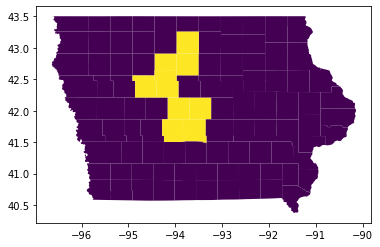

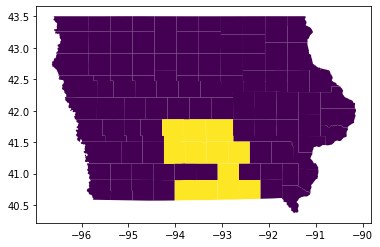

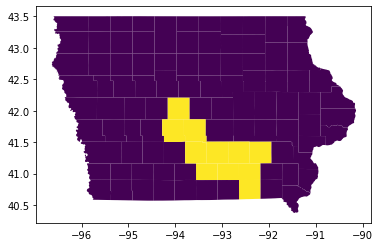

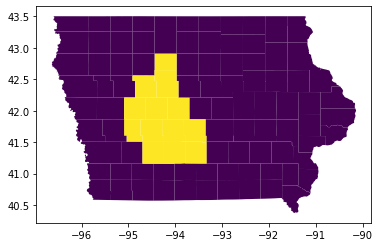

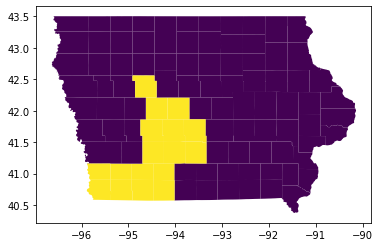

...

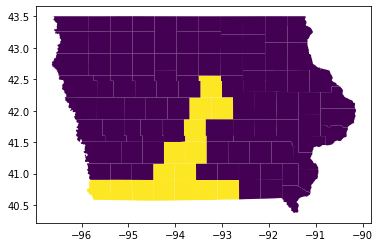

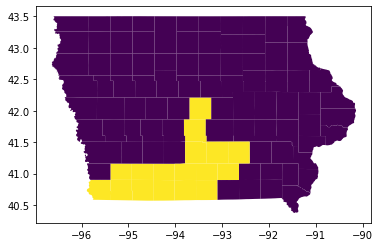

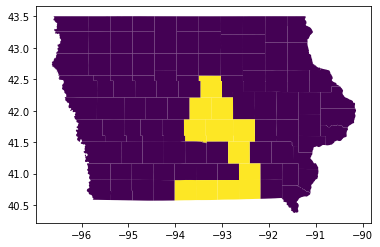

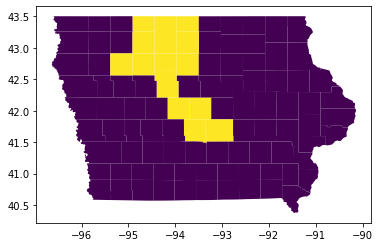

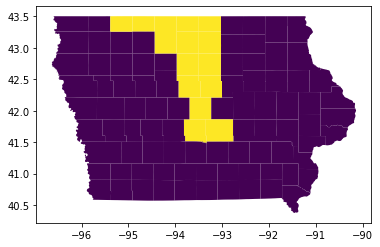

In [9]:
obj_type = 'cut_edges'
min_obj = min( objective(G, districts[p], obj_type) for p in range(len(districts)) )
print("For objective type",obj_type,"here are the identified maps within 10% of the incumbent objective =",min_obj)
for p in range(len(districts)):
    if objective(G, districts[p], obj_type) <= 1.10 * min_obj:
        draw_single_district( filepath, filename, G, districts[p], zoom=False )

For objective type perimeter here are the identified maps within 10% of the incumbent objective = 7.141648002352261


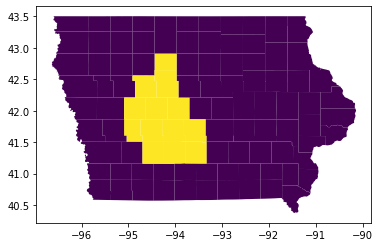

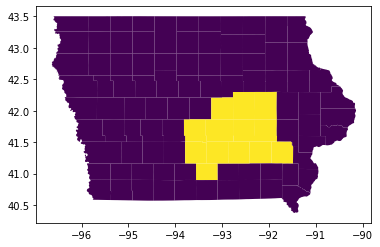

In [10]:
obj_type = 'perimeter'
min_obj = min( objective(G, districts[p], obj_type) for p in range(len(districts)) )
print("For objective type",obj_type,"here are the identified maps within 10% of the incumbent objective =",min_obj)
for p in range(len(districts)):
    if objective(G, districts[p], obj_type) <= 1.10 * min_obj:
        draw_single_district( filepath, filename, G, districts[p], zoom=False )

For objective type inverse_polsby_popper here are the identified maps within 10% of the incumbent objective = 1.9611489234622068


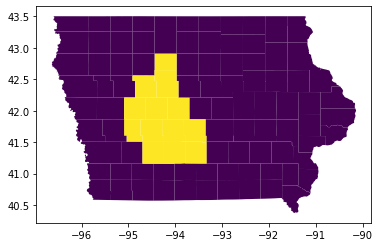

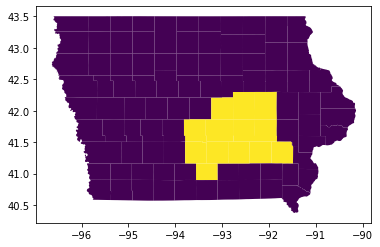

In [11]:
obj_type = 'inverse_polsby_popper'
min_obj = min( objective(G, districts[p], obj_type) for p in range(len(districts)) )
print("For objective type",obj_type,"here are the identified maps within 10% of the incumbent objective =",min_obj)
for p in range(len(districts)):
    if objective(G, districts[p], obj_type) <= 1.10 * min_obj:
        draw_single_district( filepath, filename, G, districts[p], zoom=False )